In [105]:
conda install logomaker

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.14.0
  latest version: 22.11.1

Please update conda by running

    $ conda update -n base -c conda-forge conda



# All requested packages already installed.

Retrieving notices: ...working... done

Note: you may need to restart the kernel to use updated packages.


In [1]:
import infrared as ir
import infrared.rna as rna
import matplotlib.pyplot as plt
import copy

#### Create a model, and sample

#### Model: Add functions

In [3]:
#[Multiple_targets]
targets = ["((((((((((...))))((((....))))))))))",
           "((((((.((((((((....))))..))))))))))",
           ".((((((...)))))).(((((((....)))))))"]

model = ir.Model(n,4)
#defines one function GCCont for each variable (or nucleotide) and adds them to the model
model.add_functions([rna.GCCont(i) for i in range(n)], 'gc')
model.set_feature_weight(1, 'gc')

for k, target in enumerate(targets):
    bps = rna.parse(target)
    model.add_constraints(rna.BPComp(i, j) for (i, j) in bps)
    model.add_functions([rna.BPEnergy(i, j, (i-1, j+1) not in bps)
    for (i, j) in bps], f'energy{k}')

#### Model: Add Custom features

In [4]:
import random
import math
import RNA
from RNA import energy_of_struct

In [5]:
# Restate current model
model = ir.Model(n,4) 
bps = rna.parse(target)
model.add_constraints(rna.BPComp(i,j) for (i,j) in bps)
model.add_functions([rna.GCCont(i) for i in range(n)], 'gc')
model.add_functions([rna.BPEnergy(i, j, (i-1, j+1) not in bps)
                     for (i,j) in bps], 'energy')

In [6]:
"""custom feature that evaluates Turner energy and tell it to 
control the feature energy (this tells Infrared to internally use base pair energy as a
proxy to manipulate the distribution of Turner energy)"""

model.add_feature('Energy', 'energy',
    lambda sample, target=target:
        energy_of_struct(rna.ass_to_seq(sample), target))

## Exercises

In [8]:
import infrared as ir

# Define the number of nodes and the number of colors
n = 6
c = 4

# Define the edges of the graph as a list of tuples
edges = [(0, 1), (0,4), (0,2), (0,3), (0,5), (1, 2), (2, 3), (3, 4), (4, 5)]

# Create an empty model
model = ir.Model(n, c)

"""# Add variables to the model
for i in range(n):
    model.add_variables(i, (0, c-1))"""


ir.def_constraint_class( 
    'color_constraint',
    lambda i,j: [i,j],
    lambda x,y: x!=y
)    

# Add constraints to the model for each edge in the graph
model.add_constraints([color_constraint(i, j) for (i, j) in edges])

#Small cut
edges = [(0, 1), (0,4), (0,2), (3,2), (2, 3), (3, 4), (2,4), (4,2), (4,3)]
n = 5
p = 2
model = ir.Model(n, p)

ir.def_function_class( 
    'small_cut',
    lambda i,j: [i,j],
    lambda x,y: 0 if x==y else 1 
)

model.add_functions([small_cut(i, j) for (i, j) in edges], 'smallcut')

sampler = ir.Sampler(model)
model.set_feature_weight(-1, 'smallcut')
sample = [sampler.sample().values() for i in range(10)]

sample

[[1, 0, 1, 1, 0],
 [1, 1, 0, 1, 0],
 [1, 0, 1, 0, 1],
 [0, 1, 1, 0, 0],
 [1, 1, 1, 1, 1],
 [1, 0, 1, 1, 1],
 [1, 1, 1, 0, 1],
 [0, 1, 1, 0, 1],
 [0, 1, 1, 1, 1],
 [0, 0, 1, 0, 1]]

## First optimize function

In [9]:
ir.def_function_class(
    'hammingdistance',
    lambda i,y: [i],
    lambda x,y: 0 if x==y else 1
    )


def optimize(model, objective, steps, neighbour_steps, temp, start=None):
    """Works by a similar principle as mc_optimize, except that it doesn't work with connected components,
    but rather evaluates the neighbouring sample in each step and compares it to the current one"""
    
    sequences=[]
    
    sampler = ir.Sampler(model)
    cur = sampler.sample() if start is None else start
    curval = objective(cur)
    best, bestval = cur, curval
    
    for i in range(steps):
        new = neighbour_optimize(model, best, neighbour_steps, n, m)
        newval = objective(new)
        print("Neighbour" + str(i) + ": " + rna.ass_to_seq(new) + ", value: " + str(newval))
        sequences.append((rna.ass_to_seq(new),newval))
        
        if (newval >= curval or random.random() <= math.exp((newval-curval)/temp)):
            cur, curval = new, newval
            if curval > bestval:
                best, bestval = cur, curval
                
                
    return (sequences, best, bestval)

def neighbour_optimize(model,sample, weight, n, m):
    """Returns a neighbour of an input sample,
    but only once it's similar enough to the input sample"""
    m_prime = copy.deepcopy(model)
   
    m_prime.add_functions([hammingdistance(i,val) for (i,val) in enumerate(sample.values())], 'hammingdistance')
    m_prime.set_feature_weight(weight, 'hammingdistance')
    
    sampler = ir.Sampler(m_prime)
    
    neighbour = sampler.sample()

    return neighbour


In [10]:
#Using multi_defect as objective for testing

def multi_defect(sequence, targets, xi=1):
    k = len(targets)
    fc = RNA.fold_compound(sequence)
    ee = fc.pf()[1]
    eos = [fc.eval_structure(target) for target in targets]
    diff_ee = sum(1/k * (eos[i] - ee) for i in range(k))
    diff_targets = sum(2/(k*(k-1)) * abs(eos[i]-eos[j])
        for i in range(k) for j in range(k) if i<j)
    return diff_ee + xi * diff_targets

In [11]:
def draw_logo(sequences,name=None):
    import logomaker as lm
    
    matrix = lm.alignment_to_matrix(sequences = sequences)
    logo = lm.Logo(matrix)
    logo.style_xticks(rotation=90, fmt='%d', anchor=0)
    logo.ax.xaxis.set_ticks_position('none')
    if name is not None:
        plt.savefig(name)
    plt.show()
    logo.ax.xaxis.set_tick_params(pad=-1)
    return sequences

def opt_draw_logo(sequences,name=None,num=10):
    try:
        draw_logo(sequences,name)
    except ModuleNotFoundError as e:
        print(e)

def assignments_to_seqs(xs):
    return [rna.ass_to_seq(x) for x in xs]


Neighbour0: GGAAAGUGAAAU-UUCAGGAAAGGGUUUCCUU-CC, value: -4.808103799819946
Neighbour1: CUUUCAGCU-U-GAAGCCU-UCAUCGAAGUG-AGG, value: -3.336826056241989
Neighbour2: UU-CGCGUUUCGUGAAUUCUCGCUGGGGAGCGAGA, value: -11.198212385177612
Neighbour3: GGUCGCGGAUCGCG-UUGGUCGUGGGGUCGCGACC, value: -17.87297785282135
Neighbour4: GGAUGUAGG-UGCAUUUGGAUGCGGAUUCGU--UC, value: -21.386266946792603
Neighbour5: UCU-GCAUUUUGUAAGUUC-UGUCGAAGGGCAAGA, value: -6.902340332667032
Neighbour6: AGAAGGCGGAGCU-UCGGGAAGGGUU-CCCCU-UU, value: -10.086392919222513
Neighbour7: GAAAGCUGAAAGC--UGGGAAGCAGU-UUGU-UUU, value: -17.006794899702072
Neighbour8: GG-AGGCGGAGCC-UCGGGAAGGGGU-CCCU-UCU, value: -12.301522890726723
Neighbour9: GGAGGAUGAGGUCC-UGGGAGG-GGCUUCUCUUCC, value: -12.838433265686035
Neighbour10: GGACGAGGGUCUUGUUUAG-CG-GGGACUUCGUCU, value: -11.550314148267109
Neighbour11: UCUCGGGUUUCUCGAGUUC-CGGCGGAGGCCGAGA, value: -13.880178213119507
Neighbour12: UCUAAUCUUAGGU-AGGUC-AACCGUUGGGUUAGA, value: -15.09747959176699
Neighbour13: U

/home/elena/miniconda3/envs/myenv/lib/python3.10/site-packages/logomaker/src/matrix.py:584: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  counts_df.loc[:, c] = tmp_mat.sum(axis=0).T


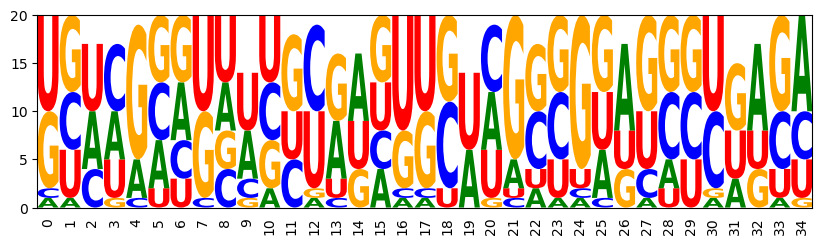

In [58]:
#Testing
n=35
m=4

#[Multiple_targets]
targets = ["((((((((((...))))((((....))))))))))",
           "((((((.((((((((....))))..))))))))))",
           ".((((((...)))))).(((((((....)))))))"]

model = ir.Model(n,m)
model.add_functions([rna.GCCont(i) for i in range(n)], 'gc')
model.set_feature_weight(1, 'gc')

for k, target in enumerate(targets):
    bps = rna.parse(target)
    model.add_constraints(rna.BPComp(i, j) for (i, j) in bps)
    model.add_functions([rna.BPEnergy(i, j, (i-1, j+1) not in bps)
    for (i, j) in bps], f'energy{k}')
    


objective = lambda x: - multi_defect(rna.ass_to_seq(x),targets,1)


steps = 20
neighbour_steps = 50
temp = 40

iterations=1

for i in range(iterations):
    sequences, best,bestval = optimize(model, objective, steps, neighbour_steps, temp, start=None)
    rna_sequences = [sequences[i][0] for i in range(len(sequences))]
    opt_draw_logo(rna_sequences)

#Observation: for the same multi-target design problem, the optimize function can "get stuck" at a different 
#locally optimal sequence. From running it multiple times CCCCCCGCUCCGGGGGCCCCCUUCAGGGGGGGGGG seems to be 
#globally optimal with multi-defect -3.87

# Neighbour generator

In [13]:
n=35
m=4

#[Multiple_targets]
targets = ["((((((((((...))))((((....))))))))))",
           "((((((.((((((((....))))..))))))))))"]
           #".((((((...)))))).(((((((....)))))))"]

model1 = ir.Model(n,m)
model1.add_functions([rna.GCCont(i) for i in range(n)], 'gc')
model1.set_feature_weight(1, 'gc')

for k, target in enumerate(targets):
    bps = rna.parse(target)
    model.add_constraints(rna.BPComp(i, j) for (i, j) in bps)
    model.add_functions([rna.BPEnergy(i, j, (i-1, j+1) not in bps)
    for (i, j) in bps], f'energy{k}')

model=model1
sampler = ir.Sampler(model)
sample = sampler.sample() 

sample_init = sample
print(rna.ass_to_seq(sample_init))

GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC


Neighbours: Weight = 1
1: CGCCGAGGAGAGCCGUAUCAGGUUGCGCCUGGUCC
2: CUGUGCUGGACUAGCGCCAUUCGUUACAGUGGCGU
3: GCGCUUUCCGAGGGCAGCCCUGAUUGCUGCCGUGG
4: GCGCCAACCGGUCACACCAGCGUGUGAUCGCUGGC
5: GCGCGGUGCGCACCGAGAAGUGGGUACUCCGGGUU
6: ACGCGAGGAGGAGCGCCCGGGGAUCACCAGCGGGG
7: CCCCGCCACGGUGCGACUAUGUAAGCGCGGCGGAG
8: UAGGGGCGUUCCCUAAACUACGGGGCGGGGCCGAG
9: AACAGCCAAAUCAGCUUGUAGUUGGCUAACGGAUG
10: CCGCGACCAGUGGAGGAGGGCUGGCAUCGGGGCGG
11: CGCUGGGAAUGGCCCCUUGUGAGCCCACGGGACGG
12: UGCCCUACCAAGCCCUCGCUGCCACCAUCCGGCGC
13: UUCCGCCGCGGGAGACGUUGGGACACACCCCCGUA
14: CGAUGUUCCGGCUCACGGACCGUAUCCCAGGGGCC
15: AGCCCCGGAAGCGGGUCGGGGGACCCCCGCCGCGG
16: GCCCCGAGUUUGAAAGCGCGCGACUCCGAUAAGAG
17: CUGGUCUCUGGGCCCGCUCCUGGGAGCCCAUGACG
18: GACCCGAGAGAAAUGCCGCGUCGCCCGCGCCGCGG
19: AAUCGCCCUAUUCUGCCUCCGUGCCGUUCAGGGGG
20: CCGAGUACCGACUCGCCCCGCGGGCUCCCUUGGGG
21: CUGGGUUCAGAUGACUCGAGGAUCGUGCCGCGCGG
22: CAGCCGCAGUGGCCCGACUGUGGCACCUGGUUGCG
23: CCGGGACGGCGGAUCCCCAGAGGCCAACGUGCGCG
24: CUGACCCACGGGCCGAAGCGGGCUCCCCGUCGCAA
25: AGGCCUCAAGGGUACCCCUACU

213: AUGUCGUACUUAGGGACCUAUCCCCAUGCCCAGGC
214: CCGGCGCCCGAUCCGCGCCGUGCUUCGUGUCAGGA
215: UCCAGCCGCCUCGCGAACCCGCCCCGUUCCCGAGU
216: CAGGCCCUCACGCGGCUGCGUGUGCUCCCCGACCC
217: UAGCAGACUGGCCACUUUCGAGCGGCCCGGGUGCG
218: CCGCGCGGCAGGUCCCUUCCGGGCCUGGCCAUUAA
219: ACCUAACAGGACAGCCUGCGUAGGACUGCAUCGGG
220: ACCGCGCAAGUGCCAUUCAAUCGGCUCAAACGAUA
221: UCGUGCCGACACAAGACGACAGUGCGAUCGGACAG
222: CCCGACCGCGGGUGGCCUUUGGGCCCACUCGAGCC
223: UAUUACCCCUAUCGUGCCCGCUGCCCCCCCGGGCC
224: CGAGGGGGAAGCGACCCAUGCAGGGCCCCCCGGUU
225: UUGGUAAGCUAGGCAUUUCGCGUGUCGAGACCUUG
226: AAGGACCCCGGGCAAGAUCGCUGGGCGCGCCGGGG
227: CAGGGCUGAGAGUGUAACAGCCGCCGCACCGGCUU
228: GAGCCGUGCAGGCGACCCCGUCGCGUAUAACGUGU
229: CCACGGAAAUGCCCCACGCGUGGGCGGCCCUGCUG
230: UCGGUUCGGAGCGGACCGGAGAGGGCCUGAGCCAU
231: GCGACGCCGCGGGCCCCCUGGGUAUGCGGCCGUGG
232: UCGACAACUCCGCACCCCUGGUUGCGCACGCGGAA
233: CCACCCCAACGCGGCGACACUGCGGUCCCUCAGGU
234: UCGCCAACUUGUCUGAUCCCGGCAUGAGGCGCCGG
235: AAGCGGACCGGGUCCCCGGGGGGGAACGGGGGCUG
236: UGGCCGUUACGGCCGGGGAUGCGGCCUACCGACUG
237: CCCGGUCGUGG

424: CGCCCAGCUGGCCGCGCGUGGGGGACCCCAUUCGC
425: AGCCACUCUCGCAUAGCCUGGGCCCUCGAUAAGAU
426: AGCGCCCGACUCCAUCCCCCGUUUUGGCCACUCGU
427: UCCUCCCGCGGGCUAGUCUGGGGGCCCUCACGCCG
428: CACCUCUCCGGGACCCGCCUCGCGACCGCCCGUAU
429: GCCGUGGGUGGCCUAUCUUGUGACUGGUGACGGUU
430: ACCUCGUGCGGCCCGUUGCUCGGGGGACACUGGGU
431: CCACGGCGAGGCGCCCACUGCAACUCACCCGGGGA
432: AAGGGCCCCCGGCCCACGUAGGGCCCGCUGUGCGG
433: CUCCUAACUACGUUCCCCCGUACGACCUACGUCAA
434: CACCGUAGCGACCUUAGCUAUGGACAUACUCAAGG
435: CUUGGUCGGUCGCUCUUGCCGGUGUUUCGAGAGAG
436: CCACGCGGUAGGUAGACAGGCCGCGCGUACCAGUG
437: ACACGACCUCGCGCGCCCCAGGCGCCCAGCCAGGG
438: AGACGGGGCACACGGCUCCGCUUCCUCCGGGGGGC
439: UAGGGUCCUGGCCCGCAUGCACGGCCGAGGCACCC
440: CCCCUGAAUUUGGCGCGCCGGUAGCCGGACCCGGG
441: GGGCCAGCGGAUCCCCCGCCGGGCGGCCGGGCACC
442: CCGAAUCGCCGGGGGCGUCGGAUGACGCGCCUCGG
443: UACGCCAGCCGCAACGCGAAGGGGCUCCCUGCUGG
444: CCCGCGCGUUAGCUACUCGAGUGGGACAGCGGGGG
445: GCGAGCUCCGCCGCGCGCCUCUACCCGUCUGGGGG
446: CAACAAGUUCGGCGCAGGGCGUAGACCCCCGGAGC
447: UCGAGUUGGGGCGACUGUCCCGGCUCUCCUGCCGG
448: GCACGCCGCAU

630: UCGUGUAGCAGCCACCCGCUUGACGCCGUGAAAUC
631: GUGGACCGAGGCGUAGCGUGGGCCCACUCCCGGGA
632: CCAGCACCAGAGCACCGGAGCCGCCGGAAGUGGAC
633: UCCCGCACUCGCAUGGAGCAGACCCCAGGCGGCGC
634: AGGCCCCGAGGGCCACCUAUGACACCCUCGCGCCG
635: CCGCGGUCCGGGCCGGCGCCCAGCCGGAAGCCAUG
636: CGCUUCGGCUGCCCGCUGCGCGGCGUGAGCUGGUG
637: CGCCCACGUCAGGCCCGAGUCUUGCCCCGCCUCCG
638: GCGCCGUGAGAACAGCCUCGGCGCUCCUGGGCCGG
639: CUUGCCGCGGGGGCAGCCGGUGAGACCCCUUAGGU
640: CUUCCCGCAUGUAUGCGGCGGUAUCCACGCUACGA
641: CCCACCGCCACCCUGGCGCACUGCAAUUGCCAAGA
642: CCCACCUCAACGAGCGCCGGCUGCAAGCGCGUGCG
643: CAGCGUUCGGAUGCCGCGCGCACGCCUCGCGGUGA
644: CCCGGUCCUGGCCCGCUUCUCGGGGCCUCCAUGUG
645: UCACUUGGCUUGACAACGCAUGGCCCCGCCGGCGU
646: ACGCCGACAGGUACACCGAAGGGCAUCGGGUAUGC
647: CUGCGUAGCGACCUAUUCAAUAGUGGUACGGGCAC
648: CCCAUCAGUUCGGUCUCUCCGGAUUGCGGUCCAGG
649: GUGAUACGAACUCCGUUAUUCGUCGACACCCGCAU
650: UAGCUAGACGUGAUGGAGUUGCUCUCUCCAGGGGC
651: GCCUACCGCUGCGCCACGCGCGACGCGCCCGCUUU
652: CUGCUCCGCAUCUUCCCGCGCCAUUUCUCGCCUCG
653: UGAGCCGCCCGCCAGCCCCGCUUGGUCCACCGCGA
654: ACCCGCCGCGA

830: AAGACCACCGUCCUGUCCAGGACCGACCCUCGGGU
831: AGUGACUUACGUCUGGCGCUCCGAGCCGCCUGGGA
832: UUUACCGAUCACCUGUCAAGUGACCACCGACAUGA
833: CCGCCUCGAGGGUACCCGCGCUGGCCGCGCCCUAA
834: UCAAACACACACCUCGCGUGGGGGCCGACACACCA
835: AAGUACAGCGGCACCCACGCUUAGCUCCAGCUGCG
836: AUAAGGUGAGUGUGCGUGAACAGGUCCCAGCGGAG
837: GUACUGACGUUGACCUCGAGGACGGUACGCGGCAG
838: CCCUCCAUCGCGCCAGGCCGGAGGGCCCGCGGACG
839: GGUUCCGGCCAUUCACCCCCGGGUCCCCUUCGCGU
840: CGACCUAUCACUCCGCUGCGCAGCCCCCAUGGAAU
841: GUACGAGCCGGCCCCCCCCGCUUCCUUCAAGGCCU
842: CCGCACCCUAGGAACGCGUGCAACAUCCGACAAGG
843: ACGCGCCGCGGGCCGCCCCGUGGCGGGUGCGGCUG
844: GCCAUAACAAGGCUGACUUGUAGGGUCCGCCGUGC
845: CGGGGGUGCUGGACUCUGCUCUGGCCGCAACGCGA
846: GCGCCCGGAUGGCGCCGGAGGGUUUCCUGCCUCGU
847: CACCUCACCGGGUCGCUGCGGGGGCCCGCACAUGA
848: UCGGGCGCGGGCCCCACCAAGAGUCACAACCUGUC
849: GCGCCCCGGGGCACGCCCCGCUAGUGCUGCGUCAG
850: CUGCCCCGCAAGACGCCGCACGGCACCGCCCCCGA
851: CCCCGCGCUUGCAUGAAUAGCCGGCCCGCCGUGGG
852: CAGCCACCUCGGAGCCAGGAGGGGCCGUAACCUAG
853: GCCCGUUCACGGAUGUAUCGCGCCCGCCGCCGGUU
854: AUAUCCCCCGG

1042: CCGAGACCAGCGCAGCCGCGCAGCAGACCACUCGG
1043: ACGUCACGUGGAGCGGAGUGGCAGAUUAGCUGUAU
1044: UGGCCUUCCGGGCCCGCUUUUUGCCCACCCUGAGG
1045: ACGAGUCGCCUCCCUCCCCGCUCGUACCGCCGGCG
1046: AGCCUCGCAGUUCACUUCUUUGGCCGCUGUUGAGG
1047: GCGAGCGCCCACUCACACAUUGACAACGAAGGUAG
1048: UCUCGCCCUUUGCUGUAGCCGGCCCGCCGCCAGAC
1049: CGGAGUGGUACCGCAUGGCCGGCGGACAGCCGGCG
1050: CCCGUGAGCAGCCGGUGGUGCGGCCCCUACGAGAG
1051: AGCGUUCAACCCAUUCCUCUGGGCGAUCGCCACUC
1052: UGGGCCUGAGGGUCACGACGGGGACGAGAUUUGGU
1053: UUCACCCCAAGUGCGAUGAGUUGGAACAGGGCGAG
1054: CCACCGGAGCGUCCCUGCGGAUCGAUCCCUCUGCG
1055: GCCGGAUCCCAUGAGUCCCGGUGGCUUGGGGAUGG
1056: CGGUAAAGGGACCUGCAUAACGUUUUUGACGCUGC
1057: UCAUCCUCGGGGCAGUCGUGGUUCCCACCCUCGGG
1058: GCGACCCCCGGCCCGCCGUCCUGUAUCCCUCGGGG
1059: AAGAGUGGCGGGAUGCAACUGGUGCCCACGGCGCG
1060: CCCCCACGUGUAGCAAAGGGGUACCACAGGCGCAU
1061: GAGUGACCGCCCCCCCCUCGACGUCCCCGUCAGGU
1062: GGCAGUACUGUCCCGCCGCAGUUGACCCCUGUCGG
1063: CAGCGACGCAAGUGGCGGAGCUGGACCCACGCGCA
1064: CCCGGGAAAUCUACGCUCCAGCUGGUCACAAGGGA
1065: GCGUGGUGCCUCGGGAAAGUUCCCCGUA

1243: UCACCCCCGGGGUCGGCGCCGCUGGCACCCGCGGC
1244: UUAAGAAGCAGGGCGCUCUCGGAGGACCCCAGGGG
1245: GACCGAUGUAGACCCCGUUGGGAGGACGCUGUGUG
1246: CCAAACGGCGUCGCCACCGGCUCUUUAAAGUACCA
1247: UCGACACGCGAGCCCCUGCUGUUAGUCCCCCGUCU
1248: CACAGCACUCCCCCGGCGCGAAACGACGGCGGGAG
1249: GCCUUGAGAAAUGGACUCGGGGCCAACCGUCGACG
1250: UGGUGACAGGGCUCCAGGAACGGGAGCCUAUUCUG
1251: CCGGGAGUGGUGCCGCACACGGAGUGCCCAGGCGG
1252: CCGGUCCCUCAGCCCCUCAGUGACGCCCCCCGGGA
1253: CUGACUCGCUGCGCCUCGUACUGGACCUCAGGCAG
1254: CGUCUCGCGUGUGACCGUGGGGUGCGGUGACGCGG
1255: CUCCUUCCCCGGCGACAGCACUUGGCUACCCCCGA
1256: CGACACUGCCGGGGCCCGCGGGAUCGGCGAGGCGU
1257: GCGCCCUUUUGUGCCCACAAGCGGCACCCAGGGCG
1258: CAAGAGUUUCGAACCCUCGAGGGUCCUAGGCUGGU
1259: CUACUCUCAGGGCCCAUCGGUCGGUCCGUCGACGG
1260: CGCCGACGAGGCGGGACUUGCGUUCCACCCAGGGG
1261: CGGUCCACGUUGUUCUCGCGGGCUCACGCCCGUUA
1262: GCCGGCCCUCGGUCACCCCGGGCCUCUCGGUGGCA
1263: ACCCCCGCCGAUUGCCCGGCUGGGCCCCCCCGGCA
1264: CCGCCGCCGGUCCCGUUUCGCCACCAUGAAGACGU
1265: CCAACACCUCAGCUUGCCAUCGGGCAGCGCCUUUU
1266: ACGGGGGGCGAGCCGCCUACCAAGUCCC

1453: CGUCCAUACAGCGCCCCACGCGUCCCUUAAUGUGC
1454: UAGGCCAACGUGGGGCUCCGGGGGCGCCCCUUGGU
1455: UUUGGCAAAGGGCCCGUGCGCGCCCCUUCCGGUGG
1456: CACGCUGGCCAGCAGCAAGGGGGCCCUUGUUGCGG
1457: CCGGGCGGUUGCAAGGUCGACACCCUUCCCUGCUU
1458: CCCGGCCCUCGCCUCUCGCGAACCCAACCGCGCGU
1459: AACCCCUGAGCCAGCCGUCCUGAUCCCGGCAGUGU
1460: UCGCCUCUACCGCACGGACGCGCGUCGGCGUGGGG
1461: GGUAGUACCUGGACACCGAGUCGGCACCAGGGUGG
1462: CCCAGCUCCGGCGUGCUCCUAGGCACUGUCUGGAG
1463: CCGUCACCGAGGUUUCCGGGGGGCCCCAGACGCUA
1464: GCCACAUUACCCCCGCCCUGCGUAAGAUGGCGCGG
1465: UACCGCCGCGGGCGCUGCCCGGGCGCCUGACAAUC
1466: CUUCCUCUCGGGGAGCCGCGUGCGUCCAGCGCGGU
1467: ACGCUAGACCGGAGACACAGCAGGCACGCCGGUCU
1468: CAGAUCAGGGUGCCGACAAGCAGUUCCCACUAUUA
1469: AAGAGACGCGGCACGAUGAGGGCCCUCUGCUGCGA
1470: UGCAUCCGGGGCCCCCCUCUGAGGCCCCAGUGGCG
1471: AAGUCUCACGAGACGAAGCAUCUCCCCUCUCGCGC
1472: CUGCCUUACGCGCAGUCCCCGCAGCCGUCCGUUGA
1473: CUGAGCCUGCGGCCACCUCAGAGCCCCCCUGGGGG
1474: ACCGCGCGCGUACCGGCCCGGGGCAUACCUGCCAA
1475: CCCACCCCCUUCCGGCCCCACAGGACGCCGAGUAU
1476: UCGAGCCCCUGCCCGACCGCCACCUUCG

1652: UCCACCACGCAUCCCGCCUAGGCCCAUGCCUGGCU
1653: CCCGGGCGCGGGCCCUCUCGGGGCCACGCAGGCGG
1654: CACCACCACGAGAUGGCCCGUGUGCCCGCUGAGCA
1655: CCCACUCACUCUACGUACGUCUAGCCCAGAGGCUG
1656: CCACCUAGAGUCCGGCCCGGCAUGCCUCACCGAAC
1657: GCCCGGCCCUCCCUGGGGAUUGAUCCUCAUGUCGU
1658: CUGGCGCCCGGCCCCGCCAGCAGUACUCGGCGCAG
1659: UCGACGCGAGGGCGGCCGGACAGCAACGGGUGGGU
1660: CACAUCACAGACCCCACGCGCAGGCACGGCGGGUG
1661: CAUUCCGCCAGAAACGCGUUGUGGGCAUCCGGGGG
1662: CCCUGGCCCUACCCACUCUCUGGCCGAACACUCCG
1663: UCGGGCGCAUCUUGAACGCCCGGCUUAGCACGCGG
1664: UCGCUGCCAAGGACGUCUGUGUGCCGGUGGGGCGU
1665: UCCAUGCACUGCGCCCUCCACCUCAAUCCGAAGGA
1666: CGCCGCCGUAGCUUGCGCAAGAUUUCCAGCGAGCC
1667: UGCGGCGCUCUCCGCCUCCGUGAGUCUGGAGAGCG
1668: UGCUGCUCAGUGCGGCCCAGAUGAGAGCCCUGGGG
1669: GACUGCGCUUUCAAGCUGCCCAUGAGGCUAGGGAA
1670: CAGCCCUCAGAGGCGGCGAAUGUCCCCCCCCGGGU
1671: UCCGGAUGAUGGCCGGAGCGCUGCGCCGGAGCGGG
1672: ACGCCGGGGGACCGCCUGACGGACUGACCUGGCCG
1673: AUCGGCCGUCAUGCACGCAGGGGGACUCCUCUGUG
1674: CAGCCACCAGAUUCAACGCGGUGCGCCUCCGGGAC
1675: GCCCGCCCCGGUCCCCUGCUGCUGCCCG

1859: CCCCUAACCUUUCAGCAUCCCGGGGAUUCGCGCCU
1860: AAACUCGCCAUCGCCCUUGGGUGGCAUCCGGGCGG
1861: CCCUCGACACGCCGGACCGGGGGGGGGGCUCGAUG
1862: UCCAGUCGGGCCCCACCGCUCUCGUGUCAUCUUUC
1863: UUGCGGCCAGAGCAGCCGCUGGGGCGACGCCUCGA
1864: CCGCGCAGCGACACGGCUCGGGUCGCCCGUACCCU
1865: CGAUGCACUGCGCAGCCGCGCGGCGCUCGUCGGAA
1866: AUAAUGUGUCGGCACGCGAGGGCCGCUAGCACCAG
1867: UUCCUCCGCGCGCAGCACGCGCCCUCGACCCGGGA
1868: CUCCGAACCGCCCUAGCAUUCCGACCCAGCCUUGG
1869: UCCCCGGAUAGGAAGGCGCCCGACACUUCGCGUGC
1870: GCCUGCUGCGUCGCGCACCGGCGCACCAGCCCGAC
1871: CCCCCGCCCACUCGAACGCGGUGCCCCCCCCGGUA
1872: UCCUGUUACGCUGCCUGCAUCGGGACCAGCUGGGG
1873: GCGGUGGCGUGUCGCCAGCUGCGCAUGCCUCGGUG
1874: UCCACAUGGGACCGGCCACGCGGACCACGAGCGGG
1875: GGAGGCCGCCGUCCCCCGCAGCGGACGGCCGGGGG
1876: UUGUUUCCGUAACCGCGCCCGUAGCCGGGUGGGGC
1877: CUCGCCCCCUGUCGGCGUGGCUGGCCUACCAGCGG
1878: CGCGCUCGCGCGCGGGGGGCAAGUGUCGGUCAAUG
1879: CCCGCCACCAGGUCGUCCCGGCAGCCCCCUGGCGG
1880: AGGUUUCCGGACACCUGCGCGGACGGCCGGGGCGG
1881: GUCCUGCGCGCCGCCCCGACCGGGCCUCAAUGUGA
1882: UCCUUAUAAACGGCACAGAGCGACCGAA

2055: CCGCCCCCAUGCCUACCGGGCUGAGUGAGUGGGAA
2056: GACUGCCACCGUCUGCCCGCAGGGGGGUCCCGCGC
2057: ACGCUCCUAAGGCCGCACAAUCGGCUCCCGGCGGA
2058: CGCCGUGGGCGCACGCCGGAUAACAAUGCCUUCGG
2059: CCCCUGGCUAACCAGCGCAGGCGAUGCACCCUGGC
2060: CCCAGCUGCUAGUGCGCGCCGGGUCGCCCCGAGGU
2061: AAAGUUAGGUCGCGCUGCUCGUGGCCGUGCUAUAG
2062: CGGUAACCCUCUGCGCCCCACGGGAUCACAGGCUU
2063: CAGGCACGCGACCGACGUGCUACGAGUCGCGUUGC
2064: UACCCCCCGAAGCCCCGCCCCAGCGGGAGUGGCUG
2065: UCGCCACAUGCUCGGCAGGUGAAGCGAGCCGCGUG
2066: CCCGGCUGAGCCCUCACGUACAAGUCUCGAGCGUA
2067: GUGCCCCACUGCUCCCGUAUGGAGUCGGGGAGGGG
2068: GUCCGCCGCGGAGCGCUUCGCAUGCUCCGGCGGCG
2069: UCGCGCCGCGUUCGGACGCGCGGGCGCGACUGCGU
2070: GCGCAGUCCGGGCUCUAGCGUGUCCGAUCCGGCUC
2071: CCCGCCCCCUGGAGGGCCCGGGUUGCCCCGGUUGU
2072: UUAAUCGACCCCACACUCGCUGGGCCCCAUCAGCG
2073: CCGCCUCCGCGGGUCCCGCGGGACUCUUCCUCCAU
2074: CCCGGACUCGACGACACGCCCGGCUCAUAUCAUGG
2075: CGUGGUUCGGCGACCGCCAAAGAAGAGCGCCUCCC
2076: CCCGGCCGAGGCGACCGUCCCUGGGCCGCUCGUAC
2077: CCAUGCCCCUUUUACACGAUGACACCCGCCCCGGG
2078: CAGUCGUGUACCCCGAUCGUCGGGCUCA

2256: GCGCCCAGCGGCCCCGUGCGUGUAUCCCCCCGCGG
2257: CGCCUAUGACUCACACUCCGGUGCGACACUCUAGU
2258: CCCCGCACUGCCAUGGGACCUUGCCGCCGCUGUGU
2259: CUGCCCGCGGGGACCCAUCGGUACCCCCGCCGGGG
2260: UUGUGGUCCAUACCCCCCAUGAGCGCAACCGCCGC
2261: GGGCUGUCCCGCCCGUCGUCCGGGAUGUGAUGUAU
2262: CUGUCACAUGACCUCGACCGGGGGACUGCCCGUAC
2263: UCGCGAUCUGGACCCCUACGCGCUCUGCGCGGCCG
2264: UUCAUUCCGCGGCAUCGGGACGGCUGUCAGCCCGA
2265: CCGCGCCGCCGGCUCCCUUGGAGGCCCCCGGGUGA
2266: CACUAUCCAACGCGGCCCCGCGUGCCCUAGAAAGG
2267: CGACCCCGAGUUAGCUCUUUGGACCGCAAGGGGGG
2268: ACCCCAGGAGCCCGGCGGACGGGUCGCCCCGGAGC
2269: CAGGGGUAUGGCAGGCCCAACGAGCCCCGUGCCAG
2270: AGUUCUCCUGGUCCAAUCCGGGGAUGCUCACUCCU
2271: UGCCCACGCGCUUCGCGCAAGUGGCCCAGCUGAGA
2272: CCGGCUUCGUGUUCGGGUCGGGAGCCCUGAUUGCG
2273: CGCGUCUCUGCCUAGCUCCGGGGCCCUAGGGCGGA
2274: GGGUCCCCCUCGACCCCCCUCUGCCCGCCAGACGG
2275: ACGCCUAUCUCUUCGCACGGGUGCCACCGCCUUGU
2276: UACCUGGGCUACCUAAUCAGGGGCUCCCCCCAACU
2277: UCUCGCCUCAGCCCGCCGCGGCCAGUCCCCCUCUG
2278: CCGGCCAGAGGCCCCUCGCAGUUGAGCCGAGGCGG
2279: ACGCGGACGGCGCAGAUAUAAGGCUUCG

2462: ACCGAAUCGGUGCGGCAGCUCGGUGGCCCCAGUAC
2463: AUCCACCACGCACCGACGUCCGGCAUGUGUUACAC
2464: GACUGACACCUAUUCGCGCAUUGGCAUCCCGGGUG
2465: UCGCGCCACGGCUGCCUGCACACACGCCCGGGGGC
2466: UCACGACCCGCACACCCCUGCCCGACCCCCGACGG
2467: CAGUGCCGCCCACCGCACCUGGACCGAGGCGGCGG
2468: CCGCGAGACUGGGCGUUCUACCGCGGCCGUUGGGG
2469: ACUGACUCCGGACCGCGCCGCCAUCUUGGCCCAAG
2470: GCGCGGCCCGCCCCGCCCAACCGCUCGCCCGAGGA
2471: CCGUCCUGCUGCCACCGUCACCGCGCAGGACGGGC
2472: AGAUCACACUCCGUGGCGGCGCGCUGCUCCGUCCU
2473: GGGCUUUACGGGAUAACCCGGGGGACCAGUCACGG
2474: CUACGGUCCAGCAGCAACUGUGCGCGCUGCGUGGA
2475: ACGGCCGGAGGGCCCCCCAGCAAGCCUACUCGCGU
2476: GCCCCCAACGCUCGGCAGGGGCGCCUAACCGGCGG
2477: UCGCGCCGAGUCGCGCCCCGGUCGACCGGCGACGC
2478: GGCCGCGGAGGGCGGCCCAUCGGCACAGCCCGGUA
2479: ACCCUGGCUCGUCGUUCCCGCUUCCCGCGCCUAAG
2480: CCUCGCUCACCUCCUGCGCGGUGUCCGCCCUCUCC
2481: CGGGGCCCGGGUAUGCUCCUCAAGGCGUGGGGGCC
2482: CGGCCUGGGGGCCCGACGCUCGUGGGACGCCGGCG
2483: GGGAUCUCAGACUGCCCCAGUUAUCCUGCCCGCGG
2484: ACGAGCAUUAUGGAGCGGCUGGUGCAUCCUCGGGC
2485: UAGACCCGGCGACACCCCCGCGGACGCC

2662: GCACUACGCGGGGUGACGCAGGCGCAGUGCCGGGC
2663: UCGUGCCGGUUGCACCUGAUGGAUUAAAAGGAGGG
2664: CGAGUGGGUCCGCAUCAUCGGGAGUCCGGCGGUUG
2665: CCGCCCCGCCUCUCGUCGGUUGAUCUCCGCCCUUG
2666: GCGCUUUCGGGUCGCCCGCGCAGCACUCGUCCGCU
2667: ACGCGGCUUGACUCCACUCGCCGUCUAUCCGCGGC
2668: CCGCCCCGCGCCCAUGCGUCCGACCUACCCUACGU
2669: CCGCGCCCCGGCCGCCUCACGGGCCCUCAUCCAAU
2670: AUCCUGGGAUGGCCCCUCGCCGAAAACUGACUCGG
2671: GCUCGUGCCAGGACCCCCCCGCGCCAGUCCCGUCA
2672: CCGCUCAGUAAUGUGCCGAGGCGCCAACGCGGGUG
2673: CCGGGCCGCCGGCAGAAACAUGGCCCAACGGGCGG
2674: CUGUGUGGCGGCAUGACCCGUUGGCCCAGUCAGCC
2675: CACCUCCUCGAUCUCCGCCGGGGCACCGGCCCGUG
2676: UUGACGCGGCCGUCCCGCCCCAACACGUGAAUGAA
2677: GUGGGAGGGCUGACUUCCAGCGGCCGCCUAGAGGG
2678: ACCGAUCGCCAGACCGCGAGGAACCAUCACCGCUG
2679: CCGAGCCGGUGCCCACAGAAGCCUCCCCGACACAG
2680: CCGCGCCGCGGCGCGAGCCUGGGGAGCCCCCAGUU
2681: CCCCCACGCUGGCGGUCCCUCAGCCGAUGCGGGGG
2682: CCCGCAAGCCUGACCCAGUGGACCCGCGGCACGGA
2683: AUAGGCCUGUUGAUUCGGACAUCGCCGCACGCCGG
2684: GCGCUACCUGGGUUGAGGCGCUGUCGCCGUCGUAC
2685: CGACCCGCUGCAUUCUGCCAGGGCCCCA

2869: ACUAGGAGAUGGCAGUCGAUGGUGCUCUUACACGC
2870: GGGUUGCCGUGUCCACAGUUGAUCCCUAGGUACGA
2871: CCGCGAACGUCCCGCCGGGGGCAGUCCUGCCUCCC
2872: CACUUCCGUAGCCUGACUUCGGCCUGGCGCCGCAU
2873: GUAGCGCACGAGCCCGCGCGGGGUUCCUCCCAGGG
2874: CUAGGACUAAUGCCCAUGCGUCGCUCCCCCCAGUG
2875: GGCCUAUAGACCAUCCGGCAGGGCACUCUGCAGUU
2876: CUGCGCCCUUUUCCGCCUCUCGGGCAGUCGCACGG
2877: GGCGUUUACUGCUCGACCUGGCUCCACUCCGCAUG
2878: ACCUGCCGAAUCCAUGCGCGUGACCUGGGCUCUAG
2879: CAGCCCCCCGUCGCCCCGCGCGGGCUCACCGCCUA
2880: CGACGCAGACCGCCGCCUCGCCAUUCCGGGCGGGC
2881: GUAUGUCCCCCUCCGUGUCCCGGCUGCCAUCUUCG
2882: AGGGGACCCGAGGACCGCUGGUCGGGUCAAGCGGG
2883: CUCGCUGGAUAGCCGGUGUAGGCGAGCCGGGGCAU
2884: UGCCAGCACUACAGCACCCACGGCUCUUGGUAGUG
2885: AUCCGUCGCGGCCCCCCGAGGUGAGCGACAUCGGG
2886: ACGCGUGGCUCCCUACCCCUCGGGAAACACCGCGG
2887: CGCGCACGCCAGACGCAGUUCGACCAGGACGGAGU
2888: CACACCCGCGACACCAGGCUGGAUGACAGUCACUG
2889: CCGCGACCUGACCCACCGAGGGGCUUUCGCGGCUG
2890: CCCUGAGCCUCCCGACGCCCGUCCCUAUGACACAU
2891: CCCCUGUCCUGGCCCGCCACGCGGCACAACGCCAA
2892: CCGAGUCGUUCUUUGCCGAACGGACCCC

3077: UGGACACGCCCGCGCCUGGGCCGGCUUCGCUAGGA
3078: CGUUGCAACCGGCACUGGCGUCUCAUGGCGGUCCG
3079: UCCCCCGCAGGCGCUGAGAGCGGGGCCGGCCCCUG
3080: CCCGGCACCUCUACCGGGAGUUGUAACGGACUGAC
3081: CCCUGCAAGUUCCCAUACAGUGGGCGGAGGCGUAA
3082: CUGCAAUCCCGGAAGCAGGGAGAUCCUCCAGAGAG
3083: UAGACAGCCUACACGCAGCGGGGCCGCAUGGGUAG
3084: CACCGACGCGUGCGCCCCAGCGUCCCCCCGCCGAG
3085: GACCGUUGCUGGCGAUCUAUGAGGCGCCCGUAGAC
3086: AUGCUAAGGGACCAGGCCUGCCGCCUGCCUGGCCU
3087: ACCCUAUCUUACGCGUCUAGGAUGCCCCGAGCGUA
3088: UUGCGAGCCGGCCUCUGGCCGUGUACGCCAGAGAG
3089: CCAGCCCAACGGCCGCCGCCCGUCGCCCCCUCCUG
3090: CCCUCGCCCGUGACCAGCGGGGACGUCCGCCGGCG
3091: UUCCUACGCCAGUACACGGAUUUCCAUGCUAUUUA
3092: CGCGGGCACGGGCCGCUCGGCGGGCCCCCCCCCUU
3093: CCGCCCGCCGGCUGGGGCCAUGGCACCUGCGGGCC
3094: ACGUGAGCAGGGUUGGACAACGGGACCUGCCGGGG
3095: GCGAGAACCCAGGCACCGCUGUGUCCAUGACCCGG
3096: CACCGUUUUGACACGUAGGGGGCACCUACACCCAG
3097: CGGGGACGCUGGAUCCGUUCCGUUCCGCGCAACGG
3098: CACCCAGCGGGGGCCCCCUUACAUCCGUUCGGGUU
3099: GGCCCCCGCUGUACCAUGCGCCGGCGCAAGGGCCG
3100: AGGACCACCGGCGUCCCUAAGCGGCACG

3277: CCGCCAACCUACAGAUGACACUUUCACCCAGGCGA
3278: ACGUCUCCAGGGAUCGCCUUCGAGCCGCACAGGAA
3279: CACAGUGUCGGCGCGCGCACCGGCACCAGCGCCAG
3280: CAAGGCCAGGGCCACCUGGUCGGCCGCCGCUCGGG
3281: CCCUCGGGUCGGCGAUAGCGCGGCCACACCCCGGA
3282: CGUAGUUGGGGGCUCCGCCUUUGGCCGAGUGCUGG
3283: CCCCCGCCCGACACAGGGAACGUGGCCCCGCCCGU
3284: CUGAGGAGCAGGCUCGGGGGCGGCGCCCGGGACCC
3285: CACCGCGGGCCCAGUAUGGUCACCCUCUCCCUGGU
3286: UUGGGUCCAGUCCGCUCGGUGGACCACACCCCCUG
3287: UUGCUCGCCUCGCCACGCCGUGGCAACACCCGCGG
3288: CCGACACCGGGCACCCGGAGCCGCAUUCCCGGGGG
3289: CACCCGGGUUGGCUCGGCCGGCUGGGUGUCCGCGG
3290: GCGGCCAACUGGGAGCUCCGGUGCUAUCAGGUGCU
3291: UAGCCCGCACCGAAGGCGAGUAUCCGAGGCCGCAG
3292: CUGUCCUACGGGCACCCGACGGUGCCGCCCAUCGG
3293: CCGCGACCAGAUAUACUCCUGCGGCGGAGCGUGAC
3294: ACGACCUGGCGCCCACUCCCCGGGCACGCAGGCCA
3295: CCCCGGGGCGGUGGCGUCCAGGGUUGGGGCGGGCC
3296: CCGGGCGCACCAACCCGCGGGGGGUACCGCGGUCU
3297: UUGUGGCCGUUGGCUUCGCGAGGGCCCGUGGGGGG
3298: UUCCGUCCAGGGAACUCCAUGCGCACGGUUUGGGA
3299: GCCCGCGCCGGGCAGCCGCACGGGCGGGGCCUUGG
3300: CCGGGGCCGGCACCCGGUCCGACUAUCA

3476: UGGAGCAAGUGACAGCAGAGGGGCCCCCGACGUUC
3477: CGACUGACAGGGCCGCGCGUUGACCGCCGGCAGAG
3478: ACCGGCCCCGAUGUCUAGCCCUACGUACCAGGCCG
3479: CUACUACGCAAGCUACCCCGGGACUUCCGCGUCGG
3480: CAGCCGCUAGAGUGCCCGUUCAUCCCCACUGCCGC
3481: CUCGGCCCCCUCAACCCCGGUGGGCCCACCGACAG
3482: UCGGCCCGUUCGGCGCCGAUUGUGUGUCCGAAGAG
3483: GCCUGUGGGGGGCUCGGCCGUGGGCCCGCACAGAG
3484: ACCCGCUCCGGGUCCCCCUGCACGACUCCAGGCCC
3485: CAUCGCCCGUGCAGCCCCCCGCGCCCGAUCACGUC
3486: GGGACCGCCUGCCCCCUGCGCGAGAACCCAUUCUG
3487: ACCUGCUCCGCUGACACGCACGGUAAUCCUGUUCG
3488: AACCCUCGCAAGUGCCCCCUUGGUUCCCACAGGGC
3489: UCGAUACCUAUGCCCAUCUCGAUGCUCCCCGUCGG
3490: UCCUUCCGCGUCGCGUUGCAGCGACCCUCCCGGGG
3491: UUCUCCCCGGGGCCAACGUACGAGACCCCCUGUGG
3492: CUACCAGGUCCGAGGCACCGGGACGUGCAGCCGCC
3493: GUGCUGCACGCCACCCCGAGGUGAACCUGCCAACG
3494: CCCCGCCGCGGGUAGGCUACGGGCCUCCACCGCGG
3495: UCGAGCAACGGGCCCCUGCGCCGGGCCAGCGGCAC
3496: UCCCCGUGACUCGCCAUUUGACCGCGCCGCCGGCG
3497: CCAUAACGUCGCCCCCCCCCCUGCCCCGCUCACGG
3498: CGCCGGCCUCAAUCCUCCCUCGCGUCGCGCUCGGG
3499: UAGCGACCGGGGGCCACCGUGGGCUACA

3681: CCGGCCGCUGUUGCGCCGCUGACUCGCCGUCGGGG
3682: CGCCUUAUUGUCCCGCCCUUGAUGCAUCUCCGGCG
3683: CCGCUCGACAACCUACUAUUGGUGCGAACCGUGGG
3684: UCCCUCCGCGAAACCCCGUCGAGCUGAGAGGCAGG
3685: CUCCCUGCAUGGCACAUUCUCAGCUCCCCCGGGGA
3686: UGCCGUCCCGGCCCGCAGCUCUGCUCCGCCCGGGG
3687: GCGCCCGGUCACCACUCCCAGCGGGCAACGGAUUA
3688: AUAAUCCGCUAGCCGACCUGCAGGCCCGGACCCGA
3689: CCGCCCCAGGGCUUUUCUCGAGACCACCGUCCCGG
3690: UCCCGAUCGGUCCGCAGGCCGCUAUCGCGAGAGGG
3691: ACACCAAAUGUCGCGCGCCUCGGGCUCAGAGCCGA
3692: GGGCCCCGCUUCUCACCGCGCGCGGCUCAGGCGGA
3693: CCCGCGCGCGGUCAGAGCUAGGCAGAAUCCCUCGG
3694: CUCCAACGCGCGGCCUUCCUGUGUCCCCAGCGCAG
3695: GCCGUUGGCGUGUCCCCUGCCUUCGGCCCGCGCGG
3696: CCAUGUUCUGACGGGACGGGCGGCCCCGGCCACGG
3697: CUGCUGACCAUCCACCGAAGAGUGCUGUCCGCGGU
3698: UCCCUCCCGCGGCGGCCGUUGCGCUCAUGUGGUUG
3699: CCCCGCUAGGGCCUCCGUCGUACGUUCUGCCAGGG
3700: ACCCAGCGCGGGGUCCGCCGCACCUGACCGCGAGG
3701: GUGCUACUCGUCUCACCCUUCCACGACCGUCGGUC
3702: CCUUGUACGCGCCUACCGAGGGGGCCGAGGGGUGG
3703: CGCCUCGCCGUGGUCACCCCUGGUUUGAAUCGGGG
3704: UAGCGCCGCAGCGCGCACCCGCGCCCCC

3883: CUGCGAACGAACCUGUCGCUGGCCUUGCCGGGCGG
3884: CCAGUCGGUGUUCUUCCGGGGGGGCUGUCCUGAGA
3885: GCACACAGCGAGUCGUACCGGGCGUACCGAGGCUU
3886: ACCCUCCGGUCCACGCACCUCGUCUCCUACUGGAG
3887: AUCAGUUGUUGGGCGUCCCGACGGCGCGCCCGAAC
3888: AAGCGGCCAGUCCAGGACGGUCGGCAUCCUGGGCC
3889: AUACGUCGCUGCGCCCCCCUCCGGUGCGGCGGUCU
3890: UCCGCUCGCGGGUCCAGCGGGGGACCCGGGAGGGC
3891: GCAGCCCGCAGGCGGUGUUCUUGGUACCACGGCCG
3892: UCCAGCCCUGACCCUAGGGCGGGUCUCUGCGUCAU
3893: AGGAGCCCUGUCCCGAGUUGCUGCAUCCACGCCGA
3894: CAGAGUGGUGGGUGGCCACGCCACUACUCUGGCGU
3895: CCGCGCCCCGGGACCUCUCGGGGCCCGACACGGGG
3896: CCGAGCCCCCGCCUAACCUAGAGUGUCGGUCCUCC
3897: UCCUGAACAGGCUACUCCAUCAGUGCACGUCGAUC
3898: GGCCUCCCCCUGUCGCCCGGGAAGCCGGCAGCCUA
3899: GUCGCGCGCUGCCGCCACGAGCGGCAUUGUCAGAC
3900: CCCGAACCAUGGCGCCCGCACGGCGACUCCGCCGG
3901: GUCACUUCCGGCCUCCAGGGGUGACCCUAAGGCUU
3902: CCCCCCCGAGUGCCGGGGUGGGUCCCCCACCGAGG
3903: CCCCCAAACAGUGCCGUGUACCGGUCGCCCCUUGG
3904: CGGGAUUCGGCGUUCCUUAGUGGUCACACCGUUCG
3905: UCCCGAUGACGGCAUCGCGGGAGACCCCCUCACGG
3906: CUCGCUACCCGUUCAUACCGCGGGUGCC

4082: GCGGUCUGCAGACCCGUGCAGCGCCGGCGUCGCGA
4083: CCAAGGCAAGGUGCCGCUCGGCGGGACCGCCGCCG
4084: AGCCCUCCCCGUCCAAAGAAGAGGGCUUAGGGUCC
4085: CUGCCCCCGCUGCCCCCCCGGGCUGGACGUCGGAG
4086: CGGGUACGUACCGCGAAGCUCGCGGUUGCAGACAG
4087: ACACACCCCGAGGGACCCCCGUAGUAUCACCCCAG
4088: UUGCCGCGCGCCCGGAUGCUCGGCAAGCCUGUGUU
4089: CCGGUCCCACGAACCCGGGCCUACGCCCCCCGGGG
4090: GAGGGCUCCAGGAACAACCACGGAACCCGCGGCGG
4091: AGGCCCCCCGGCCCCAUUUGUACGUUGCCUGUCAG
4092: GCCCUCAGAGCUUCGCCGCAUUGGCGUUCUUGCUU
4093: GCCUCCUCGACAAAACGACGUGUCGUCAGCCGCCU
4094: CGAAGCUGCCGGAAAGCCGGCCCGCCACCCCGCGC
4095: CCCGGCUACGACGCCCUAAGGCGCUAGGCGGUCGA
4096: UCGCAGUGAGGUCACCUGCGUCCUUGACCUGCCGG
4097: CCGCCAAGUGUCUACCCCCCCCGGGGCCCACGCGG
4098: GUAGCCUCGUGGCGGACCCACGACCGCCGCCGGGG
4099: CUGCCAUGUCCGACGAUCGCGUGGACUCCCGACGU
4100: GAACUUCCAGCGCCCCAUCGUAUGUCCAAAAGCAG
4101: CGUGGCAGGGUUCCGUCGAGGUGGCACGUGCUGGA
4102: ACCGGCUACAGCCGCCGCUUGGGGCCCAAGCCGGC
4103: CCAGCGCCAGUGCCCACGCGCGGUACCCCCUCCUC
4104: CUUCUGCCGGGCACGCCGCAGUGCUCGCGCGCCUU
4105: CCUGGAGGCUGCCCGCCCCCGGCGCCCG

4282: CCCCCCCGUUAGCCAACUGGCACAGCCCCCGCCAU
4283: UGGCUCCCCCGCCAGCCCACGUACCAUGACAGGUG
4284: GCACCCCCUCCCCCACUGCGGGCGCCCAACGGUGC
4285: GUGAGGCUAUACCGCGCCGAGCCCCUACCGGGGUC
4286: UCCCUAACAAGGAAGACCCGCGGCGAUCCCCUUAG
4287: CGGACUAUCAGUACCUCGCGCCGGCCGUCCGGGUC
4288: CUACCACACGUCCGAACCAGUGGGCGACCUUACGG
4289: GACAGGCACCGUUAACUCGGUGGGAUUGGAUGCUG
4290: CCGGCCUGCGCGGGGAGUAGCUGUUCCCGACGAAG
4291: UCCUCGAGCCUUCCGCCUCUCGGCCAUGCCCCGGU
4292: CCGCUCUGGGUCAACCCCCCCUAGCUCCCUCAGAG
4293: UAUGGCGGCGAGGCCCGCUCGUCUAUUCCUGUAGG
4294: CCACGUAGCUGCUAUCUGUUGUUCGGCUAACAUUU
4295: CACGUCGGCGUCCACAUGCCACGCCGUCCUCGCCA
4296: UACGGCCGGGGCUACGCGCCGUCCCCUAGCGGCAG
4297: ACCUACCGGCGCGUCCCGCGCAGCACCCCCCAGUC
4298: ACGCAUCAGACGCAGUCUGGCUAGAAAGUUGUCCC
4299: AUCUGUCCCGCUCCACCCAGCUGUCCCCGCAGGUC
4300: CAGGCUGCCGUUAUACGUCUUGCUCGCCCGGGCCG
4301: UCGUGCCGCCUGUCCCAGUGUCAGGUUCUCUUGCA
4302: CCCUGUCGCGGCCCAGCCACGUGCACACGCGCCGC
4303: AACUCUCACUACCUGCGACCGUUCACGCCGCUGGG
4304: CCGUCACCGCGCACGGCGUGGGACAAGGCCCGAGG
4305: GCGGCCCGCUGCCAGCCGAGGCCGGAUA

4487: GUGCCUCCCGACGAGUCGCGGGGGGCUCCCCGUCA
4488: CGCAGCCGGAAGGCCGCCGGCGACACCACCGGGUU
4489: CCGCGCCCUAGCUUCCCGGCUUUGUACACGGGGCA
4490: UUACGCCCGUGCCCCUCCGUCGCUCGUCGCGCGGG
4491: GUCCUCAGCGUGGCGGCGACCGGUAAUCCCCGCGG
4492: CGGCGACCCAGGCAGGCGCCGGGGCACACAUUGAU
4493: GGCCUUUCUUAUCAACCGAAGCGCGCGUCCUGAGU
4494: GGGAGCCGCGAGAGCGACAGUACCCUGGGAGGGGG
4495: GCCCCAGUCGACGGGCUCCUCUCUCGCUCGCGCAU
4496: AAACCACCCCUUUCCCCGCGGGGUCCUCCCCGCGU
4497: UCACCAUGCGGGGAGCCCCUCAAGCCGUGUGGCUG
4498: AAACGCCGUUUGUGCUCCGGGUUUGCCGCAAACAG
4499: ACCACACCCGCUCAGCCCCGUUGGGAUCCUUUUGA
4500: CGGACCCAGGGCCCCCCCCGUUCGCGGCAAGACAU
4501: CGGCCCGCCGACCGGGCGAGUGGGGUCCCGCGCGC
4502: UGCACGACCGGCCCAUAUCGCUGGCCCUCCUGCGG
4503: GCGUGCCCCAUGCCCUCGGGCGACGCAGGCGGGGU
4504: AAACCGCCCAGGCUGCGUACCGUGCCUAGGCCAGG
4505: ACCUGCGCCAGGCAGACCCUCGAGACCACCCGUAC
4506: GGUCACCUCCCGGAGCGGCCGGUCUUAUAUGGAGU
4507: CAUCGCGCCUGCACAACUAGCCAGAUCCGCCUUGG
4508: CGACCCCCCCCGCCACCUUGCUCACCGUGCUGGUU
4509: ACGAUGCUAGACACCUAUGUGGGCGCACAUCUCUG
4510: ACCAUUCCAUAGUUUCCUCGCAUGUCCA

4694: CGCACAACGCCGCUCCCGUAUGGGUAUCACUUAGG
4695: GGGCUCCCGCGAUUAUCCCGCUCGCCAAGCUAGGG
4696: CGGAUAACUUGGGCCUUCCAGAGCGGCGACCGGGU
4697: CUAGUUUCCCAGCAGAUGCGCGGGCAUGACUGGAG
4698: ACUCCCUCGUUGAUCUCCCACAGACCAAGAUAGUG
4699: CCCCGUCGCCUCAGGUCCCGGCUGGGUCCACCUAU
4700: CAGCCCCGAGUCGCGACUCGGGAACGACUUGGCCA
4701: CCCUCCCGUGGCUCCGUGUGGCGGCACUCUGGGGG
4702: UUCCGCAACUGGCAUGGCCGGAGCCCCAGUGGGGG
4703: CCCCCAGACAUGUAAGGACGUAUUCCGCCGAACGA
4704: CUGGCACCGUGCCAAAUCCUCCCUGGCGCGGCGGU
4705: CUGGCCCAGGCGAAAAUCGGGCGCGCGCACGAGAA
4706: CGCCGUCAAGGGUUCUUCUGCUAGCUGCGCCGGGA
4707: GUGCGACGGAGCACAUCGCGUUGGAUCCCCGAUAA
4708: GUCCUCAGGGUGCCGAACCACAUUCCGUGCGGUCG
4709: ACCAGUAGGUGGUCUCGUCGCCACCACGCCUGGGG
4710: AGCCGGCGGGAGUCAGUCGCCGGCUGCCCUGGCAA
4711: CGGUCCCGGGUGCCGCCCCAGGGGCUCACCUAUGG
4712: UCAGUCCCCGUGCUAUCGUCCGUUACGAGGCUUGG
4713: CACCCAGACGGGAGCAAUAUCCACCAAAGCGCUUU
4714: CCCGGUCCCUUCCCCCCCGUAUCCACCUAAGGGGC
4715: ACCGCACCCAUCUCGUCCUGCGGGCCCGACAGGAG
4716: GAAUACAUAAUGCGGUGGAGGUUCUACGCGCUCUU
4717: CCCAGACUCAAAACGCCUCAGGUACGUC

4904: GUUCGCGACGGCUUCGCGCAGGCAUGUAUUAGAGC
4905: CCGCGUGGCGGUGGACCCAGCCGCGAUCGCCGGGG
4906: AGGAGCCCGGCUACAACGUGCCGUGCUCACUAUGG
4907: CGCCAACCGGUGCGCCGCCAUGACCCCUCAUUCGG
4908: CCGCCGUACGGCCCACCGCUCACCCCGUGUUUGGA
4909: UCACCCGCCCACGCCCCGCCGGUGACUUCCGGUUG
4910: GUGCGCGCCCGCCCCCCCCACUGCCGCCUCCGUUC
4911: CCAACGCCCGAGUGGUGGCUCGCCCACGGACCGGG
4912: GCCCCUACUUCCCCGAGCAGUUUACACGCCCAGAG
4913: ACUUUCAGCGCCCCGAAUAGCGCACUCUCGGGAAC
4914: CCCUUUGGAAGCCAGCUGCGUGGGCCGGGACACAA
4915: GAGUUCGGUCGGACGUAUUAGUUGACGAGCGGAGG
4916: UACCGCGAUGGCCCCGCCCAAACCUCCUUCCGUAC
4917: CGGCCCACGGACGUGACCUGCACGGUGGAUGGGGC
4918: UGGGGCCGCUGGCCCUGCCGCCUGCCCUAAUGUGG
4919: CUCACCAUAGCCCUCAUGUGUGGGGUCACGUGCUU
4920: ACGCUGAGCGGCCCUCUCGCGGCGCCCGGCCGAGU
4921: CUCCCCCGCGUUACCCGCCACAUCCCGCGCCUGCA
4922: ACCCGCCCAGGCGUGGGCGAAGACCGCCCCUGCAG
4923: CUGCGGCCAGUUUACCUCCCAUGGCACGCGGGUGA
4924: UCAUUCGGCGGGCCGACUCUGGUCCACCCAGGCAG
4925: GAGCCUCGCAUCUCAGCGACCGUGGCCUCUCACGA
4926: CGGCCGGUCGCGAUACGCCUCGGCAUUCGUGGCGG
4927: CCGUCCUUCUGGCCACCCCCAACGCGUC

5103: UGAGGGGGCGCGGCCACCCGCGCGGGGUGUCGGGA
5104: CGGCGCCACGGGACCCUUCUAGGGGUCUGCGGUGU
5105: AAGCUCCCCAACCGAGGGCAACCGACCAAAUUGCG
5106: CAGCGCAAUGAGCCGCCCGCGUGGCACCGCCGGUA
5107: CGCCGCAGCUGUCCACCGAAAGCGGCCCGCGGGAG
5108: UCCUCGCACGGCGCGGGUGGGGGAACGGCGGGCUC
5109: UCGCGAGCGCGCUCGUCCGUCUCAUCUGGCGUGGU
5110: ACGUCCUACCGCUAGGCUCCGCAGCCAGCAGGGAU
5111: CGCCGGCCCCACCCGCUGUCUAGGGUACCCCACGC
5112: CUGUCGGGGCCGCCUUCACGCGGGCCCUCAGGCGA
5113: CGAGCGGGGAACUCCUAAUGCUAGGCCCGCCACAC
5114: GGAAUUGUCUGGUGCUAGGAGGUCUGGCGCCCCGG
5115: CGAGCCCGUUCGAGGACCCCGACAAUCCCUCACUC
5116: CUAGGCCGAAUUCAACUAUCGGGGCCCCCAGAGUA
5117: UCCCCCCCUGCCUUGCACGGGGGCCGCCCCCCUUG
5118: ACACGGCCCCAUCCGCCCAACCGGAAUACCGGUGC
5119: ACGACCCCUUGUUUGGCCUCGGCUCGUGAACAGCC
5120: CGCGGAGGAGUCGGGUCCCGGGGGCGCACAGUUCU
5121: UUCUCCAACCGCUGCACGCUGAACGUUCCCAAGCG
5122: AGCAGCCCUAGACUGCCUCCCCCCGCUCCCGAAGU
5123: ACCGGCCGGUGUCCGGCCCGCAGGCCACACCGGGG
5124: GCCAUUCUAACGGGCUCUCGCGUGCCCGCCGGCUA
5125: CCGCGCGCUUGCCCCAACCCGAGGAGGCGAGGAGG
5126: CCGCAAGCCGUCCCACCCCUCAAUCCUC

5307: UUGUGGCGCAGCGUCCCGCGCCGGGUAGCGCUGGC
5308: GGCCUCGCCGGUCAGACCAGGUCACUGACCCCUUC
5309: CAUCGCCGUGGACCUCCCCGUCGCUAGAGCCAUGG
5310: CCGUGCCACAGCCCCGCUUAUAACCUCUCGUCGUG
5311: AGGGGAUGCGCGACGCCGUUCCGAUGCGGCCGCCA
5312: UGCCGCAGUCGGCACUUGUUCGGGCCGUCCCGGGG
5313: ACCCGAAGACGGGAAGCUCGGACCCCCCCUGACGG
5314: ACGCGUCCGCCCUAACCGAGAGGGAACCGAGGGUA
5315: CCGCCCCGGUCGAUGACUUUGCGCGUGCGCAGCGG
5316: ACACUCUUCGGGACGUUCCAGGGUGCUUCGGCCUG
5317: CGCCGGCGAAACCGGGCUAUGGACACCCGCGAAUG
5318: CGUCCGUGCUUAUAACGGGGCAUUACGCGCUGGCG
5319: CCCCCCCGUCGGACCGCGUUGAGCCCGCAAGGGGG
5320: CCCACCAUGGAUCCUCCGAGCUAACAGCCUGUCGG
5321: GACCAUCGCCAGCGGUCCUCCGGCUCCCGCUGCGC
5322: CAAACCCGCGUUCCCCAUCAUUGCACCGAGUCUCA
5323: UCGACCGGCUGGUGCACGAGGAACGCUAGGCGCGC
5324: CUCCUACCCCGGAUCCAGCCCUAACUCCGGCGCGG
5325: UUACGCUACCACCCCCCCCGCAAACUCCCCUAAGG
5326: AACCGCCGGGCUCGGACGUGCUGGCGACUCUGCCG
5327: CGGCGAAGAUAGUUACCGCGCGUGCUCUGCCGUAA
5328: CAUCCCCGGCUUCACGACGCCUGCAGCUGACGCGU
5329: CCGCGCGACGGUCCCUAGCGUGCGAACACCGGCAU
5330: CCCUCCUGUGUCCAGCCCAGGAGCGUGC

5505: CACCGUCCUGCCCCUUACAACCGCAAAUAUGUCGU
5506: ACUCCCUAGACGUCUUCCGCCGCGCCCCUUGCCGG
5507: CCCAGCCCAAGGGCCGGGAGUGUCUCUACAUGUUG
5508: CUCCCACCCAGGUCGCCCUUGCUGCUGCUCGCCAC
5509: CCCGCGCGAGAUCGGCAGCUCUACACGCCCCGCGG
5510: CCCCUCCCUAACCGGCAGGUCGUCGCCCCCCUCUA
5511: ACGACUUGUAGCCGGCUCAGCUACCCCCCGGGCGC
5512: ACCUGCCGCCGCCUGUACCGAGGGGCCUCCAGGGC
5513: GCCGGCCCCCGCCGCCUCAUCCAUCCCGCCGACAC
5514: CUGGCGCCAUGCCCAGCGGGCUGGCCCUCCCUCAC
5515: AGGCGAACCGUGUUGGCCGCUGUCUUUCGCGGGGG
5516: GGGCCCCGGGCGCCCCCUGAUAGCCUAGACCCGCG
5517: GCGCGCCGCCUGUUGCCCUGCGACCGCAGUGUGAA
5518: UUACGCUCUUACGACAGCCGUCAGGCAUCAGACAC
5519: UCCAGUCGGCAUGCGGAGCCCUUACGCGGGUAGCG
5520: CAACGCUGGAGGCACCCGCAGUGGAAUCUACGUGG
5521: GGGACCAGAGGGCCAUUGGGGCUGACCCUAGAGAG
5522: UUGCUACGCCUCAUCCCGGGGAGUACACCCGGCUG
5523: CUCGGAAGCGGCCCGACGCUCAACCCAGCCGGGUG
5524: GACUGGCGCGGGCUCGUACUGGGGACACACGGUAC
5525: CCCAGCCCGGGAUACACGUCCGACCCUCCAAAAAG
5526: GGGCCUCGCGACCAGCACGGGUGCCGCGGUCCCGG
5527: CCGCCAGGCCACCUCGCGAUCUCGCGUUGCAGAGG
5528: CCGCUCCCUGAUCGACCUCGGGGCACCC

5706: AUGUCACACUGCCCGACCUGUGGGGCCUAAGAGGG
5707: AGGACCUCGCUUCCGCUGCGUUACUGCCGAGUCCU
5708: GCAGCCCGAAUUUCGGCUGUGGGCACGCCCGGCGG
5709: CGGCUCGCGAACGCGCGGCUCACUAUCAAGCGCGU
5710: CCCACCCGCGCGCCCCCUCGGGACAGGCCACCCUG
5711: CGCAGACCAAGUACGCAGCAUGGCUCUCGUCUCAG
5712: GCGGCUGCAAGGACGGUUAUUUGGCCCUGCGUCGG
5713: UAACCCCACGCCUCCCGGCGCCGAAUACGCGAGUC
5714: UAGUCGGGCACGCGCCGCCCGGAGCACACAGGGGG
5715: CACCGAGCACGUCUCAGCCGCGUGCCCUACGUCGA
5716: UCGCCCCCUCGUUUGUUGAGGUGCCCUGCUCUCGA
5717: CCUUUCCCGUCGCCCCCGGUCCUCUCCUAUGACAU
5718: UCCGGAACCGUUAGGUCCAUGGGUGACGGCCGCUA
5719: UAGCCCCGGAGUCGCGCGAUGAGGGCGCCCUGCUC
5720: CCACCCCCCAAUGACCUUCUCUGCCAACGCGGGUG
5721: GACGCGCCCUCUCCCCGCGGGUGCCCUCAGCCCGC
5722: UCGCGUUCCCCCGCCCCCCCCGAUCCCGGAGACAA
5723: CCGCCUCGCAGUGGCCCCCGCUGGACCCGGGGUCG
5724: CCAUCAAGAGCCUUGGACUGCGUGGCACCCCGGGC
5725: CAGGCUCCCGGUGUAUGCCGCUCUCCCAUCCAUUU
5726: GUGUGCGGGUGUCCACCGCGCCGGCGAGCAAAGGA
5727: AUCCGUACGGACGCCCCGCGAGAGGAAUGCCGCGG
5728: CACAGCCGGGGGCAGGCCCUGCAGCCUCCGCGCUG
5729: CACCGCACCGGGCGGUCGUACCGCUAGC

5921: AGCUCCUAGUAGCGGUGCAUGGGUUACCGCGGCUC
5922: CUGGGCCCGUACCUGCAGCAGUGCUCGUCUCAAGG
5923: ACUCCGCGCUCUCGCACCCCGCGGGAACACCUGGU
5924: ACGUGCUCCUGCCCGAACCUCCCCGCCCCCUGCAU
5925: ACCCCGCCCGGUCCACCCAUCAGUGGCCACAUGAG
5926: UUUGUGGGCGACCUGAUGCUCGUCAGGCCAGGCCG
5927: ACGCUACCUGGAUAUCACCAGCCCCGCCAGCCGCA
5928: AGGUGAUCAGACCCACGCCCGGGCCUUUUCGGCCC
5929: GCAUCCCCAGGCCCCACUUGGCUGGUCAGGUGAGG
5930: CUCGGCACCGUCCCGAUGAGCAAGCGUACCCACGC
5931: AUAGCCGCCUGGAAUCCUCCGCGGUCCCGCGAGGG
5932: CCGGCCGCCGUGCCGGGGCGACCCCCCCGGCCCGA
5933: AUAACCACCGGUUGCCCUCGGGACAACCACUGCAG
5934: CCGCCACGUAUCCCCACUUGGUUGCGCCCUGGCAG
5935: ACCGGGCCAUCUUAGACUCGCAUUGCGGCUCAGAU
5936: AAGCGCACGGCGGGAGCCGGCGGGUCCAGCCAUUU
5937: AGGGGUAUCGAGGAACCGCGCGUUGUCAGCUACGA
5938: GCAAGAAGGGCGUCGAGCUCCAAGCGCAACUUGGA
5939: CAAUCUUCCGGGCCUAGGCGGGAGGAUAGUCGUUA
5940: UCAGGAACAGGAGCCCUCCGCGUCCGCCCGUGCGU
5941: AAGCCUCGCCGCUUCAGGCGGAGCGAGUUCGUGUA
5942: AUGCGGACGUGAGCACACAGCUAGGCGGCGCCGGG
5943: GGCUGCCCCAUGCGCUCUUGCGGGCCCGCCUCAUG
5944: CGCCCCGGAUACCUCCCCUGCUUGGCUA

6125: CACGGGAGCGUUUUAUCCGGGUUGCCCCGGGCCAU
6126: CCAAAUCCACGACCGCUCCGCGGGGCACCUUCCCC
6127: UCCACCAGAAGCCUGCAGGGCUGGCAGCCUCAGAC
6128: CCAAGAAACGCGCCCGCCCCCACUCAUAACUACCU
6129: CCCCACCGGUUGCACACCUCGACGCAGACGGUCUG
6130: GCAAGGCGCGUCACGCCCAGGCGGCACCACUGGGC
6131: ACGCCUCCAAGGCAGUCGCGGUCGCCACGUCCGGC
6132: CCGCGACACUUGCGGGCUCGUGUCACUGGCCUGGG
6133: GACUGCAGAUGGGAGUCCCUAAACGGCCACGCCGA
6134: AGCCGAGGGAGACCGCAUGGCGGCACUCGGGGUGA
6135: CUCCCCCUCAGGGGCCUCCGUGGCCCCCCUCGAGG
6136: AGGUCGGGACACCACCCGAGCAGACUACGCUACAG
6137: CCGCAACGCGGGCUAGAGCUUGCCCCACGCCGAGU
6138: CCCCCGCCCCGGCCACGCCCGGGCUUAAAGGGCGU
6139: CCACGCUGCAGGUAGCGCACCUGGCUUCGGGGCGG
6140: CACGGCGGGAGGGCAAUGCCCCCGGUGUCUCAGAC
6141: GAUCGAUAUCCUGCGUGACGCCGUACUAGGCGGGU
6142: CCAACCACCGACCGAUCUCAGCCGGCCCCCCGUGU
6143: CACCUUCCCAUCCCGCCAUCGGCUCCGCAGUGCUC
6144: UCGGUAUGCGGCCCGCUUAGUCGCCUAGCACGGUC
6145: CGGUCCCACCUGCGACCUCGCGUGCUCCCGUGCGC
6146: CGCUCCCCAACGGCAGGGUGUGGUGCACCACCCCG
6147: ACACCCCGGGGCCACGGGGGGGACUCCAGAGUGGA
6148: AAGGGCAGCCGCCCAGGUCGCUGUUACU

6335: CGGCUCCCCGGACACACACUCACGCCAGCGGCGUG
6336: CAGCCCUCCAGGACCCAACUUCUCCGAAGAUCGGG
6337: CGGACCGUCGGUAGAGCGAGCAGCCUUUGGGCUCA
6338: CCUUUACGCGCCCCACCGCGCGACUUCUCUGCGGC
6339: CACCACGGCGGGUCAAAGACCGCCUACCCGCUUUG
6340: CUGGGCCGUGGUACCCUCCGCGUCCAACCCCAGUG
6341: GCCAGGGCUGAGCCGCCACUCUUCACCCGCGGGAA
6342: ACGCUCCAUGAGCCGUUGACUGUCACCCCACUUGC
6343: UCCCCGACCGAGACGCCGCGUAUGAGCCAACAGCC
6344: ACCGUCGCUGGCUUCCAAUGUGGCCGACGCUGCUC
6345: GCAAGUCUCGUGACACGUUGGGGCCCGCGACACUU
6346: GCAGCACCUUGGGGGUGGCUCGGCCCGCAAUAUCG
6347: GCGUUCAGGUGUCCAGCGGGCGAGCGACAACCAUG
6348: CCCCCGCCGAUGCAGAGUCUGCCUUUGACCGCGGU
6349: CCACUACCAUAGAACUCGAAGGACACACCUGGCGG
6350: CAGGGGCAAGAGUGCGACCUCAGCCCGGGGUGUGG
6351: CGGCGCCCAGGCCUAACCGACAGUGUCGGAAGGGU
6352: CCCAAACCUAGGCAAACGCAUGGGCCAUGCCAGGU
6353: UCAGUACCAGGGAUCGAGCGCUCCCCCCCGCGCGG
6354: CACGCACGUCGGACGGCGGGGUGGACGCGUCGCGG
6355: GCCGACCACAAGCUACCGCGGUUCCGCCGCGGCGG
6356: UAGCCCCUGGGCCUGCGCCGGGGUCAACGUUGGUC
6357: UGGCGAGGGCGUACCCCUUAUCGCCGUCGCUCGAG
6358: UCCCUCAGGGCGCCGACGUCGGGUGCGC

6547: CUCGCUACCGGGGGGAGGCCGGUGGGGAGGCUGGG
6548: CGCCGCCCAGCACCGCCGGAGGCGGCCCGUGGCUG
6549: UGGUCUCCCAGGACGUAGGGAGGAUCAGGAGGCAC
6550: GACGCAUCCAGGCCACCCUCGGUUGCCGGCUGGGA
6551: CACUCCCCCCGCCUUUAGCGCCGCGACCGCGGUGC
6552: CCACCCCGUGGGAUGCCGCGGGCGCUUCGUCGCCA
6553: CCCGCACGUGCUCCCCCGCGCUGCCUCUUAGUCGG
6554: CUCCGGCCCGAACCGCCGCGCGGCCCCCCCCGCAU
6555: UUCUUUCGGGGUGCAGUCUUGGGCCUGUCCCACGA
6556: CGGACAUCAUGGCCCAUUCUCGGGUCCAAUGUGCA
6557: CCCUACAACCGCCCCAGACGCACUCAUCCUCCUAG
6558: CAGGGGCGCCAACCGCUGUGCGUGACCAGCCGAGC
6559: UAGCUCCGCGGCCGACCCCCGGUCUUCCGAUGUGA
6560: CACGCCGCAUGCUCCACGCGCGUGGUGAGUGGCGG
6561: CUGAACCGCAGGCCGUACUGGGCUAUAAGUCCCGG
6562: ACCUCAUCCCCCCGGCAGCGCACCUAACGUCCGGC
6563: GUGGCGAACAGCCCGCGGCGGGUUUAAUCCGGGCA
6564: UCCGUCCAGUCGCCGCUCGCUGACAUCUUAGGCAC
6565: GGCGGGACGAGGCACCGCGGUAACCACCGGCGCUG
6566: CUCCGCGACGAUCAACGCGACGAGAGACCGCUGUG
6567: UGAGGCGCUGUGGUGAUUAGCGUGUGCAACGUGGU
6568: UCCAGCCGCGGGUGUCUCGGAGGGUUCCGGCCGAC
6569: UCCCAACCCGGGUGCAAGCUGAAGCCGGGAUAUCG
6570: UCGCCCGAAUGGACGUGUUAGAGCCCUC

6760: CGUCCCGCUGCCGAGACGCUUUAGGGCAGGUUGAA
6761: UGGCGCACCCGGGGCACUCUUGCGCCCUAGCUCUG
6762: GAGUGCGGCGGCGAAACUCCGAGGCUAGCCGAGAU
6763: ACAGGCCAGAGCCCUGCGUCCGCGACCCACGUUGC
6764: CCACCCCCAACAAUCUGACGUGGACCCGGCGGGGC
6765: GUGCGAACCCCCGUGCCACCGGAUCAUUGCCGGAA
6766: GCAUGUCCUGGCCACACGUACCUUACCCCCCGGCG
6767: GUCCCCAUCGUGGCCUCGCAGUGCCACGGAUACCG
6768: GGACGCCGCAAGCCUUCAAAGAAGCUCCAUCUCGA
6769: CCAAGCCCGUGCCUAUCGGUCCGCCCGCACCGGGA
6770: GCCUUUCGAGACUUCCCGCGCAGCGCUCGUGGGGG
6771: AUGACAUCCUGGUAGACCUGUGCGCCCCGUGGCUU
6772: CUGUAGCCGGCGUCCAGUUUGGACUCUUGACUGGA
6773: GCGAUGCAGUAAUACGCGACCGGAUCUCGUCGCGG
6774: GGGAGGCCCCUGCCGCCGUUGGGCGUUCGAGUGGG
6775: CCCGGCCAAAAUUUGCCCGCGCGCCCGGCGGACGA
6776: GCAGCAUAUUGGCUGCUUCGGAGGUCCAAACCGGC
6777: CAAUCAGAGCGGCCGCAGCACAGGCCGAGAGGGUG
6778: CCACCGUCCAAGUUCUUCCGGGUAUAGGCUGGUGG
6779: CUCCUUCCCAUGCGUCGUGCCGGGGCUCCGCGGGC
6780: CCCACACCCUGUCCGACCCGGAAUCUACGACGUGC
6781: CCGGCCGGUGCCCAGUGUCUGGCGAACGUCCGAAG
6782: GGAGCCGCCUGCACACUGCGUGCCUGCCGAUGGGG
6783: CGACGUCGCUAGUCGCGUGGCGGGAAAA

6964: GGCUGUCGCCGCUUACCGCACUACCUGGGCCAGGU
6965: CAAUUUCGCGACCCCCUUUACGGCCCCUCCCGGGG
6966: UUGACCCAGACCUUGGAACGGUGGCCCCGGUCGAG
6967: UAGACCCGCUGGCCGCUGCCUCUCCCAGGCCUCGG
6968: GCUCGGGACCGGGAGCAGCUAGCCCCGUGUGGCGC
6969: UCGACACGAUCGAUCCGAAGCCACCGGCCACUGGG
6970: CCGCGACGUUCGGCGCGCCGGUGCGCCCCCGUGUU
6971: ACGGACUAGUCCGGGUCCCACGCUCCACCUUGCCG
6972: GAACUUAGAGUGGGCCCCCGCCCCGUCCCUCGGAG
6973: AUGUGCUCAUACCGGCCGCCGGGGCGGUCCCUGCG
6974: UCGCGCACCACGCACUUGCAGCGUCGGGGCUGUUC
6975: GCCAUUCCCGUGGAACCGCGCAGCCGCCGACGGCC
6976: GCGUCUAGUGACCCCUAGAGGGGCGAACCUGCCGG
6977: ACUAGUCCCGGCCCGCUAACCGGCGCCUCCCGGCG
6978: CGCACCACCUUUCUGGGCAGAGUGCCCGGUCACCU
6979: ACCUGAUGUUGGGACCUGAUUGGUCGCUGCGCCUA
6980: GACCGCUCAGAGCUAGAUAGAUGUUACCACGGCUA
6981: AUGUUAACCGCGCUCUCGUGCGUCCUACCCCUGGG
6982: CCAGUCCUGUGCAUGCACCACGGCCAUGGAGGCGC
6983: ACCCUAAGCGGGAGCCUGUGAGGUAUCAGAGCGGG
6984: CCCAGCAACGGCUCGCGGCUGGGGCGCCACCGCGG
6985: UGCCCGCGGAACCGGAAAGUGGGGGAUAGCGCCGG
6986: CCCUCGCGCACGCCAAAUCUGCGCCGGGACUGCUU
6987: CCGCCCUAGGGGCCGCCCCCGGGGCCAA

7173: CGGCCCCUAAGAGCAUUCCCGGUCAGCCAGCUCAU
7174: GCACGUCGACUUGUGGCGCACGGCAUGUUGGGGUG
7175: CGUUCCGGCAUUGCGUCCCACGACCGCUGUUGAGU
7176: UUCGGCCACUCCCCGCCCAACGGCCUACCUCAGCC
7177: GUAAGGCAGGCCCUCUCCAACAUGCAACAGGGAAG
7178: UUCACCUGACGGCUGCACGACAGGACCCAUGAGGG
7179: CUCGCCUACGAUCAGUCUGAGCUGGUCCCACCCCG
7180: UACCCCGCCGGGCCUCACAGGAGGCUCACCCAGGG
7181: GGCGGCACUGCCUUCAGUGUCAGUCUCCUCCACGG
7182: CAGCGGGCUCUCACGGCUGAUGGGGCUCUACCCCA
7183: AUCUCAAAAAGGACGCCUCUAUCGUCCGAUGCGCG
7184: CUCGGCUCAAGGCAACGUCUCAUCUACACUCGCGG
7185: UUGCCCUAGGAUCGGCAGCGGUCGACUUAGGACGU
7186: GAACCCCCACAAUCCAUUUGGGGGAGGCUCUUCGC
7187: UACCGUUUAGGACGCCAUGGGGCUGCUGGUCGGGG
7188: CAGAGCGGCGGGUACAACCGCGGACGUGCUCGGCG
7189: CCGUGAGUGGGGCCACGCAUGCUCCAAGGCCGGGG
7190: AUCAGAAGACGCUAGGCGUCGCGGCUCCCACGACG
7191: GAGCCCCCACGGAUACGGCAGCGGUCUUAAGGGGC
7192: GCCUAUACCUACACCCCCCACGGCCUCUCCGCAUG
7193: CGCAGCGCGGGUGCGAUGAGGACGCCUUGGGCGGC
7194: CCGCCCCUAGGUCGCCUCCGCUUCCGCCCCGGGAC
7195: CCCGCCAGUGGUCCGUCGCGCGGUCACGCUCAGGG
7196: GGGAAACCCUGUGCCCGCCAUGGCUCCC

7378: CCCAGCUGAGCGGGGCCGCCUUAGCUCAGAGACGG
7379: UCCGCGUGCAAUCGGCCGCGCGACUCCCGUCACGG
7380: GCGCGCCCAGAGCGGUUCCGUGUCCCCCAUGCAAG
7381: GUCACUCGAGGGGUUCCUCUGUUUCUCAGGCCCGU
7382: CCCCCCGCCAGGGAGCCCCAGACUAGUCCUCCGCC
7383: UCGUCCACCCGCCCCUCCGUCUCGUGCACGGCCCA
7384: CCACACCAAGUGUCGAACGGACAGUAAUUAGGCGG
7385: ACAGCCCCAGGCUGAUAGUGUGUCGUUCGAGUGGU
7386: CCGAGCCGUGGCACACCGAGGUGGCCAUAUUUCUG
7387: ACCCUCUCCGGGCCGCCACCGUGCUCCGCCUGCCU
7388: GCUACCGCCGUUGUCUCGGUGGUCAGCCGAGGGCG
7389: CCACGGGGCAGUGUGCCUCCCGGGCUUCUUGGCGG
7390: CUAGCCCAUGGGACCUCGCUGAGAUCCCGAGUCGG
7391: CCCUGCGGGAGACCCCCUCUAGACCUUCGCCGGCC
7392: AAGGCAACCCUCCGCACCCUCGGGCGACUCGACUA
7393: CGAUGCGAAAUGCCGGUCGGGAGGCGCCCCUGGGG
7394: CGGACCGGAGCCUACCCGCCCUGGGGCCGCCUCGC
7395: ACACUGGGUACCCGCUCGCAGCGUCGAGGCGACCG
7396: GACGCCCCCUGGCUCCAGCUGAGGCAUCCCCGGGA
7397: UUACCGCACACCGUUCAAAUGGACCGCCGACCCGC
7398: GAAAGGACCGGCUGACCGGGCCAGGAGUCCGACAU
7399: CCAACCCGCAGCCGGGCGACGGUGCCCCACGCCGU
7400: AACCCCAGUGAGGCGCGGUGCUCGCUCCGGGAAGA
7401: CCGCCGCCCGGACCGGCCGAGGGCCCGG

7579: GUGUGUACCCUGCUGGAACAGGUGACCGAUCAUGG
7580: UCAGUCUCUGUCCCGCGCCCCAGGCGCGCAGGGGA
7581: UACCGGACCGGGCCGAACCUCGGUUUCCCCGUGAA
7582: CUGCCCUCUAGCGAGAUUAGGGGCUUUAGCCCCCU
7583: GACUGAAAGCGCGAGCAAUGGGUCCGCGUGCAGUG
7584: CGGGUCCCUCCGCCGCCCCUCCCCUGGUCCCGGGG
7585: CUGCCUUCCUGUCGCACCCGGUCCGGUGUCCGCUG
7586: CUCUGCCGGGGGAUCCCAUGUCACCGAACGCCGGG
7587: CUCCGCCCUGGUCCUCCCCGGGGCGGCAUGGCCUA
7588: CGGUGUUCUCAGAGCACGCGCAGGUGUAACUUCGC
7589: CGGCCCGGCGGCCCCACCAGGGGCUGCAGGGGCUG
7590: GUCCCAACCGGCCCCCAGAUGGUGUCGUAUCGGCA
7591: GGGCUCUCAUCCCAGCCGCGCGUGCCUAAUCACAU
7592: CCGACGCGACGGCCCGUGAUCUGUCGUGCCGUGGG
7593: UCGCCCCGUGUCCCCCUGGUCAAAGCCGGAGGGAC
7594: CUACGUUGCGGCCACCUCCUAGGCCGUCCAGAGGA
7595: GACCGUCCUAGCUAGCAGGCGCGCUGUAGUUGCCG
7596: UCCGCCCCCAACCUCAGCCAGUUGCUCAUCGCCGG
7597: CACCAUACAGAGCCAAGGCGCGGUCACGAUGGGCA
7598: AUGCGCCACUGGGCGUCCAGGCGGUACUGAGACGU
7599: UGACAAUCCAUGUGCUCCUAUGGCACUCCUGGCCG
7600: CUGCUCUCCAGCCGACCGCACAACCAGCCAUCGGU
7601: ACGCGCCGCGUCCCACUGCUUCACACCACUCGGGG
7602: CGACCCAGUCAGAAGCCUAUCCGCCUGC

7781: CCCGGUUGGACCUGCCCGCGGGGGCCCCACGACCU
7782: UGCCCUAGUGGGCCCGCCCCGCUGGCCCUCGGCGU
7783: CUGAGCUGUGGACACCCGCCGACCUGUCCCGGGAG
7784: ACCUGCCCCAAGAAGCCGCGCAGUGUGCCAGCGAG
7785: GGAGCUCAAGCGUCGUUGGGCUUAGCUGUAGUAAA
7786: CCGCGCGCCGGCCAAGGGCCGUGACCCGGCGCCGA
7787: CCAACUCGGCGGGCGGCAAUCGGGAAUGGCAGCGU
7788: CCGAGUACAUGGCCCACGCGACGCCCCCCUUGCUG
7789: CCCAUCUUAGGGGGGCCUUUUAACCGCAAAAUCUA
7790: UUACCGCGCGGCUCACUUACUUACACACACGCGGG
7791: UGGUGGCAGGGGUAGACUUGGUCCCCCCCCGGCUC
7792: CAAUUGCGGAACUAGCACAUACAUCCUCCUCCGCU
7793: CCGGUCCCGGCGUCCACGCUUCGCAUCAGCCGGGG
7794: CCGCGUGGCGGCCGGAGCCGGGGGUGCCAACGAGG
7795: CCGGAGCCGAGCGCCGCUUCGAGCCCCAGUGCCUG
7796: CCAACCCCCGUGAGCAUCUUAGGCCACCAAGGCGG
7797: CCCCGUACAGGGGCGAAUCGCGGCGGAUGAUUGUG
7798: GUGCCCCGCGAUAUCCGAAGUGUCCUAUGAUUCAC
7799: CCCCCCGCCCUCCAGCCGCGCACCCUCCCCGAGUC
7800: AUGUCGCCACAGUCAGCUUUGCGCCCGCGGGGCUC
7801: CAGCCGCCCGGCCGUCGCCGCAGGGUCAGCCGGGC
7802: GCACCCGAAAGGUCUAGCCGUGGCCUAUGACGCCC
7803: ACGACCCCCCCGCUGGUCGCCCUCUCCCAGCAGAU
7804: AACUGAUCACUCCUCACUAUACCGCGCC

7983: ACACACCGCGGGCCACAGCCCGCCAGAGCAUCGGC
7984: CCCCCACCGACCCCCAUCUCUCUUCAUCCGGACGG
7985: CCGUCUGGCCGUCGCCCCAGUCGUCGGCGUGAACC
7986: GUGAGGCCCAGGUCCUCGGGGGGGCACCGUCUCAU
7987: CCACCUUCGGGUAACCCGUGCGGGCUCCGCGUCCA
7988: UAACCCGGAGCGCAGCGCCGCAGGGCCCGCGGGUA
7989: CUCCCGGCCUGGGGCCCUCGCGGUCGCCCCCACGG
7990: ACCACACGUAUCGGGUCUUCCUGGCGCCGUUGGGG
7991: CUCACACCAGCGUCCGCGGACAUCUCCACCCGGCG
7992: AUCUCAUGCGGGUCCUCCUGGGCGUCCCUCCGAGU
7993: CUGUGCCCCGCGCCGCUCUCCAGUCCCACUGCCGG
7994: GGGACCUAUGACGACCUCCACGCCAACAGCGGCGG
7995: CCGCGCCGCGGCGUAGCGUGGGGCUUUACCAAGGG
7996: CCUCCCCAUAGGCCGCCCCCGGCUCAGCAGCCUUC
7997: CACUCCCCUGGCUCGGACUUUCGGCAUAGAGGGGC
7998: CCGAGCCCGGGUUCGGCCCAUGAUCGAUGCGGGGG
7999: CGCCUACCCCGUUGCCACGCGUUCGGUGCCCGCAG
8000: AGGCGGUGCAGUCACGCGACCGCCGCUUGGGGCGG
8001: ACGCUGGCCGGGGGGGAGGCCCCUUUACGCAGCGC
8002: CCCAAUGACGAGUUGCACGAAACCGCGGCCCCCCC
8003: ACUCCACUCGGGCAGAAGGUAGCGUCGUGCCCGGU
8004: CUGCGUUCUACGGUCUCGCACCGGUUGCGCGUGUG
8005: UAGCAACCCGACUCGCGGUCCAGGCCCCACCAUAG
8006: CGCCUAGGCGGCCGACGUGGGAAGCGUG

8189: CGGCAGGCCUAUCUCCGGAGUGGCGGCAGCGCCUU
8190: CCACUCUCCUGCCCGUAGCACUGGCUCGCGGGCGG
8191: AAGACGCGUAGCCAACGACCGGACCUCACAGGCUU
8192: CUGGGCAGCGGGCGCUACACGUUCCUUCCUGGUGG
8193: CCCCGUUGCUGCCCGUCCACAGCCGACCCCACGGA
8194: UAAUGUCAGGUGCCUUCUAACAACCCGCCCGGGAU
8195: AAACCGCCCUGCAACAUCCGGCAGCCGCAAUCAAG
8196: CCGGGGGGCUGGCAGCUCCAUGGGCCUAGCCAUGC
8197: CGGAAUGAGGAAGCAAUAUCGGCCACCUCACGGCU
8198: CCGCGCGCCAGGCAGCUCCUGCGGGGCUUCCCCGG
8199: UGAAGUGCGGGCUACACCUGGGGUCCUACUUGUUU
8200: UAGACCCCAGUCUCACAAUGCCGUCUUACGGUGGA
8201: CCACGCCCAAGCACACCGCGGCCGCUACCGCCCAG
8202: UGCCGCAACCACCCGGCCGGCAUCCACCGCCGUUA
8203: GAGCAGUCCAUGUCCUUGCGCAGGCCAAGCGCGGC
8204: CCGACGGGCUACUCGCCCGGCGGCGCAUGCGGGGC
8205: CUGCGGUCAGAGAGUCCCUGAGCCCAGCGCGGGGG
8206: CCGCGCGGGGAGUAGCGGCGUAGGUGGCUCUGGAA
8207: CGGGCCCCAUGGACGCCUGAUGCUUCCUACCCCGG
8208: GCGCGGCACGAGCGCCGCUCCGUGAGCCGGUGCUC
8209: CCCCCAAAUGGGUCGACGCUGGGCCGUGGAAACUG
8210: GCCCUCCGCUGGACGGCCCAGGGCACUUCCCCGGG
8211: AGAUUACGCUGCCCGUCCGGGGAGGCCAGAGGGGG
8212: CCCGGGAGGGAGUGGUCGUGGGGCCAAU

8391: GGAGCGUGUGACCCCCGGCCGGGCCACAGCGGGUU
8392: GAUUGCCGCCGGCCGGGCCGGGGCACCGCGGUCGG
8393: GAGCCCCCCGCCCCCACGCGCAUCCCGCGCGGGAC
8394: GCAUCCUCCUGGACGUCGCGUUUGACAUCCGGCAG
8395: CCCCGGUGGGGGCCGGGCCCCUGAGCAACACGACG
8396: CAGCCGCCGGGGCUCCCGCGUAUGGCCGCCCGCUU
8397: AGCACCCAGGCUCCGGCUAUUUGUAUCACCCCCGG
8398: GCGGUCCGGGGCGGCUUGUUGUGGGCUUGGUGGGA
8399: CCCCCUGCGUUAGUCCCGCUCAUGUAUUGCCGGGG
8400: CUGGCGGGUGUGGGUCGCAGGGUCACGGGAGACAC
8401: GAGCGCUGGCAGGACAUGCUCGUCCACCCCCUCUG
8402: CGGCCACGAGGUCACGCCCCUGGGCGGCAAGAUUC
8403: AAGUACGCAAUGUUGCCGUUUUGGCAACCUUUUAG
8404: CAGGUAACCGACUUCCCGAUGAGGCCGGGGUGUGA
8405: CAGUGCCCCGACCUGUCCCAUGGCCCCCGUCCCAA
8406: UCAACUCACGGCGCACUCCCCCGCCGCCCCUGGCU
8407: AGCACCUCAGGGCUCCCGGUUAAGUCCGCGGCGAA
8408: UAUAGCCUUGCCCCCACCCGCGGGCCGCGCGCCGG
8409: CACUGUGAGUACCCCUCUUGUUCCCAUUCUGAGGG
8410: CACGGACCUUUUUCGACGAGUGUCCUGGAUCCGGG
8411: AAGGAGCCAGGUAGGCACAAGGGGCCACCGUGGCG
8412: GUCAUCCUCGAGACGCUUCACGGUACCUGUGUGCU
8413: UCCCCUCACUCCCCCCAUCAGGGGUACGGAACCGC
8414: AUGGAUCCAGUUAUCUCUAGUGGGCAGC

8602: GGCCCGCCCCGAGUCGCCCGGGCGCGACCACGGUC
8603: UGGCUGCGCGCGCACCCCCGUAAGAACUGGAGCGU
8604: UAGCGCAGCGGCCGGCAGCGCAACGGAUGGUCGGC
8605: CUGCGCCCCUAGACACUUCGGCGGCAGGCCGGCAG
8606: UCCCCGCGCGGUCGGCUUCUUAGGCCCUACUGCGG
8607: CCCGCACCGAUUCACCGCUGGGAGCACGGCCCUGG
8608: CUUUGCCGGCGCACCACCCGCAAUACCGCUCGUGG
8609: CUGACUAGCGGUUUCCUGCGGGGGUCCCCCCGCCG
8610: CCGUCACGCGGGCAGAACCCCGUCCCCCGCGCCCU
8611: CCGCCAGAUAGCACCCCGUGCGUCUCAGGUGUGCG
8612: CCGCCAUCCUGUUCACCUCUACACAGCCGCCCCGC
8613: CCGCGAUAUCGACCUACGAACGCGCCCCGCCGGGA
8614: ACCCUCCUGGAUUCGGUGUCGGUCCACACCUGCCA
8615: UACUGAACUGACACCACGGGGGUCAUAUGCCGCAG
8616: CCCCCAUCUCGUCUCUACGGGAGCACCGCCGGCGG
8617: GCCCCAUGCCGCCUCCCGGGCGGCCGCCCGCUGAU
8618: GUUGGCCAUGAGCAGCCGCACGAGCCGACCGACUU
8619: ACCUCCACGUCCCUACUGAACGUUAGGACGCAUAG
8620: ACGCCACCUUGUAACAAGCCUGGGACCUGCGACCG
8621: GUCUGACGUCUCCCCGCCCGAAUGGCCCGCUGCGA
8622: ACCUUUCGCGGGCCGGGCUCGGCUAUACCAUACGG
8623: CCGCCACACCCGCCCCCCCGGGUGGAGGGUCGCUA
8624: GACCAUGCUGGCACGGCGCGCAGCCCGCACCGGUC
8625: GCGAUUUCCGAGCAACGGCGGAGGCAGC

8798: CUCCCAACCUGGCUGCGGGCAGGGCCACGAGCAUA
8799: UUCGCCACUUGUGCGACGUUGGCCCGCGCACCGAC
8800: UUCUGUAGAUGCGAGGCCCGCAUCCUAGGAGAUGG
8801: CUGACGCCCCAGACGACGAGGUGCGCCACCCCUGC
8802: CCCGCCGCGGGGGACUCCUGCAGGCAUAGCUAACC
8803: CUCCCUGGCGGACCACACACGGGUCCGGUCGGGAG
8804: CCCGCCUAGGGCGCAACGCGGCGGCUCUCCGGUGG
8805: CCGUCCAGCUGGUGCGCCGUGUACUCCUCGUGGGA
8806: UCGAUCCGAGUGUGAAUGCGCGUCCCCUGAAUGUU
8807: CCCCGCGGAGGGAGGCGCCAGGGUGGAGGUGCCGU
8808: UUAUUCCCGCAGCCGCCCCCGGGACACUCCCACUU
8809: CCGCGCCCGUGCCCUUCGGUUGGCACCUCGCGGGA
8810: GACGACAACGCGCACGACCCUUUCCCGCACCUCGC
8811: CCCUGCCGCCCGCUGCCCCUGGUUCACUGUGUGCA
8812: CGGCCCAGCGACGAGCAGCGGCUCAUAAGCACGGG
8813: CCACGUCGGAACCCACGCCGGGGCCCCCGCACUCA
8814: UCCCUCCGUUGCGCACAGAAGGCGAUUCAGCCUUU
8815: CAGUGCAAGUGAAUCUCGUGGGAGGCGCGAGACCA
8816: CCGCGUUCCGGGUUCCAGCCUCGCCCGUGGGGCUG
8817: ACAGUCCGACAUCUCCGGCGCAGGCCGGCCUCGUG
8818: GCGACGCCAACGUCGAACGGUGUGGAGCCUCGGGG
8819: GGCCCGCACUGUUGUCCGGCGGAUGGGCGCGGCGU
8820: UUACGUUCGUGGUCCUAGAGCCCGUCCUGCCGCUG
8821: GCAGACUGAGGGUCACCGCGUGCCGGCC

9006: UGCGCGGGCGGACCCAUUAAGGAGCGCUGCCGCGC
9007: UAAUCAGAGAGGACCGCGAUGCUCACAUGACGGGU
9008: UCGUGUGCGGUUAGGCGGUCGCUCUGCGCCCGUUA
9009: CGAACCAGCCGUUAGAUCCGCAACGCAAUUCUCAG
9010: CCGCCGCUCGCCUGACUCGUCUGCUACCCUCGGGA
9011: GAGCGCACUCCGAACUCGCGGGUCACCCGUCGUGC
9012: UCUCCGCGCGGCCCCCGCAAGAUUCCUAGCUGCCG
9013: CAACCUCCCAAUUAGUCGUGCGUGCUCACCUAGCA
9014: GGCUCCAAAACGGGACCCGAGGCGCCCCCUCGCCC
9015: CGGUGCAACGGAUGGCCCGGUCGGCAGCGCCACGA
9016: GGCAGACACGGGUCGCCGAGGGUGGCUCAGGAGUA
9017: CUGCGCGCCUGUCUCCAGCUUUCGUUUCGGUACGA
9018: CGGCUCCAUCUUUCCACGCUGUAAGCGGCUACCCU
9019: CUCCCCCGCUGGUUGUCUCACCGCGUCUCCAGGGG
9020: AUCCGACGCUGCCUGCACUGUUGGCGUGACGAAGA
9021: AUGGGGGGUGGGUAGUCCCAUGGGUACAGCCGUUG
9022: GCGCCUCCACGGCACCGUUGCAGCCCCCGCGUGCG
9023: CUCUGCCACGUGCAGACGCAUAGGCGAGUACGCGG
9024: CCACGCACCUAUCCCCAGCUCGGCCACCAGGAUCG
9025: ACCUCACGUGGGCAUCCCUCGCUGCGGCCGUACUA
9026: AAGGCUCCUGGCCCCUCUCCCGGGCCACUGCCCGA
9027: CACGCCAGCGGCCACCAGCCUGGUCUAAGAGUGGC
9028: GCUGGACACGGCUUCUGGCAUCCUACUGCCCUGCA
9029: CAGCCCGCCGAUCCGUCCCGGGGCCGCA

9205: GGGGUUGCUAGCGCCCACCGCUGGAUCGCCCGGCC
9206: CGCCACGGUAGCCAGCACUCGCUCCCCGGCGACCA
9207: AUCUCCGCCGUCCAGCGCCCUAGCAGAGCUCAUGG
9208: CGGCGAACCGACCUUUAUGUCCUUUUACCUGCACC
9209: AGCUGUCGCGCGGUCCGGCACCGGUCACCAAGCUG
9210: UUGCCCUCUUGCACAGCCCUCAGGCCCAGCGGCGA
9211: CUGUCCCGUGACUAUUCUCCGGAUCUCCGCCUCCC
9212: CCCAGCCAAAGGCGACCCCACGCUCCCACACGCCA
9213: ACGCCCCCUAUGCCGCCGUGCCCGCGGGGCCGUGU
9214: CCGUAAGGGCGCGGACCCGAUGCCUCGGCGGCCGA
9215: CCAUCGCGCGUCCCACCUGGCGCGCACCCACAGCC
9216: CUAGCGCCGUUGAUCGGCCCGCGGACUUCCCGGCU
9217: GGGGGGCGACUCCUGCCGCGGUCGCUUCCACGGUA
9218: UGCCGCCCAGUGAGGUUGGAGGGGACAGCCGGCGG
9219: CCACAUAAAAGGUCGUGCGCCUUGGCAUACGGGCU
9220: CCUACCUAUGGGCCCGUGUACCGGCGACGCAGCGG
9221: ACGGGUGGCUACGCGGAUAGCUGCAUUUCCCGGCU
9222: GGUCGGGACAGAGCGCCCUCAGGGUUCGGGGUCCU
9223: CCUACCUGGGCAUCCCCUGCCCCGUACCGGCGGGC
9224: UAGCUUCACGGCACCACGCGUGAUCGCCCACGGCG
9225: UACGGCUCCGGGCACUCGAGGGGGUCGCUCGCCGC
9226: UCGCGGCGUAAGCGACCGCAUAGCGUCACCCUGGG
9227: UUCCGCCCCGGUGCGCUCUCGCGCGAACGGGAGGG
9228: CGCCGCGUCGUCUGGAACUGGUGCCAUU

9406: ACGUACCGGUCGUUCCAGGUGCUGCCCUGCGCGGU
9407: UCAUGAAAUGACAUACUCCCCGACCACUACGGGUU
9408: CAACGCCCUAGCUACCCACGCGGCACGCCAUAGUG
9409: CCCACUUCUUUUAUAACUAGUGCCUCGGUUCGGUU
9410: GAGACGCGCAUUCCCUCCCCCGGCCACUCCGACCC
9411: CCCCGUCCCAGGAAGGACCCUGUGAGACCACGGGG
9412: UCCACAUAAGGGUUGGAUACAGACGCAGGCAGGUA
9413: CGAGGCCACGUGCCCCCUCCAGCGCCCCGCUUCGU
9414: UCCCGCUCGCACUGGACGCGCUGUUGUCGAGGCGG
9415: CGCCGCGGAGGGCCCGCCUGCGGCUCGAGCCACUC
9416: CCCCUUCCAGUCACUCAUUGCGGGAACGGCCGGGC
9417: CGGCCUAGGGGGCGCAAGCACGGCUUCUCGUGCGA
9418: CUCUCCCCGCCGCACAACAAGCGGCGCAUUCUCAU
9419: CUGCCCCCGCGGUCCCAGUCGAGCAUCACCGUGCG
9420: CUGCGCCGCGGGUGCCAUCGCGGGCCCCGCGUGUG
9421: ACCUGGAGCCCCCGUCGUCGCCCGCGCCUCCGUGG
9422: CUAGUUCAGCGCUACCAGAGCUGCGCCUCAUGGCA
9423: CCGCAGCCCAGGCUGCCCCCCAAGACAGGUGGACG
9424: UCACUCAGCCUCUUUUGCGCCGACUCCCCCGAUGG
9425: CGCCGGCGUGGCAUGUCCUAGGGGGUCAGCCAGUG
9426: UCGCCCCGAACGCUGGCGUGCGGCCAGGCGGUCUG
9427: AGCGUUCCCACGCUCGACCCCACCCGCUCCCGGGA
9428: GCGGCCCCCACGACGUUGCACGACCCCUGACGGGA
9429: UCGGACGGCGGGCCCGACUCGUGGUCUC

9615: UAGCCGACACAGUCCGUCCGCUCGAGCGGCACCGA
9616: CCCGCCCCCCUGUCACCCGCCGAGCCCCCAGACAG
9617: CAAGGACGCUGCGCUUCCCACUUCUCCCACUGGGG
9618: CAGGGGCAGUAACAGCCGGGGUAGCCUCCAUCCGU
9619: GCCUCCCCUGGCCACCGGCGGGCUUUGACGCAUGA
9620: CUCCGAAGCCAGUCCAAGACUACCUCUCGCCACGG
9621: GUGCACCCCCUGUCCUCUCAUAGGCAUGCAGGGAG
9622: UUCCGUUCACGGCUGACACGGGCCCAAUGCCGCAG
9623: GAAUACCGAAAGCUGCGGCACUGCCCGUGUCGCAC
9624: CUUGGACUCUGGACGGCGCGGGGUGGCCGGCUCGG
9625: CCCGGAUCAGACCUAUUCGUAGGCAGUACCUGCGG
9626: UCCAGUCGAAGCCAGCUGCGCGGUCUCCAUCGGGG
9627: CGCCGAGCCGUGCCGAACCCGGUCCCCCCCGGUAC
9628: CCGUUCGUUAGCUCCUCGUGUGGGUUCUGCCACGG
9629: CCCCGUCGCGCCGAGAAGCAGGACCCCUGAUUUAU
9630: AUCCCGAGGGCCCCACAGAGCGACCCCCGAACGAG
9631: CGGUUUCAAUGCCCCCCCCGGGGGUCCGCCCAGGC
9632: CCGGGCAGCGGGGCGGAAUCUGCGCCGCCCCGUGC
9633: CCCCCGCGUAUUCUCCCGAGGGGCCCGUCAGUCCG
9634: UCCCGGCCUCGCCAAUCCCGCUACCGCCCCGAGAU
9635: CUGUGCCCUACUCCAGAGUCGGGGGCCAGAGUCGA
9636: CCGGCGCCACGGCCCCUCCAAACUUCCACCGAGUA
9637: CCCAGAUGCGCGUCGGGCCGGGUGCCACGUGAUGG
9638: CGCCGCUAGAACAUGCGGCGGAUCCCAC

9818: GCACCGGCCGCUCCACCUCACGGCACUCCCGGCGG
9819: GGGGGGUCACAGGACCGGCGCCCCACCAGUGAGGC
9820: CUCGGGCGGCUGGCCCCCAGGUUUCCCAAUGGUCG
9821: CCCCCCGCUUUGCCGCGGCGCUCGCCCUCAGCCUG
9822: CCACCACGAGGGGCAACCUGCCGCUCUGCUGGUAC
9823: CGCACCCGCGGGGCACACUGCAGCCACCCCCACGG
9824: AGGGGUUGCCGGCCACUGUGCUAGCCAACGUGCAG
9825: AAUCGACCCUGGACGCGUCGGCGGCUCCCUCCCCA
9826: AUCGGCUCCCUGCUAAACCUGGCGCUAGGCCGUUA
9827: CCAACCAGAGUGCUGGUAGGAAGCCCACCCCGCAC
9828: CCUCUCCGGGGUCAGAAGCACGCCUCCCAGGGGUG
9829: GCGACGACCGAGCCCCACGGGGGGCUCUCCCGCCG
9830: UUGCGGCCCGGCACCACCUUGGCCAUUUGCCAGGU
9831: CCCUCACGGGGCCAGCUGUACGGUUAGUCCGACGC
9832: CCGCAUCGGCUCUGCCGCCGCGAGCCCUACCCGGG
9833: GGACGUCGCGGCCAGCAGCGGAGCGCCCACCUCGC
9834: AGGCUGGCAACGCCCCGUGCGGGGCCCCGACGUCG
9835: UCCGAAAGAGGACACGCACGGACCAAUCGGCGUGG
9836: GGCCCCGCUCGCCCGCACCGCCCGAUUCCCCGGCC
9837: CCGACGCGCGCGAUCCCGUAGCGCCCUCGGCUCAU
9838: CCCCCACCCUUGGGGGGCCACGACUGCAGUUAGGA
9839: CCAACCACCCGUAUGCCCCGCGGGCUCCACGGUAC
9840: CCCACGAGCGGCUGGCGCCGGGCGUACCGCUGGGC
9841: UCGUGUCGAGGGCGGCACUUAGUACAAG

10021: ACCGGACCUCGCUGGACCCGGCGCGCUGGUGCGCC
10022: CGAACCCACGGCGGCCCCAGGCGCUAGGACUGGGU
10023: ACGAUUACCUGGAAGCUGGGCGACCCUGCAGCAGC
10024: CGAGCCUCUUACCCACUGGAGGUGCGGUGCGGGCG
10025: AUCUCAUUCAGGCCCGGUCUGGCGCCAGGACAGAG
10026: CUGUGCCCCUCGCAAUCGCAUGGGGGCUGCGCGUA
10027: CGAACGGCAAGCUACACCCCUGAGCCCCCAGGGUU
10028: ACUCGCACACGCUGGACCAGGGGGCCCCACGGCGG
10029: GUCUCACGCCGGGAGCGCCGGGUGCCACGGGCAAG
10030: CCGUCGGCCUGGCAGGCAUCCUUGUGCCGCUGGCG
10031: CCGACCUCGAGGAGCCGGCGCCGCCCUGAACACCA
10032: CCGCGCUCCAGGCCCACCAUCGAGUCGCCCUAUGU
10033: CGCCGCAGAGGGAUCUCCCCCGGCUUCUGCCAGGG
10034: UAAGCAGCCGGCGAAUACCGCCACAACGACGAGCC
10035: UACCCCACCUAACUGAAGUGGAAUUCGUGCUUCGG
10036: CUGCGGAGGCGUACAGCGGCAUUCCAUUGACGGAU
10037: CCGCUAUGCCCGCAGCCGAGGCGCCACCACGCGGG
10038: GGAAGUCCAACCACCUCGCGGUACCUCCCCGUGAG
10039: UGCCUUCUGGGCUCCCCGAGUCCCCCCAGAGCGAU
10040: UCCCGGGGCCUUCGCCUCGGGGAGGCAAGCCUCGG
10041: CCAGGCCGCUCCCCCCCCUAGAAAUCCACGGGGGU
10042: CUCCCCCCGCGUCCCCUGCAGGACCAGACUACGUG
10043: AAGGCCUUUUGCAUGCCGCUGCGCCCGGUCGUCGA
10044: UCUU

10226: UACCGUUGCAGGCACAUGAGUGGCCCCAGCGAGCG
10227: CAACGGCCCCUCACGCUGCCCAAGCCUACCCCGAC
10228: CUCCGCCGAAUCCUGCCGGGGCGGGAAACAAGGCG
10229: AGUACCCCUCGGGGGCAGUACCUGCCCAGACGCUC
10230: CCACGACCCGUGCUCUCGCGGGUUCAUAGCGACGG
10231: GCUACCCCCCACCCUUGUCUGUGGUCUAAAGAGGG
10232: CCCCCGCUCUGCCACCACCCCGGGACGUAACCCCG
10233: AUCCGAUCUGGGGCGGUGGCCCUCUACCCCCAAGC
10234: AAGCCUAGCUUGAUCCCCACUCACCUAGACCGUCG
10235: CAGCCCACUCUCUUUGGGUGUGGUUCCCACAGCAG
10236: GCACGUCGCGGGCCGUCCAGGGAUCUCCUACAGAC
10237: ACCCCCAACGACGCACCCCUCGCGCCCAUCGUGAG
10238: ACGCUUGGAGGUCCCCCCUUCACCCCCUCGCUCUG
10239: CCCCGUGGCGACACGCAUCGGACCCUUCUUCGGGU
10240: GUGGGACCUGCGCGUCACCUCGGCCCGUCCAACUG
10241: ACCAGUGCUUACCAGGCCUGGAGGAUGUGAGGCGC
10242: CGAUGGCACGUCUGCGUGCCGGGCUUGACCCAUCA
10243: ACAUCCUAGGGGCCGAAUCGCAGGUUCCCCGGCGG
10244: CGGUGGACAGCUUGCAGGGCGCCGGCCAGCGACCG
10245: CACGGACGUGGUCCACCGGCCAUCUUCUUGGCGUG
10246: CGCGCUCCAACGCCACCGCUGCGUGGCUAAGUGCG
10247: GUCCUCCCCGUGUCCCCGGACGGGGCAGGCCGGUG
10248: CUCCUCUGCUGCUCGCGGCGCGUGCCUAGUAAUGG
10249: CCGC

10428: GACCCGUGUUUGACGAACCCGGACGCCAACAGUGG
10429: ACGUGCGCGCUCACGUCGAAUGAGACCUCGCGGGG
10430: GACACCCGCUUCUGGCAGAGGUUCCCGACGCGCCU
10431: UGGCGCCGGUGGCCGUGUCGAAGGACCCGUCCCGU
10432: AGACUCCCGUUCCCUACGCUGGGAUGCCCACCCGA
10433: CCCCGGAACGCCCGCCUGCGCAACUGGACCCUGUG
10434: GGGCGAAGAGGCCACCCCCGGUCGUCCCUUUGCGC
10435: UAGCCGCGUCGUCCCGCGUAUGCGCCUAGGGGCGU
10436: UCGCCGUGGGAACCCCAGCACGGCUCAGGCCGGCC
10437: GUGUGCCGCAUGCAGUUGCACCAUGCCACUGUACC
10438: CAGCCCUGAGUUUCGCGGCGCGUUACCACCUUCCG
10439: GCACGUUACCCGCGGGCCCGGCGGCUCAUGGGCCG
10440: UACCUGCGCGGGCCCCAUCAGCGACCCGCGUCUGA
10441: CUCUGCCCCCUCACACCGCCGCGUUAGCUCGAGGA
10442: CUCGCCCGCGGCCCGCAGCUAGGCAGUCACCGGGG
10443: ACCACCUCCCAGACGCCCUGUGCCCCGCGCGGUUG
10444: UCGUUCCGGUCAGCCCCGCCUCAGCGGCGAUGGGG
10445: CCAUCCUCGCGCCCGGAGCGGCGUCCCUCCGAUGC
10446: CAGGCCCGCGUUGCCCGGGGGGCAGCCCACGGCAG
10447: CCACCUCACGUGCCCCCGUCCCGGGCCCGUCUCAG
10448: AGCAGCGCCAGCCAAGCCCUCGUCUCCAGCCGAGC
10449: GAGCGACCAUUGACCUUCCCCGAUGAUUCUCUUAG
10450: UCGCCGCCUGUAGUGCGGCUGAGGCCAAACCGGGG
10451: CCGC

10619: GCCGUCGCCUAUAAUUCUAGGGCGCCCGACAGGGC
10620: CAGUGUCGCACCAAAAGGAGAGGGCCGUUACCGGG
10621: ACGUCCUCGGGGCGACCCCGGGGGUUCCCGGGGCG
10622: GCGCGUCAAGUCACGUACCCUGAUCUCACGCGGGA
10623: CCCAGUCGUUAGCCCCAUCUGUCUCCCUCACUGGG
10624: AUUUGGCCUCUGUAGUCGACGGGUCACGGAGACUU
10625: AUCACCCCCGGCACCAAGCAGGGUCUACCCCUGGG
10626: UCGGCACAUGGGACGCUGGGCGGUCACAACGCAUU
10627: CCGGGCUCAAAGCUGUCGCGCAGCUCCAAGUGCGG
10628: CCUUCCCGCCUGACGUCCCUCGUGGGUCAAAGCGU
10629: CCCUGCCCCGGGCUCCUUCAUGGCGCAGCCCCGGG
10630: CAUCCCGGGUGGCGCACCAAUAUCUCAGACCGCGG
10631: CACGGACGACACGGGUCGCGUAACCCCUGGGGCAG
10632: GCACCGUCCAGGCUGGAGGGAAGGAUAGCUCGCAG
10633: GCCUGCCUGAUCCCACGCCUGCCUCAGUACAUCGU
10634: GCCCCAGCAGACCAGCCGAGGCCUAAUCCCGUUCU
10635: GCGCGGCCACGGUCCCUUACCCGGCCGUGCCCGGG
10636: ACCACCAGGGACCACCCUCGGGCUCCUCCCCUGAC
10637: UUGAUCCGCGCCCCUCUGCCAGACCUCCGACGCGU
10638: CCCCGCCGUAGCCCGCCCCUGAUCUCUCGAGGGGG
10639: CCUCUAUCAGGCCCGCCAGUCGAUCUGCCCCGCUG
10640: UAGUGCGUAAGGUAGACUCGCGAGCUGCCGCGGGA
10641: UGCACGCCAGCAACCCUCAGCGGCUUCAGUCGGCC
10642: CACU

10822: UCCCUCACCGACCACCAGCGGUGCUCCGGGCGGUG
10823: GGGGGCCACGGCGCGGGCCACGGUCGCACUGUCCG
10824: ACCCUGUACACGCCCCCACGACGGCGAGCCGAUGG
10825: UCGCCCCGCGGGCCGUCGGCCUUGCUCCCCGAGAG
10826: CGGCGCACCGAGCUCCUGCGCGCCCUGCCCGGCAA
10827: CCCCGGCCGUGCAUAGCGGUAGGUGACCCUCGCUG
10828: CAAUGUCGUUUUAAACCCAGCCUUAUAGCCGUAUG
10829: CCCCGCAGCGGCAUCCCCGCUCGCCCCCCCCACGG
10830: CGACCCUCCUGGCGGCCUUGGCGGCCACGUGCGGG
10831: GCGGGCCGCGCUCCAUGCCGUGGUCUAGGCGUUGA
10832: CCCACCGCAUGGGCGUCUCGCGGCCCGAGUUGUAG
10833: CAACCCCCCCGCCAGCCGACGUGCCACCGCGAAGG
10834: AGGUCCUGAGGGACCACCCGCCGGUCUGGUCUCGU
10835: GACCUACAAGGCGGCCUGAGGGUUGCUGAUCGCUU
10836: CCGCGGCCUGGUUCACUCUGCGCGCCCACCGCCCG
10837: CCACCCAGCCGCCCCCCGUAGGUGUAGGACUUCAU
10838: CCGCCCUGCUGUCUUGCGUGUAAACUCCCCUACUG
10839: ACAAGUGCGGGAAUCCUGGCGGGCAUCACCGGGGG
10840: CACCAACCCGAUACCCCGGGCGGCCCGAGUCCCAC
10841: CCACGCUACGCGCCGGACCUUUAGGUCGACCGAAU
10842: CACUGGUCUACGCGCGCGCGCAUCCCCCAAUGGAG
10843: CCCUGUAAACUGCUGCAGCAGCGUUCCAGUGCGGA
10844: CUCGCGUGAUAGCUGCGUGGGGCCCGGGGCGGGGU
10845: CCAC

11021: UUCCCCCCCUGGACCACGAGGAUCCACGGUCAACC
11022: CCACGAGGGUCGCCCGAGUGGUACCCCUCCCGCGG
11023: GCCCCCCCGCGGCCCUCCCGGGGGCCUUCCCCGCG
11024: AAGCCGACUGCAUGACCGGGCGUCGGCCAGUACGG
11025: GGCACGCGCGCGCCCGGCCUCGGUCUUGUCCGGAG
11026: CCGCGCGAGGACCACGCCCCCUGCCCCCCUGCAAU
11027: CCACCAGAGGUUUCGCCCUAUUGCGGUCCCGCCAC
11028: CCAACCCACGCCUCACCCAAGCCGCCCCGAGCCAG
11029: GCCGCAGGCUCGGACCCGCUGGGGUCAUCAGGCUG
11030: CCGCCCGAAAACGCACACCGGGAGUACGGCGGCGG
11031: CCCCUAGGCCGGCUCGUGCUUCCCCCUCGACUGGG
11032: GCCAGACGCUGUCAAUCCCCGUUGCACAGUCGCGG
11033: CGGCCUCCAGCUCACACGAGGAGUCCACCACGAGC
11034: GCGUUCCCAGGUGACCGGGGAUGGAACGGUUAGCG
11035: ACGCGACCCGGCCCCGUGUGUAGCUCUGCCCGCGG
11036: CACCGUAACUGCUUGGCCCCGAGCGCGCAGCUUGU
11037: UCCCCUAGAUGGCCGCCGGGCUGCCGGUCUGACGU
11038: GGCUUCCGAGAGUUCCCCCUCAGGUUGGAACGGAG
11039: CGUGUCACCGGCCCACGUGGUGGCCGCCACGCCGA
11040: CCGACAGCUAGCCCGGCUCGCUGGUUCCGACGGUG
11041: CCGGGUUGUGAGCAACCGCACUGGUGUUCCCUGGG
11042: UUGCGCUAAGGCGAGACGAUUGAGAUCUUCCUCCG
11043: GGGGGUCGAGUUACUAUGCAGACUACCCCGUAUAG
11044: ACGC

11226: ACCUGACCGUCGCUGGCGUGCUGUGACUGCUGCAG
11227: AGAGUCCCCGGCACGUCUGGGACGAGCCCGUAGGG
11228: CGACGGACGGGAACCCGCCCGAGCACUCACGUCGG
11229: CCGAGCCCCUGUACCGACAGCCCCAGUAUCGUUGA
11230: GCAAUACUCGGUCUUCCAGUGGGCACUCCCGUCAG
11231: GGGUGUUCCGUGUAGUUGUUGGGGUGACGACUUGC
11232: GCCAUCUCCGCCCUCCAGUCCGCCUCGCAUUAGCC
11233: GAGCGGACCGGGUCUGCCUGGGCCCUAGCUGGCCA
11234: ACCCCAGCUAUGAUCUCCCAGGCGCAGCCUAGGUG
11235: AGCCGUAAUGGCCACCCGAGCGGUGCCUGUGGGAG
11236: GAACUAUCUGGGACGCCUCCCGGCACCUGCUUGGU
11237: CAGACCCCCGAGUUAGUCUGGCAGCCGCGCCAGGU
11238: ACCCCUCGAUGGCCGGUGCGCCGGGUGCCCUUCGC
11239: ACGCCCGGCUUUCCGGUUUCGGGGCACCGCCCCGG
11240: CGCCUGCCAUAACGCUCGGUCGUCUAUCCACAUCG
11241: CUUUCCCCCGGUGCAUCGCGCCGACCGACCGGAGG
11242: UCGCCCCCCGACCGGCCCCUCGCAACCAGCUCCUA
11243: UUCCGGAACCAAAGAAUGGCCAGGCGCCCCCUCUG
11244: CUGCGCGGGGGGUCACAGCGCCAGUCCCGUGGCAA
11245: GAGCCGCGCGUCCCGACGUUGCGCAGCUGCUAGAA
11246: CUCAGCCUCAGGCAGCGCCCGGCCCCCUACCAGAG
11247: UGGCGCUUUGGCCUUUCGGGCGGCCCGUGUAUGGC
11248: GGGCGCACAGGACCUUUCCGUUAGCACGACGGUCG
11249: GCGC

11425: CCGACAUCUGAGCCGCGCCGCCGGGCGCGACGUCC
11426: GCCUUCCCCGAUUCCCCGGAGGCCGACCGAGUGUA
11427: CGGGUUUGUGUCCCGAGCCGGAGGGCGGCCUCGAG
11428: CCACAACAGAGCCGGCUCACGGGGACACCGGUGUU
11429: GCCACCCCCGGUUCCCACCGGCAGCUCGCCUGGUC
11430: AAGACGCCCUACCAGAGGCUUGUCACCACUUGCGG
11431: ACGCUAAGAGCCGGCCACCUAACCUACGCCCCCUG
11432: CCUUCACGCGCGUUCCGGAGCGGGAUCAGUCGUGG
11433: CACUGCUCACGCCCGACGCAUACGCUCCGACAGGG
11434: AUGCCGCGUUCCCCAGUUGGUUGGCCCGCCCGCGG
11435: CUCCCGAGUGUGCAGGCGCUGGGCUCCUAACGCGG
11436: CCACUAACCGACAUCACCUGUCAUCACCCCGGGGG
11437: CGCCCUUCCCGCCUCCCCCCUUCGCCAUUGGGCAG
11438: CCGGGGAGAAGGACCCCGAAGGUCCCUGCUUGGAC
11439: AUCCUCCGUAUCCGCCAUCUGUACUGCGGGCGCGG
11440: GUGUGCGGGCAAAAGGCCGGCGGGCCCACCCGGCU
11441: UCCAUUGGGGGCAACGCGAGCGCGGCCUGUCUGGU
11442: GUCCGCUGCACGCGGCCACGUGCCGCCCGCAGGGG
11443: CCGCGCCGUCAGCCGAUCAGGCAUGCACGCUACCU
11444: CCGCGACUCGGCACGUGCCUCGUCCCACCGCGGGG
11445: GGGCCCGGCUAGGUCGUCUGCCACCCCGACCGCGG
11446: UACGCCUCCGCCUCGCAAUGGCGGUCCCGGGAGUG
11447: CCCUUGAUAAGUUAGCCCCUGUUCGCGACCGGCCC
11448: AUCG

11626: CCAUGCUGCCGCCCGGCGCGCACCGCACGUGGCGG
11627: GCCCGCUCCGGUCCUGUUAAGGCUCCUCAGCCGAC
11628: UAGCUCAACACCGCAGCCGCCGGGCCAUCCUCUGG
11629: CAGCGCUCAUCGGGGAACCUCCACAUACGCGUGUG
11630: CCGUGGCACCGUUCCGAGAGGGCCGAGUCACGUGC
11631: CUGCCUGUUUGGCUGCGCAGUGGGGCGCGCGGGUG
11632: ACGACACCACGCCGAGUCACGCACGUGCGUUGCGU
11633: AUCCCCGGCUCGCCGUCGGAGAACCAAAGAGUGCG
11634: CUGCUCCCGGGCAGCCCGCCCUGCACUCGCCUAGG
11635: AAGCGUCGCUAGCGCGUGGGUGGGAUGCCCCUCAG
11636: CUAAGAUCUUUCCCGUUCCGUGGGCCCGGCGUGUG
11637: CCCGCUAGCCCGUUCUCGCGGGGGCGACUCGUUCG
11638: CCCUCUGGCAUGAUGCCCCGCGAUACGAGCCCCGG
11639: UCUCCCACGCGCCACCAGCACGGCACUUAAGCCAU
11640: CGGCGGUGAGGCCCCACCCGCCCCCCACGAGUCGG
11641: CUGACCAGGGGGCGGGCAGCCCGGCCCGAACAGUU
11642: CUACGGGCCGGCAGCCUCCCUAAGGUGCGUUUGCU
11643: CCCCCUCCCGUGUCACCGAAGGGCCGUCCUCGGUA
11644: AUCUCUACCCGGUGCCAGUGUGAGCGUCCCUACCG
11645: GCCCGCCGCGGCCACAGCCUGAAGACCCGGCCCAG
11646: GCGCUCCGCGGGAGCCUGCGGACUUUCGGAGUGGU
11647: UACUGCCCUAGGUCUAAGCCGAACACCCUCGGCAG
11648: CACCGUCCCGGCUAAGAUUGGCAGGCCCGUUGGGG
11649: CUAC

11834: UGCGCCCGCGUUACUAUCGGGGUGCCCCCGCGCGC
11835: CAGUGACCCCAUGCCAUCCAGUGCGCGGGAAUGUG
11836: UACCCCACGCGGCACCCGCUUGGGGCCGGCGGCGU
11837: CCCGCACUUGCGGCCACCCGUGUAAAAAGCCAGGC
11838: UCACGCCCGAGGCCGCGAUAUGCCGCAGCCCACAG
11839: CGCGCUUCCCGCCCGCCCAACAGGCCCCCCCGCGA
11840: AAGCAUCGCGGGAGCUACUUGUUGUCUCGCCAGGG
11841: ACGGCCACGGCGACUGCGCGGGGCCGGUGCCGCGG
11842: CGCACCGGGGUGGCGACGCGCGGUCCUUCCCGCCG
11843: CGCAGCCGCGUGCCCGCGCAGUACCACUGGGACGC
11844: CCGGCUUCCGCUGCAGGUAAGCGCCUCCCGGAGGC
11845: GUAGCGCCCGGGCUCCGGAUUGGGAACCCCCGUGG
11846: CCCCCCCGCGACCUCGGGGUCAGCUUCUGGAGGUG
11847: UCAAUCACUGUAGGAUUGGACGCCGCGCCGUAUUU
11848: CCUGGGCGUGGUCGGGUGCCGUCACCUUCCCGGGG
11849: CCGUGACCGAGGGUCUCGUUCAACCCGCCAGCCGG
11850: AUCGGCCCAGGCACCCUGUCGUCGCCCCGACGGAU
11851: CCGGCCCGUGAGAAGCCCCGGGGGAGUAGGCGGAA
11852: CCCUCGGCCCACAAAUCCCUCCUCCCCCGCUGGGG
11853: CCCGUGUCCGACGACCUCUGCUUCCCCCGCUGGAG
11854: UUCGCCGCAGCCCCCGCCGAGAGCUCCCCGGCCGG
11855: AGCUCGACACUUUGGCAGAUUGACCGUAACUACGG
11856: CCACCCAAUUCGGGAGCCCGCCAUGGUCGUGCCGG
11857: CCUA

12031: GCCUUGUUUAUGGCCCCGCGUCGUCCUCAGUGUGG
12032: GCCACAGACGGGCCUCCGGGGUCGGUACCCGGCAC
12033: CCUCCCCCUGUGCAACCGUACGGUUCCACGCUCAU
12034: UCGACCAGAGGGACCCUGCUAGGGCAAUGCCUCUG
12035: CAAACUGACGGCGCGUGCCGGAGUAGCCCCCGCGA
12036: UCAACUACGCACCACCCCCGAGGCCACAAUUGGCC
12037: UUCCGGCCCCGGUGAUUUGUCUGGACCCGCAUCAG
12038: UAGCGCGACCUAAGGCUUAGGGCACCGCUAUGGUC
12039: UUCCGCCGCGACUGGUCCUCCGUCCCCUAGGACAA
12040: CAUAGGCGCGGGCCCCCGGUUCGGCUGUACGUCAC
12041: CGCUUUCCUUGUCCGCCGCAGGAAGCGCCAGGCAC
12042: UCUCGUGGCGUGCCGCCCAUCAUCCAACGGCGUGU
12043: UCGUCCCCUGUGCCACUGUGUUUGCGUGUUCUCUC
12044: AUACUCCCCCGGUACCCUUCCGAGCCCGCCGUGGA
12045: ACACCUAGCCGGCGGGCGCGGAACGUGCGCGGUAG
12046: UUCCAAUGAAGCGAGAGCGAUGACCCCAACGCCUG
12047: ACGCCGGGGUACGUACUGUAAUCAAGACACUACUA
12048: CUCUGCCUUGAUGAGGCGGGCGCGCUUCGCGAAGC
12049: CCCCGCCGUCCACUGCCGUGCGGCCCAAGCCGAAG
12050: CACCGGCCAGAGUUUCGCCGGGCUCCCGCUCACAC
12051: UUGGGCACAAAUCCGCCCCACGGCUGUAGACUGGG
12052: CGGAGUCGCAACACCCUCCGCAGCAUCCCUCGCCA
12053: GGUGCCCAUGCCCUCCGGUAUGCGUAUGGAUACGG
12054: CCCC

12234: AACCUUCCUAGGUGCGCGGGCGCCGAUCCAAGUUG
12235: CAGUGGCACGACCGGCUCAGUGGUCCGCGCCGGAU
12236: GCGAGCCCUGAAACAACCCAGCGGGCUGCAGACUG
12237: CUAGGCAAGUCACUCGGCCGCGGCUCGCGGCGGCA
12238: UGUCAUUCGUCGGCCCCUGGGAUCCAGAGCACGAG
12239: CGGCGGCGUUAGCCGGUCCGGUGGCAUGCCGGGCG
12240: ACGCGGCGGGUGACGUGGCGGUCGCCUCCAGGCUU
12241: CCGCGCCGUGACUCACGGCAUGCGGCUCUGCACGG
12242: UCACGGACCGGGCCAGCUGGCAGGCUACCCCAUGG
12243: CCGGCACCCGACUCCCUUCUUGGGCAUUGCUGGUA
12244: AAACUCCCGGGAGUGGGCCAGGUCUUCCCUUAAGG
12245: ACUCAGGGAGGGCGCCCCGGGCAGCCGCGCGCCAC
12246: CCCCUACCGUGCCCCCUGCAGGCCGUCAGCGUGGG
12247: UCGGACCGGGCCUCCCGCCAGGGGCUCAGCGCCUA
12248: CCGGCCUACGGGGCAUCCAGUAAGCUUUUCGUGCC
12249: CGGGUCACCGGCGCGACUUGCUGGCCUCAAGUGGG
12250: CUCCUAGGCACGUCGCCCCUUGUCUCACGGGGGCC
12251: GCCUCUCCCGGUAGACCGAGUAGCGCAGCUCGCCU
12252: UCGGUCCGCACCAACCAGCCCGGGCGCCACCUCGC
12253: UCAGACCCCACGUUGCCGUCUCGCUCCGACGUCGU
12254: CCGUCCUCUAACCGCACAUGCGACUACCAACGGGC
12255: UGCCUUUCGGUCACCUUCGAGGGGUAACGCCUCGU
12256: CCGCGGCGGGACCACCACCUGACUCCCUGCCAGGG
12257: CCGC

12435: CCCCUCGACAAGCCGCACCGGCGUUCAUGGGGGGU
12436: CCGCCUAGCGCGGCCCAUCUCCAACGUACCGUCGG
12437: UUAGGUGAAAGCUAGACGCCCUAACCCCACCCCGU
12438: GCCUCCGGAAGUCAGCUGCGGGUCGCUGGCCACUA
12439: CAGUGACCUACCCUCGCCCAUGCGCCCCGAGACGU
12440: ACUGUCCGGGGGGCCCCGCGGAUGCCCCCUGGGUU
12441: UUCCGCCCCGGUGCCUUGAUUGGCCUACCGGCUUU
12442: CCCGCACACUUCCAGCAUCAGAACCAUCCCCGCUC
12443: CGGACGGGCGAGGCGCCCCACGGCGUGUCACGGAU
12444: CCCCUCUGUGUGCCGGUGCGCCGGCCACCUCGUAG
12445: GCCAUUCACGGCAUCCCCGGGCGGCGGAAACGGUC
12446: CCACUCAGCGGGCCCCGGUCGCGGGCCAGCGGGGG
12447: GCUUCGCCGUAGCCCCCGCACGGCCCCCCCCAGUU
12448: GCGUGCCGAUCCUCGCCGCCCCGGCCCGCUCUCAG
12449: ACGCCUUCCAGGCUCCCCCGCGGGGCACCCCACAG
12450: AAGCCUACGAGCCCCAUGCGUGUCCCCCGCGCCCC
12451: UGCUCGGCGCGGCUAGUAGCUGAUCUACAGGUCGA
12452: CUCCUGUGAGUUCUGCACAAGAGCCUACCCCGGGG
12453: GGCUCUCCAUGGCCGUGACUCGGCUCCCAUUUAAG
12454: ACGCCGCAAGUCGCCCUCUGGCAGUCUGGACGCGA
12455: UGCCAUUUGGGUGCCUCGCGCGGGGCCAACCUGGU
12456: CACGCUAAAGGCGCACCGGGCGGGAAUGGCGCCUC
12457: GGGCGCUCAUUCACACCGCAGGACCCCACCCCCGC
12458: CAGC

12644: AACAGAUGUGAGGAGCGUAACGGGCCCGGCCAGAG
12645: GCACGCCCAGACCUCUCUUGCUUGGCCAGACGCGU
12646: CCGCCCUGCGAGCACUCCUCCUUCCCCGCACCGCA
12647: UCCCCCCUGGGGCCCUUGAGCGGCCUACCGGACGG
12648: UGCAGCGCCACCUCCGCCAGCGCGUUAAUUCUGUG
12649: CGCAGGCCCGACCUGUCGCGUGCGGCCUCCGCGGC
12650: GCGCGAACCGCUCCGUAGCGUAGGACCCGGUGCAG
12651: CCGCGACGGGGUCCGCCGGACGGUCCCUGCUACGC
12652: CCAAGCCCUCUCGCGCGCCGGCUGAGACGAUGCGG
12653: CACCCCCAUUAGUCGCCUAGCAAUCCUCCCGGGGG
12654: CCCGCUGAGGGAGACCCGCCCGUCUGUGGCGGUGA
12655: CCGGGCCCAGCCGGCCCCUUGUUGUGUACAGGGAG
12656: CCGAGCGUGCGGGGCUAGUAAGCGCACGACGUCGG
12657: CUGGCUACGAGCUUACAGUUGCUACGCCGCGACUG
12658: ACCUGAGCCAGGCCGAACCGUGGCACCCCCCACUG
12659: CCGACGCGCAGGCCGACCGCAUGGCGGCCCCGCGG
12660: ACGUGAACUCGGCUGACCCGGGGAUAUCGAGGGUG
12661: AACAUCACACUCUCAAAGUGAAGGAGUCCAGCGGG
12662: ACCCUUCCCUCCCCACUAUACAUGCCCCUCCGCUC
12663: CCAUCCGGCGGCUACCACCGGGCCCAGAGUGGCAU
12664: ACGGUACCCGGCGCCUCCUGCGUCGCAUCGGCCGG
12665: CCGUGGGCCCACCACUUCGGGGCCUCCCGACUGGA
12666: ACGACCCGCAGGCUGCCCAGGGACUCCUGGGCUAG
12667: UCGC

12852: CCGCCACAGGCCCGCCCCUUGGCCUCCGGCAGCGG
12853: GCGCCCCGCGAGAGCACCUAGGGCCCGUGAUGGUG
12854: GAGCUCACCACCGCGCCCCAGCCCCGCGACAGCAG
12855: UACAGCGACGGCCUGCGGGGUAGCCCUCCGGAGCA
12856: GUGCCCCCCGUGCAGAUCAUCCUGGUGACCCGCUG
12857: AUGCGCCCCAUGCCCAGUGUGGCGCACCGGGCAGG
12858: UUGGGACGCACUUAGACAGACUACGAGCGCCUCGG
12859: CCGCGCAGCAGGAUCGGGCGCGUUUCAGCCUGCGG
12860: AAUAUUCGCGACAGUUAGCGCGAGCUGUCUCUGUG
12861: CUGACGCACAGCCGCAGGCCGUCGGCCCGCGUUGA
12862: CCCCCCUAAGAGGUCAUCGGGCGCCCUCGCCUAGA
12863: CUGCGCGCUGAGUUCUGGAGAACGCGCCCAGGGGG
12864: UCGCGGCGCCCGAUGCGGCAGGGCAGACCCGACGG
12865: UCGGGGCGCGGGCAUUUCGCCUGGUCGGCCGGGUC
12866: GGCGUCGGCGUGGCCCCGGUCACGCCCCGUUGUCC
12867: CCCCGAGGCCGCGCCUUGCGGCAGAGCUCCUGGCG
12868: GUGCCAUAAUGCCUCGGGGUUGGACGUUGAUCCCC
12869: CCAGGGGGUGUUCCACCGCGGCUCCUAUGUGGCGA
12870: CGCACCCGUGGCGUGCCGUCCGACCCCGCGCCGAG
12871: UUACUCCCGGUUAAGCCCGUCUCCCUUGCCCGCGC
12872: GCGAUACCCCGGCUCACCCUCUUGAUGGGGCGGCA
12873: CCCCGCUCCGAGGUCAUAGUCGGCACCGACCGCAU
12874: CCGCAACCCUGUCCGCUGUGCGCCUCCGCCGGGAC
12875: GGCC

13049: CGGGGUCCUCUUUGACCCCGCCCCCGCUCCCGACC
13050: AUGUGUCGGUGUACGCCGAAGCAGUCCUCGCGGGC
13051: GGCCUCCGCGGGAGAGAUCGGGGCAUUGGCGUCGG
13052: CCCCUUAACGGCCGUUUCUGUCGGGGUCAUGGGGU
13053: CAGCGCCGGGUCCGUUCCAUGGGGUCCUCACUCGU
13054: UAGAUCUACAGCCUCGCGUGCGGCCCCGGCUGCCG
13055: UCGUGUUGCGCGAUCUACCCGGCUAUAGUCGGGUC
13056: ACCGUCCCAGCCUUCGAGAGCGCCGAGCGCGUGGA
13057: CGCCGGGCCGGGCCGACGAGGGGCCCUCCGAAGGG
13058: CGCCUCACUGGGAUGUAGAACGUGCCCCGACGGGU
13059: GCGUCCGCCAGUGCUCUUAGGGGCACGGCGAUCAG
13060: GUGCGCCCAAGCCCACCGCGUAGCUUUGACUUCCG
13061: CCAAGCAAAGGCGGGCCCCGCCGUCACUCAGGUGC
13062: GCUCCACCCUACCCCAGGCGCUUGCUCGGCCGCCG
13063: CCAUGGGGGAUUAGACCGCGCAGUAGGACCUGGCG
13064: UCCGCUCCCCGACCAGAGGCCGUGCGUCCUGGCGG
13065: GAAAAGCGCUCGUCGGUGCCGGUGUUUAGUCAGUA
13066: UCGACCCCCGCCCUCCCGCGCGCCCUCCGGGUCGC
13067: CCGCGCCAUAAGGGGGACCCGGCCACGCGCCGGAC
13068: CACCGGAGCGUCUCACUCCCUGGCACCCCGCGCGG
13069: CUCUCUUGUGUGACGCCCCCAGCUCCGCCAGCUGG
13070: UAGACACCUGAGCAGUACCCGGGCACUACUGCGUG
13071: GUGGGUAGUUGUUCCCGGAUGAUGAAAAGCGACAC
13072: UGGC

13254: CCGGUCAUUUACCCCCCUAGGUAGUGAGCCCGGAC
13255: CGCUCCGUCCGUUCUCCCUGAGGGGUCCCGAGCUG
13256: CGCGCACCCCCUACGCCCGGCAUGGCGGCCGGCGC
13257: CCCACGCCAGGGUGCAUGCUUCCUCCUCGGGCGGU
13258: CUCCGCGCCGGGGCCCGUCGCGUCCACCACCUCUG
13259: GCGCCCGGCGGGUCCCCCAGGUGGUGCCCUCGGUU
13260: CCCGGCGCCUGGGCGAUGGGGGCCUUUCGGCGGGU
13261: UUGAGCACAAAGCUCACGCUCGGGCCCUCAUUCGG
13262: UGGUGCCCGAGGUUACCGUGGCGCCAGGAACGGCG
13263: CCACCCCCUGGGAUUUCCCGCGGGCUGGGGCUGUA
13264: GGCAGAGCGCAGCGCUGGAGGAGGCUCGCUCGGGG
13265: CCGACCCGCCGUGCAGUCAGGGAGCGCUGACGGGA
13266: UCUAAACCACACACCUUGCGGAGAUCCCCCUACCG
13267: CCGCGUACCAGCCGAGGCCGCCACCCGCGGUGCUG
13268: CCGUUACGCGACUCCUACCCGUUCCCACGGUGCCG
13269: ACGGUCCACCUGCGGCCGAGGGCCCCAUGCGACGG
13270: GCGACGCGCCGCCCUCCGAGCCCGCUCACCGCCAA
13271: CCACUAGCACUCCCGCCGCUAACCCUACCGCGGGA
13272: GCCUCCCCCGGCAGCACCCGGUCCCGAGGAGCUGG
13273: CUAUCGCUCGGCCGCCGCCUCAGGGCAAGCGUUCU
13274: GCGGGGUCCGUGCCGUGUCGGGGCUCCCCAGCCGC
13275: UCAUCCUGCGUCCCGCUCAGCAAGCAGCAGGGCAG
13276: UGGAGCGGUGUCGAGUUGAUGAUACGCAAGGAUCG
13277: CCGA

13451: CCGCGCCCCGAAGCCUAGCUCGGCGACUGCGUCGC
13452: GCUUCCCGUGGCCUCAGACAGGGUUCUCCAGUGAG
13453: CCGUGCCGGGUCGCCCACACUGGUAUGUAAUGGCC
13454: CGCGCACCGUCCCCGUAGAAGGUGAAGGGAGGUGC
13455: AUGGGCUGCGGGACCCCCGGUAAGGUCCAGCGCUG
13456: ACAGUCCAACCUUACAACUGUUGGAAGCCUGGGAU
13457: CACUCGGGCAUCUGAUACGUGGUCGACCCCCACUC
13458: CAUGUGCGUGAGGUCGCGAUCCCGCGGUAUCGCCA
13459: UGGCGGGCCGCCGGCAUCGUGCAGUCCGCCGGGGG
13460: CGAUUGCGCGAUGCUAACCGUACCCAUAGACGGCU
13461: CGGCCUGGCACCGCCUAUUGUGUGCAUAGCGAGCA
13462: CCGAGUCACCCCGAGCUGGGGCACCCUGCCAUCGA
13463: CAUGCACGCGAGCUCCAGCACGACUUUCGCGCGAG
13464: UAGACCUGCCCGUCCCACCAGGGGACGCCAUGCCG
13465: CGCCCAAGCGUCGUGGCCCGCACCAAUCCAGCGAU
13466: CGCUAGCGCGCGCUGCACAUCUUCAGUCCCCUUAG
13467: GCGGCCGCCGAGUCGAUCCACGGGUCUGCCUUUGU
13468: ACACCUGCGCAGUCGUGCCAGGGUGCGCGUGACCA
13469: AGGCCCUCCUCCCUGCGCAGCAAGGCAGGCCCGGG
13470: UACUGGUCCCACUCCGCUCUGUGAACUAACCCUGG
13471: CUCGCGCGGGUGCCCCCUAAUGUCCUCCCCCGGGG
13472: AGGUGUUCCAGGCUGCCGCCGCUGACUCGCCCGAU
13473: AGGCGACGCGAGCCGUAUCGGCUCACCCUUAAGUC
13474: UUCC

13650: CGGGCCCAGCGAUGGAUUCGUGGGCCCACCGAGAU
13651: CCCGGGCCACUGCCCUCAGGUGGCUUGAGCCGCAG
13652: CGCUGUAGCCUGCCCCCGAGAUAGGAUAAAGGAGG
13653: GCCCUCCGCCUUUCCCAUAGCCUGACUUCGCGGUU
13654: UGCCGCUACGUCCUCAUGCGUCAGCCGCCGUACGC
13655: UCGCCCCCCUGAGCGACUCUGAGCGCUUGAUAGGC
13656: AGGGCAGGGGCCCGGGGCGUCUGGCCAACAUGGGU
13657: ACGGCACGCGACACGUCUUCGGGUCCCGGCCAGAG
13658: CUAUGCAACGUGCCCCUUUUGGGCCGCUUUCCUCG
13659: CGGCGGCCCAACGCAGGUAGCCGUCACAGCGGCGC
13660: CCCUUCCGGCGCCUGUGGUUGGCGUCGCCCCAGAC
13661: GGGACGCCUCGCAGGGGACCGACCUCCCCGUGCCG
13662: CCAACCGGAUGUACCCCGGCCGCCCCCCGUCGAGG
13663: UUCGACACCUGGGCCUUUCGGGUGUCCCGAGGGGA
13664: CAGGGAAGCGGGCCCUUGCCGCCGCCUACCCGGUC
13665: CUACUCACUGCGCUCUCACAGGACUUCCCGGCAUG
13666: UGCAGCCGACCCCACCUGCUGUAUCGCUGUCGCGG
13667: CGACGCCACAAGGCCCGUACGUGGGUGCCCGGCCC
13668: GUGAGCCCAUACUCGACGCCGCGGCGCAGUCGCUC
13669: ACGCGCCCCUAGACGCCGUUUUUGCUAUUCCGGGG
13670: UCACCCUAAUGCCCCGCCUCCCCUCGCCGUGGACA
13671: CCAGCUCGGAAGUACUUGUGUAUGCCUCGACGCGC
13672: CUGUCUGCGCGCGGGCUUUGCGGUUCCGACCGCGC
13673: CGCC

13852: UCACGCCAUGGGCUCACGCGUGGGUUCCGCGCCCC
13853: AUGUCCCCGGUUCCCCCGACCCGGGGGGCCGACGC
13854: CCUUUUGCCCCGCCGACCCAUACCCCAACGCUGGG
13855: GGCGUGCACGGGGCACUGUCGGAUGCCCGCCGCCC
13856: CAGCGUCGAGAGUCGCCCUGUUUCCGGUCCCGGGG
13857: CCAGCCUGCGCCCCCGGGCAUGGCUUAAUCGUCGU
13858: GCCACUGGCGUGCGAAAACGAGCCUCGUGCACUGA
13859: ACGGGUGACGGCCGCCGUCGUGGUCCCUUAAUCCU
13860: CACCCCCCCAACAGGCGGAGCACUCCACGGGCGUG
13861: GCCCCCCGUGAGCCGAUUGGGGCGCACAGACCGAU
13862: CGCACAGUACACUCAUAUAUAGUCCAGCCCAGCAU
13863: GCGCCGAGAGUCCCUCCUCGGGUUGAGGUCCCCGG
13864: UAGGCCUGCCUCCACCGCCGGCUCCUCCAGUGGAG
13865: GCACGUAGGUGCGGCCCGCUCGGCAGACCCCACGA
13866: CUGAGUAGCGCGACGGGUCACGGGCGCCCCCGCCG
13867: GUCCGAGACCUCGAGAAUCUCACUUCACCAUUGUG
13868: CGGGGCCCAAGGUAAUCUGGGGUUCCUGCCGGCAU
13869: UUCCGCCGCCGGCACAAUCACGGCUGCGACGGCGC
13870: ACGCGUUACAGCCUGCUCCUGCGGCCCGCUGGCCA
13871: CCGCCCCCCCCCUCCCCCCUGGUGAGCGCUUAUCA
13872: CGCAGACCUGGGUUGCGACCGUGCCUCCGCGGGUU
13873: AACAGUUCCGUCCCCACGAGCUGGCGACCGCUAUU
13874: UCGGCCGCUAGGUCCGAUCAGGCCCCGCCCCUCGG
13875: CAGG

14053: CGGCGUUCCAGGCACCUGACGGGGGUUCGAAGCCC
14054: AGCGCCCUCGUCCGCAUGUUGGGCGCCCCUCGCCG
14055: GCACUCCCUGGCUUGCUCCUGAGUCUCCGGCGCCA
14056: AGCGACAACUGUCAGCCGCACCGUACUCGCGGCGG
14057: CCGGGACCCUACCCGACGGGCGUGCCAGGAACGCU
14058: CUACAACGACACACGGCCUCGAGCUCCAGGGUCGA
14059: UUGGGUCCAGGCGGUAGCGGCUCUCAUAGCUUGCA
14060: CCCCGUGACGCCCCCGAGCCCUGCCCUACGCCCAG
14061: CUCCGCGUCGUGCCCCCGCGCGCGCCUCGCAUUGA
14062: CCACGUACCGUAAGUGCCCGGCGGCCGCGAUCGCC
14063: CUCUGUCAUUACAGCCCGAGGCGUCCGCGACGGGG
14064: CCAUCCCGUGGCGCGCCGUUUGGUUCUGGCCGGGU
14065: GCCGUACGGUGCCCCCCGCAGCGCUCACCCGAGCG
14066: UCCACAGGGCGGACGCUCUCUUGGCGCUGCGCCAG
14067: UUUUCGAAAGGCACCGCCCUCGGGUGUCCGGAGGG
14068: UCCCUCAACCGCGCCUAAUGCCGUACCUCCAGCGA
14069: UCGCAACGCGGCCGCACUUGGGCUAUCACCCGGUC
14070: UUCCCACCUGUUCCUCAGGGUGGUCUCACCCUGGC
14071: CCAGGCUCAGGGCCCAACCGCUGGCGGCGUUACCU
14072: UGAUUCGGGCGCCACCAGCUGUGUUGCGGGUGGAA
14073: AUCUCGCGCGGGACGCGCAAUUUGCCGUCAAAGUC
14074: GCCAGUCCCGGCACGUACCUGCGCACCCAACACCC
14075: UCCUCCACUGUUGAGGCGCGUUCGCCCGUCGGCGG
14076: CGAC

14253: GCGGGACGAGUGCCCACCUUGGCGCCCUGCCGGGA
14254: GUCCGUCACGUCGACCCCUGGGGCUACACCGUCAC
14255: GCACGGCGUGGCAACCCAACCGAGCUUCCCUGUGU
14256: GCACGCGCGCGGCCAGUUUGGACGUAGCAGCGGUG
14257: CUGACGAGCUGUGCGCACCGCUUCACCGCUCGCGG
14258: CCCAAGCCGGGUACCGCGCCCGGCCCGACUCGUGC
14259: AUAAGCGCGGCGCCGCAUUUCUCGUGCCCCUAGCU
14260: CACCUCCGCGCCGGGAGGCGAGGCACCCGCCUUGG
14261: CACACCUGUGGCGUGCGGCUUGAGCCUUAGGCCAC
14262: UCGCGCCCCCGCAGGAACUGCGUCUCCCGUCGACU
14263: UGCCCGACUGGCUCGCCUAUGUAGCCUCGUUGGAU
14264: CCCCGCCAAUCCUGUCCCAGGCGCCGUGGAUCCGG
14265: UCCUGUGGUGGCCCGCUUUGCCAUUAUCGCUCGGG
14266: UCCCUCACCGUGCCUUCCAAGUCCGACUUGCCGGA
14267: GACACGCCAGGACCGCCCCGGGACUCAUCGCUCGA
14268: UCGUGCGCUGUGCCCCGCCCCUAGCCUAGCGGGGG
14269: AAGCGCUGCAGCCCGACCUUGCAGAACCUCGUGAG
14270: ACGCCGCCGCCGUCCAGCCUUUGGUCCGGUGGGAA
14271: CGCCCAAGUGGUCGAACGGAUGCCACCACCCAGCG
14272: CGGAGUCCAGGGCGCUAGCUCCCCUAAGCCCUUCG
14273: CUGGUAUGCGGCCCGACGGGGGUCGUGGCCGGCGG
14274: UCGCUUCCUGGGCACUCCGGCGCGCGGGGCCAGAG
14275: CCCGCAUACGAUUAACUGUAGGGCCGGAACGGCCU
14276: AGCA

14448: CCGAGCCCUCCAUCGGCUCUGGCUCCCUCUGGCAG
14449: GCGCUGCGCGGCCCUCACACGAGACCCUAUCGCGA
14450: UAUCCGCACGUGCCGCGGCUCACCCACCCUCGUUU
14451: GAGGGCCCCCAUAUCCAGUCGUCCAGCCUCGUUCC
14452: AGCCUCCACUGCUUCCCCGCCUACCGUUCAUGCAG
14453: CCCCGCCCAACUCUACGGCGCGGGAGGCCCGGGGC
14454: CACACCGGCGCCUAACGGAGGUGUGACACCCUGGG
14455: AACACCCAAUAUCCGCUCGGGAGGGUCCUCCGCAG
14456: AGCCUCGCCGGGCCCACCCGCAUGCGCCGGCAGGU
14457: CCACAUCGCGUCGUCCGUGGGGUGCAUCACGGCUG
14458: ACCCCCCAGGCCACGCACUUUGGCUCCGCGCGCGU
14459: UCCAGCCACUACGCGCCGGUCUGCCCCCCGGGCGU
14460: AAGGCACCCCGGCUCAUGCGCGGCUCCUGCGGGGU
14461: CCGCCCCGCGGCCUCUUGAUCUGCACUGACCGCAU
14462: ACCGCGCGCGCUUACUGUGCCGAGGUCCGGGGGUG
14463: UCGUGGUAUGGCGUGCAGGUAGAUCCCUCUUACAG
14464: CAACUCCGCGCCCAGAUGCUGGGGUUUUAUCUAUA
14465: ACGGGUCGGUGGGGCGCCGAUGGAUCGAACCACGC
14466: ACUUCAGCCAGGACGGUGUAUGCGCUUACGAAUGG
14467: CACUGGUGACCCCCGGGCAAGGGGGGUAAGCGGGG
14468: ACCCUAGUCGUGCGCCCCCAGAAGUCUCACGAGAA
14469: CCCUGAUCCGGAAUCACGCGCGCGAAGCAACCCGG
14470: CCGCGACCCAUCCCUCGUCAGGGCCUUACUUGCUU
14471: ACCA

14653: UAGCCCGGCGGGAUCACGGCGCUUACCCCCUGCUC
14654: GCGCCACGACUGUCCUGGGGGCGUUUGCGCGGGGG
14655: CCAUGGCGCAGGCCCCAUCGCCAGGCCUGCCGGGG
14656: GGCCCAGCGUGGUCCACCAACUAUGGCCCGGAUGG
14657: CAGCCCAGCCUCACCAGUACCGAUCCCUCCAGCCC
14658: GCCCGGUGCGGGACCGGGGGUUGGGGGUCUGGGGG
14659: GCGCCCGGGGGGACCCCGUCGUGUGGCCACGAGGU
14660: CGACAACCCGGGCACCAUAGUUGCCUACGCGGUAU
14661: CCGAGCCGCGCCGACUCGAGGUGUGCGCCCCUCUA
14662: UUGCGCACCUUCCCAAAUGGUGUGCCCACCGGUGG
14663: GCAUCACCCGGUCGGUGUACGGGUUCCAAUUUUGC
14664: CCGAUGGACAAGUCCUCGUCCGCGCAGCACGGGUG
14665: CGGACUCAAGACCCGCCGCGGGGUUCAACACCGGG
14666: AUCCUCUGUUCGACCUCGCGGUACCACUCCUGCCU
14667: CACCCAUGCAGGACGUGCAAGAGGCGUCCCUGCGG
14668: UCCCGACGUGACCAUCCCCGCAGCGCGCACUGUCG
14669: GCCAUCCACGCCCUAGCGAACCGCUCAGGGGGCGG
14670: UCCAUUCCCGCAACCUCCCUUGGUGCCUCACGGCA
14671: CACGCCCCUUGGGGGGCUCACCGGCCCGGCCAAUG
14672: GAGCGCCCUAGGACGUCGCUCAUUGUACCCGUGAA
14673: CCGCGACGGCGUUCCAAGGGUCGCACCCCGCAGCG
14674: UGAUCCGACGGGGAGACUCGCUGAGCCCGACGCGG
14675: CCCCCGCCGGCCUGCCCCGUGGACCCCUGCGGCCA
14676: ACGG

14860: GACCCCCCGGCGGCGCUCGGGACGAAAUGCAGGGG
14861: AGACCCUAUAUCCGCCGCCGCGCGCCCCGAGCUGC
14862: GCGAGCCAUAGGCUGCCCGGUGCGCCAAGUCGCGA
14863: CUGUGACGAGUGCUGCAGCUGCACACACGCGUGGA
14864: CUACGCGGCCACCCGCAUCCAUCAGACUGCGACGA
14865: CGGGCAUACUGGUCGCGCCCCGGCCGGCCAGGCGU
14866: UCGCUGAGCUGCUCCCCCCACGGGUUCCGCCGGGU
14867: ACGGCACGUCGUGUCACGGGGGCGGCGCCCGGCGU
14868: UACCGCCGCGACCCGGCGGGUGGCGGCCGCGGCUG
14869: GAUCUCGCCGGGCCGUCUCAUGACCCCCCGCAUGU
14870: CGACACCCUGUGCUCGCGCAGCGGCGACCGGACCG
14871: CCCGUACGUGUGACCGCCCCCCGCUUCUGUGGUAG
14872: UCGACCUCCUCUUAGCCUCAUUCGCCCCCCGCCCA
14873: CCACUAGGACGACGCUCCUAUAGCGGCUCGCUUAU
14874: CUCCCGCCGGCUGAGCGGCGCGUCUCAUCUUGGGG
14875: CUGGCGUCUGGCACGCCGAGCGCGCAUCCAUGCGG
14876: CAGCCGGCAGGCUGAUCCCACCACUACGCCGGGAU
14877: ACGACCAACACGCCCCAAAACGGCUGAGGCCGUGC
14878: ACCAGCCCCGGCCCCUCGCGUGCUCCCAAUGCUCU
14879: CCCCUCCAUGGCCUGAUGAGGGGGCCAUCCCGGGG
14880: CGCAGUUGAGAGACACCGCGGGGGAUCCGCCCGGG
14881: UCCCUCCCCACAGUGGUUCGCCCGCCACUCGCCCU
14882: GCAAGAUGAGACAAACUCAACGGUCUCCCCGCCAG
14883: AUGU

15055: CGCACUGCUCGGUACGUGCGUGGGGCAACACGGAG
15056: CCCCGCGCGGGGGCGAGCACCAAGGGGGCAUACCA
15057: CAUUGGAGCGGGCCGAUCACCUUGGCUUGUGUUCC
15058: GGCCGUAGCAGCCACGCCCGGUCCCCCCGCCGGGC
15059: UAGCGAACCGGGGAAGCCCGUAGGGAAUGUCGCGU
15060: CGCGCCUCGGCCUCGAUCAUUGCCGACCCCCCCGC
15061: AGGCGCGGCGGGCCGUCGCCCGGCUCCCGGCCGGG
15062: GGCAGCCGGGGAGAGCAGCUCGAGAAUCACGAGCG
15063: CCGGCACUCAUUUCGCCCCACGAGGAAAAACGGCG
15064: CGCUCCCCGUCGCCGACCACGUGCCCCCCCCGUAU
15065: GCACCAGCAUGCCCACCGCGCGUCCCCAUACGCAG
15066: CCGUGCCCUGUCCAAGGGACGAGUGCACCACGGAU
15067: CCUGCGCGAGCUUCGAUUCGUGCAUCGUGUCGCGU
15068: GAGAGCUGCCGCCCGAGCCGGGAGGCGCGCCUCGG
15069: GCUCCCCGCGGGUACAUGGGGAGCCCGUGCGGCGG
15070: CAACAUGGCGGGCGCCUCUGCGCCACUCGUGAGCG
15071: UCACUCCGCUGUCCGAUUGACGGGCCUAGUGGGUA
15072: GGCUGCUCCGGCCCGGCCAUUGGCCCCGGCUUCGC
15073: ACGGGCCGCCAUCGGCGUUGGGUGCCGCGCGGCGC
15074: CACCCAGGUUAGAUGCCGCGCUCAUUGACUGACCU
15075: CGCCGCCGAGUCGGGGCGCUCACCAUAACGGGGGA
15076: GCGCCUCGACUCGCACCCCGGGGCGGGCGUGCGGC
15077: CGCGUCCGGAGCACCCUGCGUGGCCCCCCAGGAGC
15078: CCCC

15253: UGGGGUACAUGGCUGCCCCACAUGCCCCAGCCGAG
15254: GAUGUUGUCGGGCAGGCGUUCCCUCAUCCCCGUCA
15255: CUGCACACCUUGCAAUACCCCGGCCGGUACGUAGC
15256: CCGGGCUGUAGGCCCCACAGCUGGUCCCGCGAAGA
15257: UACCCCCGCGGCCGCACGCGGAAGCCACCGUACGA
15258: ACGGCCGGCUCCUCCCGGUUGCGGUCGGGGGUUGG
15259: GAGCCUCCCCCCCCCUACCGCGUGCAGGUUGGUAC
15260: CCCCCUUUGCAGUUCGCCACCAUCCGUCGUCGCGC
15261: AAUCCCCACGGGCAGUCCGGGUGCAGUCCCUAAGU
15262: GCCCCUCGGGGGCGCGCUAUAGGGCGUCGGCGGGG
15263: CUGGGACCCGGCUGGCAGUAGGGGCAGCCUUGUUC
15264: GCCACCCCGGUGCCGCAGUGAAUCUCCUAUCUCGU
15265: CGGGCCCGCAAUCCUCCCUUCGACGCGCUCUGGGG
15266: GUGGGAUCCUGCCCACCGCGGGGUCGUCCUCUGUC
15267: UUGCCCCGGAGCCAGCCGUACUGCAGACGCGGGGU
15268: CCAAGCCGCCGUUGCCCCCGUGGCGGCGGCGUGGU
15269: CACGCACGGGGGCUACCGCCUUGGCCCUGAGAGCG
15270: AACCGCGGCGGAUCGGGCCGUGCGGUCCCAGAGAG
15271: CCAGUUACGGGGGACACGCCGCCGUAACCUCGCAG
15272: CGCUGACGAAGUCGAACUGUAUGGCCCGGCGUCAG
15273: CAACUCUGCUCGCGGCCCCGGGAGUCGCAAGGGGU
15274: UUGUGAACAGUGUCGACGCUCGGCCGAGGAGUCGG
15275: CGGCGGCGCGCGAAACGGCACGGGCGACGUUGGAC
15276: CCCU

15454: CCCCCGGCUGGGGACAUAGGGAUGCCCGCUGGGGA
15455: CCGGGGGGGGUGUCCCCCUUGACUGCGUGCCGUAG
15456: GCCCCUCCAGGCCAGAGGCGUAGCAUAGACUGUUG
15457: UCGUUGUCCGGGGCGGGGCACGCGACAUUCUGCGC
15458: CCGACACUCGGUCGCGUGAGGGUCUACCCACGGGC
15459: GAGGGCCGCGGCCCCUUGCGAUAUCUGCCGGGGAU
15460: CGGAGCGCCGAGCGCUAUUGCGGGAACAAAGUCUU
15461: AUUGGUGCCUGGCAAUGGCAGCGCAAACAAAGCUA
15462: CCUUCGAACUCGUCCGCCCACCUCGCCCCCUGGUG
15463: GGCUCCUCCCUCUCCACCCCAACCGCCCCCCUCUG
15464: AUGGCCACAGGCGAGUCGCGCGGGACGGGAGCCCA
15465: CCCCCGACCGGGUCAGCCCCCGGCCACUUUGGGUC
15466: CCCCCUCGUCGCUUAACCAGGGUGCUCCAUGAGAG
15467: GUCCGGCGCGGCUAAUCGUGCGCCCUACGCGCGUU
15468: ACGGUCCACGAGAACAUCCAGUGCGUCUGCCCCGG
15469: CUCAGGUCCGGGUCCCUCCGCGGUUGUACCGGUAU
15470: CACAACCCUGCGAUGUACAGGGACCCCAACGGCCU
15471: CGGACAAAGGUGUCCGCAUACUGGCCCUGCCUUGG
15472: CUGCCAGCUCGCUCCUCCGAUCACCACCCACGAAC
15473: CCCAGGCCAUUGCCCAUCAUGAUGACACACCGCAG
15474: CGCGCCCCCGGCCCCGCUCGACUCUCGCCCGGGAC
15475: UCGGGCCCCGGGACGCCUGACCUGCAGUUGGGUGG
15476: ACGACAAGCCGGUAAGCGAGGUCCCCGGCUCGCUG
15477: CCCC

15656: CAGUGGCGGUACCCGCCGGGCAGCGCCUGCGAAAG
15657: GCCCCUUCGGUCGUCACGCCAUGGUCGAGAGAGAG
15658: CGGUCCGCCCUGCGCCGGUGCCACGAGCGGCGUCU
15659: GCCCCACCUCGCCAAAGGCGUAUUGUGCCGCGUGG
15660: CCGACCCGCCGUAGCCCCUGGUUCCGCAACGGGGG
15661: GACCCGCGACCCCCGCGGCUAGGGCCUGAGCGUUA
15662: UACCGGGCGCGCAACUGCCGCACGCGUCACCCGGA
15663: CCCGAAGCCACGUUCCCGCGGUGGCGCAGUGGGCG
15664: CCGUGGGCCUCCGACCCCCCGUGUCUUGCCGGCGG
15665: CAGCCCCCCUUCCAAGCUUGUGGCACCCACGGCCU
15666: ACGCCCCGUAGGCCCGCGCUCGGGGCCCCUUUCUA
15667: GUAUGGGCCUACUUGCCCUAGGCCACGCCCGAGGG
15668: CCGCGCGCUGACCCGGCGCUCCUGACUCGCGGCCG
15669: GUCCGCCGCCAGCCAACCCAGGCGUGGCCACGUAA
15670: CUGCCCCGAGGGCUCCCGCAGUACCGGUGGGGGUC
15671: CCCCCGCGCCUGUACAUCGUCGGGCCCGCCGUCUG
15672: AUCCCCGUUGCCCAGCGUCGGGACCUAACGUGUCU
15673: CCAGCCCCUGUGGCGCCGCAGUUCAGCAGCGGGGA
15674: UGGUAGCCCGGCCCGCACCGCGGGAUUCAUGACAG
15675: UAGCCCCCUGCGCACACCCAUGACGAACGCUCGGA
15676: CCACGCGCACACCCGCCGGGCGGGCCCCGGCCCCU
15677: CACUCAGCCGGGAAGCUGCAGAGGCCGCAGUGCCG
15678: CACCCGCGACUGGUGCCACGACGCAUUCGCGUCCG
15679: UAGC

15859: GAGCCCCCGCGCACGCCAGUGGUGCCAGCCAAGGU
15860: ACCUUACGAGGCGGGGACUUCGGGUGCCGCGUUUU
15861: GCGUCGCCCGGCCCGCAGUGCCUCGGGGCGUGGGC
15862: UGACCUCAGUGGACACCCCUCGGGACGAGCGUGAG
15863: UCACCGGGAAGCCUAAGACACCGGCGCGCCGGGGG
15864: GGUUUGACCGACUCCCAUCUGGUCCGCAAUGGCAC
15865: AGCUCCGACGGCGCAGUCCGGUGGCCUCCUGUGGC
15866: GCAGGUGAAAGAGCCCAUUGCAACGCCGGCUGCCU
15867: CUGUCCCCCGGCCCCUUCGAUGCCCCACCCGGGAG
15868: UACGGUCGCCGCUGCCCACCCUGCGAACGCGAGGG
15869: UCGAGCUGCGGUCGCCGCCUGUGUACCUCGCUUAG
15870: AUCUGGAGCUGCCCGGCCCCUGGGGCCUGCCGUCA
15871: CCCCUGCGAGCCCCCCCCCUGCCCCUACGCCAGGA
15872: GAACCUGCGCGGACCUUUCGGGAGUCCAACCACGA
15873: ACGGGCCCCGUGCGCGCGGGCCGGCACCACCGCAG
15874: CCGUGGCCUUUGCAGCCUCCCUGCUUAAGCGAAAA
15875: CACCCCCUAGACCUCGCCAUCAGCACGUGGGCGGA
15876: UACCCCCGCUGGGCGGCGACCGUGGUGUACUGGCU
15877: UGGGCCCCCCCGCCCGACUGGCCCCUCCAAGAGUC
15878: CCCGCUACGCGUUCCGCCUAGUGCCCAGCUUGGCU
15879: ACCCGUCCCGGGAUGGGGCCCGCGCGCCGAGCGGA
15880: CCAUCCCCAGGCUCGCCGGCCCGUCACACCGAGGC
15881: UCGCGCUGCAGUCCGUAGCGGCCCGGGCCCGGCGG
15882: ACAC

16060: CCCCCCCCCGUCUCCACCCAGGGUAGUCCUGGCUG
16061: CGGCGCGGGUUGCACCCGUGUUACCCCCCCUAGGC
16062: GAGUUACCCCUCCGGCCCCCCGGCCCCUCCCGCUG
16063: ACGAGCCCCGCCCUCGCGCGCGGCGCCCCUGGGGG
16064: CCGCCCCGUGACGGACCCGGGUCCACGCCGGUGGG
16065: CCGUAACCCCUCUCGCGCCUGCGCCCUGGGCACAG
16066: GCGACCUGAAGGCUGUGGCGUCAGCCUCCCGGAGG
16067: CUGCGAGCAGCUCCCCAGCCCAGGGCCCGCGAGUA
16068: UCACCGUCCCAUAUGUACCGCGCGGGGUGCGUCUU
16069: CGCCUCCCCGUGCGCCGUCCGUUCACACCGGGCGG
16070: CGACACUCAGUCCCCGGGGGUGGGACUCCCCCGAG
16071: CCAAUCGACUCCACAUCCGAGCUCACAACUUAGAA
16072: CGGAGUUGACAGGACCUGCAUGUGCACCCCCCGCU
16073: CGCCCCCACACGCGUUGCAGGAGUCCGCACCGGAA
16074: CGGGCUCGGGAGCUGCCGCGGGGUCCUAGUCGCAU
16075: UCGCGACCUGGCCCGGCCAGUCACUUUCCCUAGCG
16076: UCCUCCCGUGCCUCCCCGCUGCCCCAACGUAACGU
16077: CGACGCCCUAUCCCCCACACAGUGCAGGCUGCGGG
16078: GCCCGCCGCGUCAACCCGCGCAGCCGACGCGCCUG
16079: CGAUCUCCCGGCCAACGUCGGUGGUCAGCACAGGA
16080: AUCCGCCAGAACCCGUCGGGCGCGCGGCAUGGGGU
16081: AUGAGCGAAACCCCCGGUCGGAGAGGAACUGGGGG
16082: CCGCGUCCGAGUUCCUAUCGCUAUGCUCACGGCGG
16083: CGAG

16266: GAGCGCUCCGGCCAAGCGCCGCACCCACGAUCGUG
16267: CUCCUCCUCGAGCUCAGCAUCGCCACCCUCACAGG
16268: AUGAGCCGCGCGAUAUCCCGCAGGCACCCGCCCAA
16269: GUGGCGGUGCGGCCGCCCCAGGACUGAAACGGUGG
16270: CUGCCCUGCCUGCUAGCUCAGCGCAAAGCUGGGUU
16271: CGAGGAACCUCGCACCUAGGCAUCUCGCCCCCGAA
16272: CCGCGUUCAGAGUACACCAAGGCGCUAUCGGGCAU
16273: CUCCGUUCCGUCCCAACCCGUAUGUCCUGGGCAGG
16274: UCACGUCGCGGGUCCCGGCACGGCUGUGACGGCUG
16275: AUGCCAAGCGACCACGAUAGCUCUGUGGGUCGGUU
16276: CCGGCCCGAGGCCGCUCGUACGGCGGCCGCGGCAC
16277: CUCGGUCGCAGGCAAUACCUGGGGACGCACCGGGG
16278: GUGAUGCCGGGGCGGUCUCCCCGCCAACACCUCUA
16279: CAGCGACGCGGCCGACCUUUGGCGCACCCCCCCGG
16280: AGGCGCCAGUGGCGCCGGGGGCUGCCGACCGGCCC
16281: CUUUCCUGAGGCGUGGCGUGGGGCCCCACGUGUGC
16282: ACCAGAUCGGACCCGGGGGGUCGGCCGAGUGUGGU
16283: AGAUCUGAGCCCCCGCUGCGCGUCAUCUCCUAAGC
16284: CUACGAACCGCGCCCCGGCGCUGUUCACGCGAGCA
16285: CCACCCGCAGGGCGCUCCGAGUAACUCCCCCACAA
16286: CGGACCCGUACGCCCAUCCGCCUGGUCUCCGCCUG
16287: AUCCCGAAGACGCCCCCGCGCGCGCCAACAUAGAU
16288: GCCCGCCGCGCGCCGUUCGCCCACUUUGGGGGGGA
16289: GUGC

16466: GGAUGCCCCAACCAGCUCCGUUUGCAUUCCCUCGG
16467: AUGCGGCCGGUUUUCGCCGAGUUUCGACGCCAGGG
16468: UACCCUCGCGUCUUCAUGCCGAGUCCUAGUGCUAG
16469: AUGCCCCGCUCGUUCGCGCCCGUAUCCAGCGAGGC
16470: UACCGUCCAAAGCCCACUGGGCGCGACCCCGGCGG
16471: CCGCCCUGCGGGCCGCGCCCCGGGCCUCGAUAGAA
16472: GUCAGCAUCUUGUCCCCACGCAGCUUCCGCUGGGG
16473: CGGUCCGAUUUGCGCCCCCGCUUCACCGCUUGUGU
16474: UCAACCGCCAUGACCCCUCCCGGAAUUGCAGUCGG
16475: CCGUGCAUCAUUGCGGACAUGGGCCCAGCGCGCGG
16476: CCCACCCCCGCGCUGAUGCGGGGGCUAGGGGUGUA
16477: GCGGUUCGGUGGUUGCGGUGCGCGUUGCGUUGGGC
16478: GACCCCGUCGUGUGCCUCAACACGCAUCCAGUCGG
16479: UGGCCUCAAGGCCGAUGGCCGAAGUCCCCUGUCCC
16480: ACGCGCGGCGCCUCGCCCUGCGACUCCCCACACCU
16481: CUGGCGUUGGAACAGCGGGUCGGUCUGGUUGGGGC
16482: UCGUGUAUCUUGGACGUCCUGUACCCCACUUGGUG
16483: GGAUGCCGUCGCCUGGGCGCGUGGUGCCCGCUGGG
16484: CCCUUCCGCAGCCCCCUCAGGUGGGGCCCGUUGGG
16485: CCACUUACCGGCGCCCUGAAGGAGUUUCGUGGGAA
16486: CCAUCCGUCGGUCCCGAGCACAUCUACAGCGGCUG
16487: CAAACGUGGGAGCCCCACCAGUACACUAGCGGCAG
16488: CUGAGGCCCGACCGCCGCCACUGGCCCUGCGAUGG
16489: GCCC

16670: ACGCCUCGACCUACAGAGUAGUGAUCGCAUGCGGA
16671: CAAUUCGCUGUCCACCCGUUUGGGUUCGAAGCGCU
16672: UCCUGGGACUGAGGGGCCUGUGCGCGCUCAGACCG
16673: CACUUUCCGGUGCAGUAUUGGGGUCAUAGGCCCGA
16674: CCCCCCCGUGUCACGCUCCCCAUGCUGCCCCGUUU
16675: AUGCCCCCCGGUACACCCCAUGGGCCUCCUUGUAC
16676: UCGUCCCAAGGCCUCCUCAGCUGCUACCCUUCCGU
16677: CGGGGCUAGGGGCAGUCCCUGGACCUGCCCGGUCC
16678: CUGAGAGGCCAGCCCAGGCACAGAUGAUGCCGCUC
16679: CUGAUCCGAGGGAAUUCCAGCCUGCGACAGGUCAG
16680: UGAGGCGCCUGGCCACCGCGGAGCCGACCCGUCUU
16681: GUCCUCACGGCGGCAGCCCGCGGCUCUCGCAGUUG
16682: UAGAAUGGUGGUCGCGGCUGCGGUUAUCGCCCUGC
16683: CCGUUCCGGGCGCCCGCCUGCGGCCACCGCCGGUG
16684: CAUAGCUCCUGGUGCCCCAGAGGCCUUCGCGGGGU
16685: AAGCCUCGGGGUCGCGCUCGGCUGCAUCCCCGACG
16686: CGGACUCGCGCUCCCGACCAGUCGAUUACACGCUG
16687: CCGUCACGCAUCCCCCCGAGCUGGCGCCGGGUUCG
16688: UUCUUGAGCUACACGUCGCACAGCCGCAGCCGGGU
16689: CGGGCCGGCGGCGCGACCUGGGCCGCCCCUCCGUG
16690: CCCCGCCUGCUCUGCAAGUAUGGGCCCCGAGCGGC
16691: AACCUACCCUCCUGUCUCCAGCCCAGUCCACAUCG
16692: CCCAACGGUGGCCCGCCUUAGGAUCUGCCGGGUCA
16693: GCAC

16872: GGACCCAGCCUGCCCUACCGCGGCAUCUGUCUUCA
16873: CCCCGGUGGGAGUUGACGCAGGACCUAACCCACUC
16874: CCGCUCUGGGGGGCAUCCGCGGUGUCCUAUUCGUU
16875: CCGCGACGGUACCUGAUCCGCGAGCCGCCCGGGGU
16876: CCGCCGCGAUCCCGCCACUUUUGUACAUACCACGC
16877: CCGCGAUGCUGGACGCCCAUGACGCUGAUCAGCAG
16878: ACGUCCAGAAGCCCGAAGACCUUCCGCGCCCCGUG
16879: UCCCCCUGAGGCCGCCCCCUGUGCCACCCCUGGGC
16880: CUUGAACCAGAGUUACCGGGCGCUGCCUGUCACAG
16881: UCCAUCCGCUGCACCCCGCACGACAACCACUGUGG
16882: ACCGCUCCAACCCCCUCGCUCGCCAGACGCGCCGA
16883: CCCGGUCAAGAGGGACCCUCCGGGCUCACGCUGCG
16884: ACAACGCCUGUGUCCCACGGGAUGGAAUCAUGCGC
16885: UGGACAAGUUGCCACGGGGUGAUGUCGUCGAGCGG
16886: CCAUGCGCUCUCCGACCUGACACUCACACACCCAC
16887: CCCACCAAGGGCACUCCGGACUGUUCCCGCUGGGU
16888: CUCCUCGGGCGGCCGCAGUGGGUAACGGGAUUCCG
16889: CGCGCCUGCGUCCCCGUGAGCGUGCUCUCCGGCCG
16890: UCCUCCCCCUUACGGUUCUUCGGCCCAGCAUGCCA
16891: UCCGGAUGUACCCCGAAGCUCGGCGCCUCAAAGGA
16892: CUGUUCCGGGAUCUGCCUCGCAGCCACCGCAACCA
16893: UAAUCACAAGACAGGCGUGGUUAGCUCGUUGGGCC
16894: UUCAGCGCCGUGCGGCCCAGGGCCGCGAGGCACUG
16895: CGGC

17079: CUAUGUCGUAACGGGUCCCCGUACCGACCUUCCGG
17080: AUCCCCCGCGGCCCCCUGGCCGCCGGGGGCCUGCG
17081: GCGUGCGCUGCCUUCCCCUGGUGCCCACUGCUGCG
17082: CCGAGAUGGGACUGCAAGGCGUAGUCGUGCGGGUA
17083: UAAUGUCAACGAGCGAGGAGUGGCGCUAGCUACCU
17084: CGGCGGCCGUUGCCCCCGCGCGACAACCGCCGGGG
17085: GACGCCCCCCUGACGACUUACGCCACCAGCGAUUU
17086: AGCUUAAAUAGCUAGUCGCGGGUUCCCCCCCGGAG
17087: CUGGCCAGUCGGCACCAGCGUGCCUAAUCCGUUAG
17088: UCGCCACGCUUUCUGAAGCAGCGCGGCCCCCUCAC
17089: CCCCCCGCGGAAAUUCUGCCUAUCCCCAGGGGAGG
17090: AGCAGGCGACCGUUGCAGCAUGACCGAUCCCACGC
17091: CUACGCCAUGAGACGCCGCCGUCGCCACGCGGCCU
17092: AUACCUCCAGUCCAAUAUCGGGCGCUUAGUCUAGU
17093: GGGGGCGGCGCGCUCCGUUGGUACACGUGUUAAGA
17094: GACCGCCGGGGGUGCUUGUCGUGACACCGGGGCAG
17095: ACGCCGCCUGCGCGGAUGCGUUGCGCCUCUGCCGG
17096: UGAGCUGCCAGCCGUAUGCCCCUUCCCAGGGGCAC
17097: CGCCCCCGCCGGCUUUCUUGGCACACUUACCUCGA
17098: CCGCCGGGCGGCCCGCAGUGGAGGCGCCCAGUAGG
17099: GUCCUCCCCUGGCACUCAUCCGCACUCCGUGGUAU
17100: UGCCGCUGCGGGAGCGUCCGGUGUUCCUCCCGCUG
17101: GGGCCCGCUAAGACUCCGCUUGGGUCCUACCCGAG
17102: ACAC

17286: CCUCCUUCGUUCCUCGGCGGGGUCAUCCAGCCGAC
17287: UGACGGACCUGGUCCGCGCAGCGUUGCCGAAUGUA
17288: UUGCCUCAGGACGCCACCGUCGGCCCCCCAUUGGU
17289: ACACGCAGCGGGCCGCCGAGGGCCCGUCGCGCUGC
17290: CCCCUUCCCCAUGCGCCGUGGGGCCCCGCGGAGAG
17291: GCCUGCACAAGGCCGUCUCGCAGCGCCAGGCGCGG
17292: GAACGCCACGGGUCGCAGGGCGGCUCUCGCGCAGC
17293: ACCUCAAGCUGCGGGCCCAGGUGCCUCCGUCAGGG
17294: CAGGACCCACGGCCCAUGCCUUUUCGCAGGCUCCG
17295: CAGUCGCCAAUUCAGGUUUUCCGGCAGCGGCGCAG
17296: CCGCCCUGCCCCGCGCCUAGCCCGUCCACGCUCUG
17297: CAGUGCCCUGUAGCCCGGCGGUGGCUCCGACGCGG
17298: AUCCGCCGGGGGGUACCGGCAUACCUAGGCCGGUG
17299: CUCCCUUGUGAGCCCAUUUGCAGGCCCAGCGCGUU
17300: UGGCGGGUUGGUGACUCUGGCGCGCUCCGACUCAG
17301: CGAUGGCGCGACGAAGCGAGUGUGUUGUGCCGUAA
17302: ACACCCGCCGGCUCUAAGAGGGAGAGCUCGCCCCG
17303: GACUCCCAAGCGCCCGUCUGGGGGCCUCACGACAG
17304: UCCACGCACGCCGCGCGUUGCGGUACUAGGCUGAC
17305: GCACGCGGCCGGACCCCCCGGGGGAACAAUGGCUU
17306: GACCCACUUGCUCAGGAGAUCUUCCCCCUGGGGCC
17307: CCGACUUCGACUAGGGAGUCCAGCUGUCGUCUCCG
17308: ACGAGUGUGAUGGCCCCGGGAGGGCGCCGCUACGU
17309: AGCC

17486: CCCUGCCACGCGCAGAUGGGCGCGGCAAGUGACGG
17487: CCCCUGGCAUGCCCACACAGGGACGAAUGCCUGCG
17488: CCCCCAAGGGCGCUGUCGAAUUGCUGCGGUGGCAG
17489: CUGCGACGAGUACCCAGCCGCGCCCUGCAGGGCCG
17490: CUGUCCCGCAUCGCCUCGACGCGCCCACGGGACUG
17491: CCGCCUCCACCGCGGCCGCACUCCAUUGCCCGGAG
17492: UAGAGACGCGGGGCGCCGAGGGGCUUCCACUGGCA
17493: CCGGCCCGCACGCACGCUCGCUGCCUCACGUCUGG
17494: CCCCGGCGCGACCAGCCCGGGCGCCGCUAGGAAGU
17495: CGGGGAUGCUAGCCCCCUCGGGCCCGCCACUGGGA
17496: CGGCUCUCCCGCAGAGCUGCUACCAGGCCGCCCCG
17497: CAACGACGGGUCACGCACUUGCACCCUAGAUGGGU
17498: UACCGCGAGGGCAUGUGCCGUGGGCCCCGGCCCGG
17499: CCGGCACCGUUUCACUGUGUGCCCCUCAGCGCGAG
17500: CCCCUCCGCCGGUCCACCCACUCGCCGACCGCCGG
17501: UCCCGCGACGCGCCGCCCCUGCGGUCUUCCCGGGU
17502: UCGGCGCCCCCGCCGAUGGAAGAGUGAUGCGUCUG
17503: UCGCCAAGAAUCGUAACUGACGGCGCUACGCGCAC
17504: UGCUUAUGUACCCCGGCCUUCGGGCCUCGCCGCGG
17505: AUGUGCCGCACCUGCACCCUUAACGCUCCUGAGGC
17506: UCCUCCACUUGGUUUUACCUGAACCUCCCUGACGA
17507: UCGGGCAGCGAUGCGUCCCACGGUCGCUAACGCCG
17508: ACGAGGAGGAGGCCCCCCCCCGAGGCACCCGGGAU
17509: GCCG

17689: CCACGCAGCAAGCCCUAGAUGGUACCCCGAGAGGU
17690: CCGCGAACGGCUGGCCCAGGGGAGUCCACACCGGU
17691: CGGGGUCCCGUCUCGCCUCGUGCGCCCGCUGCCAG
17692: CGCCUAGACAUGUUGCAGAUCACUAAGCGCCGCUG
17693: CACCUGCCCCAUCCGGUUGCGAAGCGUACUUGUCG
17694: AAGCGUGGCGGGCUGCCCAUAGGGUAGGAGAUCUG
17695: AUGCGUUGGUGCAAAAACCACGGGUCUCCACGCAG
17696: CCCCCCCCCUCCUCGUCCCCGUCGACUCCAUGGCG
17697: CGGGACCACAGGCUGCACCGCGGCCCCUGCGCGGU
17698: UGGCCUUCGUGGCCCCACGCCAGCUGUCCUGGGGG
17699: CCCUACCGCGUCAUCCUCAGCUCUUGCCCACAGAC
17700: UGGCGAAGCCCCCCACGCAGCCGUGCCACGUGCUG
17701: CAGGCCCCGUAACCCCCCCGUGAGGCUAGGGAGCG
17702: UCUUCCCGCAGGACGCCCGGCGUUGAUGGCGGCGC
17703: CGGGCGCACAACCCACGGAUUGGCUUGGCGUGGGG
17704: CCGCCUCCUCGCCCGACGCGAAUUCUCGCUGGCGA
17705: CGGUCGCACAAUCAAUAGCUCCGGUCCACACGGGC
17706: CCCACCCGCGAGAACAAGAACGGCCGCCGCAGGCG
17707: UCGUCGCGUAGCCGCCACAGAUUCUCCGACAAGUG
17708: AGGCCCCGCGCUCAGUGUCUGUAGCCUCGCUGGUC
17709: CCGAGGAUCCGCCGGGGGACCGCGCACGGCGGCGA
17710: UCUCGCAGCCUGAACAUCCGCGACACCGGCCAUUU
17711: UAAUCCCGCAUUGUCACCCCUCUCAUCUGCUCGUC
17712: UCCA

17891: CCCUGGGCCUCCCCCACGCACUGGCAGCCCGACUU
17892: AUCGGCCGCGGCCAUCCCUGCCGCAGAGGAGCUGG
17893: CAACGCGGCGCGCCACCCCGGGGGCGGCGUCCUAU
17894: UGCCUUUCGAGCGGCAUGCCGCCGCCGUAUCCUAU
17895: AUAGCGCGAGCUGCAAAUGGCGACAUCAGCUUCUA
17896: CGCACAAGCCGGCUCUACUACGUGUCCCGCCAUGU
17897: GACCGAGCCAGGACAGAUCAGUGAUGCAGACGUCA
17898: CGCCGGCCGUCGCGGUCAUUGGUUCACGGAGUCGG
17899: UCACGUACCUCUGGUAAGUGGUGGGCAAGGGGCGG
17900: CGCCCAAGGGUCCCCUAUAUUUCCCCACUUCGUAG
17901: CAGCCCGAACAUAUGCCCACGGCGCCCGCGCGUUG
17902: AUCCGCUCCACCGCGUAGCUGUGGAGCUGAGGCUA
17903: UCGAGCCAUCACCCCGCCCUCGCCCCCUCUCCGCA
17904: ACGCGACCGUGGCGAUCUCGGCUUCUCCCCGAGAC
17905: AACCGGCACAGCUCCCGUAACUGUUGGCGUCGGAG
17906: UGGCUCCGGAGGACCGAGAUCGGCGCCCGGGGGGC
17907: CAAACUAGUAGGAAAUAGGGCCGCCCAAAGGGGGU
17908: CCCUAUCCCCGCCCCCUGCGUACGUCGCGCGCUGC
17909: CCCCACACAAGGAUGCGGAUGGGAAUGCCCCUGCC
17910: CCGACCCGCAACCGCACUAGCGGGGUUCCUGGCUC
17911: UUCACACGAGACAAGACCCGGUGGCACAGCACUGG
17912: UGCCCCGGAGCUGCGUCGACGUCCCAUCCUCACGU
17913: GAACGCCUAUCGGCGUCCUUCGUGUCCCGGGUCAC
17914: ACCU

18099: GCGGGCCCUGUUCCCCUCCACGAUGAUUAGGAACC
18100: CCUCCCGGCGCUGAAAGGUGCGUCACCCCCCGCGU
18101: GCGCGCAGACCUGUAACACACAUGCCAGACUAGCU
18102: ACCUAGGGCAUGCACACCGGGUACGCGCGACUCGG
18103: UCCCGAAGAUGGGUCUCGCUCGGGCUAAGCCGUGG
18104: UCGCCUGGAGGACGGCCCCUGAGCGCUAGCGUAAC
18105: ACCUGAGUACGAAGGGUCCCUACUCCCUGGCGCAC
18106: CAGUCCUACGAGGCGCGGGGGAUCCAACCCGCUGG
18107: CCCGGUCGCGACAGAGCGCGCGAGCCUAGCCGGGA
18108: UCCAGCCGCGGCGGGCCCCGCCAGUCGCGAGGCGG
18109: CAGCCCUGGGGACCGCCGUGUAGCCCUAGCUGCGG
18110: CCGCCCCGGACCCCUUCCGUCCUGUCUGGCCGCGA
18111: GCCCCGCCGUUGAACACGGCCGUGUGCCCUGGGCU
18112: UCCACGCCUGACCCAGUGUACUACUCUCUAGUGUU
18113: UCGUCCCCCCGUCCCGGGCAGGUGCUCCCAGACAG
18114: GCGGCGUGGCAGGGAGCCCGCCUGCCGCCCGCGGG
18115: UGGCCACCGACUAUGGAUCGACGCCGCCUUGCUGA
18116: AAGACACGCGAGCGGGGGCUUCGGUGCAGAGCUGG
18117: CGCCGCCCGCAGUUCUAGGGGGGUUCUACUGCGGC
18118: CCCCGCGGCUGGCCCACGCGAAGGCAACAACUGGG
18119: CUCGCCAGCGGCGCGACUACUUUCGCCUGUGAGCG
18120: GAACCCCGCUACCCGAGCGGCUGGCCCCGACGUAG
18121: CUCGGCCAAGGUUCGGGCCGUGUCCGUGCCCUCAA
18122: CUGC

18302: CACGUCCCAGGGCCACCCUGGGCCUCUCGCGGAGG
18303: UCCGCGCGAUGGGGUCCCACUGGCUAAGCCGCCGG
18304: CCGGCAACUCACCCCUGCUUGAUGCCGGCGCUUGC
18305: ACCGAGCCUAAGCGGUCCUAGUGCUGAUGACCCCA
18306: CCCCGGACCUUCCCUGUCCAUGGGUCCUUGGGCGG
18307: CCCCUACGUCUCAUCUCGUGGGGGAGUCGGGCCGA
18308: UAUCCUGGCGCCAGGCCCUGUGUCAGCUCCCCCGA
18309: CCAACACCCGUGCCCUCGCGCGUGGUGGUCGGUGA
18310: UCACUCCCCGACAGUCCGGGGGUGCCCGCAGAGGG
18311: CCAUGGGGGGGACCGCCCCAGAGUUGAAGCCCCGG
18312: CGCCACAGAAAGCCGAGCCGAACGCCUCGGCUGUC
18313: ACCACCGGGAUAACACUGACCCCGCGUUUGGUCUC
18314: CUGACCCCCGCGCGCCCCUGCCUCUCAGGCCCGCC
18315: UGGUCUCCAUGCCUACAGAAGGGGCGCCGGGGGCG
18316: CCGCUAUGCGGCCGCCCACUGGGCGCCUGCGGGUG
18317: GACCCUAGCGGGGCCGUAGCCAGCACCCCCCGGAG
18318: ACCGCACGCAUGCGCUGGCAGGGGAACUAGCGUGU
18319: AUGCGCGACCAACCCGCAGGGGAGAUAGCUGGCGG
18320: UUCUUCGCAGGGGCCCCGGUGGACGCGCAUUUUCA
18321: GGGGCUGCGGUCGACCCGCAGGCCUCACUGGAGCC
18322: CAACCUCCGCGGAUCCUCACCGCGCCGCCGGAUGG
18323: UCGGGCCUGCAGACCCACAGGUACUUCCGAGGGGG
18324: ACGAGUCCCGUAUCGCUGCUUCGUCGCCCCUUCCG
18325: GGCG

18495: CCGCUCCCGCGGUCCUCCAGCGGCCACAGUCCCGG
18496: GGUGCCCGGGUGCCCGCCCUGGCGCGGGACCGUGA
18497: GACAGCCCUGGCUGCUUCUGCCGUGCCUCACUUUC
18498: CAGUCCGCGACCCCACGCUAUUUUCCGCCUGGAGU
18499: AUGCCAUCGGGCAUGCCAAACGGCGGCCCCGAGUC
18500: GCGUCUUUAGCGUAGCCCCGUGCGCAAGUACGGGC
18501: GCGAGCAACCGGCUCUCAAGCGCCAGCAGGGAACC
18502: ACGUGGCCCGGCCACUCGCUGGGCUGUAGCGGCAG
18503: GCCAUCCCCGUUCCGCCCCGCCGCCCUCCAGGCAG
18504: GUACGGUGCCGCUUGGUCCAGCACCACGGGGCCGC
18505: CCCUGUAGCUGUGCCACCGGCGCCCCAUCCGGUGG
18506: CGGCUCCCGGAUCGCCCGCAGGCGGUAUCCCGCGG
18507: CCGCGGUGCGUGUUCCGGCGGAGGUUACGGUCGAG
18508: CUCCCACGCGUCAUCCCCGGCGGGUGAUUCCAGAC
18509: CUCUGCAAAGGGCUACCUCCCUCGCCUAGAGGCAC
18510: CAGAGCUCCAGCCUGCAGCUAGACUCCAGUUCGGG
18511: GGGCCAAGUAUCGUUCCCAGGGUGUCCCUCCGGCG
18512: GCCCCCGGCGUUCCCUCCGGGGGGUUAUGUCGCGG
18513: GACCCAAGAGGGUCACUGGCCGGCCACCCCUGGUC
18514: UGCACCCCCGGGCGGCUCAACAUCUAACACGGUAA
18515: CUGCUCACAGGAACACGGACCGGUCCACCCGUCCU
18516: UGGCGCCGUCAGUCGGCGGACGUUUACGGUCUUAG
18517: AGCCUUUUCAGCCCCCACAGGGGUCACUCCGUCAC
18518: UCAC

18694: GGGGCCCGCGGCGCCGGUUGGGUACCUCCCCGCCC
18695: CGCCCCGCCUGGGCCGCCUGGGGGCUAUAUGAGUC
18696: UUGCCGGGAAUUCACCACUCCCAGCAGUGUCUGGA
18697: UAGUGCGGCAUGUUCGUUACCCCCUUCCCGGCGGC
18698: GCGUCACGUAAGCCGAUUCGGUGCUGACGCCCUUG
18699: CACCGUCGGGGCGAGCCGUGGGUGCCCACUGGCGG
18700: ACCGGAACCGACCCGCCUUGGAGCUCCCAUGUCCA
18701: CUCUGCCCCGCGCCCGGGUAGGGCACACCAGGGAG
18702: GGGAGUCCAGGGCCAUAGCGGGGCUCACACAUUGA
18703: CGCUCGACAUAUGCCUCCGCUCUUCACUACAGUCG
18704: CCGUCCGCUGUUCGAGCCCGAUAGAAACACGGGUG
18705: AUCACGCGCUGCAGGAAUCAGGAGCCGCGGGGCGG
18706: CUGCCCCCCGUAAGUACCGGCUGGGCAGGAGCCAG
18707: CCGCCGUGCGACCAGGCCCGUAGCCCCUAGGAUAG
18708: UCGCCCCUAGGCACCAUCAAGGGCCUGAAGCGGGG
18709: CUGCGUCGUAGGUCCCUCCCGGGGCCCUCCGCCGG
18710: GCCACCCGCGGUGACUCGGCCGGUCCCCGACGUUG
18711: AUCACUCGCUACAUCUCCCGCGGUUCGCCAGGUCG
18712: AUGCGUUGCGCGAAGCACCCGGUCUCCGACCCUUC
18713: UCGUUCUGGGGCCUCCAGGAGAGCGAUCCCCGCUG
18714: CGCCGACCAUGCUUGGCCCUGGGUGGUAACCUCGG
18715: ACUCGGACUGGUCACUUCCUCGGCAUCCGGGCGGG
18716: GACGCUCAAGGCCCAUCCCUUGCGCGCCGGCUUCG
18717: CAGU

18904: CGGGGCCGCUGCUGCCCGCCCGUCCCAACGUGGCA
18905: CUCACGCACGCGAUCAUGUCCGGCACCCCACGGGG
18906: GGCUCUUGCUCGUCCGCCGGCUGCUUACACCAUUA
18907: CCGCCCAGGGGCGGCACGGGAUCUCAGUCGCUGGU
18908: CAGAGCUCCAGCCCGGCGCGAUUGUCAAGUGGCAA
18909: UGCUGUAACCGCCGCUCCCCCGGGCCCCCUGGGGG
18910: CACACCCUGAGCAGGCCGAACGGCCCCACUCGUUU
18911: CCAUGUCCCAACCCACCCGGGAGCCCACCCCAUUU
18912: ACACGUCCUGGUAGCCACCGGGCCACAUCCAAAGG
18913: GCAUUCCGCGGACCGCUGAGGGUCCGGGGCGGCUA
18914: UACAUCCGCAUUCGACCGUCGCCGUCUGGCGUCUG
18915: GACCGCGUCUGGCAGGCCCCCGGGUCGCACCGCCU
18916: CGCCGCCCGCAGACGCCCGGUAGCACCCCUCGGUG
18917: CCCCCACCACAGUUGCCCCGCGAUUUCCAUCACGG
18918: CCCGGCGUCUGACUCCGCAUCUCGUACGCCCAAUG
18919: CUGCGAGGCUAUCAGAAGGCUGGAUCCACACGUCU
18920: GCGAGACGUAGCCAGACGAGGCUCCCUCGGGCCAG
18921: GCAACCCCUCCCCCAUUGAUCCACCUUCCCUACAC
18922: CCACCCUCCGCGCUGCCUCGCGUCCCGCGAGGGCG
18923: CCGGUUACCGUCCCACACGAUGGAGACAGUGGCAA
18924: CCAUUCACCGGGUCCAACCGCGGGAGCCCGUGGGG
18925: GGCCGACGCGUCCCGGCGCGCAGCCCCCCCGGCUU
18926: UCUCCCGGUAGAUGCUACGGCGGUAUGCAACGCGG
18927: CUGC

19112: AUCCGCCGGGCCCCGCCGCUUGUCCCCGCGGGCGG
19113: AUCCACCGCGCUCCCCCCCUGUUGAUCCGAGGGGG
19114: CCGUCACGUAGGGUCCCGGCCGGCUUUCCUCCCAU
19115: CCACCUCAGAUCCUGCGGUGUGUUCAUCGAGGCUG
19116: UGGACUCGCGGACCGUCGGUCGCCUUCUCCGUUCC
19117: AGCGUCCCCUGGCCGCCGCGCGGCCCCGAAGGGGG
19118: UUACGCCGAAGCGCGGCCGGGGUGGUCACCCCCAG
19119: CCGACAAGCCCGCCACCAGGCGACCCACUCCCGAG
19120: CCUCCUCGUUGCUAUCCGCGGUUAACCUACGCGGG
19121: CCCGUCUAUGGCUAAGAGCGGGGCGUCCCCGUCUC
19122: ACCACAAACAUGCGGGCACGGGGCGCAAACCUGCG
19123: CCGCGCGGCGCUCGCCCGCAGGCAUCCAGUCACGG
19124: AUCGCCCCUCUCCCACCGAGUUGCCACUGCCGGGG
19125: GCCGCUUGCGACUCGCCCCGGGGGCAAAAUGGCUU
19126: CCGCCUCACAACGCCUGGCGCGUUACCGGCCAGUG
19127: CCCUAAACCGACACGACCCGUGGUCACCCCGGCGG
19128: CACCGCUCUUACGGCCAGAGGGUGGAUGGGCUCCU
19129: UCAUGCCCAUGCUCGCUCCGGCCCCUACAAGGCGG
19130: CAUAUCCCCGGGACCAGCCGGUCGUACACGUGGUC
19131: CCGCGGACUACGAGGCACGGCCUGGGAGCCGGCGG
19132: CUGCCGGCCGUGCUGCUCAACUCGGUGGCCCGGAG
19133: CCCCGCCAACGCACAAGCAGCGACCCUUCCCAGCA
19134: CCCAUCUAUGGCUCGUCGCCGGUGCGUGUCCUGGA
19135: AGCC

19313: CUUAGACCAGGGCACCUGCCCAGGCGCACCGCGGA
19314: CCGCACACAAGCACGCACGACCGCCGACGACGGUC
19315: GCGCCACGCAAGCCCCGCCCCGGCUUCCGCCAUUU
19316: GCGCGUCCCGGGUAGGCCUUCUGCUAUCAGCGCUG
19317: AACGGACCUUCUCCCCGCCGGCCAACAACCGUCGC
19318: CCCCCUGGUGGGGCGGCACCCGGUCGUUCACCCAG
19319: CCACCUGCUGGCUGGGCCUGGGCCAACGCGUUGGG
19320: GCGCUCAAGGGGUCCCCGCACUGUCAUCGUUGGAG
19321: CAAACCACCAGCUCCUGCCCGCACCACUUACGCCC
19322: UAAAGGGACCCGCCCGCCACCCACGGUGGCCACGU
19323: UCUCCCAAAUGCCACUCUGGCGCGUCUCCCCGUCU
19324: UCAUGCCCGGUGCCGCAACGCUGCACCCCCCCCUG
19325: UACCCCUCGAGGUCACCUGGGGGUGCUCGCCAGAC
19326: UCGCGCCGUGCUCUCACCUCCGGCCCUCGCGAGAG
19327: CCCACACGCGGUUCGACCGGGGUGCUCGCCGUUCA
19328: CUCUAGCCCAACCGGAGAAACGUCACCCCACUUGA
19329: CCAUCCGCCGGCACGAGUCGUCACCCGUAAGUGGU
19330: UCCUGAUGCUCCACGGUGGUCUACUCGAGGCGGGA
19331: CUGUCAAGGUACCUAUCGCGCAUGCUCUACCGGGA
19332: GCCCGACGCGCGCCCGCCUGCUGACGAACAGAGCC
19333: UCGCUACCGAUCUACCCCUGGACGUGAAACAGCUG
19334: CGGCGCCCCCAGGCCCACAGCGCACCCGCCCGUUA
19335: CCGCCCGGUACCCUCCCUUGCUGGCACGCCCAGUG
19336: UAGG

19517: GCACGCGGCGAAGGGAGGUCGACGACGUCUCGGUA
19518: CGCCCCACGGACCUUCUGGAGCGCCCUGCCGUUGU
19519: ACACCUACCGGCCCGACCUAGUUAUAUCCAUGGGG
19520: CGCCCCCCGGGGCGCCACCCGGGGACCUCUCAGAG
19521: CCCCUCCGCUGUCCGGCCCUGCGCUCGCCCCGCGG
19522: ACCCCUUGAGGCUCCCCCCGAGGGUCCUGCAAGUG
19523: GAAGCGACCGGCCACAAGUGUGCGUUUCGACGAGG
19524: GCGAUACGACGUCUCGGCUACGCAAGCCCGGGGCU
19525: GUGUGCUACGGCACGCCCUCUAUCUGCCGCGGGGG
19526: CCGUGCCGCGGGGUGUCGCGCGUCAGACACGCGAG
19527: CCCCUCGAACGGACACGGCGGUGUGCAGCCUGCCC
19528: CGGCGCAACGGGCCGGCUACGCAGCCCAACGUCUC
19529: CCCCGUCCCCUUCGCGUGCCGAGCCCAGCCCGGCC
19530: CCAAUCCAGGUCGCCCUUGGCCACUGGGGCCAGCG
19531: UCCAGCUAAGCGCCGCACCGCUGUCCUCUGCGAGC
19532: CGGCGCCCUGGCCUCACCCACUGGACCCUACCCUG
19533: AGCACCCCUAGGCCCCGGCCCUGCGCGGCUGGGUC
19534: CUCAUCCGGUAGCGCAUUCCCUCGGGACCCGGCGC
19535: ACGGGCAAUGCCGUCAUGUAGGGCACUCGCGUCCC
19536: CCUGGCCACGCGGCACAGCCGGUGACGCCCCUGAG
19537: AAGCCCUAGUUGGGCGGCAAGUUCCCAAGUGUCAA
19538: GGCGGGGGCGAGAUCACGCGGACGUAACGAGUUGC
19539: CCCAUGAAGGGGCUGAGGCGCGGGUCACGAUGGGG
19540: UCCC

19716: AACCUCACGGACUUGCCUCUCGUCCUUCCAGACUG
19717: CAUCGGGCCCCCCCCCCCCUCGAUUCCUCCCUCGG
19718: CCAUUCCACGACGUAUCCCGCGAGGAGUCAUCGCG
19719: GAACGCUCAUUGUGCGCGCGGAUACAGCCUGAAUG
19720: AUGUGGCGGCACCGCACCAACUCGUCCUGCUGGUG
19721: AAAACCCGUUGUCUGCCGCCGCUCACCCGUCUACA
19722: ACCACCCGGACCAGCGCGGGGGCAAUUGACCACUC
19723: ACCCGAGAGUACUGACUGUUGAACUCACGUCAUGG
19724: UCCCCCAGCAUCUGGGUCCGUGUUACACGGUCUGU
19725: UAGUGCCCCGAGGCGCCCCUUGGGUUAACGCUUCC
19726: ACCCUCUCCGGGGCGAAUAUUGGCCUCGGCGUCAG
19727: UAGUGCGGGCACUACACGCAAAGGGAACCCGUGUA
19728: UGCUGAGCCGCGCUGCCUCGCGGGAGACCCCGCCG
19729: GCGAUAGGGCCUAGGCCUGGCCGCACCUCGUCAGG
19730: AAUCUUCCACGCCGCCGUGACGAGCGUGCGCCGGU
19731: GCGCCCUGCGACAGGAUGAGUAAUCACCGUGGGGU
19732: UCGGUCGGCUUGUCCCCGAGGUGGUCAAGCCUCGG
19733: CUGUGACCCGUCCUCCUGCGCGGUACGUGCUACGG
19734: CCCACCUACAUUCCUGCCAUGCUGAUUCCCCGGGG
19735: AGCCCACGCGGCGCACUGCUGGGCCAGAGCUCCAA
19736: UCGGGCCAGUGCGGGCCCGAGGUGCCCGCCUCGCG
19737: UUACCACGACGGGCCCCGGAGGUAGGCUCAGCCUG
19738: UGGCGCUUCGACCCGUUCCACCCGCCGCGGCGCGU
19739: CAGU

19909: CACCUGGGAACCCCCCGUGAUGUUCCUUCGCGCCG
19910: CCCCUCUGGACCCUCUCGCACAUGGGCCGGGGAGC
19911: CGGACUAGGGUCCAGCUCUCGGCGCUUUACCGUUA
19912: ACCAGCCGUGAGGUCAGGAGCACCCUCGACGCCCG
19913: CCGCCCACAAUGUGAUAUAUACGCCGAUGACCGGA
19914: AUCCUCCCAACUGCGUCGAGUCAUUCUCGCGUAGA
19915: CCCCCCCGCGACUUCCCCCACGAUUUCUGCGGGGC
19916: CUCCCGGAAGGGGGGACCAGCCCCUGGUCGCGGGA
19917: ACUAACCCGGCCCCCUCGUGGACCCCACCAAGGGG
19918: CGCACUUCCGACAUCGCGCGCUCGCAUUGCGGGGC
19919: CCGACUCCUGUGGGGCCGCGGCGUAACAAACGGUC
19920: CCCACGGAGUGCCAUAGGUGUCUCUAAUGCGAUGA
19921: GCCGCGCGCGCCCCGACCCCUGAGCACUCCCGCCG
19922: CGCCGCGGAUCUGCGUAUGGCGAGUCCAGAGUGAA
19923: CGUGCCGUUUGCCCGCGAGGGGGGUCCCGCCUGUG
19924: CCUUUCCGUUGUAGAUUUCGGAGCGGGCCCCGCCG
19925: GACAGCCGCCUGCUGUUCGGCUGGUCCUCAUAUUG
19926: CGGUCUUCAAGGGCACCCCGCGGCAAGACGCGUCU
19927: CGGCGCCCAGGCGACACCCGCGGCACUCGCCGGAU
19928: GUGCCUAGAGGGCCGUAGCACACCACCCACCGCAC
19929: AAGUACGCGAGCCCCGUCUGCGGCUCCUCCGGGUG
19930: GCGCGCGGCAAGUUAGGCGUGGGGGUUUCCGGGAA
19931: GCACCAAAGUGCCGGGCGGGUGAGAGGGCAAGCGG
19932: GUGG

/home/elena/miniconda3/envs/myenv/lib/python3.10/site-packages/logomaker/src/matrix.py:584: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  counts_df.loc[:, c] = tmp_mat.sum(axis=0).T


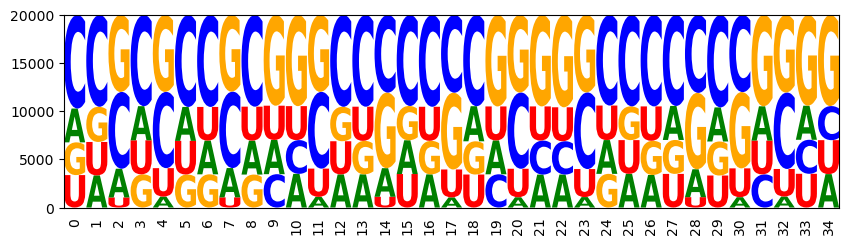

Neighbours: Weight = 5
1: UUGUGUACCAAGCCGACGCGCGGGCCACGUUGGGU
2: UCACGCCCCUGCUUGCCCCAUGGCCCCACCCAGGA
3: CAACGUCGCGUCCCCUUCCGGGGCCCUAGCCGCAA
4: CCGCCACGCGGGAUCCCCCGCAAUCCCUGCGACGG
5: UCGCCAUCCGACUUGUUUCGCUUUUCACCCUGGGG
6: CUGUGAAGUGGCCAGCAGAAGGGGUACACCGUGGA
7: CCACCCAGGUACAACACGCACGAUCAUCGCGUUUG
8: CAGCGACGCGUGAAGACCCGCGACUUUCGCGUGGG
9: UCGCCCCCCGGGACGUCGUGUAGGACCCGAUACGA
10: AACUGCUGAGGCCCCCCCCUCGGUCACCCCCGCGG
11: UUGCCUCAUGGCACCCCCCGGGAGCCCUGACUUGG
12: CCCCGCUGCAGGACCAACCGGUGCUCCUGUUGCGG
13: UUCCGCCCAGACCCCCUCUGCGUGCUCACAUGCGG
14: CCAUGUUACUGCCAGAACAAGGGGUACCGCGACGG
15: CACCCCCCCUGCCCCCCCCGGGACCUCCGCCUCGG
16: CCAAGACCAAAGCCGAAGUGCGGUUUCCCCCGCUG
17: CCCCCACCCGGGACGUCCUAUUGCCCUCCCCACGU
18: UCCCGUCGUGGCAUCCCUCUCGGCCUCAACGUCGG
19: ACGUCCAGUAUGCAGUAGCGCGGGACCUGAUUGGA
20: CUCUCACGAUUUACGUCGUACAGGUCACGCUUGUU


/home/elena/miniconda3/envs/myenv/lib/python3.10/site-packages/logomaker/src/matrix.py:584: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  counts_df.loc[:, c] = tmp_mat.sum(axis=0).T


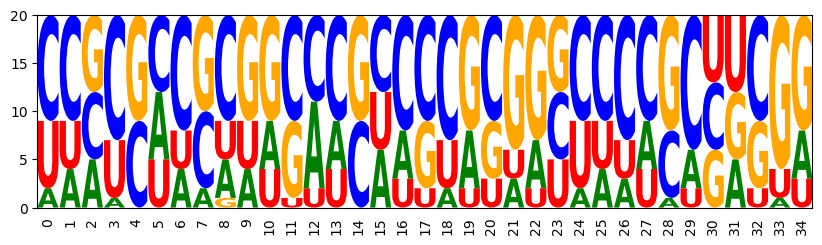

Neighbours: Weight = 10
1: CAACGCCGCGGGUCCCUGUGGGUUCUUUGAGUGGA
2: UUCUCCCGCUUGAUACCCUGCGGGCCAAGCCAGGG
3: CCGUGCCCUUAUUUCCCCCGCGGCCCUCGCGGGGU
4: UCCCCCAGUGGCCCGCAGUGGGGCCUCCCCGGGAG
5: CAGCGCCAAGAGCCGACGCGCGUCACACCCGGCGU
6: CCACUAUGUUGGCCGCCGCGUUUGCCACGCUGCGG
7: CUGCCCUCAGGGUUCUCUAGGGGGUCACCAGGGGG
8: CCGAUUCCAGGCACCUCGCUCGUCCCCCCACGGAG
9: ACGACAUGCUGGUUCACCCUGGUCCACUGACGCUA
10: CCCCUUUGUGGCAUCCCGCAGAGGUACCCCGGCUG
11: UCCCGACCAUAUAAGCCCCGCUGGCACCGCCGCGU
12: CCCAGAUCUUUCUACUCCAUGAGCCUCCGCCGCGG
13: AUACCCCGAUGGCAGCAGCGCGGGCCUCCUGGCUU
14: CACCCCCACGGGCUGCUCCACUGGUAACCACGUGG
15: CCACGCAGCAACUCGCAGAGGGUGCCACGACACGA
16: UCACGAUACGGCUAGCCCUGGGGCUCCCGUCGCGA
17: AUACUCUGUGGGACCCUCUGGAUCCCACGCCAGGA
18: UUGCCCCCCAUGACGUACAGUGACCUCCCUCGCGU
19: ACGACCCCAGACCCGCCGCGUAGCUCCUCCUGCGG
20: ACCCGCCGCGGCCUGCACAGGAUCCCCUGAGUUGU


/home/elena/miniconda3/envs/myenv/lib/python3.10/site-packages/logomaker/src/matrix.py:584: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  counts_df.loc[:, c] = tmp_mat.sum(axis=0).T


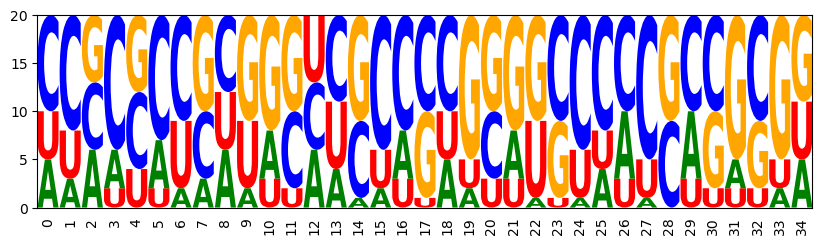

In [23]:
#Positive weights

rna_sequences2=[]
iterations = 20000
weight2 =1

curr = sample_init
print("Neighbours: Weight = 1")
for i in range(iterations):
    neighbour = neighbour_optimize(model, curr, weight2, n, m)
    rna_sequences2.append(rna.ass_to_seq(neighbour))
    print(str(i+1) + ": "+ rna.ass_to_seq(neighbour))
    #curr = neighbour
    
#print(rna_sequences4)
opt_draw_logo(rna_sequences2)

Neighbours: Weight = 5
1: CUGCGCCACGUGUACACCUGUGGUUCCACUCGCGG
2: UACAGCCCAGAUCACAUCAAUGGUCACCCCGUGGG
3: AAGCCUAGUGAGCCGCUCAGGGGUCCACGAGACUU
4: CCCCGCCCCGUCCCGCCGCGCGACCACACUGUUAG
5: CAGUGCAGUAUCACCCCCAGGAACCCACCCCUCAG
6: CCGUGCCGCAGCCCAACCCACGGGUUCCGCGGCGG
7: CAAUGCACCAAGCCGCCUCAGGUCCCUCGCCGCGU
8: UCAUUCACUAAGCAGCUGUUGAGCCACUAUGGGGG
9: CCCCCACGUAGCCAGCAGCGGGUGCAUCGUGGCGU
10: CCAAGUCGCAGCCCCCUCCUCUGCUACAGCCAGAG
11: ACGCCCCCUAACCUGCCGAAGGUGUCUCACGGCUA
12: CCAAGCUCCGGGAAAAACCGCGUGAACCCCCGUGG
13: CUCUUUAGCAAUUUCUUGAGGUGCCACAGCCUCGG
14: AUGCGCCCUGGGCCCCUCCGGUGCCCCCCCGAGGA
15: CCGCGUCCCGAGAACCCCCGCGUGACUCACUUCAG
16: CUCCGACGUUGCCCGACGCUCGUGUUCCGCGGCGG
17: ACACUACGCGGCAUCCCUUGCGGCAACCGUGACGG
18: AUGCGUAGUGGGUAGCACCGGAGCCCCUGCGGGGG
19: ACGACCCGCAGGCUCUCGCGCUGCACCCCCGGGGU
20: CCCCCAACCGGCCCGCAGUUGGGCCAUCGUCGCUG
21: UCCAUUACAGGCCAGCCCCGCUGCCACCCUGGGAU
22: UCCCGCAGCGGCCUGCCCCGUGUUCUCACAGUCUA
23: CAAUGUCGCGGGCCGUCCAGCUGCCCUCAUCGCGG
24: UCACCCCGUGUGCUGCACCUGUGCCAAAGAGGCUA
25: UCCUCUCCUAUGCCGCACUGGA

211: ACGCCUAGAAUGCCCUUCGAGUAGCAAUAUCGUGG
212: AUGACCCGCGUCCAGUCGCGGGGGCCUCGCUGCAG
213: CCGAGCAAUAUCUCCACCCAUGGCUCCCCACGGGA
214: CCCCGCCCCAGCACCUCUCUGGGCCUCCGCUGUUU
215: CCGCGCUGCUACUUCUUGUGGGGGACACCUCGCAG
216: CUCCUCUCUUGCCCCCGGCACUACCACACCGGGGG
217: CCGCCCUCAAGGAAGCCCUUCAGGACCCCCCGCAA
218: CAAUCAACCGGCCCGCAGUAGAGGACUCGCCGCGU
219: ACGCCCUAAUGGCACCACCAGGACACCCCCGGCGU
220: ACCCGCCGCAGGUUCCCGCGCAGUCUCCAAUACGU
221: CCCCCCCGUGGUCUGAUCUAGGGGCUCCCCGACGG
222: ACACUUCCCGGCCAGACGCUCGGCCACCCCGUGGG
223: CUCCCUACCGAGCCGCAGAGAGGUUCACAAGGGAG
224: AACCGUCCCGGCCUGUCGCGCGGUACCAGAGGGGG
225: AUCAUCCCCGGCCCCCAGUGGGGGUAUUACGAGAG
226: ACGCCCUGCUACAUGACUUGCGGCAUAUGCUGGGG
227: UUGUUACCCAGGCACUUGCUGGGGACUCCUGUUAG
228: UUGUCUCACGGGAUCCUCAGGAACCAUACCCUCGG
229: CCCCGCCCCUGCCCCCCGCGGAGCUACACUGGCAG
230: UACCCCUCAGGCACCAUCAAUUUCCCCACCUACUG
231: ACCCGCACAGGCUCGCCCUUCAUCCCCCAUGGGGG
232: CAAUGUCCUAACUUCUCCAUCAGGCCUUGAUGGUA
233: CUGCCUCGAUGGCCACCGCAGGUGACCUGCGAUGA
234: UCGCGCUGCGGGCCGCAUAGGUGGCCCCCAGAGUG
235: CUGCGACCCGA

428: ACCUGCAACGUCCAGCACUGUGGCUCCUCCCUGUG
429: CUGCGUCGAGAGCCGCAGCGGGUCACCCGUUGGUG
430: ACGCCUUAUGAGCUCACCUUGGGGCCUCGAGGCGA
431: ACGCUCCGCGGUCAGCUGCACGACCCCUAAGAGAG
432: CAAACCCCCGAUACGCCGCGGGUGUUCCGCGGCGG
433: CACCGCCGCGGCUCACAUCUGGGCCCCCGUCAGUU
434: UCGCCCUCCGAUCUCCCGCGCGGGAAACGUCGCGG
435: CCCUUUCGCAGGCAGCCUCACGAUUCACGCGGGGG
436: UAGCCCACAGGGACACCCCGUGACCCCCCCGACAG
437: UAGCCACGCGGUCCGAUGCGGGUCCCACGAUGGGG
438: AUCACUCAAGUGCACCUCCGGGGGCUCUCACUGUU
439: CCACCCCGCGACCUCUUUUGCGGCCCUAAAGGCAG
440: UCGUUUUGCAGUCCCCCCCUCGACCCCCGCUUGGA
441: CUCCCCUCCAAGUCGACUUUCUUUCAACGCGGGGG
442: CCGCCACGCGUGCCGUCGUGCUGCCCCUCUCGGGU
443: CCCCUUCACGAGCAGUCCCGUGUGCUUAGUCAGGA
444: ACAACAACCAGCACGCUUAUCAGCUUCCCACACGG
445: UUCCCCCGUGGGACGCCGCUGGAGACACGCGGGAA
446: AUCCCUCCUAUGACCCCCCAGGGGCCUCGAGGCAG
447: UCCCCCUGCGGCCCGACGAGCGAUCCACCUCUCGG
448: CCCCGUUGCGUGCUAUCGCAGGGGCCACCCUGCGA
449: CCACGCCACAUGCCGCAGUGCUAGCUCACCGGGUG
450: CACUCUCCUGACUAGAAGCACGACCCUCGCUACGU
451: CCGCUUCGUGACAACAUCCAGGACCCCUGUCGGGU
452: ACCCCCCGCUA

641: CUGCGUUGCUGGUCACCGAACUUUCACUCAGGCGG
642: CCCCUCACAUUGCUGCUCUGCGGCCCUAAUGGGGG
643: UCGCCUAGCUAGCCCCCGAGCAGCUCCCCUCGCGG
644: CAGCGCUACUGGACGCCCCGGGUCACCAGCCGGGG
645: ACGUUCAACUGCCUAACCCGUGUGACCUCACGUAG
646: CUGUCCAGCGGGUUGCACCUCGACCAACCACGCGG
647: CCGCUCCCCGAGCCACAUCGCGGGCUCCCCCUGGU
648: CCGCUCACUGACUCCUCGCACUACCCCCCACGCGG
649: CACUGCCGUGACCCGCCCCCCAGGCCCUACCGGAU
650: CCGCCCCGUGAUCCCUCGCUCAGCCUCAGUCGCGG
651: UUCCCUCCCGAGUCGCCGCGUGACCAUCCCGGCGG
652: UCCCUACCAGUGCUGACCCUGAGCACCACCGGGGU
653: UAGUCCUACGGGCCGUCGCUGUGCUCCACCGGCGG
654: CUGCCAACCAGUACGUCGCUCGAGUCUCACCGGGG
655: CCGUCUAACGGCCCCCACUGUGACACAUGCGACGG
656: CUAUGCCGCAAGACGAUCAGUUGGCAACACGGUUU
657: CCCCGACCCUGGCCCCCUCUCGGCCCCCCCGGCGA
658: UCCUUACCAAUGCCCCUGUGGUUCAUCCGCCGUGG
659: CCGCCCCCAAAGCAACCGUUGGUUACCUACCAGGG
660: AAAUUCUGCGAGAUGCAUCGUAAUCCCUGUCUCGG
661: CCGUGCCAAAGUACGCCGAGGUUUUAACCAUGUAA
662: UCCACCCCCGUGCAGAACCGCGGGCACCCCCACAG
663: AAGUCUCCCGUGACGCCCCGGGGGCCCCGCGGCGG
664: UCGCGAUGAGGCCACUCGCGGGGCCUUCAUCUUAG
665: UUGCUCACCGG

842: CACCGCCCCGUUACCACGCACGGGCCCUGAGGGAU
843: CUCAGUCCUAGUACACCGCAGGGGCUCUACCGGGU
844: CUCCGUUGUGGGUCACGCUACGAGCCCUAUGGUGG
845: CACCGCCGCGGGAUGCUGUGGGUGCAUAGUCGGGG
846: UAGCGCCGCAUCCACACCUGGUGCACCCGCCUCGU
847: AACCGAUCUUUGCCAAUGCUGGGCCCCCGCCGCAA
848: CUGCUCCGCGACUUGACUUUCGUUCACUCUGAGGG
849: CUCUCCCGCGGCCCAACUUACAGGACACCAGACGG
850: CCCCCCCGCGGCAAGCCUAGGUUUCCUAGCCUGGG
851: GCGCUAACCAUGUCCUUGUACGGGCCAUCAUGUGA
852: CUCUUCUGUAAGUCCCCUCGCGGGCACCGUGACGG
853: CCCCGUCAUAUCCUGCUUAGCUGCACACGAGGCAG
854: AAACCACCCGAGAAAUAGCAGGAGACCUGGCUCUG
855: UCACGACCCAACCCGCCCCUCUGGCUUCCACACAG
856: AAGUCACGCGAACCGCCGUGUUGCCUCUAAUGUUU
857: CUCAGCUAUGGGUCGCAUCAUUUGCCCCGUGACGU
858: UCACCCCGCGAGCCCCCUAACGGCCUCACAGUGAA
859: AUACUUCCCAGCCCCCCCAGCGGCCUUCGAGGCUG
860: CGAUGUCCAAUCUAACUGACGAGCCCCAGUGGGGA
861: UUCCUAACCGGGACAUCGCGGGAGCUCAGCCGGGU
862: CUGCGUAGAAGCCAGUUCCUCUUCUACUAUGGCGG
863: CCGCGCCGAGGUCCCCCUCGGGGUCCCUCCUGGAA
864: UCACGCCAUGAGAUACCCCACUUGCCCCCUCGUUG
865: AUCCCACCCGGGCACCCCCGCGAGUACACCCUCGA
866: UAGCUCUGCGG

1048: UCGCCUCGCAGCUUGCCGCUCUUGCACAGCCGUAU
1049: CCCACCCCCGGCAUGUACCGCGGCUCCCGCCGCGG
1050: ACCCCGCGCGGCCAGCCCCUCAGGUCCACCGGUGU
1051: AUCCUCCGUGGUAUCCUCCCCGGGUCUACAGUGGG
1052: ACCACUACCAACCCGCCCAGCGUCCCUCCUCGGUG
1053: CAGCGCUCAGGCUAGAUCAUGAGGCACAGAUGCGA
1054: AACUUCCGAACCCCCAUCCGCGUGCUACCCCGGGG
1055: UCGCGUCGCUAGUCCCCCCAUUUUCUCUGCGUGGG
1056: CCGACACCAGUGCAGUUCAGCAGGCAUCCUGGGUG
1057: AUACCCACCAGGCCCUCUCUGUACAAUCGCGGGAA
1058: UAGACACCAGGGCCCCCGCGUGAGCCCUCACGGGA
1059: CCCCUCCCUGUCAUGCUGAGCGGCCUACCCCGGGU
1060: CCCUCUAGUAGCUCGCCCCGUGGCUAACGCCGUGG
1061: ACCACCCCUUGUCUCACGCACGUCCCACCCGUGAG
1062: ACCAGCUCCGUCAAGACUAGUGACUCCAGCGAGGG
1063: CCCCCUACUGAGACAACUCGCUGCACCCCUGUCGG
1064: CCGUUCACCAGCCAAAAGCUGUGCAUUAGUUGGAG
1065: ACACCCCCCGGGUCCCCCCGGGUCCACCGCGAGUU
1066: CCAUCCCCUGGUCUGCCCCGCGUGCCAACCGGCGG
1067: CAGCCUCCCGGCUCCCUGAGGGGGCCCACUUAUAG
1068: CUCAUAACCAUUCCGCAUAGGGGCACCUGCCGGGG
1069: ACGCUCUCUGGUUAGACUAGCUACCCACGCUAUGA
1070: CUCCGCCCCGGGACCCACAUGGGCCCCCCAGGGUG
1071: CACAGGAGCGUGCCGUCCAGGGGGCCUC

1258: UAGCGCUCAGUGACCCUUCUCGUCCCCCCCCGCUG
1259: CAGCUCCGUGGCUUGCCUCAGUGGCCCACCUGCUG
1260: CUCCCCCGAUGCACCCAGAGCUUGCUCUCACAGUU
1261: CACCGUUCAAGCACCACGUGGGACGACACACGCUA
1262: UUGCGAUCAUGCCCCACUCAUAAUCCUCCCCGGGA
1263: CCCCGCCCAGUGCCGACGCGCGACACCUCACUCGG
1264: CAGCGCAGAGGGCCGUCACGCUGGCUACGAUGGGU
1265: ACCCGCCCGGACCUCAUGAUCAGUAACCCCUACGG
1266: CACAGUCGAAGCCCGUACUGGGGCCCCCCCGUCGU
1267: CCACCAACCGGGCCGAAGUUCGGGCCAUGCUGGGG
1268: CCCCGAAAUUUGCCGCCGCAGGGCACCUGCCGGAU
1269: CCGUGACACAGCCCGCCCGUCGGCUCACGCCGUAG
1270: CAAUCCCCUGGCCCCCCGCACGGGCCUCGCGAGGG
1271: CCCUCCAGCUAGUUCCAGUACGUCCUCACUCUCGA
1272: CCCCCACCAGGCCACCCCAGCAGCCACCCCUGGGA
1273: CCCCGUCGCAUGCCCAUCUGCUGUCAACGCCGUGG
1274: UAGCUCCCAAGGAUGUACCGUGGGUCUCGUGUCAG
1275: CCGCCCCCCGGCUACUCGCUUGUCCCAAGCCGGAA
1276: CACACUACCUUGCUGCCGCGCAAGCGACCCGGGAG
1277: UCGCGCAGAGGUCCCCCCCUCGACACCCGCUGGGG
1278: CCGACCCGCUGGCCGCUCUUUGGGCCUCGCUGCGG
1279: UUACCCCCAGGGACGCAUCACGGGCCCCCUGACGA
1280: CACCCCAGCGUGUCCCCGUGUGGCUUCCGUUUGGG
1281: CCGACAACUAUGCACCCUCUCGGUCCCC

1456: CUGCCCAACAGGACACAGUGCUUGCUCAACUAGUU
1457: UACUCACGAAUGCUCCCCCUCAGCCUAACACACGG
1458: CCCAUCCCAUGGCUGUCGAAGUGCCUUUCCGUCUG
1459: UCCCGCUGUAGCAUGCUCAGCGGGACUCCCCUCAG
1460: UACAGCCGCGACCCCCCCAACUUCAUCACUGGAGU
1461: ACCUCCAGAGGUCUCCCCCGUGUGCACACUCGCUA
1462: CCGCCCCGCGGCCCAUACAGUUUCCCCCCCCGGGG
1463: CCGCUUUCCUAGCCACACCGUAGGCCCCCCGGGUG
1464: ACCACCCCAAGCCUCCCUUGCGGUACCACCCGGGG
1465: CACCUUCGCGGUCACCAUAUGGGUCCUACCCGGGG
1466: UCCACCAACGUCCACUCCUGGGGGCUCAGCGGUAG
1467: CCGCCACGCGAGCCCUAGAUGAGGUACCGAUGCUA
1468: ACGACAUGCGGGCUCUUGCGGGUGCUCCGCUACAG
1469: UUCCUCCCAGAGUCCCCUUGUUGCACCCCCCGCAA
1470: CAACCACCCUUGCCGUCCCUGAGGACCCCCCGCUA
1471: CCCUCUCACGACCCCCCCCUCGGCCAUUCCUACGA
1472: CACCGCUGCAGGCCGACCCGGAUCUCCAACCGGGG
1473: UCCCCCCGUGGGCAGACCCGUAGCCUUCGUCUGAU
1474: CUGCGACGCGGCCAAACCUUCGGUUCUAGUUGCGA
1475: CCGCCCAGCUUGCUCUCCCUGUAUCCAACUGUGGU
1476: CUCCCCUCCAGCUCAUUCAGCAGCCCCACCGACGU
1477: UCGUUAACUGAUCAGCGCAGGGGUCCUCCCCACGG
1478: CCGCCCACAGGCCACCAUUGUUGGCCCCGCUGGAU
1479: CUCCCCACAGGGAUAUCGCAGGAGCAUU

1653: UUGUGCCGAAGCCAGCCGCUCGGCCCCCCUGAGGU
1654: UAACGACGAAGGUCGCCGCGCGGUCCUUGCCGGUA
1655: CCCAUCACCAGGCUGUUCAGUUGUUUUACCGGGGA
1656: UAGAGAAGCGUCUCCCUCCUCGGGCUACCCUAGGA
1657: CUGUGCCGCGGGUACCCGCGGGGGUCCACUCGUAA
1658: CCCGCCCGAAGUCCGCUCCGCGGCCACAGUGUGGA
1659: CCCACACGCGGUCCCCCUCGCAAGCCACCCGAGGG
1660: CACAGCCCAAGGACGUACCACGGCACACGCGUCGG
1661: UAGCGUCCCGGGCCAUAGUUGAAGCCCUGUUGGAU
1662: CCGCCCAAUGGGUCACUCAGCGGCACUCCCCGGGA
1663: ACGACACCAUGGGCGCCUCAGAGCCCCCCAGAUGG
1664: UCAUGCUAAGGCCCCCCCCGUGGCACACAUGGGGA
1665: CACCCCUCUGAGCCCACGUACGACCACCGCGGGUG
1666: UAGAGACGCAUGUCCCCGCGGGGUUACCGAGGCGG
1667: CUAAGCCGAAGGUCCCCGCUCGGCCACCCCCGCGG
1668: CCAACCCGCAGCCUCAUCAAGGGGCUCCCCCUGAG
1669: CCGCGCCGUGGCAACCUGCGCGUGACCCGUUGGAU
1670: UCACGCUGUGGCCUACCUUGCAGCACAUGCUGCGG
1671: UCCCGUCGCAAGUAGCCCCGCUGUCUCCGCCUUUU
1672: CAAAGCCGCGGGCCGCCGCAGAGCCCAUCAGGGAG
1673: CAGCCCCGAGGUCCGUCGCUUGGCAUCUCCUGUGG
1674: CCAUCUCGAGAUCACUACCGCGGGACCCGACUGGU
1675: CAAUGCAGCGGCCAGCCGCGGAACCCCCGCUGUGA
1676: UCCCCCAGCUUCUACCCCUGCUGGCUCC

1863: UCGCCCUCCGACCCGUAGUGCGUGUCAAGACGGGC
1864: UCAUGUCCCUGCAAACCGUGUGGGCCACGCCGGGG
1865: CUGACACGCAGCCACCUGAAGGACCCACCACAUGG
1866: ACGUGCCCCGGGCCCCUCCGUGAUAACCGUCUCAA
1867: CCGCGUACCAAGCCGACCUAGGGCCCCUCCCGGUG
1868: ACGCGUCAAUACCCCCUCAGCAUCUAUCGCUUGGG
1869: AAACCUCACGGCCUCCAGCGCUGGUCCUACCUGGU
1870: CCCCGUUAAGUCCACCCCCGGGACUCCACUGGUGG
1871: UUAUGUCAAGGGCCAAAGCGCGGCCCCCGCUGCGG
1872: AAGCCUUGCGGCCCACCGUUCGGGUUACCCCGGUU
1873: AAGCUUUGCUAGCAGCAGAGUAGGUCCCAUUUUUG
1874: CUCCCCUACGACACAAAUAGCAUCCUCACCGACGG
1875: CCGUCCCCCGGGUCGAUCCAGAGGCAUCCUCAGGA
1876: CACCGUACCAGGCUACACAGCGACCUCCGAUGCGA
1877: CCCUGCAGCUUCUUCAUGCGCGUGCACCCCGUGAG
1878: CACCCUCGAAGGCCGCUCCGUGGCACCCGCGAGGA
1879: UCGCUCCGCGACCAGAACUUCAAUUCCCCCGACGG
1880: UCGCGCCCCGACACGCCGUGCAAGCCCCCACACGG
1881: UAGCGCCGCAGGCCACCCAGGGGCCAUUGCGGGGU
1882: CCCCCAUGCUUCACGCAGCGCGUUUCAUGUGGGGG
1883: AAACGACCCGGCAUCACCCGGGACCACCCUCUGAG
1884: CUCCGCAGCAGUUCACACAACUGGCCUUGCGUCGG
1885: CAGCGUCAAGGGCCGCCUAAGUAGCCCCCUGGGGG
1886: CACCUAUAAGGGAUGCCGCGCGGUUAAC

/home/elena/miniconda3/envs/myenv/lib/python3.10/site-packages/logomaker/src/matrix.py:584: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  counts_df.loc[:, c] = tmp_mat.sum(axis=0).T


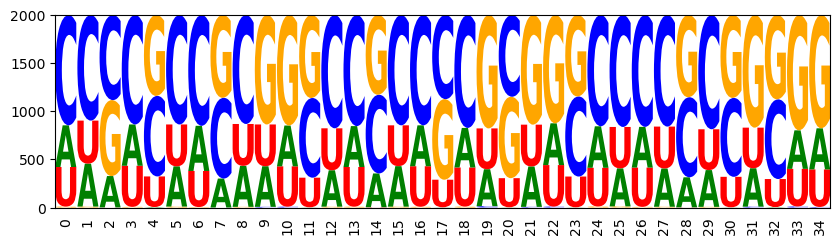

Neighbours: Weight = 10
1: AUAUGUUCCGGCUCACCUCAUGUGUCAUGCCAUUG
2: AUCCGCCACGAGCCCACUUACGGGCCCUGCCGGGA
3: AUGCCUCGCAACCUGACGCAGUGGCCCCGCGGGAG
4: UUCCGUCCCGUUCCCAAGCAUGGGCCUCCCCACAA
5: CUCUCCCGUGACUCCACCAGCGGGCUUAACCACAG
6: ACCUGACCAGGUUUGACCCGCUGUAUCCGCGGCGU
7: AUGCCCACCAGCUCAUCGCUUGUGCCCCCUGAGGG
8: AAGCGCCCCGGGACCCAGCACGUCAACCCUCGGAA
9: CCGCCCAGCAGGCAGCCCCACGGGCCACACCGCAU
10: ACACCCUCCGACCCCCCGAGGGGCCCUCCUGAGUG
11: CCGCGUCCUUGCAUCAUGCGUGUCCCUCGUGACGG
12: UCCAUCUGCGGCUUCUUUCGCGGGCACACUCAUUU
13: CCACGCCCAGGCUCCCAGAGGAGUUCCCCCGGUGG
14: CUGCGACGAGGCUCCCAGAAGUGGCCACGCCACGG
15: CACCGCUGCGUUUUCCCCAUGGAGACCCCUUACUG
16: CCCCGCCGUGGCCCGACCCAGUGCCUUAGCCGCUG
17: UCCACUCAAGUCCACAAGUUGAAGCCUCGCGACUU
18: ACACGACGAGUUCCGUUGCGCGGCCCCUCCGGCAU
19: UUGUGCCGAGAGCUACCGCGCGUGCCUCGCUGUAG
20: CAACCUUACAGCCCGCCGCGCUGGACCUGUGACGG
21: AAGUCUCGCAGCACCCCGCACGGCACUCGAGGCGG
22: CUCCUCCGUGGUACGCCGAUGGUUCCAUGUCACGG
23: CCGCCCCGCAUGUCCACGUGCUGGCCCACAGGGUG
24: CCCACCCAUGGCACGCCGCAGGAGACACCUUGUGU
25: CCCUCCCCAUGCUACCCCCGC

219: CUCACCUCUGGGUACUCGCGGGGCCUCCGACGCGG
220: CCACCUACAAAUCAGACUUUUGUCCACCGAGUCAG
221: CCCCGCUCAAACCCCCCGAGCGACCACCACGGGAA
222: CCCCCCUACAGCCUGCCGCGGGGCCCUCGUCGCGG
223: CCCCGAUGCUGCCUACUGCGCGGGACUCGUCUGUA
224: CCCCCUCCCUGCACGCAGCUCGGUUCACCUCACGA
225: UCCACCUGCGGGCUACCCCGCGGGACCACCGGUUG
226: CCCCGUCCAGGGCUCCAGCGGUUCAAAUGCGAGUA
227: ACGCUCCGUGGGACCUCGUGUUGCUUCUCCCUUGG
228: ACGCGCACCAGCUUGCUCCUUGGCAUCAGCGUGUG
229: UCCCCCUCUGGCCUGCCCUACGUGCCACCAGUCGG
230: CCGCCCCCAAACAUGCCCUACAUGCCCCGAUUCAG
231: CCGUCUUAUGGCCCGUCCCGCAGGACACCCGACGA
232: CCCUCACGAGAGCAGUCCCUGGAGAUUACCCGCGG
233: ACGCCACCAGGCCUGCCGUGGGGCCCUCGCGUGGU
234: CCCCCUCGUGAGUUGCAUAGCAUCACCCGCGGGGG
235: CAACCCCGAGUGCUGCCGAAGAGGCCCCGCCUGUG
236: CACUGUCGCUGCUUGCCGCGGUGUUACCCUCGCGU
237: CCGAGACGCGGGCCGCCUCGGAUGACAUAUUGUUA
238: ACGUUCUCAAGGUCCUUGUUCAGGCUCAACCGCGG
239: CUCCCCAGCGACCCCUCUUACGGCCCUCGACACUA
240: AACACCACCGGUCCCCUCAGUGUGCCCCGUCAGGG
241: UUAUGCAGCAGGUCGACGUGCGUGUAAAGCGGCGG
242: CCCCCUCGUGACCAGCCGUGGUGCCCAUACGGGUG
243: CCGUUCUGUGG

420: UCGCCACGUGACCUGUCCCGCGGCCCACGUGUCGU
421: UCCCCCCGAGGGCCGUCGCGCUUCACCUACCUGUU
422: CCGCCCCCUAAUAUGACCUGCGUGUACACAGGCGG
423: CAGCGCUCCAGCCCAACCCGGUUUACCUAUGUUGU
424: CUAUGCCGCGGGUCGAUGCACGUGACCUACGAGGG
425: UCCCGCACCAAGCCAACUAUCGGGCCUCCCGGCGG
426: CCGCUCCGUAUGCCCCCCCAUGACCUUUAAGGCGG
427: UCGACCUCUUGGCCAAUGAGGUGGCAACCCGGCGG
428: CCCCCUCACGUGCUCUUGUAGGGCUCCUAUCUCGG
429: UCGCCCCCUGAGCCCCCCAGCGAGCCCCACCGGAG
430: AAGAGACCAUGGUUACACAGUGACUCAUGCCUCAA
431: UCCAGACCAGGUCCGCAGUUGUGCCCCAACGACAG
432: UACUGUCACGUUCAGACCCUGGGUCCCUCCGUCGA
433: AAGACCUCCGACCAAUCCUGCGAGCUCCCUUUCGG
434: UACCCCCGAGGGCCGUAGCGGUUCCCACGAGGCAG
435: CAGCCACGAGGGCUGCCCAGUUUGCUCUCUCGGAG
436: CUCCGCACUUGUCCGUACAUGGGGCCCAACGAGGG
437: ACAAGCCGCUGGACCACUCGCUGCCUCCCCUUGUG
438: AUCCUUCGCGGCCCCCCGCACGGGCCCCACCUCUG
439: AAGAGAUCAUUGCAGCCUAGCUUCCUACCCCAGGA
440: ACCCCAAGCAACCUACAGUUGGGCCCUUACGGCUA
441: CUCUCUAGAGAGUCCUCUCGCGUCUCACCUGGGAG
442: UUCCCCAGCGGGCCCAACCGUGGGCUACGUGGCGG
443: UUCACCUCCUAGCAACCCAGCAUGCCCCACGGGUG
444: CCGCGUUGAUU

623: CUACGCUCCAGUCCCCCGCUUGUCCCCUAAGGGGG
624: UCGUCACGAGUGCUCACCCUGUUCCCCAGCCGUGU
625: UACAUCCACGGUUAGCCCUGGAGGCCACGCUAUGA
626: CUCACCCCCGAGUUACUGCGGGGCCACUCCGGGGG
627: UCAUCACCAGGGCCAUCGCGCAACCCCCCAUUGGG
628: CUCCGCCCCAACUACACUCAGAACCCACCCCUGGG
629: UUCUGCCCCGUGCCCCCUCGCGUGCCUCGUCGCGG
630: ACGCGCCCUGGUCUCACGCUGGAGCCAUACUUCGA
631: UCCCCUCGCUAGUUGUUGCACAGCCCCCGCUUGGG
632: CACAUACGAAGGCAGCCGUGGGGGACCAGAGGCGU
633: ACGCGCCCCGGGCAGACUCGCAUUUUCACCGGCGA
634: CACUUACCCUGGCUGAUCAAUGUCCCCCGAGAGGG
635: CCCCGCCGCUGGCCCACUCGCUUCCCACGCGUGUG
636: AUCACUCCCGUGCACCCGUGGGGGCCUUCCGAGUG
637: ACGUGCACCAUGCUCCCCCUCGGCUUCAGCCUCUG
638: CUCCGAUAUGGUCCGCCGUGCGUUCUCCCCGGUGG
639: CCGUCCCCCAGUCCACCGUGCGACCAUCGCGGGUG
640: CAGACACAAGAGCCACCUAACGGCCCACGCGUGAG
641: UACCUCAGAAGCACGCACCGGAUGCUCCACGGCUU
642: CCCCGCCCCGUCCCGCUGAUCGGUACCCCUCGCGG
643: CACCGAUGCGUUCUCCUGAUCGAGACCAGACGGAU
644: CACCCACCAAUUCCAUACAGCAAGCUACCAGGCGG
645: CCGUGCUCCUGGCUCCAUCACGGGCUCCCCCGGUG
646: ACGCGCUACGAGACCACCCGCAGCCCCCCAUGCGA
647: ACGCGCACCAA

835: CUCCUCUGCUGCCCGCUCCUCAGGCUACCCGAGGU
836: CCGAGCUGCGACCCCCUUCGGAAGCACCCCCUCGU
837: CCAUGCACCUUCACGUCCUAGGUCCAUAGUCGCUG
838: AUACCCCCCUGCCCGCCGCUGGGUACCCCCGUCGG
839: CUACGUUGCGGGUCCACUCGCGUGCCCAGACGGGG
840: UCCCCAUCCGGCCCGCCUCUUGUCUUUCCUGUGUG
841: CCCCGUACAGGCCUAACGCGCGGGUUACAACACGU
842: CCGCGCCGCAAGCUACCGCUCUUCCCCCGCCUGAU
843: CACCCCCGAAGUCCGACGCACGGUCUUAGCGGCAU
844: CCGCCCCCCGGUCACUCCCGUGACCCCCGCGGCUG
845: CCGCCACCCUGUUAGUACAGUGGCCCACCUCAGGG
846: AACCCCUCAAUGACCCUUCGGGGCCUAACCGGGUA
847: CCGCGCCGCGUCCCGAAUCUUGGGUAUUCCCAGGU
848: CCGCGUUGCAGGCCGCAGAUUGUCUCACCACGCAG
849: CACAGACACGGCACCUCGCGCGACACCCCACUGGA
850: UUGCCCACUAGCACCACUCGCAGGCCCUAACAGGA
851: CUCUGUCCCUUGCUCCCGCGGGGGACCCGCGGUUG
852: CCCUCCCGUGGUCCAACCCGCGGGUCCCAACGGGG
853: ACGACUACCGGUCCGUCGUGGUGGCCACCUCGCUG
854: UCCAGCUAAGUUAUGCCGUGGGGUCAUAGCCAUUA
855: CUCCCCUGUAAUAUGCACCGGGAGACUCCUGGCGU
856: UAAAGCCCUGGCCCCUCUCACGUGCCCAGUGGCGA
857: CUCACAACUGGCACCUCGAACAGUCCAAGCCGGGU
858: CCCCGAAGUGGGCCGACGCGCGGCCCCCCCUGGUG
859: CCGAGCAGUAG

1047: CCGUCCUCUGAGCCCCCGCUCGGGAAAAACCGUGG
1048: UCCAUCCGCGGGUUGCUCAGUAGGCCCUCCCAGAA
1049: UCCUCCACUGUCCCGCCGUGCAGUUAAUCCGGGUG
1050: CCGCCAAGAGUCACCAUCCUGGGCUUCACCUGCUG
1051: UCCUGUCCAUUGACGCUUCGCGGGCCCCAACGCGU
1052: CCCCGUAGAAGCACGUCUCGCAGUCUCAGCGGGGG
1053: AACACUCCUGUGCUAUAGAACGACCCUCCAGGGGG
1054: CAGCGACGCUUUCUCUCCCUGUACCCCUAAGGCGA
1055: CCGUUCCGCUUGCAGCCUCGUUGUCCCACCGGCUG
1056: CUACGACGCGGGCCCACUAGGGUGCCCCACCUGAU
1057: ACGCCCCCCAGGCUGUCGCGGGUGCACCGCCGCGA
1058: UCCUCACCAGGCAUACAGCGCAUUCACUGCCAGUG
1059: CCAAGACGAGUGUCGUACAGCGGGCCCCGCGGUUG
1060: CCGCUCACCGGGCCGCCCAAGGAUCAAAGCGAUGU
1061: CAGAGCCCCAGGCCGCCCUGCAGUAAUAGCGAUGG
1062: CUCAGUUCAGGCAUACCGUGGGACCCCACUUGGUA
1063: CUGACCUGCGGGUCGCAGAAGAUCAUAACACGCGG
1064: AACCCACGCGGUACGCCCAGCGGGCCUCAACACAG
1065: CCACGCUCAGGGUAGCUCCACUGCCUCCCCUAGUU
1066: CACCGCCGCGAGAAGAUGUGCAAGUUCAGCUGCAG
1067: AACCUCCCCAGCACCUCCCUUUGCCCCCGCUGCGU
1068: CCGCUCAGUAGGCCGUUCCGCGGCAAAUCUCGGAU
1069: UUGAGCCGCGGGCAGUUUCAGGGGCCACGCGGCGU
1070: CCCCGUAGCAUCCCGCAUCGGGUGCUCC

1259: CCGCUCUACAACUCCCACAGCGUGCACCACCGGGG
1260: CACACCUGCGAGAACACGCAGUGGCCUCCUCGGGG
1261: CCGCGUCGCAGGCUACCCCACGAUUCCACUCGCUG
1262: UUGAUAACCUGCUACUUGAGCUAGCACCCCUGUGG
1263: CUCCCACCCAUCUCGCCGCUGAUCCCCCACUUCGU
1264: UUGCCCAAUUUGCCGCCCCGCUGGCCUCCCCGUAG
1265: CCCCCCAGCGGUCUCCCUCUCGGGACCCGACGCGA
1266: ACCUCCCGCGGCCCCUCCUGGGAGAUCCACCGGGG
1267: UCCUGUCCCGGCUCCUUGCUCGAGUAAUCCCACGA
1268: ACCCCUCCAUACCUGCUCCUGUAGUUACGACGGGU
1269: ACCCGCCCCAGCCCGCACCGCGGGCCUCCACUGGG
1270: ACGCGACCCAGGCCACUCCGGAACUCCCGAUGCGG
1271: UAAUGCCGUUGUUCGCUGCGGGGCCACCGCGGGGU
1272: ACCCGCAGUGACUCGCCUAGGGGGUUACACUGGGG
1273: CUGACUACUGGCUCGCCGAGCGUCCCACGCCUGGG
1274: AUCCCCCCUUGGCCGCAGCGCUGCUUCCCCCGGGG
1275: UCCCCCCGCGAUCCAACCCGCAUCACUUCCGGCUG
1276: CCACUCCGAAGUCCCCCGCGCAAGCCUCCAUUCGG
1277: ACCCCUAGAUACCCGCCGUUCGGCUCCACAGGGGG
1278: AACCGCUGUUGGCCCCAGCGCAGCUCCUGCGUGGG
1279: AUGACCAGCUGGCUACUGAGGGGGCCCAGCUUGUG
1280: UCGACUAGAGGGCCGACCCUCGUGUUCCGCCGGGG
1281: CCGCGCACCAGGUACUCGCGCGGCUCCACAGGGGA
1282: CCCACAAAAGGGCCCCAGAAGGGGACCC

1460: CAGCUCCACAGUCUCAUCCGCUUGCUUCCCGGGGA
1461: CUGAUCCGCGGCUUCCCGUAGGUCAACCGUCGCAG
1462: ACCACCCCCGGCCACACUCUCGGUUUCAGCCUCUG
1463: CCGCGCCACAGCCAGCUGCGCUGGCCUUGUGGGGG
1464: ACAUGCAGCGGGCCACCGCGUAGCCCCCGCCGGAG
1465: AUCCCACGCGGUAUGCUUCGGAGUCCACCUCGGAG
1466: CAGACCACCAGGUUGCCUCGCUAGACCAGAGUGAG
1467: CACCGCCCCGGCCAACCCCGCGGUUCCCCUCUGGG
1468: ACCUUCACCAGUAUGUCCCGUGGGCCCCCCGACUG
1469: ACACGCCCCGGUUAGACCCUGAGUCACUCAGUGGG
1470: CCAAGUUGCGAGUCGAUCAGCUGGUUACACCGGGG
1471: UACUCACCUUACCUCCUCAAGUUGUCUUACUGUGU
1472: AUGCCCCCCAUCUCGCCCUGGGGCUACCGCCGGUG
1473: UCCAGCUCCAGGCCGUCCCACGGCUUCUGCGGCGG
1474: CCGCCCCGCUGCACGCUCAGGGGGCUCUCCGUCUG
1475: CCGUGUCCUAGGUUCCCUCAUAACCCCCGUGUCGG
1476: CCGUGCCCAAACCCCUUGCUGGUGAACCCAGGCGA
1477: CCGCGCCGAGUUCAGAUCCGGUAGCCUAGCGUGGA
1478: CCACCUUACGAUCAGUCCCGCGGGUACACUGAGUU
1479: UACUUUUCCGACUCCCCCCACUGGUCCCCACGGGG
1480: CACACCUGUGGCCAAAACAGUAGGCUCCGCUGCAU
1481: CCCCGCCCAGGUACGCCCUGCGACUCACCAGGUAG
1482: CACACCCGAGGCCCGCUUCGGUGCCCCACCGGCGU
1483: CCCCGUUACGGUCUCCACCACAGGCCCC

1658: ACCUCCCCUUACCACACCCUGGUCUCCUCUCAGUG
1659: UAGUCACCCUUGCACACGCAGAACUAUCCACGGAA
1660: CUGUUCCCCGGGACGCAUCGCGAGAAUCCUGACUU
1661: CCCACCUCCGGCCAGACGAGGGGCACUCGUGGCGU
1662: ACCACAUGCAAUAAGUCCCGCAGCAAUUGCUGCGA
1663: CUACUCAGCGGUCUGCACCUUGGCACCUAUUAGGG
1664: CCAAGCCACGGCCCCCCCCGGGGGCCCCCCCAUGG
1665: UAGCCACCUGAGAAACCGAAGGGGCCCAGCCGCGU
1666: UCGCGUCGCUGGUUCCCCCGCAACAUCUGCGGCGA
1667: CAGAGACACAGGCCCUAGUGGAGCCACCGCCGGAA
1668: CUAAUCCGCGGUACCUCGCACUGGCCACGCCUCGG
1669: UAGAGCACUUGUUACUCGAGGUGCCACCGCGGCGA
1670: CCCUGUCCAAACCUGACCAGGUGGUCUCGCGUGUA
1671: UCCACCCCUAGUCCCUCGUACGAUUCACGAUUGUU
1672: CCGCCACGCAACACGCCGUACUGGCCCCCUUGCGA
1673: CAGCUCCAAGGCCUGCCGUGCAGGCCUAGCGUGGG
1674: UACACUCACUGGCACUCGCGGGGCACAUACGAGUG
1675: ACGCGCCACGGGACGCCUUUGGGGCCUCGUCGGGG
1676: CCCCCCCGAGGGCUAAACUGCUGUUCCCGCGUGGA
1677: AAGAGAAGCUGGACGCCCCACUGCUCCUGACGCGA
1678: CCCUGCUGUGGGACGUCGCUGGGCCCAUGCUUCGA
1679: UCCUUUUGAGGCUACCCUUUGUACACUAACGGGGU
1680: CCGCGCACCAACCAGCCCCUCGGCCUCCGCGGCGU
1681: UCACCAUCUAGUCCGAACAGUGUGCCCC

1858: CCACGCCCAAGCCUGACCAGUGGCCCCCCCGGUGU
1859: UCGAGACACUGGUCGCCGCACAACACACAUUGGGG
1860: UUCCGCUAUUACCACCCGUGCGAGAUCCGCCUCGG
1861: CAGUUCCCCGGCCCCCAGCGGGGGCCACCCGGCGG
1862: CAAUUCCGUUGGUCCCUGUGGGUCACCUGACGGUG
1863: CUCCCUAGUGUGCCAUCUUUGGGGUCAUGCCAGUU
1864: AUCCCCCACGAGUUGAUUAACGGGUCAAGUUGGUG
1865: ACACGCCGCUAGUCCUCGCGCGGGUCCCCCUUCAG
1866: CUGCUACGUGGCCCGCCCAUGGGUCCCUCCCGGUU
1867: AAGUCCCGAGUGACCCCCCGCGGCCCCAACUUCAU
1868: CUAUUUUGCGUCUCGCCCAGGGAUUAACCUUUGGA
1869: CCGUGUCGCGGGCCCCCCCGGGGCCCUCGCCAGGG
1870: UCAUGACCAAGUCCCUCCAGCGGCUCAAGUCGGGA
1871: CCAUGUACUUGCUAGUCCAGGGGGCCCAACCUCGA
1872: CUCUUUAGCGUUCUCAUGAGCAGGCCCCCCGGCAG
1873: CCGAGCAACGGCACAUUUUGCAGGCACUCACAGUG
1874: CCGCGCUGUGUGAUCUCCCGGGGGCAUCCAGGGUG
1875: CAGUUCCCAUGUCCCCAUCGUGGCCCCACCGGGUG
1876: UAGCCCUGCGACCCCCCCCGCUGGCUCACCCGGGA
1877: UCCUUCCGAUGCCAGUCGUUGUGGCCCAGAGGGUG
1878: CCGCGAAGUGUGAUCCAGAGCGGGCCAUAACGGGG
1879: CUGCGCCCCAGCCACUCUUAGUGGCACCCCGGUGG
1880: UUCCGCCACAACCCGACCUUGUACUAUCCCGAGAG
1881: CCCCGCAGCGGGCUCCCGUGCAGGCCCC

/home/elena/miniconda3/envs/myenv/lib/python3.10/site-packages/logomaker/src/matrix.py:584: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  counts_df.loc[:, c] = tmp_mat.sum(axis=0).T


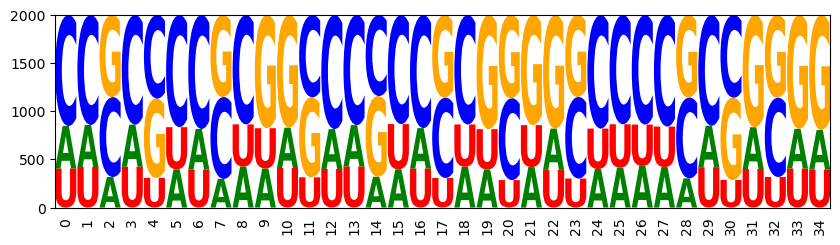

In [40]:
rna_sequences3=[]
iterations = 2000
weight3 =5

curr = sample_init
print("Neighbours: Weight = 5")
for i in range(iterations):
    neighbour = neighbour_optimize(model, curr, weight3, n, m)
    rna_sequences3.append(rna.ass_to_seq(neighbour))
    print(str(i+1) + ": "+ rna.ass_to_seq(neighbour))
    #curr = neighbour
    
#print(rna_sequences3)
opt_draw_logo(rna_sequences3)

rna_sequences4=[]
iterations = 2000
weight4 =10

curr = sample_init
print("Neighbours: Weight = 10")
for i in range(iterations):
    neighbour = neighbour_optimize(model, curr, weight4, n, m)
    rna_sequences4.append(rna.ass_to_seq(neighbour))
    print(str(i+1) + ": "+ rna.ass_to_seq(neighbour))
    #curr = neighbour
    
#print(rna_sequences4)
opt_draw_logo(rna_sequences4)

Neighbours: Weight = -1
1: GGUGCGGCACCUGUCUGGGCCCUGAUGGUGGCCCC
2: GGGCAACCGCGCGGGGGAGCGCCGUGGGCUAUUCC
3: CCGUCCGAGGCAGCCGCGGCCAUAAAGCCGAACCU
4: GGGGCCGUGCUCAGAGCACCAGCUCCCGGUCUGGC
5: GGCAUGCGCGUAGGCGGGGCUGGGGCGGACCGGCC
6: GGUACGGGGCGCCGAAGCGGGCCCGCAGCGCGCCC
7: GGUGGGUCCCCGGAAGGGGCUGGUGGGGAGGCGGA
8: GGGGGCGUUGGACCGGGGGCUCUACGCCGCCCCCC
9: AGCUGGGUGGUAGUGCGUCCGCAUCGCGGCGCCAC
10: AGCGCGGUGGCUGGCGUAGUACCGGGGGUGGCGCC
11: AGAUACGUGCCGCCAUAGGCACCACGGUCACCCUC
12: AGGAGGGGAGCGGCUGGAGCCGCAGGGGCGGCCAC
13: GGGCAGGUGGCGGGUCAUGCCCGUGUGGGGGCCAC
14: GGACCGUUCGCCGCGCGCUCCGCCGUCCGAGCUCA
15: GGAGACGCCCUGGGUGCACGGAGGCGCGGACCAUC
16: UGGGGAGCGGCCGGGGGAUGCCUGGGGGCGCUGCC
17: GGUGCGGUCCCCCGACGGGCUUCCGGGGGGGGACC
18: CGGGCACGGUCCUGCGGGGUGCGACGCUCGAAACC
19: GAUGACGGGGCGGGGAUCCCAGUAUCGCUCCCACC
20: CGGCUAGGCCACGGUCGCGCGCCCGGGGUGCCUCC
21: GGGGCGGAGGAGCGCCACCCCCGACCGGUCGCGAC
22: CCUGGAGAGCUAGUGGACCGGCGGGGGCCGACACC
23: CGUCGGGCCCGCGGUGGGACCCCAGGGUCGCCCCC
24: GGGGGGCACCCAAUCGACGACCCGGGGCGGUGACU
25: GGAGAGACGACUGGGGGCGCC

213: GCGGCGGGGCACGGAGGAGAGGCCGUGUUCACCGC
214: CAAACUGUGCCAAGGAUGUCGCCAGCGGACAGACC
215: GGGCCAGUUCUGGGCGUCGGACACCGUCGUUCACC
216: GGCAUCGCCCCAGCUGCGGCCCCUGGCGGGAUAUA
217: GUGCCGCGCUAAGGUGGAGAAGCAGGCGAGACACA
218: UGCGAGCUCCCAGACGGGGGGCGAGGGGUGGACCC
219: CGGGAGGUGGCCGCAGAUGGACCGGCGGCGAUACU
220: GGAGUGUCGCGCGGCGGGGGACCCCGGCUGGGACC
221: GGUGUGGUGGCGGGUUUGAUCCAAGCGAUCAGACC
222: CGUCAACGGCCGGGGCGAAGGCCAGCGGUGGCGGC
223: GGUCAGACGUUUCGGGAAGGCGACCGCGUGGCAGG
224: CGGCCCGGCUCCGGUUUAGGUGACGAUAGGUCCAG
225: GCUUUUCAGCACGGCGAAGGGACGGAGCUGCCUAC
226: GGCGAGGGGCCGGAGCGAGCCCCAGGCGUGCCAGG
227: GGGGAGCCACCGGGCGCGGCACCGGGGUUCAGCAA
228: GCGGAAGUCCCGUCUGUUACACCUCCGGGGGCGGA
229: GGUGAGCGGUGAGGGGGGGCCCGCGGGCUGCCCGC
230: UGGGCAGGGCGGCGCCGAGGGCCGCCAGCGGGACG
231: CGCGAGCCGCUUGAGUGUCAACCAGGGCGCCCCCG
232: GGUGUGGUGUCACGUCGAGUAGGGACCCUGUCGUC
233: GUAAAGGGCCCGGCCGUCUGGCCAUUCUCCCAAGG
234: GGUGUGGGGUCCGUCGGGGGCCCUGGGGUGCCACC
235: GCGGACGGGGCUGGGGGCUGACGGGGGGGGGCAUA
236: GAUGUGGGGCCGGGUGGCUCACCGAGCCACAGAUG
237: CGCCGGGCCCG

416: GACGGGCGGCGGCCUGGAUCUCUCGGCCCUCCACC
417: UGAAACGAGCGAGCCAGCGUGCCAGGGGUGACCCG
418: GGGGUCAAGGGCGCGGGCGAACCAGGGGGCGCAAA
419: GACCCGCUCUGAGGGCCCCCAGCAGUGGGCACAGC
420: GGCGGCGUGGCCGGUGGUCCACCCGGGCUGAUCGC
421: GCACAGGUGGCAGGCGGAUACUGGGCCGUGUCACC
422: CCCGUGGUCCCUGGGCGACGGCCCGGGGGUUCUGG
423: GCGGAGCUUCCCGGCGGGACACGAGGUGUGGGAGC
424: GCUGAGGCAGACGGUGCCCCGUCGUGCUUAACGAG
425: CCUGCGGAGUUAGAACGAGCCCCCUGGGGGCCAGC
426: CGCUGGGGACCUGGUGGGUUUCAAGCUGCGACUCC
427: GCCGGCGUGCAAGGUCGCGCGCGUGUGGAUAGGAG
428: GGCCCAUUCUGCGCGGCGGUCCCCCGGGCGCAGCG
429: GGUGUCAUCCCCCCUGUAGUAGCGAGGGUGCACGC
430: UGGUCGCCGCAGCGCGGAGACCCACGGGUGCAUAG
431: GCCUGGAUGGGGCCUGGGGCGCCAGGGGUGACUCG
432: GCUCCUGUCCCAGCUGAGCACCCAGGCCCGGGACC
433: CACGACCGGCCAGAUGAGGUGCCGCCUCCUAUACG
434: UGUAUCCUGGCACGUGGGGGCCCACGGGGCAGGGC
435: GGCGUGCGGCCGUGCCGAGGAUCCGUCCCGGGCCC
436: GGCUUGGUCCACCCAGGGGGUGCAGGCCGGCCCCC
437: GGUUAGGGACGGGGGCCCGCAUCAGGGGUGCUGUC
438: UGACCCUGUCCGGGGGGGGACCGCGUCCUCGGCGC
439: GGGGCGCUCCCCUCCGCGUCAGUCUCGCGCAAGCA
440: CCUGGGGUGGC

625: CCUGACGUCGCAGCUGGAGCAGGAGGCGCCACUCG
626: GGUUACCAGUCAGCGUUCCUCCUUGGUGUGACAUC
627: GAUAUGCAAGCCGCUGCGGCGUUGGGCCAUGUACG
628: GGCCUGUCGCGGACCCACGCAGCCUCCGUACGAGC
629: GUUCGGGUUCGCAGGGGCGCGCGCGGGGAGUGUCC
630: GCGGGCCUGCCAGGAGCAACGCCAGGCGCCACAGU
631: GAAGCGUCAGGCGAGCGUCCGACCGGGUUGAAGCC
632: GGUCUCGUGCCCGAUGGCGGCCCCGGGGAGCCCCG
633: GGUUAGGGCACCUGCCGGGUGGCAGAGCAGGUGCC
634: GGGGGAGUGCUGGGUGUAGUCCCAUCGGUGGCGCC
635: GGGGUCGAGCCAGCAGAGGCCCCAUCGUAGGCGCG
636: CGGUAAGGGCAGCCUGUUUCAGGGGAGGCCGGUCC
637: GGCUCCUUCCCAUUAACCACAGCAGAGCGGAGGCC
638: GGUCAGAGGCCAGCCGGUACCCGCGGGGGGCAUCC
639: ACCCAGCGUCCACCGCGGGCCACCGGGGUGUCGCG
640: GGCCUCGCCCCGGCGGGGGUGCGGGUGGUAAGGCC
641: GUCAUGCUCGGCGGUGGGAUAAGCGUUGGAGCAGG
642: CGUCAGGUGCGGGGAAGAGGUCACCGGGCGGAGUU
643: GCGUCACUGCCGGCGCGGGCCCCCGAGGCGCGGCG
644: GACGUCCUGCGGGCUCGGGCGCCGGGGUGGACCAG
645: GCAGGUGACCAGCCUGGGCGUCCAGAAUAGCCGCC
646: GGCGAGGGCCUAGGCACAGGCCCCGUGGCGCCCGC
647: GGGUCGGCGGCAUGCGCAGCCCCCCGGGCGACCUG
648: GCAGCGGUUGGCGGGCCCACUGCCGGGCCAGGACC
649: AGGGCCCUGCC

839: GGUGCGCGUACGGGUCCUGCCCCGGAUGGAGCAGC
840: GCCGAACGACGAUGAGCCGCGAGCGGGGUACACCC
841: CGCCGGGCUGGCAGUGAGGCCCCGGCGUGCCCGCC
842: GGCGUGGCACCUUGCGAUCGGCAGGAGGUGCGCCU
843: GGUGAUAUGGCUUGAAUAGGGCCAGCGGUGACCCC
844: AGGUUGGUCGCACUGGAAACCCGCCGCUGGGGCGG
845: GGGGGACCUCCCACGGUACGCUUAGGCGAGGUCGC
846: CGGACGACGCCCGGAGCACUCGCCGCGUUCGGUCC
847: UUGUAGGGUUCGGGAAGUAGACAGGAAACGACCCC
848: GGGGAGACCUCGGACGCUCCGCCAACCGAGGCGGG
849: GCCGCGUCCACCGGGGGCGCUUCCGGGGCGCCCGG
850: GGCCGGCUACCCGGUGCGGGAUCCAGGUGGACGCC
851: GUAGGCGCGCCAGAUUCGGCCGCGGGGGCCAGGGG
852: CGCGCGGUGCGAGGCGGGCCCUCCGCAUUGCCCCC
853: GGGGCCGCGCCGGGCGGUGCGCGAGGCGUGGCACC
854: GAAGAGCGUCGCGGUCGCGCAGCCAGGUUCGCGCC
855: GGGGCCGUUACCGAAGGCGCCCCGCGGGGGCAUCA
856: GUGGCGUAGACUGUUGGGCCCCCCCCAACAACGAC
857: CUGCCCGUGCCUCGUAGAGCUCCCGGGGUGGCCCC
858: GGUUGGGAGGGGGGUUCGUCAGCGCCGUUCAGGUC
859: CGUGCGGCUUCGGGGGCGAGACGAGUGCCCUCACG
860: UGCAAGGCGCCACCCGCACAACCAUGGCCGUCGGG
861: GGCGACCUACCACUCGGCGCUGGUGUGCACACCCC
862: GAAAAAGGUCCGGCCGGAGCGCCGUGCGUGAGGGC
863: CCGACGACGCC

1045: GGCCGGGUCGGUGGCAGCACGCGAGGGUGUAGACC
1046: GGUGAGCGGUUCGGCAAGGCAUGUGGGGUCCCGCG
1047: GCUGACCUUGCCCUCUGUGCGGUUAGUGAUCCAUC
1048: GUUGCGCUGCCAGGUGGACCCCCCGCCGUCCACCG
1049: CGGUGAGCAGCGGGGGGAUCCGCCGGGCCUCCACC
1050: AAGCAGCGGCCGGCCGGGGAGCCAGCCCUGGGAUC
1051: GGUGAGGCGCGGGGCCCAGCACACGGCCCCCGCCA
1052: UGAGCCGGCGCAGGGGGCGCGCGUCGGAUCGGACA
1053: UGGGCGCCGAAAGGCGACGCGCCCAGAGGGCCCCG
1054: GGCCGCUUCAGCGCGGCAGAAAGCGGGGGGCAACA
1055: GGUGCGGGACUGGGUCUCGGCCCCGAUGCAUCACG
1056: GUGGCCUCUCCGGGCGCAACACCCGGGGUGGGACC
1057: GGAGAGGCGCUACGUGGGGGGUGAGAAACGACCCA
1058: GGCGAAGCUGCUUCAUGCGCGCCGCAUGGGCCACG
1059: CGGCAGACGGCAGGUGAGGCUGGGGGGCGGUAUCC
1060: GCCGCGGCGCUGGGGGGGAAACCACGCUCGGUGCC
1061: CCGCGGGCACCAGUGUACACGGCAGCGGACACAGC
1062: GUCCUGCUGGACGGCGGUCUGCCGUUGGCGCCCGC
1063: GCUCCGGGCCCGGCUGGACCGCCCCGGUGGACACG
1064: CGCGUGGGACGUUGCGCCGCACUCGGGGGAACACU
1065: GUUGCGUUGCCAGAGGCAGCCACCGGGGGGACGUC
1066: GGCGCGCGGCCUGUAGGCGCCCCAGCGGGGCCACC
1067: AGUGUGGCCGUAGGGGGAGCUCCCGGCCGCGGAGC
1068: GUGACCGGGGCGGGGGACGCACUCGGGG

1253: GACGUGGCCGCGGGGAGAACACCGGGCCGGCCCGC
1254: GAGGGGGUGACGCGGGGAGCUCCGGGCGCCCCCCG
1255: GAGACGGUGCGGCGCGGCCCCCUAGGCAUGGACCG
1256: GGGGAGGCGGCCCGCUGCCGCCCGGCGGGGGAACC
1257: CCUCCUGUUGCUAAGGGUCGCUCGGCCCGGGCAUG
1258: UGGGCGGGGCCGGGUGGGUCCCAGGGGCCCUGCAG
1259: GCCGGGUUGCCUCGCCGGGGGCCGAGAGGGAGGCC
1260: UUUCACCUGGCUGGACGGGAAGCGACGGAGACGCC
1261: AGUCCCGGACCAGGGCGCGUGCCUGGCGGCGCCCC
1262: GUGAGGACCCACCGUGCAGCAACUGAGUGGACGCC
1263: GGUGGCUCGCCAGGGGGCGGGCCAUGGGCCUACCC
1264: CGCGAGCUGCCAGGAUGCCCAACGCCGGUCACGUG
1265: GGUGCCCGGCGUCCCCGUGGACGGACUCCGCUUGC
1266: GACGCGGGGGCGCGGGGCGCUUCGGGGCCGGGAUC
1267: ACGCCGGGGCCCGGUGCCGGGGGGGCGCCGGACCC
1268: GCUGGGGUCCCUCGUCGGGGAUCAGGGGGGGGCCG
1269: GGGGGGGACUCAGCCAGACAACCCGGGCGGGCACC
1270: ACGGAGGUCGAGGGUGGAGGGGCGGGUGGGACUCC
1271: UCGUACGGGGGGGGUGAAGCGAGAGGCCACACGCC
1272: GGAGAGGAGUCACGUGCAGCAAGUGUGGCCAGAGA
1273: CCGGUGGCACCGGGCACGGCAACAGAGCUCGCACC
1274: GGUGCCGCGCCGGGCCCGACUCGGGGGCGGACCCC
1275: GCCGCCGCGCCAGCUGGACCCGUCCGGAGGACAGC
1276: GGCCAUGGCGAAACUCGCAGGCCAGCGG

1454: GGGGCGGGGGCGAGUGGAACACGACCGGCCGCGCC
1455: GGUGAUGCCCCCGGCCGCGCUCCGGGGGUGGAACC
1456: GCUGAGGGACCGGGUGGGCCCUCAGGGGCUGCCCC
1457: GCUCCGGUCCAUGGUUGAGCGCCCGCCGCUUCCCC
1458: CAGGCGGCGUCCGCGCCACCCGCAACCCAGCCUCC
1459: AGGGCGGUGGGUGCGCGGGCCCUGAGCUUGGGCCA
1460: GGUGGCGUUUCGGGUGGAGCACCCACGGGACCCGU
1461: GCCGCGCGGCGCGAGUGAGCGACAUGCAAGGCUUC
1462: GGGGGGGUGUCACUGCGUGUCCCGGGCGUGGUUCA
1463: CAACAGGUGGCGCGGUUUGGACGAGGCCGCCGACC
1464: GAAGCGGAGGGCGGCCGAACCGGUGGGGAGUCCCU
1465: GGCGUGUUGCGAGCCGGGGCCCGAGGGCAGCGACC
1466: GGCCGGGUGCGAGACCCUCUAGCAGUGUGGAGGCU
1467: GGAGCGAUGCCACUCGGCACAGGGGGGCAGUCUCG
1468: AUUGGCAGCCCCAGGCGGGUGCCGCUCCAAAGACC
1469: AGAGAGCGGCCACGGAGCGCCCCGGGGGGGAUGGU
1470: CCAGAGUGGACAGGGGGACCCAGGGUCGCACGAGC
1471: GCCGAGUUCCCGAGCUUAGCCCGUGGGACCCCACA
1472: GGGGAGGCGCCAGGGAGCGCAUCUGCGCAAGAGCC
1473: GGCGAGGGGGCAGGUGGCGCCCGGACCGUCGGGCC
1474: GCGGAGGUGUUCGGAAGUACUCCAGGGUUGACGCC
1475: GGGGACGCGCCGGCCCGCCUCCCGGCGGCGGCACC
1476: CAGAUUGGGCCAGGGGCGGCGCCCCGGGUGCCGCA
1477: GGAGAGGUGGCCGGGGCAGACCCGGACG

1658: GAUCCUGUGCCGGCUGGCGACGCACACCAGAGCGG
1659: GCUUGCGCCCGAGGCGGCCCGGGAAGGGGGAGCCC
1660: UGCGCGGCGCGUGGGGAGGAGCGAGGCGGGCCGGC
1661: GGGGACGCGACCUCCAGGCCGCCGUGGACAAGUUC
1662: GGCGGGGCGGGAGCGGGCAGGCCUCGCGCGGCGCC
1663: GCUCUCGGGCCCGGUCCGGCAGGCGCAGGGCCGCC
1664: UGGUAGGGCCCAAGAGGCGCCCUACGGGGGCCAUC
1665: UGCUACACGCCGGCCGUCGGGCCUGGUAUCAGGUC
1666: GAGGAGGCGUCGGGUGGGGCGCGCUGGUAGCCAGG
1667: UGUGAUCAGGCCGGUGGCGGGAGCACCGGCCCACC
1668: AGUGAGGCCGCAGCCGGAGCUCAUCGCGGGGGGCC
1669: GGGGGGGUGCGGCGAGGAGCUCCACACCCGACCCC
1670: GGUCGGGGGCCGGCGCGCCGGCCAGGGAAGAGGGC
1671: GCGGAGGCGCCCCGUGCUGGCUGGGGAGCGACCCG
1672: UGUCGGAGACCGGGCGGCGUACGGGGUGUGGCACA
1673: AGUGGGGUGUAAGCUGGGCGGUCCGGCCCGCCCCG
1674: GGAGAGUCUCCAGGACCACCCCCAGGCUCGCGACU
1675: GUCGACGGUCGAUAGAGGGGACCGUGGGCGGGGCC
1676: GUCGCGGACCCGGCGGGAACACCCGGGGUGACCGG
1677: GCAGAUGCACGAAGUCGCGCUCCAUGGUGAAUACC
1678: CGUGCGCUGCUCGGUUGAUGGCCAGCUUGGGGGGC
1679: GCGGCGGAGCGAGGUCUGCGGCCCUGAGUGUGCCG
1680: GAGGCGGGUGCGGCCGGCGAGCCGCGGUUGGCAAC
1681: GACGCGUAGGCACGGAGAGUAUCAGGGG

1855: UACGAGGAACCGAGUUGCGCCGCGGGGGUGACACG
1856: CUUGGUGUGCUGCGCUGAUUACCGGUGGUCGGGCC
1857: CCCGCGGCGCAAACUUGGAAACUGCGAGCGAGGAG
1858: GGCGUAGCGGCAGGUCCAAUCGACGGUGCUACAGA
1859: AAGGCCCUGGCAGGCAGUCCCAGAUGUGUGGCACC
1860: AAUGAGGUCCCGGCCGCGGCCCCGGGGCUCCGGCC
1861: UCUGGGGGGGGACGCGGAGCCCCAGCGGCCAGCAC
1862: CCCUAAGCGGCAGGCGGAGCGCCCGGGGGGGCGCC
1863: CGGGACGCGCCGGUUCCCCCCCGGGGCACGCCUGC
1864: GGCGAUUGGCUAGUCCGGCCACCCGGCGGUAACAC
1865: CCUUAGGUGCCAUCAGCCCUCCGAGGCCCGGCAGG
1866: GCGGAGGGGCGCGGAGGACAACCACGCGAGCCGGG
1867: GGGGUGGUCCAAGGGGGGGCAUGCCUCCGUGCACG
1868: GGGGGGGUUCCUCGGGUUGCAGCCGGCGCGCGGCC
1869: GCUCAGGUGCGAAGCGUCGCGACCCGGGUGGAAGC
1870: ACGCACGGGCCAGCGCGACCCCGCCCCGCGGAAGC
1871: GAGGGCAGUCCCCCGGGCGAGCCAGGGGUCCACAG
1872: CUCCUCGUGCGAGCUGAACCUCGACGUAUGCCGCC
1873: GCUAUCGUGAUAGGCGGAUGACAAGGCGUCACUGC
1874: CGUAAGCUGGCGCGUGGAGCGCCGGCCUUGGCCGU
1875: UCGGACGCGCCGUGCAGAGGGGCUGGGAUGGCGGG
1876: ACGGAGGUGGUGCGUACAGGACCAGGCCGGCGAGG
1877: GAUGGGGCGCGGCGUCAGCCACCGGGGGCGGAACC
1878: GAUGCCCAGACCGGUCGCGAGGCGCGGG

/home/elena/miniconda3/envs/myenv/lib/python3.10/site-packages/logomaker/src/matrix.py:584: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  counts_df.loc[:, c] = tmp_mat.sum(axis=0).T


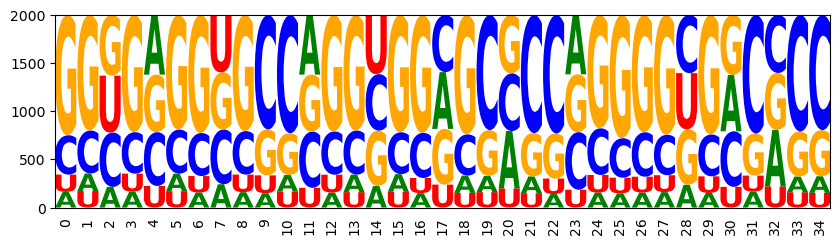

Neighbours: Weight = -5
1: GGGGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
2: GGUGAGGUGCCAGGUGGAGCACCAGGGGGGACACC
3: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACCCC
4: GGUGAGGCGCCAGGUGGAGCACCAGGGGUGACACC
5: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
6: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
7: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
8: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
9: GGUGAUGUGCCAGGUGGAGCACCAGGGGUGACACC
10: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACGCC
11: GGUGAGGUGCGAGCUGGAGCACCAGGGGUGACACC
12: GGUGAGGUGCCAGGGGGAGCACCAGGGGUGACACC
13: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
14: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
15: GGUGAGGUGCCAGGUGGAGUACCAGGGGUGACACC
16: GGUGAGGUGCCAGGUGGUGCACCAGGGGUGAAACC
17: GGUGAGGUGCCUGGUGGAGCACCAGGGGUGACACC
18: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
19: GGUCAGGUGCCAGGUGGAGCACCAGGGGUGACACC
20: GGUGACGUGCCAGGUGGAGCACCUGGGGUGAUACC
21: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
22: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
23: GGUCAGGUGCCAGGUGGAGCACCAGGGGAGACACC
24: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
25: GGUGAGGUGCCAGGUGGAGCA

218: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
219: GGUGAGGUGCCACGUGGAGCACCAGGGGUGACACC
220: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
221: GGUGAGGUGCCAGGUGGAGCGCCCGGGGUGACACC
222: GGUGAGGUGCCAGGUGGACCACCAGGGGUGACACC
223: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
224: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
225: GGUGAGAUGCCAGGUGGAGCACCAGGGGGGACACC
226: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
227: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
228: GGUGAGGCCCCAGGUGGAGCACCAGGGGUGACACC
229: GGUGAGGUGCCAGGUGGAGCACCAGGAGUGACACC
230: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
231: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
232: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
233: GGUGAGGCGCCAGGUGGAGCACCAGGGGUGACACC
234: GGUGAGGUGCCAGGUGGAGCACAAGGGGUGACACC
235: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACUCC
236: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
237: GGUGAGGUGCCAGGUGGAGCACUAGGGGUGACACC
238: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACA
239: GGUGAGGUGCCAGGUGGAGCGCCAGGGGUGACACC
240: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
241: GGUGAGUUGCCAGGUGGAGCACCAGGGGUGACACC
242: GGUGAGGUGCC

421: GGUGAGGUGCCACGUGGAGCACCAGGGGUGACACC
422: GGUGAGGAGCCAGGUGGAGCACCAGGGGUGACACC
423: GGCGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
424: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
425: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
426: GGUGAGGUGCCGGGUGGAGCACCAGGGGUGACACC
427: GGUGAGGUGCCUGGUGGAGCACCAGGGGUGACACC
428: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
429: GGUGAGGUGCCAGGUGGCGCCCCAGGGGUGACACC
430: GGUGAGGUGCCAUGUGGAGCACCAGGGGUGACACC
431: GGUGAGGUGGCAGGUGGAGCACCAGGGGUGACACC
432: AGUGAGGUGCCAGGUGGAGCACCAGCGGUGACACC
433: GGUGAGGGGCCAGGUGAUGCACCAGGGGUGACACC
434: GGUGAGGGGCCAGGUUGAGCCCCAGGGGUGACGCC
435: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
436: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
437: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
438: GGUGGGGUGCCAGGUAGAGCACCAGGGGUGACACC
439: GGUGAGGGGCCAGGUGGAGCACCAGGGGUGACACC
440: GGUGAGGUGCCAGGCGGAGCACCCGGGGUGACACC
441: GGUGAGGUGCCAGGUGGAGCCCCAGGGGUGACACC
442: GGUGAGGUGCCGGGUGGAGCACCAGGGGUGACACC
443: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
444: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
445: GGUGAGGUGCC

626: GGUGAGGUGCCCGGUGGAGCACCAGGGGUGACACC
627: GGUGAGGUGCCAGGUGGAGCACCCGGGGUGACACC
628: GUUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
629: GGUGAGGUGCCAGGUGGAGCCCCCGGGGUGUGACC
630: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
631: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
632: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
633: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
634: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACAGC
635: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
636: GGUGAGGUGCCCGGUGGAGCACCAGGGGUGACACC
637: GGUGAGGUGCCAGGUGGAGCACGAGGGGUGACACC
638: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACCCC
639: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
640: GGUGAGGUGCCAGGUGGAGCACCCGGGGUGACACC
641: GCUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
642: GGUGAGGUGCCGGGUGGGGCACCAGGGGUGACACC
643: GGUGGGGUGCCAGGUGGAGCACCAGGGGUGCCACC
644: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
645: GGUGCGGUGCCCGGUGGAGCACCAGGGGUGACACC
646: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACCCC
647: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
648: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
649: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
650: GGUGAGGUGCC

827: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
828: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGGCACC
829: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
830: GGUGAGGUGGCAGGUGGAGCACCAGGGGUGACACC
831: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
832: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
833: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
834: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
835: GGUGAGGUGCCGGGUGGAGCCCCAGGGGUGACACC
836: GGUGAGGGGCCAGGUGGAGCACCAGGGGUGACACC
837: GGUGAGGUGCCAGGUGGACCACCUGGGGUGACACC
838: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
839: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
840: GGUGAGGUGCCAGGUGGAGCACCAGGGGGGACACC
841: GGUGAGGUGCCAGGUGGGGCACCAGGGGUGACACC
842: GGUGAGAUGCCAGGUGGCGCACCAGGGGUGACACC
843: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
844: GGUGAGGUGCCUGGUGGAUCACCAGGGGUGACACC
845: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
846: GGUGAGGUGCCAGGUGGGGCACCAGCGGUGACAUC
847: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
848: GGUGAGGUGCCAGGCGGAGCACCAGGGUUGACACC
849: GGUGAGGUGGCAGGUGGAGCCCCAGGGGUGUCACC
850: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACCCC
851: GGUUAGGUGCC

1032: GGUCAGGUGCCAGGUGGAGCAGCAGGGGUGAAACG
1033: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1034: GGUGAGGUGCCAGGCGGAGCACCAGGGGUGACACC
1035: GGUGCGGUGCCAGGUGGAGCACCAGGGGUGACACC
1036: GGUGUGGUGCCAGAUGGAGCACCAGGGGCGACACC
1037: GGUGCGGUGCCAGGUGGAGCACCAGGGGUGACACC
1038: GGUGGGGUGCCAGGUGGAGCACCAGGGGUGACACC
1039: GGUGAGCUGCCAGGCGGAGCACUAGGGGUGACACC
1040: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1041: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1042: GGUGAGGGCCCAGGUGGAGCACCAGGGGUGACACC
1043: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1044: GGAGGGGUGCCAGGUGGAGCACCAGGGGGGACACC
1045: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1046: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1047: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGCCACC
1048: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1049: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1050: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGCCACC
1051: GGUGAGGUGCCAGGUGGAGCCCCAGGGGUGCCACC
1052: GGUGACGUGCCAGGUGGAGCACCAGGGGUGACACC
1053: GGUGAGGUGCCAGGUGGACCACCAGGGGUGACACC
1054: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1055: GGUGAGGUGCCAGGUGGAGCACCAGGGG

1231: GGUGAGGUGCUAGGUGGAGCACCAGGGGUGACACC
1232: GGUGAGGUCCCAGGUGGAGCACCAGGGGUGACACC
1233: GGCGAGGUGCCAGGUGGAGCAACAGGGGUGGCACC
1234: GGUGAGGUGCCAGGUGGAGCGCCAGGGGUGACACC
1235: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1236: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1237: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1238: GGCGAGGUGCCAGGUGGGGCACCACGGGUGAUACC
1239: GGUGAGGUGCCAGGUGGAGCACCAGAGGUGACACC
1240: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1241: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1242: GGUGAGGUGCCAGGUGGAGCCCCAUGGGUGACACC
1243: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1244: GGUGAGGUGCCAGGGGGAGCACCAGGGGGGACACC
1245: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1246: GGUGAGGUGCCAGGCGGAGCACCAGGGGUGACACC
1247: GGCGAGGCGCCAGGUGGAGCACCAGGGGUGACACC
1248: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1249: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1250: GGUGAGGUGCCAGGUGGAGCAGCAGGGGUGACACC
1251: GGUGUGGUGCCAGGUGGAGCACCAGGGGUGACCCC
1252: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1253: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1254: GGUGAGGUGCCAGGUGGAGCACUAGGGG

1432: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1433: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1434: GGUGAGGUGCCAGGUGAAGCACCAGUGGUGACACC
1435: GGUGAGGUGCCGGGUGGAGCACCAGGGGUGACACC
1436: GGUGAGGUGCCAGGUGGAGCACCAGGGGUCACACC
1437: GGUGAGGUGCCAGGUGGAGCACCAGGGGGGACACC
1438: GGUGAGGUGCCAGGUGUAGCACCAGGGGUGACACC
1439: GGUGAGGUGGCAGGUGGAGCACCAGGGGUGACACC
1440: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1441: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1442: GGUGAGGCGCCAGGUGGAGCACCAGGGGUGACACC
1443: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1444: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1445: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1446: GGUGAGGUGCCAGGUGGAGCAGCAGGGGUGACGCC
1447: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1448: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1449: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1450: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACGCC
1451: GGUGAGGUGCCAGGUGGAGCACCAGUGGUGACACC
1452: GGUGAGGUGCCAGGUGGUGCACCAGGGGUGACACC
1453: GGUGAGGUGCCGGGUGGAGCACCAGGGGUGACACC
1454: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1455: GGUGAGGUGCCAGGUGGAGCACCAGGGG

1635: GGUGAGGGGCCAGGUGGAGCACCAGGGGUGACACC
1636: GGUGAGCUGCCAGGUGGAGCACCAGGGGCGACACC
1637: GGUGAGGUGCCAGGUGGAGCACCAGGGGUAACACC
1638: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1639: GGUGAGGCGCCAGCUGGAGCACCAGGGGUGACACC
1640: GGUGAGGUGCCAGGUGGACCACCAGGGGUGACACC
1641: GGUGAGUUGCCAGGUGGAGCACCAGGGGUGAAACC
1642: GGUGAGGUGCCAGGUGGAGCCCCAGGGGUGACACC
1643: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1644: GCUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1645: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGCCACC
1646: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1647: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1648: GGUGAGGUGCCAGGUGGAGCCCCAGCGGUGACACC
1649: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1650: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1651: GGUGAGGUGCCAGGUUGAGCACCAGGGGUGACACC
1652: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1653: GGUGAGGGGCCAGGUGGAGCCCCAGGGGUGACCCC
1654: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1655: GGUGAGGUGCCUGGUGGAGCACCAGGGGUGACACC
1656: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1657: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1658: GGUGAGGUGCCAGGUGGAGCACCAGGGG

1833: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1834: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1835: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1836: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1837: GGUGACGUGCCAGGUGGAGCACCAGGGGUGACACC
1838: GGUGAGGUGCCAGGUGGAGCGCCAGGGGUGACACC
1839: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1840: GGUGAGGGGCCAGGUGGAGCACCAGGGGUGACACC
1841: GGUGAGGAGCCAGGUGGAGCACCAGGGGUGACACC
1842: GGUGGGGUGCCAGGUGGAGCACCAGGGGUGACACC
1843: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1844: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1845: GGUGAGGUGCCGGGUGGAGCACCAGGGGUGACACC
1846: GGUGAGGCGCCAGGUGGAGCACCAGGGGUGACCCC
1847: GGCGAGGUGUCAGGUGGAGCACCAGGGGUGACACC
1848: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1849: GGUGAGGUGCCAGGUGGAGCACCAGGUGUGACACC
1850: GGUGUGGUGCCAGGCGGAGCACCAGGGGUGACACC
1851: GGUGAGGUGCCAGGUGGAGCACUAGGGGUGACACC
1852: GGUGACGUGCCAGGUGGAGCACCAGGGUUGACACC
1853: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1854: GGUGAGGUCCCAGGUGGAGCACCAGGGGUGACACC
1855: GGUGGGGUGCCAGGUGGAGCACCAGGGGUGACACC
1856: GGUGAGGUGCCAGGUGGAGCACCACGGG

/home/elena/miniconda3/envs/myenv/lib/python3.10/site-packages/logomaker/src/matrix.py:584: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  counts_df.loc[:, c] = tmp_mat.sum(axis=0).T


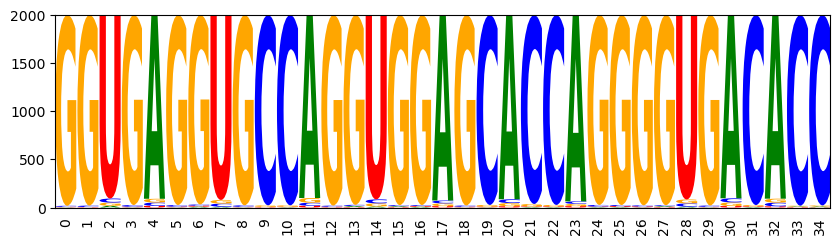

Neighbours: Weight = -10
1: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
2: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
3: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
4: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
5: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
6: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
7: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
8: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
9: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
10: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
11: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
12: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
13: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
14: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
15: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
16: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
17: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
18: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
19: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
20: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
21: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
22: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
23: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
24: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
25: GGUGAGGUGCCAGGUGGAGC

216: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
217: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
218: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
219: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
220: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
221: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
222: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
223: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
224: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
225: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
226: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
227: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
228: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
229: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
230: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
231: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
232: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
233: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
234: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
235: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
236: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
237: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
238: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
239: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
240: GGUGAGGUGCC

418: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
419: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
420: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
421: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
422: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
423: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
424: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
425: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
426: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
427: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
428: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
429: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
430: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
431: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
432: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
433: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
434: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
435: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
436: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
437: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
438: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
439: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
440: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
441: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
442: GGUGAGGUGCC

629: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
630: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
631: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
632: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
633: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
634: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
635: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
636: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
637: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
638: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
639: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
640: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
641: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
642: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
643: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
644: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
645: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
646: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
647: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
648: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
649: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
650: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
651: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
652: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
653: GGUGAGGUGCC

834: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
835: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
836: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
837: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
838: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
839: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
840: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
841: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
842: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
843: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
844: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
845: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
846: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
847: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
848: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
849: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
850: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
851: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
852: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
853: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
854: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
855: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
856: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
857: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
858: GGUGAGGUGCC

1050: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1051: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1052: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1053: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1054: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1055: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1056: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1057: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1058: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1059: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1060: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1061: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1062: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1063: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1064: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1065: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1066: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1067: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1068: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1069: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1070: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1071: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1072: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1073: GGUGAGGUGCCAGGUGGAGCACCAGGGG

1247: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1248: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1249: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1250: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1251: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1252: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1253: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1254: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1255: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1256: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1257: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1258: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1259: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1260: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1261: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1262: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1263: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1264: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1265: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1266: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1267: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1268: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1269: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1270: GGUGAGGUGCCAGGUGGAGCACCAGGGG

1454: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1455: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1456: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1457: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1458: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1459: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1460: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1461: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1462: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1463: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1464: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1465: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1466: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1467: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1468: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1469: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1470: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1471: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1472: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1473: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1474: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1475: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1476: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1477: GGUGAGGUGCCAGGUGGAGCACCAGGGG

1668: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1669: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1670: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1671: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1672: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1673: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1674: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1675: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1676: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1677: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1678: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1679: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1680: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1681: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1682: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1683: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1684: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1685: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1686: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1687: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1688: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1689: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1690: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1691: GGUGAGGUGCCAGGUGGAGCACCAGGGG

1866: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1867: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1868: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1869: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1870: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1871: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1872: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1873: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1874: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1875: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1876: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1877: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1878: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1879: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1880: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1881: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1882: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1883: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1884: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1885: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1886: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1887: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1888: GGUGAGGUGCCAGGUGGAGCACCAGGGGUGACACC
1889: GGUGAGGUGCCAGGUGGAGCACCAGGGG

/home/elena/miniconda3/envs/myenv/lib/python3.10/site-packages/logomaker/src/matrix.py:584: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  counts_df.loc[:, c] = tmp_mat.sum(axis=0).T


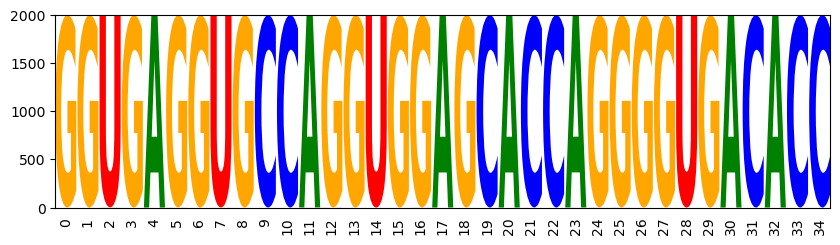

In [37]:

#Negative weights
rna_sequences5=[]
iterations = 2000
weight5 =-1

curr = sample_init
print("Neighbours: Weight = -1")
for i in range(iterations):
    neighbour = neighbour_optimize(model, curr, weight5, n, m)
    rna_sequences5.append(rna.ass_to_seq(neighbour))
    print(str(i+1) + ": "+ rna.ass_to_seq(neighbour))
    #curr = neighbour
    
opt_draw_logo(rna_sequences5)


rna_sequences6=[]
iterations = 2000
weight6 =-5

curr = sample_init
print("Neighbours: Weight = -5")
for i in range(iterations):
    neighbour = neighbour_optimize(model, curr, weight6, n, m)
    rna_sequences6.append(rna.ass_to_seq(neighbour))
    print(str(i+1) + ": "+ rna.ass_to_seq(neighbour))
    #curr = neighbour
    
opt_draw_logo(rna_sequences6)


rna_sequences7=[]
iterations = 2000
weight7 =-10

curr = sample_init
print("Neighbours: Weight = -10")
for i in range(iterations):
    neighbour = neighbour_optimize(model, curr, weight7, n, m)
    rna_sequences7.append(rna.ass_to_seq(neighbour))
    print(str(i+1) + ": "+ rna.ass_to_seq(neighbour))
    #curr = neighbour
    
opt_draw_logo(rna_sequences7)

In [30]:
pip install seaborn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 3.2 MB/s eta 0:00:003.0 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [31]:
import seaborn as sns

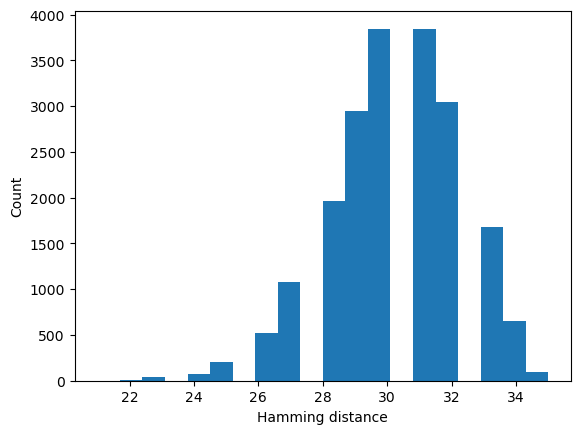

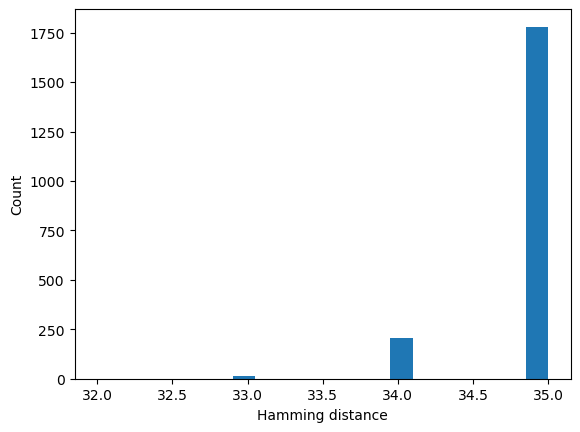

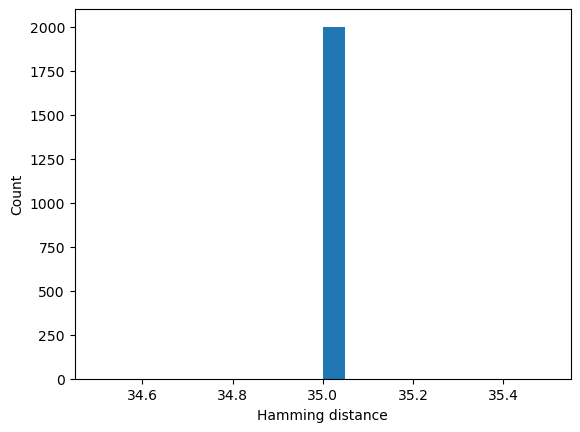

In [42]:
#Plotting Hamming distance between neighbours when positive weights are used
sequences = rna_sequences2

def hamming_distance(seq1, seq2):
    return sum(s1 != s2 for s1, s2 in zip(seq1, seq2))

hamming_distances = [hamming_distance(rna.ass_to_seq(sample_init), seq) for seq in sequences]
# Plot the histogram
plt.hist(hamming_distances, bins=20)
plt.xlabel("Hamming distance")
plt.ylabel("Count")
plt.show()

sequences = rna_sequences3

hamming_distances = [hamming_distance(rna.ass_to_seq(sample_init), seq) for seq in sequences]
# Plot the histogram
plt.hist(hamming_distances, bins=20)
plt.xlabel("Hamming distance")
plt.ylabel("Count")
plt.show()

sequences = rna_sequences4

hamming_distances = [hamming_distance(rna.ass_to_seq(sample_init), seq) for seq in sequences]
# Plot the histogram
plt.hist(hamming_distances, bins=20)
plt.xlabel("Hamming distance")
plt.ylabel("Count")
plt.show()


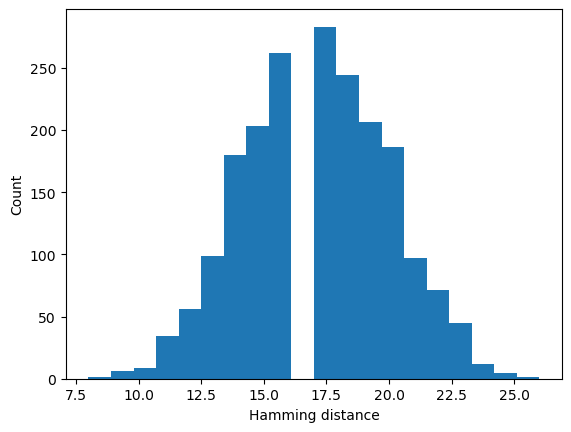

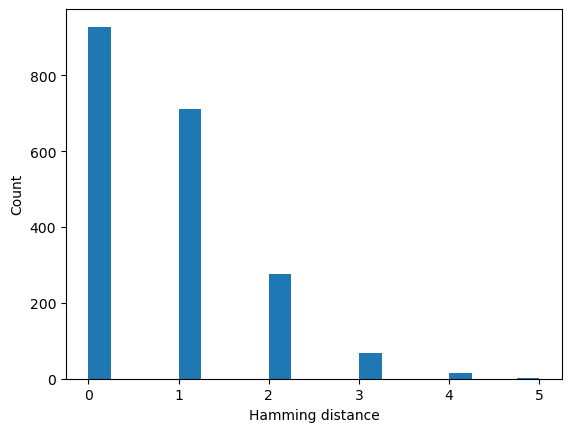

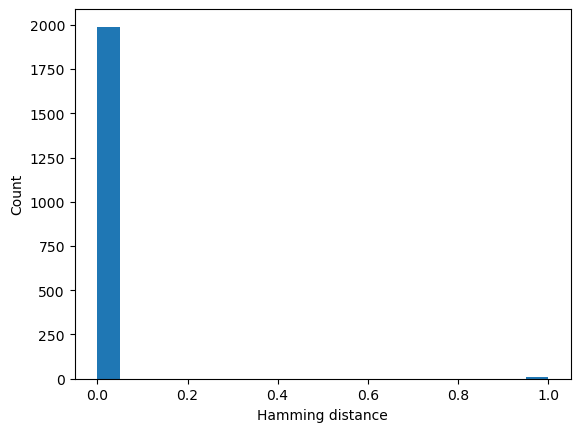

In [44]:
#Plotting Hamming distances between neighbours when negative weights are used
sequences = rna_sequences5

hamming_distances = [hamming_distance(rna.ass_to_seq(sample_init), seq) for seq in sequences]
# Plot the histogram
plt.hist(hamming_distances, bins=20)
plt.xlabel("Hamming distance")
plt.ylabel("Count")
plt.show()

sequences = rna_sequences6

hamming_distances = [hamming_distance(rna.ass_to_seq(sample_init), seq) for seq in sequences]
# Plot the histogram
plt.hist(hamming_distances, bins=20)
plt.xlabel("Hamming distance")
plt.ylabel("Count")
plt.show()

sequences = rna_sequences7

hamming_distances = [hamming_distance(rna.ass_to_seq(sample_init), seq) for seq in sequences]
# Plot the histogram
plt.hist(hamming_distances, bins=20)
plt.xlabel("Hamming distance")
plt.ylabel("Count")
plt.show()


#  Testing def_optimize()

In [55]:
weight = -1
sample_init = sampler.sample()

temps = [0.25,0.5,1.25,1.5,1.75]+[i for i in range(1,50,10)]
iterations = [50, 100, 200, 500, 1000]
best_performance = float("-inf")
best_temp = 0
best_iterations = 0

for i in range(10):
    """"best_performance = float("-inf")
    best_temp = 0
    best_iterations = 0""""
    for temp in temps:
        for iteration in iterations:
            result = optimize(model, objective, iteration, weight, temp, sample_init)
            final_sequence, final_value = result[1], result[2]
            performance = final_value
            if performance > best_performance:
                best_performance = performance
                best_temp = temp
                best_iterations = iteration

    print("Best temperature: ", best_temp)
    print("Best number of iterations: ", best_iterations)
    print("Best value: ", best_performance)
    
"""1.iteration
Best temperature:  0.5
Best number of iterations:  1000
Best value:  -3.5984723567962646
2. iteration
Best temperature:  0.25
Best number of iterations:  50
Best value:  -2.0854640007019043
3. iteration
Best temperature:  0.25
Best number of iterations:  50
Best value:  -2.0854640007019043
4. iteration
Best temperature:  0.25
Best number of iterations:  50
Best value:  -2.0854640007019043
5. iteration
Best temperature:  0.25
Best number of iterations:  50
Best value:  -2.0854640007019043
6. iteration
Best temperature:  11
Best number of iterations:  500
Best value:  -2.068019390106201
7. iteration
Best temperature:  1.5
Best number of iterations:  1000
Best value:  -1.1849751472473145
8th
Best temperature:  1.5
Best number of iterations:  1000
Best value:  -1.1849751472473145

Best temperature:  1.5
Best number of iterations:  1000
Best value:  -1.1849751472473145"""

Neighbour0: UUAGGACAUGCCCCCCGCACGCCGAAGACCCACGG, value: -16.478209018707275
Neighbour1: ACAGCACACGCCGACCGCCGGCCGUUGAUCCGGGG, value: -36.84112310409546
Neighbour2: GGGGGCCCCUGCCGGCAACGACCGGCGCCCCACGC, value: -31.426185607910156
Neighbour3: CUCCGACGCGCCCGGCGGGCCCCGGCUCCCGGCGC, value: -26.602797508239746
Neighbour4: CUUCGCUGCACGCAGCGCAUAUCCAACGCCCCCGG, value: -22.06143307685852
Neighbour5: AGCGGCCCGGCCCGCCGAAACACUGGGACAACACG, value: -17.46502423286438
Neighbour6: UUGUUCGAGCGGCCGCUGCCAGCGUCGACAACCGC, value: -29.844816029071808
Neighbour7: GGCGGAGACGUGGCGUUCUCGCCGGAGUCGCCCGG, value: -23.843321442604065
Neighbour8: UUAGGUAAUGCCGCCAGCUCCUCGGGGACUGCCGG, value: -24.022573471069336
Neighbour9: GCCGAGACGCCCCAACGCUCGCCGGAGCCCCCCGG, value: -27.25749146938324
Neighbour10: CUGGCGCGUGCCUCCGGCUUGAUGUAUGCCAACGC, value: -31.334044694900513
Neighbour11: GGGCGAGCUGAGGCGGGGGUCCCGUUGAUACCUGU, value: -28.66950511932373
Neighbour12: UCCGUACUUGCCCGGGGCUCGCCGCCGACCCUGCA, value: -25.899349212646484
Neighbour13: C

Neighbour61: GGGCUCCUAGUUAGCGUCGGCACCCGCUGACACUU, value: -24.787090301513672
Neighbour62: GCGCACUCCAGCCCGGCGCCCGCCCGGCCAACCCG, value: -29.177079558372498
Neighbour63: CCGGGCGGGCGGGCGGUCGACUCAGGCCGCCCCUG, value: -22.9048593044281
Neighbour64: CCGCCCGCCUGUCUACCCCCACUGGGCCUCGCUCA, value: -30.768471240997314
Neighbour65: UCGGGCUCCGCACCCAGCGCGAGGGCCCAGCUCAC, value: -21.4662424325943
Neighbour66: CCAAUCGACGGCCUAGACCGCACGGAACGGCACGU, value: -25.78819179534912
Neighbour67: GGGUUCAGUGAGCUGAACGCCCCCGGCCGGGUCAG, value: -25.34775400161743
Neighbour68: CGAGACUCCGCGGCGCCCGUCAGGGGCCGGCCCCU, value: -13.323271185159683
Neighbour69: CGAGACCGCGCGCAAGCGGGUAGUGGCCGGCCGUC, value: -23.363727569580078
Neighbour70: CGGGGCAGGGUCCCCGACGCCACCGGCGGCCUCCC, value: -22.480571314692497
Neighbour71: GGGCACGCCUCGCCCCACGCCAGGGGCCUGCCCCU, value: -28.89095973968506
Neighbour72: CCAUGCCCCUCGGGGGCCGGUGAGGGCGUGGCCCC, value: -32.65427303314209
Neighbour73: CGGGAGGCGGUUCGGACCCCCCCCGUGGGGAGUCG, value: -21.659242153167725
Neighbo

Neighbour75: AAUGGCGCCGGCGCCGGCGCGAAACGCCCGCCCGA, value: -19.873659133911133
Neighbour76: AACGAUUCCGACGGGGGCGCCCCCCGCCGCCUGGC, value: -22.448530554771423
Neighbour77: UGUCGAUCCUACGACGAAGCUCGCGGGACGCGGAG, value: -17.919188737869263
Neighbour78: GGUGGCCCCGGCGACGGAGCCACACCGUUCCACCG, value: -33.84935522079468
Neighbour79: GAUGCCUCAGCCGAGACUGCACCGCCGCCUCGGGC, value: -28.645830154418945
Neighbour80: CGCGCCGCCUGACCCCCUGCCCCCCGGCCCCCCCC, value: -28.694530963897705
Neighbour81: GGCGCGAAGGCUUCGCACCGGCCCCCCGGCGCGUG, value: -13.248147368431091
Neighbour82: GGGGCUGCCGACGAGGCGGCCGCCACGGGCAGUCG, value: -28.565966367721558
Neighbour83: UCGAGUAACGCCGCCGGCGGCCCGGGGUGGCAGCG, value: -30.586092948913574
Neighbour84: GCCGAUUGCGCGGCGGAACCCGCCGGCCGGUUCCG, value: -31.162530183792114
Neighbour85: GCUGCCAGCGCGGCGGUCGCCCCUCGGCAGUCGCG, value: -18.473223954439163
Neighbour86: CCUGAUCCCGUCGACCAUCGCCCCCGGUGACUGCG, value: -35.401472330093384
Neighbour87: CGGGGCUCGGCCUGGGACGCCCAACGUAAAAGUCG, value: -28.663371086120605


Neighbour187: CGCUACCCGGCGCGCGCCUGGAGGCGGUGUCCGAG, value: -27.25969362258911
Neighbour188: CGAGGAAUAACGCGGCCCCGGACCCGGCGGCCAGU, value: -34.24051094055176
Neighbour189: GGUGGGCCAGCACGCCGCACACCGCGGGGGCUUGU, value: -27.47872018814087
Neighbour190: CUCCCCAACGGUCCCCUCGCCGCCAGGCGGAUGGG, value: -26.914520382881165
Neighbour191: GACGGCCCGCGCCUCCCACUUCCAUUGCGCCUCCU, value: -29.59057331085205
Neighbour192: AGGCGCGGCCGGCGGUCUCUUACAGCGAGACGAGG, value: -17.971656799316406
Neighbour193: CCCGGCGCGGUCUGCACGUCGUGCAGGCGGACGGC, value: -16.330020487308502
Neighbour194: CCAGACCGGCCGCAAACCCCCGCAUCGCCGGAGGG, value: -37.092198848724365
Neighbour195: GCGGGCCCACCGGACACUUCCUGAGCACCCGAGGG, value: -38.32449722290039
Neighbour196: GCGGUCCCCCUCCGCAUGACCAGCCGAGGGGCGAC, value: -35.46378767490387
Neighbour197: CACACCCCCGCGCGGACCGGCACACCGAGGAGUCC, value: -29.67542552947998
Neighbour198: CCAGGGUGCGCGGCUCCGUCCAGGUUGUUUUGGGG, value: -29.74397897720337
Neighbour199: CGGGGCCCCGGGCCCCACGGCCCCCGCACCCAGGA, value: -35.3045487403

Neighbour103: UCACCCCAUCCCUCCGGCGGGCGCCUCGAGACUGG, value: -24.11961543560028
Neighbour104: GCCGGCUCGGCGGCCUGCGCGCCGCUCCAGGCACG, value: -31.158074855804443
Neighbour105: GCCGCCCCGGGCGGCCCGCGUCACUGUCGGCCGUG, value: -36.59430503845215
Neighbour106: GUCGGCGAGGCCGACCGACCGGACAGCCUGGACUC, value: -33.919546127319336
Neighbour107: UGCGUCGCGACCGUGCGGGGGCUCGUUUGGGCGCU, value: -27.93954062461853
Neighbour108: CGGGGGCUCGAUGGCCUUGACUCCCCCCACGAGCC, value: -36.39770436286926
Neighbour109: GGCCGGCGGGCUUCUCCGGGGAACAGGCCGCGGCC, value: -16.069103240966797
Neighbour110: CGCGGCCAGCUCCCGACGAGCGCCGUCAAGACUGG, value: -27.312265396118164
Neighbour111: GGCCGCGACCCCGGGUGCGGGGGGGUGCGGCCGUG, value: -32.15073561668396
Neighbour112: CAAUGGGGGCCCCGCGGGGCCCUGAGUUGCGGGCA, value: -33.756131649017334
Neighbour113: CCGCGCCACAAUCCGGGGUGCGCCAGCCAAGCGUG, value: -35.634450912475586
Neighbour114: CGACCCCAGCCCGCAGGUGGGCAGGGGCAGGCCCG, value: -34.0525918006897
Neighbour115: GGACGGGCGGCAGCCGGGGGGGGGAUCGGGGAGUC, value: -20.871999740

Neighbour221: GGCGCCCACCCAGGCGUGGCCCGAACGUCGGCUCG, value: -16.410983987152576
Neighbour222: GUCCCCCCGAUGGUCGGGGCCCGAACGGCUGUACA, value: -34.64338278770447
Neighbour223: GGAUCACCCCGGCCUACGGGCCUUCAGCGCGUGCG, value: -31.67118501663208
Neighbour224: ACCUCGGAACCGGGCCCGGGCAUUCCCGAGCUUGG, value: -31.208837509155273
Neighbour225: GGCACGCGCGCGCCUGGCAGGGAGCCGGCGGUGCA, value: -29.78065061569214
Neighbour226: CCCGCCGCGCCCGAGGGGGCCUAGUCAACGGUGCG, value: -15.950071930885315
Neighbour227: GGGGGGCAGCGGCCGGGGCGCCAGGGGCGCGGUAC, value: -33.649903297424316
Neighbour228: GCUCCCCUGAGGGUUUCGGCCAACGCGCGCCCGCC, value: -25.246989727020264
Neighbour229: GGCAAGGGGCCGGGGCGGGCCCAAGCGUAGCGCCC, value: -26.052445232868195
Neighbour230: GAGAGCCCCGCGCCCCGACCCCACACGCGUGAGCG, value: -33.08357524871826
Neighbour231: CGCUCGCGGCCCGCCGGCGUCGAGACGCACUCGCG, value: -15.015483289957047
Neighbour232: GUGUCCCCGUCCCGCGGCGGCCUGCCGGACGUGCG, value: -28.627220630645752
Neighbour233: GCCUGACAGCGGGGAGAGGGCCCGGCCCGGGAGUU, value: -30.245098

Neighbour333: GGCGCCCAGCCGGCCCAAGGCCAAGGGCCCGGCCC, value: -26.454219102859497
Neighbour334: GGAGCCUAGCCUGUAGCCAGACGCGAGCACGGACC, value: -36.078179359436035
Neighbour335: GCCCCGGUGCCCCGGGCGGCCCAUACUCGGGCGCU, value: -25.36367380619049
Neighbour336: GGCGUGGGUCCGGUCGGGACCUGCCGGGCGGCGGG, value: -27.088062167167664
Neighbour337: CGCGCCCCGUCCUCCGGGACCCAGCUGGAGGCGCC, value: -27.223519802093506
Neighbour338: AACGGGCGGACGCGUGGGGCCCGAACGGAGGAGCC, value: -27.992541313171387
Neighbour339: GCCGCCUAUGUAGGCGGGUCCGACGUGCAGCGCCA, value: -33.96105098724365
Neighbour340: GCCGCGGAGUGCUCCUGGUCCCUACCGCCGCGCCC, value: -28.643251419067383
Neighbour341: CGCUCAGCGGCGACCUUGGCCCCCUGGGACAUGAU, value: -30.440232276916504
Neighbour342: GCUACCCGUCGUGUCGCGUUGCCAGCGGGCGCGGU, value: -31.764603227376938
Neighbour343: CUCCCCCCUCGGGACCUGCAGCACAGGGCGGGGCG, value: -19.11015546321869
Neighbour344: UGCUUCCGUUCGGGCCCGACUGAUCGGUCGGUGCG, value: -20.596726804971695
Neighbour345: GGUGGUCAGCGCGCCGCGGGCCCCAGGCCGGUCUG, value: -29.70754

Neighbour439: ACCGUCCGGGCGCAAGGGGUGCUCUCGCGUGUGGG, value: -24.959673404693604
Neighbour440: GGCGGAGGUCCGCGCCCGGGGCUACCGCGAUGUCG, value: -33.42696142196655
Neighbour441: CUCACCGGAACAGGCGGUGCUCACGGGCAGGUGCG, value: -12.306758850812912
Neighbour442: ACCGCCCGCCCCGGGGAGCCCCCACCGGCUGGACA, value: -24.693530559539795
Neighbour443: GCGUGCGAGCCGGAGGGCGCCCGGGAGCCGCCCAC, value: -25.97851872444153
Neighbour444: CGAAACCGGCCGGUUCUAGCGGCACCGCCGGAGCC, value: -20.34400302171707
Neighbour445: GGGACGCUGGGGAGGGUGGCCCAGGCCGCGGUGUA, value: -39.968390703201294
Neighbour446: GGCACGGCUCCCUUCGGCGCUCUAGACCGGCUGCG, value: -20.49174976348877
Neighbour447: GUCGCCCAGCCGCGGGCGCCCCGGGCGUGCCGGCG, value: -41.36714172363281
Neighbour448: GGCCCGCAGCACGGAAGGGGGGUGCCCCAGGCGGG, value: -32.85247078537941
Neighbour449: GGGAAGGCGCCGGUAUCGCUCCAACCGGGGCGCAG, value: -33.08945322036743
Neighbour450: UGCGCCCAGUCGAACGCCCGCUACACGCGGGCAAA, value: -25.711761713027954
Neighbour451: GCGCCCACGCCGAUCGCGGCCCACUUCCGGCUUCG, value: -22.042387008

Neighbour58: GUUGCCGCCCGUGCGCAGUGGUGCCAGCCGACGCG, value: -26.105663776397705
Neighbour59: UACAGCCCACGGGUCGACGGGGAGCCCCGCGGGAG, value: -24.82438325881958
Neighbour60: UCCACCCCGUGCUGGACGUGGGCAACUACCCUGAG, value: -26.229374885559082
Neighbour61: GGCGGGUGGCCUAAGGGAGGCGAGCAGCGGUCAAG, value: -36.144365310668945
Neighbour62: GCCCCAGCCGCACGGGGGGGGGGGCUCCCCCGGAC, value: -26.5687335729599
Neighbour63: AACGGGGCCCGCUAGGUCGCCCUCCGGGGGGCCCG, value: -24.79892897605896
Neighbour64: GUCCCCGCGAGAUUGGACGGCGCGUCCGGCAACGG, value: -28.790829181671143
Neighbour65: GCCGCCUCGGGUUUAGGUAGGGCGCGUACGGCGAC, value: -16.583551049232483
Neighbour66: GGAGACCCGCGGGUCGGGGGCGUACACGCGACGGG, value: -31.313237577676773
Neighbour67: CCGACUCGCCGGGCCGGUCGGUCGAACGCGACCAC, value: -33.871495723724365
Neighbour68: GACGGCCCACGUCCGCCAGGGGGCCAAACCAAGAA, value: -44.85670280456543
Neighbour69: GGGUCCACAACGCAGCGAGGCGGGCCGCAGCACAG, value: -25.819374084472656
Neighbour70: GCCAGCCAACCUGAGGCAGGGCUCCGGCAGCAAUG, value: -35.714937686920166
Neig

Neighbour179: CCAAUGGGUGAGCAGCCAACGCCCGUUCCCGCGGA, value: -25.080317974090576
Neighbour180: CCGAGACGGGAGAGGGAACCGCCGGGGGCCGACGC, value: -26.06037139892578
Neighbour181: GCCGCGGCUUAGGAACCUGCAGCCUAGCGGCCGGA, value: -24.20183067396283
Neighbour182: CCUGGCGCGUGGAAACUGCGCCGCCCCCCCGCGUU, value: -28.429254055023193
Neighbour183: CCCGGCCCUCGCCCGCCGGCAGCGGCGUCUCCGGG, value: -19.63020521402359
Neighbour184: GCCGGCGCUCCGAAGGGUGCCAGGGGGCCUGCGGG, value: -19.659329414367676
Neighbour185: UCCUGCCCCUAGCAUGUCGGCGCCCGCUCGCCGGC, value: -14.218939926475286
Neighbour186: CCCCGCGGUCUGAUGCGCGCCCCCACGCCGCACGG, value: -9.268527448177338
Neighbour187: CGGCACCCCCCGGUGGCUUCACGCGAGCCCGCUCG, value: -22.475441455841064
Neighbour188: CCGGCCGCCGACCUCAUCAGCUGCAGGGCCGCGGU, value: -29.79021778702736
Neighbour189: CCCGGCCGCCCCAGGCUCCCUCAGCGGGCGUCGGU, value: -8.102135181427002
Neighbour190: CCCCUGUAGCUGACUCCAGCUCCCACCACCCACCG, value: -34.385857582092285
Neighbour191: UGCUUAGCGGGAGGGCCACCAUCCGUCCGCCCGGA, value: -39.20713770

Neighbour295: UUCAGCGCCCCGAGGACCCCGCCAGAGCCUCCUGC, value: -16.18079137802124
Neighbour296: CCCCGUGCGACGGGGCCCGGGUCACCGCCCACUAU, value: -35.11116600036621
Neighbour297: CCGGGCCCACUGAAGCCGGGAGUCACGCCCGUGGC, value: -30.027531623840332
Neighbour298: CCCGGCUGCGUGGGGCCGGGUGCCGUGGCCCCGCG, value: -22.400748819112778
Neighbour299: CGCUCCGACGGUUGAACACCCGUCGGGUACGGGGC, value: -28.847303867340088
Neighbour300: CUCUGGCCUUGGAGACCCGGCCCCUGGCCCCCGUG, value: -13.103234231472015
Neighbour301: GAUGCCGAGGCGAGGGCAGCGUGUACGGCCCCGCC, value: -26.559691905975342
Neighbour302: CACGGCACACACGACGUCACGCCCGUACCGAGGGG, value: -21.439620971679688
Neighbour303: AGGACCGUUCAGCUGCCAGCGCAGGCUGCUGCGAG, value: -31.657485961914062
Neighbour304: GGCAGCGCGGCGCGCGUCGCGCCUGCCUCAACGGG, value: -32.74081373214722
Neighbour305: GCUCCUCCCAUUGAUACCGGCCACGCCCCGCCGGC, value: -22.278900623321533
Neighbour306: CCAGGCACUGAUGCUGAGGCCCGCGAGCGCAGCGG, value: -21.55020046234131
Neighbour307: ACCUUCCGCCAGGACCCGCGACACGAACCACAGGG, value: -19.446086

Neighbour410: GGCAAGCAGGGGGCGGGUGGCCCGCUGUCCCAGAG, value: -37.749478340148926
Neighbour411: GCAACCGCCCAAAUCGCCGCCCCCGCGGCCCGGGG, value: -25.681026458740234
Neighbour412: CCGUGCGCGAAGGGGCCGUCGCGCCCGCGCCGCGG, value: -27.5675528049469
Neighbour413: CCCGGCGCGGCGGGCGCCCCCCCCUAGCUGACCGC, value: -14.724550247192383
Neighbour414: UCCCGAUCCCAGUCCCGAGCCCGGCAGCCGCGGGC, value: -16.076427936553955
Neighbour415: GAGAGCAGCCGCACGCGAGCACGCGACCGCAAUGG, value: -31.7441987991333
Neighbour416: CCCAGGCAUACGAAGAUAGGGCCGCUGCGGCUGGC, value: -16.82510805130005
Neighbour417: GCCGGCGCCCGGGAUUCCCCCCCCGACCCGCCAGC, value: -25.98159682750702
Neighbour418: UACCGCGACCUGCACUGGCCUCUGGCGCGACGGCC, value: -18.5137619972229
Neighbour419: GGCGGGGGCCAGCCGGCACCCCCACGUCCGCCCCC, value: -17.413338094949722
Neighbour420: CGCAGUGGCAACCGGACCCUACCCGUCCGCACUGC, value: -43.20428276062012
Neighbour421: CCAAGCGACCUGGUGACGGGCCCUUUCCUCCCCUC, value: -20.665457010269165
Neighbour422: CGCCUAGCUCCCGUGGCCUCUCUGGAGCCCCCAGC, value: -25.68176841735

Neighbour522: CCCCGCGUACUGGAGGGGGCCCGCCCAUGCCCCGG, value: -36.391089260578156
Neighbour523: GGCAGGGACCUUGUAAUAGGCCCACUGCACCGGCG, value: -25.083908200263977
Neighbour524: UCGUCCGUGCGGUACCUCGGUCCCGUGCCCCCCGC, value: -29.484188675880432
Neighbour525: CCCUGUCCGCUGGGGAUCCCAGCGCUGACGGCAGC, value: -38.02902364730835
Neighbour526: GGGGGAGCGCAGUAUGCGAGACCCGGGCGCCCGAC, value: -27.92035973072052
Neighbour527: CCCACCGCUCCCCCCAGCUCGUCACGGCCAAGGCC, value: -32.13580513000488
Neighbour528: AUCGACACGCCCCGGUCAGAAUUCAUGGCGCUGGG, value: -27.070685863494873
Neighbour529: CAGGAUCCCUCCAGGGAUGCCCCGCCGGGCCCAUC, value: -22.23827487230301
Neighbour530: CCCAGGCCUCCGCCCACACGCCACCGUGUUGCAGC, value: -22.67912769317627
Neighbour531: CCCGGCGGAACGGUGACAGGAGCCGUGCGCGGGUC, value: -34.26903486251831
Neighbour532: CCAAGUACGUGCCCGCCCGCACCCCGGGCCCCGCC, value: -32.78987216949463
Neighbour533: CCGGGGGGGUAGGAGCGUUCGAAUCUGCCACCGCG, value: -21.613668262958527
Neighbour534: CCCAGCGCUCAGAAGUUCGCGCUCGCGCCCAUGGC, value: -16.248854398

Neighbour632: CCGGGCGCUCCGAUGACCGACCCCGCGCCCACGGC, value: -24.578969478607178
Neighbour633: CAGCUCGCUCGGGAGAGCGGUCCGUGGCGCCCCGC, value: -39.135764718055725
Neighbour634: UCCCUCGCCCCGAACACUGCUUCCGGUCCCGCCCG, value: -26.68148422241211
Neighbour635: ACCCGGUCCGACCUAACGGCACGUACCCGCCCGGG, value: -25.06468939781189
Neighbour636: GCCAUCGGUCCGGCAUCGGCGACCGCUCUAACGGC, value: -15.523430585861206
Neighbour637: AUCAGCGCCCAGGCGAAUGCACCCCCGGCCCCCGU, value: -25.38104408979416
Neighbour638: CCAAGCGAACGGCAGCCCGCGGACGCGCCCGAAGC, value: -18.742623805999756
Neighbour639: CGCUCGACGCGUAAGUGUCCACCCGUGGACGCCGC, value: -26.6830472946167
Neighbour640: CGUGGAGCUCAGCAGGGGCAGCUGGGGCCCCUGGC, value: -31.90896463394165
Neighbour641: GCUCGUGCAAAUGACACCGGCCCAGGGGCCGCCCU, value: -37.01493740081787
Neighbour642: CCCGGCGAGCACCAGGCGGCCCCCGUGCCCGAGCC, value: -20.521020889282227
Neighbour643: UCUGGCACCCCGGCGUAAAUACGUCUCCGCCAGCC, value: -32.680156230926514
Neighbour644: CCCAGCCCGCAGCUGAGAGGGCCCGGGGUCGCGGG, value: -31.157731533

Neighbour751: CCUGCGGCGCAGCUCACGGCCCCCGGGGCGUCCGG, value: -25.01389706134796
Neighbour752: CCCGGUACUGAGAGCCCCGCUCUCCUGUGCACAAA, value: -31.03287410736084
Neighbour753: CACGCCGCGGACGCGGCGAACCGCUGGGCCCCGAC, value: -29.94082200527191
Neighbour754: CCUGGCGAGCCGUACCCGGUCCUGGAGCCUGACAU, value: -30.994479179382324
Neighbour755: CCCGGGAGCCCGGAGCCGGAGCCCGUGGCGCCGGC, value: -23.87376034259796
Neighbour756: CGCAGCCCCGUCCUAGCUGGCCGCUCCCUCUCACC, value: -21.07435131072998
Neighbour757: GCCAGCGAGCCUCAUAAAGCGCCCUUUCCCGAUGC, value: -19.614611864089966
Neighbour758: GCUCGCCGGCCGCCGGCCAGACCCGAGCGCGGGGC, value: -37.945094883441925
Neighbour759: CGCUCGACGCGGAUGACGGCGCGCGUCACCUUGGG, value: -27.95689630508423
Neighbour760: CCGCGCGCUGCGGGCACGGGAGGGGUGCCCUGGGG, value: -30.57322585582733
Neighbour761: GGCGGCGCACCUAUGGGAGCGCGCCUGGCGCCGUC, value: -18.17463231086731
Neighbour762: CCAAGGCAUGCCCGAAAGGCACCGGGCAGCCCGCC, value: -42.197166442871094
Neighbour763: CCCGCCGGUACGCACGUCUCCCAGACCUUUUCCCC, value: -32.4887967109

Neighbour866: ACCAUCUCGCGGACGGCCGGACCCGUCCACCCGGA, value: -21.4415180683136
Neighbour867: CCACGCCCGUCGCAGCCAGGGCGCGGGCAGCGCCC, value: -31.307472229003906
Neighbour868: CCCUAGGCGCAGCGAGCACCGCCCGCGCCGCGGGA, value: -23.98725387454033
Neighbour869: CGCCCCGCAUCAGAGGAACCUCCGGCGCCUGAUUG, value: -18.297460556030273
Neighbour870: CCCCUCCCUCGCACGUCUGCCCCCGCGCCCAUUGA, value: -16.316906690597534
Neighbour871: CGGCGCGCUCGCAAGAGAGCCCCCCCGGAGGGCGC, value: -28.298630118370056
Neighbour872: CCCAUUCCCCAGGAGCCGGUACGGGUGCGGACUGC, value: -18.69978618621826
Neighbour873: GCCCCGGCCGGGAAGGCACGUGCCGUGGUGCCGGG, value: -24.07736587524414
Neighbour874: CCCCGGGCACAACGGGCAGUGCAGUCGCCCGCGGG, value: -23.542107224464417
Neighbour875: CGGCGCUCCCAGCAAACCGCUCCGGGGCGACCGUC, value: -34.10330939292908
Neighbour876: CCCGGGGCCAGUCGGAGGGCCCGCCUCCCCCGCAG, value: -20.9727725982666
Neighbour877: GCCGACAGUAACGAGGCGGGAGCCGCGUACGCGGC, value: -29.818389415740967
Neighbour878: ACCAGCGCUCACAAGCCCGCCCUCCCCCCCCAGGC, value: -15.7381975650

Neighbour979: CCCAGGUCGCAGCCUAUCCGACCGGGCCCGCCGGC, value: -24.468305349349976
Neighbour980: CCCCGGGCCCAGAACCACGCCACCGUGACCUAGGG, value: -20.64207858964801
Neighbour981: UCGCGUGCAUAGCAUACGCAGCUCGUGCAACCGGC, value: -21.49346113204956
Neighbour982: CCCACCGCCAUUGCGCAGGGACCCCCGACCCGGGC, value: -26.12711191177368
Neighbour983: CCACGCCCUCCCACGACGGUACCUGUGCCCGUCUC, value: -31.010457038879395
Neighbour984: ACGAGCGCUCGACUGGUUACGCCCGUACCCCGCCC, value: -19.094014644622803
Neighbour985: CUCGCCGCAAGGAUGCCAACGCGCGGGUCGCGCGA, value: -28.020016193389893
Neighbour986: UCCUCCUCGCGGCAGUCGCCGCAAGUGCCCCCGGC, value: -28.662959814071655
Neighbour987: GAGAGCCUUCACGCGACAUCGACAUGGCCCACGCC, value: -25.70284080505371
Neighbour988: CACAGGGCCCAGCCGGGCGCGCCCGCGACCCCGAG, value: -12.004968643188477
Neighbour989: UCCAGGUCUGCGGCCCCGCGGCACCAGGCGCGGGC, value: -23.5501801520586
Neighbour990: CGCCGCGCCAACGAGCCCUCCCCGGCGCCCCCGCC, value: -16.187243282794952
Neighbour991: GGACGGGCGCAAACGUACUGACCGGGGCCCAUUGC, value: -38.03035712

Neighbour47: UGGGCGUGGGCAGGCGGCCACACGCGCGCCCGAGA, value: -31.35063898563385
Neighbour48: UGGCUGCGUCGCAGCGGCUGGCCGCGCGCCCACCU, value: -22.857540011405945
Neighbour49: UUGCGCAGAGCGCGGUCCCGGGCGGUCGCCCGGGG, value: -37.27652680873871
Neighbour50: CGCUCGUCCGCUCAUCGACGUGCGCGGGCCCGGCG, value: -33.01536846160889
Neighbour51: UUGCCCCAAGCCCGGCCAGUAGGCCGUUGCGCGCG, value: -46.85515117645264
Neighbour52: CUCGCCCCGGUAGGUAAGCGAGCACACGGCCUGCG, value: -24.359341621398926
Neighbour53: UUGCCCCCGUUGGGUCGCCAUGCGCGCGAGCUACG, value: -28.74546194076538
Neighbour54: CGGGCGGGAGAUGCUGCGCACCCGCGCGUAGGUCG, value: -18.626704275608063
Neighbour55: UGAUCCCCAGGCCGGCGCGCGGCCAGCGUUUGGUG, value: -45.6750545501709
Neighbour56: CGGCCCCCGGACCGGAGUGGUGCUCGGGGUUGCCA, value: -35.67230570316315
Neighbour57: CGGGCCUCCCCCCGGAGGGCUAUGCGAGCCCUUCC, value: -31.282983779907227
Neighbour58: GCGCCGACUCCCGGGCGCCACGGCCGCCUUCAGCA, value: -38.56461143493652
Neighbour59: GGGGCCCCAGGCCGCCACCCCGGUCCACUGCCGUC, value: -42.93171710893512
Neighbour

Neighbour67: CCUCCCCGGAGCCGCACGGUCGCCGGCUCGCGGGG, value: -23.067292720079422
Neighbour68: CGGCACCUGCUCCGGUGCUGGCCAGUCAGGCUCAG, value: -32.87407994270325
Neighbour69: CGGUGCGGGCGCCUGUCGGGCGCAUAGCCGGGGAG, value: -32.6327486038208
Neighbour70: CGCCCCACGAUCCCCCGGUGCCGACACGCGGGCAG, value: -13.78200215101242
Neighbour71: CGGCGCCGGCUCCUACAAUGGUUCGACCCAGACCG, value: -19.276942253112793
Neighbour72: CGGCGGCCCCUCACGGUCUGCGCCAGCUCGGGCAU, value: -38.91293239593506
Neighbour73: UGGCCGCGCCGGCUACGGCGGCCGCACACGAUGCC, value: -32.522254943847656
Neighbour74: GGGCGCGGGAUUCGUCGGCGCACGGAGCCUCACCC, value: -22.288530349731445
Neighbour75: CGGCCCCAGGGGCGUAGGUCGUCAGACGCGCGGCG, value: -18.043956637382507
Neighbour76: CCGGUCGCAAGCGUGCCCUGGACCGACCCGCCGGG, value: -23.73682141304016
Neighbour77: GUGCCCGGCCCACACCAGGACUCGCGCGCGUGUUG, value: -17.848612546920776
Neighbour78: CGCCCCCGGGAGUCCCGACGCGCCUCCCCGGUAGG, value: -15.05731039494276
Neighbour79: CGUACCCUGGCCGCCCGGUGGGGGGAGACGCGCAC, value: -27.880331993103027
Neighb

Neighbour187: CAACUUUGCCACAGCCGCCGCUCCUCGGCCCGCCG, value: -22.20170545578003
Neighbour188: GAGGGCGAGCAUCGGCGUUGGGGUACGCGUCGACA, value: -31.37827730178833
Neighbour189: CGCGCACAAGGGGCGGGCCGUUCGGUCGACCGCCC, value: -30.79149627685547
Neighbour190: CACGGCACCCGGCGCCGCCGCGCUCGUCGCCGGUG, value: -24.346468925476074
Neighbour191: CGCCGCCCGCCCGAGGGAGGCGCUGCAGUCUCCCG, value: -37.93884468078613
Neighbour192: GCCGGCCCCUGUGGUCCUCGUUCGACCGCCCCAGG, value: -20.016634464263916
Neighbour193: GACUGCAGACCCGCCGGUCGGCGGUCCUGGACGGG, value: -36.85872307419777
Neighbour194: CACCGUCCGACGGACGGGAGGACCCCCCUCCGUUC, value: -19.264836072921753
Neighbour195: GACGGAACACCGAGCCGUCCCGCGACCCGGCCCCC, value: -28.181218147277832
Neighbour196: CUCGCCCGCCACAACCGGGCCCCCUCUGGCCCGGC, value: -31.424406051635742
Neighbour197: CUCGGGGCCCAAGUACGGCGCCCGUCCAGACCAGG, value: -27.2923721075058
Neighbour198: GGCUCGCGCCGCAGCGGAGGCGCGUCCCGCUCGAG, value: -22.708189964294434
Neighbour199: CCCGGUCCCCUCCGUCGACGCCGGAAAAGCUCGCG, value: -26.353674128

Neighbour105: CCCCUUUGCAGGGGCGCGUUGGGUGCACUCGGGAG, value: -21.521827220916748
Neighbour106: AGCAGCAGUGCGAGCCCGGGGACUGGCGCCCGUGC, value: -28.8803631067276
Neighbour107: AACGCUAGGACGGGCCUAGGAGGCGUACCCUGGGU, value: -21.26828360557556
Neighbour108: CCCCCCCGUGCCGGGCCGGGAAGUUGCGGCACGUA, value: -28.265564918518066
Neighbour109: GCCGGCACGCGCUGCCCGGUCAGCCCAGCUAUCGU, value: -17.84948968887329
Neighbour110: CCGUGGGGCGGGCUCCCGGGGGGGCAUCGGAGAAU, value: -29.544241905212402
Neighbour111: GUCGCGCUUUGCCUCCUGGAGCGUGAGCCCACCCC, value: -24.867109775543213
Neighbour112: GACCCUAGGAGCGUCCGCGAGCGCCUCCCCGCGGG, value: -18.489423096179962
Neighbour113: GUCCACCGUCGCCUCCCAGCCGCGGUGUCCCCGUG, value: -26.62000274658203
Neighbour114: CGGGAGCCCGUCUGCCCCCGGGGCGGGGCCACCGA, value: -39.360906422138214
Neighbour115: CGCCCGCCUCCUGUCAGGGCCCGUGUUCCCCGCGC, value: -22.632060050964355
Neighbour116: AACGAGGGGGGUGUGGCGGGGCGCGGACCAACGGC, value: -22.207221627235413
Neighbour117: CCAGGAGGUUGCCCCGGGGCGGGCGUGCCAGGCGA, value: -28.9837433

Neighbour221: GCCCCGCGUAGCCCUCCCGGGACCCCCCCCGGGCG, value: -11.110901832580566
Neighbour222: GCCGAUCCAGUCGUCCCAGAGGGGGUGGCCACGCA, value: -33.06516218185425
Neighbour223: CCCGGGUCUAGCGUCUGUGCGUAACCAGCUACCAG, value: -23.057901859283447
Neighbour224: CCCGGGAUCGGCCGGGCGCGGGGCGUGCCCGGCCG, value: -40.800419330596924
Neighbour225: UCCCCAAACGUCACGACGGGCGUGGGUGCGGCAGG, value: -26.955806016921997
Neighbour226: GUCGAGAGGUGCCCCCCUGCUGUGGGGCCCACCCC, value: -13.2514488697052
Neighbour227: CCCGAGGGGAACCCCGCACGGGGGGGACCAAGCUU, value: -43.61856150627136
Neighbour228: GCCUGCAGGGGCUGCCCGUGGGGCCCCCGCAGCUA, value: -35.61640000343323
Neighbour229: GCCGGGGCUAGCCGCCGCGAAUUCCACCUCCCAGU, value: -16.973559856414795
Neighbour230: CCUGGGGGCUCCUGUUCGGGAGGCCCCACGGCCGG, value: -26.78958249092102
Neighbour231: UCCCGGAGCAGCACCCCGCGGGGUCCGCCCGGCGA, value: -25.385368824005127
Neighbour232: CGCGGCUGCAGUCCCCCGGGCGCCCUGCCAUCCGG, value: -21.89272165298462
Neighbour233: UCCUGGAGCCGUGGCCCGCAGAGCCCGCGCUCGGG, value: -19.794021725

Neighbour337: CCACGGAGGCUGGCGCCGCGCCGGCUGGCUGGACU, value: -31.485199451446533
Neighbour338: CGGUGGCCACCGCUCCGGGUCAGCGUCUCCGCCGC, value: -29.677879810333252
Neighbour339: GGGACGGGCUAAGAUCCUGCGCGUGGCGUGAGCGG, value: -27.83240556716919
Neighbour340: CGGGGUGGGCCUGUGCCGGAUUCUGUCUCUGGCGG, value: -28.602899074554443
Neighbour341: GCGCCGCCUCGGGGGGGAUUCUGUGCAAUCGCCGA, value: -6.715845346450806
Neighbour342: CGGGGUGGUUCCGCGGCGUCGGAUGGCGCGCUCGG, value: -21.931429147720337
Neighbour343: GGGGGCCGACCGGUGCGUGGCAGGGAGGAGGCAGG, value: -22.66628360748291
Neighbour344: GGGGAGCAUCCGGUGCCGCCCGGUUAGGCAGCCCC, value: -19.188048660755157
Neighbour345: AUGGGGGGUCGGGCCCGGUCGUUUCAUUACGCUGG, value: -27.164823055267334
Neighbour346: GGGGUCAGUGCAUGGCCCUAAGCCGCAGCCCCCCU, value: -22.599249362945557
Neighbour347: UACGACUGCCCGCCCCCGGCUCCAGAGGGCGCCCU, value: -27.255198001861572
Neighbour348: GGGGGGGGGCCGGGCCCACACGGGCUCGCCCGCGG, value: -29.253281354904175
Neighbour349: GCGGCGGGACCGCCUCCGUCUGGAGCAGCGGCCGG, value: -17.54478

Neighbour444: GCAGGCGGGACGGGGGGGCCGUCUGGGGGUGCUGG, value: -26.55990719795227
Neighbour445: GGAGGGCCUGCCCGGCCAUCCGACUCGGCCGGUGC, value: -34.83633291721344
Neighbour446: AAAGUCGGUCCUGCACGGCCGUGACUGCGCGCCUG, value: -15.940028190612793
Neighbour447: GCAGAACGCGGCGUUCGCGGGGGAAUGGCGGCUGG, value: -25.107280910015106
Neighbour448: CGGUUCCGUGCGGCGCCGAGAGCGGGGCUCGCCGC, value: -30.443944454193115
Neighbour449: CGCGUGCGGCCCGAGCGGACUCCUGGGGCCGCCGC, value: -34.229464054107666
Neighbour450: UGGGGCGCGCACGAGCCUACGGGUAGGGCCCCGGG, value: -29.312816619873047
Neighbour451: CGGGAGCGCCGGGAGCGGUCCCCCUACCAUGCCGC, value: -22.82580304145813
Neighbour452: GAGACGGAGCCCCUCACUGGAUGCCUGGCCGCAGG, value: -24.37856674194336
Neighbour453: UGCGACGGUCGGGCGGGGACCGAGGGGAACGUCGG, value: -34.52391862869263
Neighbour454: GGAGGCGGGCAGGUGGGGCCCGGACUGAACGCCGG, value: -39.39104652404785
Neighbour455: UCCUAGGUGCCAGCCAUGUGCUGAGGGGCCUGAGG, value: -15.99993747472763
Neighbour456: ACGGUGGCGUCCCCGCCGUGGUCAGCUGCCCCCGG, value: -18.734409093

Neighbour64: UGCGCCCCGGCCCUUGGCAGCGGCGACUGAGGAGC, value: -18.083554983139038
Neighbour65: GCCGCGCGCAGCGCCGGUGCCGUUUGUUAGGCUCG, value: -28.844412803649902
Neighbour66: CGACGCAAGAGCCGCGUACACUGCCCUGCAACAAG, value: -19.840631008148193
Neighbour67: CGCGUUGCGACCACAGGUGGGUGUCCCCCGCCCCG, value: -14.29159140586853
Neighbour68: CGCAGUACCGCGCCCACUAAGGGCCCCCCGCGAGG, value: -31.253710627555847
Neighbour69: CGCUGCGUGCGGUCCCCUAAGGGUCCGCCGCCAGG, value: -29.877927660942078
Neighbour70: GAGUGCAGGGAAAACGGAGCCCGGCCUUGGGCUGC, value: -29.630651473999023
Neighbour71: CGGCCUGCGCCCCCCGGGCGGCGCAGAACGGCUUG, value: -28.825572848320007
Neighbour72: UCCGCGGCGGGCGGCUUCAAUGGGACCUGAGCCGC, value: -20.80153179168701
Neighbour73: CGAGCCGCGAGCGCCGGACGGGGUGGCGCGAGUGU, value: -24.13541865348816
Neighbour74: UGCGGCCCUGCGCAAGGUACGGGUUCGUCCCCAGC, value: -29.84363603591919
Neighbour75: UGCGGUAGGGGGUCCUCCGAGCGGGGCGGCAAAGG, value: -28.459314346313477
Neighbour76: GUCCGUCCCUGCCCGGACCACGCCACUACCCUGAG, value: -14.648742318153381
Nei

Neighbour181: CGCAACGCGGUCGCUUUCCGGAGUUAGCGUCCGAG, value: -33.84094171598554
Neighbour182: GGCGGUCCUCUCACCGAUUCCGGCCCGGGGGCGCC, value: -22.437235355377197
Neighbour183: UGCGGCGUGGACUCCGAUUCCGCGGCCCGGCCGGC, value: -22.502522587776184
Neighbour184: UGGUGGCACGCCGUUGCGCCGGGGGACCCGCCUAC, value: -37.0111403465271
Neighbour185: ACUCGGGCAUGGACCUUAGCCGGGUCGCACCGUGU, value: -19.41386580467224
Neighbour186: UCGGUGGGGCCACCGCGUACCGGGCUGUGGACGAC, value: -23.483471155166626
Neighbour187: UGCGCGCCGGCCUUGCUGUCCGGGGCAGGGCUGAC, value: -48.07298421859741
Neighbour188: GGCAGUCCGGCCCACGGCGGAGCCUUGGGGCCGUC, value: -15.103042244911194
Neighbour189: GCAGGGUCGACCUCGGGCACUUGGGGGCGGCCCGC, value: -22.041805624961853
Neighbour190: UGAGGGGCAAUUUCAGUCACCAGGUCCCAGCCGAC, value: -22.996087551116943
Neighbour191: UCAGGGGCGGGUCCUCUCGCGGGGCCCGCGCCGCU, value: -42.061789870262146
Neighbour192: UAGCGGGCGCCGCCUGGUGCCGGCUCGUGGCGAGU, value: -30.734563648700714
Neighbour193: UGACCGGCGGCCUCAUUCGCGUCAGUCCCGGCGGU, value: -31.7772588

Neighbour294: AGCGGAGGGUCCCCGUUAGCGCGGCCGCGCAACGC, value: -34.65695571899414
Neighbour295: AGCGCUACGCCCGCCGUGCUCGGCCCGCGGCUGCC, value: -28.341046452522278
Neighbour296: AGCAGGGGGGCCUAGGUUCAGAGAGCGCCGUAGAC, value: -37.1364483833313
Neighbour297: UGCUAGUGCGCCUCACGCGCCUUCCUGCCCCGGAG, value: -24.647505581378937
Neighbour298: UCACGGGGGUUCUCGCUUGGAGGCUCUGCGACUUU, value: -34.59858560562134
Neighbour299: CACCGGGCGAGGGGAGGCGCAUGUUGCCGGCCCAC, value: -25.31575632095337
Neighbour300: GCCCCCCCGGCCCCCGACACGGGGGCGCGCCCUGG, value: -21.64636480808258
Neighbour301: UUCCGGCCCACCGCGGCCGGCGCCCGGAGGCGGGG, value: -25.65362137556076
Neighbour302: CCCAGGGCGGAGGGGGCCGCUCGUGGGCAGCCGCC, value: -18.764756441116333
Neighbour303: CGUUGGGGGCACGCGUUCUCGCUGGCUGGUCACAC, value: -25.100326538085938
Neighbour304: GACCAGAUCGCCGGGGGCUCGGUAUAGGGGCCCGC, value: -31.088340759277344
Neighbour305: ACCCGGGCUGCCUGACGUGCGCGGCUCCGGCCGCA, value: -29.510004997253418
Neighbour306: UGGGCGGCCGUCGCGUUCUCGCGCCGGUACCCGAC, value: -32.070086240

Neighbour405: UGCCAGCCCCCUGCGUUCCUGCGUGGGUGGGCGCG, value: -39.787039041519165
Neighbour406: CGCGCCGGGGCCUGUGUCCCAGGUUCGCGGCCGAC, value: -29.315989136695862
Neighbour407: GGGACACCUACCUCCGCACCCGGGAGGCGGCCGAC, value: -26.61760187149048
Neighbour408: CACUGCCUGGCGACGGCCCCCGCCGCGUGGGCGGG, value: -25.93114972114563
Neighbour409: GUCCCAUCGCCCGCCCGCUCGGACGCGCGUCCCAC, value: -15.15952643752098
Neighbour410: AGAUGGCCGGAGCCUGUCACGGCGCGGCCACCGAA, value: -31.875060319900513
Neighbour411: GUCGAGGGGGGGUCCAACUCCGAGACGCCCCUUCC, value: -30.72486448287964
Neighbour412: AGGGCGGCCGGCUGGCCGUCUGGUGCGCGGCCUGC, value: -27.780452966690063
Neighbour413: ACCUGGGUGGCCUGGGCCAAUGGUUCACGCGCGAG, value: -27.675771236419678
Neighbour414: UGGCCGGCCCGGGUAGCCACGGCGCGGCAGCGCUC, value: -21.95254874229431
Neighbour415: GGCGGGACCUGGUCGGGCGCGGGUAGGGGCCAGAG, value: -14.197254002094269
Neighbour416: UGCUCGGCGGGCGCACGCAGGGGGGGGCGGCCCCG, value: -40.84605073928833
Neighbour417: CGCGCCCCGGCCGAGGCCGGGGGUGGCCGGCGCUG, value: -30.47991281

Neighbour517: GCCAGCAGUCGGCCCGCCCAUUUCUACCAGGGCCC, value: -33.09413433074951
Neighbour518: GCCGGGCUGCUCCCGGUCCGAGGCUGGGCGCCUCC, value: -34.913680732250214
Neighbour519: GGAGGAGCGGACGGCGCCCCAGCCUCGCGGGCCCG, value: -26.220512688159943
Neighbour520: GGCCACGCGGGCCCGGUGCCCUCCAGGGGCACAGC, value: -39.93804883956909
Neighbour521: GGCCCCCCGCGGGCGGGAACCGGGAGUUGCGAGCA, value: -14.713137805461884
Neighbour522: GCCGGGGAUGCCAGCGGACGCGGGCGGAGGGGGCU, value: -44.8069109916687
Neighbour523: GCCCACGCCGAGCCCGUCGCCGGCUGCCCGGGGCU, value: -19.01100790500641
Neighbour524: GAGCGCCAGCGCUCCGUAGGUGGCUCAUCGGCCCC, value: -31.97120276093483
Neighbour525: GGCUGAGAAGGCGCCAGCCCACGCGCUCCGGCCCA, value: -44.327701568603516
Neighbour526: CGCCCAAGACCGCUCGCGGGCGGCCCGUACGCGCU, value: -38.527777910232544
Neighbour527: GGCUGCCCCCGCUCCGUCUACGACGAACCGGCACG, value: -24.93230676651001
Neighbour528: CGGCCGACAGUACCCUCCGCCGUACCGCCCGCAAC, value: -21.878324508666992
Neighbour529: GGGGGUUCCAACCUGGGCCCCUGGCCGCGCGGGCC, value: -30.141023635

Neighbour626: AACAAGGGGGCACCCGCGGGCCAGCCCGUUCCCGC, value: -29.74604368209839
Neighbour627: GGCCAUGAGGGCGCCCACGGCACUGCCAGUGCGGC, value: -23.689244031906128
Neighbour628: GCCCGCCCUACCCGCGCGGCCAGCUGGAGCGCCAC, value: -29.616238117218018
Neighbour629: GCCGCCGCCGUCGCCGCCCCCGCUGCUCCGCGCCU, value: -33.92092514038086
Neighbour630: GCGGCCGCCACCCACGUGCAGCCCCUCGGCCGGAC, value: -27.0302996635437
Neighbour631: GCGACUACGCCCUCGUCGCUCUCGCCACGCGCGCA, value: -36.04540777206421
Neighbour632: ACGCUCGUUGCCCCAGCGACCCAACGCGGCGCGGC, value: -24.46343469619751
Neighbour633: GGCCCCGAGGCCCCGGGCUGCCACCCCCGAGCGCC, value: -14.37109249830246
Neighbour634: AGCACAGCGGUGGGCCCGAUAACCCCCUCAUGCAA, value: -29.72133445739746
Neighbour635: GCCGCCCGCGCGCGCGCAUGGACUCCCGCCGCGAG, value: -28.4929039478302
Neighbour636: GGCUCCGCGGUCGCCCCGCGCAGCCGCCGGUCCCC, value: -17.983784407377243
Neighbour637: UGCGCGCCGGGCGGCGCGAUCCACGGGGCCGCACC, value: -14.61335402727127
Neighbour638: GGCCCCAUCGGCCGGGCCCAAGAGCUGCGACCACC, value: -24.3449273109436

Neighbour738: CGCGCCGCCGAGCUCGGCCCGGAACACGGAGGGCG, value: -19.301973819732666
Neighbour739: CGCCCCCAUCACCCCGGCGCCCGUCGGCCAUGGCG, value: -14.851948477327824
Neighbour740: GGCGCCGCUGCGCCCGCCGGAAACGGGCGUGGCCG, value: -24.36956477165222
Neighbour741: UCCCCCGCGGCUCGGCCCCCCACGUUCGGGGGGGG, value: -20.455047369003296
Neighbour742: GGCUGCCCGAGGCGCGCCCAGGAGCCAACGGCGAC, value: -17.87747049331665
Neighbour743: GCCCCCGCUCCGCCCGCCGAGGCCGGCGGGGCACA, value: -37.73416614532471
Neighbour744: GCCCCCGGCGCCCAAUGGAGCGUUCCCAGGAGGCG, value: -29.860042810440063
Neighbour745: GCCGGCGCGGUACGCCACCCCAGUUUCCGGGCGCG, value: -26.350586652755737
Neighbour746: AGCACCGCUGCCCCCGCCGGCAAUACCUGACCAAC, value: -19.83701181411743
Neighbour747: CCAUCCGCAGGUGCGUGGCCGGCGGGCCGUGCUCU, value: -41.33401811122894
Neighbour748: CGGCGCGCUGUGCGCGUCGGGCACGUCGCAGCGCG, value: -33.4924201965332
Neighbour749: CACCCCCCGCACGCGACCGCCAACAAAAACGCUCC, value: -32.846628189086914
Neighbour750: GCACGUGCUUGGGCCGGGCGGCUGCCGCGCGCGGG, value: -41.732153713

Neighbour848: GACCCCGGCCACGCGGUGGAUAUCCCUAGCGCACC, value: -30.47900676727295
Neighbour849: GGCACAACACCCCCCGCCAUCCUACCCCGGGCGCC, value: -10.678057432174683
Neighbour850: GCCACAGGCCGACCCGCGUACGGCCCCCGAGCGCC, value: -28.990422248840332
Neighbour851: GGGCCAGCGCCCCCCCCCUAGGCCCGUUGCUCUCG, value: -23.498735189437866
Neighbour852: AGGCCCGAGGACGCCGGGAAUAGGCCCACCACACC, value: -23.40587568283081
Neighbour853: GGCCCCGCCGCGGGCGUACGGUCUUCCAAGGGGGC, value: -10.876170635223389
Neighbour854: UGCGCCUCGGGCACAGCUGCUACUGAAGGGCGCGG, value: -33.26572132110596
Neighbour855: UUCCCCACGUGCGCCGCCCGCCCACCCAGCGAUCC, value: -14.673880577087402
Neighbour856: GGGCACGCGCACUCUGUCGUCAAUCGGGGAGGGCC, value: -15.576380401849747
Neighbour857: UCCCCCCCAGCCGCCCCCGCCAGCCACUGACCCGU, value: -28.58374309539795
Neighbour858: GGUUCCGGGACCCGCUUCAGCAGCCGCCGCCGGCC, value: -11.751918941736221
Neighbour859: UCCGCCGGGCUGGACGGCCUGGCCUGCGCAGCCCC, value: -27.497890949249268
Neighbour860: CCGCCCGCGGCACCCCCCCACCGGGCCGGCGCGCC, value: -29.671388

Neighbour962: GGCCCGGGGGCCUAGGCCCCCUCUGCCGUGACGUC, value: -33.96621370315552
Neighbour963: GAACCCGCUCGACCCCGCCCCGAGCCCAGAGGGCG, value: -35.661376953125
Neighbour964: GGCCCCGCGGCGCCUACGGCCCGGCGGAGCGUCCC, value: -26.769829094409943
Neighbour965: GGGCUGCCCGCUACCCCCCGCGAAUGCAUGGCCGC, value: -24.061131477355957
Neighbour966: CGAGCCGUAGCCGGCGCCUAGCCGGCUCGGAUGCC, value: -30.808212280273438
Neighbour967: GGGCCCGCUGCCCGCGCCAGCCCCCUCCUGGCGCC, value: -23.81964886188507
Neighbour968: CGGCCGCACGUCCCCGAGCGAGAGAUCGGUGCGGC, value: -30.83220386505127
Neighbour969: ACACCCGCUGGACGCGGCCAGGACGCCUGGGUGCG, value: -28.51922845840454
Neighbour970: GGUCCAGUUUCCCCCGCGUACGUACGCGGGGUGCC, value: -23.603482961654663
Neighbour971: GGCCCCGCGCGCCCCGCCGCCUGUCGCCGUGCGCG, value: -16.81932583078742
Neighbour972: GGCGCGGGAACGGCCAGCCGAGACCCCGCGGCGGU, value: -27.11607527732849
Neighbour973: CGCCAGCCCGACUCCGCCGUGAGCGGCACCGCGUC, value: -29.464933693408966
Neighbour974: UGCCGCCCGACCCCCGGUGCAAAGGGGACGCCCCC, value: -26.27952089905

Neighbour21: GGCAGGGGCUCCGCCGCCCGUGCGCCGAGGCCGUG, value: -27.244384288787842
Neighbour22: CCCGGCAGACCCGGUGCCCCCGCCAGCAUGGUGAU, value: -23.180766582489014
Neighbour23: CGCCCCGGUGCCGGCGAUCCGGGACCGGUCGAGGC, value: -34.77175426483154
Neighbour24: CGUCCCCCCUGCGCGGCGGGCGCCGCCAGGCCCCG, value: -25.630913972854614
Neighbour25: CAGCGUCCAAGCGCCGGCCGGGGCCCGCCCCCCAU, value: -24.980085849761963
Neighbour26: CUGCGCGCGCGCGGCGUGCCCUCGCGGCCCCAGUU, value: -21.348816752433777
Neighbour27: CGGGGGGCGAGCCCGGCGGACGCCGGGAUCCGGGA, value: -29.378639698028564
Neighbour28: CGUACGCCCCCCGAGGGCGUCGCCACGCUCCCCCG, value: -24.975366473197937
Neighbour29: CGCUGCUCCCGCAAAGCAGACCCCGGGGGCCCAGG, value: -30.635526180267334
Neighbour30: GCGCCCCGCCGCCGGAGGCUCCGCCGGCUUGUCGU, value: -16.478087604045868
Neighbour31: GUGGUCCGGCGGCGGGGGGUCCCCUCGCUUGCAGG, value: -31.141438722610474
Neighbour32: GAGAGCCGCCCGUGCAUACGGGGCGGGCAUGACCG, value: -43.33397579193115
Neighbour33: CGGCCCCUGCGGGAGAGGGUCCAGCGCCUACCCCC, value: -18.252230405807495
N

Neighbour43: GCCCGCGGGGGCCCGCCGAGUCCUCGGGGGUAGGA, value: -35.823652029037476
Neighbour44: CCCCGGGCGGGGCCACGACUGCUCGCCGCUACGGG, value: -24.705458283424377
Neighbour45: CCCCGCAGCCGCCCGGUACCCCCCCGCGCGGGAAC, value: -18.414910316467285
Neighbour46: CUACGCGGAGGCCCGGGACCAAGGAGCUCGGACGC, value: -43.73005390167236
Neighbour47: CUACCCGGGAGCUUGUGGCUCGCGGGCGCGCCGGC, value: -37.442795753479004
Neighbour48: UGACCCCGCGGCUUCCGGCCGCGUCCCAGCGCGGC, value: -30.451953887939453
Neighbour49: CCCCGGCGGCGCCGUAUGGGCCCGGGCUUGUGGGC, value: -21.06402236223221
Neighbour50: CUUCGAUACAGCCCGAUCCGGGCGGGCUCGAAGGC, value: -35.94763469696045
Neighbour51: CCCAGUCCCCUACCGGCUCGCCCGAGCCCGUGUUG, value: -41.1504225730896
Neighbour52: ACAGGCCGACGGCCGCGCCGGCCGGGCGCCACCGC, value: -22.90354061126709
Neighbour53: UCCCAUCGGGAGCGGGGGCGUGACCUCCCGCGGCC, value: -30.5587340593338
Neighbour54: CGCCGUCUCCUAUCGCCCCGUCCCCGGCGGCCGGC, value: -24.258626461029053
Neighbour55: AUGCGGCUCGAGCAGAGGCCCCCGCACGCGUGCAC, value: -9.65109233558178
Neighbour

Neighbour157: CGGGCGCACGUGCGGCGAACACUCAGCCCUGGCCU, value: -19.50411367416382
Neighbour158: GCCCUACCCACCGUGAGCGCCGCGCGGGCGACCGA, value: -17.60754942893982
Neighbour159: CCGGGGCGCAAACGGAGCCAGCCCGGGGCGACGGC, value: -21.5706729888916
Neighbour160: GCCAGGGCCGGCCAAUGGCUGUCUACGCCGUACCC, value: -30.536879539489746
Neighbour161: GGGGGCCAGCCCCGGGCGCCCCCCUCCGGGUUCCG, value: -26.50957942008972
Neighbour162: GUGGGGCUCAAGGUGGUUCCCCCGGAGGCAUGCCC, value: -19.765668213367462
Neighbour163: CACCGUCGCUGUCGGCCGCCCGGGGAGGCCGGCCC, value: -18.194372557103634
Neighbour164: GGGAGGCCCCACCCUUGGGCCACAUGCGCCCCCGG, value: -22.024460315704346
Neighbour165: CUGGGUCCCGACCGGAGCGCCGCCGAGUCCCUAGC, value: -20.34247589111328
Neighbour166: GGCCGCGGCCCGCGGAGGGCCCGGGGGUCUACCCG, value: -27.93383038043976
Neighbour167: GGAUGCUCGCGGCUGAGGCGCGCGGCCCCGGCCUC, value: -32.53473973274231
Neighbour168: GACGAUCCCGCGCGGCGACCACCGGGGGCCACCCC, value: -15.697139739990234
Neighbour169: GUAAGGGCUCGCCGCAGAGGGCCGGAGGCCCUGCC, value: -35.5621343851

Neighbour69: GCGUGGGGACUUAGUAAACCCGGCGCCGGCGCUGG, value: -24.269469261169434
Neighbour70: CCCGCGGGACUUAGGGGCCUCGGCACGGCCGGCCG, value: -27.056784063577652
Neighbour71: GGUCGGCGCAGAACGUUCCGCUCUGGCUGCGACCG, value: -34.503979444503784
Neighbour72: CGCUAAGGGCCCCGGGGCGCCGCCCACUCGGGGGG, value: -41.09331817552447
Neighbour73: CAGUCAGGACCACUCACCCCUGACCUCUGUCGCCG, value: -23.736011743545532
Neighbour74: CCCCGAGGUCCCGCGAGCGCCCGCCUCGGCGCGCC, value: -40.56034231185913
Neighbour75: CGGGUUGUGGCCGGGGCCGUGGACGUGGUCGGGAG, value: -35.22527313232422
Neighbour76: GUGGGGGUUCCCGGGGGCCGCUCUGACGGUAUGCC, value: -26.345515251159668
Neighbour77: GCGCAGAGUCCUAGCCCAAGCGCCCCAGGCAGCCC, value: -14.865761280059814
Neighbour78: CGCCGGCCAGGCCGGAGGUUAGCGCACACGCCCGG, value: -26.23448944091797
Neighbour79: GGUCGCCGACCCCGGUGUGCCGCCGCCACCUGGCC, value: -31.766286730766296
Neighbour80: CGGCGGCGUGCCCGCGGCCCUGGGCGGGCCGUACC, value: -34.99975547194481
Neighbour81: CUUUGGUGCCGCCGCAGCCCCGAUGCCGCCGGCCG, value: -33.095038652420044
Neig

Neighbour181: AGGGCCAACGGAAGGGGCCGGCGCGCUGUCGGACC, value: -16.188738107681274
Neighbour182: AGGCCCCCAGACGGGCGACCGUAUGGGGGCGAUAC, value: -36.822826862335205
Neighbour183: CGGCCCGCCGACGCGCUCCAUGCGGCUGCGCGACC, value: -23.14579725265503
Neighbour184: UGCGUCCCCCUGACUCGGCCCGGGGCCAGCGGCCC, value: -33.89569664001465
Neighbour185: CGACGCGCUAUGCCGGGCCGCGAAUGCGUACGUCC, value: -20.86336326599121
Neighbour186: GUCGCCCGCGGUACGGGCCCGUGGGGCGUGCGGCC, value: -26.00379467010498
Neighbour187: UGACGCUGCGCAUGCUGAUGCCGCCCUGGCGCCCG, value: -43.12783670425415
Neighbour188: AGCCGCCCGCGAGCGCGCCUCGGACUCGCCGGACA, value: -30.792787551879883
Neighbour189: GUCCCACCCGGACGGUGGCCAGCCGGGGUCGCGGC, value: -15.432956665754318
Neighbour190: CGAGCGCCCGGGCCGCCCGUCCGGCGUGGGUGGCC, value: -32.4837760925293
Neighbour191: GUGCCUCCCCCCACGGGCCGGGGUCGCGCCUGCGA, value: -15.51848578453064
Neighbour192: UGCCGCCAGGGCCCGGUCCAGGGCCCUGCCCCGUG, value: -28.614193081855774
Neighbour193: GGCCCGUCCUGCCCCGGCCCGGGCCUCCGCGGGCC, value: -25.2523754835

Neighbour297: UCACCCGCCAUCCCUUGGCUCUGGCCAGGAGACUG, value: -30.660036087036133
Neighbour298: CAACCGGCCGCCCCGUGACACGGCCUCGCCGCCCG, value: -23.155471995472908
Neighbour299: GGCGCCACCGGCCCGGGACGGGGGCGCGUCACGCC, value: -12.819787740707397
Neighbour300: CGUCCCCGCGGCCGAGACCCGCGAGGAGCGCCAUC, value: -36.76144504547119
Neighbour301: CGACGUCGCGGGCGGGGCCCCGCCCGGCUUGGACC, value: -23.847309231758118
Neighbour302: AGGGUCGACGGCCCCCGCGCUGUGCCCGGGGGGCC, value: -40.423403441905975
Neighbour303: GAAGAGACCGGCUCGAGCGUCGGGUGCGAUAACGC, value: -30.14975357055664
Neighbour304: GCUCGGACCGGCGCGCGGGACCGAGGCGUCGGAGG, value: -22.643211722373962
Neighbour305: GCACCCCUGCCACGGGCACGGGUGGUCGUCGGCCG, value: -30.863934993743896
Neighbour306: AGCCCCCCGGGUUGGGUCCCCGGUAGUCCGAAUAC, value: -32.268298625946045
Neighbour307: CGGACCCCCUGCCCCCCGCGUCGGCUUGGAGCGCC, value: -31.87756271287799
Neighbour308: CGCGCCCCCGUCGCCGGCCGAGGCCACCCGGGCGC, value: -26.96885895729065
Neighbour309: UCUACGGCGGGCCAGGAGCCCGGGCAAGUUAGACC, value: -26.677160

Neighbour413: UGCGCUCCCGGGCUGCGGUGCCACGGCCGCCGCCC, value: -32.24423599243164
Neighbour414: GGGGGGGGGGCACCCAGCUUGGGUAGCGACGGACC, value: -29.072883367538452
Neighbour415: CGGGCCCGCGCGCCUGGCCGCGUUCUCGUCGGUCC, value: -22.47352757304907
Neighbour416: AGGCCCCCCGCACCGGGCAGAGGGCAAACCGGCCC, value: -19.23305916786194
Neighbour417: UCCGGUACCACCCGGUGGGCUGGUCCGCUGCGCGA, value: -16.144316911697388
Neighbour418: CGGGCCUCGGGCCGCGGCCCCCCUAGUCUAGCGAC, value: -22.403635263442993
Neighbour419: UGCGCCCACCGCCUCGGACUUGAGCGCCCCAGGCC, value: -30.243834495544434
Neighbour420: GGUGCCACCGGUGCGGCCUCCGGCUCGGUCGGGCU, value: -16.492701053619385
Neighbour421: CGGCCCCACGCCAAGGACCCGGGGACAUCCAGACC, value: -18.480210781097412
Neighbour422: UAACCGCGUGCGCCGGGACCCGCGCGCAUUGGACG, value: -30.75672721862793
Neighbour423: CCCCUCCCCGCGCCAGUUACCGACAGUCUUGCACC, value: -20.64035201072693
Neighbour424: CACCCCCCCGGCAGGGGCCCCGGGGGCCUCUGUCC, value: -31.953683376312256
Neighbour425: UGCUGCCGCGUACGCUGCUCCGCCAGCGGGGCCGC, value: -34.9060355

Neighbour24: GCGCCCCGGGCCGGGCCCGGGGGCACUCGCCCGGA, value: -39.94616985321045
Neighbour25: CAGUCCAAUUGCCGGCGCGGGGGCAACCCACUUGG, value: -26.976455211639404
Neighbour26: CAGGGCGCCCUCGCCCAGGCGCCCCCCCCGGCGUG, value: -22.80100166797638
Neighbour27: ACGGGCCGGACCCGCACGCCCGCGCCCGCCCCCGC, value: -16.23475769162178
Neighbour28: GCUUGCUUCGCGGCGCCCGUUGACGCCGCCUACCG, value: -35.044848918914795
Neighbour29: GCGGGCCCUGCUGCGCCGGCGACGGCCCCGACGGG, value: -18.048556178808212
Neighbour30: CGGCCUGCGGCCGGAACCAUGCCAACCCAGUCCGG, value: -34.740769386291504
Neighbour31: CCUCCGUCUGAGGCCUCGCGGCGCCGUCCCGGAAG, value: -22.672165393829346
Neighbour32: GCCGGGCACCGGGCCCCGGCGUCCGCCGCCCGUGG, value: -37.420366525650024
Neighbour33: GCGGCAGCUCCCUGGGGCGUGACCUCCUUGUCUCC, value: -23.187077522277832
Neighbour34: CCCGGCCCGGCACAGCCGGUGCCCUCCGCGGUCGG, value: -30.827966690063477
Neighbour35: GCGGCAGCCGGGGCGCCCGUGUCCCCCCCGCUGGG, value: -20.889626264572144
Neighbour36: GCCGCCGCCGAUGCGCCGGCACCCGCGCCGUCCGG, value: -21.665062427520752
Ne

Neighbour139: CCGGGGGGGAGCGCGCCGGGCUCGCGCCCCCCCAG, value: -26.901856899261475
Neighbour140: GAGGGGGGCCGCCCCCGUGUGCAGCUUGCACCGGG, value: -38.8779935836792
Neighbour141: CCGCGCCACCGCGGGCGCCGGCGCGCACCCGGCUC, value: -26.75472927093506
Neighbour142: CCCCCAUAAGACGUGCGAGAGGAUCUCCCCCAGCU, value: -23.70260763168335
Neighbour143: ACGCCGCCCUGACCGCCGGUGGCUCUCCGGCCAGG, value: -30.544899702072144
Neighbour144: UCCGCGUCCCUAGGCGCGGGGCGUGUCCCCUCCAG, value: -23.77065758407116
Neighbour145: AGGUAGUCCCAGCGGCCCGUGCGCACCCCCCGCGC, value: -28.849770545959473
Neighbour146: UCCGGGGCCAGCCUCACAGCCCAGCUAGGGCCCGG, value: -30.536563992500305
Neighbour147: GGCACAGUCAGCGCACCGCAGGAGUACCCCCCAGG, value: -29.862152576446533
Neighbour148: UCGCCGACCGGCGGCCGCGGGCCCCUGCUAGGCCG, value: -29.405426144599915
Neighbour149: UCACCAUACAGGGUGGAGACCCCUAGCCAGAUCGU, value: -23.541962146759033
Neighbour150: UCCCCCGCCCGCGACCCUGGCCAACCGCCCCCGCG, value: -28.01163673400879
Neighbour151: GCGGGGUAGAACGGACCGGUACCGCUGCCCCGAGG, value: -28.39626109

Neighbour254: UCGGCGGACAGGCUUUACGUCUACCCCCCCCCCGG, value: -16.778682351112366
Neighbour255: GCGGGGUACAGUCCCAGGAGGCACGGCGCCCCACG, value: -28.838666439056396
Neighbour256: GGGGGCGUGGUCGGGCCGGGCCGUCUCACGCCCCG, value: -24.355183124542236
Neighbour257: CCGGCGGCGCAUCUGCCCGAGCGGCACCCCCAGGG, value: -24.56627082824707
Neighbour258: CGGGCGGCAGCGUCGUCGGAGUGUCUCCCCCCGCG, value: -12.978159360587597
Neighbour259: GCGGCUGCCCGACGGCGGGGCUCUCGGCCCCCCGA, value: -25.67189049720764
Neighbour260: AGGGCGACCCACAUCGCCGGGCGUCACCCACCGGG, value: -30.026296615600586
Neighbour261: CCGACGUUCCGGCAGACGGUUCAGAUUACGCCCGC, value: -21.643776416778564
Neighbour262: CCGAGCCGCCGCGUGCCCUUGCCUGGCCCCGCGGG, value: -30.47142267227173
Neighbour263: CCGCUAGGCGGCACGCCAGUGCCUCCGCGCGUCGC, value: -33.616066098213196
Neighbour264: GCGGGUUCGCGCGGGCUGGGCCGGGGCUCACCGUG, value: -21.00163960456848
Neighbour265: CCUGCGCACAGGUCGGGGGUACCCUUAACCGGCGG, value: -20.80736169964075
Neighbour266: ACGGCGUCGCCCGAUCCGACGCAGCUCCCCUGAGG, value: -32.6780896

Neighbour367: UCGGCCUUCGCCUCCCCGGCGGGCAGCCGGGCCGG, value: -26.569698452949524
Neighbour368: UCGGGGUACAUGGACACUCAGCGGUCCCCCUCUCC, value: -31.883731842041016
Neighbour369: ACGCGGGCCAACCAGACGGCGCGUUUGCUCCCUGU, value: -17.201594352722168
Neighbour370: GCCGGGGGCGGUGGGCCGAUUCCGGUGGUCCGGCG, value: -23.645975828170776
Neighbour371: UCGGCGGGCGCUCCGCGGGUGCAUGCCCCCUCUGG, value: -8.886009454727173
Neighbour372: UGGCCAGCUCCCGAGUGGGUGAAGGCCACAUCCGG, value: -32.53114604949951
Neighbour373: UGGCCGGGUGCCGGCCCGCUACCUGGCCCCAGCCC, value: -24.657499313354492
Neighbour374: UGGGCGGACGAUUUGAACCCGGGUCCCCCGGGAGU, value: -32.812541007995605
Neighbour375: UCGGCGGUCUCUCCCCUGGGGCCCGCGAGUGCGUA, value: -34.267232179641724
Neighbour376: GCGGGCGGCGCCGCCCGGGGGCAGCCCCCCAGCGC, value: -18.142516136169434
Neighbour377: AGGGGGGGCGAUCCGCGGCCCGCCUCCGCAGCGGG, value: -25.745033502578735
Neighbour378: CAGGCGGCCCAGCCGCCGGAGCCAUCGCGCGGUCU, value: -22.42454767227173
Neighbour379: GUACGGGGCGCGCCGCGCGGGCAAGCGCCCGCUGG, value: -30.99758

Neighbour476: GCCCGGGGCCCGACGCGGGCGCAUGUUCCCAUUGC, value: -19.91878765821457
Neighbour477: GCCGUAUGCCGGCCGGCGGUGCCCGCCGCCGCGGG, value: -29.371598601341248
Neighbour478: GCCCCGGGCGCCCGGGGAGUGCCACCUCCGCUGGG, value: -28.565831184387207
Neighbour479: UCAGGAGCCGCGCCCUGCCUCGUGGUCAACUCCGG, value: -33.58960199356079
Neighbour480: UGGCCAUCCGGGCCGCGGGUGCAAUGCCGGUCCGG, value: -31.39703130722046
Neighbour481: AGAGCGGGCGCUGACCGGCUGCCACCCCGGCCGGU, value: -33.757991790771484
Neighbour482: GGCCCCCGCUCGUGGAAAGUGCCGGCCUCCCCUCU, value: -26.542069911956787
Neighbour483: CCCAGGGGCCCCCCGCGCGGGCGUACGCGGACUGC, value: -22.77751111984253
Neighbour484: CGAGAGGGAGCGCGGCUGGGGGGUGCGCGCGGCGC, value: -33.8600435256958
Neighbour485: UCGGGGUCGUCGCCGACGGUGCCGCCUACCUCCCC, value: -25.26780915260315
Neighbour486: CCGGGGCGCCCCCCCCGGGGGGAGCUAGGCUCCAG, value: -32.62687277793884
Neighbour487: GCGCCGCCGGCGCCACAGGUGACCGCCCACAGCGG, value: -21.135080099105835
Neighbour488: CCGCGGCCCGACGCGGAGCGACGGGAGUCCGCGUG, value: -32.7239584922

Neighbour585: UAUGCGUGGGCUCCCCGGGUGCAGCGCCUGUCCCG, value: -21.033893436193466
Neighbour586: CCGGCGCGGGUUCGGCAAACCCAGCGCGGCUGCGC, value: -31.441034078598022
Neighbour587: UCGCCGUGCGCGCCAGGGCCGCCUACCCGCGUGGG, value: -29.67089729383588
Neighbour588: UCAUCGGGCGCUUCGCGCUGGCCCGCCCGCCCUGG, value: -21.43721878528595
Neighbour589: CGCGGGGGCCUUAUGCACCGGCAGGCUUCCACGGC, value: -24.401145458221436
Neighbour590: GCGGGCGCAGCGGCGGGUGUCCCGGGCCCCCCCGC, value: -12.050384521484375
Neighbour591: CCCGCCGGCCACCGACGGGGGCAAACACCCCGGGG, value: -31.708237946033478
Neighbour592: CCGGCCGGCGCUCCCCGGCGGCGGGCGAGAGCGUG, value: -23.648592472076416
Neighbour593: UGGCCGGCGACACCCCGUGAGCCUGCGCCCCCAUG, value: -23.698779106140137
Neighbour594: UUCGCAAACGCUCACCGCGGCCAUGCCAGCCCUCG, value: -25.666532516479492
Neighbour595: CCUGCGGGCGCCCCUCGGGGCCAUGCACGGUAUGG, value: -42.98378562927246
Neighbour596: CCGGCUGCGGUACGGCGUAUGGAUUCCCCCCGGCC, value: -46.300869941711426
Neighbour597: UCCACGGGUGGUCGGCCGCCGCCCCCCCCGAGAUG, value: -27.09354

Neighbour693: GAGGGGGGCGAUUCGCGAGUGCGGGCCUCUGCCUG, value: -17.716675221920013
Neighbour694: GGUGUCCGCCCCCCGCAGGUGCGUGCUCCCACUGC, value: -15.935519337654114
Neighbour695: AAGCUGCUACCCCGGGGGCCGCCCGCCCCGUGCUA, value: -28.534826278686523
Neighbour696: ACGACGCCACCGGAGAGGGUCCCUGCCCCUUCCCC, value: -23.821722984313965
Neighbour697: UCGACCGGACGGCGGGUGGGUCUUCACGCGAUUGG, value: -18.41698122024536
Neighbour698: CCGGCAGGCGCCAGCGGGGUCGGGGAACGAAGUGG, value: -26.478010654449463
Neighbour699: CCGCCACGCGGCCCGCGUGGGCUCGCCCGGGGCGG, value: -21.657915353775024
Neighbour700: CGCACGGCCGCGCCGCGUCCGAGACCCCCCCGGGU, value: -26.643993139266968
Neighbour701: CCGCUGCGCGCCCGGCGGGUGCGUCCGCGCUCUGG, value: -35.41109478473663
Neighbour702: AACGCCGGCGCUCGACUUCGCGGGCCCCUCACUGG, value: -29.315738439559937
Neighbour703: UGGUCCCGAGGGCCGCACGUGACUGGGGCCGCUGG, value: -33.04778838157654
Neighbour704: UCCCCGCGGCUAGAGCGGCACCCUCCACUUGCUUA, value: -27.56804847717285
Neighbour705: GCGCUUGGAGGCUCGUGGGCCAACGCCCCCCGUGG, value: -23.153526

Neighbour807: UGCCCACUCGCGGGGGCCGUGAAGACCCGCCGUGU, value: -30.317225456237793
Neighbour808: UCGGCGGACGCAGCGCGGCCGCGGACACCCUCGGG, value: -18.135290265083313
Neighbour809: CUGCCGGCCUCGCCCCGGUCGCAUACCGCCCAAGC, value: -28.83581781387329
Neighbour810: GCGGCCUGCCGUCAGCCCGUGAAUGGUCCCUCGGG, value: -20.700439929962158
Neighbour811: UUGCCGGGUCCAGGGCGGGCCCGUGCCCCCAUUGU, value: -26.873627185821533
Neighbour812: UCGGCGAGCGAUCCGCGCGCACCUGCCGCCGGACA, value: -28.34032678604126
Neighbour813: UCGGCAGGCGUCCGGCUGCGGGGUGCCCCUGGGCG, value: -17.047588169574738
Neighbour814: CCGGGGGGAGCGUUACGGGUUCGAGGCCCGCCCGG, value: -15.778311729431152
Neighbour815: GCGACCUGCGAGCCCCGCUGGCACGGGCUCGCUGA, value: -32.05877351760864
Neighbour816: UCAGCCCGCUCGGGACGGCCGCACGGGUUCUCAAA, value: -25.52697229385376
Neighbour817: CCGAGGCGUGCUGCCGGCUGGGCUUCCCAACCGCG, value: -20.180336475372314
Neighbour818: GUUGGGGGAGCGCGGGGCGCCCAGCGGGGAUGUGG, value: -31.835375785827637
Neighbour819: GCGAAGGGCGGCCGACGUCUGCAUGGGCGCUCUAG, value: -30.958114

Neighbour925: GCGGCGAGCAUGUCGGGGGGGCAGGCCCGCGCUGG, value: -20.67227077484131
Neighbour926: UCAGCGCGAUCUUCCCGAGCCCCCGGCCCCCCCCG, value: -15.30722951889038
Neighbour927: CCACCCGGCACCGCGCAAGCGCUCCCCCCGGCGGG, value: -9.638450145721436
Neighbour928: UCUUCGGCGAGGCGGCGGCUGCAACCCCGCUCGGC, value: -38.881261467933655
Neighbour929: UAUGCGGGCAGCGCGCAGCCCCGCGCUUCCCCCGG, value: -30.56802189350128
Neighbour930: GUGGCGCACCCUCGGGGGGCACAGGCGGGGUGCCG, value: -26.766157388687134
Neighbour931: AUGGCCGGGGAUCCCUCGGUUCGGCCCCCGGAGGU, value: -17.021647036075592
Neighbour932: CGGGGGGGGGGGAGGCGGGGCGGGGCCCCCUCCAU, value: -21.2752947807312
Neighbour933: ACCGUCGGCGCUCCCGCGUGGCGGGAAGCUUCUGC, value: -27.32291042804718
Neighbour934: CUGAGCGCCGCCUUGCGCGCGCUGCGGCCCUGGGC, value: -37.79344129562378
Neighbour935: CCGGCCCCCGCAUCGUGGGUGGGCGCCCCGUGUGG, value: -23.749571800231934
Neighbour936: CUGCGGCGCGCGCCGUGCGGGCCUGUGCGCGACUG, value: -25.67758684232831
Neighbour937: CAGGCCGGCUUAUCUCCAGGGUUCCCCUCCUCCCU, value: -12.13920378684

Neighbour33: CCGGAUCGAGUGCCCCGCUCCCGCCGAGCUGCCCU, value: -25.957186222076416
Neighbour34: AGCGGUCCGGCGGUGCAGCGAGUUCCGCCCGCCGG, value: -43.11422538757324
Neighbour35: CACGCGCAGCCGCCCCCUCCGCGGUGCGGCAGCCA, value: -34.63842582702637
Neighbour36: GACGGCCCCCCCCGCGGGGGGAUUUGCCGACCGCC, value: -18.669609010219574
Neighbour37: CGACGGCCGCCGCCCGAGGGCCGCACCGGUGCCCU, value: -24.15502166748047
Neighbour38: UGCCGACCUGCGCCACGCCCAUCCCAUGUGGCGCC, value: -31.60366153717041
Neighbour39: UCGAGCGCAGCCCCUCGGAGAGCCCUGGUUCCCUA, value: -18.09065818786621
Neighbour40: GGCCGAGGGCAGCCCCCCCGCGCGCAUGCGGCCCU, value: -23.037382125854492
Neighbour41: UUCGGCGCGCGAACUCCGAGAGGCGACUGACCCCU, value: -24.48840355873108
Neighbour42: UGCGCCACGCCGCCGUGAUGCGCUCCGCCGCCCCA, value: -37.05169725418091
Neighbour43: AGCGGGCCGGCGCGGCGGGUUGGUCGCAGUGGUGU, value: -49.696418046951294
Neighbour44: ACGCGGCGGGCGGCCGGACGGCCGUGCCUCCCCCU, value: -24.599934697151184
Neighbour45: GGCCGGCCAGCCCGCUAGCGGGGAGGCCGUACCUU, value: -54.067555617541075
Neighb

Neighbour93: GCGUCCGGCCCGCGCCACCGCGUGGGGCUGCGCGC, value: -29.77163526415825
Neighbour94: GCAGCAGAGGCAGGCCCGUACGGCCUGCGGCGCCG, value: -41.07681465148926
Neighbour95: CCCCCGGCCCCACCCCCUCAGCUGGCGCGACCGCC, value: -30.986921310424805
Neighbour96: UGUUCCGCCCCGAGACCCGCUGACCCGAAGCCCCC, value: -15.662971019744873
Neighbour97: GACCUCGGGUCACCUCCCGCCAUGACGCUGCGCCC, value: -13.33752316236496
Neighbour98: GCUACGUCGCGAGGUCCAGUCAUCCGCUCCCGCGC, value: -19.87513566017151
Neighbour99: UGGGUCUCGGCCCGCGCAGAAGGACGGAAACGCUC, value: -26.088088989257812
Neighbour0: CCCCAGUGCCCCCGCCCGCCUGGGCCGGACAUGGG, value: -15.27527141571045
Neighbour1: CGGGAGCGACUGCGCCCGCCUGGCGGCGCCGGGGG, value: -30.204443216323853
Neighbour2: CCGCAGUGCAGCCGCCCGCCGGGUCCGCUUGCGGG, value: -27.82761788368225
Neighbour3: GCCCAGCGGCCCCCGCGGCCGGGUCAGGUCAUGAG, value: -20.356002688407898
Neighbour4: UCUCUGUGUGCCCCCCCCCCCGGGCCGGAGCGGGA, value: -23.594420343637466
Neighbour5: CCCCAUCGCCCCUGCGUCCCCCGGGCGGACGUCGC, value: -27.835204124450684
Neighbour6:

Neighbour101: ACACCCGGACGCGCGCCGGUUCGCCGUUGCCAGGG, value: -31.489948272705078
Neighbour102: GUCGGCCUACGUGCGGGGGCCUGGGCCGCCUCGCC, value: -26.89205288887024
Neighbour103: CCGAGGACGCCGAGGCGCGCGGCCCGACGCGAGGC, value: -29.335095405578613
Neighbour104: CGCGGGCGCGGCCGGCGGGCGUGGGCGCCGUACGC, value: -34.682966470718384
Neighbour105: UGCCGUGGACGGGAGGGGCCCUGUGCCGGCCGCUU, value: -35.133965492248535
Neighbour106: GCGCGGUGACAUACCCGAGCUGACCCACACUGGCC, value: -21.26639151573181
Neighbour107: CGACCGCGCCCCCGGCGCUGCUCCGCUAAGGACUG, value: -31.745320081710815
Neighbour108: GAGGGGCGCCGGGUGGACCCUUGAGCUGUCCGCUG, value: -21.836303234100342
Neighbour109: GCCCAUAGCCCGACGCGGGAUCACGCCCGUGCGUG, value: -42.30846881866455
Neighbour110: GCAAGGAGCGCUACUCGCCGGGCCCCACUCCACGC, value: -13.385000467300415
Neighbour111: GCACUGACCCCAACUCGGCGGGCCCCCGGGCUGCC, value: -30.259366989135742
Neighbour112: GCCGGGGGCCUUGCACCCCGGGCUCCAUAGCAGGC, value: -24.03611421585083
Neighbour113: GCCCGGCGCCAUCUGCGUCCGGCAGCACGCCACCG, value: -24.364105

Neighbour16: UCCGUACAGCCGAGGCGGGCCGUGGGGUCUGGGUC, value: -15.357685565948486
Neighbour17: CCCGCCCACCAUGGGAUCCCCGGCACGCCAACCUG, value: -17.59044885635376
Neighbour18: CCGGGUGCACCAGGGGCGUGCGUUGCGCCUGCCGG, value: -15.072591219097376
Neighbour19: CUUUCUUGUGACGGGGCGAGGGGACUCUUCCCACC, value: -30.783238887786865
Neighbour20: CCUCAGCUUCGGGCAUGUCCGGCGGGGACGGGCGC, value: -21.296094119548798
Neighbour21: CCCGAUCCUCAAUGGAGGCCGGCGCUGGCGUCCGG, value: -15.353312015533447
Neighbour22: UGCCGGCGUCCAUUGGCGGGCAGCCGGCCAUCCCC, value: -34.24113655090332
Neighbour23: ACCGAUCCUCCAGAGGGGGCCGCGACGUGCGGCGC, value: -22.8641140460968
Neighbour24: CCCGUUCUCAGGGCGGGCUCGGACACGGAGGGCGU, value: -20.565491199493408
Neighbour25: CGCCGGGCCCUAGGAGUAUGGGGGACUACGACCUU, value: -45.75297403335571
Neighbour26: CGCGCUCUGCUGCGGGUGGGCGGGCCCUCGGGCUU, value: -25.480053901672363
Neighbour27: CGCGGUGGUCCAGACGGCUCCAGGCUGUCGGCGCG, value: -29.671785593032837
Neighbour28: CCCAAUAUCUCCGCGCUGACCGUAACCCCGGCGUG, value: -26.817128658294678
Neig

Neighbour131: CCCCCCAUGCCUCCCGGCACGGGGAGCCUGGCGCG, value: -32.99596071243286
Neighbour132: CCCCGACGCCCGCUCCGCACCGCGGCGCUGCGUGG, value: -18.458176136016846
Neighbour133: CCCCUCGCGGCGAGCGGGGCCGGCGCUGCCGAGUG, value: -29.73617935180664
Neighbour134: GCUGGGCCCGGCCACGGGAGGGGAGACGCAGCGGG, value: -18.24555605649948
Neighbour135: GCCUAUGCCGGCGGCGUCAGCGGAACGCCGGCGGG, value: -39.638514280319214
Neighbour136: CCGCCUGCCUCCAACGGCGCGGGAGCGCGGGGGAG, value: -26.45784568786621
Neighbour137: CCCGCCGCCAGAUACGGUACCGGGACGCACGCGAG, value: -20.188831567764282
Neighbour138: GCUGGACGCCCACGACGGCCCCCAGGGGAGGGCCG, value: -29.211930513381958
Neighbour139: GGGCAUCACUCGUCGGCACCGGGGGCAGACAAGCG, value: -19.08361268043518
Neighbour140: GUGGUCGCGCGGAGCAGCCCGGGCGGCGCGGCGGG, value: -37.633198261260986
Neighbour141: CCCGCCCGCCGAAGUGGGGGGGGCCUGGCCUCGUG, value: -27.29434585571289
Neighbour142: GCCGAGCGCCGCCGGGCAGUGGGCACGCCUCGGGC, value: -19.301188737154007
Neighbour143: CGGGGCCCGCACAUCAGUGCGGAGUACUCGGGGGG, value: -36.39068222

Neighbour246: GCUAACCCCGGCUGCGCUACGCGCACGGCGUAGUG, value: -28.004221200942993
Neighbour247: GCUCUUACCCGCGGCGAGCCGGGCGCGGCUUGCGG, value: -23.454500675201416
Neighbour248: GUUGUCUGCCGCCGCGGUACGGGUUGGGGCGCGGG, value: -31.09088170528412
Neighbour249: CCUCCGCCAAGUGGCCGUAGCGCCCCCGCGGCAAG, value: -22.71114993095398
Neighbour250: GGUCUGCCCCGUCGCUUGGUGUGCACCGCAUCCAU, value: -29.934345245361328
Neighbour251: ACCGGGCCCCCCGACGUUAAGGCCAGAAUGCGCCG, value: -30.594141006469727
Neighbour252: CGCGGCCGCCGCGCCUAUACGAGUGCCGGGGGGAG, value: -35.33638072013855
Neighbour253: GCGUGCCCCCGCCGCGGUGCCUGCCCGGCCGCGAA, value: -32.70186114311218
Neighbour254: GUCGGUGCCUCCACCGCCCACCGCCACGCCGCAGG, value: -22.8469877243042
Neighbour255: GCUCGAGGACGCAGAGGCUCAGUAACAGCCGCGGG, value: -30.812335968017578
Neighbour256: UGGGUGCCGCUGAGCCGAACGGGUCCUGGGGCGCG, value: -30.590447664260864
Neighbour257: GGUCUCGGCCGCGGAUGCACGGCCCCGCGGGCGAG, value: -38.0819935798645
Neighbour258: CGCGUCGCCACCCUGGCCUCUGUGCCGGCGUCUCG, value: -7.01166546344

Neighbour359: CCGGCCGCGCCCCAGGCCGCCGCGGUAGUGCCUCC, value: -26.668495655059814
Neighbour360: GGCGGCGCGCCGGCCGGCAGCAAGUCGGCGACGCC, value: -24.719886660575867
Neighbour361: CGACGCGCCCCGUGGGCGGGCGAGCCUCGGUCUGC, value: -23.24279384315014
Neighbour362: GCUGGCGCCACUGGGCCCCACCGGCCCGCCGCCCC, value: -26.80681800842285
Neighbour363: GGAGCGGGCGCCCUGGUGAGUGUGCUGGAAACUGC, value: -29.379931449890137
Neighbour364: UCGGUCGCCGGCCCUGCCGCCAUCCCCGCGUCGCG, value: -21.543625593185425
Neighbour365: CACCGGCCAUGUCUCCCCGUUGAGGUGGGCGCAAG, value: -38.17540645599365
Neighbour366: UGGGUCGGCGGCCCCGCCCCCAGGCAGGCCGCAAG, value: -24.640625476837158
Neighbour367: UCAGCGGCCACUGUAGCCCGAAUCCGCGAGGCUGG, value: -10.118295848369598
Neighbour368: CGGGACACCGGUGCGGCAUCUCCGUGCGCGCGACG, value: -27.533796906471252
Neighbour369: GGCAUCCCUGUCCUGGUUUCGCCCACCCUUGCCCA, value: -22.502284049987793
Neighbour370: GACCACGCCACCCCCACCACGACAUGGUGGGCUCA, value: -26.075063228607178
Neighbour371: CGGGCCGCCGCGACGCCAACAGGGUCGGGGUCCCG, value: -14.74045

Neighbour473: CGGAUGGCCUCCGUGCCCCUCGGGGCUACCCUCGC, value: -26.20727252960205
Neighbour474: CGCUCCCGCGCCAUGGACUAUGCGCCGGCGACGCG, value: -27.336223602294922
Neighbour475: CGCUCAGGCGCCGUCAACGCUGCGAGGCCGGGUCG, value: -19.762855529785156
Neighbour476: CGCGACGGCGGCCCGACGACUGGGGUUCCGGAGCG, value: -21.28983423113823
Neighbour477: GGCGUCGCUCCCCCAGCACGCGAGGCGGCGUUUGG, value: -25.335230827331543
Neighbour478: UGCGCCCCAAACCAGGGCUCAGUGGCGCCGCGGCU, value: -15.233574867248535
Neighbour479: GGGGUACCCCGCCCGCGUAAGGCCCGGACGGGUCG, value: -34.88005185127258
Neighbour480: CGCGUUGCCCAGCUAGAAGUAACCCGCGCGACGCG, value: -26.4190092086792
Neighbour481: GUCUAUCUACACUCCGCCCCCCGGGCCGCGGUUCA, value: -34.06601428985596
Neighbour482: CCGGCCGACCCACCGGCCCCGGCGCCGGCGUCUUG, value: -11.734680414199829
Neighbour483: ACCAACACCCCGCUGGGAACUAAUCCGCGGGCUGC, value: -21.53466272354126
Neighbour484: CGUCGCCCCGCAUUAAGGGCCGUGACGGACGCUCG, value: -27.18267583847046
Neighbour485: UCCGGCGCGUCGCUGCCCCCUCGUUCCCCGUCCCC, value: -28.2619671821

Neighbour87: AACACGCUCGCUGCACCGGAUAGCGAGGCCACGGC, value: -25.747307777404785
Neighbour88: GACGCGCGGCUGCGCCGUAGAGCGUGACCCCCGCC, value: -19.648304045200348
Neighbour89: CCCGGUGCCCCGCACCUGGCGCGACAGAGCUCUCC, value: -36.492111682891846
Neighbour90: CCCACCGCCUGGUGUGCCACGUGGGGAAGGCCGGC, value: -17.946594715118408
Neighbour91: CACACGGACUGGCUAUCGCGAAGCUAGGCGGCAGG, value: -18.67202615737915
Neighbour92: GCCUCGGGCAGGCCGUCCCACAACCUCGCCCCCCC, value: -20.7368803024292
Neighbour93: CCCGGCAGGCCGCAUUCCGGCUUGGGCGGCUCCCC, value: -38.88401794433594
Neighbour94: ACACGGGACGCGGGCUUGCACGGGUGAUUUGCUGC, value: -23.637676239013672
Neighbour95: CCGCCGAGCGCCCAGCACCCCAUGGCGGGCACAGC, value: -25.19867305830121
Neighbour96: AAGGCGGUGCCACGGGUUAACGCCUAGGGCGCCCC, value: -36.613505125045776
Neighbour97: CAGAGGACCGCGCUCCAGGGAUGCUUGCCCCCGGC, value: -20.59922695159912
Neighbour98: CCGGGGGUCGGGCCCCAGCAGAUCCGGGGCCCCGC, value: -22.62527883052826
Neighbour99: AGCCCCGGCUGGUCGUCCCAGGGACUGGGCAGCGU, value: -24.518043041229248
Neighb

Neighbour202: CGGGAAUCGCGGGGGUGCACGCCCAGGUUUGCUCG, value: -21.47865581512451
Neighbour203: CGGGGCUACCUCGGGUGCCCCCGUAGAUGCGCGCA, value: -18.432045936584473
Neighbour204: CGGCGCGGAGACGAGCUUACUCUUCGUCCCCGCUG, value: -31.818235635757446
Neighbour205: CUCGCGGGACCGGGGGGCCCACGUGCUGGCGCUCA, value: -21.607085704803467
Neighbour206: CGGGAGGCCUCACAGGGCAGCCAGCCGCGGCGAGG, value: -31.819105625152588
Neighbour207: CCCGGAGCUCUCGACGAUACCAGAACCCGGGGCGC, value: -35.08601903915405
Neighbour208: AGCAGGGGUCCAAGGUGCAGCCGAGCGCGCCCACG, value: -24.354742288589478
Neighbour209: UGGGCGGACGUCUGGUUGCCCCGCAGGCCCGGGAC, value: -21.43176233768463
Neighbour210: UGGGCCGGCAACGCCGUGGACCGUGCGCGCAGCGG, value: -32.60302972793579
Neighbour211: CGAGAGGGCCUCGCGAUCCGCUGUGUCGGCAUUCC, value: -17.225231409072876
Neighbour212: CCGGACGACCGCGCGUACUCCAGGCCGCCCACCAU, value: -15.79310941696167
Neighbour213: CGCCCCGGAGCCAGGUGCCUCGGUAUCCGGCCCCC, value: -38.03274118900299
Neighbour214: GCGGGGGUCCCGGGCGGUGCCCGGGUUCUCGCCCG, value: -36.09515380

Neighbour318: CACGCCAGCUGCCCGUGCACCACGACGCUUACCCG, value: -18.10658836364746
Neighbour319: CCGCUUCAUCUCCGGACUGCCGGUAGGUGGACCCU, value: -26.047311067581177
Neighbour320: CGGGAGGUCGAGGGGCAGACCCGAUUCCGUUGCCG, value: -31.620543003082275
Neighbour321: CGGCCUGAGAACCUGUGACCCCGCUCCCGUCCCAC, value: -28.486655473709106
Neighbour322: CGCGGCGACGGGGCGCGCCUCCGCCUGCGGAGGGU, value: -28.89942502975464
Neighbour323: CGCCAGGGGCAGGGGUGGGCCCGCCCCGCACGGCG, value: -34.50295567512512
Neighbour324: GGGGUGGUCCCCGGAGCCACCCGAGUGUACACGGG, value: -21.37234401702881
Neighbour325: CUGGGGGCCUAGGGGCGCUCCCCCGGGCGCCGCAC, value: -21.648455381393433
Neighbour326: CGUCGGGUGGUCGGGUCCUCCCCGACUCGCCCGGU, value: -48.09582459926605
Neighbour327: CGCGCGUCUGGCGGGAGCACCAGCGUUGGCGCAGG, value: -33.99798059463501
Neighbour328: CCCCCGGCUUGUGGGUCCCCCGCGAGGCGCACACG, value: -22.3761465549469
Neighbour329: CGCGCCGACAGCGGUGACGUAAUGGGCCGCGCCUG, value: -29.893876552581787
Neighbour330: GGCAGGUCACUCCCGGCGACUCGUACGAACCCAGG, value: -22.5270824432

Neighbour435: GGAGCGCGCUCCUCGUCUUUACGCCUCCUCAUCCA, value: -22.25419521331787
Neighbour436: AGCGGCGACCCAUCGAGCGCGGGUCCGUGCGCUCG, value: -20.18269383907318
Neighbour437: CGCGGUCCCAUCGGGCGUGGGCCACGGGCCCACAG, value: -35.925764083862305
Neighbour438: CGGACAAUCUACGGGCCCACCCGUGGGCCCCCCAG, value: -25.956878900527954
Neighbour439: CUCGGUGAGUUGGGGCGCCCCCGGCUGCUGAGCUA, value: -56.22583055496216
Neighbour440: CCGGAGCACCCUACGGAAGCCAGCUGGCGCAGCGG, value: -7.971445798873901
Neighbour441: CGUGAGGCGGCAGGCCGACUCGCGGGCAACAACUG, value: -30.88344931602478
Neighbour442: UUAUAGAGGUGGCGAUGCGCCAGGCUGCGCCCGAC, value: -23.139137983322144
Neighbour443: GUGGCCGUCGUAAGGUCGCCCCGUGCGCGAGGCUG, value: -22.486188650131226
Neighbour444: CGGCGCGGCGUAGAGGGGUCCCGUACGCGUACGCG, value: -28.17888355255127
Neighbour445: CGGUAGGAGGCGGAGCACCACGGUUGCCCCAGUAG, value: -33.902302742004395
Neighbour446: UGAGGGGGCCCCAGCGCUUGGCACGUCCCUCGCAC, value: -27.94847059249878
Neighbour447: CGGGGGGCGGGAGGCCGCGGCACCAGGGGGAGCGC, value: -26.621558189

Neighbour552: GUGCGUCAGUAGUGCGGUUGCGCUGUGAGCGACGA, value: -27.190298557281494
Neighbour553: CGUGUCGAAUGCCAUGGCCGCCGGGCGUACAUUAU, value: -36.46478605270386
Neighbour554: CCGGACUACUUCGGCGCCGGCCGCCUGUCCAAGAG, value: -50.300899028778076
Neighbour555: CGCCGGGUGUCACAGGUCGCCCCCUCGGGCUCCUG, value: -24.946608543395996
Neighbour556: CUGGAGGCCGUCGGCUAGGCCCGGGCGCGCCCCGG, value: -27.337048053741455
Neighbour557: GGGGACACCUUCGGCUGCGCGCGUUUGCGCUCCGG, value: -23.383965611457825
Neighbour558: GGGCGGCGAGGCUUGUGGCGGCGGACCGGGCGGAC, value: -14.744161128997803
Neighbour559: UCACUGCUCUCCGGCAGUACCCGUACGCGGAGCGA, value: -16.465104043483734
Neighbour560: CUGGUGGGCGCGGCGGGGACCAGUGUGGCCCCUCG, value: -15.790132105350494
Neighbour561: UGGACUGGUCGCGCUGGCACCCGCAGCGGGGCCCG, value: -28.081520318984985
Neighbour562: CCGGAGCACGAGGGGGGCCCCCGCAUCGGCACGCC, value: -23.814433097839355
Neighbour563: GCGCGGGCCCGGGCGCGCAAUCGGCUGAGCACCAC, value: -27.41300830245018
Neighbour564: GGAGGCCCCCCGGGUCGCGCCUGGGAGCCCCCCGG, value: -25.6798

Neighbour666: GCUGACGAUGCCGCGGCCUACGAUACCCCCCGCUC, value: -27.753784656524658
Neighbour667: UCGGAGGCCGGCGGUUCCAACCGGCUCCCCACUGG, value: -36.39747929573059
Neighbour668: GGCGGUGACAUCGGGGGGACCCGGACGCUCCCUCG, value: -25.16070008277893
Neighbour669: CCGGAGGUCCGGGCGCGGGCCCGGUUGCGCACCUG, value: -18.974100589752197
Neighbour670: CGCGGGCACCCGGGGUGGCCGUCAAUCCCCGCCGG, value: -24.266064643859863
Neighbour671: CCGGAACCCCUCGUGACGUCCGGCCCCCUCGCCCG, value: -22.999794960021973
Neighbour672: CCGGGUGACGGGGUCGGUCCCCGCGAGCACCCCAG, value: -22.84308958053589
Neighbour673: CUUGAUCGAGCCGGUGGCCCCCGUGGGCGCACCUG, value: -19.6463041305542
Neighbour674: CAGAGGGAGGCGGGUUACGAGCGUGAUAGCGCCGC, value: -22.34820795059204
Neighbour675: GGGGGGGGCCAGGCCCGCAGUCGCGCGCACUCACU, value: -27.533300638198853
Neighbour676: UGCCUCCGCGGGGUCAGCCCCCGGCUCGGUCCAGC, value: -37.00949239730835
Neighbour677: CGGAGGGACGCCGAGCUCACCGGGCGACCCCGUCC, value: -26.092238187789917
Neighbour678: CCGGUCGCUUCCGCUCACUCAAGGACCCGCUCCCC, value: -29.241652011

Neighbour778: CAGGGGGGGCCCGGGUACGCGGGCCCGCGCACUGG, value: -23.88444408774376
Neighbour779: CGCAGGGUCUACUGUCCUGCGCGGUUCCCGGCACU, value: -31.952510833740234
Neighbour780: CGGGCUCGCCAGCGGGGCCCGCGUCCUCGGACGCA, value: -39.147247552871704
Neighbour781: CCGGGGGACUUGGGUUCCCGAGGCAGGGGCACCGG, value: -12.834818124771118
Neighbour782: AGAGUGCGCGCCUGAGACACCCCGGCCCGCGCUCG, value: -35.7905250787735
Neighbour783: CAGGCCGACUGCACGCCCCCCGAGGCUGGGACCGG, value: -8.307019531726837
Neighbour784: UGCUAUGCAUGCGUUCGGCUGCGUCUGGCGAGCGG, value: -28.29103708267212
Neighbour785: ACACCGGAUCCCGGCGGUACCGCUAGCUGAACCCC, value: -26.90394115447998
Neighbour786: CUGGUGGACGUGGGGGGGACCCAUGAGGCGUGCUG, value: -23.488244652748108
Neighbour787: CCGGCGUCCCCGGGGUUCCCCUGGGUGAGCACCCA, value: -23.697105526924133
Neighbour788: CGGAGGGAGGGCGGGUGCCGUGAGAUGACGCCUUU, value: -28.330242156982422
Neighbour789: CGGAAAGACCUGGUGCGUGCCCCGUUAGUCAGGAU, value: -42.710951805114746
Neighbour790: CGCGUCGCAGUCGGCAGCCCCCGCUGGUGACCCGG, value: -30.66213148

Neighbour891: CCGGAGGAAUCCCGGUGUUCGCGGUCCUGGGAGAG, value: -33.53245258331299
Neighbour892: CGCGGGUGCGGCCGGUCCCCCCGUAGGCGGCCAAA, value: -22.330068111419678
Neighbour893: CGCGCCGAGGCCCGCAGAACCAGGAUCCGCAACCG, value: -33.23303020000458
Neighbour894: CGGCCGGGCGGGACAUGCAACCGAGCGCCCCACAC, value: -32.88372993469238
Neighbour895: CCCCGGGCCUGAGGGGCACCCGGGGGUGGCCGCAG, value: -12.990766525268555
Neighbour896: UGGUACCGGUGCGGGUGCCCCCUGGGGGCCCGCAC, value: -33.89215683937073
Neighbour897: CUUGAGGCCGUGGGCGUCGCACGUAUGAACCCCGG, value: -15.916388511657715
Neighbour898: CCCGAGCCGCUCGCGGUCCACCGCACGGCCUCGAC, value: -27.619578313082457
Neighbour899: CCGUCGGCCCCCAGGGGCUCACCUGCGCGCGGCCG, value: -13.257397174835205
Neighbour900: GGCGAGGCCUACAGGUGAAGCGGGGGGAGCCGGAG, value: -24.218735456466675
Neighbour901: CCUGGGGGCCCCGGGUCCGCAGACCCUCGCGCCCA, value: -38.48356747627258
Neighbour902: GCGGUGGCAUCCGCGGCGGCCCGUGCGCGCUGCAC, value: -19.401730328798294
Neighbour903: UGGAACGGAUGCGAGGGAUCCCCUAGCCGCGCCGG, value: -36.4743165

Neighbour2: GCGCGCCCGCUUGACGCAGCCGGCCCGUUGGCAGG, value: -21.239632606506348
Neighbour3: GCGCGCGCGCUUGCCGCAGCGGGUCCGCCAGCGGG, value: -23.19729447364807
Neighbour4: GCCCGCUAGAUAGGCGGGGCAGGCCUGUUGGGAUG, value: -32.272732973098755
Neighbour5: GGCCCGGGCCGUGGCGCAGACGGCGCGUUGCACGU, value: -40.182859897613525
Neighbour6: GGUCGCCCUCCGGCCGCAAGCGCACGCCACGACUG, value: -25.841718673706055
Neighbour7: GCGGGCACUCUUGUAGCCUACGCCGCGUCGGCCGG, value: -16.906969785690308
Neighbour8: GCGCGCCCUCGCCUUGAGCCAUCGGCGAGGGCGCC, value: -46.34125304222107
Neighbour9: CGGUGACAUCGUGUGGGCCCGGUGGGACGCGAUAG, value: -27.152191162109375
Neighbour10: GCGGGGAUCCCCGGUAGCCACGGCACCCCGGCCGC, value: -23.271275401115417
Neighbour11: UCCCGCCUGAUGGCCCGACAGGCGCCUCCGUGCGC, value: -15.630848739296198
Neighbour12: GCCCGCGAUGGGAGCCAACUUGCCCGGCCGCCCCC, value: -30.91168785095215
Neighbour13: ACCCGGCUGGAGACCCGACGUCUGGAUCCGAACGC, value: -23.873045921325684
Neighbour14: AGCAGCCGCAGAGCAUGCGCGGCGCCUCCGUCAGC, value: -28.242555141448975
Neighbour1

Neighbour70: GACCGGCGGCGUCGACCGGUCCUGAGCGACCUCCC, value: -23.025747776031494
Neighbour71: CGGAGGAGGAUCGAGCGGGACUUCGGCGAACUACG, value: -22.63250184059143
Neighbour72: CGGGGGCGGCGGGGUAGCGCCCAGAGACAUAGGCA, value: -19.369298219680786
Neighbour73: CAGAGCGGGCGCCGUGUUGAGCGGCCAGCCCGUGG, value: -38.021854877471924
Neighbour74: CUCGGGGGCGCCCGUCCUCCGCGAAGAGCGCCCUG, value: -23.373761743307114
Neighbour75: CUCCCCCGGCGCCCCCUUGCCAGGCGCGAGCCGCC, value: -30.140225172042847
Neighbour76: CCCUGCGGGGCCCCACCGGCCCGGUGCCUCAGCUG, value: -21.995906829833984
Neighbour77: CACCCCGGGCGCGGUCCCCCCAGGGCCGCAGCGUG, value: -16.103031933307648
Neighbour78: CUCGGGCGGCGCGGUUGGGCAGUGAUUGCCCGUGC, value: -30.138734817504883
Neighbour79: GGGCACCGGCGCGGUCCGGCUCGACGGUCCCGAAC, value: -17.485163390636444
Neighbour80: CCCACCCGGGCGUGCCCCCAGCGGGCACCGGCACU, value: -25.738627910614014
Neighbour81: ACGCGGUGGGACGGGGGGCCCGGGGUGGUGUUGGG, value: -24.420759439468384
Neighbour82: CUGCCGGGGCGGGGACCGGCGCCGGGGGCCAGCGG, value: -9.94648003578186
Ne

Neighbour86: CGACCCCCAGCCGCGGGAGUGGCGCGCGGGCCCGC, value: -37.45134973526001
Neighbour87: AGCGGCCCUUACCACGCGCUGCUUGGCUUGCUUGC, value: -26.678797721862793
Neighbour88: CGCGGCGAAUCCCUGGAGGCUUGGCGCGAGAAGGU, value: -41.46811556816101
Neighbour89: GUCCGCGCCCUACUCGGCGCGCCCACCCGCCUGCC, value: -22.368316054344177
Neighbour90: CGACGCCCGUCCCCCGUCCCAACGCGGUGGCUGCG, value: -17.464711368083954
Neighbour91: CCGCCCCUCUCGCUGGGCGCGGCGGCGCCCGCCCC, value: -23.23565173149109
Neighbour92: CCGCACGCGGCCGUGCUGGCGCCGCGCGCGUUGCA, value: -48.05640637874603
Neighbour93: CUUCCGGCCGCGCCCGUCGCGCGCUCCGCGCGGCG, value: -31.31351900100708
Neighbour94: UUCCCCCGGGGGCGGGGCAUGCCGCGCCCGUCGCG, value: -46.83246040344238
Neighbour95: GGCCCCUGAUCCCCGCGCGCAGCGUGCGCGCUGCG, value: -33.213159680366516
Neighbour96: CUGGGGGCAUUCUACUUCGCGCAAGGUCCGCUUCG, value: -25.495994091033936
Neighbour97: CCCGGCUGGUCCCAGCGCGGCGCCCCCCCGCGGUG, value: -10.367136240005493
Neighbour98: UUGUGCGGGAGCCAGCCAGCCCGCGCCCCGGCCGU, value: -24.774506479501724
Neigh

Neighbour4: ACGCCUGGCGCCCGCCCCGGCACCGCCCGUGCCGA, value: -16.08602124452591
Neighbour5: GCGGCGACUUGCAGCUCCGCUCAGCUCGCCGGGGC, value: -35.57738208770752
Neighbour6: CCCCCGCCCAGUAGCUGGAACCCCGCCACCACCGC, value: -23.88314199447632
Neighbour7: CCGCCGGCGGUGGGCCCCGGCGGCCUCCCGAGUGA, value: -18.510473310947418
Neighbour8: CCACCCCAGCCGCGUCCGAGGCGGGGUUGGGCUGC, value: -26.87888503074646
Neighbour9: GCGGUGGUGGCGAGCCGGGUUGGGGGGGCCGGGGC, value: -23.73058557510376
Neighbour10: CCGUCGGCCAAAAGGGGAUGGCUCCCCGACGGGGG, value: -23.289551734924316
Neighbour11: CCGCCCGGCGCGGGCGCCGGACCCGCACGCGGCGG, value: -25.65212172269821
Neighbour12: CCGCCGCCCAUGUCCGUGGGCCCCGGGCGCGUCCC, value: -21.264809906482697
Neighbour13: CGCACGGGGUCCACUCUGGGGCCCCUCACCUGCGC, value: -29.543039798736572
Neighbour14: ACGCCGACGCCGCCGCCGGUGCUCAUCCCUGGCAG, value: -19.261247634887695
Neighbour15: CGGCCGCCCCGCCGCACGGGUCCCGUCGUGGGCGA, value: -27.880024254322052
Neighbour16: CGGCCGGGCGACGCCCGGGCCGACCCACUCGGCGG, value: -32.35305368900299
Neighbour17:

Neighbour116: GGGGGUGCUCGCACGGAUGCCCUGCUGGACUGCGC, value: -20.70856475830078
Neighbour117: CAAAGGCCGCCGGAGGCUGGUCCCACGGCCGAUAC, value: -42.184993505477905
Neighbour118: CGUGCGGACUAAGCGGCCGAUGCUCCCGGGCCCCG, value: -21.226579666137695
Neighbour119: GGAGUGGUCGACCGGGCUGGCUGCCGCGACUCCCC, value: -9.012886047363281
Neighbour120: GCCGCGGAGCGCGAGGGUGGCCUCCACGCCGCGCC, value: -27.704891324043274
Neighbour121: AGUGGGGCUGAACGCGCCGGGCUCCGGGAAGCCGU, value: -30.266107082366943
Neighbour122: CGGUCAUGGUUGGAGCCGGGGCGCUAUACCCGCAU, value: -23.861992359161377
Neighbour123: GGCGCGGGUAGGCGCGCUGGGCUCUGGGGCUGCUU, value: -38.86873388290405
Neighbour124: GGUGGCGAGGUCCCGGAGGCCGACGAAGCGCCGCC, value: -21.548213601112366
Neighbour125: ACCGUGGCCUAGGCGCCAGCGCUCUUCAGCACCGC, value: -20.493797540664673
Neighbour126: GGUCUCGGGAUGGCCCCUGGUCGCACCCGCUCCCC, value: -21.385362684726715
Neighbour127: GUUGGGCGGGAGGCCGAGAACAAGCGCGCCCCCCC, value: -14.925025761127472
Neighbour128: GGUGCGGCUCGCGCCGCAGGACCCAUCCCGCCCGU, value: -28.58873

Neighbour222: CGAGGUGCCGGGCCGCCCUCCGGGCGCUGGGCUCC, value: -23.728936731815338
Neighbour223: GGCGGCCGUGCGCCGCGCCCGCGUGCGGGCGGCCG, value: -49.012329667806625
Neighbour224: GGUGCGACAGCGCCGGCCUAGGACAUGGGGCCGCG, value: -22.978144228458405
Neighbour225: GGUGCGACGGGGCCGGGGACAGGGCGCGGCGGCCA, value: -33.2672176361084
Neighbour226: GGGCUCAGGCGCCCGGCCCGUGUGGGGGGGCCGCC, value: -33.77463984489441
Neighbour227: CCAGGGCAUGGGCCGCGCGCGGUGAAGGAAGGCCC, value: -31.81952476501465
Neighbour228: CGGUCGACGUGAUGGGCGCCGGUCGGGCGGGGGCC, value: -26.679169833660126
Neighbour229: GGGCCCGGGGUGCCGGGACUGGUUGGGCCGUCGCG, value: -41.24935305118561
Neighbour230: CGGCCCCGGGAGCCUCUCGCCGUCCCGCGGCGGGG, value: -22.769174575805664
Neighbour231: GCACAGUCUGUUUCGGAUUCGGUGUCCGGGCCGCC, value: -23.508781909942627
Neighbour232: CGACACACCGAGGCCAACUCCGUGGCACGCCCGCA, value: -27.40926742553711
Neighbour233: CGACCGCGACAUCCGUCCGCGGGCACUGGGGCGCG, value: -24.386998891830444
Neighbour234: CGGUGGACGGCGGCCAACUCCGCGCUCGGCCCGAG, value: -24.78692471

Neighbour338: GUCGGCGUAGGGCCGGACCCCGGACGGGGGUGGCC, value: -21.683521687984467
Neighbour339: UGUGAGCCGGUAGAUGACCCGGCGUCGCCUCAGGC, value: -37.221673011779785
Neighbour340: GACGGCCGCGGACGGCGUGCGGGGUCGCGGGGGCC, value: -22.58200979232788
Neighbour341: UGACGGGCCGGGGCGGUGACGGCCUGGAGCCUUCG, value: -16.018717646598816
Neighbour342: CGGCGCGGCCAUCCGACCCCGGCGGCUCGGCGCCG, value: -12.934048891067505
Neighbour343: GGCGUCCGCAAGUAAGACCCUGCGAGGAGGCGCGC, value: -26.84116840362549
Neighbour344: CGAGGGCCGGAGCCGGGGGCAGGAAGGCGGCAACG, value: -6.748227596282959
Neighbour345: CGGGCCACCGUGACCGAGAAGGUCUAGGGCCUGCG, value: -38.387343645095825
Neighbour346: GAGCGCCGCCAGGGGACGGCGGCGCUACGCGCGCG, value: -41.5495548248291
Neighbour347: AGAGGCCCGGAAGCCGCGGGUGGCGUCCGGGUGCC, value: -19.563922077417374
Neighbour348: CGCCCCCAAGGCCCGGAAUCUACUGGGGGACCGCG, value: -26.628199577331543
Neighbour349: AUUGGCGGGGUCCCGGGGUAAGCGGUCCGGGAGCC, value: -44.07041907310486
Neighbour350: UGGGAGACGGAGCGGGAUGCGCUGCUCACGUAAUC, value: -37.81309032

Neighbour450: GCGGUACGCGGACGGGCCGCGGCGUUGCCACUUUC, value: -25.411060333251953
Neighbour451: GCUACGCAAUAACCGGUCUCGGGAGGGGAGCGGCC, value: -37.7764949798584
Neighbour452: GUGUGCCGUGGAGCGGGCGGACGGUGGCGGCCGCA, value: -29.60414409637451
Neighbour453: CCCGGCCUCAGCCCAGAAACGGCCCGGGGCGGCAC, value: -46.2314076423645
Neighbour454: GGCCGCCUGCGGCUGCGCCCGGGCCCAAAUCGUAC, value: -32.24036941677332
Neighbour455: CGCGAUUCACUACUGGAACUGGCGGCGCGGGGACC, value: -27.06890892982483
Neighbour456: GGUCGACCCGCACCGGACCGAGCACCGUAUGGGGA, value: -24.00938606262207
Neighbour457: GGCUCAACCGAGCCGUCCGCCCCGUAAGAGCAGCA, value: -27.53710448741913
Neighbour458: GGGGGGCGCGCACUUUACCCGGGGUACGGGGGGCC, value: -28.81414270401001
Neighbour459: GGCGGCCAGGUGGCACACGCCGGGUCGCGGCGCCG, value: -29.071149230003357
Neighbour460: GACCCAACAGACGCGGCAGGGUGCUCGCGGCACGG, value: -24.18828010559082
Neighbour461: UGGUGACGUGAUGCGCACUGGUGGCUGCGGGACUC, value: -18.34073829650879
Neighbour462: GCAGAACCCGAACUUGCCUCGACGGGAGGGUGGCC, value: -21.84603023529052

Neighbour60: CGGAGCCAGCUCCUCCCGGGGACUCCCCCGGGCGU, value: -33.09819680452347
Neighbour61: ACAAGCUGGGGGGCCCCGGGUACCCUACCGGCCCG, value: -21.521081924438477
Neighbour62: CCGAGCGCGGGCUCCCGGGACAGGACGGGGAGGGG, value: -31.021828651428223
Neighbour63: CCCAGUAUCAUCCCCAGGCGCGCCCGGGCACCCAG, value: -13.3460533618927
Neighbour64: CGUCACCCACCGCCGCAGGGUGCCCGGGUACGGGG, value: -46.568031787872314
Neighbour65: AGGAGGAACGGAACGACGGGUUGGCGUAGGGCAGG, value: -28.48316478729248
Neighbour66: AGAGGAGGCGUGCUCCCGGGUGCGCGCCCCCGGGC, value: -22.1505460254848
Neighbour67: CCUAGCACGGCCCGCCCGCGUAAGCGGCCGCCCGG, value: -23.693435549736023
Neighbour68: CCCCCAGAGCGCCCCUCUAGACGCGCGCGGCCGGG, value: -23.491280674934387
Neighbour69: CCGCGCGACGGGGUCCACCCACCCCUCCAGCACGG, value: -32.98167943954468
Neighbour70: GCGGGAAGGUUCGUCCCCGGGGGCGGGGCGCGCUC, value: -24.58413115143776
Neighbour71: CGGGGGUGCGUGACGUCCGGUGAUCGGCGGGGCGG, value: -39.01166105270386
Neighbour72: CACGCCGAGGGCGUCGCGCGUCGCCGGCGGGUCCU, value: -34.303527161478996
Neighbou

Neighbour173: GCCAAGCGGGCCCCCCCGGAGCGCCGGAGUUGCGC, value: -20.41302227973938
Neighbour174: CCAAGUCGCGAGCGACCCUCCUCGCCCCCCCGCCG, value: -35.03866872191429
Neighbour175: CCCCGAAGGCGGCCCACGGCACCCCCACCACUCCC, value: -21.912906885147095
Neighbour176: GCGCGAAGGGGCCGCCGGCAGCCACCCCGCCCCGC, value: -15.55186016857624
Neighbour177: CGGCGAAGUGGCCCUCCGUAAGGCACGGGCCGCGG, value: -24.523152470588684
Neighbour178: GCGCGAAGGCGCGCCCCGGGACUAGCUGGAGGUCG, value: -32.56096696853638
Neighbour179: UAGUACUUACGUCCCCCGGGGAGCCGCGGCGGCGC, value: -35.58356952667236
Neighbour180: CCGCUCCGGGACAGCGCGGAGUGGGCACGCUCAGC, value: -29.311874389648438
Neighbour181: GCGCCAUGCCGCGUCGCGGGGCCCCGGCCACCCGC, value: -34.230756521224976
Neighbour182: CGGGAAGCGGGCCCCACCCUUCGCCCACCGAACGC, value: -21.824295043945312
Neighbour183: GCCACCUGUGGGCCACCGGCGCGCCGUCGGCCGCC, value: -24.651162147521973
Neighbour184: CGGCGUCGCGGCCUGCUCGUCCGCGCUAGCGGGGG, value: -25.92935609817505
Neighbour185: CCGUGCGGGGACCUCGCGCCGGCCAGCGGCCGAGU, value: -22.88476657

Neighbour282: GCGGGGCGGCGCCCCUCCGCGCGCCCCAGUCGACU, value: -32.54996728897095
Neighbour283: CCGCGCAGCGCCCACGGGCGUUCUCCGCCCAGCCC, value: -36.78682327270508
Neighbour284: CCCGGCCGUCGCAUCUACGAUGAGGCUCCCUCCCC, value: -25.935136795043945
Neighbour285: CGGCCCGGCCGUCCCCCGGGGCGCCCCAGCCCGGC, value: -32.64591312408447
Neighbour286: ACGGGCGGCGGCUAGGUGGAGCCCGCCCUACCACC, value: -26.332639932632446
Neighbour287: UCGCGAAGUGGCCCCCUGGGACGCAGCGGCUGCAA, value: -15.95408582687378
Neighbour288: GCGGGCUCUGGCCCCCCGAAACGCAACCGACCCGU, value: -25.281925201416016
Neighbour289: CCCCCCACGGGCUCCGCGUAGGGCCCCCGCCCCCA, value: -33.99261832237244
Neighbour290: CAGGCGUGGGGGGAGCCGGUGUACGGACGGGGCGC, value: -20.570344924926758
Neighbour291: CCCGGACCGGCCCCAUGGUACCGCCCCGAGUCCCC, value: -30.508214473724365
Neighbour292: ACGGGGUGGGGCCCCCAGCGGCCCUCGCCCCACCG, value: -25.524589896202087
Neighbour293: CGGCGUUGCGGCGCGCGAGGGGUCCCCCGACCGCC, value: -19.044268131256104
Neighbour294: CGGCGAGCGGGCCCGCCCGACCGCUCGUGACUCUC, value: -25.9369285

Neighbour399: UAGGGACAGAACGCCCCCGGGGACCCCCCGCGCCG, value: -16.128525495529175
Neighbour400: CCGUGGCGAAGCGUCCGCGUGAUCAGUCCGCCUGU, value: -16.615402221679688
Neighbour401: CGCCUGCGGAGGGUCUUCACAUACUGACCACCCGG, value: -36.96210289001465
Neighbour402: CCUUGGUCGUGCCCGGCAUCGCCUACCACCCGGGG, value: -13.584757208824158
Neighbour403: CAACGGCGGCUGAUCGCCGUGAUGCCCGAGAUCGC, value: -41.27732563018799
Neighbour404: GCGAGCCGGGGCACAUGCCCGAACACGAGGCACGG, value: -13.76945036649704
Neighbour405: CCGCCUGGCGCCAGUCUUGGGAACCCGCCUCGCGG, value: -25.11260199546814
Neighbour406: CGCCGAUUCAGCCGCCGCACUGACACGCCGCCUGC, value: -27.442561626434326
Neighbour407: CGCGGAGGGGGGCUCGGACUCAGCUGUCCGCGGCG, value: -23.022159457206726
Neighbour408: CGGCGUACGUGGCUCGACGGGGGCGCGCGGCCCGC, value: -16.879488706588745
Neighbour409: GCGGCACGGCGUCCCGCACCCUCCACGCCGCGCGC, value: -28.090482890605927
Neighbour410: CCGCGCGGGACAACGCACGCGCACCAGCCGCCCGG, value: -10.699930429458618
Neighbour411: CCACGGGGCCGGACACAGGCAGAGACGCGGGCGGG, value: -26.174129

Neighbour510: CCAGCACGGAGCCUCCCGGGCCAGACCCCGGCCCG, value: -14.11588603258133
Neighbour511: CCUCGUCGCACAACCCCUGCCUCCCGGUCGUUCGU, value: -13.462709665298462
Neighbour512: ACGCUGGGGGGCUGGUCCCGGCACCAGUCGCCCCG, value: -45.01750087738037
Neighbour513: CCGGUAUCCCCCUGCCUCUCGGCCGGGCCACCCCG, value: -22.85675883293152
Neighbour514: CGGGUCACUAGCUGUCCGACUCAACUGACGCGCGG, value: -16.587188243865967
Neighbour515: AGGCACGGCGGCCAAUGCGGCCCCGAGCCACGGUC, value: -38.358248710632324
Neighbour516: GCCCGGGGAACGAUCCGGGCCUCCACGCCCCAUCG, value: -24.838313102722168
Neighbour517: ACGGCAGGGAUCGACCGCGCCCCGUGAGUGCCCGG, value: -20.510823965072632
Neighbour518: CGGCUACGCAUCUACUUUGCGCUCGCACAUCCCGC, value: -28.63835906982422
Neighbour519: GCACGUUCGAGGGAGGGAGGUAACGGAGGUAGUCG, value: -26.126835346221924
Neighbour520: CCGAAUAAUAGCACUCGCCCGGGCGCGGUCCCCGG, value: -19.948574878275394
Neighbour521: CGGCGUUGGAGCUCCCCGGUGGAUAGCCCGGCCGG, value: -19.278079509735107
Neighbour522: CGGAGUGAGGACCGCAGCCGGAGUCCACGGGCCCC, value: -19.573977

Neighbour624: UAUGGAGGUCGCGCGCUCGCCAUCCCCGCCCCGGG, value: -26.129109263420105
Neighbour625: CGGCGUGGAGUCUCCCCGGCUUCGACGGCAAGCGG, value: -25.744207620620728
Neighbour626: GCGCGACAAGACGACGCGGCCGCCUGUCCGAGGGG, value: -30.073617935180664
Neighbour627: GCGAGGGCGCGCGGCCUCGGGGACGGGCCGCCCGC, value: -22.69194684922695
Neighbour628: GACUGGCAAAGGGUCUGCGGGUGCACCCUGGCGGG, value: -25.1877384185791
Neighbour629: GCCGGAUAGAAUGUACACGGGCAUCUAGCGCCCCG, value: -28.232330322265625
Neighbour630: CCGCCCCGGCGUUCCCGCGCGACCACACCGCCCCC, value: -10.496981978416443
Neighbour631: CAGCGCUGGCCAAUACUCACAUACACCCGCCCCGG, value: -16.34946620464325
Neighbour632: CGGCGAACGACCCCUUGGGCCCGCGGACCGCGCGG, value: -12.53082750365138
Neighbour633: GCCCGGGCGCCCACCCGCGCGCUCGGCCGCCCCUG, value: -31.95549565553665
Neighbour634: CUGCCGGGAACGCCUACUGCGUGGCCGCCGGCGUC, value: -31.358026027679443
Neighbour635: CCGCGCGUUAGGACUUGAGCUGACAGGCUGACCUU, value: -30.75478506088257
Neighbour636: CCGUCGCUGGGCACCCCCCGGUGCUCACGUGUACU, value: -32.807576179

Neighbour736: ACGCGCAGCUGGCGAGCUGUGGGCGUUGGAUACGG, value: -40.31139314174652
Neighbour737: ACCGCGAGGAACCCCGCUGGAGUGGAGAUGGCGGA, value: -21.916878163814545
Neighbour738: CCGUGUACUAACCCGCCUAAGUACCGCGCCGCCAU, value: -36.046807289123535
Neighbour739: CAGGACCGGAAAGUGCCGUCCGAGGGCCCCGACGA, value: -18.79410982131958
Neighbour740: CCUGCCAGGGACCUGAGCAGGGGCAAGACCGCCGG, value: -36.81795144081116
Neighbour741: CCGGUGGGGGACCACGCCUGCCAGGAGGAGGCAGC, value: -27.8961501121521
Neighbour742: CGGUCCAGCCAGAUGCUUCGCGGGGGCAUCGACGG, value: -31.56176495552063
Neighbour743: CCGGGGAUGCGCCGUCCUCUGCAGGAACCGGCCCG, value: -21.984527587890625
Neighbour744: CCCGCGGCGCGCCGCUCCCACCAAAACGCCGCCCC, value: -23.41934037208557
Neighbour745: CGGCGCAGCCGCAGGCCCGUCCUGCGCACGGGGGG, value: -19.91119074821472
Neighbour746: CGGCCGCGCGACCUCCCCGUCAUUGAGGGCGCCCG, value: -14.838379740715027
Neighbour747: CCGCCUCGCCACCCCCCGCGCGCCGACGCCGCAGG, value: -10.198730200529099
Neighbour748: CUGUCGACCCGCCGACGCAGUGACAAAAGAGCCGG, value: -14.6982907056

Neighbour845: CAGUCCCGUUCCCUCGCCAGCGCCGCUGGGGCGUA, value: -29.094109535217285
Neighbour846: CGGGGGCGGCCCGUCCGCCGAGCAGCAACGGGCUC, value: -26.91103458404541
Neighbour847: CGGGCGGGAGACGUACGCAGGCACGGAGUGGGGCC, value: -24.797307014465332
Neighbour848: CCUGCCCCGCACCUAGCCAGCGUGCUCUCCCCGUC, value: -20.431702613830566
Neighbour849: CCGGUCGUCGGCGCUGGCAGCGAAUACCCCAUCGU, value: -16.756085872650146
Neighbour850: CGGGCCGGGCGCACCCCCACUGAGCCCGCCGCUGG, value: -20.62025284767151
Neighbour851: CAUGGCUGGCGCCUCCGGCGACGUGGAGCUGCGGC, value: -21.488413333892822
Neighbour852: CCCGACAGCCGCCCCCACGGCCGAUCGCCAGCCCG, value: -27.806865118443966
Neighbour853: CGGAGCGGGGACAGCCCCCGGCUACGCGCUACCGC, value: -26.51198959350586
Neighbour854: GGGCGUCAGCGGGUCGAGGUCGCGGGCUCCGCGGG, value: -38.986653327941895
Neighbour855: GCGGCCGGGGCCACCGAGACCAAGCAAGCCGCCGG, value: -16.96450287103653
Neighbour856: CCGGACGGACCCGAGGACCGCCACUCGCCCGGCCG, value: -46.63221228122711
Neighbour857: GACCCCGUCCCGGUCGCCCGGGCUUAGCCCACUGG, value: -42.6628694

Neighbour960: CCGCCCCGGCCGCUCCCGGGGGCGGCCCCGUACCC, value: -16.171077013015747
Neighbour961: CCGUCCUGCCGGCUCCCCACGGUUGACGCUGGAGC, value: -33.41616325452924
Neighbour962: CCGGCGCCAGACCUGCUCUGUCGUGACGGCGUCCG, value: -18.663248538970947
Neighbour963: CCGGUUCUGCUCCCCCCCCCAGGUGGCCCGUGCGC, value: -28.658447980880737
Neighbour964: GAGCUGCUGCGCCGCCCAGCCGUCGAAACCCGCCA, value: -18.8794207572937
Neighbour965: ACCGCCAGGCGCCGCCCCAGGCAUCGCCCAGCCGC, value: -13.09727019816637
Neighbour966: CCGGCGCGCGACCACCCGGCCGGCGGUGUGACACC, value: -33.155744552612305
Neighbour967: CCUUCCCCGCCGCUCCACCACACUCUCACCGCCGC, value: -17.37166714668274
Neighbour968: ACGACCAGGCCCCGCCACGACGAUGGGGCAGCCAG, value: -19.65284252166748
Neighbour969: ACAGCCACGCACCUCGCCACCCGUGACGCCCGCGA, value: -26.547512531280518
Neighbour970: UCCGCCCGCCCCCGGGCCAACGGUGACGUUGCCCA, value: -32.5652961730957
Neighbour971: CCAGCCCCCCUGCGCCGCGCGUCCGCUGCUCCAAG, value: -21.27433443069458
Neighbour972: GCGGGGAGGCGUAUCCCCCGAGAGUCCACUGCCGG, value: -15.11566239595

Neighbour21: UCGCCCGCCUCGACACAUCUCCGCACCCGCACAGC, value: -32.53511679172516
Neighbour22: UACGCGCCCGCGCCGACGCUGCAAAACGGCGGGAC, value: -23.374688625335693
Neighbour23: CGGCCGCGCCCGGCGGCGGCGGGUUCCCGGAUCAC, value: -31.75393772125244
Neighbour24: ACUCGCGCGUCGUAUCCCGCCCGCACCAGCCAAGC, value: -16.199249029159546
Neighbour25: GCCUCCGUCCUGUGGCCUCCUCCUUGCUGUUCCGC, value: -16.195847511291504
Neighbour26: UGGGCGGCGUCGGCGCAAGCCGGCUCACGCAGGAG, value: -45.249316692352295
Neighbour27: GGCCCCAUCGCGUCGAUCCCUGGAUCAUGGUGCGC, value: -18.266481399536133
Neighbour28: CCCCCAUCCGAGGCCGCGCGUCGUAUCAGCCCGGC, value: -22.148377895355225
Neighbour29: CCCGCGGGCCCGCGGCCCCCGUGCAGGUGAACCCC, value: -30.025955021381378
Neighbour30: GGCCCCGGGCUCGCGCGAUCACGAUCCUAGCCGAG, value: -32.50182747840881
Neighbour31: CCCGCCAUGGGCCAGUCCCGGGGCCUCUGUCUUGA, value: -30.82848596572876
Neighbour32: CUGUCCGUAAGGCCGGCCGGGCCGUCCUGCGCGGG, value: -21.859579980373383
Neighbour33: CCGGUGGUUCCGUCGCGCCGUGGGGCCUAUUUCCG, value: -26.750129222869873
Nei

Neighbour40: CCGAGACAGUCGGGGUAGGGCCGGCGCAUCGUCCC, value: -26.849435091018677
Neighbour41: CCGGGGCGAUGCAAACCCGGCGGGCGCCGCGGUGA, value: -38.04924565553665
Neighbour42: GCGCGAUUGGCAAGGCCUGGCCCUGGCAGUCCUGC, value: -28.870301365852356
Neighbour43: ACCAACGGUUCGGGGGGGCGCCGAACGCGGUGUCC, value: -44.50258255004883
Neighbour44: CCGAGGGAGGCCGCGUGCGGGCGGGCGCCCCCCGC, value: -18.79832696914673
Neighbour45: CGGCGGGUGCGCGGGCACGCCAUCAGUGGGCGGGC, value: -24.660926342010498
Neighbour46: GCACUCGGAGCCGCGUGGACGCCCCGUAGCCCGCC, value: -44.31575965881348
Neighbour47: GCGGGACAAGCCGCCCGGGGCCUGCGCGGCCCUCG, value: -25.686417907476425
Neighbour48: CGCGGCGCGUCCGCGGCCACCCCAAAGCGCCAACG, value: -17.72008204460144
Neighbour49: CCGCGCGUGGCCGACACCGCCGCGACUCCCCGCGG, value: -23.290964603424072
Neighbour50: GCGGCGCGGCCGCCUCCGGGGCCCCGUCCGGGCCG, value: -31.544914722442627
Neighbour51: GGUGAAGAGCACGGACCCGGCAGUAGGGUCCGCGC, value: -40.131098985672
Neighbour52: CCCGGCGGGAUGGCCCGCGGCCGGCGCCGCCGGAC, value: -30.14383351802826
Neighbou

Neighbour147: GCCAGUCGGGGUGACGCGGUCCGUUGCGCGCUACC, value: -21.471797704696655
Neighbour148: CCCCAACCGCGCAGGGCUAGCCGGGGCGUGUGCAC, value: -25.52258825302124
Neighbour149: GGGCGGCGGUGUCGCGGCGCAAGGCACCCCAACCU, value: -17.894222617149353
Neighbour150: GGGAGUGGCGGCCCCGGCGGGGGCUGGGGGACCCC, value: -42.26275372505188
Neighbour151: GCCCGCGGGGGCAGCGGGCCCAGGAGAGAAGGGCC, value: -25.493800163269043
Neighbour152: GAGGGGACGAGCCCCCAGGGCGGAUCCUCCAAUCC, value: -24.77813231945038
Neighbour153: GCUUCCGGGCGUGGUCCGGCCCGCUGGGCCGGACG, value: -20.24825483560562
Neighbour154: CCGCAGCGUCGAAAUGUCCGCGGCUGGGCACGGCC, value: -30.68710708618164
Neighbour155: GCGCCUGGGGAUGAGCCCGCGAUCGGGGUGUGCGC, value: -22.643062114715576
Neighbour156: GCAAGAUGGCGCUGGCGGGUGCGCUGACCACUCGC, value: -10.652830302715302
Neighbour157: CCGCGCCGGGACGCCGGUGCGGGCCGGGCCUUGCG, value: -32.698081970214844
Neighbour158: GGACGUCCCAAGAUGCCGGGGCGUCGCGCAUCCCC, value: -26.431286334991455
Neighbour159: GGCGGGCGGAGGGGGCAGGGCCGGUAGGGUUCCCC, value: -26.1731216

Neighbour68: CCGCCGCGUCCCCGCGGGGUUGAACGGCUCCCGCG, value: -24.430504083633423
Neighbour69: GUGGCCCGUCCGCCGCCGCGGCCCGCCCGACCGCA, value: -30.457109928131104
Neighbour70: CCCGACGGGCCCGGGCGGUACGAUGGCCCGGCGGG, value: -16.012803554534912
Neighbour71: CCCGCGCGUCCGCCAGCUUGCGGGCUUCCAGCCUG, value: -29.54166603088379
Neighbour72: CCCCCCCGGCCGCCCGGCUGCCACGACGCAUGCCC, value: -22.977344512939453
Neighbour73: GCGCCCGGGCCGGAAUGGGGCAGUCGCUUCGUGCG, value: -30.64601182937622
Neighbour74: CGUGACUUGCCACCGGAGCUCUCCCGGUCAGCGGG, value: -24.502753734588623
Neighbour75: CCGGCCCGGCGGCGAGGUGCCGCGGGGGCCGGCCG, value: -34.006393790245056
Neighbour76: GCCGAGUGGCCGCCAGGGCCCGGCCCUCCCCCGAG, value: -36.15544033050537
Neighbour77: GCGGCCUGUCCUCGCGGCCCCCACCGCGAAGCCGG, value: -15.683992769569159
Neighbour78: ACCCCCCGGCCCGCAGGGGGUGCUCGCCAGGCCCG, value: -22.934954166412354
Neighbour79: CCUGCGCCGGGCCGAGGGUGCCGCCGACCAGCCGG, value: -9.487545192241669
Neighbour80: CGUGCCCGGCGCCGACCGGGCCCCCACCGGUCCGG, value: -21.477306932210922
Nei

Neighbour177: GGGUCCCAGUCGCGCGGCGGGGCGCGCACGGGCGU, value: -21.592772662639618
Neighbour178: CCCGCCUGGGCGCCGCACGAGGAUCGCGCAGGCGG, value: -40.87603211402893
Neighbour179: UGGGCCCGCCAGGGGGGGGCCGCUAUCCCGCGGGU, value: -25.492956161499023
Neighbour180: UCGUCCCCGCAGCGCGGAGGCGAGGCACCAGGCGG, value: -9.212900161743164
Neighbour181: CUGCCCCCCGGGCCAAGAACCUAUCAACCGGGUUC, value: -25.14744520187378
Neighbour182: CUGCCCCUUCCCCGGGCCGUCCCGGGGCCAGGCUA, value: -22.467327427119017
Neighbour183: GCGGCUGCCGAUCGGGGAGGCUAAGCCGGCCGGGU, value: -27.49008960649371
Neighbour184: UCUUACGCGAGGCUCGGCGGCGCGGCGCUAGGUUC, value: -28.576946258544922
Neighbour185: GCGUCCCCCCAGGCGAGUCCAGGUCAAGCCAGCGG, value: -15.432455778121948
Neighbour186: GGGCCUGUGCGGCGGGGCUCCACGGCUUGCAGCCG, value: -30.7000070810318
Neighbour187: GGACGCCCGGAGCGCGGAACGGUAGGAUCCGGCGA, value: -30.111282348632812
Neighbour188: AGGUCCCGGCCGCCCCUAGGCGCAGGUCUGGGCGG, value: -13.44282078742981
Neighbour189: UGGGCCUGGCGGCCCCGGGGCGGCGUCUCCCUGCG, value: -25.048356294

Neighbour288: UGCCCAGCAUUCCCCGACUUAUGGGCCGCGCCGGG, value: -29.89683723449707
Neighbour289: GCAGCCCGGCCGGCCGACGGGGCGCGCGGAGAGAG, value: -27.554983854293823
Neighbour290: UCACGGACGUAGCGACGGGUGCCUUCGCCGGGCGC, value: -19.38325548171997
Neighbour291: ACCACCCCCCAUCCCGCGCCCGAGCCACGGGGGGA, value: -27.793163895606995
Neighbour292: CCGGCAAGGUAGCGCUCACGCCCCCCCCGGGGGGC, value: -25.657527834177017
Neighbour293: UCGUACCCCUAGCGCGCGGAUCGUGCUCCGGCAGC, value: -31.11028552055359
Neighbour294: CUGGGACCGUCCCACACCGCCGAAGCGCCCGGGGG, value: -24.49866247177124
Neighbour295: GAGUCCGGGGAGGGCGGCGGCGACUGAGGCGCCGG, value: -24.093369245529175
Neighbour296: UCCUGCGCGCUGCCCUGUAUGGUGUCACUCGGCCC, value: -28.67115068435669
Neighbour297: UCGGCCCCGCCGCCCAGAGGCCGGGAGCCGCCCCC, value: -23.369541108608246
Neighbour298: UGGCUCUCACAUCGAAUCCCGGGCGUUGUGCGGGG, value: -21.68395757675171
Neighbour299: GGGCCCUAGCGGCGUGGAGCGGCCCCCCCUCCCGG, value: -25.15384840965271
Neighbour300: UCGGCAGCGUCCGCGCCAGGCCUCCAAGCGCCCAG, value: -30.991708755

Neighbour398: GGUCCCCGGAUGCCCGCAGGCGACGCUCCCGUACG, value: -22.013598680496216
Neighbour399: GCAGUGUCGCGCUGCGGCUGGAAGGCCCUUAAGGC, value: -13.379184726625681
Neighbour400: GGCGCCCGGCCUCGCGGCUCCGACCCGCCGAUCGC, value: -25.043728351593018
Neighbour401: GCCUCCGCCAGGCGCGCCUCCACGCCGCUUCGCGC, value: -22.650091648101807
Neighbour402: GCCCGCGGGCCCCGCGGUGCGCACUUCCGUACCGC, value: -34.022140979766846
Neighbour403: ACAUCCCCGUCACUUGGCGGGGGGCCUCGACGCGC, value: -21.370591163635254
Neighbour404: GGCCGCCAGCUCCGCGUCGGGGCACGGGAGAGGGC, value: -28.461475610733032
Neighbour405: AUAGCCGCGCUCGGCGGCCACCCGGCCCGGCCUGA, value: -22.622042655944824
Neighbour406: UCCCACCCCCCUCAGGGCCGGGCCGCACGAGGUGC, value: -21.25846442580223
Neighbour407: GUCUCCCAACUGCCGGUGGGGAGCUCGCAUGUGGG, value: -25.3200044631958
Neighbour408: GAAGUCGUGCGCCCCAUCGGGCACGCUCAUCCCAG, value: -22.668066382408142
Neighbour409: CCUUCGGGGGCCACGCGUGGGUCAUCGCCCGCUGC, value: -14.49197044968605
Neighbour410: CCCCGCAGGCCGCGGGGAACGGCACGGCGUCAGGC, value: -31.895678

Neighbour9: GGCCGGCGGGGGUCGCACUACUCACACAGGCGGGC, value: -15.280869603157043
Neighbour10: UCGCUGCAUGCCGGGGUGCGGGCGUGCCGGCACGU, value: -36.41419267654419
Neighbour11: GCCCGGGCCGGUGCGGGGUUCGCGGUGCCGCGACU, value: -38.386955976486206
Neighbour12: GCCAGGGCCGGCUCCGUCCGCCUGCGCACGCGGGU, value: -18.869938254356384
Neighbour13: GCCUGGCCCCGGGCCUGGUCCGUGCCCGGGCUCUC, value: -42.693185329437256
Neighbour14: GCCCUGGCAGGGCCGCGAUCCGCGCACGCUCCGGG, value: -38.34312456846237
Neighbour15: GGACACCCCGGGGCGGGCCGCCCGGCCGGGCGGGU, value: -16.98833966255188
Neighbour16: CCGGGGCCGGGCGCGGGCCUCGGUCGAAGGCGGGU, value: -30.043696403503418
Neighbour17: GCCCCGGUCCUUUCGGGCCGCGCCCCCCUGCGAGA, value: -32.912315368652344
Neighbour18: GCCCAGCCCGGGGCCCGUCUGUCCACAGGGCGGCU, value: -25.322418689727783
Neighbour19: GGCCCGGCCGCCGCAGGCUCGUUCUCCCACCGCGG, value: -21.663046836853027
Neighbour20: GCCCGUGUCGCGUCGGCCCUCGCGCGCUCGCACGA, value: -19.504845559597015
Neighbour21: UGAGCACGGGAGCGGGGAGGGGCGCGGUGGCCCGG, value: -36.24681329727173
Neig

Neighbour118: UAGUGUCCCCGGGAGGGGCCCCGGCACAGGGCACC, value: -38.73650360107422
Neighbour119: ACUAGUCGAGAGGGGCGCCCCGAGAAACCUCCGAA, value: -31.34383535385132
Neighbour120: UAACGCACGCGUGUGGGUCUCGGACGCCGUCCUAG, value: -22.427000761032104
Neighbour121: ACACGGCGCAGAAUGGGGGGGUGGCACGGCGCCAC, value: -23.723721981048584
Neighbour122: UCCGAGAAGCCGGGUGAAGGCCCGGACCGGGCAGC, value: -25.10861384868622
Neighbour123: GAACGCCGCGGCAUGGGCCGGCAUCAGCGACGGGG, value: -33.42281627655029
Neighbour124: GCGGGUUCCGAGGCGGUUCUCCGUCUGCGCACGGC, value: -20.12651288509369
Neighbour125: CCACCUCCGGGGCCGGCCAGGGGGCGCCGACCGUG, value: -28.42212849855423
Neighbour126: AGUUGACGCCCGGAGGUGAGGGCGAUGCCGCGGGG, value: -28.435997009277344
Neighbour127: CCAGGCCCCCGGCCUGGAAGCGCCACCCGGCCGUC, value: -25.49691939353943
Neighbour128: CCGGCGCUCGCGGGCCUCCGCGCCAAUCCGCCGGG, value: -43.11868131160736
Neighbour129: GCGGACCUCCGCCCUGCCGGCGGGGAGCGCGUGAU, value: -45.604217529296875
Neighbour130: GCGCGCCCCGGGGCAGGAGUCUCGGCCGGCGUGUG, value: -49.8135175704

Neighbour226: GCGACCCCACGAACGGCGCCGGAGCGAGAACCGCC, value: -26.22423267364502
Neighbour227: GCCACUUCCCUCCCUGCCGGGAGGCCCGCCGCCUC, value: -24.243961334228516
Neighbour228: GCCCCGGCCGAACCGACGCGCCCGGCCGGCCGCCC, value: -18.520671904087067
Neighbour229: GGGGCGAACGUCCUUGCGCCGCGCAACUCAGGGUU, value: -33.60534429550171
Neighbour230: GGAGCGCGAUCCCACUCACGCGACACCUCAGGCUC, value: -27.195539474487305
Neighbour231: ACGCCACCCCACGCCGCGUCCGCGCAACCAGUGCC, value: -33.547553062438965
Neighbour232: GACGCCUGGGCCCGUGCCGCGGCGAACGCCAGGGC, value: -45.78572344779968
Neighbour233: GCCGCGUGGCGCAGCCUGCUUCGCAGGGGAGCCAA, value: -27.781648457050323
Neighbour234: GCCCUGCCCGCCGGCUCGCGGUGGGGCUCCCGCGG, value: -31.764748096466064
Neighbour235: UCUACCUAAGCCGCAAGGCCCCGUAGUCGGGGGGU, value: -25.706325352191925
Neighbour236: CCGCCGGGACCGGGGCAGACCCGUAGGUCGGGAGG, value: -9.870552062988281
Neighbour237: GCCGUGCGAGACCGGCUCCGCGGGGACAUACGGUG, value: -32.77582669258118
Neighbour238: GAUUCAGCAGCCCCCGGGGGGGCGCCCUCAGGUGG, value: -19.8341727

Neighbour344: GGACAGUCCGCACGGGCAGGCGGCCAUUGCUCAGC, value: -23.152462661266327
Neighbour345: GGCACCUUAACCCCGCCGCAUCGGAGCCCAGCGGC, value: -25.51193380355835
Neighbour346: AGGGCGUGAGCGAGUACGCGUGGGGGCCGAACUCC, value: -19.474363803863525
Neighbour347: UCUGCCACAACCCCGGCGGCAGGGACCUCGGAGGC, value: -21.19794750213623
Neighbour348: GCUCCGUCACCAGGGGCGCGCGGGAGCUUAGCGGG, value: -16.33088392019272
Neighbour349: CUCUUUUCCCCGGGGUCCGAAUGGCGGUGGGGGGC, value: -25.90943193435669
Neighbour350: CGCUCGCUAGCGGGGCGGCUAGGGCCGUCCGGGGC, value: -28.516128063201904
Neighbour351: UCCAUUUCCGCCCCGGGCGGCCCGGCCGGCGGUAC, value: -31.970058917999268
Neighbour352: GCAUCCUCCACCCCGACGGGCCGGGGAUCAGGUCC, value: -23.032414436340332
Neighbour353: GUCUCCAGAGGCCGGGCCCAGCCGGCCGCCGCACG, value: -35.925501346588135
Neighbour354: GCCGAGAUGGCCCGGGCGCGGCUCAGCUGGGAGGA, value: -30.876998901367188
Neighbour355: AACCGGGCACGGCGUGCGCCGCGGCUGUCUGUGCC, value: -34.760225892066956
Neighbour356: UGCUCGCCUCGCCGAUCCGGGGUGUGCUUAUGAGC, value: -38.366655

Neighbour454: GUCGCAACGCUGCCGUCGCUGACGCGCUCAGGGCG, value: -31.672329425811768
Neighbour455: UGCGUGCCCCCCCGGCCGCGCGGGAGCGGCUGGGC, value: -25.885618567466736
Neighbour456: GCACCGACACCCCCGACCGAGAGCCACCCGCCGCG, value: -31.551889896392822
Neighbour457: GCCUCGACUCCCACGGCGCGCCGGCGCCAGCGGGC, value: -26.951102018356323
Neighbour458: AACCCGUUAGGCGGGGCGGACGGCAGACCCGGGGG, value: -12.61364471912384
Neighbour459: CCGCCGCCCCACGGGUCGCCGAGCACCUGCGGCGC, value: -17.897779278457165
Neighbour460: GCCCCGUGCCCCUGGGCGUGCGCGCGUCCGGGAGU, value: -14.581906497478485
Neighbour461: UGUACAUCGCUACGGCCACGCGGGAGCGCGGGAGC, value: -22.487786293029785
Neighbour462: CCGUCGACUCCCCGGGCCCCGCGGACCCCGCGGGC, value: -32.74358940124512
Neighbour463: AGCCGGAGACGCCGGGAGCUUCGCAGGGAGCCAGG, value: -30.29652690887451
Neighbour464: GUCUCGUCGGCGAGUCCACACCUCGACAGCGGGCC, value: -34.959803342819214
Neighbour465: CCGCCGUUACUCCCGGCGGGCCCGCGCGCUGGGCA, value: -41.605971336364746
Neighbour466: UCCCCGGCGCCCGGGGCGCGCCGUCGCCCGCGAGA, value: -12.93989

Neighbour572: GCCGGGUCCACGGUGGCGUCGGGGGGACACCAGGA, value: -14.724585950374603
Neighbour573: GCCCCGUUCGACGGGCGCGCCGCAUGGCCGGUCAU, value: -33.978864431381226
Neighbour574: CCGGCGUCCCCCGCGCCGGGCGCAAAGAUUGGGGG, value: -28.196017742156982
Neighbour575: GCCCCGACCGCGCGGGCGCCUACCCUGCCCGCGCG, value: -28.54603299498558
Neighbour576: CGCGCCGCCGCCGGGCCCGGGCGGAACGGCUCGGG, value: -23.847660422325134
Neighbour577: GGUGCCUGCCGGGAGCCGCGUCGGGAGGCAGGCGC, value: -25.291211128234863
Neighbour578: UCCGCCUAUCCCGGCCCGUGCGGCCCGUCCGUGGC, value: -25.55482244491577
Neighbour579: GCCGCGGACCCCGGGCGGGUCAUCCAGCGUGGUGC, value: -20.232898473739624
Neighbour580: CCCCCGUACCGCAGGCCCGGUGCGGCCCGCGGGCC, value: -28.880743503570557
Neighbour581: GUCGCCCAGCGCGGGGGGGCCUGGCGGGCUCGUAC, value: -24.057217121124268
Neighbour582: GCGGCCUCCUCGUGGCCGGGAAGGGGUCCGGGCCC, value: -19.20344252884388
Neighbour583: GCCGGGUCCGCCGGGGUGGGCGGGGCGCCAGUGGC, value: -28.07295684888959
Neighbour584: CCCCGCCACCCCACGGCCCCCCGGCCUCGCGGGGC, value: -26.309021

Neighbour681: UUGGCGCUAAGCGUCGCGGUGAGGGUUCCCUCCCC, value: -21.16754698753357
Neighbour682: GAUCACGGGCCCCUGGGGGCCGUGGCGCUGACGGC, value: -35.083117604255676
Neighbour683: GGGGGGGGAAUCGGGCCGGCCCGUCGCCCGGGACC, value: -18.15880924463272
Neighbour684: GACCAGUCGGCCUAUAGACGCCGGGCCGGCACGGA, value: -30.18134307861328
Neighbour685: GCCACGGUCCCCGUCCCGUCCCGGCGGGGCGGGGC, value: -28.91938591003418
Neighbour686: GGCGCGGCCCAGGGUCCGUGUCGACGGCGCGGGCG, value: -29.789371013641357
Neighbour687: CGCACCCCGCGGGGGCGGGCAGGUCACCUCAAGGC, value: -26.659911632537842
Neighbour688: GCCGCCCAUCCACGCGGCCCCGGGCCGCCCGCCGU, value: -20.217241764068604
Neighbour689: GGCGCGCGCUCAGCCACAUGGCCCCAACCCUUAGC, value: -44.087741017341614
Neighbour690: ACCCGGCCCCCCGGAGUCUCGAACUCGCCCCUGCC, value: -17.672030687332153
Neighbour691: GCCCCGAUGCACGGCCCUCACUGGGCGCCCGAGGC, value: -25.574373722076416
Neighbour692: GCGCCGGGCGCGAAGGACGACUCCCGCCCCCCGGC, value: -27.37602436542511
Neighbour693: GCCCCACACCCCCGCCGGGCUCGGCGUCCGAGCUC, value: -28.0316882

Neighbour792: GGUGGCUAAGGCCGGCCGCCCCCGCCCUCCGAGGG, value: -51.83867931365967
Neighbour793: GUCGCGUAGCCCGGGCAGGCGAGCGCGCAAGGGCC, value: -14.67214846611023
Neighbour794: GCCAUCUACGCCCGGAGGGCCACGCAGUCCUCCCC, value: -32.14954090118408
Neighbour795: ACCUCGAACGGCGGGCGCGCGCGGCGUCCGGCGGG, value: -25.87318116426468
Neighbour796: GCCGCGGGCCCCUCGAGGGCCCGGGCGCCCCCCGC, value: -20.41874408721924
Neighbour797: GCCCGUUCCCGCGCGCCGGCUCCGCACCGCGAGGC, value: -19.194202184677124
Neighbour798: CAAUCCUAGCCCGGGGCCCCCCGGCAGCCACCGGG, value: -44.04628962278366
Neighbour799: CCCUGAUACGCCGGCCUGGGCGGGGGGGACGUGCG, value: -42.33597984164953
Neighbour800: GCCCCGGACCGGGGGCCCCCCAGGCGCGCCCCGGC, value: -17.447941184043884
Neighbour801: GCCUCGUCGCCCGCGUCGGCCACGCAGCCCGCGGA, value: -17.33887904882431
Neighbour802: GUGUCCCAGCGUGGUUGGGCGGGGCCCCCACGGGC, value: -33.106931924819946
Neighbour803: CGGCGACACUUCGUCCGGGUCCGGGGCUCCGUGGC, value: -34.29434013366699
Neighbour804: CCCCCGUCCCCCCGAACCGCCGGGAGCCCGCGCCU, value: -23.47907161712

Neighbour901: GCCGUGUACAACGGUGGUGCCUCACUCACGGCCCU, value: -43.330917835235596
Neighbour902: GGCGGGUGCCCCGGACCCGGAGGGCGACGCAAACA, value: -27.419004440307617
Neighbour903: CCGCCCGACGCACGCCGGGCCACGCGACGCGUAGC, value: -25.167930603027344
Neighbour904: GUACUGGACUCCGGGCCGACCGGCCUGCGCGUGGC, value: -19.688767194747925
Neighbour905: GCUCCAUGGCCGCGGUCGGCCAGCGGGCGCGUCAU, value: -29.804922819137573
Neighbour906: CCCGAGCGCGCACGGCUGCCCGAGCGGCCCAGCGC, value: -19.59985315799713
Neighbour907: UGCGGGCAACCUGGUCCGGGGCCACGGGCGGUGGC, value: -34.94866704940796
Neighbour908: CCGGGGGCCGGGGCAGCGGCGCGCCGACCCUUCUG, value: -20.490274369716644
Neighbour909: GCCCGUCGCCCCAGGCAGGCACCGCCGGCCGUGUA, value: -15.688137769699097
Neighbour910: CCCGCGCUCCCCAGGACUGCCAGUGGUCCGGCGCC, value: -14.510067373514175
Neighbour911: CGGCCGCCCCCCCGCGCGGCCACGCCGCCCAAGGC, value: -31.206627368927002
Neighbour912: CCCGCGUAACCCGGGCGCCGCCGGCUGGGCGUGGG, value: -23.69448184967041
Neighbour913: GCCGCGCCUCACCACCUGUCCGCCGGGGCCUUUGC, value: -14.85261

Neighbour15: CGCGAUCGCCAGAGGGAGCAGACCGCCUGGCGCUG, value: -37.37126445770264
Neighbour16: AGGUUCUGCCCGUGGGGGCCGACUGGCUGGCGGGG, value: -37.4361629486084
Neighbour17: CAGGCCCUCUCGUGGCGGGUGCGAGCGGCGGGCAG, value: -19.06863033771515
Neighbour18: AUUGCCCUCGCUCGCCCGAGGCGCGAGGCGGGCAC, value: -39.530556201934814
Neighbour19: CCGGCCUAGUCACGCCGGGCGCCGGUGGCCGGCGU, value: -41.021349132061005
Neighbour20: CCGGACCUCUCUGGGCGAGGGCCAGCGGCAGGCCG, value: -25.240529537200928
Neighbour21: CGUACCGCCGCGGGCCCGGGGCGCGCGCGGGGCCG, value: -25.634175896644592
Neighbour22: GCGAGGCAAUACGGGCGAAGGCCCGCCGGCAACCG, value: -27.283602237701416
Neighbour23: GCGGACGACCCGACGCUGCGAAACCCGGGUGGCAG, value: -25.76077651977539
Neighbour24: CAGUCCUGCGACGGUCGCGGGGGGGCGGCGCCAGG, value: -31.849213123321533
Neighbour25: GCUACAGUCCCCCAGAGGGGGCGUACGUCUCGCCG, value: -29.80322504043579
Neighbour26: CGGCCGGCCCCCCGUCUUUGGCCCCCGGCGGCCAG, value: -27.06379461288452
Neighbour27: AAAACCCCCGCGUCUGGGCCGCGAGGGGGGCUACG, value: -17.9034965634346
Neighbou

Neighbour74: CCUCAGCGGAGGGCCCGUUAUCCAGCGCAGGUGGG, value: -21.09231698513031
Neighbour75: CAUCGGCCGAGGCCCGGCGCGCUCGCGCUCGGGGG, value: -16.762302584946156
Neighbour76: CCGACACCUAGCCCGCCGCCCGCCGGCACCGCCUG, value: -18.64724373817444
Neighbour77: CCCACCCCGGCACACCGCAGGCCCCCUUGCGGCGC, value: -21.052374124526978
Neighbour78: CUGGGGGCGUACCCACGCGCGCCCUCUCCGGCCGA, value: -31.063945770263672
Neighbour79: CCCCCGCCGAGGCCACGAGGGGGCCCCCACCGUUG, value: -17.19017994403839
Neighbour80: CCGCCGCUGAGGCGAGGGGCCGCCCCGGACGUUCC, value: -32.67874641343951
Neighbour81: CCGCCCUCGGCGAGCGAGGUGACUACGUUCGUGAA, value: -33.913330078125
Neighbour82: GCGAGCCCCGGGUGGGUGCGGCGCGCCCGCGGCGC, value: -24.579688668251038
Neighbour83: CCGGAAGGGACAGCUAGCGCGCCGCCGCUCGGAGC, value: -27.664784908294678
Neighbour84: CGGCGGCCGGCGCCACGCCGGCGUGCGCCAGGCGC, value: -33.96737098693848
Neighbour85: GCCGAGCCCGAGCCGCCCGCGGCCCCGCCGAGGCA, value: -23.79600715637207
Neighbour86: CGAAGCAGCACGCUGGCCGGCACUCCGGGAGGCCA, value: -28.315627098083496
Neighbou

Neighbour95: CCCCGUGGGGACCGCCGUAUGGUCGUCGACCCCGC, value: -21.32422947883606
Neighbour96: CGCGUGUGCCAAGCCCGCCUCGUCUCCUCCAUUGU, value: -26.436795234680176
Neighbour97: CCUGAGGGUCGCGCCCCGCCCGGCGCCGCAUCCUC, value: -24.637425899505615
Neighbour98: GCACCAGGACCCAGGACGCCGCGCCGCGAGCCGGA, value: -21.608645915985107
Neighbour99: CCGUACAACCUAGGCGAGUGGGUCGUCUACCCGCG, value: -29.795958518981934
Neighbour100: GGGGCGGGUCCGGCCCGACCGGCCCCCGCCGCGGU, value: -29.34978036954999
Neighbour101: CCCGCGGGUGAUGCCCGCCCGUUCCGUCCCCCCGC, value: -24.90230818092823
Neighbour102: CUCUGGGGGAGUGGAGGGCCCGCCGUGGCCGCCUA, value: -27.046154499053955
Neighbour103: CCCGGACAUGGGGCCCGGGCGGUGCUCGUCCUCGC, value: -29.25938719511032
Neighbour104: CACCGGGAUCGUGCGCGCCUGCGCGCCGCCCCUGU, value: -34.55588483810425
Neighbour105: CCCGUAGCAGGGGAGCACCUGGUCAUCGCACCCUC, value: -28.681313037872314
Neighbour106: CCCGGGCGGCAGCCCCCGCCGGUCCACUCCGGGAC, value: -28.601497650146484
Neighbour107: CCGGAAGGAAGCGGAGUCGAGCUCGUAGCCCAUGC, value: -40.476417541503

Neighbour7: GCUGCGCACCCCCACAAACGCGGUCCCCACGACCG, value: -31.745238542556763
Neighbour8: GGAGUCCGGACGCGGGGCGCCGGCCCCCUAACACC, value: -27.835604906082153
Neighbour9: GCGCUCUGGCAGCCAAGGUCCGGCACCACGUGGGG, value: -19.026499152183533
Neighbour10: GCGCACGGGCGUCAGAAGACCGGGACCGCGAAACU, value: -38.99058532714844
Neighbour11: CGGCGGGGGCAGCCCCUAUGGGUUUCCGCGUCGCG, value: -23.900511026382446
Neighbour12: GGGCGUUCUACGACCAGCCCGGUCGGAAAGCCCGA, value: -43.16352105140686
Neighbour13: GCCCUCUGGCCCCCACCGUGCGGCCGGUGAUCCGG, value: -33.52492356300354
Neighbour14: GCGCGGCGUCUCCCUAGCGGCGUAGCCCAGUGUGC, value: -21.750089406967163
Neighbour15: ACGGCCGCGGCUCCUCGGGGUUGGCCGUCGGGGGG, value: -28.955617427825928
Neighbour16: UCCGGGCGGUGGCGGCGGGCGGCCGGCGGUGAGGG, value: -31.770941734313965
Neighbour17: GCCCUCACGAGGGGCAGGGCGGACCCGCCCCCCGG, value: -37.55447483062744
Neighbour18: GCACUCCAGCGGCCGCGCGCGGACACGAAGGAUGG, value: -23.55365514755249
Neighbour19: CCGCGGUGCCGACCACGGCCCGACCCCGGGUGGCG, value: -29.656288146972656
Neighbo

Neighbour122: GCCGCCCGGGGAACCGGGCCUCGUCGCUCAAAAUC, value: -28.399580478668213
Neighbour123: UGGAAUGCACAUCCCCGGCGCGGCGCCUCGGGCCG, value: -26.204553604125977
Neighbour124: GUGCGACGGCGCCCCCGGGCCGCCCACGUGCGACC, value: -26.24320125579834
Neighbour125: GUGCCCAGUGGCGCACGGGCCGGCUAGCGGAGCCG, value: -32.26973342895508
Neighbour126: GGGUCCCGGGGCGCCCGGGGCCUCUGCCCGAGGCC, value: -16.10449528694153
Neighbour127: GUAGCUCUGGACUGCGGGGGCACUCACCAUCGCCC, value: -21.17276555299759
Neighbour128: GCGGGCCAGCGCCCCCGGCGGGCCCGCUAUAGGCG, value: -39.494450092315674
Neighbour129: GAGCACCGGUGCCUGCUCCCCGCCGGCCGGGGGGC, value: -23.683485686779022
Neighbour130: GUUCGCCACCGCCGGUCUCCCGGCGCCUACAGGAC, value: -22.820174887776375
Neighbour131: GGGCCCCGGCCCACCCGGACCGGGGGCCAAGCGCA, value: -29.33999526500702
Neighbour132: GAGCCCCGCUUGGCCCUGGCCACCCGGCACCUGCC, value: -36.28165292739868
Neighbour133: GGGGGCGUCUAGCCCGAGGCGCCCCACACCAAGCC, value: -42.18868637084961
Neighbour134: CCGCCCCGGUCCCGGCGGACGGCGUCAACGCGGCG, value: -20.785304665

Neighbour228: GUUCGCCGGCACCACCAGGGUCAGGACGGCAGGCC, value: -27.387134313583374
Neighbour229: GGGACCCGCGGUGCGCGCGCGUAGGAGCGUGGACC, value: -25.16489553451538
Neighbour230: CCUCCUACGCGCGCCAUCACUCCGAAGGGAAGACG, value: -6.794432103633881
Neighbour231: UCACUUAGACGGGGGACCUCCCUGGCGGCGAUGCC, value: -39.603798270225525
Neighbour232: ACUGCGGACCACGAAACCAGCGCGAAACACGUCGG, value: -17.225436210632324
Neighbour233: CGCCGCCCACGCGUUAACCCGCGCGCUGCUUGACG, value: -17.31143283843994
Neighbour234: CCGCCCGCGCACGCUUUCACUAGGACGGGUGGAGC, value: -24.376353561878204
Neighbour235: CCGCCGCCGCCGGCGGUGCCGGCGAAGGGUAGGCG, value: -31.316392064094543
Neighbour236: CCGGGUCUCGGCCCUAAAGCGCCGGAGACCCGAUG, value: -38.103169441223145
Neighbour237: CCCGGUCGGCGCGACGAGCGUGCGCCGAGGACGCG, value: -36.647442042827606
Neighbour238: UACCCUAGCAGCCCCAUCGCCCCGCCAGGUCGACC, value: -30.734625816345215
Neighbour239: CCUCCGACACGCGGGCUCGGGUCGGAUGGCGGGCG, value: -20.757381677627563
Neighbour240: CCACCGAGGUCUCGCGGUCCGGCACCGCCGUGCCG, value: -25.92556

Neighbour339: CGUCUUGGGCUCCCCCCUCACGGGCGGGGAAGCCC, value: -21.476886689662933
Neighbour340: GCCGAUCCGCUCGCGCGCCGACCGUGGGGGGGAAC, value: -35.355294704437256
Neighbour341: CCUCUUACCCGCGCGCGCUCUCGGGGACCAGGGCG, value: -29.591188192367554
Neighbour342: CUCUGCCUGGGGGACAGGGUGCCGGCGGGGGCGUA, value: -24.119575023651123
Neighbour343: CCUUCCUUGCGCGCCCCCACGCACGGGGGCUGGCC, value: -35.34520959854126
Neighbour344: CCUGCGACGGGCAGCGUCACUGUGCAGCCAGAACG, value: -21.52887213230133
Neighbour345: CAGCGCCCGCCCGCCAGCAGGCCCAAUUGAGACGC, value: -22.136698246002197
Neighbour346: CCCGGCCCGCCGGACUGGACUCCCGCGGGGAGACA, value: -33.56596636772156
Neighbour347: CCCACCUCCGGCGCCUACCGGGCGGGGGGUGGGGG, value: -29.52223701030016
Neighbour348: CCUUCGUUAUUUCCCCGGCCCCGCCGGGGGCGCGG, value: -37.316608905792236
Neighbour349: CGUGGGGGGCUGGCAAUCCCCCGGCUGCGGAUACG, value: -31.33270525932312
Neighbour350: GCUGCCCGUCGGGGCGCAAGGCCGCGUGCAACCGG, value: -39.09986937046051
Neighbour351: CAGCGGCGGCGCGCCAGGGCCCCGAGUGGCGUGCC, value: -36.26899814

Neighbour453: GCGGAAUCGCGUUCGGGGACGCCCGCGGUCAGCGA, value: -26.81345224380493
Neighbour454: CGCGCCCCUUGAGGGCGACGUCCGAUGGAACGCCA, value: -27.711753845214844
Neighbour455: CCUCUUCCCGGACGGACGAUACCCGGCGAAAGGCC, value: -32.80695056915283
Neighbour456: CGGGCCCGCCGCCCCGGGACCUCGGAAGGCAGCCG, value: -33.26381540298462
Neighbour457: ACUGCCAGGCGCUCCCUAAGCGCCCGGGCGUCGGG, value: -19.72007644176483
Neighbour458: UGAGCACGGAGAGGGAGACCCCAAGCCCGUAGGGG, value: -46.21253514289856
Neighbour459: CCCGCGGCCGGGGGUCCCCCUCCACGCCGAAGUCG, value: -42.512205362319946
Neighbour460: CGGCGGCGCCCGGCCCAGGCGCCGACGGCCCGCAG, value: -22.389545679092407
Neighbour461: CCCCCGCCCCCAUCUUUCACGAGGGAUCGAAUCCC, value: -41.039968490600586
Neighbour462: GGUCCUUCGGGAGACGCGGGCGCGCAGUGGCGAAG, value: -24.563118934631348
Neighbour463: CCGCCCGGGCGCGCUACCACACCGCGGGCUAGACG, value: -30.920970916748047
Neighbour464: CCCGGUUGCGGGGCGCUCAUGUCACCGGGACGCUG, value: -19.919240295886993
Neighbour465: GCCACUACUCACGGCCCCAGUGCGGCGGACCACCC, value: -37.3667235

Neighbour63: GGUCGCUACUCUGGUGGGCUGGGGCAACGGACGGU, value: -32.325438499450684
Neighbour64: UCUCGCUGGGCUGCCGACCGCGACCCCACCCCCGA, value: -15.188848782330751
Neighbour65: GUGCGCUACGGUUCCAGCCGGCGCCCACGGCCGCU, value: -27.938883066177368
Neighbour66: GCCUAGCCGACGGAGAAUCUGUCCGAGCCGCCGCC, value: -38.32330274581909
Neighbour67: CGCCCAAACGUCCGCGGUGACGCAGUCCGGCGGGU, value: -33.333223938941956
Neighbour68: GGCGGCCUCGGCCCCGGUUUAGUCCCCCGCCCGCC, value: -17.835722982883453
Neighbour69: AGCGAAAAAGGCGCCGGCCUCGCGCCCCCGCGGCU, value: -34.64416313171387
Neighbour70: UCCGGCAAUCCGCUGCCUGCGGGCCAGAAGCGGCU, value: -27.793914556503296
Neighbour71: GGCGGCCCGGAGGGGGGAGUGGAGCGAAGCGACAC, value: -29.303420066833496
Neighbour72: GUCGUCGGGGCGGCGACCGGCCGCGGACGCCCCCU, value: -28.57889413833618
Neighbour73: UGCGUCCGUGCCGGCACACCGACCCCUCCCUCGCC, value: -22.91551637649536
Neighbour74: ACCCUCUCCGGGGUCCCUACUGGCCACAGGGUCGU, value: -34.631083250045776
Neighbour75: GCCAUCCAGGCCGCAACAUGGGGCCAACCCGCUCG, value: -45.557859897613525
Nei

Neighbour174: CCCUUGCACCGCUCGCACCCGUAACCCGACGGUGG, value: -16.554521441459656
Neighbour175: GCGACGCGCCGCCCGAGCUCCCCACCCGAUGGGCA, value: -28.254704475402832
Neighbour176: CGGGCGCGGGCCCGAGCCCCGCUCCGUCCACUCGA, value: -52.456528663635254
Neighbour177: CCGCGCUGCCACUCCGAGCGCAAUCGGUCCGGCCG, value: -25.820934057235718
Neighbour178: CGCGCUCUCUCCCGAGGCCCCCCUCUGCGGGCCCG, value: -14.263422161340714
Neighbour179: GCGUUGGGCCUAAGCUCCCCAGCAUCGCCGCCCCG, value: -22.892954349517822
Neighbour180: CCCGCCGCGCUCAGGCGCGCACAGCCGCCCCUCCC, value: -29.58696174621582
Neighbour181: GUUGCGAGCCAGUGCUCGCAGCUGCCCCUGCGCGG, value: -46.06507682800293
Neighbour182: GUCCCCGGCCACAGCGGCCGGCUCCGGGCAGUCAG, value: -37.105818659067154
Neighbour183: CCCCUCCCGCGCUGCCGGCGGAGCCAGGAGCUGCG, value: -16.31882579624653
Neighbour184: CCGGGCGGAGCGGGAACCCCGCGCCUGUCGCGCCG, value: -26.019690454006195
Neighbour185: ACCCGCCGCGCGGGGAUACCGGUCGCGCGGGUCUG, value: -42.83565950393677
Neighbour186: GCGGCCCGCACGCGGCGGCGUGACGCGCCCAGCCG, value: -31.272487

Neighbour294: ACGCGCCGCCGGUGCUGCUCGCCUCCGCGACUUCG, value: -24.096135139465332
Neighbour295: AUGGGCGACGUCCACAACCCUCUCCCGACGGCAGU, value: -21.836007118225098
Neighbour296: ACAUCCCGCGCCCGAGGCCCCGGGCGGCCGGGCAG, value: -35.6150511726737
Neighbour297: CGGUCCCGCUCUCGCGGCGCGCGCCCGCGCCUAGG, value: -41.21659803390503
Neighbour298: UCCGCGGGGCCGGGCAUUCGAUAACCCCCGGUCAU, value: -25.786545515060425
Neighbour299: UGGCCCCGCGCUGCGCCGCGCCGGACCGCAGUCCG, value: -8.478588581085205
Neighbour300: GGGAUCCGAUGUGCGGCCCCCCCCCUCGCGGUGCG, value: -28.65376168489456
Neighbour301: CUGCCCCGCCCGCCCCCUGGCCAGGCGGCUGCGCC, value: -44.77901315689087
Neighbour302: AGGCACCGGCAGCCGGCUGGCCGGCCGGCAGUACG, value: -50.31259202957153
Neighbour303: CCCCCGCCGUGGGCGCCGGUCCGGCUGACCGUACC, value: -35.828407287597656
Neighbour304: UCGCCCCCCGCCCAUCUGCGACCACCUACGGGUCG, value: -18.412992000579834
Neighbour305: CCGCCACGCCGUGCGACGCGCCCGAAGCGUGUCGG, value: -29.898006558418274
Neighbour306: GUACCUCACGCCGCGCGGGGCUGCUGCGGGGCCCG, value: -23.789056062

Neighbour409: UGCCGCGUGGGGGCCCCUUCCGGCGUCGGGGUGCG, value: -23.17367172241211
Neighbour410: CCGCCAGGCGCCGCGGCGGUCGGCUCCCUGGUACG, value: -27.617653131484985
Neighbour411: UGGUCGCGCGGGCCGCGGCGCAUUCCGGCGCAUCG, value: -22.069952189922333
Neighbour412: CGGCAGCGCCGAGGCCGGCGGCAUGCGGGAGCGAC, value: -28.025953769683838
Neighbour413: GGGCCCACCCCAGCGCCAGGGCGGACCGCGGGCAG, value: -15.605173796415329
Neighbour414: UAGCUUCGCCCGAGCCGGCGCCCGUUAACCGGCCG, value: -17.372325092554092
Neighbour415: CACCCGCGCGCCGGCGUGGGCCGGACCGCGGGCCU, value: -48.918843269348145
Neighbour416: GGGCCCUGCUCCGGGACCGGCCGUACAGUACUGCU, value: -40.40916404128075
Neighbour417: GGGGCCGGCGCCGCGGCGCGAGCCCCCGCCAUCUG, value: -31.262996435165405
Neighbour418: UCGCCCGCAGCGGCCCCGUCACUGGUCGCCGGCUC, value: -16.725144505500793
Neighbour419: UGGGGCCGGGGCCACCCGCAUCAGUGGCCGGGCCG, value: -26.204318702220917
Neighbour420: AGGGUCCUGGGGGCGCCGAGCGGCCCCUGGGUCAG, value: -32.99148654937744
Neighbour421: GGCACCACCGCUGAGCCGGGCCGAUGAGCCGUCGA, value: -22.26668

Neighbour521: GGGCAGCGAACGGCGCUCCUCCGGACAGCGAUCUC, value: -18.189146280288696
Neighbour522: CGGUGCGGAAGAGCACGCUGUCGCGCAGUCGCCAA, value: -33.56821537017822
Neighbour523: GGAAGACGCUCAGGGGGCCCCGGAUACACGUCCCA, value: -27.70423936843872
Neighbour524: GGAGAUCGAACAUUACGCACCCCACGUGAUAACGC, value: -25.373652458190918
Neighbour525: GUCGGCAGAGCACGCCGGCACAGACGCGCUGCCCA, value: -22.153947353363037
Neighbour526: AGUGGGCGUCACGGCCGGUUCCAUCACGUGGAGCC, value: -29.8798189163208
Neighbour527: AUAGAAUGACACAGCCGGCGCGGCAGCGCGGACCG, value: -24.67674994468689
Neighbour528: GGGCUCCGCGCUGUCCGCGAGCUCACGGGGGCCAU, value: -24.213924884796143
Neighbour529: CGGGUGCGACCGGCGCCGCCCGGGACUGCGCCCCA, value: -25.632320880889893
Neighbour530: UGCGCACGCAGCGGUCUAGGGGCACCUCGCUGCCA, value: -32.75050067901611
Neighbour531: UGGGGCCGGGCCGGCGGGCUACGCGCCAAGGGCGG, value: -31.271241188049316
Neighbour532: CGCGACCGCGCUGUCGGGCCCCGCGUGGCGCAGUC, value: -18.344577312469482
Neighbour533: GGGCCCCGACCAUAGCGAUCACGAGCCUGGCGGCU, value: -20.32383775

Neighbour633: GGCGUCGUCCGACGGGAUGCCCACGGACCGGGAUC, value: -24.543365716934204
Neighbour634: CGGGCGGCCAGAGCUCGGCCACGGGGCGGCACUUC, value: -32.354727268218994
Neighbour635: CGGCGUCCGGCGCCCCGAAUUGGUGGAGCAGCCCU, value: -18.691845178604126
Neighbour636: CGAGCACGCGCGCAGGGGCCUCGGCAACCCACCCC, value: -14.907726287841797
Neighbour637: GCGGCGGGCCCCGGGAGACCCCGGCGGGGCGCGGC, value: -17.743715286254883
Neighbour638: GCGGGACAAGCAUGAGCCGGGCAAGCCGCGCAGGG, value: -22.538695812225342
Neighbour639: GCUGCCGCUGCAUCUCAGCCCAUGGUCCGGGCUCA, value: -33.01868686825037
Neighbour640: CGGCCGCGGCCAUGUUGCCCUCGCGGUGCAGCCAC, value: -22.455283880233765
Neighbour641: GCGGGUAGCGCAGCUCUGCUUCGCGGUAGGCCCCG, value: -20.886695981025696
Neighbour642: AGUGCCCCUGCCGGUCGACUCCUCGACCGGCGUCA, value: -48.105634689331055
Neighbour643: AGGGCGCCGUUAGGCCAACUCUCCGGGGACGGCCC, value: -15.6915063560009
Neighbour644: GCUGCCCAGCCCGGGCGAUUCCGACGGUCAGACAC, value: -27.912607312202454
Neighbour645: CGGGCUUCAGGCGGCCUAGCGCCGCGGCGGGCCCG, value: -23.79025

Neighbour752: GAGGCGGGCGUCAGGGGCUACCCCUGGCCGUCCCA, value: -36.224858045578
Neighbour753: GGGGAGCUAGCAGAACUAAUCUGAGGCCCGGCGCC, value: -29.466224193572998
Neighbour754: GGGUACCGGGCAGGGCGCCACGAGGUCGCCACCCG, value: -27.017950773239136
Neighbour755: GGGGGCCGCUGUUGUCCCCCGACGCGGUCGGCGCA, value: -24.206292271614075
Neighbour756: GGGCCGAGGAGUGGCGGACCGGGAGCCGCGGCCGC, value: -22.278289437294006
Neighbour757: GGGGCGCCUGCGGUUCGUUCCCGACCCGGGCCCGA, value: -37.7382550239563
Neighbour758: GGGAUCCGUGCAGGUCAACUCCCAGGAGGCGGCCU, value: -13.660117149353027
Neighbour759: GGUGGUGCACCGGAUCCCGGGCGCCGUCCGGCCGA, value: -32.85326528549194
Neighbour760: GCAGAUCGACCCGAGGGUUUCGGAGGUUCAGCGGC, value: -22.69920539855957
Neighbour761: GGCGCCUGAGCACGAGAACUCGCCGCUUGCUUCUA, value: -41.66987609863281
Neighbour762: GGAGGACGGGGUUGGCGAGCCCUGCUUCGGGCCCA, value: -26.6384494304657
Neighbour763: GGGGCUCCACCGGCUGGGGCCCAAGGAGGGGUCCG, value: -17.48801964521408
Neighbour764: CUGGCGCAGGCGGGACGCCCAUGCGCUCCUCCACA, value: -39.3807535171508

Neighbour868: AGGGCGGGCGCGGCCCGCGACCAGGGCGCAGGGCA, value: -29.44111466407776
Neighbour869: GCGACCUUGAGACGCGACCCCGCGGGUCAGGCACC, value: -26.308690786361694
Neighbour870: GGGCCCUCAGGGCGAUGCCUCAGUAGGCCCGCCCC, value: -27.68783736228943
Neighbour871: GGGGAACGCGGAGGUCGAUUCCGAGGUGCGGGGCG, value: -26.657552003860474
Neighbour872: GGGUCCCGGCUCGGUCCUGUGCGACUAGCCGCGCG, value: -21.513357400894165
Neighbour873: GGGCGGGCCGACGACCGCUCCGCCAGAGCUGCCGG, value: -33.867215156555176
Neighbour874: CGGCCCGCACCACGCCGUGGCGGCGGGGCGGGCCA, value: -38.393723130226135
Neighbour875: GGCACUGGCGGACGUAGACUCGGGGGGGCCGCGCU, value: -19.060739994049072
Neighbour876: GGGCCUCGGCGCGUUAGUCCAGCACGCGCUCCGCU, value: -30.334457874298096
Neighbour877: CGUCCCCGAGGUGCCCCCCCGCGGGGGAUUUCACC, value: -24.418531894683838
Neighbour878: GGCGCAAGUUCUGGUUGAGUGGAGCCUUCGCCCCA, value: -29.51499605178833
Neighbour879: GGGGCAGAAGGGGGAGAAGCCCGAGCCUGGGCUCA, value: -39.40809345245361
Neighbour880: GGAUCGCUAGCUGUCCGCCCUCCAGGAGGGCUCGG, value: -33.848188

Neighbour985: GGGGGCCGAACGCCUCCUGUCCUGCGGGUCGCCGG, value: -31.378803730010986
Neighbour986: GGUGGUCGCCUCGGACGACUCGCUGAUGCGGCGCC, value: -17.426487378776073
Neighbour987: GUGGGGCGUGGCCGUCUCCUUCGAGGCGGGACUAU, value: -21.137014865875244
Neighbour988: GGCGCGGCAGGUGGGUGCCCCGCGGUCGCGCCCCC, value: -40.98467803001404
Neighbour989: UGGGCGGGGCCCGGUCGGCGCCGGCAAGGGGCCCA, value: -15.269851207733154
Neighbour990: CGGGCGGGACGCGGCCCGCUUCGGCGGGCAGCGGA, value: -21.385826885700226
Neighbour991: UCGCCUCGUGCGGGGCGGGUACGAGGGGCCGGCAC, value: -21.4060537815094
Neighbour992: CCUGCUCGAACCUGGCGGCGGAAAGGUGCGGCCGA, value: -11.39883616566658
Neighbour993: GCGGGCCGUGGGCUCCGCCUGCGAGAAUCCGCCCA, value: -29.914288997650146
Neighbour994: GCGGUACCGGCGGGGCGACCUGCGCUCGCGGUCCG, value: -38.013296127319336
Neighbour995: CGGGACCGCCCUGGCCGGCGUCUAGGCGCGGCCCA, value: -10.383844375610352
Neighbour996: GAGGAGCUCCUAGGACUCCGCCAGCGGUCAGCCCG, value: -30.05742609500885
Neighbour997: GCGGGGCGUGCCGGUCGACGCCGGGACUUGGCCUA, value: -26.2806372

Neighbour46: CGUGGAGAACUCCCAGAGGGUGAGGGCACCGACGC, value: -34.59831428527832
Neighbour47: CGCGCGGCGCGCGGUGUGAGCCGCCACGGGGCCCG, value: -16.685994625091553
Neighbour48: CGUGUACCGCGCGCGGAAGCGGGCUUCGUGCGCCG, value: -36.773040771484375
Neighbour49: AAGAGCUGGUUCCAGCGCGGCCACACGGGCCUCCG, value: -31.71466302871704
Neighbour50: UCUGGUGAGCUCCACAGCAACGCGCCUGCCGCCGG, value: -23.310401916503906
Neighbour51: GGCGCCUCGGUCCCAGAAUGCAUUCACGCCGCCUG, value: -21.544716358184814
Neighbour52: CGGGUCGUGGUGCUGCAUAGCGCCGUCGCCUGAUG, value: -43.80837440490723
Neighbour53: CACCGCCCAGCAUGCGGCAGCGGUCCCGUCCCUCC, value: -24.498133659362793
Neighbour54: CGCCUGCCUCUUCCUCAGCGUGGUCUCGCUGGGCG, value: -17.47621488571167
Neighbour55: CGUUGCCCGGUCCCGGACAGCCCCCAGUCCCCCCG, value: -23.565630435943604
Neighbour56: GGAUUCACGGUCCAUGCCAGCUCUCGGCCCGGACU, value: -24.581775188446045
Neighbour57: CCCGGGGGUCUUCACCCCGGGGCCGUCACCGCCCG, value: -26.124938368797302
Neighbour58: CGGGGUCGGCCCACCGCUAGCGGGGCCUCCGCCGG, value: -24.715002179145813
Nei

Neighbour56: CCGCGUCCCGCGCUCGGGCCUGGGACGCGGCUCCG, value: -25.928706288337708
Neighbour57: CCGCUGGCGCCCACGGGGGCGGCCGGUCGGCGCUC, value: -36.538347482681274
Neighbour58: GCGCGAGCGCCGGCCGGGCCAUUGCGCCCUCUACC, value: -25.578830242156982
Neighbour59: CCGCACGUCGCUGCCGCGAAUGGUCCCCGCGACCA, value: -28.318742752075195
Neighbour60: GUCCCUGGGUUGCUCGGAGAGCCUCGCCAGCACAG, value: -29.731156826019287
Neighbour61: CGGGGCCCCUCACCCCGGGGGGCCCCAACUCGCCC, value: -33.30799984931946
Neighbour62: CGGUGGCCGCCGCCCGGCGCGGCGAUCGCGCCCUG, value: -23.220542281866074
Neighbour63: GCGGGGGCGGCGCCCGCGGAGGCGUCGGCCGUGGG, value: -27.067328333854675
Neighbour64: GGAGGGCCCUCACCUCGGCGCGCCGCGCCGCGGGG, value: -34.70658874511719
Neighbour65: CGUGCCGCGCGAGUCAGAUGCCCUCCUUAGGUCGA, value: -26.222912192344666
Neighbour66: CCGACCCCGGCGCCGCUCGCGUCCCCGCCCCUCCA, value: -18.11721444129944
Neighbour67: GCCGCGGCGGACCCGCGGAAGGCACGCGCCUCUUG, value: -38.20422005653381
Neighbour68: CCGCCCGGUCAACCUGGGCGGGCCCCUGUGUGCCG, value: -22.726081788539886
Nei

Neighbour165: GUGCCUAGGCGUGGGGCAGGAGCCGCUACCCACAU, value: -33.54904747009277
Neighbour166: CUGGAGGGGCGGCCCGGAGGGGGGGCGCCGGAGGG, value: -36.96294593811035
Neighbour167: CCGGGCGCGGCUACGGGGGGGGCGCUGCGCCGCCC, value: -25.498148679733276
Neighbour168: UCGCGGGCGCCCCCGCGGUGGGGCCCCACGCACAG, value: -24.95829701423645
Neighbour169: GGGCGAGGGCAGAACGGGCGGGCGACCCGGCAUCG, value: -16.375426769256592
Neighbour170: ACGGGCCCCCCGUGUGCUGAGGGUUGACGCCAAUC, value: -22.059077262878418
Neighbour171: GCUCGCGCCGCCCCCCGGCGGCCUCUUGGGCGGCG, value: -32.37263286113739
Neighbour172: ACGCGCGGGCUACCCGGUCCCACCCCACCGCCCUA, value: -24.84424638748169
Neighbour173: CCGCGCGGGCUCCCCGGGCCGACCCCGCAGGUCAA, value: -27.495187520980835
Neighbour174: CCUCGCGUGCCCCCCGGCCAGCGUCGCCAGUGACG, value: -28.45252299308777
Neighbour175: CAGCGCGCACCACCCGGGGAGCGCCCAUCGCGGGA, value: -19.091377019882202
Neighbour176: CCGCGCCCGAUGACCCCGGGGGCUCGGCUCCAGAG, value: -28.535975694656372
Neighbour177: CUGCGGUUUCCGCUCCGCUAGUCUGAACGGGACCC, value: -33.45868206

Neighbour78: GUUGCCCUGGUCGGUGACCGCGCACGACGGGUCCU, value: -29.7709903717041
Neighbour79: GGCGUGCUCCGGGGGCCGGGCAGGGCCCGGAGCCC, value: -31.426733791828156
Neighbour80: UCAGCUCGAGGGGGGGCCAGUGCUACUGCUCGCAU, value: -50.37473821640015
Neighbour81: GUGACGAGGCACAGCCGCGCCCAGACGAGCGCGCC, value: -19.630878306925297
Neighbour82: CGGGGCACUCGUGGAGAUUUGUCGGCCUUAGGGGG, value: -27.877447605133057
Neighbour83: GGCGAGUUGCCCGCCAGUUGGUCUACCCGUGCCAU, value: -19.452922582626343
Neighbour84: GGCGGCCGGGGGUCCCGUAGCCCAACCAGUGCCGG, value: -23.975273609161377
Neighbour85: AGCGAGUUGCCCCCCGGCGCCCCGCGCCGCGACAU, value: -25.489190578460693
Neighbour86: GGCGGCCGAAGGCGCUGAUGACCGUAGGCAGCGCU, value: -30.171245098114014
Neighbour87: CGGGAGGUGCCCGGCUGCCGCGGGAGACGCGGACG, value: -25.8625066280365
Neighbour88: GGUGCCUAGUUCGCCUCCGGGAGGGGCUGCGCUCU, value: -11.50189608335495
Neighbour89: GGCGGCCCCCCCUGCGGCCGCCCACCCGGUGCGGC, value: -15.361536145210266
Neighbour90: GCGGACCGGCGCGGCCGCCGCUCGGCCCCAGCCCC, value: -17.923441857099533
Neigh

Neighbour193: CGCCCGCUCCGAGGUGGCCGUGCCCCCCCUCAUCG, value: -28.78528881072998
Neighbour194: CACUACCGGCGCGGGCUCGACCAUUCCCCCGGCCC, value: -35.03154230117798
Neighbour195: CAACCCUCCGCCCGGCCCGGGGGCGGCGGGGGCGG, value: -27.614343851804733
Neighbour196: GGACCCGGCCGGCGAUUUGGCCCCGCAUGGCGCCG, value: -28.53726950287819
Neighbour197: CCCACCCGGCUCGGUCGCGGCCUAACCGGAGACCA, value: -25.735676288604736
Neighbour198: CCGGCCUCGCGCCAGCCGGACUAUGCCCGAGUCCC, value: -29.302878856658936
Neighbour199: CGGGGCUGCUGCUGCUGCGGGCGAGGCAAUGGCGC, value: -33.814534187316895
Neighbour200: CGCCGCGGGCCCCGGCCUCGCCCUCCCGGGGCCGC, value: -43.66330528259277
Neighbour201: CAAUGGGGCCCCGCGGGCGGCCACUGUGCGCACGC, value: -30.39524018764496
Neighbour202: GCCCGUCGGCUACGGCGUCGGCACUACACGGACCU, value: -35.84193134307861
Neighbour203: CGCGGGGAUCGCUGUAGCCGCCCGUCCGGGCGCGC, value: -28.76425838470459
Neighbour204: CGGCACGACGGCCGGCGUUGGGGCUCCCGAGACGC, value: -27.432722568511963
Neighbour205: CCCUCCCGGCUCCGUCUUCGCGGUUCACCCUGCCC, value: -35.410909652

Neighbour306: GGUCCAGCUCGACGCCGGGCGCACCCGCGAGCCCC, value: -16.663726568222046
Neighbour307: CGCCCUAUCGGCCCCGCCAGCCUUGGCCGCGGCCC, value: -16.858782052993774
Neighbour308: AUUGACCCUCACCGCCCGAGCCGUUGGGGAGGCGC, value: -44.402377128601074
Neighbour309: GUCCCCUCUCGUCGACCCGGCCCUCCUCGAGCCGC, value: -15.92250108718872
Neighbour310: CGUUCCUUAGGCCCGAGCCAUCGGCCGAGGUCCGC, value: -32.88626956939697
Neighbour311: AGCGUCCGCAUCCGCCGGGGUCAUGCCGCCCACCC, value: -19.324122190475464
Neighbour312: CCCGACGAUACGCGUCUCCGCAACUCCGCAGGCCC, value: -29.456972122192383
Neighbour313: UGAGUCUGGGGCCGGUGCGCUCCCUGCCGCGCCCC, value: -31.81138077378273
Neighbour314: UCCUCGGGGCGGUGCGGCUGCCCGCUCGGCGUCCG, value: -21.34821629524231
Neighbour315: GGAGGCCGGGCCCGCCACGGCCACCCCAGUGAUCC, value: -18.70728600025177
Neighbour316: CGCCUCCCUCGCAGUCCGGGCCGGGAAUGGGGUCC, value: -29.898534059524536
Neighbour317: CGGCCAAGUCGCCGACGGCCCAGGCGUCGUGCCCG, value: -14.069990366697311
Neighbour318: CACCCUGCCAGCAGGCGCGCACACUCCCGGGCUGC, value: -22.5733461

Neighbour414: AGAGGCGCCCCGCGCGCCGCGCCGUCCCUGUCGGC, value: -33.76717913150787
Neighbour415: GUGUCCGGACUGCGCCAUCGCCCACACCGGCGGCC, value: -20.61068105697632
Neighbour416: GGCGUACGGCCACCCCAGCCGCCUCACAGGCAGCC, value: -23.852893352508545
Neighbour417: CGGCACGGGUCGACCCCCCUCAGCCGUCCCGAGAG, value: -23.76854705810547
Neighbour418: GCCCCCGGGCCGAUGCCGCCGCGUCCUCGUUGGCC, value: -20.26945161819458
Neighbour419: GUCUCGGCUGCGCGGGCCCAGGCGCCCCCACGUGA, value: -28.350651741027832
Neighbour420: AGGUGAAGGCCCCGCAGCCGGGUUCGACAGCGGUG, value: -34.99455118179321
Neighbour421: CUCCCGACGGCCCGCUAGCAGGGGCCGCCUCCGCG, value: -24.707361698150635
Neighbour422: CCCGGGGCUAAGACCAACCCGUGGGCGCGCCAGCU, value: -21.659738823771477
Neighbour423: GGCUCGGGGGGCCUCCCCCGCCCACCUAGGGCGAC, value: -27.510704517364502
Neighbour424: GUCAGCAGGGGGCGCGCGGGGGCUCCGCGGGACCG, value: -33.59432125091553
Neighbour425: ACGGCCGGGCCGGGGCACCCGACGUCCCGCAUUGA, value: -23.17771577835083
Neighbour426: CGCCCGAGAAAGGCCCGCAGGACCCCCCGGCAGCA, value: -17.239816665

Neighbour21: GCGCCGCCCGUGUGGGGUCGCGCCGCGCGCGGACU, value: -25.491403967142105
Neighbour22: ACCCUUUCGGCGCGAGGGCGCCCCGCCUCUGUUGC, value: -24.04786491394043
Neighbour23: ACCGCGCUCGACGCGCGCCGGGGGAGCUACGCGCU, value: -11.61617362499237
Neighbour24: CCCCCGCACAGCGUCGGCCCACAUACCGGUGCUCU, value: -24.76483941078186
Neighbour25: ACUGUUCUCGGCGCGACCGGGGGGUUCGCCGGGGG, value: -30.53747570514679
Neighbour26: AGCGUGCUCGACGGGCAAGGAAGGCGCGGCCAGCG, value: -20.6946875564754
Neighbour27: CCCCCGUGAGACGCUCCCCGGCGGGGACGUGGGCC, value: -18.348835110664368
Neighbour28: CCAAGACAGCACCGGGGGCUGUGGGGUCGCGGUGG, value: -30.670612812042236
Neighbour29: GCCCCGCAGCGGGCGCGCCGGGCGGGCUGAUCGUC, value: -26.74429988861084
Neighbour30: CGGGAUCACCCCAGGAGCCCGGCGAUGGACGUGGG, value: -23.04124355316162
Neighbour31: ACCUGGCCUCAGUCCCGCUCCCUGCGUUCAGCGGA, value: -29.41149663925171
Neighbour32: GGCGCACACGCCGCGAGGGGGGCGGGGGGCGGGCU, value: -22.64299565553665
Neighbour33: ACGUCGCUUGGCGCGCGCGGUGGGGUCACGCCGCU, value: -33.0836124420166
Neighbour34

Neighbour133: GCUUAUCGCGGGCGUUCGGGAAGAGAGGCCGCGGC, value: -37.505309104919434
Neighbour134: GCCCGUGGCAUCCAGACUCGGCAAAUCGGCGCCGU, value: -30.904504776000977
Neighbour135: GCCCCCCCCGGACGGCGGCUACGGCCCCGGGCGAA, value: -28.535259436815977
Neighbour136: GGGGAGCUCGAGGGAUAGCGGCCCGCAUUCCCCCC, value: -27.004405856132507
Neighbour137: GCGGGGGGCAAGCCGCCUCGGCGAAGCGGCGGGCC, value: -28.538252592086792
Neighbour138: GCAGGGCGCGCGCGGCAAACACACCCGACCGCACC, value: -17.49504327774048
Neighbour139: GCCACACUCCAGCCGCCGAGGCCGGCGCCCGGGGC, value: -18.750796496868134
Neighbour140: GAUGGGUGUGCGCGGACGCCGAGAUCCGAAGCGUG, value: -20.487961292266846
Neighbour141: CGGGACCGCGGGCGCCCUCCUUCUUCCGCCGGGCC, value: -31.779271960258484
Neighbour142: CCGGGACGGUUGCUCCAGCACUCACGCUGCGUGCA, value: -37.15254783630371
Neighbour143: CCGGGCUGCACCCGGCUACACCCCGUCGGCGCUGC, value: -17.643797159194946
Neighbour144: CACGGCCGACUGCGGAAACCCCCAGCGUGCGCGCC, value: -33.078309535980225
Neighbour145: CCUACACGUUCCACCCCCCGCCGCCCAGUCGCGCC, value: -20.5742

Neighbour246: GCCGCUUGGAGGCGGCACAGACCGCCUGACGGGCC, value: -30.6703462600708
Neighbour247: CAGGGACGGGCCCUUCAUCUCACACCCCCGGCUCU, value: -31.15914821624756
Neighbour248: GGCGCCGCGGUCCUGGGGCCCGUGCCGGGAGCGCC, value: -13.564543724060059
Neighbour249: GCGGCAGGCGAGCGGAAGCGGAAGGCUGGCGCCGC, value: -21.937583923339844
Neighbour250: GAGGCGCGUAGCGGGCGGCGCGCUCGCGGUGUCCU, value: -34.24217575788498
Neighbour251: GCGUCUCGCGACUCCCAGCCACCCCGUGAGCCACG, value: -32.77835559844971
Neighbour252: CAGGCGACCCUGCCGGCGCGACAAUCCGCCCCGUC, value: -26.326403379440308
Neighbour253: CCGGCAUUAGGGCGGCGCGAUACGCCGCACUGCCG, value: -39.942094802856445
Neighbour254: GCCGCCGGCGGGCCAGAGCGGACACUUGAGCCGCG, value: -24.52577418088913
Neighbour255: GGUACCGGCGCCCCGGCCGACCCAGACGAGGCAGU, value: -20.42054843902588
Neighbour256: UCUACGCAGGAGCGGUGGCGGACAACCGCGGCCGU, value: -31.388507664203644
Neighbour257: CCGGGCGGCCGGCGGCGCCGGCCAGACUGUGCCGG, value: -36.82687306404114
Neighbour258: GCGCGACGCCGGCGCGGGGCGCCCUCCGAGGCCCC, value: -33.1587693691

Neighbour367: GGGCCUCGUUAGGGGGACCCACCGCGGGCCGACCC, value: -23.919532656669617
Neighbour368: CCGGAGCGCGGCUUCCGACCUCACCAGGGCGCCCC, value: -22.568988233804703
Neighbour369: UGGGCAGUCGCGCAGAUGCGGGUUCGGUACGCCCC, value: -19.68932819366455
Neighbour370: GGGGGGCCCGCGCACGCGCGGGCACCCCCCCGCCC, value: -23.680356740951538
Neighbour371: CCCACGGCCGAGGGCCAGUGACAGCCCCACGCCCG, value: -34.271129965782166
Neighbour372: UCCGAAAGCGAGCAGCCUGCAUGACCUGCGGCCCC, value: -27.007444381713867
Neighbour373: CCUUCCCUCGAGGGCUAGGGGGCAUCGCACGCCGG, value: -22.53147554397583
Neighbour374: CGGGACUCACUCUAGCGCGUUCCAGAUGGCUCCCA, value: -20.91399946063757
Neighbour375: CAGGCGCCCAAACCGCAGCCAGCAGGCGAGGCCCA, value: -18.58707895129919
Neighbour376: CGGGCCCGCUCGGGCCAGCCGCCCCCCGAGAGCCC, value: -22.530385874211788
Neighbour377: ACGGAUCGCGGCGUAGGCCCCUCUCCGGACCCAAC, value: -25.384714126586914
Neighbour378: GCGUCCCCGCCCCUUCGGCCCCCGGCAGACGCCCC, value: -29.85823369026184
Neighbour379: GCGGAACGCGAGCGGUCGCGGCAGCGCGGAGCUUC, value: -25.4379217

Neighbour484: CCGCCAAGGGGGCCGCAGACGGUCCGGGAGGGCCC, value: -20.422931253910065
Neighbour485: GGCCGCCGGGAGGGGCAGGGCCUCCCAGGCGCCGC, value: -51.0735502243042
Neighbour486: GCCUGGCGGCAUCCGCCGGGGCAGGCCGCUGCGGG, value: -25.734753489494324
Neighbour487: GUCCCCCGUGGUCCGUCGGCGCUCCACGGCGGCGC, value: -34.56933984160423
Neighbour488: GCGUUGCCAGAUCGGCGUGUGCCGGGCGCGCAGGG, value: -38.11105823516846
Neighbour489: GCGGGCGGGGGCCACCUAUGGCUCCCGGGUGGGGC, value: -35.63453817367554
Neighbour490: UCUUUAGAACCCUCGCCUUGCCACGCCCCCACCCC, value: -29.07858318090439
Neighbour491: GGCCGCCCCCAGCGGGCGGGCCGACCCGCCGCCCC, value: -30.296574354171753
Neighbour492: GCGGCGCGCGGGCGACCGUGACACCGCGCCCACGG, value: -22.56717085838318
Neighbour493: CGGACGCGCGCCCGGGGGGUCCGCGUCCCAAACGC, value: -31.45617437362671
Neighbour494: GGCGCGCGUCCUGAGGCGGGCCACGGACACGGGGG, value: -24.85646080970764
Neighbour495: UCUUGCGGGGAUCGGCCUGGGCGCCCCCGCCGUGC, value: -24.78480839729309
Neighbour496: GCGGGAGGCGCUCCGCCGCGCAACCCGACCGGGGC, value: -33.315994501113

Neighbour603: GCUGCUGGCGACCGGGACUGUGCACCUGCCGCAGA, value: -26.90215039253235
Neighbour604: GGGCGUCGCGGUACCGAUGUCCCCAGCCCCGGUGA, value: -26.19243812561035
Neighbour605: GGCCAGUGGCGCCCGCAAGGGCUGGGCGGUUGCGU, value: -31.41176986694336
Neighbour606: GUAACGGCCGACGAUCCGGGGCCCGCAGCUGGGGC, value: -20.26013469696045
Neighbour607: GCGUGCCGCCAUGGCCCAGAGCCCCGUGCAGAGGG, value: -20.902198791503906
Neighbour608: GCCCCGCCGGCCCGGGGGGCUCCCCCCACUUGUGG, value: -25.314852237701416
Neighbour609: GCCCCAAGCGGUCCCCCAGGACUCGGCACCAGCGG, value: -19.269816756248474
Neighbour610: GCCCAGGGGGAUCCGCCCGGGGACCCGCGCGGCCC, value: -15.732114374637604
Neighbour611: CGGAAGCCGUGCGCGCCCCAGCCCCCGGCAGCCUC, value: -33.02184438705444
Neighbour612: GGGUAGCGCGAUCGGCGCGCGCGCGCUUUCGGCGC, value: -26.215517163276672
Neighbour613: CCGACGCGCGUACAUGAGGGGCCGCCAUCGACGCC, value: -34.132012367248535
Neighbour614: UCCCCACGAAAUCGGGCCGCCCCCACGCAGCGUGC, value: -19.650103092193604
Neighbour615: GCACGGUGCGCGGCGCCCGGGCAUGGGGCGUAGCC, value: -40.4595640

Neighbour717: CAGCGUCUCCAAGCGCGCGGGCACCCCUCCGGCUC, value: -17.986474871635437
Neighbour718: GCGGCCCCCCGCGCGUCGCGAAGCCCCCCGGGGGC, value: -22.658055007457733
Neighbour719: GGGUCACUCCAGUCACGGGCGGGCGACGCGGGGUG, value: -31.203352451324463
Neighbour720: GGAUCACGGGUCCCCUCGGGGCACGCCCACGGCGC, value: -14.28461343050003
Neighbour721: GCCGCAGGCGGCGCUGCGGGCUGGCGCCCUCCAGC, value: -18.57981240749359
Neighbour722: GGCCGGCAGGGUCAGGGCGCGCGCCCCGCUAGGCC, value: -29.327796459197998
Neighbour723: GGGUGGCCUCCUAUGCGGAGCUGCCCCUCCGCCCG, value: -27.81221354007721
Neighbour724: GGGAUCUACGGUCCGGCAGGGCCCCCGGAGAGCGG, value: -26.30070199817419
Neighbour725: GCGUCGCCCCAGCACCCGCCGGGGCUGGGGCACUC, value: -40.38840699195862
Neighbour726: GCGGCCGCCCCUGCGCGCAGGCCGCCCAGCACCGA, value: -16.709809809923172
Neighbour727: GCGGUUCGCCCUCCGCAGGUCCUCCGCGGCGGCGC, value: -21.851198196411133
Neighbour728: CGCUCGGCGGAACGCCCCGAGCACGCAGCCGGCUG, value: -35.362369537353516
Neighbour729: UCGCCGGGCCAUGUGCCGGAGUGGCCACCCGGCAA, value: -27.0607662

Neighbour823: GCCCCUCGCCGGGGACCCACGCGGCUCGCACGGGC, value: -23.517268896102905
Neighbour824: GGGGCCGGCGCCCCGCCGGGUCGCCGGCCCUCAGG, value: -44.496817111968994
Neighbour825: GGUUGGCGCGAUUCGCUGGGUUACACCGGCGGCGA, value: -24.885701656341553
Neighbour826: UCCUGGCGGGGACUGCUGGGGGGCACUCCCGCGGA, value: -17.033984184265137
Neighbour827: UCAAUGCACUGCCGGCUACGUGUGACCCCCGCCGC, value: -17.008156776428223
Neighbour828: CAGACGCGGGUCCGUCCCGGGAACGCCUCCGCGGC, value: -22.9546856880188
Neighbour829: CCGCAGGCCGCGCCGCCGCCGCUCCCCGCCGGCGG, value: -6.945807933807373
Neighbour830: CCGAGGCGCUGCCCGUCGUGGCCCUCCCGUGGCGG, value: -20.884110689163208
Neighbour831: CGGCCCGCGGCGCUACCGGCGAUCCCCGCGGACGG, value: -21.238725423812866
Neighbour832: CCACGGUCCGCGCCGCGGAUGCGCGGCGGCCCGGU, value: -39.28723192214966
Neighbour833: GCUCCGACCGCCCCUCCGACGGCCCCCCUCGUAGA, value: -20.464198350906372
Neighbour834: UCUCACGGGGCCCCCGCCGGGCGGCGCCGCCGCGG, value: -17.814326763153076
Neighbour835: GCUCGGGCGGGUCCGCCGCCGCAGAACCCAGGGGC, value: -24.830178

Neighbour936: CCGGAUGCCAGACAGCCUGCCCGGCCCUCCCCCUG, value: -16.356793880462646
Neighbour937: GACACAGCCGACCGGGAUACGCCCGCACGCCGGGG, value: -22.498530387878418
Neighbour938: UUGCUGGGAUCGCGGCCGGAGACCGGGUACGCAGG, value: -29.16157627105713
Neighbour939: GGGCCCGCCGCACCCACACCGCCUCCCGUCACUGG, value: -19.876995086669922
Neighbour940: CGGUAAGUCGCAGGAGCCCGGCGACCCGCGGGCGG, value: -16.34858226776123
Neighbour941: GCCCUGGCCGCCCUGUCGGCGCUCGCCGCCGGCAG, value: -20.831397771835327
Neighbour942: ACACGGCCUGCGGGGUCGCGGCCCGAGGUCGGCGG, value: -31.76162540912628
Neighbour943: CGGCCCUAGGUGCGACCCCCAGCCCCCCCGCCUUC, value: -45.4180371761322
Neighbour944: CCGCAGGCCGCUCAGCGGCCGCUCCCCGGCUCCGG, value: -18.6497905254364
Neighbour945: CUGUGGCGGUCACGUCUGCCGCCGCCCGCCGCCUG, value: -28.23800539970398
Neighbour946: GGGGUGGGCACUCCGCGCGCGAGUCGCCGCGACGC, value: -19.351523458957672
Neighbour947: CCACACGCCUGGUCCGCGACGCCGCACCCUCCCCG, value: -21.83518886566162
Neighbour948: GGAACGCCCACGCCGCCGCUUCGUACGGCUCGCCC, value: -24.86676716804

Neighbour47: GCUCCGGCGCAGGGCCCGCGCAGCUCGCGCCCGGC, value: -30.02831506729126
Neighbour48: GCCGGCCCGGGCCCCCGAGUGCGCCCCGGACCGGU, value: -22.095900297164917
Neighbour49: CGCUUCGCCCGAGUCUCCGCGCGAUCUGGACCAGC, value: -35.34783411026001
Neighbour0: GACCUACACGCGGGCCGUCGCCCCACGGCCGGAGG, value: -36.743310153484344
Neighbour1: GCGCUGCCCCGGGGGGGGAGGACUGCUGCCGGUGG, value: -16.143107295036316
Neighbour2: CCGUUGCCCUGGGGGGGGAGUCCACGGCCGGCGGG, value: -29.13628625869751
Neighbour3: GCGCGGCCCCGAGUCGGCUCAACGGCAUCGGAGGC, value: -33.09629678726196
Neighbour4: UCGGCGGUCCGUGGGCCGUAGCCCGCUCCUGGUAG, value: -31.776957869529724
Neighbour5: GCGGGCCCGCAGGGAGAGCCGCGACCCGCCCACGG, value: -29.705424070358276
Neighbour6: GCCAAGCCUCACGCCGGGCGGUGGGGCACCGCCGG, value: -24.379626214504242
Neighbour7: GGUCGAGCAGGGGGGGACCCGCGUGCGGCUCGUGG, value: -18.04481029510498
Neighbour8: ACCCCGCCCAGGGGUGGUGCGUGAUCGCGGCGGGU, value: -22.655018091201782
Neighbour9: GAUGAGCGAGCGGCCUGCCGGGCCGCGACGGCACC, value: -29.82294663786888
Neighbour10: CA

Neighbour5: CCCCCAUCCGCUACUGGCCCGAGUCGGCCCCCGGG, value: -16.912317276000977
Neighbour6: AGCCUGUGCACCCCUGGCCCGAAUAGGCCCUCGCG, value: -26.997212409973145
Neighbour7: ACCGUAUCACCGCCCGGCCCUCAUCGGGCCCGGUG, value: -34.507176876068115
Neighbour8: CGGCCCUGGCGGAUUUGGGCGGGCUCGCCCCCCGG, value: -19.176504254341125
Neighbour9: UCUUCAAACGCGGCUCGCACGCCGCGCGCGCCGGG, value: -47.2036634683609
Neighbour10: CCCCUCAGGGCGAGUUGCCCUAUUCCUCGCUCGUC, value: -31.46856689453125
Neighbour11: CCGCCUCACGCAAAGGGGCAGGGUGGCCGAACGUG, value: -28.07622194290161
Neighbour12: UCACUCCUCCCGGGGUAGCCGGCGCGGCGGGCCAG, value: -30.583906650543213
Neighbour13: AGCCUGCCCUUGGCAGCCCAGCGUCGCCGCCGGUG, value: -25.474029660224915
Neighbour14: CCCGCAGCGCCUACCGGCCCGGGACGGCGCCAGGC, value: -21.83277153968811
Neighbour15: GCCGGCACGAGGGCCAGUCCCGGAGUUCGCCCCGG, value: -25.321126103401184
Neighbour16: CACCCGUCGCUAGCGAUCCGGAGCCGUUGUCGCGG, value: -32.82825422286987
Neighbour17: CCCCAGACGGCUACAGGAGCCGCCCUUGCCUCGGA, value: -19.603309631347656
Neighbour1

Neighbour125: CGAGGGCACAGCCCGGCCGCAGGGUAGGCGGCGGG, value: -33.00882601737976
Neighbour126: GCCGUCCGCAAGCUCUCACCCGGGGCAGCAGCGCC, value: -20.966084003448486
Neighbour127: AGCGACGUCCAACCGGUGCACGGGCCGCGGGCGAG, value: -30.939262866973877
Neighbour128: UUCGCCCCCGGGCAGGCCCUUCACCCCUGGCCUCG, value: -22.321283906698227
Neighbour129: GGCCUGUGCAACGUGGCAACCGUGCUGCGUGUCGU, value: -33.008734703063965
Neighbour130: CGGCUUCCCGGUCCGGCCCCGGCCCGCGGGGGCGG, value: -20.347561717033386
Neighbour131: CGGACGUCCACGCUCCCCCGCACCAGGCCGGCGAC, value: -31.546140670776367
Neighbour132: GGCACCGCUCGUUCCGCGGUCGGUCCUGCCUCUAC, value: -30.864015579223633
Neighbour133: CGGGUACCCCAACCACGUCCUCAGCCAGGGGACAA, value: -30.426122665405273
Neighbour134: CCCAGGUAGCAAGGUGCCUUCGUGCGGCGCGCGCG, value: -24.15377151966095
Neighbour135: GUCGCGACCGCCCCGGCGCGGGCCAACGGGGCGCC, value: -12.585460186004639
Neighbour136: GCGCGGGAGAGAGCGGGUGGGGCCGCCGCUGCUCC, value: -33.2700629234314
Neighbour137: UGGGCGAUCGGAUCGCUGCGGGUCCGCGGCGCGGU, value: -17.705755

Neighbour39: CGCGCUCGGCCCGUCCAGGGCGGCCCCGCGGGGGG, value: -20.78365856409073
Neighbour40: CGGGCUUAACCCUCCCUGGCGCUGGGCCCGGGCCC, value: -24.721136808395386
Neighbour41: CGACCCGCCCCCGAACGUGUUUGGGCCCCCUGGCC, value: -27.19584083557129
Neighbour42: AGGUCGGAGCCCGGCCCGGCAGGGACGGCGUGUCC, value: -33.753660440444946
Neighbour43: UGCAACGGCUCCGUGCCGGUCGGAUGGCCGCCGCA, value: -21.247117459774017
Neighbour44: CAGGGUGCCUCCUCCACUGCCAGGCGCGCCGCAGG, value: -31.862542867660522
Neighbour45: AGCGAGGGCUAAUGAUCGGCAGGGCGGCCAGGGCC, value: -23.892058849334717
Neighbour46: GGGUCGGGCCCUUCCCGGCUUGGCGGGGCGGGGCG, value: -24.402565479278564
Neighbour47: ACGCCGGUAGCUUCCCCGUGUAGGCGCGUGCAGCC, value: -28.456634998321533
Neighbour48: GGGGCGGGGGGCCCCGCGAUUGGGCGACGGGCCCC, value: -13.899088859558105
Neighbour49: UGGGCCGAGUAGCCCGUGGACCAGGGCAGGGGCCG, value: -26.161452054977417
Neighbour50: GGCACGGGCCGCGAGUCGCCAAGGCGCCGUCACUG, value: -33.537919998168945
Neighbour51: CCGGCGGGGCGCGCGGGGGUCCGGACCCGGGGCGA, value: -35.1322625875473
Nei

Neighbour150: GGAGCAUGGGAGACGGGGUGUUGCCGUCGUGCUCG, value: -30.08265133202076
Neighbour151: CGGGCGCGGGACCCGCCACGUGCGCCCCGGGCCCC, value: -21.498871862888336
Neighbour152: GGGGUGACGGGGCCUUCACAUGGCCAACCGGCCUA, value: -29.888094902038574
Neighbour153: GCGCCCGCCAGGCCCCCGCUCGGACGCCGGGCCCC, value: -22.71950139850378
Neighbour154: GAGCCCGGGGCACCGGCGCUUGGGCCGGGGCCCCC, value: -33.154534101486206
Neighbour155: GCGGAGGGGGGGCCCUCGCGUGCGCGUCGGGAUGA, value: -29.024571895599365
Neighbour156: AGGCGGGGGGGACUCCCGGCUCGCUCGGCGACGGC, value: -40.84204816818237
Neighbour157: GCGGCGGGCCGCCCCGCGGCGGGUGACACAUUGCC, value: -40.70285987854004
Neighbour158: GAGGGUGGGCCCCCGACCUUGCGUACGCGGCCCGA, value: -23.480897903442383
Neighbour159: GUUACGACAUUCCGCACGGAUGCGAGCCCGGCCAA, value: -21.11529016494751
Neighbour160: GUGCCGCCGGCACCGCCGAUUGGGCGCGCGGGACC, value: -32.547867119312286
Neighbour161: GCGCCCUCGGGCCCCGGCAGCGCACGGGGGGCUGG, value: -15.021269917488098
Neighbour162: UGGUCGGAGUCCCCGCAGCGCCCGGCUGGAGUCGG, value: -28.3644618

Neighbour267: UCCCCGGCGUUCCCCGCGGUCGGGCGUCCGGACAC, value: -27.223643481731415
Neighbour268: GGGGAGGGUGGUCUCUGGCUCGCACGUCGGGGCCC, value: -27.446805953979492
Neighbour269: GCGGGGUGGCGCCUAGGGGGCCCGGGGGCUGCGCG, value: -37.59328651428223
Neighbour270: GGGCCGCGCUAGCCAGCGCUCCCGUGUCGGGCGCC, value: -32.03121614456177
Neighbour271: CGGGCGGGCGGCCCCUGCAGAUGGGGCGGUGCCCC, value: -24.26217545568943
Neighbour272: GCGCGGCGGAGGGCCUAGCUUGGGCGACGUGCGCG, value: -41.23189449310303
Neighbour273: GGGGUGUGGGGGCAAAUCAGCAGGCGCCGCGGCCC, value: -22.29926735162735
Neighbour274: CGACCGGGCGGCACCGCAGGCCGUCGGCCAUCAGC, value: -28.646464347839355
Neighbour275: GGGCGCGCCAGACCGUUGCUGGGGCAACGGGCACC, value: -28.15455800294876
Neighbour276: CUGGGGACGGCCACCCCCAUGGGCGGGCGGGUCCG, value: -32.35636988282204
Neighbour277: UACGCGCCGGGGAGGGCGGGUACGGGCCGGGCCCG, value: -25.894730150699615
Neighbour278: GGGCCGUGGAGCGACGGGGCGCGGGACCCGGCAGC, value: -23.39820158481598
Neighbour279: GGUAUGGGGCUCCGAGGGAUUGUGGGGCGCCCCGU, value: -47.7176421880

Neighbour386: AGGGCGCCCCGCGCUACCGCGAGCACCGGAGACCG, value: -28.212034225463867
Neighbour387: AACUGUAACUCCGAAUGCGUCGAGCCCGGGCGGUG, value: -15.32384705543518
Neighbour388: UGCGCGACCCGCCCCACCCGGGGGCGCGGGCGCGC, value: -53.78383421897888
Neighbour389: AGGGGCGGCGCCCUCAACGGGGGCACCCGCCGGGC, value: -29.89774775505066
Neighbour390: CCAGGGGUCCCUCCCGCCCACGGCGUGGGCGGAAC, value: -35.29096579551697
Neighbour391: UCCCAGCGCGCCCCGCCUACGGCGUACGGCGCUGC, value: -34.095160126686096
Neighbour392: AGGUGCCUGGUGGCCUCUUCGCCGGCCGGGCCGGG, value: -32.82885283231735
Neighbour393: UGUGGAGUUGGUCCCGCGCCGGCCUCUCGCCGGCG, value: -26.626556158065796
Neighbour394: GGCCGUUGGGCCGACCCCGGGGACUCGUGGCGAGG, value: -30.844847917556763
Neighbour395: CCUGAGCGCUCGAAGAUGCCCACGCGCGGCCCGCA, value: -16.53451633453369
Neighbour396: UGGGCAUGCGCCGGCCCGCACGCUACAGGCCCGAG, value: -27.05677318572998
Neighbour397: UGCCGGAGCUCUGCCACGCCAUUGACGGGGCCGGG, value: -22.425042152404785
Neighbour398: AUCUCGUGCGGUUCCCGACUACUCACCGGCCUGGG, value: -16.190186738

Neighbour495: UAGGGCCCUGACCCCCCACUGCGCUCCUGCACAGC, value: -38.105801582336426
Neighbour496: CGAGUCGGCUCCCCGCCGCUGGCAGCCCCCAUCGG, value: -16.78296673297882
Neighbour497: GGCGGGGCGGGUCCCCGGACGUGGUCCGGGGCCCC, value: -34.445274353027344
Neighbour498: GGCGGGCCCGCAGGCCGAAGGGGGUCCGGCCAGGC, value: -26.994791388511658
Neighbour499: CCUGGCCCGGUGUCUCGGAGGACCUCGUCCGGUUG, value: -25.961488723754883
Neighbour0: GCCUCACUGCUGGGCACGAGCGGAAGACGGGUCGG, value: -17.338045597076416
Neighbour1: GGGUGGCCGGUGGCCAGCCUCGCACAGGGCGCCUG, value: -25.581508446484804
Neighbour2: GCGCUCGUCGGGGAGGAGCUCCCGCGCGGGGCCUG, value: -30.157839119434357
Neighbour3: CCCCCCGCGCUGGGCAUCGGACCGAGGGCCGUAGC, value: -30.442089080810547
Neighbour4: CGGACACCGGCUGGUCCGGGCGGAAGCCGGUACCG, value: -29.0537211894989
Neighbour5: CCGGCCGUGAGAGGCACGAGUGGCCGCCGCGGGGG, value: -20.14220416545868
Neighbour6: ACCUGAGUGCCUUGCCCGUGCCCUGGGGCGGCAAG, value: -28.01524591445923
Neighbour7: UUCUGUCUCCGGCGGGCGGGCCACGGACCGGGCGA, value: -33.90338969230652
Neighbou

Neighbour111: ACCGUUCGAGGCAGGCGGGGCCAGGGCUGCCUGGC, value: -21.68912935256958
Neighbour112: CGUCGCCCCCGCCGCGUUUGCCCGCAGCCCGCGGC, value: -39.24814224243164
Neighbour113: ACAGCGCAGAUCGCGCUGCGCCCCCUGCCCGACGC, value: -33.68050932884216
Neighbour114: ACCCGCACUCCCGGCCGAUGCCAGCUGGCCGCGGC, value: -39.24568444490433
Neighbour115: GCGCCCCUUCCACUCCGUGUCGCUAGACGCGGCAC, value: -14.242171466350555
Neighbour116: GCGCACCAAUCAAUCCACGGCCAGCACGGCCAGGC, value: -25.190200805664062
Neighbour117: UCCCUCGCCAGGACCACGGAGCCGGUACGGCCGGC, value: -22.716981410980225
Neighbour118: UGCGACCCGCGAGGCAGUGGCCCCCAGCACUCGGC, value: -15.997588515281677
Neighbour119: GCCAACCAGCGUGACCCGGUCGAUAACAGGCCCGC, value: -20.9071044921875
Neighbour120: GGCCCGCAGCACCACGCGCAAGGGCUGCUCGUGGG, value: -35.64018487930298
Neighbour121: GCAGGCCCGCCGCGCAGCGGCCUUCAGCGCGGCGC, value: -26.098623394966125
Neighbour122: CCCGGCCCGCGCAGGAGAUUCGCCCGCGCCGCUGG, value: -27.769543886184692
Neighbour123: AGCCGCUUGCACCGCCGAUUCCUCCGUCGGGCAUC, value: -24.962055206

Neighbour231: GGUCGACGGCUCGGCCGCGCCCGCCGCCCGUCGGG, value: -23.95439910888672
Neighbour232: UACCCCCGCCAAGCCCCCCGACGGCGCCGACGCUC, value: -17.125976085662842
Neighbour233: CAUCGGUGACGACAGCCGGGGCCCCGCCUGUGGGU, value: -39.81647777557373
Neighbour234: CCCCGCCCGUCGCACCCGUCACGGCCAGCGCGGUA, value: -19.971158742904663
Neighbour235: CUUGGCGGCGCAGGACUGGCACGGCGGCCGCGGAU, value: -17.007718861103058
Neighbour236: ACGGGCCGGCCCCGCCCCGGGGGGCGCCCCCCGCU, value: -20.722614645957947
Neighbour237: UCAAGGUUGCACGACGGGGGGCAGCGCCCCGCCGC, value: -17.956003427505493
Neighbour238: CACAUGGGGCGGGGGGGGUGGCGGGCGGGGGGGCU, value: -26.096519470214844
Neighbour239: GCGGCACGCUGAUGCGCCGGCCGACGGCCGCGUCA, value: -44.312395095825195
Neighbour240: CGGGGGGGGUGGGGUCCAGGAUGGUGGCCGCCACG, value: -13.760570347309113
Neighbour241: CGGGGAGAGCGUGUGCUGGGGCCCCGCCGGGGGGA, value: -38.63168144226074
Neighbour242: GUCCGCGCCUCAUGCCGGGGCUGGGGUUUCUGCCU, value: -34.24977493286133
Neighbour243: GCCGCCCGGGCAGGCCCUGGACUCCUCCGGCGGGG, value: -14.192685

Neighbour348: CCCAGUGUCUCCGGCCCGGGUCGACGCGCAGGGCU, value: -28.08544558286667
Neighbour349: CCCGCACUGGACGGCCCACGACCGCGCCACCCCAC, value: -30.311553835868835
Neighbour350: GCCGAAGCGUCAACCCCCAGCGGUGCACCGUGGGC, value: -17.928463459014893
Neighbour351: CCACCCGGGUGCUGGCCGGCCUCGCUCCCCGCGGG, value: -17.560994267463684
Neighbour352: CCUGAGCGCUUAGGCGUCAUGCAGCGAGCGCGCGG, value: -43.77296769618988
Neighbour353: AGUGGAACGCCUGGCACUCUAGCGCGCUCGCGCGU, value: -29.197376251220703
Neighbour354: GCCGUUGGACCGAGCCCGGCCCAAUCCCGGCUGGC, value: -28.44463801383972
Neighbour355: CCCGCGGCGUCCGGCUCGGGACGGCGAACGGGGCC, value: -28.31764441728592
Neighbour356: CUCACUGUGGGGGGCGGCCACCGCCGCCCCGGGGG, value: -37.99125027656555
Neighbour357: GCCGGAGGACCACGCCCCUGACUGCGUCCGCGGGC, value: -16.532670974731445
Neighbour358: CGACGACCGCCAUUCCCCGGACGGGAUCGCCGGGC, value: -25.108864068984985
Neighbour359: AGACACGGGUCCCACGCCGGACUGUCCGGACCGGU, value: -39.17673969268799
Neighbour360: CAGGGACUGAAAAGACCUGGUUCCAGCGGCCGGUC, value: -23.81528902

Neighbour466: CUGUGUCGACGCGCGGGGGCGCCGCCAGGGGACGC, value: -37.123964071273804
Neighbour467: UCACGUAGCGACUGCUGCGCCCCGCGACCGCCGGU, value: -23.648945331573486
Neighbour468: GCGGCCCGCCCACGGAUGGCGGAGAAAGCGCCGGG, value: -22.704564094543457
Neighbour469: CCGGGGACGCCGGCCCGGGGAGUCGCUGCGACGGG, value: -28.482780933380127
Neighbour470: UCCCAGCGCCAUAAGCGGGGGAUGCGUUCGCGGCG, value: -28.97202241420746
Neighbour471: CCCGCCGGCUUCCCGCAGCUGCCCCACAGCGGCGG, value: -22.426833629608154
Neighbour472: CUAGCGCCCGAUGAGCACGCCCUCAGGGAAGGGGU, value: -23.391715049743652
Neighbour473: GCCGAGAUGCGCUGGCGCGUGUCGCCCGCGCAAGC, value: -32.67008686065674
Neighbour474: CUUGUCCGCCGCCGCAAGGCAUACCACUGGCGGGC, value: -37.21174144744873
Neighbour475: UCCGGGUGACGAUGCCAUGUCCCGCCACCGCGACG, value: -17.476208209991455
Neighbour476: CUGGGUAUCCCGGGGUCGGCCGUUGCAUGUAGAUG, value: -27.78225803375244
Neighbour477: CGCACGGGCCAGGUGCACUCAAGGCGGCCGAGGGG, value: -19.438047766685486
Neighbour478: CCCGGGGGGCAGCCCUAGGCGGGCAGGUUGAGUGC, value: -24.817216

Neighbour572: GCCCGAGGGCAAAGGCACCCUAUCCCGCCAGGGCG, value: -27.7305269241333
Neighbour573: CCUAGUCAGCGGAGGUCGGCCAUGCGGUACGCCGG, value: -15.0744788646698
Neighbour574: CACCCGGGCCUCCGUGAGGGCCGGCGGACGCCGGC, value: -39.27286779880524
Neighbour575: GCACCUCGGCCCGGCCGGGGGCGGCCGGCGGGGGG, value: -19.916569709777832
Neighbour576: CCCGUUCGGACUACCACGGGGCGCCAGCCGCGGUC, value: -28.479620695114136
Neighbour577: CCCCGCCGCCGUCCGCGCGUCAGGGGUGCCAGGAC, value: -18.491721391677856
Neighbour578: CCUCGAGGCCACCACUAGGGCGCGGGGCCGAGGGG, value: -24.905754327774048
Neighbour579: CCGGAUGGGGGACCCAACGCGACCCACGGGCGAGG, value: -23.033077716827393
Neighbour580: CCCGGGGUCCCCGGGCAGGCGCAGGAUCCGCGGCG, value: -24.1024352312088
Neighbour581: AAGAGCGGACCAGGUCCGGGGACGGGGCAGAGGGG, value: -27.74095058441162
Neighbour582: GUCAGGUGGGCGCGGCGACCCACCGAGACGCGGGA, value: -30.289835929870605
Neighbour583: CCCGGUGCCGUCCCGGUGGCGCCGCGGCCCCUGGC, value: -27.749995708465576
Neighbour584: GGGGCGGCCCAUGGGCCGGCCGCCCCGCCGCGCGG, value: -37.7614316940

Neighbour679: CUCGGGAGCUGCUGCCGGGGGCGGCGGCCGCGGUG, value: -25.80850714445114
Neighbour680: CCCGGGGGCGCGGCCGAACCGUCGCAGGGGCUGCG, value: -20.47000753879547
Neighbour681: CCGGGACGCGACGCGCACGCGUCGCAGUCGGGGGG, value: -26.466785669326782
Neighbour682: CCCCCGAGCGACCCUGACGCAACGGACGGGCGGUG, value: -24.227492570877075
Neighbour683: CCCGGUCGGCGGCGGCAAGCGGCCGAGCCACGGGC, value: -21.21410632133484
Neighbour684: UCCGGUCGUGCCGCUCCCGCCGGGCGGCCUGGUGA, value: -30.121686697006226
Neighbour685: CGUUCUGACACACGCCAGCCGGCGCACGGCCCGGG, value: -35.950286865234375
Neighbour686: CGGAUCACCCGCGAGCGGCCGCACCGGCCGCGCAC, value: -26.013376474380493
Neighbour687: AAUCACGGCCGCUGACUUCCGACGGCGACGCGGCA, value: -16.471807837486267
Neighbour688: CUCCGUGACGCUACCCCGCGGGCGAAGGUAGGCGG, value: -17.494901329278946
Neighbour689: CCCGCGUGACGCUGGCCGCGGUGGCGGACGGUGGG, value: -17.774040088057518
Neighbour690: GCUCUGGUCCCAGGGCUGGGAACUCAGCGGGGCCG, value: -34.45014667510986
Neighbour691: ACCGGACGGGUGUUGCCGGGAUCGUAGCCCCGCGG, value: -23.582522

Neighbour793: AGCACGCGUGCAGCCGUGCUGCCGACGGGGGGGCG, value: -18.507303595542908
Neighbour794: GCCGGUCUGCCCUGUCCAGCUAGGGCGCCCCGGGG, value: -20.907699644565582
Neighbour795: CCCCGCAGCCCGGGGCUGGUGCCCCAGGCGGCAGU, value: -28.71885120868683
Neighbour796: CCUGCGCGACCCGGCGAUGCGACGCCGACGGGUGG, value: -24.525604009628296
Neighbour797: CCCGGUUGCCCCCGGGAGCCGCCGCUGCCGCUCGG, value: -12.914278090000153
Neighbour798: CAGGGUCCAAGGUGGAAUGCGGGCCCCUAGCCGGA, value: -30.15065884590149
Neighbour799: CCCCCCCGGCUGGCGACGGUGCCCGGGACGCGUGG, value: -33.12641000747681
Neighbour800: CGCACCCGUCCGUACCCCAGCAGGAGCGGGUCUGC, value: -25.399218559265137
Neighbour801: GGUGCGAUGUGCGGGCUGCCCGCGCUGCUAGCGGA, value: -33.93811118602753
Neighbour802: CCGGGGCGGCCUUCGGUAGCGCCGCGACCGCGGGG, value: -39.66603493690491
Neighbour803: GCCUGGAGCCCUUGGGCGGGGCCGCUGGCGCGGGA, value: -20.515838265419006
Neighbour804: CCCGGCAGGAAGGCCGCGGCCACGCUUCCCUGGGG, value: -22.571812510490417
Neighbour805: CAGAGACGAUAGUCCCCCACUGGGCUGCCGCGUCG, value: -23.3642258

Neighbour907: CCGGACCGCAAGUAACCCGGGAGGGGCCAGCGCGC, value: -22.717514514923096
Neighbour908: ACCUGGCGCCGAUCGCGGGCUGCGCCCUCUGGUGG, value: -20.839368104934692
Neighbour909: CCCCGUUCCCGCGAGCGGACGACCCAGCCGCGAGG, value: -14.549347460269928
Neighbour910: GCACGGACCAGGCGCGGGGGGGCGUGGCCGGGAGG, value: -23.586388111114502
Neighbour911: CCCCGAGCUCAGUGGCGGGUCGCGCACUUGGGCCG, value: -36.585341930389404
Neighbour912: CGCGCCACGAGGGGGAGGGUCGCAGGGGCCCGCUC, value: -36.45084095001221
Neighbour913: CCAGGGCCCCAAUGGCGGGCCGAGGAUCGGGGCGG, value: -22.123243808746338
Neighbour914: ACGCGGGCUAAGCGAAGGGAGCGGGACGCGAGUUC, value: -31.77788734436035
Neighbour915: GCCCAGGCACUAUCGCAGGAUCCACAGGCGCGAGC, value: -20.867310523986816
Neighbour916: GCCGCAUCGGACGGGCCGGCGCCGGAGCGGAGGUG, value: -38.44408369064331
Neighbour917: CCGGGCGGCCGGGGCCGGCGGGCAAAGUCACAGCG, value: -25.85776448249817
Neighbour918: GCGCUGCGCCCCCGACACCGGAUGCACCCGCCGCG, value: -37.16651630401611
Neighbour919: CCCCGUGGCCCGCGGCCCGCCCAACCUGUCCCGGG, value: -11.4363996

Neighbour15: UCCGGCAGUCCACGGCCAAGGCCUCCGGGCUUCCG, value: -37.38163995742798
Neighbour16: CCCGGGCAUCGGGAGUCAGCCCCCCCGGGGACGCG, value: -29.323648154735565
Neighbour17: CCCGUACGUACCGGUGUAAUCGGACGCGCGCCCGG, value: -35.6232635974884
Neighbour18: CCCUGCAGGUCCCACCCCGGUGAACAGGGCGCCGU, value: -21.474868774414062
Neighbour19: CCACCUAGCCCGCGCCCGGCGCGCUCGCGGCGGGG, value: -30.284268379211426
Neighbour20: GGGAGGAGUUCCGGGCAGGGGGUGUCGCGCGAUCG, value: -31.205245971679688
Neighbour21: GGCGCUGCGCCCGGACCUGGGAGAGAGGCCGCGCG, value: -21.7279212474823
Neighbour22: CCGCGGCAGGCCCUCAAGGUGGCGCGGGGGGUCGC, value: -33.991690158843994
Neighbour23: CACUGAACCGCGCCCCUCGGGCGAAACGACUAGGC, value: -29.11715841293335
Neighbour24: CCUGGCUGGGUCGACACCGCGGCCCUGGCUACACU, value: -32.19908046722412
Neighbour25: CCCUGGUUGCCCGGCAGCGCGCGUCCCGGGGCCGU, value: -33.672107219696045
Neighbour26: GCGGCCAGCGGCCCCCGAGGAUCGUUAGCCGGGGA, value: -26.833015084266663
Neighbour27: CCGCGCUGGUACCGGCCCCCAGACCCCGGGGCCGA, value: -22.578406810760498
Neighb

Neighbour80: GCGCGGCCCCCGCGACGCCAGGGUGCGGGACUUGG, value: -16.209834933280945
Neighbour81: ACUGGACCCCUCCCGUCCCACCCGUCCCUGUUGGG, value: -29.119537353515625
Neighbour82: CCCCGCCGCUUGCCCGGGUAGGACCGGAGCGGCGG, value: -37.37630569934845
Neighbour83: GCGGGGGGCACGUCGACCCGCGCGUCGGUUGGCGU, value: -22.204267501831055
Neighbour84: CCCGGAACCGCGCCACGCCAGGCGGCCGUGGGCCU, value: -38.5183846950531
Neighbour85: CCGGGUCCCGCACGGGGCCGCGCCUAACGACCGGG, value: -12.58957314491272
Neighbour86: CGCGCUCCCUGGGCGCAACAGGGGUCCGGCAGCGU, value: -37.2513952255249
Neighbour87: CAGGCUUCGUCACCUCACGUCUGGCUCGGGCCCGC, value: -23.825836658477783
Neighbour88: GCGGCUCCCUUACCGGGCGCGGUCUCAUUCUGGGU, value: -21.04897975921631
Neighbour89: CCGGGAUCACCCUCGGGCCGGGCCGAAGUGGUCCG, value: -33.19826889038086
Neighbour90: CAUGGUGCCACCCGGGGCGGUCGGUCCGUGGUCCC, value: -30.60915517807007
Neighbour91: GCGAGUCGAGCGACGUGCCGCCCAUGCGCGACCCC, value: -15.933894038200378
Neighbour92: GGUGUACCCUCGGCCACUCGGGCGGGCCUGCCGAC, value: -35.4340763092041
Neighbour9

Neighbour98: AUUCGAGCGUCGCCGCGCGGGCAAAGCGACGGGAC, value: -32.97933292388916
Neighbour99: GCCCUCUCCUCUUUGGUCAAACGUACAGGCCGCCG, value: -22.786062717437744
Neighbour100: ACAGGCGGCAGGCCGCGGCGAGUGCAAAUCUUGUG, value: -28.58100414276123
Neighbour101: CGGGUCUCAUCGCCUCCAUCGGCCACCGGCCGUAG, value: -34.12000107765198
Neighbour102: CGUCACGCCCCCAAGCCGACACCCGCGGACGGGCC, value: -16.461891651153564
Neighbour103: UGGCCCUCCACAACGGCGGUGCGUCCCGAACGGAA, value: -20.39143466949463
Neighbour104: CCCCGCUCACCGAGGGGCCGACCCGGAGGCGGUAC, value: -27.346731662750244
Neighbour105: CGCCGACCGCCAAGGCCGGGGCCGCGCCGCCCGCG, value: -15.909302949905396
Neighbour106: CGCCUGCCCCCGCCCCCGGGACGCAGAGCGCGGCG, value: -32.88959503173828
Neighbour107: UUCGUCCGCCCGGCGGGCGGCCUCACGCACCCGUC, value: -22.81274175643921
Neighbour108: GUCGGCGCCUUGCGGUGCGGCCUUAACGACCGGGG, value: -23.161834239959717
Neighbour109: UAACUCGCCCGGGCGGCGCUGCCUCCCGACCCGUC, value: -19.790513515472412
Neighbour110: AACCCCUCCGUCCGGCACCGCGAUACGGCGCCGCC, value: -23.0762746334

Neighbour16: CGGCACGGCCAACCGCCGGGGGGUGGUCGUCCCCC, value: -29.74660074710846
Neighbour17: CACUGUGGGCCCAUCCCGGGUCAGCCGAUAACCGC, value: -26.578179836273193
Neighbour18: GCACGGAGACGUGGCCCCGGGGGCAGGGCGCCCGG, value: -34.05654716491699
Neighbour19: CCGCGCGGCCACCUCCAGGGGCUCUCCGCGCCCGC, value: -12.838208794593811
Neighbour20: GACCGGGCGCGCCUCUGAGCGACACGCCCUCUCGG, value: -31.32898473739624
Neighbour21: CCGGGCGCGCUAGGCCCGGAGCGACCCCGCGCCGC, value: -18.995479583740234
Neighbour22: CGGGAGGGCCCCCACCUACAGCGGUGCACACCCGG, value: -28.288085222244263
Neighbour23: UCAGUCCUGUCCGCCGGACAGUGACGCCCGCCCGG, value: -26.344162464141846
Neighbour24: CCUCGCGGACCACGCCCGAGGUGUCGUGCGUGCGG, value: -15.62976723909378
Neighbour25: CCGCUGGGGCCCCGGGACGGCCCGAGCCCCUCAGG, value: -26.961304187774658
Neighbour26: CCGCCGGUGACCCGGCCGGAGUGACCGCCCUACGC, value: -19.21783936023712
Neighbour27: AACCACGAUUCCCCGAUGGCGGGACCCCCGCCCAG, value: -28.26962423324585
Neighbour28: GAGCGCGUGUGUCCCCGGCCCCGACUCACCCCUGG, value: -29.40898561477661
Neighb

Neighbour132: CGCCGCUGCGCCCCCACAGCUCGGCGCCCCCGCGG, value: -29.936884690076113
Neighbour133: UCGCGGAAGCCCGCCUCGUGCCGGCGGUCGCGCCA, value: -18.3972677141428
Neighbour134: CCGCGCUGCACGCCGCGGGGGCGACGGCCCGCCCG, value: -25.7194561958313
Neighbour135: CCAGGCCGCGGCCCCCGGGGGCCCCCCCCGCGCGG, value: -10.455748081207275
Neighbour136: CCCUGCGGGCUCCUCCCGGGGCCCGGCCCGCCUGG, value: -21.82114389538765
Neighbour137: GGGUCUGGGUCUCCUACGAACGACGGCGCCACCCG, value: -22.394685924053192
Neighbour138: GCGCGGUGGCUCGCACCGCCGGGGAGCCCGCCAGC, value: -30.563241004943848
Neighbour139: UGGGGCUGCGCCCCGCCGCGGCUGCGCCUGCCUGA, value: -14.212611556053162
Neighbour140: UCCCGCGUGGCUCCCCCCGGGGGGCUAGGGCCGGC, value: -15.316654682159424
Neighbour141: ACGGGCGCGCGCCCACCGGGACGCUGUGGUCGUGU, value: -35.795337200164795
Neighbour142: ACGCCCACCGCCGGUGACCGGGUUCCAAUGCUCGG, value: -28.403125286102295
Neighbour143: GCCCGGCGGACUCCCAGGCCGCGAGCCGCGGGUGC, value: -24.45266556739807
Neighbour144: CGGCGCGCCCCCCCCCCGCCGGGCCUCCCGCGGGG, value: -27.74457374

Neighbour250: GAGGGCCAGCCCAGCCCUGAGUAAGCGCGCAGGCC, value: -22.91230058670044
Neighbour251: CCGCGGCGGGCCGCCCGUGGGCCAUCGCGCCGGGG, value: -9.913902282714844
Neighbour252: GCUGGCGGUUCCGCCCCGCCCUACGAUCAGCACGG, value: -24.10940980911255
Neighbour253: GCUGGCCGGGCGAGUUCCGGCGCUGCGCUGCGCGG, value: -30.05033779144287
Neighbour254: UCGCGCCGGCCGACGGCAGGAUCGGCGCACGCCAU, value: -44.96754455566406
Neighbour255: ACGGGGCGGCCUCAGGCGGCGGGUGGGACACGUUC, value: -32.68569374084473
Neighbour256: GGCGGCCCCAUCCGCCGGUCUUCAGCCGCCAAGGA, value: -30.58576202392578
Neighbour257: GCGGCCUGGCCCAUCUGCGCCUCAGCCGAGCAGGC, value: -25.316264629364014
Neighbour258: GCCGCCCUGCCCGCCCUGGCCUUGGCGAGCCUCGC, value: -25.43829584121704
Neighbour259: GCCUUCAGGCCUCCCCCGACCCCCGCGGUAAGCGA, value: -23.421570777893066
Neighbour260: CAGAGCGGGGCCACGGCGGUUGGGGUGCCGCGCGG, value: -12.505758881568909
Neighbour261: GUGGCCCGGUCACCCCGGGCGCCCAGGGCGCCGUC, value: -20.832104086875916
Neighbour262: CCGAGGCUCACCGCUCCGUCCUGGUCGCGCCAAGC, value: -22.5206885337

Neighbour369: GCGCGCCCGCCAGGCUCCCGCAACGCGCUGGACGC, value: -27.415607929229736
Neighbour370: CCGGGGUGCCACACCACGACCGGAGGAGCGACCUU, value: -26.852647066116333
Neighbour371: CCGGCCACGGGCGGAGGGUCGUCGGCGCCGCACGC, value: -18.788060188293457
Neighbour372: GCGGCCCGCGCCAUCGCACAGAAGUCGACGCACGC, value: -21.14814519882202
Neighbour373: GCACGCCGCGCCGUCUGCGGCAGAACGCACGCCCC, value: -31.747370719909668
Neighbour374: AUGCGCUGGCACCCACCGGCCCCAGGACGCACCUG, value: -32.98007869720459
Neighbour375: GCAAACGGGGCGGGCCGGGCGACUCCUGACCGCUG, value: -40.46763610839844
Neighbour376: ACGGGUCGGCCCACGGCCGAGACAGCGCAUCCUAC, value: -28.303756326436996
Neighbour377: GGGGGCCGCCUCUCGGCACUGUCCGGGCCGGGCGC, value: -34.069313049316406
Neighbour378: CCGGUCCGCCGCACCGUAGGAGCUGCCUCUCAGCC, value: -36.05111074447632
Neighbour379: CCACCCUCGCCAACCACGGCCGCCGGGGGGCCCCG, value: -22.926830768585205
Neighbour380: AGUAGCCUGAGGCCACCGUGUACCGCGCGGUGCGU, value: -46.66813135147095
Neighbour381: GCCGGCACUCGCCAGGCGGCUACCUCCGAGAGCGC, value: -28.7268722

Neighbour478: GUGGGCAAGUGCCCCCCGGCCGGGCCCCUCCACAG, value: -25.71759569644928
Neighbour479: GGGGUCCGGGGCACCAGGGCAGCUCCCCGUCGCGC, value: -20.125574827194214
Neighbour480: AGCUACCAGCUACACUCGAGUUAGCAGGGGCGCGC, value: -30.403183937072754
Neighbour481: GAGGGGCGGUCCACCUAGACCGCAACCCAGCGCGC, value: -25.17901039123535
Neighbour482: GGGGGCCCGUCAGGCCCCGAUUCAAGGCGCUACGG, value: -28.98041534423828
Neighbour483: CCCGGCGGGCGCAUCUGCGGCUAGGCCCCCUCGGG, value: -18.552699208259583
Neighbour484: GUGUGCCGGGUAUGUGCGCCGGCGGGGGAGCGCGU, value: -27.377919673919678
Neighbour485: GCCGGCCGGCCCAUCCCGCGUGGGGCGCCGGCUGC, value: -27.509701438248158
Neighbour486: GCGUGGCGGAGCACACCGGCCCCAGUGCGGGGCGC, value: -26.91894781589508
Neighbour487: GCGAGGCUGCGCGCCCGGGCGCCAGCCCGGCGUGC, value: -24.46660690754652
Neighbour488: GUCAGCAGGCCCUCGAGCAAACCUGCACCCCGCUA, value: -40.21750497817993
Neighbour489: CCGGACGGGCCCGCCCUGGCCCCAGGGUCGCCCUC, value: -14.686679601669312
Neighbour490: GUGCGCUUGCCCAUCGCGGCGGCCCCUCAGCGGCC, value: -14.40586894

Neighbour91: GGACCGCCCAGAGCGUUCCCUGGCUUCCCGGGGCG, value: -24.75064754486084
Neighbour92: CCCUCCUGGGCCUGGGGUGCACCGCUCGGCGGCAG, value: -35.813809871673584
Neighbour93: GUACCGUGCACGCGACGACUGGGGCCCGGGGAGCC, value: -17.17745280265808
Neighbour94: GGAAGAGCCCUGCGGGCGAGGUCAAUGGGGGGUCA, value: -20.854715824127197
Neighbour95: GCCGCUGUGAGGAGGCCGGUAUCGCCGUGGUGGCC, value: -34.644550800323486
Neighbour96: CCAGCGCGGGGAUGGUUGGAUCCGAGCGCGAGCCC, value: -45.59482002258301
Neighbour97: GCGCUGGGCACUGGGUCCGGAGAUCAAUGGGCGAG, value: -39.37728023529053
Neighbour98: GACCCUGCCCAAGGCCCAGCACCGCUGCGACCGUC, value: -8.949583172798157
Neighbour99: GGCAAUGCGCAUUGCCUAAGAGGCCUGCGUCCCUC, value: -36.518946170806885
Neighbour100: GAGUCUGUACACGUCCCAACACUGCAGGGACCGUU, value: -28.915547847747803
Neighbour101: AACAUUUCCCUUGGACAGCCCGGGCGCUCGCUCUC, value: -20.993316650390625
Neighbour102: GCCCCAGAGGAAUGCCCGCCGAGGCGGCGGCCCGG, value: -27.911016941070557
Neighbour103: GCCCGGGCCCACGGGAGUCCGCCGUCGCGCCCGUC, value: -19.908041208982468


Neighbour205: GCCGUUGCCCAGACCCUGCCGCCGGACCGACCGUC, value: -30.67430019378662
Neighbour206: GAUCACUACAAGUGCGCGCCCACGCUGCGGCCGUU, value: -30.131574630737305
Neighbour207: GGCCCCCGCCACUACGCCGCCCCGCUACCGCCGUC, value: -22.207109689712524
Neighbour208: GACGCUGCCCACGGCCCAGGACGCACCCGACCGCC, value: -7.115106239914894
Neighbour209: CCCAGCGCUGUCGGCCCAGGUCGGAGGCGAGACCC, value: -40.31936311721802
Neighbour210: GACCCGGCUCCGGGGACGGGACGGCUAGCGCGCCC, value: -28.184760570526123
Neighbour211: GAUGCCGCCCGUGGCCCGGGUGGCGCCUGACCGUC, value: -22.481585323810577
Neighbour212: CGGGGCUGGGACCUACGAAUGAGGCCGGUACCGCG, value: -19.641254901885986
Neighbour213: AAUGCCGCGCGCGUGUCCGCGGCCCGACGACAGCG, value: -32.83210611343384
Neighbour214: GCCCGUGCGAGCGCGUCGCGUACGCCCCAACCGCC, value: -17.547831892967224
Neighbour215: CUCGCGGGCGCGCGACCUGGCCGGCGCCGGCUGCG, value: -27.914528906345367
Neighbour216: AGCGGGCCCCUCGGCCCGGGCGGCGGUCGCCCGCA, value: -20.040449380874634
Neighbour217: GACCGAGACUUGCGGGACCGAGGCCGCCGACGGCU, value: -22.798134

Neighbour323: GAGGCUGGCCAGGGGGUGCGGUGUAGCCGACUCGU, value: -32.51051187515259
Neighbour324: CGACUUGUCCCGCCCCCACCGCUUCCCCUGUGUCU, value: -12.027042865753174
Neighbour325: CAAUCCCGCGUGACCCCGUGGAGACGGAGAAAGGC, value: -26.3851900100708
Neighbour326: GGGUCUCCCGCCGGGGAAGGCUGAACUCGACCGCC, value: -21.224540174007416
Neighbour327: GCCGCGGCCCGGGGAGCCGGCCGUCUGCCACCAGA, value: -21.091507136821747
Neighbour328: UACGCUGCGCACCCCCCCGAACGCACGCGAGGUGC, value: -19.170010089874268
Neighbour329: GACUCUGGCCGCGGCCUAGGACGCGGCCGGCGGAC, value: -28.912368655204773
Neighbour330: GGCCCGGCCGAGUGCACACGGCGCCGGCGGACGAC, value: -39.36350679397583
Neighbour331: GCCUGAGCCCUGGGCGAACGGCCGUCCCGGAAGCG, value: -21.541038393974304
Neighbour332: GCCGAGAGCCACGGGCUCCGAUGGGGUCGACCCAC, value: -38.2811005115509
Neighbour333: AAGCCAGACAACUCGGCUGUGGGCGACGGACCUCG, value: -31.976958751678467
Neighbour334: CGCACUGAUUAUGCGCGGGGGGGGGGCCGCAGGCC, value: -23.280763626098633
Neighbour335: ACACCUGCUCGGGCCCCCAAGCGCGCCCGCCGGCG, value: -34.30087542

Neighbour437: CCCGUUGCCUGAGCUCCGGCCGCCCCCGGCCGGGG, value: -38.76577568054199
Neighbour438: CACGCAGGCCGCCCCCCAGACGGCGCGGGAGCCCC, value: -29.719545274972916
Neighbour439: GACGGAGCCCAGAGGGGAUCCGGCCCCGCACCCGC, value: -18.836243331432343
Neighbour440: GCCGCUGGCGGCCGCGCAGCCGGAGCCCUCCCCCU, value: -33.060866951942444
Neighbour441: CCCGCGGCGCAGCGGCGCGCCAGCGUGCCGCGGCC, value: -39.52692532539368
Neighbour442: GGAGUAGGCCAGGGCGGAAGCCUAACCGGGCCGUC, value: -34.87254285812378
Neighbour443: CACGCGGGCCACCGCCGCCCACACUAGAGGCGGCC, value: -37.57034206390381
Neighbour444: GGCCCCGGCCACGGCGCCCGCGAGUCCGCACCGGC, value: -22.237197399139404
Neighbour445: AGUGAGGCCUGCGGUGUUCCCCGAACGCGACCACA, value: -19.3768070936203
Neighbour446: AACGCGCGGGCCGACCGGUGGCGCGCCCCGCCUCC, value: -19.674570083618164
Neighbour447: GUCGCCCGAUUCGACCGGAGAGGCACGCCCCCCCC, value: -17.678428649902344
Neighbour448: GCCGCAGGCCCCGCAGCACGGCGCACUCGCAGGCC, value: -30.04014778137207
Neighbour449: UCGGGUCGCCAACGCCGUAGAGGCAACGGAUCGCG, value: -17.222524404

Neighbour554: AAUACUGCCCCCGGCCAUGGGCGUACCCCACCGCU, value: -20.088435649871826
Neighbour555: GAUGCUCGACGCGCCCGGGGCCGCCGGCCCUCGGG, value: -27.322784423828125
Neighbour556: GUGAGGGUCGAAGGGCGAUCGCGCUCCCCACGCCU, value: -28.626575231552124
Neighbour557: GGACCUGGGGCCGGGCCGCGGGGAGCCCCUCGGCC, value: -16.155993461608887
Neighbour558: AUGGCCGCGCGGGGGACACGCCCAUCCUGCCCGCC, value: -33.04175627231598
Neighbour559: CGCGAUCGCCCCAGCAGGGGAUUCCCCGAAGCGCC, value: -17.42763900756836
Neighbour560: GCCCCCGGCCACCGCCCAUGUGGUGGCCGACCUGC, value: -31.9791157245636
Neighbour561: AACGGGGGCCCCCGCGUAGGACGCCCUCGGCGGCC, value: -28.479281902313232
Neighbour562: GUAUCUCUCCCAAUCCCGUGACCCGCCCCGCCGGC, value: -21.458087682724
Neighbour563: GACGUUGCCCUUAGCGGCAGACCCCCCCCUCCCCC, value: -24.68526315689087
Neighbour564: CACGCUGCCGGCUGCCCCACCCACACCCCGGCACC, value: -33.99809765815735
Neighbour565: GAGCCGUGGCGCGAGGGCGUAGUCGCUGCUGCCGC, value: -36.31188488006592
Neighbour566: CGUGCAGGCCCGGCCCCCGGGCGGGCGGGGUGGUG, value: -35.168008804321

Neighbour674: GGUGCAACCCGUUUUCCCGGCAGCGACCGAUCCGC, value: -18.893054008483887
Neighbour675: GGCGGCGGCCACGUCCAUGGACGAGCACACUGGCU, value: -22.04397416114807
Neighbour676: CACGGGGGCGAGGGCCCUGGCCCCUGCCGCCAGCC, value: -18.9888197183609
Neighbour677: GAUGCGGCCCACGCCCCUGGCGUAGCCAGCAACGC, value: -29.475869178771973
Neighbour678: CACGCGGCCCCAGGCCCAGUACGCACGAGACGUCC, value: -36.828993797302246
Neighbour679: GGUUAGUGCGGAGGGCCCUCGCCAAGCCGAUUCCG, value: -20.19066572189331
Neighbour680: CAUGCUGGCAGCGGCCCCGCAAGCCCCCGCCCCGC, value: -29.53954029083252
Neighbour681: GAACCCUCGCCAGGGCCUCCACGAACGGGAGCGUC, value: -21.027804255485535
Neighbour682: GCCGCUCAGCCUCCCCCUGGGGGACCCGACCCUCC, value: -16.156731128692627
Neighbour683: GGGCCCGCCAACUGGCCAAGAGGCGCCCGGCCCCG, value: -20.99531328678131
Neighbour684: CACGCAGACACUCGGUUUAUCGGGCUACGUCAGGG, value: -13.142598867416382
Neighbour685: GAUGUGGCGCAGGGCCCGGGGCUUUCGCGUAGGCU, value: -22.42852011322975
Neighbour686: CGGCCUCCACCCGGACCGGUCCGCGCGGGCGCUGC, value: -46.442691236

Neighbour788: UGCCCCGCGCAGGGAUCGGCGCGGCCCCGACGACC, value: -17.540827989578247
Neighbour789: GGCACUGGGCCUACCGACGGACCCCCCCCAGCCGA, value: -22.709040880203247
Neighbour790: CCCGCUGCCAGGGUCCCCGGAGGCGCCCGGCCGCG, value: -19.67754477262497
Neighbour791: CGCGCGGCCACGUGGGGACGCCGCUCCUGAUCGGC, value: -20.925681829452515
Neighbour792: GGCGCGGCCCCCGGCCCAGGACUCCUCCUGGCGCC, value: -20.218238592147827
Neighbour793: GCCGGUGCCCCCGCCGACGGAAGCGCCCGACAGGG, value: -11.070475220680237
Neighbour794: GAGGCUGCCCCGGCGCCAGCACCCCCCGCGGCGCC, value: -28.318912029266357
Neighbour795: GGGGCUUCUCGUGCCUCUCCUCGCCCCCGCCCCCC, value: -33.086804151535034
Neighbour796: GACGCUGCCGACGGCCCCGAGCGCGCGCAGCGGGG, value: -32.22707557678223
Neighbour797: GAGUCCGUGCGCGUCCGACGUCGCUCCCGGCCGCC, value: -30.192620657384396
Neighbour798: GGGGCUUCGGUAGCCCCAGGCGCCGCUGCUGCCUC, value: -23.61019504070282
Neighbour799: CCCGGUACCCACAGCCGUGGAUGGCGCUGACCGGC, value: -19.047288060188293
Neighbour800: AGCACCCUGGGCCGCCCGGCUGGUACCAGCCACCC, value: -38.37193

Neighbour907: GAGGGGGCCCUCAGCCAAGGCCCCGGGCUCAAGCC, value: -30.46084427833557
Neighbour908: CUGGUUGCCGACGGCCGCGUAGGGAGCAGGCGGGG, value: -40.26595211029053
Neighbour909: GACGGGGCCCCCGUCGGCGGUGGGUCCGCUCCGGU, value: -27.773326873779297
Neighbour910: GUUCCUGUCCGGGGCCCAACGGGCUCGGGACCGCG, value: -31.382314682006836
Neighbour911: AAGCCCAGCCCCGACACUGCGCGCCGCCGCUGCGG, value: -29.419477462768555
Neighbour912: GGCCGUGCGGCCGCCAGCGGCCGCGCCUGCCUGCG, value: -26.51484102010727
Neighbour913: GACGGUGCGGCCGCCUCAGGAGCGACCCAACGGGA, value: -11.763007938861847
Neighbour914: GCUGCGGCCCACGUCCCGGGGGGCACUGUGCCCCC, value: -30.349131107330322
Neighbour915: GACAGAUCACUCGCUACACGCCCGCCCGGCACGCG, value: -19.312629222869873
Neighbour916: GACGCAGCAGGCGGGGCAGCAAGCCGUCUCCUGCU, value: -32.16444730758667
Neighbour917: GAGGCCCCCGGGGGCGCCUGCCCUCGGCCGCUGCC, value: -40.511553049087524
Neighbour918: CCGGCCGUCCCCGACCCAGGCCGGACGCGGACGCG, value: -31.829828023910522
Neighbour919: CGUUCCGGUCCCGGCCAAUGAGACACCAGACUAGC, value: -25.450872

Neighbour14: GUACUCGUCGAGGGGACCACCACCACAGCGGGACA, value: -27.643896386027336
Neighbour15: GCCCCGCAGGGGCGCGGGUCGCGGGCCCGACGGCC, value: -25.997088313102722
Neighbour16: GUCCCACAGGGGCCGGAGUGACCGCCGCCGGGGGG, value: -30.51467192173004
Neighbour17: CGCCUCGGCGCGGUGAGGCGGGCGGUUGCCUGAGC, value: -26.358718872070312
Neighbour18: UCGGACCGGCAGGGCCUGUGGCCGGGCCCGUUGCU, value: -20.051697924733162
Neighbour19: AGUCCACUCGUCGCGUUGUGGCCGUGCCCUCGGAA, value: -19.16650140285492
Neighbour20: UCCCCCAUCGCGGGAACGGGGCCAGCCCCCUGGCA, value: -18.50316994264722
Neighbour21: CCCGGGGCCAUCGGCGUGCCGCCUCCGCCGGUAAA, value: -39.8544487953186
Neighbour22: UCGGCCGGUGAGGGGGACGGCCGGGACCCGUCGAC, value: -32.602699398994446
Neighbour23: GCGCCCGACGAGGUCGGUAUGGCGCGGGCUUGGUG, value: -43.18346977233887
Neighbour24: CCAAGGGACCGGGAGAUGCUGCGGGCCUCGGGAUG, value: -27.810325622558594
Neighbour25: UCGCCCGCUAAGCCGCAGGUGUCGGCCGGGACGAG, value: -44.839399576187134
Neighbour26: UCCCCCCCCGAGCGCGUGACGCCGCCCUUCCGGCC, value: -17.111347675323486
Neigh

Neighbour72: GGCCGUCCGCGCGGGGCCCCUGGGCGUGGACGCCG, value: -22.118971675634384
Neighbour73: CUAACCCCCGAUAAUCGGCGUCCGGCGGGCCCCGG, value: -31.70303201675415
Neighbour74: UUCCCCCCCCGCGCGGGCCUAGGUCCGGCGCGGGU, value: -20.92573618888855
Neighbour75: GACCCGCCGUGUGCCGGCACUGUGCACGGCCACGG, value: -40.19788074493408
Neighbour76: UGCCCGACGGCCGGUGGCCCCGGCAAGACACCCCC, value: -26.208701133728027
Neighbour77: AAAGCGCCUGCCGAGCGCCAAAGGUGUGGCCUGCG, value: -26.192567825317383
Neighbour78: GGUUGCCCGGGGCUUGGCCGUUCGCCCAGGGCUCC, value: -19.266771007329226
Neighbour79: ACGCUUCUGGGCGCCUCCGUGGGGCGCGCUGGCAU, value: -32.81126272678375
Neighbour80: CGGACUCCGGGGGCCGAGCGAGCGCCGGGCGCCCU, value: -17.355858147144318
Neighbour81: GGGCCGCGCACCCCCCGGGGAGGGGAGUGUAGCGC, value: -28.420891880989075
Neighbour82: UGACCACCGCGGGUAUCGCGAGCCCGAGGGCCGCG, value: -39.90241479873657
Neighbour83: CGCACGCCGCACCAGAUCCGAGGGGUGGGCGGCCC, value: -30.800684213638306
Neighbour84: UGGGGUUAGGGAGACCGUGGUGAGCAAGGCGUGUC, value: -25.95197629928589
Neigh

Neighbour82: GUCAACGCGGCCCUGCCCCGGGGCACCCCCCCCGG, value: -34.7448205947876
Neighbour83: GGUGCGGGCCACAAAAGGCGGGCGGCGCCCCCCAC, value: -28.807060480117798
Neighbour84: GCCCGGGCCGGCCCCCUGGGCGGGGUCGGCGCAGC, value: -43.67418384552002
Neighbour85: GCUUGCCUUAUCACCCCGUGCUAGAUCGACACACC, value: -26.849748849868774
Neighbour86: GCGACGUCCCGGCAAGCCCGAAGGUCCGCCCGAGC, value: -15.48503851890564
Neighbour87: CCUGGGAGGAGCCCUCCGCGCGGCGACAUGCCAUA, value: -20.120624542236328
Neighbour88: GCGAGCUGUAGUCCGCCCCCGCCGUCAACCGCGCU, value: -34.07742357254028
Neighbour89: GACGACGGGAUCGCGGUGGGGGGGGUCGCCCCGGA, value: -29.07711124420166
Neighbour90: UCGGCGGCCGCGCCACUGUCGAGGACCGCCGAAGC, value: -28.17125168442726
Neighbour91: UCAGGGGGCCCCCCCCCGGGAGCGAGCGGUAGAGC, value: -25.397783756256104
Neighbour92: GCCCGCCGUAUCAGGCCCGUUGGGGCGGGCGCAAC, value: -38.97361946105957
Neighbour93: ACGCAGGGGGGCCCGCAGCUGGGGCCCGCGGGUGC, value: -22.603763043880463
Neighbour94: GCGGUCCGGAGCCCCACGGGCCGGCCCACGAAUUG, value: -25.69958996772766
Neighbou

Neighbour189: CCGCCGGCGUCGCGCAGGGGCACCAAGCCACUAGG, value: -22.43330556154251
Neighbour190: CCAGCGAUGCGGCGCACGGGGCCGACCCGCCCAGG, value: -6.499953269958496
Neighbour191: GCUCCCGGUCGCAGCGCCGGCGGCGCGCGCGUGCG, value: -30.013258576393127
Neighbour192: CCGAUCGGGCGGGGCCCUCGAGGCGGCGAGCAGGG, value: -31.41778326034546
Neighbour193: CGCACCACCACGCGAGCUGGGACCCCGCGCGUGGC, value: -22.32243013381958
Neighbour194: CCCGAGGCCACGCCCUCAGAGAGCACCCGCCCGCC, value: -13.65376591682434
Neighbour195: UAGACCGUGGCUCGCGUUGUCACCCUCCUCCGGGG, value: -33.73778533935547
Neighbour196: CCCUCGGGCCGGCCCUCUUUGCCUCCGUGCCGAGG, value: -32.86041796207428
Neighbour197: CCGAGGACUCGGCUGCGACGGGGCAGGCACCGAUA, value: -40.392656087875366
Neighbour198: UCCGGCGGGGAGCGCCUAGGGUGUUAGCCGGCGGU, value: -15.528029799461365
Neighbour199: CCUAGGGCAAAGUGCGCUUGGAGCAGCCCUUGAAG, value: -22.60761785507202
Neighbour0: GACCGGCCCACAGGCGUGGGCGCCGUGGCGGCGUG, value: -34.38469481468201
Neighbour1: CUGCCGACAGCCGGCGGCGCCUUGGCCUCCCCGCG, value: -38.06597018241882


Neighbour109: UUGCCAGCCCCUGACCUCCCGACCCCGGGGACCGC, value: -20.284981727600098
Neighbour110: GGGCCUGCGAGUGGCCUCUCGAUAGCGCCGGCCGC, value: -18.343786478042603
Neighbour111: GCGCUACUCCCGCGGGUUCUGCGGUCUAUCGGCCU, value: -29.75996971130371
Neighbour112: GCGCGGGCGUGCCCUGCCGCCCCUUGCCGCGGAGC, value: -17.746973931789398
Neighbour113: UGGGUCUCCCGGCCGGUUGGCACCCGGCCACGCGG, value: -31.463560104370117
Neighbour114: GAGCGGCCUUGCGGCCCCGAGCCCACCCGGCCGGC, value: -30.268208026885986
Neighbour115: CAGCGUGCCCUUGCCGGCUCUUCGCGAUGGGGCAC, value: -27.825019359588623
Neighbour116: GGCCUUUCCCGGCCCGUCCGGGGCCGGCCGAGCGC, value: -43.60180222988129
Neighbour117: CGGUGGGUCAGACCCGGGACCGCGUUCUGCGCCGG, value: -30.603501319885254
Neighbour118: CGCCUCACGUGAGCAUCUGGGGCGGGCCGGGGCAC, value: -25.83078360557556
Neighbour119: GCGGCUGUCCGCGCGGCAGCGACCCCCCCGGGGGA, value: -23.15134782716632
Neighbour120: CGUCCGGUUGAAGUGAGGGCGCCAGCCCAUGGCGA, value: -23.64314901828766
Neighbour121: CGCCGUGGACGACCGGCAGGGGCCUACCGGUGACG, value: -17.3104615

Neighbour227: GGCGUUGCUCGAGCGCGCACGACGGCCCGGCGGGA, value: -33.74142551422119
Neighbour228: GGCCCCGGGCCAGAGCGAGUGGCAUCCCGCUUAGC, value: -35.84034585952759
Neighbour229: GGUGUGUCUGGACCAGCGGCCACGGCACCGCGCGA, value: -43.3720269203186
Neighbour230: GGGGUACCACUGGCGCUCGCAGGGAGCGACCACCC, value: -37.23647403717041
Neighbour231: GGGCCCCUGCGAGCGCCGGCGGGAUCGGCGAGGCC, value: -20.09109354019165
Neighbour232: CGGCGGUCUCGCGAGGUCGGGAAGGCCACUAUAGG, value: -30.787551879882812
Neighbour233: CAGCAAACGAGAGAGGGAGCUCCGGCGCGGGCCGC, value: -26.62692078948021
Neighbour234: CCGAGGUCCGCAGCGGUGCCGAGGUCCCGCAGCGC, value: -19.959338784217834
Neighbour235: ACGGCGUGCCUCGCGGGCCUGGCAACCCGGGGCAC, value: -31.99804139137268
Neighbour236: GGCGGAGGGAUUGAGGUGCCGGGGCCCCGUCGCGG, value: -39.65355062484741
Neighbour237: UGGGCCGCUAGGGCGCCGGCGGAAGGCUACCCAGC, value: -34.15373229980469
Neighbour238: GCGCGCGUCCAAAGGCUCGUCACUGCCCGGAGUCC, value: -16.21152526140213
Neighbour239: GGGCUCCGGCCGUUGGGCGCGCCGUCCCGCCGCGC, value: -21.2546843290328

Neighbour345: GCGUUCGGGGCUGCGGUCCGCAGGCCCCCGAUCGG, value: -32.07107067108154
Neighbour346: GUGAGGGGUGCUGCCACGCUGAGGGCGCGUCGCGG, value: -25.445585250854492
Neighbour347: GCGCCUGCGCGAGGGACCUCGGCGCGCCCGAGUGC, value: -27.856070518493652
Neighbour348: GGCAGUCGCCGCCCCACGACGUCGUCCCGUGGUGC, value: -41.25643253326416
Neighbour349: ACGCGGGAGCCCGCGGGGGCGUACUCGAGGUGCGG, value: -30.3106350004673
Neighbour350: UGACUGGCCAGAGCGCCCACGGGCUUGCGGUGCAG, value: -21.177493810653687
Neighbour351: UAGCUUCGACGCACGCUGCCCACGCGCCGGACCGC, value: -22.83574390411377
Neighbour352: GCGCGCGGGAGGUUUAGUACGCCCUGCCGGGGCUC, value: -28.80882415175438
Neighbour353: AGGCUUGCCCCCGCGCAGGGGACGGGCGGGUGCGG, value: -32.3711866363883
Neighbour354: GCGGUUGCUCGGGCGCACCGGCGAAUCCGGAUGGC, value: -24.238029301166534
Neighbour355: CGGGGCCCGCUCGGCGCCGCUGGGUCCCUGCACCG, value: -14.354575753211975
Neighbour356: GGCCGCGAGCGGCGGCUCCGGGUGUCCGGGCGGGC, value: -17.860129952430725
Neighbour357: GACGCCGCCCUCGCAUUACCGAUGCCUCGGACGUC, value: -25.2118328213

Neighbour461: GGGCCCGGGUGCGCGGGUGCGACCUGCGCGGGCGC, value: -40.4649543762207
Neighbour462: CGGCUUGGCCGGGGGGUCCCUACUGGCUGGACCCA, value: -21.441503047943115
Neighbour463: GCACUCGUGGGGGCUGUCGAGGCACCCCUGAGGCC, value: -27.951630473136902
Neighbour464: CAGCGAGGAGGACGGGUCCCGGGGUCGCCGUGUCC, value: -33.120949506759644
Neighbour465: CGCCUCGCUCGGGCCGCAAGGACGGCCUGGCCUCG, value: -19.000498980283737
Neighbour466: GGGGAGGCUCCGGGCUCCUGGGCGGACUGCGCCCC, value: -14.532431602478027
Neighbour467: UGGAGGGUGCAAGGGGGUGAGCCGUCCCGGAGGCU, value: -24.777722358703613
Neighbour468: UGGGCCGCUCUAGCGGUCGCGAGACCAGUCGGGGC, value: -28.316720962524414
Neighbour469: GGCGCCGCGCGGCCCGAGCCCCCUUGCCGGUCCAC, value: -20.368799209594727
Neighbour470: ACGCGGGCGUGUCGUGUCGGGACGGGCUCGCCCAC, value: -38.629544496536255
Neighbour471: GAUUACGCGCCUACGUCCGGGCUGCCCUGCGGUGA, value: -26.08433246612549
Neighbour472: GGCCGUGCCCGCCUUGCCGUUCAGCGAUGGUGCCA, value: -26.007219433784485
Neighbour473: GGGCUUCUACGAGCGGUCGGCCAUUCACCCCACGC, value: -27.32016

Neighbour69: ACCUGGUCCGGGGGGACUGGAUCGCCUUGGAGGAC, value: -34.31345462799072
Neighbour70: AGCCGCCCGUGUUGGGCGCGGUACGGUGCGUGAUG, value: -30.646719932556152
Neighbour71: ACCACCUCUGGGGUCGCGUGAGCCUACCCGCGACG, value: -25.850107431411743
Neighbour72: CGAGGGCUGUACCCCCACAGACGCCGCCCGCUCCG, value: -18.121570587158203
Neighbour73: GACGGCGCUAGAGGCGCUGUCGCAGGCGGCCUCGU, value: -28.016254425048828
Neighbour74: GGCCACCCGCGGGCCCCGCCCGCGGGCCUGCGCCU, value: -33.57844913005829
Neighbour75: AUCCGCCCGUGGAACCCACACCCGGGCUCCUUACG, value: -37.411109924316406
Neighbour76: GGCAGCGCGAGCCGCACUGGCCCGGGGCCGCGGUU, value: -11.604168891906738
Neighbour77: ACCCGCCCGUCCGGGGGGCUUACGGGCCCGCGUCG, value: -22.969244122505188
Neighbour78: CGCGCACAGGGUGGGGCCUGAUCCGGGUCGAUCGG, value: -40.79895782470703
Neighbour79: CCCGGGCCUUGGAGGACCCGAGCGCGCCGCCGACC, value: -27.48103904724121
Neighbour80: GCCUGCCCCGGUGCCGAUGGGGCCGCCGCACGCCC, value: -24.13828843832016
Neighbour81: AGGGGUCCGCGGUACCGAUGGGCAGGAGCGCGCCA, value: -15.852039217948914
Neig

Neighbour183: GAGCGUCGGCACCCCCUGUCAGGGGGACUUCGCCC, value: -22.50406813621521
Neighbour184: CGCCCCAGACUCUGCCGGAUCGUCCCGCCUCGUCU, value: -17.912371277809143
Neighbour185: GACAUAAGCCUCUGCAGGGAAAGCCCACCGCACCA, value: -27.346925258636475
Neighbour186: UUCCCCAGCCCGCAACCCGACCCCCCGUCCCGCCC, value: -27.45745277404785
Neighbour187: GCGAGCUGACCGCGCCGCUCCCACCCGCCACGGCC, value: -20.03870391845703
Neighbour188: GAGCUCGCAGUCAGGAUGUCGCAUGGAGCGGUAGA, value: -30.015167236328125
Neighbour189: CGCUGCCCCUUGCCCUCCGCCCCCCCGCGGCGGCC, value: -12.579198241233826
Neighbour190: CCCCUCGGGCAGCGCCCGUCCCCGAGGCGAGAGUC, value: -19.05562949180603
Neighbour191: GAGGGCAGUCGGAUGGCACCCGUCCCGCGGGCGUG, value: -28.0437331199646
Neighbour192: UUGCGCAACCCGACCCGCUCGCUCCGCGGCCGGGC, value: -35.02415609359741
Neighbour193: AACCACAGCUAGCGCGCUCCGGCCCCCCCGCGGGC, value: -28.884060263633728
Neighbour194: GUCCGAAGCCCUGGCCCGCUCCCUGCUUGGGGGCC, value: -24.822296619415283
Neighbour195: CUGGUCACAGGCCGGCCAACCGUCACGCCACGUGC, value: -39.008074760

Neighbour291: UACCGCGGCCUGCGGCUGUCCCACCGCUCUCCGCC, value: -21.141637228429317
Neighbour292: CCCCGAGUUCUGCGCACGGGCCUGGGGCCCCCGCG, value: -15.607096578925848
Neighbour293: UAGCGUAGCCUGCUCCCGUGCCCACAAGUGCGGCC, value: -29.936902403831482
Neighbour294: GGGUGCUGCUGGAGACCAGUCCCCUCAUCUGCACG, value: -31.459155440330505
Neighbour295: GGCGGCAUCCUUCCGGCAGCACUCGUAUGGCCGAC, value: -11.394628822803497
Neighbour296: GACGUGCGGCCGCCGCCGCCCCCCCGCUGGGAGCG, value: -32.17981672286987
Neighbour297: ACCCGCGGAGCCCGUCAGUGAUGGUGAGCGGGCCC, value: -23.505432844161987
Neighbour298: GAUCGAUCCCUGCGGCCGUCCCUGUAGUAGCGCGC, value: -14.674158453941345
Neighbour299: GACGGCGGUCGGAGGGCGGGCCUCCCCAUUCGGGC, value: -20.854230493307114
Neighbour300: CCCGAGCGCCAGAGCCCCCCCGGCCGACCACGUAG, value: -21.979487895965576
Neighbour301: GGCGGCAACCGACUGUGCGGCGGCCCGCCGCGUCC, value: -19.664387106895447
Neighbour302: GACGCCCGUCAGCGACGGGAACGCCGGACUGGGCC, value: -17.356013774871826
Neighbour303: CGCCGGAUCGCGCUUGCGGCCCGCCCGCCCCUGCC, value: -23.060

Neighbour401: GGCGGGAGCUCGCGCCCGCGGCUGCUACGGAGGCC, value: -30.52857494354248
Neighbour402: GGCCCGCGCUCGGCUCCAUCACUCCCAUCACGGCC, value: -21.992061853408813
Neighbour403: GCCGCCCGAGGGGGCCGGGGCCGCCCUGAUCCGGG, value: -31.86612558364868
Neighbour404: GGCCCCCGCCUGCGACCGCGCAGCCCAUGUACGUG, value: -24.809617519378662
Neighbour405: GCCCGCAGUCUGGAACCCUCUCUCCCGGCGUAGGC, value: -15.484500676393509
Neighbour406: GUCCCCGCCCGGGGCCAUUAGUUCGCAACUCGUAC, value: -22.191770553588867
Neighbour407: GGGCGCGGCGGCCGCGCGGCUAAGCCUGAUCUGCC, value: -34.46383786201477
Neighbour408: GCCCGCGGACGGUGGACCCCUCCACCGACGCGACG, value: -32.027852058410645
Neighbour409: CUCCGCUCACUGCCCGGGAUUCCCUGACCCUGUGG, value: -25.343181610107422
Neighbour410: UCCCGACGGCUGCCCAAGGUGCUGAAGGCUCGCCG, value: -26.892376709729433
Neighbour411: GCGCCCGAGCCCCGCCCGUCCCCACGGGUUUCGCU, value: -23.161544799804688
Neighbour412: GCGCGGAGCCUGCGCCCUCGCGCACCGAUGGCGCU, value: -46.24440002441406
Neighbour413: GCGAGCGGAGGUCGCCCGUAGGUCCCAUAGCACCC, value: -12.547160

Neighbour514: GCAGCCAGCCUCGCCUAGUCGCGCCCCGACCAGCC, value: -37.31159687042236
Neighbour515: GUGACCCGGCUGCCGGGGUGUGACCUCCCGCGGCC, value: -30.47701358795166
Neighbour516: GACCACACGCUCCCUCCGGGCGGCAACCCCCGCGG, value: -22.59731435775757
Neighbour517: GGCCGCAUGGAGCACCCAGCGUACUGCGAACCGGC, value: -23.91176414489746
Neighbour518: GUAGCGGUGCGGCCCCCGUCGCUUGCAUGCCGCGC, value: -24.285837173461914
Neighbour519: CGCCGCGGCCGCUGCAUGGCGCGCGCAUCCCACAC, value: -30.96886920928955
Neighbour520: CCUCGCAGCACGCGCGCGACGGACCCAACGCGGGC, value: -20.674554347991943
Neighbour521: GAGGGCCGGGGCCGUGCCUCGGCGGUACGCCUUGC, value: -35.438260555267334
Neighbour522: GCAGACGGCUUCGCCCCGAUAUUCGGACCUCUGUC, value: -24.449414253234863
Neighbour523: GUACGCGGGCGGCCGGCGCCCCAGCGAGCACGCCC, value: -25.48547053337097
Neighbour524: CGCAGCCGCGGGGGCGGGGCCCCGAGGGCCCCGCG, value: -29.69590112566948
Neighbour525: GUCGUGAGCCUGCCCCCGCCCCGGGCAUGCGCGGC, value: -24.87242841720581
Neighbour526: GCGCCCUGUGCUCCAGCGUUCCCCGCUAGGCGGGC, value: -18.6474716663

Neighbour624: GUCCACUUGGUUCACCAAUCCCAACCCAGCGGUCC, value: -18.31029176712036
Neighbour625: CCCGGAGCGCCUGGACCCCCCCCACCCCGGCCGUG, value: -17.743902921676636
Neighbour626: GCGCACCGCCCCCCGCGAGCCCUUCCUCGGGCGUA, value: -35.368202209472656
Neighbour627: CGGCCAGCGGGUUAAGCGGGGCUGUCCGCUCGUCG, value: -20.978590846061707
Neighbour628: CCCCCCGUUCGCCUGUGGUCCCUUCCCCAGCUGCC, value: -33.928191900253296
Neighbour629: CCAACCCGGGGUGGCCGGUCCUCGCCCCGGGGGGC, value: -33.83036732673645
Neighbour630: GCCCCCAGCCGGGUCCCCGGCAGGGCAUCGGGGGA, value: -25.68647313117981
Neighbour631: GUCAGAUGCAGGUAAGCGCUACCGCGCUCCCCGGG, value: -34.12518262863159
Neighbour632: CGUCCCGGCGGGGGACCGCCGGCGCGUGCUCCGGC, value: -35.694721698760986
Neighbour633: GGGCUAACAUGACAGCUGCCCCGCCCUGGGCGGGG, value: -35.97066354751587
Neighbour634: GCACCGGGUAACCCUCGGGCCCAUUGGUGCACGGG, value: -38.07757329940796
Neighbour635: GCUACUGGGAAGCUACCUACAUGGGGUCUGCGCGC, value: -22.730794429779053
Neighbour636: CCACCCGGGAGGGCCCCCACCACGCGCUGGCACGA, value: -29.69014704

Neighbour740: CCGAGGGCUAGCCGACGGACGCAGCUCUCGCCCGC, value: -31.841959953308105
Neighbour741: CCGCGCGGCGGACGCUAGACCCCUCUCCGAGGGAC, value: -44.80870199203491
Neighbour742: GGCCGCGGUUACGAACGCCAACCGAGCUCCCCCGC, value: -24.80502700805664
Neighbour743: GGACCCGGUAGACACCACACCUUGUACCCGCUGCC, value: -22.050079822540283
Neighbour744: UCCCACGGCCGGCGGCAGCACCCGCCCGCCGGGGA, value: -22.382376194000244
Neighbour745: CCCCCUCGCCCUAGACCGCGAGGUGUCGUAGGGGC, value: -17.571579039096832
Neighbour746: GCUUCCUACGCCAGCCUAGCCGUGCCCGGAUAGGC, value: -38.64165437221527
Neighbour747: GCGCCCCCUUGCCCGCCGCCCUGCUCGUGGCCGCG, value: -36.544753074645996
Neighbour748: GCCCCCGCGGGUCGGUCCCCUCUGGACACGCCGGC, value: -27.72284345328808
Neighbour749: GCCCCCGCGGGUCGGCUGCCGGUACCCCCGGGGGC, value: -32.40132522583008
Neighbour750: GCCCCCCGAACACGACGGCGCCCAGCCACCCGCGG, value: -15.38044285774231
Neighbour751: GGCCCCGGCGGUUUGUAGGCCAUGCCCUGUGGGAG, value: -25.792141258716583
Neighbour752: UCCUCCUGCGGUCUGAUCGCCCGGCCGACCCGGCC, value: -28.60309123

Neighbour856: GAGCCGUGCCAGGGGCUGCGCCCGCCCCUCCAAAC, value: -19.553695917129517
Neighbour857: CACCCCAGGAGAGGCCCCGCCGGGCCCUGGGGGGG, value: -18.719379425048828
Neighbour858: GGCCGUCGGGAGCGACCGCCCGGCCUCACGCCCGC, value: -34.34192883968353
Neighbour859: GCCCCCCCCCCGCCGCUGCCGCUAGCAACGAGGCU, value: -14.234298706054688
Neighbour860: ACCCACGGCGGGCCCCGCAGACGGCCCCCGCACGC, value: -27.111749410629272
Neighbour861: GGUUCGGCGGUCCGGCGUCUGCAGGCCGCUGCCGG, value: -35.92888069152832
Neighbour862: CCCCACGGUACGCGCCCCAACCCGCCGUCGCCCGC, value: -20.15811324119568
Neighbour863: GCCCCAAGUCUACGUCGCGCAGUUCGCUUGCGGGC, value: -19.343733549118042
Neighbour864: CGCCCCGGGAUCCACCUACCGGCCCUCGCACGUUU, value: -20.42881488800049
Neighbour865: GCCGACCCCAGACGGUCGCUGAGUCGAGUGCCGCC, value: -15.166334688663483
Neighbour866: GCGCCCGGAAGCACCCCGGACGCCCGCUCCGGCGC, value: -18.10794949531555
Neighbour867: GGCCCGGCUAAUCCGGUGACCGUGCCCUCCCGGGU, value: -16.602546453475952
Neighbour868: GGCCCCCGCCCUCGACGACCUCUACCCAACCCCGA, value: -34.9251019

Neighbour972: GCCCGACCGACCCGUCGGCACCGGCCUGUCCGGUG, value: -20.803080677986145
Neighbour973: GGGCUCCGCGGUCGCCCGCGGCCCCCCAUGGGAGC, value: -24.340696096420288
Neighbour974: GUCCCCGGCCCGCGGCCGCCGGGGUGGGCACGGCC, value: -8.30600643157959
Neighbour975: UGGAAAGGAAGGGGGGUGCAACCGCCACGGCUGCC, value: -38.89068937301636
Neighbour976: UCCCCCAAGACUCGCCGAGUCCCACGUGGGCGUGG, value: -21.703543186187744
Neighbour977: UGCGCACGAGAUGCGCCGGGGCGACCCGAGGGGAC, value: -19.93878436088562
Neighbour978: GCGACUAGGCGUUGACCACCCACGCACUAGCGGGG, value: -30.85764503479004
Neighbour979: GGCAAUGCGCCCGGCCCUCCCGGGUCCGUGCGGCC, value: -26.417895555496216
Neighbour980: GCCCGCGGUCGCUGACGGCCUCUGCCCUCCCGCGC, value: -14.484251707792282
Neighbour981: CAAUCCGGGAGGCGACCGGGGCUGGCGUCGCGUGC, value: -23.806062698364258
Neighbour982: GCUCCCGCUCGGCGACCGGCCUGGCCCGGGCCCGU, value: -29.819825053215027
Neighbour983: GCACCGUCGUGCUGCAGAGCCAAGCCCGGACGGCC, value: -32.967570066452026
Neighbour984: GCCGGCUGCUGUGGCCCCGGCCUGCCCGCGCAUGC, value: -26.4047622

Neighbour34: CUGGACAUGGCUUGAACCGUCCGGCCGGUCACCCC, value: -30.762429237365723
Neighbour35: GGCUCGAGGCACCAAAUGGCCAAGUUGUUUCCCAC, value: -24.234360218048096
Neighbour36: CGGGCACGUGGCCGGACCGCCUCGCCCGCGACCCC, value: -43.71369409561157
Neighbour37: CCGCCACACCCUGGGGGCGCGCGGCGGCCCGGCGC, value: -7.572830677032471
Neighbour38: ACCCCGCCCGCUUCCCGCGCGCCGGGGCCGGACAC, value: -32.15380334854126
Neighbour39: CGCCGAGGGCCUGGCAGCGGGCCGCGCCGCUGGGC, value: -22.32602432370186
Neighbour40: UCGCCAGGCCGUGGACGGGUGACGUCGCGCGGCCC, value: -29.41685974597931
Neighbour41: UGACCGCCCCCUGACGGCGGGCGGCGGCCCGACCG, value: -28.41618824005127
Neighbour42: CCGGCCCCCCCUGUUGGAAGGCGGCGGGCGUGCGG, value: -33.62885522842407
Neighbour43: UUGGCACUCGGGAGGCCAGCGCGGCGGGGCGGAGC, value: -27.039405345916748
Neighbour44: UGCUCGGCCCCCCGGGGCGCUCGGCCGCACGCUAG, value: -16.558079421520233
Neighbour45: CCACCACGCAGUGGGGGCGCGCAGGUGCCCGACGG, value: -17.6470321752131
Neighbour46: CCGGCACCAACUGGGGGCGAGCACCCGGCCGGUGA, value: -26.310847282409668
Neighbou

Neighbour53: GGGGGACCGGCGCAGCGAAACGUGCCUGCCCUGGG, value: -33.70128154754639
Neighbour54: CGUGGGCAGGCCCACGGGCGCGGAGCUCCGAUUGG, value: -28.82833766937256
Neighbour55: CUUGCGCCGGGGUACCCAACGGCGUCGAGGACGGG, value: -24.04874610900879
Neighbour56: CAAGCCCUGCCGCAGGGGAGGGAACCUCCGGCGGA, value: -19.615916848182678
Neighbour57: CGUUGGCUCGCGCACCCGAGGGGACCCCCCGCCCA, value: -24.19606590270996
Neighbour58: CGUAGUCUCGGCCUCGGGAGGGUCGCAGGUUGGGC, value: -37.23089361190796
Neighbour59: GCGAGCCCGGCGCGGGCCAGCCGAGGAGCCCGCGG, value: -24.28857922554016
Neighbour60: GCGCUCGCGCGUUCGGGACGCGGCCCAGCCCCCGA, value: -28.352549076080322
Neighbour61: CCUACUCCGGAACCCGCCCCGCGCCCUGGGCCGGG, value: -24.492477238178253
Neighbour62: AAGGUUCGGGUACGCCACGGUACCGAAGCGCAAGC, value: -34.55118799209595
Neighbour63: GCUCGGGGAGCAGGGCAAAGAAGUCUUAGGGCCCG, value: -42.77938747406006
Neighbour64: UCUGAGAUGGCCUGCAAGCGUGCUGCUGCGUCGGG, value: -21.975409127771854
Neighbour65: GCAGGGCUGACAGAAUGAACGUUGGUUGGGGCGGC, value: -23.369859218597412
Neighbo

Neighbour162: GCUAGGUAGGCCAGGGCACGGUGGGCUCCUCCGUC, value: -31.913103818893433
Neighbour163: CGCGGACGGCCCACGGACCCGCGGCCUACGCGCGC, value: -46.331366777420044
Neighbour164: GCGGACCCUUGGAACGCAAUGCGGGCCGCCCUGGA, value: -31.365718364715576
Neighbour165: GCGGGGGCCCCGGCCCGGAGGGCCGCAGCGCAGGG, value: -35.036462008953094
Neighbour166: GCCGGGCAUGGUCAGGCGCGCGGAGCCCGGGCAGG, value: -33.82675504684448
Neighbour167: GCUGGACGGGUCCAAGCGCCGGGACGCCAGCCACG, value: -43.824143171310425
Neighbour168: CCCCUAGUGGACUCGGGCCAGGGAGGUGCGCCCGG, value: -24.130491733551025
Neighbour169: UCAAGCGUGCCCACCACACCGCCAGCGCUAUCCCG, value: -18.413652896881104
Neighbour170: CCAGGCCCUGCCCCGGCAGCGAGGGGUGCCUCCGC, value: -31.547062575817108
Neighbour171: GCUUCACCGGCCCCGCGGAGUGGCCGCAGAGCCGA, value: -27.007107257843018
Neighbour172: CGCGGAGUUGUACGCCGCCGGGGCCCACCGACCGG, value: -34.74104070663452
Neighbour173: UGCGGGGUGGCGUCCCGCGCGGCAGCUGCCCCCGC, value: -27.546507477760315
Neighbour174: GCGCAACCGGGCCCGGGCCCGCGCGCCGAGCCCGG, value: -23.0063

Neighbour75: GACCUGGGGCCGCGGACUCCGGGGGCGCGCGCGAC, value: -20.086768627166748
Neighbour76: GACGCACGGGUAUGAGGUCAAGCCGCGGCUCCUUU, value: -19.004155158996582
Neighbour77: AUCGGCGCCUCACCGCACCCAGCCGCGGCCCGCCC, value: -22.93994426727295
Neighbour78: CGCGAGGGUCGACGCCCUACGCGCGCCCGCCCAGC, value: -32.654393434524536
Neighbour79: CUUGGGCCGCGCGUGUCCAGCUGCGCGGCCCCUGC, value: -49.73052179813385
Neighbour80: GGCACUGCGCCGGGGGUGUCGCGCCCGGCGCGCAA, value: -37.31267261505127
Neighbour81: GGGCCCCGCCCCAGGACCGUGCCCCGUACCCACCC, value: -23.581056118011475
Neighbour82: GCGGGAGUGCCACCGACUAAGCUCACAGCCGCCCC, value: -17.650888919830322
Neighbour83: CGAGAGCUCCCAUGCAUUCCGCUCCCCGCCCUCCC, value: -16.62929654121399
Neighbour84: GUCGUUGCGCAGGCAGGCCGGGCUGCCCCGCCCGC, value: -22.089726209640503
Neighbour85: GGCGUUGCCGCACGUGCUACGCCGGGUGCCAGGAC, value: -24.808751583099365
Neighbour86: GAGCUUAGACUACCCCUGCCGGCCGUGACGCCCCC, value: -14.377552837133408
Neighbour87: GUCGCGGCCCCGGCGGGUGCGGCCGCGGCCUCACU, value: -28.536425471305847
Nei

Neighbour189: CCUACGCCCGCCGCCGGUGCGCGGGAGCCGUCGCC, value: -31.190425395965576
Neighbour190: CUCCGCCCCCCCCCUGCUCAGCUCCGACUGGCGCC, value: -28.060696125030518
Neighbour191: CCCGUGGCCCCGGCCUCGACUCAUCCGCCGGUCGC, value: -21.7496395111084
Neighbour192: GCCGCUCCCGCGGGCGAGCCGCAGCCGCACCCGAC, value: -25.221548318862915
Neighbour193: GGCAGGGCGCGCCGAGCCGAGCCCGCCGUGGGGCC, value: -32.885268688201904
Neighbour194: CCGCCGCCCGCUCCCGGCCCGUCCGCGCGCGCGGA, value: -22.068795084953308
Neighbour195: GCCCUGGCCACCCCCCCGCAGGACGCCGGCUCGGC, value: -16.949054300785065
Neighbour196: CCCGCUGCCCGACGCGCGACCGGACCGCCCGGCGC, value: -13.706125110387802
Neighbour197: GCCGGCCCUCGCCGAGCUGACCGCGAGCUCGCGGC, value: -19.045894607901573
Neighbour198: CGCUUCCCCCCGGCGGGCCCCCCUGGGCCUUCCGG, value: -28.46020817756653
Neighbour199: GGCCGACGUGCCGCCGCGGCUUAUGCGCGCCCGGC, value: -32.30900478363037
Neighbour200: CCAGGCCGCCGCGGCACUCGCUCCGCGUGCCCAGG, value: -32.30026817321777
Neighbour201: UACAUUUUUCCGCCCGUUACGAAGCCGCCACCCGC, value: -27.2539016

Neighbour301: GUGUGGCCCCCUGCCGGCGCGGCGCCGCGGCGCGC, value: -12.379584312438965
Neighbour302: GCGCGCUCGGGGGGCGAAAACUGCGCGCCGUGCCC, value: -23.919039964675903
Neighbour303: AGAGCGGGCCGGCAAGACUCGCUCGCGCAGUCCGC, value: -34.54235363006592
Neighbour304: GCUCGCCGGCGCACCAAUCGGCGCCGUCGGGGCGU, value: -35.741159439086914
Neighbour305: CCGGGCCCCGGACCGGGGACGCCGCCGCUCCGCGC, value: -19.777612328529358
Neighbour306: GCCUGGCCCCGCCCGGUCCCCCGCUCGCUGCACGC, value: -9.891301035881042
Neighbour307: CCGGGCCGUCGCCAGGGAUCCCCCCCGGUGGGGGC, value: -29.838470697402954
Neighbour308: CGGAGCCCCCAGAUCCCGGUCCCCUCGCGGUGCGC, value: -24.944088578224182
Neighbour309: UGGGGCCCCCUGUCGACACCGCCCCCCCUAAGCGC, value: -26.438058853149414
Neighbour310: GAGCGCCCCCGGCAGGAGGCGCCCCGGCAGUGCGA, value: -14.447392225265503
Neighbour311: UGCGGCCGACGUCCGGCGCAGCCCCCGCGGUGCGG, value: -43.27832317352295
Neighbour312: GGUAGAGCCCGCCUUGGGGCGCGCCCAUCCGACGA, value: -33.581299781799316
Neighbour313: GCGAGCCGCUGCACGACGACGCGCACCAGGUACUC, value: -21.70118

Neighbour419: GUAACCCGCCAACUUGGCGGGUCCCGGUCGUUGGC, value: -36.805928111076355
Neighbour420: GCCAGCCCCAGAGGGGGGACUCCGCCCGCUCCAGA, value: -18.80062234401703
Neighbour421: GGCCGGACUCACGAGCGCGCGCCAUGGCGGCGUGC, value: -27.946001529693604
Neighbour422: CGCGUCUCCCGCCACUCUCCGCCUGCCCGGCGGGC, value: -34.61678981781006
Neighbour423: GCCGCGCCACGUCCGCCCGGUCGCGCCUACGCGGC, value: -19.648195385932922
Neighbour424: GCUUGAUAAUCCGAGUUUGAGCCUCCGGCCUUCGC, value: -20.935494422912598
Neighbour425: CACGACAAUCGAGAUGGACGGGGCCCAUCCUUGUC, value: -25.226906776428223
Neighbour426: GCCGCCGCCCGUGCCGUCGCGCCGCCGCCCAUCGC, value: -15.444270014762878
Neighbour427: GUGGUGCCCCGCGGUGCACCGGGGAUGCUCCGGGC, value: -25.802149295806885
Neighbour428: CCCUCCACCUGGUGCAACGCGCCCCCACCGAGUUC, value: -27.640530109405518
Neighbour429: CACGGACCCGGCGAGGCUCGGCCAGCGCCGCACCC, value: -28.651337146759033
Neighbour430: GCGGAGCCAGGUGGUGAGGCUCGCCCCCCGGCGGA, value: -19.09677481651306
Neighbour431: GCCCGCGCACGCUGCUUCCUGUUCGCCUCAGUGGC, value: -21.55297

Neighbour40: AAAGCGGGCCCCCUCCCCGAACCCACGGGCUCGGC, value: -26.847403526306152
Neighbour41: UGGAUCGGGCCCCGCUGAUGCGCAGUUACCGGCGC, value: -24.20325231552124
Neighbour42: CGGGGGGGACCCCCCUCGAUGAGUCACGCCCAGCC, value: -28.134174913167953
Neighbour43: UGGGGGUCGCCCCCCUGGCGCACGGGGGCUCGGGA, value: -28.30147933959961
Neighbour44: CGGGGCGCGCGCCGCUCGGGCACUCAGGGCCGUUC, value: -29.0113884806633
Neighbour45: GGGGGGAGGCCCACCUCGGAUUCCCAUAGUUGGGC, value: -34.07694482803345
Neighbour46: UCGAUGGGGUGGCCCCCGGGUGCGUGGACACGCGC, value: -21.326614260673523
Neighbour47: GGGCCGAGGGCGCGCUGCAUCACCAGGGGCUGCGG, value: -15.793823003768921
Neighbour48: AGCGAGCCCGCGCAUGGCAGGCGGAGCGGGGGCCG, value: -27.49051833152771
Neighbour49: CGGCGCAGGGGGCGCCGCAUCCCGCCCCCGCCCGG, value: -36.64567565917969
Neighbour50: GGGCCCUGGGCGCUCGGGCGGACCCCCGGCCGCGC, value: -20.867295771837234
Neighbour51: GGCCGGCGCGCGCCCACCGCGAGGCGGAACUCGCG, value: -26.178857564926147
Neighbour52: GCUGCCAGGGCCUACUCGGGUGCCCGAGGCUGGGG, value: -34.41182231903076
Neighbo

Neighbour155: CGCGCGAGCCGCCGCAGUCGGGUGUCUCUCGUGUC, value: -26.48618984222412
Neighbour156: ACGACGCGGCCCCCAGGUGGCCUGUGUGGCUGGCA, value: -33.87018871307373
Neighbour157: CGCCCCCAACCCUCGAAGUGAGGUGCGCCCUUGCU, value: -29.040798664093018
Neighbour158: CUGUCGGGUGCUCGCCGCUCCGUCGUCGCGCUGCG, value: -38.46984624862671
Neighbour159: GGUCCGGCCACCCCGAAUCCCCGCGGCCCCCAAAG, value: -25.120824813842773
Neighbour160: CCCGCGGUGCCCCGGGCUCCCCCGUUGCCCGAGUG, value: -18.8356454372406
Neighbour161: CUGCAGCUCGGCCGGCGACCGUGGACUCCCGCACC, value: -25.734415531158447
Neighbour162: CGCCCGGUGCGAGGGCCCCCCGGCGCCGCCGGGGG, value: -24.485969185829163
Neighbour163: CCGCCUCGAGGCCGGAACACCCUGUCCCUCCGGGG, value: -42.05341398715973
Neighbour164: CGCUCGAGGCAGAGUGAUCCCCUGUCUAGAGCUCG, value: -29.65844440460205
Neighbour165: UACCCGGACCCAAGAAGUGAAAGGCCUGAGAGGUG, value: -15.369072437286377
Neighbour166: CGGACGCGACCCCGGUGAGCGACUCCUCCGCACCG, value: -19.077854871749878
Neighbour167: CGCCGCCUGCCCCGCACUCCGCUGGGUGCGGGGGG, value: -31.660526424

Neighbour268: CCGCCGAGCCGCCCCGAGCUAGGCGUGGCGGGCGC, value: -26.586926996707916
Neighbour269: CGCCCGGCCGACCAUGGCGUAUCUGGUGUCGGCCC, value: -26.816723465919495
Neighbour270: CACACCCGCCGGCCGCGGCCAACAGGGGCCGUUGG, value: -12.215220093727112
Neighbour271: CGCCCGCGAGAGCCCACGGAAGGGCGGGCUGGUGG, value: -31.51687717437744
Neighbour272: GGCCCGCGCGGCGAGCCACCCGGCAGGGCGCCCCG, value: -24.167102694511414
Neighbour273: CUGCGUGAUCACACGGUACGGGCGCAAGCGCCUGG, value: -29.16348886489868
Neighbour274: CGGGGCCGCCCGGUGCCGGCAGCGGCCCUCUCCUG, value: -26.636208951473236
Neighbour275: CUGCCACUCCAGCCGCAGCCAGUCGUGGUCCACGG, value: -15.136395126581192
Neighbour276: CCGCCGCGCCUCCGCCCUUCACACGCUGCGGCCUU, value: -23.373507022857666
Neighbour277: CCUCGGCGGAGCUUGACAUCGGAUCCCGGAGGCGG, value: -24.656245708465576
Neighbour278: CGCCACCGCUGCCCGCCCCCGGCCAACGCCGCCGG, value: -26.312997341156006
Neighbour279: CGCCCGCGUCGUUCCCCCGCGUACGGACACGGGGG, value: -16.25993923097849
Neighbour280: CGGCCGGGCGGUCGGACACGACGUCUGCGCGGGGG, value: -28.87382

Neighbour386: CCCCCUGCCCGUCCCCCGGCGGUCCCGCCGGGGGC, value: -14.250034809112549
Neighbour387: CGGGCGCGUACGGCGGCCCCGCAGGCUGCAGGCGG, value: -31.026631593704224
Neighbour388: UCGCGGAGCCUCAACUCGCCGAACGCUGCCGGUGC, value: -11.035861730575562
Neighbour389: GGGUCGGGCCGACCUCACGCCGGACCCCCACGAGG, value: -39.14387607574463
Neighbour390: CGCCGGCGGCGGCCCCCAUUAACGGUUGCCUGCCG, value: -19.83765172958374
Neighbour391: GUUGGGCGGCGCGCGAAGUGGGAAGCGGCCGCCGG, value: -36.80047111585736
Neighbour392: UGGCAGCCCCGCCCGAGACGAUGCCAUAACGGGCG, value: -20.383933305740356
Neighbour393: GGGCCUCAGCGGCCGCCACGGGAGGUCGCCCGCAG, value: -27.811872482299805
Neighbour394: CUGCCGCGCCACCGGAGACGGCGGGGUGCGUCCGG, value: -23.00685954093933
Neighbour395: CCGCGCCCGCUUUACUCACCCGAACGGGUCCGCGC, value: -16.085808873176575
Neighbour396: CGGCCCCCCCGCACACGGGCCCCAGUAGCGGGUGG, value: -20.3499892950058
Neighbour397: CGGCGGCCCCCCGCGCCGCGCUGACGGCCCGGCGG, value: -19.967062681913376
Neighbour398: CGGACUAGCCGCGCGGGACACGCGGGGCCCGGCCG, value: -25.15962845

Neighbour505: UCGCCACCCACACCGCUCGGCCACGCUUCAGACGC, value: -14.01823878288269
Neighbour506: CGGACCUGCGCUCCGACGCCAGCACCCGCCGACGG, value: -15.768540859222412
Neighbour507: CGCCCGAGCCGCCCGCGAUACGCUGGCGGCGGCGC, value: -26.876227736473083
Neighbour508: CGCGCGGUGGGCAGGUCGGGUCAGCCGGACGGUUG, value: -31.559978485107422
Neighbour509: AGGCGGCUACGCCCGCUGCGCGGAGGCGAGCGCGG, value: -22.703877687454224
Neighbour510: CGGGCUGGUGGGCUGCCACCCGAGCAGGCGGGCGG, value: -12.322757959365845
Neighbour511: AGGCGGCGCCCGGCGCUACGCGUUGCCGCUCGUGG, value: -25.79497092962265
Neighbour512: CGGCCGGGCGACCGGCCGCCGCGAGUCCCCGCCGG, value: -19.8425509929657
Neighbour513: CGGCCGCGCGGGCAGCCGUCCGACCUCGGGCGCGG, value: -28.049185752868652
Neighbour514: CGGCCACGAUGCGAGGCUCGCACGGGCGACGACGG, value: -34.159326791763306
Neighbour515: GCGCAGAGUUGCCCGUAACCCGAAGGCGCUAUCGU, value: -18.664210975170135
Neighbour516: GGUUGUCGGCCCCCGUCACACGUUACAGCCGGACC, value: -24.98605489730835
Neighbour517: GACCCGCGCCACCCGGGAGCAGACGUCGGACCUAG, value: -30.4629917

Neighbour624: GCCCUCCCGCACGCGCCGAUGGCGACGGACGGAGG, value: -36.359140396118164
Neighbour625: GAAGCGGGCCCCGGCCCCGAGCCACCCCACCGCCG, value: -33.51065993309021
Neighbour626: GACGGCGCGGGCGGUCAGCGACGCUCCGUCAGGUG, value: -32.41745471954346
Neighbour627: ACGGCGGGGCGAGCCCACCGGGGGGCCGGGAUCCG, value: -31.78832759708166
Neighbour628: GCCCCCGGUCCUAGUACUCGGCAUGCCUUCCGCCG, value: -30.405485153198242
Neighbour629: CAGAGGGGGGUCGCGGCCCUCUCCGCCGGCACGUG, value: -23.761156797409058
Neighbour630: UGCCGGGACCGCCCGCCCCGGGGCACGGCGAAAUG, value: -28.882822036743164
Neighbour631: GAGCCUAUCCGAGCGCGCCGGCCGGGUUCUGGCCG, value: -28.551443338394165
Neighbour632: GUCGCUGUCCGCGCUGGCCGGGAGACCGCCGGCUG, value: -29.518229484558105
Neighbour633: AAUGCGUGCCAUCCGGGCCGGGUCAUCGACCGGUC, value: -20.153227902948856
Neighbour634: GUCGCGGCGCGCGUGCCAUGGCCGGUCGCCUGCGG, value: -36.20760679244995
Neighbour635: UGCCCGUACCGGCCGCGGCGGCUGCUCCCCACCAA, value: -25.744433879852295
Neighbour636: CCGUGGCUCCUGCCGCCGGCGCGUACCGCGCGCCC, value: -29.148918

Neighbour735: GACCCGGCGCCCGCGAGCCCGCGUACGGGCGGCUG, value: -23.645255506038666
Neighbour736: CUGCCGCUCAUCCCCCACGGCCGCACCGGCGUCAG, value: -18.758151054382324
Neighbour737: GCCGCUGGCCUCGCGUCCCGGCUCUUAGCAACGCG, value: -16.919790983200073
Neighbour738: GCCCCGGGCGAUGCGCUGCGCCCAUCCGCGCGAGA, value: -12.338599920272827
Neighbour739: GCCCGAGCCCUGGCGCCCCUCCAACCGGGGCGCGG, value: -17.981528282165527
Neighbour740: UCCCCGGGCGCGGCCCUCCUGCAGAUGGCCAGCGG, value: -16.975254982709885
Neighbour741: AGCCGCCCGGGCGCCCCUAUGUGACGGGCCAGCCC, value: -28.044551372528076
Neighbour742: CAGUCGGGGCCCGGCCCCCGAAAAGCUGGCCGCGC, value: -33.61852669715881
Neighbour743: UUCGGCGUGCGGGCACCAGGGCGGGCGCCCCGGUU, value: -27.446164846420288
Neighbour744: CAGUUCCUUGACAGCCGACAACGGACACCCGGCGG, value: -23.22610378265381
Neighbour745: GACACGGCGCGGGCCCGCGGGGGACCGGCCGUCCC, value: -34.20820450782776
Neighbour746: GACCGGGGGUGACGUUUCCCGCACCCCGCCCGCGG, value: -22.23853325843811
Neighbour747: CUGGCCGUGGCCGCGCGCGGACCGCCCGCCCCCUC, value: -29.525439

Neighbour844: UUACCGUCCCGCCCGCAAGCCAGCGCCGGCACGGU, value: -42.03329539299011
Neighbour845: GGCAGGCCCGCCCAGCCACCUCACACGCCCAGAAA, value: -24.35191535949707
Neighbour846: GCUUCGGUCAACGCGCCCCCCUGCACCGCCGGCGG, value: -13.850979328155518
Neighbour847: GCUGGGCCCCCCGCGCCCGGGCCCCCCCGCGGUCG, value: -24.154664516448975
Neighbour848: GCCCGCGGGCGCGUCCCCCGGUCACUCUACACCCA, value: -35.631537437438965
Neighbour849: GACCCCGUCCGUCCGCCCGGGCGAUGCCCCCGCGG, value: -34.709656715393066
Neighbour850: GCCCCCGCAGUCGCGCCCCGGCAGGCAGGGGCGUG, value: -17.40900605916977
Neighbour851: GCCCCGGUCCGCUCGCGAUGGGGCAGGGCAGGAUG, value: -36.7904409468174
Neighbour852: UGCCCGGUGCGCCGGCGGCCGCCGCCCGCCCACAG, value: -33.55228853225708
Neighbour853: GUCCACGCCCGUCCGCCCAAUAGCGCCCCCAGACC, value: -20.662033796310425
Neighbour854: CUCCCGGCACGUGCGCCCGACGUCCCGGCGACAAG, value: -37.63138389587402
Neighbour855: CGUCUGAGCGGCGCGCGUUGAGGGGCCGCAGGACU, value: -19.84121134877205
Neighbour856: GACCCGGUCGGGGGGCCCGGGCGCACCGCGCGGCG, value: -21.8779220581

Neighbour956: UCCCCGUAAGGCCAGCGAGGCCACACCGCCGGCGG, value: -22.282034397125244
Neighbour957: GUCCUGGUCCACGCACGCCGCCGUGCCUUCCGGCC, value: -22.846025109291077
Neighbour958: GGGCCCGUCGGCGGCAGUGGGGAUACCAACUCCUG, value: -22.02241325378418
Neighbour959: GACCUCGCCCGCUCCCUCAGCGAAACUGCCUGCGG, value: -38.92637586593628
Neighbour960: GACUGCCGACCGGAGGCGGGGCUACGCCCCGGCGC, value: -35.75220775604248
Neighbour961: GCGGCGUUGAGCGCGCUACAGCAGUCGGCCGCCGG, value: -24.408074378967285
Neighbour962: GCCACGGCCCAGGCGAGCCAGCGAACCGGCACCGG, value: -17.983405470848083
Neighbour963: CCCCCGCUGCGCGCGCACGUCCCGACGGCCUGGUC, value: -35.23442382737994
Neighbour964: GCUCGGGGUGGAGCACGCACACUCGCUGGCACCCG, value: -27.311424732208252
Neighbour965: GCGGCCGCGCAGGGGCGCGGGCCCGCUGCCCCCGG, value: -30.34028172492981
Neighbour966: CGCACGACGCACCUGCGCAGCCGGCCCGCUCCUAG, value: -28.581961154937744
Neighbour967: UUUUGCGUCGGAGCUCCCCUCCAAGCGGCUAGCGG, value: -23.621870517730713
Neighbour968: GACGCGGCCGGGGCCCCGGCGCCCGCGGCCGCCAG, value: -29.3291035

Neighbour16: CCCGAUCGCACGCAGUCUUCCACCUGCAGGCGUGC, value: -22.71027135848999
Neighbour17: GCAGGCCCGCCGAUGUCCGCCCUCGGCGGGCACGU, value: -31.851630687713623
Neighbour18: CCUGACCUGUCGUGGAGCGCAAGGCCCCGCGGCGU, value: -30.022908687591553
Neighbour19: CUUGCCGCCCGGAUCUCGUCGCCCCUGAUUGCCGC, value: -12.039281845092773
Neighbour20: CUUGCCCGCAGACCCGCGACCGCCCUGGGCACCGC, value: -34.036773681640625
Neighbour21: AUUGCGCUCGGGAUCCAAGCACUGGCGCCCGCCGU, value: -17.833946228027344
Neighbour22: GGGGCCGCUCGUGUGCGGGGGCCUCGGACUCCACG, value: -40.05906653404236
Neighbour23: CUGACAGGACGCAGUCCCUAGCCCCAAAGUGCGGU, value: -30.586867570877075
Neighbour24: CGGACCGCCCGCCCGCCCGUGCGGCCUCAGGCGCC, value: -15.071216464042664
Neighbour25: GCCGCGGCCGGUGGGCACGCGGCCGGGAUCGCGCG, value: -29.44246482849121
Neighbour26: GUCGUCGCGCCGUGCACUUGCGCCCCUGUCGCACG, value: -21.99255084991455
Neighbour27: CGAGACUCCCGGAGCGCCGGCCCCCCCUCAGCUAC, value: -16.692628383636475
Neighbour28: CCGCGGGCCCGGCCAUGGCCGCCGGUGGGCAUCGC, value: -33.84099817276001
Neig

Neighbour36: CCGCCUGGGCCCCCCUGCGGGGAGUGACGCACGUG, value: -31.823702335357666
Neighbour37: CAACGACCGCAUCGAUCGCAGAGCGCAGGACGGUG, value: -16.649105072021484
Neighbour38: GUUCCCAGUGGGCGGGCCCGGGACAGUGCGCACAU, value: -29.762465000152588
Neighbour39: UCCCGGACGGCCCCCUCCACGACUCCAUGUGCCGG, value: -18.667452812194824
Neighbour40: ACCAGGCCGGGCAGUGCCCCCGAGUGGGCGCUCGG, value: -29.994872093200684
Neighbour41: CCUCGGCGCCGUGGGGCGGGGGACCUAGGGAACUG, value: -33.88542175292969
Neighbour42: CCUACCGCGGAUCCCUGACGGGCGCGAAGGGGACG, value: -27.680408000946045
Neighbour43: UCGCGGCCAGGUAGCGCGCCGGUGAGCGGGCGCCG, value: -19.83616828918457
Neighbour44: CCGGCUGCCUGUCGCGCUCGACCGGCGCGGUGGGC, value: -37.40817880630493
Neighbour45: UUGCGCCCGUGUCGCGGUAGGCGGGCACGUCGCCC, value: -18.29081755876541
Neighbour46: CGCCCUGCGGCAUGCGGCCUGGAGUCCCUGUCCGG, value: -26.592999935150146
Neighbour47: GAGUGGCUAGAGCCCGCCGGGUAGCGCGUCCGCGG, value: -24.153091192245483
Neighbour48: CUCAGCUCCUCUGGCCCCCGCGGGUCGAGGUCGGG, value: -35.385053277015686
Nei

Neighbour153: CGGGGCGGGGCUGCCCGGGUGAGAGCCAGGAGGCC, value: -19.543196201324463
Neighbour154: UCACGCGCGGGUCGGUCGGGGACGAGGGCGUGCGG, value: -28.076745986938477
Neighbour155: CCGCGCUGAGGACGCGCGCGCUGUCGCCGGCGUGA, value: -27.77938985824585
Neighbour156: CCCAGGAUGGUCCGCCGUCGGCACGUAGAGCGCGA, value: -19.243953704833984
Neighbour157: CCACGCAGAACGCUCGGGAGCGAGCCUCCUCCGAG, value: -34.20428352057934
Neighbour158: GAACGAGCGCGUCGUGCACGGGUGCCAGGGUGCUG, value: -18.45448026806116
Neighbour159: CCCCGCGCGGCUCGCCGCCGGGGGGGAAUGCGCCG, value: -34.65967559814453
Neighbour160: CCGCCCACGCUGGGCACGCACGGGCAAGGGCGCGC, value: -17.139036417007446
Neighbour161: CCACGAUGGGGUCGCGGCUGGGUAUCCCACCGGGG, value: -19.761604122817516
Neighbour162: CCGCCCGCCGGGCGCGCGGGAGCCGUGCCACCCGA, value: -23.828636288642883
Neighbour163: UCGCGGAGGCUGCACGCUCGGACGCCAUGCCGCGG, value: -16.573381662368774
Neighbour164: CGGGGCCCGGGUCGUCCCCCGCAUACAGACCCUCC, value: -18.01443386077881
Neighbour165: GCUAGCUCGCGCCGCGCCCAGGUUCCGCGGCGCGG, value: -20.9316672

Neighbour63: ACACGGACCGAAGCCCCCAUCACCGGACCCGAGGG, value: -26.51862907409668
Neighbour64: CCCGGCGACCGGGGCCCACUCGGCGGACGCGAGCG, value: -31.655152797698975
Neighbour65: AGGGAACUCGCAUGAGACCUGCUGGGGUCAGUCGA, value: -38.86972713470459
Neighbour66: UUGCCCGGGCGUUCACCAGUCCCGGGGCGGGUGAG, value: -19.159514874219894
Neighbour67: ACUGGUCUGUGGGGCCCGGCUCGGUCCGGCGCCUG, value: -38.00032329559326
Neighbour68: ACGGCUCCCUUGUUUCUCCACGCGGCUGGGGGGGG, value: -23.544042013585567
Neighbour69: GCGGAGCUCGCCUGGCGCGACCCCUACUAGGGCUG, value: -29.538819313049316
Neighbour70: AAGCGCCUGAGCUGGAGGCGGCGUGGAAGAACCCU, value: -28.061134338378906
Neighbour71: UCGGGCCGAGGACCGCUGGCCCGCGGGGGGGCCAG, value: -31.858507722616196
Neighbour72: UCCGGCCCGGACCGCCCCUGCCAUCGUGGGCGACG, value: -21.053481101989746
Neighbour73: UCUGGCCUGGGAGGAGCGCGCCAUGCCGGGCCCCA, value: -30.385992527008057
Neighbour74: CCCGUGCCUGCAUGCCUUCGCGCGGGGGGCGCACC, value: -32.68792000412941
Neighbour75: GUCCGCAGGCUAGCCCCCAUCCCCGGGGGCGCCCG, value: -36.483959674835205
Nei

Neighbour171: ACGGGCCUGGCCUCACGCGCGGGCCGCAACGCGAG, value: -43.10129988193512
Neighbour172: CGGUCCGUGCGCUGGGCCCCGGGCACGGUGUGCAG, value: -13.849365711212158
Neighbour173: GGGGGUCGUAGGGGCCGUGGUCGUGACGCGGCCAG, value: -27.494592010974884
Neighbour174: ACGGGCAUGGACAGCGCGCUCCGUUGCAGCGCGGC, value: -27.526788353919983
Neighbour175: UGGGUCCAGGCGUCCUGCCGCCCAGGCGCGGUUGG, value: -20.530883848667145
Neighbour176: CCGGGCCUGGGCGUGCUCGUGUGUGGUGCCGCAGG, value: -33.98485326766968
Neighbour177: ACGGGGCUUGGGAGCACCCCCCUGGGGGCGCGGGG, value: -29.769571781158447
Neighbour178: ACGCCGGGCGCGGGCACGGCGCCUAGCUGGGGCGG, value: -32.936248779296875
Neighbour179: CGGGGCCGUGCGGGGCCCCCCAAUGGCGCGGCCGU, value: -26.095742344856262
Neighbour180: UGGGGCCUGACAACCCCACCGUCUGGCGCGGUGGG, value: -32.2823920249939
Neighbour181: ACAGACCGGGGAGGGCCCGGUCAGGGCAGGACCGG, value: -18.596593916416168
Neighbour182: UGACGCGCGGGGAGGCCCUGCCCUGGGCCGGCCGG, value: -41.70389652252197
Neighbour183: AGACCCACGGGCCCUUCCCGGACCGAGAUGUGGGC, value: -32.0372867

Neighbour284: UGCCCGGCCAGGCGCGGGCCCUUGUAUCAAAUGGG, value: -34.771254539489746
Neighbour285: UCGGGGCCGGCCGCCCGUGGGACGAGGAUGCCCGG, value: -16.959583342075348
Neighbour286: GCGCGCCGGGGACUCCGUCGGACGAGGGUGGCGGG, value: -30.936044931411743
Neighbour287: CCGGUCUGCGUAGCGUGAGAAGGGGGCCUGCCCUC, value: -18.92872416973114
Neighbour288: AGGCGCCUCGCCGUCCCGGGGACCGGCCUGCCACU, value: -22.26484501361847
Neighbour289: CGGGUGAGUGCCCUCCUUCCGCCCCUCGCCCGGCG, value: -23.83307981491089
Neighbour290: AGGGGGCACGGACUGCCCCGGAGGGGUGAGGCCGA, value: -27.380976676940918
Neighbour291: AGCGCCGACCCGGGCCCCUCUCUUUGACCGCCCGG, value: -30.676674365997314
Neighbour292: ACGCCGCGUUUACGCGAGGGCCGCGGCCUAACGUG, value: -31.808162689208984
Neighbour293: CCGGGCCACGCAGCCCGCCGGCGUUAUCCGUCGGC, value: -33.14681947231293
Neighbour294: AGGGACCGCGCACGCCAAUUCCGCGGCCGCCCGGC, value: -31.57136821746826
Neighbour295: AGGUCCGGACGUCCCCGCCGCGGUCGCCGGCCGCC, value: -26.131246328353882
Neighbour296: ACACGCCCCGUCGCCCGCGGCGCGCACACGGCCGG, value: -22.9978237

Neighbour396: CACUGACCCGCGCCAGGACGCCGUCGACGGCCCGG, value: -22.817615032196045
Neighbour397: UGGGGUCGUUCACCUUCACGGUCGUCCUAUGGCGG, value: -24.456475257873535
Neighbour398: ACGGCCGCAGCGGGCGGAGGCCGAGCCCGACCCGA, value: -21.3696391582489
Neighbour399: CCGUAACCGGGUCGCCGCCGCCGGGUCCGUCUGCG, value: -24.281595326960087
Neighbour400: UGGGCAGUCCAACUCGCGCGACCUGCCUCGCCGGU, value: -29.624813079833984
Neighbour401: GCCGUGCGCAUGAUCCCACACAGUUGCCCGCGCGG, value: -31.30560541152954
Neighbour402: CCGGGCGGGGCACCUCACCGCGCCAGCUACAAGCG, value: -23.736616134643555
Neighbour403: CCGGUCCGCGCGGCCCGUGGCGCGGCGAAGGCUGA, value: -20.821701288223267
Neighbour404: ACGGGUUGUGUGCGCCGCCGCAGUGGACGCCCGGC, value: -20.073814868927002
Neighbour405: GUGGGUUCUCCUUCCCGGAGCAUUGGCCAGCACCU, value: -21.866875886917114
Neighbour406: GCGAGCCGAUCGCGCCAGCCCAAUAGCCAGGCAGA, value: -25.947348594665527
Neighbour407: UAGGGCCUGGUACACCCCCGCUACAUCAGGCCACG, value: -16.537726402282715
Neighbour408: GGGGGCCGGAGUUGGAGAAGGGCCAGCCUGUCUGG, value: -19.37643

Neighbour8: CCGGUACCGGAGGCGUCCACCGCAUGGGCAGGCGA, value: -22.821514129638672
Neighbour9: CGGACUCGUGGGCCAGCCCAGCACCUGGCGCCCGG, value: -26.80306053161621
Neighbour10: CGGAGCCGCCGACCGGGUCCCUCAGGGCUGGGCGC, value: -23.783485412597656
Neighbour11: CCCGGGGGAGGAGGGCCUCGCCACCCGUGUCGUCG, value: -31.865524530410767
Neighbour12: CCGGAAUGGGGCGCCGCUUCCCACCGGCCUUGGGC, value: -19.33143150806427
Neighbour13: CCGGGACCUGGGGCCGGAGUCCACCUGGCCGGCGG, value: -23.417073249816895
Neighbour14: CGGGCAAAGGGUAAUUCACGGCGCGCGGCGCCCGC, value: -28.718955993652344
Neighbour15: GCGGGAACAGCGCCCGGCUCCCCGUGGGCGAGCGC, value: -27.93216872215271
Neighbour16: GGGGGAGGCGCCCGGCUCGGAGCUUAGCCAUCCCC, value: -20.51446843147278
Neighbour17: CCGCGGCGCGAUGCGCGGCGACUGCGGCUGACCGG, value: -28.900728940963745
Neighbour18: UGGCGGGCCGCGCGCGUGUUCCCGCGGGAGCCCGC, value: -35.14862613379955
Neighbour19: GCGGGCCGCGCUACAGUCCUCGUCCAACAGCAGCC, value: -19.072638988494873
Neighbour20: CCGGGCGCCGCCGCCAGGCACCGCCUGGCCCACUC, value: -29.90581226348877
Neighbo

Neighbour120: CCGCGGCGGCAGCCGCGCCGGACCGCGUGGCGCAC, value: -21.888630747795105
Neighbour121: CCGGCGCGCCUGCAGCCGGCCGCGCGAUCCCCCAA, value: -15.0054711997509
Neighbour122: CCCUGGGGCCAGCGGGGCCCGCCGGAGUAGCACAC, value: -25.620593547821045
Neighbour123: GCGCCCGGUCGUCUGCGCCGCGCGGACGAACCCCC, value: -34.63710260391235
Neighbour124: CCGGGCCGCUCGCAGCCCCCCGCGGACGGACUCUC, value: -13.724063694477081
Neighbour125: GCGGGGCAUUGCCGGCCGCCGGCCGCUGGGCCUCU, value: -28.429246187210083
Neighbour126: GCGGGGAACUUGCAUCUCCCGCCGUGCGCCGGUGC, value: -25.174550533294678
Neighbour127: GGGCCUCGCGGGCCGUCGGCCGGGGCCUGUCCCGC, value: -34.84854006767273
Neighbour128: GGGCCGCCCCCACGGCGCCUCGCUGCCGGCCGAAA, value: -17.00820727646351
Neighbour129: GGCAGGCGGGUACGGCGGCCGACGGCGCGCCGGGC, value: -17.142095375806093
Neighbour130: GCCCGUCAGCGGGGGCGCUGCGCGCGAGGCUUGCA, value: -31.446663856506348
Neighbour131: UCGCUCCGUGUGCGGCGCCCGGGCGCCCGGGACCC, value: -20.369895458221436
Neighbour132: GCUCGGCGAGAGCGGCCACCAACCGCGACCCUCGU, value: -19.3371308

Neighbour226: CGGGGGCGCUCCCACUGACCGGCGCGGCUCACAGC, value: -23.234878540039062
Neighbour227: CCCGGCCACUCCGCAAGUCAUGCGGUCACUCCCGC, value: -23.78463125228882
Neighbour228: UCCAGUCCCUGGCCCAUCCGCCCGAGCGCGUCCCU, value: -27.639264583587646
Neighbour229: CCGGGCCCGCUGCCCUCCCGCGUGCCGGGCCGGUC, value: -37.25857758522034
Neighbour230: GACAGGCCCGCCCUCUGGCGCGCGCACCCCAUGCG, value: -20.26406240463257
Neighbour231: CUGAGAUGCUUACGGGGCUGCACGAGCACCUCCUC, value: -22.808299779891968
Neighbour232: CCCGGGCCGUGUCUCCGCCGGCCAAGCGGCCUGUG, value: -21.377761006355286
Neighbour233: CAGGCGCGCUUCCUACGUCGCCCCGGGGUAGACCC, value: -21.117029190063477
Neighbour234: GUCGGGGCCGUCGACCGGCGCCCCGGCCGCGUCUG, value: -46.822768807411194
Neighbour235: GCGGUGCCGAAGCCCGGAUUCGACCGGAGGCCCCC, value: -19.406198501586914
Neighbour236: GCCUGCUCUCCCCCCUGCCACCUGAGCGCGGCGCC, value: -22.61545181274414
Neighbour237: ACGGGACCCCUCGCGUCUCCGUCGUGUACGCUGCC, value: -29.587031364440918
Neighbour238: CAGCGCCGGAGCGUUGUGCCCCCUAGCGAAUACCC, value: -27.471971

Neighbour345: UGGCCCCUCCCGGGGGCAUCCGCCGCAUAGGCCGG, value: -30.907155394554138
Neighbour346: CGCGGCCGCCCUGGGCCCACCGGUAGACUGGUCUG, value: -20.399292945861816
Neighbour347: CGGCCCCCGCCUCUGGUUGCGCAAGCGGCUGCCUU, value: -20.75988459587097
Neighbour348: CCCGCCGCCCCGGGAGUUACGGAGCCCGGUGUCCG, value: -19.332974195480347
Neighbour349: GCCAGUCCCGGGGAAGGACCGGCUGGGGGCGCAUG, value: -29.962396144866943
Neighbour350: CGGCGCCGACGGGUCGAUUGAGCUGCGCGGCCCGG, value: -40.39147877693176
Neighbour351: CUCUCCGCCCCGGCGGCACUGGGGGAGUUGACCAC, value: -21.286968231201172
Neighbour352: AGUGCCCGCCGGCCGAUCCGCGUUGCGGUAGGCCG, value: -30.536848783493042
Neighbour353: UGGCCCCGCGCAGCGGGUCGGUCCUCGAGGGCCGA, value: -24.104945063591003
Neighbour354: CGGGCCCUCCUCGCUGAGCCUAGGGUGCGCCGCUG, value: -31.080522537231445
Neighbour355: CAGGACGUACAGCCGGGGCCAAGAGAGGUGACCGU, value: -13.303632736206055
Neighbour356: CGCAUGCCGGCGGCCAGGGGGGCCGAGGUCUUGUG, value: -22.72724276781082
Neighbour357: CGGACCCUCGCCGCUGAGCCUGGCCCGGUGACCCC, value: -14.53017

Neighbour456: UGUCGCCCCCCUGGGCGACCGCCGCCAGCGCCCGG, value: -19.901804327964783
Neighbour457: GUGCGCCCAGCGGGGUGUUGGGCUGCGGCCGGCGC, value: -28.134095191955566
Neighbour458: CGUCGCGGCGCGGGGGGCGAUGCAGUGGCGCCCUG, value: -33.548060297966
Neighbour459: CCAGGGCUCCCAGGCGGAGCCAGGGAAGGGUCUUG, value: -30.19807457923889
Neighbour460: CGUCGGGCCGGGGCGUGACGGGUCCGCUGGUCGCG, value: -26.137807726860046
Neighbour461: GCGCGGCGGCGCCCCGCGUCGUCGUGAGAUGCCGG, value: -33.893752098083496
Neighbour462: CUCCCCCCUCCGACGGACCCCGCGGGGUUGCGCUU, value: -19.145971536636353
Neighbour463: GCCUUGCUCCCGGCGGGACCCGGUGGGGGGAGCCG, value: -27.721791863441467
Neighbour464: ACCCGCUCCUCGGCGAGUGCGGCCUCGGUCUCCAG, value: -29.475112915039062
Neighbour465: GCUCACGGCGGGCAGAGCACGGCUUGAUCGGACAG, value: -32.11058855056763
Neighbour466: CGCCGCUCCACGUUGGGUCCGCCGGGAGCGUCCCC, value: -19.517282962799072
Neighbour467: CGCCGCGUCCCCCCGGGGGCGUCCGCGCCGUCAUG, value: -20.179722368717194
Neighbour468: GGCCGGCGCCCGUCCGUCCCUGGCGCAAUUCCCAG, value: -38.9690389

Neighbour565: GGCGCCGCCGGAGGGUGGUCCGGCCAGGGCCUGGU, value: -39.59987115859985
Neighbour566: CCCCAGCUGCCCGCAGCGGCCGGCCCAGCGCCGUA, value: -34.68506622314453
Neighbour567: CCCCCCGCUCGAGGGAGGAACGGCCCAACGUCGGU, value: -26.429631888866425
Neighbour568: CGGCGCCGCCUACGGCGAUGGCGUCCGCCGGUGCA, value: -26.84638261795044
Neighbour569: UCCCGUAGCCCGGGGGGGUCAGGCCGCCGGACCUU, value: -39.32863521575928
Neighbour570: GCCACCUAGGCUGGCCCUGUGGUCACGGCGCGUAA, value: -37.113986015319824
Neighbour571: CCCGGUCUGGCCGGGGGUGACCCCCAGGGGCCCCG, value: -35.888474464416504
Neighbour572: CCGAGCGGCCUGGCGACGACAGUGUCCGGGCCGUG, value: -32.4457893371582
Neighbour573: CCCAUCCUCCCUGUCCGGUUAGGCAUCUCGCCGAU, value: -20.113136768341064
Neighbour574: CCGCCGAUGCAGCGCGGGGCCUGGCCACGACCUUG, value: -24.618530750274658
Neighbour575: CGCUGUUCUCCAGCGCCGAGGAACCCCGCGCGGGG, value: -19.930989742279053
Neighbour576: GCUGGAACUCGGGGGGGGUUCGGGCAUGCUAGGCG, value: -33.75284767150879
Neighbour577: CCUAUCCCCCUACGCGGGGCGCGCCCGGCGCCGCG, value: -26.717082202

Neighbour673: CUCCCCGGGACUCCGGCGCGAUCCGCCUAGGCCCC, value: -31.65845489501953
Neighbour674: CUCCCGGCCCUGGUCCCUGGCGGCGCCGCUCAGGC, value: -27.489116668701172
Neighbour675: CCUGGCGCGCCCUGGGGGCCAGGCCCCCGGGGCCG, value: -48.86169648170471
Neighbour676: CCCGCCCUGGUAGGAGCGCCUGGCUCGAGGGGCUG, value: -29.95224952697754
Neighbour677: GCGCCGGGCUAGCAGGGUGCACGCUUGAUGCGGGG, value: -23.423551559448242
Neighbour678: CCGGGAGCCCUAGGCGCGCGAUCCCCCCCGGGGUG, value: -41.03211951255798
Neighbour679: CCCCGCCGUCUCGCGGUUGCUGGCCGGGGACUGGC, value: -29.077468693256378
Neighbour680: CGCGGCCGCCUCAGGGGGCCAGGGGGGGCGCCGCA, value: -5.253591537475586
Neighbour681: UGCGGCCGCCCUACGGGUCUCCGGGAGGUUCCCCA, value: -12.594259083271027
Neighbour682: CGCGCGCUCCAGAGCGAGUCCCGGUGGCAGCGGUU, value: -25.82089877128601
Neighbour683: CGGGGGUUACUAAUGGAGGAUACGGGGGAUCACGC, value: -26.153299808502197
Neighbour684: UGCGCGCGCGCCUGCUGGACGCGCGGGGGGGGUCC, value: -32.31719207763672
Neighbour685: CCGUCCGGCCUCGGUCCCCCAGGGGCGGCGUCGCC, value: -22.846876621

Neighbour793: GGCGGGCGCCUCGGGGCGCCGCUGGAGGCCCCGCU, value: -19.306684017181396
Neighbour794: CGUGGCGGCCGUGCCGCGGCAGCGCUGCAGCCGCC, value: -23.920066118240356
Neighbour795: CGCGGCAGGGGGCGCGGGCGAAGGGCGGGGCCGCU, value: -13.938751369714737
Neighbour796: UGGGGACGCCUUCGCAGCCCGGGCUGGGCCACAGC, value: -25.151532888412476
Neighbour797: GGCGGCCCCAGCCCGGCGCCAGGAGGCGCCUCACA, value: -19.60811683535576
Neighbour798: CCCGGGGUGCACGAGGGUUCUGGGGUGGCGGGGGC, value: -31.115089774131775
Neighbour799: CGCGGCCGCCUGGGGGGGCCGCGGGGUGGCCCAUC, value: -27.04690909385681
Neighbour800: CGCUGCCGAGGGCGGCGGCUCGGGCGCGCGGAGUA, value: -16.249189734458923
Neighbour801: CCUAGCCCCGUCCGCCGCCCCGAAGGUGCUGCGCU, value: -27.875550270080566
Neighbour802: GGCUGCCCUCCCGGGGUGGCGCGCGGCGCGGCGCC, value: -25.46002233028412
Neighbour803: CCGGCCCGCUGGGGCGUGCUGCGGGGAGGGCCGCU, value: -36.849446535110474
Neighbour804: CCACGCCUCAGCGGAUGGCCAUGGGGCGCGCCACU, value: -25.26699447631836
Neighbour805: CCACGCAGGCCGGGGGGACGAUGGGGGGUGACGCC, value: -27.183041

Neighbour901: CGGGGAGCCCGCUGGGCGGGCGCAUGUGCGGGGGG, value: -33.62837028503418
Neighbour902: CGCGCUCGCCCCGCCGGGCGAGGGCGGGCCCGGGA, value: -44.71394672989845
Neighbour903: CGCGCCGACCACCGAGCGACAGCUGAUGCGCUGCU, value: -17.16615641117096
Neighbour904: UCCGGCCGGGCUUAUCCGCGACGGCGCGCCCGGCC, value: -25.158687949180603
Neighbour905: CGGAUCCGCCUCUGGCGGCGCCCGCGGGGGCCGCG, value: -20.381489142775536
Neighbour906: CCGCUACCCGUUGGCAGGCCGGAGGCGCGCCCGCC, value: -33.80601787567139
Neighbour907: CGGAGCCGCAACGGGGGGCGCUCGCCCGCGUGCGG, value: -16.36367356777191
Neighbour908: UACGACCGGAAGGUCGCGAUCGGCCGCGCGCGCCG, value: -34.10349416732788
Neighbour909: GUCGGCCGCCCCAGGCUGAAGCGCGGAGAGGCGUA, value: -24.42062473297119
Neighbour910: CGCGGCCUCCGCAGGGGUCCGUGGGGGAGGCCGCU, value: -18.117352962493896
Neighbour911: CCCGCUCUCCGCAGCUGGCCCCGCGCGGAGUCCGC, value: -22.227765202522278
Neighbour912: CGCGGUCGCGCCGCGAUGGCACGUGGGACGCCGCA, value: -17.632652521133423
Neighbour913: GCGCGCCGGCGCGGUGGGGCGGUGGUGGAAACGCC, value: -38.503117561

Neighbour19: CUGGCAGGAGUCAUAACGAAGAACUGCGCCAACUC, value: -29.95765495300293
Neighbour20: GGGGCCGGCGGCCUCGGGAGCUACCGGACGUGCCG, value: -24.166680812835693
Neighbour21: AGAGGCGGCACCCUAGCGUCCCCCCGGGGUCGGGC, value: -26.970892429351807
Neighbour22: GGGCUCGGAAGGCGGUGUCCGGCACUCGUCCACGU, value: -33.336148738861084
Neighbour23: GAGGGCCCAGGCCGCGCGGGUGCCGGCCCGAGCGC, value: -16.74560236930847
Neighbour24: GAUCGCGGCGCUUUCGCCGAUUUACGCCCUCCCGU, value: -28.408806324005127
Neighbour25: CCGUCCGGCGUAGCAGCGAUACUCGGCUCGCGGAA, value: -29.456506490707397
Neighbour26: CCGGGUUGGGUGCCGCUCGCCUCACGUCCGCGCGC, value: -8.753099203109741
Neighbour27: CACGCACUGGGCCGGGAGGCCGAACGUUGGCGCGU, value: -45.93940591812134
Neighbour28: CCCCGUCUAGGGUCGGACCCCGCGCCGCCGCGUCA, value: -25.84813165664673
Neighbour29: GCGGCCGGCGCGCCAUUGGCACCACCCCCACACCC, value: -19.060763597488403
Neighbour30: CCCGGUCGCGUGAGACUCGCCGCACCCCCCUCCCC, value: -30.349976301193237
Neighbour31: GCACAGUGCGUUCCGCGACACUCCGCCCCGCAGCC, value: -26.10944366455078
Neigh

Neighbour88: UCCCGGCCGGCCGUGAGUGACCCCCGGGCUUCCCU, value: -33.3203067779541
Neighbour89: CGCCGCGCGCUGUGGGGGGGUCCUGGCAUCCCUCC, value: -29.235644578933716
Neighbour90: CGCCGUCUAAGACGGGUCGCGCCACGGACGGCACG, value: -34.50629711151123
Neighbour91: AGCCGGCCCCGAGGAGGAUCAGCAGGCGCCUCCAU, value: -24.61561155319214
Neighbour92: CGACCCCGCAGAAAGGAGGCAGCAGGGCCGUCCCC, value: -21.091577887535095
Neighbour93: GACGCCCCCCGGCGGGGAUGAUAAGCGGGCAACCG, value: -28.21048641204834
Neighbour94: CGUCGGGGUUGCCGGGUAGCGACGCGUGCCCCCAU, value: -41.846271991729736
Neighbour95: CGCGUCCCGGUCAGCGGGGCAACCCCGGCGUCCCC, value: -32.58206367492676
Neighbour96: CCGCUCUCCCGCAGGGGCGCUACGGCUGGCUACCC, value: -23.348814725875854
Neighbour97: CACCGGCCGGACUCGGCCCAGCCGCUGGGCCCCCU, value: -21.25008988380432
Neighbour98: CGCCCCCCGACACGGCGACGCUCACGGAGAUGCCC, value: -24.553527116775513
Neighbour99: CGCCAGCCCCCCGGCAUCUCUUGGCAGGGCCACCC, value: -25.324738889932632
Neighbour0: GCUUCUGGUUCCGGGCCGCCCACCACUGCCCACGG, value: -12.060105323791504
Neighbo

Neighbour103: GUGCCGGGCCCCCGGGGCCCGCAGCCCGCGGUGGU, value: -27.05309772491455
Neighbour104: UCCGUGUGGGACAAUGUGACAGCAGCCGGCGGCGU, value: -33.83568239212036
Neighbour105: GUCGUGGCCCGCUCCCGGGCGGCCGCCGGGGGGGG, value: -48.16830611228943
Neighbour106: GCGCCAAGCAGCUGGGGAGGCACCGACCGGCGCUU, value: -24.09616184234619
Neighbour107: CGCCCGACUGCGUCAGGCCCGACGGCCGAGGGCGC, value: -19.050437927246094
Neighbour108: GACGUGCCGACCAUGGGCCCGACCAGUGCCGACCU, value: -20.442689418792725
Neighbour109: GGGAUGCCCCGUUGGGAUAGGAGUGCGACGGCCCC, value: -14.764288425445557
Neighbour110: UUACGGUCCCGCCGGGGCUGGCCAGCCCCGCCGGC, value: -44.9820442199707
Neighbour111: GAGGGCUGCUGCCAGGGCACUCGGGACGCGGGCCC, value: -32.33696222305298
Neighbour112: GUCGAGUCCGGCCGCCGGGCCACGGCAGGGCGCGG, value: -56.333885192871094
Neighbour113: GACCCGGUCGGCACCGGACCACGGGGCGGGGGCGC, value: -25.517986059188843
Neighbour114: GUGGGCGCGAACCGGCGCCCAGCGGGCGCGCGCGU, value: -34.68820905685425
Neighbour115: GAACAGGCCGGCCAGGCACCCCUCACCUCGCGUCG, value: -17.3675985336

Neighbour12: UGCUCGCCCCCUACCCGGCGGUCGGCGCGGCCGGG, value: -41.70446376502514
Neighbour13: GGUGCGCGCCCCUAGUCUGUCGGGUGGGGGCUGCG, value: -35.881765961647034
Neighbour14: CGCUGGCUGCACGAGCGGUCCCGGGGGGGCCCCCA, value: -27.005923986434937
Neighbour15: GGUUUGUUGGCGGCGCGUCUACGGCGGUGCAAGUG, value: -32.249267578125
Neighbour16: GGCUGCGGGCAGGGGCCGCACCGCCCGGCCCCCGG, value: -26.23053812980652
Neighbour17: CCCGGCGGGCCGCCGGGUGGCCCGUCCCGACCCCG, value: -29.914685010910034
Neighbour18: GCCAUGCGAGAAGCGCAGUACCUCGGCGGCUGGCG, value: -19.39719533920288
Neighbour19: GGGCAAUGACAUGCAGGGCCCCGGCUUGGCAUCCG, value: -28.309186458587646
Neighbour20: GGCUGGCGGCCCGGGCGGCCCCGAAGGCUUCGGGG, value: -24.08268439769745
Neighbour21: GGCAAGCGGCUCGCUGGCAGCAGGUGGGUCCGGCC, value: -26.32342529296875
Neighbour22: GUGAGCCGGCCAGUGCAACCCGCCCCCGGAAGGCA, value: -37.87808132171631
Neighbour23: GCAAGGCCGCACGCCCGGCUGCGCGGGGCACGGCG, value: -25.195590496063232
Neighbour24: UGAAGGCCCGCCGGGCGACCCGGGGGCGCGCUGCC, value: -20.032556116580963
Neighbou

Neighbour131: AACCGGCGGCCCGGGAUGCCCACGAGGGUGCCACG, value: -25.435932397842407
Neighbour132: GGCAUGGGGUGGGGACGCACCCCUUCCCCCCCGAC, value: -43.50757837295532
Neighbour133: GCCCGGCCUCAAGCGGGGAGCCAGGAGUGACGCCG, value: -22.399680376052856
Neighbour134: CGCUGCCGGCGCCGACCUCGCCGGGGUGGGCGGCC, value: -24.4772819429636
Neighbour135: CUCAGGUCGCUCCGCCGGCCCCAUGGGCGACGAAG, value: -17.027694821357727
Neighbour136: UGAGCGCGGCCCGCAGGGGCCCGGCGGCGCCGGCG, value: -30.177444338798523
Neighbour137: UGCGGGCGACACGCGUGUCCCGAGGGGCUGCCGGC, value: -17.25976824760437
Neighbour138: AGCGGAAGCCUAGGGCGGCGACGGCGGGUGACGGG, value: -14.837279260158539
Neighbour139: CGCAGUCGGAUCGCGGCCCGCCGGGGGAGGCGGCC, value: -24.55428671836853
Neighbour140: CGCCGCGGCUGUGCCCGGUCCCCGGGUGGGUGACG, value: -20.878980487585068
Neighbour141: GGCGGGCGCGCCCUCCCGGCCCGCCCGGUUGGGCG, value: -28.951894998550415
Neighbour142: GGCUGCCGGGACGCGCGGCCCCGCGCGAGAGCCGG, value: -37.88993787765503
Neighbour143: GAGAGGCGUCGGGCGCUUCGUCAGGGGGGACACAU, value: -19.68220949

Neighbour237: GGCCAGCGGCCAGCCGGGGCUCUCGCGGGUCUGAG, value: -25.335911750793457
Neighbour238: GCCUGGGCCCAAGGCGGGCUGCGCGGGGGCGGCGU, value: -25.292800784111023
Neighbour239: AAGCUGCCGCGACCGCGUGCCGGCGCGGUGCGCAG, value: -37.25953269004822
Neighbour240: GACCGGGUCCCCUUCGCGGACAGCGGGGCCCGCGC, value: -25.39117121696472
Neighbour241: CCUCAGUGGGCGAGGGGGGCCCCCACGGGCCGGGU, value: -31.128853410482407
Neighbour242: CCCGCGGCGCCCAGCGGGCCCCGUCCGGACUGUUU, value: -25.596511840820312
Neighbour243: CUUCGGUGCCAAGCCUCCCCACCCGAGGUCCGCGU, value: -22.15961253643036
Neighbour244: ACGCGACGCCCGACGGGCCCCGCCCCGGACCGCAG, value: -11.872811377048492
Neighbour245: UGCGGACGGCCGUCCCACCGCGCUCCGGGCCGCAC, value: -22.901549339294434
Neighbour246: GCCCCAGAGCCCUCGACCCGUGGCACCGAACGCGG, value: -23.386403799057007
Neighbour247: AUGCGCUGGCGUAAGGCGCUGACCCCUGCCCGAUG, value: -19.1492600440979
Neighbour248: UCGCUACGCGGGAGGGUGCCUGAACUCCGGGCCGG, value: -30.9582941532135
Neighbour249: CCGCGAGGGACACAGGGCCGCCCCCCGGCCUGGCG, value: -33.038441181

Neighbour348: UGGGACGCCCUCCGGGGCACGGCCCAGCCGCCGCC, value: -15.68249922990799
Neighbour349: CGGCGCGCCCCUCGCGCACCUUCGACGGUCCGGGC, value: -24.00140781328082
Neighbour350: GUCCUCCCCCGCCGGGGCCCCACCACGCGCGCCCG, value: -16.848714351654053
Neighbour351: CCGUGCGCCGGGCGGCGCUUGACGGGGGGUGCUAC, value: -34.907607555389404
Neighbour352: CACCCUGCGCCAGGUGGCCCACCCGCGUGGGCACC, value: -24.004985094070435
Neighbour353: UGGCACGCCACGCGGCGCCCCGCUGGAUGGCCGCG, value: -30.692363142967224
Neighbour354: CACCGCGCCCAACGGCUAGAGCCCGAGAGCCCGCG, value: -23.40266990661621
Neighbour355: CGCCGGGGCCCGCCGGGACCCCCUUCUGCCCGGCC, value: -20.99244573712349
Neighbour356: UGCCUCGCACUGCGCGCGCGCUCCACGGCACGGCC, value: -6.02911102771759
Neighbour357: UGGCUUCGCCUCCCCGCGCGGUCCUCCGGCACGCC, value: -21.899346828460693
Neighbour358: GGCCUCCCGGGGGGCUGGCGCCCCACGGCUCGCGA, value: -28.630770206451416
Neighbour359: AGCGUCGCACGGGACUGCCCCGCCUCUCCGGCCCA, value: -30.236745357513428
Neighbour360: UGCCUCAUUCACGACGCGGGCACCGCACCGGUUAC, value: -26.72131395

Neighbour463: GUCCGCGCACGUCGCGGGCCCGCCAUCGAUGGCCC, value: -26.379175186157227
Neighbour464: CGGCAUGCGGUACGCGCGCGCGAGCGGCCGCUGGG, value: -23.400744199752808
Neighbour465: CGCCCUCGCCCGCGGUUGCGCGCCGCGGCCCGGCU, value: -21.697474896907806
Neighbour466: UGGCGCCUAGCCCCCGCGCCGCAGAAGACGCUGGG, value: -26.21116352081299
Neighbour467: UGGGAUCCAGGGGACUCCGGCUCAGCGGCCCGGCC, value: -45.089022636413574
Neighbour468: UCCUCUGCGCCGCACCCGUGUCCCGCCCCAGCGGU, value: -5.376541376113892
Neighbour469: GCCCCGGCGGGAGAUAGGCGACCCUGCAUCGCUGG, value: -30.09386956691742
Neighbour470: GCUUUGAAGCCCCAUUCUCGUCCCGACCCCGCUGC, value: -14.51551604270935
Neighbour471: UGUAGUGCGGGUCAUCCGGGUCCCGCUGAACCCUC, value: -33.49585819244385
Neighbour472: AGCUCGUCUAGGCACGCGUCGCGGCAGCCACCCCG, value: -37.45651435852051
Neighbour473: GACGUCCCGCCGGUCCCACGUCCCUCCCGCACCGG, value: -25.78357944637537
Neighbour474: CAGUCUCGCAACCGCACGUCCCCCCCCCCCGCUGC, value: -29.118340373039246
Neighbour475: UACUCGGCGUCCGCCCCGGCGCCCGCGCCCGCACU, value: -15.358833052

Neighbour75: GGACGGAGUCGGCGCGGUUGGGCGCGCCCCCUCGA, value: -37.61875367164612
Neighbour76: GCGUGCCGGCUUUCUGAUAGUCCGCCCCCCCGCGC, value: -20.535270404070616
Neighbour77: CCGCGGCGAUGACGCGCGGGCUCGUGCCCGCGGAC, value: -25.729973793029785
Neighbour78: UGCUGGGGCGCCUGUCCGGGCUACCGCCGGGCCUG, value: -29.781094074249268
Neighbour79: GGGUGUCAGCUCCUCGCGUGCGAGCGCCACGAGGG, value: -27.740171432495117
Neighbour80: CCGUGGGGGGCCCGACGGCAGACCGACCGCCCCGU, value: -27.210477739572525
Neighbour81: GCGGCCCCGGCUCGGGCCGGCUCCCGCCGGCCCCG, value: -21.55983018875122
Neighbour82: AGCCGGCGGCACCGACUUCGCGGGAGCCCCCCCGC, value: -23.311577916145325
Neighbour83: GAGUCACCGGGGUGUGCCGCCGGUCCCACCGGCGU, value: -34.633464097976685
Neighbour84: CCCCCACUGUUGAGUGUUGGCGCACACCGCGUCGA, value: -26.798969268798828
Neighbour85: AAGGGUCCACUCGGCUCGGCGUCGACACCCCCAGG, value: -33.31894254684448
Neighbour86: CGGGUCCUGCGCCGCGCUUGCGCGCCCCCCGGAUC, value: -37.150813817977905
Neighbour87: CCAUUGCGGGGCGCGGGUGGCAAGCGGCCGCCCCC, value: -37.4724497795105
Neig

Neighbour184: CGUUGCCGGAGCCGACUGCGCCACGGGCGCCCAUC, value: -23.145358562469482
Neighbour185: GCGUGGCGAAGCGGUCGGGGCCAAGCCCUUGCCCC, value: -18.05088621377945
Neighbour186: CUCCCCGGCGGCCGCCGCUACAGCCCGGCGCGGCC, value: -35.79254174232483
Neighbour187: GGCGGCCACAGUAGGGUUUGCCCAGCUGCGGCCGG, value: -44.449623823165894
Neighbour188: GGCCCCGCCUGCCUCGAGCGCCACCAGCCGUCACC, value: -17.324812412261963
Neighbour189: GGAAGCUUGGGGCUAGAGCGACACACGCUCUGCAC, value: -40.20930194854736
Neighbour190: GCGCGACCAACCUCGAGGCGGCACAGGCCCACUUC, value: -30.3069748878479
Neighbour191: GGCCCCCAGGUCAGCCUUCGACCCCGAGGGCACUG, value: -36.19218444824219
Neighbour192: CCGGCCCGCCCGCAUGUGGGGCUCGUGCCGUCCCC, value: -25.536059021949768
Neighbour193: GGGGGACGCGCCCCCCAGGACUCCGGGCUAGCGGC, value: -36.76138114929199
Neighbour194: CCGGGACCAGCCCGUGUGGGCGUGCCGGCCAGCGC, value: -29.13257884979248
Neighbour195: GUCCAGGAGAGCCGCCGUGUACCCGCCCCCCCGCC, value: -13.4322030544281
Neighbour196: AGCCACCUGUACCCCUCGGCCGCCCAACCCCUGCC, value: -12.516865491867

Neighbour297: GGGCUUGGCGCUCCAAUGGGAGCCCUCGCCGCCCC, value: -28.16266393661499
Neighbour298: CGGACGAGCGGCCGCCCGCCCGUCCCGGCUCCAUC, value: -29.957662343978882
Neighbour299: AGGAGAGGAAGCGUUCCCGCCGCCGCGCGAGCCGC, value: -39.42510682344437
Neighbour300: UUGGGCCGGAGGCGGCUAACAUCGGCCACGUGUUC, value: -38.77152395248413
Neighbour301: GCGUGGCCAGGCACCAAAGCUCUACGGACGUGCCC, value: -29.035125255584717
Neighbour302: CGGAUCUCGGGACUUGCGGGCCCGCCGGCCUCAGG, value: -34.936238288879395
Neighbour303: GCGCCGCGCCGACAUUCGGGCCCGCGUCCGUCCUG, value: -32.76018190383911
Neighbour304: GCCCAGCGCGACCCCCAGGCCCCCCGACCGUCGGA, value: -22.45352053642273
Neighbour305: GGGAGCCGCAGCUGGAUUCGCACGGUGGCCGCCCG, value: -31.249436289072037
Neighbour306: CUUAGCCAAAUGCGCCGUUCGCUCCGGAAGUCCUG, value: -26.182413816452026
Neighbour307: GCGCUGCUGCGUUGACCGGAGGCCUCUCCGACGCC, value: -26.88433575630188
Neighbour308: GUAGCCGGCGGACGCCGCUCCGGCCCCCCGCGGGC, value: -45.46427941322327
Neighbour309: GCGACCCCCGUCCGCCGGCUGUGCUCGCCGUCAUG, value: -31.894960403

Neighbour409: GCGUCCCGUUGCCGGGAAACCCCACGCCGGCCCCC, value: -28.50029468536377
Neighbour410: CCAGACCCCUGGCCUGUUUGGGCCACCCCGGCACG, value: -18.436319410800934
Neighbour411: GCGCGCCUCCUCCGACGCGGCCCCCCGCGGUGCCC, value: -13.514603853225708
Neighbour412: GCAGGACCACGCCGCGGGCACCCAUCGUGUCACGC, value: -22.452163457870483
Neighbour413: GAUGGCCGAAGCCGGGCUGCCCCCCCGUCGUCCCC, value: -29.19154930114746
Neighbour414: GCUUGAGCCCGCCCCCCCGCCGCGCGGUGAGCCAC, value: -22.434176445007324
Neighbour415: GCAAGCCGGGCCGCUGACGGCCGCACGCCGUCUCG, value: -30.35010802745819
Neighbour416: CCGUGUCACCGAGGUCCCGCCGCCGAGGAGAUCCC, value: -30.12912678718567
Neighbour417: GGGGACACACGGCCGGGCGCCAACGCUCGGUACGC, value: -19.971419990062714
Neighbour418: CCUGGGCCGUGCGCCGGGCCCCCCGUGCACGCGGC, value: -19.362421423196793
Neighbour419: CCCGGCCGCCGCCAUGCCCCCGCGCCGUGCUCCGC, value: -24.70174789428711
Neighbour420: CCCGGCCCGCCCUUCGAUGCCCCCUCGACCGCCGC, value: -20.148252487182617
Neighbour421: CGGGCCUCCCGCCGUGUCCGCCGGCCCCCGGGCGC, value: -19.1720849

Neighbour521: UCCGUCCUGCGCCGCGGCGCGGCCCUGGGAGCCGC, value: -19.823169231414795
Neighbour522: GGCCGCUCCAGCGCGGGAGCAGGCUCACGGGACGC, value: -25.967716455459595
Neighbour523: GCGGACCCCCCGCCGCGACUCGCGCCCCCGCGGGG, value: -30.936565399169922
Neighbour524: CCCAUCCUCUCCGGUGCCAAGUCAGGCACUUGUCC, value: -46.102341651916504
Neighbour525: CCCGGUACGUCUCGCCCCAGGCCCGCGCACCCGGG, value: -17.783388078212738
Neighbour526: CCUGCCCCCGGCGGAGGGCCGAGCGCGGGUGGCGG, value: -18.394591480493546
Neighbour527: GCCCGGGUACGACGCGGGGCAGAGGCGUGUGCGCC, value: -28.065394163131714
Neighbour528: CUCGCGCGCCAGCGGGGGCCUGGCGCUCGGGCGGG, value: -22.211307168006897
Neighbour529: UGCCGGGCCCUCCGUGGCGCCCGGCGCUCGGCCGC, value: -40.42979431152344
Neighbour530: GAGGCCCCGCCCCUGCGCGGAGGCACGCGGGCGCC, value: -31.493985891342163
Neighbour531: CUAGGCAAACAACCGGGUGGAUCCCGUGGGUGACC, value: -35.54746437072754
Neighbour532: GUGAGAUGGUGACAGGCAGGAGGCGCGGCCGAGCG, value: -44.12696886062622
Neighbour533: CCCGGGGGCCCCGGCGCGGCGUGCGCGAGGGCGGG, value: -23.51851

Neighbour631: AUGGCCCCCCUCCCCUGUGGAGGCGAACGCUGGUC, value: -38.59341764450073
Neighbour632: GCGGGCCGCCCAUGGGUGGAAGGCCCCGGGUGGGC, value: -30.971283435821533
Neighbour633: GACCCCACGUCCCGGGUCCGGCUCCCCUUGAGCCC, value: -32.9744815826416
Neighbour634: GCCGGCCCCUACGGCGGUGCAGCGAUGCACUCGGU, value: -33.33487284183502
Neighbour635: GCCUGCCGUCCCCGGGGACCAGGCGCCCGGUCGCC, value: -27.32584857940674
Neighbour636: GGCUGUACGCUCACGCUCGGAGGAGCCCGGGGGCC, value: -14.321571350097656
Neighbour637: GCCGGCGCCCCCGGGCCAACGCCCGGGUGCCCCCC, value: -23.04758459329605
Neighbour638: UCGCGCCGCUUCACGGGCGGGGACCCGCCGGGGGU, value: -18.902798414230347
Neighbour639: AGGGGCCUCGUGGGCGAGGGGGACGCGGACGCGCU, value: -31.84707236289978
Neighbour640: CCCCGCUCGCGCACCGCCCCCCGGGCGCGGGCGUU, value: -28.712085098028183
Neighbour641: CGGCACAACCCCGGCGGGGCAGUCGCCGGGGCUCG, value: -39.505688190460205
Neighbour642: GCCGGGGGGCGAGCCGGAGCACGCGUGCGGGCCCC, value: -23.998032689094543
Neighbour643: GUCGGGCGGCCGAGGGCGGGCGGCCAGGCUCGGGA, value: -37.514332771

Neighbour740: GGCCUCUACUCCCGGCCAGCGGGAGGGCGGUCGCU, value: -20.402826696634293
Neighbour741: ACCGCCCAUCUGGCUUACGGGGGCAGGCAGACGCA, value: -23.76244193315506
Neighbour742: GGCAGAACGCACUCUGAGGCCAGCGAGCGGGUGGC, value: -19.648663640022278
Neighbour743: GCCGACCCCCCCAUCGCGCUGGGAUCGCAGGUGAC, value: -21.231928825378418
Neighbour744: AAUCUUCCGAAUGCGGGAGGGCUUGCGCGGGGGGC, value: -22.355008214712143
Neighbour745: GGCGUCGCCCGCCGCCGCGGGCUGGCUGGGCCCGG, value: -33.326344668865204
Neighbour746: ACGCGCAACCUCCGGGGGUCAGGACCGCCAGCGGC, value: -20.013563632965088
Neighbour747: GUGCCCCGUCCCCGGGGCCCUGGUCCAGGGGGCUC, value: -15.689892888069153
Neighbour748: CGCUACGCCGCCCGUGGUGCGGGCGCGCGCGCGGC, value: -31.702547073364258
Neighbour749: GCGCUGGGCCUCCCGAGCGCAGGAGCCCGGACUUC, value: -25.313690185546875
Neighbour750: GCUGCCCGACUCCGGGGAGCAGUCCGGCGGCGGCG, value: -29.935903072357178
Neighbour751: CGCCGCGCCCGGCAUGAGGCCGCCGGGCGAGCGGG, value: -28.725399911403656
Neighbour752: GCCGGGCGGCCCCGGCCAGUAGGGUGGCGUCCGGU, value: -22.998

Neighbour860: GCGCCCCCCAGGGGGGCCGGGGCCGCGCGACAACC, value: -33.16476035118103
Neighbour861: GCGCUCUCUCGCGGGGCUGGGGGUGCGCCAGCCCC, value: -31.9044007062912
Neighbour862: GCCGCAAACCUCGGUGUGCCCCACGCGGGGCGGGG, value: -24.599169611930847
Neighbour863: GCGGUGGCGCCGGGGACACCAGCCUGCCGGGCGGC, value: -31.118380069732666
Neighbour864: CGCGCCGCCCUGCGGGAUACGCCCCAGCCGGCGGC, value: -17.50241756439209
Neighbour865: GUCCCUACACUGCAGGCACCGCGGGGGCAGGCGAU, value: -16.973910331726074
Neighbour866: GCCGGGGUCCUCCGCCCAACGGGGGCGCGGCGGGC, value: -17.438054263591766
Neighbour867: UCCGGCCAUCCCUAGCCAGCCUGGGCCGCGCCGGC, value: -29.973875880241394
Neighbour868: CUCCACGUGCUACGGCGUUCAGCCGCCGAGGGCCU, value: -31.875126838684082
Neighbour869: GCCGACCCACACGGAGGGGUGGCCCCGCGCGCGGC, value: -14.75897228717804
Neighbour870: GCGCGAACACCCCCGCGGCCACGGGCCGCGUGAGC, value: -25.271379947662354
Neighbour871: GGGGCAGGACGCAGGGCAUGGGGCGAGCCACCGGU, value: -33.53039598464966
Neighbour872: CUCGGCGCCCGCCGCGCAGUAGCGCGGGGGGCGGG, value: -34.00491762

Neighbour979: UCCGGGGCGCGCUUGGGCGCGCGCGCGGAGGUCCG, value: -41.03864812850952
Neighbour980: GGCAUCCUCGGUCCGGCUGCGCGCACGCGCCACGA, value: -26.34966230392456
Neighbour981: GCCGGCCGCGGGGGGGGCCGUGGAGCACCAGCGCC, value: -26.992221355438232
Neighbour982: GCGUGCCUAGGCGGGGCAGCGGGGGCGCAGGUGGG, value: -25.03937602043152
Neighbour983: CCCGGUUGGGGGCGGGCUACCCCCUCGCCGGCCCG, value: -50.60642862319946
Neighbour984: GCCGACGACCGCGGUUCGGGGGACACCCGGGGGGC, value: -28.944279432296753
Neighbour985: CCCGGCGAUCACUUGGGCGCGGCCGCGCGGAUGAG, value: -13.342758893966675
Neighbour986: GCGUCCGCCCUACGGGCUUUCAGGUCACGGGCUCC, value: -17.64469075202942
Neighbour987: GCCGGCCCGCUGUUGGAUGCAGCCGCCCGGGCCCC, value: -31.41082525253296
Neighbour988: GCUGGCAGCUUCCGGCGCGCCGGCCCGGGGAGGGU, value: -17.79809907078743
Neighbour989: GACAGCCCCCUCCUGGGAGCAGGGGCGCGGUUGCC, value: -11.158243179321289
Neighbour990: GUAGGCCCCAGGCGACGACGAGACCCGCGGGCCGC, value: -34.29411907494068
Neighbour991: GCGGUCCGCAGUGGCGCGCCACGGGCUGACGGGGG, value: -40.2816236019

Neighbour42: UACGUACGGGGCCCGACACUCUCCCCGGCGGCCGA, value: -25.319664001464844
Neighbour43: CGGACCCGCGGGACGCGCGCCCCGCCGCCGCGGCC, value: -22.45476046204567
Neighbour44: UUUUUCCGCUGAGCGCCCCCCUCCGAUACGUCCUG, value: -20.751039505004883
Neighbour45: CCCGGGACGCCGGCCCGCGCGCAGGCGGAGGCAUA, value: -32.29942989349365
Neighbour46: UGUACCCUGCCCACGCGCUUCACCACUGCGGGCUA, value: -26.63288164138794
Neighbour47: GGUAAGCACCGGGCGUGUCUCAGCACCGGAGCCUA, value: -32.18678855895996
Neighbour48: UUCUUUCCGCGCUGGCGCGUCCCUGGGGCGCGAUC, value: -35.82731914520264
Neighbour49: AUUUGCCGAAGGCACGGCCGCACCCGGCCGGCAGC, value: -36.721829891204834
Neighbour50: ACGCAGGCCGCGUCUCGCCGCGGCGCUGCUGGCCA, value: -30.88667345046997
Neighbour51: UCUGCCCCCCCUGCGCGCCGCCCCUGGGACGUCCC, value: -16.16719615459442
Neighbour52: UGCCGCCCAUGUUUGCGGGCGCGGGCGGCCGGGAC, value: -31.992212057113647
Neighbour53: UACCUCGGGGGGUCCUGACCCGCCGCGCCGACCUG, value: -20.01888022571802
Neighbour54: CCCGAUCGCCAGACACGCCCGAAGGGGGCCUCCUC, value: -18.55449143052101
Neighbou

Neighbour55: ACGGCGGGGCCGACGCGCCGCGCUCCGCGAGGUCG, value: -35.61596155166626
Neighbour56: CGCCGACGUAGGCGGUGCCGGCCGUGGGCCCAGGG, value: -24.74901580810547
Neighbour57: AGCGUCAGCCGACCUCGGCCGCCCGAGCGCAGGCC, value: -21.389864683151245
Neighbour58: CGGAGCGGCGAAGCCUGCCCCCCCUACGCGCGGCG, value: -22.620644092559814
Neighbour59: CGGUGCUGCGGCUGCGGCGCGCGAUAAGGCCUGCG, value: -33.32463979721069
Neighbour60: CGCCGCGCCGGGCCCAUGCCGCCCGAGGACACGGG, value: -26.00242042541504
Neighbour61: CGCGGCGGACUAGGCCGCUCGCCCAAACUCCCGAG, value: -19.3296035528183
Neighbour62: CCCCGAUGACCCCCCCCCCCGUGCUGGGAGCCAGG, value: -10.136283248662949
Neighbour63: CGCGGGGGCGGGGCCCGGCCGACGUCGGUCUGGGG, value: -12.801602840423584
Neighbour64: GGCCCCACUCGGGCGCGCGUGCGGGGCGCACCGCG, value: -46.169851303100586
Neighbour65: CGUCGGGAGGAGGAGGGCCCGCGCUCGUGCGCGCG, value: -23.120462656021118
Neighbour66: CUGCCGGCCGGGGACCCCCCGCGGCCGAACGGGCG, value: -27.02268075942993
Neighbour67: CGCCGGAGCGGCUCCCGUGGCCGCCGCGGGCCUCU, value: -20.85160255432129
Neighbo

Neighbour172: CGGGGGAGCGUGGCCGGCCCCGCUUACGGCCCUGG, value: -21.214834570884705
Neighbour173: CGCUGAGGCGGAGGCCGCCAAGCUCCCAGACCCGG, value: -27.038713932037354
Neighbour174: CGAGCGCAGGGGCCGCGCUCCGAGCCGGUCGCGCA, value: -23.24714684486389
Neighbour175: AGCCGAGCGCGGGGCCGCCCGCCGUCGCACCGGCG, value: -21.856292456388474
Neighbour176: GGGGCCAUUUGAGCCCCCCGGGGUCCGCACCCCGC, value: -42.53217954561114
Neighbour177: CGCGGUGGCCGCUUGCGGCGCCCUCACCCGCCGUC, value: -27.06194305419922
Neighbour178: CGAGGCCUUGGGCCCUUCGGUUCACGGGACCCGUG, value: -36.252248764038086
Neighbour179: CUGGCAGGGGCGGACAGCGCCGGAGGAGGCACAGA, value: -33.84739017486572
Neighbour180: GGCUCAGGGAGUGCCCGUCCUUCGACCGCCCCGGG, value: -25.78053045272827
Neighbour181: UCCGGGGCGAGCACCCGCCGGCCAUCCGGUCCCCC, value: -16.66705584526062
Neighbour182: CACGGCAGGCGAGAACCCUCGCAGUAGGGACCCCC, value: -19.169466495513916
Neighbour183: CGUGUGAGGGCAGGCCGCCAGGCCCAGCAGCCGCG, value: -24.047077178955078
Neighbour184: CGCGGGACGCCCGCCUGAUCCCUUCUGGACCCGCC, value: -13.28860807

Neighbour83: GGCCAGUCGCCUGCAACGGGCCUCUACACUGUCGC, value: -28.474284172058105
Neighbour84: CGCCGCCCCCCGACCAUAGGCGCCGCGUCGGCUGC, value: -43.600526332855225
Neighbour85: CGCUGCGGGGCAGCACCGGGGACUCCGGAGGCGGG, value: -26.160350561141968
Neighbour86: GGUCGGAUGCGGACCCGGCGGGAGGCCCCAGCGAC, value: -21.895146369934082
Neighbour87: GCGCCCCCGCCUGCCGUGCGGGGCAUUGCCGGUGC, value: -19.353060826659203
Neighbour88: GGCCCGGUGCCCAGUGGCCCCGUGGCCCCCGGGCC, value: -27.049125909805298
Neighbour89: GCCCCCGUGACCCUUACGGGCGACGGUCCACCCGG, value: -22.148340940475464
Neighbour90: CGCCCCGGUGCGUUUACGAGAGACGCACGCCCCCC, value: -32.5679817199707
Neighbour91: CACACCCUGGCGUCGUCGGUCCCGGGGCCGGUUGC, value: -17.22288966178894
Neighbour92: GACCCCCUGUUACCCUUCCGCAGUGCCCCCGGGGG, value: -16.972017526626587
Neighbour93: GUGCGCCUGGGCAGGACGGCCGGCGGCGCAGCGCU, value: -40.25743389129639
Neighbour94: GGACCCCUCGCCGGCCACGGCGGCUGGGGUCCCGC, value: -55.07647180557251
Neighbour95: CCCCCUCCGCCGUCUAUCACGGGGGGCCCCGGAAC, value: -40.6472065448761
Neighb

Neighbour193: GCCACCACGCCUAUCACCUGGGACGGGUUUACGAC, value: -31.806742906570435
Neighbour194: GACCCCCCACCCAGUGUGGGCGGCGGUCCAGCGAC, value: -18.505350410938263
Neighbour195: AAACCGCUUCGUCCGAAGGGCGCGAGUGGGGGUGC, value: -22.436907052993774
Neighbour196: GCACCUCUUCCACGCUUCGGGGCGGGCGCUGCCGC, value: -23.5001762509346
Neighbour197: CGGCCCCCACCGACCAGGGGCCUUGGGCCCGCGGA, value: -27.034021854400635
Neighbour198: GAAGGGGCGCUGCGCCACGGCCUCCUCGCCCCGCC, value: -17.404332160949707
Neighbour199: GUGAGCCUACCACCAGUGUGGGGCCGCACAAGGGC, value: -28.92006015777588
Neighbour200: GCCUCGCGAUCCGCGGCAGGCGCCGUACGUGAGGC, value: -27.757812976837158
Neighbour201: UGCUCCCGGCCACGGCAGGGCGGCGCGGAAUCGCC, value: -30.61843490600586
Neighbour202: CCGCUUGUGAAGGCCCUGGGCGUCGGGCCAGCAUU, value: -31.20779275894165
Neighbour203: CACCCACCGCCCCCCCUGCUAAGCGGGCCUGCGGC, value: -28.2084525115788
Neighbour204: CGGGUCCCGCCAGACAGGGGCGCCGUGACGACGAU, value: -20.680449962615967
Neighbour205: GCGACGCUGCUUGCGCCUGGCGCUCUCCGCACCCC, value: -18.791098594

Neighbour304: GCCCAGCUGGGCUCCAUGGCCUACGUCCCCACGGA, value: -16.00567428767681
Neighbour305: UCCCGCCAGCCAAGCCUGGCGUACAGUUCGUCGGC, value: -14.803423762321472
Neighbour306: GCGUCGGAGCACGCCCGAAGGGUGCGGAGCACGGC, value: -35.079411029815674
Neighbour307: GUCGCCCCGCUACCCAUCGACCCCAGGCCACCGGC, value: -9.052869081497192
Neighbour308: CCAACGGCAUAACGGGGCGACGGCCGGCGCCCCGC, value: -23.412558674812317
Neighbour309: GGCCUCCACCGGACGACCGCGGUCCUGCUCGUCGG, value: -27.744275093078613
Neighbour310: CAUCCGCAUUCCUCGGCGGCGGUCGACGCGGCUCA, value: -34.388062477111816
Neighbour311: GACGCCCCUACAGCAAGGCCCGCUGUGGAAACCGC, value: -36.89820909500122
Neighbour312: GAAACUCGUCCCACGUGCCACUGCCGCUGAGCCCC, value: -15.63574743270874
Neighbour313: GGUGCCCUGCGCGAGCACAGUGGCGGCGGAGCAGC, value: -19.333961725234985
Neighbour314: GGCGAGGCGAGAACCCACGGCCGCGGCCCGACGCG, value: -18.976090133190155
Neighbour315: CACCCCGUGUUCCCCAGGCGCCCCAAGUCUGCCGA, value: -23.642208099365234
Neighbour316: CCAGGCGGGCGGCGCCCGGACGGUGCGCGGGCUGC, value: -13.300903

Neighbour418: UGUGUUGUGCCGAACCAGGUCGGCGCGACCGCGUG, value: -34.52208662033081
Neighbour419: GGCCCGUGGCCACUGGUCAGCGCCGACCAGGCGGG, value: -35.319578409194946
Neighbour420: AAGGCACGCCGCGCUGCUGCCGGCGGGCCCUCCCA, value: -28.391114950180054
Neighbour421: GGCCGCCCGACAACUGCUGCACUCGGCCACGCGGG, value: -26.54471254348755
Neighbour422: GGACCCGAGCCCACCCUGGCCGUCGGGCCGUGGGC, value: -23.680673718452454
Neighbour423: CCACUCGCGCCCCCUUGGGCCCCGGCGGCAGCGGA, value: -30.716593742370605
Neighbour424: CGCCGCCGAACAGCCCGGGGGCCCGAGUGCUCGGC, value: -37.85460138320923
Neighbour425: CACGCGCGGGGAACCUGUGGAACCGGCGCACCGGG, value: -15.253619015216827
Neighbour426: GACCGCCCGCAGGGGCGCCCCGACGGGGCGAACCC, value: -26.32224988937378
Neighbour427: GGCCAGAGGGCAACCAGGCAUGCGUGGCCCCCAGA, value: -30.40276527404785
Neighbour428: CACCCCCCGGCCGGCAGGGCUGACAAGCGACAUGG, value: -28.157745838165283
Neighbour429: CGCUCGGUCCCGAUCACCGGCCCAGGCGCGAGCCA, value: -23.886606216430664
Neighbour430: GUCCAACUCCCAAACGACCGCGGCUGGAGCGGCCG, value: -30.5612688

Neighbour30: GAACGGUACCCGCCGUCGGCACGCCCGGCGUCGCG, value: -27.19922971725464
Neighbour31: GGGCCGUGCAUCCCGGUUCCUGCGGCGGAAGACGU, value: -12.999770641326904
Neighbour32: UCGCCCGGGGGCGCGAGUUAGGCGCGCGGCCGGGC, value: -41.42199230194092
Neighbour33: GGGCCGGGCCCCCAUACUUCCGCGCAGGAGGAGGC, value: -27.588144540786743
Neighbour34: GGGCCUUCAAAUCCCGCGCCUGCGGCGUGGGAGGU, value: -34.08005905151367
Neighbour35: GGGCAGUGGAGCCGCGGCCCUGCCGCCCUAGCCGU, value: -40.02131199836731
Neighbour36: GGGCCCUGUGGCCCGGGGCGGACGGGCGGCACCGG, value: -30.24790096282959
Neighbour37: GGCGCGCAGGUGCGCCCCGCUUCGAGCGUCCACGC, value: -40.585896015167236
Neighbour38: GGGGCGAACAGCCCGAUGCCUGGGGUGGACCAUUU, value: -19.90844237804413
Neighbour39: GUGCGCACCCCGCGGCUACCGUCCUACGACACGCG, value: -24.41305112838745
Neighbour40: GGGCGGACCGCCCUGAAUCCUACGCAGGGUGGCGG, value: -20.619945764541626
Neighbour41: AGGCGGGGGCGCCCGGUCGCGGCCGCGCGAACCGA, value: -37.16163045167923
Neighbour42: GGCCCGCGCAAGGGGGGUCCUCCGCCGGAAGUGGC, value: -13.084550380706787
Neighbo

Neighbour142: CCGGUCCGGUGCCACGUCGGUUUUUCACUGACGGC, value: -20.238855719566345
Neighbour143: GCCGGCCGUGACCCCCGGCACCCGGGACCGCGACU, value: -33.17455339431763
Neighbour144: CCCGGGGAAUAGCACCCAGGCGGACCGCCGCGUUG, value: -25.16081476211548
Neighbour145: GCUGGCGGGACGCCUACCGGGCCGGGGGAUCCGGC, value: -30.80780827999115
Neighbour146: GCUGAACGGCCACCCGCAACUUCGCCCCCCGCGGC, value: -24.206366062164307
Neighbour147: GCCGGGAGUGCGCUCCCAGGUCCGGCCACCUAUGC, value: -24.25417423248291
Neighbour148: GUACGCGCAACCGACGGGGCAACGCCCAAGUGCGG, value: -25.93044376373291
Neighbour149: GCGGCCGGGGGUCCCUCUUGCCCUCCCGGGGGCGC, value: -12.265949726104736
Neighbour150: GCGGGCGAGCACCUCCGCCGUCGGCUGCCGCGGCA, value: -40.24533808231354
Neighbour151: GGAAGCGCGUGGCCGCCCGGACCGCCGCAGCCAGC, value: -31.020512223243713
Neighbour152: GCGCGCGGGGAUCGCAACAGGCUCCAGGAGUUACC, value: -26.495584964752197
Neighbour153: GACGACAACUUGGAGCCAGGCCUCGCACACCCGGU, value: -17.027003288269043
Neighbour154: GCUGUUUACUAGCUAACAGUCCGAGCCCGGCCGCG, value: -28.62068796

Neighbour255: UCGAGGGCCAAGCAGCGCGGCCCGGAGCCGCGGGG, value: -29.652052879333496
Neighbour256: GUCGUCAGGCAGCGAACACCUCCGGCUCGCACGGC, value: -25.952190279960632
Neighbour257: CCCCAGGGCGGCGUUGCUGCUGCGAUGGUGCCCGC, value: -35.934279918670654
Neighbour258: UGGGCGCGGCAGCGGCCGCUCCCGGAACAGACGCC, value: -27.458900570869446
Neighbour259: CCAGGCGGGGCGGUCACACACCGGCCGCACCCAAG, value: -28.268880367279053
Neighbour260: GAAGCAGGACCGCUCCAGGGGCCUGCGUGGCGCGG, value: -40.228869915008545
Neighbour261: CCCCGCCGAGAGCGCCUUCGUCCCGCUCACGCAAC, value: -34.04907512664795
Neighbour262: ACCUAAGGGACCCACUCGGGGCCUAGGCGCCCCCC, value: -28.76612091064453
Neighbour263: GCUGCCGGUGCCCUCAGAGACCAGGAGCUGCCCAG, value: -28.74959707260132
Neighbour264: GCGGGCCGGGCGCCGACACCUCCGCCGCAGUCCGC, value: -23.39317488670349
Neighbour265: GGUCGCGCAGGUGCGGUAGGCCUUGCCCAGCCCCG, value: -12.767332464456558
Neighbour266: UGCGACGGGUCGGGCCCGGGUCUGCCCAAGCGCGC, value: -29.603267669677734
Neighbour267: GGGGGCGGGCGGCCCUUAGGGCUGCGCCGAUACCU, value: -24.092393

Neighbour365: GUGGGGCGGCGGCCGACUGGCUGGUCGCCGCCGUG, value: -46.90770661830902
Neighbour366: GCCCUUCGGUGGGCCAGGGGCCAGGUGCAGCCGGA, value: -23.032655715942383
Neighbour367: AUGGGCACGCUGAUUCCUGGCCCCGCUCCCCGGUC, value: -30.317891120910645
Neighbour368: CGCCCUGCGCACGGCCGUGUACCGGCCCUGCGCGG, value: -32.619643211364746
Neighbour369: GGGGCCGGGGGUUCACCGCCUAGCGUGCCGCGCGC, value: -16.927884876728058
Neighbour370: GGGGGCGGCUUCCACGCGGGACCCGGGCAACGCGC, value: -19.45234203338623
Neighbour371: GGGCGCGGGGAACCAGCGCGCACGGGUCAGCUGCG, value: -22.968276023864746
Neighbour372: GCAGGCCGGUGCCACGCGGUUACGGCGCCGCCGCC, value: -19.0794860124588
Neighbour373: AGAGGCGUGGAUUACCACGGUCCCCGGCCUUCGGU, value: -28.31629991531372
Neighbour374: GGAGUGGGAGAGCUCGCAGCGCCGCCAGAACCCCA, value: -21.960506439208984
Neighbour375: ACAGCCCGAUGGCCCCCAGGUGCCCCGGAGCCCAC, value: -36.223891615867615
Neighbour376: GCGACCUUACACUGCACCGGCCCUGCGGCCCGGCC, value: -37.166719913482666
Neighbour377: GGGUGCGAUGGGCUCCCGCUGUCCGCGUUGCACCC, value: -22.6543007

Neighbour473: GGACCCGAGUCGCGCGCCGGCCCCGGACGAGCCGC, value: -14.177930295467377
Neighbour474: GCGGGGCGGUGCUACCCGGUCGGUUCGCCGUCACC, value: -17.45208191871643
Neighbour475: GCGGGGGGCUGGCGCGCACAUCGUGCUCGCCCAGG, value: -23.01432180404663
Neighbour476: GUCACCCUAGUGCCCACCGCUCCGCCAUGGGUCUC, value: -15.51258397102356
Neighbour477: GCACCCCGGACACACACAGCGUCGCCGCGGCCCGG, value: -23.46450686454773
Neighbour478: GCCGGCCGUAAACGCCCGGCCUAUGCUCCGCGGGG, value: -13.636247873306274
Neighbour479: GCGAUUUGGGGGCCCGCGCGCCCGGCGCAUCACGG, value: -35.22152507305145
Neighbour480: GCGGGCGGGCCGCACCCUUGUGCCGCCGGGGACAC, value: -18.62471103668213
Neighbour481: GCCGGGGCGGGGUCCCUCGAAAAGGCGCAGCCCGA, value: -17.06917330622673
Neighbour482: CCACUCCGGCCUCGCCUUGCUCAGGCGCUUCCGGC, value: -23.929089307785034
Neighbour483: CCAGACGGGGCGCAGACGGUUCCUCCGGGGCCCCC, value: -35.89691638946533
Neighbour484: UUGCGCGGCUGGAUCCCGGAACGGGGGGAGACGGG, value: -32.04210186004639
Neighbour485: UGCGGGGGGGCGCCCACCGUUCGGUCGGCGCCUCC, value: -32.75925922393

Neighbour585: GCACCGCUGUGGCCGCGACUGUCCGCGCAGCCAAC, value: -41.208327770233154
Neighbour586: GGGGGCCAACGGGAGUCAGGCGCUGCCCAGCACGA, value: -18.022313594818115
Neighbour587: GCGGGUGCCACCGCCCACACGUCGGCAGGGACUGC, value: -28.595404624938965
Neighbour588: AGAGGCCCGUCGACCCCAGAACUCGGGGGGCCUGC, value: -32.13240039348602
Neighbour589: GACGGUGGGCCCAAUGUAGAUGACGGGAGCGCCAU, value: -42.75055456161499
Neighbour590: GCAAGCGGGUCGGCCCCGGGUUCAAUGCCUCGCGC, value: -6.248093128204346
Neighbour591: GCCAGCGCGCCGGCCGCCCGCCCCGUCCGCCGCGG, value: -13.744614452123642
Neighbour592: GCUCCCGUCUCGGUGCCGGCGGCAUCGGCAACGAG, value: -29.947022438049316
Neighbour593: GGAUUCCCGGCGGGCCCGGGUCUGCGUCCACCAAC, value: -30.941256523132324
Neighbour594: GUGAGCAAUGCGCCUCCGGGUGCAACGUGCCGGGC, value: -32.955780029296875
Neighbour595: CGACUCGGGGGAUCACCGGGUGCGUUGCGCGCCGC, value: -37.56520366668701
Neighbour596: UCCCGACGGACGGCCGGGACCUCAGUUGCUGGUGC, value: -17.558465659618378
Neighbour597: GGAAGCCGGCCGGGCGCGGGGGCGUUUCCGCUCGU, value: -17.329550

Neighbour691: GAGAGACCGUCGGCCGAACGGGAGUUGACGCGAAA, value: -27.199564933776855
Neighbour692: GCCUGCGGGCUCGCCCCAGACUCAGAGCGCCACGC, value: -13.318949043750763
Neighbour693: CCCAGCGGUUCCGGGCCGGGAGCGAUGCCACGUGC, value: -28.282692670822144
Neighbour694: GCACGCGGGGGCGCCGCGGAGCCGGGCCGUAGCGC, value: -19.88852196931839
Neighbour695: CCAAUGCGUACGCGGGCCCCCCGGAGGGCCCAGGA, value: -29.834598258137703
Neighbour696: CCGCGCGGGGGAACUCGGGCCGCCGGGCCCCCCGG, value: -29.659610748291016
Neighbour697: UCCCCAGGGGAGCCCGCUGCGGCCCCGCCCCCGCU, value: -16.599498104304075
Neighbour698: GGUACCUGGCGGGGCCUGUCUGCUUAGAGACCCAG, value: -35.38060760498047
Neighbour699: GUCCGAGGGCCUGCGCCGUGGCCGAGCGGAAGUGG, value: -25.65522289276123
Neighbour700: CCCCGGGGCGGGGCACUGGUGCCAUCGUAACCCGC, value: -25.516180157661438
Neighbour701: CAGAGCCCGGCGGGCCCUGGCACACUGCCCCGCAU, value: -26.4848353266716
Neighbour702: GACCGCGGGCGGCCCACCCCUAGCCGAGCUCGGGC, value: -21.684867572039366
Neighbour703: GCAGGCGGCUAGGGACACCGCCCAUCGCCACGGGG, value: -36.5638155

Neighbour804: GGCGCCGGGGCCGCCCCCCCAGCCCUACAUGGCGC, value: -35.260475873947144
Neighbour805: GCUACCGCGUCCGCCCACGUAACACCCCCUGUCGC, value: -11.471620082855225
Neighbour806: CUAAGGGGGUUCCCUCUAGCGGACCUCCGGUGCCC, value: -32.742310523986816
Neighbour807: GGCGGGCGGGAGCGCGCCGUUGCGAUGCCCUCCCG, value: -26.70756471157074
Neighbour808: GCACGCGCUCCACCCUCGUCCUAGGUGCCUGGUGC, value: -19.666465163230896
Neighbour809: GCCCGCCACGCCUCCCCCGGCUCACAACCUCCGAC, value: -16.368197441101074
Neighbour810: GGCCGGGGUACCGCCUCGUGUGGGGUUGGCCGGGA, value: -29.69199514389038
Neighbour811: GGACGUAGGGCGACUAGGGGCCCACACGUCGGCGC, value: -28.903119564056396
Neighbour812: GCGGCCUGACCAGCCCCGAGGGCACUGACCGCGGC, value: -21.378966569900513
Neighbour813: GGCCGCAGGACGGCUCGCGCUCAGGACCUUCCCGC, value: -21.52650785446167
Neighbour814: AGCCGCAGGUCCCUCGCCGGGUCCGCACCCUCGGG, value: -25.60862946510315
Neighbour815: GGAUGCCAGCCGGCCCCGGGGGCCGUCCUGCGCGC, value: -23.583447813987732
Neighbour816: GAAACCAUGCCCCACCCGGCGUCAAGGGCCCGCGG, value: -31.036817

Neighbour917: AUUCGAGAAACUUACUGGAGGGCAAUUCCCAGUGA, value: -23.038347244262695
Neighbour918: CUGGGCACCUCUGCCCCCGGUUCGCUGCUUGUCCC, value: -31.79481315612793
Neighbour919: CCGCCCGGGUCCGCCGUUGGCCUGAGGGCUCCGGC, value: -39.831849575042725
Neighbour920: GCAGGCGUCGCCCCGGGGGAUGUGCUCGGACGUGC, value: -24.953985452651978
Neighbour921: GCGUCGCGGGCACGGCGGCGUCAGCGUCGUCGGGC, value: -31.06660795211792
Neighbour922: AACCCCCGCCCGGCGCUGGUGCCGGUCGCGGUCCC, value: -30.071465849876404
Neighbour923: CGCGAGGUGUCGGGCCGCUGCGGAGUGGCCGCCGG, value: -29.594804048538208
Neighbour924: GAGCGCGCCGCGGCGUCGGGCAGUCCCCCCCCCCG, value: -30.951043367385864
Neighbour925: UCGCCCGUGCCGGGCACGCGUCCACCCGCGCGGCA, value: -23.13725256919861
Neighbour926: CAGGGGACGGGGGCCCCGAGCCCCAGCCCCGGGGC, value: -30.93730878829956
Neighbour927: CCAGGCGGGUGGUAUGCUGGUCGGAGGCCGGGCCC, value: -29.065052270889282
Neighbour928: CCGCGUCGGGGGGCCAUGUGCCGCCGCGUGCUGGU, value: -21.51420783996582
Neighbour929: GACCGGGCAUCCGCCCCGGCUUGAGUCAGCCGGCC, value: -26.7514104

Neighbour27: UUGCCAGCGCGGGCCGGCACCGGCGGAGGCCGCGC, value: -34.83857607841492
Neighbour28: GCGGCGGCGAAGGCAGGAGGCGUGGAAUUCUCUGG, value: -17.673500537872314
Neighbour29: CGCGGGGGGAGGGGGGGGAUGCUGGGGGGCGUAGC, value: -37.87603712081909
Neighbour30: CCCUGGUCGCCGGCCGGGUCCGCUGUACCGAUCGC, value: -26.40603733062744
Neighbour31: CCAGGGCAGGCGCGUUCCAGCCCAGGGCAGUGAGC, value: -34.69089889526367
Neighbour32: GGGGCCAUGGGGGCCAGCUCCCGUGGCCGGCCGCU, value: -23.197124898433685
Neighbour33: GGGCCGGCGCGCCCUGGGUGCCGGAGCGGCCAAGC, value: -29.892205715179443
Neighbour34: UUCGUGGCGCCGGACGGACCCCGUAGUGCUGUGGA, value: -26.433438777923584
Neighbour35: CCCCCCCCCGCGUCCCGGCCAUUGGACGCGGCACC, value: -26.289063692092896
Neighbour36: GCUGGGCCGAAGGCGGGGGCCGAUGGGGGCCUGUG, value: -24.589160442352295
Neighbour37: GGCGUGACGCCGCCCGGCGCGCGAGGGGGGGGGGU, value: -23.25443422794342
Neighbour38: CCCGCCGCGGCGACCGGGGCCAUUCCGAGCCGGUU, value: -33.261860370635986
Neighbour39: ACCGCGGCCUGGGCGGGGGCCCUGCGGGGUGUCCC, value: -26.978968620300293
Neig

Neighbour92: CCAGCACGACCGCGACACGCCGGGAGUCCGGCCGG, value: -7.7959558963775635
Neighbour93: GGGGGGCGCCGGGCGCCCGCCCAAGGGUCCCCCCC, value: -13.173375606536865
Neighbour94: ACAACUCCACUGCAUCGCCCGGGCGGCCGGGCCAG, value: -28.877022743225098
Neighbour95: CUGGCGCGUCUGCCACGGGCCGGGAGUCCGCCCCU, value: -28.61122763156891
Neighbour96: CGUGGCGGCCCGUGUCCCGCCGGGAGCGUGCACGG, value: -20.182086408138275
Neighbour97: AAUGCUCGGGGGCGACGCGGUGCGAGCGACGCCGG, value: -21.562174797058105
Neighbour98: CCCGUCGUACCGUGCAUAGCCAGCCUGCCGGCCAU, value: -9.766137599945068
Neighbour99: CCCGCCGGGGGGCGCAACCGCCCCCGUCACGUCGU, value: -29.90335911512375
Neighbour0: CAACCAAAGCGGCUCUCCCGCUAGCCGCAGGGAGG, value: -28.753819845616817
Neighbour1: AAAGCGGCGCGUCACGUCCGCCCGCCGCGCCGGUC, value: -31.07449895143509
Neighbour2: CCACGCCCGCGCUGCCCCGGCCGGGCCUGGGGGGG, value: -19.400978207588196
Neighbour3: CCGCGGCCGCGCUGCUUCACUCGGGGCCGCCGUCC, value: -26.96482077240944
Neighbour4: GAACGCGCGGGCCGGCCCUGCCGGGCCUGGCGGGC, value: -31.295324087142944
Neighbour

Neighbour106: UCGCGUCCCCCCGACUGGCCGACCCAGCCGGUACG, value: -33.43345260620117
Neighbour107: CCGCCGGCCGUCGAGUGGGCCCCCUAGGCGGCGCC, value: -29.33649182319641
Neighbour108: UCGUCGUCCCGGGGUGCGCGCGCCCGUGCGAGGCG, value: -27.7995867729187
Neighbour109: UUGGGGGCUCUGGAGACUGUCGUCGGGGAGGCCCC, value: -30.296388149261475
Neighbour110: CCGGGGGGGCUGGCGCCCUGGGCCAGCGCCAGGAC, value: -34.72167444229126
Neighbour111: CGGCCGACCAGCAAUGAGCCUGGCUCCCCGGCGGU, value: -29.788033485412598
Neighbour112: ACUCCCGCGAUUGCGCCGGCGGCCCGGCCCGUUCG, value: -23.775804042816162
Neighbour113: GGGCUUGCACCCCGGGCGGUUGGCUGGGGCGGCCC, value: -26.05533653497696
Neighbour114: CCUCUGUCCCCGGGACCGGCGGGCGCGGGGAGAGA, value: -29.228668689727783
Neighbour115: CCGAGGCGCGUAGCCCCCGUGUGCUAAGGGGUACG, value: -18.339608192443848
Neighbour116: CCCAUACCCCGCAUGCCGGUGGGGGGCCGCAGCCG, value: -28.97466468811035
Neighbour117: GCUCCGGCCCGGGCCGCCGACGCCGGGAAGUGGUG, value: -29.123416900634766
Neighbour118: CCGCCCCGCUGCGCAGCGUGGGCCCGGAGAGGUCC, value: -33.505013942

Neighbour22: CCCCGGCAAGGCGGGGGAGUGCCGGGCUGCCGUAG, value: -35.48862636089325
Neighbour23: GUGGGCCCGCGCCGGGGCCGACGAUGCCCCCGGGG, value: -33.25141382217407
Neighbour24: UUUGGUCACCGGCGUUCGAGUAGCGGCCGGCGGAC, value: -32.7476065158844
Neighbour25: CCCUUUCACCUGGGGCCCCUGCACCAGCUACAGAG, value: -23.24174576997757
Neighbour26: GUGGGCCCCCGCGCGGGGAGUCCUUGGUCUCGAAU, value: -23.308409452438354
Neighbour27: GGCGGCCGGCGUAGGGGAAUUCGCGCAGGCAGGCA, value: -24.921898365020752
Neighbour28: CUCACGUCCCACCCCGGGUCUGAGGUGUCCCGGGG, value: -20.938776969909668
Neighbour29: UGAUGGGCGCCCGCGACAGCGCGCUUGCGUGGGGU, value: -37.25497817993164
Neighbour30: GUCGUGCCGAGCGGGGGGGUGUGGAGACGCCGGAC, value: -12.624072045087814
Neighbour31: GCCUGGCCCCGCCGGGAGCUUCACGAUUGGCCGAC, value: -18.902856588363647
Neighbour32: GUCGGCCCGCUCCCCGGGAUGGGCGAGUGGCUCUG, value: -24.930843830108643
Neighbour33: GGGGAACCUGGCGGGGCGGCGCGGGGCCGCAGGCU, value: -35.406028650701046
Neighbour34: UGCAGGCACCGAGACCGCCUGCGGAGGGGCCAUCG, value: -20.5524320602417
Neighbo

Neighbour136: GCCCGGCGCGUCCUGAGGCGGUCCGGGAGCCGGGU, value: -25.196834713220596
Neighbour137: GUGCCCGCGCGUGCGGCCUGGCGUGACUGCCCUCG, value: -25.8079776763916
Neighbour138: CUCGUGCCUCCCGGGGGCAUGCUCGAGUGCCGGAC, value: -12.791108276695013
Neighbour139: GCCGGCCUACGCGCUGGCCUGCCGGUCUGUCGUCU, value: -29.068905353546143
Neighbour140: GCCAGCGGUCGCAGGGCGAACCCGUGCUGCAGACG, value: -40.45694160461426
Neighbour141: GCCGGGCCGCCCGGUGGGCGCGAGGAACCGCAGAU, value: -20.821558594703674
Neighbour142: UUCGUUCCGCCCGGGGGUUCCGGCCUGCUCAGGGG, value: -18.415355682373047
Neighbour143: GAGCUGGGGCGCGCCGGCGUUGACGGCUCGCGGGC, value: -33.75453424453735
Neighbour144: GUCGGGGCGGCCAGCGGCAUACCAGAACGCGGGGC, value: -14.60796993970871
Neighbour145: CUGCGCCAGCAGGGGCGCUGCCGGAGCAGCCCCCA, value: -31.947006702423096
Neighbour146: GCACGUCCGAGAGCCGCGACCUACGACGGAGAGCG, value: -28.107818126678467
Neighbour147: CGCUGUUCGCCCGCCGAUGCGCUUCGUCGGGGCCC, value: -27.218931198120117
Neighbour148: GACGCGCCGGGCGGAGGGAUCCGGGGAUGCCGGAG, value: -20.7797241

Neighbour249: GGCGGCUCCCGCACGGCCUUCCGCCUCCCCCCCCA, value: -18.945732593536377
Neighbour250: CGCGGGGGGGGCGCUUCGGGGGGCGAAGCCCGGAC, value: -19.224373817443848
Neighbour251: GGCGGGGCGCAGAGAUGGGUGCACGCUCGGUACCG, value: -25.22459077835083
Neighbour252: ACCAGGGCGCGGGCGCGGAAGCGGGGACCGCGGCC, value: -41.47540593147278
Neighbour253: CGCGCGCCGUCCGGGGGGAUGCGCGGUGCCGAGCG, value: -20.59612202644348
Neighbour254: GUCGCUCUUCCCGGAGGGGUGCUCGAGGUCAGGGC, value: -25.67392349243164
Neighbour255: UUCGCGCGGCCCGCGGGGGCUCCCGACCGGCGGAU, value: -31.58021378517151
Neighbour256: GGCCCGCGCCGCGCGGCGCCGUCCGCGUGGCGCGC, value: -40.00427961349487
Neighbour257: CGCGCUAAGCUACGGGAGAUUACCGGAGGCGUGGC, value: -26.351562976837158
Neighbour258: GCCAAGUCCCACGGGCCGCCGCCGCCAGGCUGCUU, value: -23.310055375099182
Neighbour259: UCCCGGGCGCGCGGGGUCGUCUUCGCAAGUCCGCA, value: -19.412658989429474
Neighbour260: GGCGGGCCACGCAGCUUUGCCAAGGGUUGGCGUCG, value: -28.13016390800476
Neighbour261: GCCCUGCCCCACCGGCAGCGAGACGCAGGGGUGAG, value: -25.916154146

Neighbour355: GUCGGGGGAGCCGAGGGCAGCGGCCAUCCGCGGGC, value: -36.31468939781189
Neighbour356: GUCGGGGCGCGGGGGGGUGUGCGCGACCUAGCGAU, value: -19.30353009700775
Neighbour357: CACGGAGCGCGCGGGGUGGCAUCGGUCUCGAACGU, value: -32.19077110290527
Neighbour358: GCCCGACCGUUCGGGGGAUUUCGCAAGCACCGCCG, value: -26.63375437259674
Neighbour359: CUCGCAGCACCCGGGGCCUCUCACUGGAGUCCGGG, value: -9.090405464172363
Neighbour360: GACGCCACCCGGCGGGGGCGAAGGAAAAGAGAGAA, value: -25.354065418243408
Neighbour361: GGCGGGACGCCCUCCGGGGCCGGCGAAUGCCGGUC, value: -23.360558032989502
Neighbour362: GUGGGUCACGACGGGGACAGCCGCUACUCCCAGGC, value: -21.5842924118042
Neighbour363: CCGGGACCCCCCCCGCGCGGGCGCCCGCGCGGCCU, value: -29.41228485107422
Neighbour364: AGGGGAACGCGCGGCAGGGGUCACCCGUGCGGGCU, value: -41.73946934938431
Neighbour365: ACCGGGCGGGGCGGCCGGCUGACCUAAGCUCCGAU, value: -26.933180809020996
Neighbour366: CAUUAAGGGGGCUGGGGGCUCCGGACAGGGCGCGU, value: -34.85272789001465
Neighbour367: CCCCGUAAGGGCGGCGGGGUCCCCCGCCCCCGGCC, value: -23.747405707836

Neighbour471: GCGGGGCCGCCCGGGCGGUCCCAGGCACGCUGGCU, value: -47.5201221704483
Neighbour472: CGGCGGCCACGCGAUCGGGCCGCCGGCCGAGAGGG, value: -46.82753849029541
Neighbour473: GUUCGGGCGUACGGGGCGCCCCCCGAACAGAAGUC, value: -41.57610070705414
Neighbour474: GCCCGGCCGGGGAGGCAGCAGGCGAGGUGGAGGCG, value: -39.24511766433716
Neighbour475: GCCAGGCAGCCCGGGAGGCUGCUCCAGGGACCCGC, value: -18.971559047698975
Neighbour476: CCGGUGCGGAGCCCAGGUCUUCGCGCUGCCCGCGC, value: -32.23354363441467
Neighbour477: GUACACGCGAGGUGGCGGAUGCACCACUGACCGGU, value: -39.498820304870605
Neighbour478: UAGCGCGUCGGCGGAGGUGUGGGGGCCAGGCGCGC, value: -31.750823974609375
Neighbour479: GGCCGGCCCCCCCGGGGGAGCCCCGAGGGGCAGCU, value: -26.87826405465603
Neighbour480: CCGCAGCCGCGCGGGGACAGCCCCCUUUGCAGGCU, value: -27.13343322277069
Neighbour481: GGCGGAAGUACCAUGGGGGUGCCCGAAGUCCGGCG, value: -22.567530155181885
Neighbour482: GUCUCGCCGUGCCGGCGGGUACCCCGCACACCCGG, value: -42.21025562286377
Neighbour483: UCCGGCCCGGGCGACUUCUGUGAGCACUACCGGGG, value: -19.42049944400

Neighbour86: GCUAGCGGGCGCGCCGGCUCGCCUUGCAGGGCAGA, value: -23.05776309967041
Neighbour87: CACCGGCGGGCGGGCGGAGAGCCUCGGCGACCGGG, value: -24.773603916168213
Neighbour88: GAUCGAUCGCCGGCUGGAGCCGGUCGACGUGCGGC, value: -28.149413108825684
Neighbour89: CACGAGCCGGCCGUCGGGGCCCCGCUCCGUGGGGC, value: -28.555494904518127
Neighbour90: GGCCCGAGCCGUAACGCCGUAACGUCGCCCUGCCG, value: -22.113265704363585
Neighbour91: CGAGCGGCGGCUAGGUGUGUGCGCGCGCGCCCCGG, value: -25.92298722267151
Neighbour92: CCGGCGCCGCAUCGCGCACCGUCGCGGUUCCCAGC, value: -20.6842080950737
Neighbour93: CGGGCCCCGACCGUCGCACACGGUCAAUGGGCCCC, value: -23.109508529305458
Neighbour94: CACGGGCACCGCGCACGCAAUCCGCCGCAUCCUGC, value: -31.99199891090393
Neighbour95: GACCGUGCGCCCCGUGCUACGCGACCUACGACACA, value: -34.82457113265991
Neighbour96: GCCGCGCCCACCUAGUCCUCGCCGUCUGGAGGAGC, value: -15.509322941303253
Neighbour97: CACGCGUACGCCGGGCGUACGGCGGGACCAGCGGU, value: -26.576996326446533
Neighbour98: GGCGAGCCGGCACGCGAUGCGCCGCCCUGAGGGGC, value: -26.149108409881592
Neigh

Neighbour204: CACGGCGCUGCCGCCUAACCGCCCGUCCGACCAGC, value: -35.10983419418335
Neighbour205: CCCGGGCUGGCCGCCGCUGGGCUCCCGUCCCUACC, value: -29.198665380477905
Neighbour206: CCAUCCGCGUACGCCCGAGGGAGGGCCCGGGGAGC, value: -17.708449065685272
Neighbour207: GCCCGGGCCUCCCUCCGUAAGACGCUAUGUCGACC, value: -24.52291774749756
Neighbour208: CGCCGGCGAUCCACGACAAGGCGGCCGCGACUGGA, value: -32.340885639190674
Neighbour209: CGAGGGCCGCCCCGCGGAGAGCGGCGCUGAGGUCC, value: -24.764971017837524
Neighbour210: AGCGGCAAAUCGCUCAGUCGGCGCCCGGCGCAGGA, value: -20.188965320587158
Neighbour211: CGUGGGCGGGCUGCAUGGCUGACGCCCAGAGCCCA, value: -27.503708362579346
Neighbour212: CCGGGGGGAGAACGCCGCCAACGGCUAUAGCGGGC, value: -24.032428741455078
Neighbour213: CGGCCGCUCUGGGUCGCACCCUGCCCCAGACGAUC, value: -41.098310470581055
Neighbour214: UAUCGGACGGCAGAGCGCCAACCACCGCAGGCCCG, value: -46.18228340148926
Neighbour215: CCAUCGCAGGCAUACGGCAGGCCCCCAUGGUCAUC, value: -34.96688985824585
Neighbour216: CGCGGCGCGGCCUUGGGACCGCGCCCGCCCCCGCC, value: -20.661106

Neighbour310: UCAGGCGCGACGCGCCCCGUCUCGCGCUCCCCACA, value: -20.634081721305847
Neighbour311: GCGGCAUCUUUGGCAACGGCCCCCGACCGGCCUGC, value: -22.349972441792488
Neighbour312: GCCGACGUCGAGGGGGCCGAUUCUGGCGGGCCCGA, value: -18.517974972724915
Neighbour313: GGACGUGCGGCGCCGCCCGGCUCCCGCCCAGCACU, value: -17.1968252658844
Neighbour314: GCCGGGGCUGUGAGGUGAGAAGAAGGGCCACGGUC, value: -29.199227333068848
Neighbour315: CCCGGAGCGUUGCGUGCGUACGAGACCCCGGGGUC, value: -30.43175983428955
Neighbour316: CCGGGUGAUCCUCAGCACUGCUCGGGGCCAUGCGC, value: -31.608234882354736
Neighbour317: GAACCCGAGCCCCUGGCGGCGGCACGCGCGCGACC, value: -25.131509959697723
Neighbour318: GCCGCAGCCGCUCCUGCAGACUCUGUGAGGCAGGG, value: -20.752763271331787
Neighbour319: CCUGGACCCGCCGACCCUCACCUAGGCGCCUCCGC, value: -27.339824676513672
Neighbour320: GGGGCCCCAGAGCGGCCAUCCUUGCAUACGGCGGG, value: -30.35236883163452
Neighbour321: CUCGGGGCCACUCUCGCCGAUGGGGGCUUCCCGGC, value: -18.7643581032753
Neighbour322: AAGGGGGGCGAGGCCGGGUGCCGGGGCCAGGCGCC, value: -34.13106012

Neighbour420: GCCGCCGCUCCCCGAGCCGGAGGGACCACACGCGC, value: -20.27913784980774
Neighbour421: CCCGGCAUACCGCGCCAGGCCUGAUCCCGGCUAAU, value: -22.629598140716553
Neighbour422: GUGGCCUAGGCGGCCCGGCUCCUUUAGGUCCGCGC, value: -25.457138776779175
Neighbour423: CCCGUCGUGGCUCCGGGGGACCGGUGCCGGCGGGC, value: -31.150168240070343
Neighbour424: ACGAGCGCCGGGCGCACGCGUCAUGUCCACGCGGC, value: -31.6221284866333
Neighbour425: GCCGGCGAGCGGAGCUCCGAUUCGAGGCUGCGGGC, value: -6.609153985977173
Neighbour426: GGCGCGAGGCAGCGACCCCGCCAUUCGGACCCCGC, value: -17.0809166431427
Neighbour427: GCCUUCCCGCCACGCGGCACGUGGGCACCCGGAAC, value: -32.46550464630127
Neighbour428: GCCGGCGGCGCGCGCCCGCACUUCGGCGCAACCAC, value: -16.130679428577423
Neighbour429: GGCGGGGAGGGGCCUCUCGCGGAGGCGGCCGUCGC, value: -29.360044717788696
Neighbour430: GCGGCCGCCCAGCUGCCAGCGACCGGCCACCGAGC, value: -29.287368774414062
Neighbour431: UGCCGCGCGGAGCGAGCGGCGUUUCGGGGCGGUUC, value: -35.88003730773926
Neighbour432: CCUGCCUCCCCGGCGGCCCCCUUCGUGGUGGCAGC, value: -7.72716641426

Neighbour531: GCUGUGUAAGGGCUCGCUCUGACCAGCCUCGCUCG, value: -40.43833804130554
Neighbour532: GCCGGGUUGAGCCGACGGGAGCCGGACCCACCACC, value: -21.963396072387695
Neighbour533: GGGGGGCAUGGCCGACCGGCCCAGGGCGCACGUGU, value: -26.71511173248291
Neighbour534: GGUGGCCCUGCGGGGCCUGGCAAGGGCCCGCCUGC, value: -23.603846073150635
Neighbour535: GACAACGUGGGCCCAAGGGCGGCCGUGCGGCCACG, value: -25.661799907684326
Neighbour536: GCGGGCGAGUGGCGCGCCGACUUAUGGUACCCCGG, value: -14.373525500297546
Neighbour537: CCGUGCCACGCACGGGGAGUGGAGGGCCGUGCCCC, value: -27.324838161468506
Neighbour538: GCGUGCGCCGCGCUCGCGGCGCUAGUUCCAUGAGG, value: -43.61944818496704
Neighbour539: GCCGAGCCGGCGCACGCGGACCCGGGGACGUCCGC, value: -23.84298473596573
Neighbour540: GCCCACGCGCCGCACUAGCCGCAUGGACCAUCCAG, value: -27.949382781982422
Neighbour541: CCGGGCCGCGCGGCACCCGCCAAGUCACCUCCACC, value: -25.085649490356445
Neighbour542: GUCGUAUCAAGCCGGACAGGCCCACCGCGGGUGCU, value: -35.21898698806763
Neighbour543: CCGUACCGGGCGCGAGCUGAGUACCGCGCGCCAGC, value: -44.1445407

Neighbour640: GCUGGGUGGGCGCGAUGGCGCGGCGCGGCCCCAGU, value: -24.047120690345764
Neighbour641: GCUCACGUGCGGGAAGCGGCCUGGGGCCACCAAGG, value: -22.270456314086914
Neighbour642: GACGGCGUGGCGCGAGCGGCCUUGGGACCCUCACC, value: -14.308936834335327
Neighbour643: GGCGGCGCGGCAGGCAAGGGCUACGGGGCCACAGC, value: -20.949957370758057
Neighbour644: GCCGCCGGGGUGCGCGCCGCAGAGGGCCCGCGGGG, value: -23.608938336372375
Neighbour645: GAAGAUAACCGGGGGGCUGGCGAGCGCGGAACGCC, value: -12.869464993476868
Neighbour646: GCGACCACGGCGUCCGCGGGCUAGGGCCGCCGUGC, value: -17.334434513002634
Neighbour647: GCAGGCGCGGCUGGAGUGCGCCCCCGCCCGCUCCC, value: -17.82093435525894
Neighbour648: UCGCUCUCGGCGACAGCGGCAGAGGGCGGGGCCGC, value: -29.320842564105988
Neighbour649: GCCCUGCGGCCGCGAGAGCAGUCGGGCCCGCCCCG, value: -44.889060497283936
Neighbour650: UCCGGCACGGAGCCCGUGCUGCUAGUUCGGCACUG, value: -25.922340214252472
Neighbour651: CCCGGGGUCGCGCGCGCGGACCAGCCCCGCCCAGC, value: -18.430644989013672
Neighbour652: GUCGGCGCGGUGCGGGUAGGGCCCGACCCGCCUGC, value: -18.372

Neighbour751: GCCGGUCCGCCCCGGGUCGGCCGGCGCCCGCCACC, value: -14.096298575401306
Neighbour752: GCCGGGGCGGCGCGAGCGAACGUAGUCACUUACAC, value: -22.654398918151855
Neighbour753: GUCGCGGCAGGCCGCGCGGUGGGGCGCCAACCGGC, value: -21.36261284351349
Neighbour754: GCCGGGGCGGCGUGUAGGGGUCGGCUCCCGAUUGC, value: -22.750130653381348
Neighbour755: GCCGGCGUUACCCGAGUGGCCGCAGGCCAGUGGGC, value: -15.823267579078674
Neighbour756: CUCCGCGCGGUGUUAGCGGCCGCGGGGGCCACCGU, value: -45.841219902038574
Neighbour757: GCCGGCGCCCCGCUGUCGGGCUACCGCACGCUGGC, value: -25.741448640823364
Neighbour758: UCCGGUGUUGCCGUGGGGGGAGCGGGCCCGCGAAC, value: -20.321731567382812
Neighbour759: GCAGGCGCCACAGUCUAGGUUGCAGGCCUUCCGGC, value: -18.257746696472168
Neighbour760: GCAGGGGCGGCGCUUCAGUGCGGGGGGCCACCGGA, value: -21.14326721429825
Neighbour761: GCGGCCGUAACAAUCGGGAGCGAGUGCGUCCGCGU, value: -24.583058834075928
Neighbour762: GCGGGCGCGCCACGGGCGAGGGAGCUGCCCCCCGC, value: -10.71462082862854
Neighbour763: GGCUGGGCGUUGCGUCCGGGGGGCGGCCCGACGUC, value: -25.72141

Neighbour865: GCCGGCGCGCCACGGCAGGACUAGCAACCCCUGGC, value: -12.750247120857239
Neighbour866: GCUUGUGAGCUCCGGGCGGACGGGCGCGCUGCAGC, value: -19.363274574279785
Neighbour867: CCACUCGCGGGGCGACCCGCCCAGGUCCCCCCCAG, value: -39.62368583679199
Neighbour868: GUGGGAGCCGCCGCGGCGUCGCAGCACCGCCGCGG, value: -29.08397150039673
Neighbour869: GCGCCCACCGAGACCGUGGCCCAGGGGGGCCCUGG, value: -28.49387836456299
Neighbour870: GCCGCCGCGCUACGUGCGGCUCAGCCACCACCACC, value: -31.759840190410614
Neighbour871: GCCGGCGAGAAGCGAGCGGGCGUGGAGGCCGCUCC, value: -32.599825859069824
Neighbour872: UGCGUCCCGGGGCUGGGGAGGGGGGCCCUCGUGGC, value: -22.29142987728119
Neighbour873: ACCGUUGCGGCGCGAUACGUCGGCGGCCCGGUGCC, value: -36.00592076778412
Neighbour874: GCCGCCCCGCUCCCGGCUGGCUAGGUGCAAGCCCG, value: -22.620553493499756
Neighbour875: GCCCUCGCGGCGCGAGCGGGCUCGGCCCGAGCGGC, value: -24.784582883119583
Neighbour876: GCGGGCGCUGCGCCAGAGGGCUGAGUACGAGCUCU, value: -30.79322052001953
Neighbour877: ACCAAGCGGGCCCGCGGUGACAGCCCACCAGGGAG, value: -27.54926085

Neighbour979: ACUCGCGCGGCACGGUCCGACCGCGGCCCACGACG, value: -22.284485042095184
Neighbour980: CCUGCGGCGGGGGGCCCCGACAUGGGCCCCCCAUU, value: -25.796192169189453
Neighbour981: GCAGAGGACGCGCGCGCGCGCCUGGUCCUACCUGA, value: -29.971292316913605
Neighbour982: CCCGGCCCUGCGGGGGAGGUCAAGGGCACGCAAGC, value: -17.096843004226685
Neighbour983: GCCCGCGCACCCCGCAUGGGCUAGGGACUAGGGGC, value: -15.004693638533354
Neighbour984: CCCUGCGCGGUUCGCCAAGCUUUGGGACGCCCAGC, value: -21.12095808982849
Neighbour985: GCGGUUCCCACCCGGUCCGACUUGGGGCCCCCGGC, value: -19.273747444152832
Neighbour986: CCCGGGUGGGAUUGACACGCCUGGUGGCACGGAGC, value: -20.12389636039734
Neighbour987: CGCGCCACCGAGCGAACGGGGGAGGGCGCACGCCC, value: -32.376305103302
Neighbour988: CCCGGCGCUACGCGCGCGCGGUGCCGCGGACCUCC, value: -20.979933261871338
Neighbour989: CCAUCUGGGACGCGCGCGGACGGAGCCCCACCAGC, value: -15.870985180139542
Neighbour990: CCCGGGCCGGCGCGUUGGUAGUGGGCUACAUCGGC, value: -28.863476395606995
Neighbour991: GCCGGCGGGGCAUGCGCGGGCAGGGCGCGUGCGCC, value: -26.8309012

Neighbour44: UGUGGGGGCGCCGCCUCGGGCGCCUCCGGGCAGGC, value: -36.15755605697632
Neighbour45: CAGGCCCGAGGCCCCACUCCCGGGGCGGUCAGGCU, value: -37.12616157531738
Neighbour46: CGCGGAGGGGCGGGCGUUCGGUACCCCGCCCGGAU, value: -22.26814377307892
Neighbour47: UGCCGCUACCGUGGGCAACACCCCCAAGCCUGUUC, value: -18.291821241378784
Neighbour48: CGCAGCGGCGCCUCUCCACACCAGGCAGCGAAGCA, value: -14.572713017463684
Neighbour49: GGCGUCCGCCUGCACCCGCCCGGCUUGGUUAGGCC, value: -11.524171829223633
Neighbour50: CAAGGCGGCCUGCUCCCGCCGGGACCGCACGCCCG, value: -22.141170501708984
Neighbour51: GGGCAGCGCCGGCGGCACGAGUACCCUACGAUAGA, value: -31.114336013793945
Neighbour52: GGUGUCCGCCAGCGCCCGCCGGGCCGGCUCGGCGC, value: -31.08757209777832
Neighbour53: GGCGGCCGGCCGCCUCCGAGCGCCUCGGGCGCGCC, value: -33.9516184926033
Neighbour54: GUCGGCCGCGCAAAGUGGCUCGACGUCGCCCGGGC, value: -16.1330668926239
Neighbour55: GGCGCCCUCGGGGAUCCUCGCAGCCAGGGUCGGCA, value: -30.61818027496338
Neighbour56: GGACCCCCCCUGCUGCCCGGCGAGUCCGGUCGGCC, value: -18.456315897405148
Neighbou

Neighbour54: CCCCCGCCACGGGUGCAAGACCCCGAGAGGCCCCG, value: -50.73202347755432
Neighbour55: GCACUGCCGGCGGACGCCGAGAGCGGUCGGGCGUU, value: -27.505403995513916
Neighbour56: CACCCCGCCCCCGGCGUCGCCUGCGGCCGGGUCCC, value: -16.716246619820595
Neighbour57: GCCAGCGGGGAGGUGCCCGACCGCGGCCCGGCCCG, value: -25.178982257843018
Neighbour58: CUCCCCGGUCUGGGCGUCACCCCCGCCGCCGCCCG, value: -41.1766714155674
Neighbour59: GCGGCCUCUGGCGGGUCGGGCCUAUUCCGGGCCGG, value: -23.097139544785023
Neighbour60: GGCCCGCUCCCCGGCUGAGGGUUUGUGAUGGCCCA, value: -25.667760848999023
Neighbour61: CCUUCACUAUUCGUGGUGGACGCGGCCGGAGCCCG, value: -33.537946701049805
Neighbour62: GCGGCCCCCCCGUGACGCAAUCUCCGCGGGGGGCG, value: -38.2224600315094
Neighbour63: CCCUCCCCACCAGGCGUUGCCCUCGCACCAGCCCG, value: -16.53054189682007
Neighbour64: CGGCGAGCAAGCGCGCUUCAGCACGGCCCGGGCUG, value: -33.998491525650024
Neighbour65: CCCAACCCACACGGACCCGACCGCCGUGGGGCGAG, value: -22.7776380777359
Neighbour66: CCGCUCCCGCCCGGCGUUGACCAGCGCGGGGCGAA, value: -34.70767164230347
Neighbou

Neighbour163: GCGGCCGGCCGCGGAGCCGGCCGCCCCCGGGAGCG, value: -26.089006066322327
Neighbour164: CUCUACCGGGCCGGACUCCCGCUCCUGCCGGCGGG, value: -24.163922116160393
Neighbour165: GUAGCCGGGGCCGACCGCGCCUGGGGGCUGGGCCG, value: -24.08417010307312
Neighbour166: CCCCGCCCGCACGCCUUCCGCCUGGGCCACGGCAG, value: -22.349157094955444
Neighbour167: GCCCAUGAGCCUCGCUGCCGAGACCGGAUGGUGGA, value: -27.62894916534424
Neighbour168: CCCCCUUGGGCCAGCCUCAGCGCCCGCCUGACCGC, value: -20.25253427028656
Neighbour169: GCCCGCGGUCCCGGCCCCGGCCCCCGUCCGCUCCG, value: -13.782900035381317
Neighbour170: CUGUUCAGGAGGCCCCUCGGCCGACGGCUCAAGAC, value: -17.87982875108719
Neighbour171: GGCGCCCGGCGUGACUCCGGGAGGGGCCGGGCCGA, value: -22.998760372400284
Neighbour172: UGCGCCGGGCCCGGCCUAGGGCUCCGCGUGGGCGG, value: -25.298439860343933
Neighbour173: CCAGCCGGCCACCCAGCCGGAUGCGCCGCCGUCGA, value: -25.071870625019073
Neighbour174: CCCCCAGCUCCCGCCCGCGGCGUCCUCGGGUACCA, value: -35.48680019378662
Neighbour175: CCGAGCGGGCACGGCGCCGGCGCCCGCCCGGUCCC, value: -18.6594749

Neighbour73: CCGGAUCCCGUCGAUGGCGGGCCCCCCAGCCGCGG, value: -14.905900608748198
Neighbour74: CCCUCUGCCCGCCUGACGGGGCGCGGACGGUACGG, value: -23.595273733139038
Neighbour75: ACAGGCUGACGCACGCGCGGCUGCACUCCCGUGGC, value: -27.121177196502686
Neighbour76: CCCACCGUCCGACAAGGGCGGUCUCGCCCCGCCUC, value: -39.21928405761719
Neighbour77: CCAUGAGGGGGCCCGGCCGGCGGGCGCGGCGGCGG, value: -21.887861490249634
Neighbour78: CCGCUGCCACGCUUUGCGCGGCGUCCCCGCCACAC, value: -18.598562955856323
Neighbour79: CCCGAGGCCGGCCGGCGCCGGGGCCCGUGCCAGCC, value: -30.03015112876892
Neighbour80: GUACGGGCGCAAGUGGCCGCAUGCCCCGCCCGCGC, value: -24.19874796271324
Neighbour81: GCCGCCCCUCGCCGGUUCCUUGGCCGCUCGAGCCA, value: -39.71503162384033
Neighbour82: CCGCUCGCACACCUAGCCGAAUCGCCCCGGCGCGC, value: -8.639817621558905
Neighbour83: GCAGGUGCCGGCCGUCCCCGACCCCCCUCGUCCGC, value: -17.374828338623047
Neighbour84: UCGGCCGCCCGCCCAGGCGGUACGCCGAGCGGAGC, value: -31.425748348236084
Neighbour85: UCGGCCGCCGCCGCGGCCGGUCACGGCCGGGACGG, value: -13.411588668823242
Neig

Neighbour189: CCUGCCGCCGGCCGCGCACCAACCACCCGCUGGGC, value: -28.034457683563232
Neighbour190: CCGAGCGCCGCGCAGGGGGGGGUCCCGGAGGAUUG, value: -22.67055606842041
Neighbour191: CCGGCCGCCCGCAGGGCCGGAUUCCCGCGUGCCUG, value: -8.528687000274658
Neighbour192: GGGGGCGUGGCUCCUACGAGUAGCUUACCCCACGC, value: -24.292081594467163
Neighbour193: GCAUCCGAAGACCGGGUCGGACACCCCCGCGCCGC, value: -19.200395822525024
Neighbour194: GCCGCGGCUCCCAUCGCGCGAGGACCAGACGAUGU, value: -11.204670548439026
Neighbour195: ACACAGGUAGGCAGCUCCGCGCCCCGCCGCGACAC, value: -26.582143783569336
Neighbour196: CACCGCACUGCCCUGGUUAAUCGCCCCCGCGUCGU, value: -32.92503595352173
Neighbour197: GCCGAUGGGGGCACGGUCCGUUGGCACGACGCCGC, value: -21.27068328857422
Neighbour198: CAUGCAGCAGGGUGCCCACGUUGCCGUACCGGGAC, value: -31.084675788879395
Neighbour199: GGGGUCCGCGCCGUCGCCGGAUCACCGCGCGGCCC, value: -31.21495532989502
Neighbour200: UCAGCCCCCGUCUUGGGCUGGGGUCCGGCCCAGGC, value: -29.536644458770752
Neighbour201: CCCGGCCGGCCCCGGCGGGGGGGCAAUCCCUGCGC, value: -23.7342586

Neighbour302: CCGGCCGAGGGCCGGCCCCGUACCGCACGGGCGGC, value: -26.523549407720566
Neighbour303: CCAGUCGCUGGCCGGGGACGGGGCUAUGAAGGUCC, value: -25.756003856658936
Neighbour304: GCGGCCGCGAGCGUGGCUCGCGCCCCCCGCGGCGC, value: -19.74794575572014
Neighbour305: CCCCCCCUGGCCUAGGGCGGCGCGUCCAGCAACGC, value: -27.755733966827393
Neighbour306: CUAGGGGCGGACCGGCCCGAACGCCGCCGCAGCCG, value: -34.49542188644409
Neighbour307: UGAACCACGGGGCCGGGCGGGCGCCCCGCGAUCGU, value: -23.39013695716858
Neighbour308: CCUCUCGCCGGCCAACGCGUAUCCCGGCGCGUUGG, value: -29.472075939178467
Neighbour309: CCCGACUGAGGCGCGACCGGGCUCGGGCGUGCGCC, value: -27.462468147277832
Neighbour310: CGCUCGGGCCCCCUGAUCCGCGGGGUUCGCCGUGC, value: -33.09718465805054
Neighbour311: ACAGGCGGCUACCGGGCGUGAAGUUCUCACGGCCA, value: -40.125654220581055
Neighbour312: CAAGCCCGCGCCGUGGCCUGACGCGGCCGGGACGC, value: -33.30389231443405
Neighbour313: CCCGCCGCACGCUAGGGCCCAGGCGCCCGAGCCGG, value: -22.251592874526978
Neighbour314: GCACGUCCCGGCGCGGCGGGCGGCUUCCGCGCGCG, value: -32.2257966

Neighbour412: CGGGGCGUAGGGCCCGCCCAAAGUCCGCGCUAGCU, value: -32.84033250808716
Neighbour413: CCAGCUGCGCCGCGGGGAUGCUCCGCCCCCGCCGC, value: -18.89868074655533
Neighbour414: GGAGCCGCCAGCCUCAACGAACGACCGGGCACGGC, value: -36.46711464226246
Neighbour415: GGUGCCGCCGGCCGGGCCCCAGCCCCCCGGGACGA, value: -25.461064100265503
Neighbour416: CGCGCUUCUGGCAGGGACGGGUGUUCCCGGGCUCG, value: -2.8121933937072754
Neighbour417: GGAACGUCCAGCCUAGAAGGGAGCUGUCGUGCGCC, value: -15.601721048355103
Neighbour418: CGCCCGUCUGGCGGAGGCGUAUGGCGUCGUGCCCG, value: -17.19984233379364
Neighbour419: CCGUCUUACGAUCGGGCGGUGGCAUCCCGCGCGCG, value: -21.9861478805542
Neighbour420: UCCGAGCCUGCGAACGCGCCGGGCCCCCCCCGACG, value: -28.17060661315918
Neighbour421: CCUACCCGCAGAACGCACGCUUGGACCCGCGGGAG, value: -20.102674961090088
Neighbour422: CACCCUCCCCCCCCGGGCGGGCAAGUCCGGCGUGG, value: -26.71995449066162
Neighbour423: CGGGCGGCGGGGGUACCAGAACCGUACCUUCGCCG, value: -34.613290786743164
Neighbour424: CGCUUGGCCGGACCCGUCGAGAACUACCUUGCCCC, value: -16.6736526489

Neighbour20: CGGCUACCCUCGCGGGGCCUCUCCCCGGCCCUGCC, value: -24.997802734375
Neighbour21: CCGCCCCGCCAGUGAGGCGUCUCACUCGCCGCGGA, value: -41.7129168510437
Neighbour22: CUGCCCGGCGAAGGGGGAAUUGGCCCCUCGCGUGG, value: -27.553257077932358
Neighbour23: GGAGCCUCCCUCCUCCGGCUAACAUCCCGGCGCAC, value: -38.50178098678589
Neighbour24: CCGCCACCGCAGCCGCGCGCCCCGCCCCCCACGGG, value: -27.48381996154785
Neighbour25: GACGCCCCGGCAGGGAGCUCCCGCGGCGGGCGCCG, value: -43.23674178123474
Neighbour26: ACCCCCGGCGAUUGGAGCCCGCGUCUGGCCUAAGG, value: -20.905500888824463
Neighbour27: GUGACCGCCCGCCACGGGCGCCAUCCCGGGGCGGA, value: -28.25711989402771
Neighbour28: GUGCCCCCACGGCUCCUCCCCCCCCGCCGGCCGGC, value: -27.426844596862793
Neighbour29: GUGACCUUCCCGCGCGUCGCCUGACGGUCGGCGAG, value: -18.73773020505905
Neighbour30: CCCACGGCACCGCCGCGUGACCCGCCUCUCUCUGC, value: -21.426387310028076
Neighbour31: CGGCCUCACGGGCGGGGCCACACGGCUGUUCACGG, value: -23.43842163681984
Neighbour32: GCGACGCCCUAGCGGCGCCCCGCACCCCGUUCAGC, value: -24.672397524118423
Neighbour3

Neighbour135: CCCGCGGCCCGUGGGGGGCGGGGUCCGCUGUAGCU, value: -34.52131414413452
Neighbour136: CUCGGUCCCACGCGGGGGGAGGUGGGGCCGCAGGG, value: -24.823822736740112
Neighbour137: GGGUCGACGGUCACCCGCCGUACUGCGGCCUCCGG, value: -30.06914520263672
Neighbour138: GGGCCGCGCGCGCCACGCCGGGUCGCGCCGGCGGG, value: -34.227537870407104
Neighbour139: AGCCGGCUCAACGCUUGAGGUGGGGCGGCAUAUGG, value: -44.64518451690674
Neighbour140: CGGCCGCGGCCCCGCCGACUGGCGAGUGCCUUGGA, value: -27.59854507446289
Neighbour141: CGCCGGGUGUAUGGGGGUGUUGUCGGGGCCUAGGC, value: -30.206858158111572
Neighbour142: GGGCCGUCCCCGCCGCGUCGGUGGGCCGCGCACGG, value: -31.38497257232666
Neighbour143: CUCAGGCGCCCGGGACAGGGGGGUGGGGGACACGG, value: -27.528252124786377
Neighbour144: CACCCGCCCGCCUGGCGCCGGCUGGAGGGUCCGCG, value: -24.266332149505615
Neighbour145: AUACGUCGCCCUGCGCUCCCGGUCGCCGCCAAUCG, value: -13.26980710029602
Neighbour146: CGGCGGCGCCCCUGGCCACGGGCCGAGGCAGACCC, value: -17.141796827316284
Neighbour147: CGCCGGGCGCCCGCGCUCCCCGUUCGCUGGGCCAC, value: -41.64442539

Neighbour251: GCGCCGCCGCCCGGGGGACGCACGACCCCCGUCGG, value: -15.687336683273315
Neighbour252: GCCCCGCUGUCGGGGAGGCCCAGCCCCACCAACCC, value: -27.800928592681885
Neighbour253: CCGGGGCGCGGGGCUCCUCGGGCGCCGGAACAGCA, value: -28.187263250350952
Neighbour254: AGAGGGCCACACCGUCCGCCUCCAGGCGUCGACGC, value: -36.09506034851074
Neighbour255: ACGAGCGGGCGCGGUGGGCGGCCCCAUGGCCACGA, value: -23.37383794784546
Neighbour256: UCGCUGCGGUCGGGUCGACGCGGGCGGGCGCACCC, value: -23.065180778503418
Neighbour257: GCGUGGCGGCCCUGUUGGAAGCCGCUUGCUCCCGC, value: -21.8369460105896
Neighbour258: CCGCGCCUCCCCGGGCGGCGGCCACCCCCACAUCC, value: -36.7849178314209
Neighbour259: GUGCGGGCCGUCCGGCGACCGCGGCCGGCGCACGA, value: -28.312817454338074
Neighbour260: CAGCCCGCGGUCUGGCCUCUGCCGCACACGCGCCC, value: -29.960045337677002
Neighbour261: CUGGGGGUUAUCGGUCGGACCGAGCGCGCCUGCGG, value: -24.94785475730896
Neighbour262: AGGGACCCGCCCGUGCGACGCCCGCCGCGCCGGCG, value: -47.16348314285278
Neighbour263: CUGCGGAUCCCGGUGCGCCGCCCCCUCGCAGCGCC, value: -28.9176297187

Neighbour366: GAUCGUGGCCCGCAAACACACGGGACGGGCCAAAC, value: -26.482245445251465
Neighbour367: AGGGGCGCGCCCCGGCGUGCCCCGCCGGCACGACG, value: -36.49862885475159
Neighbour368: GGACGAGCCGGCGUCCGGACCCCCUCCGGCUUCGC, value: -52.04741990566254
Neighbour369: CGGCUUCCGCGUCCAUGGAUCGGCGCCGGCCCGGC, value: -47.7886004447937
Neighbour370: ACCGACGGUCGCCAAGGAGAAGGCGCCGCCCGCAC, value: -47.85745191574097
Neighbour371: CAUCGCCGGGUGGGCGCGGGCCGCACCCCGGACUG, value: -28.709898114204407
Neighbour372: GGAGGCCCGGGCAGGUGACCCCUCACCCCCGUUGC, value: -43.47442185878754
Neighbour373: GUUCGCCGGCCCACAAGACGUCGUCCCGGCCUUGC, value: -27.948472499847412
Neighbour374: GGGCGCGGGCCGAGGCGACAACGCCCCACCCGCGC, value: -28.181227922439575
Neighbour375: CUAGCCGGCCCCAGACCUCACAGUCCCGCCCUCAC, value: -16.645699501037598
Neighbour376: GGGCGGGGGGGAUGACCGCGUUGUCGCCACAACGU, value: -19.38948154449463
Neighbour377: GACCGCCGGGCCCGGCGGGCCCGUAUCAAACAUCG, value: -39.91309595108032
Neighbour378: GGGCGGGGGCCCCGGAGGCUUCGGGCUGCCGUGUC, value: -34.4072918891

Neighbour486: GGCGCACGGCCGCGACGCACCCGUGUGGCGCCCGC, value: -24.875460863113403
Neighbour487: GUACACCCGCUCGGCCCCCACCGGGCCCCCGGCCG, value: -38.33709359169006
Neighbour488: GUGAGGCGGCCAGGGCGUCGCCUCCGCGGCCUCGC, value: -16.699111700057983
Neighbour489: GGAGGGCGGCCCUCACGGCACCGCCCCGACCAGCC, value: -26.131254196166992
Neighbour490: GGACUGCGAUGUGGUAGACAGCACGGCGCCCGGGU, value: -20.82517957687378
Neighbour491: AGCCCCUGGCCCGACGCAAACCGCAUCUGCCACAG, value: -31.23390007019043
Neighbour492: GGGUGCCGUCUCCGAAUACGCCCCCUCGCGCCCGC, value: -10.758280396461487
Neighbour493: GGCCCCCGCCUGCGGCGGUCCCGGGCGUCCCACGU, value: -26.622634887695312
Neighbour494: UCCCCCAGGAGCUGGCCGGGCCGCGGGACGCACCU, value: -24.882887840270996
Neighbour495: GGGGGCCGGCCCGGUGGACGCCGCGCGGCCGGGCG, value: -39.89202480390668
Neighbour496: UGCCCCACGCUCUCCCCGCGCUGCGCCGGCCCCGC, value: -24.479546070098877
Neighbour497: GGACCGCGGGGUCGCCACGUCGCUAACCCGGAGAC, value: -22.54908037185669
Neighbour498: GGCAGCCGUCGCUGCACGGGCGCCCCGCCCCUCUC, value: -31.3544751

Neighbour601: CCAUCGCGCCCCCGUAUCUCUCUUUCGGGGGCGCG, value: -33.53533744812012
Neighbour602: GGCGGCGCCCUCCCCUACACCGGGGUGGUCUACCC, value: -37.542946577072144
Neighbour603: CGGGUAGGGCCCGGUCUCGGCUCAGCGUUUCAGGG, value: -28.970121383666992
Neighbour604: ACCUGGGGGUCCAUUCACAGUCCUCUGUCGCCGCC, value: -19.385127067565918
Neighbour605: CGCGCGGGGUGUUCCCCCGCCGGCGUGCGCCAUGC, value: -36.22564482688904
Neighbour606: CGGAUGCACGCGCGUAUCCGCCGCUUGACCGGGCU, value: -42.748321533203125
Neighbour607: CGUUGCUGUCCCUACCCCGCGUCGUCCCCCCUGCC, value: -16.096720933914185
Neighbour608: CAGGCGCGCACCGUUCUAGGUUGGGCGCGCUCGCC, value: -34.73304843902588
Neighbour609: GUCGGGAGCCGCAACCACGUCUGGAAGUCCCCGCG, value: -23.616959810256958
Neighbour610: GGUUGCGGCACCCGAGUGCCGUGUCGGCUCCAUGU, value: -34.23680114746094
Neighbour611: CGUCGUCGCCCCCGUCCCGCCCUGAGCCUCGUGCC, value: -17.27243995666504
Neighbour612: CGCUGCGGCGCCGGACCCCCCCCACCCCCGGAUCU, value: -26.31816816329956
Neighbour613: GCGAUGAGCCUGUCCCCCGAGGGCGUCCGCGAGAG, value: -30.77971172

Neighbour710: CGCGUCCCGGCCCGUUUUAGCGCGCGGUGCGUGCC, value: -31.949203312397003
Neighbour711: CGCGGCCCCCCGCGGGCGGCCCGUACGUCACCGGC, value: -17.23629580438137
Neighbour712: AUAUGAGGCGAGCGUCUCCCCGGUCUGCGGAUGCA, value: -27.4389066696167
Neighbour713: CGUAGGGGCUCCGGGCCCUCCUCCGCGACCGAGCG, value: -13.300825864076614
Neighbour714: CCCCCGGCACCCUGUUACCCCAGCGUUUGUCCGCC, value: -27.335625648498535
Neighbour715: CGCUGGUCCCUCCCGCGCCCAAGUCGGAUGGAGCU, value: -19.82322072982788
Neighbour716: CGCCGGGGUCUCCGUGGCCCGGUUGGGGGCCCCCU, value: -20.172438859939575
Neighbour717: CCUUCGGGCUCAGGGCCUACGUGCGGGCCGUGGGC, value: -25.81817102432251
Neighbour718: CGCGGGAGCCCGUCGCAGCCUCAUGAGGGGCGCGC, value: -28.123395919799805
Neighbour719: CGCGGGGGUCCCCGCCGGAUACAGGCGUGCGAACU, value: -26.70421552658081
Neighbour720: CGCCGCGCCGGGGGCCGCACCUGCAGAGGCACUCC, value: -37.74207663536072
Neighbour721: CCCCGCGCCUCCCCCUUUCGAUGCGGGUGCUAGCG, value: -40.385910749435425
Neighbour722: CGCGGGGGCCAGCCGGUAGCCUCAAGGCGCAAGUU, value: -12.603296875

Neighbour818: CGGCGCGCUUCCGGUCUUACCGGUGUGGCGUCGCC, value: -38.26922369003296
Neighbour819: GGCGCAGCGGCCGGGCCCUACCCUCUGCAGUAAGU, value: -45.837170124053955
Neighbour820: GCCGCGACCGGGCAUCUCGGGCGUGGACGCUAGGG, value: -24.842361450195312
Neighbour821: CGCUGGCCUCCGUAUGCGGGCGCGGUGCGCUCGAG, value: -23.110583543777466
Neighbour822: CGCCGCUCCCCCCCUCGUCGGUGGGUCUGCUCGCG, value: -28.594778895378113
Neighbour823: CGCUCGCCAGCGUGCCGCGUGUCGUCGAGCCGACA, value: -22.416156768798828
Neighbour824: GCGCAGGUAACCGUGAGAGCCAGGGCGUCCUCCGG, value: -12.227150529623032
Neighbour825: GCCGGCGCGCCCCGUCCCCCGCCUAGGAGAGCACU, value: -18.104595184326172
Neighbour826: GAGUCCUCCCCGUGCGGACGGUGCAGAUGCGACGA, value: -22.405298948287964
Neighbour827: GCCCGGCGACGCCAACGCCACACCCUGCGCCCGCU, value: -15.734164237976074
Neighbour828: CUCUGGAGGCGGCGCCCCCGGUGCGAGGGAGGCCG, value: -33.54296898841858
Neighbour829: CGACCGCCCGCCGCCGCCCCCCGCGGGUCACUCCA, value: -25.822678565979004
Neighbour830: UCGGGGCACCCCCGAUGCCCUGGGGGCGCCUACCG, value: -28.3733

Neighbour930: CUAUCGCGCGGUCGCCAGCCCUCGGCCGCGGAGCG, value: -27.312617540359497
Neighbour931: GGCUCCAACACGGGUCCGCCCCGGGCGUGCGAGCU, value: -26.851131319999695
Neighbour932: CGCCGGGGCGGAGGCCGCGGCAGUGCAUCCCCGUC, value: -33.560574531555176
Neighbour933: CCCCCGUAACCCGGCCUCACUGGGACGGGCAGCGC, value: -20.439422845840454
Neighbour934: CGCGUGUGCGGCCGUCCUACCAGUCCCGGCCGUCG, value: -36.64697623252869
Neighbour935: UCGCGCCGCACGCGGCGCAGCGACCCUGGGCCCCU, value: -18.07141923904419
Neighbour936: CGUCUGGCCUCACGUGCGGCCCGCCGGGACCGGGG, value: -15.920847058296204
Neighbour937: CGUCUUGGCCCCCCCCCCAGCUCUGGGCGGUAGCA, value: -18.841748237609863
Neighbour938: CGCAAGGGGCUCGGUUUCACGGCGGCAUCCCAGCG, value: -21.991710662841797
Neighbour939: GGCGAGGGCCACGGUUUGGGCCGCAUUUAUUGCGU, value: -36.64085912704468
Neighbour940: CCCCCGGCACCGGGGCCCUCGUACCUGGGGCGGGC, value: -18.5438778065145
Neighbour941: UGGUGGGGUCCCCGGCGGCCCCUUCCGGGCGAGCC, value: -16.7139553129673
Neighbour942: CCCGAGGGGCCGCCCCAUGCCGGGCCGCGCUCGAU, value: -13.608443498

Neighbour42: CCGCACCGGACCGCAGCGGGAGAGGCCCCCGCCGC, value: -22.224666118621826
Neighbour43: GCCGGUCCGGGCGGCCCGGCGCCGGGUAACCUGGG, value: -31.60927653312683
Neighbour44: CGGCGCCCAGUGGCCGCAGGUGUAACCCCCCCCGA, value: -18.756014466285706
Neighbour45: UUACUCCCCGGAGUCGGGGUCCGAGGCGCCGUCGA, value: -21.647561073303223
Neighbour46: CCGCGCCCCGCCCGGGCCGCCGGCCGGCACUACGA, value: -13.977909829467535
Neighbour47: CGAGAGGCCCGCGCGCCCGCAGGGUGCCGCUGCUA, value: -23.395826816558838
Neighbour48: CCGUGCCGUUUCUCCGGAAGAGUGGACCAGUAGAG, value: -16.674526929855347
Neighbour49: ACCGAUGUGGGCCCUGCCUAGGAGGCUUGCCUCCC, value: -23.60777473449707
Neighbour0: CAUCUCGACACCGUCCUGGACCGUCAAGCCGACCG, value: -31.35498809814453
Neighbour1: UCGCCUGAAGCCGGCUGCCCACGAGCCGCGCACCG, value: -30.991172313690186
Neighbour2: CCACACACCAAGGGUGACCCGCGGCCUCGGGCCGC, value: -27.25385057926178
Neighbour3: CGACGCGUCACCACCGCCGCGGGGCGUUGCGCCUC, value: -39.80091619491577
Neighbour4: UCCCCGCGUGCGACGGAUGCGAGGCCAUGGGCGGA, value: -21.878330945968628
Neighbour

Neighbour9: GCUCGGGCCGGCGUACUAGGCGGACGCGUGGCCCC, value: -36.179391860961914
Neighbour10: GCUGGGCCAGGCCUGCUGCACCCCGACCGGGGGCG, value: -52.811829566955566
Neighbour11: CGGCAGCCCGUAUGCCUCCAUCCUCCCGGGAGGGU, value: -35.0199875831604
Neighbour12: GUGGUGGCCCCACUCAUGCGCCGGAGCGGACCUGG, value: -25.142393827438354
Neighbour13: GCUCGUCUGGAUGCGCCGAGCACGCGGAUGCAGCG, value: -38.84440612792969
Neighbour14: GCGGGUCCCCCAGCUAGCGAGUCGCCGUUCCGCGU, value: -23.001752465963364
Neighbour15: GGGCGGCCAGAAAGCGAGUCAAUAGCGCGGACAAC, value: -23.138169288635254
Neighbour16: GUCCGCACCACACCGAGCCAUGCGGCUUGGCGAGC, value: -15.032055523246527
Neighbour17: CUCCUCGCGACACCGCCCCCGGCCGGGAGGCCCGC, value: -29.51180148124695
Neighbour18: GUACACGGCGCACCGCACCGUGCUCGUCGGGAACG, value: -24.636974811553955
Neighbour19: GUCGGCACCCGUCGAGGGUGUGCGGCCAGGGGACA, value: -25.31559991836548
Neighbour20: GGCCCCCCGGUGCCCCCCCCAGCUGAGUCGCGCCU, value: -10.7365220785141
Neighbour21: GGGACGCCGGGUCACGUCCCGCGAGUCUCGGGCCA, value: -21.850977182388306
Neighbo

Neighbour131: ACCGCCCGCGGCGCGCGCCCCUCCUAGGCGAAGCC, value: -19.601095020771027
Neighbour132: GGCCGGUCGAGGCCCCGGUCCCCCAGGCCGCCCCG, value: -26.847557425498962
Neighbour133: CUUAGGCGGCCGCCGUGGCCCCGCCAGGGGUCCCG, value: -33.45951557159424
Neighbour134: GGGAGGCACCGCUGGCCCCCCCGUCGGCAACCCCC, value: -12.640535593032837
Neighbour135: GGGCGACGCCGGCCCCGGCCCGCCGAGCUCCGUCG, value: -18.530696749687195
Neighbour136: GGGGGGCCGCGAACCGCAGCCCGCCCGGCCCCCCC, value: -18.34068727493286
Neighbour137: GAGGCGACGCGACGAGCUCCCCACCAGCGGCCCAU, value: -17.00930643081665
Neighbour138: UUUGUGCGGCGGGUGCGGGCCCUGCUGGUCCCGCC, value: -32.16643488407135
Neighbour139: AGAGGGACGCCUGCCGGCGCCCUGUAUUGCGCACA, value: -20.77932232618332
Neighbour140: UGCGGGCAUCGGGCCAGCCCCGCUAAGGGGCCAGC, value: -27.719330310821533
Neighbour141: AUCGAGCCCCCGCACAACGCAGGCCCGGGGCUCCC, value: -44.49041128158569
Neighbour142: AGAGGACCGGCGCUGUCUCCCGCGAGUCCGCGCUG, value: -42.26273423433304
Neighbour143: GGGCCGCAGCCCCCCGGAGCGCCCAGGCCCCCCCC, value: -13.847381949

Neighbour44: GCGGACCCCAAUAAGCGUCACCGACAGCGGCCUGG, value: -12.598743677139282
Neighbour45: CCGCCAGGGGUCUCCCGCAGGGGCGUCGAGGCCCC, value: -21.45401382446289
Neighbour46: CCCGCGCGAGCCUCCCGCGCUGCGUCCGCCGAGGG, value: -16.260634422302246
Neighbour47: CACCGGGUAGACCGGGUCCCUUCCACCGGCGCGGA, value: -29.774973154067993
Neighbour48: CCCGCCGGGUAAACAGAGCGGCGCCCAGCCGCCGU, value: -20.967166304588318
Neighbour49: GAAGCGCGAGACUUGUCCUGGGGCAUGGAUCCCAG, value: -33.71365928649902
Neighbour50: CUCUGGCUUGGCUUGCGUCGCGGCCCAACCGGCGG, value: -37.11481499671936
Neighbour51: GCGGAGCGGGCGCGGGGCAGCACACCCGGCGCGGC, value: -21.52030336856842
Neighbour52: CGACGCGUAGUCGCGACCCCUGGGGCUGGUGCCGC, value: -34.68248414993286
Neighbour53: CACCCGCGGGCGUGGCGCACGGGCACCACAGGGGA, value: -21.618978142738342
Neighbour54: AAAGCGCGACGCCCCAGACGAGGCCCCCGCGCCGU, value: -27.069690108299255
Neighbour55: CGCGCGUCCGUGCCGUGCGGGGGCCACUACACCUA, value: -21.377300798892975
Neighbour56: AGGGCGGGUAGGCCGGUCCGGUACACGGACGCCGA, value: -21.668242305517197
Neig

Neighbour155: GUACGCCGCCGGCCGCCCUCUCGGCGCGCGGCUGC, value: -30.596747756004333
Neighbour156: CGGUCUCGGCGUCCCCAGUGCGGGUCAUCAGCCGU, value: -20.391667783260345
Neighbour157: GCUCUAGGGUCCCGGUUAAGCGCUCAGUUCGCGCG, value: -35.268516540527344
Neighbour158: CCGGCUCGACCACGUCGUCGGGGCGCGCGGUCUGC, value: -19.56760346889496
Neighbour159: GGACUUGCGGCCCUGCGGGGCGCGGAUGGGGGCCC, value: -32.87163984775543
Neighbour160: UGGGAACGACAGCUCCGGCCCUGACGGCCACCCCC, value: -16.79750156402588
Neighbour161: CGCAAAACGCACGCACCUUGCAGGUCCGCGCGCCC, value: -31.54029369354248
Neighbour162: GACACCCGCGGCGACUGCAGCGGGCCGGGGGCCCC, value: -35.31758155673742
Neighbour163: CGCACACCGAGCCGCCCCCGCGGCCUUGCCGCACC, value: -27.236382201313972
Neighbour164: CGGACGGGGGGUAACCCGGUCGGAAGUGCGGCGUC, value: -34.08882689476013
Neighbour165: CGGAUCCUGCCCGGCCGGCGUGCCCGGUGGCCCGG, value: -26.911421477794647
Neighbour166: CGGCCUGGCCGCCGCUGGAUCCCUCCGGGGGGGCC, value: -37.53816890716553
Neighbour167: GGGCGAGGAACCGCCGACCGCCGACCCUAGUGCGG, value: -36.125710129

Neighbour266: CGGGGUCCUCCACGCCCGUGGCGGCCAAGGGGCUC, value: -30.34088706970215
Neighbour267: AGCAGGCGGCAGCAGCGACGCGGCACGACGCCGCC, value: -28.093472242355347
Neighbour268: CUGACUGGGCCGCGCCCGAGCGCACCGCACGCCAG, value: -18.0126895904541
Neighbour269: CGCGGCCGCCAGCCCCGCAGGGAACCCUCGGUCUC, value: -19.949778079986572
Neighbour270: CCCGCGGGGCCACGGCCAAGCCCAGCCUAGCCCAU, value: -34.15578269958496
Neighbour271: CGCCCAGGCCGCCGCGCCCGUGGGCCACGCGAGAA, value: -28.16021490097046
Neighbour272: CCGACACCCGCAGGGCGGUUAGGCCGUUCGUCUAC, value: -33.375494956970215
Neighbour273: UGGAUGUGGUUCCACCGGCUCCUACCGUAGUGGCG, value: -33.34044313430786
Neighbour274: UGGCCCCGGCACCGCGGGGGCGUACCCUGGGCAUC, value: -18.836105823516846
Neighbour275: AGGCCCCGGGGUCCGCCGAGCGCGACACCGGGCCA, value: -22.158649682998657
Neighbour276: GGGCCAAAGCUCGGCGCGCCGCGACUGUAGGCCGC, value: -20.46115317195654
Neighbour277: CGGUCUGGGGGGGGCCCGAACGGUUGUUACGCCAC, value: -24.697372257709503
Neighbour278: CCGGUACGUCUCCGGUUGGGCGCGCCUAAGGUGGC, value: -35.357161998

Neighbour379: GGUGCACCGCACGGGAGGGGCCGCCCUCGGUCCCG, value: -30.53702998161316
Neighbour380: CCGGUUCGGUGCCAGCCGAGAGGCCCCGCGCCACC, value: -25.119301319122314
Neighbour381: CGACAAAAGCCCCGGGGACGAGGACCUCCCGUGCC, value: -37.21773958206177
Neighbour382: GCCUGCCCGCCGCACCCCGAGGGCCCCCCGGCGGC, value: -14.599275551736355
Neighbour383: GGGCCGGGCCGCCGCCUCGGCGCCACUCCUGGCUC, value: -22.13315510749817
Neighbour384: CCGGCUUGCGGCCAGUCCAAGGGCGCUGGAUCCCG, value: -11.600576639175415
Neighbour385: AGGGCCCGCGUCCACGGGCAAGGGGCGACGGCCCC, value: -24.973456919193268
Neighbour386: CGUCGCUGGGGACCUCCCUGCCUCUGGCGGGGUCC, value: -22.825518935918808
Neighbour387: GGUUCCCGGCGGCGGCGGAGGGCACCUUCGCCCCA, value: -21.52911789342761
Neighbour388: UGGCCAAGCAAAGGGCUGCACUGCCAGAUGGCGGC, value: -28.109386920928955
Neighbour389: CGUCCAUGGCCCCGCCGCAGCCGGGCACGGGCCCA, value: -22.368783354759216
Neighbour390: CGGACAAAGCCUAGGCGGCGCGCACGCUGGGCCGG, value: -18.45445942878723
Neighbour391: CGAGGAUGGGCGCGUCGCCCGACCGCCCUGGCCCG, value: -30.7722207

Neighbour493: GCGGCGGCGCGCUGCCCGCCGGCGCUCCUCGCCCU, value: -21.789011478424072
Neighbour494: GCUUCAUCGGGGCAGGCAGGUCAACGCCUGGUCGG, value: -17.381492376327515
Neighbour495: CCGUGACGCCGGAUUACUCAGGGCGCGGCGGCAAC, value: -41.13963222503662
Neighbour496: CGCGCAAGGCGCGGCCCGUGAACUCCCGCCGCCGG, value: -19.46423351764679
Neighbour497: UUGCAGGCGGCGCUCCCCCUCGCGCGCGUCCGGGC, value: -17.049761593341827
Neighbour498: GGGCCGGCGCGCCCCCCGCCGCGGACCCGGACCCC, value: -28.455467462539673
Neighbour499: GGGGCACCGACCUGCCUGGGCUAUCGGUCCGCCCG, value: -17.21276991814375
Neighbour0: GACCCGCCCGGAGGUCCGGCGAGCGCGACGAGCGC, value: -35.12703037261963
Neighbour1: GUGCUCGCAGGGGAUCACACGGUGUUUACGACCCC, value: -19.514445304870605
Neighbour2: GCACACGCGCGUGGCCGCGCGUGUCCGCGGGCCCC, value: -24.011179089546204
Neighbour3: CUGCGCCGCGCGGAACCCACAGUCGUACCGGCGCC, value: -33.45682716369629
Neighbour4: CUGCGCGCUCCUGGGGCGUCUUGGAUGCCCGGCCU, value: -21.90007419511676
Neighbour5: GCGCUCGGAGAGGCCGUGAUGACGCAGGGGGCGUG, value: -38.57584285736084
Neigh

Neighbour106: CCCCCCGGCGGGAUGCCACAGGGGUGCGCUGAAGG, value: -13.785303879529238
Neighbour107: GCCACGUGCUGGAUGCGAGCCCAGCGCUCCACGCG, value: -23.888366222381592
Neighbour108: UGCACGGGGUGCCGGUGCCCAGCGCGCAGCGAUGU, value: -35.687912464141846
Neighbour109: GCCGGGGGCGUCGCAAGGAGCCUCGGCUGGCCCUG, value: -24.877599000930786
Neighbour110: GCAGCGGCUCUGGCGCGACAGUAGGCGGGCUCCGG, value: -24.11851406097412
Neighbour111: UCCGCGGCUGGGGGGCCAGAAUCGGGCGCGGCGGG, value: -26.24339658021927
Neighbour112: GCCUCCGGCUCGUCGCGGCUCGGGGCAGGACUGGC, value: -23.35116796568036
Neighbour113: GACCGCAGGGGAUGGGUACACGCGGACGGUGCUGC, value: -31.72204065322876
Neighbour114: GCGUCGGGUCCGCUGAAGCGAGCGGCGGCCUCGGC, value: -36.098867893218994
Neighbour115: GCCGCGUGGCUGGAACGGCAGCAAGAGGCCACUGC, value: -16.78763771057129
Neighbour116: GGGCAUCGCACCACGGUGCACGGGAACGCUUCGGC, value: -20.442721843719482
Neighbour117: UCCACCUUCCCGGUGCCAGAGGGGCACGGGGCGCG, value: -30.25395178794861
Neighbour118: GGCGGGUCCGAGCGCCAGCCAGUGCGGGGGGUCGC, value: -35.00299692

Neighbour215: GGUCCGUCCGGGCUCAGGGAGGGCCGCCCCGGGCU, value: -23.37292742729187
Neighbour216: AAAGCGGGCAUGCGGCCGUACGAGGGGCGGAGGGG, value: -31.38963031768799
Neighbour217: CCAGGCGCCCGGGGGGGCACCGCUGACCCCGAGGC, value: -31.703227996826172
Neighbour218: CGGAGAGGGCUGGAGGAGUGAUGGCGCGGGCCUGU, value: -30.89830207824707
Neighbour219: GAUUCGCUCUCACCCGCUCGCCGGGGCAGGCCGGG, value: -32.57494831085205
Neighbour220: ACCCAGUCCAUCCGAUGCCAGAAGUCUGGGGCGCC, value: -21.27280616760254
Neighbour221: GCCGGGGGCGGCGCGGGCUUGGGGCGCGUGGCGGG, value: -33.37464213371277
Neighbour222: CCCGCGGCAGCGCAGCUGAGCCCGUACAGCGCGGG, value: -23.9398033618927
Neighbour223: GCCGCGGGCGCGGACCGACGCUAUGCCACGGGGGA, value: -24.309619069099426
Neighbour224: CCCACGCGUAGGCGGGGGCUUGUGCAGCGGGCUCG, value: -34.10926866531372
Neighbour225: GCCGGCCGGUGGGGGCUACGCGAGGGCGGGGCUGG, value: -25.761113464832306
Neighbour226: GCAGCGGGCCGGCCGGGGGACGUGGACCGGUGGCU, value: -38.52138042449951
Neighbour227: GGCAGCGGGAGCGGGGGCCAUGCUGGCGGUGGGGG, value: -36.953106880187

Neighbour329: GCCCCCCGGCAGUGCCUCCACGGCGUCGGGGCGGG, value: -25.772585034370422
Neighbour330: GCGCCGCGGUGCGCGCGACGCCGAGACGGGGCCCC, value: -25.793431043624878
Neighbour331: GGCUCGCGCCCCCGGGUUGACGCGGCCCGGCCUGA, value: -34.9504280090332
Neighbour332: CCCUCGGGGGUGCGGCCGUGCGCGGCCGAAGCUGG, value: -22.03398370742798
Neighbour333: GGCGCCGGCUGGGGGCGACAGGACGGCGGCGAGCA, value: -27.74379101395607
Neighbour334: GCCCCGGUGGGGAAGGGGCGGCUCGAGGUGCCGAC, value: -37.85730743408203
Neighbour335: UCGGCAGUGUAGCUGCGCUACACGGCGCCCGAGGC, value: -42.789849281311035
Neighbour336: CCGACGUAAGGUCGGCGGCGAGCGCGAGGGGUCGG, value: -20.38435411453247
Neighbour337: UCCGAGCAGCGAUACGCCCGCCAAGACGCAGCGCG, value: -24.583759784698486
Neighbour338: UCCGGGACCAGGCCCGGCCAUCAUAACCGUGGGGG, value: -24.22696590423584
Neighbour339: GGGUCGGCUUCGAUCCGGCGGGACAACGGGGCGCU, value: -24.257036209106445
Neighbour340: GCCGGGCGGUGCCGGUGCCACGUCGGCGGGGGCGG, value: -31.312532424926758
Neighbour341: GCCGCGGCCGGGCGAAAACCGGGGCAUUGGGCGGA, value: -34.584675788

Neighbour441: GGCGGUACCUCGCCCGUCCGUGAGGCUUAGCUUUC, value: -26.414401531219482
Neighbour442: GCCGCGGGCUGGGAGCGACACGCGGGCGGGUCGUG, value: -29.642181754112244
Neighbour443: GUGGCGGGCUGCCGGGUAACCCACCCGCCGCAAGG, value: -42.84628915786743
Neighbour444: GGCGCUGGACCGGGGGUGCGCGCGGGCGGGGCGGG, value: -16.163190007209778
Neighbour445: GGACCCGGCGCGCUGGGCUACGACCUCCGUGCGGA, value: -33.130995750427246
Neighbour446: CCCGGCGGCCUGUGGGGGCUACCGCCGAUGCGGCA, value: -27.232420682907104
Neighbour447: ACCGCCAGCUGGCGGCGGCCCAAGGCAAGGCGGCG, value: -31.63818359375
Neighbour448: GCAGCGGGCCGGCGUCGAAACCACGCGGGCCCGGA, value: -36.560439586639404
Neighbour449: CCGGCGGAAUGGCCGCGGCCCCGGCCUCCGCCAUG, value: -42.550896644592285
Neighbour450: GUCGCCGCCCCAUCGCCAAGCGAGCGCGGGGCGGA, value: -17.18566596508026
Neighbour451: GCCCGGGGCCGGGUCGUACCAGCGCCUGGGACGUG, value: -44.9414918422699
Neighbour452: CAAGUGGGCUGUCGGCUCGAAACGCCGGCCGCCCG, value: -29.82643014192581
Neighbour453: GGCCUGGGCUGGCGGCGGCACGGCCCUGGGGGUCG, value: -21.55777015909

Neighbour561: GCUGCAGGCCUGGGGCGACACCGCAUAGGAGUAGG, value: -10.798723936080933
Neighbour562: GCUCCGCCCCCGCGAUGACUAGGCCCUGAACUCCG, value: -24.897828817367554
Neighbour563: GCGCCGCCGGCCCGGGCGCAAUGACCUGGCGUCUC, value: -14.637365341186523
Neighbour564: GCUGCGGCUGGGGGGCGCGACCGGACUGGAACAGG, value: -27.91025471687317
Neighbour565: GCGGCGGGACCUGCGCUCGGUAGCACGCUAAUGGG, value: -24.686001300811768
Neighbour566: GCUACAGGCCACGUCCAGCAGCGGACACGAUGUGG, value: -28.511802196502686
Neighbour567: GUGGCUGCCGUGGGGAGUGGCCGAUCAGGCGCCGG, value: -33.92431712150574
Neighbour568: GCCUCGAGUCGGGAGACCGUGCGCUUAGCGCGCGA, value: -41.49264335632324
Neighbour569: CGCUCUCCCCACGAAAGACAUGGGCGAAGGCCGUG, value: -34.023826599121094
Neighbour570: ACGAAGGACGUGAGCGGUCUCCGAAUGGCAGCGGG, value: -29.59779644012451
Neighbour571: GGUGGAGGCCCGGGCCGCUCCCGGAGAGGUGUAGG, value: -20.502862215042114
Neighbour572: GCUGCGAGCCUCUAGCGCAGCUGUGUUGGAGCUCC, value: -24.888447761535645
Neighbour573: GCUGCCGGCCGGGGGCAGGACCCGCGGGGACGCGA, value: -31.370756

Neighbour671: UCGGCGGUCGCGCCCGUGGCCCGCCCCGGGCGCAG, value: -43.863993644714355
Neighbour672: CGCGCAGGACGGGGGUAGGUCCGGGCCGCGGGGCC, value: -29.259060382843018
Neighbour673: UCCGGCCGCCCCGGUUCGCGCCCGGCCCGCGGAGC, value: -32.456621170043945
Neighbour674: UCAGCAGGCCGUAGGGCGGGCUAUCUCGGGGCCGG, value: -10.72226870059967
Neighbour675: GGGACAGUGCUGAGGGGACGACGGCGCCGGGGACG, value: -22.09203338623047
Neighbour676: GCGAGGGGCGCACGUUGUGGCCGCGGGGGGGACCG, value: -37.67770051956177
Neighbour677: UGGGGCCCCUUGCGGCGGCGGCUGCCCGGGCCAGC, value: -28.508468866348267
Neighbour678: GGCGGACGCGCGCGGGGACGCGGGAGCCGGGCCAG, value: -25.069814205169678
Neighbour679: UGGGCCGCCGCCGGGCUCGUGGGGCCCGGGGGAGC, value: -35.39298802614212
Neighbour680: CCGGUGGACCGGGGUGUGCCCUCGGGAUAGACGGG, value: -26.768133759498596
Neighbour681: UCAUGCGACUUGGCACGCCACCCGCGCGGUGGGGG, value: -28.85009479522705
Neighbour682: CUACGCUGGGAGGGGGGUCUCCGUCCCGAGGGCGA, value: -37.193811774253845
Neighbour683: ACAGCAUCCGAGAGGUGCCGGAGUCACGCCCGCGG, value: -24.6060085

Neighbour782: GGAUGGGGCGCGGUGGUAAGUCGUACGAGAGCGGG, value: -34.00638723373413
Neighbour783: GCUUGCGCCGCGAGGGCAGGCGGCCGCGGAGGAGG, value: -17.202935840934515
Neighbour784: GUCGCCGUUCAGGGGUCCCUCGCGUCCAGGGGUUG, value: -24.382636070251465
Neighbour785: GCAGGGGGUGAGGGCUCCCUCGCUCCGCGUAGGGG, value: -36.611355781555176
Neighbour786: CCAGCCCGGGGGAGGGGGCGCUCGUGGGCGGAUUG, value: -16.127440214157104
Neighbour787: GGGCACGCCAGGCGGAGCCGCCGGGCACGGGGACG, value: -25.30837431550026
Neighbour788: GUCGUCGCCUUGCUGGUUCGGGGGGCGGGCGGUCG, value: -25.150350093841553
Neighbour789: CGUGGCCCCGAGGAGGAACCUCGGGCCGUCGCAUC, value: -29.146081805229187
Neighbour790: UCGGCCGCCCCCAUGGGUUCCUGGGCCGCGGCGGG, value: -24.941931128501892
Neighbour791: GGCGCCGCGGGAGCGAUCCGUCGGCCCCGGCGGUG, value: -33.4570734500885
Neighbour792: CCUGCAGGGGAAAGGCAACGGGGGCCUGGGUGAGG, value: -30.762858867645264
Neighbour793: GCAGCACAUGGGCGGCGGCGUGGGGGCGGGGCGCA, value: -19.761552333831787
Neighbour794: CCGGGCGCCGUACGGCGGCGCGCGCCCCACGAGGC, value: -37.410356

Neighbour900: GCGGUUUCACUCGGGGUGACCCGGCCCGCUGGCCC, value: -25.655380964279175
Neighbour901: UGGAGAGUCGGGUGCCUUGGCCGCGCACCUGGGGU, value: -42.100881576538086
Neighbour902: GCGCGCGGCCGGCCGGGCGCUCGGCUGGAGAGGCU, value: -33.39152729511261
Neighbour903: GCCGCGGACCUCGGUGUGCCAGGGGUCGGCCGAGG, value: -27.602878093719482
Neighbour904: GGCACGGCCGGAAGGCUUCGCCGUAGUGGGCACGG, value: -29.457961082458496
Neighbour905: GCGCCUGCGGCGGAGGUGAGUCAGCAGCGCGGCGG, value: -26.935389518737793
Neighbour906: GCGGUCCCCUCGGGGCGACCGCAGCCCCGGAGCAG, value: -26.013906955718994
Neighbour907: CCCCACGGCGGGGAGAUCCGUCGAGGCGGAGGCGG, value: -16.322848115116358
Neighbour908: CAGGCAACCGGGGGGCACCGCAGCGCCGGGGGCGG, value: -17.963211722671986
Neighbour909: GCAGGAUCCGGACCGCCCCGCCUGCGCAGCGGCAG, value: -29.732987880706787
Neighbour910: UCUCGCUGGCGGGGUUCACCGCGCCCCGGGGAAGG, value: -24.187289714813232
Neighbour911: UGAGUAGUCGGGAGGGGCCGCGGCCCGGCGGGACG, value: -30.0055251121521
Neighbour912: UAAACAUCCAGUAGACUCCCCCGGGGCGGCGGGGG, value: -31.51773

Neighbour6: ACGCUGCGCGGAACCAGGCGCCCCCGCACGAGUGC, value: -10.121496021747589
Neighbour7: ACGCUGACAGCGUGCCGGCGCCCGCAGGCAUUAGG, value: -32.79266548156738
Neighbour8: GCGGUCCGCGGCCGCAUGCGCUCCCGGCCCACGUC, value: -29.723854422569275
Neighbour9: AGGCGGAAGCGACUAAUGCGCCCCCGCGUGGAUGC, value: -40.24763488769531
Neighbour10: CCACUCCCCGGCUCCCGUGGGAUUAACCUUCAAGC, value: -21.44761872291565
Neighbour11: ACGUCCCGCGGAGCCAGGCACCCAGGCCCGAGCGC, value: -14.050330460071564
Neighbour12: GUGGCGCGCGGCACCGGGCACCUUCGCACGCCUCU, value: -24.24939775466919
Neighbour13: ACCCCGCGAGCCCGAGCGCCCUACCCCACGCGGGC, value: -31.93579924106598
Neighbour14: ACGCGGCGCGCAGCCGGGCGGCCCCGCUCCCGUGC, value: -21.793518781661987
Neighbour15: AGGGCGCUCAGAGCCUCGCGGCCCCGUAGCGGUGC, value: -45.47575759887695
Neighbour16: ACCCCCUCCCGCGCCCGCGCCUCCGUCAGCUGGCG, value: -28.91015338897705
Neighbour17: GCAACACGGGGAAGCAGGCGCUGCAAUCCGCCUGC, value: -24.257214307785034
Neighbour18: UCGCAACGCAGCUUCCCGCGUCGCCGCGCCCGUGU, value: -8.77439385280013
Neighbour19:

Neighbour75: UUCGUACCAGUCCCAGGCCGAGGAGGACGACGGGG, value: -17.069130420684814
Neighbour76: CCCGCGAUUCACGGCCGAGGGGCGCCCGGAUCCCC, value: -27.000938415527344
Neighbour77: CCCGGCGACCUCGGCCCGGAAGCCGACCGCUGCGC, value: -39.775527477264404
Neighbour78: GCAGGGCCCGGCCCUGUGCGGGCGGAGUUGGCAGU, value: -28.364196300506592
Neighbour79: CCCGCUGCCGUUGUACCCCGGGUCGGGUGGGCUUU, value: -23.379894256591797
Neighbour80: CCGGCUAUGGCGAGCAGCGGGUAAGACCUUCGCCU, value: -20.511002779006958
Neighbour81: GCGGCCGCAGGCAUCCCAGGCGGCGGGCCGGCCGC, value: -15.796249151229858
Neighbour82: CACGGGGCCUUCCGAGCUGUCUCUGCAGGCGCCCA, value: -29.311519026756287
Neighbour83: CCGCCAGUCGGGUGAUGCCCGCGCCACCGCGCUGG, value: -32.344995975494385
Neighbour84: GACGCCGUCGCCCUCGGGCGAUGCGCCCUCGCCGU, value: -36.411351919174194
Neighbour85: CCGGACCCCGGGAGGGAGGCUCCCGGGGGGGCCGU, value: -26.595433294773102
Neighbour86: GCGCCUGCCUCGGUCGAGUCUGGCGACCACGCCCC, value: -27.766255378723145
Neighbour87: UUCGGCUGACUCUCUGCACGUCGCGCGCGACCCGU, value: -28.169570446014404

Neighbour94: CCGAUGGGGGAGGGCCAGGGCCCCACCACGUCGGC, value: -32.01823663711548
Neighbour95: AACCACUCCCUGAGUCCACCUCGGGCUCGCGCGCC, value: -36.510066986083984
Neighbour96: CUAGAGGAGGGCGCCCCGCGCCCGCACGGAGGGCA, value: -30.053619861602783
Neighbour97: AUCGGGCGGGAGCGGCAGCUCGCUCGCGCCUCGAC, value: -25.502135157585144
Neighbour98: AGGGCGCCGGGUCGCCACCCCGCUCCGUCGCCCUC, value: -30.3268563747406
Neighbour99: GUAGCGGGGCCUCGCGGAUCCCCGCCCGCCCGGGC, value: -32.73106384277344
Neighbour100: CCCGGGGUAUAUAGGCUCCGGGCCCCGUUCGCGCA, value: -32.46762943267822
Neighbour101: GUCGGGGGGGAUAAUCGACGCGGAGUCCGCAGCCC, value: -25.909957885742188
Neighbour102: CGAUGGGGUGUUGGCGAGCCGACCCAGGCCCGGAG, value: -18.685089111328125
Neighbour103: AAAGGCUUGCGCACCCCGCGCCCCCCCGCCCGGCC, value: -29.304030418395996
Neighbour104: CCCGCGGGGCAGAUCGAGGCUCGAGGCAGCUCGGG, value: -18.204456329345703
Neighbour105: GCAGCGGCCAGGGGACCUGGCACGACAUUUGUCGA, value: -34.26386642456055
Neighbour106: GACGAGGGGGAUCGGCCCGGCCCACCCCGCUCGAC, value: -11.40056824684143

Neighbour5: UACGAGACGUAGGGCCGGCUACUAGCGGGGGCCCC, value: -26.50282335281372
Neighbour6: AGCCCUACGCCAGACCCGGCGACCUUGUGCGUGUG, value: -13.739211082458496
Neighbour7: AACUGUGUGCCCGGAGAGGCGACCAGUGGGGGGGG, value: -33.89372158050537
Neighbour8: AGCCUCGCGACCCCCGCGCCGCCCUUGCGCGGACU, value: -12.50079596042633
Neighbour9: UGCCGGGCGACGGGCGCGGCGUCCAGGCGCGCACG, value: -19.368767999112606
Neighbour10: AGCACCCCCUCCGCAGGCGCUCCCCAACGCCGCGC, value: -26.15075922012329
Neighbour11: GGCGUUGCGCCCCCGGAGGCGGCUACGACAGGACC, value: -16.756539225578308
Neighbour12: ACCCUCGCGGGCCCUGUGUCCCGCAUAACCAGGGA, value: -24.435601115226746
Neighbour13: GGCGACCCGACAGACGCGCCGCUCCGGCGUGGUUU, value: -31.97907018661499
Neighbour14: AGGCCAGGCGUCGCCGUGCUGUCCGUCGGCGCAAG, value: -34.79918718338013
Neighbour15: GGCAUUGGGUCCCGGGCGGCCGGGCCGGGCGCCCA, value: -41.752524852752686
Neighbour16: GGGGGCACGAACCCCUCGCCCGCCCGGGCCGGCCC, value: -33.42709839344025
Neighbour17: AGAACUGCAGGGGGCCCGCCAAAAGUGCGACGACC, value: -20.176249027252197
Neighbour18

Neighbour116: CCUCGACCUCAGACCUCCGGCCCGACACCGUGCCG, value: -28.735257148742676
Neighbour117: GACCGGCGCCGGCGUGGUAGUUAUCCACGAGCGGC, value: -29.565418243408203
Neighbour118: CCCGGGCCCGGGACUGGCCGGCGCCGCCACCGGAA, value: -17.466619729995728
Neighbour119: GCACGUACCCAGCCCGCCACACCCCCACGGCGGGG, value: -20.284350514411926
Neighbour120: GCCGGAGCCUACGCUGCAAUGCCCUCUUGGCCGGG, value: -8.295991659164429
Neighbour121: GGCGGCGCGGACAGCCCCGGACCUCCUGUGCCGGG, value: -20.01785135269165
Neighbour122: CCAGGAGCCGUUGCGAUAGAUCCCGCGCCACCGGC, value: -18.871407508850098
Neighbour123: GGGGCCGCCUCGGGGGGGGUCCGUUCAUGCUCGCG, value: -22.30945873260498
Neighbour124: GCGGUCCGCGGGGAGGCUCUCACGACCUUCCCCUG, value: -39.040273904800415
Neighbour125: UCCGGACCCACCACGGGCGUGCUGCCUUGGUUCGU, value: -16.771658420562744
Neighbour126: GCCGAGCAAUGCUCAGCGGGGGCCUGGUCCGCCGG, value: -34.6248479783535
Neighbour127: CUCGGGCCCUGGCCAACAUAACCAUGGUGGACUGC, value: -38.7196946144104
Neighbour128: UUCGUAGCGAUCGCGGGCCAGCGUUCUGGACCCGG, value: -21.409341812

Neighbour225: CCGGGCGCCGUAGGCGGGCCCGCCGGGGCGCGGCG, value: -28.487794637680054
Neighbour226: GCCGGGUCCGGCAGGGCAUUGCCCCAUCCCCGGGG, value: -23.50397300720215
Neighbour227: UGCGGAGCUACCGAAGGGUCUCGCGCCGGUGCCGU, value: -31.922869443893433
Neighbour228: CACGUCUCACCCGUCGCGUCCCAGUCUGGCCGGCA, value: -30.937478065490723
Neighbour229: GCCGGAGACUGGGCACCGAUGUGUGCACGAACGCG, value: -25.272590398788452
Neighbour230: GCCGCAGCCCACGCAGGUCCACCCAAAGCCCCGCG, value: -18.688596725463867
Neighbour231: GACGGAGCCGACGCCGGUCUGCCCUCCGACGGGUG, value: -20.32942235469818
Neighbour232: UCAGGCUCCCGCGCUCAGCGGCCAGCCCGGACCGC, value: -27.072152376174927
Neighbour233: GCCGUACUCAGCCCGCCGAGGCCCUCCCUGCCGCG, value: -18.401761054992676
Neighbour234: GCUGACGUCGGCCCGGUGGCUCGACCGACACCGGC, value: -19.44653069972992
Neighbour235: CCCGAUCACUACCACGGAGUGGCACCGUGGCCGGG, value: -18.116991758346558
Neighbour236: CACGUUUUCAUUGCACCAGUGCCCGUUCGGUCCGC, value: -30.300973176956177
Neighbour237: GUGGGGGCGCUCCUGGCGAUUCUCUCGGGCACCGC, value: -17.73792

Neighbour342: GCGCGCGCCUGGGUCCCGAUGACCGUGCGGCCGGG, value: -30.37718141078949
Neighbour343: GGCAGUACUGACAGUCCCGGCCCCCCGGGGGGGGG, value: -42.14705753326416
Neighbour344: UCGGAAGCCAGCGGGGGGUUGCCGGCGGGGCGACG, value: -32.66279411315918
Neighbour345: GGUUGCGCCGCCGCAGUACCCCGCGCGCUACGGCG, value: -23.656981945037842
Neighbour346: GCAAGAGCCUUGGCGGGCCGAUGGUCCGGCCCGUC, value: -32.37667751312256
Neighbour347: GCCGGCGCCCGCGGAGCAUUGCCCGUGGGGCUAGA, value: -26.455466389656067
Neighbour348: GGAGGGACCGUGGGUGCGGUGUCCCCCAGGCGCGG, value: -35.63392639160156
Neighbour349: CCCGGUCCACUCAAUGCCAGGCCUUCUUUCGGGUG, value: -25.150057792663574
Neighbour350: ACCUCGCCCUGCCCUGGCGGCCGCGGGUACCCCCC, value: -31.949245929718018
Neighbour351: GUUGGAGCCUCCGCUAUGCUGCGUUCCGGGGGGGG, value: -39.62749099731445
Neighbour352: CGCUGCGUCAUCCCGGAUCCUGGAGGGUGCGCCGC, value: -33.52908134460449
Neighbour353: GCCAGCGGCAUCGGUGCGGCUCCCUCGCGGUGCCG, value: -32.40999507904053
Neighbour354: GCCCGAGGAUGCGCUGCGGGCGCCCGUUGGCCCUC, value: -34.2655646800

Neighbour457: GCCGAGUCCUGCGUCCCACGAGGCGGUGGCCCGGG, value: -33.42194366455078
Neighbour458: GCCCCAGAGCCUUGCCCCAUGCUCACGGCGCGGGG, value: -24.705881357192993
Neighbour459: GAGGGGGCGAUUGAUCCAUCGACCCCCCGGAGGUU, value: -34.96640110015869
Neighbour460: ACCGCAGCCUACGGCGCAGGGGCGUGAUGCCGGGG, value: -28.0375759601593
Neighbour461: GCCGACGCCUACGCUGCAGCGCGCCGGCCGGCUGC, value: -12.022220015525818
Neighbour462: GGCCAUCCCGAACCUUCGCCGACACCUGAGCCCGC, value: -21.364603519439697
Neighbour463: GCCCGGGGGCGACCCGCCUCGCGGGGCCAGCCGCG, value: -33.11915063858032
Neighbour464: ACAGCAGCCCGCUGCGCCGCUUCAACAUAGCCGGC, value: -26.508726596832275
Neighbour465: GCCGUAGCUUCGAGGCCGUAGUCGUGUCCGCCGGG, value: -14.735130071640015
Neighbour466: GAGGGAGAGGUUGGUACCUAGCCGGCUGCUCGCGA, value: -24.183329582214355
Neighbour467: CAGCGGUCCCACGUCGCACGACCCGGUGGUCCCGU, value: -29.612622261047363
Neighbour468: GCCCGAUCCGUUCGGUAGUGGGCCCUACGGCGGUA, value: -23.701961517333984
Neighbour469: GCCGGCGCGUUCGCCGCAACCAGAUCCCGGGUAGA, value: -21.2686738

Neighbour70: CAGAUGGCCCCCCCGGGGCGCGGCGGCGCCGCGGC, value: -27.999526381492615
Neighbour71: CCCGCGCGCGGCUCGCUCGACGACCCUGGCGGUGC, value: -18.336463928222656
Neighbour72: CCGUCGUCGACUGGCGUCCGCGUCCGCCGGCGGGC, value: -19.907271146774292
Neighbour73: UAAGCGGAGCGCGGCGGGGCUGUUCGGGAAGGGGC, value: -26.083885669708252
Neighbour74: CCGGAGCGACCCCGGCCGCGUGUCGGCGAGCGACC, value: -35.568172454833984
Neighbour75: CCCUCCCCGCCUCUCGCUCGCGCGGCCGGCACCGG, value: -16.468613147735596
Neighbour76: GCGGCGGCACACCGCGGUCACGGUGACGCCGUGGC, value: -19.877866685390472
Neighbour77: ACGUCGGACCCCCGGGGGCGGGUUCGCCAGCGCCC, value: -27.657155513763428
Neighbour78: CGUGCGGCUCACCCCCUCUCGGCCCGGCAAGGUGG, value: -31.107731342315674
Neighbour79: AGGGUAGCCCGCCGCGACCGUGUCCGCGGCCGAGG, value: -26.216472148895264
Neighbour80: GCGGCGGUUAACCGGGCUCACGUGUGCCGCCGGGG, value: -28.49628734588623
Neighbour81: CCGACGGGGACACGGGGACAAGUCCCCCCCGCGGA, value: -47.59888231754303
Neighbour82: ACUGUGCGCACCCCGGCCGGCGGUACCUGGAGUGG, value: -21.550703048706055
N

Neighbour185: CUGCCACCCCACGCGGGCCCCGUUGGCGUGGCCGG, value: -27.001862049102783
Neighbour186: CAGGUGCGCCUCCGGCCCCCCAUCCGGCCCGGCCG, value: -12.593338400125504
Neighbour187: GUCCGCUCUGUCCCCGACUCCGACGACGUAGGCCG, value: -23.800611972808838
Neighbour188: CGCCUAACGCACUGAUCCCCCGAGCCGACGUGCCC, value: -18.793124198913574
Neighbour189: CGGCCGCGCUGCUCUAGCCGCGAGCCGGCUCCCGC, value: -37.190245151519775
Neighbour190: CGACCCCGGAUCGGGACCGCCGUGCUCCUGGUGUU, value: -35.71798777580261
Neighbour191: CGUCCUGCGCCGUGUGCCGGACACCCCUUGCACCC, value: -38.37247848510742
Neighbour192: UAGCUGCCGCUCGCCGUCCGGCCCCGGGUGCGCUG, value: -21.05997371673584
Neighbour193: CGGACACGCACGUAGGCCCCCCGGGUCCGCGAUUC, value: -27.967265129089355
Neighbour194: CUGCCCGCGGGUCGGCCCUGCGACGCCAUGGACGG, value: -19.873039603233337
Neighbour195: CAUGCACCCUGCCGCGCCGACGCCCGAGGGCCCCG, value: -26.038712859153748
Neighbour196: CCGAAACUGCGCCCGGACGGGCGCCGCGGGCCAGG, value: -31.738094806671143
Neighbour197: CGGCACCGCCCCCAUGCCCGCGCCCCGCGGCCCAG, value: -32.04949

Neighbour305: GCGGCCGGGGCCCUCGGCAGCGGCGGGGGCAGUAG, value: -34.33188724517822
Neighbour306: ACCUCCCCAGAGCUACGCCCUGGCUGCCGCGGAGG, value: -32.436084628105164
Neighbour307: CGGCCCCCGGCCCUCCGAGCCGGACGCCGCGUGCG, value: -20.36192324757576
Neighbour308: GCUGCCCCACACGCGGGUGGAGGCGGGAGGGGGAC, value: -28.977449417114258
Neighbour309: GCCCUAAAGCCGCGCGAAGCCGGCCGAGGCCGGUC, value: -22.386789917945862
Neighbour310: CAGCAUGGCCCAACCGUCGGUGCCGCCCGCAGGUC, value: -25.595258235931396
Neighbour311: CUUGCACGCGGCGUCGGGCGCUCCCGCGCCGCGGC, value: -24.90691640600562
Neighbour312: CCGCCCCCCUCGACUGGAGACGCCCGGCACGGGCG, value: -21.66380748152733
Neighbour313: CCACCCCCUGCCCGCCGAGAGGGUCUUCCCCGCAG, value: -19.214126586914062
Neighbour314: CAGCGCGCCGCCGGCGCUCAAGUCCGGCCGGCGGG, value: -37.41936683654785
Neighbour315: ACUCUCCUGACCACCAGCUGGGACUGGCGGGCGUG, value: -27.64090609550476
Neighbour316: CCACAUCCCGGCUCGCGCUACCCCGGCCGCGGUGC, value: -19.922255516052246
Neighbour317: GCGGGCGCCGGGUCCAGCGUGCUCGGCCGCCCCGG, value: -28.01366448

Neighbour421: CCCUUCCCGGGCCGCGCGGAGGACGGCCGGCCCGG, value: -31.217691659927368
Neighbour422: CGACCGACCGCCCGACGCGCCGUACGCCGCGCGGG, value: -30.605045080184937
Neighbour423: GCGCUCUUAGCUCUCGGGGGUCUCUGACCGUGGUG, value: -18.13037919998169
Neighbour424: CUCGGCCCCCCGGGCGGAUACGAGAUUCGCGAGCG, value: -20.568965196609497
Neighbour425: CUCCGUCUCGCCCGUGCAGCCGGCGGGCGUCGCGU, value: -26.38031816482544
Neighbour426: GGCCUGCCCCCCCCCAAUGUCGUCGCCCGCCGUGC, value: -22.687268018722534
Neighbour427: CCGGUCCCCUUGGCGGGCGGCGCCGGGGUCCGGGC, value: -36.008198738098145
Neighbour428: GCGCCCCACCCUGGCAAGGUCACCGGCCGCGGGGG, value: -19.41114604473114
Neighbour429: GCUCGCCAAACGCCCCCGGGCCUGCGCGGGGGCGC, value: -28.625186800956726
Neighbour430: UGUCUCCCCUGGACGGCGGGCGACGGCCGACGCGC, value: -36.329973578453064
Neighbour431: GGCCGCCGGGCCUGAGCCCGGAUGCCCCCGAGCUG, value: -38.04619054868817
Neighbour432: CCGGGCCGCGCGCCGGGAGGCCCCAGCCCAACAGC, value: -16.11563265323639
Neighbour433: UAUGCGCCUUGGCCACGCGGGCAGGGAUGGGGAGU, value: -26.2481813

Neighbour539: GCCGAAGCCGGUUGGCUGGCCCAGUGCGGUCUCUC, value: -37.57228875160217
Neighbour540: CGGCCGCACUCCUCUCUCGGUGACGCCACCUUUGG, value: -27.489209175109863
Neighbour541: CCGCAGCCCCAGGCCCGCGAAUCCCGCUGAGGGAG, value: -30.79023790359497
Neighbour542: AGCAUGCGGACCACCGGUCAGCGAGGCGGUAGGGG, value: -18.36983633041382
Neighbour543: GGGCCCCGCGCGACAGGCGGCCGCCGCGAUACUCG, value: -24.96957015991211
Neighbour544: CCCCCCAACGUCACAGGGGCCAUCGGUCCGACGUU, value: -32.876030683517456
Neighbour545: CCCCUGCCGGCCGUAGCUGACAUCGGACCCAGGUU, value: -12.474007546901703
Neighbour546: GGCGGCCCAGACCCCGGUGCGGUCGCCCUCGGGGG, value: -22.54008197784424
Neighbour547: GCUCCUCCCGGCCGCGGCGUCGAGGGCCUCGCUCG, value: -20.22509789466858
Neighbour548: CGUCCCCCCUCGCCGAGGUUCGCGCCACGCGGGCU, value: -16.422223567962646
Neighbour549: ACGCCCCGUGCACCCCGAGAGGCCGCCCGGAUACA, value: -16.54793643951416
Neighbour550: CUUCACCACCCCCCCCCCGCCGUGCGACGGGCCGU, value: -23.419724464416504
Neighbour551: CGACUCCCUGUCACCCGCGUCGGCGGCCCGAGGGG, value: -18.913873732

Neighbour654: CAUCGCCCCGCGGCGUGCGACGCCGACCGGACGGG, value: -21.185840845108032
Neighbour655: CCGCUACCCCCCGCCGGGGCCGUGUCGCGGGAGGC, value: -26.824475288391113
Neighbour656: CCGCCCUCGGCCAAUGAGGCCCCCGGCCGCCUGUC, value: -30.58212184906006
Neighbour657: CCACGCGCCUCCGCCGGAAUUGCGAACCGCCCCGG, value: -17.479827880859375
Neighbour658: GCGAUCCCUUAACGCCCGGUGGACCGCGGGCGCGA, value: -39.826640367507935
Neighbour659: CCCGGCUCCCCCCUCCAAAGCGAAUGCCCCCCCGG, value: -9.732059478759766
Neighbour660: CCGGUUCCCGGCCUCCGUUGCGUGGCUCCGGGGGG, value: -38.01769399642944
Neighbour661: CCCCGCUCCGCACAGGGCGCCGUCGCGCCACGGGG, value: -16.525782823562622
Neighbour662: GCGCGCAACCGCUCCGCGGGGCGCUGCCUGAGGGG, value: -25.59352195262909
Neighbour663: CCCCUCCCCGCACCCGGCCCCGCCGCCCCCCCCCG, value: -23.073298931121826
Neighbour664: CCGCUCCACGGGCCCCACGGCACGUGCCGCGGGGC, value: -25.21997320652008
Neighbour665: GCUGGCGCACCCCGCGCAGCCGUAGGCCGAGGCGU, value: -16.101466178894043
Neighbour666: CAGCCCCCCAAGGCAGGAAGGGCGGGUCAAAGCGG, value: -21.8997133

Neighbour772: CCCCAGUCGGCCCGAGGAGCACGUGCUAGCCGGCC, value: -28.556978821754456
Neighbour773: ACGCUGCGCAGCGCCGGAGCCGCGCGCCCCCGGGC, value: -21.606825351715088
Neighbour774: CCUGCCGACGCCCGCGGCCGCGAGGGCGUCCCAGG, value: -33.673423528671265
Neighbour775: UGUCCCCCUGGCCGCGACGACGUCGGCCGGAGCGG, value: -23.995684146881104
Neighbour776: GCUCGCGCAGCCCCCGGGGUUACGGCCGGCGCGUU, value: -39.48331069946289
Neighbour777: CUUCCUACCGACCCGCGACACGACCGCCGCCCCGG, value: -25.568678855895996
Neighbour778: GACCUCCUCGAGGGGACAGCCUAACGCGACCGCGG, value: -29.175829708576202
Neighbour779: CUGCACCCGGCGCCGGGGGGGCUGGGGCGCUCUGG, value: -27.39985603094101
Neighbour780: CCGUGCCGCGCCCGGGGAUCGCGCGGCCAAGAGGG, value: -30.587639570236206
Neighbour781: CCUCUCCCCGCACCCCGAUGCGUGUACCCGAUAUG, value: -13.25379854440689
Neighbour782: CCCAGCGCCAUACCCAGAGGAGACGGCCCAGCGGG, value: -17.989145755767822
Neighbour783: CGUCUCCCGCCUUCCUAGGACCUGGGCCGCCGCGU, value: -20.34019660949707
Neighbour784: GUCAGCCGACCGGGGCGGGAGGGCGCCGGCCGCUC, value: -43.391593

Neighbour888: ACGCCCCCUGAUCCCGGCGUCGGCGGCGGAGGGCC, value: -18.900475442409515
Neighbour889: CUCGCCCCCUCCGGCGCGGGUGGCGGGGGCCGCUG, value: -52.08481806516647
Neighbour890: CCCGUGGCCGCCCCCGCAGCCCGCACCCGCUGCGA, value: -17.60389518737793
Neighbour891: CGGCCCCGCUUCACGGGGCGCGGGGGGAGCCGGGG, value: -35.641003131866455
Neighbour892: UCUGAUACGCGCUGGGGACCGGACCCCCCUGCCCC, value: -26.23074197769165
Neighbour893: CCCUUGACCGGCCGCGGAGGUGUCCGCCUCAGCGC, value: -16.213818550109863
Neighbour894: CCCCCCCCCCGCCCGAACUCGGGUGGCCCGGGAGG, value: -32.59864854812622
Neighbour895: CCUCGCACGGGCCCCCGAGCCCUGUGGCGCACAGA, value: -28.152210593223572
Neighbour896: CAUGGACCCGCUCCGGGGCACGCCGGCACCGGCCG, value: -28.960676431655884
Neighbour897: CGCGUCCGCCCCAUGGUCACCGAGGGCCGCCCGGG, value: -20.73917293548584
Neighbour898: ACGCCCAGCCUCCUCGUCCUCUCCGGGCGCAGGUG, value: -28.833678245544434
Neighbour899: CCGCGGCAGGCCCGCCCGGGCGUACGCCGGGUGGU, value: -30.72902649641037
Neighbour900: CCUCCCCCACCCGGUGCUGCCUGGCCCGGGCGUGC, value: -24.45041167

Neighbour6: CCGCGCAUGGGCACCCUGGUGCAGCCUCGCCCGGG, value: -14.236614987254143
Neighbour7: CAGCCCGCCCAGUGCAGGCGCGCGGCCGUACUCGU, value: -26.967660188674927
Neighbour8: CGCCCAGCCCACGCGGCACGGGGGCCCGCGUGCGC, value: -28.964217096567154
Neighbour9: GCACGGCCCACUACGGAGGGGCCGGCGGGAGGCGG, value: -28.180054366588593
Neighbour10: AAUGCGCCGCCCGCCCGCGCGGAGGCCGCGCGAGG, value: -38.79688024520874
Neighbour11: GGGCGCCGCCCCCGGAGGAGUGCCCCGGUGGACGG, value: -31.907726109027863
Neighbour12: GGGACGGCCGCCUCUACCCGGACCCCGGCGGGGCG, value: -20.211703538894653
Neighbour13: UGGAGCCCCCCCGCGGCCCAAGCGCCUCCUCGGGG, value: -39.83400917053223
Neighbour14: CGCGCGCCCCCCGCAGCCAGCCGUCCGGUCUGCGC, value: -43.3540244102478
Neighbour15: CAGCACGCCACCGCCAGAGGUGCUCCAGCGCUCCG, value: -34.30809950828552
Neighbour16: GGGGCGGCCGCCGCGCGGCUGGAGGCUCCAUGGCC, value: -35.3900260925293
Neighbour17: CGGUCCCCCCCAGGCACCCGUCGGCCCGCCUGUGG, value: -29.34249782562256
Neighbour18: CCGUGUCACCCCCCGCGCCCGGCCCCUACGCGCCG, value: -13.219363540410995
Neighbour19

Neighbour71: CUCACGCGGCCGGCGCGCCCCUCACGCGCGGGGGA, value: -19.276023983955383
Neighbour72: GGCGCGGUGCUCGCUGCCCUGGCGGCGGACCGCCG, value: -26.679635524749756
Neighbour73: GUUCCGCGGGAGCCGGGGCUGUCACCUACCGGCGG, value: -20.390190601348877
Neighbour74: AGCCCCCCUGAGGCGGGCGCACCAUCAGGGGGCGG, value: -28.87754797935486
Neighbour75: UGCACGCAUCAGCGUGGGCCAUCCCCGGUCGGCGC, value: -20.92100977897644
Neighbour76: CUCAGAACGCGCUCUCGCCGGUGCCGCGGGCGCCG, value: -25.883765935897827
Neighbour77: GCCAGGGCCCAAGCGUGGCCGUCGGUCCCGCGGCG, value: -27.05557894706726
Neighbour78: AUGCCGACCCCGGAUCGGUCGAGGUCGUACCGCCG, value: -22.19544267654419
Neighbour79: CUUCCGGCUCAGGCCGCGCCUGCGCCGGGUGGGCG, value: -20.409116365015507
Neighbour80: CGCUCCGCUCGGGCUGUCCCGGGCGCUGGCGGGCG, value: -15.549840450286865
Neighbour81: GGCCCGUCUCGGGUGGGCCCGCCAGCCGCGAGGCG, value: -20.845795154571533
Neighbour82: ACUCCGCCGCGCACCGGGCCCUCAUCUCGCGCGGG, value: -20.902624011039734
Neighbour83: ACAGAGCGGGCGGGAAGGGCCCCGGGGGGGCGGGC, value: -27.986344814300537
Nei

Neighbour85: GCCGGCGGUGAGUACCUCCUGGCCCCCCUGGCGUC, value: -21.711145490407944
Neighbour86: GGUAACGUUCAGCGCCGCCAGACACGGCAGCCCUG, value: -39.702585220336914
Neighbour87: GCUAGCCGCGACCGGCCUCCACCGCAGGCGCGGCA, value: -25.642215847969055
Neighbour88: CGGAGUGGACACGCCGUUCCGCGAGGGGCGCCGGA, value: -35.19677047803998
Neighbour89: GAAAGCAGUGAGUCGCCCUUCCUGCAGGCUAGCCC, value: -25.269068717956543
Neighbour90: UCUACCCCGCGCGCCAUCCCUCUCCCGGUGCCGGU, value: -18.81658136844635
Neighbour91: GGUCCCGGCCCCGCCGGGCCGCCCAGGGCGCCCUC, value: -37.588510513305664
Neighbour92: GAGGACAUAUCGGCCCCGCUGCGCCUGGCCCCCAC, value: -18.458470821380615
Neighbour93: GUACACGGCCCCUGCCUCCGGCCGCGGGGUGUGUG, value: -33.52867126464844
Neighbour94: GCAAGGCUCGACGGUUAGGCGCCCCGCCCGCGCCC, value: -27.487903118133545
Neighbour95: GCCAGCCUGUACGCCGCUCCGCCUCGCGCGCCGGG, value: -14.093432903289795
Neighbour96: CCCGGGACGGACGGGACUGCCCCCCUACCGGCGGC, value: -35.541712284088135
Neighbour97: GACGGCCUGCGGGGCCACUGCCCCCUAAGGACUGC, value: -25.072959184646606
Ne

Neighbour192: GCUGGCGGGGCGCCCAAGGCCCGGCUGCGCAUAGC, value: -34.24676954746246
Neighbour193: GCAGGGGUCGUGGCCAGAUAUGCGCGCCCCGGCGG, value: -35.22115421295166
Neighbour194: GCAGUCUCAGUGGCGCCCGAUGCGCCGCCUGCGCC, value: -33.06622362136841
Neighbour195: GCUGCUGGAGUCCCCGGGGCGCCCGUGGCGCGUCG, value: -34.547969818115234
Neighbour196: CGUCGCGGGGCUCCUGGUGCCCCGCACUCGCCCUC, value: -38.83191514015198
Neighbour197: GCGGGGGCGCGGGCGAAGGCGCCCCCCGCCGUAUC, value: -47.914095878601074
Neighbour198: CCGGGCCAUCUGGCCGUAGCUCCCCCGAGGAUCGG, value: -30.310898065567017
Neighbour199: GCGUGGCUCGAGGUGUCUUCGCCUGGCGCGACGUC, value: -50.35183143615723
Neighbour0: GCAGGCGAGGCGUCCCCGGUCCCCGCCGGCCCUGG, value: -16.188077330589294
Neighbour1: CCGGCCGAGGAGUCCAGGGACCCUGUUGCCCUCGG, value: -28.254154920578003
Neighbour2: GCGCGCCGCCAGCCACCGGUGCCCGCCCGCGCUCG, value: -32.16182613372803
Neighbour3: GCACAGGAGGCGUUCCCGCGACGACCGGCCGCCGC, value: -22.154473423957825
Neighbour4: GCCCGCGCGCCGUCCCUGGGACACGCGGGCGGGCG, value: -48.418683767318726
Ne

Neighbour105: AGUCACCCGCCCCCGGCCAACCCGGGGCUUCGUGU, value: -34.32420349121094
Neighbour106: CUACCAGAUCGUGGCUCGGGUAGCCGCCUUGCCCG, value: -23.687548637390137
Neighbour107: CCUGACGACCGGCCUCCGAUCCGAGGCCGGCCCCG, value: -34.9821982383728
Neighbour108: ACGACGGCAGCGAGCGCCCGGGCCGGGCAACCCAG, value: -29.94710922241211
Neighbour109: UUCCACUGUGGGCGGGGUAGCGCGCGCGCGCCCGG, value: -36.626958072185516
Neighbour110: GUCCGGGGUCCGACCGAGGUCCGGGGCCCUACAGG, value: -33.98711109161377
Neighbour111: UCCAAGGGGGCCGACCACUGCGCCGGUGCCUCUCC, value: -20.4655020236969
Neighbour112: GCUCGCUACGGUCCGUCCGGCCCCGCACGGCCCGG, value: -27.05839329957962
Neighbour113: GCACGGGCUCGGCGUUUCGGGCAGGGACCGGGCAG, value: -39.842143058776855
Neighbour114: UGCGCGGUGCUUACGCCUGGCGCCCCCCUGGGCGG, value: -34.83802890777588
Neighbour115: GCGGAGUCUGGGGCCGAAAGCACCGGGUUCACCGG, value: -15.141990065574646
Neighbour116: ACAAAGGCGUCAGUCACCGCCCCCGGACGGACCCG, value: -21.537991046905518
Neighbour117: GCGGCCGCGGGCGCGUCGGGCGGCGCCCCGGCGGG, value: -18.49063229560

Neighbour220: CUGAGUUUGGCCUCCGCCCGCGCUCCCCCGGCGGG, value: -27.575129508972168
Neighbour221: GCGAGGGGGCGGCGCUGGCGCCCUCCCUCGGGCUG, value: -31.982075214385986
Neighbour222: CCGCGGCCCGGCGCCCGCGGGCCGCCAGGGGGCUC, value: -36.73419713973999
Neighbour223: GAAGCUCCCACGCCUGCCCCGUCGCCGGACGUCCG, value: -14.397915601730347
Neighbour224: CCGCGGCCCGUGUCCGCCGGUGCGCUCGCCGUCAC, value: -27.5953106880188
Neighbour225: CCCCCCCCCGUCUCCGCCGCGUCGCCGCGGUCCGG, value: -19.397658586502075
Neighbour226: CCUCUGGGCGCCUGCGGCCCACGGGCCCGCGUCUG, value: -42.24295616149902
Neighbour227: GCGCUGCUGGCCCCCGCGCGGCGUCCCUAGGCCUG, value: -27.49315318465233
Neighbour228: GGGCGGAUGCGUGGUGCCCGCUGGCCCGCGGCCGG, value: -28.819174766540527
Neighbour229: CUCCCGGGCGAUUCCGACGGACCGGACGAGUCUGA, value: -39.16844701766968
Neighbour230: CAACGUCCAGCCUGCGCCCGUCGUGGCGGGGGCAU, value: -27.71730476617813
Neighbour231: CCGGCGCCCGCUCGGGCCCCCCGUCCCGGGGCCGG, value: -19.368449449539185
Neighbour232: CCACGGGCGCGGGCCGCCCCCCCGCGCACCCGUCC, value: -24.548848986

Neighbour334: CGACCGGUCGUGUCCGCCCAGCCUUCCGACGCCUG, value: -12.89639401435852
Neighbour335: CCGCAGCCGACCCCCACCCGCAGUCCCGGCGCCUG, value: -10.457283854484558
Neighbour336: CGGUCGUCCGUCUGAGCUCCGCCCCUCAGCUCCAC, value: -26.904358625411987
Neighbour337: CUGCGGCGUCUAGAUCCCUGCGCCCGCGUCGCGCG, value: -35.12316036224365
Neighbour338: CCGCCCCCCCCCGCCGGCCGGCCCAGCGCCAGCGG, value: -15.581736505031586
Neighbour339: GCCCCUAGAGUACGUUGCUGGGAUCCCUAGUGCGC, value: -14.768729161471128
Neighbour340: UCGUCGCCCGAUCCCGCUCGGUCGGCCCCCCCUUG, value: -21.739224672317505
Neighbour341: CGACCGGGCGGUGGGGGGCCUGCCCGCCUCGGUAC, value: -35.88956660032272
Neighbour342: CCGCCGCCGUUGCCCUCGCGGCCCCCCUCCCCGCG, value: -17.958263397216797
Neighbour343: GCGGGGGCCAUUUACGCACCCGCCGCGGAGGCCGG, value: -27.051260352134705
Neighbour344: AGGCCGCUGGUGCGCGGUCAGGCGGACCGUGCGUU, value: -35.053303956985474
Neighbour345: CCCGGCGCAGGCUCGGCCCCCGCGGCCUUCUACGA, value: -28.303357362747192
Neighbour346: CCGCACCCCUCCACCGCCCGGCCACCCCCUGCCGG, value: -17.71198

Neighbour444: ACGGCGCCCAACCGUGCGGGAUCGUCGGCCGCAGG, value: -16.62039339542389
Neighbour445: CCGAUCUGUGGCACGUGUCGGGCCCCCGUCCUCGG, value: -10.905292630195618
Neighbour446: GCGCAGCCCGCAACUGCGCUGGCGCCUACCGACAG, value: -25.392932653427124
Neighbour447: AUUCCGUCUGCCCCCACCCGGCCUCCCGCUGCCUG, value: -17.271679878234863
Neighbour448: GCGCCGCCACGCUGCCCCCGGCGUGUGCCCGCGGG, value: -39.612222492694855
Neighbour449: CCGGCGCCAGUCUCCGCGAGGCAGGACGGAGCGCG, value: -23.317254543304443
Neighbour450: CCACACCCCGUCUCUGCUCGGGGUCCGCCGGACGG, value: -21.36534023284912
Neighbour451: CCUACCCCCGUUACCGCCACGCCAGUGGCGCCCUG, value: -25.462791919708252
Neighbour452: CGGCGGCGCGGCUGCGGCGGGCCUCGCGACCCCCG, value: -24.844979286193848
Neighbour453: GCACCAGGCGUCUCGAGAGUGCCCCGGCCCGGGGG, value: -13.081794500350952
Neighbour454: CCUCACCCUGGCGGGCCCCGUCGCCACCUCACGCC, value: -37.69567346572876
Neighbour455: CCCGGCCCCGGGAGGCGCCAGCCGGCCUCCACCCG, value: -26.918713092803955
Neighbour456: UUGCCUCGACCCCCCUUCAGGGCCCCCGCGGGGCC, value: -30.95972

Neighbour56: GAACGCCCGCGCGCCCUCGCCACGGCGACGCGGAC, value: -23.26439118385315
Neighbour57: CGCUGCUCGUGGGGCGAAGUCCCGAGGCCUCGUUC, value: -17.34314525127411
Neighbour58: GCGCAGUCUGCCGCUGCCGACGUGCGGCCCCGAUC, value: -22.86836326122284
Neighbour59: GAGCACCCACGCACCCGAAGCACGGGGCCGCCUGG, value: -32.85576820373535
Neighbour60: GGCUUCGCAGGCGCAGAAGCACCGGGGUCGUCGUC, value: -14.793652057647705
Neighbour61: GAGGGUGCCUGGGAGGCCGUACCGCGCCCCGGCGG, value: -30.8345844745636
Neighbour62: GAGCCGGCGAACUGUGUGGUCCGGGCAGUGCGGGC, value: -27.737510204315186
Neighbour63: GUCCCAACCCAGAUCGUAGUCCCACGGUCCCGGCC, value: -16.388341665267944
Neighbour64: CGACGCCCGGGGGAUGUUGCACCCUGGCCCGCCAC, value: -30.413438320159912
Neighbour65: GAGGGGCCGCGCUGGGAUGUCCCGCCGGCCCGGUG, value: -36.67056703567505
Neighbour66: GCGGCGCCGCACGGCCUGGGCCAGGGGCAGCGGUC, value: -30.826177835464478
Neighbour67: GAUCUCGCGAGUCAUGUCCUCCCUCCUCUGACGCG, value: -26.585845947265625
Neighbour68: ACAGGCGCGCGGGCUGCAGUUCGCGCGCCUCCGUC, value: -31.30290198326111
Neighbo

Neighbour174: GCUCACCGCCGGAAGCAAGGGCUUGCACACGUGUA, value: -38.47883081436157
Neighbour175: UGCAUCGGCCCGACGUGAGCCGGCGCGCCGCCCGU, value: -22.891376495361328
Neighbour176: UCGGGGCGUCGAGGCGGUCGGUCUGGGCCGCACCC, value: -37.519113063812256
Neighbour177: GGGCACGCGCGGUGACCGGUGGGUCGUCGACGCAC, value: -22.400336861610413
Neighbour178: CUGUACGCCGCCCCGCGGCGGUUUGAUUAGCGCAU, value: -23.171358346939087
Neighbour179: GCGCGUGGCCGCGGCCUGGGGAGUCGGGGUAGGCC, value: -33.175535440444946
Neighbour180: CACCGGGGCGCGCCCCCUCCGGGGGCAGACCGUAG, value: -14.178709745407104
Neighbour181: UCGAUCUCAUUGCUAGCAGGGUUCGCUCCCCUGCU, value: -39.51035451889038
Neighbour182: CGCCGCGCACGCUCCCCAAGGAAAGCUCAGUACAA, value: -25.10072112083435
Neighbour183: GGGUGCGGCCGUGCUAGCGGCCCCGGUGCGGUGCG, value: -37.59725248813629
Neighbour184: GUUUGCGGGGGGUCCUUACUGGCAGCUCCCGGCCC, value: -33.61992806196213
Neighbour185: AGGGUCCGAUGGGGGUAUGGGGGCCAGCAGCCCGC, value: -24.57115936279297
Neighbour186: AUCCUCCGAUGGUAACUAGCACGUGCUCCGGACAC, value: -19.40657615

Neighbour280: GUCCGCGGGGGUACCGGCCGCGGUUGACCGCAGGC, value: -20.38498055934906
Neighbour281: CUGUGUGGACGCCGAUAGUGUCGUCCUCCGCCAUC, value: -30.622316360473633
Neighbour282: GAGAGGAGUUGGCGCGGGCGGUGGUCUCCGUCCGG, value: -31.31074857711792
Neighbour283: CGGGGCGGCUGGUUGGCCCGGUAAGCGUAGCCGGU, value: -23.908352851867676
Neighbour284: GUGGCGGCCCCGCCGGGGGGGUGUGCGGCGCAGCC, value: -28.610294342041016
Neighbour285: GACAGGGGCCGAGCGCAGCGGUCUGAGGACCCCCA, value: -23.072291135787964
Neighbour286: CGGCUCCGCAAGGCUGCGCCCUUUGAUCUCGCUAC, value: -41.88904905319214
Neighbour287: GGCCGGCGUAGUCGCGGAUGUGGUUAGCGCGAGGA, value: -32.63962459564209
Neighbour288: CUGGAGGGACGCGGCGGGGCCCGAGCCGCACAACU, value: -43.848907232284546
Neighbour289: GUGCUCGCAACGUCAGGAAGGCCUGUUCAGCUGAG, value: -28.308377504348755
Neighbour290: GGUCGCCGACGGGCCGUGGCGGGCGCACAGGGGAC, value: -26.46272087097168
Neighbour291: CCGCGGGCCCCAGUCUGGACGGCUGUGUUGCACGC, value: -18.885236978530884
Neighbour292: AGGCGCCGCCGGGCCCGCUCGUAUGCGCGAUGCCG, value: -13.5950460

Neighbour390: UCCGUCGCGCCGGCCGUUGUCGGUGCCCUGCCGCC, value: -24.557034254074097
Neighbour391: AGCCGAGGGCGGUCGCGAGGACCUGGUCCGCCCAG, value: -33.857619762420654
Neighbour392: CUGCGCAAAUCCUGUCCAGCCGGACCGCAGCGGAG, value: -9.178739070892334
Neighbour393: ACGUGCUAAUGGUCCCGCGGAGGGCCGCCGGACGU, value: -26.300677120685577
Neighbour394: GGGGGCUCCUGGGGGGGAACCCGGGCCCCUCAAAG, value: -41.754995346069336
Neighbour395: GCGCGAGGGUGGGCCCGCGGCUGGUCUUACGGGAC, value: -22.795754432678223
Neighbour396: GCAUGUGCACGGUCGCCGUUGGGCGCUUGGGUACC, value: -38.16388130187988
Neighbour397: GCGACCGUUCCGUGCCCGCGCUAUGAGCCGCUGAC, value: -20.46171498298645
Neighbour398: GCCGGCGCCCGGCCCUCCGGGUGUUGUCGGUCGUC, value: -24.119725942611694
Neighbour399: CAACCCCGCGAAGCUGGCGUGCCGUCGCCGCGGUG, value: -16.048096120357513
Neighbour400: GCGCGGGCCGUCUCAAUAGCGUGCUGCUCCGCGUG, value: -44.50475072860718
Neighbour401: CGGCGCUUACGGUCUGCCGCGUGCCCGGGGCGGGC, value: -21.951419543474913
Neighbour402: UGACUCGUGUCGGACGGACCGUCGACCGAGGAGGC, value: -33.483739

Neighbour507: GCCCUCCCAGACGCCGGGUCGGCCCCCAGGUGUGC, value: -6.59952187538147
Neighbour508: GCCCUCGCCGCCGCGGAGUGGGUGCGGCGGUGACC, value: -31.966325402259827
Neighbour509: GGCCUCCCGUCCGGCUGGCAGGCCCGUUUCCGUGC, value: -31.778561115264893
Neighbour510: GGCUCCUGCCGACCCGUUGAGCCCCCAAUCGCUGG, value: -38.413150787353516
Neighbour511: CGCCUGUCGGCCCGCCGCACUACCACCACGCGCCC, value: -22.938884258270264
Neighbour512: GCCAGCCGGCCUGGCACGGCGCCCGACGGGCGCGC, value: -28.967214584350586
Neighbour513: GGCCCCGCGUACAACGGGUGGCGCCGCGGGGCUGC, value: -24.258347868919373
Neighbour514: GCCCGCCCUGACGGGGGGGCGGGUAGCAGGUGGCC, value: -29.693706035614014
Neighbour515: GCCAGCCCUAACGCACUUGUGGCGCCGUGGUCUUC, value: -24.449553728103638
Neighbour516: GCGUGCCGAGGCGAGCGCGGGGCGCCCGGUCGUGC, value: -28.198544695973396
Neighbour517: AGCCCGCCACGGCCCGGUUUAACCCGCCGGUGUGG, value: -32.933313846588135
Neighbour518: AGCUACGCGGCUCCCUGCUCGGGCCGCGGCCGUGC, value: -41.28688597679138
Neighbour519: GCCCCGGUAGACAUCAGUCCAGCCGCGGUGCGUUC, value: -33.78116

Neighbour622: UCGCCUCCGGUGGGCCAUGCGUACCCCGGCUGCGC, value: -24.94966185092926
Neighbour623: GGCCGUCCCUGCGAGGGGUCAGGGGGCUCUCUACC, value: -25.68296317756176
Neighbour624: GGCACCACGCAGCAAUGACUGCCCCCUCGGGAUAC, value: -32.03531301021576
Neighbour625: GCCUUGUCGCCAACCCCGUGGGCCACCCGCCGCGA, value: -18.72431293129921
Neighbour626: GCCGUGCGACGAGGCGGUGCUGCCGGCAGAGAGGG, value: -29.455101490020752
Neighbour627: CUCUACUGGGCUGCCGGGCCGCGAACCUGCUGUGG, value: -23.35371422767639
Neighbour628: GGCCGCCGAGCCGCCUGGCCUAACCGCUCGCCCGC, value: -21.396766662597656
Neighbour629: GCCUCCGAGGGCGGCUCGCAGGCGCGACGGGGCGG, value: -25.28256583213806
Neighbour630: ACCCUUCCAGAAGGCCCGGCACCCCCGCGCGGGGC, value: -19.76535427570343
Neighbour631: UCCGGCCGGGCGGGACGGUCCGCUGCUGGGUGCGC, value: -30.524994373321533
Neighbour632: GCCGUGCGAGACGCCGGACCGGCGCCCAUGGACCC, value: -30.128063678741455
Neighbour633: GCCCGCGCGCACACAGCGUCGCCGACCCGAGGUAC, value: -23.28159737586975
Neighbour634: ACCGCCGGGGGAGCCGGUUCGCCCCGCCCGGGCGG, value: -40.7195434570

Neighbour728: GUCCCUCCAGAGGGAGGCGACGGCACCCGCCAACC, value: -32.410354137420654
Neighbour729: GCGCGCGCGCAGGCCGGGGCGCCAGCGGGAGGUGA, value: -22.42624068260193
Neighbour730: GACCUCUGAACCGUCGCCAUGCCGGCGCCCGGGUC, value: -26.44270646572113
Neighbour731: GCCCGCCCUUUAUGCCGGGACGGGGCUGGGCGCGC, value: -23.49108076095581
Neighbour732: AAACGCCACGACGUGGAGCCGCCCGACUGGGCCGC, value: -43.617268800735474
Neighbour733: GGACUGGCAGAGGGGGGACUGGUCGGGAGGGGCGC, value: -21.774864196777344
Neighbour734: UCCCCCCGUGUUUUGGGGUCGUCCUCAAAGCAUCC, value: -29.262507915496826
Neighbour735: GCCCCCCGGGAGACCGGGGCGCCCCGCCUGGUGGA, value: -19.41690158843994
Neighbour736: GCCCGCCCGGGCGCGGCCGGGGAGCCCAAGCUUGC, value: -14.708554863929749
Neighbour737: GCCCCCCCGUCCGUCGGGCCUCCACGGGCGGGUCC, value: -27.993447184562683
Neighbour738: CCGAGCGCAGACGCCUGGUCGCCACCACGGCCCGC, value: -23.898308038711548
Neighbour739: UGCCCGGCAGGCGCGGGAACGCCGGUAACAGGCUU, value: -27.11008858680725
Neighbour740: GUUCUCCCAGAGGCGGGGGCGGUCGGAUCGUGCAC, value: -8.56533888

Neighbour847: GCCUCGCAGCCUCCCACCGCGAGCGCGCGGCCCCC, value: -21.377917289733887
Neighbour848: GAACGGGGCGCUCGCGGCGCCUGGGGCCGAUCCGC, value: -35.43309783935547
Neighbour849: AGGCGGCCAACCCCCCCCGGCCGGCGCCUUACCGC, value: -25.299142837524414
Neighbour850: CGGCAUACCCUCUCCCGCCCGCUGACACGCGCGCC, value: -29.559345245361328
Neighbour851: GGCCCACCAUAGGGCGCCCCGGGCCCCCGAACGGG, value: -35.17425870895386
Neighbour852: CUCGGCUGGCAGUCUGGGGACGAGCCGGCCGGAGC, value: -52.01879405975342
Neighbour853: UCACCCCCGCCCUCCUGGGCUUCGCGGCCGGAGCC, value: -20.517906993627548
Neighbour854: CUCACGGGGCCGCCCUUGCGCUCCCCAUUCCCCGC, value: -32.63914775848389
Neighbour855: GCCCCGCCCCCCUCGUGGGGACACGCCCCCUCGGC, value: -32.75303649902344
Neighbour856: GCUCCGCCACGCUCUAGAAGGGGGCACAGAGCGCC, value: -23.950764894485474
Neighbour857: CAACCCCGGGAACGGAUCGCGCGACCCCGCGAGCA, value: -31.044844150543213
Neighbour858: GGCCCGCACACCGUCCGCGCCGGGCGAGGCACGGC, value: -21.571577310562134
Neighbour859: GGGACGCAGUCGCGCGCCGUCCGCGGCGCGUCCGC, value: -34.3204998

Neighbour964: GCGCCGCUGAUGGCUCACGACUGCCUCAUCGCGGC, value: -36.53748416900635
Neighbour965: GCCGGUCGGAAGUGCUGCGCGUGCCCCCCCGCGGG, value: -17.489670656621456
Neighbour966: CCUCGGGCCACGCCGGCCGAGUACCCCCGCGCCGC, value: -21.76019388437271
Neighbour967: GUCCCGGCGAAGGCGGCCGGGAGCGGCCGGCCGGC, value: -25.206661462783813
Neighbour968: CCCGCGCGCAGCUCCUGAGCGCGCCCCGCGCCGGA, value: -34.861849784851074
Neighbour969: GCUCGCCCCCCUUCCCUGGGGAGGGCCCGCUCGGC, value: -28.649548053741455
Neighbour970: GCCCCGACGGGGGCCUGCCGGCCAGGCCGGUUGGG, value: -34.26580595970154
Neighbour971: GGACCUCCGAGGCCGUGACGGAGCGGCCGCCCGGG, value: -42.66199779510498
Neighbour972: CCGCCGCCCCGCGGGCGAGCCUGCCCCCGCUGAGG, value: -14.664629817008972
Neighbour973: UCUCCCCGGCCCGCCAGUGGGCCGACCACCGCGGC, value: -18.99138844013214
Neighbour974: GCCUCACCACAGGCCGCCGCAUGAGCGCGUGCGGC, value: -14.861424207687378
Neighbour975: GACCCCGCUACAACCACCUACCGCACAGGCUCGGC, value: -18.795541524887085
Neighbour976: GAACGGGGACCCUCCCGGGGCCGGCUCCGCGCGCC, value: -28.9567298

Neighbour26: ACCGCCCUCCACGAACGGGCGGCCCCCCCAGGGCG, value: -41.13600277900696
Neighbour27: CGCGGACCCGGUCAUGCGUCGUACCCAACGGUCUU, value: -33.146578788757324
Neighbour28: GGCCGGCCAGCCGGGGGGCGGCACGUGUCAGGGCC, value: -18.6235613822937
Neighbour29: ACCGGUCUUGAGGCCGUGGGAGACCCGUCCUGCCC, value: -34.88972568511963
Neighbour30: CGCGUUGGCGGGCAGCGAUAGCCCGCGCUCAGGAU, value: -28.816974639892578
Neighbour31: GGCCUGACGGGUGAGUGAGGGGCCCAGCGUAGCCC, value: -24.251776695251465
Neighbour32: CAGCCGCUCGCGGGCGGUAGCGACAACUUCUCGCC, value: -30.31662130355835
Neighbour33: CGGGGCCACGGGUACGCGGGUGUCCCCCCCAAAGU, value: -35.28723859786987
Neighbour34: GCGCCCUUGUACUCGCGGGCUCGGACGUGCAGCCA, value: -25.099600315093994
Neighbour35: CGGCGGCCCCGAAUACUGGAGCCCUCGGCUAGGGG, value: -30.315946340560913
Neighbour36: AGCAGGCACCGCGGGGGCAGCGACACGGCCCGGCC, value: -18.60284924507141
Neighbour37: ACCGGGGCCGGCUAGGGGGACAACGCCCCGUGGCG, value: -27.24941849708557
Neighbour38: CGCGGGCCGCCUCUUGGUGGGGGCCUGGGUCUCGU, value: -39.531683921813965
Neighbo

Neighbour37: CCUCCUGGGGCACACUCGCAGCUCCCAGUUAGGCG, value: -36.501559019088745
Neighbour38: CGCCCCGCAGCAGCGUGGGGGCGCCCCGACCCCCG, value: -32.935468435287476
Neighbour39: CACCACGCCUUCGCGGCUUUCCGCGCAACUUGCGG, value: -18.136006891727448
Neighbour40: CGCGCCUUCGCUCUCGGCUGGCCGUCUUCGGCCGG, value: -22.289462566375732
Neighbour41: CCCGGGGAUUCGGCCCCCUUGGGAGGGCGACCCGC, value: -23.525688648223877
Neighbour42: CCCCGUGCAUCAACCACCGCCCGGGGCUCAUGCAG, value: -25.45053005218506
Neighbour43: CAUCCCUCGUCCCCCUCGUGCGCGCGGGGCGCCGG, value: -30.783619701862335
Neighbour44: UGCCCCGCUUACGACCCGGGGGGCACGGCGCGAGC, value: -22.52672553062439
Neighbour45: GCCCCGGUAUUCGGCUCCCGACUAGCAUUCCGACG, value: -33.7908650636673
Neighbour46: CCCCUUCUACGCCCCACGUGCAGGACGAAAGUCGC, value: -29.35400104522705
Neighbour47: CCCCGCGCGACCGCCGCCGGGGUCCGACCACUUGG, value: -17.80954486131668
Neighbour48: CCCCCGGGAAGUUCGCCAACCAGUGCAGACGGAGA, value: -13.934592843055725
Neighbour49: GGCGCGGUACGGGCGGGGCGCGGAGCGUUCGGGAC, value: -31.011491775512695
Neigh

Neighbour152: GGACUGCGGGGAGCCCCCCGAGGCGCAGGCGGGAG, value: -27.952348351478577
Neighbour153: GGAUAGCGCGCAGGAGUACGGUUCAACCCAGACCG, value: -27.46413803100586
Neighbour154: CCGCGGGCCGACCCACCGGGCGCCGCCUCCGGGCG, value: -20.9648517370224
Neighbour155: AGACGCCUGCACCGGCCGGGGGGGACGGCUCCGAG, value: -27.338107585906982
Neighbour156: GAACCUCACCAUUCCGGCAGGGUGGCAGCCCGGCG, value: -33.63400745391846
Neighbour157: AGCCUCCUCCACAGAGAAUGGGUGGCCCGCCAACG, value: -34.75288724899292
Neighbour158: CCCCGGCGCAGGGGAAUGCGGGUCCGCGCGGGGCG, value: -23.618865728378296
Neighbour159: AUCCCCAGGGAGUGACCGGGAGGGUGGCCCAGGCG, value: -19.898504972457886
Neighbour160: AGCCGCUUCGGUCCACUCCCCGAGGCGUACCGGCU, value: -21.910802364349365
Neighbour161: CCCGGGCCAGCGCGGGCGCCGAUGAUAGCAGGCCU, value: -40.40016841888428
Neighbour162: CGCACCGGGAGGCGCGGGACCGUGGCGGGUGCGCC, value: -22.282866090536118
Neighbour163: CGCGCCAACCGGCGGGCCCCGGCGGCGGUAUGGCG, value: -21.517233431339264
Neighbour164: ACCAGCCGCCGGGGGGGGUCCCGCACGGCGGAGCG, value: -24.60692654

Neighbour67: ACCCGGACCAUUCGUGGCGGUCGGCCCCGGGGGGG, value: -22.090852171182632
Neighbour68: GCCAGACGUGCGCCCGCGUCCUGCCGGCGCCCGGU, value: -26.6541588306427
Neighbour69: CGCGCCGGCAGCCAGACUGAGAAGCGGCGCUGGGC, value: -44.81081962585449
Neighbour70: GCGGGGAGCAUGCCUAGGGGCACCCCGCUGAGCGG, value: -33.794453620910645
Neighbour71: GCGCCCUUCCGUCGGGCGCGGCCACGGCGUUUGUU, value: -39.6998348236084
Neighbour72: ACACGCGCGGGCGCGACGGGCCCCUGGCCAAGCGU, value: -22.02856093645096
Neighbour73: GCAUGCGCUUGCUGGUCGGACGCGGGGCGGGAGAU, value: -18.520482540130615
Neighbour74: GGCCGGCGAAGCAACACGCGCAGGCUGAAGAUGGC, value: -38.264543533325195
Neighbour75: GCGGCGACCACCAGGCAGGUCGGUGGCACCACGCU, value: -23.177414417266846
Neighbour76: GCGCCUCCUCGCGUCGCGGUCGCGCGGCGGCCGGU, value: -27.57078742980957
Neighbour77: ACCCCCGCCACACCCCCGGGAACGGGCCGUAGAGG, value: -16.126323699951172
Neighbour78: ACCGGGUGAGUGUGGACGGGAGCGGCGUGGUUGGG, value: -30.545902252197266
Neighbour79: UCGCGCGGCACUCACGCGUGCCGGCAGAUUAGGGU, value: -26.455729007720947
Neighb

Neighbour186: GGGAACCAUGCCACGUGAGCCAAGGGGCACCGGAC, value: -33.88044309616089
Neighbour187: CGCCGCACCCUCACGGCGGCGACGGACUGGGACGG, value: -30.291783094406128
Neighbour188: AGGUGGGGGCAGGCGAGCGCCCCGUGCCGGAGGGG, value: -39.71897602081299
Neighbour189: CCGCGCCCGAACGCCACGGUAGGUUCGCGGGGGGG, value: -18.795262098312378
Neighbour190: ACCUGCGCGGACGAAUCGGCGGGGUCCCGGCGGUG, value: -19.47476303577423
Neighbour191: ACGGACGCACGUUCGAGGACCCCGCAGGGCGGGGA, value: -42.99967670440674
Neighbour192: CCGGUGGCCCGCGCGCCAGGCUCGCCGGGGCCGGG, value: -33.73671233654022
Neighbour193: CCGUGCCUACCCACGACAGCCCGGCGGCAAGUGUG, value: -22.077686071395874
Neighbour194: AGCAGUCGAGUGGGUCCCACACCGCAGCGGCGGUU, value: -17.028322607278824
Neighbour195: GCGUCCCCGCUCGACCCGGUCCCGCAGCGCCGGGC, value: -28.87374534457922
Neighbour196: CGGACCUCCAUCGCGUCCGUCAGCCAGCCGCCGGU, value: -27.11587905883789
Neighbour197: CCCCAGGGCAUCCUUGCGGACGCGGAGGAGCGCGC, value: -33.3751277923584
Neighbour198: UCGCGCGCAAUAGCGAGGGACAGGUGGGAGAGGCU, value: -25.60027170181

Neighbour305: ACGGCUGGAACGACGCCGCUGAAGGGGGGGAGGAC, value: -28.39650535583496
Neighbour306: GCCUGCGCGGUGGCGGAGGUCAGUCCGCGACGGGC, value: -21.183462530374527
Neighbour307: AGCGGCGCACCCACGCCGAACGCUACUCGGGGUGG, value: -32.284196853637695
Neighbour308: GUUCGGGCAGCACGGGCGGACCCGUACCGCUCAGG, value: -25.751649498939514
Neighbour309: UACCGCGGGGUCACCGCAGGGCCGCCCUGGCCGGC, value: -12.73525094985962
Neighbour310: CCGCGGGCCCGUAGGGCCGGCCCGGACCGGGGGGU, value: -30.12663698196411
Neighbour311: AGUCGUAAACACAGGGCGCCCUCGAGGCGGAGGGG, value: -30.486807107925415
Neighbour312: AGCCGGGCCCGCAUGCCGACCCGGCAGCGACCGCC, value: -19.11604344844818
Neighbour313: GCAGGGUCAAGCACGGCGAGCGAUCAGCAGAGGCG, value: -35.54564094543457
Neighbour314: CCAGGCGGCAACAGCGGCCCGAUAUAGCCGGGGGA, value: -27.912312030792236
Neighbour315: CCUCGUGGCGAGCUCGGGGUCCGCCGGCGCAGCGC, value: -32.78640413284302
Neighbour316: UCGCGGUUGCACGCUGGGGCCUCUCCGCGCGGGAC, value: -24.29520583152771
Neighbour317: GCCCACGCGAGCACGCCAGCUGGGCGGCGAAGGCG, value: -23.020547151

Neighbour424: GGUGAGCGGCGCGCGCCGGUCUCCGCGGGCCCCGC, value: -35.132917642593384
Neighbour425: CCCGGCGCGAACCCCACGCUCAGGCCGGCAAGGGG, value: -31.215847969055176
Neighbour426: ACAGGCGAAAACUGGGCUUCCAGCUAGCGGUAGCC, value: -27.38497257232666
Neighbour427: CCUCGCACAAUACGCGGGGUCACCAGCCCGGGGAG, value: -23.513964265584946
Neighbour428: CCCCGGGCUGUCACCCCAUUGUCCCAGCGGCAGGC, value: -20.7729709148407
Neighbour429: AGGGCCCCCAUCCAAGCAGCCGCGCAGUGGCCGAU, value: -18.456634640693665
Neighbour430: UCCCCAGCCAUGCCGCCGAAUCCGCCGCGGGUGGU, value: -20.17633843421936
Neighbour431: GUCCACACCGUCAGGACGGCCCCCCGGCGGCGGGG, value: -15.389944851398468
Neighbour432: ACGACGACCAUCACGCUGGGUCGCCGGCCGCGUGU, value: -35.64143419265747
Neighbour433: UUCCGCACUGAGGCCGCCCGCCGCUAGCGUCGGGG, value: -19.156286597251892
Neighbour434: GACGGCGCCGUCUCCACGGUCGCGCACACGGGGGU, value: -21.382084369659424
Neighbour435: GCGCGCUCCCUGACGAGCACCACGGAGCUAGGGGU, value: -20.285348892211914
Neighbour436: CCCCGCGCGAUAGGGGCGGACGGGAUGCGCGAGAG, value: -21.6761384

Neighbour38: CGGCGCGGGACGGCCCUCCGUGGAGGGUGGUCCGC, value: -31.19098711013794
Neighbour39: UGGCCCACGACGGGCCGACGGGGCGGCUGGCCCGC, value: -32.49180603027344
Neighbour40: GGCCCCCCGCCGUCCCUUCGCGGCGGCGCGAUCGU, value: -33.70081043243408
Neighbour41: CGCGCGGCAGCUCGCCGGCCCUCCGAUGCGCCCGA, value: -28.70095443725586
Neighbour42: CGACCGGUCUCCCUCGGCCUCGCGCGCCGGCCGGG, value: -35.31116485595703
Neighbour43: GGGCCCACGGGAGAGCGCGUCCGAACCCCCCACGU, value: -38.70067548751831
Neighbour44: CGCGCGCCGGCGGACCUCGCCGGUCGCCGAACCGG, value: -26.717761039733887
Neighbour45: UGCGCCGGCCCGGUCCCCCGCGCAGGGCCGGCCGC, value: -32.00808930397034
Neighbour46: CGCAGGCCCGCGUUACACCGCGGGGGCCCGAUGGC, value: -31.562911987304688
Neighbour47: CGGGGCGGGGCGUGCCGGCCCCGCGGCGCGAACUG, value: -17.685266733169556
Neighbour48: AAGGCAGGCCCGCACCGCCGCGUGGGCCGGCUCCG, value: -30.28013825416565
Neighbour49: GGGAGCUGGUCGAACAACCACGGCCGUCCGACAUG, value: -23.166300296783447
Neighbour50: CGAGUCGUGGCGAUCAGCCGCAGCGGCCCGCGCGC, value: -26.42153787612915
Neighbou

Neighbour151: UCGGACCACGCCGAACCCCGACUGGCUCGCAGCGC, value: -29.680148124694824
Neighbour152: GCGGUGCCGUGGUCGCCGCGCCGAGGGCUCGCUCA, value: -35.008572578430176
Neighbour153: CCGAGGGGGUGGCAGCUCUGCGGGCAGCGGUGGGG, value: -22.405681610107422
Neighbour154: CCCCCGCGGGGGGCCAGCACGUGCCACGGCUGCGG, value: -17.619254678487778
Neighbour155: CCGUCGAGUGGGGAAAGGAACCGGGUCGGCGUUGG, value: -33.00247985124588
Neighbour156: GGGAGACACGGUCGCGGCGAGGGAGGCGGGCGCCU, value: -22.961824655532837
Neighbour157: GCGCGGUGGGGGCCCGGCCGCUGGGGCCCCCGGGC, value: -22.46805477142334
Neighbour158: GGACAGUGGGCCUUCCCGAUCUCCCCCGCUUCUGC, value: -15.146577596664429
Neighbour159: CCCAUGCGUCGGGGGUUGGGUGGGGGGCGGCGGAC, value: -28.203392505645752
Neighbour160: UGCGAGCGACUGCCGGUCAGCGAGCGCCGCUGUUC, value: -25.90982437133789
Neighbour161: GCGCCGUGGGACGCCCGCGGGCGUGGCCGCUGGGG, value: -14.622919082641602
Neighbour162: UCGUCUCCAGGCGUGCGCCCGCGCGGCGGGGGCGU, value: -30.172847628593445
Neighbour163: CCGCCGAGGGGGGGGUACCGCGGCAGCGCCACAUU, value: -28.86010

Neighbour257: CAUAGGCUACACGCCAGAGGGUGUGCCCGCUCCCU, value: -18.821388244628906
Neighbour258: UACGCCGCGUGAGUCGGCCCCCCGGCGCAGACCGC, value: -21.096392035484314
Neighbour259: GACGCCGCCGGCGACUGGACCCUGCCGGGCACAGG, value: -43.088258504867554
Neighbour260: GCCGCCAGUACCGUCGGCCGGCAGUCGGGCCUCAA, value: -28.562454223632812
Neighbour261: UACUCCCGGCCCUUCUCGCUACCGGGUGCCACCGC, value: -25.352200508117676
Neighbour262: UCCACGCCACCGACGGCAUGACUGGGCGGCGCGGA, value: -19.593098372220993
Neighbour263: CGGGCGUGGCGGCCCGGCUGGCCGGCCCGAUCCGC, value: -25.814476490020752
Neighbour264: UCCCGAGCAGCACUCGGGAUCCCCUCGGCCCUGGG, value: -31.417174339294434
Neighbour265: GACCUCUCCAGGGGAACCCGCGCGAUGGGCACAGC, value: -31.88749063014984
Neighbour266: CUCCCCGGAGCUAGGCGUGGAGAUUCACCCGUGGU, value: -19.253358840942383
Neighbour267: ACCGCGCGCGGGGCGAGCGGCGCGGGGGCCAACGC, value: -26.209930181503296
Neighbour268: ACUGCGUCACGGGGCGGCCGUCCGCGGGUCCUCAA, value: -31.175498247146606
Neighbour269: UCGGCACCAGGGGCCGGCUGCGCGUCGGGCACCGG, value: -15.902

Neighbour376: CGGUAGCCGGGCGCCGACCCGCAACCUGGCGUCGU, value: -14.313351836055517
Neighbour377: CCGCCCGAGGGCCGAGGGCGGCGCGGCGCUGGGGG, value: -22.270268440246582
Neighbour378: UCAUCCCACUGCCCCGGGCGCUUUACCGGGGCAGU, value: -29.631676346063614
Neighbour379: GCGCGGCCACGAACACGCCGGCGGCCCGUGUCCCC, value: -25.103049278259277
Neighbour380: CGCUCGCGCCUCAUCGUCCCACCGAGGCCGCCAGG, value: -41.589789390563965
Neighbour381: CCCCGGAGGUGCCGCGGACUCCGCCGGGGGCCGUG, value: -23.7555490732193
Neighbour382: UCCUCAGACAGGGGCGACGGCGUCCCCCCGGUGGC, value: -21.581690222024918
Neighbour383: CGCUGGCGUCGCAGAGUCGUGACGCCCGGCGCUGU, value: -37.06675338745117
Neighbour384: CCCCCGACCCUGGCCGCCCGGGGGGCGGGACCGGC, value: -25.14447796344757
Neighbour385: CCAUCGCCCCCCAGCACCCGGGGGCGCCGGAAGCU, value: -36.04579019546509
Neighbour386: CACACGCGCCGCAGCGGCCCGGGCCAUUCGCCGGG, value: -32.71080684661865
Neighbour387: UCCUUACCGAGAUGGGGCCGGCACCCCGGGACCGG, value: -27.385992147028446
Neighbour388: GCGGGGCGUCGCACCAGCCGGCCGCUAGGGGUUGC, value: -21.28121900

Neighbour492: CGUUCGCCCUACGGCGGCCGCCCGCCCGGGGAGGA, value: -22.973406553268433
Neighbour493: GCCUAGGCCGGCAAGCGGCGCCCGGGCCUGGAGGU, value: -29.148526906967163
Neighbour494: GCUAGGGGAGGCCAAGGCGGGAGCCGUGCGCCAGC, value: -33.18051087856293
Neighbour495: CCCUCACCGAGGAUCCGACGGCGCUCGCCUAAGGC, value: -15.621304705739021
Neighbour496: UAGGAGUCCCCCGGUGGUCGGUCGGGGCGCCCGAG, value: -31.58981990814209
Neighbour497: CCCCAAGUCAGUCCCUGACACGAAGCACGGCCACC, value: -43.15199136734009
Neighbour498: CCCCCGCCGAGUGACGGUCGCCGUCCCCGGGCGGC, value: -19.499488294124603
Neighbour499: GCCGUGCUCAGCAGCUUCCGCCAGUCAACAUCGGU, value: -30.65833306312561
Neighbour500: CACACGCCCUGUCGCGCCCUGGGGUCCGGGGGACU, value: -22.918089866638184
Neighbour501: CCCUCGUCCAGGGCGGGUCGUCGGUCCCGGGCUUC, value: -24.035122871398926
Neighbour502: AUGCGCGCCAACGUCGGUUAGCCGCCGGGGGCCUG, value: -25.40394127368927
Neighbour503: GGGUCCGGCGGAAGCGGGCGGCGGCGCGUAGGGCU, value: -27.083484649658203
Neighbour504: UACCAGCCCGGCAUAGGCCCGCGCGCCGUAGGGGU, value: -14.5616792

Neighbour599: GCGCUGCCCCGACGAGGCGGGCACCCCGGAUCCGC, value: -16.90102255344391
Neighbour600: GAUUUUGGCGGGAUCUGGGCCCCUCCCGGCUCGGG, value: -48.521835803985596
Neighbour601: AGCCUGCGCGGCCCGGACCGGCGGCCAGCUCCACU, value: -27.53920477628708
Neighbour602: CCGCCUCGGGGCCGCGCAGGGCGCGCCAGGGCGGC, value: -31.792357251048088
Neighbour603: CCCCUGGGCAGCCGUGGCCGUCGCCGAGGCGCGUA, value: -32.96473217010498
Neighbour604: CCCGUGGCGGGCCGGGGCCCGCCUCCAGCCGAGCG, value: -25.353381395339966
Neighbour605: AACGCGAUGAGAGGCGGGCUGCGGAUCUGGGCGUA, value: -20.634541034698486
Neighbour606: CCCGCGCCCCCCCGCGGUCACGGCUGCGAGACGAG, value: -8.23426866531372
Neighbour607: CCGGACCGGCGUCGUGGUCGGGCGUGCGGGGCGCG, value: -28.426015377044678
Neighbour608: GGUGGGUCACCCUCAGGCGAAGGGCUUGUGCCGAG, value: -24.09653329849243
Neighbour609: CCGCCGCCUCCGCGCGGCGGCGCCUCAGCAGGCGG, value: -25.395844250917435
Neighbour610: CCCGCGAGCUCCCGUCUCCGGGACUGAUUGCGCGC, value: -37.85011291503906
Neighbour611: CCCCGGCCCCUCCGAGGGCGCGCCUGCGAGCCCAA, value: -23.641668438

Neighbour715: CCUUCCCCCCCCCGAGAGGACGGGUGCUGGACGCG, value: -25.98763656616211
Neighbour716: CGCUCCCUCGCCCGCGGCCACAGUCUCUCGGCACC, value: -26.332841783761978
Neighbour717: UCCGCGCCCUUCUGCGGCCGCGGUUCCGGGCUGCA, value: -20.6208153963089
Neighbour718: CCCGCGCCCCACCAUCGUGAACGGCGCGAGGCGCG, value: -29.06637793779373
Neighbour719: CACGCAACCCCCCGGGGGGACGCCCGACGAAAGUC, value: -12.71416860818863
Neighbour720: CGCACAUUCGCCCGCCGGAACUCAUGCCACCCGUU, value: -30.163572788238525
Neighbour721: CUGGCGCCCCGGAACGACCACGGCGGCCGACCGAG, value: -27.203778505325317
Neighbour722: GGCGCGCCCCCCCGCGGCCACGGGUGGCUGUGGCA, value: -27.647404491901398
Neighbour723: GCGGCACCCCGCCGGGUGCUCUGUUCCAAGAAGAG, value: -33.554203033447266
Neighbour724: CCCGCGCGGGGGGGGCUCCCGGGGGGAGACACGAG, value: -27.016167163848877
Neighbour725: CCGGCUCCUCUCCGCGCUCGCGGCCGCUGGACGGG, value: -14.89662628620863
Neighbour726: CUCGCGCGGGCGCGUGCCCACCGGGGCACGAGCGC, value: -54.613487243652344
Neighbour727: GCGCGUGCGCCCGGCGUGCCAGCGCGCACAACGGC, value: -33.44741535

Neighbour835: CGCGUGCGGGUCUUGUAACAUCCCCCUGGCCCACG, value: -20.854782581329346
Neighbour836: CCCGCGGUUCACCGGGGCUACACCCGCCAGCCCCC, value: -31.003568649291992
Neighbour837: CGCCGGCACCACGGAGGGUACCGCGGCCGCACGAA, value: -24.918825387954712
Neighbour838: CCCCGGCCUGGUGGUUCUCGCGGGUGGGUUUCAGG, value: -25.584501266479492
Neighbour839: CCCCCGCCCGCCGGCCUCCGCGGCCCCGGGCCGAG, value: -36.45511531829834
Neighbour840: CCCGCAGCACCCCGCGGUGGACGGAGCGUGCGAAU, value: -29.417070388793945
Neighbour841: CACGGCCUCCCCAGCGCCCGCCGCUCCGCGUCCGU, value: -20.872351557016373
Neighbour842: UGCGCCCCGCCGCGCGCGCUAGGCAUCACCACGUG, value: -26.384027361869812
Neighbour843: CCCGCGAGACCGGGUACGCCCGGGACCUCGACUCG, value: -29.121612071990967
Neighbour844: CCUGCGCCCCCCCGAGGCCCCGGCUGGAAGAUGGC, value: -13.092743039131165
Neighbour845: CCCCGCCGCGCGGCCGGGGAGGGGGGCGGUGGGGG, value: -39.15776491165161
Neighbour846: CCCGCGACCCCCUGCCACGAAUCGGGAUCGCCGAC, value: -30.06253719329834
Neighbour847: CCGCCGCCCCAUCGCGGGCACGGCCUCGUCACGAG, value: -22.76305

Neighbour941: CCGACCCACCACCCCGGAGACGACGGCUGCGCCGG, value: -13.658101797103882
Neighbour942: CGCAUGGCACCCACCUCCCAAGGCGCCGAGAACCG, value: -24.185452938079834
Neighbour943: GGGGCGGCCCCGCGGGACACCAGCGGGGCGCCGCG, value: -29.927580647170544
Neighbour944: CCCGGGUCCACGCGGGCCGCCGCCUGCUCGCGGUC, value: -25.38354453444481
Neighbour945: GGCCAGCCCGGCCCCUCGUAAGACACCCGUUCGGG, value: -38.66138935089111
Neighbour946: CCGUCGAUGCUGGGCCUACGCCGGUCACAUGCCUG, value: -24.066925287246704
Neighbour947: CACGUACCGCCGCCUGGCGCCGGGCGCGACGUGGG, value: -28.588241577148438
Neighbour948: CUCGCGACCCCCAGGGGCCCCCGGGGCGUACCUAC, value: -15.310108214616776
Neighbour949: CCCAACGCGGCCAGGCGAGACGCCCGGUAAGGGAG, value: -34.44755506515503
Neighbour950: CGCGCGGUGCCGCGUGGUCGGGGCCGCAAGACGUG, value: -22.964629888534546
Neighbour951: CGCGGGCGCCACCCCCGUCACGUUUGUCUGGCGGG, value: -24.959527015686035
Neighbour952: CGCCCGGCCAGCCGCAACCCGGGCUUCCUGCUGCC, value: -37.729074478149414
Neighbour953: GCCCCCAGCGCAGGCCCAUACGGCGCCUCCGCACG, value: -40.15640

Neighbour2: AGACGCCCGGCCCGCCGGCCGGGUGGGCCCGCCGA, value: -33.6983847618103
Neighbour3: GUCCUUCAGACGGGUCCUCCUCGGGCCCCCAGCCC, value: -38.972065925598145
Neighbour4: GCUCUCGUAUGGCGGGGACAACCAGUGGCUGGCAG, value: -26.8914794921875
Neighbour5: CCUUCCGCAGCGGCGAGCGGCCCACAGUUGAGCAC, value: -36.19131946563721
Neighbour6: CAGGCUCUUCGUCGCGUCCCGCCAAACGGCCACUC, value: -28.0442156791687
Neighbour7: CCCGGAGUAGCCCAGUUGAGAACAACUCCCGCCUC, value: -28.81186580657959
Neighbour8: CCACCCGGAUAGCCGGCACAUGCGCAGCACCGCAG, value: -29.858949661254883
Neighbour9: UGCCCGGAGUCGAGUCAUUGAUCUCCGUCGGGGGC, value: -35.23525810241699
Neighbour10: GCUCAUCGAUGGGCGCCUCUUUCACUGUGAGGAGG, value: -26.645814299583435
Neighbour11: GCUGGGCGAAGGCCGGCUCCAGCCCGGCCGGGAGC, value: -38.48631316423416
Neighbour12: UCUCCUCGGGGUCCCUCUCCUGAGACGUGAUCACG, value: -20.034337520599365
Neighbour13: UCCCAGGCGAGGACUCACGGGGAGCCAGAGGGCGG, value: -30.92533254623413
Neighbour14: CCCGCCGGCGCGUACGGCGCCCGCGGGCGGACAGG, value: -31.379826188087463
Neighbour15: ACUCC

Neighbour18: CCGCGAGAGUGAGGCACUCGCCGGCCCGGAAGCCG, value: -11.888711363077164
Neighbour19: GCGCUACGGCGCAGCCUCGGCCGCGCGGCUCCAGG, value: -37.3261604309082
Neighbour20: CCCAGGGCGCCGGUAACGCCCGCGUCCGCGCGCCG, value: -36.66503667831421
Neighbour21: CCGCGGGAGACAGGCGCGGCCACGGACGGUAUCCG, value: -24.123656272888184
Neighbour22: CUUCGGCCCCUGGGCCCGCAUGGGCGCGCAAGCCG, value: -31.609628200531006
Neighbour23: GGGCCAGAUGGGGAGGCUCCCCAGUCUGGGGCCGG, value: -34.99066340923309
Neighbour24: CCCCCGGGCGAGUGCACCCCGCGCCCGGAAAGCCG, value: -33.36758804321289
Neighbour25: CCCGGACAGUGCGGGAGUGCCAGGCACGCCGCCAU, value: -40.569703102111816
Neighbour26: UAGGCUUAGGAGCGCAGGCCGCGCCCGCGGAAGGU, value: -35.13625907897949
Neighbour27: GCACCGGGCUCGGGGUUGCGCUCCCAUGGCGGGGU, value: -14.100086688995361
Neighbour28: CCCCCACGGAUCAGCCAGAGCGACCCCCGUAGCGG, value: -10.742368817329407
Neighbour29: ACCCCACGGGAGCGGCUGAGCUCCGCCCGGUGCGG, value: -31.762704461812973
Neighbour30: UCGCGUGGUCACCGCCGGAGCGAACCCAUCAAGGG, value: -26.73656129837036
Neighb

Neighbour127: CAAGCUCGCCCCGGGCCCAGCAACGCCCCGGGGGG, value: -28.419766426086426
Neighbour128: ACAACCCGCCUCAGCCAGGGCCACAGCAGUGGGUA, value: -27.840930461883545
Neighbour129: CGCCGACUGCUGCGCCCGGGCGCGACCCGUCGGGU, value: -17.83910894393921
Neighbour130: CGUAGACGGCACGGUCAGCAUCGGGGCCCUGGAUC, value: -23.17620199918747
Neighbour131: CAACGGCUGCCCCGGCAGGGCCCAACCCCCCGGUG, value: -9.157516896724701
Neighbour132: CCCCUCCGCUCCAAGCAGGGCACCCGGUUAGGGGG, value: -24.215519428253174
Neighbour133: CCCGGCCUGCCCGGGCCCGGCCACACCUCCGGAGG, value: -29.643391609191895
Neighbour134: CCGGGUGGACUCUCGCCUGUAAAGGGCGCGGCUGG, value: -23.67390751838684
Neighbour135: CCUCGCUGGAUCACGGUCGCCCCGGGCCGGGGCGG, value: -23.139052342623472
Neighbour136: CGUAGCUCGCCCGGUGGGGCUCCCGCCCCUGGGAC, value: -33.57619857788086
Neighbour137: CGAGAUCGGUAGUCCGCCGCACGCAGGCCUGCGCC, value: -14.966967821121216
Neighbour138: GCCCUGGGUUUCCAGCCGGACGGGCGCCCUGGGCG, value: -27.093974113464355
Neighbour139: CCAGGGCGGCCCGGUCUGGGCCCCCGGCCUCCGGU, value: -17.7667379

Neighbour45: UGUGCCCAGGACCGCCCACGCGGCCGCGCGCUCGA, value: -25.124855995178223
Neighbour46: CCCCGCCCUGUGGAACCGGGGGGCCGCGCGCCGUA, value: -21.80394744873047
Neighbour47: CCGUGCCUCGCGCGACGAGGCGACGGCGGGCCACC, value: -33.28105092048645
Neighbour48: UCACGUCCAGAAUGCCCCCGGGCCGGCGCACCGGC, value: -22.121079444885254
Neighbour49: GCGACGUUGAAGGGACGUCGGCUCCGCGUAUCGAG, value: -34.15071201324463
Neighbour50: CCUUCCCUAACUUGCCGGGCGGGCCGCCCGCCAUG, value: -23.613163948059082
Neighbour51: UUCCCCCUCCGCGUCCGCGGUGGUCUCUUGCAGUC, value: -23.74351739883423
Neighbour52: GCCGGCUGUUCGGGUGCCCCCGGCUGCAGACCGUC, value: -26.46088296175003
Neighbour53: GGGCACCGAGCGUGCGGCCGUUGCCCCUGGAGGUA, value: -26.705629587173462
Neighbour54: CCCGCUCUGGUCUUUCGCCCCGGCCCCGGCGCGCC, value: -13.92272686958313
Neighbour55: GUGCGCCCGCGGGGUCGAAACGGCCGCAGGCCCCC, value: -16.356937646865845
Neighbour56: CCCCGGCCAGGGGCUCGUCGGGGCCGCCGGCCCGC, value: -27.129937648773193
Neighbour57: GGUCCCCUUCUCGGGUGACCGGCCCCCGCCCAACC, value: -33.082703590393066
Neigh

Neighbour155: GACCUACUCGUGCGUCGACCCGGCCCCGUUCGGCC, value: -21.66055154800415
Neighbour156: GCCCUGCAGGUGUGACGACUCAGCCUGGCGCGGUA, value: -24.410478591918945
Neighbour157: CGGUGCCGUGCGCGUCGAGGCGGCGGCCGGCCACC, value: -16.346079468727112
Neighbour158: UCCGAGCUCGCGAGCCGGGGCGGCCGCGAGCCGUC, value: -39.09191107749939
Neighbour159: GCAGGCUGCCGGUCCCCGCACGCCCGUACGCCUUC, value: -11.743793278932571
Neighbour160: UCGCGCGGCGGCGGUCGAGGGCGCAGCUCGGCCUC, value: -28.29358398914337
Neighbour161: UCGAAGCCGGCGGGACGGCGCGCCUGAGCUGCCUG, value: -22.333585739135742
Neighbour162: GCCGGGGUCGUAUCUCGGCGCGGCGCCGAAGCGCA, value: -28.296535968780518
Neighbour163: GGCCUGCCGGGGGGGCGACGCUGCGCCGCGCUGCC, value: -26.605652451515198
Neighbour164: CCACGAGUUGGGGCCCGACGGGGCAGCUGGGCCGC, value: -35.58775568008423
Neighbour165: CGAUGCCCAGCAGCCCCGCGCCGCGGCGCGCCCCU, value: -10.490520358085632
Neighbour166: GCGGCCCUGGUGGCGAGACGCGGGGGGGUCAGGGC, value: -44.31838536262512
Neighbour167: UCCUGCUCUCUGAGUCGCGGGCGCCUGCCGCGGUG, value: -18.2641708

Neighbour269: GCUCGGCCGUUUUGCGGCCCGGGCCGUGAGGCAGC, value: -38.46230638027191
Neighbour270: GCGCGCCCUGGGUGCCGGCAGGCCCGCUGGCCUUU, value: -42.00433957576752
Neighbour271: UGCGCAUUGCCCGGGCGGCGCGGCCGCCCGCCGCG, value: -22.30505609512329
Neighbour272: AAGCAUCGCGCGGCGCCCGGCGCGCGCGGGGUGGC, value: -36.04754686355591
Neighbour273: GGCAGACGGGGGCGGUGCGCGGGGAGCCGGCCCGC, value: -31.70328253507614
Neighbour274: UCGCUACGUGGCGGUGGCUGAUACGGAGCCCCAGU, value: -36.79076957702637
Neighbour275: GUCCCCCCGGGCAGUCCGGGCGGCCGGGUGCCCAC, value: -40.387293338775635
Neighbour276: GCCCCCCGGGGCGUCCGCCACCGCCGCGUGCCGUC, value: -16.15631365776062
Neighbour277: UACCGGCGAGUCUGUCGGGGCAGGUCUCACACGCG, value: -16.404908180236816
Neighbour278: GCGCGCGCGAGUGAUUUCGCUCGCGGUGUUCGGUC, value: -44.12704515457153
Neighbour279: UCUCGCGAGCUGCUGGAGCGUAUCCGUGUGCCCAC, value: -24.3408522605896
Neighbour280: GCGCGCCCUGCGGGAGGACGACGGCGCGGGGCGUG, value: -31.32949447631836
Neighbour281: UAUCGCCUUUGGGCACGACUCGCGAGCGUGCCGAG, value: -26.9086453914642

Neighbour389: CCUGACGGCGUCCGACGCCAAGGGGGCGGUCCGGC, value: -24.665800392627716
Neighbour390: CUCGUCCGGGGCUCGGACCCCGCGCGCUCUCCUGA, value: -37.41498827934265
Neighbour391: GCCUUGGAGCGGCCUCGGCCCGGGCGCACUGCGCG, value: -30.610431671142578
Neighbour392: CCUGCCCGCAGCCCCGCCGGUCGGCGCACCGCGGA, value: -28.269579589366913
Neighbour393: AGUGGCCUUGCCCCUAGCCGCGCCAGCGGUCGGUC, value: -22.338829338550568
Neighbour394: GGCGUCCGAUCAGAGCACCGGGCGCUCGCCCCGCG, value: -27.300320148468018
Neighbour395: UCUAGCCGUGGGGUCUCGGGCGGGUCCACUCCAGC, value: -20.752558708190918
Neighbour396: CCCGCGCGAUGCGCUCGCGCCACGCACGACCCGCG, value: -25.646209716796875
Neighbour397: GCGCAACGGGGCCGCUGGCGCGCUCCGCGGGCACG, value: -45.28287696838379
Neighbour398: CGUCUACGCGGCCCGCGCGGCGACCGGGCUCGUGC, value: -22.779300928115845
Neighbour399: CGGAAGCGAGUAUCGCCGUCCUCACGUCACCGAGC, value: -28.49113368988037
Neighbour400: CCCGGGGAGGACCAGCGCGGGGAGUCCCGUUCGGC, value: -15.055286288261414
Neighbour401: ACUGGCGAGGUGCCUGUCCGCGCGCGGGGGCCCCC, value: -22.87624

Neighbour496: CGUCGGUGACUUCCGGGCCGGCCGCGUCGAGCCGC, value: -40.52960968017578
Neighbour497: GGGGCGGCCCCCCCGGCCGGGACGGUCCCAGCCGG, value: -36.48177194595337
Neighbour498: CGACACGACCACCGUCGGCCAGCGCCCGGACCUCG, value: -23.377986431121826
Neighbour499: UCGGGCCUCAUCCUUUGUGGCCUGGGCGGGCCCGC, value: -18.04988092929125
Neighbour0: GGCCUGUCGGCUGCCCAGGGAAUCGCCGCCACUGG, value: -25.81908082962036
Neighbour1: GAGCCGUCGCCUGCCGCGGCAAGACCCGGCCGGGA, value: -27.551060676574707
Neighbour2: GCGCUGCCCGAUGCCCGGGCGCUCGCAGACUCGGG, value: -31.62261414527893
Neighbour3: GCCCUGGCUGAUACCGACGGAGUUGGCGCCGUGGG, value: -15.31074833869934
Neighbour4: GGACUGGCCGCGUCUGACCGUGGGGGCGCCCCGCG, value: -20.56520962715149
Neighbour5: GGCAGGGCUGCUACCGAUGCCGCGAGCGUAGCCGC, value: -29.5317964553833
Neighbour6: GGACCCGGUGGGUCCGACGUUAGUGGGGCCGGGUA, value: -38.36596345901489
Neighbour7: GCCCGGGAGUACGCCGUCGGACCUGGCGCAGUCGG, value: -27.202985763549805
Neighbour8: GCCCGGGACGAGACCCACCGCGGGGUCGGCAGCGG, value: -14.947474718093872
Neighbour9: CC

Neighbour108: CCCUCGUCUUCCCCCUCCGCCCUAGGCCGAUGCCG, value: -20.67515516281128
Neighbour109: CCUCGGGCUGGCGUUCCCGGUGCGAGACCCCCUCG, value: -33.0223069190979
Neighbour110: GGUCCGGCGCCCGACUGGGGGGGCGGUCGAGGCGC, value: -30.974868416786194
Neighbour111: CCCGCGGGGCGCGUCGCCGGGGGGCCCCGGACGGG, value: -20.56087350845337
Neighbour112: CCGACUUAUUGCCCGUCCGCCCGCGCCCCAGCCUG, value: -11.132251739501953
Neighbour113: AGGCGGUCUUCCCCGUGCCGCUCAGCCGGUCCCUG, value: -18.530866622924805
Neighbour114: CUCUCGCAUGGCACGGGCACCGGCGUCCCGGCCGA, value: -35.948466300964355
Neighbour115: CGCACGGAGCCCCCCCCCGCCCGGGAAGCGAACUG, value: -32.24080276489258
Neighbour116: UGGGCUUAUUUCUAGGCCGACCGCGCCACGCCCUC, value: -33.447025299072266
Neighbour117: GCGGCUGGGAGCCCAGGGCCGGGCCGCGGGGGUAU, value: -41.50022792816162
Neighbour118: CCCAAGUGACGUCGGUCCGCGCGCGCGCCGGGCUG, value: -27.04307460784912
Neighbour119: CGGCCUCGUCUAGACCCUGGCCGCCAGAACGGGUC, value: -30.627309132367373
Neighbour120: GGCGGCAUUUGCCACCACCACUGCCCCCUGGAUCG, value: -35.051355838

Neighbour226: CCCACUCCUUGCCCGUCCCAGCGCGCCCGCCCGGG, value: -25.30238562822342
Neighbour227: CGGCGCGCUGUCCCGUGGGUCGUCGCGGGGUCCUG, value: -29.78658151626587
Neighbour228: CGUUCGGGACUACUCCGUGGCCCCGCCACAGCCCU, value: -21.683114051818848
Neighbour229: CCGCCCUACUGACGGUGCGCGCUCGCGCCUUACUA, value: -29.3436758518219
Neighbour230: CCGAGACGAUCCCCGCGCCCGCGCACUCCCCUCGU, value: -15.911285161972046
Neighbour231: CCGUCUCCCGGCCCCUCAGCAUGCUAGCCGGGCUG, value: -23.61823868751526
Neighbour232: GUGUGUCAGAGCCACGCCGCGCUGGGACCCGGGUG, value: -32.13202953338623
Neighbour233: GCCGGAGACCUCCCCCCCGCCGGGGAGCCCCCCGG, value: -21.30933453142643
Neighbour234: CUCCCUUCAGGGCCGGUGCCCCGCCGCCCCCCCGG, value: -29.149553775787354
Neighbour235: ACGAUGCGAGGCUCGGGCGGCCGCUCCCUGGCCUG, value: -23.91515302658081
Neighbour236: CGUGCUUGCUCACCGUCCACGGCCGCGAGAGCGGC, value: -16.798328638076782
Neighbour237: CGGUGUGUGUUCGAGCCCACACGCGCACCGACGCG, value: -43.73821949958801
Neighbour238: GCCCGGGAAUGGCUGACCCAACCUGCACGAGCCCG, value: -37.18638849258

Neighbour341: CGGUCUUUCGGCCCCCGCGCCGCAGCACCGGCCAG, value: -19.9526104927063
Neighbour342: CCGGGUUUGAUACCGGCCCCCCGCGCCCCCGCCCG, value: -34.08302068710327
Neighbour343: UCGCCCUCCUUGCCCUCGAGCUAGUCCGUAUCCCG, value: -24.420992612838745
Neighbour344: ACUGUCUUUUGCGCGGCCGAGCGCGGCCCGGCCUG, value: -30.619892358779907
Neighbour345: GGGCCCGGGUCCGCCGCCGCCCCUCCCUCCGUCGG, value: -24.369940280914307
Neighbour346: CUGCCUGGCUGUCCGCCGGCCGGCGAUCGCCCGCG, value: -34.84291124343872
Neighbour347: GAGUCUCACCGAGCGGCCGGUCGCGCCACUGCCGA, value: -20.831299781799316
Neighbour348: GCGGACUCCGGACAGACCUUUUACGGAGCCGACAC, value: -28.24699592590332
Neighbour349: AGGCCGCUCUAGCGGUGUGCCCGCAAGGGACAGGA, value: -30.717241764068604
Neighbour350: UCGCCCGGAGGCCCGUCCGCUAGAGCGCCAGCCGC, value: -8.863677620887756
Neighbour351: CGCCCCGGAGCCGCGAGCGUGGGCAGGCCACCCGC, value: -35.83662509918213
Neighbour352: GGCCGCCGACCCCCGAGGGGCGGCGCGGCGACCAC, value: -42.275630235672
Neighbour353: GGGCCCGAACCCCGGGGCAAGACAGCGAGGGCUGC, value: -23.148292541503

Neighbour454: ACCGCCGGGGCCCCCGCGCGCCGGCCGCCGUCCCC, value: -23.84363842010498
Neighbour455: CCGCCGGGAGACGCGGGCACUAGCGCGGGCGCGGC, value: -22.267591953277588
Neighbour456: GAUUCGCGCGGCUGGCCCGCGUCCGCGGCCGCCGG, value: -27.655503392219543
Neighbour457: UCGUCCGCGGCCUCGCAUGACGGCGGGGGCGCCCC, value: -33.68886947631836
Neighbour458: GCGCCCGGGCCCCGGUUCGCACGUUCGCGGGCAGC, value: -13.598001837730408
Neighbour459: CCGCCGAGGGGCAUUUCGGCCGGCCCGGCGUCCGC, value: -23.804317951202393
Neighbour460: UCCCCCGGCGGAGCGACAGCUGGUAGGCGCGUCGC, value: -34.558175563812256
Neighbour461: UCGCCUGGAGCUUUGACCGUCCGCCCGCCAGGCUA, value: -15.560928225517273
Neighbour462: GCGCGCGACGGGCUGUUAAUCAGAGCCAUAGCCGC, value: -23.88574194908142
Neighbour463: CCGCUCGUAGGCCCCCCCGCCUGGCCGCGCGCCGU, value: -27.713154435157776
Neighbour464: UGGCGGUAAGCCCUCUCCACGACGUCGGCGGGCCC, value: -27.315868616104126
Neighbour465: GCACACCGGGGCGUCGCAGCCCAGCUGCCUUCCGC, value: -18.11057634651661
Neighbour466: UCCCUUGGUGCCCUGCGAGCCUGAUCGCUACCCGG, value: -24.868329

Neighbour571: GCACACGACGGCCCAGGAGCUAGCGACUCAGACGG, value: -27.088491916656494
Neighbour572: GCUCGGCCGGGCCUAGCCGCGAGGGGGGCUAGGGA, value: -30.282262325286865
Neighbour573: UCGCCGGCAAACCGCCCCGCCCGAGCCCGAGGCGC, value: -16.49591624736786
Neighbour574: GGGCACUGGCGACCCGCCCCGGGCGCGCCCGCGGC, value: -40.165859043598175
Neighbour575: AUUCUCGGCUGGAAGGCCCCGGGCGUGCGGGCCGC, value: -38.083943605422974
Neighbour576: GCGCCCCGAGCCAGGCCCGAGGGCAGGACAGCCGC, value: -25.084495067596436
Neighbour577: CGGCGCGCGGGCGCCUCCCCGACCGCUGUAGGGGC, value: -34.81444811820984
Neighbour578: CGCACUCGUCACCCGGCUGCGGGGCGCCGUCGCCC, value: -40.3847279548645
Neighbour579: UGGGCCAGCCGCUCGUCCGAGAGAGCGCCGGCCGC, value: -20.11630368232727
Neighbour580: GGAGUUGCGCUGCCUGCGGCGGGGUCGCCACCCCC, value: -7.111064672470093
Neighbour581: CCCAUCCACCUGCCCGCGGCAGGUGGGCCCCGCCC, value: -37.71423149108887
Neighbour582: CGCGACGGCCCGGCGGGGUCCGACACUGUCGACCA, value: -35.07387924194336
Neighbour583: CCGGCAGCGCUGCCGGCCGAUGGCUCUCGCACUAC, value: -18.3111124038

Neighbour684: CGUUGCGGACUGCCUGCGGGGGCGCCCUGUCCAGC, value: -17.405967354774475
Neighbour685: AGAGCUGCACCGCGCCAUGCGGCUCCGGCCGCUGG, value: -25.84061634540558
Neighbour686: AGAGCUGCCUGGGACGCUGCCCGAUCGGCGCCCCC, value: -19.336838841438293
Neighbour687: GGAGGGCCUCUCCACGCCCGGGCCCGGCCCCAACG, value: -34.6789630651474
Neighbour688: GGAGAAGCCCUGCCGCCGCCCAGCCCGCCCGCGCG, value: -18.903991103172302
Neighbour689: GUGCUGGGGGUUCCUCCGCCCGGGCAGACGACCCC, value: -19.451239705085754
Neighbour690: CGAGGAUCGCCGACAGCCGCGCUGCCGUCCAAGCG, value: -20.4716477394104
Neighbour691: CGGGGUGCCCUGGCCGCCCCCCGUCCUGGGCCGCC, value: -15.418357074260712
Neighbour692: CGAAUACGCCUGGCUUCACCGGUCGAGCGGCCGUG, value: -34.598851680755615
Neighbour693: CGGGACGCGCUGCGCUCCGCACCGCAGCAGCCGGG, value: -16.313186585903168
Neighbour694: CGACGGCCGCUUCCCCCGCCGAGGGUAGCCGCCCC, value: -27.43669080734253
Neighbour695: GGAGCUGCCACGGCCGCGGAGAUGUCCCCACCGCC, value: -18.927550315856934
Neighbour696: GGGGCCGCGUCGACUGCGGCUGGGUACCCCCCGCC, value: -29.40314741

Neighbour805: GAAGGAGCCUUCCUGGCGGCGGGCACGGCGCCCCC, value: -11.792430400848389
Neighbour806: CGGCGCGCGCUGUUGGGGAGCGGGUCCCGGGCCCC, value: -22.596036672592163
Neighbour807: GGGGCGUCGAGGCCUGCGGGGUGACCCCAGAACCA, value: -16.72062611579895
Neighbour808: GGAUGUAGGCCCUCGGGAGCGGGGGAUGCGCCCAA, value: -50.44005537033081
Neighbour809: GGAGUGGCCCCCCCUCCGGCGGCCGCGCCGCCGAC, value: -25.46161448955536
Neighbour810: CCGGCUGUCCUGCCGGGGGAGGGGGGGACGUCCUC, value: -33.67281350493431
Neighbour811: CGCCCGGCGCGGCUUACGGCAACGACGCAGCGCGG, value: -24.603911995887756
Neighbour812: CGGGUGGCUGCGUCGCCCGACGGGCCCCACCCACA, value: -24.67399311065674
Neighbour813: CGGGCUGCGCAGGGCACGGCGGGGUCGGCCGCGCG, value: -29.343205213546753
Neighbour814: GAUCGGGCGCUUCCCGGCGGCGGCACGUCGUGCCC, value: -31.570115208625793
Neighbour815: GGGGCUGCGGGGCGGGAUGCGGGGGCGUCUCGCCC, value: -26.14980459213257
Neighbour816: GGUGGGGGCCGGCCCCGCGCCGCGGCGCAGCACUA, value: -26.37178134918213
Neighbour817: AGGGCUCCGCUCAUAGCUGCCGGGGCACGAGUCAC, value: -21.329161643

Neighbour917: GGUGCCGCACAACCAUAGCCGGGCUCCCUACUACA, value: -30.56894540786743
Neighbour918: GGAGGCGCGCUCGGGCGUGCGGGGUCAGACUCCUC, value: -29.473683834075928
Neighbour919: CGCGGUGAGCUGCUUGUGCCCCGGCCCACGCCCCC, value: -21.773910999298096
Neighbour920: CCAGUACCGGGGCAUGCAGACGGCCCGUCGCGGAC, value: -42.214237213134766
Neighbour921: UGGUCGGCGCGGCCCGCGACGCGUCCGGCGCCCAC, value: -30.567352890968323
Neighbour922: GGGGUGUCGCUCCGCCUCGGAGGGUGGUCGCCUGU, value: -38.81384029239416
Neighbour923: GCAAUCGCCCGGGCGGCCCCGGGGACGGCACCCCC, value: -25.39590013027191
Neighbour924: GUGGGCGUGCUCCCUCCGGCGGCGAGGCCACCACC, value: -16.751317739486694
Neighbour925: CGAGGUGCGAUUUUCCCGCUGGGGCCGGAACCCCC, value: -21.33135461807251
Neighbour926: CGCGGUGAGCUACUUGGGCCACGCUGCCUACCUCC, value: -31.814756967127323
Neighbour927: CCCUCAGGAUUGGGGUGGGUGGGAUAGCCGCACCU, value: -30.846466064453125
Neighbour928: GAAGGGACGGUGACCUUGGGGCGGGCGCCACCCCG, value: -22.989782631397247
Neighbour929: GCCGGCGCCCAGCCCUUGGAGAGGUCGCCCACUCC, value: -22.532357

Neighbour31: GGGAGGCGCGGAUGGCCCACCGGGGGGCGGCGCCC, value: -25.721508741378784
Neighbour32: GUGCGGGCCCGAUGGCCUGCGCGGCGCGGGGCGAC, value: -35.018922328948975
Neighbour33: UCGACGCGCCGCAGGGUAAGGUCCGUAUGCGCCGC, value: -16.238967657089233
Neighbour34: CUCCCGAGGUAACUCCCAAUGGGCGGGGGGCCCAC, value: -29.322960376739502
Neighbour35: GCUGCGAUGGCUGUCGGAGCCCAGGCAAGGGCAGG, value: -23.888821601867676
Neighbour36: GGGGAGGCGGGACUGCGACCCGGGCCGGCGGGCGU, value: -30.71660089492798
Neighbour37: CGCGCGUGGGAAGCGCAGACGUGGGGGCUGGAGGC, value: -17.658183336257935
Neighbour38: GGGCUGGGCUGCUGCCCCAGGAGCCUGCCGGUGCG, value: -37.837411642074585
Neighbour39: GCAGCGAGCUCAGGUCGACACUGGGUGCGCGCCGC, value: -25.344963312149048
Neighbour40: GUGGCGCACCGGAUGACAUCGUCGGGGCGGAGCGC, value: -30.508496522903442
Neighbour41: GUGGCGACCCGUACUCGCCCGGUGGGCGGGUCAGC, value: -32.252158761024475
Neighbour42: GUGGCGGGCGGCUCUCCGGGUGCUGGGCGGCGAGC, value: -42.90666913986206
Neighbour43: GGCGACCGUACUUAGCCGCAGCUGGGUGUGGCGGC, value: -23.366006195545197
N

Neighbour96: CGCGCGGGUGGGCCGAGCCCGCCAGCCGCCGCGUG, value: -28.71770705282688
Neighbour97: GGGGUCCUCGAGCCGGACAGGGCGGGGCCCGGCGG, value: -40.10156726837158
Neighbour98: UGCGCGGGCUGAUCGAGCACGGCUCACCGGUCGCG, value: -22.392504692077637
Neighbour99: CCGGAUCCCGCCGAGCGGCCGCGGGGGCCCGCGGA, value: -22.182345032691956
Neighbour0: GCCCUGCCCCCGCCAACGGGGCCACGGGGGGCCGG, value: -59.193220376968384
Neighbour1: GCACUCUCUGCCGCGGUCCUUCAACGGGGGCGCGG, value: -12.379733324050903
Neighbour2: CCCUUCACCGCCGGCGCCGACUUCACAGGGCGCGC, value: -28.840916730463505
Neighbour3: GACGCCUCUCGCCCGUUUCGUGGGGGGGCGAGAGG, value: -47.86292743682861
Neighbour4: GCCCCUGAGACCGUGCCGGUGCCACGGACUCGCGG, value: -24.374666452407837
Neighbour5: GGGCGCUCUGCCGCGGACCCGCCACCGGCGCCCGG, value: -20.170522715896368
Neighbour6: GCGCUCACCGCGCCGUCGCGGCACGGGCUGCGGAG, value: -35.57967567443848
Neighbour7: GCUCUCGGGCACCUCGGCCGGGCGUGGGGGCGCGG, value: -23.269770979881287
Neighbour8: UCGGGCGCCGCCAGGGGGGCGGUAGGUGGACCUGG, value: -24.56510305404663
Neighbour9: A

Neighbour109: ACGCACCGGCGGGCGUCUCAGCGCACGCAGCUCGC, value: -32.87710475921631
Neighbour110: GCAUAAUCCGCCGGGGCCCGCCCCCCCUGGGGGAG, value: -31.17257523536682
Neighbour111: CCUGCCGCAACUUGUCCCUUGGUCCGCCGGCAGCC, value: -26.534029006958008
Neighbour112: GCCCCGGCCGGCGGGUCACAGUCUCCUGGCCGCGC, value: -13.336674571037292
Neighbour113: UGCAAACUGGGCUCGACCACGGCGCGUUGUCGUCU, value: -20.220295429229736
Neighbour114: CGUAGCGCGCCGACCGCGAAGGCCCCGCGGCCCAC, value: -23.001290798187256
Neighbour115: GCUCCCGCGGGCCUGCCGCAGCGCCCCCGGGGCUA, value: -38.963420391082764
Neighbour116: CCGACAGAGGGCGGCGCACCCCCCCCUGGUCGCGU, value: -22.279845654964447
Neighbour117: GCUCACUAGGCCGCAGGCCGGGCCAUGGGAGCACC, value: -36.452064514160156
Neighbour118: CCGGGCGCGAGCCUCGCCGAGCGCGGCGGGCGAGC, value: -23.152885377407074
Neighbour119: GCGAACUCGGCCCGCGCCCGGACCCCCCGGCGAAA, value: -17.43435525894165
Neighbour120: ACUCGCUGUCCCACGGCCUCCCGCCCGGAAGGACG, value: -32.38173866271973
Neighbour121: CCUCGGGCUGUCGUCCCCCGACCGGGCCGGCGGCC, value: -33.069040

Neighbour24: CCCCUACACGCGAGUUGCCCCCGGGGCCCGUCCGU, value: -29.477500438690186
Neighbour25: CGGCGGCGCGACCACCCGUCCCGAGGCCCAAGCGG, value: -16.11361563205719
Neighbour26: AAACGCGGGUAGCCGGACGGCCUGUCGGCCAGCCC, value: -45.472612380981445
Neighbour27: CAGCGCGGCGAGAGUCAUGACCUUCGAGCCCGGGC, value: -29.45307970046997
Neighbour28: AACCGGUCGGGCCGUAGGGGCGCCCGCGCUGGCGC, value: -30.966367483139038
Neighbour29: GGGCGGCAGGGCCCCCGUUGCAGCAGCGUGUGCAA, value: -16.93384087085724
Neighbour30: CGGCCCCCCGCCUCGCCACAGGCCGCGCAAGGCGC, value: -22.642136812210083
Neighbour31: GCGCGCGCUGCCGGGGCUGGCGGCCGCCCAAGCGC, value: -15.429660320281982
Neighbour32: GGGCUCCGCUGGCAGGGCGGUCGGCGCCCACGCAC, value: -26.077747464179993
Neighbour33: GCACGGAGCCCUGGUCAGCAGCCCACCUCACUCAG, value: -16.308032512664795
Neighbour34: CGCCGCGGCGGCUGAGGGUGCGCCCGGCAGGGCAA, value: -37.4362735748291
Neighbour35: GUCCGAUGCGAGCGUCGUUGACCCAGCGCGAGCUG, value: -30.886942625045776
Neighbour36: GAACGCCGCAACGACGGCCGCCGCCGACAAAACGG, value: -37.25820446014404
Neigh

Neighbour141: CCCCCCAACGGACGCCCCGUACGCAGGAGCCGGCC, value: -26.474909782409668
Neighbour142: GGGCCCAGCCUCAAUGCGCGCCUCCCCUCAUACGG, value: -25.531612873077393
Neighbour143: CGCCGGCAGGCCCGUAACGCCGCGCGUGGGGGGGA, value: -29.990559101104736
Neighbour144: CCGCUCUCCGGGCGGCACGGCCGGCGACGAAGCGC, value: -18.0116508603096
Neighbour145: UGUAAACUACACUGUGGCCGCCCCCGUCGGUGCGC, value: -30.077188730239868
Neighbour146: CCUCAGGCCUCCGCGGGCUGGCGCCGUACCGGCGC, value: -22.634829998016357
Neighbour147: GCCACCUAGACGCCCUGGUGCCCUCGGCGCUGCGC, value: -26.50354838371277
Neighbour148: CUGUCAUAAGCACGGCGUCGCCCUCGACGGUCAGC, value: -36.612351417541504
Neighbour149: CCUGAGUGGUCAGGCCCCGGACGCGUUCUUGAGGA, value: -14.330720782279968
Neighbour150: CCUCGCCGCACCAGUCCCGGCGGCCGGCCUGGGAG, value: -24.224835216999054
Neighbour151: CCGCACGGCACUCGUUGCGGGCGUCGCGGCGGAGA, value: -29.11177682876587
Neighbour152: CGUUAGGUCCUCCGGCAAACCCGACUACGCAUGGC, value: -29.389791011810303
Neighbour153: GGUCGCCAACCACGCCUCGUCGUCCCCGGCCGGGA, value: -29.385492

Neighbour260: ACUGUCGGCCCCCGUAGCCGCUCAUGGAAUCUCGU, value: -28.346712350845337
Neighbour261: CCGGCAACGACACCAGCCGGCGGCUGUCGCCGUUG, value: -27.458520889282227
Neighbour262: CCUAACCACCGCGCAGCAGCUCCCAACCGAAUGUA, value: -23.511469841003418
Neighbour263: CCGGGCUGCCCUAGAUUGCACCGCCGGCCGCACCA, value: -20.257575273513794
Neighbour264: AAACACCAUCGCGGGCACGCCUCCAGAUGGCGCUA, value: -20.27595543861389
Neighbour265: GCGCGUCACGGAGGUUGCACCCGGCGCCGAAGAGC, value: -17.486716389656067
Neighbour266: GGUGACCCGACCCCCGGGGGCGGCCGUCCAGGGGC, value: -16.01536875963211
Neighbour267: CGUCUCGACCCCCAACGCAUGCCCCGCCCGCCCGA, value: -34.564002990722656
Neighbour268: CGGCCAAACUGCAGCACCUCGCGCGGUCGAUCCGC, value: -34.09006309509277
Neighbour269: GGCCCCCACCACCGCUAGAGGCGCGAUCCACGCGA, value: -25.52675151824951
Neighbour270: CGUCAGAGCGCCCGCUGGGGAUGACGUCGCCCGGA, value: -35.93632698059082
Neighbour271: CGCGACCGCGCCCCGCCCAGGGGCCCCGGACGCCG, value: -20.88936084508896
Neighbour272: ACACAGCACUCCCCCUCCGGCUGCCCUCGACCGGG, value: -22.06976079

Neighbour380: CCAGCCGAGUCCCGUUCCAAGCGUCAGCCCUGCGU, value: -28.634550094604492
Neighbour381: CUUCACGCCCUCCGCUGCGCAGGGGCUCGCCGCGC, value: -25.73211097717285
Neighbour382: GCUCCCCGCCCCCACGGCCCGGUCCGCCGACGGCG, value: -32.65766096115112
Neighbour383: GCCGCCCCUAGCCGGGGCGCCCGGAGUCGGUUCGC, value: -16.828017354011536
Neighbour384: CCGUUCCGCCCCUGUACGCGCGGGGGUCGCCGCCG, value: -29.411746740341187
Neighbour385: CCCCCGCCCGCUACCUGAGCAGGGGGGGGACGCCC, value: -35.24140167236328
Neighbour386: GAUCCCACCUCGCGCUACCGAAGCGACCGAGGCGC, value: -22.93450403213501
Neighbour387: CGACCCAGCGACGCAUCCGGGUGGCGCCAUGGCGC, value: -20.963413953781128
Neighbour388: CCCGGCCCUACAGGGAUCGACCGCGCGGGACGCCA, value: -39.810277462005615
Neighbour389: GCGCGCCGCGGGCGGUCACGGCACCGACGACCCGA, value: -28.625502109527588
Neighbour390: GCGGCCACGAGGCGACGCCCGAUGUGCAGCCGGGG, value: -37.429161071777344
Neighbour391: CCUCGGCCCACACCCCCGGGAUGCCCUCGACCCGC, value: -27.136399507522583
Neighbour392: CCGCUCGCGGCGCGUCACCACCGCGGGCCUGACGG, value: -35.843352

Neighbour496: GCUGGGUGCUCCAGCCAGCCCAGCCGAUAUGACCU, value: -37.86365604400635
Neighbour497: CUUCAUCGCCCCCGGGGCAGGGGGCGCCGCGUAGG, value: -29.02050471305847
Neighbour498: CCCCGGGCCGUUGACGCCACGCACGUCAGAGGGCG, value: -21.98227310180664
Neighbour499: CCGCACCCCAGCGUCCAGUGUCCCCGCCGACGCCG, value: -24.06041032075882
Neighbour0: GAGGUGCGCUCUGGCGGGGGUUUGACGCCGCGCGG, value: -30.70943021774292
Neighbour1: GCACUGCGGUCCGGCGGGGGCCCGUCGCAGCCGAU, value: -35.92518210411072
Neighbour2: GAGCUAGGGGCGCGCUUGGCUGUUCCCCUGCCCGC, value: -26.379178285598755
Neighbour3: GGCGUAUGGUCGCGCUCGGCUGCUCUCCCGCCAUG, value: -22.32714319229126
Neighbour4: AUCUUUCGCUGGGGCGCAGCGGCUUACCGCCCCUG, value: -39.15246391296387
Neighbour5: GCCGCGUGGGCGCGGGCGCACGGGGUUGGGUCGGG, value: -28.0751690864563
Neighbour6: CGGGGCCGGACGCGCUCGGAUCCCGCGCCGCCCCG, value: -13.733353853225708
Neighbour7: CUGAGUAGGGCCGGCGGGCGUACCACUCUACCCCG, value: -26.133287623524666
Neighbour8: CGUGUCAGUAAAGUGCAGGUGCGGGUGGCUGCCAC, value: -24.09608745574951
Neighbour9: GUC

Neighbour113: CUCCGCCAGCGUCGCUGCGGCCGACACCCUCAUAG, value: -11.101909041404724
Neighbour114: CGCCUACGGCGCUGCCUGGGGGGCCCCUAUGCCGC, value: -27.434117794036865
Neighbour115: CCCCCAGGGGCCAGCCACGGGCUGUCCUCGCGGGG, value: -17.368957996368408
Neighbour116: AUUCAACUCGGUCGCGGGCACGCCGCCGGUCGGGG, value: -32.106491804122925
Neighbour117: CUUCUAGGGUGUUCAGUCUGCGCGGGCCCGGCGGG, value: -24.545990467071533
Neighbour118: CCGCGGCUGGCUCGCCCCGGCGCUAACGCAAGCGC, value: -24.054638504981995
Neighbour119: CUAGCCCAAUCCCCGCGGGGCCCCGCCACUAGCCC, value: -41.1245756149292
Neighbour120: CGCCCGCUCCGCCGCCCCGGGGCCACCCUAAGGUG, value: -16.023613929748535
Neighbour121: CAGCUCGGGCGAAACCGCGUCGGUACGGCCACGCC, value: -29.18396282196045
Neighbour122: CCCCUGGGGGGUACCCGCGGUGUCUGCCCCAUCGG, value: -8.895801544189453
Neighbour123: CCCCAUCGCGGGCUCGUCGGGGGGGACCCCGCGGC, value: -34.34037744998932
Neighbour124: CCCCGCCGGCGUGGCAGUGCGACCGCCCCGGACGG, value: -23.532419063150883
Neighbour125: CCCCGCCAGCGGCCGAGCGCGCCAUGCGGUUCGAG, value: -31.8302173

Neighbour227: GCCCUUCCCCGGCGCGGAUGCGCCCUCUUACGGCC, value: -11.098124861717224
Neighbour228: CGGCCCCAGCGACGUACGGACGCUUGCGGCGCCGG, value: -26.830251932144165
Neighbour229: ACCCUCCCGCCCAGUGGCGCGCUCGGAGCCCGUUG, value: -31.009307384490967
Neighbour230: UACAGAGAGCGGCGGCGGGCCGAGGCGCCGAGCCG, value: -31.962343215942383
Neighbour231: CCGCUUCGGCGUUGCAGGGGUGCGCCGACCAGGGC, value: -20.364684343338013
Neighbour232: CUACGGGCGGCCCGCCUGGGGGCCGCAGCGAGCGG, value: -29.898587703704834
Neighbour233: CCCCCUGGUCCACGGCGAAGGGCCCCGGGGCCGCG, value: -25.471662998199463
Neighbour234: CGCCUCCGGCGGCGGCAUAGGCGCCGCCAUAGGGC, value: -35.92140817642212
Neighbour235: GGUCUUCCGUGCGGGGGCGGGGCGGCGGCUAAUGG, value: -34.554595947265625
Neighbour236: GCGCCUCAGAACGUCACCAGCCCUACGCCUGCGGG, value: -26.400096893310547
Neighbour237: GCGCCUCCGCGGCGCCUCUCGGCGGCUCUCAGACU, value: -29.940372943878174
Neighbour238: CCGCGACACGGGAGCCGCGGGACCUCUGAUACCGG, value: -24.78580927848816
Neighbour239: GUGCGUCUAGGGUGACUCAGGACAGCCCCCACUGU, value: -34.7209

Neighbour341: UCGGUACAGGGUCGCCGCGACGCUUCACAGCCCGG, value: -15.238513588905334
Neighbour342: GCCUGGAAGACGCGCCGUGGGUCUGCACGGGCGGG, value: -23.829134702682495
Neighbour343: GGGCUUCAGAGGCCCUUACCCGUCCCCCGGGCGAU, value: -41.32654047012329
Neighbour344: CCGAGAGGGGGGGUCCGCGGACGCGCGCCAUGGCG, value: -30.547604847699404
Neighbour345: CACAGGGGGAAUCGCGUGGGGGCAGCGCCGCCCGG, value: -18.72609720379114
Neighbour346: ACCGUAACGCCUCGGCACGCUCACGAUGACUCGGG, value: -22.43746280670166
Neighbour347: GCACAUCAGUGGGGCCGCGGCGAGGCCCCUACGAG, value: -27.681079864501953
Neighbour348: CCCCGACGGUGGGUCUUCACACACGCCGCUUCGCG, value: -29.327225863933563
Neighbour349: CACCGCAGGGGUUUCGCACGGGCCGCGCCAGCGGG, value: -32.98773801326752
Neighbour350: GCCCUUCUUGGGGGGCUCGGGCCGAGCCUCGGCAC, value: -30.749114990234375
Neighbour351: UCCCGGGGCCGGCCCCUAAGGGGAGCCCGCGCGCG, value: -25.670588672161102
Neighbour352: CUUCUAGCGCAGGGCGACGCCGCUCUACAUCAGCU, value: -23.27942442893982
Neighbour353: UCCGCGGGGGGCGGGCUCGGGGGGGCUGCGGCGGC, value: -16.6908755

Neighbour461: CCCCUGUGCGCGCGCCCCGGGCCGGCCCCCUCGGU, value: -11.874065980315208
Neighbour462: CCGCGUGGGCUCGCGCCAGGGCCAGCCGGUCCCGG, value: -19.348174273967743
Neighbour463: GGUUAAGGGGGGCGCCACUGGGGCUCCGGUAUGGG, value: -20.16605496406555
Neighbour464: CACCGGCCGCGGGGCCUCGGUGGCUCCCCGAGGCC, value: -25.224217653274536
Neighbour465: CCCGUUCAGCGGCCUCCCAGGGCGGCGGCCGCGAU, value: -41.174561738967896
Neighbour466: CCCCUCUACCCUCACCGCGGGCCCUGCCAUAGGCG, value: -12.101826190948486
Neighbour467: CCCACCCUUCGGCGCCGCAUGGUGCCGCCACCCCG, value: -34.12848949432373
Neighbour468: GGAGCUUGGGGUCGGCGGGCGGGGCGCCAGCCGGG, value: -35.54035449028015
Neighbour469: CAGCCCCCGAGGCCCGCGGGGCCCGCGCCCCCGGA, value: -31.127243995666504
Neighbour470: CACACGCUGGCACGUGAGUAGCUCCGGCUUCCGGG, value: -38.380478382110596
Neighbour471: CCGCGCCUGCCUCGAACCCCGCCGGCCUCAACCCG, value: -28.57034206390381
Neighbour472: GCCAGGCGGUGCCCCCCGGGCGGGGCUCUCGCGGG, value: -23.903140664100647
Neighbour473: ACACACCAGCCAUGGGUCGGAGCGGGCGCCGCGGG, value: -28.775597

Neighbour579: ACCCAUGGGGUCGGGGGCGGGCCGUCUGCUCUGGG, value: -38.230390787124634
Neighbour580: CUGCUUCGCCGUCGAAUAGAUCGACUCCUUAGGGA, value: -24.33890199661255
Neighbour581: UGCCUGCAGUGCCGUGUCGGGGCUGCCGCUCGCGG, value: -30.514604568481445
Neighbour582: CCCGGUCAGGAGCCUCGGGGUGGGGGCCCGGCCGG, value: -23.508816987276077
Neighbour583: CCGCGUGUCGGGUUCCGCGCGGCCGCCCCUCCCGC, value: -21.865472316741943
Neighbour584: CCUCGGCAACUUCGCCUCGGAGCAGCCCGACCCGG, value: -15.730768203735352
Neighbour585: CAGCUUCUGCUCAGCCGCUCCGCUGGCCCGACAAA, value: -21.328169345855713
Neighbour586: GCCCUCGGCCCCGCCCCCGGGCGUCCAUCCUAGGG, value: -27.16824761033058
Neighbour587: CGGGGCCUCCGUGCCCCGCGGGUGGCGCCGAACGC, value: -39.46976816654205
Neighbour588: CCCCUGAUACGCUCCGGCGCCGCAACCCCCAGGAG, value: -14.417490839958191
Neighbour589: GGCGCGAUGCGGCGCCUCCUCGAUUCCCCUGCGAG, value: -26.739060521125793
Neighbour590: AGAUACCGCCGUCCCCUCGAGGGAUCGCCUUCGCG, value: -22.445520162582397
Neighbour591: CACCCUGUGCUCCCGGCGAGGUCCCCCCACACGCG, value: -16.75031

Neighbour697: GCCCUCCCGGGCGGCGCAUGACCAUCCCCCUCGGG, value: -24.07265281677246
Neighbour698: CGACCAACGGGUGGCCACGGGGCUAUACCCACUGC, value: -27.630042552947998
Neighbour699: UCCAGGUUCCGCUAAUUCCGGGCCGUACAAACGGG, value: -31.076107025146484
Neighbour700: GCCGUCCGUCGGCGGCCCCGGGCCCCGCACCCGGG, value: -27.334592148661613
Neighbour701: GUCGCGCGAAGGCUCCCCGGUGCGGGGCACAGGGG, value: -24.623591661453247
Neighbour702: CGCCAUCACCGUCCCGCCCUGGCUGGGUCUACCGG, value: -44.836448192596436
Neighbour703: GUCGUCGCCGCCCGCGGCCGGGAAUCCCUUGCCGC, value: -20.56518256664276
Neighbour704: GUCGUGCGGCGGCGCCGCCGGGGUGCGCCUCCGGG, value: -25.243390679359436
Neighbour705: GCCCUGCACGGUCGCCUCGAUCCGGCCUCUGCACC, value: -42.84208393096924
Neighbour706: CCGCUUGCGCGCCCGCGCAGGGCCCGCGCAACCGG, value: -36.33540713787079
Neighbour707: CUCCUUUACCGACACCUCGGCGCGCCCCCGCGAGC, value: -28.480069637298584
Neighbour708: CCACCUCGGGGUAGCGCCGGCCCCACUCCUCCGUG, value: -35.79232561588287
Neighbour709: CACGGUGAGCGGCCCAUCGGCGCACCACGCCGGGG, value: -24.3398492

Neighbour814: CCGGGUGGCGUCCCGCUGCGAGAGGCCGCUUCGGG, value: -16.66544198989868
Neighbour815: GCCCCUCGGCAGCGCCGCGGGCCGGUUCCGGCAGG, value: -15.608655869960785
Neighbour816: CCCCCCGAGCGGUGCCAGGGUGCGGCACCGGCGCC, value: -18.244105681777
Neighbour817: CCCCUCACGGCUCCGCGGGAGCAUGCCCCAACGGG, value: -12.84110426902771
Neighbour818: UGUGGUCGGCCGGAGGGCGGGUCACCCUCGGGUCA, value: -30.055549144744873
Neighbour819: CCUCUGCCGUGGCCGCGAGCGGCCGCCGACGCCGG, value: -33.902055621147156
Neighbour820: GACCCUCCGACGCGGGCGCCCUCGGUCCCACGCGC, value: -30.051846146583557
Neighbour821: GCCGCGCCACGCCGCCCCGGGAGUACGCGUACGCG, value: -23.182037830352783
Neighbour822: GCGUGUGGGAGGCGCCGCCGGGCUGCGUUGUCCGG, value: -24.917246222496033
Neighbour823: CCCCUCCAGCGCCCGCCCGUGCCCCACGGCGCGGG, value: -35.372315406799316
Neighbour824: CACCGUCUGCCUAGCCCGGGUCCUGCCGCGUCGCG, value: -23.53449583053589
Neighbour825: UCGCCGCUGGGUGGUCUGGGCGGUGCGGGGCGCGG, value: -38.004109382629395
Neighbour826: GCUCACCACCGCCGCUGAGCGGCGCCCGUGCCGCU, value: -27.85777401

Neighbour924: CGUCACCGCGCUCCCGUUGGCGGAGCCACGCCGGG, value: -34.1975509673357
Neighbour925: ACUCGACACGUCCUUCACCGGGCCGCCCCCGGCAG, value: -28.488057613372803
Neighbour926: CGCCUGCAGAGACGCCUGGGGCGCGUCCACGCAGC, value: -26.68052577972412
Neighbour927: CCUGUCCGAUGACGCGUCCGGGGUGUCCCGCGGGG, value: -30.900881201028824
Neighbour928: CCCGUUGCGCGCUGCUUCAGUUCACGGUCCGCGGC, value: -16.877911042422056
Neighbour929: CCCUUUGCCGCCCGGCGCCUAGGUGUCCCUGCGGC, value: -31.632788062095642
Neighbour930: CCCCUACCGCAGCGCAUCGCCCCUCGCCCGGCGGG, value: -11.145029544830322
Neighbour931: UCCAGGUCGUCUAGCCCCGGUUCUCCCCCCAACGA, value: -11.044702768325806
Neighbour932: UCGAGUCGGCGCCGCGGCAGGGCUGUUCCCGCGGG, value: -29.08857035636902
Neighbour933: CGGCUAGUGGGGGGGCUCGAGGCGGGGGGAACGCC, value: -28.68732500076294
Neighbour934: CUGGCUCUAGGUCGCGUAGGCGGUGGCUCUUAGGG, value: -32.07746195793152
Neighbour935: CCGGCCCUGCGGCCCCACUUGCCGCUCCCCGGGCA, value: -41.95128536224365
Neighbour936: ACCCGCGGGGACGCCCACCGGUGAGCCCAGCCGGG, value: -14.350169897

Neighbour33: GGACGCGGGCAGCCCCUGGAUCUUGCACCGCAGCG, value: -19.90052443742752
Neighbour34: GGCAGCGUUCCGGCCCCGGGGCCCCCCUCCCUCCC, value: -10.004330456256866
Neighbour35: GUCAGCCAGACGGCGGGUGGGGCCACGUCCUUACC, value: -29.883317947387695
Neighbour36: CGUAGCCCUGCGUCACGGGCGCCGACCUCCCGCCG, value: -12.076944947242737
Neighbour37: GGGCGAACCCCGUCGCCGGGCCUCCGGGCGCCGCC, value: -23.235856652259827
Neighbour38: CGCAAUGCCCGAUCGCUGGGCCCCGCCGCGCUCGC, value: -26.56268548965454
Neighbour39: GGCAGCACUCCGGCGCGUGGUCCUCCGUGCCUCGC, value: -39.45185965299606
Neighbour40: GACGGCGCAUCGGGCCCCGACCACCCCCCCCGUCU, value: -29.501484870910645
Neighbour41: GGGCGCGAGGGAGCCCAGAGCCUGCCCUCCCGACG, value: -12.735339045524597
Neighbour42: AGGCGCGCUCCGGCGCCCGGUGCCCCCGCGCCUUC, value: -32.11688470840454
Neighbour43: UGACGGCUACUGGGCCCCCGGCACCCGGACCAUCC, value: -19.482238173484802
Neighbour44: GGCCGGAUUCCCGCCCCGGCGCCGCGCGAACUGGC, value: -41.81675720214844
Neighbour45: GCCGACGCUCGGCGCCGCUGACCCUGCGCGCCCCG, value: -29.27468967437744
Neigh

Neighbour3: GUGCAAGGAGGGCCCCGCGGCCUCGCCCGUGUGCG, value: -29.80976915359497
Neighbour4: GUGCCACCAGAUAGCUAGCCCGUGGUGGCCGACCA, value: -24.388843059539795
Neighbour5: CAGCGCCGCGGCGGCGACCCGGGGCCCUGCGGCGG, value: -37.67151403427124
Neighbour6: AUCCCACUGGGUCGGGAGGGCGCUGUCGCUGCCCA, value: -34.87968301773071
Neighbour7: CCCACCCCAGGCCGCUGGUCCGGGGCAGACCAGCG, value: -38.193535566329956
Neighbour8: UGCCCACCGGGCAGCGCGCCCGAUGAGACGGACUG, value: -34.04599690437317
Neighbour9: GUCCAACGAGGCCGCAAGCCCCUUGUGGCCGACUG, value: -36.63801574707031
Neighbour10: GUGGGCUAGCAGACCUGGCCCUGGCACCGACACGG, value: -27.10120677947998
Neighbour11: GUCCCUGGCACAGGCGGGCUCAUGGGGCCCCGCCA, value: -41.12460660934448
Neighbour12: GCGGCUGGCGAGACCGAUCGGGGGGGGGCGCGCUA, value: -34.37876653671265
Neighbour13: GAGGCGGCAUGCUCGAGGCCCCAGGCGGCGGGCAA, value: -26.13979172706604
Neighbour14: GGGGCGCGACCUGACCACGACGUGGCGGUGCACGA, value: -33.18485927581787
Neighbour15: GGACGCUCGGAUGGCAUGUCCGUGGGGUCCUGCCA, value: -31.4141743183136
Neighbour16: AUGUC

Neighbour111: GUCCGCUGCGGUCCGCGUCCCGGAGGGGGGCCCCC, value: -18.54856038093567
Neighbour112: ACCCGCCGCGUCCCGCGCCCCGGCGUUGCGCUGAC, value: -12.318236470222473
Neighbour113: ACGGGGCGGGAGAUCCCACGCGGAGGCCGGACGCU, value: -19.09209680557251
Neighbour114: AAGCGCCACGAGCUUGCCGGCCCGCCCGAGCGCGG, value: -25.473782777786255
Neighbour115: GUCGGCCAGCAUCAGAGGCGACCACCCCCGCCGCC, value: -11.025335192680359
Neighbour116: UGCCAGGGCAAUCCGGCGCGAGGAGGGCGGCCCCC, value: -31.16615343093872
Neighbour117: UACCGUUCCGCACUUAAGUUGGCAGCGCGUAUGGG, value: -29.876492977142334
Neighbour118: UGCACGGCCCAGCUAGGCACAGUGUCCAGAGGGCU, value: -23.127498626708984
Neighbour119: CCGUGGAACGGGCGUUUGCGGCAUGCGGCCAGCAU, value: -19.575222730636597
Neighbour120: GGGCGCGUCGGGCGGCCGGGCGUGCGCCACGCCCG, value: -22.15615078806877
Neighbour121: UCCGGCGCACGGUUUCCACGGGGCCAGGGCCCCCG, value: -22.26874017715454
Neighbour122: GGCUCCGGAAAGAUCGCCCCGCAGGCGCGGAGGAG, value: -32.77355694770813
Neighbour123: GCCGGCGUCGCGCCGCGGGGACGAGCGGGGGUGGA, value: -26.24663186

Neighbour22: GGGGCCGGCGGGGGGGCCGAGCCCGCCCGGUGCCC, value: -20.319119930267334
Neighbour23: GCGUUGACCCACGCGGCCCGGGUGAUGGCGUCGCC, value: -23.660590648651123
Neighbour24: GGGGCCCUCUCCUCGGCACCAGCACGGUCGCACCC, value: -14.566306948661804
Neighbour25: GGGGGCAAGGCGCCCCCCCCCAGCCCGGGGUCGCC, value: -37.52627372741699
Neighbour26: GGUCCUACCCCCGCAUCCGGACGCCCCUCGUGACA, value: -19.172041416168213
Neighbour27: GGUCGCCGCGCGGCGCCCCCGAGCGGGGCGGUACC, value: -14.974165678024292
Neighbour28: CGCGCUCAAGCCGCCGUCCAUCGCGCCGGCUCCCC, value: -23.782277584075928
Neighbour29: GCGGGCCGGCCCAGGCGGCGGGGCUCAGCGCCGCC, value: -29.628626346588135
Neighbour30: AGCCGGAACCCGUCGCCCCCUGGCCCGAGGCCUGG, value: -25.752829551696777
Neighbour31: AGUGGCGCCGCCGCCGGACCGGACGCGGCGCGAGC, value: -27.388455152511597
Neighbour32: GGUGGCCGGGCGCCGCCCCCGGGCCGGGCGUGGGC, value: -23.84002310037613
Neighbour33: GGCCGCAGCGCCGCCCCUCCCGCCGUAACCCGAAC, value: -17.4281964302063
Neighbour34: GGAGGCGGCGCCGGGCCCCGAGCCGCAGGGUCCCC, value: -24.64802372455597
Neig

Neighbour133: CGGUAGGGAGGGCCACGACGGGGGCGAGGGCGGGC, value: -25.91938066482544
Neighbour134: CUCUGAGGCGAUGCCCGGCGGGAUCGGUGCCAGAC, value: -23.754797220230103
Neighbour135: GCCCGGCGCGCGGCCCGACGUGUACCCGCUCUGGG, value: -11.315980195999146
Neighbour136: UACUGCGGUUCGCGGCGAAGGCGCCCCGCGGGGUC, value: -26.798907935619354
Neighbour137: CGGUGGGCGACGACCAGCCGGCGUGCCAGCGUGAC, value: -23.92267370223999
Neighbour138: CCCGAGGCUGCUUCGUGGCGGCUAGGCACUAGCUC, value: -34.26842927932739
Neighbour139: CGCCGGCGCGCGCCUCGUCGGCUUGCCGCCACAUG, value: -17.986083507537842
Neighbour140: UACCGACCUGAUUCCGGACGGCGUCGCCUCCCGGC, value: -12.93606185913086
Neighbour141: AACAUGGGAUGGUUUCCUGGCUGCGACGCACGGCC, value: -31.77405071258545
Neighbour142: CGACCGGGUGGGUCGCGACCGGGCGUAGCCCCGUC, value: -27.524749755859375
Neighbour143: ACAUGGGGGGCGUUCCGACGGGCGGCCUGUCCGUC, value: -21.477721691131592
Neighbour144: GCCCGGGGUGCGGCCCCACCGUGCGCCCCCCGAUC, value: -20.472905337810516
Neighbour145: UACAGGCUGGGGCCUCAGUCACGGGCCGCAAGCUC, value: -32.8370075

Neighbour246: CCACCGCAGGCGCAGUCGGGGGGGGACGCCAUGUC, value: -25.216763019561768
Neighbour247: CAAGCCGGAUUCCACGAGGAGAGAAGAGCGCCCCC, value: -26.954195022583008
Neighbour248: CCACAUGUCAGGCCCCGGUCGCGAGCUGCGGUGAG, value: -31.377124786376953
Neighbour249: CGUAGUGGCGAGCCUCCCGGGGACCCCGGGGCUAG, value: -20.42854356765747
Neighbour250: CGUACGGGGGCGCCCCCGGCGCCCCCAGCACUGCC, value: -29.511127591133118
Neighbour251: CGUACAGCGGCCCCGCACCGGGUCGCGGCGCACGG, value: -31.7966628074646
Neighbour252: CCUAAUCCCGCACAGGCGCGCGGCGGAGUAGGGUG, value: -19.743842601776123
Neighbour253: GCUACGAGGCCAGGCCCGGUGAGGCCCGCGAACGC, value: -32.00762581825256
Neighbour254: GUGGCACACGGACCCCCGGAGGCCGGCCGAGUGCG, value: -34.07513785362244
Neighbour255: GACGGAGGACCUCCCCCGCGGGGCCCCGUCCGGGU, value: -23.10834664106369
Neighbour256: CACAGGCAAGGUCCCUCCGGCGGAGCUCCAAUGGG, value: -18.3050177693367
Neighbour257: CACCAGGUAUAACGCCCGGUCCGGGUCACUGUGGC, value: -27.424824714660645
Neighbour258: CCCAACUGCCCACCCACGCGGGCACCCGACACGCG, value: -24.8240701556

Neighbour355: GUUGCAAGGGGACCCCGGACCGCAGUUGGCCUGUA, value: -28.08272647857666
Neighbour356: UGACGAGACGCCUGAGAGGUGCGGCCUCACGGGGG, value: -31.669893741607666
Neighbour357: CCCACGCGGGCGGGUCAGCCGGGGGGCGCGGCGCG, value: -17.980914056301117
Neighbour358: CGCCCACCUGGCCCCGCUGGCGCCCCCGCCGGCUC, value: -26.144528776407242
Neighbour359: ACCGCUGACGUACCCCCCGGUGGAGGGACAGGGAG, value: -25.56078314781189
Neighbour360: CGCUUGCCCUCCGUUGAGGUGGGGCGCGCAGCGUC, value: -33.42611265182495
Neighbour361: GCGGCAGGGCAAUGCUGAGGGGGCGGCGCAAGUCG, value: -29.443894863128662
Neighbour362: CAGAGCGUGGCGCACCCGCGUCGCCUGGCGCCGUG, value: -23.586217939853668
Neighbour363: CGUACAGGGGCCCGCAGGUGCGGCCGCUUCCAUUG, value: -35.56332769989967
Neighbour364: ACCACAAGGGACCAGCCCAUCUGUCCUCCAAGGUG, value: -35.56400966644287
Neighbour365: CCGACCCGGCGAGCCGCCCGGCGCGAACGGGCUCG, value: -34.2399320602417
Neighbour366: CGCGGGUGGUCCUCCGCGUGGUGCCACGGGAUCCC, value: -28.618262767791748
Neighbour367: CAUGCGGGGGGCCCCCCGAGGUUAGCACGGAUCUG, value: -17.820030450

Neighbour461: CCGACCACGGCUGCCCACGAGCGCCUGGCCGUGCG, value: -26.87992811203003
Neighbour462: CGAAAAGCCCGACCUCCGGGCGCCGGACGGCCGCU, value: -26.48281478881836
Neighbour463: UGUGCGGGUCGCCCCCCGGUGGCGGGCGCAACAGG, value: -28.19841766357422
Neighbour464: GUAUAACUAGCCGCGUUUGACCGCCGCGCUAACUU, value: -33.565431356430054
Neighbour465: CCUGCUUCAACUCACGCCCGUAGCGGCGGACUUCA, value: -18.440555095672607
Neighbour466: CCGCCAGCCGCACCACCUGCGCGGACCGCGGCGUU, value: -33.032161712646484
Neighbour467: CUCCGAGGACCGCCGCCGGGGGCAACCUCCGCAUG, value: -17.656749725341797
Neighbour468: CACGUCGGAGCAUGGACGGGUGCCGGGCGCUUCGC, value: -36.52730655670166
Neighbour469: CACACAGGUGCACCCCUGCGGGGCGAGGCACCAAC, value: -30.381340980529785
Neighbour470: CAUUCGGCGGCCUUCGCGGCGGACCCGGGACUGGA, value: -33.191429138183594
Neighbour471: CCGCCGGGGGCAGCCGCGGCAGGGGCCUCGUGCUG, value: -19.758434534072876
Neighbour472: CAGAAGGCCCCACAGCCCGGUGGCUCGCCGACGAG, value: -24.958725929260254
Neighbour473: CGCCCAACGGCUGGCCCUCGGGGCGCCUCCAUCGC, value: -28.625598

Neighbour72: CCUGGCCACGGGACGUGGCGGCGACCACGCGCGCG, value: -27.93496084213257
Neighbour73: UGAGACGCCGGGGCGGGUCUGAGCUCCGCCCAGAA, value: -24.129003524780273
Neighbour74: CGGCUCACGGUACCACGACGCCACCCCAACUCUCG, value: -22.28779363632202
Neighbour75: UUAGAUGGGAGCGCCCAAGCAGUCGGCAACGCAGU, value: -33.08105993270874
Neighbour76: UAGGACGGCGGCGCCUAGUAGGUGGACGCGGCCGC, value: -29.547675848007202
Neighbour77: UGUGCCGCCGGCGACCAAGCCGCCAACGACCCCGC, value: -40.68684005737305
Neighbour78: CGGCUGGGCUGCCCGAUUCGUAGACCGCCCGCAGA, value: -38.373562812805176
Neighbour79: CCGCUCGGCCCCGGGCCCAGCCAUCUCCAGCGCGC, value: -13.16857960820198
Neighbour80: CGGGUGGGUCCCGGGGUCAACCAACUAGAGCGCGG, value: -34.56259059906006
Neighbour81: GCGUCCGGGGCCGCGCCCCGCCCCCACCCGCCCGA, value: -17.88213884830475
Neighbour82: CAGCCUUUCCACCUGCCAAGUGAGCGCGUUCCCGG, value: -12.941668033599854
Neighbour83: CGGCCCUUUCACAGCCCUCGUUCGGGCAGCCGGGG, value: -27.0473952293396
Neighbour84: GCGCAUGGAAUCCUGCCAAAGGAGCGGGGUGCACG, value: -34.28717041015625
Neighbour

Neighbour183: CGGGCCGUCGCCCAUCCCCGGUCAGAGGAUGGAGU, value: -30.582303047180176
Neighbour184: AUCCCGUGACGAGGCCCCGCCCACGGGGGGGACAG, value: -19.072669595479965
Neighbour185: GCGACUCUCGUCGCGCUCCACGGACCCGUGCGCGC, value: -24.305362701416016
Neighbour186: CACCCCUGCUCUAAGCCACGUGGGGCUGCACCCGG, value: -20.343099117279053
Neighbour187: CCGACGCUGGACCUACCCAUACGUCACGGGUCCGG, value: -33.23054909706116
Neighbour188: CGGCCUUGGGCAGCACGAGGCCAGUACCGGACACA, value: -21.059858798980713
Neighbour189: CAAUCCUGCCCCACGGCACGGGCGGACGUCCCGAG, value: -24.26816749572754
Neighbour190: CGCGCAUUCCCCCGCAGUAGGACGAGCCUUGCCGU, value: -15.445140361785889
Neighbour191: CGGACGUGCCUCGGGCCGAGGCGGAGGCUGCCGGG, value: -35.682034969329834
Neighbour192: CAACCUUUCCGUGUGCCCAGGGUCGGCCUUCCGCG, value: -34.80749034881592
Neighbour193: CGCGAUCGCCCCCUCGCCCGCCGGGUCGUGCGCGG, value: -38.79929733276367
Neighbour194: CGCCGCCGGCCCGCACCGAGUGAGGGGGCUCUGCC, value: -21.628106735646725
Neighbour195: GGUACUUUACCUCCGGAACGGCCGCCCAUGCCCCC, value: -22.623975

Neighbour292: CGACGGAGCCCGCGGUGGCCCGACCCUAGUGUCCG, value: -25.853773593902588
Neighbour293: GAGCCGCGGCGGCCCCGGCUCCAACCGCGGGGGCG, value: -26.101190090179443
Neighbour294: CGCCGGCUACCCCUGCCCGACGGCGCGUCGCCGUU, value: -39.76321792602539
Neighbour295: CCCCCUCUCUGCAAUCCGGCCCAGGCGGCGGUCCG, value: -19.681437492370605
Neighbour296: CCCCGUCGCGCCCCGGCCGGUACCGACCCGCGGAC, value: -14.065958708524704
Neighbour297: CACCCGGGCCGGCGCGCGCCGGGGUACGACCGGCG, value: -17.859416276216507
Neighbour298: UCGCGCCUCCACACCACGGGCCACCCACCUACCAU, value: -26.741191864013672
Neighbour299: GCCCGGGUGUUCCGGGCCUCCGCCCGGCGGCGCCC, value: -26.55351060628891
Neighbour300: CCCCGUCCAGACCCCAUGGCUGCGGCCCCCGGGCC, value: -21.3812358379364
Neighbour301: GCGCGGCUCCCCGGGCGUCCCGACGGGCCACGGCG, value: -22.32984983921051
Neighbour302: CGCGGCAGCAAUAAGCCGUGCCCCGCGCCGAACCG, value: -26.484330654144287
Neighbour303: CGCUUGCACCCGCGGUAUAACUCCGGGGGACGCCG, value: -23.588920164853334
Neighbour304: CGGCCUCCCCGCCAGCCGCCCGCCACCCAGCCCCA, value: -25.5474760

Neighbour401: GCCGGACUACUCCUGCCGUGGGGAAUUCUUCGCGG, value: -34.69892978668213
Neighbour402: GGCCCUUGCCCCCGGGCCACCGGCGUGCGGCGCCA, value: -24.93375277519226
Neighbour403: CGGGCGGUCCAGCGGCCGUGCAGAUGCCCCCCCCG, value: -21.415186166763306
Neighbour404: GAGAGUCGCCCCCGGAGCACCGCCGCGGCACACCG, value: -19.822156190872192
Neighbour405: CACCGUUGCCAACCCCCGCACACGGCGCCACGCGG, value: -20.81849479675293
Neighbour406: GCCGGGCCCCGCGGGAGCGCUGACUCGACGCGCCA, value: -22.78300189971924
Neighbour407: GUGCCUCUCACCCCCCCGCGGCCGGUGCGGGCCCC, value: -34.828110694885254
Neighbour408: CCCCGUCACCCCCCGAAUCCACGCCCCGGGCUCAC, value: -22.951156616210938
Neighbour409: GACGGGCGCGCCCGACGGCCCGGCAUGCCGCUGGA, value: -17.077769801020622
Neighbour410: CGACGCCCCGGCCAGACCCCCGGGGUGCCGGUCCG, value: -30.322572350502014
Neighbour411: CAUGCCUUACUCGCCCGGCGAGCCCUGCCCCGCGG, value: -33.19781494140625
Neighbour412: GCCCAUGACACCACCCCGUGCGGCGCGGCCCGACG, value: -26.330173015594482
Neighbour413: CCCGCCGUGGCUCGUCCGGUGGGCCGGCCGGCGCG, value: -14.7859938

Neighbour518: CCCUGCGACCACGCCAGCGCGGAGGGCGCCAGCCG, value: -45.523351192474365
Neighbour519: GCCCGCGGCCCGCACCGCUUGGUAGAAGACCGCGU, value: -20.21822214126587
Neighbour520: UCCGACUUCCUUGCUCCCCUGGCGACCGCCAGCUC, value: -31.42246961593628
Neighbour521: UGCGGACCCCACCGCGCCCCGGAGCCGCCCCGCGG, value: -24.35609769821167
Neighbour522: GCCUGCCGUUGGCCGGCGCUGUUGCCGGUGCGCCG, value: -29.21767807006836
Neighbour523: GACCCCUGGCGCCAGGCGAGGCUGCAGUUGGGCAG, value: -32.228129148483276
Neighbour524: AGCGGCUCGUGCGAGGCCCAGGCCGAAAAGGGCGG, value: -32.2640495300293
Neighbour525: CCGCCCGCAGACCCGUCACCGGAGCGCGGAGGGCC, value: -29.030179262161255
Neighbour526: CACAUUCGCCGCUGGGCGCACGCGCGGGGCCGCGG, value: -25.508530139923096
Neighbour527: CGCCGCCGCCCCGAGUGUCCGCACGCCGUGCGAGG, value: -8.003992795944214
Neighbour528: CCGCGACGUGAACAGCCACAUGAAGCGGAGGCCGC, value: -22.478740692138672
Neighbour529: GGCCGCUGCCCGCGCGCGCCGGCUCGGGGACGCGG, value: -32.78530511260033
Neighbour530: GCCCGCGGCGGGGAUUGGCUCGAGUUUGCGCGCCG, value: -24.3048002719

Neighbour631: GGCGUCCCCCGGCAGUCUCGGGCAAUGGUGAGGCG, value: -18.705278873443604
Neighbour632: GGUCCUACAAACGGGCUGCCGGGGGCCCCGCCUCG, value: -28.846858501434326
Neighbour633: GCGCGCCUGGGGCGCUCACCGGCGCUGGGUCGCGG, value: -22.607188820838928
Neighbour634: ACCCGAGCGGGAGUGUCGCCGGCGCGGGUGUCCGG, value: -39.35860013961792
Neighbour635: ACGCUCGCCCUGCUGUGGCGAACUGUGUUCUGCGA, value: -24.196727991104126
Neighbour636: GACCGCCGUACCCCGACCAGCGCUCCCGGGCCCCG, value: -19.12480068206787
Neighbour637: CUGGGCCGGACCCAGACGACGGACACGGCUCGCUC, value: -23.778607845306396
Neighbour638: GGCGGACCGCGGCGCUGGCGGGACCAGGGUCUCCG, value: -18.66602796316147
Neighbour639: CCGCAUGCCCACCGGUCGCGGGCAAGAGGUGGCGG, value: -10.605509400367737
Neighbour640: GCCCGCCCCGACCAACCGGAGGCGUCGGACUCCGA, value: -40.81858968734741
Neighbour641: UGCCGCCGCGAACAUGGGCCCGGUCCGGCGCGCGG, value: -16.79449786990881
Neighbour642: CACCGGACGCAUCAUGCGUCUGGCCGGGAGCCCGG, value: -34.24554443359375
Neighbour643: CACGAGCCGCUCGUGUCGCCGGAACGACCGCCCGG, value: -34.13621425

Neighbour737: GCAGGGCGCCAGCUCUCACGGUGCCGGGUGGGCCG, value: -44.0785551071167
Neighbour738: UCACACCCGGUCCGGUCACGGGCGGGGUGGCGCGG, value: -43.89527916908264
Neighbour739: CGUCACGCGUCUGAUUCGCCGGCAUCGCAGCGGUU, value: -18.84113574028015
Neighbour740: GGCCGCGCCACCCGGUCCCCCGGUGCAGCCCGGGG, value: -23.49291443824768
Neighbour741: UACCGCGACGGACCGGCGGCGGCACAGACGCGGGC, value: -13.59479570388794
Neighbour742: CCGGGCCCAGCACCAUCGCCGGAGCCGUCGGGCUG, value: -19.354338258504868
Neighbour743: CCCGGCCCGGUCCCGGCUCGUGAGCAUGCGGCGGG, value: -11.131494462490082
Neighbour744: AACCGCCCCUACCCGGCGCACCAGCCGGUGGGAGG, value: -31.007325649261475
Neighbour745: GGCCGCCGCAUUCCGACAGGGGCUGCGGCCCGCCG, value: -34.641945362091064
Neighbour746: UGGCCCCACGCCUCUGCGCACCCUCGGGUUCCCCC, value: -17.873628616333008
Neighbour747: GUCCCACGCCAACCCUCGACGGGUCCCGGCCGCGG, value: -39.32995247840881
Neighbour748: GCCAGGUCGCACCACGCGACGGGCCCGGUCGGCGG, value: -22.56224226951599
Neighbour749: CCACGGCUGGACCCGUCGGCUGAGCCGUUAGGGUC, value: -29.9740943908

Neighbour849: GUUCUUUCACCGGAUCGCAGGGGGGCCCGGGGGCG, value: -30.15208101272583
Neighbour850: CGUGGUCCCAGGCAAUCGCCCGCGCCGGUCGGCGG, value: -33.479515075683594
Neighbour851: AGACCCCCCCGAUGACCCCUGGAGCGGGCCGGUCG, value: -20.78214019536972
Neighbour852: CGACCUGGCCGGCCGGCCGGGGCGAGCGGCGGCGG, value: -19.84021984040737
Neighbour853: GUCAGUCCUAGGCCGACUCCGGCUCGGGUUGCCGC, value: -33.86774253845215
Neighbour854: GCUCCGCUAGAUCGGGCUCGGGGGUCUCGGCGCGC, value: -23.557395935058594
Neighbour855: CCGCCUCGCGGGUGCGCCGCGGGGCGCGUACGGAG, value: -52.21478843688965
Neighbour856: GCGGCGCGCCGGCCGGCGGCCCGUCGCAUCCGCGG, value: -30.32100486755371
Neighbour857: GGCCCGGCCAGGCGGCGCACUCUGCGCGCCUCCUG, value: -44.35625505447388
Neighbour858: GUUCCUCAACGUCGGGUACCGAGGGCCGGAAAAGA, value: -23.14993667602539
Neighbour859: GUACCCCCCAUGUGGGCCACACGACACGCUGGCGG, value: -22.948967695236206
Neighbour860: CCGCCUCCCCGGCGCGGGCGGAACCAGGGCCGCGG, value: -15.685788810253143
Neighbour861: CCUGCAACCCGGAGCUGUCCCCGAGGCGGGUGCCC, value: -32.2517795562

Neighbour957: AGUCGCCGGGAGGGCGGACCCGCACGGGCUCCCCG, value: -19.78271472454071
Neighbour958: GGUGUAAGACCGUAGUAGCGAAGACGGGAUUCGCG, value: -25.720002353191376
Neighbour959: GGUCACUCUCGGGGGGCAUCGGCCCGGGGUGCCCC, value: -29.759875178337097
Neighbour960: UGCCGGGCGCGGUCGCGCCCCCGCUGAGCUGGGCC, value: -28.061091661453247
Neighbour961: CCCCUGACCCGGGUCGCGCCCCGCAGGGCACCCUA, value: -28.295620918273926
Neighbour962: CGCAUACCCAGGGGGGCGCCACCGCGGAUAGGCCC, value: -20.151448726654053
Neighbour963: AGCGCGACCCUCGAGGGGACGCAGCGGGGCAGGAC, value: -25.89635443687439
Neighbour964: CGGCUGACCAGGCCUAAGCCCCGGGGGCGCGUGCC, value: -26.986327171325684
Neighbour965: CUUGUGACCCCGGGUUCGACCCCGCGAGCGGGGAG, value: -31.379563629627228
Neighbour966: CCGCACGAGCAGCGGGCGCCCCGCGAUGCGCGCCC, value: -20.685342371463776
Neighbour967: GGCCCGGUCCGGCCUCGCCCCGAUUGGGCGACCCC, value: -30.690336227416992
Neighbour968: AGGGCGACGCGCGGGGCGCGCCCUAGGACCCUCAC, value: -25.370981693267822
Neighbour969: AGUCAGAUCCCGGGGUCGCCCCGGCGGACCGGACG, value: -13.6080

Neighbour19: CUGGGCGGGCAGGCCCCAGCAGCGCACGCCCCGGG, value: -21.205615162849426
Neighbour20: UCUUCGAGGCCUCCGCCCAGGAUCAGCUAGCCCCU, value: -25.860822677612305
Neighbour21: CGGUAUGGCCAGGCGCCGCUACCACGGCGCGCCAG, value: -27.495054721832275
Neighbour22: UGGGCCUCCCAGGCGGCCGGCCGCCGAGCCCGCGU, value: -31.607390880584717
Neighbour23: CGGUGCGCCCCGAGCCCCGCACUGGGCGCGACCAA, value: -36.77533435821533
Neighbour24: CGGGGGGGGCAGGCAGCAUUACCGCGGCGCUCACG, value: -30.076988697052002
Neighbour25: CCUGGCUCAGAAGCGGCCGGGGGCCGGCUCUCGGC, value: -29.985023498535156
Neighbour26: CUCGGCGGGCUCGCGGCGAGUGGCCGAGGGCGCGG, value: -35.034873485565186
Neighbour27: CCGGCGGACUGGCCGCACCGGCCCCGGGGAGGGUG, value: -27.545093059539795
Neighbour28: CCGGCAGGCUCCACCAUGCGGCGGUGCGACCUCUC, value: -35.96427130699158
Neighbour29: AUGGGAGGCCCAGGGGCCAGGCCGAUACACGCCCC, value: -26.87815809249878
Neighbour30: CGGACCGGCCCGGCGCGCAGGCGUAGUCGGGCCGU, value: -25.968027494847775
Neighbour31: CGGGGCGGCCGCUUCCCGGUUUCCGCGUCACUGGG, value: -20.528077363967896
Ne

Neighbour27: GGCGAGGGGGUUCCGCGGCGGUAGUCGCCGCCGCG, value: -21.893651962280273
Neighbour28: UCCUUUCGGGCCUGAGGGGCGAGCUAGUCGGGGCG, value: -16.79815649986267
Neighbour29: AGGCCUGCCGCGAGCACCCCGCCCUCACCCUGGCG, value: -22.62817096710205
Neighbour30: CGGGUCGGAGGGUGGCUGUCGCCCCCUCACGGGGG, value: -38.51355600357056
Neighbour31: AGCACCCCCCCCAUGGAGAGACACACCCCGUCCCC, value: -21.714580178260803
Neighbour32: CGGAUCCAACGGAGAGGGCGGCAAGGCCCCCCGGG, value: -45.90205717086792
Neighbour33: GUCGUGCCAGGUGUACCGAGGGACUCCCGGCGGUC, value: -29.144378423690796
Neighbour34: GGCUCUGGGCGAGCUCCCGCAGGGACCCCGGGGGG, value: -21.264662265777588
Neighbour35: GGCCCUCUCGGCGUCUGCCGGGUGGCGCAGGGGGG, value: -28.47459077835083
Neighbour36: GCCGUGACGGACAUGACUGGCCUACCGCCGUAGGG, value: -25.138059616088867
Neighbour37: GCGGGAGGGUAGCACGCCCGUGGCCCCCUCGCGGC, value: -23.71781837940216
Neighbour38: CCGGGGUACGGGCUGACGGCCCAUUGAGCCAGGGG, value: -21.95404052734375
Neighbour39: GGCCUACGCGAGCUGGCGAGCCAUUCAGCGGGGAG, value: -24.3496356010437
Neighbou

Neighbour140: CAGUGCCGCCUGGACGCGGGCUUCCGACUACGUGC, value: -24.73465585708618
Neighbour141: CGCGCGCCCUCGACGUGAACGCGCAUGGGUCGUGU, value: -34.72377848625183
Neighbour142: ACCGGACCGUCCGUGCGGCGCGUACCACGUUGGAA, value: -33.776347637176514
Neighbour143: CCCCUCUCCCCGGGCCCCCUCGUCCCCAACACUCC, value: -31.996153354644775
Neighbour144: GCCAGCCCACGGCACGCGCUGGCGGGACGCCGACA, value: -32.57137966156006
Neighbour145: GCGGUGCAGGUACGCGGCGGUCCACCCCUACGGGC, value: -17.540318369865417
Neighbour146: CUCAGCCCGGCGCGCGAUCGCCCGCCGGGAAGCGC, value: -38.6111364364624
Neighbour147: ACCCGCGCAGCGUAAGCCCUCACACGAGCACGGGG, value: -12.303998172283173
Neighbour148: CCCCGCCCCACCCUGGCACGCACCCCAAGCGUGUC, value: -28.832377910614014
Neighbour149: CCCGGCGACGCGGACGGCCGCGGGCCCCAACGGGC, value: -30.854467153549194
Neighbour150: UCCCCCAGUCGUGGCGGCGUCAGCGGCCGCGGUCU, value: -30.84918451309204
Neighbour151: CGUCGGCCCGCGCUCCGACUCGCACCGGCAGGUGC, value: -31.36208963394165
Neighbour152: GCACCCCGACCCAAUGGCGUGACCGCGAGAGGUGG, value: -17.909063428

Neighbour50: GGCAACCGGGCGGCCUGGCGGCCGGGCUCGUCCUC, value: -24.481477167457342
Neighbour51: GCGAGCCACCCGUGAUGUGGGCCGGCUCGGCCUCC, value: -33.36611518263817
Neighbour52: CGGGCAGCGCCGCCCGUCGGGCUGACUUAGCGAGC, value: -32.30421304702759
Neighbour53: GGGCUGUUCCGGGCAAGGCGGCAGGAUUCGCCGGG, value: -35.9006872177124
Neighbour54: GCCGCGCCCUGGGACAGGGCCCGGGGUUUGGCCCC, value: -33.53310799598694
Neighbour55: UGGGCGAUAAGGCGGAGGGGUCCGGGGUGCCCCCC, value: -26.243435472249985
Neighbour56: CCGCGGCAGCGCCGACGCGCGGGGGCUUCCCGGCC, value: -26.305801033973694
Neighbour57: GGGGCCAGGGGGGUCUCGCGGCGGGCGCCCCUCCC, value: -30.214947938919067
Neighbour58: AGCCGCGGCGUGGCGCGGGGGUGGGACCGGCCCGG, value: -23.98504614830017
Neighbour59: GCCGAAGGCCGGUCCAGGCGGCGGGGUGCGUCGGU, value: -25.47602915763855
Neighbour60: CAGAGGGCGAGGCGGAGCGCGCAGCGGACCACCCG, value: -26.07869005203247
Neighbour61: GGCCUCACGUGGCGCCUAGCCCCGACAUGGACGAC, value: -22.871662378311157
Neighbour62: GCGGGCCCGGGACCUCUGCGGACGGCGGGGGCUGC, value: -18.466853380203247
Neighbo

Neighbour158: GCCGUCCGGUGCGACGCAAGAGCCCGGACUCACGG, value: -38.710386753082275
Neighbour159: GUGUGCCAGCCGGCCCCCCGCACGUGGGCGCCCGC, value: -13.734891951084137
Neighbour160: GCGACGGCCCCCGGCGUGAGGGAACAGGCGCAGCC, value: -27.07577657699585
Neighbour161: GCUCCCGCUCCACGUAUGGUCCCCCGCCGUAGUAC, value: -19.451329469680786
Neighbour162: CCUCGCGGCCCCGGCCUUGCCGAGCGAUGUGUGCC, value: -30.251544952392578
Neighbour163: CGGCCCGCGCCCGAGACCGGCCAGGCGUGGUCUGC, value: -41.843037366867065
Neighbour164: UGGUCCCCGCCCAAAAUCGGCGCCUGGCGGCCGCG, value: -28.693398237228394
Neighbour165: GCCGCCGCGGCUGUCCGCAGCCGGCGGAUGUCCUU, value: -34.83672523498535
Neighbour166: UCCGGGCCGCCCGCCGGCAGCGUGCACGAGGCUGG, value: -31.706751346588135
Neighbour167: GCUAGCUAUCCCCGCGCCGGCGUGGCGGGGCCCGC, value: -29.90535855293274
Neighbour168: CUCCGCCAGAGAGCCGCUAUCGUACGGCGGACCCA, value: -30.09268856048584
Neighbour169: GUGUGGCGCGUUGGUCUUAGCCCCCGGCGGCCCCG, value: -25.367502689361572
Neighbour170: CCGGGCGAGUGCGACCCGCGGCCUCCUGGACCGCC, value: -24.328151

Neighbour267: GCCGUGGCCCCCGAUAUAGCCCAACGUAGGCAAGC, value: -32.61542367935181
Neighbour268: UCGGGCGCGCGCGCCCCCAGUGACCACCCGCCCCC, value: -13.228224724531174
Neighbour269: GCGACCGGGCGCGGCCCGGGCCUGCGGUGCCCACC, value: -25.787763595581055
Neighbour270: UCGUGCUCGAGGCGCCUCAGCUGGCGCUGGCCCCG, value: -14.764384061098099
Neighbour271: UCGCGCCCAUGCGGCGCCGCCGAGCGGUCGCGCCC, value: -15.27497711777687
Neighbour272: UUGGGGGGGCUCGACGGGACGGUUGUAGCAAUGCC, value: -33.52475833892822
Neighbour273: UGGGGGGCGCCGGACCUCGGGGGGCAUUGGCGGGG, value: -25.629807472229004
Neighbour274: UCCUGCUAGGCGGCCCAGUGCGCGUUGGCGCCGCC, value: -25.97062176465988
Neighbour275: GUGAGCGCGUUCGCCGACGCGGCCUAGAGCCCGGU, value: -19.95738673210144
Neighbour276: CAAACACUUUCGGAGCUCGCCACGCGUCGCUCCCG, value: -28.16947603225708
Neighbour277: UCGUCCCCGCUCGCCGGCAUUUACCCACCCGGCCG, value: -19.31914460659027
Neighbour278: CCGGCGGCGCCAGUCGCCACCCGGCUACGCCCCAA, value: -19.40146905183792
Neighbour279: ACGAUCGCCGGGCGGUGCACCCCGCGGCUGCCCCC, value: -24.1581218242

Neighbour378: UGGUGGGCGCCCGACGUCGGCCACCCGCGCUAUCC, value: -19.44733428955078
Neighbour379: UCGCGGCCGACCGAAGUAAGGGUCGGGGGCGCCGC, value: -33.46000623703003
Neighbour380: UCGGGCUCGCCCAUAGCGGGCCAGCGCCCGCCCUG, value: -19.451365888118744
Neighbour381: GAGCGUCGGUCCGGCGCUAGCGUGCGCCGUCCGCA, value: -30.486258029937744
Neighbour382: UUCGGACCCACCGACACCCGGAUCGCCGGUCACGC, value: -21.38191270828247
Neighbour383: AACGCCGCGGUCCGCCGCCGCGCGCGGUGACCCCC, value: -32.50003480911255
Neighbour384: GCGGACCCGCGCGCGGCGAGCCCUGGAGCGCAUAG, value: -28.889107704162598
Neighbour385: UCCGGGAAACCCAAGGUGAGCGAGAUUUGGCCACC, value: -25.43235731124878
Neighbour386: GCCAGCCGCCCCACUGCGAACGAGCCGUGGGUCGC, value: -30.432780981063843
Neighbour387: GCCACACCGCCUCCGGACCAGACGUGGGGGCCCCG, value: -33.222984313964844
Neighbour388: GCGCACGGGCCCGGCGUUAGCCGGGGGUGAGCCCG, value: -35.77416056394577
Neighbour389: GGGCGCACGCCGGCUCCGGGGUAGGGCCCGACGGG, value: -35.483068227767944
Neighbour390: ACCGAGGCGGCUGACCGCCACCGCCGGCGGGCCGG, value: -28.42440147

Neighbour488: CCACGCGGAGCAGAAGCCCGCCAGCGGGUCGCCCG, value: -29.11389923095703
Neighbour489: UCCGGGGCAACCGCCGGGUGCGCGCCGUCGCCGGC, value: -18.757803916931152
Neighbour490: UCGACCCGGCCACUCGCACUCGGCACGUGGCCCUG, value: -32.817705154418945
Neighbour491: ACCUACGCCGUCACCGUGAGCGACCGGUCGCCCUC, value: -31.114993572235107
Neighbour492: CAGCGGCAUGCCGCGUGCGGCGCACGCGCCCCGCC, value: -32.50477838516235
Neighbour493: CCGUUUCGUGUGGACGUGCGCGCGCUGUGGAUCGC, value: -34.016403913497925
Neighbour494: UUAGUCAAUCACGGCGGCAGGGAUCUCUCGCGCCC, value: -25.945591926574707
Neighbour495: UGUUGAAGCCUCCAGGUCAGCGGGCCGAAGCCCGU, value: -36.72737979888916
Neighbour496: GCCCGGGCGCGCGACGGUAGCGACGGGCGGCCACC, value: -27.406532049179077
Neighbour497: AAAAGGUAGCUCGGUGUGAGCCCCCGGGCUGCCUC, value: -37.550519943237305
Neighbour498: UCCGGCGCGCCCGACGGCGGCUCGGCACUCCGCGC, value: -20.100279092788696
Neighbour499: CCGCGCCUCGCCGGACCCGCCGCGGAGAUCGCACC, value: -38.714280128479004
Neighbour0: GUACUCGCGGCGCCCCCAUCCCCGGCGCUGGGCGG, value: -25.7846465

Neighbour98: GCCCCGUGCCCCGCGACCCGUACCUUCGGCCGCAG, value: -23.098116159439087
Neighbour99: AAGCCAACAGUCUCCACCUAGUCCCGAGGGCGGGC, value: -27.42832374572754
Neighbour100: CAGAGGACCCCCCUGGACCGACGGCGGUCGUGCCA, value: -32.10735607147217
Neighbour101: GAUACGGACCCCGCGCCCACACCGGCGCGGGGGGC, value: -27.58338439464569
Neighbour102: UCGUCCGCCGAGGCGCGCAGGCGGGAUGUGGGGUA, value: -30.917017102241516
Neighbour103: ACCCUCUGCGGCCCUCCCCCGCCGCUUCGUGGCGC, value: -20.380030870437622
Neighbour104: CCGGCAGGCCAUGCGCGCCCGGAGCUCGUGGGCGG, value: -13.769658327102661
Neighbour105: CGGCCGACCGCCCCGCCCCGAAUCCUGCCAGACGU, value: -25.982619285583496
Neighbour106: UAGCCGCGCUUGCGGUCCGGGUCUGCCAGGGCCUC, value: -33.8101692199707
Neighbour107: ACCGCUGCCCACAGGUCCCUGCCGCACCGGUCCCC, value: -29.45098066329956
Neighbour108: CCGCACUGCCGCCGCCACUGGUCCCUAUGGCUUCA, value: -27.653169631958008
Neighbour109: CCUUCGGGCCGGGCGGCCUGCCGGCGAGCCGGCGC, value: -26.125559091567993
Neighbour110: UACCACCGCCUGGGGCGCCGCAGGGCGCCGUGAUA, value: -21.5910750627

Neighbour213: GAUGCGCGGCCGCGGUCGGCGCGCUGCGACCGCCC, value: -41.96976089477539
Neighbour214: GCGACGCGUCUCCGGUUCACCGUGCCGCCCCCGGC, value: -28.216588258743286
Neighbour215: GCCCCGCGGCAACCGCCGCGCCUGGCCGCUCAAUG, value: -39.57591199874878
Neighbour216: CCGCUGGUGCGCCGUUCCCUGCACCGGGCCCACCC, value: -28.38250160217285
Neighbour217: CCCCGCCGUGUCCCGGGGCCACGCCCUGCCCCACC, value: -24.26393413543701
Neighbour218: GCUCGGAGGCGCCGGACAUCCGGUCCGGCCCAACC, value: -35.76398468017578
Neighbour219: GCGGGGCGUAUGCGGCCUCCUCUGCCGACCCGGGC, value: -18.547349214553833
Neighbour220: GCGCGGGGCGGACGGCCCCCGGUGCCGGGCCGUAC, value: -11.015761852264404
Neighbour221: GCGGCGGGGCGUUGCCCGCCGGACCCGGCCCGGCG, value: -32.29033970832825
Neighbour222: GCCCGGCUCCGAGGGCCCGGGCGGCCCCGCUUCCC, value: -27.798341393470764
Neighbour223: CUUUGAGGGGGGCCCCCGCGCUCGCCUGCGUUACC, value: -20.26660144329071
Neighbour224: GAGGGAGGCCAGCCGGCCUCCCCCGCGGCGCGACC, value: -33.955870270729065
Neighbour225: CCGCGGCGCCGACGGGCUCACCAGCGCGGGGCCCG, value: -27.092601776

Neighbour326: CCGCGCGGCCGCUGAACCCGCGAGACCCCGACCCC, value: -19.689100742340088
Neighbour327: GCGUCCUUGGUACGCCCCGACGGGCCGUCCGAACC, value: -29.87429714202881
Neighbour328: GCACGGAGGCGCUCGUCCAUCGAGCCCAAGAACCC, value: -42.43229866027832
Neighbour329: CCUCGCCGGCCUAACUCGGCCCGCUCGCCUCAGCC, value: -18.544828176498413
Neighbour330: CCGUGGCUCGGCAUCUCGCGCCGGGCACCCCCCCU, value: -33.59225296974182
Neighbour331: GCCCAGAGGCGCUUGGCUACAGGUGGGGCAGUAUC, value: -45.12303125858307
Neighbour332: UCGUGCCCCGCCCGACCCCCCGCGCCUGCACACCC, value: -28.537662029266357
Neighbour333: GCCCUGCCCGGCCGGUUGCCCCUGGGGACUCCCCG, value: -33.92264652252197
Neighbour334: GGGCGGCGUCGAGGUUUCCUCCUGGCGGGGCAGGC, value: -23.23368763923645
Neighbour335: GCGCGGCGCCGGAGCGCCCCGCGCCGCCGCCGCCC, value: -29.916398286819458
Neighbour336: GCGCACCCUCGGCCGCCGCGCGUGCCGGUCGUCCC, value: -32.9446074962616
Neighbour337: AGGACCCGCGCACAGUAGGCCAGGCAGGCGCGCCC, value: -11.615762889385223
Neighbour338: CCCGGCAUCGCCCGGCUCAGUAGCCCCCUCGGCCC, value: -28.8613719940

Neighbour433: GCGCCCCGGCCGCGGGCGACUCGGCAGUGCCACCG, value: -30.094923973083496
Neighbour434: GGGGCGCAGCUCCGCUCGCCACGGCGGGCCAACGC, value: -26.87076449394226
Neighbour435: GCGGGCGCGGGGCGAGCGCGCCAGACGGGCACCCG, value: -25.25774121284485
Neighbour436: GGCCGGCCGCGAGUGUCCGCGGGCCUUGCACGGAG, value: -34.56001567840576
Neighbour437: GCGCGUCGGCUGUAGUCCCGCGCUCCGAGCGACCC, value: -34.74432849884033
Neighbour438: GGGCUUCGCCGCGCGGCUCGCCUGCUUGCUCGCCC, value: -20.535122394561768
Neighbour439: UAGCCUCGCUCACCGUCGCGCCAGCGGGCCCACCG, value: -19.552659273147583
Neighbour440: UGGGGUCCCUUAACGCCGGAGCCGCGUCCCCGCCG, value: -22.526426315307617
Neighbour441: GCUGGGCACAGGCGGGCGCCCCGGCCUCCUGAACA, value: -34.64668035507202
Neighbour442: GCGUGCUCUACCGCGGCCGCACCACCUGUAAACCC, value: -25.825178623199463
Neighbour443: UCCCGGGUCUGAGCCGAGUUGCCGCCCGCCUACCC, value: -31.457634925842285
Neighbour444: GCGCGCCCGCCCCGGAAGACGGCGCAGGCCCCCAC, value: -21.25612249225378
Neighbour445: GAUCCUGCCGGAGCGGCAGAGCUCCCCGGCGGGCC, value: -26.92937877

Neighbour542: GCGGCGGGCGGCCCGGGGAGGCAGGCCUCCACCCC, value: -11.380090236663818
Neighbour543: GCGGGGUGCCAGCGUCCGCCCCUCCCGCCGCACGC, value: -8.977796792984009
Neighbour544: GCGCCCCGUGGCCCAUUGAUCCGGCGGCUCGCCCU, value: -23.23613691329956
Neighbour545: UCGACCAGCAGGGCCUCGGGGCCAGGCCACUGCCU, value: -34.718424797058105
Neighbour546: GCGCGGCCGCGGUAGGUGCUGUCGUCGGCCACAGU, value: -21.062922477722168
Neighbour547: CCGCGGCCCCCACUGGCGCCGACCCCGCCCGCUCG, value: -22.481143951416016
Neighbour548: GCGCGGCGCGGGCCGCUACCGCGGCGGCGAGCCCA, value: -38.594176292419434
Neighbour549: CCGCGUCGGGCCGCGCAGCCCCCGCCGCUCGGGCC, value: -29.256680011749268
Neighbour550: CCUGCCGGCGGCGCGACCGCUCUGGGGGCCCGCAU, value: -31.838265419006348
Neighbour551: GCACGACUGGACGCAUCGCGGCCGCGUACCCCCCG, value: -29.785534858703613
Neighbour552: CGGCGGGGCGCCUAGGGCAGCCCCCGUGCGCACCC, value: -25.472388565540314
Neighbour553: CAACGGCGCAGCCCGCCAGCCCAGUCCGCGGCCCG, value: -33.21699237823486
Neighbour554: CCGGGGGGCCGCCCAAAUGGCCCGCUCGCCCCCCU, value: -32.75891

Neighbour656: GCUCGUGCCGAACGUCCCCACCGGGCCGCGCUUCC, value: -27.842447519302368
Neighbour657: CCGGAGUGCGCCCGCCCCCGCCAGGUGGCCCACCA, value: -29.552161395549774
Neighbour658: GCGCGGCGACGGCGCCCCCCCGGACCAGGCCAACG, value: -16.407365560531616
Neighbour659: CCAGUACGGGGCCGUCGGCCGAAGCGGGCUCGGAG, value: -36.428794622421265
Neighbour660: CGGCUGUGCGGGCGAGUGGCCGCUCAGCCCCUCCC, value: -29.935314297676086
Neighbour661: GGGCCUUGCUACACGUGGCCCCAGGGUGGCGACCC, value: -19.75521755218506
Neighbour662: GAGCGACUACGCCGGUGGCGACCGCCGGGGAGGCG, value: -33.39092445373535
Neighbour663: GCGUCGCGGGGGCCGCAGCCCUUGCCCCCCGGGCC, value: -34.06760060787201
Neighbour664: GAACCGGCCGAAUGCGUCCCACGGCGGCCCGAAGC, value: -29.6891188621521
Neighbour665: ACGCGGCGCCUACUGCAACCGCAACCGACACACCC, value: -11.566888332366943
Neighbour666: GCGCGGCGCUGACGGGGGCCGCACGUUGCGGGCGC, value: -14.153700947761536
Neighbour667: GAGGGGCGGCGGCGGCCGCUGUAGCGGGCAGCCCC, value: -23.109273985028267
Neighbour668: UCGCGGCGGCGACCCCAGCCCACGGCCGGCUCCUC, value: -27.9479434

Neighbour772: GGGACCCCCCCCCGCUCGAGGCCUCAAGCCCGGCU, value: -34.2379937171936
Neighbour773: GGCCCGCCUCCAAGCCCGCGCCGACGGCCGGCGCG, value: -25.168721556663513
Neighbour774: CCGUGUCGCGCAAGGGAGCGGCAUACCCUAACGUC, value: -31.43312644958496
Neighbour775: GCCCGCCCCGGCGCCGAGGGGGCGCGAGCCCCGCC, value: -24.911163479089737
Neighbour776: GGAGGCGCCCGCCGGCUGCGGCAUCCCGUCCCGCC, value: -20.9253351688385
Neighbour777: GGGCGUCCCCCUCUGAAACCCUAUGCCGCCAGGCA, value: -21.807666063308716
Neighbour778: UGGCGCGCGAGCGCGCGGGCCGACAUCCGCUCGCG, value: -42.460148334503174
Neighbour779: GCCCGCCUGCCGCGGACCGUCCACCUCGGCCCGUG, value: -23.24560308456421
Neighbour780: GCACGCCACGUCCAGGCGCGCCAGCAGGCCCGCCG, value: -27.04520559310913
Neighbour781: CUCCUCCUGCGACCAUCCCGUCAGCGCCCCCCGCC, value: -26.394203186035156
Neighbour782: GCGUCAGGCCCCCAGUCCCCCGCUCACCAUUCGCC, value: -22.860224723815918
Neighbour783: GCCCCCGCCCCGCAGCCGCCCUCUGGGGGCCCGCA, value: -21.60475492477417
Neighbour784: ACCGGCGUGCUCGGGGAGCUCCGUGCCGCCUCGCG, value: -27.2781479358

Neighbour880: GUGGCCCGGCGGGCGCCGCCCCGCCGCGCCCGGCC, value: -34.45175218582153
Neighbour881: ACCCGCCUGGCCCCCGGCGCUCGGCGGGCCGCCCC, value: -42.71315383911133
Neighbour882: GGGAGGCUCCCAUGGCGGGCCCACCGGCCCGCGCG, value: -26.476688385009766
Neighbour883: GGCCGCCCCAGCCUGCAGCCCGCGCACCACCCGCG, value: -22.124655723571777
Neighbour884: ACUUGCGUUCCCCGCUAGAUCCUUUGCGCCCGGCA, value: -21.160643577575684
Neighbour885: CAGGGCGUCGUGGGGGCGGCGCCACCGGAGCCGGG, value: -19.414417266845703
Neighbour886: GGGAGGCCGCCCCGGCGGCCCACUGCGGCGGCCGC, value: -29.173853278160095
Neighbour887: CGGCUCCGCCCCCAUUGGGCCCCCCUCAGCCAGCC, value: -33.60008430480957
Neighbour888: GGGCCCCCACGCCGGGGGCCCGGCGAGGGACCGCC, value: -30.446173787117004
Neighbour889: CACGGCUUCCCGCGGUAGCCGCCGCUGGCCCCCGU, value: -18.752059996128082
Neighbour890: GCGGGGGGCUCCCGGCAGCCCCGCGAUUCCGCGAA, value: -28.121225833892822
Neighbour891: GCCCGCCACUCCCCGUGGCCGGUCGACCGCUCGCC, value: -24.73278546333313
Neighbour892: GCGCGCCCCGCCCUGCUCACGCAGCGCGCUCCCCU, value: -35.790175

Neighbour987: GCCCGCCGCCACAAGCAGGCGCGGCGCGCCGCGCC, value: -29.247117280960083
Neighbour988: CCGCGCCGCCGGCCGUUGACCCGUCCGUCCGCGCG, value: -25.96001100540161
Neighbour989: UCCAGCCUCGCCCUCCCGCCCCCUCUGGACCGGCG, value: -16.721391677856445
Neighbour990: CCCUCAAUCCCCCGGCAGCACCCUGUGGACGCGCC, value: -19.4604350104928
Neighbour991: GCGCCCCGCGCGGGCCGCAUCAACUCCCACCAACC, value: -35.37674617767334
Neighbour992: GGAGGGAUCAGACCGCAGCGGCAGCCCGAGGCGCC, value: -13.041451334953308
Neighbour993: GACGGUCUGGGGCGCCGCGCCCGCCCCGUCCCACC, value: -31.34422779083252
Neighbour994: CGUCGUAGCCGCCGGGCGGCCACGGACUGCCGGGC, value: -30.151957988739014
Neighbour995: AGCAGGCACCCCAGGCAGCCCGCCAGCUCCCCACG, value: -9.43801486492157
Neighbour996: GCGCGCCCCACCCGGGAGCCACGUGCCCCCCCCGA, value: -19.334197640419006
Neighbour997: GCCAACGGCCCGCGGUACGCCCAACAACCCGCGCC, value: -17.399260759353638
Neighbour998: CGCCCCGGAGCACAGCGUACCCUUGCCGCUCGGCA, value: -30.385626554489136
Neighbour999: AUCCGGUACCGCCCGCAGCCCUACCACCCCCGGGC, value: -16.597209692

Neighbour53: GGUCGGCCGGCCCGCCAGCCGGUGCGGAGCACGCC, value: -25.908926770091057
Neighbour54: ACAGUGGGCGAGGGCAGCCGAGUAGCCAGCGGACC, value: -28.833364486694336
Neighbour55: GGGCCCGUCGCCCGGCUCCCCCGGCGGGCCAACAA, value: -30.185198426246643
Neighbour56: CGCGGGUCGGCACCGAUCCGGAGGACGCGCGUGCC, value: -27.262580394744873
Neighbour57: GACUGGGCGGCUGGCAAUCCUCUGCUGAGCCGGCC, value: -20.941647857427597
Neighbour58: AUCCGCGCUGACAAGCGCCCCCCCCUGGUCGCGGC, value: -27.879784107208252
Neighbour59: GUCAGGGUUGCCGGGCACGAACUGCUGGAUCGGCC, value: -30.428595781326294
Neighbour60: CGCCGGGGAGAGAGUCACCCCCUACGAGGCUUACG, value: -24.559864819049835
Neighbour61: AGGACGGGCGCACGGACCACGGGCCUCAGCGUGGU, value: -19.05879954993725
Neighbour62: GGCCCGGAUGUCCGGCACGCGCGGCCAACCAGCGG, value: -37.092090129852295
Neighbour63: UAACUUGGCCGCUCGGGUGCGCCGCGGAUAGCCCC, value: -33.1541051864624
Neighbour64: GGCGCGUUGGCCUCGCGGGUACGGGUGAGCGCGCA, value: -27.963483721017838
Neighbour65: CCACCGGCGCCCCGAACUCUUUAACGGACCCUGCC, value: -28.696341037750244
Ne

Neighbour72: CGCCCCCUUUGCGCCUUCGAGGACGCGAGGCUCCG, value: -30.1046062707901
Neighbour73: CCCGUCCGGGGGCCUUCAGCCGUUGCGAGGCGAGG, value: -21.11368680000305
Neighbour74: CGGCGCAGAGGGACCCUCGGGGCGAGGGCGGCGCA, value: -33.1602500975132
Neighbour75: CCACGCCGGGGCCACGCAAGGGGAUCCAGGCGGGG, value: -20.21825122833252
Neighbour76: CCGGGUAUGGUGCCCCCGCAUUGGGGGAAGAGUUG, value: -33.279784202575684
Neighbour77: CUGCGCGGGGUCCUCGGAGUGCCGGCGGGGCGACG, value: -24.570530891418457
Neighbour78: AUGGAAGGGGGCCCGCCCGGAGAGGGGCGGAGUCC, value: -39.897772789001465
Neighbour79: CCGAGCGGCGGCUUAUCACGGCCGGCACUGUGAGU, value: -25.33335542678833
Neighbour80: UGCCGCCCCGGCGCCUCAGAGCCGCACGAGACUGG, value: -42.853097558021545
Neighbour81: CGUGGACGCCGUUCCCAUGCCUUGCCGGCGGCCGG, value: -28.359285831451416
Neighbour82: CCAUCGCCUGACCACCCGCGGCCGCCGCGGCGGGG, value: -39.76209354400635
Neighbour83: UGUGUCCUCGGCCCGGCACAGGCCGCCGUCCCGGG, value: -24.84996446967125
Neighbour84: UCGCUCGGCGGCGGGCCCAGCCCCUCCUCGAGAGC, value: -11.246816158294678
Neighbou

Neighbour183: CCCGGCGGACUGUCGCCGCCGGGGACGCCCAGGCC, value: -25.460567235946655
Neighbour184: CACCAGGUCAGGGCGAGACCGUCACCUGCCCCGGC, value: -22.377622842788696
Neighbour185: CCGAUGGGCGGGGGGUGCGGUUGCCGGCAUCAUCG, value: -37.92649030685425
Neighbour186: CCGCGACCCGAUAGAACGCCAGACGUCCGAGGCGA, value: -28.429786205291748
Neighbour187: CUUUCGCCCGACAUCACGCCGAAGGCGGUCCAGUG, value: -18.417040586471558
Neighbour188: CCGCGAGGCAGGCAGCUACCCGCUUCACCCCAGGG, value: -23.284998416900635
Neighbour189: CCCCGCGGCGGAUGGGGGCCUAGUGGUCCCCUUGG, value: -30.53347758948803
Neighbour190: CGCUGGGCCCGACUUCCGCGGCCGCACCGUCGUGG, value: -26.305771827697754
Neighbour191: CGGCGUCCCGCCCGGCGGCAGAGCCUAGCCCCGCU, value: -26.845669150352478
Neighbour192: CCGCAGCGAGGGUCAGGGCGGCCUACUCACGGGUG, value: -21.019719302654266
Neighbour193: CCCCGAAGCCACCAGGCGCCCGGGCGAGCUUACGG, value: -18.061240196228027
Neighbour194: ACCGUAGUCCGGCAUCUCCGACCUCCAGCCCCGGC, value: -22.63071358203888
Neighbour195: UCGCCCGUCGGGGGGUGACCCACGCCUUCCGCCGG, value: -36.35317

Neighbour94: CCGGUCGGCGGGCGUACCCGGACGCCCACGCGAUG, value: -32.19845366477966
Neighbour95: GUGGCCACAGGCAUGCCAGAGGUACACCGGCGCCA, value: -30.927551984786987
Neighbour96: GCAUGGCCCCGGGCGGCGCCCCCCACGACGCGGCC, value: -16.0813929438591
Neighbour97: GGGCGGCGCGACGUCCGGGUUACGGCAUUGAGCGC, value: -31.450154423713684
Neighbour98: GGCCGUCUGCCCCCGUCCCCGGGGCACCCUCUCCC, value: -42.65777015686035
Neighbour99: CAGUGCUUCGCAGGCCCCCGGACGCCGCCGCGGCC, value: -32.33860635757446
Neighbour100: CCCCAACACGGGGCGCCCCCGCCGACCCCUCGGCC, value: -31.433130502700806
Neighbour101: GAGUACCCCGGAGUGGCGCCGACGCCUUCGGGCCC, value: -20.440919250249863
Neighbour102: CCCCGGGAGGGUCCGCCCCCCGCGGCCGCCGUUGC, value: -28.178272426128387
Neighbour103: GACAUCCAUUGGCUCUCUCCGAGUCCCUCGCAGUC, value: -16.73320484161377
Neighbour104: GGGAGCGCCGGCGGCCCGCGGAUGCCCCUGCGCCA, value: -17.17825675010681
Neighbour105: GGAACAAUCAGCGUGUCCGCGCAGCCGAGGCGCGG, value: -26.067440509796143
Neighbour106: GCGCAGCACGGGGUGCGGCGGUUGCACGCGACGGG, value: -26.67345666885376


Neighbour203: AAGGGCGGCGGGGGAGCGCCGCGCAACCCACUGGC, value: -39.15492391586304
Neighbour204: GCGGGCCCGCCCGGUCAGCGCCGCGGAUUCCUCUA, value: -26.848037898540497
Neighbour205: GAGCGCGGCACUGGGCGGAGGCCCCGGGGGCGUGG, value: -28.581044673919678
Neighbour206: GCCGGCGGACCCUGCACCCGCUUCACCACGGUCGG, value: -19.688010454177856
Neighbour207: GCGCGGGGCUAGACUCCGAGGCCUGGCAGGCGCCC, value: -17.231550931930542
Neighbour208: CGCCUUACCCCUGCCGCGCGCCCCUUCGACCGCCC, value: -12.081390619277954
Neighbour209: GCCGCCGUCCUCCACGCCCGCUCCCCCGGGGCGGG, value: -11.951376914978027
Neighbour210: ACCGACGCCACCGGACCUCGCCGCGGGCCUGGUCC, value: -41.2027907371521
Neighbour211: GUGCCCGGCCGCCUGAGACGCCCGCCCUCCCUAGC, value: -21.450047969818115
Neighbour212: GGGGGCAACCACGAACCCCACGGGCACUCGCGACU, value: -30.06744146347046
Neighbour213: GCGCACCGACUUCAGCUCCUGCCCUCUGGGCGGGC, value: -27.45163506269455
Neighbour214: GCACCGCGCCCCCCACCGUCCGGCCGCGCGCAACA, value: -30.96339511871338
Neighbour215: GCGCGCGCACCGCUAGCUGGCCUCCCCACGCCGGA, value: -27.11449396

Neighbour312: CCGAGCGGGGCGGGCCCGGGCGCGCGCGCGCACCG, value: -5.946903228759766
Neighbour313: CCCCGUGAUGCGGCGCGGCCUCCGUGGGGCCCCCC, value: -28.203238487243652
Neighbour314: CGGCGCCCCACGUCGGGGCCGCCCUCCAUGCGCCC, value: -10.913250207901001
Neighbour315: UCCUGCGGAGAGUUGCGGCCCGCGUGCCGGGAACC, value: -27.089460372924805
Neighbour316: UCGCUCGUUUUGGUGCGGCGCAAGCUGGGACGUGA, value: -21.27867889404297
Neighbour317: CCCCGCAUAGCGGCGCAGAGCACCCACGCCCCGCC, value: -18.435726165771484
Neighbour318: CGGACCGGUGCUGUCCCGCCCUCUGGCACGCCACC, value: -15.039737224578857
Neighbour319: CCGCGUGCCCCAGGGCAGGCCCAGCGACCGCCGGC, value: -14.31284275650978
Neighbour320: CGGCGCCCGUUAGCGCCGCGCGCCUCAGCGCGCCC, value: -23.186043560504913
Neighbour321: GGGGGCGUUUGGUGUUGCGCACCGGGGGGGCGCCC, value: -20.920704305171967
Neighbour322: CCACGUCGUAGGUGACGACCGCCCCGUGCGUGCCG, value: -18.554322719573975
Neighbour323: GAGCGAAGCUCGGCGGCGCGGGCGCCGGCGGGCGC, value: -23.67587321996689
Neighbour324: AGGCGAGAUGCGGUGCCGCCGCCCUGCGAGCCAGC, value: -35.311146

Neighbour422: CCAUGCGGCGGGGCGCCGACGCCAUGCCUGGGCCC, value: -31.941086649894714
Neighbour423: CUGCCCGGAGCGGCGGUACCGACCGGCGCCCGCCG, value: -36.398765087127686
Neighbour424: CAGCCGGGUGCGACGCCCUGAGCGCGCGCGCGCCC, value: -22.834513783454895
Neighbour425: GCGUGUGCGGCGCCCCCCCGCCCCUUAGCGCCCCG, value: -23.61453890800476
Neighbour426: CCGUGACGCACUGCGCCGCUUCGCUGGGGGCCGCC, value: -19.60126829147339
Neighbour427: CCGGGGCGUUACGCGGCCCACCGCCGACGGCGCCC, value: -33.8427197933197
Neighbour428: CUACGCGGUGCCGGGACCGCGACCGGAGGCCCCAC, value: -28.19589900970459
Neighbour429: GCCCGAGGGGCCGCGCGGUGCACCCGCCCCCACCG, value: -20.590431213378906
Neighbour430: UGCCGGUGUGCCGGUCAGCCCGGCGGCCUCCGGCC, value: -25.81665802001953
Neighbour431: CCCGCCGCCGUCGCGCCGGGCCCCGGGCGUGCGCC, value: -22.3968186378479
Neighbour432: UCGGCCCGGUCGGGCCAUGCCCCCCCCGAUUAGGC, value: -28.27743148803711
Neighbour433: CCUUGAGAUUUCGCCCGGCUGCGCUGCGCCCCACC, value: -24.25509262084961
Neighbour434: CCGCGCGGUCCGUGGCCCCACCCCGGCGAGCGCAC, value: -13.951074361801

Neighbour33: GCCCGGGCCCGCGCGCCGGGGGCGCUCGCGUGCUC, value: -28.715803384780884
Neighbour34: GUAACGGGCCGCGGCACUGUACUUUCUCGGCCCGC, value: -30.312852382659912
Neighbour35: GGCAUAGCUCCCGCACCGAUGCUCGCGCCGGCCCC, value: -17.18615198135376
Neighbour36: GACAUCGGCCGGGCGGACAGGACGUCGACCCCCCA, value: -40.55431389808655
Neighbour37: GACGGGUGCGUGUCGUCGUUGCGUUCUCUGACCGC, value: -20.02851438522339
Neighbour38: GCCCGCGGCCCCGCCCUUAUGCGGGCUACGCGGCC, value: -26.453067362308502
Neighbour39: UUCACCUGCCGGGCGUCGGAACGUCCUUCGCACAA, value: -18.19501280784607
Neighbour40: GGCGUUUGACCGGACCCGGAGCCCUCUGACAUCCA, value: -16.629677295684814
Neighbour41: CCCAUAGCCGGCGCAUGUCUGCUCUCACUGGCCCC, value: -33.89291191101074
Neighbour42: GGGAUCUCCCCGUCGGAGUGACGGCCACCCUGCCA, value: -35.56837606430054
Neighbour43: CGCGUCUGCCGGGCCCGGCGGCGCGCGCCGUCUCC, value: -28.47908115386963
Neighbour44: AGCGCAUCCGCGGCCGCGCAGGUCGCUCCGCGCGG, value: -45.42617225646973
Neighbour45: CGCUACACCGCGCCGCCGUCGCGCUAAGCUCCCCG, value: -20.800184726715088
Neighbo

Neighbour141: UACCCCCACGGGCCGGCCGCUAGGGCCCCUGCCAA, value: -26.50835609436035
Neighbour142: UCCACCCGGAGGACGCCCGAGCGGGAGCCUCUGAC, value: -32.38603591918945
Neighbour143: CGCCAGAACGGGUCGGCCCCCCGGGCUACAGCGCC, value: -28.852896690368652
Neighbour144: CGUUCCCGGUGGGCCUGCGCCCCUGAACUCCCUUU, value: -30.895455837249756
Neighbour145: UGCGGCCGCAGCCCGGCGCAGGACGACCGACGGGA, value: -26.42775869369507
Neighbour146: UCCUCACGCGCACUGCGCGCGCCAGCUCCCCCGCA, value: -24.99864625930786
Neighbour147: ACCCCCCGUGCGCCCCCCCCUGUGCGCGCCCCGCC, value: -27.520874619483948
Neighbour148: GCGCCCAGGCGCCGGCCCGUGAUUUCGCCGCAGCC, value: -17.405142307281494
Neighbour149: CGCCCGCGCUCCCCGCGCGCGCUGCCACCGCCGUG, value: -15.116747975349426
Neighbour150: UGCGCCAGCCAGCCGUCCGACGGCGCAGGGCCGGU, value: -22.361936330795288
Neighbour151: GUACAGCGCGGGGGGGCCCUCAGCGGCUCGGCCCC, value: -38.425705909729004
Neighbour152: UGACGGGGGGGCCGGCCCGCGCUAACCCCCCCGGA, value: -30.535735607147217
Neighbour153: GGUUCGUCCAACCCCGCAGCGACUGUCGGGGCCAG, value: -40.335377

Neighbour252: UCGCCUCACAGCCCUGGGGUCGCGAGCCCGCCGCA, value: -33.160741329193115
Neighbour253: UCCGUGUUCACCCCUGGAGCGCUCGCCCCUCCGCG, value: -20.873651027679443
Neighbour254: GGGCCGGACUGCCGGCCGGGGGCAGCCGGGUCGGA, value: -36.951685428619385
Neighbour255: CAGGGCCGGCGCGGGCCCCCGUCCGCCCCGCCAGC, value: -30.19649189710617
Neighbour256: GGCGCCCGCGCCCACCGCCGCCGAGUUCCGUCGAG, value: -24.440855264663696
Neighbour257: CGGCCCAACAAUGCGCCCCAGCUCCCUUCUCCGCG, value: -21.156335830688477
Neighbour258: UGCCAUGGCAGACCCCCCCCGAUGGGCCCAGCCGC, value: -35.13805532455444
Neighbour259: UUACCCCUCAUCCCGGGUGAUCCCGCCCCGCCGCG, value: -35.43495225906372
Neighbour260: UGCCGCCCCCCGUCGCCCGAGAGACACCCGCCGCA, value: -9.64495712518692
Neighbour261: CGACCCAACAGCCGGCGCACCGUAAUCCCGUAGGC, value: -32.333237648010254
Neighbour262: GUCGCCAUAUUCCGCCCUCAGAGCGCCACACCGAA, value: -20.21006202697754
Neighbour263: UCCGGCGGCGGCUCGUCGGGGCAAGCGCGGCUGGG, value: -23.557305231690407
Neighbour264: GCCGCACCCACGCCGCUCGGCGCGGCGCGGGCGUA, value: -26.24501544

Neighbour363: GUCCGUCGGCCCUUGCGGCCGGUAGCACCGUCGUA, value: -20.497347831726074
Neighbour364: UCCGGCGGCCGUCCGCCCGAGUCAGCGCCGCGAGG, value: -10.437925934791565
Neighbour365: CGUCCCACCUGCACGCGCCCGCGAGGGCUGCCCGG, value: -27.292574405670166
Neighbour366: GCGCCGAGCGGGCCCCAUGCCCAGAGCCAGCAAAA, value: -38.318687438964844
Neighbour367: UGCCGCGCUCUCGCUGCCGACCUAGCCGCGGCCGA, value: -34.66412401199341
Neighbour368: UGCCCCACUCGCCGGCGCGCGGGUCACUACCGGAC, value: -32.20456337928772
Neighbour369: GCCGUCCUCAAGGUCCCCUCUGCAUGCCCUCGCAG, value: -38.34034204483032
Neighbour370: UGCGCGGGCGCUCCGUCAGCGCGAGCGGACCGGCG, value: -17.25351484119892
Neighbour371: CGGACCGGGGACGCACAGCAGAGGCCGCAGCAGAA, value: -24.184823513031006
Neighbour372: CCAGCUGGCACGCACGACUUAUUCCCUUCACUCCG, value: -34.93035101890564
Neighbour373: ACCCGCGCGGGCGCGCGGUAUAGCGCUACUCCGAU, value: -21.51358723640442
Neighbour374: CGCCUCCGCCGCCCGCGCACCGUCGAGCCUCCGGG, value: -15.838643878698349
Neighbour375: CCACCCGGCAUCGCCGCCCAUCUAGCCCCCCGGCC, value: -36.14766788

Neighbour473: GAUCCGAACGCGCCGGCUCACUUAGUGGCGGGGGU, value: -26.68985652923584
Neighbour474: GGCCCCGGCUGCCCCCCCGUCAGAGCGACACCGGG, value: -29.74072504043579
Neighbour475: GGCCCCCGCGCGCGGCCCGCGAUAGCACCGCUAAG, value: -29.832609176635742
Neighbour476: CAUUCUCGGUGCCCCACCAACCGCCACCCGACGCA, value: -36.61964511871338
Neighbour477: AACUCGCCACGGGAGCCACCAAGGGCCCCACCACU, value: -44.96647071838379
Neighbour478: CCCCCCGGCGCGCCGCCCGAGCCAGCCCCCACGCA, value: -11.5012845993042
Neighbour479: UGCGGUCGCGGGGGGCGGGUAUGCGCGGAUCACAG, value: -22.558682441711426
Neighbour480: UCCCCCCCCUCCGCCCUCUAGAUGGCGCCGACGAG, value: -27.9260196685791
Neighbour481: GUCCUCUCCGGACCGCGCGCGGCCGCUUACGCGGC, value: -24.39533931016922
Neighbour482: CGACCCUAGGGAUCCCCCCCGAAGGUCCCCACGGG, value: -38.841023683547974
Neighbour483: GGGCCCGCCCUCCCCCCGGCCCGGGCCCAACCGGC, value: -42.52421855926514
Neighbour484: UCCCCCUGCGGCCGCGCCUAGGCCGGCAACUGCGC, value: -33.3181791305542
Neighbour485: UGGGGCGGCGGAUCUACCGCGUCGGGCCCGCGGCA, value: -22.03654313087463

Neighbour581: CGUCGCGGGCGGCUGGCGGGGCCAAACCCGCCCCA, value: -18.819861639291048
Neighbour582: UGCGGCAUUCCGCGUGGGGACGGUGGGCGGUGCAG, value: -27.6903318464756
Neighbour583: GCCUCGGGCACGCCGGCGGACCCUUCCCCCCCGCC, value: -19.153160095214844
Neighbour584: GGCAGGGGCAACCAGGCCGCGAGACCGCCUCCAUC, value: -20.769868552684784
Neighbour585: GGGCCCGCCGCAGUCCCCGCGCUAGCCCGGAAGAG, value: -27.09417462348938
Neighbour586: GAAGCCAGCUCCCCGGUCGGGCUCGGCCAGCCGCC, value: -17.614388346672058
Neighbour587: UGUCGCGCCAGCCCUCACGUGUUGGCCCGCCCGUA, value: -26.31106472015381
Neighbour588: GCCCCCGGCAGCUCGCCGGAGCUGGCCCCGCCGCG, value: -25.44757390022278
Neighbour589: CCGCCUGCCAGCUCCCCCGCGGUGGACUCCGCCCU, value: -26.135757446289062
Neighbour590: GCCCCGAGCGGCACGCGCGAGUUAGCCCCGACUGG, value: -16.22996950149536
Neighbour591: GAGCGCACGCACCCCGGCUGGCCAGCUCCACUCAG, value: -15.73478078842163
Neighbour592: ACGUGGUCCAAUGCCCGCGACUUAGCUCCCACGAG, value: -27.241938591003418
Neighbour593: UGCCCCGGUGGCCCGCCUAAGUGGGCCCCGCCCCG, value: -28.767426252

Neighbour689: AGCCCCGGACGCUCCGCGAUUAUAACGACGCAGCC, value: -20.061970472335815
Neighbour690: GGACCGCGCGGGCCUGAGGCCAAGGACCGCUGGAA, value: -29.282925605773926
Neighbour691: AGAGGCGGCGGCCCACCCUCUCUCGCCCCCCUGCA, value: -20.65329897403717
Neighbour692: GCGCGCCUCGCCCCGUGGGCGAGGGCGACCCCUCC, value: -34.52500810474157
Neighbour693: GGCUGUCGCAGCCGCCCCGAGGGCGCCCCGUGCUC, value: -28.31740140914917
Neighbour694: GACUCCAACGCCCGGGCCCAGGUCGCUGCUUUCGC, value: -21.49334716796875
Neighbour695: CCCCCGUCCAGCCGGCACGGCGUCGCGCCGCCCAC, value: -29.396998405456543
Neighbour696: AGCCCCAGCAGCGGUCCCGCGUGACACCUGGCGGG, value: -24.42897129058838
Neighbour697: AGACCCAGGAACGCGGCUCGGAGACCCCCGCCGUG, value: -36.413017988204956
Neighbour698: GGGCCGACCAGCCGGCCCCGGGGGGCGAACUCGGG, value: -38.775822162628174
Neighbour699: CGCUCAGGCAGCGCGCCCCCGCGACCAUCACCGUA, value: -20.42559013515711
Neighbour700: GGCCCGACUCUCGCGGGCCAGGUGCCAUCGCGCCA, value: -34.64147901535034
Neighbour701: UGCCGCACCGGGCCCUUGGACAUGAGUAGGCAGCA, value: -11.585769817

Neighbour799: CCGGCCGCCUAGCCGGCCUGCAUGGGCCGGCGGAG, value: -42.47598162293434
Neighbour800: CUUGCCACCGGCGAGCUCGGCAUGUCGACCCAUCU, value: -34.95657539367676
Neighbour801: GUGCGGAUGACCUAAGCGGCGAUAAGCCCAUAGUU, value: -31.972290992736816
Neighbour802: CCCCCGCGCCCUGCCCCCGCUCUCGCGCCGCCCCG, value: -22.882631301879883
Neighbour803: UUCCAUCGCCGACCGCGUGGGCUGACCCCGUAGAA, value: -10.183956518769264
Neighbour804: UGGCCCCGCCGCCCGAGCCGUAAAGGCCCGCCGGC, value: -36.22514867782593
Neighbour805: AGGACCGUGGGGCCUCGGGACCGGGGCCCGCGAAA, value: -32.23146629333496
Neighbour806: GGCCCCAGAAGCAGCCCCGGACUCGCCCCGCGGGC, value: -11.139300897717476
Neighbour807: GGGCUCCGACGGCCGAGCGUGCUAGACCCGCCGCG, value: -27.53144359588623
Neighbour808: AGCGGCGACGUGGGGUCCUAGUGUGCACCCCAGAC, value: -32.77096891403198
Neighbour809: UGCCCCCGCCCCGCGGCCACGCGAGCCCCGCCUCU, value: -29.535582840442657
Neighbour810: CCGCAACGCAGGCGCGGCGACCGGCACCUGCCGGA, value: -34.66202354431152
Neighbour811: UGCCCCGGCCGCCCGCCCGAUCUUGCUGCGGCGAC, value: -13.347705662

Neighbour913: UCCCCGAGCACCCCUACCGAAUUAUGCCCAGGCUA, value: -20.127329111099243
Neighbour914: GACGGCCGCGGGCCGGGACAGGAGGCCGCGCCGCG, value: -16.687474489212036
Neighbour915: GAGGCGGCGUGGCGGCACGUCGACGCCCGGGCCAA, value: -32.62698316574097
Neighbour916: UCCCCCGGCAGCCGUGUCGUCCGGCCUGACCGAAC, value: -51.339754819869995
Neighbour917: UGGCCGAGGACCCCCCAGCUGAUAGGCUCACCGGC, value: -28.71589469909668
Neighbour918: CGCGUCAGCCGGCCGGCCGCGGGUCCCCCGCCCGC, value: -26.135619163513184
Neighbour919: AGCCCGGGCAGCGCCCCUGUCCUCGCCCCGCCGGG, value: -26.39200258255005
Neighbour920: UCCGGGCGCAGCGCCGCCGAGCUCGCGCCAGUGGC, value: -35.49022921919823
Neighbour921: CGCCCCAGCAGCCCCACCGAGGCCGGAGGGCCGUC, value: -35.77102021872997
Neighbour922: AGACCCUUCAGCCCCCCCGACGCUCCUCCCCGGGC, value: -27.181167602539062
Neighbour923: CCCCGGGGGAGCCCGCCCGGGGGGCCCGCGACCCA, value: -38.15324401855469
Neighbour924: GGCGUAAGGCGUCGGCCGGGGCGCGCUCGCCCCCA, value: -28.746511816978455
Neighbour925: UGCAGCCUCGGCCGGCACUGGCUCCCCCCGCCGCG, value: -11.62432530

Neighbour22: GCCCGCGGUGGGGUGCAGCGCCUCUGGGGUCGGCC, value: -22.53647929430008
Neighbour23: CCCCUCACGCGCCCCGCCGGACUUGUUCCUCGCCG, value: -14.278616428375244
Neighbour24: ACCCGCGUUAGCCCAAACAGGCUGGAUCCUCCACC, value: -29.157440662384033
Neighbour25: UACCGCCCAUCCGCGCGGAGACGGGGCCCACGCCC, value: -21.524539947509766
Neighbour26: GGCGGCGGUCGCGCCAGGACACGGGCCCCGCGGUG, value: -33.79689335823059
Neighbour27: CCCGACCAUUCGAUCCCCGGCCGGGCGGCCCAGCG, value: -37.27966022491455
Neighbour28: GCCCGCAAACGCAAGACGGGGCCGCUCCCCCUCCG, value: -35.926194190979004
Neighbour29: GACCGCUGUCGCCGCCCGAGGAAGGCCCCCCCUCU, value: -20.956679344177246
Neighbour30: GCCGCUCCCCGGGACCCCAGCGAAGCCCGUCCGGU, value: -18.802485525608063
Neighbour31: CACGACGGACUCCCGCCGAGUAGGGGGCCACGGCG, value: -24.630525827407837
Neighbour32: GACCGCGUACGCCCUCAGAGACCUGCGGUUCGCCG, value: -30.214192867279053
Neighbour33: GCGCCGGGACGCCCUGGGGUCCAGGCACGGCGGCU, value: -38.44432544708252
Neighbour34: GGGCGCCGGCGACACUCGCGGGUAGGACUUGCGCC, value: -35.025819420814514
Nei

Neighbour86: CCCCGCCUGGGUAGCGGCCCCCGAUACGUUCCGAG, value: -11.44356644153595
Neighbour87: GUCUUAGCGCGGCCCCCGCGGAGGUCAACCCCGGA, value: -23.336214542388916
Neighbour88: CGGGGCCCCUGUGCCCUCCCGGGGACCGGCCCGCG, value: -27.07733702659607
Neighbour89: CCCGACAGGAACGACCCCCAGCGGGACGGUCGCGG, value: -30.11965036392212
Neighbour90: AUCGGCUCGAACCCCGCCGACGGGUCGGCCCCACG, value: -27.901094913482666
Neighbour91: CCCCGUAGACGCGCAGCAGGGGGCUCUGGGCGGUG, value: -24.72388446331024
Neighbour92: UCCAGCCCUUGCCCGCCCGAGGGGCCUGGUCGGCA, value: -28.79923152923584
Neighbour93: GGGGGAGGGUAGUAGGCCCUGGAUGCUGGCGCGGG, value: -36.0369987487793
Neighbour94: CUCCCGAAGUACACGCCGGGGGUUGGCCAACGUCA, value: -27.71709442138672
Neighbour95: CCCGGGGGGGGCCCCCCCGGGCAUCCCAGAUGCCC, value: -39.842682123184204
Neighbour96: CCCGCGGCGCAUCCCGCGUGCCGGCUGUAUGCGAG, value: -16.375373125076294
Neighbour97: GCCCCUGGGUCCUCCACACGGGGCCGAGGAGCGCC, value: -24.536704659461975
Neighbour98: CGAGGCAAAUGUGCUCGGCAGCGGUACGGGCCACU, value: -17.75893259048462
Neighbou

Neighbour95: CUCCAGCUCCGGAGGGCCUGCUCCAUUGGCCGAGC, value: -27.112838923931122
Neighbour96: GGGCCUGGUGGCCGGCCCCCCCUCCGGAGCCCCUG, value: -29.350968956947327
Neighbour97: GGACCGUUGCUUGCGGCCGACCUACAAUGCUGCAG, value: -32.96143960952759
Neighbour98: CGCGAGCUUCCUGCAGGUCGCCCCCGGACGCUCGG, value: -32.43482828140259
Neighbour99: CUCCCCCUACCAGGUGCCCGCAUUGAAUGCCUCCG, value: -26.349844694137573
Neighbour100: CCGCAGCCGCCUUCAGCCACCCGCCAAAACGUGCA, value: -27.44824528694153
Neighbour101: CCGACGGUCACUGCAGCGGGCGGCGAGCGCAACCU, value: -26.963062286376953
Neighbour102: CGGCACCGUUCUCCCGCGGGUGCCCCCGGGGGGGG, value: -38.121737241744995
Neighbour103: CGCUCCUCGCCUCCGGCCACUCCCAGCAGCCGACU, value: -27.903453826904297
Neighbour104: CGCAGCGGGGCCGCGGCGUUCCUGCCCACCCGCCG, value: -24.04587948322296
Neighbour105: GGCCGUCAGUGCGCAGCAAGCGCACCCAGAGGCCG, value: -34.785417556762695
Neighbour106: GCCCCCGAACCGGCGGCCGCUCCUCGGCUCCCCCG, value: -34.90182018280029
Neighbour107: UGCACCGAUGGCUCAACAGAGCCCCUCGGCGUCCG, value: -24.188046216964

Neighbour9: CGCCCCUCACGCCCUGCGGGCCCGCGCCGCAGGGC, value: -38.47420138120651
Neighbour10: UCGCCCGCAGUGAGCGCGCACCCCGCCCCCUCCAC, value: -22.929632663726807
Neighbour11: CUUUCCGGGGGGCGCAUGCACCCCCGAGCCCGGGC, value: -26.35569953918457
Neighbour12: GGGGCCAGGACCCCUUACCAGGGGUAGGCAAGCUU, value: -36.907376527786255
Neighbour13: GGCGCCCUGGCCCCCGCGGUUGGCUAGUCCCUGCC, value: -19.062286376953125
Neighbour14: UGCAGGGGAGCCCCCGGACUGGGCAUUGCCGGCCG, value: -32.34111404418945
Neighbour15: UCGUCCAGCCGCCCCCCGUGCCGCGACGCCCCUAC, value: -24.58592128753662
Neighbour16: CCCUCCGUGGCCUGCCGGUAGCGCCAUGCCUGCAC, value: -37.709811210632324
Neighbour17: GACCAAGCGGCCCGGGGGGCGCUCGCCCUGAGCCC, value: -24.37349033355713
Neighbour18: CCGCGUUGGGUGGGCGCCGGUCCUGCCCCGCUCCU, value: -28.6427903175354
Neighbour19: GGGUCCGACCCGUCUACGGCGCGUCAAGCGUGCGC, value: -25.663169264793396
Neighbour20: GGGGCGGGGGUGCGGGCACACCUCGCCCCCUCUGG, value: -49.9119176864624
Neighbour21: GCGCCCGGCCUUCGCGCGGCCGGCGACGUCAGCAC, value: -33.33509087562561
Neighbour2

Neighbour125: UCGGUGCCGCGACCCCGGGGCGCCCCACUAACCCC, value: -21.17531442642212
Neighbour126: ACCCCUGCGGCCCCCGCGCGCGCCGCGCCGCUGGG, value: -20.408225059509277
Neighbour127: CGACUUGGGCUCAGACUGACGGCCCCCGUGGGCCC, value: -31.504389762878418
Neighbour128: GGGCGCAGGACUCCCCCAGGGACCGACACCGCCCA, value: -22.444026708602905
Neighbour129: ACGCGCUGGCUCGGGCCGCGCCGCAGCCCGCGCGC, value: -14.168428421020508
Neighbour130: CCGCUUGGGACCGUGCCGCCGGCCGCCCUCGUCCC, value: -24.007237911224365
Neighbour131: GCCGGGAGACAACCCCGGCGCGUCGCCGCCCCGGG, value: -8.190223693847656
Neighbour132: CAAGGGCGGCAGUCCCGCGGCGGUACCGCCCCGGC, value: -20.27790516614914
Neighbour133: CGCGGCCGGCCGGCCAGCGCCCCGCCGGCGUCGCU, value: -23.672764033079147
Neighbour134: CGCGAGAGUCGGGCCGGAGAAGCGCCGCCCGCGGG, value: -29.996278285980225
Neighbour135: ACGCCCGCGCAGACCCGAGGCCGCCACGUGCAGAU, value: -25.48123836517334
Neighbour136: GACGGUAGGGCACCUGCGUGGUUGCUAGCCUGCGG, value: -33.79560947418213
Neighbour137: CCACGGGGACCAGCCGGGAGCGCCGCGUCACCCGG, value: -31.7584482

Neighbour237: CCUUGGAGGCGGGCCCGGGGUUGCAACGCCCCCCG, value: -21.41448864340782
Neighbour238: CCCGCGGGCGCGGGCCCGUCCACGUACCCGCACAA, value: -39.094600677490234
Neighbour239: CCGAGGAGGAGGGGGCCGCGGACAACCGCGUAGCU, value: -30.852198123931885
Neighbour240: GGGGUGGGGCACCAGCCGCCCCCCGAGUCCGCCAA, value: -16.335200130939484
Neighbour241: ACGGUGUCAAGGGGCUUGGGGACGGAGGCCAACUG, value: -28.860517978668213
Neighbour242: CGUGUGGACGUGGUCGUGCCCCGACAGCCCGCAAG, value: -17.821165442466736
Neighbour243: UGCGGCCCACCGGGGCGGCCCCACGACGGGGCCAU, value: -36.07347458600998
Neighbour244: CGGGAGGGACAUGCGCGGGGGUGGUAGGCGCCCGG, value: -25.138571977615356
Neighbour245: CUGGGGGGGUCGUGCAGGCGCGGCGACGCCUGGGU, value: -24.579115867614746
Neighbour246: AAGGCGAGAAGCGCCGUGGCCGACUAGUCGGCCCG, value: -22.624825477600098
Neighbour247: CCUGUGCGCCAGCGCGGGCCAGAGUGCUGCUCCCG, value: -27.77449083328247
Neighbour248: UCCGCCAGAUCCACCUAGGCUCGCACCACGACCUG, value: -25.338370323181152
Neighbour249: GCGGGGCCAGCGGGGGUCAAUGACGGCGGCCCACC, value: -26.32104

Neighbour343: CGGGCGCGUCCCGUCACGCGACGUAGGGCCCCCGC, value: -38.233243465423584
Neighbour344: CUAGCCGGGCCGCCACGUAGCGGCUGCCCCCGCCG, value: -32.93015265464783
Neighbour345: CUGUCGGCGCAGGGCCUCGGCACCUAACCCGGCAC, value: -22.493195116519928
Neighbour346: CUCUUUCUUCUGACCGUGCGCGCGGGCGCCCAGAC, value: -21.96618366241455
Neighbour347: CUGCGGGGAUCGGUCGUACGGCACUGGACCCGGUU, value: -43.319085478782654
Neighbour348: CGUGUGAGGCCGGGUCUCUCGAGGCAGGCCAAGGU, value: -22.151530265808105
Neighbour349: GGGGUGUGCCAAGGCCCAGUCCACUAGGGCUCGGA, value: -33.89286708831787
Neighbour350: CCGUCGAGCAGGAGCCCAGACCAGCCCAACGCCCG, value: -20.474583625793457
Neighbour351: CGGCUGAGGUCAGCGCCGUCAGGCUGCACCCGGAG, value: -21.76667046546936
Neighbour352: CCCGUCCUUCGGUGCCCGCGGCCCCUCGUGGCAAA, value: -20.197059631347656
Neighbour353: CCUGCGCGAAGGGGCCCAUUUCUCAUCGACCCCCA, value: -25.876656532287598
Neighbour354: CUGUGGAGACAGUACCCGGGCCCCGAAACGCGGAA, value: -23.703413724899292
Neighbour355: CGGGAAUGGCGGGGCCUACGGGACUACUCUUGGAG, value: -20.480104

Neighbour456: UGGGGGAGACCGCGAGCACGCGGAGGCGCGCGCCC, value: -15.996516704559326
Neighbour457: GCGGGGUCAGGCCGGGUACUCGAGGCCGUCGUUGG, value: -24.879428684711456
Neighbour458: UCGACGGCCCACGUGACACGGGCGUCCCUCGGCCG, value: -31.23327660560608
Neighbour459: CGUCUGCGCUCGGCAUCGCGGGGUCGCAUGCCCAG, value: -37.90093517303467
Neighbour460: AUGUGCGGGCCGGGACCGCCUGACGCGCUGCCCAG, value: -12.736945539712906
Neighbour461: CCGCGCAGCCACCUCCCAAGCGGGGACCCGCCCGG, value: -13.247114449739456
Neighbour462: GCGUGGAGCGCGCGCCCCGCCCGUCCCGCCCCCCU, value: -34.74575877189636
Neighbour463: GCCGGGCAACACCGGCCACCCCGUGGCGGCCUCUG, value: -24.46180534362793
Neighbour464: UGGGGGUUACAUAGGCGCCGCGUGGACGAACCCCG, value: -14.21189883351326
Neighbour465: GGGGGCAGGCGGCGGCGAAGCGCGUCGGUCCCCGG, value: -33.76160931587219
Neighbour466: CCGCGUGCCCAGAGCGCCCCCCCGGGGGGCCCUAC, value: -13.305011212825775
Neighbour467: AUUCGAGCGUACCGGCGACACACGGCCGGGUCCUC, value: -45.089707374572754
Neighbour468: CUCCCGGGCUCGAGAGCUGGAGGCACCGACCGCUC, value: -21.44797658

Neighbour64: CGACCCCGCCGGCGGCCCGCUGGUCCUCCCGCACA, value: -15.592070892453194
Neighbour65: CCGGCCCGGGGCCCAGGCGGGCACAAGCCUGCCGG, value: -23.729685097932816
Neighbour66: CGCCCCCCCAACCCCCUCGGGCGACAUCCCACUGG, value: -39.697811126708984
Neighbour67: CCGGCCCGAAACCCCCCGCCACGCCCUGCGGUCGG, value: -6.465869665145874
Neighbour68: AUGGCCGCAAAGGCUCAGCGGCACUGCGCGGAAGU, value: -16.83977782726288
Neighbour69: GCCCACACGCGCUGGCCUCCGCUACGAGGCGUGGC, value: -25.071428060531616
Neighbour70: GCGGUCCGGGUCCUCGGCCCGCGGGCUGCGCCCGG, value: -22.088174521923065
Neighbour71: CCGACCGGCUGCCCCCGGCGGCGCUCUCCGCGCCG, value: -25.416937112808228
Neighbour72: GCGGCGCACGGCCCCCCAUGAGGCGGCCCGCCAGG, value: -32.654567539691925
Neighbour73: CAGGCGCGACACGGCGCGCCCAGUCCCUCCGCCGG, value: -24.94939947128296
Neighbour74: CCACCGCGGCACCCCGUGAAGCCGGGUACGGGCGC, value: -15.33741319179535
Neighbour75: GGGCAGCCAACCCACCCGCCCUCGCAGGGCGGGCG, value: -28.315016746520996
Neighbour76: GCGGCAGGGACGCCGGCUCCAUGCACUACAGCCCA, value: -28.839226812124252
Nei

Neighbour178: CCGCCCCGGAACCCCUCGCCUGGCGCCGGGCUCGG, value: -19.55087924003601
Neighbour179: CCGGCCGGUCAGCACGCGUGGCGUGCCGCCCGGGC, value: -32.224674224853516
Neighbour180: CCGAGCCGCAGCGCCGCGCCCCAAGCCACGAACCA, value: -29.84514093399048
Neighbour181: CCUACCCCGAACGCUCCCCCGCGCGCUGUGGGUGC, value: -25.076931715011597
Neighbour182: CGGCCCGCUUGCCCCCCGCCGCCGCCCCCCGUCCG, value: -10.394421577453613
Neighbour183: ACGCGCCAACUCCACGGCGCCGGGUCUGGGUGUAG, value: -26.945483446121216
Neighbour184: CCUGCCCGGUGCCCGCUGUGCCGCCGCCCUUUCAG, value: -20.24633550643921
Neighbour185: UAGGACAGGGCUGGACGCGCGCGGCCCACGCCACG, value: -31.92986035346985
Neighbour186: CGGGCCGGCAGGGAAGCGGCACCCUGCACGCGCGU, value: -36.71963310241699
Neighbour187: CAGGCCGGGCAGCGGCCUCCCGGCCCGGCGUGCGG, value: -19.852176904678345
Neighbour188: GUGCCAGGCUCCGCGCCGUCCAUGCAGCCGUUCGG, value: -26.31485867500305
Neighbour189: CCGGCGUCGGACCGGCCGGGGAAUUGUGCACGCGG, value: -27.861563205718994
Neighbour190: CUGCCUAGCGACCUAGGGGACCGUCGCGGAAGGCG, value: -36.22556185

Neighbour288: AUCGCGCGUAGCCCCCCAGCGGGUCCGGCUGAGCG, value: -29.96255135536194
Neighbour289: ACGGCUCGCACCCCCCCGCCCCCCACGGGACACGC, value: -19.505215644836426
Neighbour290: GAUGCGACCCUGCUCGCGAGCCCACCACCGCCCGC, value: -21.76508903503418
Neighbour291: CAGGCGGCAGGCCAGCAGGGGGGCCCCGGCGCCGC, value: -31.311107873916626
Neighbour292: CCGCCUAGAACUCCGGUGCCUCGAUGGACGCCGGG, value: -28.43852710723877
Neighbour293: CUGGUAGCUAGGCGGAUCCGGCGCCCGCCAUCCGG, value: -26.511277198791504
Neighbour294: CCAUGCCUUGCGUCCCCCCGCACACAUAGGGUCGG, value: -25.723453521728516
Neighbour295: GCGCCCGCCAAACACUGGCCAAUCCGACCGUGCGG, value: -18.09182620048523
Neighbour296: CUGGGGGGGCCGGGGCCCACACCGGCAGCGGAUGC, value: -36.810855865478516
Neighbour297: CCCGGCCGACCCCCGCCGACGGGCCUCGGGGCCAG, value: -33.75067013502121
Neighbour298: CCGGGCGGAGACCCCCACCCCGGCCCUGCGGCCGG, value: -16.85370624065399
Neighbour299: GGGGCCCGGGCCUGGCCGUCGCGCCCGGCUACGGG, value: -31.17520523071289
Neighbour300: CCCGUGCCCAGCGGCACCCGGGGGGCCGCCGCCGA, value: -25.295172929

Neighbour401: CAGGCCCGCAGCGACACGCCGGACCACCAUGGCGG, value: -28.27289915084839
Neighbour402: CUGUUCCGCCUCAGUUCAUCUCGCCGCGCUGGCAC, value: -27.242023825645447
Neighbour403: ACGGUCCGACAGCGGAAGCCACGGGCUCUGGUUUG, value: -35.6421594619751
Neighbour404: GCUGUCCCCUUCGCCCCGGCACCGGCCCCGCUACC, value: -18.510794639587402
Neighbour405: CCCGCGGGAAUCCCCCCGCGCCCCGCCGCGUAACC, value: -36.29686498641968
Neighbour406: GGCCAUGGACGUCCCCCCCGACCCACCCGAGGACG, value: -16.753079771995544
Neighbour407: ACGGCCGGACCACUGAGCGUACCCCGGCGACGGGG, value: -34.296067237854004
Neighbour408: GAGCAGCGCAUCCGACCCCCAUCGCGCGACGUCGG, value: -20.46816062927246
Neighbour409: GCGUCCGGCUGUCGACAGGCAACCGCCGGAGUGCC, value: -38.29296255111694
Neighbour410: GCAGCCGGACCUCGGCCCCCACACCCGGCGAAGAG, value: -19.395508289337158
Neighbour411: CCGCCGCGAACCCAGCCCACCCCCGGGCCUGCCGG, value: -12.37610512971878
Neighbour412: CCCAGCCAUCAGCGUCCGGCGGGCCCGGGGCUCCU, value: -22.60764217376709
Neighbour413: CCUACGCGAAAGCCUGCCCGUCGGACGGCUACAGA, value: -21.4393062591

Neighbour508: CCGUGCUGAGGUCCCCCGCCGCGCGCGGGCAGCGG, value: -23.917466640472412
Neighbour509: GCGGACUCAGGCUCGCGGCCAAGGCGAGCGGCCCG, value: -19.166931867599487
Neighbour510: CCCGGGCCCAACGCGCCGACACGCCCGGCGGGCAG, value: -28.91938543319702
Neighbour511: CGCCACACGCGCGCCCCGCCACGGUUCACACGCGG, value: -21.018916130065918
Neighbour512: CGGACCCCUAUCCGCGGGGCACGCCCGGCGCUCGA, value: -25.593394577503204
Neighbour513: ACAACGCGAACCACCCCAUCCCCGGCAUCGCCCGA, value: -28.936004638671875
Neighbour514: CGGCGCCGCUGGCGCCGGCCACGCCCUCUUGUGGG, value: -41.695401191711426
Neighbour515: ACGCCGCCACGACGCUCACCCCGCUGACCGGUCGC, value: -17.394209384918213
Neighbour516: CGGCCGAGGACCCCCCCCGCCCGGGCCACGGCCGG, value: -28.101513862609863
Neighbour517: CAAGGAUGUAGCCCGGGGAUGCGGACUGCACGGGG, value: -32.309916853904724
Neighbour518: CGCGCCCGUCGCACCGGGCCCUGGCCGGAGGUCGG, value: -21.622430860996246
Neighbour519: CGGGCCGGAAUCCCCGCGUGAGUUGCGGCCGCGGG, value: -25.898307234048843
Neighbour520: CGGGUCUGCUGCCGCCCGACACGGCCCGCGGGCGA, value: -32.312

Neighbour621: GAGGCGUGCUCGGACUCGGCAUGCCCGGCGGGCGG, value: -25.240126848220825
Neighbour622: CCCACCCCCCGUCCCCCCGCCCGACCUCAGGGUGG, value: -23.851150274276733
Neighbour623: UCGCCCCUAAGAGGGCCGCCAGCCCCCCCAGUCGU, value: -23.452707052230835
Neighbour624: CCGCGCGCCCCGCUCAGCUCACGGGAUUCAGGCGG, value: -30.444406032562256
Neighbour625: CCAGGUAGGGCGCACGCCGCACGCGUUGCGGCUGG, value: -24.27961778640747
Neighbour626: ACGGCACAGCGCGCCUACCCCCGACCAGUCGUGGC, value: -14.957452118396759
Neighbour627: GGUCAGGCCCUACUCGCGCGUCGCGCUGAGGUUGG, value: -30.67936897277832
Neighbour628: CAAGCCGGGAGCCGCCCCCCACCGCUUGUGGACGG, value: -27.83826971054077
Neighbour629: CGCGCCCGCGCCCGUCCGCCACGCCCCCCCGCCGG, value: -19.961722254753113
Neighbour630: CCUGCCAAACUCCCGCAGCCGCGCCCGAUCGUCGG, value: -23.946866512298584
Neighbour631: GCGGGCUGAGACGGCCGGCUGCGCCCCGCGGUCCG, value: -22.2195103764534
Neighbour632: CCGGCGCGAUAGCUCACGCAGCGGGCUGCGUGCGG, value: -29.869551181793213
Neighbour633: CCCGCGCAGCCCCCAUUGCCGAGGCGGGUGGGCGC, value: -25.8806080

Neighbour730: CCUGCCCUAAACCCUCCCCCGCCCCCCGCGCCCGG, value: -9.369637370109558
Neighbour731: CCGGCGCCGGCGCUACCGCGCCCUCCUCCGGGCGC, value: -31.031420469284058
Neighbour732: AAGGCAGGUGACGCUCGGCCCCCCGACCCGGUUAU, value: -18.639572620391846
Neighbour733: CCGUCCCGGCCCCGCCCGGCGCGGCCUGCGAAUGU, value: -23.986790359020233
Neighbour734: CCCGCACGGAACUUCUUGACACGCCGCGGCACCGG, value: -19.31957721710205
Neighbour735: CUGGCGCGCCGCCGCACGGAACCCACCGGUGUCGG, value: -28.802892446517944
Neighbour736: CCGGCGCGCAAGCCCCCGCGAGGCGAAGCGUGGUG, value: -31.151228666305542
Neighbour737: GCAGCGCCUGCGCCCCAAGUUUGCCGCUGACUCUG, value: -42.44560480117798
Neighbour738: CGGGCCCCGGGGUUCCCCCUGCGCCCCUCCGGGGG, value: -33.66493034362793
Neighbour739: CCGGCCUGCGCGACGGGGCAUGCGACCCCCGCCGA, value: -15.519098103046417
Neighbour740: CGGGCCGCGACCCCAUCAAGUGACAGCGCAGUCGA, value: -16.217565059661865
Neighbour741: UCGGCCCCAGCGCCCUCGCGAUGCCUUGCGGCGAG, value: -21.749897003173828
Neighbour742: ACGCCCCGAGCGGGCCUGCGACGCUCCGGGCCCCA, value: -27.723668

Neighbour850: CCGCGCGGGUCAGCGGACCCAGGCAAGCUACUCGG, value: -26.313488125801086
Neighbour851: CGGGCACGCUACCCCUGGGCGCGGUGCGCGAGAGG, value: -41.62479066848755
Neighbour852: CGGGGUCGCAAUGCCCCGGCACGCCGUGUAGGCGG, value: -41.46655786037445
Neighbour853: CGGGCCCGAUUUCCCUCUGGGCCGGCCGCGGGCGC, value: -27.27683448791504
Neighbour854: UCGGCAGCGAACCGCCAGCGAAGGGCUCACCGCGG, value: -32.069297075271606
Neighbour855: CCGGGCCACGACCCCACCCCGUCGACUCGGCCCGG, value: -16.23278522491455
Neighbour856: CCGCGCCACGCCCCACCCCCGCACCCAAGGGUCGC, value: -15.720873355865479
Neighbour857: CCGAGCCGCGGUGCCCCCGGAGCCCCAGAGGUGCG, value: -26.060569763183594
Neighbour858: CCGAGAGGGUCAAACCCGCCGGGUCCCGUGCUCAG, value: -33.13358736038208
Neighbour859: GCAGAUUGAACCCCCACACCACCCCUGACGAUAGC, value: -18.96382164955139
Neighbour860: CUUGGCGGCUCGCGGCCGCUUCCUGUAGCGCCAGG, value: -7.1296162605285645
Neighbour861: ACGGCCCGCCGUCCGCAGCACACCCCCGCAGCCAG, value: -8.842623591423035
Neighbour862: CCCGCCCCGGCCGCCCUGGUAGGCCCUGCAGUGGG, value: -22.422399163

Neighbour965: CUCGCACGGACCGCCACGCCAGGCCGUCCUCUCCC, value: -37.451420545578
Neighbour966: CCGCGCGGGGGCGGCCCUCGCCGCCCAGCGGUCGG, value: -24.002513766288757
Neighbour967: GCUGCACGGGACUGACCGCCCCCCCCACGGGGCGA, value: -33.62419843673706
Neighbour968: GCGGACCGAAGCCCCUGGCCUGGCCCCACGGAGCG, value: -34.4208288192749
Neighbour969: UUGGCCCCCGGCCGCGCGCGGCCGGGGUGGGGCUG, value: -39.36306297779083
Neighbour970: CCCGACCGGAGGCGGCCCCCUCGACACGGCGUCGG, value: -29.961703300476074
Neighbour971: CACCACCGCACGGUCACGCGACCUCGGGAGGCCGC, value: -41.76882493495941
Neighbour972: CAGGUACUGGACCCCAGUCGACGCCGGGCGCCCGC, value: -24.424105763435364
Neighbour973: CCGAGGAGUGACCCGGAGCCGCGACCAGGGCUCCU, value: -23.26008915901184
Neighbour974: UCGGCAUGCUGCUGCCCCGUCAGGCCCGUAGGCUG, value: -34.037519693374634
Neighbour975: GCGGCGGCCUCCCGCCCGCCCCCCAUAGCGGGCGG, value: -25.342000722885132
Neighbour976: CCGGCGGGGCACCCCACCCCCCGCCCGGCUGUAGG, value: -15.845339894294739
Neighbour977: GCGGACCGGCCGCCCCGGCUUCGGCCUGUCGGCUG, value: -46.88727951049

Neighbour23: CCGCCCAAGCCCCUGCGUCGCGCACCGCGGCCCCU, value: -39.97069001197815
Neighbour24: CAGACGCGGUCGCGGCAUGCAGGCGCCCUGACAUC, value: -30.158012866973877
Neighbour25: UGGCCACCCCGGCGAGCCGCGGCCGCCCGGCUAUC, value: -25.344682693481445
Neighbour26: CGGCCCCGCGCCUGGGCCCCCACUCCCGGCCCCUC, value: -29.215831100940704
Neighbour27: CGUCCCCGCCGGCGGGGCGGCGCCCCGCGCCUUCC, value: -28.070544242858887
Neighbour28: CGGCCGGCGCCCGGCAGUGCUAGCCACGGGCCGGC, value: -40.97284412384033
Neighbour29: CUGGCGCCCCCUCGGCUCCGCGCCCGUGCCCCGGG, value: -14.868547171354294
Neighbour30: GGGUCGCCCGCCCAGGCCACCAGGGGCGCCGGCCG, value: -24.17402258142829
Neighbour31: CGGCCGCCUGGCGGCGUCGCCGGUCCCGCCCCCGC, value: -41.67770805954933
Neighbour32: UCGCCCGCCACGGCAAGCGGCCACUGCAGCCGGUC, value: -28.502862453460693
Neighbour33: UGGGCGGCUCGCCCGCCCGCCCCUCCCCGGCCCUG, value: -24.52590537071228
Neighbour34: GCUUAAGCCGCCCGGAUUGCAGCCCGCCGGGCACC, value: -32.7168345451355
Neighbour35: GCGCCGCCGCCCCGACGCGCCGCCUCCCGUUCCGU, value: -18.17604887485504
Neighbo

Neighbour36: CCACGGGCGCCAUGCUGCUCCGCUCGAUGCCGGGC, value: -11.605997443199158
Neighbour37: CGCCGAGCGCCACGCGGCUCAGCCCGAUUCCCGCC, value: -14.892532110214233
Neighbour38: CGUGCCCAGUCGGUCCCCCCCUCCGCGUGUCAGGC, value: -32.355438232421875
Neighbour39: CCUGCGGGCCAGGGCUCGUCCGCUGGGGGGUCGUA, value: -25.598673343658447
Neighbour40: ACACGGGCGGCAGGCCGGGCCGUGGGAAUGCCCGC, value: -26.046173572540283
Neighbour41: CCUCGGGCGCCACCUCGUAGAGGGCCAGGCCUGCC, value: -39.63308596611023
Neighbour42: CCACGCGCCGGAGGCGCCCGUACGCUGAGCCGUGC, value: -18.493105977773666
Neighbour43: CGGCAGGCGGCCUGCUGGUCCACUCCCCGCCGACC, value: -35.23133134841919
Neighbour44: CCGCAUGUCCGGGGGGCCACCCCCGACUGCGAUCC, value: -35.73122596740723
Neighbour45: CCCCCGGCCUGGGGCCCCGUCUGCCCACCGCGGGG, value: -22.276823431253433
Neighbour46: GCCCCCCCGGCAUGCUUCGCCGCGACCUACCGUAG, value: -30.850587844848633
Neighbour47: GUGCGUCCCCGCGCCCGCCAAGCGAGCAUCCGGCC, value: -26.075485229492188
Neighbour48: CCCCAGGCGCACUGCCGCUGCUGUCGGGCACCGCC, value: -28.587389707565308
Ne

Neighbour144: CCUCCGGGAACCUCUUUCUGUGAUCCCCGAGCCGC, value: -31.00761914253235
Neighbour145: GCACCGACGCGGGAGUGGACGGAGGCAUGGGGCCC, value: -22.673800230026245
Neighbour146: CCGGCGCGGGCCCCUCGGAGCUGUCCUUGCGGAGC, value: -21.219297289848328
Neighbour147: CGCCGGACCCGCCGAUGGUAGGUACCUGGCAAACC, value: -32.78184509277344
Neighbour148: UGAUCGCAUUCCAGGUGGUGCGGUCCCGGCUGUUU, value: -17.922308921813965
Neighbour149: GGGCCGCAACGCGCACCGGGCGACCCCCGGCCCCG, value: -34.64494848251343
Neighbour150: GUCCCGAUCCGCAGUUCGCGCACGCCCUGCGGGGC, value: -18.882087469100952
Neighbour151: CCUACCACCUGAACGUGGUUCCAGGUGACGGGACU, value: -28.829079151153564
Neighbour152: GCGGCGCUUGGCAGGUUGUCCAGUGCGGGUGCCCU, value: -33.38864612579346
Neighbour153: CCCUGUAAGCGGGCGGCGAGCGCGCGCUGCUGCCG, value: -37.0880126953125
Neighbour154: UCGGCGAUGGCGCAACCGGUCCGAGCCGUGGGUCU, value: -41.186543464660645
Neighbour155: CCACGCCCACGGCCGCCCGGCGGCCCCGGGUGCAC, value: -37.035032987594604
Neighbour156: GUCCCCGCCCGCGCGUCGACGGCAGACGGCGUAUC, value: -27.75479996

Neighbour55: GGUUCCCAGGUCGGCACCACGGGGGCGUCCGGGGC, value: -33.3392117023468
Neighbour56: GGGCUGCGGGGCCUACGCGCACGGGCGGGGAGCGG, value: -20.351521015167236
Neighbour57: GGGCGGUGGCUCACCCCGGGUCCAAGGGCCGCGUC, value: -28.01297354698181
Neighbour58: CCACGGCCGGCCGCCGAGCCCCACUCGAGCCGGCC, value: -25.332130789756775
Neighbour59: GAACCGCGCGCGCGCUCGGUGGUCAGGCGAGGGCC, value: -23.326059341430664
Neighbour60: GGUCCGUGGCACGGUGAACACUGCUCAGGUCGGCG, value: -13.869068384170532
Neighbour61: CGGCAGUCGAUCCUAGCACGCUGACGGGGCACGGC, value: -24.850761890411377
Neighbour62: GGCCAGUGGCCCGCCGCGCCCCGACCAGCCGGGCC, value: -12.417971968650818
Neighbour63: CGCUGCGUUCGCGUCGCACGAGGGUGGGCCGAGGG, value: -23.623656570911407
Neighbour64: CCGCAGCCCCGCGGCGUACGGCGGUACGCCGGGGG, value: -23.708850502967834
Neighbour65: GGGGCCCCUCACACCGCUACCCGUGGAGACGGCCC, value: -22.961180210113525
Neighbour66: CCACGCCCGCGCCGGACGCGGCAGACUCCCGUGCG, value: -28.649621963500977
Neighbour67: ACCGAUUCGGCCGCACCAUCUCGUUGGGCCGCGCG, value: -26.96702480316162
Nei

Neighbour169: CGACCCCCAGCCAGCGCGCCGGGUAGUGCCGGGCA, value: -17.898119688034058
Neighbour170: GGUAAGCCCCACAACGGCCCGCGUUGGGCCGGGCG, value: -20.312198758125305
Neighbour171: ACACAGGCGGGCUCCCCUCGCGGGUGGACCCGCAC, value: -28.139395236968994
Neighbour172: CGGCAGCCGGUCGUCGGACGGAGUAGGUGCGGCAU, value: -19.320767104625702
Neighbour173: GCCCAGGCGGUUGUCGCGGCACUGAGUGUCCGCCG, value: -23.178112030029297
Neighbour174: CGACCGGUGCUCGUCACCCCCCGUAGCGCCUCGCG, value: -25.04977434873581
Neighbour175: AGGGAACCGUUCCCAGCGGCCCGGCGGGACGCGGC, value: -34.44019556045532
Neighbour176: CUACACCGGGUGGGAGCGGCACGCUGGGCCGCCUC, value: -39.42795944213867
Neighbour177: GCGAAUGCGCGCGUCGUCCGACGGGGUGGCAGGCC, value: -25.67288041114807
Neighbour178: GAGCACCGGGUCCGCGGAGAACUGACGGUAUGCCC, value: -24.573736906051636
Neighbour179: GCACGGCCGAUCACGCUACCAAGCGCGGCGAGGCC, value: -27.64548397064209
Neighbour180: GCCCACCCUCGCCGCGAGCCACGGACCGCGCAGUC, value: -16.910816550254822
Neighbour181: GGGCGGCCGCCGCCCGCUCCAGCCGUGGCCGGAGC, value: -24.1408011

Neighbour283: GGACCGCCGCUAAGCACGCCCCCCCGGGCCGCGAU, value: -20.59646874666214
Neighbour284: AGCCCGCGGCGAGCCGCGCCGCAUCCGCCGGGCUC, value: -28.98369860649109
Neighbour285: GCCGUACCGGUCUCAAAGUCGAGUGGCCGGGGUGC, value: -45.91912531852722
Neighbour286: GGUCUGCAGGCCGCACCCGCCCCAGGGAUCCGGCC, value: -18.50370740890503
Neighbour287: AGGCAGUGGCUGGUCGCGCCACGGAAGGCCGUGUC, value: -24.733354687690735
Neighbour288: GGGCUCGGGUCUGGUGAUCCACCGAGCACCGGGCC, value: -44.47961540520191
Neighbour289: CGGCGGCCCGCGUGUGCCCUAGGGAGUGCCGUCGC, value: -28.332889080047607
Neighbour290: GAAGACCCCCAUGCCGCACCGCGGACCGGCUGCCC, value: -22.058688461780548
Neighbour291: CGUGAGCCGUCCGUGGGCCCGUGCCGGGCAGGCCA, value: -29.17230987548828
Neighbour292: GGAGGUCGGGGCGCGGCACCGCGCGCGGCGGGCGC, value: -34.337231040000916
Neighbour293: GGGGGAGCGCUGGGCGCACGCCGCAGCUCGGGACG, value: -24.929861187934875
Neighbour294: CUACGGCCGCACUGCACAAUAGCGUGGUCAGGGGC, value: -27.168503761291504
Neighbour295: GGCGGGCCGCCCCCGGGUGCUGGUCCGCCCGCCGC, value: -27.10130083

Neighbour389: CGCAAUCCGGCCCCAUGCCCCUCAGUGGGUGCGCG, value: -28.428818106651306
Neighbour390: GCGCAACGGACCGGGCUACCAUCUUGGGCGGGGCC, value: -17.030526399612427
Neighbour391: CGACUGUCCCGGGCCGCUGGCCGAUGGGAGAGGCG, value: -28.80096745491028
Neighbour392: GGGCACAGGCCUGCCGCCAGCCGUACUCGCUGCCG, value: -20.627440690994263
Neighbour393: GGCUAGCCGCUCGGCCCGGUAAGUUCGCCCGUCCC, value: -10.236270189285278
Neighbour394: GGCGCGCGCCCGUCCGCAAGGGGGUGACGAUCGCC, value: -39.76266384124756
Neighbour395: GGGCUGCGCGGCCCCGCGUAGCCGCUCGCCGGUGU, value: -36.200815320014954
Neighbour396: CCAAGGGUGUGGGUCAGGCCACAACGGGCCGCGCC, value: -30.641175746917725
Neighbour397: GGACCGCGGUGUCUGAGGACGCGGGCGGGGGGCAC, value: -21.863380908966064
Neighbour398: GGCCGUGCACACGGCGCAGAGCGUCCGAGGGCCUG, value: -33.06142807006836
Neighbour399: CGCCUGCCAAUCUCCGCGGGACGCGCCGCGGGGGC, value: -28.338711261749268
Neighbour400: UUUCAGCAGCGCGCCCCCCCCUGGCGCCUGGCGGC, value: -36.243112087249756
Neighbour401: UUGCGGCCGCGCGAGGCACCUUGGCGGGAGUGUGC, value: -22.54296

Neighbour4: CCCGCCCUGGGCGGCUCGGCGGACGCCCCGGUGGG, value: -15.068922519683838
Neighbour5: CCAACGCGGGUCCCACCCCGGGAAACCGGGGAGGG, value: -22.765461653470993
Neighbour6: CUCACCCGCGGCGGGUGGGUGCCCGCCCAUGCGCG, value: -19.124739438295364
Neighbour7: CAGGCACUUCGAGCAUAUGCAGACACGGAGGAGGG, value: -16.588165760040283
Neighbour8: CCUGCGGCGGGGGUCUCUGGCGGCCUGACGGGGUG, value: -27.522740840911865
Neighbour9: GCGGCGGAUGGCGCCGUCACGCGUAUCCAGCCGCG, value: -52.479055881500244
Neighbour10: GCCGCCAUGGGCGUCGCCAGGGUCGUCCGAGGCGG, value: -27.195802450180054
Neighbour11: CGCCUGCCGGGCGCCUCGGGAGGGUGCUGGGUCGG, value: -35.07869267463684
Neighbour12: GGUGCGCUGGCCCGUGCGGCUGAUACGGCCGGCUG, value: -29.176223754882812
Neighbour13: CCCCCCCUGGGUCGUGCGGCGGGCGUGCGUGCCGG, value: -22.18576192855835
Neighbour14: CCGGUCCCGGCGGGCCAAGAGGCCUCGCCCGCAGG, value: -23.875330984592438
Neighbour15: CACGCCCUACACGCUGCGGCCGACGGCCCCGGGGG, value: -32.477655217051506
Neighbour16: CCCCCUCUUGCGGGGCCCCCGAGGUCCCCGGAGUG, value: -31.317546844482422
Neighbo

Neighbour119: GGCCUUGGCGGUGUCUGCCCGCCUGCUGCCGCCGA, value: -41.429935932159424
Neighbour120: GCCCGCCGAGCGGCCCACGACGCACCCCCCGGUGG, value: -20.40806007385254
Neighbour121: GCAUGUGGCUCCGUCCAUCGGUCCUCGACCUGGCC, value: -28.171090126037598
Neighbour122: UGCCCGGGGCCCGCCCCCUCGCCACGCGUGGCCCG, value: -23.617403268814087
Neighbour123: GUCCCCGUGGAGGCUCCCGGGCUGAGCACCGUCGU, value: -24.63899254798889
Neighbour124: GCAGGCGGGGACGUGCCCGAGUUCCCGCCCGGAUG, value: -37.77225351333618
Neighbour125: GUCGCCUGCCCCGGGACCGGGACCCUCUCCGGGGA, value: -29.9886531829834
Neighbour126: CCCCUGUCGGCCGCCCCGGUGUCCCCUACCCCGGC, value: -13.571600437164307
Neighbour127: CCUCCGCGGGCCUCGCACGGCCCCCCCCCCGGCCC, value: -13.75269603729248
Neighbour128: GCUCCCUCGGCGUUACUCGGGCGACACCCCGGCGC, value: -14.327101897448301
Neighbour129: UCCGAGGGUGGGGCCGCCGCGCCACCCGACAGCUC, value: -42.83493208885193
Neighbour130: GGCCGGGACAGCAUGUGCGGCGAGCCGGAUUGGGC, value: -21.36736536026001
Neighbour131: GACCCGGGCGCCCUCCCCGCGUCCCCCCCACUGGC, value: -20.2704350948

Neighbour236: CCAGCGAGCGCCCCCCGGGGGCGCCCGCGGGCCGU, value: -26.62624728679657
Neighbour237: GGCGGCAGCGGCUCGCUGACGGGUGGGCCGGGCGC, value: -26.846853375434875
Neighbour238: CGGCGCAGCACACCCCCGCAGCGACCGACGGGGCC, value: -15.247715950012207
Neighbour239: GCGCCACGAGUGCCCGCGGGGCGGGCCUGGCUGGA, value: -36.339189291000366
Neighbour240: CCCCACAGGGGGUGCCGAAGGCGACUACCAGGGGU, value: -24.10740891098976
Neighbour241: CCCCCUGGCGAGCCCCGGCGGGGCCCGGCUUGGGC, value: -18.24860394001007
Neighbour242: CUCACAACCGGCCACGGGCGGCGGGCGACGGGGGC, value: -19.319931983947754
Neighbour243: CAGCGGGGCCGCGCCCGGCGGCGCACGUUGCCGGC, value: -44.20251500606537
Neighbour244: CCCGCGGGGGGGCGAGGCGGGCUUGCGGCGCGGGG, value: -39.785557985305786
Neighbour245: CUUUCCCGGCACGGCGGGGGCCGCGCCGCGAAGGC, value: -23.756515860557556
Neighbour246: GCCCCCAGCCGCCGUGGCGUGCCCCAGUCGCGCCA, value: -32.97228789329529
Neighbour247: CCCCCCGGCGGCCGGGUAAAGCACCCCUCCGGCCG, value: -22.627813935279846
Neighbour248: CCACUCGGCGCCGCCGAGACGGCCCGGGGGGGAUA, value: -36.6080615

Neighbour354: GGCGUCUGCGCGUGCGGGGAACGCGUGCGGGGCGG, value: -42.539785385131836
Neighbour355: CACUCCAGCACCUGCCGGGGACGCGCGCCGGGUGC, value: -24.935479164123535
Neighbour356: ACCCCCCCUUCACCGCCGCCGCGCCCGAGCCGAGC, value: -23.643523812294006
Neighbour357: ACCCCCCGAGGCGCCCGGCACCGCCAGACAGGCCC, value: -15.434890031814575
Neighbour358: CUCCCGAUGGGGGGCCGAAGUGGGCGCUUGUGGCC, value: -20.878989219665527
Neighbour359: CACGCCGGCGCCCGGCGGGGCCCGACACGGGGAGG, value: -30.160211324691772
Neighbour360: CCCGCCACGGCCCACCGCUGGCCCCCGGGUGCGGC, value: -16.799204900860786
Neighbour361: GCGCCCAGCCCCCCGUUGUGAUUCCCAUCCGAGGG, value: -20.6873836517334
Neighbour362: UCCCCCCGCGACCGGCGCAGACGCCACCGCUGUCC, value: -28.899562120437622
Neighbour363: CAGCCCAGCGGGGAGCGCCAACGCCCCGGGCCGGG, value: -24.383105039596558
Neighbour364: CACCAGCGGAUGCUCCUGGCCAGCGGGGUGCUCGC, value: -47.84306812286377
Neighbour365: GUCCCGCGCCACUCCCUGUCCCACCCGCCCGGUCG, value: -10.620534658432007
Neighbour366: CUCGGGCGAGACCUGGGGAUCCGUACGGUGGGUGC, value: -37.58543

Neighbour470: CCGCCAUGCGACCGCCGGCGGCGGCGGGCGAGUGA, value: -26.852704476565123
Neighbour471: AGUCCCACCGGCGGCACGGAGCGCCCGCACAGAGC, value: -25.959655284881592
Neighbour472: ACCCCCCGCCACCGCCGGUCGGGCGCUGCCGGGGC, value: -11.68017029762268
Neighbour473: GCCCCCGGCGACCCUCAGCGCGUCGCGGAGCGGGC, value: -12.948540925979614
Neighbour474: CCGCCUUGCGGCGGCCGCAGGAGCUGCACGGGGGC, value: -27.167044162750244
Neighbour475: UGCGCCCCCACCGCGCGGAGUCGCAGAUUGGGUGA, value: -19.53827738761902
Neighbour476: UGGCGCGAGACCGAACGCGGGCGCCGGCCCGCGCU, value: -45.94808077812195
Neighbour477: ACGCCCUACACGGGCGGGCCGCGCCCUUCGAGGGC, value: -30.399890661239624
Neighbour478: CAUCCUACGGCCACGCGACUGCGUCUACCGGGGCC, value: -29.29769539833069
Neighbour479: CCGAGCACCGCGCGCGGUCGCGGCCGAUGGAGGCG, value: -33.66380548477173
Neighbour480: GGGGCCUCCGGCCUGCCGAGGCCUGUGUCCAGUGC, value: -42.328203201293945
Neighbour481: GCCCGGGUCGAGUGUUUGCGGCGUCAGCGGGCUGC, value: -38.31002712249756
Neighbour482: CAGCCCUCGCGCGCCCGCCCGCGACAGUCGGGGCG, value: -23.93543088

Neighbour579: CCGCCGCACGGCAGCCCACGGGUGCGGGGCUGGCC, value: -38.62188911437988
Neighbour580: CGCCGGGGCGUCCCGGGUCGAAACUUACGGCGGCG, value: -25.930238723754883
Neighbour581: GGCCGGCCCUGCACUCGCUCGGGUCGAGCCCAGCA, value: -36.22679805755615
Neighbour582: CGCCGCUCCCGGCCCCCCCGGCGCGGGGGCAGGCG, value: -43.11118125915527
Neighbour583: GGGCCCGGCCUUGCCGGCCGGCGGGCCUGCAGACC, value: -27.70532464981079
Neighbour584: CGCCGCACCCCCACCCGGGGAGCGCCAGCUCGAGC, value: -35.69251585006714
Neighbour585: AAGCGGAAGUGCGUCCGCUCCGGCCGUCGCUGGCC, value: -24.92795467376709
Neighbour586: CACGGCCCAUACUACCGGACCGGCGUAGCCCUGCA, value: -18.973169803619385
Neighbour587: UCCCUGAGGCGCGCUCGGCCGGGUGCAGCCCGACG, value: -18.39245954155922
Neighbour588: CCCCGGAUCUCGGCGGGCCGGGGCCAUCGGGGUCU, value: -34.70243740081787
Neighbour589: CUACGGUGCAGCGGGCGUGGGGCGCCGGGCGGCCC, value: -24.72728443145752
Neighbour590: UGCCAGACGUGGCUGCGCCAGGGGCCUGGCCGCCC, value: -22.60159158706665
Neighbour591: CAAAGGACGCGGCGCAGCGCUGUCCGCGGCGUGCC, value: -28.646307945251

Neighbour698: CGCCGGGGGAGGCCCCGCCGUGUUCCCAGCUAUCC, value: -16.191440224647522
Neighbour699: CCGUGGCUGUGCCCCUGCCGACCCCCCCGCCUGCG, value: -8.327229499816895
Neighbour700: CCGCGAGCUACUGUGCGACCGGCCCGCGCCCCGCA, value: -29.804521560668945
Neighbour701: GCUCGGAGGGCCCGGCCUCGGGGGCUAGGGUGCGC, value: -23.923166513442993
Neighbour702: GACGAUGGCCUCCCGCCCCGGGACAGGGCCAGGCC, value: -24.852688550949097
Neighbour703: CCGGUGGGCUGCCGGCCCUAGCCCCCUGGGGGGCC, value: -43.59560990333557
Neighbour704: CGCGGGCCCACGCUAGGCCAUGUCCGCUCCCCGUC, value: -16.55770242214203
Neighbour705: GCCGGGCGGGGCCCCCGGCGGUACCGCCGCUAGGU, value: -14.423538446426392
Neighbour706: GGGCUGAGUUACGCGCGGCGGCCCCGCGGCCGGAC, value: -17.368219137191772
Neighbour707: CACCGCGCGGGCCGGCCAAGCGCCAGGGAAAUCCG, value: -31.655020713806152
Neighbour708: CCACGGGACGGCCGGCUGGUGUUCCGAGGCGGGGC, value: -21.992541313171387
Neighbour709: CCCCCGCGCGACCCCCACCCGCGUGCACGGUAGCC, value: -26.944429397583008
Neighbour710: CGCCGGGCGGGCCCGAGUCGCGGCGCCAAAGCGCC, value: -29.45494

Neighbour814: GACCUGAGCCACUCCCGCGGCGACCCCAGAGCAUC, value: -25.119327068328857
Neighbour815: CGGCGGACCCGCACGCACCCUCGGCGUGUUUCGGC, value: -32.61633586883545
Neighbour816: CAUCGGAUCCACCCGCGCCCGGCUGUUGGUGGGCC, value: -26.774960160255432
Neighbour817: GCACGGGACGCGGCACGACCGACCCUUGUCAGGCG, value: -25.718817830085754
Neighbour818: CCCGGCGUCCCCCCACGCCGGGCCAAAGGAGGGCC, value: -39.1787633895874
Neighbour819: CUAUUGAUCCACCGAGGCUGGGCACGACAGGGGCC, value: -34.76297378540039
Neighbour820: CCUGCCAGGUACGCGCGCGGGUCCGCACGAUGGGG, value: -16.56380021572113
Neighbour821: GGGGGCGUGGAACCGCCUCCGCCCUUGGUGUCGUC, value: -20.928798526525497
Neighbour822: CCCCUGGUCUGGCUGCGGUCCGCUCCUGGUUGCCG, value: -32.40709409862757
Neighbour823: CACCCGCGCGCCGCCCUCGUUGCCACAGGCUCGUA, value: -20.456265807151794
Neighbour824: CCACGGCCCGGAAGGCGGUGGCGGCGCGGCCGGUG, value: -20.357108384370804
Neighbour825: GCCCGCUGGGAACCGCCCCGCGACCCCGGGCUACC, value: -23.024033069610596
Neighbour826: CGUUUGGGCCCCAGGCGCGGGGCCGAAGGCGGAGC, value: -34.26301288

Neighbour929: CCGAGAGGCACCGACCGACCCGCGCAAGACCCGCG, value: -20.704079151153564
Neighbour930: ACCCGCCCUUCAGCGGUCCUCGAGCCCGGCCGGCG, value: -17.8376727104187
Neighbour931: GGCCGGGCCUGCCCCCCCGAUCGCGUCCUGCAUCU, value: -23.23787212371826
Neighbour932: GGUCGGUCGGACGCGCGCCGCGCCGCUUACUCGCC, value: -25.048587322235107
Neighbour933: CGUCCGGGCGGCGCGGGGGAGACGCCGGACGCGCC, value: -26.39465034008026
Neighbour934: CUCGCCCCGCACACACGCCGGUCCCCCGGGUGUGA, value: -23.728981494903564
Neighbour935: CGCCGGCGUGACCAGCCCCGCGGCCCGCGGUACCA, value: -27.690200328826904
Neighbour936: GGCCCUUGCACCCCCGGCCAGGGCGCACGCUGGGC, value: -26.305281043052673
Neighbour937: CAUCGGCGCCCCCCGGGCGGGGGCCGUGACGCGGU, value: -42.40574359893799
Neighbour938: CGACGGACCUCCGCGGGCGGGGCCCGAGCCACGCC, value: -33.9711719751358
Neighbour939: CACCGGGGCUGGCGGCUCCGGGCCCCGGCACCCCC, value: -27.35571801662445
Neighbour940: GGCUCUGAGGUCCCGCGGCGGGGCAGGGCGCGCUU, value: -33.375290870666504
Neighbour941: CAAGUGAGCUGGCCGCCAUCGUUCCCGAGGACGCA, value: -21.1920546293

Neighbour41: UCACCGAGCCGCCGGGCUGGGCGGGGGGCAGGCGC, value: -29.985413074493408
Neighbour42: CUGUAGAGAGUCCCCGACGCCCGCCGGUGGGCGAC, value: -30.355369567871094
Neighbour43: GAUCCCCACGGACGGGUUCCAGCUAUGCCGAGGGU, value: -22.334344625473022
Neighbour44: CGCCCGGGCAGCCCCCACCGGUGGGGGGGGGCGGG, value: -26.817441821098328
Neighbour45: GGCGCCGGUGCCCCGCGUCGCAUGCCCGGGCGGAA, value: -30.247973561286926
Neighbour46: ACCGCCUCGGCCGCCCGAGCCCGGUUGGCUCCUUG, value: -30.2332181930542
Neighbour47: GUCGCGCGCUCCGCCCCCGACCUGCUGGCGCCGGG, value: -35.646918535232544
Neighbour48: CCCCCGAAGCAACGGCGUGCCCGAUUGCCAUAGCC, value: -26.715124368667603
Neighbour49: GCUCCCUACCGCCGCUCUGCCCGGCUGUCUGGGGC, value: -14.41927832365036
Neighbour0: CCUCCGCUUCUUGGCGCACGCGUACCCACGCUUGC, value: -29.41724729537964
Neighbour1: CCUCCGGCCCUCGGAGCCUUUUGUCCCAGGCCCGC, value: -22.912336349487305
Neighbour2: GGGGCGGGCCUCCCAGACCAGGGCCCCCGGCUGGC, value: -37.938525676727295
Neighbour3: CCGACCGCCCCGGCACCCGUCCCUCCCUGCCCAGC, value: -29.785841941833496
Neighbo

Neighbour2: GCGCCCGACGGCGCGCCCCAACCACGGCGGGCAGC, value: -24.723680585622787
Neighbour3: GCCUAGGCGGAGAAGAACGGACGCCGCGGGCGGCG, value: -31.43995714187622
Neighbour4: GCGCUCCAGCGGUGGGCCCGGGUCCGCCGGAGGGG, value: -24.866026878356934
Neighbour5: GCACCUACCGUCAGGGGCCUACACAGGGGCCCGGU, value: -26.786977767944336
Neighbour6: GUACGCAGCUGCCGCGGCGCUGCCGGAUUGCCGGC, value: -37.02804696559906
Neighbour7: GGGAGCGCUGGGGGGCCCGGACGUCGGCUGAGGGG, value: -28.792317390441895
Neighbour8: GUGCGCCACGGCCGGGGGGGUUACCGGGUAGGAAG, value: -24.788204669952393
Neighbour9: CAGGUCCUCCGAGGGCCCCCGCGACGGCAGCUCGG, value: -22.59089434146881
Neighbour10: CGGUUGCGAUGGUGGCCCGCGAGACGGGUCGGGGC, value: -29.790943145751953
Neighbour11: GGACGGUACGGACGACUGACCCGACCCCGGCUCGG, value: -43.47084903717041
Neighbour12: CCCGUCCUACCCGACCCCCGGCGUGUGCAGAUCGG, value: -34.511537313461304
Neighbour13: AAGCUGCGUGGAGCGCCCGCGCUGCCCGCCCGCGG, value: -30.050355195999146
Neighbour14: CGGGGGCUCCCAGGUGCCCCGCCGGCGUCUCUGUC, value: -28.186644077301025
Neighbour15

Neighbour113: GGGCCGGUCGGCGGCCUGUGCCUUCGUGCUCGGGA, value: -33.78756093978882
Neighbour114: CGCCGCUCGGGCGCCCACUCCAUCCGUUCGCCCCG, value: -21.501572847366333
Neighbour115: CGUCCGUGACGCGUCGGCUCGCUACGGCCUGGGAA, value: -33.257687479257584
Neighbour116: GGCCCUUGCGUCGUGGGCUCCCACGGGGGCCGGCG, value: -19.106795132160187
Neighbour117: CAGUGGUCGCUCGCCCGCUUACGGGGGACCCCGCG, value: -26.862502694129944
Neighbour118: CGCGGCGUCCCGGGCCGCGGGCGUCGCUCGGGUUG, value: -36.93432331085205
Neighbour119: CGCCCCCAUAGGCCGCCACCCUGCUGACCACGGCG, value: -18.571218013763428
Neighbour120: CCUGUCUAACUGGGGCGACGCCUAGGCAGCCGCUG, value: -25.848836421966553
Neighbour121: UCCCGGAGGAGCGGCGGAGGCCCGCUCUCGGGCCG, value: -37.61764270067215
Neighbour122: AUUCCGGGGCUUGUGCGGGCAGGCGGGCGACGGCG, value: -24.697816610336304
Neighbour123: CGCAGGUGCGCGGCGGGCCGCCACAGCACCCGGGG, value: -20.000104635953903
Neighbour124: CGGCGCGGUAGAGCCCGGGCCCGGCUGACCCGGCC, value: -20.822918176651
Neighbour125: CGCCCUAGCCUCAGACCCUGUCCGCGGUGCCGCCG, value: -17.40538024

Neighbour27: CCGACCCGUGGCUCCCGCCAGCACCGGACUGCGUC, value: -29.342795848846436
Neighbour28: GCCGCACCCCAACCGCGGCGGACCACGCGAGUGCC, value: -18.362988471984863
Neighbour29: GGGUCCAGCCCGUUCCCGAGACCUGGGUGCGUGCC, value: -26.2670938372612
Neighbour30: GGGCGGGCCUGCCCGGGGGGGCCCGGGCCAUCCCC, value: -34.98550424724817
Neighbour31: GGCAUACCUGCGCCCGCGGGUCUCCGGCCGGAGAC, value: -27.997705936431885
Neighbour32: CCCGGGGCCGCCGCCUGUGUGUCGGGUCAGGGGAC, value: -35.67935562133789
Neighbour33: GAGCCGCCUGGGCGCCGGGAGGCCGAGCCACACUC, value: -25.781822204589844
Neighbour34: GGAGUACGCUCCCACUGGCGCCGCCGCUGAGGGCA, value: -23.95673894882202
Neighbour35: GGCGCCGCCGGGCCCGCUGCGCCCCGGGCUGCGUC, value: -16.18998086452484
Neighbour36: UGCACACGCGCCCCCGCUCGACCCGCGUCGGCGCC, value: -31.823567152023315
Neighbour37: CCCGGACGCGGCCUACUGGAGCACGGACCACUGUU, value: -21.127772569656372
Neighbour38: CACCCGCCAGAGACCGCGGCGAUUGAAGAAGCAGG, value: -21.640456676483154
Neighbour39: GGAAUGCGCCCUCCGCGUUGGCCCCAGACAGUCGC, value: -16.106692790985107
Neigh

Neighbour138: GCCGUGUGUCGCCGCCCCGCCCGCCGCAGAACUCG, value: -14.576427698135376
Neighbour139: GGGAGGGGCGCGCCCCGUACAGCCCCCCUGCCGCG, value: -33.723283886909485
Neighbour140: UCUGCCUCGGUGCGCCCCGCGGACCCGCGCACGGU, value: -15.630799531936646
Neighbour141: ACCCCCGGGGCCCGGACGUGCACCCGGUCGCCAGC, value: -25.06588578224182
Neighbour142: GGCCGGGCGGCCACCCCUGGCAGCCGCACCCCGGG, value: -16.26545250415802
Neighbour143: CCCCCCGGCGGCGGCCCUGUCCGCCGGACAAAUUG, value: -36.06139278411865
Neighbour144: GCCGCCGGGGGCACGGAGGCGGGUCCGACGGCGUC, value: -18.007035493850708
Neighbour145: GCCGCUGGGGAGCGCGGGGAGCUCCGUUGCGGGGC, value: -28.084473609924316
Neighbour146: CCCCGCCGGGAGCCCGUGGCGCAGUCGCCCGAUGG, value: -17.56373953819275
Neighbour147: CCACCGGCCGGCCGCCGUGCCCCACGGGAAUCGGG, value: -27.57842254638672
Neighbour148: GCCGCCGGUGCCCCGCCCGCCCGCCGGACGGCGUU, value: -12.522092580795288
Neighbour149: GCGACCCGGUCUAGGGCCGUACGCCGCCCGCCGGU, value: -38.25334548950195
Neighbour150: CCACCUGGGGGGCGCAGCGCCUCCCGCCCCUCCUG, value: -36.11435949

Neighbour250: AGUGCGGUGCCUCCCGCAAGCGGGCGCCGGGAGAG, value: -22.87153172492981
Neighbour251: AGAGCCUUGCACCGGCGGGGCAGCAGUGUGCCGAC, value: -25.711535453796387
Neighbour252: UCCGCCCUGGCGCCGACGGGUGGGUGCCUGUAGCC, value: -19.34370720386505
Neighbour253: GCCAGCGAGACACCGGCAGCGGCCGCCGGGGCUCC, value: -33.28446388244629
Neighbour254: AUCUCCGUCAGCUCCGGUCGCGGCCUCCUCGCCCG, value: -30.08445119857788
Neighbour255: ACAACGACUCCCUCGGGCUCAGCCCGGCAGGGCCG, value: -29.799960136413574
Neighbour256: CCCUCGGUGGCCGCCGGUGCCGUGAGGCAACGGGC, value: -22.537647008895874
Neighbour257: ACCUAAGUCGCCCCGGCCGGCCGCCCCCGAGGGCG, value: -30.544353783130646
Neighbour258: GCCUCAUUGUCCGCCGGCACUCGCCAGCGGGGGGC, value: -14.497148156166077
Neighbour259: GCAGGCGAACGGCAGUGCACCGGCCGCCCCGAGGC, value: -29.930580139160156
Neighbour260: CCUUCGGAGUCGGUCGCUACUGUGCGGGUAGUGCC, value: -27.170326232910156
Neighbour261: GGCGCAUGGGGCCCGUCUGCGCGCCGGGGGCAGCC, value: -24.220221519470215
Neighbour262: AGCGCCACAACCCCGCCUUCCUGGGGGCCGCAGAG, value: -27.949139

Neighbour361: AGCGAGCUGUCCCCCGACGCCGAGCACCUACCGCC, value: -16.584248185157776
Neighbour362: AGCGCCGCGUCCCGCGCUGGCCCGCGGCCAUUGAC, value: -19.331000447273254
Neighbour363: ACCGCUGUUUCCCACGCCGCCGCACGGCAUUAGGC, value: -13.87698209285736
Neighbour364: CCGGCCUUGACGGCCCCGGCCGCCCGCCAAUCGGC, value: -18.88837504386902
Neighbour365: ACUUCCCUGAGCCAGACUCAGGCUCGGGGGGAGCC, value: -32.77075910568237
Neighbour366: ACCGGGUGGUCCUCGGCCGCCGGGCGGGUCGCGAC, value: -31.985324680805206
Neighbour367: CGGGGUGCGCCCCCCGCCGGGCGCGGGUUUGACUC, value: -33.374513536691666
Neighbour368: CUCGCAAGGUGCGGCGCCGACGGGGGGGUUGGCCA, value: -30.460026264190674
Neighbour369: GGCGGCUCGCCCACGCCCGCCCGCAGCAUAGAGGG, value: -38.29780101776123
Neighbour370: CUCGCCAGGUCGCUCUCGUGGGUGCGACCCGCGAC, value: -30.6421799659729
Neighbour371: AGCGGCCCGUCCUCCCAAGCCGGCGGGCAUUGUAG, value: -27.83670997619629
Neighbour372: AACGGCCCUGGCGCGCCUACGAGGAGGUCAGUGCC, value: -30.662662506103516
Neighbour373: AGCCCGGCUGGCGGGCUCGGCUCGAGGCGGUAGGU, value: -27.448689937

Neighbour476: CACCCUGUGGUUCCCAUGGGUCUUACCCGCGCGGA, value: -16.45523815229535
Neighbour477: UACGCGCCGCUCUCCGCGGCCGACGGCCCACCCGG, value: -35.14324069023132
Neighbour478: CCCCCCCCCGCCCCACCUUACGAGCACUCGAUCGG, value: -26.044676542282104
Neighbour479: ACCGCUUGGCGUCGCGGUUCACCCCGCGCCAAGGA, value: -30.536131858825684
Neighbour480: CCCUGUCCUGGCGCCACCUCCGCCGGCUAGCGGGG, value: -22.143351078033447
Neighbour481: CCCGCGCUGUCCAGUGGCGGCUAGCAUUCGGUCGG, value: -21.76618242263794
Neighbour482: CCGCGAUCGACUCUCGGUGCCCCGCGGGAUGGGCA, value: -32.262338161468506
Neighbour483: CGGGAACCCGCGGCCGCGGUCGCGGGUCCGCUAAG, value: -41.87026262283325
Neighbour484: CGGACAUAGACCCCCCGCCGCUGACGCGGCGAGGG, value: -32.1473183631897
Neighbour485: CGCGUCCACGGGCCCGCUCGCGGCCGCCGCCCCCG, value: -21.334554433822632
Neighbour486: GCCUACGCGGCCCGCGCUCGCCCCCGGCCCCUGGA, value: -17.931771993637085
Neighbour487: GGCGCGCGUCACAGUCCGGUCGGGGCAAGUGUGCG, value: -16.175936438143253
Neighbour488: CACGCCGUGGGACCUACUGCCUCCAUCGGGUGAGC, value: -27.46288537

Neighbour92: GCCCGGUCCCUCCGGGGGCUCUCCUCGGACCGCGC, value: -8.59120225906372
Neighbour93: CGCCGGAUGCCCAGUGUGCCGCACGUGCUACGUGU, value: -19.07521677017212
Neighbour94: GCUCGCCCGCCCACCGCGCUUCAUCCGGCCACGCG, value: -33.999513149261475
Neighbour95: GGGCCCGCCCCGAGGGGCGCACCCCCGGAGUUCCG, value: -19.859986450523138
Neighbour96: GCCCUUCCGGCGCUGGGCACCCGACCCGCCCGGAC, value: -28.7129864692688
Neighbour97: UCUUGGGGCACCCGCGGGGCCAGGCCCGGCCCCGC, value: -49.42052346467972
Neighbour98: CUCUGCGGCCGGCGCGGACUCACGCCGGUGGACGG, value: -32.59817457199097
Neighbour99: GCCGGCUGGCUUAGGAACCUGUCCUCGCCACGCCA, value: -39.30503273010254
Neighbour100: GUGCGCCCCAAUACGGUUCCCACGGCGGGGCGCGU, value: -16.506072759628296
Neighbour101: UCGGGGGGGGUCGGGCGGCGCUGCUCCGCGCGGGG, value: -20.194127917289734
Neighbour102: GCGCGAGCUACCCCUCGGCUCGCCUACGUCCGCCC, value: -21.448779106140137
Neighbour103: ACAGUGUCCCUGCGCGGCGUGACGUGGGCCCGCUG, value: -37.832763671875
Neighbour104: GCUGGCGCCGCCGCGCUGGUCUCCUUGCACCAGCC, value: -36.980897665023804
Neigh

Neighbour207: GCCCGGCGGCCUCCGCGCGUGUAAGGCGGCGACCU, value: -31.803249835968018
Neighbour208: CGCGCGCGUGCCCCCGGACUGUCCACUGCACGGGC, value: -23.804802894592285
Neighbour209: CCCCUGGUGGAGACAGGGCGCGUGGGGGACCCCGC, value: -34.130603313446045
Neighbour210: UCGUAUUCCGUCGGGUGGCUCGCCGUGGACCGGCU, value: -27.469863891601562
Neighbour211: GCACGGUCGCACUGCUGGCACGCCCCGGCCCGGGC, value: -8.605709791183472
Neighbour212: GCUCGGGCGCCCAGGGGCCGCUCGGCUGAGCUUGG, value: -25.9261314868927
Neighbour213: GGCCCGACCCGCUGGCAUCUGCCCGCGGACGGGGC, value: -15.901176452636719
Neighbour214: GCCCUGCCCCUCCAGUGGUGCGGUCGGCAUGCCAC, value: -28.71028423309326
Neighbour215: GGCGCGGCCUCCGAGGCCCUGGCCGCCCGGCGGCC, value: -34.60091698169708
Neighbour216: CACCCGCGGGGCUCGCGGGUGACCCCUGAGCGCGC, value: -28.808796405792236
Neighbour217: CGCCGCAGCAUGCGGGGGCUAGAUGCUCGCGGCGC, value: -42.95343542098999
Neighbour218: CCAUGGGACCUCCCGAGGCUCUCCAGUGCCCGCGU, value: -18.886521995067596
Neighbour219: ACCAGGCCCCUCCAUGGGCUCCCAUCGCGCGGCCC, value: -34.21007823

Neighbour323: GCCCGCCGCCCCGUAAGGGGCUGCCCGGGCCGCGG, value: -41.15192013978958
Neighbour324: CUGCGGCGCCGCCGGCCCGGUCGGCGGGCGCCAGG, value: -38.66461544111371
Neighbour325: CGCCGCACAACUCGGGGCCGCUGGACGGUGGCGAC, value: -25.410179138183594
Neighbour326: GUCCGGAUGUGUGCCCCGGGUUAGCUCCGCACCGC, value: -18.72733473777771
Neighbour327: GCCCGGGCCCGUCGGGGCGCCUACUCGGACCGCCC, value: -15.913565278053284
Neighbour328: AGCGGGGCCCCCCGGCGAUUCUGGCAGCGCCGAGU, value: -32.684999108314514
Neighbour329: GCCUGGGAGGCUCUCCGCGGCUGCGCGUCCCACAC, value: -26.481718063354492
Neighbour330: CCCCCGUCCCGGCGGGUGACCGCCCGAUGGCGCGC, value: -18.854513972997665
Neighbour331: GGGCUGCAGACUCCGGGGCACCCCCCCAGCUGAGC, value: -29.533140659332275
Neighbour332: GGCGGGUUCCAGCAGGCGCCCUAAUCUCCUGGCGU, value: -34.76392459869385
Neighbour333: GGCCCGGCCCUCAGGUGGCGCUGCCGCAGCGACCC, value: -13.214311242103577
Neighbour334: UCCAGGCCCCUCCUUACGGUCCCCCCGGCCAGGGC, value: -29.230570435523987
Neighbour335: GACCGCCCCCGACGGGGGUGCCCUCAGGCGGUCGC, value: -25.594969

Neighbour434: CCGCGGUCCGGGCUGGGUCGCGACUACACCCGUGC, value: -9.89576542377472
Neighbour435: UCGGGGCCCGGGCGGGGCACCGCCGAAGCACGUCC, value: -31.768616318702698
Neighbour436: CCCGGCCCUCGUCCGGCGCCACGCUCGCCGCCGCA, value: -8.67196375131607
Neighbour437: CCCGGGUCUGACCGGUCCGGAGAGGGGACCCCCAG, value: -33.71425187587738
Neighbour438: CCCUAGUCCACGCGGCGGCUGGAGUGGCCUGUUCG, value: -28.14604091644287
Neighbour439: CCCGGAUAGGGGCACUGGGGGCCGGCGCGCGUGAU, value: -21.4233078956604
Neighbour440: CGCGGGGGCGGGCCCGGCCUGGGGAUCACGCGGCG, value: -33.60489892959595
Neighbour441: CCCUCGUCCCGACAGGGGCAGGCGAUCGCGCCGCG, value: -26.2812317609787
Neighbour442: CACGGCGCCCCGGCGACGGUGCCCGCGGGCCCGCG, value: -29.024634957313538
Neighbour443: GUCCCGUCGCUGCUCGGGCGGGCGCCCGUCCCUGG, value: -24.65116810798645
Neighbour444: CCCCCGACCCAGCCGCGGUUGAGGCGAUCACCCCG, value: -31.861247062683105
Neighbour445: CAGGCGUCUUCGCAGUGGCUCGCGCGGGCCCUCCU, value: -20.86188817024231
Neighbour446: CCCGGGUCCAGGAGACGGACUCCGAAACCUCCAGC, value: -20.745646476745605

Neighbour544: CCCCGGCCCCGCUGGGACUCUAGGCGUGGGGGGAG, value: -19.426982820034027
Neighbour545: GGCCCGCCCACAAAAGUACACUUACCUACUGUGCG, value: -12.316228151321411
Neighbour546: CCCGCCCUCCAAAGCGCUCCUCUGCCGGCCAUGGG, value: -13.59008526802063
Neighbour547: GCGAGCCGGCGGGGGGAGGUUUUCCGGGCCAUGCA, value: -36.6742205619812
Neighbour548: UCGGCGGCGGAUACAGGGCAAUCGACACCGGGCCU, value: -16.745644569396973
Neighbour549: CCGGCGCGCCACGCCGUCCAGUCGACGCCCGUCCG, value: -32.19558882713318
Neighbour550: CCCCUGGCCCAUGGUGGGCUGGAGACUGUCGCCCG, value: -29.174650192260742
Neighbour551: CGACCGCCGGGGACGCACCACCCCACGUAUACCUC, value: -38.78981637954712
Neighbour552: CGUCCGCCCCCAUCACUGUAAUUGGCCUCCGAGCG, value: -18.48544144630432
Neighbour553: CGCCCUACGCUUGCGGAACAUCCGAGGCCGGGUCA, value: -31.854681253433228
Neighbour554: CCUCCGUGCCAUCCGUACCGCUUUACGGCCCGGCG, value: -18.224096417427063
Neighbour555: GCCGAGCCCCGUGAGCUCAGACCGGCGGCCGCGCG, value: -37.12919485569
Neighbour556: CGGCCUGACCAUAGCGGCCUCUCGCCAGCCGCGCG, value: -20.602525472640

Neighbour658: CGCCAGCCGGGCGGGCGCCCGUUGUUAGCACUCCG, value: -30.944962978363037
Neighbour659: CUAUCGCCCGACUCCGACCGUUCGUCGAGCGCCGG, value: -16.053183794021606
Neighbour660: GCCCCGUGCCUGCGCAACCCGCGCACCUACUACCG, value: -34.470797538757324
Neighbour661: CGCGCCGCCUGUAGGCAUGGGCAGUGGGCCGACCG, value: -28.942724227905273
Neighbour662: ACCGCGCCCACGCGGGGCCGCGUGAGCGCCCUGGC, value: -13.989352226257324
Neighbour663: GGGACGACCCUGCUCGCCGCAGCGCCGACGGGGCC, value: -23.816214561462402
Neighbour664: GGACCCGCCCACUAGGAUCGGGUUGCGGGGGGGCG, value: -7.840264558792114
Neighbour665: UGCCCACCCCUCGCGGGAGCUCGUUCGGCGGUGCG, value: -12.861521780490875
Neighbour666: GCACCGCCUGAUGCCGACCAAUCCUGCGGCCUGCG, value: -23.284367084503174
Neighbour667: UGCCAGGCCCUUCACUGCGACCAAGCGCCUGCCCC, value: -31.542137145996094
Neighbour668: CCCUAGGGCUCCGAAACCCAGGCGGCGCCGCGGGG, value: -24.47186589241028
Neighbour669: CCUACACAUCCUAAGCCCCUCUUGAGUGGCGUGCG, value: -13.471796989440918
Neighbour670: CCGGCGCCCCGGCGAGGUCGUGGGUCGGGUCCGGG, value: -23.1393

Neighbour773: CAGCAGCCACCCACGGAACGACGGGCGCCCCAGCC, value: -34.06248331069946
Neighbour774: CGCGCGCCACGGGCGGCCUGCUAGCCCCUGCUGCG, value: -29.199262619018555
Neighbour775: CGCAAGCACCGCCAGGCCCGCGCAGAGGGCCCGCC, value: -19.668618321418762
Neighbour776: GCGCCGCCGGGAGAGUACCCGUCGCGAACCGCCCA, value: -37.08616781234741
Neighbour777: CCGCAGCGCCCCCAGCUCCAGGCGACGAACGUGCG, value: -19.083247184753418
Neighbour778: CGCCACCGGCACGGGGAGCUAGUGGCGGCGGCGCG, value: -21.646094977855682
Neighbour779: CGCCGGCAACGGAGGUGCCGGCGCCCGGGCGGUUA, value: -32.179570853710175
Neighbour780: AGACGGCGUCCAAAUACCCAGUCGGCGGUUGGCCG, value: -24.293579936027527
Neighbour781: UCCCGGCCCGCUGAGGCGCCGGGUAAGGGCGUGCG, value: -19.739966332912445
Neighbour782: CUCCCUCUCCGGCGUGCCCCCGUUGCAGCAGGGCC, value: -24.345394372940063
Neighbour783: UGCCCGGGCCCUUCCAAUUAAGCGCCGGCUUCAGG, value: -47.38874530792236
Neighbour784: UCCGUGGGCCGAGACGCCGAAGAAAAGACCGACCG, value: -33.758553981781006
Neighbour785: CUCCCAAUCGGGAUACCCCCAGCGACGUGCUGGCG, value: -23.68937

Neighbour884: GCGCCGGCGCUGACCAACCAACAGCGCCUCCCGCU, value: -41.192795753479004
Neighbour885: CCCCGGCGACCCUCGGUCCUCUUCGACGCAGGCGA, value: -26.32900333404541
Neighbour886: CCCCCUCCUCUUAUUCACCCAAAGAGGGCUGAGCA, value: -22.347222805023193
Neighbour887: CGCGACAGGGGAGGCGAACAACCGUGGGCCGGGGA, value: -25.542277812957764
Neighbour888: GCCCCGUGACCUCUGACCGCAGGCUCCGCCUUGCU, value: -40.754265904426575
Neighbour889: CCCCCGCCGGGAAACCGCUCGGUGGGCGGGAGUCG, value: -27.844913721084595
Neighbour890: CUCCCGCUGCCGGCGGGCUGGCCGACGAGGGUUCG, value: -24.583888173103333
Neighbour891: UCCCUUUUCGGUGAGGGCCCCUGCCCCACCCGGGG, value: -31.850572764873505
Neighbour892: CCGCGCACCGAGAGGGACGACCCGGCGGCCGUGCU, value: -39.754305839538574
Neighbour893: CGCCCACUCCUCGGCGGCCCGGAUCGGGGGAGGCG, value: -21.583940982818604
Neighbour894: CCCGAGCUACCUAGCGACCGAGGGUGCCCCCGCGG, value: -23.49750590324402
Neighbour895: ACCCCCUACGCCGGCCUGGGCCGCCGUUCCGGGCC, value: -28.38795232772827
Neighbour896: UCGCCGACCGUUCCCGUCCAGUCAACGGCCGCCCG, value: -11.26634

Neighbour994: GGGAGGGUCCGACACGGGGUGCCUCCUACGGCCGG, value: -34.08788585662842
Neighbour995: GACGGCGGCUCUGGCAGCCCGGCGGACGGGGCACC, value: -21.68539047241211
Neighbour996: GGAGCCGGGCCGGAGACUCCGCAAGCCCACGGACG, value: -27.375864267349243
Neighbour997: CGCGGCGCCCCAGAGGUGGCUUCUUCGUGUACUCG, value: -10.613940685987473
Neighbour998: GCAAACGCCCCCGCGCACACGGGCUCAGGGACGGG, value: -24.267819046974182
Neighbour999: GACCGUGACGGGCGGGGCCGUUGGCCAUCGCCUGG, value: -40.403852462768555
Neighbour0: GACCGUCACGCGAGCCCAGGCCCAGCGGCGGGGGG, value: -45.41105041652918
Neighbour1: GUGUGGCGCGCGGCCGCGGAGCCAGCCGGGCUAGU, value: -42.67240219190717
Neighbour2: AGGGCGGGCAAGCCGGCGGGGCCUCCCGGGUCAGC, value: -21.955394744873047
Neighbour3: AUGGAGGCGAGGAGAGGGGGUCGCCUCCGGGCAGA, value: -26.547336101531982
Neighbour4: GGCCUGGCCCGGCCGGGGCGGCACGGCAGGCGCGG, value: -32.843459606170654
Neighbour5: CUGCCGAGCACGCACUCGGGGCCUGGCCCACCCGU, value: -24.839090585708618
Neighbour6: CCCGGGAUCCAGCCCGCCAUGGCCGCGCGACCGGC, value: -21.19332766532898
Neigh

Neighbour53: CGUACUGGACAGUCGUGAGCGACGCGCCCCGCCUA, value: -33.123563289642334
Neighbour54: ACGGCGUGAGUUGCCCGGUAGGCUCGCGCACGUGG, value: -31.81723117828369
Neighbour55: AAAAGCGGAACCCUGGGAGCCAUGCGCGCCCGAGC, value: -33.363059997558594
Neighbour56: GUCAGCGCCGCGGCUCGCCACCCGUGCACCGGCUA, value: -44.80111312866211
Neighbour57: CCCCUGGGCGCGGCCCGGCGUAAAGGCACGCGCAC, value: -20.965097665786743
Neighbour58: CACACGCGCGAGGGCGCGGGCGCGCGCGGCUGGAC, value: -38.9145290851593
Neighbour59: GAAGCUUGGUAGCCCCGACAGACGCGGACGGCGCU, value: -22.708171606063843
Neighbour60: AGUACUGGCGCGGCCCCGGCCCGGUCGCCCGCGGC, value: -30.86735850572586
Neighbour61: GACCAUCGCCAGGCUGCAUGCCUCGACACCCGGGC, value: -22.319175004959106
Neighbour62: GUCGUUGUCCCGGCACGCAGGACGACGAACUCGCC, value: -39.91416871547699
Neighbour63: GGCGCGGUCGAGGCCCGAGACACGCGCCGCUCGCG, value: -19.574296951293945
Neighbour64: CCGCGGGGCGGGGCCCCUUGCGGGCGCACCGCUCC, value: -32.83362102508545
Neighbour65: UCACCCGCCGAGCCCCUAGAGACCGGUAGCGGCCC, value: -28.857584595680237
Neighb

Neighbour64: UUCUCCCGGGGCCGAAACACCGCCCCCUGAGCUCA, value: -38.4559907913208
Neighbour65: UGCCCCAGCAGGGGGCCGGGCCCGCGCGCGGCGCC, value: -11.096909999847412
Neighbour66: UAUGCCACGGUCGGCCACCGCCGACGCCCCGCCCG, value: -26.640930652618408
Neighbour67: CCUUCCCGUCCGGGGCUAAGCCCCGGCGACCCGCA, value: -31.40914011001587
Neighbour68: CGAUAUGAAGCCGGGGACGCCACCGCCGCAGGGCC, value: -42.59066617488861
Neighbour69: GCCUCCUCUCGGGGCGCGGGCCACCGCACAGCAUA, value: -20.626537561416626
Neighbour70: GACAGCUAAUCGCGCCAGUGCCAGCACGCACGGGA, value: -19.537286281585693
Neighbour71: CGCGCGCGGGGCGCCCCGAGGCGCUGCUCCGCUUC, value: -18.49433207511902
Neighbour72: CACUCGAUGGUGUGCCAGCGCCUCCGCCUUCCAAA, value: -28.987592697143555
Neighbour73: CGACCCCCCGACGGGCCGAGCGCCCGCUCACCGUA, value: -31.054436206817627
Neighbour74: CGCGCAGCCGGGACCGGUUCCGCCCGGACCGCGCA, value: -32.076122760772705
Neighbour75: CCUACCGGCGGGCGGAUGAGUACGGGCUGAGUGCA, value: -20.828991413116455
Neighbour76: CUAUGGACUGCCGCCCAGCGCAUCCGAGCGCCGCC, value: -27.100772857666016
Neig

Neighbour175: CCGACUAGCCGCUGCCGGGCCCCUCGCGGCGCGCA, value: -29.22086763381958
Neighbour176: ACUACCCUGGGGGGCCCCCACGCGCGCGAAGCGAC, value: -24.88487672805786
Neighbour177: CACGCCCGCGUGGCGCGGAGCGCCCCCCCAGCAGA, value: -20.57677525281906
Neighbour178: CCGUACCGAGCUGGCCAGUACGCCCGGGCGGCUCG, value: -24.551304817199707
Neighbour179: UAAUCCCCCGGGGGCCAGCGGUCCGUUGCGGUGCC, value: -28.417114734649658
Neighbour180: GAUGCUGGACGAGGCCAGUACCCGACGGGAUUGAG, value: -35.180423974990845
Neighbour181: CAAUCGUCGGGUGGACGGUGCAGCCGCGCAGGGCA, value: -24.486082553863525
Neighbour182: CACACUAGUCCGGUAGGGCGUUCCCGGGCCUCGGC, value: -28.302685737609863
Neighbour183: GACCCCGCCGGGGACCGGCAGGCGGUGCCGGCCCU, value: -36.704856395721436
Neighbour184: CACUACCCAUGGGGCCAGAGCACCGGGGGUGCCCA, value: -49.18716907501221
Neighbour185: CCCUCCAGCGGCAGCCAGUGGCCCUACGCCGGCUA, value: -23.701802730560303
Neighbour186: CCCUGCUGGGACGGGCAUAGGGGGCGCUAAGCCCA, value: -34.63362979888916
Neighbour187: CGGGGGUUGGAGGGGCCGCGCCCCCGCGCCACGCC, value: -23.3864200

Neighbour93: GGACGGCCACGGCCCGAAAGAACCCCCGCCACGCG, value: -21.519862174987793
Neighbour94: GGCACAGCCGCGCCCCGGCCUCGCGCGGCGGGUCG, value: -34.95401477813721
Neighbour95: CGUCCCCCCGCUCGCGAGGGCUCGUCCGCGAUCCC, value: -19.48495450615883
Neighbour96: ACGGCCCCCCCGCGCCGACGUUCCUCGAGGGGCGG, value: -27.99037742614746
Neighbour97: GCCGCGGGGGGGCGCGGGGCUCCCGCUGAAGGACC, value: -38.368613719940186
Neighbour98: GGGGUCCCAGGGAGCUGGAGGGACGCGUGAGGGCC, value: -24.52678632736206
Neighbour99: CGGCACGCCACCAGCGGGCGCAACGCCCCACGGGU, value: -28.647230625152588
Neighbour100: GGUUUCGCGCGGAGCGGGCCCUACUCGGUCGUGCG, value: -22.026390124112368
Neighbour101: GGCUGCCCGGCGAGCGGCCCUGUGCGCGCGCGACG, value: -18.62312602996826
Neighbour102: GGGCACGUCGAGGGCCAGCGGCACGGCCUGAGGCG, value: -33.99732041358948
Neighbour103: GGCCUCCCGGCGUGGGGAAGACGCGCGCCGGGCGU, value: -37.184504985809326
Neighbour104: GUGACCCGGGCGAGGGGGCCACACGCCGCCGCCCC, value: -25.223548032343388
Neighbour105: GCGCAGCUGGCAAGCUGGAAGGCUGCGCCAAGGUC, value: -36.07111597061157


Neighbour205: UGUGCGGUAGGGACCCGCCGGUGGCACGUGUGCCG, value: -29.31751036643982
Neighbour206: UCGGCGCGCCAACCCGGGAGUGGCCCGGGGUGCAG, value: -48.68282151222229
Neighbour207: UCGGCGCGGGGCGCCGGGCGUUGCCCCUGUGCCCC, value: -22.896281480789185
Neighbour208: UGUCGCUCCUGGCCCGGGUGGUGGAGCAGCCCGCC, value: -18.733198940753937
Neighbour209: AGUGCGCAGGCGAUGGCGAGGCCUGCCGCGUCCGC, value: -28.934653759002686
Neighbour210: GCGGCCGCUCCGUCCGAGCGGUAGGCCGGCUGGCG, value: -32.289413928985596
Neighbour211: GGGGGCCACAGGCCGCGGAGGCGCCCCCGGUCGCG, value: -22.605487048625946
Neighbour212: CGUGGUCCCUCCCUCGCCCCGUAUGGCUCCAACCC, value: -28.017526149749756
Neighbour213: AGCUCCGUCAGCCCGUAGCGCCGCGCGCAACCCCC, value: -33.20724439620972
Neighbour214: GGUGCACCCGCCCCGGCGCUGGGCCCCGAGGCCCC, value: -10.013561725616455
Neighbour215: ACUGCCGCUGGCGCCUCUCGGUCCGCCUCCCUCUU, value: -24.201429843902588
Neighbour216: UGAGCGACGCGCGCCGGCAUUCGCUCCCCGUCCAG, value: -32.78275537490845
Neighbour217: GGGGCCUCUGCUGCCGGCGGGCGAUCUUGCGCCGC, value: -12.478538

Neighbour324: GGUCCGUCGCCCGCCCCAGGUGGGGGAGCGUGUGC, value: -36.245266914367676
Neighbour325: GGUCCGCCGGCGUCCGCCCCCGCUGUGAGGUGCCC, value: -20.92420983314514
Neighbour326: UGGCCCCGGGUCGCCUAACCGUGGAGCGUAACCGC, value: -22.638397693634033
Neighbour327: GCCGCCCCGGCGGCCGGACGCGGUGCAGCGUGCGU, value: -37.59946098923683
Neighbour328: GGUCCAUGCCGAGCAAGGCCGCCUGGGGGGGGAAC, value: -21.61490273475647
Neighbour329: CCCCGGCGGGGGGACGGCCCCGGAGCGCACUGCCU, value: -22.53869891166687
Neighbour330: CGGCUACCCCGACUCAGGCGCCGGGCGGGGGGCGG, value: -31.031320333480835
Neighbour331: GGGCCCACGCGGACCGGCCGCUGCGAGGCGGAGUU, value: -21.035794973373413
Neighbour332: GUUCCCCGGGCCGCGGAGCCCCGACAGCCAUCGCC, value: -30.058400511741638
Neighbour333: AGACCCACCGGGCCCGCGACGCGAUAGGUGUCUCC, value: -16.148727655410767
Neighbour334: GAGGCGGAGGCGGCGGGACGGCGUGCGCUGUCGCC, value: -36.888022780418396
Neighbour335: GAUCCCAGGCGAACAGAACGCUACGAGAUUCAAGC, value: -34.32838773727417
Neighbour336: AAUCCCCAGGCAGCGGACAAGGCCCCCGUAUGUCC, value: -33.7111454

Neighbour430: CGCACCCAGGGGGCUGGAUCGAGGCCGGUCCGAGC, value: -30.58180522918701
Neighbour431: GGGGUCCUGCCCGCCCAACGGGGCCCGGGGUGUGC, value: -27.53690880537033
Neighbour432: GUACCCCCAUCGGCGCCCCGGCGCCGCCCAUCUCG, value: -39.10179090499878
Neighbour433: GACCGCAGCGAAGCCAGAGAGUGGCUCGCGCGGCG, value: -41.296624183654785
Neighbour434: GGCUCGCCAGGGACCGCAGGGAACGGGGGCCGUCG, value: -31.48773217201233
Neighbour435: GCUGGCGCGGCGGCGGAAGGGGGUCCCGGGUGACC, value: -15.172969341278076
Neighbour436: GGUCGCGGGGCUACGCCCCGGGGUGUCGUUGGCCA, value: -24.19244509935379
Neighbour437: GCGUGCGGGGCAGCCGCACCGUGCGGGGCGAAUGC, value: -11.330196142196655
Neighbour438: GUGUCGAAGUGGCGCGAGCCGGCGGCCGGGAAUUC, value: -20.882216453552246
Neighbour439: GGCUCCGGUGGGUCCACCCCCCCUCGGGCGCCGGC, value: -25.370567172765732
Neighbour440: GCACGCCCUGGGUUCAGGGGGCGAGGGACCGGGAC, value: -28.203940868377686
Neighbour441: GGUUACGAGGGCCCAUGAGCGUUUGCCUGCUCUUC, value: -23.65657615661621
Neighbour442: GCACCCACGGUCGCCCACCCGUGCGUGUGACGCCC, value: -19.29597234

Neighbour38: CGAUAGGAGCCCAGACGAUAAGAGCUUCGUCUCCG, value: -24.562617778778076
Neighbour39: AAGCGGGGCCCUGCAGACACGGAGGGGGGCGUCGG, value: -35.96830642223358
Neighbour40: CCGGGCGCCGCCCCGACCUCCCCCGGCCCCGGCCG, value: -24.92620086669922
Neighbour41: AGGGGGCAUCCUGUAGCGGACGCCGGGCCACGCAG, value: -22.388558506965637
Neighbour42: CGGGGGAGCCAACGGCUAGCCCGGCGGGUCUGGGG, value: -13.625998318195343
Neighbour43: UCGGCAGCCCCUGCGCCCGUGACGGGCACCGCCGA, value: -20.06731414794922
Neighbour44: CGGGGUGGCAAGGUUCGGCCCGGGGCUGCCGCGGG, value: -23.721734285354614
Neighbour45: GGGCCGCGUCCUCCUACCCCAGUAGGGCCGCGCUG, value: -35.78317892551422
Neighbour46: CAGGGGGGCCGUGUCCGUUGCCCGCGGACCCACGG, value: -20.153987288475037
Neighbour47: GUGCGGGCUGCGGGGCCCGGCGGCUGGGACGACCA, value: -33.546974182128906
Neighbour48: CGCGCGGACCCCCUGCGCCGCCCGGGGGCCGCACC, value: -20.906075306236744
Neighbour49: CCCGCGGCCGGCGUGAGGGCCACGGCUGGCGCCGU, value: -33.809715270996094
Neighbour50: CGGGGAUGCCCCGCGCUCCUCGAGUGGCCGGCCGG, value: -18.765975296497345
Nei

Neighbour157: CGCCCGGCGGACCUGGCCCGCCGGGAGAGCGCGUG, value: -21.192859768867493
Neighbour158: CGGCCGGGGGUUACGCUAGCGACGGGCCCCCACGG, value: -26.85792636871338
Neighbour159: CGCGCGUGUGGCAUGCCCGCCCCGGGGGCGCCCCG, value: -20.502273559570312
Neighbour160: CGGGCGGGCUCGCGUAAGCUUUAGCGAGCGCACGG, value: -29.558969020843506
Neighbour161: CAGUCGGGCCCGGUGCACGCAUCAGUGGGAGCCUG, value: -9.730673909187317
Neighbour162: CGGGCGGGCGCGGAGCCUCCUCAGGCCGGGCUGCG, value: -22.238235473632812
Neighbour163: CGAGGGGGCUCGCAGCCUCUCCAGGUGAGCCUUAC, value: -30.56499695777893
Neighbour164: CCCGUCCGGGUUGGGAGCCGCCAGAGGGCCCUCAG, value: -32.24803972244263
Neighbour165: CCGACGGCCCCUGUGCGCCCCCGCUGGCGUGCGCG, value: -22.747098088264465
Neighbour166: UGGACGGCCUGCCCGCGCAGGCACGGACGCCCCGC, value: -34.93678045272827
Neighbour167: CGGCGGAGGUCUGCCCACCUCGCAGGUCGCCGCGC, value: -19.957599580287933
Neighbour168: CGCGCAGGCCCCGCGGCACAUCUGGCGCCCGCCGC, value: -29.872892141342163
Neighbour169: CGUGCGGGCCAUGCGCCAUCGGAUCACGCCGCCCA, value: -14.3286237

Neighbour263: CCGGCAGGCAGAGGGGGGCGGCGCCAGGCCGCUGC, value: -19.205219626426697
Neighbour264: CGGGGGUGCUCUUUGGACGCCUAGCACCCGGCGCG, value: -21.124857187271118
Neighbour265: CCCACGAGACCGGGGCCACCCCCGCCAGCGGCCGG, value: -19.833457469940186
Neighbour266: CCUGCCGGCGCAAUACCGCCCUAGGUGGCUACCGG, value: -15.684906601905823
Neighbour267: GGGUAGGGCCCUGGCCCCGCCGGCUGCGCCGGGCG, value: -26.923576951026917
Neighbour268: GGGCCAGCCGCACUGCCCCCCCCCAGGGGCGGAAG, value: -20.04215919971466
Neighbour269: CCGGUGCGCCCCGCCGCCGCCGCGCGAGGCGCCGG, value: -27.51564085483551
Neighbour270: CGGACGGGGCGCCCGCCCCCCCGGGUGACCUCCGG, value: -28.379713594913483
Neighbour271: ACCCAGCGCGGUUGGCCGACCUUCGGCGCCGUGAG, value: -25.017475843429565
Neighbour272: ACGGCCGGCGUGGACCUGCCCCAGGUUCGCGGCGA, value: -32.493403673172
Neighbour273: GGUGGUGGCCCUAUGCCCCGCCUGGACUCCGCCGC, value: -34.09630823135376
Neighbour274: CGAGUCGGCGCUGCGCUUUCCGCGGGCGGCGCGCG, value: -17.50263938680291
Neighbour275: CGGCCGCCGGCGCUGCCCAUGGCCUUCGCCUCAGC, value: -47.850669860

Neighbour372: GAGACUGGCGUGCCCCGGACCUGCCCGUGAGCCGC, value: -28.404898464679718
Neighbour373: GGACCGGGGAGUACCGCCCGCCAGCAUUCCGCGGG, value: -32.118019819259644
Neighbour374: CGGGCUCGCCCCUAGCUCCUGCCGUGGAAUCGCCG, value: -19.160656929016113
Neighbour375: CGGCCGGGCUCUGGGCGCGUCCCGGGGACAGGCCG, value: -21.513529896736145
Neighbour376: CCGGGGCCCGGCACGGCGCCGAUGGGGCCGGCCCG, value: -31.555824279785156
Neighbour377: AGGGGGUACGCCUCUGCCCCCGGGUCCUCCGCCGG, value: -37.002702713012695
Neighbour378: CGGGGGAUGGUAUCGCAUCGACGCGGCGCCGUCCU, value: -25.735419988632202
Neighbour379: GCAGCCGGCGGCCGGACCGCGCCGCUGGCCCUCAA, value: -38.54495573043823
Neighbour380: GGCGCGAGCGCUGGGCCCCCCGCCUGGAACCGCCG, value: -23.020806074142456
Neighbour381: GCGCCGCGGCACGCGCUAGUCUAGGGGGCCGAGUC, value: -27.388883113861084
Neighbour382: GGUAGCUUCGCCCCGCCCAAUUGGCCGCCCCCCUC, value: -23.397287845611572
Neighbour383: CGGGCGGGCGGGAGCCGUCACCCGGGGACCGGCGC, value: -28.32986831665039
Neighbour384: UCCGCGUCCGUCGCGCGCCCCUACGGCCACCACGA, value: -18.5385

Neighbour489: AGGACCGGGCCUCCACCCCGCAUGAUCACCUGCGC, value: -28.05142593383789
Neighbour490: CCCGCCGGGGCGGGCCCCGCGCGACGGCCGCCAGU, value: -11.58666706085205
Neighbour491: CGCACGGGGACGCCUCCCCUCAAGGGGGGCGCCGG, value: -39.47264385223389
Neighbour492: CGUCCAGUCGCCUUGGCGCCCCCCGGGCCGGCCGG, value: -31.937015533447266
Neighbour493: ACGCCGCGGGCUCGGUGCUCGCAGUGGGCCAGCUG, value: -30.17824897170067
Neighbour494: GGGGCGCGCGCGGACGGCCCUCCCGGUACCGCCAG, value: -35.868470191955566
Neighbour495: GGGGGGGGCGCUGCGCGGCACCAGUAGCUCGCUCG, value: -20.681314706802368
Neighbour496: CCCGCUACCGGGGGGCCAUCCCGGUCGGCUGGCCG, value: -36.73808288574219
Neighbour497: CGGGUCGGCGAGCCGGCCCCUUUAGGGGGGCCGCC, value: -27.342893362045288
Neighbour498: UGCCCGCCAGGUCGCACCCCCGGGCGGCGUCCGCU, value: -26.167563676834106
Neighbour499: GCGGCGCGACCGGUGCCGCCCCGGGACUGCGCCGC, value: -31.55134654045105
Neighbour500: CGGGGGUGCGCGUCGGCUCCCGACCGCGCCGAGGG, value: -32.891963958740234
Neighbour501: GUCGAGAGCGCCGACCACGACGAGGGGCCCCCCCG, value: -22.26564502

Neighbour602: UUGGCGGACCCGGGGGCCCCCCAUCGGAUCCCCGG, value: -17.57069158554077
Neighbour603: GUGGCCAGCGCCCUGCGGGACGUGGGAGGAACCGG, value: -17.736310720443726
Neighbour604: CGCACCGGGUCAGCAGCCCCCUCGCGCACCGCCGG, value: -27.820687770843506
Neighbour605: UCCACGGGGGGGGUCCGCCCAGCGGCCGCGCGCGG, value: -30.787790298461914
Neighbour606: CGGACCAGCGCCGUGCUCGCCGCGCGCAAUGCCCA, value: -13.195091366767883
Neighbour607: GGGGACCGGUCCGGCGCCGCUCGGGGCACCCUCGG, value: -40.74831461906433
Neighbour608: CGGGCGCGCCCGGUGAGCCCCUACUCGCGAGCCCU, value: -17.059980124235153
Neighbour609: CAGCGCUGGGCGGCCGGCUCUCGGGAGGGACUCGC, value: -29.775532126426697
Neighbour610: CCAGCGGGGCCGGUACCCCCGCAGGCGUCCGCGGG, value: -16.49895167350769
Neighbour611: GGGCGGGCAGCUGGACUCCCCGGCCGCUCUGCUGC, value: -48.55746865272522
Neighbour612: CGGGGCAGGGCGGUCCCCCCUCGGAGGCCCGCCGA, value: -25.146873377263546
Neighbour613: UGGCCCGCGGGUGCGCCACCCCAGCCGCCCCCAAG, value: -34.88658046722412
Neighbour614: CUGGUGUGCCCUAGCCGCACCCGCCGCGGGGUGGC, value: -28.7759618

Neighbour714: CCCGCGUACGCCGUGCCCCGUCAUGCUCCUACGCG, value: -23.65168857574463
Neighbour715: CCGCCGGGUGGCGCGGCUCCAGACGGCGCCGGCCC, value: -22.774131774902344
Neighbour716: CGGGAGGCCGCUGUGCGCCCGCGGUCGGCCUCCGG, value: -22.386003494262695
Neighbour717: AGGCCUGGGGCCGCUCACCGCAAGGCGACUUGAGU, value: -29.230862617492676
Neighbour718: GCGGCGGCGGAAAUGCGAGCCCGGGCGGCCGCCGC, value: -23.195487588644028
Neighbour719: GCGGUGCGGGCCGUGCCCCGCCAGCCCACCGCCGU, value: -22.963742852211
Neighbour720: ACGCCGGGUGCCGUUCACGCUGCGAGGCCCGCCCG, value: -21.946694374084473
Neighbour721: CGGCAGCAGCCUCUUCCCUCCGUGCGACGCGCACG, value: -30.274287700653076
Neighbour722: CUGGCCGGUGCUGCCCCCCCGGCGGCGGGCCCCGG, value: -35.83090353012085
Neighbour723: CAUACCGACCCUGGGGCCCCUAAGUGGCCCGCGGG, value: -21.121407747268677
Neighbour724: GGCGUGGGCCCGGGCCCACCCCCUGUUGCCCCCCG, value: -18.625727269798517
Neighbour725: CGCUCGGACGCCGAGCACGCUCGUCGGUCGCGCGG, value: -32.70868682861328
Neighbour726: CGCGCGGGCUUUGCGGCCCCAAGGCAGCUCGCCAG, value: -20.86438375

Neighbour826: CGAGCGAGGCUGGUGCCCAACAGCCGGACGGGUAG, value: -22.448384761810303
Neighbour827: GCGGCGGCCCCCGGGAGCCCCCUCGCGACCGGCCG, value: -25.416144132614136
Neighbour828: UGAGCGUUCCCUGGGCGCGGACCUGGGUCCUAAGU, value: -34.43593168258667
Neighbour829: GGGCCGUGGGCGUCCGCCGCGUUGGGGCCCCCUUG, value: -27.55792361497879
Neighbour830: CGGGGGCUGGCGCGCGUGACCGAGGCGACCGGCGG, value: -19.461672067642212
Neighbour831: GAACCGCGCACCCGACGCCCCUUCGCAGUGGCAGG, value: -22.467676639556885
Neighbour832: CGGCCGAGGGGUUGGGGCGGCGACGGGAUUGGCGC, value: -28.370769262313843
Neighbour833: CUCCGGGGGACGGUCCCGCCCCCCGCGACGGCCCG, value: -32.32291889190674
Neighbour834: CGGGGGGGUGUGGGUCGCCGGUUAGCCGGUGGCGG, value: -31.43918216228485
Neighbour835: CGGGUGGCCGGUGCGCGCGCCGAUCGUGCGAUGGC, value: -29.500977516174316
Neighbour836: CGGGCGGGCGUUGUGCCCGCCGCGGGGUGCGGCCG, value: -34.51895022392273
Neighbour837: CCGGACCGCGGCCGGCCUUCCAAGCGUACGGGCCC, value: -16.133843183517456
Neighbour838: AGCGUGCGCACGCUCUGCCACCCUGUUACGAUUAC, value: -25.5155229

Neighbour942: ACGGCGGGCGCCGUGGCCCCCGAGGGGGGUGCCCG, value: -28.19759887456894
Neighbour943: CGGCGUGACGCGACUUACCCGCUGUCAGGACCGGG, value: -22.613197326660156
Neighbour944: CGGACGCCCUCACCCCCUCCCCAGCGGCGCGCGGG, value: -22.68652629852295
Neighbour945: CCGGCGCGCGACAUCCGGUCCCACGGUGUCUCCAC, value: -18.391146659851074
Neighbour946: GCGCCGGCUGCGGGCACCCGGCCAGGGGCGUCCCG, value: -39.564316272735596
Neighbour947: CGUGCGGGUGCGAGGCCCUUCAAGAGUCGCGCGGG, value: -14.18695455789566
Neighbour948: GUGGGCCGCCACGUGCCCCACGCGCGGACCCCUGG, value: -22.055626392364502
Neighbour949: CGGGGGGGGUGCAGACCCCCGAAUCAGACCCUCCG, value: -17.968035578727722
Neighbour950: CGGGGCGGUGCCGGUGCCCCCCCUGUUCCCUCCCG, value: -33.68894279003143
Neighbour951: CGGGUGGGUGCCGCCGCCCCCCAGGGCCGCGCCAG, value: -18.779154509305954
Neighbour952: CCCGGCGGACCGAGUCCCACGCGGCACACCGUGGU, value: -28.662322998046875
Neighbour953: CGGGCGCUGCCUGUGGGCGCUCGGAGGAUCGGCGG, value: -25.209229946136475
Neighbour954: UCUGCGGGAGCCGUAGCCCCCCUAGCGGCCGGUGG, value: -15.141100

Neighbour5: UAGUGGUGAAGGCGCCCCGUAGUAGUUGCGGCGCG, value: -38.74944591522217
Neighbour6: UCCCAUGACAGGGGGUAGGCAGCAAGCGGGCAGGG, value: -23.385672330856323
Neighbour7: CCCGCGGCGGCGCGCGCGCCUCAAGGACAGGGGGG, value: -14.164971828460693
Neighbour8: CCCACCCCCGCGACUCGGCUGCAAGGGCCGGCCGA, value: -17.579254627227783
Neighbour9: CCAUGAGGCUUCCGUGCGCGGCGCGGGCCCGGGGG, value: -34.89451551437378
Neighbour10: UCCGGGGCGGCGCGCGCCGCCCACCGUGAACUCGA, value: -22.008478045463562
Neighbour11: GGCGAUCCGGCGGACGUCCUCGGGGGGCAGAGCGC, value: -26.707000732421875
Neighbour12: CUCUGGGCGUCGCGGGUCGCCGGGGGGCAAUCGGG, value: -19.019281327724457
Neighbour13: CCCGCAGCGUCACGGGCGCCGCAAGGACGUGCGGC, value: -27.156009435653687
Neighbour14: CCUGAGCCGCCGCGUUCGCGUCUCCGACGGGGGGC, value: -39.06889057159424
Neighbour15: CCGGAGGGUGCCCCCACCCGACCAAGCGUCCGGCG, value: -21.977484703063965
Neighbour16: CCCUAGGCGCUGCCCGCCGCUCGACAACCGGGCUU, value: -36.04672336578369
Neighbour17: UCCUGGCGGGCCCGGGCGGGCCCCCCCGGUUGGCG, value: -40.66910409927368
Neighbour

Neighbour13: CGCCGCCCUUGCUCGGGGCCAAUCGCGGCCGGCUG, value: -23.616453260183334
Neighbour14: GAGCGCCGCUGGGGGGGGGCCGGGGAGAAAGGCCC, value: -20.531953811645508
Neighbour15: CGGGGGAAGCAGGCCCGCCCCCGCCUGCCGGUACC, value: -31.421180486679077
Neighbour16: CGUCGCCGCGCUGCCCGGCGUAGGGCGCCUUGCCG, value: -20.160521268844604
Neighbour17: CCCACCCUUGGCUCCCGGCCCAACCCGGCUCCCAC, value: -33.44376182556152
Neighbour18: CGGCGCCGGCGGCCGUCCCCCGACGUUACGCGCCG, value: -31.142900705337524
Neighbour19: CGCGCCCCGAAAUCCCGCCGCGGGGCCGGGAGCCG, value: -27.511000350117683
Neighbour20: GGGCCUCGGCGGCCCUAGCGGACGCCGCGGCCGCG, value: -45.64599531888962
Neighbour21: GGUCCGGGGGGGGUUCGGACCGCCUCCGCUGGCCU, value: -29.72927951812744
Neighbour22: CGCCGCCCGAUUCCGAGCCCCGGCGCGCGCGGGCG, value: -21.812307715415955
Neighbour23: CGUAGCGGGCCCCCUCGCUGAGCCAGGGCAGACGG, value: -38.98241567611694
Neighbour24: CACUUGUGGUGUCCGUGGACCAGCGGGGCUUGCCA, value: -27.340943813323975
Neighbour25: GGUCCCGCUGCCCCGGCGCCGCGACUCCGUGCCCG, value: -23.047897577285767
Nei

Neighbour125: AGCCGCGCGGGAGGCCAAGGGUGGUCCCCCUGGCC, value: -17.265904664993286
Neighbour126: GUCGACGCGGGGGCCCGCGUCGAAGGGCCGGCCCU, value: -38.781216502189636
Neighbour127: CACAGCUCGGCAUAGCGCGCCGACCCCGCCAGGCC, value: -40.679603576660156
Neighbour128: GCCCCCCCCACCGCCCAUUCCAGCGGCCCGCGCGC, value: -21.42689824104309
Neighbour129: CCCCGCUAGCCCGUCCAGGUCUGCGGGACGAGCCC, value: -22.51617693901062
Neighbour130: GGGCCCCCCCCCGCUCGUGUUUGGGGCCAAGCCCC, value: -20.12780499458313
Neighbour131: CGCCCGACUAACGCAUGGCCGUAGGACCCGAGCCU, value: -19.293114185333252
Neighbour132: CGCUGCCCCGCGGCGCGGGGCCUGGCGCCGCGACC, value: -31.40403836965561
Neighbour133: UGCGCGGCACAGCCCGAGAGCUGCGGGCCGUACCC, value: -27.44871950149536
Neighbour134: GCCCCCCCGACUCCGCGCGAGGUGGGCCCCGGCGA, value: -26.062083959579468
Neighbour135: AGCGAGAGCGCCUGAACGGCGCUAGCGCCAGCCCC, value: -33.210108280181885
Neighbour136: CCGCUCCCCACCGCCACAUCGCUGGCCCCGGGCCA, value: -28.827492475509644
Neighbour137: AGCGUCACGUUCGCGCGGGGCACCGGCCCCGCCCG, value: -33.4634022

Neighbour40: GGUCCGAGAAGGUGGUCCCACGGCCCAGGGCACCG, value: -28.802119255065918
Neighbour41: GCCCUGCGGAGUCUACUAGCAGUUAGGACGCACGU, value: -20.073617935180664
Neighbour42: CACCCGGGAUAACUCCUCCCAGCUACGCGGCGGGG, value: -19.04836618900299
Neighbour43: CGCCUCGGUGGUCUUGUACCGCGUCCCUGGUUUGG, value: -32.96523189544678
Neighbour44: GCCUGGGCCAGGCGCCACGCCAACCCACUGCGGGC, value: -25.342177987098694
Neighbour45: UACCGGGACCACUUCCCUCCAGGCCUAAUACGCCC, value: -29.76480746269226
Neighbour46: UCCGGGGGUCGUCCACGGCCAGCCCAAGGGCCUGU, value: -21.941938996315002
Neighbour47: CACGGGGAACGGCGCUGACCCGACCCCCCGCGCCC, value: -34.962125301361084
Neighbour48: GCCCGGCUUGCACUCGUCCAGGACCCAGCAUCUGC, value: -18.669527530670166
Neighbour49: AGCCGGCGUAGUUACUGCCUAGGACGACUGCUAGG, value: -27.429752826690674
Neighbour50: GGGCGCGGGUCGCCGACGGCCGGCCCCCGGCCAGC, value: -35.220382034778595
Neighbour51: GCGGACGUCAGUAUUCCACGCCUGAGGCUGCGCGC, value: -26.776679754257202
Neighbour52: GGGCUGGGUGGCCGCGGCGCCGGCCCGGCGCGCGA, value: -47.05929517745972
Nei

Neighbour153: UGCCCCGGGCCGCUACGCCCGGCCCACGGGCGUGA, value: -26.610166788101196
Neighbour154: CCCCGCGGCUGCCCCCCGCGGCCCCCUGUGCGCCG, value: -10.428818583488464
Neighbour155: GCCCUCCCUUGCCCCCCCUGAUGCCGUGAUUGCCG, value: -32.26748859882355
Neighbour156: CCCUACCGCGGUGCAUCCCCUCCGCCGGAGCCGGG, value: -15.357236683368683
Neighbour157: UCCCGCGCAACCAUCAGAGGGAGCUCCCCCCAGGC, value: -15.372576236724854
Neighbour158: CCCCUCGCCUGCGCGAGAGGUGAACCAGCGCCUCG, value: -36.91261339187622
Neighbour159: CCGGGCGGCCGCCCGACGCGGCCGCCCGCGCGCCA, value: -24.590802311897278
Neighbour160: CCCGUCGACUGUCCGUACCGCACCCGCGCGCACAG, value: -27.439445972442627
Neighbour161: CUCUGCGGCCGCCCCACCCGGGGAGUUCCACGACG, value: -35.09336769580841
Neighbour162: GGCCCCGACCGCCCCCACGGGCCCACGGCCGGCUG, value: -43.1458545923233
Neighbour163: CCCGGGCGCUCCCCCCGCAGGGCCUGGCCCGGCGG, value: -41.25226187705994
Neighbour164: CGCCGGAGGUCCUGGCCUGCGCCCACCUAGCGUCC, value: -22.424035787582397
Neighbour165: GCCCGGGGCUGACCGCCUGGGGCUCAGAAGCCCCU, value: -30.53674697

Neighbour264: CCGCGUGGCCGCCGCCUGGGGGGCCGUCGCCGCGC, value: -20.691302865743637
Neighbour265: CGCAGAGCCGUCCGCCGUACCACCGUGCGCACCGG, value: -34.12849998474121
Neighbour266: GCGCCGCGCUCCCGCCGCCGCCCGCCUGCGGGCGG, value: -23.093314856290817
Neighbour267: CAGCGCCACGCCCCCCGUCGGCCAGUGGAUCGCAU, value: -17.246935427188873
Neighbour268: CCCCCGGGCGGCCCAGAUAGUAGCCUUUCCGGCCG, value: -23.745297342538834
Neighbour269: GCCCGGGGCUCUCGCCGUCGUACCCUCGGCUCGAG, value: -18.026196479797363
Neighbour270: CCCCGAUCCGCCGCGACUCGCUGUCUUCCCUUCGG, value: -22.114264488220215
Neighbour271: CCCGGCGCGCCGUGACUAUGGACCCUUGAGGCCGC, value: -20.630160570144653
Neighbour272: CACGGUGCUGCGCGACCCCGCGGCGAUGCCCGGGG, value: -20.19039011001587
Neighbour273: CCGGGACGGAGCCGCCUGCCCGCCCCCGUUCCCGC, value: -11.120053768157959
Neighbour274: CCCGGGAGCCGCCGCCUGACGGGCCGCGUCCCCAG, value: -26.243571758270264
Neighbour275: GCCCCCGCCGGGAUCUCGUUCAGCCCGGGCCCCGC, value: -31.193400859832764
Neighbour276: GCCCGCGGCUUCCGGGCUCCGCCCGUUCGCCCCGC, value: -28.8729

Neighbour380: CCCCCCGGCGCCCGGACGUCCCCGUCUCCCUCCCG, value: -26.00223445892334
Neighbour381: CACCCGGGCCCGCGGCCGCACCUCGGGGACCCGGG, value: -20.689863920211792
Neighbour382: GCCCCGGGAGCCCCCGGCCACCCCCGGUUCCCCGC, value: -30.20614767074585
Neighbour383: GCCCCUGGCGCCCGGCUUAAGCACGUGCCCCUGGC, value: -25.035042762756348
Neighbour384: CGCCCGGGCUCCGUCGUGCGUGCCGUGGCAACAGG, value: -36.51617622375488
Neighbour385: GCCCGAGGGUCCAGGCACAUUGGGCCUGGGACCGG, value: -35.110291481018066
Neighbour386: CGCCACGCGGGCCAUCGGCAUAGCCCCGCGGUGGC, value: -35.96051526069641
Neighbour387: CCCCGCCGACGUCGCCUGUAGAACCCCGCCGGGGG, value: -15.64942866563797
Neighbour388: CGAACUGGCACCCGCUGGCUCGGGAGCGUGCACGG, value: -33.23550724983215
Neighbour389: CCGCGAGGAGCUUGCAGAUAUUACGCUAGCCCCCG, value: -21.586685180664062
Neighbour390: CAGCGGAGCGUGCGCGGCGAGCCGCCUCGACGGGG, value: -26.30516290664673
Neighbour391: GCCCGGCGGGCGGAGCUGAUAGAUGCUGCGCUGGG, value: -21.896583795547485
Neighbour392: GCCCCUCGUGUCAUGCGGCGCGACCGGGUACCCGA, value: -40.715907335

Neighbour490: CGUGCGGGGGUCCCGCCGGGAUCACUUGGGCCCGG, value: -41.035813331604004
Neighbour491: GCCCGUCUGGCCCACCCGCGACGGGCUCAGCACGG, value: -35.75835156440735
Neighbour492: CCCAUUGGUGCAAAGCUCCACAAAUGUGGAUGGCC, value: -28.714675664901733
Neighbour493: CCCCGCGGCCACCCGCUGGCCCACCAGGGCCGCGG, value: -19.903557538986206
Neighbour494: GGCUGGGCCGGCGGCCUGGACCCUCUGGACCCAGG, value: -50.87217044830322
Neighbour495: GUCCGCCACGAGGGUCGACGUCCCUUCGUCCCGGC, value: -21.72762930393219
Neighbour496: GGGGCCUUCCCCCCCUUGCUCACCCGCGACAGGGG, value: -39.90515422821045
Neighbour497: UCCGGACGCCGUGGCUUGCUCAAUCGGGCCCGCUG, value: -23.068733304739
Neighbour498: CCGUGCGGCGCCCGCCUGGCAGGCUUGGCACCGCG, value: -26.9973783493042
Neighbour499: GCACGGCGAGCCCGCCUGCUCACGUUGGGCCUCGU, value: -21.053938627243042
Neighbour0: UACCCGGACGCCGUCUAGCCCCGGAUGGGGGUCCG, value: -26.3556809425354
Neighbour1: CGCCGGGGGGACGUGCAACACUCAAGGGCGGAUCG, value: -28.238709926605225
Neighbour2: GCCACGGACGGAGGUUAGGCCUGUCCCGAAGCCCG, value: -42.67579436302185
Neig

Neighbour111: CCGGGCGCCCGCCCGCCCGGCAGCGCGGCGCGCGG, value: -29.654478311538696
Neighbour112: CCGCGGGGUCAGCUAGCGCGCAGCGGAGCGUCGGG, value: -28.312785029411316
Neighbour113: ACGGCCGGGCGGUCGCCCCGCGGGGUGUGGGCUCG, value: -20.917163014411926
Neighbour114: GACGCCGGCGGCGAAGUGCCCGGGUGCGCGCCCGG, value: -27.8795063495636
Neighbour115: CGAUGUGCGGUUCCGCCUCGCCGGUCGCCGGCUCG, value: -29.377525806427002
Neighbour116: UCUGCCGGCGGCCGGCGCAGCGGCGCGCCCGCCGC, value: -32.5872266292572
Neighbour117: CACCGCGGCCUGUGGCGCCGCGGUGUGGGAGCCCC, value: -35.24367570877075
Neighbour118: CCACCCGGCCACCUGCCGCGCGCUCUGGUGCCCGU, value: -13.967183887958527
Neighbour119: CAGGACGGGCUCCCGCCCCGGGGUUCGACGAGCAG, value: -25.585673570632935
Neighbour120: GUAGGCGCGGCGCUGACGUCCGGCUUGGGGCCGAG, value: -21.174743175506592
Neighbour121: CCGCACGACCGGCGCCACAGCGCGGCGCUUGCUAG, value: -49.08581620454788
Neighbour122: ACAAGCGUGUGGCGGCGGCGCGGUCAUCGAACCCG, value: -47.61586666107178
Neighbour123: CCCGCGUGCUGGGCGCCGCGCGAGCGGCCGCCUUC, value: -38.820161342

Neighbour221: CCGUGCCGCACCCUGCCGCGGAUGGGGGAGGCAGG, value: -22.080339908599854
Neighbour222: UCGCGCCCGCGCCCUCCGGUCGCCUGAGACAGGUG, value: -27.78678607940674
Neighbour223: CGCGGAGGCGACCUGCCCGGGACGGCGCCGACCGG, value: -34.18051165342331
Neighbour224: CGCGCAUGGCGCCCCUCACGCUGGCGUUCCCCUGG, value: -22.35815715789795
Neighbour225: CGAGCGGUCUCUGGGCGCCGCAAGGGCACGCCCGA, value: -27.356748580932617
Neighbour226: GGAGGCCCCCGUGUGCCACGCCGCGCGGCCCUACG, value: -27.374981701374054
Neighbour227: UCCGGGGCCCGCCUGGGGCGCGGUCCGGGCGCCGU, value: -27.35304546356201
Neighbour228: GCGCUGGGCCGAGUCCAGCACGGGCCGUCGACGGG, value: -29.989269971847534
Neighbour229: ACUCGCUUACCCCCGUCGGGCGGAGCCCCGUCCGC, value: -21.60313081741333
Neighbour230: CCAACCGAACGGCGGGCCCCCGAUGUCCCGGCGGU, value: -25.955023001879454
Neighbour231: CGACGCGGCCCUCGGCUGGGAGGUGUGCCGUACGG, value: -21.085232973098755
Neighbour232: GCUCGCGCGCGGCAACCGGAACGGCCGGGGCCCUC, value: -34.78128957748413
Neighbour233: AGCCUUCACCGACAGUCGUGCCGGGACUCCCGCGG, value: -37.12386178

Neighbour328: CGGGAUUAACCGCUACCAGCGGCGCGGCCGCCGGC, value: -36.16592741012573
Neighbour329: GGGGACCGGCUGCCGUCGCCCGCCUCGGAGCCCCG, value: -21.401410818099976
Neighbour330: GGGGGCCGCCAGCGUGAACCUGCGGGACCACCUGG, value: -35.190160393714905
Neighbour331: GUUGGCCCCCAGCAACCACCGGUGUCGCAGCCAGG, value: -22.207113552838564
Neighbour332: CGUGGCAAUGCCCCGACGCCAUCUAAGGCGCCAGG, value: -18.001039743423462
Neighbour333: UGUGACAGCUCACUGGUACACGUUCGGCAACCGCC, value: -17.16603660583496
Neighbour334: CCUCCUCGCCCUGCUCCUCGCGGGUCGCCGCCCUA, value: -40.243754386901855
Neighbour335: GGCGCGCGUCCUGUCUCGGGGGUGCGGCCGCCUGG, value: -39.38813900947571
Neighbour336: CGUUCGCAUCCUCUCGCUGCACCCGGGCCCCCUGG, value: -27.240779876708984
Neighbour337: ACGGGGCGGAUGCUACCCGCAGCUCGGGGCCGGAG, value: -19.18084955215454
Neighbour338: GUUGGGGUCACCGGACCCGCCGUUCGGUGGCCGGC, value: -24.933621287345886
Neighbour339: CGCCGCGCCGCCCCUCCCCCCCCCUGUGUGCCCGA, value: -14.850708961486816
Neighbour340: ACUCCUUGGGCAGCUUCACCGGCCUGAGCGCCGGG, value: -25.612518

Neighbour437: CCUGCCAUCGGAGUGCUCGCCCCCUGACCGCCGGG, value: -9.62442433834076
Neighbour438: CAAAGCAACCUCGUGGCGGCGGGACGCGCCACGGG, value: -40.168578147888184
Neighbour439: CGGCUCUGGCCCCUCCCUGCCCCCGCCGGCCGGGU, value: -40.19115972518921
Neighbour440: GCGGGGCCCUCGCAGAGACUCCCCGGGGCACGUUU, value: -21.355756282806396
Neighbour441: GGGCGCCGGCAGGCGCGCCCGCGGCGCCGUCCGGG, value: -40.322439193725586
Neighbour442: CGGAACGGUCAGCCACCUACCACGGGCGGGCCGGC, value: -36.3693208694458
Neighbour443: CGGCGGUGUGCACAGCUCGCUACAGAGGCGCCUGA, value: -22.956387042999268
Neighbour444: CGGGACAGUGCGCCUCGACCCACAGGCGCGCCCAC, value: -15.96890664100647
Neighbour445: CGCGCGAGUCCUCUACCGCCGGCAGAGGGCGCGCG, value: -13.807677745819092
Neighbour446: CACGCGGCUGGUCUGCCCCCCUGCUGGACGCCGGG, value: -22.104942798614502
Neighbour447: CGGGGAAGCCCGGGAAGCCGGGGCUGGCCGGAGGG, value: -49.6364688873291
Neighbour448: CGCGGCUGACCGACACCCCCCCGCCCGCGGCUCGG, value: -19.652480125427246
Neighbour449: CGAGGCGAGAUUCUAUCACCCGAUUCCGCCCAGUG, value: -26.5414223670

Neighbour546: CGUGGUUGUCCUAGACGGUGCGCGGGGGCGCAGGU, value: -14.269643723964691
Neighbour547: CGCAGCAUGGUCGCGGCGCCCGCCUGGGACGCUGA, value: -37.96575736999512
Neighbour548: CGCGGCGGGGGACACUGCCACGCGCACGCGCGUGC, value: -29.836870670318604
Neighbour549: CGCGGCGGGGCCCUCGCACCCGAACGCGCGGCCCG, value: -12.784779906272888
Neighbour550: CGCCCCUGCCGCUGCCCUGUCACUCGCGACGCCGU, value: -16.84199047088623
Neighbour551: CUUCGCCGCAGACGAACACCCGCCAGGCCGCAUGC, value: -22.896002769470215
Neighbour552: CGUCGGCAUCCCCUGCGACGCGGACGAGCGCGGAG, value: -16.11593222618103
Neighbour553: CGACACUCCCGCCCCCAGGACCGCCCGUCGACCGG, value: -28.013761043548584
Neighbour554: CGCGGCUACGCGCUCCCACCCGGUAAGGCGACCGG, value: -21.396140813827515
Neighbour555: CGCGUGUGUCCUCUCCCUCCCGCGUGCGCGCCCGG, value: -19.23826837539673
Neighbour556: CAAGGCGGAGGUGCAGCCCCCGCCGCGGAGCCGGG, value: -27.113203167915344
Neighbour557: GCUGGCGGGCAGCGCGGCGCGCCUUGUUCGGCUGG, value: -25.340006589889526
Neighbour558: CGCGUAUGUCAGGCGCCGUCCUGGGGGGGGCCCGG, value: -24.765407

Neighbour657: CACGCCAGUCCGGUGCGCCCGGGCGGCCGGCCUGG, value: -26.948989391326904
Neighbour658: CAUGGCGUCGGCGUAGCGCCCGCCCGGCCACGCUG, value: -40.22506865859032
Neighbour659: CCUCGCCGACGUCUCCAAACCGCGAGGCCGCUCCG, value: -16.916308104991913
Neighbour660: GGUGGCUGGUUGCGGUCGCCGGCCGGGGCGCCGGG, value: -26.720036506652832
Neighbour661: CGCAGCGGGCCUCGCCCCCCGGCGGGGGCGCGUCU, value: -18.66709303855896
Neighbour662: UGGGCAUGUCCCCCCAAAACGGCCCGGGCGCCGAG, value: -38.63144111633301
Neighbour663: CGUCGGGGGCGGCAUCGUCACGCUUGGGCCCAGCA, value: -16.19590276479721
Neighbour664: CCCCCUGGUCCCCGGGCGCCGCACCCGCCCGCCGG, value: -14.351485639810562
Neighbour665: CGUGGCUGCCCGCAGCCGCCGGCGCAUGAACCACG, value: -12.806291699409485
Neighbour666: CUCCUCGGCGCCCAGCCCGACAUCAUCGCCCCUGG, value: -23.253872394561768
Neighbour667: CCGCAGUGGGCUUAAAUACCGGAGUGCGCGCGCGG, value: -31.791272163391113
Neighbour668: AGUAGCUGGGGGGGGCCACCCGCACCCGGCCGCGG, value: -40.52932691574097
Neighbour669: CGCGGCCGGGUCCUGCCGGCCGUGUGGCCGGCGCG, value: -11.5458941

Neighbour766: GUGUAGUCUCCAGCUCGACCUGCUCCCAGCCCUUG, value: -36.41604471206665
Neighbour767: GGAGCGAGGCGGCUCCCGCCGGCUCACGCGGGACG, value: -19.679107904434204
Neighbour768: GGCGCCGUCGUCCCGGGAGCCCGUCGGGCACCCGG, value: -29.989162921905518
Neighbour769: AGCGGAUCGCGUCCGCCUCACGGUUGGUGGCGUUG, value: -40.12061929702759
Neighbour770: CGCGUCUGCAGUCCGCCGCCCGCCUGUCUCGCGGG, value: -15.107432216405869
Neighbour771: GCUUGUCCUUCGCCAUCGCCCGAUCGGCCGCUCGG, value: -15.726995587348938
Neighbour772: CGGGGCUGUCCUAAACGCCGGGCGCCACGGCGUGC, value: -37.23926377296448
Neighbour773: GGCGGCUGUCCUGGACCGCGCACUUGGGGCGGUGG, value: -29.844097137451172
Neighbour774: GGGAACGGGCCCUGUGCACGCACCACGCCGGCGGG, value: -36.00552922487259
Neighbour775: AACGUCGGGCCCCUAGCACCCCCUCCGAGGGCGGA, value: -16.324068546295166
Neighbour776: CGUCACGGCCCUCAACCACUCGCAUGCUCACGGGU, value: -21.397241353988647
Neighbour777: CGGGCCGCCCCUCGCCCGCCCUCUGGGUCGGCCGA, value: -13.305625915527344
Neighbour778: CGUACCCGGCCUCCCCCAGCCGCCUGGGCGACGGG, value: -20.446294

Neighbour879: GCCCUCUGUCCGCAGCGCCCCUGCGCGGGUCGGGC, value: -23.354430079460144
Neighbour880: CGCCGCGGCCCUCAAUUACCCGCUCGACCGCAUGG, value: -25.461476922035217
Neighbour881: CGGGCGACACCAUGAGCACGCGUUAGGGGGGCCGC, value: -9.599929094314575
Neighbour882: GGUGAGGGUUCAGUGGAGCCCGCGUGGUUCCGCCC, value: -24.487974166870117
Neighbour883: CGGGGCCGCGUGCUACCUCGCGGUGGGGAGCCGUG, value: -15.01490232348442
Neighbour884: CGGGGCGCCAAGCUAGAGCCAGGCGGGCCGCGUUG, value: -21.99716415256262
Neighbour885: CGCGGCUGACGCGGACCCCUCACGCGUGCGGGUGG, value: -25.819733142852783
Neighbour886: CCGUCCGCCCCAGAGCCCCCCGCCUGGCGUCGCGG, value: -12.762478411197662
Neighbour887: GCGGGGGCCCGUGUUUCACCAGCCUGCGCUCCUAG, value: -26.590217113494873
Neighbour888: GCGGGGCGUCCCCGGAGGCCGGCGACGGCGCAUGG, value: -14.40995442867279
Neighbour889: GCGGGCCGCCGCGGCCGACCUGCGCGGUCAGCCGG, value: -23.455256193876266
Neighbour890: CCAGACGGUCGUAUCCGCCCGCCCGGGCGCCGGGC, value: -33.9537467956543
Neighbour891: GCGGGGUGUGCAGUGCGUAGCAGUGCGGCGGGAGU, value: -29.56052827

Neighbour991: CUCCGCUUGACCGGACCAAGCGGGCGCGGGGUGCG, value: -30.6236492395401
Neighbour992: CGGUGCUGGGCCCUUCCGCCGCCUGCGGCUGCCGG, value: -33.859917640686035
Neighbour993: ACCGGGGGACGUCUGCGCCACGUCGGAGAGCUGGC, value: -20.123904943466187
Neighbour994: GUAGGGUGUGGGCUACUCCGCGCCUGGGGGAGUCG, value: -34.17013072967529
Neighbour995: CGUAGCCAACCUCGCUGUGCGUUGGGGGCGCCGCC, value: -16.108481109142303
Neighbour996: CUCGGUGAUGCGCAGCCUCCCGCCUCGGUUCCUGC, value: -15.06030559539795
Neighbour997: CGUUGCAAUCCGCCGCAACACCAUCCGGGAACCGG, value: -33.66343975067139
Neighbour998: GGUGGCCACCCCCUACCCCCCGUUUGGGCGCGCGG, value: -23.90177744626999
Neighbour999: CGGGUUCGUCUUCCUCGCGCAGCCGCGGCGCCGGG, value: -23.331352710723877
Neighbour0: GCUUCGCCGUCAACCGCCGCCCAGCGGCUGCACGC, value: -21.060914933681488
Neighbour1: GGUGCGGCGAUAACCGCCGCCCGACGCCUGCCAAC, value: -32.59733113646507
Neighbour2: UGGGCGCGGUGCGCCGUGUGAGAAGGGGGUGCCCC, value: -20.2084481716156
Neighbour3: UGCGGUCGGCGCUCUGAAGCCGGUCGCCCAGCGCG, value: -25.898796677589417
Nei

Neighbour60: GCGCGUGUGCCGCCGGCGUCGCUGCCCCUGGGGGG, value: -28.795989632606506
Neighbour61: GGCGGGGCCGGAGCCUCCACGGGCACCAGCGUCUU, value: -27.386784553527832
Neighbour62: GACAGCGGGACCGCGGCCCCGCGCCGCCCCUGACG, value: -55.413224786520004
Neighbour63: GCACGCGACAGGACCUCUACUGCCCUCCCGGGGCA, value: -25.29995346069336
Neighbour64: GCCCUCGGCGCGAGCUCGCGCGCCCGGCCACGCGC, value: -28.025622844696045
Neighbour65: GGCUGACCCUAGGCGCAUUCCCCGCGCGCCGCACC, value: -28.754721641540527
Neighbour66: CGCGGGGGGGCAUCGUCCGAUUUACGACUCGGUGG, value: -23.0575213432312
Neighbour67: GCGCGGGGCGCGGACGCCCCCGCGGGGACGCGUGA, value: -23.121714532375336
Neighbour68: GCCAGCGGCUAGGGCCGGCUCAGGGGCGCCCCUCG, value: -21.9796462059021
Neighbour69: GCCCCCACAACCCGCGAUUCCAGCCUUCCCAGUAC, value: -24.158530950546265
Neighbour70: GCCCUCGGGCCGGCGCCCGGCGCCGGCCAGCCUGU, value: -29.362144708633423
Neighbour71: CCUCGCACCGCUGCCCCCGGUGACGGCCGCCCAAC, value: -17.525177091360092
Neighbour72: GCCUAUAGGGCUCCACCCCCCCGCGGCGCCCACGC, value: -14.511945843696594
Neig

Neighbour81: GACAUCCCCCGGCGGGGGCUCCUUCCGUACCCGAC, value: -17.174331665039062
Neighbour82: CGUAAACAACUCCCCGGGGGCUUCGUUCCAACGUG, value: -27.0805606842041
Neighbour83: CUCCACCGCCCGUGGGGCGUGACCGCCUUAGCGUG, value: -25.61905550956726
Neighbour84: CCGGGCCGGCCCCGCGGUGUGUUCCUGGUGCCCGA, value: -13.128833189606667
Neighbour85: CCGGGCCGCCGCCGCGACGCGUCCACGCUGCCGUA, value: -17.469879150390625
Neighbour86: CCGGCGGCGACCUGCGCGGGAGACAUUGUCCAGCG, value: -21.557909965515137
Neighbour87: GGCCCCCGGCACCAUGGGGGAGCCCUGAGGCCCGA, value: -41.06234359741211
Neighbour88: CCGUGCGGGCCUGUAGGUGUAUGGCUCGGCCCCGA, value: -30.05532193183899
Neighbour89: CCUGACCGGCCCCCCGAGGCUCACCUGCCGACGCA, value: -11.737258434295654
Neighbour90: CCUCUGCCGCCGACAGCGGGUCGGCCAUAAAGCUC, value: -30.445493698120117
Neighbour91: GCGCGCCCGCCCCCCGCGGGUCCGCCGCCGCCCGG, value: -13.551928758621216
Neighbour92: GUCGACGCGCGCCCCCCGGCCCCCCCGUCGCUCCC, value: -24.378883600234985
Neighbour93: CCGUAGGAGGCGCCGGGUCCCCUCCGCAGGACAUA, value: -38.47591972351074
Neigh

Neighbour199: CGAGACGCCGGGUCAACUGGUCCAGGGCGGCUUGC, value: -24.903892993927002
Neighbour0: GCCCUGCCGACCGGCGAGGCCACGCCCUCUCUUGU, value: -26.085614681243896
Neighbour1: GGCGUUCCGGCACGCCGGGCGCCGCGUUGGCGGUU, value: -33.15791606903076
Neighbour2: CCCGCGCCGCCGGCCGGCAGCUCUCCCGUGCCCGG, value: -21.54969334602356
Neighbour3: CCCCUGCCCCAGCUCGGCGGGGCCGGCCGUCGCCG, value: -20.124505192041397
Neighbour4: GUGAAGCCGAAGCUCCAGUGGGCCUGCCGGCGCUG, value: -31.437637448310852
Neighbour5: CCCGCCGCUGCCCUCGGCCGGCCAGGCCCGCACCG, value: -25.990614891052246
Neighbour6: CCCCUCGCCGUCGACGGUUGGGCCCGCCUACAGCC, value: -26.033775329589844
Neighbour7: CGCCUGGGCAACCAGGAGGGUGCCCGCGCCGCCGC, value: -31.331390619277954
Neighbour8: CCGCAGCCGCAGCGCCGCUGGUCCGGCCGGCGGCA, value: -27.35148334503174
Neighbour9: CGGGUCGCGCUGACGGCCGGUGCCGGCCGUGGCCG, value: -24.290143609046936
Neighbour10: CCGGGGCGAGACGCCCGGGGGGGGGACGGUCGCCG, value: -20.10275575518608
Neighbour11: GCCGGGGGAGAUUCCCGGACCGGGGCCCGGAGCGG, value: -32.57146072387695
Neighbour12: 

Neighbour117: CGGCCCGCUCUCGCCCGCCUGCGCGCCUCGCCGCG, value: -34.65488839149475
Neighbour118: CGGGCCCACGGCGAGCGCCUCCUUCGUCUCGUCCG, value: -14.083670973777771
Neighbour119: CGGCCUCCGGGCGCCUUGAAACGUCAGGCGAGUAC, value: -26.115345001220703
Neighbour120: AUACGGGCGCACACGCCAAACCACCCACCGGUCCG, value: -37.95539379119873
Neighbour121: CAGCGGCAUGGGGCCCGGUACUUCCGUCGCCCACG, value: -27.713562965393066
Neighbour122: UGGCGCGCCACCGCGGUCGAGCCCCCUCCGCCUCG, value: -8.897463381290436
Neighbour123: GGCGGCACGACCGCAGUCCGUCCGCCUGAGGCUUG, value: -24.695157766342163
Neighbour124: ACGACCGCAACCCGGCACUUGUGCGCCCGGCCCCA, value: -25.547824382781982
Neighbour125: CCUCUCGGUCGGCGGGACAUGGCCCGUCGGUCCCG, value: -36.933247089385986
Neighbour126: CCACCCAAAGCCCUCGCGGAGCCCUCUCCGCCGGG, value: -29.80821180343628
Neighbour127: CCGCACGCCCGCUACCGUCAUGCGGCCCCGUCCCG, value: -29.066556453704834
Neighbour128: CGGCGCGCGCCGGCUCUACAGCGCCCUCGGCGUGC, value: -34.85862708091736
Neighbour129: CGCCCCGCGCGCCCGGGCUGGCGAGCCCCUCGGGC, value: -28.3994531

Neighbour228: CCCGCCACGACGCCUAACCCGGCGCGGUCCCGGUG, value: -36.593905448913574
Neighbour229: CAACCAAGUUAGCCCGUGUCGACUCUGCCCCCGGA, value: -27.7389554977417
Neighbour230: AUGGCGCAUUAGCUCACAGCGGCGAGGCUUCCCUC, value: -20.778935074806213
Neighbour231: CAGGGGCUGCGCUGCCGGGCGGCGUCGCCCCCAGC, value: -29.396916449069977
Neighbour232: CACCCCCCGGCCCUCAGGGCGACGCCCGACUCGUG, value: -22.084591388702393
Neighbour233: AAAGCCCCGAAUCCUAGCGCCCUCUUGGCUACCCC, value: -27.976998329162598
Neighbour234: UACCGCUAGGCGUCCGCAACGGGCAAGCGGGCCUC, value: -24.35938549041748
Neighbour235: AUAGCCCACCUGACCUGUCAGUCGCCGCCCCCGAG, value: -21.40464222431183
Neighbour236: CUGGGGGCCCACUCCGGUACGUCGCCCUGGACGUG, value: -25.822372913360596
Neighbour237: AACGGCGAGUCCUGUAGCGUCGCGGCCCCCCUGCC, value: -24.90422487258911
Neighbour238: CGCGACGGCAGGACCCAGGCCGCGCUGGGCCCGGU, value: -26.465487480163574
Neighbour239: AGGCAUCCGACGGCGGGACCGCGGCCGCUUCCGAG, value: -27.88181972503662
Neighbour240: AAGCCGACCUGACGGAAAGCGCGUCCGAAGCCCGG, value: -25.80724430

Neighbour345: CGGGGCGGCCCAGUGCUUGAGCUCGGAACGCUGUU, value: -26.140765368938446
Neighbour346: CGGGCGCUCCACGUGCGCGCGUGAGUGCGCGCCCC, value: -10.359707832336426
Neighbour347: GAGGCCAGCAGCGGGGAGGCGGGUGGUCCCCUGAU, value: -31.625211715698242
Neighbour348: AUCCCGCGCUACGGGAUGCUGGAGCUGUCCGCGCC, value: -23.539632081985474
Neighbour349: GAGGGGCUGGGAGCGCGGCGGUGCAGGCUCGCCAU, value: -30.440934360027313
Neighbour350: CCGGCCGUUUGCGGUCAGGCGCCCGUGCGUCGCCU, value: -30.485610008239746
Neighbour351: GCCUGCCGCCGCGGCAUGGAGCGUCUAUCCCGCGU, value: -29.463361740112305
Neighbour352: UACGGGCACCGCCGGCGUGGGGGAGUGCCAGCAAC, value: -26.369703769683838
Neighbour353: UAGCGGAUCCCCGCCCGACGGGGCGUGGUGCCUCA, value: -40.503912568092346
Neighbour354: UGGGCACUGACCGCGCUCGCGCGGAGGCCCGCCCC, value: -28.55747878551483
Neighbour355: GGAAGGCUCCCCGGCGACGUCCACCGAACCCGCUA, value: -23.800095438957214
Neighbour356: GAGCGGCGAGCCCCGCCAGCGCGCUCGGCCCCCGG, value: -19.19376826286316
Neighbour357: CCACUACUCCCCGCAAGCGCGGGGGGGCCCGUCCG, value: -28.7287

Neighbour463: CCGGAUCGCCAGGCCAGUGCGCCCCGGCUACCACU, value: -27.011571526527405
Neighbour464: CCCCAGUCCGCGCUGCGUGCCGCACCAACCAACCU, value: -32.05188846588135
Neighbour465: CCGGGGAGACACGGGCGGACCCGCGCGCCCCCUCU, value: -20.72467491030693
Neighbour466: CAGGCGUCCCCCGUGCGUACGCGCUGGCCCCGCCG, value: -29.378249406814575
Neighbour467: UCGCAGCGCGUCCGGGGCCGGCACGGGUUCGCGCC, value: -40.082743644714355
Neighbour468: CCGGGGCACUCCGGAAGUGCGGGGCUGCACCGCGC, value: -25.14590048789978
Neighbour469: UCGGGUCUACCAGAGCGGGCGCGCACCCCGACGCU, value: -24.73449182510376
Neighbour470: UAGGUGGCGCGGGAGAGCGCCCCUGACGCCCCCGC, value: -43.106332421302795
Neighbour471: UAGCGGCACGCUGCUACCACCCGGGUGGGGCGCGA, value: -16.872013092041016
Neighbour472: UAGCCGGUCCACGGGGUUGCCCUCGAGUCCCCCCC, value: -20.469457983970642
Neighbour473: GAGUCGCACCUGGGGGAUCCGCCCCCACACCCCGU, value: -23.24714994430542
Neighbour474: GGGGGGGGGCGCGCCACUCGGCGGCAGUCCUCCCG, value: -37.85492241382599
Neighbour475: GCGGGCCCGCGGGGCUUUCCCGGCCCGACUGCGCG, value: -31.78011369

Neighbour74: AACGCCAGAGGCUCUCCCCCCCCGCGGCCUGCCUG, value: -22.248258888721466
Neighbour75: ACAGGGGCGCGGCCGCCGUGGCCCCCGGGGCGACG, value: -42.33433723449707
Neighbour76: CCGGCGAUGGGGUCGUACGUAAGCAGGGGGGCCAG, value: -14.619377613067627
Neighbour77: CAGGCCGGGCUGCCCCCGCGUGCGCGGGUGGCAGC, value: -22.048529028892517
Neighbour78: GGCCCCUGUUGUACUGCCACGCUGGGGGGGGGCCG, value: -24.53454666212201
Neighbour79: CUUGCCCUCGGCUAUCCGAGCACUCGCGACGUCGG, value: -24.227038383483887
Neighbour80: GCUGCCAUACGCGCGGGGCGCAGUCGCCGGGCCUA, value: -20.804126739501953
Neighbour81: CCAGCAGGGCCGCGCCCCGCGUCAGAAGGGGCCUG, value: -31.4149639159441
Neighbour82: GUACCGGGGGGGGCCCCCACCGUCCGUCAGGCUGG, value: -32.90255796909332
Neighbour83: CAAGACUUUCGCCUUGGCCGACACCCCCGGAGCGG, value: -21.39343547821045
Neighbour84: CCGGCCCCUACGGGUCCUUACCGGCGGCGCGACGG, value: -31.27091336250305
Neighbour85: GCCACCUGCCCCCCUGCCAGAGCCCGUCGGGUGUG, value: -25.181886911392212
Neighbour86: GGCGACGACAGGGCUGGCACUCGCCGCCGCGUGCG, value: -34.67675733566284
Neighbo

Neighbour186: GCAGACCGGUGCGGCCCGGGGCGUGCCCCGGCCGU, value: -9.277829647064209
Neighbour187: CCACCGCGCCGCCGACCCCGUCUCGCCGCGUCCCU, value: -24.081228733062744
Neighbour188: AUCGGCACGUCUGGCCGGGUGCCGGGUGCGGCCGU, value: -26.096648693084717
Neighbour189: AUCGCCCUGCGGGGUGCGGGGCGGAUUCGGGCCCG, value: -27.18627342581749
Neighbour190: GCGGUGCGCUACGGACGGGGGCAGGCCCCGGCUGC, value: -21.80772566795349
Neighbour191: CCACCCUGGCGCGAGCCUGUCCCGGCUGCGUCGGC, value: -40.8155312538147
Neighbour192: CGAGAUCGGCGGGGCCCGGGGCUGGCGCCGAUCGC, value: -28.85277819633484
Neighbour193: GGCGGGCUGCGCUGCCCCGGGGCAGUCCCGGCCGU, value: -36.66838216781616
Neighbour194: GCAAAACGCUGGGUCCCCAGCCCGCCCACAGCUGU, value: -27.349451161921024
Neighbour195: GCGACCCGGUGCGGGCCGGGACAAUCCCGGGACGU, value: -15.290926218032837
Neighbour196: CCGGGUCGCCGCGGCCCCGGGCGGCCCGCCGCCCG, value: -30.751052141189575
Neighbour197: CCCGAAGGGGCCCGCCCGGGGCGGGUCGCGACUCC, value: -25.353201985359192
Neighbour198: GCGGCCGAUCGCCGCCGGGGGUGGUCGGCGGCUGC, value: -26.446357727

Neighbour295: GAAUACGGGGUCGCUCGCGGGAGGCCCCCGGCCGC, value: -18.686080932617188
Neighbour296: GACCGUGGGGUAGGACCGGCGGCGGGCCCUUUGGU, value: -22.242778301239014
Neighbour297: UAUCGCCGGUGCUGCCGGGCGGGAGCGAGGAGAUA, value: -22.46889567375183
Neighbour298: GCGGAUCGGCCCAGUCACUCGCGCGUCCCGAUCGU, value: -24.019814014434814
Neighbour299: GCGGCCCGUCCGGCCGCCGGGCGUGCGGCAGACAG, value: -49.78109931945801
Neighbour300: GUCGUCCUGCGCGCGCCGGGCGUCGCCCCGGAGGU, value: -23.7484073638916
Neighbour301: GCGGACGCCGGCGUUCCGCGGGCUGGCCGCCGCGU, value: -32.65368723869324
Neighbour302: GCCGAACGGCGCCGCCUGUGUGCCUCUGCCGCGGU, value: -13.680965662002563
Neighbour303: CUUCGGCGCCGUCGCCCACGGCUCGUCCCGGCCGU, value: -32.09727191925049
Neighbour304: GAGGAAGGCUCAGGCCGCUUGGCUCCCCUAUCCUC, value: -27.053956508636475
Neighbour305: UCGCACCGGCCAGCCGCGAGGGGCCCCCCGGGUCU, value: -18.129584908485413
Neighbour306: GGCCCCCGGUGCUGGAUCCCUGGGGCGCCCGGCUC, value: -38.821099281311035
Neighbour307: CCGCGUCGGGCCGACGCGCGGCGAGCGCCCGCGGU, value: -36.21871399

Neighbour410: CCCGCCGGGUAGUUACGCGACGGCGCGGGAGCCGC, value: -27.02136468887329
Neighbour411: UCAAGCGGGGCCGCCCUGCCAGCCGCGCACACCAG, value: -40.25533485412598
Neighbour412: GGUCGCCGGGGGGGACGGGAGAGUCACGGUGCCGC, value: -33.045867919921875
Neighbour413: CCCGGCUGCCACUGGGCAUCGCUCGCCUGAGGAGU, value: -32.29813480377197
Neighbour414: GGGCGUGGCGCGGGUCCCGCCGGCGGCCGAGCCGC, value: -24.79329390451312
Neighbour415: AUCAGGCAGGCCGACCCGCCCACUGCCCCCACCGC, value: -30.36329174041748
Neighbour416: AGGCCCCGGGGCCGGUGGCAGGCCGUCCCAUGUUG, value: -32.36452904343605
Neighbour417: GCUGCGUGGCGCACGGUGGUGCGCGACACGGCCGC, value: -39.1673002243042
Neighbour418: UCACCGUCGGCGCUACCGUAAGGGGGCCCAGUGGG, value: -36.08574175834656
Neighbour419: GGGGAGCCCGGCCCCGCAGCCGCUCACCAGGCCUG, value: -18.803654193878174
Neighbour420: UUGGCCCCGCUGGGCCCCGAGGUUGCCCCCGCCCC, value: -25.35737057030201
Neighbour421: CCAGUCUGGCUCGUCCGGUCUCUUUCCAAAGCCGC, value: -19.374001026153564
Neighbour422: GCAAUGAAGGGCGCCCAUGCACGCGCUGCGCCGCC, value: -35.094978332519

Neighbour527: GCGGGGAGGGGGGUCCUGCGGGCCGAGCGCGAGGG, value: -23.8792884349823
Neighbour528: GCCGCAUGGUCGCGUCCUGUGGCAGGGCCGCGACA, value: -41.00033640861511
Neighbour529: GAGCCGGGGGGGGCCCUGCGGGCUGACCCAGCCGC, value: -14.15810775756836
Neighbour530: GCAGCUCUGGGGGCCGCCGGUCCCGCCCAGGACUC, value: -24.9910728931427
Neighbour531: GCGGCGUGGCCCUGUCUGCGAAGCCGGCCCGACCC, value: -21.64886450767517
Neighbour532: GGGUGCAGGGGGCCCCGCGGAGCGGACCGGGACGC, value: -3.2096714973449707
Neighbour533: GCCUUCACGGAGGCACGCCGUGCGGGCCCGGAGGC, value: -20.77466529607773
Neighbour534: CGCAGCAUGUGGCCCGGCCUGCCGCGGGGGGCGGC, value: -21.236353158950806
Neighbour535: UCGUGAACGCUACCCCGCGGAGCGGGCAAGGAGCG, value: -28.504830360412598
Neighbour536: GCAGCCCAGAUACUCUCCAGGGCGCAACGCUCCGC, value: -19.820590496063232
Neighbour537: GCCGGCGGGUCCAUUCGGUGAGCGGUGGCGGCCGC, value: -15.163070529699326
Neighbour538: GUGGAUGGGGGUCCGGGGGGGGAGACACCGGGGGA, value: -28.161816358566284
Neighbour539: GGGAGCAGCGAGUCCCUCGAAGCCCAACCCCCCGC, value: -13.8656551837

Neighbour637: GACGCUCGGGGGGCCCGCGGUGCGGCCGGUGGCGG, value: -24.83004069328308
Neighbour638: GGGCUGCCGCGCCGGAGCGCGGCGGGCGCGGACGA, value: -41.88189649581909
Neighbour639: GGGAGGCGGGGGCCAGGUACGGGCGGGCGGUGGGC, value: -23.69945526123047
Neighbour640: GCUGGCCGGGGGCGCAGUCGCGCGCCCGGGGACGC, value: -28.41883873939514
Neighbour641: GGCUGCAGGGGAAUCCGCCGACGGCACCUCGUCGA, value: -30.499165058135986
Neighbour642: GCGUUCACUCGGCCGCGCGACGCCCACGGUGGGGG, value: -37.210758686065674
Neighbour643: UCGCCGGUGCUGCACGGCGGAUGGGGCCGAGACGC, value: -17.114071398973465
Neighbour644: AGCGGCAGGGCGCCCUGCGAAGCCCGCCGCGAGGC, value: -31.302494645118713
Neighbour645: CGGCAUGCCGUGGCGCCCCGGGCGGGACCCCGCGA, value: -24.08449077606201
Neighbour646: GCGAGCCGUGAACCCCCCGGGGUGGCCCGGGCCGG, value: -10.341612100601196
Neighbour647: GGGCCAGGCGGACCCCGUGCAGGGCGCCGGGUCGC, value: -21.975504398345947
Neighbour648: GGGUGGCCCGGACCCGGCAGCGCGGGUCGGGGCGC, value: -26.201122999191284
Neighbour649: GCGGCGUGCGCACCGCGGAGAGCGGACCAUUCCCC, value: -16.9015986

Neighbour752: CGGUAACCGGGGGGGCGCCGGGUAGGGCGGCAGGG, value: -30.179516792297363
Neighbour753: GGGAUCAGGAAGCCGCAUGAGCUGGGCGGGGACGC, value: -21.55094289779663
Neighbour754: GGGCACCGGGGGCCGCGCAGGGCGGAGUCGAGCGU, value: -17.361697793006897
Neighbour755: CGGUAGAGGAGCAGCCACGGGACGCGACUGGGCGG, value: -15.431093454360962
Neighbour756: GGUUGCAGUGCGCUCCUCCAGGACGCCCAGCCCCC, value: -17.76532292366028
Neighbour757: GGGCGUCUGCGGGACCGUGGAUCGGGCAGGGCCGG, value: -29.050925254821777
Neighbour758: GCGGGCGGCGUCAGGCGCCGGGGUGUCACCGCAUC, value: -21.943677186965942
Neighbour759: AGGGACGGGGGAGCCCCCCGAGCCGCCCGAGUCGC, value: -26.160825550556183
Neighbour760: AGGGCGCCGAGGGCGGCCACACAGAGCCGCGUCUC, value: -29.018535137176514
Neighbour761: GCGGAUAGGGGGCCACACGGCGCGCGCCGCGGAAC, value: -24.96267294883728
Neighbour762: CGGGCGCGGGCGCGGCGCGGCGGCGUCGUGACCGC, value: -32.73581612110138
Neighbour763: GCGUGCGGGGGCGCCCGCAGCAUGGAUGGGCCCCA, value: -29.069411277770996
Neighbour764: CGGAAGCGGGGGCCCCGGCGCGCCGAGCGUGCCCC, value: -23.828439

Neighbour867: GUCCGGCCCGGGCCCCCGCGCGAACGCCGGGCGGC, value: -35.220726668834686
Neighbour868: GUGCGUACGGCAUCCCGUGGGGCGACGGCGGUGGC, value: -26.80025291442871
Neighbour869: GCCUUGUGGGGGGGCCUCGCGGGGCGGCUGGUUGG, value: -38.372398376464844
Neighbour870: GGUUUUUGGGGCGGCCGUUGGGGCGACUGCGGGCA, value: -15.960294842720032
Neighbour871: UCCGGAUUGUAGCCCCGGAGCUGUGAGCUGCCGUA, value: -22.652506172657013
Neighbour872: CGGCGGCGCUGGCCGCGCAGAGGGGACCGGGAGGG, value: -40.32154989242554
Neighbour873: GGUUGCUGUGCGCUGCGAGGCGCCGCCCGGGGGCG, value: -15.109860986471176
Neighbour874: CGCAGCAGUGGGGACCCCGGCUGGUACUUGCGGGC, value: -18.40383219718933
Neighbour875: GGGGGGGUCGGGUCCACCGCCCCGGCGAGGACCCG, value: -27.768260836601257
Neighbour876: GUGCGGAGAGCGUCUCGCCUGCGGACCCGCACCCC, value: -18.26180076599121
Neighbour877: GGAUGCAGGUCGUCCCCUAGAGCGCCACCGGGCGC, value: -33.37404841184616
Neighbour878: GGCGGGCCGGGGAGCCGACGGCUAGGCGCCGGUGC, value: -28.73548650741577
Neighbour879: CCGGGGGCGACAGUGUGCGGAACCUCCUGGCGCCG, value: -16.43073916

Neighbour980: GGGUGAAGGACGCCAGCCCUUCCGGACCGGUAGCC, value: -27.35563611984253
Neighbour981: GCGGGGGGGGUCCCUGGGGGGGUGUGGCGUGCGGC, value: -22.86649441719055
Neighbour982: GGGAGCGGGCGGCGUUGUGGGGCGGACUGACAGGC, value: -20.685145378112793
Neighbour983: AGGAGGCGGCGGGCCAACGUCGCGCACGCCGGCCC, value: -34.220824241638184
Neighbour984: ACCAACGGGGCCCCCUGCGGAGGGCGACCACACCG, value: -35.75848865509033
Neighbour985: AGGGGCGGGCCGCCCCGCGGACGGGCCAGGGACCG, value: -29.383127212524414
Neighbour986: AGAUCGAGGCCGCCGUGGCGAGCGUACCCGCCUCG, value: -30.209221124649048
Neighbour987: GCAGUUGGUUGGGCAUGCGGGAACGACUGGGACGC, value: -24.204031229019165
Neighbour988: GGCUUGAGGCGGCCCUACACAUGCAUCCGGGGAGC, value: -24.930238723754883
Neighbour989: GUGCGGCGGCGCAUGCGCGGGGCGGCGAUACCGGG, value: -26.142603397369385
Neighbour990: GUUUGCGUCGCGGCUCCGGGCGGGGACUGGGGGGC, value: -24.04830551147461
Neighbour991: GCUGGAAGAGCCGCCGGCGGGACCGCGGGGCGGAC, value: -27.00029230117798
Neighbour992: GGGUGCGCUCCGCCGCGCGAAGCCGCCCAGUCGCU, value: -31.4017899

Neighbour41: GCCACACGUUACCGAGGGAGGGGGCGCCCCGGGGC, value: -8.563197135925293
Neighbour42: GGGAUUAGCCACCCACGGUCGGGGGGGCCCGGGCC, value: -27.419008255004883
Neighbour43: CCCGUCCGUUCCGGCUAGGGAGGGCGCCGCCCCGC, value: -23.537302017211914
Neighbour44: GCCACACCCCGGCGCGCGCUGAGCGGCCGCGGGGC, value: -24.674246072769165
Neighbour45: GCCCGCGGCUACGCGCGGAGACCUCCCCGCGGGUC, value: -30.521273374557495
Neighbour46: GCGGCAGCGGCCCACGGCGCCGCCGCGCCGUGAGC, value: -32.34072411060333
Neighbour47: GGGGGCCAUCCGACGGGGGGACAUGGCCCCGCGAU, value: -44.05710506439209
Neighbour48: CCCCGCCCUCCCCUCGGCCGGGGGGCCCACCCGGC, value: -16.76046635210514
Neighbour49: GGCCGUCGCUACCGAGGCCUCCCGGGCGAGGCGAC, value: -28.419548273086548
Neighbour50: GCGGACUCGGCCCGUGGUCGGUCGCGAGGAAGGUC, value: -31.159523010253906
Neighbour51: GCCCCCGGGCCCCGAGCGCGCGGGGGGCUCGCCGC, value: -33.54428577423096
Neighbour52: GCGACACACGAGUGGGACGGGGGGCGACCCCCGGC, value: -38.494256019592285
Neighbour53: GACUCCAGGUGCGGCGGCAGGGCGCGACCGCUGGG, value: -36.58534508943558
Neigh

Neighbour51: ACCAGCGCGACGCGACCCGAGCCUGGGCCUGGACU, value: -34.23553705215454
Neighbour52: CGGCCCUCGGACGCGAUCGCCGCAGCCCCCGACCA, value: -20.464050963521004
Neighbour53: CGACCUUGGACCGCCAUGUGCCGGUGCCGCGGGAA, value: -24.801222503185272
Neighbour54: AGCCGCGCGGCCGACAAGCUACCCCCCGGGGUGCC, value: -22.294382691383362
Neighbour55: UUACCUAGGGCGUGCCAGCACUCCGGCCACGGGCC, value: -21.469492077827454
Neighbour56: CGCCCCGCGGGGCCCCGUCACGGCGGGCGACCGGU, value: -30.716399669647217
Neighbour57: GGCCCAAUCGCUGGCUGAGUAACCGGGCGGGUGCA, value: -19.908859729766846
Neighbour58: CGCGCGGCGGCCACGAUGGGCCCCGGCCACGCGCG, value: -13.576225280761719
Neighbour59: CGGGCCACAGCGGGCGGGGCGUCUCGGGGCAUCCG, value: -23.10701560974121
Neighbour60: CGCCAUUCGCGACACCCAAACCGCCGCCCCGCCCG, value: -20.565489768981934
Neighbour61: AACCCCUCCGCCCGCCAGUCCCGCAGUCACGGCCA, value: -25.211008071899414
Neighbour62: AUCCCCGCCGUACCCCGCGGGUGGAGCGGCCAGCU, value: -33.57239270210266
Neighbour63: CACCGCCAGACCCCACGCGGCCCGCCUUGCGGGCC, value: -28.2874813079834
Neig

Neighbour163: CGCCGUCGGGGCCCCCCGGAGGCUCACCGCGAGUG, value: -22.25062808394432
Neighbour164: CGCCCCCCAGGGCAGGGGAGCGCCGGUGGAAAGGG, value: -22.710644721984863
Neighbour165: GGCCCACCGGGGGCCUGGGUCUCCGCCCGGGGCCC, value: -20.38114893436432
Neighbour166: CGCGGCUCGCCCGCCCCCGACCGCGGAUGUCCGCU, value: -16.913637690246105
Neighbour167: UCCCGAUGGCCCCAGCCAACGUGCGCGCGCGAGGA, value: -21.470134615898132
Neighbour168: GGACCCACCUCAGGUAAUGGGGAUCGGCCCGCCAG, value: -32.00516128540039
Neighbour169: CGGGGUACGGGGGCCUACGAAGCCCGCCGCUAGGC, value: -30.72523593902588
Neighbour170: CGAGGCUGCCACCCCACCGUUCCCGACCACGGGCC, value: -32.158236503601074
Neighbour171: ACCCCCCCGGUCACGAAGGUGUCGGGCCGCGCGCA, value: -32.9070782661438
Neighbour172: CACCCCUCCCCGGCACAGGACCCCGGGCGGGGCCC, value: -31.095358848571777
Neighbour173: AAUCCCUCCGCCCCUGAACCCUCCCUAGGGGCCCC, value: -22.01957130432129
Neighbour174: AGCCUGGAGGCCCCCAACGGCUCCGCCCCCGGGCC, value: -12.061062812805176
Neighbour175: GGGCCUCCCGGCCUCACCCUCCCCGCGGGCCGUCC, value: -22.575000643

Neighbour74: CCCCGACCGGGCGACUCCAGUGCGGGGCCCCCGCU, value: -32.6448233127594
Neighbour75: ACCCGACCGGACCCGCCCCCGGGGGUGCGACUCGU, value: -28.154641151428223
Neighbour76: GCGCGCGCGCUGGUUUAGGCUGCCCGAUCAGCCAC, value: -29.271209716796875
Neighbour77: GCCAGGCUCCGUGCCCGGGCCGCACCGGGGUUCGC, value: -26.31973671913147
Neighbour78: GCGGGGCGGGCCCACUACACCGCGCUCGGGCCGUC, value: -21.62142038345337
Neighbour79: GCCAUACACGCCGCCCUAUCUAGCCUCACCCCCCA, value: -28.5793594121933
Neighbour80: GCACCCAGCCGCCCGUGAACACCCCCCAGACGCGC, value: -15.54677438735962
Neighbour81: CCGCUCCCACGCCCCCGCCAGGCUCCCGCCGGCGC, value: -17.570609658956528
Neighbour82: UCUGGCCAGGCCAGCUGAGCGCCGCGAGGGGCCCC, value: -29.351475715637207
Neighbour83: UGGAACCGUCCCGGGUGCCCCGGGGCCUGCCGCUU, value: -33.25624752044678
Neighbour84: GGCGUGGCGUGGAGCGCCGGUGCCAUCCGUCCUCA, value: -9.96265196800232
Neighbour85: CCGGCGCGCUGCCCAACCGCCACGCUAUGCCACGC, value: -27.846269607543945
Neighbour86: GCCCCACAGGGCCGCUGGACCGCAGUCGGCCCCCC, value: -37.14455795288086
Neighbour8

Neighbour188: CACCCCGUGCGCCUGCGACCUGGCGGCCAGCCUCU, value: -46.64454412460327
Neighbour189: ACCCGUCAGAGCCCAUCCCGCCGGCUGUGCCGCGA, value: -21.118070125579834
Neighbour190: GGCCGGCCGCGCCAGUGCAGUCAGGGCAGACGCGC, value: -19.080360889434814
Neighbour191: GCCCGUUCGGGGCGCAACCCCCCUUCGCUUCGACC, value: -20.959801018238068
Neighbour192: CCGCUCCCCACCCUCCGGUGAGUGCUCCGCGACGC, value: -20.513197541236877
Neighbour193: CAGGGACCGCGACACGGGAUGCGGCGCUGGCGCGC, value: -28.101619958877563
Neighbour194: GCCCGCUCGGACCGAGCCGCCGCUAAACUCACCCA, value: -32.01117563247681
Neighbour195: CGGGGCCCGAGUCCACGGAAAGGCCUGGCGCUCUC, value: -17.659005165100098
Neighbour196: GCCGCGCCACAGUACGGACACGCGAUCCGGCCCCC, value: -25.183303356170654
Neighbour197: GCCAGACCGGGGCGGUGCCAGCCACCGUGACCCGG, value: -29.883042812347412
Neighbour198: GACGGAGCACCCAUCACCUGAGACCGCUGCCGAAG, value: -25.34494161605835
Neighbour199: GCCGGGCCGCGCCUCGACCACAGUAUCGUAAGAGC, value: -25.566330432891846
Neighbour200: CCCCGCAGACUGGGCACCCCCGACCCGGGGCGCCU, value: -19.35737

Neighbour301: GUCUGGCCGCAGGCCGGCUUCGAAUCGUGACCGGC, value: -13.86913001537323
Neighbour302: GCCCCUCCAUCCCCCUCCCCUGCCGCCGCCCCCGC, value: -20.01830893754959
Neighbour303: GCCGGGCCGCACUACUUGACUGCACCCUCAGCCCC, value: -24.344232082366943
Neighbour304: GCACUCCGGGUCGGCCUGUACGGACUCAUUUCUAC, value: -18.47583532333374
Neighbour305: GCGCGCCCGCGCGCGCCCCCUGCGCUCCGACCCUG, value: -36.122159242630005
Neighbour306: UGACCGGCAAGGCUCCGCACGCGACACUGCCCCGC, value: -29.175259590148926
Neighbour307: GGGCUGCCCCGCCGCGGCUCGGUUCGGUGUCCCCC, value: -11.353143692016602
Neighbour308: CCCCUCCGCCGGCCCCGGCCUACUCCCGAGGGCCC, value: -24.77903413772583
Neighbour309: CCCGGCCCGCGCGAGCGCCGGGCCCUAGGUCCAGC, value: -25.36630344390869
Neighbour310: GACCCGGCGCGCGACGGCGAAUUCGUUUGCCCCCC, value: -25.08087182044983
Neighbour311: UGGCGUCCGAGUGACGGCAGUCGCCUCUGCAGGGU, value: -15.336592674255371
Neighbour312: GAGCGCGCGCGGCCGCGCACGAUGCUCAGGCCCAC, value: -30.454209685325623
Neighbour313: ACGCUCCCACGCGGCGGUGCGGAGCCCUGGGCCGC, value: -19.02568185

Neighbour416: GACUCCCCAUGCCGCUAUCCAGCGCUGCGGGCCCC, value: -27.692557334899902
Neighbour417: GGCGGACCGCGCCCUGGCUCGCCUCGGUCCGACCA, value: -32.03514909744263
Neighbour418: CCCCGCCAGCCACUCGCGGGGUCAACCUGGCCUGC, value: -22.132485032081604
Neighbour419: GGCCCACCUCCGCCCUGCACUCCCCUCUGGGCAGC, value: -22.69888210296631
Neighbour420: GUCCGAUCACUGUUGUGCGAUCCGCUCGGGGCCCC, value: -34.96566724777222
Neighbour421: GCGCACCCGCGGGCCGGGGCCACUCUACGCUGCAA, value: -11.265881299972534
Neighbour422: GUUCCCCCGGCAGACCGGCAUCGACGGCGCCCGGA, value: -39.72558403015137
Neighbour423: CUGCCGACGGGACUCUGACAUAGCCUGAGGCCCCC, value: -31.568744659423828
Neighbour424: GUUCCCUUGCCGCAGCGCACCGGCGGCGGCCCGGC, value: -34.18281269073486
Neighbour425: ACCCUCCUGGGGGGCCCGAUGGCGCUCCCGCCCGA, value: -29.530466556549072
Neighbour426: GACCCCCCUACCUACCACCCGGCAGUCCUUCCCCU, value: -34.287986278533936
Neighbour427: AGCAGCCCGCGACUUUUCACUAGACGCGGUACCGC, value: -39.7118034362793
Neighbour428: GCACGACCGGGCCGGUGUCCUAGGCUCGGAGGCGC, value: -32.535421013

Neighbour35: CGCCGCGCGUGGAUUGUGCCGAUGGCCGGGCCGCG, value: -12.00458288192749
Neighbour36: GACGCCACUCGCUGUGCCUCCUUGAUGCUCCACCG, value: -21.437079429626465
Neighbour37: GCCGGCACUUGGGUCGGGCCCGGCGUGGCGCCCUU, value: -32.067857563495636
Neighbour38: CCGGGGUGCCUACGCAGGGCUCUGCUAAGGCCUGA, value: -25.216878414154053
Neighbour39: GCCCGAGCCUGACUCGCCCCCGUGCGGAGCCCCGG, value: -15.597032845020294
Neighbour40: UUACCAACGCGUCGCCGCGCCUUGGCCCGGCCGGG, value: -28.57121229171753
Neighbour41: GCCGGCGCGCGACUCCAUACCUCGGGGGCCGGCGA, value: -41.377878189086914
Neighbour42: GCAGACCCGGAGUGCGGCCCGCCGCCUAGGACCCG, value: -21.10976552963257
Neighbour43: GAACCGGUUGGCCCGCCCCCCGUACUGCGGGCAGC, value: -23.305461406707764
Neighbour44: CCUUGAUCCCGCGUCAUCCGGUUCCGGCGCAUCGU, value: -39.17338418960571
Neighbour45: CCAGGCAGCGCACUCGGCAGCGUUCCGGCGCUCGG, value: -34.28719472885132
Neighbour46: GAGGUCACCCGCACCGAUCCCUGAGGGGGGCCCGC, value: -11.886636972427368
Neighbour47: GCAGGGCCGGGCCGCGUCGGCCCUCGCUUCCCCGG, value: -15.11120319366455
Neigh

Neighbour151: GUAUGAACCGGGUUCCGAGUUCUGGGUAGGCCCGG, value: -42.57923889160156
Neighbour152: GCACCCCCACUCCUCCACCCCGAGGUGAGGCCGGG, value: -29.72143864631653
Neighbour153: CCGGGCUCCUCCCCUGUCCCCGGGCCGCGGGCGGC, value: -17.695729434490204
Neighbour154: GCGACUCGCCUGCUCGUCCCCAAGUUCAGGCGUGG, value: -34.532742500305176
Neighbour155: GGAGGGCCCGGCCGGGCGGUCAGCCGCCGCCCCCG, value: -15.88682246208191
Neighbour156: UGCCGGGCGCGGCCCGUCCCCCGGUCGGCGCCUGC, value: -41.09361124038696
Neighbour157: GCCGGCGUUCGGGCCGCCCCUGAGCUCACCCCGCG, value: -25.565016746520996
Neighbour158: GCCGGCGCCCGGCAUCCGCCGGGGGCGUCGCCGGG, value: -17.584022283554077
Neighbour159: UCGCGGGCUAGUGUUCAAGCCGUGUGGCGACCCGG, value: -22.474047660827637
Neighbour160: CUGGCCAGCCGGCGGGGCCGCCGGCUCCCUGGCGG, value: -26.274102449417114
Neighbour161: AACGGAGUCCGGCAGGUACCCCCGCGGGUCCCCGG, value: -17.41617113351822
Neighbour162: GCCGGCACCCGGGUCGUACCGCUUGGCCGGGCUUG, value: -37.28219175338745
Neighbour163: GGGGGGCGCUGAAUCCUCGACCUGCUGCGGCGCGC, value: -25.79693365

Neighbour267: GCUGGCGCGGGGCUCCUUCCCUUGGGGGGACCCCG, value: -37.74643874168396
Neighbour268: GCAGCCCACUGGGCGGACUCCCCCCGCCGGUUUAG, value: -24.594378232955933
Neighbour269: GCAGGACGCCCGGGCGCAAGCGUACUGGGGACCAG, value: -45.60348320007324
Neighbour270: CCCCGGACGGGCCUCGCCCGCCCCGGUGGGGUCGG, value: -33.266218304634094
Neighbour271: CCAAGGACUAGGGCGCGGCCGUCGCGGAGGCCCGG, value: -31.85638928413391
Neighbour272: CCGCCCAGCGGGCUAGUCCCCCAGCCGUGGCGCUG, value: -22.159493684768677
Neighbour273: GCCGCAACGGGGCCCGCCGGCGCGCCGCGGGCCUG, value: -27.049872636795044
Neighbour274: GUACGCACCGGGGCUGGCCGCCCGGCCGGGUCCAC, value: -19.772962272167206
Neighbour275: CCAGGCCGCCUACACGGCCCAGCUCCCGGGGGUUG, value: -25.22180700302124
Neighbour276: CGGGUCGUCCGUUCGGCCCGGCACUGGUGGCCCGG, value: -19.346260011196136
Neighbour277: CGUGGCAGCGCACGCGUUGCCGUCCGGAGGCCCAG, value: -20.486753225326538
Neighbour278: CUGGGGCCCUGCCUCGUGUCCCCCCGGAGGCGAAC, value: -29.347595691680908
Neighbour279: GCUGGCCCCCGGGUCCCCCCCCCGUCGGGGGCACG, value: -33.026533

Neighbour381: GCCGCAUUCCGUCGCGCCGGCUGGCCGUCGCGAGG, value: -42.77553749084473
Neighbour382: GCAGUCGGUCUACCCCGGCCCCCGCUCUCGGCAGG, value: -18.209580659866333
Neighbour383: CUUGACGCCCACCUCCGGCCCUUGCCGCACUCCGG, value: -21.168259620666504
Neighbour384: GCAUCCGAGUUCCCGGCCCGCUUGCGGAGGCCUGG, value: -26.27252960205078
Neighbour385: GCCCGCGACAGGGUCGUACUACGGAUCAGGCCAAC, value: -27.362717628479004
Neighbour386: CCAGCGUUCCCCCUGAUACGACUAUUGUGCUACGG, value: -16.61445450782776
Neighbour387: CCAGGCACCCGAACCAAUCCCAGGCUGGGUUACAG, value: -29.11897897720337
Neighbour388: CCCUGCUGUCGGCGCCACCACGCGGCGGCCCGCGC, value: -25.67898726463318
Neighbour389: CACUCCGCGGUUCUCGACCCAGCGAUUAGGGCCGC, value: -19.10798478126526
Neighbour390: UGAUGCACCUCUGGCGCCGCUCCCCUCAGGGCGCG, value: -27.645423650741577
Neighbour391: GCGGGGACUCACCGGUCGUACUAGUGGCGGGGCUA, value: -32.02894616127014
Neighbour392: CCAGGCGCCCGGCACGUCCCCGGAGGCUCCCCCAG, value: -21.768402576446533
Neighbour393: ACAUGCAAGCGCCGCCACCGCAGUCGGUGGCGGAG, value: -30.075721740

Neighbour501: GCAGCCGGCCCCCCCGGCUCUAGGCGGCGGCGGAG, value: -34.02257251739502
Neighbour502: UCCGGCCCCUACCUCGUCCCCUCGGUGACGCGCGG, value: -20.691152334213257
Neighbour503: CGGGUGAUGUCAGGGUACACCAGCCUGAGGCGUGG, value: -29.280232906341553
Neighbour504: GGGGCGACCGGUCGCGUCACGUGGUGCCUGAGCGG, value: -31.711915016174316
Neighbour505: GCGGUGAUUCCCCACUCUCCGGCGCUCUCGCCGCG, value: -42.051897048950195
Neighbour506: GCGGGCGCGCCGCCCCCCGCGCUGGUGAAGCACGC, value: -11.407058715820312
Neighbour507: GCUCGCGGGCUCCGUGGCUGGCGGCACUUGCCGCG, value: -30.416800022125244
Neighbour508: GCGUCCGCCGGUGUCCGCCACGUCCCCGCGCCGCG, value: -36.600857734680176
Neighbour509: GCGUACCCGCGGGUCCGCACCACCCUCGAGGCGCA, value: -33.20153331756592
Neighbour510: GGCAGCGCGCCCCGGGGCCCACUGCCCAUCGGCGG, value: -40.59784698486328
Neighbour511: GCGGGUACCGCACGGCGCUCCCUCCCGCGGGCGAG, value: -25.542391777038574
Neighbour512: GCAGCGUUUUGUCGCCGAGCCGUUCACACGCGCGG, value: -41.020790576934814
Neighbour513: AGACCGUCGUUCGAUGCUCCAUGCCCGAGGCGCAG, value: -21.98610

Neighbour609: GCACGCCUGGGUGGAGGGGCCCCCCGGCGCCUCGG, value: -19.903537809848785
Neighbour610: CCCGGCGAAGGGCAGGCCGGCGUCUCGAAGCCCGG, value: -24.231797695159912
Neighbour611: GGACGCCGCCUGGAGGUCACAACGCGGCCGCCCGG, value: -31.265077501535416
Neighbour612: GAGGACGCUCGCCGCGCCCCCUCUUCGCGGCACGG, value: -14.444787740707397
Neighbour613: GCACGACGCCCGCGCCGCCUCGUGCUGGGGCCUCC, value: -12.693283915519714
Neighbour614: GACUGACCCCGCCGCGCUCGGUGGCGGACGGCCGG, value: -44.29621505737305
Neighbour615: GUACACGUCCGUGUCGUCUGCGUACGGGGGCCCCA, value: -31.734412670135498
Neighbour616: GCGGGGACCGGGCCCGCGCGGUUGCUGUGCUCCGU, value: -22.869961977005005
Neighbour617: GACGGCACCCUGGCCCUCCCCCCGUGCCCCCCCGG, value: -28.837481021881104
Neighbour618: GGGGGUAGCCGCCUCGCGCCAUCGCUGAGGCCCGG, value: -27.251412749290466
Neighbour619: ACAGUCCCCUGCCGGGUCGACUGAGUGCAGCAACG, value: -23.230044841766357
Neighbour620: CCUCGCCCCCGUCGUCGACCCGUUCUGCGCCCCGG, value: -15.947011470794678
Neighbour621: CCUGGGGCACAGCGCCUCCGCUUGCUUAGUACAAG, value: -28.402

Neighbour728: GCGGCGCGGCGCCGCGUCCCUCCACCCAUGGCGGA, value: -25.642913341522217
Neighbour729: GAGCGCAUUCGACCAGGCACCCGGCUCGGCCGCUG, value: -18.426487922668457
Neighbour730: GUCGUUCUCGGUGCCCCCGCCUCGUAGCGGCGGGU, value: -38.568800926208496
Neighbour731: GCAGGUUCCCGACUCGGCCCUCCACCCAGACUCCC, value: -18.037907123565674
Neighbour732: GCCGGUCCCCGUAUCCUCGACGUGGCUCGCACCGA, value: -19.680513381958008
Neighbour733: GCGCAAAGCCCCGCCGCUCCCCAGAUGGGGGCGAC, value: -37.792975425720215
Neighbour734: UGCGGGUCUGGCCUCCACACACGCCGGGGGCUGGC, value: -23.961435079574585
Neighbour735: GCCUGGACCCGCCUGGGGGACUGGCUGAGGCGCGG, value: -28.675249576568604
Neighbour736: GCCGCAGCGUAGCUGGUACGUGCGCUGAGGCCCGG, value: -36.19853174686432
Neighbour737: AGCGGCUGCCCGGCCCUCGGGUCGGGCCCUCCUGG, value: -32.666890144348145
Neighbour738: GCUCGCACCAGACGCAUCCCCGAGCCAGGCCCCAG, value: -30.40149623155594
Neighbour739: CGACGAUCGAGCCUCACCCCCUUCCCCCGGCCAGC, value: -22.32787299156189
Neighbour740: ACAGGCUCUGGUCACAUGCCCCGGCGGUCGUCCGU, value: -22.15631

Neighbour838: GGAGGCUUGCCUCUUGCCCCCGCGCCGGGGCCGAG, value: -22.146274983882904
Neighbour839: CCACGCCCGCGCGGGGAGCCCCGUGCGGUUCCAGG, value: -20.88111275434494
Neighbour840: GUAGCCUCGCCCGGGGCCCCGGUGCGGCAGCCCAA, value: -22.58762550354004
Neighbour841: CCCGCCGCCGGGAGCGUCCCCACUUCGCAGGCCGC, value: -13.712287664413452
Neighbour842: GCUCGCCACCCCACCCUCGAGGCGCGAGGGCCCGC, value: -29.969988584518433
Neighbour843: GUGAGCACGGUUCCCGUCGCCCCGCGCGGCGGAGC, value: -26.337335109710693
Neighbour844: ACCGCGUCCUGGCUUGCCCCCGUCCAGCGGGCCGC, value: -13.174232706427574
Neighbour845: AGCGGCGCGCGUACGGCGCCUCCGCCGGGCCGCCG, value: -21.975438058376312
Neighbour846: ACCCGCAGCCGGCCCGUCGCACUGCAGACGCUCCG, value: -28.998433589935303
Neighbour847: CCGACCCAUCCUGCCUUCCCGGCGCCGCGGCCGGC, value: -17.602041244506836
Neighbour848: CCGGUAAGCGGCCGCGUUCCCAUGGGGCCCACCGG, value: -21.77894502878189
Neighbour849: CCCCCCGCCCGACCGUACCCCUAGUCUAUCCCCGC, value: -23.35172188282013
Neighbour850: GACGGGACCCGCCUUUUCGCGCUGCUGCGGUUCGC, value: -19.968907

Neighbour952: GCGAUGGGCGUCGCGCUGCCCGCGAGGCCGCGCGG, value: -37.51442086696625
Neighbour953: CCACGGACGCCACAGCACCCCGGGGCGCGGUGAGG, value: -27.85555076599121
Neighbour954: CCGGCUACCAGCCUCGCCCGAAGGCGGACCACGCG, value: -29.76521396636963
Neighbour955: GAUCGGCCUAGCGGGGUCUCGCGUCUGGGGCCGGG, value: -27.89853262901306
Neighbour956: UCAGCCGCUUAGCCUUCCCCCGCGCGCAGGCCACG, value: -20.925824284553528
Neighbour957: GCGGGACGCAGGCGCGGACCCCUGCGCCGGCAGCG, value: -38.36245346069336
Neighbour958: GGAGUCGCGCCCCACGCCAGAGGGCCGCGGGCCUG, value: -26.479350566864014
Neighbour959: CCGGGCCCCCCCCUCGUCGCCGUGCUCUACAACAG, value: -23.372862815856934
Neighbour960: GCAGGCGUGAGACGGCUCCCGCUUGUCAGUACCGU, value: -31.565651893615723
Neighbour961: UCGCACACCACUCUCCGCCUCUGGCAAAGGCCCGA, value: -12.959708213806152
Neighbour962: CGGCGGCCCCGGAAGGGCCACCCGCUGCCGCGCGG, value: -20.68440616130829
Neighbour963: UGGCGCGGCGCUCAUGGCCUUAAAUCGGGCGCCGC, value: -36.87303876876831
Neighbour964: GCAGCCGCACGUUGCUGCUCGUGGGCGAGGGGCCG, value: -20.846144676

Neighbour11: UCGCGCCUCUCCACCCCGGAAGGCAUAUCCCGGGC, value: -21.28997826576233
Neighbour12: UCAAGCGCGCCGUACCCCUCCCCAGCCGGCCUGGC, value: -13.932653427124023
Neighbour13: GCCCGCGACCCCUUCGCCUCGUUACGGUGGUACGC, value: -13.527015924453735
Neighbour14: CCCCGGAUCACCCCCGUCCCUGGCCAGUCGUUCCC, value: -25.96618890762329
Neighbour15: AGGUCCGCCCACUCCGACUCCCCACGGAGCGACAG, value: -16.70817255973816
Neighbour16: UCCGCCGGCCCCUAUGCCUUGGGGACAUCGUCGGC, value: -18.29734295606613
Neighbour17: GGCAGGAUGCCUGUUGCGGCAUCCAGACGCCUCAC, value: -34.28708302974701
Neighbour18: GGCCCGGUCCCCUGGGCUCCGGGCCCAACCCUGGG, value: -29.07148265838623
Neighbour19: GACCCCGUCGUCCACACCGCCGGACCGACUUGCGC, value: -22.097789764404297
Neighbour20: GGCCGGCACCCGUUCGCGCUACUGCUGCCGCGCAA, value: -30.966808319091797
Neighbour21: CCGCGGCCCCCCUGCGCGUCGUUCCCGUCGCGUGA, value: -24.05486273765564
Neighbour22: GGCGGGGCCCCACAAGCCUCGUCCCGGGCGUGUCG, value: -25.704712390899658
Neighbour23: GCUGCUCCCCCUGGCGAGUCCCGGCGGCGCGGCGC, value: -22.86746037006378
Neighbo

Neighbour20: GGCAGCCGCGGUGACCCCAGCUGAGGCUAGCAUGU, value: -22.84739923477173
Neighbour21: CAGCGGGGACCCGACUCCGUCCCCUCAGCCCAGCU, value: -32.24164867401123
Neighbour22: CCGCGGUGCCAUGUACCCCGGCCUCGGGGGCCGGC, value: -28.111406981945038
Neighbour23: CGCGCCGCGCUUGGGCACCGCCGGCGGCGGCGCAA, value: -48.392368126660585
Neighbour24: GAGUGGCGCGCGGGCCCCUCUCGUUACGCGGGAGA, value: -43.67280387878418
Neighbour25: CCGCGCACCCUGGUAACCGCCGGGUCGGAGCGCGC, value: -27.03365468978882
Neighbour26: CGGCGCGGGCCCGCCCCCCGUCGAGGUGCCCGGGC, value: -23.636714309453964
Neighbour27: ACGCGAAGGGCGCACACCCGGGACUCCGGGUUCGC, value: -19.873784512281418
Neighbour28: GGCGGCGGUCGUCGGGCAGGCCGAGGCGCGGAGGG, value: -19.13850998878479
Neighbour29: CACGGCGCCCCGGUGAUCCACGCAUUUGCCCGAGC, value: -23.323513507843018
Neighbour30: CCCGGCGGCCUAGGGAGCCGCCCAUGAACCUGAGG, value: -28.362353563308716
Neighbour31: CCCCGAGGGGAUCUGAGCGUCCGAUAAGUGUUCAG, value: -33.78639507293701
Neighbour32: CCUGACCGUGGCGACACCCGCCGUUGGGCGUCCGG, value: -23.35727095603943
Neighb

Neighbour135: CCCCCCGGCUCCGCGCGCGCGGGACCGACCGCGCG, value: -16.786456134170294
Neighbour136: CGCGGCCAAAGCGUGGGCGCGGGCGGCGCGCUAUG, value: -31.260633945465088
Neighbour137: CCGCCAGCCGGCGAGCCGCCAGUCCGGGCCCACCG, value: -28.54810532927513
Neighbour138: CGGGGCGGGACCGAUGGGCUGGUACGGGCACCUGC, value: -20.19854974746704
Neighbour139: CCCACCGGGCCUGGGGGGCAGGCCGUGGCACCGGG, value: -23.230348348617554
Neighbour140: GCCGCCACGCCCGAGCGGCCCGAACUGGCGGUCGG, value: -17.066882848739624
Neighbour141: CACACCCCGACGCGGCGGUUGGGAGGUCCGGCCCU, value: -33.221611738204956
Neighbour142: GCCGUCGAAUGCCACUGAGCCGGGCGUCCCGUCGG, value: -27.668421745300293
Neighbour143: CGCCGGGGCCCCGCACGAGCGGGAGGGGCCCGCCG, value: -29.440616816282272
Neighbour144: ACGUCCGGGACUUGGCGAACGGGGGGCACCAUGGC, value: -33.17631721496582
Neighbour145: CCGCGGGGCACCGCUCGGCCCGGUGGGGAAGGCGG, value: -19.41427457332611
Neighbour146: CGCCACGGUCCCGGCGCGCUGCGACGGACGCCAGG, value: -29.362282752990723
Neighbour147: CCCCGCCCGGGGAACCGGGUGGGACCUGCGGGGUG, value: -33.575325

Neighbour49: AGUCGGAGCCUCCGGCCCGGUUCCCCAGAGCGUGA, value: -25.754828929901123
Neighbour50: AGAAAGCCCGCCCGGCGCACGCCGGCGGGCCGCGC, value: -34.01640176773071
Neighbour51: GGAUGCCGCGCCCAGGGGGCGGUGCAGGGCCCCGG, value: -27.96698784828186
Neighbour52: GGAGGGCCCUCGUGGGGUCUGGCCGCGCUCCGUGC, value: -21.02375316619873
Neighbour53: GGACGACGCCUCCCGCGAGUGUGCUCCGGCGGAGC, value: -18.76737904548645
Neighbour54: AGGGGACCGCGCCAAGGUGGGUCCCCGGCCCCAGC, value: -30.826395988464355
Neighbour55: UGACGGCCCCACCAGCGCCCUUGUGCGGGGGGAGG, value: -21.582609593868256
Neighbour56: CCACCCGGUCUGCGGCCAUGGUGCGACGCCCGCGC, value: -21.998985648155212
Neighbour57: AAGCUGGGGCACUAAACCCCAACCGGGGCCCGAUC, value: -18.2437781393528
Neighbour58: CGACGCACCGUCCCACCCCGUCGGGAGGCCCGAGU, value: -23.717917442321777
Neighbour59: ACUCCGCCUCCCUGCCGCCCCACGCCUUCCCGAGC, value: -14.766819477081299
Neighbour60: CAAUGGCCGCGCCGUGACGAGUUGGCCCCCCGGAC, value: -16.590991497039795
Neighbour61: CCGCGGCGCCCACCCCGCCCGCGGUAACGCCCUGG, value: -19.71125602722168
Neighb

Neighbour158: CCGCACCGAGCGCCCCCCGCCAAUCGGACAUGCCG, value: -15.821297466754913
Neighbour159: AGGAACAGACCCGUCCCCCGCAGUCUAGCCCGCUG, value: -20.90040922164917
Neighbour160: GUGCAGCCAGCGGGCCCCUCCAGCCUGCCGUCCCG, value: -28.639073848724365
Neighbour161: GGGGACACUGGAGACGACCCCCCCGGGGCCCGCUC, value: -28.348414182662964
Neighbour162: GAGCGGACCGCCGACAUCCCAGCCGGGGCGGGCCU, value: -23.357213020324707
Neighbour163: GCGCACCCCGUCCCCCUCCCCCGACGCCCGCGCCG, value: -24.080445051193237
Neighbour164: AGCGAGGGUGUGGUCCGCGCCACGGCGCAGGGCGG, value: -44.643052101135254
Neighbour165: AGGCCCACGGCGGGCCGGCGCCUGCCACCGCGAGC, value: -35.008997440338135
Neighbour166: GCUGCGCGGAGCAGGCCCCUGAAACGACCUGCCCG, value: -27.04650354385376
Neighbour167: CCCGGCAGGCGGGAGCCUGUCACUCGUCUCUGCCG, value: -28.76403522491455
Neighbour168: AGGCACACGCCCCCGGUUGCCAGUGCCCAGCUCCG, value: -17.311879824846983
Neighbour169: ACCUGGAGUGCCCUGAUCGCCACGCGCUCUCGCGA, value: -29.1855873093009
Neighbour170: UCGCUUAUGGCGGUCCCAAGCGCGGGCUCGCGCCG, value: -16.6982191

Neighbour271: GGCCGCGGCGGCGGCCGCCGCGACCGGGCGGGACU, value: -26.054150938987732
Neighbour272: CGCCGCCCGGGGGGCCGUCUCACGCGGAUAAGCCU, value: -20.035335540771484
Neighbour273: CGCCGCGGGGGGGUGCGCCCUACCCGGCCGCGAAG, value: -24.927043437957764
Neighbour274: CACCCCGGGGAGAUCUGGUGGGAACGCUGUAGCAC, value: -23.759723663330078
Neighbour275: UGGCACACAGGUGUGCGCCCGGGUCUAAGGCGCCC, value: -23.752950370311737
Neighbour276: GCGGACAGGGCCGCCCCCGGGCGCAGGCCGGGCCG, value: -27.575647115707397
Neighbour277: AGGAGUCAGGAGGGCGGCCCUUCCGGGCACUGAGC, value: -30.45427417755127
Neighbour278: GGGCCGCGGUCGGACCUCCCCGCGCGUCGCCUCGA, value: -21.12985110282898
Neighbour279: AGUGUGCGGUCGGCCCUGGCCCGGCACGCGAUGCG, value: -20.73918890953064
Neighbour280: ACGCUCAGGCCGACCGUCCGCGCUGCGCCGGGCGC, value: -26.221393823623657
Neighbour281: AAGACCCGGGCCGAGGUCGCUCCCCCGGCCCGCCA, value: -46.945284366607666
Neighbour282: GGCCCUCGGGGCUACCGUUGCAGCCGCCGGCGCGA, value: -20.090046405792236
Neighbour283: GCGCCUCGCGAGGGCUCCCCCACCCCGCCCCGCUG, value: -33.22465

Neighbour384: GGACCCAGAGUGGACUGCGGCACGCCGAAACGGUU, value: -38.02688407897949
Neighbour385: CGUCGAAGGGCGCCCCCCUCUACGCGGCCGGUCCG, value: -15.634387731552124
Neighbour386: CCGCUGAAGCGGUACGUCCCCGCCGCGCCGCGCCG, value: -19.601200222969055
Neighbour387: GGCCACGGGGGGGCCCUACGGAUCCGGCGGCGCGG, value: -22.97467279434204
Neighbour388: UGGCGCGCGGGGGCGUUCGCCGCCAGGCCGGGCCG, value: -15.479543685913086
Neighbour389: AAGCACGAUGCGGCCCCCUCCGCCCAGGGGCGACC, value: -29.872857570648193
Neighbour390: CGGACCUGGGGCCCGCCCGGUACCCCGCGUUGUCC, value: -29.94114351272583
Neighbour391: CUGCCCGCGCCGGUCCCCCCCAGCGGGCGGCGACG, value: -18.481818333268166
Neighbour392: GGGGACCGCAAUGGGUUCUCGCCCGGGCGGCGCCA, value: -24.21490377187729
Neighbour393: CCGCCCCGGGGCUGCCGCCGCCCUCGGCUCCAGCG, value: -29.985180854797363
Neighbour394: AGGCACAUGCCGGGGCGGACUAGACGCCCGCGCCG, value: -26.89029097557068
Neighbour395: AGGCGCACGGCAUUCCUCCCCAUUGCGGGGGGAGG, value: -27.668455123901367
Neighbour396: AGCCCGGGGGCGUUGCCCCCGGGGCGGGCUCUCGG, value: -37.4591836

Neighbour490: AGCCGCCUGCCUCUUACCCCCCACCCCCGGAGACC, value: -14.608731746673584
Neighbour491: UGCCACCCUGCGUUCUUUCCGACGGGGCCGCGCCC, value: -26.48246681690216
Neighbour492: CCGCUGUCGGCGGUCGUGAGCCCGCCGCACCUCCG, value: -31.7121102809906
Neighbour493: GGUGACCACGCCGGCGCCCGUCUCCGACGGCGCCG, value: -46.93379068374634
Neighbour494: AGAAAGGCAGGGGCCACGCCGACCCGCCCGCAUCG, value: -24.717424154281616
Neighbour495: CCCCGAGGGCGGUUACUCCCCCCUCGUCCGCGCUC, value: -29.364899158477783
Neighbour496: CGGCAAGCGGCGGUUCCCUCCACGGUGCCGCGACA, value: -22.522722244262695
Neighbour497: GCCCAGACUGCGGCCCCCCGACCUCGGCCCCGCCG, value: -37.09751737117767
Neighbour498: AGACCCUGCCUGUUCGCCCCCAGGGAGUGCGGCUG, value: -24.921457529067993
Neighbour499: UGGCAGGCCUCCCUCCAACGCUCAGGCCCCCGUUA, value: -18.502774238586426
Neighbour0: GUCAGACACUUUGGCCCAGGCCGCACGGCACUCCG, value: -44.49079608917236
Neighbour1: GCCCAGCAGGCUGGGCCACGCCCCAGGGGCCUCCC, value: -36.9154577255249
Neighbour2: CCGAUGAGGCCUGGUCGCAUCGGGAAUCCCCACAC, value: -28.632090091705322


Neighbour106: CCGCGCGGGCGCGGCGUUGCUCCGUGCGGCGCGCU, value: -44.006327629089355
Neighbour107: GCGCGUUGGCUCUCGCAGGACGGCUGACGCCGGCC, value: -23.470673322677612
Neighbour108: GGGCAAUGACCCCGGGGCGGUGGCGAGGGGUGCCG, value: -22.721086025238037
Neighbour109: ACGUGGAAGCGCGGGAACACCCGGUGCCGGUUCCU, value: -32.05525952577591
Neighbour110: GCACUACUUAUCGCCUCGGAGCAUUGGCGACGCCA, value: -33.36850309371948
Neighbour111: ACUCCCGGUCGGUGCGGUGCCAGCAACAGGAGGCA, value: -34.67166519165039
Neighbour112: UCACGUGGCCGCCGGGCGGCCUACUACGCCCCCCG, value: -24.973368048667908
Neighbour113: GCGGCCGGCGGGAGCCCGGCCCAGACGCGGCCCCA, value: -23.262386083602905
Neighbour114: CCGGGCCCUCGGGCCAGGAACGGCCGCCGCCGGCA, value: -36.66186332702637
Neighbour115: AACCGCGGACGCGACGGCCCACUCUACCGGGUCAU, value: -36.91362285614014
Neighbour116: CCCGGCUGACCCGGAUUGGUCGUCUGGCUCCCCCA, value: -19.36895477771759
Neighbour117: AGGCACGGUCGGCGACGGGUCGCCUACCCGCGCCU, value: -12.739404201507568
Neighbour118: GCGCGCGGGGUCGCCGGGGCACCCUAGGCCCGCCC, value: -13.40347522

Neighbour219: CCGUGCGCCGGUGGAGACACGUCGUAUCCCGCCCG, value: -26.90946388244629
Neighbour220: GUCGCCGGUCCCCGCUCGGCGGUCUACGGGCGGCG, value: -35.26507759094238
Neighbour221: GCCGGCGCACCCGAAGGGGCCCUCUGCCGGCAUCU, value: -29.022068977355957
Neighbour222: ACUUCGCCUGCCGGGCGGUCACCCCGGCGGCGCCG, value: -46.45614957809448
Neighbour223: CCACACGCCCGGGGCCUGGCUCCCGUCCCGAGCCC, value: -23.785521030426025
Neighbour224: GGGGGGGGUCCGGGCGGAUGGACCGGGGCUCGGCU, value: -40.77162957191467
Neighbour225: ACACUCGCGCGUGGCCGCGCCGGAUGCACUCGACA, value: -28.442808628082275
Neighbour226: CCGAUCGGGGCCGCGCGAUCCUCACCCCUCCGCAU, value: -28.219112873077393
Neighbour227: AGGCCCGGCCGAGCCGGCGGGGGCGCCCGGCGCCU, value: -16.965697050094604
Neighbour228: ACGACGACUUGCCGCCCCGACCCCACCCGGCGCCG, value: -30.003571033477783
Neighbour229: CCCAGGCCAUCGGCGCGGGCCAGGCGGCGGUGCUU, value: -31.443082332611084
Neighbour230: GGGCGGGGCCCCAGACGGGCCCCCAGAGCUCGCGU, value: -25.28613245487213
Neighbour231: GCGAGCCGCCUUUGGGAGGGCCUCAGGCGCGGCCC, value: -24.2817165

Neighbour329: CGGACGCGCUUCCGAGGGCCCCAUACCACGCGGCC, value: -31.561031341552734
Neighbour330: GUUCUCGCUCGCCCGUUAUCCGCAGACUCGGCCUG, value: -35.85366201400757
Neighbour331: AGGCCCGAAGCCAACCCGGCCCCCGCCCGACCCCC, value: -22.28519868850708
Neighbour332: CGGUCAGGCCCAGCUGGGGGACCCGUGGGCGACCG, value: -39.496742963790894
Neighbour333: CCUCCCCGGCGCACAGGGCCCCGCCGCCCAGGCCC, value: -24.359524965286255
Neighbour334: GCACGCGGCCUCAGUGGGCCCGCAAGCAGCGGUUC, value: -25.231475353240967
Neighbour335: GCCUGCUCCCUCCCGGUGGGCGCCUUCCGGCUGCU, value: -17.816426992416382
Neighbour336: GGACCGGGCGGCAGCGUGGCGUCUCGCCGCCUCCG, value: -39.54225945472717
Neighbour337: ACGAGCUCCAUCCGAGGGCCCCCCUGUGUGCGGUG, value: -17.784629583358765
Neighbour338: CCGGGAGGACUCCGGCGCCGCCAAUGCCGGAUCCG, value: -36.20499551296234
Neighbour339: AAUCGGGAGAGCGUGCGUCUGCCGCGUGGGCACGU, value: -30.453733444213867
Neighbour340: AUCAGGGGUGGGCCGGCGGGCGCCGGCCGACGCUU, value: -33.33482217788696
Neighbour341: ACGAGAGGCCACAGGCCCGGGCCCUGGCGGCUGCG, value: -35.1280184

Neighbour444: CCCCCUUCUCCACUCGUGGCGAACGGCGCGGGGCG, value: -14.841660261154175
Neighbour445: UUGCCCGCGGUGCGCGGGGGCCCAGCGAGGCCCGC, value: -37.64187926054001
Neighbour446: GCCCCCGCGAGGCGGCGGUCCCCGCGAAUCGGGGC, value: -22.065544545650482
Neighbour447: ACCCGGGCCCUGAUGCCGCCCGCCUGCCCUCGCGC, value: -21.276291757822037
Neighbour448: GCAGCUGGGCUGUAGGGGUCACCCAGGUAUCGGGC, value: -36.13948965072632
Neighbour449: GACCCCCCGCGGCGCGCGGCCCUAUAGGCCGACGC, value: -25.729443788528442
Neighbour450: GCUCGGGCGCGGGGGGGCGAUAUCGGGCCCGGCCC, value: -22.97764503955841
Neighbour451: GCCCCAGGGCUACGCGCGCUCCACUGGGCGGGCGG, value: -17.256537795066833
Neighbour452: GCCGCGGUGCCCCGGUGACGGCCCCGCCGUUGCGC, value: -31.964234352111816
Neighbour453: CCGACUGGGCAUCCUGAGGCCGCCGCACCCGUCGC, value: -19.480600476264954
Neighbour454: CCCCGCGCCCUGCGUCUGCCGUAGUGCCCACUGGA, value: -25.51059579849243
Neighbour455: CCCCUCCCGCCUCGGGCUUCCCCCCCAGAGGGUGG, value: -15.474311828613281
Neighbour456: GCCUCGGCCCUGCGGGGUCCCCCCGGAACUCCCCC, value: -25.136003

Neighbour555: GACACCCCGAAUGGGGUCAGCCGCUCAGGCGCGAU, value: -32.04854357242584
Neighbour556: UCCGGGGACCCGCGUGGUGCGGCUCGGCCACGUGA, value: -23.567510843276978
Neighbour557: GUGCGCGGGCUUGGUGAGGCCGCUGGGCCCCUCGG, value: -16.39831018447876
Neighbour558: GCGACCGCUCGGGGCCUCGCCCCCAUGCGGAGCGC, value: -25.535415440797806
Neighbour559: GCGCCAACGCUGCGGGGCCACCGGAGGCCCGGAAG, value: -28.254249334335327
Neighbour560: GGCCCCCACCCGCGGGUCGCCCUUUGGGCGGGGGC, value: -24.954805612564087
Neighbour561: GUUGGCACGCUCAGGGUUCCCCCCGUCUUCACCCC, value: -21.225897312164307
Neighbour562: GUUCGCGAGAGGCGCUGCGGCCCCGUGACUGGCGA, value: -34.50834321975708
Neighbour563: CCCCCACCGGCGAAGGGGGCCCAGCGCGCUGGAGC, value: -14.209149189293385
Neighbour564: GCGGGGCCUUUGCGGGACUGUCCGUCGCCCUCCAG, value: -25.365959882736206
Neighbour565: GUGCCCGCGUGGCGGGCGGGGCCCAGGGCUGGGCC, value: -35.65937805175781
Neighbour566: CGCCGCGUGUCCCCGAUGUGCCGGUCUCAGGCCAC, value: -35.32671070098877
Neighbour567: CCCAGCGCAGCGCGGGGGGGCCCCCAGCCGCGCUG, value: -27.7519025

Neighbour673: CUACGGGUGAGCCGAGACGCGCCGAGGCCGCGCCC, value: -26.424062728881836
Neighbour674: GCCCCUGCACAGAGUGGCGCAACACGGUCUAGGUC, value: -11.47497409582138
Neighbour675: GCCGCACGCCUGGGGGUGCUCGACAUGGCAAGCGC, value: -18.290707021951675
Neighbour676: CGGCCGGGGCCCGGCGUGGCUCCCCCACCCAGCGA, value: -16.919761657714844
Neighbour677: UCCCCCCGGCCGGGCGUCUCGUCCCGGCCUGCCGC, value: -30.779605627059937
Neighbour678: GCGACCUGAAGCCGUGGGCCCCCGCGGCAUCCCAU, value: -34.92550182342529
Neighbour679: GCGACCGCACUGAGGCCGGCCCGCAGACGUCGUAC, value: -21.0351300239563
Neighbour680: GCCUGCGCCACCGGGGUCGCCGCCUAACCGUCCGC, value: -12.842910826206207
Neighbour681: CAUCCUUGGGGGCCUGGGGCCAUCUGCCGGGCGGA, value: -22.75273895263672
Neighbour682: UGCCGCGCGCCGGCGCACCCGCCCCGGCACGCUCC, value: -52.68341088294983
Neighbour683: GCCGCGGUGGCCCGGGGGGGAGCCGGGCCCAGCGC, value: -36.67492866516113
Neighbour684: GCGCCCGCGGACAGGGGGGCGGCCUGGCGGUGGCC, value: -21.955092668533325
Neighbour685: UCUGAUGAGCGGGGGGCGUCCGGCAGCUCCGGCAC, value: -33.035480499

Neighbour786: CGCGACGCGGAGCACGCGACCCGAGGGCGGCCUCC, value: -19.916738510131836
Neighbour787: GGUAGCGCGCCAUCGGUGGCGCUGGGGGCCCGUCG, value: -21.951308108866215
Neighbour788: GCGCGCGAGCGGGGGCCGGCCCCCCGGCAACUAGG, value: -19.60155874490738
Neighbour789: AAGGCGCAGCGGCGGGGGUUCCCCUUAGCUGGCGC, value: -26.630606412887573
Neighbour790: GUCCCGGCGCCUCGGGACACACCACCGCCUGGGGC, value: -16.892447590827942
Neighbour791: GCCCCAGGUCGCCGCGCGAGACCAUGGCCUUGCAG, value: -27.051252841949463
Neighbour792: UACCGCGCGCGGCAACAGACCGCCGGGCCCGGGGC, value: -29.877630412578583
Neighbour793: GCCACCGGAGAGCGGGGGCCGGCGCGGCCGGGGAG, value: -28.582245469093323
Neighbour794: CCCCCUGCGCACGGGCCGGCCCUAUGGGCAGGGCC, value: -17.625576734542847
Neighbour795: GCGCCAGCCUGGUGCCCGGUGCCAAUCACCGGCGC, value: -21.459253311157227
Neighbour796: GUCGCCGCCCACAGUGAGCCUGCGCGGCCGGGCCU, value: -28.787291049957275
Neighbour797: CUCCCCGCGGGCCGGGAGAAGCGCUUCCCUUGGAC, value: -22.09810769557953
Neighbour798: AGGGCAGAGCGGCGGGACUCCCCCCCUCCAGUGAC, value: -43.0473

Neighbour898: GGCCCCGCGCGGACGGUGUCAGGGUAGCCGCCCGC, value: -22.543631076812744
Neighbour899: GCCCCCGGGGGAGAGUGACACUCCGUCCAGGGUGG, value: -35.017759561538696
Neighbour900: GCCCGUGCCGCUGCCGUCGGUCCCCGGCCUAGCAC, value: -20.184346199035645
Neighbour901: ACCCCCGGACUGGGGAACGCACGGUCCCGCGGCGC, value: -20.37842893600464
Neighbour902: CCCCCCCGACCGCCACUGGACCACUCUCCUGGCGC, value: -21.66769790649414
Neighbour903: GCCCCGGAGCGGGCGGGGGCUCCCGCGGGGCGCCA, value: -50.995728492736816
Neighbour904: GCCUCCGGGAUGUGCGUGGCCUACGGGCCGGGUGA, value: -15.891453623771667
Neighbour905: GGGCGCGCGAGCCCCCAGUGCCCACGGGCGGGGCG, value: -28.99554145336151
Neighbour906: GCGCAGGCGGAGCGCUAUGUCAGCCGGGGUCGGCG, value: -29.71333932876587
Neighbour907: CCACCCGCGCUGGGACCGCCUCCCAGGAGCGGCGA, value: -24.17115569114685
Neighbour908: GGGCGCAGCCGCCGGGGGCCCCGCACGCCCGUCCC, value: -22.50802755355835
Neighbour909: UUAGGCAAGCGGCGAGCCCCCGCCAGGCCUGCCGG, value: -32.15235310792923
Neighbour910: GGCCCCCGCGUGUGGCGGGCCCCCCGGGCACACGC, value: -22.149500846

Neighbour12: GGGGACCCCAAGGGGCGCCACUGGGUUGCAGCCUU, value: -16.7842036485672
Neighbour13: GGCGGGGGGACGGUGAGGGGCCGGGUAGGCGGCGC, value: -37.24317789077759
Neighbour14: CGGGGGCUCGGAGUGAGCCCCGGGUACACAGAGAA, value: -38.904757499694824
Neighbour15: GCACGGCGGCUGGCGCGCGGGCCGGGUGGGGCCGG, value: -32.62675333023071
Neighbour16: CGGUGGCCGCACGAGCGCGAAGGGGACGGGCGGGU, value: -30.472039222717285
Neighbour17: CGCGACGUCAAGGACAGCCGUCGCCGUGCCCCUUC, value: -31.953033089637756
Neighbour18: GGUAACCCCGCGUGGCUAGCGUGGGGGGUUUGCCG, value: -31.30551838874817
Neighbour19: GGCACCACCCACAGCCACCAUUCGGCGCCCGGGCC, value: -24.64604777097702
Neighbour20: GCCGAUGGCCACGCGCCCCCGCGGGUAGCGCCCAC, value: -21.011197090148926
Neighbour21: AGGGCCCCAAGUUGACGCCAGGGGGUGGCAGCCGU, value: -20.53629422187805
Neighbour22: UGGCAGCGCGCCGCGCCCACCGCCGCGGCGCGCAU, value: -29.82185435295105
Neighbour23: GAAGGCGCGGUGUAGCGCCCCGGGAUUGCGUAAUU, value: -28.035166263580322
Neighbour24: GGGGACCGCCGCGGCGGCGCCUGCGGUGAAGCGCC, value: -26.8811820037663
Neighbour

Neighbour76: AUCAGCUCUCCUGGCCGGGUUACUCCGGCUCGCCC, value: -29.20625114440918
Neighbour77: GGGCGCCCCGCUCGCUGGACGCCGCGGGGCCCUCG, value: -36.76301622390747
Neighbour78: GGCGGCGGCCAUAGCCGUCCAGGGCAGCUACGCUA, value: -30.527491092681885
Neighbour79: GGCCGCACCCACACCCGGCCCGGAGUGACCCCCGU, value: -27.848267078399658
Neighbour80: CGCCGCACCGAGACCCGGGCCGGACUGCCCCGCCC, value: -27.689361095428467
Neighbour81: GUGGGCCUCCAGUGCGGUGCGGUAACUAAUCCCAG, value: -16.134516328573227
Neighbour82: UGCCGCCCGUCUAGAGGUCGCGCGUGUCCGCGGGC, value: -15.53821450471878
Neighbour83: CGCGGCGUCCACAGGGCUACACCGCGCAUGUUUCG, value: -20.335806846618652
Neighbour84: AACCACCUCCGCCUUUGGGCACCGUUCCCGCUCGU, value: -24.38749599456787
Neighbour85: CGCCGCAGCGGGCGCCGGAAACCGGUCCCGCGCUG, value: -26.768966674804688
Neighbour86: GGACGCUCCGACCCAGGGCCGUCGCGCUCGCGCCA, value: -14.29951536655426
Neighbour87: CGGCGCCCCGCCCGCCACUGGCCCCGGCGCGACUG, value: -39.08840560913086
Neighbour88: CGGCUGCCCGACCGCUAUGGCGCACGGCCGGACGU, value: -33.64144992828369
Neighb

Neighbour96: CGGUGGAGGCCGCCUCCGUGCGUCGCGGUGCCGCG, value: -30.225797295570374
Neighbour97: GAGUUCUGUACUACGGACCGACGUCGCGUACCGGG, value: -32.01319599151611
Neighbour98: GCGGCGAGGUGGCCGUAGUGGGUCGGGCCGCGAGG, value: -46.9092563688755
Neighbour99: UCAGCUGCUUCACCGCCGGGGGCGGGAGGCCCCUC, value: -46.66738760471344
Neighbour100: GAGGCGUCGCCAGGGCGGCGGGCUCGUCGGCGUUG, value: -42.19383525848389
Neighbour101: CGUGGGAUGCGCGCCGCCCGGGGUCGCCCAACCCG, value: -27.573289304971695
Neighbour102: CGGGGACGCGGCCCGCCGCGGCCGCACCGGCCCCU, value: -20.473611414432526
Neighbour103: GGGUCGAGCGCAUUGGCCUGGGCGCGCACGCGCGA, value: -28.241703033447266
Neighbour104: UGGUGCCGGUCACCCCGGCGCGCCCGGGCGCUCCC, value: -10.432817697525024
Neighbour105: CGAGCGCGCCCAGCCAGGCUGCAGGCUGGCUCCGG, value: -26.305463939905167
Neighbour106: GGGGGCAGAGCCGGGCCGCGGGCUAGCGCGCCUCU, value: -13.871172904968262
Neighbour107: CCUGCGGGCUCGUGCCCCCGGGCCCGCGCCCCCCU, value: -28.81659460067749
Neighbour108: UCGCCCAGGUACCCGACGCGCGGCGCCACGCCCCG, value: -22.186927556991

Neighbour13: GUGCCCGCAGAGGGGGACGCCCUCGUCUAGGUCCG, value: -36.230156898498535
Neighbour14: GUGCCCCCAACAGGGGCCUCGCUUUCGGUACGCGG, value: -23.07984209060669
Neighbour15: GGGCUCGGGACACGCCCCCUCCCUCCGUCGGGUGC, value: -13.465343475341797
Neighbour16: GCGUCCGCGACCAGCACACUCCCGCCGUGGGCGUC, value: -25.54540252685547
Neighbour17: GCUCGUGCGAGGGCCCCCCAGGGUUCGCCGGGUGG, value: -27.877513885498047
Neighbour18: CUGGGCGGGGUCCGCCGACCCGGGCCCGCGGGCCC, value: -31.683231234550476
Neighbour19: CGUCUGCGGCGUCGCCCGCAGGACUCCUAGGGUGU, value: -25.6397967338562
Neighbour20: GGGCCCAGGCCGCGCCAAGACUAGCCCCGUCACGC, value: -19.68500566482544
Neighbour21: GCGCCCGGGACCCGCGCCGGGCCUCCAUCGGCUCC, value: -20.266260147094727
Neighbour22: GGCUUCGGGCAAUGCGCCUUCCCUCCCCGCGGAGC, value: -21.649046421051025
Neighbour23: GGGGUCAUGGCUGGCUUCCCCCCUCCCCCGAAUGC, value: -31.825002431869507
Neighbour24: UGGGGGGUGGCACGAGCGCUUGUCCGCGCCGCGGC, value: -26.988695323467255
Neighbour25: UGGAUGGAGCACCCCCGCAACUCCCCAGCGGCUUA, value: -31.721879959106445
Neig

Neighbour126: CUUUACACGCGGUGGGCCCCGGCACCGGGGCGCCG, value: -17.437674313783646
Neighbour127: ACGGCGAUGCGGCGCGCCAGGACCCCAUGGGGCCC, value: -20.01477885246277
Neighbour128: GCGAUCCCUCGACCAGGAGGAUCCUCCAUCCACGC, value: -22.418867588043213
Neighbour129: GAGCUCCGACGCCCCGCCAGGGGGACUUGCCUUUG, value: -34.558908104896545
Neighbour130: GUGCGCACCCCCGGCGACAAUGUCCCAGUCAGGCA, value: -24.832950115203857
Neighbour131: GAGGUGGGGCGGAGCCCGCGAACCCCCCGGUGGGU, value: -28.31417751312256
Neighbour132: GUACCGACCCCAGGACCCGGCGGCCGAACCGCGGU, value: -28.859634399414062
Neighbour133: UCCCCCGCCCCACACGGCCCGUCCCGGGCGCGCUC, value: -18.48206329345703
Neighbour134: GCGCUCGCGCGCGGCUCACGCCCGCGAGGCUGGGC, value: -16.707685470581055
Neighbour135: GUGGCCCGCCGGGCCCCGCGCCUCACCGGCGCGAC, value: -25.770161986351013
Neighbour136: CGGCUUCCAAGCUGCCCUGGAGGGGCGCGCCUGGC, value: -47.294711112976074
Neighbour137: CGGCCCUCGCGAUAUGGCGGGCCCCCGCGCGCAGC, value: -25.251725673675537
Neighbour138: GCGCGUAGCGGGCGAGCCCGCGACCCGGGCCCCUA, value: -34.96416

Neighbour240: CGGACUGCUCGCUCAAGCGGGCCGCUCCGGGGCGG, value: -18.36011701822281
Neighbour241: UCCCAAUCCCGCCACGCCCGGGGGGCCCGCAGCAC, value: -20.764859676361084
Neighbour242: CUGCGGUGUAGGCCCGGCACUGGGCUGCGCCUCGC, value: -27.692133903503418
Neighbour243: CACCCGCGGGGCGUCGCCGGUCGUCUCGGCCCGAC, value: -25.713567912578583
Neighbour244: AAAGAUCGCCGCCCCACGCCAAGCCGCGGCCGAUC, value: -38.179805755615234
Neighbour245: CCGGCCCCUCGGGGGGCCAAGUCGCUCGGGAGCGG, value: -21.1848603785038
Neighbour246: CUCCCGCCCAGGGCGUCCGCCGUGCGCGGUCCCAC, value: -32.21848440170288
Neighbour247: CGAACGGGACGGGCUACCCGUAGGCGGGGAGGCGC, value: -33.24606800079346
Neighbour248: GCGCCCUCAGGCCUUGAGCUGCUGUCCGCGCGUGC, value: -14.386332243680954
Neighbour249: CCACCCCGUCGGGGCGCCAGACGCUGCGAGGGCGA, value: -25.22416925430298
Neighbour250: UCGCGCUCCCGGUACGCGCUGCGGCCGGGCCGCCG, value: -22.381605625152588
Neighbour251: CCGCCCCUUGAUGCCGCCCACCGUCCCGAGAGCAC, value: -18.262846648693085
Neighbour252: CCCCCCCUAGCCCACGCGCUCGGGUUCCGACCCGG, value: -40.46970629

Neighbour356: AGGGGCCGACAGGUAGCGCUAGGGCGGCCGGGCAC, value: -35.73676681518555
Neighbour357: ACUACCCCACGUAGGGCCAGGCAGUGCGGCUGCAU, value: -31.87337017059326
Neighbour358: GGGGCCCCCCCCCCCCGGGAACGGCACUGUCCCGC, value: -31.922706842422485
Neighbour359: GCCCUCCCCCGAUACGCCGCGUAGCCCGGCAUUGC, value: -17.160470724105835
Neighbour360: CCGAUCUCUGGUUGGGCGGGCGGCUUGAGCCACGC, value: -35.50905358791351
Neighbour361: CGGGCCCCGCCGUCAGUGCCGGGCCUUGGACGUGC, value: -34.47221755981445
Neighbour362: GCGCCCCCGCCGGCCGCCCCACUGCGGUCCGCCCC, value: -18.803139626979828
Neighbour363: CCGUCCCCCCCCCGAGCUUCACUCCUGGCAGUAGC, value: -12.180388927459717
Neighbour364: ACGCCCCUAAGGUGCGGCCCUCAGCGGCCCCGUCA, value: -34.7170090675354
Neighbour365: GAGGUGGGCCCUUCCCACGUCCCGGACAGACCGCA, value: -38.96103858947754
Neighbour366: ACCCCCCCGGGACCCCCUCUACGGCUGCCACGCCC, value: -24.955114364624023
Neighbour367: ACGGACCAGGGCGGCGCCCUCCGGCACGGUGUGGA, value: -28.538585901260376
Neighbour368: UCCACCUGAAAGCCUGCCCUGCUCUGCGCCCGGGC, value: -22.985126256

Neighbour468: CUGAGGCCAGGCCGGGGAGCCCCGCGACGCCUCGU, value: -17.3329117000103
Neighbour469: UGCCCUAGGGUCGGCGCACCCAGAACCGGGGGGGU, value: -21.019037067890167
Neighbour470: GCGCGCCCCCAUAGGAUCUCGCAUCCCGGCCCCGG, value: -11.04036557674408
Neighbour471: GCGCGCGCUCCGGGGACCACCCGGAUUGGGCCGGC, value: -29.391775131225586
Neighbour472: GGGCGCUCCCACGGUCCAAGGCUCCGCGUCCGCGC, value: -17.21391850709915
Neighbour473: AGGCCCGCCUCGCCACUCGCGUGUCCCAGACCUGC, value: -33.45698165893555
Neighbour474: CGGCGCCCCGAUGGGGGGUCGUAGCGCGGGCGCGG, value: -20.91130965948105
Neighbour475: GUGAGCCCCCGUAGGAGAUCUGGUCCCGGCGCCCG, value: -26.07351517677307
Neighbour476: GCGUUUCCCGCGCCCCUCUGCCACGAGGCCCCCCC, value: -32.27371692657471
Neighbour477: CGGGGCCCGCACACACGCGAGCACUCGCCGGCCGG, value: -18.935185074806213
Neighbour478: CCCCGGGACACUCGGAGCGCGGACCCCGGGGCGCG, value: -29.011270999908447
Neighbour479: GCGUGCCCCCAGGGGGGGCCGCCCCGCGUGCCCGG, value: -11.74755859375
Neighbour480: GGGCGCCGGGGCGGACCCCCGCUUGCAGGCUCCGA, value: -33.72267246246338

Neighbour77: AGGACGACGACGGGCCCGGCUACAGGUCGGCAUCG, value: -29.682410717010498
Neighbour78: UGGGUGGCGCCCUGUGCGGCCCCAGGCCCGCGGGG, value: -35.57149863243103
Neighbour79: ACGUGGGACGACCGAACGGUACCCGGCUAGCGGGG, value: -30.006191730499268
Neighbour80: CCCACCGCGAACGCCUCGGCCGCAGGGCGGGGUGG, value: -24.572724103927612
Neighbour81: CUCCAGGUGGCCUCUGCGCGCGCCGGCAGUGAGGC, value: -27.52212405204773
Neighbour82: CGCAUUGUUCGCCGGACGCGCCGUAGCCACCACGG, value: -20.384170532226562
Neighbour83: CCGCCUGGGAUCGGCGCAGUCCGUGGCACGUAGGU, value: -27.78570055961609
Neighbour84: CCGAAGGUCGCGGGCGCGGCCCGGGGUGCCCUGCC, value: -31.415306448936462
Neighbour85: GGCCCACGGCCUCCCGGGGCCACUGACCGCUCGCG, value: -30.919777870178223
Neighbour86: GAAACGGAGGCGCACGCGGCGCCCCUCCCCAACGG, value: -22.325683116912842
Neighbour87: ACGAAGCACCCAGCGCGGGCCGCGCGUGCCCCAUA, value: -24.121612548828125
Neighbour88: CCGUUGGGGGCCGGCGCUGCUGCUAGACGCAACUG, value: -10.18766462802887
Neighbour89: ACGUUCUCAACCGCAUCGGGCCAGGCCCCCCGGGG, value: -28.644626140594482
Nei

Neighbour189: GCGGGUGUGGGGGCAGAGGAGCCGCGCCCCAGAUG, value: -41.82946038246155
Neighbour190: GGGCACGCGAGCCACACCGCGACGGUCCCGAGGCG, value: -19.13877123594284
Neighbour191: UCGCUGGUGUGCAUGGCGUGGCGUGCCCCGGAUGG, value: -23.96404457092285
Neighbour192: GGCCGCGGGUCGAGCGCGCGCUGAGGGAGCGGGUG, value: -21.420780897140503
Neighbour193: AGGUGGGCCACCGGGUGAGGCCGUUGCCCCGAGGC, value: -18.98125672340393
Neighbour194: ACCGUGGUGGCAGGCUGCCGCACGGGCUCCAUGAC, value: -25.08481740951538
Neighbour195: ACGCGGCGGUCGCACACAGCCCAUGCGGAGCCGCG, value: -43.19219493865967
Neighbour196: CCGGUGGUGCCCCGCAUAUGACCAGAACGCGAAGG, value: -16.570415019989014
Neighbour197: ACCACCCCGUUGGCCGCGGCCGACGGCGCCUCGCG, value: -45.2755184173584
Neighbour198: CGGGGGGAGCACACUGCCGCCCCGGCGGCCACCGC, value: -27.549171686172485
Neighbour199: GGCGCCUACCCCGGGAUGAGUCCCGGCCCGAGGAG, value: -26.239348888397217
Neighbour200: GGGCCCGCGCGCGACACAGGGCGUCCCCCAGGGCG, value: -8.842556953430176
Neighbour201: CUGUUGGCUACCGGCACGGCCGCAGGCGCUGUGGG, value: -26.12796592712

Neighbour302: GUACCACGUGGGAGCCCGCAACCUGGCCGGAGGGG, value: -31.8572998046875
Neighbour303: GCCAGGGGUCCGGGCGGGGACCCUGGGCCGAAGGG, value: -33.16906237602234
Neighbour304: AUGAAACUGACGGGGGUGGCGCAAAUCUCCGGGAA, value: -37.08576440811157
Neighbour305: GCACGGUUGGCAGGAAACGCCUAUGCCCCACAGCG, value: -31.57417631149292
Neighbour306: AAGAGGUCGCCUGGUACGGCCCAAGACGCGACCUC, value: -32.48695421218872
Neighbour307: GAGUUGGUGGCUGCUACGGACGAUCGCCGCCAGGG, value: -16.784023463726044
Neighbour308: UGGACCGUGGCGGGCGCGGCCGGCGGCCGCUUGGG, value: -25.751505851745605
Neighbour309: GCGAUCAGGACCGCCCCACUGCCCUGGCCUGCGGG, value: -31.441002279520035
Neighbour310: ACGAACGGGACCGGCGGGGCCCCCGGUCCCGACAU, value: -34.163466453552246
Neighbour311: UCGCCGGUGCCAGCCAUCCCGCGGGGGCGCACUAG, value: -26.610288381576538
Neighbour312: ACCGGGAGCUCCGGCAGGGCCCCCCCACUCCGGCU, value: -28.065383553504944
Neighbour313: CCCCUGGCGCCCGGCAAAUGCCCUCCGCGCGGCUG, value: -33.93930149078369
Neighbour314: GAGGUACGCACCGUCCCGCCCUCAGCGCCGUCAGA, value: -27.064323902

Neighbour415: ACGAGGGCGGCGGUCCAGACGCUAGGGUAAGAGCU, value: -25.729241847991943
Neighbour416: ACGACCGACUCCGCCGCCGUGCGCAACCGCCGCAG, value: -24.42802667617798
Neighbour417: GCGAGGAGGGCGGGCACGCUUUCGGGGAUGCCGGG, value: -27.936049461364746
Neighbour418: CAGAACAAGCCGCCCGCCUCCCCGGGCUACCGGGG, value: -34.528367042541504
Neighbour419: GCCAAGGCGGCAGAGAUGCCCACCUGCCGCAAGGC, value: -38.378079414367676
Neighbour420: UCGUCGCUUACAUGGACGGAUCACUGGGCUCUGGG, value: -24.02192974090576
Neighbour421: CCGCCGUUCACUGGCCCGACGCCCUCGCCCCUGGG, value: -18.133058547973633
Neighbour422: CCGCGAGCGGCCGGUAAGGCGCACAGCUCCUAGAG, value: -40.21444082260132
Neighbour423: GCGGGGGCCCCCCGGCCGCCCCGUCGCGCGCGUGC, value: -12.575135231018066
Neighbour424: ACGGGGGGCCCCGGCGAAGUUCGCCCCCCGCUGGC, value: -33.23574113845825
Neighbour425: ACGCCGGGGGCAUAGAAGCAAGCAGCCUCGGCGCG, value: -42.641170024871826
Neighbour426: GAGGCGGAGCCGCCCACGGGCGGUGGACCCAACGC, value: -11.560155510902405
Neighbour427: GUGCGGGUCGCCGCCACGGGCCGUUGCCCCGUCGC, value: -11.248006

Neighbour528: AGAGGGCGCACCGUCCCGGCCCGCCGCGGCCCGGC, value: -26.365062832832336
Neighbour529: CUGCCACGGCACCCUGCGGCCGCGCGCCGGGUGUU, value: -34.76861238479614
Neighbour530: GGCGCCUUACCCCACCCGGACGCUGGCGGUUAGCU, value: -29.096162796020508
Neighbour531: UCCACCCGGCCCGUCUGGGCCCCUGGCCUGGCCUG, value: -17.202584505081177
Neighbour532: UCAGCACGUCGGCGCCCGCUCCCUAGUCACUGCCA, value: -24.086970806121826
Neighbour533: ACCGGGUCCCCCGACAGGGCCGCCCGCCGACCGUA, value: -21.811740398406982
Neighbour534: GUGGCCCCCCCAGCCCCGCUCCGGGCCCCUGCGGC, value: -26.374053955078125
Neighbour535: CCCGCCGUUCGAGUCCUGGACCGGCCAACCUGCCC, value: -43.54678821563721
Neighbour536: ACCUCGUGCGACGCCCCGCCCUCGACCCCGCCCCU, value: -23.440268516540527
Neighbour537: GACGGGCGUCCCCGCCGUGCGCGAGGGCGAUCGGC, value: -25.39564287662506
Neighbour538: GCCGCGCUCCGGCCGCGAGCCCGCAGGCAUCGGUC, value: -20.33826570212841
Neighbour539: AUCCCUGCCCACGCCACGGGCGCCACUCACCGGGA, value: -27.189672470092773
Neighbour540: UCGGGGCGGUCGGACGCAGAGCACGAGGUCUGCGG, value: -25.688727

Neighbour635: CUCGCCGCGCCCGCCCCGGCCCCGGCCAGAUGGGG, value: -27.00743818283081
Neighbour636: GCGGCCUGGCGAGUCACGUGUGCAGGCGUCUCCUG, value: -26.618746280670166
Neighbour637: UCCGCGCCCGCCGGGCAGCAACUGUUCCUCUCACU, value: -28.308871269226074
Neighbour638: UCGGCGCCGCCCGUCCCCGCGUCGCGCCGCCCGCG, value: -27.225416660308838
Neighbour639: UCGGCGGUGCACCCUUCACGUCCUGGCGCCUCGGG, value: -27.956211388111115
Neighbour640: AUCCCGGGGGACAUUCGGGGCCGAGCCGUCGUGCG, value: -18.94632649421692
Neighbour641: UCCGCGGUCGCCGUCCCCCCCGCGGGAUCCUGCCC, value: -32.96846294403076
Neighbour642: GACCUGGCACCGCCCCGGCAUGGCGUCGCACCACC, value: -28.843724727630615
Neighbour643: AAGGCAGCGAAGGAGCCGCGCCCUCGGCUUUGGUC, value: -33.091431856155396
Neighbour644: GGUACGGUGCCGGUCCCCCGCGCUGGCCACUCCGC, value: -21.762205600738525
Neighbour645: GCCCACGCCGAUGCGCGGGGACCGCGGCUUUUGGA, value: -23.86025357246399
Neighbour646: UCGCAGGGGCCCGGCCGGGCCCCUGCCCGCCCGCU, value: -35.91776895523071
Neighbour647: ACGCCGGCAGCCGGGCCGGCUGAGCCCCUGCGGGU, value: -29.3587205

Neighbour747: GGCCCCAUCCAACCCCCGGCCGCGGGUAGCGCGGG, value: -28.996620655059814
Neighbour748: UCACCCGUGCCCGCCGCUUCUACGUGCUUGUCGGA, value: -21.05297040939331
Neighbour749: CAGGCAGGGCUGGGCCCCGCGCAUCGCGCUGGGUC, value: -23.922586917877197
Neighbour750: GCGGCGCGGCGCCCUCCGUCGGCUAGCCUAUCGUC, value: -35.178202986717224
Neighbour751: UCGGCGGUGGGCGCGGAGGCCGCGACCCGCGCAGA, value: -29.839230060577393
Neighbour752: ACGGCGGCCCCGGUUCCCCCCGCCAACUCGGCUCU, value: -24.012617588043213
Neighbour753: GGCGUUGGGACUGGCCAGGCUGCCUGGGGGGCGUA, value: -25.71124428510666
Neighbour754: UCCGGGGGGAGGGCCCCGGGCCCUCGGCGCUCGCC, value: -16.022597074508667
Neighbour755: UACAGGUGCCCCCGCGCUCUCCGUUGCCGCUCGGA, value: -25.515877962112427
Neighbour756: UGCGCUCCCGCCGGCUAGGCCCCUGGCCGCGCGUA, value: -31.372882604599
Neighbour757: UCCGCGGUCGCGGCGCAGCCGCCACAGCGCGCUUA, value: -24.482876300811768
Neighbour758: GCCGCGGCUCCCUUGGCGCCGCCGAGCCUCCAUGA, value: -26.453110694885254
Neighbour759: CCCGCGCUCCCUAGAGCCGCUCCGCGCCUCUUCUA, value: -26.7247934

Neighbour861: UCCGCGAUGGCCGCCCUGGCCCGUUGCCGCCCCCG, value: -19.163996815681458
Neighbour862: GGCGCGGCACUUGGCCCGGGCCCGAGCGCCCCCAA, value: -21.52741801738739
Neighbour863: CACGCGGCUCCCCUCACGCGCCGGUCUCCCGGACC, value: -28.322309494018555
Neighbour864: GGCGCGGUGCCCUGCACCACCGCUAAGGUCGCGAG, value: -15.01963421702385
Neighbour865: CUCCUUGGGCGCGGCCGGCCCCCUGGGGCCACGCC, value: -16.620168209075928
Neighbour866: GCGGGCCGACCGGAGUCCGACUCAAACGCCAGGGC, value: -37.76040077209473
Neighbour867: CCUGCCGUACCCGUUGCGCCCCCGACCGAUGCCGG, value: -7.806585885584354
Neighbour868: CCCCAAGGGCCCGCGGCGCCCCCCGCGCGCCCGGU, value: -37.70821362733841
Neighbour869: UCCGGCGUGGCCGGCCCCGCCCCUCGAGCAUGCUA, value: -27.43125009536743
Neighbour870: CCCAGGCGGCCCGUCCCCGACGCGAGCCGCAGCGU, value: -28.299184024333954
Neighbour871: UCCGUCUGGCGAGGCGUGGUCGGUCCCCGGGUGAC, value: -22.6418719291687
Neighbour872: CCGGCUAGGCCGCUCACGGCCGUUUCCCUCGCGGA, value: -18.8806349337101
Neighbour873: UCGGGCCUGCGCGGCCCCGGCCGGCUGCGUCGGGC, value: -34.008099555969

Neighbour970: UACUCGCGCACGGACCUGGCCCCUGGCCGCGCGUU, value: -16.79369232058525
Neighbour971: UGCGCAGCGGAUCACCACCGGCGUCCCUGGCAGAG, value: -21.230713844299316
Neighbour972: UGCGCGGACCCUCUCGCCGCCCGGCGCGGGACGGG, value: -26.150758743286133
Neighbour973: CCCCAGGCGCCAGGACGGCACGGUCGACCCGGGGA, value: -20.731287598609924
Neighbour974: GGCCCCGGGCCCGCGCGUUCAGCGGGCGACUCGGU, value: -34.55343818664551
Neighbour975: CCCGUGGGGCUGCGGCCGGGGCCCGGCCUGUCGAG, value: -27.852914571762085
Neighbour976: UGCGCCGUCGCGCGCUCCACCCCCCCCUUGCGGUU, value: -26.520016968250275
Neighbour977: UCGGGCAUGCGCUCACACGGCCUGCGUAGGUUCAG, value: -24.405882358551025
Neighbour978: CCCGACUCACCGCUGGCAGCGCUCAGCCUGCCACG, value: -20.289371728897095
Neighbour979: GCCGGCUUGCGGCACGCGCGCAGGACCCCCCCCCG, value: -19.75624179840088
Neighbour980: UCCGCCGCGGGAGGGACGGCGGCGCGCACGCAGAC, value: -31.45083522796631
Neighbour981: GCCUGAGGGUCGAACGCGGCCCCUGACCUCACGCU, value: -25.303872108459473
Neighbour982: ACCGUGGUGGCGUAGCUGGCCGCCGGACAAUCGGC, value: -27.914321

Neighbour38: CACGCACGUCCCCCCCUCGGCGGCGGGGCCCACAG, value: -41.00801181793213
Neighbour39: CGGUCGCCUGCUCGGAGCGGCCCCUGGCGCCACCU, value: -13.252789165824652
Neighbour40: UGAACGAGGCCCCUGCCGGCCGAUCGGCCGGGUCA, value: -14.47502875328064
Neighbour41: CCGCCUAUGGCCCGCGGAACGCACUCGCCCGCCCA, value: -22.6110577583313
Neighbour42: GCAUGACGCCCCGGGCUCCCUUUCUUGCCCCGAGG, value: -13.216231271624565
Neighbour43: UCGGCUUGGGCGCGCCCGAACAAUCCGCCCCACCA, value: -23.16463828086853
Neighbour44: AUCCCAGUCAGAUGCCCCACCUACAGCGCACGGCC, value: -21.350010633468628
Neighbour45: GUUUCAGCGGGCUCCUACACCAGCUCGCCUCACCG, value: -26.004362106323242
Neighbour46: GUAUGCCGGCGCCGUCCGCCCGGCCUGCGCCCGCC, value: -27.899613738059998
Neighbour47: UCGUCGGACUCUGCCCGGCCUGCCCGGGGCCUCUA, value: -21.530004501342773
Neighbour48: GUACAGAGGUCCGGGCAGUCCGACACCCGCCCCAC, value: -29.654431343078613
Neighbour49: AUAUGGCGGCUGCGCGGCUGCGGGGGCGCCGGUCG, value: -21.268069446086884
Neighbour50: GUGGCCAGGUAUCGCCGCCCCAUCGGGCGCCGCCA, value: -28.867712140083313
Neig

Neighbour51: CGGGUGUAGCCUGGCGGAGCCGGCCCGGUGACGGC, value: -21.623061299324036
Neighbour52: CGAUGUUCCGGGGCCGAGCGGCUCUAACCUCCCGA, value: -25.647354125976562
Neighbour53: GGCCCGGCGACAGGGGGCGUCCCCAAGCCGAGCGC, value: -31.097573399543762
Neighbour54: GGGCCGGGGAAUGCAGCGGGGCCAGGGCCGCGAGG, value: -30.509094715118408
Neighbour55: GGAGUCGGCCAUCGUGGGGUCGAAAGCCCUGCGAG, value: -23.830771446228027
Neighbour56: GAUAAAGCGCGCGGGCCCCUGAGCACUCCCCGGAC, value: -26.032532215118408
Neighbour57: GGGUGAGGCGAGCGGCGAUGACCGUACACUCAUGU, value: -14.326321601867676
Neighbour58: GUUGUGGGCCGACGGCGCUGACCCGGCAGACAUAG, value: -45.014620542526245
Neighbour59: GGCCGCCAGGGGUCACCGGCCCCGGUCAUGCGUGG, value: -38.74672293663025
Neighbour60: UGGUGACGCGACCGCCUCUGAAGGGCUACUACGGU, value: -32.17063808441162
Neighbour61: GCGAGCCGUCAGCGACCCUGCACGGUCGGUAGGGU, value: -26.062568426132202
Neighbour62: GGGCGUGGCGCGCGGCGAAGUGCGUCUCCGUAUAU, value: -36.34608221054077
Neighbour63: CGCUGAUGCGUGCGGCCAGGAGCCCGCCGGCGGGC, value: -18.19079327583313
Nei

Neighbour168: CUCAGGGUGCGCUCGCCCGGGGCCACGCGUGGAGG, value: -26.146240234375
Neighbour169: CGGCGGCCCGGCAUGUUAGGCGCGAACCCGGUGGG, value: -33.57761764526367
Neighbour170: AGGACGUCCAAGUGCUCGCGGGGUCACCCUCGGGG, value: -36.07536697387695
Neighbour171: CGUCCAACGGGGGCGCUGGGGGUUCGCCCUCGUGG, value: -20.44570991396904
Neighbour172: GCACGAUGGAGAGCGCUUCUAUGUCGCCCGCGUGC, value: -25.67766982316971
Neighbour173: ACUGUGCCGCGCGUGAGGUUAGUCCACACCGGUGG, value: -24.349231719970703
Neighbour174: CUAGGCCGAGGGGUCGUGGGUGCCGAGCACCGGUG, value: -28.4158296585083
Neighbour175: CCUAAUCGGGGCGCCAGGGGGGCUCCCCCGCUUUG, value: -11.087402939796448
Neighbour176: CCGCACCGGUACACCGGAGGGGGGCGCCGCGGCGG, value: -14.724812507629395
Neighbour177: GGACACAGUGACGGCCGCUCGGCACCCCCACGGGC, value: -23.679198265075684
Neighbour178: UGCCGGGGGGACGAGCUGCGGGUCGCCACAGCUUG, value: -34.952516078948975
Neighbour179: CCACUACGGGGCGCCGCGAGCGAGCCCCCGCGAGG, value: -20.26660269498825
Neighbour180: CCUAGCGUUGCGCUCACGGGGCCGUCCCCGCGUUC, value: -20.813890933990

Neighbour85: GGACAGGGGCCGGACCGUGAUUUAGGGCCGGCCCC, value: -36.46279788017273
Neighbour86: CCCCAAGACCGCGUGCUGGACGGCCGUCGCAGGGG, value: -27.391830801963806
Neighbour87: CGGACCGGACCCGGGCCGUGGGGCCGCGGGGGUGC, value: -34.70902991294861
Neighbour88: GGUCGCGCGUGCGGUCCCCACUUGCAUCAGGUGCC, value: -24.56599025428295
Neighbour89: GGCCGUGCGGGGGGACCUCGCAGUCGCCCCAAACU, value: -31.541295766830444
Neighbour90: CGAGGGGCCCGCGGGCCCGGAAGGUGUCAGUGCCG, value: -37.10883450508118
Neighbour91: CGGCCGCGGCCGUUGCCGGACUCUGGUAGGGCGCC, value: -27.95466423034668
Neighbour92: GGCCGCGCCCAUCACAGGGGGAUUCGGCAGGGGUG, value: -26.668291568756104
Neighbour93: GUACACGCACCGGGGCCAGGCACGGGUCACCUCCU, value: -25.765699863433838
Neighbour94: GGGCGGGGAGCGCGGCCAGGACCGGACCCCACCCC, value: -15.523815512657166
Neighbour95: GCGCACGCGCCGGGCCGAUGCGUUGAUAACGUCCC, value: -22.03957986831665
Neighbour96: CGCCGCGGGCCCGGGGCCCGCGAGGGCAAGGGGCU, value: -21.471601843833923
Neighbour97: UGGCGCUUGCCACGGCAUGGCACGCGAUGGGUGUC, value: -30.989184856414795
Neigh

Neighbour196: AUCCACCGGCCCCGGGCAGGCGGCCGGGCGCGCCC, value: -42.95669770240784
Neighbour197: GGAUCGCGCGACGGGGCGGGGACUCCCGUGCGGCC, value: -25.41372776031494
Neighbour198: GCACCCCGGGGCGAGGGUUGCGGCCGGCGGCUGCU, value: -38.683452129364014
Neighbour199: AUGCGCGCUCUCGAGGGAGGCGGGCCUCUCCGUGG, value: -30.129475355148315
Neighbour200: GUCCAAGGGCACGGGCGGCGCCCUCGCCGAGGGGG, value: -20.649734258651733
Neighbour201: CGGGGCCCGCCACAGACUGGCAGUCGGGGGCGGCC, value: -36.185565769672394
Neighbour202: GCGCCGGGUCCUACGCCGCCCGGGCGUCCCGGUCC, value: -17.795063614845276
Neighbour203: GGAAACCGGCACGGGCUCGCAACUCGUGGGUGCCU, value: -24.294799089431763
Neighbour204: CGUCCCGGGCGUGCUACAUGUCUCUGCGGAGUUCC, value: -23.11366367340088
Neighbour205: GGCCGCCUCCCCGCGGCGGCCAGCCCGCGACUGCA, value: -18.979413956403732
Neighbour206: GGACCCUCUCCCGGUAGGGUCGCACUUCCGGGGGC, value: -22.31441903114319
Neighbour207: CUAGCAGAGCUAGGGCGGACCUCCCUCCGGGGGAG, value: -37.77163243293762
Neighbour208: GCUGAGGCCCCCGGGGCGCCCAGUCGUCCGGGACC, value: -23.0468468

Neighbour315: GGGCCCAUGCGUUGGCUAGGCCUUUGGCCGCGGCC, value: -16.84500953555107
Neighbour316: CGCGCCCGGGAACGGGGCUGCCCGCGCGGCCGAGC, value: -34.217652320861816
Neighbour317: GCCCACUCAACGAAGUGACCGGUCGGUCAGGGGGC, value: -27.400044083595276
Neighbour318: GGGCCGGGGCCCCGGCCAACAUUCCGGGCCCAGCA, value: -25.234390020370483
Neighbour319: GCGGGCCGGGCCGACGGAUCGGGUAAUCGCGCGCC, value: -27.83054780960083
Neighbour320: CUCCCCGGACCCGGGCCAGGGGUGCCGCGAGGAUC, value: -34.98855456709862
Neighbour321: GGACCCGCGCUCGCACCGGGCCCUCGGCGAGCGCA, value: -30.19130653142929
Neighbour322: GGACUCCAGGCGGCCCAAGGCGACUGGCGAGGGCC, value: -12.97822019457817
Neighbour323: GGGAACGGUCGGGGAGCGGGCCUCCGGCGCGUCCC, value: -16.820820808410645
Neighbour324: AAGCCCUGGCCCUCCCCGGGCGAGGUUCACUGGUC, value: -24.83149552345276
Neighbour325: GGCUGCGCGUGUGGGCCGGGUCGCGGUUGGUGAUU, value: -32.13792848587036
Neighbour326: GUCGGCCGGACCGGGGCCGUCCUCCGUGCGCCCUC, value: -35.873648166656494
Neighbour327: GAACGCCGCCGUCUGCCAGACAUGCGGGCGCGGCC, value: -22.527924656

Neighbour434: GGUACCCCAAGGGAGCCAGAAUCCCCAGGACUGCG, value: -38.87423324584961
Neighbour435: CGCCCCGUCCAAAGGCCCGCCGUGCACGCGGCCCC, value: -20.66547203063965
Neighbour436: GCCGGGUGCCCUGGGGAGGGCGGGUCUAGGGUGCA, value: -30.818120002746582
Neighbour437: UGAACCGCCUCGGAGGGCCCGGGGGGGCGCGCCCU, value: -23.85620602965355
Neighbour438: GCGACGGCCGGACGGCCUGGCGUGAAGCUUGCCCG, value: -21.36074995994568
Neighbour439: UUGCCCGCCCACCGCCGGGCGGGCGUGCUCGCCCU, value: -27.36516785621643
Neighbour440: GGCUUGCCCCCCCGUCGACUACGCUCCCGGGGGCC, value: -24.761767864227295
Neighbour441: GGCGCCGCGCGCCGGCGGCGCCUGAUUAGGACCCG, value: -37.78196829557419
Neighbour442: CGACGUGUGCGCCAGCCGCCAGUCGUCCACGCGGU, value: -42.2231068611145
Neighbour443: GAGCCCGGCCGGCGGCGCCCGCCUUCCGGGGCCCG, value: -21.086143374443054
Neighbour444: GGCAGAUGGGCACGGGGAGACGUGGCGAGGGCAAU, value: -47.58614635467529
Neighbour445: GGGCAUCCGGUUGUGAGUACGGUAGGUCGGCAGGA, value: -36.984971046447754
Neighbour446: CGGCGCCGUGGUACGCGGGCCACCUCGCAGCUGCG, value: -24.47940039634

Neighbour50: GGCGCGCGCCCACGUCGGCAAGUGGCGGGGAUCAG, value: -27.752684116363525
Neighbour51: CGGGCCCAGCCCACGCGGGCGGCUGGGUCUCGGUG, value: -37.65967845916748
Neighbour52: CGCAGUGGUCCGCCCCGCCGGGGUAGGACGACGCG, value: -47.41068124771118
Neighbour53: CUACGGCGACAUCCACGGGCUUGCGCGCCGACGGC, value: -28.22162675857544
Neighbour54: CGCGACGACACGCGACGCGCAGCCGCGCCUGCCCG, value: -20.38755226135254
Neighbour55: CGGGCAUAUGGCCCAAGGGCAUCCGGGGUCCCGUC, value: -30.518667697906494
Neighbour56: AGCGCCAGCACGCCGGGGGUGCGUCUUCCGACCAG, value: -18.98943603038788
Neighbour57: CGCGCCACCCCAGAGCGGGCUCUCAUCCGACCGGG, value: -21.181165128946304
Neighbour58: CGCUGCCGACCACCCCUGUCGGGAGCACAGUGGGG, value: -22.50165092945099
Neighbour59: CGGCAACCCGCGCCCCGCUCCGAGGCGUCAUCGAU, value: -31.48754644393921
Neighbour60: GACUGAAGCGCGGCGCGCGCUGUCACGUAGGCGAC, value: -35.05277895927429
Neighbour61: UCCGGCCCGCGUUCGCGCCGCGUGGCGCCGCCUCG, value: -36.182139217853546
Neighbour62: AGCGCAGGUCAGCCGCCGCCAGGCGCGCGGUACGG, value: -27.625061988830566
Neighbo

Neighbour160: GCGCCUCGCACGUCCGGGGCCCGACGGGCAUUUAA, value: -24.83466672897339
Neighbour161: CCCGGCGGUCGUCGGCCCGCCGGGCCGUCUGCAGA, value: -23.00948029756546
Neighbour162: CGCGGCUGCCCUCCGCGCACUGUCGAUUCGCAGAG, value: -6.7621883153915405
Neighbour163: GCUCCCCGUCCAGGGCGGGCAGUCGCGGCUACGAU, value: -24.77627468109131
Neighbour164: CGGGUCAGCGUGUCACCCGCAGCCACGUCGUAGUG, value: -20.871211290359497
Neighbour165: AGCUGCGGCGCUGCGCGGGUAGACGCGCCCCCGCU, value: -26.498204469680786
Neighbour166: CGGUCGGGCCGGCCGCUGACACCCCCUCCGGCGGU, value: -27.235572814941406
Neighbour167: CGCUUUCGGUGGUGGCCCGCACGCCCGGCAGUAAG, value: -30.141560554504395
Neighbour168: CGCCACCCCCCACCCGCCGUAGGCACGUCGUUCCG, value: -18.649140000343323
Neighbour169: CCCACCUCGCCGGGGCAGUCGGUCCGGCAGUGGGG, value: -30.861150979995728
Neighbour170: CGCCAGGGCACUGGUCGUCCGAUCAAGGCGCGAGC, value: -26.901153087615967
Neighbour171: CCUUGGCGGUGCUCGACCCACGUCCCCUCGCCGCC, value: -45.76296663284302
Neighbour172: GAGGCCCACCCCAGCCCGGCUGCCCGGGCGAGCGG, value: -25.817775

Neighbour274: GAUGACCGCUCGGAGAGGUCUGGCCCUUCGUCUGG, value: -18.16369342803955
Neighbour275: CGCCCUCGGCUCCUGCGCACCGGCGCGUCUUAGCG, value: -20.047950267791748
Neighbour276: CCUGGCCGCGCGCCGGCGCCAGUCCCGCGAGCUCC, value: -26.138437271118164
Neighbour277: CGCGCGUGUCUACCGCGGGCGGGCGAGACGGGGCG, value: -17.1802237033844
Neighbour278: CGACACUCUCGCGGGCGGACCGUAGGCGUGACCCG, value: -24.721649885177612
Neighbour279: CGCCCGCGUCGCCCCGCGCGAGGGUACUCGGCGCG, value: -26.296632528305054
Neighbour280: CACUGCCCCGGCCCCCGGCCAGAGAGGCCGUCGCG, value: -23.98852462694049
Neighbour281: GGCGGUGAAGCUGCCUGGGGGGGUGCCUCGUCGGG, value: -15.310109198093414
Neighbour282: AAGGAGCGUGUGGCCCGGCCCGCAUCUUAGUCGAG, value: -27.75812292098999
Neighbour283: CCACUCAGGCCGUCGCGGGCUGCCGAGCCGUCGCG, value: -17.609366536140442
Neighbour284: CGCGACUCUCCCGCAGUGGCCGGGCCCGGCUCCGG, value: -26.242738723754883
Neighbour285: GCGGCCGGGACAGGGGGGAAGCGCCCGUCGGCGAG, value: -25.278680562973022
Neighbour286: CACACCGCGCCCCCACCGGGACCAGCCGCCUCGCG, value: -32.7035679

Neighbour383: CUCUACCGCGCCUUCGGGUCGCUCGCCCCUGCGGU, value: -27.524749755859375
Neighbour384: CGGACGGGGAGGGCCCGGGGUGCGAGGUCGUCAGG, value: -25.113279819488525
Neighbour385: CGACGCCGCGCCCCGGGGCCCCUCGAGUGAGCGAU, value: -39.82481050491333
Neighbour386: GGGACGCGGCCUUGGCGGAGAUGAGAGAACACCCU, value: -12.384896755218506
Neighbour387: GGAGCCGCCCCGGCGGGGGCCCGCACGGCGCCGAG, value: -22.874050617218018
Neighbour388: CCCCGUGCCACUCCGGCGGCCUUCGCGACGUCGCG, value: -31.127838611602783
Neighbour389: GCAUACCGUCAUGCGCGAGGCCCCCCGUUGACCGC, value: -17.524972438812256
Neighbour390: CCCCCGAGCUACCCUCGGGCGGUUGGUUCGACGCG, value: -28.93590235710144
Neighbour391: CGGUUCCAGCACCUGCCGGCGGGCGGCGCCUCGCG, value: -38.16536045074463
Neighbour392: CCCGCCGCGCGCCUCCGCGCGGGCCAGGGGUUGGA, value: -26.143258810043335
Neighbour393: CGCCGCCGCCAGCGCCGGGGCGGCCCAAUCUCGUG, value: -28.791135549545288
Neighbour394: CGCGAGCGGCCUACGUGAUAGCGCGAAGCGGCAAG, value: -34.20111894607544
Neighbour395: CCCUAGCCGAGGCGGCGGCACGUCCCCUCGGCGAA, value: -42.182405

Neighbour490: ACGCCGCCGCGCAGCCGCGACGCCUCCGCGGAGGG, value: -23.753151893615723
Neighbour491: CGGUUCCGGGCACAGGCGGGCCGCCGCCGGCCCGG, value: -32.492653369903564
Neighbour492: CGGCGCCGGGCUGCGUGGGCAGAGCAGGCUUCCCG, value: -20.493151545524597
Neighbour493: CUGGGCCGCCCCCCCCGGCCAGCGCAGGAUCGGCG, value: -17.540802001953125
Neighbour494: CGGGGAAGCCGGCGACGGGCGGAGGAACGUCCGAC, value: -27.113978147506714
Neighbour495: CAGUCCCCCGGUCCCGGAGCGGGCUUCUGCCAAGG, value: -27.544697381556034
Neighbour496: CAGGACCCCCGCCCGGGGGCAGGCGCGGCGUAGAG, value: -12.877418279647827
Neighbour497: CUCACCCCGCCGUGGCUUCCUCUCGGGGGUGAGAG, value: -23.795658111572266
Neighbour498: GGCCCGCGGCGCAUACGGGCAGUCGCGUCGUGGGG, value: -23.548890233039856
Neighbour499: CGGUGUCGGCUCCCCGGUGCCCGCGGAUCCCUCUG, value: -15.295273303985596
Neighbour500: CGUCACGGCCCCACACGGCGGCUCGCGGCGUCGGG, value: -20.088953912258148
Neighbour501: CGCUUGGGCCGUCCGCGGACACUAGCCUCGGCGGG, value: -21.48202872276306
Neighbour502: CCCAUCCUGCUCCCGCCGGGCCUCUGGAGGUCCAG, value: -35.863

Neighbour606: AGCUGCUGCCAUCAGCGUGCGAUUCUCUCGCCGGU, value: -13.169402122497559
Neighbour607: CGCUAUCGACCGCCGGGAACGUUACCCGCUCCGGU, value: -34.19628381729126
Neighbour608: CGCGGCCGCCCUCGGCGGGGGGCCGCCCGGGCAUA, value: -42.4701509475708
Neighbour609: UCACAAGGCGCUCUUCGGCCGACCACAGCGCAGGG, value: -23.15211248397827
Neighbour610: GGCCAACGCUCGCGGCGCGUGGCCGCCCAGCCGGC, value: -33.876665875315666
Neighbour611: CACUCUCGUCUACCGCCGGCGGCGUCGACGCUUAA, value: -26.04898691177368
Neighbour612: GGCACGCGCCCCCCGGGGCGCGUCGGGCGGUCCCG, value: -33.496963024139404
Neighbour613: CGGGAGCGCGGUUCCGCUCCACGGCCUCCCGCGGG, value: -39.02561712265015
Neighbour614: AUCCACACCCUCGGGCGGGCUGCGGAUUCGUGCAG, value: -17.792549073696136
Neighbour615: CUCUGCCGCCCCCAACGGCCUGCAGCCACUACCAA, value: -26.228749752044678
Neighbour616: GCUUGCCAGGCCCCGACGCCCAUUCCCUUCGCUCG, value: -39.921974182128906
Neighbour617: CACCGUCCCCCAGCGCGGGCUGCUCCACGGCUGAG, value: -17.559377551078796
Neighbour618: CGCACGCGCGUGUUGCAGCCACGUGAGGGGUCGGG, value: -18.41235780

Neighbour717: CGACACCGGUCUCGACGGAGAGAUGCGUGCGCCUG, value: -29.47706699371338
Neighbour718: CCCUACCCACCACUCGGGGCGGUCGAGCCGUCGUU, value: -12.540419399738312
Neighbour719: CCGGGGCGCGCAGCUCGGCGCCCCGCCGCGAAGGA, value: -25.29236900806427
Neighbour720: GGCGGCCGACCUCCACGGGGAGUGGCGGCCCCGUG, value: -27.311771035194397
Neighbour721: CGCAUGUGACCUGCGCGGUCGGGCGUGUCGCCUCG, value: -24.916707396507263
Neighbour722: GGGCUAUCCCCCACAUCGGCGGUCCAGUUGGACCG, value: -29.415780305862427
Neighbour723: GACCACCCCGCUCGGCAGCCUCCCGGCCUUAGGAG, value: -28.244343280792236
Neighbour724: GGCCACCCAGCUAGGCGGCAGCGCCCCCGGCUUUG, value: -36.27217102050781
Neighbour725: CGCCUGGGGUGGCCGCCGGGGCACGCGGGCGGUAG, value: -26.942368745803833
Neighbour726: GCGUGUCGCUCCUUGCCGGCCCCCGCGGCACCUGG, value: -12.396795004606247
Neighbour727: GCCAGGGGGCACCGCGGUACGCGAGGCGCUGCCUA, value: -41.34654712677002
Neighbour728: CGCGACCGGUCCACACCCCCAAUAGCGCUGGGGUG, value: -18.669803857803345
Neighbour729: CGCCACUCCGGAGCGCCUGCCGAGCCAACCUGGGA, value: -21.118101

Neighbour833: CAAGGUCGCCCUUCGCGGGCCAGCUGGACGUCGAG, value: -9.18410548567772
Neighbour834: CGUCAUCGCGGGCGGCGGGCCGGCGGGAUUCGGAG, value: -25.154115617275238
Neighbour835: AGGAUCCGUUAUCGGCGGGGAUACGCAGCGUCCAG, value: -17.6449134349823
Neighbour836: CCGGUCCGCCCGCCGGCCCGGCCCCCGAAGUGCCC, value: -30.053523898124695
Neighbour837: CCGUCUCGCGCUCCAAGUCCGCCGGCCUGAGGGAA, value: -25.064948081970215
Neighbour838: GUCAGGGUCCCCGCCCGGAGAUGCGGAACGACUGU, value: -40.98654747009277
Neighbour839: CGCCAACGCCGCAGGGGGGCCAACGUGUUCCCGUG, value: -15.111383080482483
Neighbour840: ACGUGCUUCGCCCGGCGGGCGGCUGCAACCCCCAG, value: -22.99476933479309
Neighbour841: CCAAACCGGCAACCGGGGGCGGCAGCCGGCCCGCG, value: -39.23793363571167
Neighbour842: ACCCACCGACCGCUGCUGGGCGAGCACGGCUCUGU, value: -25.150218963623047
Neighbour843: CGCAGGGCCCCGCUGAGGGCCGCCGCCUAGGCGUG, value: -34.24330282211304
Neighbour844: GGCUGCCAUCCGCCUCUAGCUGGGGCCUAGCGCGA, value: -36.84518909454346
Neighbour845: GGCUGCGUCGCGCUGCGGCCAGGGGGGCCGCCCGG, value: -25.45674109458

Neighbour946: CUCGAUGGAUCCCCUCAUGCACCGGCACCGCCGUA, value: -17.494932174682617
Neighbour947: CGGACUGGCACAGCGCCGCCCGCGGCGUCGAGCAC, value: -33.50249803066254
Neighbour948: CCCGCCGGGUCGCCGGGGCCUGGUGCCACGACCCG, value: -37.00199335813522
Neighbour949: UGCCACCGGGCUUGCCCCCCCGGCGUCCGGACCAG, value: -29.801645755767822
Neighbour950: CGUCAGCUGCCGCGGCGGGCCGGCCGGCCCUGGGG, value: -13.554167985916138
Neighbour951: UUCCGCCCCGCUCGGCGGUCAGCCGCGGCGCUGAC, value: -13.299261689186096
Neighbour952: CGGCACGGCCUGCCGAGUCUCCCCGGGUCCGGGGC, value: -38.48870515823364
Neighbour953: CACCCCCGGUCCGAGUAGCACACGCGGGCGCCCCG, value: -23.992661476135254
Neighbour954: AGACGGCGCCCUCCACGCCCGCCAGCACCCGCGAU, value: -26.644290447235107
Neighbour955: CGGAGGGUCAAAGCACCGGCAGCCUGGGCCGCCGG, value: -23.463059186935425
Neighbour956: AGCCUCGGGGCGCCUGGGGCAGCUUCCUGGCCCAG, value: -45.14435696601868
Neighbour957: AGCGUUCGCCCCCCCCUCCCAGACGGGCCACCAGG, value: -24.65452516078949
Neighbour958: GGCGGCCGGCUAACGGGCGCAUUUCCCGCACCGCG, value: -30.6000353

Neighbour6: ACUGGCGCGGGCGGCGGGGGCGCGGGGUCCGGGCG, value: -36.85385704040527
Neighbour7: GCUGCCGGGGCGUGUAGUCGGGCAUGUAUCCGCUG, value: -47.556517601013184
Neighbour8: GCAGGCGAGCCGAGCACGGGCGACGCGAGCCGGGG, value: -22.637321949005127
Neighbour9: CCCGCACAGGGGAGACGCCGUGCGCGCGCCCGGCA, value: -28.8307843208313
Neighbour10: ACCCGUCCGGGAACCGCCCGAUCAGCGGCCGCGCG, value: -24.39168405532837
Neighbour11: CCGAACGGCGCGAGGCGGCGUGGGAGCGGCCCGGG, value: -24.809962034225464
Neighbour12: GCGCCGGGGGGUAACGGCUGCGAGCGCGCCGGGCG, value: -26.269664883613586
Neighbour13: GGCGCGGUGGCAGCCGGGGGGACCUGCGGUCUGCC, value: -25.835023403167725
Neighbour14: UCGAACGCGAGGACUGGCCGAGGAGGAACCCGGCG, value: -39.67943286895752
Neighbour15: CCUGCCGAGUACCGCGCGGGCGAGGAGGCCCGGGG, value: -22.00126838684082
Neighbour16: AGCGUUGUGGAGAGCUUGCGCACAUGCGCCAGAGG, value: -16.9184148311615
Neighbour17: GGGUCUCGGAUGUGCCUCGGCACGCGCACCAGGAC, value: -24.425241947174072
Neighbour18: AGCCCUGGAGCGAGACGGCCGCCGUGCGCGCGAAG, value: -24.403472423553467
Neighbour19

Neighbour18: CCCGGGCCGGAACGUUUCCCAGAGCAGGGGUUGGU, value: -15.725491285324097
Neighbour19: CCCCGGGCGGGUAGGGUCGUAGCGUAACCCCAGGC, value: -11.99659937620163
Neighbour20: GCGCGCGCCGUAAGGACAGCUGCGCCGGCCCAGCC, value: -22.36870241165161
Neighbour21: CCGUGCGGCGCGCGCCUUCUAUCGUGACCCGAGGA, value: -23.44404935836792
Neighbour22: CCCCACGGCGGGCCGCGCCUUGUCUGCCAUAGCGU, value: -23.28006911277771
Neighbour23: AGCCCCGGGCCGAGGCCCACAGCCCGUGCCGGUCC, value: -22.9441739320755
Neighbour24: CCGCGCGGCAGUAGAGGCGUCCCGCAUCCCUUCCG, value: -32.1485276222229
Neighbour25: CCCGGGGAGGGCAGAGAUGCUUGCUCGGCCGCUGG, value: -27.082328125834465
Neighbour26: CUCGAGCCCGGUGGAUCCGCAGCCUAUUGCCUGGC, value: -30.95009136199951
Neighbour27: CGGCGUCCCUGUCGGCCCUGAGCGUCCCCCCGGGC, value: -21.355404376983643
Neighbour28: GUCGGGGAGGGCCGGGCCGGGGCGCCCGCCGGUGC, value: -30.06152892112732
Neighbour29: ACCCUAGUGGGAACGUCCGCACGUCAACCCGGAUU, value: -19.35172128677368
Neighbour30: CAGCGGGGGGUUGGGUAACGAGUGUAUCCGGGGGC, value: -37.97242736816406
Neighbour31

Neighbour129: UCCAGCCUGCGCCCAGCCGUCGUGCGGCCCGCGGG, value: -30.735348790884018
Neighbour130: GCGUCACCGCUUGUGAGCGUCGUGUUCCCACGUCG, value: -30.751410484313965
Neighbour131: CACCGGGCGCAACGUGACGUCGCGUAGGCGAGGAG, value: -25.389002989977598
Neighbour132: GCCCGGGACCAAAGGGCCCGAGGGGCCCCUGGGGA, value: -39.65265762805939
Neighbour133: ACACGUGUCCGCGGGGCGGCCGGGCCGCCGCAGAC, value: -20.233106076717377
Neighbour134: GCCGGGGCCGGCCUGAGUGUUAGGCGCACGCCCUG, value: -37.17083406448364
Neighbour135: GCCCGCGUGCCUCGGCCCAGGCUCCCGACCCCGCG, value: -22.97054147720337
Neighbour136: GUCGGUAGGCACCGGGCCUGGGGGUGGGCACCGCG, value: -35.17170977592468
Neighbour137: CCCCCUGCACGGUGGGCCCCCCGGGAGCCAGAGCC, value: -13.839854419231415
Neighbour138: GACCACCCGCGCCGGGCCGACGGGCGGCCCGGUCC, value: -28.845730662345886
Neighbour139: UCCCGGCCGCCCAACUGCGGCUGCCGGCCGCUGCC, value: -21.793349981307983
Neighbour140: GUCGUGCCGCGCCGGCGCGUCGAGAGGACCCCCGU, value: -28.25679326057434
Neighbour141: AGCCGCCCAGAUCGCUCUACUCGCUGGGUGCGGCG, value: -19.8863806

Neighbour43: GUAGGCCCACCGGGAGCGGCGCGGGCGCGAGGAAC, value: -17.74027156829834
Neighbour44: GUCCCCCCCGCGCCGGGUGGGCCCACGUCCCGGCG, value: -27.990375757217407
Neighbour45: CUAGGCCCGCCUCCCGGGGCCCCGGAGCCAGGCCG, value: -37.606743812561035
Neighbour46: GGGCGUCCUGCCCCCGGGUCAAUGGGAUACGCACG, value: -32.981812477111816
Neighbour47: GGACGGCCACGGGGGCGGGGUGGGGCGCAGCGGGC, value: -20.467764616012573
Neighbour48: CCCCUCGCAACGUGCGGGGCCCUGGCACCGGCCGG, value: -27.59130835533142
Neighbour49: CCGUGCCCAACCCGGGAGGCAGCCCGUGCACGGAC, value: -36.228782176971436
Neighbour50: GAAGGCCGAGCGGGAUGUGCCUGGGCGUGAAUGAG, value: -31.495585441589355
Neighbour51: GGCCUGGGCACCGGAGUGAUAGUGGCGUUGGUAUU, value: -29.781858444213867
Neighbour52: GGACCCCGCAGGGGCGCCCGCCGGCCAGAGGGGCC, value: -32.86881446838379
Neighbour53: GCCGCUGGACAUGGGCCGUCACGGCCGACAGCCCC, value: -8.394853591918945
Neighbour54: GCCGACGUACGGGAGCCGGCCGGGUCCCCGGCGCC, value: -21.150984287261963
Neighbour55: CCCGGCCGCCCCUGGGAGGCUCGCACGCCAGCCGG, value: -11.607879042625427
Nei

Neighbour159: GCCGCCGGGCAGCGUCCGCCAGGGCCGAGAACGCU, value: -23.604583740234375
Neighbour160: GUUUCCGAUCACGGCGCUGGGCGGGCGGCUGCGGC, value: -23.93796443939209
Neighbour161: AUGGCAGGACCUAGGCCGCUGGCGCCUAGCGGGCC, value: -42.29496431350708
Neighbour162: GGCAGCGGGCAAAGCCGCCCACGGCCGCGGGCGCG, value: -22.71575379371643
Neighbour163: GUCGCACCGCCCGGGCCGAUAGACGCACCGGGGCC, value: -22.989601612091064
Neighbour164: CGCGAGGGACCGAGGGGGCAGCCCCCGUUAGCUGC, value: -36.414031982421875
Neighbour165: CCCCGUGUCCGGGUCAGGCCUCGGGCGUCGAACCG, value: -29.943557262420654
Neighbour166: GCGGUAGGCCGCGCUCCGCCCCGGUGCACGAGGUA, value: -25.086692333221436
Neighbour167: GGGUGGGCUCACGAGCGAACACGCUCGGGGCGCCU, value: -37.147533893585205
Neighbour168: GCGCAUCGCGCCCCUCCGUCGGCGCAGCAGGCUCC, value: -26.173628330230713
Neighbour169: CGUACGACCUAUCGUCCGCCGCGCGGGCUCACGCC, value: -25.099843978881836
Neighbour170: GCAGGAGGGCAGCCCCCGGCACGGCGAACGGCGCU, value: -34.96232271194458
Neighbour171: GCUGUGUCGCCGCGGCCGGCUAGGCCGAGCCCCCC, value: -29.773473

Neighbour273: CGCCCCCGCGGUCGUCCCUCACGGCCGUCAGCGAC, value: -25.47133207321167
Neighbour274: GGCUCGGCACAGGCUCCGAGUCCGCUCGAGGCGCA, value: -16.79500913619995
Neighbour275: GCAACCCAGUGCGUGCGCAGUCGGCCAGAAGCCCC, value: -32.91154885292053
Neighbour276: GCCCCUGGCGCGCCGUACCGACGGCCGUCGGCGGU, value: -27.23452591896057
Neighbour277: CCCGGUGGACGUCGGUGGGGUCGGGCAGCACCUUU, value: -25.672438621520996
Neighbour278: UACGCUUGGGUGGGGCUGUCCGUGUCCACCCCGGC, value: -32.12853181362152
Neighbour279: GCCCCGCAUGACGAGGGGUUCUGGUCCCCGCCGCC, value: -26.126976490020752
Neighbour280: GCAGCCGGGGCCGGUGCGCCGGGCCAACCGGGCCG, value: -34.47372484207153
Neighbour281: CUAGCAAGGGGUCGGGCCCCUCGGGCCACAGGCCC, value: -55.62669587135315
Neighbour282: GGCUCGGUGGCUCGCCCGGCAAGGGGGCGCAUUCG, value: -21.84729814529419
Neighbour283: GCCGGCAUGCGUGCGCCCAGACGCGGGGCGGCCCC, value: -43.743447065353394
Neighbour284: GGCGCUGCCGCCGGGCCCAUACGCACGCCCACCCG, value: -24.0528564453125
Neighbour285: GCCUUCGCCAAUACGCCGUUGCGGCCGCGAGGCCG, value: -30.836577892303

Neighbour390: GCGGCUGCACCCCGCACGCGCGGGACGGGCCCCGG, value: -28.944892168045044
Neighbour391: GCCGGUCGACAGGCGCCGUCGAGGCCGUGCCCACG, value: -23.341028332710266
Neighbour392: GCCGCUGACAUCUGCCCCCCCCCGACCCCUGCGCU, value: -20.29740071296692
Neighbour393: GCGCCCGCACUCGGGCCGGCUCGAGGGUGUGGAAC, value: -23.61854338645935
Neighbour394: CCGGCCGGCCUUGGGACGUUCCGGCCCCCGGCGCG, value: -16.24690569937229
Neighbour395: GGUGCUCCGCCUAGGCCCACCCCACGCCCCGGGCC, value: -28.302850127220154
Neighbour396: GCCGCCGGAUAUGGGCCGGAGCAGCCCUCCGCGCC, value: -13.950563222169876
Neighbour397: GCCAGUCUGCCUGGGCCGCCUGGGCCAUCCGCCCC, value: -34.20859336853027
Neighbour398: ACCACGGGCCAUUGUCCCCCACGCCCGGGUAGGCC, value: -29.24897938966751
Neighbour399: GCCGAUGGGAACACGGCGCCGCGCCCUUGGGCCCC, value: -35.33903706073761
Neighbour400: ACCCCCGGCAAGGGGCGGGCGCACCCGAGGCCACC, value: -30.08448886871338
Neighbour401: CCCGUCGGACGGUGCCGGGGUCCUGCGACCGGUUG, value: -32.715352058410645
Neighbour402: GGCGCAGCCCGGGGCCAGUCCGCGCGGCCGGCCGG, value: -23.284457206

Neighbour4: CUGGAUUAGUGCACGCGCCCAGCCGCCGCCGAGCG, value: -29.26301336288452
Neighbour5: CCCAGGCCAAGCGGGGACCCGGCCGCCGACACCCC, value: -27.521021842956543
Neighbour6: AGCCAGGUAGUCCGCCGGCCUUGGGGAGUCCUGGG, value: -33.70762634277344
Neighbour7: AUGCUGACGUGGCAGGGGGUCGCGGCCCCCGCGAA, value: -25.61266303062439
Neighbour8: CCGGCCGACCCUCGAGGCGGGAUCGCAACCCUGCG, value: -37.39815807342529
Neighbour9: CGCUGUCUGGGGCGCAGCGCAGGCCGCGGCGGCGG, value: -34.47721719741821
Neighbour10: CUCCCGGCCUCCCGGCGCACCCGCGAUCAAGCGGG, value: -30.584522366523743
Neighbour11: CUCCAGGCCUUCCGGCCGCGGCACACGUCCGAGCG, value: -30.54268777370453
Neighbour12: GGGCGGGACUUCGGGCGUGCGAUCCCCGCCAGGCG, value: -24.727598428726196
Neighbour13: CUGCUGUGCGCGCGCCACCGUCGGACCGGCCCGCA, value: -21.691545486450195
Neighbour14: CACCGGUGCCGCCGCGGAGGCGCCGCCGCGCUCCG, value: -38.68675756454468
Neighbour15: CAGCAGGCCUACCGGCGCUCGGAGGAGGCCCGGCA, value: -29.177675485610962
Neighbour16: CCCCGGUCCUUGCUGCGCCCCGUCUCCUGCCUGGG, value: -13.440473139286041
Neighbour17:

Neighbour123: CGAUACUUCGGGCUUCGGCCCGCGAUGGACUGGGG, value: -25.636850118637085
Neighbour124: GUGGCCGGACACCUGCCCGCAGAAAGCGCCCCCGU, value: -26.499393463134766
Neighbour125: CAGCCCCAGCCGGCUGCGCGCGCUAAACCGCCGGC, value: -38.30448579788208
Neighbour126: GCCCGGGGGCCAGAACGGCCCGCACGGCAGCAGCG, value: -25.124101877212524
Neighbour127: CCCCUGCGAGAGCUAGGGACGGGCUAGGUCCCCGG, value: -26.36077904701233
Neighbour128: CGCUAUGGGUACCGGCGGCAGCGCCAACGCAAGGG, value: -30.862722396850586
Neighbour129: GAACGCGCCUGCUGGCGGAGUAGAGUACGCCCGUC, value: -29.30319058895111
Neighbour130: CAUACCGUCUACGUACUGCCUGGCCCCGCGGGGGG, value: -20.730355262756348
Neighbour131: CACAGCGCGUGCACCGGAUGCACCUCGGUUCAGGG, value: -17.351463794708252
Neighbour132: CGCUCGCGUGGGCAUGGGUGCAAUCCGGCCGCAGC, value: -30.330845832824707
Neighbour133: UGCCGCGCACGCGUUACGUCCGGACCCGCCCCGGC, value: -22.61307716369629
Neighbour134: GACGCCGCCCGCGCGUGGUCCGGCGCUCCACCCUU, value: -24.08133029937744
Neighbour135: GAGAGCGGGCCCUGGCCGGCCCGGGCAGCCCCGAU, value: -28.3249793

Neighbour239: CAGCACCCAUGCCUGUGGGUGGCACGCACCCUGGG, value: -34.820767402648926
Neighbour240: CGCGGCAGUACGCCCCGGGCGGCCCGGAAUGCGGG, value: -29.130232453346252
Neighbour241: ACCAGCUCGAAGCGGCGGCGCGCACCCCCCCCGGA, value: -17.640198707580566
Neighbour242: GUUACCGCCCGCGUUGGCCUCGGGGCGACCCACGG, value: -38.60000991821289
Neighbour243: UCCCGGCGACGCCCUCGGAGGACGCCGAGUGGUAG, value: -23.35278558731079
Neighbour244: GACGCCCUCGGCCGUGCGGCCUCCUGCGGCCCGGC, value: -36.279279321432114
Neighbour245: GCCCGGUGUUGGCAGCGCGCCGCCUGUGGCGCGGG, value: -19.257611989974976
Neighbour246: CGCGGCGUCCGCUGUGCGAGGGAGCUGAUAUCGCG, value: -19.90257501602173
Neighbour247: GUCACAGGGUGGCUUCCGGUUGCGUCCGUACCCCG, value: -35.019927978515625
Neighbour248: CUCAGCUGGGACCGUGGGCACCAACCAGUCCAGGG, value: -21.131874322891235
Neighbour249: CCACACGGUUAGCCGUGGCUCGCCCGUGCUCCGGG, value: -24.13046932220459
Neighbour250: GACCACGGAGGGGCACGGCUCGCACGUGGCGAGGC, value: -31.73011040687561
Neighbour251: CGUGGCGUCAACUGUCGUGUGGAGUCCGACCGAGG, value: -23.8582327

Neighbour353: CGAGGAGGUAUGGGAGCGCCGACUCGGGCCCGCGA, value: -27.05788254737854
Neighbour354: GUGCGGUGCGCCCUCGGGCACCGCCGCCAUCUCGG, value: -36.96401858329773
Neighbour355: CGACCGAGCCCAAACGCGCUGACUCGAUAUCGGCU, value: -23.76089096069336
Neighbour356: CAGGGGGGUGCUGCUUCGCUCACCCGCGCCCCUGG, value: -13.938788175582886
Neighbour357: AAAGUACGAACCGCCCCGCUCAGCGACGGGCUGUG, value: -33.51236152648926
Neighbour358: CGCCGGGGGGCUCUUGGGGCGGAGCCCCACGGGCC, value: -30.053983211517334
Neighbour359: GCCGAGGCCUCACACUCGCCUGCGCGUGGGCCGCG, value: -31.025141537189484
Neighbour360: CGGCGCGCCAGUCCGGCGUCCACGAGGACGGACAG, value: -32.66628170013428
Neighbour361: CCGGGGGACACCCCAGUGACGCCACGGGCGGUACU, value: -42.097185134887695
Neighbour362: CCGACGGUCGCGCCCGCGCCGUCCCACGCCAAGAA, value: -25.814441442489624
Neighbour363: UCCCGGCCAAGACGUAGGCGGACCCGAGCCGUGUG, value: -29.967437505722046
Neighbour364: GACAGUGCCGGGCUCUGGGUCACCGACCGGGAGGG, value: -36.935550689697266
Neighbour365: CGUGGCGAGUGCGCCUCGCGGGCUCGCUCGCCGGU, value: -30.8709642

Neighbour470: CACUGCGGCGAUCGGCCGCGCACGUGCUCCCAACG, value: -17.0738063454628
Neighbour471: CGUAGUGCCCUUAAACCCCGGCCGCGUCGCCACCG, value: -17.51306390762329
Neighbour472: CGCAGGGGCACUCCCGCAGCCAGCCCCGGCGUCUG, value: -35.169440269470215
Neighbour473: UACCUCAGACCACUUGCACCCGACCCGCCGCUGGC, value: -20.385514616966248
Neighbour474: CCCCCGGCCACCGAGCCGUUCUGCCGGGUGCCGUG, value: -22.450865030288696
Neighbour475: AGCACCGGCCUGCCGACGCUCCCCCGGGGGCGCGG, value: -22.822731018066406
Neighbour476: CACGGGGUCGCGCCCCGGCGGCGGGGACCGCCGUG, value: -32.56186127662659
Neighbour477: GAGGUGUCUUGCCCCGCGCUCGCCACAGCGUACGC, value: -20.24562931060791
Neighbour478: GGGACUGGGCUUACGGCGGGGCCCGGGGGGCACUG, value: -40.380006313323975
Neighbour479: CUUCGGGGAACGCAUGAUCGAACCCGGCCCCUGGG, value: -29.35081434249878
Neighbour480: CAGGCGGACCUUCCCCGUACCUGCCGCCCCCGCCG, value: -25.08585262298584
Neighbour481: CCUGCGGGGUCGCACGAUGGCGCGCCGACCCAGGC, value: -38.53263592720032
Neighbour482: GGCAGGGUCACCGGCCAGGCCCGAGGUUACCGGGC, value: -35.6328964233

Neighbour579: CGCACCCCCCCGGCCGCCCUUACCCGCGCCACCUG, value: -26.688405990600586
Neighbour580: CUCGAAGGUUGUAGCGCGGUCGCUCAAGCCGCGUG, value: -22.832511380314827
Neighbour581: CCCCGGGGGGCGGAGGCGCCCCCCGAAGCCCGGUG, value: -26.70698833465576
Neighbour582: CGCCGGCGCAGUGGGGCGCCCCCCCAACUCCCGAG, value: -30.568026781082153
Neighbour583: UCCCCAGCAGCUUCCGCGCCCGCCCGGCCCACCCG, value: -36.9047155380249
Neighbour584: CUCCGGGCGGACGGCGCUGUGAGGGGCGGCAGGCU, value: -19.847814172506332
Neighbour585: GCCGCCGGCGUCCCGCCGCGCGCCAGUCCGCCGGC, value: -18.599271059036255
Neighbour586: AACGAGAGCUGCCGGAGGCGGCCUCGAGACCAGGU, value: -26.139695644378662
Neighbour587: UCCAGCAAAGCCCAGGCGAUCGCCCUUGCGGACGG, value: -31.37190580368042
Neighbour588: CAUGGGGGGAGUAAAGCCCGCUCCGCCGCCCACGC, value: -25.031137943267822
Neighbour589: CGCCCGGUAGCCGUAGGGCUUCCCCCAGAGCCGGC, value: -31.19443416595459
Neighbour590: CGCCCGGCGGCGCACCGGCCCCCCCCGGGCCCGAG, value: -26.284809350967407
Neighbour591: AAGGGACGCCCCCCCAAUCGUCCCGGGCCCAGGAC, value: -52.1298379

Neighbour697: GGGGGUCCCCCGCCGCAGAUCACCCUGGGCCGAGC, value: -38.36941701173782
Neighbour698: GCCCGGCGAGCGCCGCCCCCAACGCCCGGUCUACG, value: -21.418947219848633
Neighbour699: GCCGGCUUCCCGGCGCGGCUCGCAGGCUCUCCCCU, value: -26.298390865325928
Neighbour700: GACGGGCGGCAGGCGUCGCGAACCCGCCGCGGCUG, value: -34.9589638710022
Neighbour701: GGCGGGGGCCCGCUGCUCGCACCGCGAGCCUAGUU, value: -32.11304974555969
Neighbour702: GCCGGUCCUGGGCGGCUCCCCGGGCGCGCCGCCGU, value: -30.77939510345459
Neighbour703: GCCGGACGCUUGCCGCUCCACGGGGGGCCCGCAGU, value: -19.25147581100464
Neighbour704: GCCGCGCCCCUGCCGCCGGGCACCCGGGCCCCAGU, value: -20.694563150405884
Neighbour705: CCGGCGCGCGUGCCGGUGCUUGCGUCAGCGCUUGA, value: -21.146393060684204
Neighbour706: GCGGGCGGCCCCCCUGAGGUGCGACGCCCCGUUAG, value: -41.50107455253601
Neighbour707: CCCCACCGGGGGCAGCCUGGCACGCGCGGGUCGCG, value: -19.670852780342102
Neighbour708: GCCGGAUGCGCGCGGCCGGUGGGACCAGACCCUCU, value: -19.53093695640564
Neighbour709: GGUCGGGGCCCGCCGGGGUCCACCCGACCGGGGGA, value: -36.1550264358

Neighbour812: CGCGUGGUCCCGGCGAUGGUGACUCGCCCCCCAAU, value: -17.43586564064026
Neighbour813: GGGCGGCGCGGGUAGGCUCGGGCCCGGGUUACGGC, value: -33.432143211364746
Neighbour814: GCCCGACGUGCGACUUAGCGGGCUCACGCCCCAGU, value: -18.058482885360718
Neighbour815: GCCCGGCGUGGCCUGCAGCACCGAGGCGCCCAAUG, value: -17.508285641670227
Neighbour816: GCCGAGAGCCAGCGUCUGGUCGGGGGUCAGCCGGA, value: -20.398594856262207
Neighbour817: CACGACCACCGGCCUCUCACCACGCCCCCAUCUCG, value: -28.5347740650177
Neighbour818: CCCCGGCUGCGGGCGGCCCGCGCCCCCGGCCGAGU, value: -25.21597784757614
Neighbour819: GCGUGGCGCUCGGCGGGGCCAUAACGGGGCCUACC, value: -13.431861400604248
Neighbour820: GCCGCCAGCGCACCGGGCCGCCCGCGGGCCGAGAC, value: -14.554142475128174
Neighbour821: GCCGGGCGCCAUCGGUGCGGCACGCGCGCCACCGG, value: -14.03046190738678
Neighbour822: GUCGGUCCCGCGACCCUGCGCCAGCAUGCCUGGGU, value: -25.06346321105957
Neighbour823: GACGGGGGGUCAACGCCCGACGCUCGCGCUCCCGU, value: -22.787352561950684
Neighbour824: CCCGUGCGCGCCCCGAGGCUCGCGCCGGCCGCACC, value: -18.17986792

Neighbour930: CGCGAGCGACCCACGGUAGUCCCCCCCGCCCCACU, value: -29.187228441238403
Neighbour931: CCCGGUCGGCGGCGGCUCCGUGCCCCCGUCCCCGG, value: -19.895225554704666
Neighbour932: GCCGGGGGCCCUGACCGCCCGUCGCCCGCAGACGU, value: -23.28166675567627
Neighbour933: ACAAGGACCUCCUCGGUCGUCACGGGGGAUGCCUC, value: -31.054871559143066
Neighbour934: GCCCGGCGGCCGCCACCCCGCAACCGCGCCCCCCG, value: -23.12524175643921
Neighbour935: GGAGGCGGUCCAGGACCCGCCACGCGUGCGUGAGU, value: -21.006462335586548
Neighbour936: GCGGCGGGCCGGCAGGCAAAACUGGGAGGCCGCGC, value: -24.47847270965576
Neighbour937: GCCGGGCCCGCGCCGGAGCGGCCGCGGACGCAGCG, value: -24.348763465881348
Neighbour938: GAUCAGGGCCCGCCGCUCCGGGGCCGAGCCCCGGU, value: -32.876363944262266
Neighbour939: GCACGGGGCCCGGCCCGGCCCGAGACCGCAACAGG, value: -26.65518283843994
Neighbour940: GCCUAGCGCCCUGACGUCCUAACGGGAGCGGCAUU, value: -38.65526866912842
Neighbour941: GCCGUACUGGGUCCGCUCGAGGCACGGGAGGGGUC, value: -36.35501146316528
Neighbour942: CGCGAGCUCCCGCCGCAGCUCGCGGGGGGGCCCGA, value: -35.69762742

Neighbour45: CCUCGGCCCUGGGCGCGUUGGCUGGCAGGCCGCCC, value: -25.857528686523438
Neighbour46: UGGGGCCCACGCACGGCGCGGCCCGCCGCCGCCCC, value: -25.56004762649536
Neighbour47: AGGCGUCGGGCCUACAGUCCGUCACCCCCGCGCCC, value: -17.08393584191799
Neighbour48: GGCGGCCUGAGCCGCCGCCGGCUUGCGGACAGCCC, value: -29.915769338607788
Neighbour49: AGCCGGCCGCGGGGGAGUCUCGACCCGGGGCUCCC, value: -29.985352851450443
Neighbour0: GCCCUAGACGCAGCCAGGGGCCCACCGGAGACAAG, value: -40.30465888977051
Neighbour1: GCUCCCUACGCCACCCCGGACCCCCACUGGCCCCG, value: -32.752320289611816
Neighbour2: CCAGCCGCCGGCGUCCGGGGCCCCCACUGGGCCGU, value: -27.64627194404602
Neighbour3: CCGGCCCGCGCGCGUUGCCGCCUCCUCCGUACUGG, value: -14.833032965660095
Neighbour4: CGGGCCCCCGCAACGCGGGCCCGGGCAGGGACGCG, value: -26.577842354774475
Neighbour5: GGCGACGGCAAGCGUAGACGCCGCGUAGCUGGUGG, value: -44.788166522979736
Neighbour6: CCGGUGGGCUCUCGUGGCCCUGGCGCGCGGGGGGG, value: -28.13147497177124
Neighbour7: CCGGCCGCCGCGGGGCCCCGGGCCGACCCCCUAGU, value: -29.8005428314209
Neighbour8: CC

Neighbour13: UGCCGCCGCCGACCAGCUAGGCCCGCUGCCGGGCG, value: -32.92682147026062
Neighbour14: GAGCCCCGCGUGGACUGGUAGGCCGGCGGCGCAGG, value: -41.722081661224365
Neighbour15: GCCCCACGAAAUCAUCGCGGGGCGGCCUCCCCGGG, value: -23.263338565826416
Neighbour16: UUCCCCCCCGUACGCCGGCGCGUUACAGGCGAGCG, value: -27.38417100906372
Neighbour17: UGCCCGCGGCGUUCCCGGUGGCGAGGCACCCCGGC, value: -21.04993286728859
Neighbour18: ACUCGAUCCGCUCCUCGCUGGGUGGGCGCCCCGCG, value: -33.737878888845444
Neighbour19: GCCGCCGCGGGUCCCUCGCGCGCCGCAGACGCCUC, value: -18.165502935647964
Neighbour20: UGGCGGCCCGGCAACCCGGGGACUGCGACGAAGUG, value: -37.84236812591553
Neighbour21: UCCCGGCCCCGUACCGCCACGGGCUGCACCUUGCG, value: -30.036194801330566
Neighbour22: CGCCCACGCGAUAACCAGCGGGCCCGCCCUCGGAG, value: -15.042813897132874
Neighbour23: CGACUGGGUGCCAACGCGCAGCCGGCCCCCGGCUU, value: -25.19852590560913
Neighbour24: UCUGAGGCGCCUCGCAGGCGGCCCAGCGCUGGCCG, value: -37.973999977111816
Neighbour25: CCGAGCCGCGAGUACCGGGGGGCCGGCGCGGCGGG, value: -25.496148467063904
Neig

Neighbour130: CGGACGUCAGUACCAAACGACGGGACUCGGGAGCG, value: -11.091526508331299
Neighbour131: GGACCGUGGGCGCCAGGCAUCCCGACCGGGGCCCG, value: -32.06994032859802
Neighbour132: UUUGUGAAGGGGUCAACCCAGGUGAGCCGUUAGCG, value: -37.294382095336914
Neighbour133: AGCGAAUCUCCCCGUGCCGCCGCCGGCUCGCGUCG, value: -21.883394241333008
Neighbour134: CGUCCGCCAGCUCGACUCGGCGGCACCCGGGGGCU, value: -18.886090993881226
Neighbour135: CGGCCGACAGGGCCCACCCGCGGAAGUCGGUAUAC, value: -31.324750900268555
Neighbour136: CGGCCGUCUGGGGGAUAGGCCGGGCCACGGUAGCG, value: -28.720956802368164
Neighbour137: CGCUCGUUGCUCUCCAAGCGCGCGGCGCGCGUAGG, value: -30.629364296793938
Neighbour138: CGGGCGACCGACCCCCACGAGCGGUAGAUGCCGCG, value: -33.503655433654785
Neighbour139: GGCGCGUGAGGGCCCGGCCACGAUACGCGCGCCGG, value: -32.69660687446594
Neighbour140: AGGUCGGCCGGCCCUUAGGGCGGGUGCGUAGCUCG, value: -26.989925861358643
Neighbour141: UGGCCGCAUGAAGUCACCGCCGGCCAUCCCCGGGG, value: -26.908398628234863
Neighbour142: GGGGCAUCGGCCCCCGAACGCCAGCUUCGGGGCUA, value: -22.4206

Neighbour47: CCCCGCCCGCGCGCGCGCUGAGGGAGUCCCGUCCU, value: -39.95392990112305
Neighbour48: CGCCCGCCGCGGCCGCAGGGGGCGUCAACCGCGCU, value: -28.295016050338745
Neighbour49: AGCGGAACAGCCUAGCGGUGGCAGCAACCCGGGCC, value: -28.31251621246338
Neighbour50: CGCACACUGCGUACGCCGGUCGCGGGCCACCCGCC, value: -24.234600067138672
Neighbour51: GGCGGUGGGACUCCACGGGCCGCAGGACACGGGGC, value: -19.85169816017151
Neighbour52: GCCGCACACCGCCCGCCGCCCGCCCGGGCCGCGGG, value: -10.685826301574707
Neighbour53: GCCGGACCCGGACGCUCGCCGGCUCGCAGUGGAUC, value: -47.39363193511963
Neighbour54: GCUGGGCACCGACAUCCGCCCGCCACGGGCACGUC, value: -25.041605591773987
Neighbour55: GGCGCGUUCACCGCGCCGUACGGGACGGGAGCAGG, value: -29.48804998397827
Neighbour56: CCCGCACCCGCCGCGCAGGAAACCCCGGCGUCGUG, value: -22.783855438232422
Neighbour57: CCCUCCGCCGUGCGGCAGAUCACCCGUCGGCAAGC, value: -25.162617594003677
Neighbour58: GCGGCCCCAUGCGGACCCACGGUUGGGGCGUCCGG, value: -25.59735345840454
Neighbour59: CCUGCGCCUCACCCGCCGCCCGCGGGGGCCCCGCC, value: -19.618602991104126
Neigh

Neighbour167: CCCGCCUGCUAUUCCGCGCUGGCCUCCGGCCCGUU, value: -24.39010190963745
Neighbour168: GAUGCGACGUGUCCGACCCUCAGCAGGCCGGUCGG, value: -34.22075700759888
Neighbour169: CCGGCGCACUAGGCUCGCGCGGCAUCCCCCUCAGG, value: -10.938143193721771
Neighbour170: CCCGGGCCGUGCAAGGCAAGCGGCUCGCGGGCCGG, value: -36.67790347337723
Neighbour171: CCAGCGGGCCGGCGGCCGGGGCGCGCCGAUCGGGG, value: -32.535558223724365
Neighbour172: ACCCCGGUCCCUGCGGCGCCGGCCGUGCGCCCCGG, value: -22.865787625312805
Neighbour173: CUACCGCAGCUUCGGCGCGGGCCCGCGACCGCCCG, value: -23.51749086380005
Neighbour174: ACGGCGCGUGUCCCGAGGCCGGCCCGGACCCCGAG, value: -22.55389368534088
Neighbour175: GGCGGGCACAUACGACCGCCGGAGCCCCACCGCGG, value: -34.774118423461914
Neighbour176: GCCACGUGCCCCCCGCCGCCGGUUCCCCGCCCGUU, value: -15.745553493499756
Neighbour177: GCAGUCUUCGCUGCGACGCGGGGCACGCGCCCGGG, value: -28.085299253463745
Neighbour178: GCCCCGGGCCCUUCACGGCGGCUCCGCGCCCCCGG, value: -21.45075287669897
Neighbour179: CGCGCAGUCCUCGCCCGCUGUGGGAGCGCCCUCGU, value: -39.39496612

Neighbour287: GCCGCGCUCCGGCCGCUGCCGGCGGGGCCCCCAGC, value: -22.35874643549323
Neighbour288: ACAUGGCCCUUGCUGCCCGCGGCCGCGAACGCAGG, value: -21.360655069351196
Neighbour289: GUAGCGCCCCCCUACGCGCCAGCGACGGAGCCCGG, value: -21.26667356491089
Neighbour290: CAGGCGGUGAUCGCGCCCCAGCCCCUCUACAGCGG, value: -29.770812332630157
Neighbour291: CCAGGGUGCCUGCUGCACCUCACCUGCGACGCCCA, value: -21.097596287727356
Neighbour292: UGGGGGCCGUCCUGGCCUCCGGUAGCGCGCCCCAG, value: -27.178991317749023
Neighbour293: CCAUCGCGCAGCCCGGCCCGGCUCGCGCGACCCGC, value: -32.422874450683594
Neighbour294: ACCGGGCGGGGGCCCCUACGGGGGUCACGCCCGAG, value: -30.695505887269974
Neighbour295: CCGAACCCGCGUCCGUCGCCGGCCGGUCACCCGGG, value: -45.055344343185425
Neighbour296: ACCGGACGCCCCCGGCCGAUGGCCCGCGACGCGCG, value: -24.49824547767639
Neighbour297: GCUUCCUCCGUCACGACGGUUUCGAGGAACCUCCU, value: -33.15771293640137
Neighbour298: CCCGGGGGCCUGCCGCGAUUUCCCUCGCGCCCAGG, value: -14.37646946310997
Neighbour299: ACAGCACUCCCGCCCCUGCGGACAGCGCUUCCCCG, value: -39.8619315

Neighbour404: GGGUCCUAUUCGCUGCCCCCGGCCUAACACAGUGU, value: -43.35379648208618
Neighbour405: CCCCUCGGGCUUCGCAUCCUGUUGGACCCCGCAGC, value: -31.184764862060547
Neighbour406: AUAGCGUGUCGUCCGCGGAGCGGCAGGCUCCGCGG, value: -37.13171148300171
Neighbour407: AGCGGGCCGCUUCCCCCCAGAGCGACGCCCCGGGC, value: -34.602760314941406
Neighbour408: CUAGCGCGUCCGACCCCCCCAGGCUGGGCCGCCGC, value: -18.55813655257225
Neighbour409: ACCCCCGGCCCUCCGCCAGCUCGAUGACGCCCCGA, value: -24.35607099533081
Neighbour410: UGGGCGCGACGUACCCCGGCGACGCGGCCACCCGG, value: -17.79248946905136
Neighbour411: UAAGGGUGCCGCCCGCGGCCGACAGCACGCCUAGG, value: -18.78708243370056
Neighbour412: ACACCGCGCGUCCCGGCGCGUGCCUCGCGCCCCCG, value: -35.505778312683105
Neighbour413: ACAGGGCCCAUCGGGCGGGAGGCGUCGGCGCGAGG, value: -27.866860151290894
Neighbour414: ACACCCGGCCGGACGCACCGGCCCGCUCACGUCGC, value: -18.915624380111694
Neighbour415: CAGGCGCUCCGCCAGCAUCAGGUCAGAACCGGGGG, value: -26.113703727722168
Neighbour416: GCCCAGCGAGGACUCCCAUGUGACGCGCACGCAGG, value: -27.23918914

Neighbour19: UGACGUGACGGGCGCGCGCCGUAUCCCCGCUGUGG, value: -25.29727029800415
Neighbour20: CCGCACGCACGGCGGCCGGGUUAGGAGUGGGGACU, value: -25.560060024261475
Neighbour21: GGCGGCGCCCAAUCCCGGUAGCCGCUGGCGAACCU, value: -35.494969964027405
Neighbour22: GGGAGCGCUUGACGGGCCCUUGUGGCACGGGAAGG, value: -18.168864011764526
Neighbour23: GGAAAGUGACGCGCGGCGCGCAACCUCGGGGCACG, value: -33.64737319946289
Neighbour24: GGGCACCCGCGGCGUGCUGUCCGUUUACCAGGGCG, value: -18.091331362724304
Neighbour25: GGGGAGGCCUUGUGGGGCGGUGAGGCGCCGGGCCG, value: -37.81475019454956
Neighbour26: CGGACCGAGCCCUGCGUGCGGGCCCUCCGCGUACC, value: -15.815092325210571
Neighbour27: ACCCGCAGCCCACGGACCCAUAGUCAUCGGUUAUC, value: -31.05510377883911
Neighbour28: AGUGGCGUAGGGUGGGACUCGAUGUUGCCGCGCCC, value: -27.106292963027954
Neighbour29: UCUGUCGCCCGGUGGGCGUGGUCGCACGGGAGUGU, value: -17.290485084056854
Neighbour30: GUGGGCGCUCCCGGCGCCGAUGACCAGGUGGGGCA, value: -30.73113775253296
Neighbour31: GCUCGCGCAUGCUCGCCCGACCAGUACCUGGGUCG, value: -30.28618049621582
Neigh

Neighbour127: CCCCCCCCGGCGGUAUCCGGGCUUGGCACGGAAUC, value: -35.11806392669678
Neighbour128: GCCCCCCCCGCCGCCGACGAGCCGAAGCUGGGGGC, value: -10.107527494430542
Neighbour129: GGCCCCCGCGCCGAACCUGAGCGGAGGAUGGCGCC, value: -25.1443053483963
Neighbour130: ACGCUGCCCGCGGCAGACCAUCCCCCGACGCCCGC, value: -23.27782154083252
Neighbour131: CGCGCCCCCGCCGCGGUCGAUCCGCGGGGGGUACC, value: -27.051392793655396
Neighbour132: GGCCCGCCCGCCGCGGGCGUGGCGGAGCGGAGGCA, value: -31.8942654132843
Neighbour133: GGCCCUCCGGCCCUCCGACGCGCCCUCCUGGGGGG, value: -15.882412254810333
Neighbour134: CCCCCUAUGGCCGGCCCCCACGGGGAGGGGGGGGC, value: -17.014711022377014
Neighbour135: GCCCCCGCCCCCUCCCGCUGGCUGGGGACCGGGGG, value: -37.836082220077515
Neighbour136: GCGGCCCUGGACGCGCGGGCCGCGGUGCUGCGGGC, value: -23.516616225242615
Neighbour137: UACUCCCGACCCGAGCACUUGGCGAACGCCGGGGU, value: -24.772387504577637
Neighbour138: GGCCCCCACGCGGUCGGCCGGCCGCGCCUCGCCGG, value: -43.48283499479294
Neighbour139: CCCCCGCCGCCUGAGCACCCGCGCACGCUCGGUGA, value: -27.245304107

Neighbour235: GCACCUUCGCCUGACGUGCGCCCGCCCGAAAGGCA, value: -22.233656883239746
Neighbour236: ACAGCCGCCGGCCCGGUGCGCCCGGUUGCGAGUAC, value: -29.045661211013794
Neighbour237: CACUCCUGCGGUCCAUCGCGUGCUUCGGUCCGGGC, value: -25.53900957107544
Neighbour238: CCGCCCCCCCUCCGCGGGUGGCCUCCGGGGGGUGG, value: -19.287078857421875
Neighbour239: GCGCAACCUGGCCCCGGCCGGGAUCGGGGGCGGGC, value: -19.6888347864151
Neighbour240: GCGCCGUCCAAUGGCUCUCGCCCCCCAGUGGGCGC, value: -28.257351875305176
Neighbour241: CCGCCCCAACUAGCAGUCGCUGGCCCAAGGGCAUA, value: -33.31576633453369
Neighbour242: GCCCCUCGCGGGCCGGCCCGACCUACGCGCGCCGC, value: -22.999423027038574
Neighbour243: UCCCCCACCCGAGGCGUGGCAGGGCCCGGGCGUGC, value: -25.666753858327866
Neighbour244: CCCCCGCCCGCCGCCCCAGGCCGACCGCUGAGGGC, value: -22.310295343399048
Neighbour245: UCCGCCGGCGUCGACCGGCCACCCCCAGCAUGACC, value: -29.364378929138184
Neighbour246: GGGCGCCCCGUGGGGGAUCGGCGUGACUCGGGCUG, value: -13.374719202518463
Neighbour247: GCGCCCACCGCCGCGGCAGAGGCGGCGGGGCGCGG, value: -26.276384

Neighbour349: CCCCUCCCCGGCCGCCAACCACAUCCCGGGGAGCU, value: -39.823901891708374
Neighbour350: GGCGCACCGGCCAUCGUCCGGGCCGCGACGCGCGC, value: -41.738341331481934
Neighbour351: CGCGCACCCCUGGCCCGGGGCGGUCCUCUGGGUGC, value: -37.55354309082031
Neighbour352: GGGCCCUGGGGCGCUCACCAACGGCCCCAAGGGAC, value: -34.8298020362854
Neighbour353: GCCGGCGCCGGUGCCGUAAGCGUUCCCUUGGGUGC, value: -13.203478217124939
Neighbour354: GUUGGGAUGGGCGCCCCAGUGCCGCGCGCGGCAAG, value: -33.57458221912384
Neighbour355: GGGUCCCCCGGGGCGGGGCCAUCCGCCCUCGGUGG, value: -34.49761247634888
Neighbour356: UCCCCCUCCGCGAACGCUCACCGGCCUGAGGGGGU, value: -17.35454024374485
Neighbour357: CCCGGCUCAGUGUUCGUCCGCACCCCAGGGCGCGC, value: -14.545494377613068
Neighbour358: GCGCCCCCCAUCACCGGGGAACGGCCUGACCGACU, value: -26.678727626800537
Neighbour359: GGACGGUCUGUGGCUGUACUAGCCCCUGGGCACGC, value: -21.15727186203003
Neighbour360: CUCCGCGCGGUGGGUGCUCCCAGACCAGCUCGAGC, value: -27.78701376914978
Neighbour361: UUCCCCCCCGCCCACCUACGACGACAGGUCGGCCC, value: -30.0515511035

Neighbour459: GCCCCGCACGCCGCGGUCAGAUUACGUGUGGGAUG, value: -32.89923453330994
Neighbour460: UCCCCCACCACUUUCAUACGAUACUGCCACCGUUC, value: -20.09028249979019
Neighbour461: GCCUCCCCCGGGUCCGGCCGCGCCAGCGCGGCCAC, value: -14.966660737991333
Neighbour462: CCGCCCCUCUGCGGCGUACAACCCCUGGGCCGCGC, value: -24.65557885169983
Neighbour463: ACGCCCCCCGUCCCAGCUGGUCCGCUGCGCGCUAC, value: -25.52192449569702
Neighbour464: GUCCGCCCCGCCGAGCAGCACCCCCUUCUGGGUCU, value: -22.004029750823975
Neighbour465: GCCAGCACCGUCGGCUGGCGGACUCGGCGAGCCGC, value: -45.15123796463013
Neighbour466: GCACCCCACCUUGCCGCUGUACCCACGGUCGCGCG, value: -44.65794324874878
Neighbour467: ACCCCCCCGACCCCCGUCGGCGCCACCAGGCAGUC, value: -14.571480989456177
Neighbour468: CCCUCCUGCGUACGCGGGUGUCCCCCGGGGCCGGG, value: -34.57070703804493
Neighbour469: GCCGCGGGCCGGGCCGCACGAAUCUCUGGGGCGGC, value: -17.148702919483185
Neighbour470: GCCUGUUCUGGCGCUGAUCGUAUUCCCGUGGGCGA, value: -26.629090547561646
Neighbour471: UCGGCCCCCUGUGGCGUUGCGCGCCCCGUGGGAUA, value: -32.936591982

Neighbour572: CCGCGGUCCCGCGCCGGUCGCCAGCGGCUGGCCGC, value: -35.6231632232666
Neighbour573: CCCGCGUCGGACAGGACGUGGGAGUCCCACGCUCC, value: -30.807817459106445
Neighbour574: ACAGCGGCCGUCUGGGCCGCCCUGGGUGCGGCUCC, value: -18.324256539344788
Neighbour575: UAGGCUGCCGUUCCCUCCCGCAGUCCAGUCGCGUC, value: -14.460516214370728
Neighbour576: GCAGCCCGGGGCCGCGCCAGCGAACCCAACGCCAC, value: -26.700596809387207
Neighbour577: CUGCUAGCCGGCCCGGCGAGCCUUUGGCGUGGAGC, value: -27.44880723953247
Neighbour578: AAGCAGCCCACCGCCCGCUCCCUGUCAGCGCCCCC, value: -31.08199691772461
Neighbour579: CCGCCGCGCGUCUCGUCGCGGCGGCCCGCCGAUGG, value: -13.771288394927979
Neighbour580: CGAGCAUACCGGUCCCCUCCGCCCCGCGUCCGUGG, value: -33.703572273254395
Neighbour581: UCCGCCCCGCGCCCGUGGUGCCGCUAGGACGCGGC, value: -26.74433171749115
Neighbour582: AGAGGCCCCCACACGGCCCGCCCGUCCCAAGAAGG, value: -42.48340177536011
Neighbour583: CCAGCACCAAACUCGGGCCGGGUGUUGGAAACCCC, value: -30.156979084014893
Neighbour584: ACGAGUCGCGCCGCAGCCGGCCGUGCGGCCCCGUC, value: -47.77237629

Neighbour688: CGGACCGCGGCCUCUCGCAGCGCGGGCCACGUCGC, value: -20.155988454818726
Neighbour689: AUGCGAGCGCGCGCCCCUCGGCUUCGGUGCUGCAG, value: -32.21296739578247
Neighbour690: GCGAGUCGCCUCGGCGACCGCGGCUGCGCGACCAC, value: -28.951945900917053
Neighbour691: AAAGACUCCCGGAUCGGUUCCGCUACGCGCAGGCU, value: -26.91376495361328
Neighbour692: ACCGCGGGCGGACGCGCCCAUCAUGCAGACACUGC, value: -23.587863564491272
Neighbour693: CCGCGGCGCCCCUUCGUCGUCCUGGCGGAGGCGGC, value: -49.624884605407715
Neighbour694: CUGUGACCCCCGUCUGUCCGCGCGCUCCAAUGCCC, value: -21.92092227935791
Neighbour695: ACGUCAAGGGGAUGUAAGCUGCAACCCCCUGUCGC, value: -28.88443374633789
Neighbour696: UCGGGCCCCUGCGCCGCCGGGGCCGGCUAGUGUGC, value: -24.604320287704468
Neighbour697: ACGGCCCCCGUUUCCGGCCCCAAGUCGUAGCCCGG, value: -16.250839948654175
Neighbour698: ACUGCUCGGGGCCCCGCCCGAAAUGCCGCCUACUC, value: -26.58546257019043
Neighbour699: CCCGCUCCCAGCUCCGCGGGCGCUUCGCGCGUUGC, value: -22.763645946979523
Neighbour700: GAGGCCGCUCUCCCAAUCCAAUGCCCUGGAGAGGU, value: -23.2723731

Neighbour795: GCGGUCCCAUCAGGCGCGACUGCGCACCAGCGCUC, value: -25.06144618988037
Neighbour796: CAGGCGCCCGGCCCCCGAGACCGAUCCACCAGCGC, value: -27.79374408721924
Neighbour797: CCCGCACUCGGGUCCGCGCCCGUUGUUCUGGCCGC, value: -23.482608318328857
Neighbour798: CCGGCGCGCCGACGGAGGCGCGACUUGGAAGGUGC, value: -22.41066747903824
Neighbour799: UCGCGCCCCGCCUGGGCACCCCACGCCGACUCUGC, value: -20.99679470062256
Neighbour800: CGGCUACCCCUCUCAGCCCCGCGCCCCGCUGCCGA, value: -19.788042783737183
Neighbour801: GGGGCACUCGCCGCGGUCCGUCGUGCCGAUUGCGU, value: -24.745380759239197
Neighbour802: AUUCCGCCCCCGCGUCCCUAAGGUCUCCACGCCGC, value: -25.964289665222168
Neighbour803: CCGCCCCCGGUUCGUGCCCGGCGUAGCGACGCCUC, value: -22.76277780532837
Neighbour804: ACGUUAAAUAUCGAAGCCCCCCAGUCGGUCCCCCC, value: -15.538095474243164
Neighbour805: AAGGCUGCCUGCGCAGACAGCGCUCCGCGGGCGUC, value: -24.922971487045288
Neighbour806: ACGCCCCCCGCUGAAGGCCGCCGACCCGGCACUGG, value: -16.723917245864868
Neighbour807: AGUGCCGGGACCCCUCCAAACGGGCCACCAGCUUC, value: -28.3229335

Neighbour908: ACGCCAAGCCUUCCGGGCCGCCCAUCCCGGCGCUC, value: -35.629769802093506
Neighbour909: ACCACACCUGACACGGGCGGCGGUACGUAGCGCGG, value: -31.620736598968506
Neighbour910: ACGGCCCCCUUCCGUACCCACCCUACCCCCCCCGC, value: -26.184430360794067
Neighbour911: GCGGCACACGCCUCCCCGUGCCGCCCCCACGCCGC, value: -19.153088808059692
Neighbour912: UCGGUGGCGUUUACCUCACCCCGUUCCCGCUCCGC, value: -15.191405341029167
Neighbour913: ACGGCCGCCGCCCCCACCCGUGCAGGCAACGGGGC, value: -22.362397611141205
Neighbour914: AAGCCGCUCAUUCCCGCGCCCCACCCGGCCGCCGU, value: -11.555543303489685
Neighbour915: GUGGCACGCAUCACCGUCACCUAUUGGGCCUCCCG, value: -24.825519323349
Neighbour916: UCGCCGCCCGGGCCCGCGGCUGACACAGACGCGGG, value: -31.107198625802994
Neighbour917: CCGGAGCCUGGCACCACUGCCUGGGCCGACAUCGC, value: -33.562260806560516
Neighbour918: ACUUCGCACGUUUCCCUCUCCACAUCCGUCCCCGC, value: -28.151769548654556
Neighbour919: ACAGCGCCCCGCGCCCCCCGCCAGGCGCGAUCCAC, value: -46.84554558992386
Neighbour920: AGGGCCCUCGUCUGCCCCCUCCGUCGGCAUAUGGC, value: -42.041636

Neighbour24: CCAGCGCCCAGCGGGCCGUACCGCGCGGACGGAGC, value: -34.86507511138916
Neighbour25: GAGGGCCGCAUUGGAGGGCGGGGAUGCGCGGGCGG, value: -19.512296199798584
Neighbour26: GCAGGGGGUGCCUGCGCGCACGCGGGGGACCAGCC, value: -21.772074222564697
Neighbour27: GGCCCGGGCUCUACUCGGGUCGGUGGCAACCCCUC, value: -33.64825773239136
Neighbour28: AGGCGGAACUUCGCGGUAGCUGCGCGCGGCGCCUC, value: -30.799527645111084
Neighbour29: GCGCCAAUCUUGCUAGCCCAGGGUGGACCCUUCGC, value: -32.42085242271423
Neighbour30: GGGGAGGGCCAGCGCGCCUAAGGGGGCCGCCGCGG, value: -26.74907350540161
Neighbour31: CUGCCGUGCCGCUACUGUGCCAGGGCGGACGGCCC, value: -32.4352605342865
Neighbour32: CGUGAUGGCCGCCCCGCAUGGCGUGGCGACCACGG, value: -43.071067810058594
Neighbour33: AUGGGCGGCCCGAGCGAAAAGGCGCGCGGCCGGAG, value: -41.46834993362427
Neighbour34: GCCCCGGUGAUCUGAGGGUAUGCCCCGCGCGGGCC, value: -30.96577540040016
Neighbour35: GCGGCCGGGGCCGACGCGCAGAGGGGCGUCGUGUC, value: -21.3637375831604
Neighbour36: GCGCAUGGCGUACGGGCGGACCGGCGUGGACCCUC, value: -14.556936025619507
Neighbour

Neighbour87: CGGCCGCGGCCCGCCGCGGCUUACACCGGGUGGCC, value: -33.73208522796631
Neighbour88: GGCGCUCCGGACGUCCGGCUAAGACCCGCCGCCAC, value: -15.733579635620117
Neighbour89: CCGGGCGCCUGGCACGGGCAUAGACCACGGUGCGC, value: -26.68726670742035
Neighbour90: CUGCCAGCCGAAGGCCGCUCCAAGCGAGCGUCCGG, value: -33.230140686035156
Neighbour91: CCCCGGGCCCCCGCCCGUACUGGCGGGGCGGUCGU, value: -45.39069652557373
Neighbour92: AGCCGGGCCGCCGCCGGGACACCACCGAUAGAGCC, value: -24.353965759277344
Neighbour93: GCGUCAGCCGGCGUCCGGCGCCGCCUCACGUGCAA, value: -33.75896716117859
Neighbour94: CCGGGGGGCGCUUGCGUGCCAAGCCGCGGCUGGGA, value: -37.93549346923828
Neighbour95: CGGCCCGUCCGCGGCGGCCCAUGUCUAGUGGAGCU, value: -18.175429224967957
Neighbour96: AGGGGCUCCGGCGCGCCCCCCGGUCCAGCGGGGUC, value: -34.2807674407959
Neighbour97: CCGAAGGGUGCCGCGGUCACUAGAUCCCCUCCCGC, value: -35.746455013751984
Neighbour98: CCGCUCCUCGCAGGCUAGCUGCGGCAGCUGCUAUG, value: -41.734697341918945
Neighbour99: UUCAGGCUAGCCGUCGUUCCAUUGGGUGCCCGUUA, value: -27.022398948669434
Neighb

Neighbour103: CGUCCGCUCGCGUAGGCGCCCGGGCCCUGCCGGAU, value: -36.87407612800598
Neighbour104: CGGCCGACCCGGUGGGAGGCGAGGCCCGUGCGGCG, value: -17.936379849910736
Neighbour105: GGCUACUGCAGCGGCGGGGCCAGGCCCUGGUGCGC, value: -44.56907844543457
Neighbour106: GUCAGGAAGGCAUUGCUGCGCACGCGUGCACGCGC, value: -22.144036293029785
Neighbour107: GGACGGACGGGGCUGUCUGGAAGAAGCGGACAGGC, value: -32.307776927948
Neighbour108: AGCCGUUCCGGGGAGGCACGGACCUCCAGGCUCAC, value: -18.22182583808899
Neighbour109: GGCCUGCCCGGCCCCGCGGGGACUUCAUGCCAGCG, value: -21.57797884941101
Neighbour110: GCAGGUACCGGACCGCAGAGGGGGGCCGUUCGCGC, value: -16.239824414253235
Neighbour111: UGGCGGCUCACGGGGGGGGCGGCAGCACGGCGGGC, value: -25.63374090194702
Neighbour112: CGCCUCGCCGCAUGGGCGCGGAUCAGGCGGCCGCC, value: -21.882499039173126
Neighbour113: GGCGAACGGGGCCCCGCGGCGAUUGCAGGACGGGC, value: -22.034355640411377
Neighbour114: AGGGUGGCCGGGCCAGCGCGGAGGCCCCCUUAGGG, value: -35.14629650115967
Neighbour115: CCCCGCUGAUGGUGGGCGGGGGGCGAGCCGCGGGC, value: -18.45414620637

Neighbour19: GCGCCUGCGUCCCCCUCUCGGGGGGCGCGUGGCUC, value: -32.9533548951149
Neighbour20: CGGCCCCGGAGACGCACGCGGGGGGCGGCUGGCCU, value: -9.494301795959473
Neighbour21: UGAUAUCCGGGACGUAUGUAGGGCCCCGCUGACCU, value: -21.93830442428589
Neighbour22: AUGCAGGGGGGCCCGACCCGGGCGGGUGACGGGGG, value: -21.649107694625854
Neighbour23: GCCGCCCCGGUUUGCUCCCGUGAGGCCGAAGACCU, value: -20.21353530883789
Neighbour24: GCCAACCGGCGAGCCCAGCGGGGGGCUGGCGAACC, value: -32.38482594490051
Neighbour25: GGGCGCCGGGGGAGGCCGCAGGAGCGCCCUAGCUU, value: -30.623681843280792
Neighbour26: GGGGCCCGGGGGCGCCCGGGGGUGGCCGCCGCCCC, value: -11.712243556976318
Neighbour27: CGGCGCCGGGGUCGAUCGGGGGUCGCGCGCUCCCG, value: -25.7794406414032
Neighbour28: CGACCCAGGCGUCGGCCCCGGCCGGCGUCGCUCCU, value: -28.50383162498474
Neighbour29: CGCACCCGGUUACGCGCGAACUGAGCGCCCUCGCC, value: -25.994684606790543
Neighbour30: GGAGCUGGCGGGUGUUAGCGGCGGGGCGCUGGCCC, value: -22.11637407541275
Neighbour31: CGGUGCCACGGAGGCCCGCCUAGGGAGUAAGCGCG, value: -31.914950370788574
Neighbour

Neighbour127: GCGACGGGAGGUCCAGGCUGGUGCGUAGCUGGUCU, value: -36.87135171890259
Neighbour128: GGGACGCGGGCUAAGUUUCAUGCGGGGGCGCAGGC, value: -33.89409351348877
Neighbour129: CGUGGGCAGACUCGCUAGCAGAGAGGGGCAGGGGG, value: -32.35200643539429
Neighbour130: GGGGCGCGGAGAUCGACAGGGGUGGCGGGUGCCAG, value: -29.65493893623352
Neighbour131: AGAGUUCCAGGCCGUGCGCUGGGCCCGGCCGCCCG, value: -21.953378677368164
Neighbour132: GGGGCGCGGAGGCGCACGCGUCCCGAGCCCGGUGU, value: -38.234382055699825
Neighbour133: UGGGCGCUGAGGCCGAACCUCCGAGAGGGGGGACA, value: -34.41787767410278
Neighbour134: GUGGCCCGGGGCCGCGAGCUGGGCGGGCCCGCCAC, value: -29.4738267660141
Neighbour135: GCCGUCCGAAGCCGGCUGGUAGUACGGGCGAGCCU, value: -30.730982303619385
Neighbour136: GGGUCGCCGGCGCCGCGGCCGGGCCACACGGAUCC, value: -22.978232502937317
Neighbour137: GCCGCGCACCCCCCGAGGACGCCAACGGAGCUCCC, value: -19.301414966583252
Neighbour138: GGGGCUCGGGGUGCAGGUGGAAGUGCGUCCGUUAG, value: -27.01590871810913
Neighbour139: CCCGACCGGAGACUCCGGCCGGAGCCAGCGCUCCU, value: -27.5781818628

Neighbour243: GCCCGCCUGACCGACGGGCAGGCGGAUGCUGCGCC, value: -41.98005962371826
Neighbour244: GGCACACAAGUGCGAAAAGUUGGAGAAGCGGCCCG, value: -28.161191940307617
Neighbour245: CGUGCCUCGGCAAGCGGGCAAACGGCGCCUGCGGA, value: -29.645631313323975
Neighbour246: GACGUCCUGGGCCGGCCCCGGGGAGGGGCUCCGCG, value: -34.083800315856934
Neighbour247: CCUGAGAGGGCGGUCCAGCGCGUCGGCGCCCCCCA, value: -18.06588190793991
Neighbour248: AGAGCGCGGACACUCAUUCCGAUUCCCUCCGGCUG, value: -23.091066360473633
Neighbour249: GGGGACCCCAGACGCCCGCCGGAUCUGACAAGUCC, value: -22.95223569869995
Neighbour250: GUGGGCUGACUCGGGCAGUAGGGACCGAGGGCCCG, value: -24.297853857278824
Neighbour251: GCGGCGUGGGCGCGCGCAGAGGCCGCACGGCCGCU, value: -31.685370445251465
Neighbour252: GGGUCCUGCGUACGCGAGGUGAGGGCGGGUGCCCU, value: -28.171643495559692
Neighbour253: GGGCCCCAGCGUGGCGAGCGUGCCGGCUCUGUCCU, value: -24.03756356239319
Neighbour254: GGGGACCUAAGGCGCAAGCGGGGCGCGGCCUCCCG, value: -12.353860259056091
Neighbour255: GGUCGGGGUCGACCCGGGGUGGGAGAGGCAGCCCG, value: -46.592986

Neighbour349: CGGGCACCCCGAGCCGGGGCCCGCUCGGUCCAACG, value: -30.694774389266968
Neighbour350: CGCCCCGACAGGCGGGGACGGGACGCUCGGAUACC, value: -24.184833765029907
Neighbour351: AGGGCCCGCGGCCCGCCCCAGCGCGAGAUGGCGGA, value: -24.122422695159912
Neighbour352: GGGCGCCGCCGCCGGCCGGCGCACGCCACCGUGCG, value: -30.16676616668701
Neighbour353: CCCACGCGCGGCGGCUUUUAGCGCCCGGGCGAGCG, value: -31.651906490325928
Neighbour354: GAGGCCGUAAGCGUGUCCGCGAUCGUGCGCAUGUG, value: -31.881165981292725
Neighbour355: AUCCGGCCCGGCUCGAGACCGACCCCAGCUGGACG, value: -20.757532477378845
Neighbour356: CGUCGGCGUACUAGCCUUACUUGCGUCGCGGUGUG, value: -37.21981859207153
Neighbour357: CGCCUGCGGUGCGGGAGUGCGGAGGGGGCCGUGCU, value: -25.868709802627563
Neighbour358: CCCCUUCGUGCCCCGAGCCCCCGCAGGGCAGGUCG, value: -14.508789360523224
Neighbour359: AGCCACCGGCGGCGGCGUACAGGAGCCACCGUAGC, value: -38.62641191482544
Neighbour360: CCUCUCGGGAGGGGGCGGCCGCGGCGGUGGGAUCG, value: -26.986915111541748
Neighbour361: AGGGCCCGAAGCCCGGCGCCGGUCGCACCCAGGCG, value: -39.93548

Neighbour459: ACCACCCGGGGUGUGCGCCUAGCCGCUCGGAAGCA, value: -24.470391750335693
Neighbour460: GCCGCACGCCACUGGCGUCGAGGCGCCGCGCGGCC, value: -25.973774075508118
Neighbour461: GGGCUCACCCGCUGGGGGCUGGCUGCGUGCUUACC, value: -17.714731693267822
Neighbour462: CGGCGACGCCGCACGUGCCCCCGUCCCUGCAUACA, value: -22.222696781158447
Neighbour463: CGGCCGCGCACCAGCAGUAGGACCGCGUACGUCCA, value: -16.334067225456238
Neighbour464: CCCACCAGCCGGAUGGGUCCGCGCGUGGGGGGGGG, value: -14.552007913589478
Neighbour465: CUUAGGCCCGGCCGGGCUCCGGGUUCCCCGCUCCG, value: -23.564636945724487
Neighbour466: CGGCCCCGCAGCACCAGCCCGGGCGUCACCGCGCG, value: -32.50949013233185
Neighbour467: GCCUUCAGCGCCCUACGGCCGGGCGCCAGCGCGCG, value: -32.7289981842041
Neighbour468: GCUCACCCCGACGAGACUUCGCGGAGGUCCUCGGG, value: -25.9028959274292
Neighbour469: CGCACCCGUACCGGUAGACACAAAUCCUGAACGAA, value: -28.44055151939392
Neighbour470: GGGCCGGGCGGGAGGGCCACCGGCCUGUGCCUCCG, value: -23.457934737205505
Neighbour471: CGUUGCCUCACCAGUAAACCCGAGCCGCCUGAGCC, value: -16.36536359

Neighbour68: UCCCGCAUUCCCAGGGCGAGUAGGAUGCGGCCCGG, value: -29.703590214252472
Neighbour69: AGCGCCUGCGGCCCGCGUUGCGGCCAGCGGGGCCG, value: -26.290258169174194
Neighbour70: ACACGGCGAGCCACCCCGCCUCGGAGCUCCCCGCC, value: -28.42655575275421
Neighbour71: CGUGGCCGCGUCCUCGGACGCCACAUGGGGGGCCC, value: -28.971558570861816
Neighbour72: GGCCCGUGGCCAGCGGGCAGGCCAAUGCCGAGCUC, value: -50.6501841545105
Neighbour73: AGGCGCCCCUGCGCGCCGCGCACCGGGUACCUGCC, value: -36.541637897491455
Neighbour74: UAAGGACCCCGGCGGGCCCGCCGUUGGCCGGGGCC, value: -40.80635070800781
Neighbour75: GCUACGUCCCACGCAAGCGUCUGGGGGGCCCACUU, value: -42.09364700317383
Neighbour76: CGGGGGUCUGGGGGGGCACGCGGCAUGCAUCACUC, value: -19.84216833114624
Neighbour77: AGCUGAUACGUCCGUCCGCGCUGAAUUCCGCCUCG, value: -25.014081954956055
Neighbour78: CACGGCCCCAGCCGUCCGAUUUUGACCGCAAGGCG, value: -32.86574697494507
Neighbour79: UAACCUGACCGCCUUACCCGAUGUGGACCGCAUGC, value: -32.491971492767334
Neighbour80: ACGCAAGCCGCCCAGUACCCAGCCGCGUGUUAGCC, value: -20.61792802810669
Neighbo

Neighbour180: GAAUCAAGAGCCCCCAACCUGGCCCGGCGGGUCCC, value: -26.737034797668457
Neighbour181: CUCCGGCGGCCGCGCGGGAGCUAUGCCGCGCUCUG, value: -21.43218994140625
Neighbour182: CUGCUGGCGCCCCACGUCGGCGAGUGUCCGGCCGC, value: -18.070217728614807
Neighbour183: CCGACCGGUGGCCCCGCCCGUACCCGGCCGGGACC, value: -32.41409683227539
Neighbour184: CUGGCCGCGCCACAUUCGCGCAGCCCCCCGGCCCU, value: -18.429396212100983
Neighbour185: UAUUACGGGGAAUGGGCCCGGGCGUGGCCUCCCCU, value: -49.45883274078369
Neighbour186: CUGCGCCCCCCCGGCGCCCGCAUCGGCUCGGUCGA, value: -18.7114040851593
Neighbour187: GUCGCCGAACAGCGCACGAGGGCCGGCCCCGCCCA, value: -19.401038885116577
Neighbour188: GACGUCCCGCGAAAUUGCCCGCUCGCUACGUUCGC, value: -24.812841415405273
Neighbour189: CCGGCUGCGCUCCGCAACUGGGUAAGAACUGCCGG, value: -10.612987995147705
Neighbour190: CUCUGCGACUGACGGGCGCGCCACACGCGCGGCCC, value: -36.08820056915283
Neighbour191: CUCUCCGUGGUACGCUCAGGCGUGCGGCCCGUCCC, value: -21.69373393058777
Neighbour192: CUACCCGCCCCACGUGCCGGCGCAUGCUCGCCGGG, value: -17.974465847

Neighbour291: GCCCGCAGGUUCCGGGCCCCAGUGGCCCCCGCCCC, value: -51.319852352142334
Neighbour292: GGGAUCGGGCCCCCCACACUCCUCAGUCCGGCCGC, value: -16.36394190788269
Neighbour293: CGCUCCCCCCCACGGUCGUGGGCACGCCCGGUCCC, value: -14.506535708904266
Neighbour294: CUGGCCCCAGCAGGCCUCCGGAAAACCUACGGGUU, value: -33.53180408477783
Neighbour295: CUGUCCGCGGUAGGCCAUCUCCCUUGGGAUGGGCC, value: -27.09256362915039
Neighbour296: CGGUCCGCUGGGCGCGGCUCCGCCCGCGAGCCGCC, value: -37.367963403463364
Neighbour297: CGGAGCCCCGGGGGUUGCUUAGACUCCUCGGGAGA, value: -46.21594715118408
Neighbour298: CCGCGGGGGGCGGGCGCAGCGGCGCGGCGGCGCAC, value: -21.788292407989502
Neighbour299: CUACGCGCGCGUCGGGAUCGCCUCUGCCCCGGCGC, value: -27.6189603805542
Neighbour300: CUCGCGGGGGCAGUCGCCACCGCGUGCUCGAUCCA, value: -28.465181827545166
Neighbour301: CUGCACCGGCCACGCCCGGGGGACUGCCCCCCACC, value: -19.840267658233643
Neighbour302: GCGUUUCCACUGGCCGACUGGCGGCUGUGCUUACC, value: -38.761623572558165
Neighbour303: GUGACCGGUCCGUGCGGGGGGGCGGCCUGCGACGG, value: -21.79851341

Neighbour402: GGUUCGGCGCGUCCGACGUGGGCCUUAUCGGCACC, value: -18.65037101507187
Neighbour403: GUACCAGCGGCAGGCGCGCGGGCCUGUCCGUUCGC, value: -27.31437110900879
Neighbour404: CGCUCCUGGCUCCACCAAGAAGUCAGCGGUGACCC, value: -22.918579578399658
Neighbour405: AGGUGCGUGCCGCGUACUCCGCCCUGCGCGAGCGG, value: -24.911274552345276
Neighbour406: CGGCCCGCGCCGUACGGGCUCCCCUGCUGUUAACC, value: -25.090667247772217
Neighbour407: CCCGCCCCUCCCCCGAGCCCACGGUGUUCGGAGGC, value: -26.604986011981964
Neighbour408: CGGUGCCCGACUGCCGCCCGAUUCCGCUGCGCGGG, value: -23.15760374069214
Neighbour409: CCCACGCCGGCAGCGGCCGCCGCAUGCGCGAGCCC, value: -34.471022605895996
Neighbour410: CGCGUGGGGAGCUGGGCCCCCGGCGGCGCGGAGAC, value: -30.32332491874695
Neighbour411: CCGUCCGCUCGGCCGGCCCGCGCGGGGACGGGUCU, value: -27.080297350883484
Neighbour412: CGCUGCGCGCCCGGCGGGACCGACACCUCAGGGCC, value: -26.290220081806183
Neighbour413: CGGUGGGGGGCAGGGAUCCCGCGCUGCACGCUGGC, value: -53.83831349015236
Neighbour414: CGGUCCGCGGUGCUCGGCCGCGGGAGCUCGGGUCG, value: -15.4354217

Neighbour508: UGGCGCGCGCCACCGCACGGCGGGCAUUGGGGCCG, value: -26.319498360157013
Neighbour509: UUCCUGCCCCAGCGCGGGCCCCUCUGGAUGGGCCC, value: -27.175891876220703
Neighbour510: CAGCCGCCGCGCCCCGACCACGGCCGCUGGGCGCC, value: -24.539813995361328
Neighbour511: UGGGCGGCGGCGCGCGCCCGACAACGGACCGGCCU, value: -15.501467108726501
Neighbour512: CUGAGGGGAGCCCAGGCCCGCGUUCGGUCCGUGCC, value: -32.25237500667572
Neighbour513: CGGACCCCUCCACGCGAGCGCGAAAUGUCGGCCCC, value: -11.500899221748114
Neighbour514: UUUUCAGAUCUGGAGGCCCGCGCACGCUCGCUCGG, value: -33.67047739028931
Neighbour515: CGGCCCCACCCGUCCGGCAGUACCGAGCCAGGCAG, value: -24.432761907577515
Neighbour516: CCCGCCGGGGCACGCGCCCCCGAGGCGGGGCACCC, value: -42.024064779281616
Neighbour517: CGGGCCCGGCCUCCAGCACGCCCCUGCGCCUAGGC, value: -29.810193061828613
Neighbour518: CUGUCCGCCGCGCGGGCACUUGGCCGCCAACGGCC, value: -38.52917957305908
Neighbour519: GGGUCCGUGCGCCCGCGCCCCUGCAGCUCCGUGCC, value: -29.047189712524414
Neighbour520: CACGGCCCGCGUCGUAUCCGCGCCUGGUCGGGACC, value: -38.45847

Neighbour625: CUCGCCGCCCCGCCCCCGGGCCGCUUCCCGGUCCC, value: -28.316100597381592
Neighbour626: CCGCCUGCGCGCGGCCGACACACGGGGGUUCUCGC, value: -20.816381454467773
Neighbour627: CCGUCCCCCCCAGGCGGUCUCGACCGGGCGUGGCC, value: -17.28435730934143
Neighbour628: GGGGCGGGGCCUUCCGGCCGCCACUGCCUGAUCGC, value: -28.16304922103882
Neighbour629: CUUGCCGCACCGGCCGGCCCGCGUGGUUCGGACCC, value: -37.139603435993195
Neighbour630: GGACACCGCCGGGGCGGCCGCGACCUCCCGGGCCC, value: -21.064944744110107
Neighbour631: CUGUCCGCGCCGCCCGGCCACGGGUGGGGAGUCGU, value: -16.82104340195656
Neighbour632: GUGGUCGCCCCCGCCGGACGUGUAUCCGAGGAGCG, value: -24.37068462371826
Neighbour633: UGACCCCCGCCCCCGGGCGCCGGGUGUCCGCGCCA, value: -17.017709523439407
Neighbour634: CGGGGGGCCCAACGCGCCCUUCCGAGCUGUACCCC, value: -19.97279441356659
Neighbour635: CCGCCGGGGCCGCGGACCAACGUCACGUCGCCCAC, value: -35.51214301586151
Neighbour636: UGGUCCGCGCCCCGCGGCCCGGGUGCCUGCAUCCC, value: -23.039757013320923
Neighbour637: CUCUACGCCCUAUCGGCCCAAUCCACCUCGGGCCA, value: -36.60123062

Neighbour735: ACGGUCGCGCUGAACCUGCAGAUCGGGCUGGUUCC, value: -33.40432071685791
Neighbour736: UCGCCGCCCUAGCGGGCCCCCGACACUGGGCGCGA, value: -17.089757204055786
Neighbour737: GCCCCCGGCGCGCGCGGGUUCGCACGCGACGGUGU, value: -38.41521167755127
Neighbour738: UGGCUCCUUCUAGCGCGCCCCCACAGGCCCCGACG, value: -17.67406928539276
Neighbour739: UCGCCCCCGCUCGGGGCGCCGACCGGGCGGGGCAU, value: -28.267495777457952
Neighbour740: UCUCUGCCGGGAAGUGCGUCGGACCGGGGGCGUCA, value: -27.216296195983887
Neighbour741: CACGCGGCCGUUCGAGCCCACCAGGCCGGGGCUCC, value: -21.552403569221497
Neighbour742: UUGCGUGGGAUACGCCUACCCCACCGCCGGUCUCC, value: -25.012224197387695
Neighbour743: GUCCGCAGGACCCACGCGCGGGAGAGCCGGGGACA, value: -29.187828928232193
Neighbour744: CGGGGUGAGCAUCAAUCCCACGACCGCCCGAUACG, value: -24.422854900360107
Neighbour745: GCGUCCGAAGGACGCCGCCCUGACCCCCGCGCUCA, value: -38.82657337188721
Neighbour746: GCGCACAUGCAGCGGGCCCCCCCCUGCCCGCGGGG, value: -30.747056007385254
Neighbour747: CCGCAGGACGGAGGCGGCGACGUCCAGCUCGGCCG, value: -27.399245

Neighbour848: CCCCCUCCUCCGCGACCCCCCGACCCACGUGCCUC, value: -23.01377582550049
Neighbour849: CGCGACCAGACAGAGCCACGCCCGCGCGCAAGCGC, value: -28.481186389923096
Neighbour850: CGGUUCGCGCCGGGCGCCACGCCGCCGCCAGUCCG, value: -10.922528982162476
Neighbour851: CCGCCCGAGGCUCGGGAGGGCCCCUCCCGAAUCCG, value: -35.8449432849884
Neighbour852: CGGUUCGGGGCACCCGGGCCGACCCGUGGCGCACU, value: -27.954405307769775
Neighbour853: CCGCCCUCCCCCGGCCCUGCCCAGGCGUCGGCCCU, value: -23.00659418106079
Neighbour854: CGGCCGGGGGCCCGCGCGGCCGGCCGACGACCCCC, value: -22.35887372493744
Neighbour855: CGGCCGACCUGGCGCAUGCCACCCCGGGCCAUCCG, value: -15.430553674697876
Neighbour856: GCCGCCCGGCGACGUGCGCCCCGUCGGCGAGGUUU, value: -30.437335729599
Neighbour857: GGGCCGGCCCCACGACCCCCCGCCUGGAGCGCCUA, value: -12.669065058231354
Neighbour858: CCACCCGCCCCUCCUGGGGCGCCCCGACCAGCGCG, value: -24.750652313232422
Neighbour859: CGCCCCUGGGGCCUGUCGGGCGAAGGGCCAGCUGG, value: -22.11803364753723
Neighbour860: GCGAGUUCUCCCCGAGGGCGCGCCGGGGGUCCACG, value: -20.36562962457

Neighbour963: CGGCCCCCGCGACGCGUGACGCAGCGCCGAGGGGC, value: -29.144689083099365
Neighbour964: CGCAACGGUCGUCGAGCGCCUCCUGCGGCGGGCCG, value: -19.0489684343338
Neighbour965: CGCCAGGCCGAGCACCCAAUCGGCCGGACUGACGG, value: -33.79745006561279
Neighbour966: AUGCGAGUCCCAUCAGCCGCCGCGGGCGGAGCCAC, value: -19.717066764831543
Neighbour967: GGGGUCGGCCGAGCCCCGCCCGCGCGGCCGGGCAC, value: -28.235785126686096
Neighbour968: GGCCCCGAUCCAGCGCCGUCAGAACCGUCGGCCCU, value: -13.405730485916138
Neighbour969: GGGCCCACGCGAGCAGCGCACCCUCGCCACGCCCU, value: -22.90281903743744
Neighbour970: CGGCACUCGGCACGAGGGCGCGCGGGGCUUGCCCC, value: -30.646224588155746
Neighbour971: GUGUGGGUGCCCCCCGCCAGUGCCCGCCCGUUCGC, value: -18.424636781215668
Neighbour972: CGGCGCGCCCCACGCGCGCCCGCCUGCCUAUCGGU, value: -32.515949726104736
Neighbour973: CCCUCUGGGCCCGGUCCGGGCGCGCCGCGAUCGGC, value: -17.839836299419403
Neighbour974: CCGCCCGCGCCACAAUCGCCCGCAUGGAGGCCGUU, value: -26.175601959228516
Neighbour975: CGGCCCGCGGCCCGGCCAGCGCCUCCGCCCCCCCC, value: -23.760699

Neighbour32: CCCACAGCGGGUAGCACCGGUCUCCCCCGGCCGCG, value: -14.991080224514008
Neighbour33: CUCGAGUCAGGGCGCCUGUCGCCCAGCCCUCCGGC, value: -33.31403589248657
Neighbour34: GGCAACCCGCACGCUGCCAGUGGCCGCAGGGCCCG, value: -24.30646800994873
Neighbour35: CGCGCCUGCGGCCGCCGCGCGGCCCAGAGAGCGAU, value: -33.7422297000885
Neighbour36: GCCUCUCGGGCAACUGCCUCCCACCGGCGUCAGGG, value: -19.145100474357605
Neighbour37: CAAGUGGUGGUACCGAGCCCGCGCCGCCACCCGGG, value: -35.070422887802124
Neighbour38: CGCACGGUCCGCCGCGUCACCGGCCACCGCCCGGC, value: -33.331581234931946
Neighbour39: CCCAGCCCCGGCGACGGGGCGCGCCAGCGAGCCCG, value: -29.6863055229187
Neighbour40: CGGGCGGCGGGGACCAACGCGCCGCGCUCCCCGCG, value: -31.382395029067993
Neighbour41: CCCGUCGCUUACCCCCGCGCCCCCCGGGGGGCGGG, value: -16.588048219680786
Neighbour42: CCCCCGUCGGGCCGGUGAUUUACCCGAAGGCGCGA, value: -26.40594244003296
Neighbour43: CACGCCUCGCGCGCUGUCGGUCGCCGCGGGCGCGG, value: -28.6539523601532
Neighbour44: CUAGGCCAGGGGGUUGCUCACCCCCCACCGGCGGG, value: -40.821983098983765
Neighbou

Neighbour46: GCUGCCGGGGUCCGGGUCGGCGGCGGGGGGCCCGG, value: -29.750842284411192
Neighbour47: UUGGCGCCCCGCCUGGCGAGCAGGGGGGGGGCUAC, value: -31.744270086288452
Neighbour48: GCUGCUGGCCUCGGGACCGGCUGCAGGGGGGCUGC, value: -10.450515508651733
Neighbour49: ACUGGGGCCGGCGCGACCCCCCUCCGUGGGUCCGA, value: -14.220336139202118
Neighbour50: UCGGGACCCCCCAGCUGCCGGUGAGGCGGCGUACC, value: -31.820753812789917
Neighbour51: CCGGGCGCCGCGGGAACGGGGGGCUGGUGAAGCGC, value: -36.19190788269043
Neighbour52: GGCCCUGGGUGUGGGCCCCCCGGCGGGGGGGGCCC, value: -29.56928099691868
Neighbour53: GCUCUUGGGCUCGGGUCCUCGGGCUGCCGUGCACC, value: -28.36611580848694
Neighbour54: GCCGAGGAACGUGUUCCCGGCCCAAGCGCCCCACC, value: -23.038615703582764
Neighbour55: GCAACCGGGGUCGCCGACGCCCCACGGGGGUCGGC, value: -31.6050532348454
Neighbour56: CCGGAUCGCCCCACACGCGGGGGCGGUCCGACCCC, value: -36.45064800977707
Neighbour57: GCGCGUUGCGCACGCACCGUCAGCAGGAAGGCCCC, value: -32.346442222595215
Neighbour58: GCGACGGGCCGGUCGGCGGCCUGGGCCGCCGCUGU, value: -27.809873938560486
Neigh

Neighbour153: GGCUCCGGAGCCGGGGGUGCAUGGGCGCGCGGGCC, value: -19.72127056121826
Neighbour154: GUAGCGUCGGGCGGUACCGGGAGGCCAGGGGACCC, value: -26.66816520690918
Neighbour155: GCAUCCGCAGCGCAAGCGCCGACGUCCCGGGAGCC, value: -16.230553209781647
Neighbour156: GCGCAACGGCUAGAGAGCGGCUGGUGGUUCGGACC, value: -26.88466739654541
Neighbour157: CCGUGAGCCCGCCGGGGAGCCCGGCCCCGCGUGCG, value: -31.295194149017334
Neighbour158: CCGACCGCCUAGGGGGGCUCCUGGGCGGGGUACCC, value: -23.59812319278717
Neighbour159: CCCCCCGCCUGCAGGUCGGCUUCGUCGACCGAGCC, value: -21.503988832235336
Neighbour160: GUCGCGGGCCUCGAGCGGGCAUGGCCCGGCGGGGC, value: -26.713019013404846
Neighbour161: ACCGGGCGCGCUGGGACCGCGAGCGGUAGCGGGCG, value: -32.1330771446228
Neighbour162: GCCGCGGAGCUCGGGAUGCCGGCGGCGUUACCGUC, value: -24.788069307804108
Neighbour163: GUGGACCGCAACCCGCGUGACACGGCCAGCAGGCC, value: -43.91912651062012
Neighbour164: GCUGCGGCUACCGGGGGAGCGCGGUCAAGGGCGAC, value: -25.902538061141968
Neighbour165: GGCGCCGGAGUCGGGACCCUAGGCCCGCCGUCCCC, value: -26.655586540

Neighbour66: CAGCCCUCAUCCCCCCAGCCCCCCCGUGGGUCACG, value: -19.895923137664795
Neighbour67: UAAGAGUCCCCCCAUGGCCGGCCCAAAGGGGCCCG, value: -23.937491416931152
Neighbour68: CUCCCCCCGGAAAGGCCCUCAGUCCAGCCGGCCCA, value: -31.354694366455078
Neighbour69: CUUGGUCGCGCUCCUGAACAGGGCCACGGAACCCG, value: -29.79341721534729
Neighbour70: GGCCCGCGGGACACUGGCAGGAGACGAAGGGUGCG, value: -11.898651599884033
Neighbour71: CGUUAACGUGUGCGUUGGGCCGUAUGCGGCGCGUU, value: -39.85014247894287
Neighbour72: GCGAAGCCCGGUGGGGCGCAGACAGAAAUGGUACC, value: -34.64486312866211
Neighbour73: GGCCCGCGGGGCCCCGGUCAGGGGCCCGCGGGGGG, value: -30.313532829284668
Neighbour74: UCCCCGAGGUCCCUUCGCUGGCGGGGGUGGCCGCG, value: -32.78961181640625
Neighbour75: AGCCGGGCUGUCAGCGGCCGGCCACCCAGUGGCCG, value: -23.171018674969673
Neighbour76: UCCCCCCGCGACUCGGUCGCCGUGCGGCAGCCCCA, value: -29.706003665924072
Neighbour77: GGGGCGCGCGAGGCUGAUAAUCGCCCACCGCGGCG, value: -44.84070873260498
Neighbour78: GCCACCGGUGCGAGGGGCUGGGCCGGCACGGUGCG, value: -27.00379204750061
Neigh

Neighbour178: CUGUGGCCGAGCGGCAGUGACCCCGUCAGCCCGGC, value: -30.2934068441391
Neighbour179: CCUUGGGCGGGUCGCGGACGAGGCCCGCGCCCGAA, value: -39.98110210895538
Neighbour180: CCGACGGGGGGGGGGCGCCGGCGGGGCCACGCGGG, value: -23.55455255508423
Neighbour181: CCCGCGGCCGGCCGAGGGGGCCCGCCCCGCGGUGG, value: -26.060568749904633
Neighbour182: CCGUGAGCGAGCUGCGGGCACCCGCACCUCCUGGG, value: -26.103471755981445
Neighbour183: CCCUUGCGGGGCUGCUUCGGCAGGGGGGGCCGGGU, value: -19.927559316158295
Neighbour184: CCCGCCGCCGGCCGGGGCCCUCAGGGCUCGGGCGG, value: -27.993350982666016
Neighbour185: CCGCCGGCGCGUCGCUGAGGCCCGUACCGGUUGGC, value: -23.669058084487915
Neighbour186: GGUCGGACGGGCCGACUGCCUGUGGACCGCACUUG, value: -46.31164216995239
Neighbour187: CCGUGCAGCCUCCGCCGCGCCGCGAGACCGGAGGC, value: -16.45379963517189
Neighbour188: GCUCCGCGGCAGCACGACGGCGCGCGGCACUGGCG, value: -28.15307354927063
Neighbour189: UCCGCGUGGUUCUGGGGCGGCCCGGCCCCCUGCGC, value: -34.41087293624878
Neighbour190: CCCACGGGACACAGGGCUCCCCCCACGCGACGGGG, value: -17.5019114017

Neighbour296: GGAUCGAGGCCAGUCGCCGGCCCGAGUCCCCGUCG, value: -22.620631456375122
Neighbour297: CGCCCCGGGAGCUGCCGGGCCCUGGAGUUCGCGGC, value: -29.873354196548462
Neighbour298: GUCUCCUCCUACCGCCGGGCCGCGUCACCGCGGGG, value: -24.958109617233276
Neighbour299: GUGGCGACCUGCCGGCGCGGCCGGGGACCCCCGUC, value: -20.437918424606323
Neighbour300: GCCGCGCCGUGACGAGGGGACUUGGACCCCGACCG, value: -17.85998821258545
Neighbour301: AGCCGGCCGGGUCCCCGCGCCGUCGGGCGCCGGAC, value: -18.120442509651184
Neighbour302: CCUGGGACGACGGGCUGCGCCCCGGCACCCCAAAC, value: -27.82436990737915
Neighbour303: GGGUCCCGGUCCGCUCGCUCCGCCGGGCCAAUUGC, value: -24.493642330169678
Neighbour304: CCCCCGGUGUACCGAAGCGCCCCGGGGCGCACGGU, value: -13.67806851863861
Neighbour305: GCCUCGACCGGACGCGAGACGGGCCCGGGCCCGGC, value: -21.634081840515137
Neighbour306: CCCGUCCCCGGGGGCGGACUCACGCUCCGCGCGCA, value: -33.76499676704407
Neighbour307: CGUUCGGCGGGACGACGGCUGCCGGGUGGCUGGUC, value: -35.966498374938965
Neighbour308: CUCCGCCUGCGAGGGGUUUGGCGGCGGGCCCAGGC, value: -35.1875
N

Neighbour412: CCGUGGCGGGUCAACCCCGCCUCGACCCCGCCGGG, value: -24.367566108703613
Neighbour413: GCCCUGGGCCUUGCCCCGGGCCGCACGCGUCGUUC, value: -25.175947666168213
Neighbour414: CCUUGGAGUCUGGGGACCCGCAGGGCACCCUUGGC, value: -33.55348873138428
Neighbour415: GCCGCGCCCCCUACCCCUGCGCGCUGAAACCAGGC, value: -28.760221302509308
Neighbour416: AGCAACCCGCACCCGGCGGCGUCAACGCUCGCGUA, value: -17.806583642959595
Neighbour417: CUCUGCCGUUGCACGCCGAGCGCGGGUCCCCCCGC, value: -34.149847745895386
Neighbour418: GAUUGGCCCGCCCAGCGCUCCCGCCCGUGCCCGGC, value: -14.041148900985718
Neighbour419: CUCCAGCAAGGCCACUCGGCCCCGCCCCCUCCCGU, value: -29.252928733825684
Neighbour420: CCCGCGCGACCCAAGGCCGCCCCGGCGCCCCACCC, value: -32.1365532875061
Neighbour421: GGGGGGCCUCUAUGGUGCGCCAGGGCGCCCCGGCC, value: -21.135075628757477
Neighbour422: UUCGGGGCCCUCUACCCGGCCCCGAGGCGGCUGAC, value: -22.514759823679924
Neighbour423: GGGCCCCCGGCCUCAUCCGGACCAUGGGCGCGGCG, value: -31.60654926300049
Neighbour424: GGCUGGGGACGCGAACGCGCCGCGGCGCUCUGACU, value: -26.693858

Neighbour25: CGGAGGUUGAGCCUCACGGGGCCGGGCGCGCCUCC, value: -35.378320932388306
Neighbour26: GAGCCGCGGUCCCUGACGUGCGUUAAUUCUCCGGC, value: -34.74998188018799
Neighbour27: GGCGCCGGCCCGCGGCCGCGGCCACCGAGUCUAGU, value: -38.96773099899292
Neighbour28: GGUGGGCGGCCACGGUCGGGGGCCGGGGGCCGGUC, value: -39.64700871706009
Neighbour29: GAGCCACCGCUCCCUGGCAUACCCCAGUCCUCAUC, value: -23.100013256072998
Neighbour30: GGCUGGCGGGCACGCUCGCCACCCCUGGGUCCGGG, value: -41.91248166561127
Neighbour31: GCCAGCUCCCCACGCGCGGCGGCGCCGUGCGGGCC, value: -23.215673685073853
Neighbour32: GGGGGCUGUCGGAGGUCGGUAGCCAGGGAAGCAUC, value: -30.63524341583252
Neighbour33: GUUUGCCCCCUAUCGCCCAGACCGCCGGGGCCGAG, value: -23.75717792659998
Neighbour34: GGACGGCCCCCACGGUCCGGGGAACAGUAGCAAGC, value: -25.466919898986816
Neighbour35: AUCUGGCAUGCGCCACGCACACCACAGGCCGAUCG, value: -25.149246215820312
Neighbour36: GCUCGGGGGCUCGCCGCACGAGGGGAGGGGCUUAC, value: -19.23397922515869
Neighbour37: GGUAGGCUUCCAGCGCCCCGACCCCCGUGGCCUCG, value: -29.21678924560547
Neighbo

Neighbour132: GCGCGCAGCGGCGCGCCGGGGGCGCAGUCGAUGCA, value: -33.577836990356445
Neighbour133: AAGUACAGGCAAGCGCAGGAGUCACAUUGACGGCU, value: -23.737797260284424
Neighbour134: CCCGCCCGCACCCGCCCAGCCUGCCACCCUCGGGC, value: -22.361506700515747
Neighbour135: CGGUGGCCGCCACUACACACUCACAAGGCCGACCG, value: -22.55596673488617
Neighbour136: UUCCCCCGCCCAUUCAAGAUACCUCAGCCCUCCUU, value: -34.42300879955292
Neighbour137: GGGCGACGGGGGGGGCGGACGCGGCUGACGCUAGC, value: -16.450093269348145
Neighbour138: GCCAGGAGCCGACCUCGGAAACCCCCCAGACGGGU, value: -19.646308183670044
Neighbour139: AAAAGGCCGCUCGUAAGGGCGCCCCAGCCCAUCUC, value: -18.49130940437317
Neighbour140: GAUAGUCGCCUACUACCCCCCCCCCAGUCCUCCGC, value: -20.211663901805878
Neighbour141: GACCGGCGCCCCCGGGCUCUGAGCGACUGUCUGCC, value: -19.84439706802368
Neighbour142: GAUGGGACCCCCCCUACGACUCCCGAGUCGCCGCC, value: -21.60737156867981
Neighbour143: CGUUGGCGUCUGGUGCGGUUCCGGGCCGAGCGGCC, value: -22.362470626831055
Neighbour144: CGUACCGGCCAACCGGCGCAGCCCCAGUGUCUGCG, value: -24.0465397

Neighbour238: CCGCUGACGGGAGGUCCUCUGCCCGAGUGGCGUGC, value: -35.56671476364136
Neighbour239: GGGCGCCGGCGACACCCUCGGCAGCAAGCGCGGGC, value: -17.113290905952454
Neighbour240: GUGCCCCCUCCCCGGCAGGUGGGAGCCCCCCGCGC, value: -21.06867027282715
Neighbour241: CCGCGCUGCUUAGGCCUUCCUUCGUGAGCUCCCGC, value: -18.18096101284027
Neighbour242: GACCGCCUCCUGCGCCGGCGGGUAUCGAAUCACGC, value: -28.113014698028564
Neighbour243: ACCGAGCGUCUAGCUCGCGGCCCACCCGCCCGGAC, value: -24.977917194366455
Neighbour244: CGCUCGCACUUAUAACUGCGUUCACCGGCUGGUGC, value: -25.79110336303711
Neighbour245: GGGGUGCGCGCGGGCCGUUGUGCUGAAGGGGGUAA, value: -26.034773349761963
Neighbour246: GCGCCGUAUCCGGGGCGGCUUGCCCGGACCGGCUG, value: -30.958791732788086
Neighbour247: GCGCCGCACCCACGCCCGCCGCUACAAGCCCACGC, value: -11.383255958557129
Neighbour248: GCGGGGCCGGCCCGCCCGCCCAGAUAGACACAUUC, value: -23.081343412399292
Neighbour249: GGCCCGUGCCCGUCUCUACAAACGGAGGGGGCGGC, value: -27.12262785434723
Neighbour250: GCCCGGCUGGCCGUUCGGUUCACACGGGCUCCAGA, value: -35.7495229

Neighbour355: GACAGGCGGGGCCGGCACGGGUCCCAGCCCCCCCG, value: -32.817684173583984
Neighbour356: AGCUCGCGGCCCGCCUCGCACCCCUUGGCGGUGCG, value: -15.663831204175949
Neighbour357: GCCGGGCGGUUGCGCGGAGAAACCCGCGACCGCCC, value: -37.077964305877686
Neighbour358: UAGCGAGGGCCCCUGCGGCCUCCCGCGGGUGCGCC, value: -34.83863162994385
Neighbour359: GCCCGGCGGUUCGGCGAACCGGCUGAGGGGUGGGC, value: -34.120485663414
Neighbour360: GUGGGGCUCGUGUCGCUACCCUCAACGGCCCGUCC, value: -14.137389779090881
Neighbour361: GCCCCGCACCGGCACCACAACCCUCACCGGCUCGC, value: -27.399231910705566
Neighbour362: GCGGCCGCCCGCCCCCGUUUCGGCCCGACAAGGGC, value: -36.38580918312073
Neighbour363: UCGGCACAUGUCUGCGGCCUCCCACCGGGCCGGCC, value: -37.03044033050537
Neighbour364: GGGCGCCGGAGCAUCCAACAGGGCGCACGCGGCCC, value: -15.384583443403244
Neighbour365: UGCCCUCUCCUCUGCCCCGACCCCGGCCGGCGUCA, value: -18.479935884475708
Neighbour366: GCCCCGCGGCGGUGGAUACCCCCGCGGUCGCGGCC, value: -35.608088970184326
Neighbour367: GUCUGGCGGGCCCCUCGCAUCCUCCCGGCGGGGCG, value: -31.27463865

Neighbour469: UGCGCGCGGCUCGAGGGGACCCCCCGGGUUGGGCC, value: -28.22130537033081
Neighbour470: UCCCGGCGGCGCAGCCGGGCGCUCCAGGCCCCCGC, value: -22.0617516040802
Neighbour471: AGGCGGCGGGGCCCCAGGCAGCACGCCGCGGAGCC, value: -22.537198781967163
Neighbour472: GUCGCGGCGCAGGCGCAGACGCCUCCCCUACAGCC, value: -40.34396247565746
Neighbour473: UGCCGCAGGACGGGCCAACCCAUCUCCGCGCGUGC, value: -19.799628257751465
Neighbour474: GAUCGGCGGGACGGCGUGCGAGCCCCGGGCCGCGC, value: -23.622045516967773
Neighbour475: GCCCGGGGGCGUGGGCGACUGCCGGCGACGACGGU, value: -29.215718746185303
Neighbour476: CCCGGGGAGGGCUACCCACCACCCCCGGACCGGCC, value: -32.984015464782715
Neighbour477: GCCCCACGCCGCGGAGCGCUCACCUGGCGGCUGGU, value: -32.01647758483887
Neighbour478: GGCGCACCGAUCGGGCCGGCUCAUCCUUCCCGCGC, value: -41.546438217163086
Neighbour479: CACCUGGGGCGCUGCCUGAGCCGGCGGGCGAGGCC, value: -13.931926965713501
Neighbour480: GGCCGGCGGGUGCCAGACCCCCCCGCGGAGGAGCC, value: -29.243581771850586
Neighbour481: GGGGAGCGCAGCCCGCCGCUCUCGCGGGGCCGAGC, value: -31.5380442

Neighbour588: GCCCGCACCGUCUGCCACCUCCGACCGAGCACGCC, value: -29.851595878601074
Neighbour589: GGGCGGGUGGCCGUUGGACUCGCCCCCCGGCACCA, value: -34.26745045185089
Neighbour590: CACCUGCGCCGCCGACUACUCGCGGUGUGCCCCCA, value: -35.27632403373718
Neighbour591: GCCCGCCCGCGCCAGUGAAUCGCCCGGGCCCGGGC, value: -24.491366147994995
Neighbour592: GCCCGGGGGCGCUCACUUCGUGCCUCUGUUGGACG, value: -33.684025287628174
Neighbour593: CGGCUGCUGCCGCCCCGACUGGCGCCGGACUUCCC, value: -13.614600658416748
Neighbour594: AGCCGGCGCCUGUCCCGAGGCACCCCGGGGUGGCC, value: -31.896195650100708
Neighbour595: GCCGGGCGCCCGUGCAGAGCCUAGCCGGCUCGCAC, value: -31.800454705953598
Neighbour596: CUCCGAGCGGAAGGCUGGUGCCCGCCGAGCCUCGC, value: -36.300779700279236
Neighbour597: CGCCGCCCCCCCUCGCGCACGCCGAGAGGAGGCCC, value: -28.15652287006378
Neighbour598: GGCUUCGGGCUGCAGUGGCUCAUCCACGGGCCUGC, value: -30.688308715820312
Neighbour599: AUCCUGUAGCGCAGCCACCUCCCUUCGUCGCCUCC, value: -28.078592538833618
Neighbour600: UCGUGGCGGCCGGGCGAACUCGACCGGGACCGCUC, value: -16.22463

Neighbour694: GAGCGGCUGCCCUUGCAGCGGCCUCGACCGCAGCC, value: -37.72750473022461
Neighbour695: GGGCGGCGACUUUGAGGGCCCCCCCAUGCCCACGG, value: -15.615983784198761
Neighbour696: CUUCCGGGGGUCGGCCCCCACUUCGCGGCCUCUCA, value: -24.406084060668945
Neighbour697: GUAGCGCCGCCCGGCGGAAGCCGCGCGGCCCGUCG, value: -35.96003323793411
Neighbour698: GCGCGGGGGGGACGAGACCCGCCCAAGGCAUGGCC, value: -30.08413600921631
Neighbour699: UGAGCGCGCCAGUCUGAACUGGGCCCAGCCUGGCA, value: -27.783356428146362
Neighbour700: GCCCGCGGAGAGGAACCCACCCACCAGCCAAGUAC, value: -13.971962928771973
Neighbour701: GUCCGGCCCCCCUCCCCCCCCCCCGCGGCCACCCC, value: -24.647160530090332
Neighbour702: GGCCGGCACCGUUCGUACGGCCCCUGCGUCCGUCG, value: -15.100876688957214
Neighbour703: CCCCUGACGCCGGCCCAACGCCCGCCGGCUCCCCC, value: -36.77831268310547
Neighbour704: GGCCCGAUGCCCGGCCGGCGCGGCCGAAGCCGGCU, value: -23.125916063785553
Neighbour705: CACCGUGGGCCCUACCCCGUCCCGCCGCCCGGACC, value: -19.097357034683228
Neighbour706: AUCGCUUGUGGCGGACACCGCGACGCGUCCCGUGC, value: -36.455863

Neighbour813: GGCGGGCGCCGCCACGGAGUCCCGCCGGACCAGAG, value: -37.73018217086792
Neighbour814: CGCCGCCGAUCGCGCCGAUCGAGCGGCUCUCCUGC, value: -41.04052114486694
Neighbour815: CGACGGCGGCGCCGCCGACUCGUUCUCGGUCCGCC, value: -25.341510713100433
Neighbour816: GUGGGCCUGCCCGAGCCACGGCCCCCGCCCCAGCG, value: -44.16590118408203
Neighbour817: AGAGCGCGGCUCGCCCGAGCCCAAGUGGCCCUUGG, value: -19.875522136688232
Neighbour818: GGCCCCCGUCCCGUCCGGCCCGCCCCUGGCACCCA, value: -36.07750988006592
Neighbour819: UGCGGGCCUGGCCGCGGAUGGGGGCCGGCCCGGCC, value: -29.825110495090485
Neighbour820: GGCAGGUGCGUCCGGCACCGGCCCCCGACCCGGUC, value: -23.104607865214348
Neighbour821: CCGCGGCGGCACUGCUGGCUCCCGAGGGCCAAGCC, value: -23.17082190513611
Neighbour822: AGCCGCCGGCUGCUACACCCGACAGCCUGGCCCCC, value: -22.926860570907593
Neighbour823: CUGAGGCCGCUCGCGAGACCCCCCCCGGGGGGUCG, value: -36.7528874874115
Neighbour824: GGCCGUGAGCUCUGCCCACUGCCCCCCCCAUCUGG, value: -29.67983055114746
Neighbour825: ACCGGCCCCCAGGGCAACCAGCCCCCGGCGGGUCG, value: -42.0800399780

Neighbour931: CCCCGGCCGAAGUACCUACGGAGCCCGGCCCGUCC, value: -18.83452796936035
Neighbour932: GGCACGCGGGGCCCGCCACGGGCCGUGACCGGCCC, value: -32.079654574394226
Neighbour933: GCCCUGCGGCCCGGCCUACUCCUCCGAGACCGCCC, value: -13.574986457824707
Neighbour934: GCGCCGCUGCUAGUAAAGCUCCCACCGGGAGGACC, value: -19.862237095832825
Neighbour935: GGCGGCUCUCCGUGCCGCACGCCGCCGGUGCGCUC, value: -24.098769187927246
Neighbour936: GUCGGGCGUCGCCGUCAGCUCCCCGCGGCCCCCCG, value: -16.523074865341187
Neighbour937: GCCCGGCGGCGCACCCUGUCGCGGCGGGCUUGUCG, value: -23.64440244436264
Neighbour938: CGCCGGCUGGGCGGGGCGAAACCCCGGUCCCCUCC, value: -28.521090507507324
Neighbour939: AGCGGACAGUCCUGGCAGAACGUGGCGGCCCCGCU, value: -22.717831134796143
Neighbour940: GGCCGGCCGGUCCCUGAACGGAGCCCGCGGCACGG, value: -32.218665599823
Neighbour941: CCCCUUUGGCUGAGCGACCCGCCCCCUUCCGGCCA, value: -21.913452625274658
Neighbour942: CAGUCCGGGCGCCGCCGAAGCCUCCCUACCCCUUC, value: -23.42326021194458
Neighbour943: GUCCCCCGGUCGGCGGUCCGCCCGCGGGCUAGGGG, value: -39.59855353

Neighbour48: UUCGCGCGCGAAAGCGGGGUCCUACGCUACCGGGC, value: -31.13040781021118
Neighbour49: GGCGGGGGCUUCCGGCGUGCCGUCUGCGGCGGGCC, value: -20.188414812088013
Neighbour0: GUUCGUCCGGCGGGUGUUGGAGUAGCUGGGCUUUG, value: -29.728423595428467
Neighbour1: GUGCAAAUCGCGGCUGGCCGCGUUGGCGGGGCGGC, value: -28.98401117324829
Neighbour2: GUGCACCCCCUAGCGUACCUCGUGGCCCCGCCGGC, value: -24.348289012908936
Neighbour3: GGGACGGCCGUCCGCCCCGUGCUCGGCCGCCGCGG, value: -32.73367667198181
Neighbour4: CCGCUACCCGCCGCCCGCCACCGGGGCGUACGCCC, value: -20.308237358927727
Neighbour5: AACCCCCCCGCCGCCCGCUACCGGUGCGACCGCUC, value: -25.74825954437256
Neighbour6: GUGCUAGCCAGCUCCAGGAACCGGCCCCGACGGUC, value: -37.476531982421875
Neighbour7: CGCCUAGCGGUGGACACACCGCCGGUCGGGGGGCC, value: -19.077789783477783
Neighbour8: UGGCGAUGGCGGGGCAACCGCUCGGUCGGCGGGCC, value: -22.2640241086483
Neighbour9: AGUGUGCGGGUGGCGAUGCCCUAUUACGCGCUCGC, value: -33.974215507507324
Neighbour10: GGCCGAGCGGGGGCCACGCGUGCGGUUAGGCCCCG, value: -25.499536752700806
Neighbour11: CC

Neighbour17: GGGACUCGGUGGCGCUGGUCCGCCCGCUCUCCGGC, value: -23.795838117599487
Neighbour18: GUAGCACGCUCGCGGGGGGGGUCAGCUCGAACCCC, value: -32.09307610988617
Neighbour19: GUCGUGGCGCGCGGAAGCCGGUACGGUCCGGCGCA, value: -34.99093580245972
Neighbour20: GCGGGGCGGCCCGGAGGGACGCGGGGCCGGCUGGU, value: -38.301115334033966
Neighbour21: GCGGGCCAUGGUAGCGGGCGGUUGUCCCGCGCGCC, value: -28.227478981018066
Neighbour22: GCUGUCGCGGCCCGCGGCCCCCGGGGGGCCCGGGC, value: -35.02947211265564
Neighbour23: GCCGGACCCGACACGGGGCUGGCGGGGAGCUCCCC, value: -31.769635677337646
Neighbour24: CGCGUGGGACGAAUGGCGCGGCGAGGGCCCCCCGG, value: -27.430257201194763
Neighbour25: ACUGCCCAGGCCCGACGCCGGUCCGGAACCGGGGU, value: -31.20705556869507
Neighbour26: GGCGGGCCCGGUCCCGCCGGGGCGGGUGCGCCGGG, value: -39.78142786026001
Neighbour27: CCCAGCCGCGUGGGGGGGACCGCCUGUCGGCCGCC, value: -21.105752661824226
Neighbour28: GCCGCCGCGGGCCCACCGCGUUCAAGUGCUUCGCC, value: -32.18292236328125
Neighbour29: GCGUGGCAGCGCCGCGGGCGAUCGGGGCGCGCCCG, value: -36.871124029159546
Neigh

Neighbour134: CCGCGGAAAGGCUCCCGGCAUUCCCGGCCAGGCGG, value: -26.616146087646484
Neighbour135: GCGCGCCAGGGACCGCACGGUUCCCCCCGGUGUGC, value: -17.95897388458252
Neighbour136: ACGGUCGCAGAUUCGACGGGCCGCCCCCCGAACCG, value: -21.95370951294899
Neighbour137: UGGCGGCCGUCCCCCCCGUGCCGGAGCCGGCGCGG, value: -25.18111777305603
Neighbour138: GCAUGCCAGCGCUCCCGCGCUCCCCCCCGGCGCAU, value: -23.124300241470337
Neighbour139: CGGCGGCGAGGCCUCGCCCGUUCCCCGCGGGGCGG, value: -33.04578495025635
Neighbour140: CUGGGCCCAGGGGCCCCGGUGCCGCCGCCGCGGAG, value: -19.973575234413147
Neighbour141: GCCUGACGACCGCCCUGGGUUACCCGCCCGGGCGG, value: -32.176990032196045
Neighbour142: CCGGGCCCCCGUGGCGGGGCAAGCCCCCGGGCCAG, value: -19.533996284008026
Neighbour143: GCGGGCCUGUGGCCCCCCGCCACCGAGUUCACGGG, value: -28.57152271270752
Neighbour144: GCCCCCUCAGCGUUUUAGGGCCCCGGGCCCAGCAA, value: -31.552119731903076
Neighbour145: CCGGGCGGAAGGUGCUGGGCCAUUGCGCCCGGCAU, value: -36.090407609939575
Neighbour146: UCGGGCUGACAGGGGAGGGUUCUCGCGGCGCGCCC, value: -26.7616117

Neighbour48: AUCCUCAGGCCAGCGCGCAGGACGGCGCCUGGCGC, value: -38.91693505644798
Neighbour49: GCGUGCCUGGAAGCGCGGGUUGACAUGACCCGCGC, value: -27.692250728607178
Neighbour50: GGAGCACGAGAGCCGACGGCGGCGGGUGGGGGCCA, value: -36.26972007751465
Neighbour51: GUUGGCUCGGGAGGGUCGCUGGGCAUAAUGACCCC, value: -25.637417793273926
Neighbour52: GAGUAUCGGGUGAGCCGCGCCGGGGCGGGCGGCGC, value: -33.48910045623779
Neighbour53: GGGCCCUUGGGAGGACGGGCGGGGUGGCGCGGCGC, value: -17.386005520820618
Neighbour54: CCCUCCUGGGGGGCCGGCGCGAAGGGCCGCCCCGC, value: -31.685951471328735
Neighbour55: GAGGCCAGGCCCCCCAGGCCGUUAGCGUGCGGUGC, value: -21.06149387359619
Neighbour56: CAGGCCUGCGGCGCCAGAGCGCGCGCGUCCCCCCC, value: -27.141225516796112
Neighbour57: AGGGCCGCGAUGACGUAGGCGCAUGGGAACCGCGC, value: -33.48475360870361
Neighbour58: GGGGCCGGGUGUGGGGCAGGGCCGGUGCACGGCCC, value: -25.79615604877472
Neighbour59: GGAGCCUUGGGCCGGAGGGCGGAGGAGCGCACCGG, value: -25.374826908111572
Neighbour60: GGGGUCCUCCGGGGACGCGCCAGGGGGCGGACCGC, value: -14.048324584960938
Neigh

Neighbour163: GUCGCGCGGCACGGGCGGGCCGCCGCGGCCGCCGA, value: -21.763113737106323
Neighbour164: GGGGGGGUGCCGGGGAGGGGGUUGCGGCGUUCCAC, value: -19.59488582611084
Neighbour165: GCCGUCUCGGGGGUGCAGCCACACUGGGGGGGUGU, value: -27.31104874610901
Neighbour166: GGGCCACCGGGUGCCAUUGCGGUGCGGCGCGCCGC, value: -15.964858818799257
Neighbour167: GGGCCAUCGCGCACCGAGGGGCCGUGGUACGGCCA, value: -22.499958097934723
Neighbour168: GGGGCCUAGUUAGCGACAGCUGGGGCCUGCGGGGC, value: -39.35952663421631
Neighbour169: UGCACCAAGGACGCGGGGGCCAUGGCCGGGGCCAU, value: -35.62145662307739
Neighbour170: GGGGCGCUCGGAGAGCGGGGGGCGCUGGAUGCGGC, value: -22.372478485107422
Neighbour171: GGGGCCCCGGGGGAGCGUGAAGAGCCACCGUCCGC, value: -18.599898040294647
Neighbour172: GGGUGUGAGGGCGUCAAGCCGGCGGAGUACUCGGC, value: -35.697739601135254
Neighbour173: GGGCGCCAUGGUGAGGGGAGGCGGCACCGCGGCUG, value: -25.945922136306763
Neighbour174: GGGCCCCGCUGGGUAGGGGCGGUGGAGUCGGGCGC, value: -15.377064414322376
Neighbour175: GGCACCACGCGCGCGACGCCGCGCUGCGGCCGAGC, value: -49.099151

Neighbour274: GAGGCGUGGCACGAGAGGUCGCUGCCGGCCGUAUC, value: -25.5732319355011
Neighbour275: CGGGACGGAGGCCCGGGGCUUGCCGCGACCGUCCC, value: -36.33571720123291
Neighbour276: GGGGCCGCGCCAGGCCGGGCGGACGAGUGUGGCGU, value: -22.973633766174316
Neighbour277: GCGGGCUCGCCGGGGGCAGCCACGGUACGCUCAAU, value: -32.054592967033386
Neighbour278: GAGCGCUCGGGAGGCCAGAAACGGGGGCCCGUCUG, value: -23.353364944458008
Neighbour279: GGGGGCUGCGCAACGGAGGCGGAGGGGGCAAGGGA, value: -22.40618324279785
Neighbour280: AUGCCCUGCGCCGCGACCCAGACGGUGCACGCGAG, value: -29.058912754058838
Neighbour281: CGUGGCUGGGGGGGGCGGUCGGCGCUACGCUCCGC, value: -38.13684320449829
Neighbour282: CAGGCACCGGCAGGGGGGGCCGUGUUCCGCGUUGC, value: -26.682271003723145
Neighbour283: GCGCCCUGGGGAGCCCUGGCGGAGGUCCGAUGCGG, value: -11.848367124795914
Neighbour284: UCCUCUCGGGGAGGCCCGCGUGAGCGGCGCUGCGC, value: -31.8168363571167
Neighbour285: GCGCUCGGGGCGAGCGUGGGGGGCCUCCCGGGCGC, value: -14.721157550811768
Neighbour286: CACCCCUGCGGGACCCUGCCGCAGCUCCCGCGCGG, value: -23.133888624

Neighbour391: CCGGGCCCGCCGACUCGGCGGGCAGACGGUUGACG, value: -34.578192710876465
Neighbour392: UGCAUCGGGCCAGCCCCUGGGGUGCCCCGCUUGCG, value: -21.130275696516037
Neighbour393: CGGUACUCGACGUCCCUCUUCGUGCACCGCACCCG, value: -21.596505403518677
Neighbour394: GGGCCCUGCGCGGCACCCGAGGGAGUGUGCUCGCC, value: -30.504069805145264
Neighbour395: CUGCCGGUGCGCCCGCGGAACGCUUCGCGGCGGGG, value: -45.87454354763031
Neighbour396: CGCGUUGGGCGCCCCCCGGGGGCCGUCGGCUGGCG, value: -21.941107243299484
Neighbour397: CGGAGCGUGCCAGCAGCCAUGCGCGGCUGCAUCGG, value: -27.619834899902344
Neighbour398: CGGGGAGAGCCACCCCCUGGGAGUCGCCAGGGCCG, value: -15.441247746348381
Neighbour399: GAGCAGGAUCGAGCCGCCCGCUGGGCGCGCGCGCG, value: -39.740251541137695
Neighbour400: AAAUGGGGGCGGGCGCCGGCGUGGUCCGGGUGCGG, value: -31.15180015563965
Neighbour401: CGUACCGAGCCAGCCCCAGGUAUGCCCAGUGGUUG, value: -23.579092025756836
Neighbour402: CGUCGCCGGGGAGCCUGCGGGUCGUGCCUGUGGGU, value: -16.31279744207859
Neighbour403: AGGGAUUGGCCCGCCCGUACGGUAGUGCACAGGGG, value: -24.69123

Neighbour8: GGGGUUGCCGGCGGGGGCCAGAUGGGCAGCGGGCC, value: -23.06252956390381
Neighbour9: AACUGUGCCCGCGGGGCGGGCCCCCCUAGAAAGGC, value: -20.637163758277893
Neighbour10: GAGUUUGCUUCGGGUCCUCGCACCCCUGGACAGGG, value: -28.759653091430664
Neighbour11: CCCGCCGCGCCCAGACCGCGUGUCUCCAGCCAGGA, value: -22.322444915771484
Neighbour12: GACCGCGACCUAGGGACCCGCCGCCCUCCUUCUGC, value: -22.09313440322876
Neighbour13: UGGCCCGGGGGCAGGCCACGGACCGCUCCGACGUU, value: -26.48237657546997
Neighbour14: AGCUGAAACUCACUCGCCGGGUCGCCUGGCCGGGC, value: -26.975775480270386
Neighbour15: GAUCCUCCUACUCGGCCUCGCGCCAGUUGAGCCGC, value: -29.973775506019592
Neighbour16: CUCUGUGCCCCUGCGCUGCUGACCAAGAAGACGUG, value: -26.45321035385132
Neighbour17: CCCUGCGCGGCAGGGGCCAGCGCGGCCAGAUGGAA, value: -22.299534559249878
Neighbour18: GCGUCUGCGCCUCGCCGCGUGACCGGCGGUGGGCC, value: -29.8075852394104
Neighbour19: GCCCCAUCCACCCUGCGGAGACCGAGUACCCAGCC, value: -16.20939016342163
Neighbour20: GCCGUCGUUACUGACCGACGGAGGGCCCGGAAAUC, value: -23.989339351654053
Neighbou

Neighbour124: GGCCUGGCCAGGAAGCUGCCCCCCCCUGGCUCACG, value: -30.858538269996643
Neighbour125: GGCCUAGACCACGGCCCCCCCCGGGGGUGGUGGGA, value: -24.120198369026184
Neighbour126: GUUUCUGCGCCGGACUCAUUGACCAAGCAGCUCGG, value: -30.86661720275879
Neighbour127: GAGUCCGACGCAGCGGCGCCGCCCCGUAACCCCCC, value: -23.950446844100952
Neighbour128: GGCCGCGCCACCGGGAUACGGGCCAGCAGAUGCGG, value: -25.689999103546143
Neighbour129: GAUCGCGGCACUGCUCGCCGGACCACGUGCUAGCC, value: -30.044560432434082
Neighbour130: AACGGUCCAGCGGGGCCGGGGUGACACAACCAGGG, value: -31.316810607910156
Neighbour131: GGUCGCGCGGCCGAGAUACGGACCCCCAGACGCAG, value: -26.245818614959717
Neighbour132: GGCCCGGCCGCAGCGACAAUGGCCUCGGGGGGGCC, value: -13.830296516418457
Neighbour133: GCCCUCGCGACGGCCCGGCGGUCGGCCCGGGGGGC, value: -21.49825894832611
Neighbour134: GGCUACGCUCUGGCGCCAGAGCCCGUCAGGUAGGC, value: -30.18567943572998
Neighbour135: CGGUGUCCCACGGGCCCCGCGCCGACGGUAACCGA, value: -36.919604778289795
Neighbour136: CACUUGUCCAAUGGGCCCCCACCCGAUCGUCGAUA, value: -29.65348

Neighbour242: GCCCGCCACCCGACUGCCCAGCAUGCAGUCUCCGA, value: -29.876947164535522
Neighbour243: GUCCCCGGCCGAGGCGCCCGGAAAGCCGGCAGGCA, value: -21.811672493815422
Neighbour244: GCUUGCUACUCCCGGGGCGCGCAUAGGCCGGCGGG, value: -22.60872197151184
Neighbour245: CUCACAGGGCGCGCCCCUCGGGAGGGGGCUGCGCG, value: -19.33287012577057
Neighbour246: CCGAUCGCCCCCGGUGCCUAGACGCUGCGGACGGG, value: -11.885568961501122
Neighbour247: CCCCUCGAGCCGGGGCCCUUCUGCGCGGUGCCGCG, value: -25.51043911278248
Neighbour248: ACCCGGGUCCGCAGCACGCAGCGUGCGAUGUCGGG, value: -23.227540969848633
Neighbour249: GCCGCCGCGCUGUCUCCGCCGGCCUGGACGACCGU, value: -14.373812079429626
Neighbour250: GCGGAGCACCUAGGUCCGCUGCCGAGGGUUCACCC, value: -28.953534699976444
Neighbour251: GCUCGGGCCCCCCUCCGCCAGACGAGGGCGGGAGU, value: -33.53565001487732
Neighbour252: GCCGUUAGCCGCGCGGCCCGGGUUAGGACGCCGGG, value: -32.54842108488083
Neighbour253: CCCCCUGAAACUAGCGACCCAGCUGUUGGCGCAGC, value: -22.63165521621704
Neighbour254: GCCCUCGACCCAGAUGCCCAGACAGCGAUGGCGGG, value: -21.07053875

Neighbour354: GCCCCGGCCCCACCGGCCUCCAGCUGCGAGCGGGC, value: -12.81695094704628
Neighbour355: GUAGUGCCCACCCCGCCCCGCAUUACCCGAACCGC, value: -19.273114681243896
Neighbour356: CCCCCCUCCGGCCGGGCCCCUGGGCACAGCAUGCG, value: -22.025383234024048
Neighbour357: CCCCGCGUAGCCGGCGCCGGGCGCCACCCAGCGGA, value: -24.28832459449768
Neighbour358: CCCGGCUCCGGGUGUUCGCCGCCACCCCCAACCUC, value: -31.75423812866211
Neighbour359: CCUUGCCGCUCCACGGUCGUAGGCACCGGGAGACG, value: -25.61930561065674
Neighbour360: GCCCCCGCCCCGGCGGCCCCCCGUGACCGCACGUG, value: -22.52190399169922
Neighbour361: CCCGCCGGUGAGGGCGACUGGGGGCAGCGGCCCAA, value: -35.759501457214355
Neighbour362: GGGCGUGCCCGCGGCGGGAGCAACGGGCGGUGAGC, value: -33.49535904079676
Neighbour363: ACCGGCGCAGGAGAUGCCAGACUGACCUAGGGGGU, value: -6.27914571762085
Neighbour364: UCCAGCGCCCGAGCGGCCGGACCGGCCGAGCGGGU, value: -17.766080379486084
Neighbour365: GGCGACGCAUGAAAUGGUCUGCCGUGCCGGGGGUU, value: -20.60304594039917
Neighbour366: GAACGUGCGGGACAGGCGGACACACCGCGUGGGGG, value: -23.19639205932

Neighbour466: GCGGGCGGCAGCGGGAAGCGACGGUCUCACUCGGG, value: -29.065812826156616
Neighbour467: CCGAGCGCCUGCAGGGCGAUAGUGACCCGCGGGGC, value: -28.522886276245117
Neighbour468: AGGGACCUCGGGGGGGCCCGUCGGGGUUCGGGGCC, value: -35.72667598724365
Neighbour469: CCCAGUUCUGCAGUGAAAAGACGGAAAUCCGCGGG, value: -20.15371036529541
Neighbour470: CCCAGCCCUGGGGAUGUUGGACUGUACGGCUGGGG, value: -29.352458000183105
Neighbour471: CCGGAUGGGGGGUGGGGGAAGCCAACGUAGUGCCG, value: -21.319857597351074
Neighbour472: ACAGGCGCGGGUGCCGCACGGCUGAGCAACCAAGC, value: -11.430720776319504
Neighbour473: ACCGGUGCGGAAGGGCUCCCUCACAGCUCCAGGAG, value: -47.12029838562012
Neighbour474: GCCAGCGUAGGGGGGACUGCUCACCCUGCGGCGGG, value: -35.74192541837692
Neighbour475: CCAUGGCCGGGGGCCGCCGGCCUAGCCGAGGGGGG, value: -25.28700578212738
Neighbour476: GUGGCCGCCGGUGCCGGGCGAUUGACCCCGGGGCA, value: -20.802436113357544
Neighbour477: GCCGGCCCCGCCUUAGCCGGGCGGCCUGGCCGCCA, value: -33.931933879852295
Neighbour478: ACGCGCACCGGCGUAGCCCCCCCGAUCGGGGUGAG, value: -30.9010729

Neighbour577: ACGGGCCCGUGCGGCGGUGGGCGCUCCGACGGGGG, value: -25.662763833999634
Neighbour578: CCCUGCGCAGGCGGUACCCGGGCCGCGCAGGGCAA, value: -43.654558181762695
Neighbour579: CCGGGCGAACGGGGCCCGAGCCAGGCGAGCAGGGU, value: -39.70794451236725
Neighbour580: AGCGGCCCAGGCUAUGUCCGCCUGUCUUAUAGCGG, value: -33.43380928039551
Neighbour581: ACCGGGGUCUGAGAGCCCAGGGUGGACUACGCUGU, value: -23.200562596321106
Neighbour582: CUCGAGUCCCCGCGUGCCGGUGGGACCCACCCGGA, value: -23.581082679331303
Neighbour583: AGCGGCGCAGGAGAAGGCGGGGUGAUCGCUGAGGG, value: -23.296351432800293
Neighbour584: CCACGCGGAUGGUACACCGGACUGACUUAUGCUGC, value: -24.469109058380127
Neighbour585: ACCGUGACAGGAGGUCCCCGCCUGCGCCGCGGCAG, value: -32.45763981342316
Neighbour586: GUCGCUAAUGGGUCGGCGAGGCCGUCCUGGGCGAC, value: -20.723801255226135
Neighbour587: UACAGCCCACGUGAAGCCCGGCGCUUAUAGGGGGA, value: -28.595393180847168
Neighbour588: ACCUGCCGAGGUGCGUUUAGCGGGGACGAGGGUGG, value: -20.53408193588257
Neighbour589: ACCCAAUCAGGAGGCUCCAGCCUGCACCCGGGUGG, value: -35.952240

Neighbour694: CGCUGCUGCGGGGACUCACGAGUGCCCGGGGGGCU, value: -29.136183381080627
Neighbour695: ACCGGGUCCACCGGUGCCGUACUUCCCCCGGCGGC, value: -23.871105432510376
Neighbour696: CACCACGCAGCGCGGUGCGGCGGCCCGUACUCGCC, value: -43.16578531265259
Neighbour697: GGCCGCGCCGGCGAAGCGAAUCGAUCCUAGCGCGC, value: -19.855265736579895
Neighbour698: AAAGCCGCAAUGUUGACCAUCGGCCCCCAGUCGGG, value: -25.14926815032959
Neighbour699: CCCGCCGCAUGGGGAUGCGGGCGUCCCCUCGCGGU, value: -23.672515511512756
Neighbour700: ACCUCCCCCGCCGGCGCGAACUGGACGUCCCGCGU, value: -22.410001277923584
Neighbour701: CGGGGCUCCAAGCUUAACCGAGUGACCGAGGUGGC, value: -23.80010747909546
Neighbour702: GCCGGGUCCGGUUUCGGUAGACGCUCAACGGGGGA, value: -28.08852744102478
Neighbour703: AACUUGGCGGCGCCUGCCGGACCCCCCCGCGCAGU, value: -15.951728224754333
Neighbour704: CCCGGCCCGAGGAAUCGCUAUCCGCCCCAGGGUGG, value: -35.63246327638626
Neighbour705: ACCGCCCCGGGGUAGGCCCGACUGACUUAGGGGAU, value: -25.228559017181396
Neighbour706: GGCGCCGGCGGCGGCGGGGCCUCCCACCACUGGGC, value: -41.1571936

Neighbour807: GCCGUCGCCGGAGGCCGGAGGGCGGGCCCGGGGGC, value: -25.760058879852295
Neighbour808: GUCCCCGCAAGUGGGGCCCGACAGACCUCCCAGGG, value: -24.36625862121582
Neighbour809: GGCUGCGCGGGCCCUGCGGGCGGGGCACGCGCGGC, value: -33.99352329969406
Neighbour810: ACCGGCGCCGGCGAGGCCCUCCGCACCUGGGACGU, value: -19.46115791797638
Neighbour811: CACCGCGCACCGACUGUCGCCGCGAGCCGGGCGCG, value: -20.306323170661926
Neighbour812: AGCCGGUCUCGAGUUGGGGGAGCAUCGUGGGAAGC, value: -39.67965793609619
Neighbour813: ACCGGCAGACCCGCGGCCACAAAGACCGAGGGGGC, value: -33.422712326049805
Neighbour814: AUGGGCUCGGUCACGGAAGGAGUGGACCGGGGGGC, value: -21.37309217453003
Neighbour815: UGAGGGUGUUGAGGAGGUGGAGUGCCGCCCGACUG, value: -28.86155605316162
Neighbour816: CGCGCCGCUCGGGCCUCCCGCCGCCGCACGGAACC, value: -20.720154095441103
Neighbour817: CCCGGCCAGUGACCGAACGACCUCGCCUGGGGCCG, value: -36.002134799957275
Neighbour818: GCCCGCGCCGGCGUAGCCCCGCGGACCCUGGGGGA, value: -18.91910097002983
Neighbour819: GAAUGGACACGGCGCGACGCGCGAUACUGGGGGGC, value: -22.359935760

Neighbour918: CCCGAAGCGGCGGCUGACCAGGCGGACGGCCGCCU, value: -35.273009300231934
Neighbour919: GCACCGGCACCAGAUGGCGGGCUCUGCGCCGCCAA, value: -25.618871688842773
Neighbour920: CCGGCAGCGGCUAAUGCCGGUGUGACCUAUUGUGC, value: -21.49205446243286
Neighbour921: CACGGGCCCGGGCUUCCCCGACGGGCCGUCGCGGA, value: -30.97679626941681
Neighbour922: CCCCGAAUGAGGCAUGGCGCACCGCCCGCGUGAGU, value: -32.73292303085327
Neighbour923: CCGGCCGCAGAGGAUGCUCCGGUCCCCUCGGGGUG, value: -22.155261278152466
Neighbour924: GCCCCGGCUGUCGAAUUCUAACUGACGUAGAUUGC, value: -26.74947476387024
Neighbour925: GAACAGGCGCGACCCGCGGGCCUCGCCUCGGGAGU, value: -28.92613446712494
Neighbour926: CAUCCUGCAGGAGGCGCCUACGCGGGUUCGCGGGC, value: -26.48886775970459
Neighbour927: CGCGACGCACGUGGGGGCGCGUCGAAAUCGUUGGU, value: -23.450136184692383
Neighbour928: CCUGGCCCGUGCCGUGCCGGCCCAUCCUCAGGGGU, value: -25.616891384124756
Neighbour929: CGGGCCGCCGCCGGCGCCAAUCUGCUUGCGGGGAG, value: -23.997024297714233
Neighbour930: CGCGGGGCUGACGGCGCGACUCCGCGGAACGGGGC, value: -20.76398372

Neighbour39: GCUCCGACGCCGCCCGGCGGCGCCCGCCGCCUCGU, value: -14.150853872299194
Neighbour40: GGGCAGCCCCCAGCCGUCGGCGGCGGCCGCAGGGC, value: -20.033248126506805
Neighbour41: GCUGAGGUGCCGCUGCGAGCCGCCCUCGCGCGCGU, value: -47.166887283325195
Neighbour42: UCUCCGGCGCGCCGUGGCCGCGCCGGCCGGCGUGA, value: -16.631792783737183
Neighbour43: GCGCCGCGGGCGACCAGCGACCAGCGACCUCCCGU, value: -15.428217738866806
Neighbour44: CCCCCCGGGCCGUGCAACGCGGCUGCGCGGACUCU, value: -25.023552179336548
Neighbour45: GCCCCGACGCCGCGCCGCCGCGACCCGCGCGCCGU, value: -26.8653244972229
Neighbour46: UCUCCGACGCGGGUCGCAGACGGGCGCCACGUGGU, value: -22.44465321302414
Neighbour47: AGGCCGUGGUCCCCCGGCCAUGCCCGGCGUCUCUC, value: -31.148337364196777
Neighbour48: ACUUCGGCGGCGCCCGAGGGCGGCCGCUGUCGCUU, value: -28.757857754826546
Neighbour49: GCUACGCCCCGGCCCGGGAACACCGGUCCCCGGGC, value: -32.38240775465965
Neighbour0: GGGUCGGGUCCUGACCCUCGCGCAGUUACACGCCC, value: -22.80772352218628
Neighbour1: CGCGCCGUUCUGCAGCUUCGCGCAGCCGGGCCUCC, value: -19.775630593299866
Neighb

Neighbour3: CCGGUGGCCCCGAGUUUUCCCAGGUCGACGGCGGG, value: -19.756092309951782
Neighbour4: GCGAGGGCGCCGUGCAGCGGCCGAUCCUUGACCGG, value: -26.151844024658203
Neighbour5: CCGGGUGGCCGCCGUGCCAAAAGGCCGCCCGCAGC, value: -41.188741594552994
Neighbour6: UCGGGGGACUCGCGAGGGCGCGGGACGCCCCCGGG, value: -37.18810272216797
Neighbour7: GCGGUGUCCGCGGGACCAGCUCUGGCGCGCCGGGC, value: -28.559569358825684
Neighbour8: GCGGCGUUUUAGGCCCAUCGCCCAUGGACGCCCCG, value: -38.36217385530472
Neighbour9: CAGGGGUCUGUGGGGCCUGCCCUUGGGACGCCGGU, value: -34.130126774311066
Neighbour10: GCGGCGGGGCAGCCCUCUCCCGACUGGCCGGCGGG, value: -13.270628809928894
Neighbour11: CCGGCGGGCCAUCCAACUGGAUAGUUAGUCCCGAU, value: -30.000584840774536
Neighbour12: GCCCCGCGGCAGGGCUCACUCGGGGGCCCGGCGGC, value: -19.040667355060577
Neighbour13: AGUCCCGGCCCCCUCGCACCCCCGGGCCAGGCGGC, value: -28.201186656951904
Neighbour14: ACCAGGGGGCGGACAGCUCGGCUGCGCGGGCAGCG, value: -29.429147481918335
Neighbour15: CCCGCCGGGGGGGAACCGCCCCAGGCGCCCGCCCC, value: -24.03683838248253
Neighbour

Neighbour121: CCCGUCCCACGCUUGACAGUCGGUGAGCAUCCCAA, value: -26.18458127975464
Neighbour122: GCCGGCGCGCGCGACUCACCCUGCAGCCCGCGGGC, value: -13.381815910339355
Neighbour123: UCGCGGGCACGCGAAGGGGGGGGAGGGGCGGCUCC, value: -33.93748950958252
Neighbour124: GCCCCCACCCGCCGCGCGUACCCGGUUCGGCCAAC, value: -21.23181676864624
Neighbour125: CCCCCCCGGGCCCGGGGCGGCCCCGUCCAGCCGGC, value: -24.493272066116333
Neighbour126: GCUGCCGGGGACGAAUCGCCCGCCGCCAGUGCGCU, value: -30.500664710998535
Neighbour127: CGGGCCGGCCACCCGACCUACCGCAUCCGGCCCGC, value: -26.68594789505005
Neighbour128: CACCCCAGGCGCGCCAUAACCCCCAACAGGGCACA, value: -21.881789684295654
Neighbour129: CUUUGCCGGCGCCCCCCCGGCCUGGGCACCCCGGG, value: -25.506170570850372
Neighbour130: CCUCCCGGACGCGACACAGGCCCGUAUGGGCCGGA, value: -32.20965504646301
Neighbour131: GCCCGAGCCCCGGACGCCAGCCCCCGGCCUCGGGG, value: -24.64186805486679
Neighbour132: GCCCGCGCACGCGGCGCCGCCGGUGGACCGGCGAC, value: -29.883448123931885
Neighbour133: CGCGCACGUCGCGACACUGGCUCCCGUCUGCCGAG, value: -21.11934804

Neighbour38: CCGCGCGCCGGGCGUACCCACGCUGCGGUGCGGCG, value: -34.93484878540039
Neighbour39: CCCAGCGCUGUUCCGCAGCGCGCCGCGGAUAGGCG, value: -30.284826278686523
Neighbour40: GCGCGAGCAGAACGCGCGCAUGCGCAACACCGCGC, value: -18.887520909309387
Neighbour41: GGCCUGGUCGGCCGCCCGCGGCGGGCGGGGACGCC, value: -24.559094190597534
Neighbour42: GCCGCCGCUCGUGUGGGGCGCCGCCGGCGAACCCC, value: -31.182929396629333
Neighbour43: GGAGACGUAGCGCCGGCGAUCCGGGGCGCCGGCCU, value: -31.164945602416992
Neighbour44: CCCCGCCCCGGGCGGGCGCUGUCUAGGCAACGCUG, value: -27.67973518371582
Neighbour45: AUGGGAGCGGGGCGGACGCGCUCUCGGUACCGCCC, value: -31.81086015701294
Neighbour46: CGACCCCCCCGGCCCCCGCCCGCCCCGGGUGGGCC, value: -31.732852697372437
Neighbour47: CGAGACGGCAGGUUGGGGCGCGGUCGGGGUAGCCC, value: -30.066670894622803
Neighbour48: CGGCUGGCCGGGCCGCGGCCCGCAGCCGAAUGCAA, value: -35.38764822483063
Neighbour49: GGGCUUCCCCAGGCCGCCCGCAGUCCUGGGACCGC, value: -19.126958549022675
Neighbour50: GAGGGCUCCCCCCCGGCGCGCGCUCCGUCGGGGGC, value: -28.905519008636475
Nei

Neighbour150: CGGAGGCGAGGCGCGCGACCCGGCUCUACGGCCGG, value: -30.582666635513306
Neighbour151: GCGCGGGGCCCAGACGGGGGCGCGACCGUGUCACG, value: -44.11452865600586
Neighbour152: GGGCGCUAGGCCGGGGGCCGAGCCCCUGCCCACGG, value: -35.99259042739868
Neighbour153: AGACUCCGCUCUGGGGGCGGGGUGAAUGCGAGCGU, value: -23.62178134918213
Neighbour154: CGGCCAAGGGCUACGCGGUGAACCCGCGCGCCCGG, value: -24.917538166046143
Neighbour155: GGGCCUGCCCCCGCCCCCCCCUCCCCUGGGCGCUU, value: -19.74246883392334
Neighbour156: AGGGGUAGCGUCUAGAGGCGAGCCCUUUGCACCCG, value: -26.43926453590393
Neighbour157: AGACUUCCCGAUGCCCUCCGCGUCCACACUCCCCG, value: -25.44527244567871
Neighbour158: UCGCCCUGAAUUUAAAGCCGACCCUCUGCCGGGCC, value: -25.260725498199463
Neighbour159: CGGACCCCACCCGUCGACCCGGAACGUGGUCACCG, value: -17.810755729675293
Neighbour160: CGGAGCGCCCCUGGCCCUCAUGGCCUCCGGAACAU, value: -27.892125606536865
Neighbour161: GGGCCCAGCGCCGACCGCGGGUCGCCGGACCUCCG, value: -30.452775716781616
Neighbour162: CCAAGCAGCUGCGGCCCCUGGGCCGGUACGCUCCA, value: -23.32619285

Neighbour267: GCGUGCCGAUGAGUCCGCACCGCCUCAGCGCUGGG, value: -23.71380615234375
Neighbour268: UGGCGCGGCUCCGCGUCCGGAGCAACCCCCCGCCG, value: -27.498568296432495
Neighbour269: GGCAGUCGAACCUCACGGUGGGCAGCCCAGGCCCG, value: -31.611923217773438
Neighbour270: GGGGAUAGGUCGGGGCGAUGGGGGCUCGCGUCCCU, value: -20.635307788848877
Neighbour271: GGGGUCGGGUAAGCGCGUCGCCCCCCUGGGCCCGG, value: -25.27220129966736
Neighbour272: GCGGGCGACUACGGAAGCAGGGUCCGCGGGCCCCG, value: -17.616003036499023
Neighbour273: GGGCGUAGGCCCGAGGCCGCGGAACCCGGGACGCG, value: -33.08479404449463
Neighbour274: GCUGGCUGCGCUCCGCGCCGGGUCCCGGUGCAGAG, value: -18.235567092895508
Neighbour275: GGGGUCCGCUAUGACCGGCCCGCCGCUCCUGCCCU, value: -19.12708157300949
Neighbour276: CGGGUGCGCCCCCACGGCCCUGCGGGUUCGCGCCG, value: -41.11870765686035
Neighbour277: GAAACGCGGUGGUGGUGCCGCAGGCCCGGCCCGGG, value: -27.95164728164673
Neighbour278: GCGGGGGGCCCCGGAUACUAGGACUCCCAGCCCCC, value: -26.55506467819214
Neighbour279: CUGUGCACGUCUCGCCCCCCCGCUGCCGUCGCCGG, value: -17.751329898

Neighbour387: GCUGGGCAGCUCCGCCGCACGGGACCCGGACGGUU, value: -30.841821432113647
Neighbour388: GGCCACCAGUCGCGCCCUUUCCGCCCCGACCGGGA, value: -22.783848762512207
Neighbour389: CGUAACCCCUCCCUCUGCGUCGUGGCCGGGGGUCG, value: -31.141587257385254
Neighbour390: GGGGGCGCCGGGCACUGCGCCCUCAGCGGGGGCGG, value: -39.26741647720337
Neighbour391: GCUACGCCGUCAUAGCGGGCCGGGAGCAAGAUUCU, value: -26.218090057373047
Neighbour392: GGUCGCCUAGGACCCCGGGUUGGGUGAGUGGGACU, value: -17.865222692489624
Neighbour393: UCUCAGGCGGCGCGUGGCGGCGCACGCGCGGGGCC, value: -35.113871335983276
Neighbour394: GGUGUCCCCCAACACCGCGGACAACGUGCCCUGCU, value: -34.71562623977661
Neighbour395: CGUAUCCACCCAUGCCCGUUCGUGCGUAAGAGGGC, value: -22.16284990310669
Neighbour396: GCUCUGCGGGCUUGCAUCGUUGUCGGCUCGGGCCG, value: -36.03365087509155
Neighbour397: GGGGUGCGCGGGCAGGCCGGCCUCUGCACGACGAC, value: -22.544989585876465
Neighbour398: CGGGGGACGGCCUCGCGCCGCCCCUGAGAGGCGCC, value: -36.28379249572754
Neighbour399: CCCCACCGUCACCACCGGGUUCCGCGCGAGGGGGA, value: -20.3373677

Neighbour493: CCCCGUCCGGCGAGCUCGCUGACUCCCGGUCAGCU, value: -19.305182695388794
Neighbour494: GGUCCGACUGACUUCGCCCGGAAGCUUACUGGGCG, value: -23.081528425216675
Neighbour495: CUGCCUAGCCCCGGCUACAGGCCUUCCCGUCAUUG, value: -24.599987030029297
Neighbour496: GAUUGUAGCCGGAGCCCACUGAGAGUCCAUUAGCC, value: -27.01854395866394
Neighbour497: AGCCUGGCCUGGGAUCCCGCCUGCCGCCGGCUGGC, value: -34.62675142288208
Neighbour498: CGUCCCCCGCGAGCCGCGGGUCUCCGCGGCCCGCC, value: -31.769184827804565
Neighbour499: GGCAGCCCGUGCAGCGGCCUGGUACGCCAUGUACG, value: -27.300127029418945
Neighbour0: GCUCCGUCACGUGGCGUGGGGCGGGCUGCUCACAG, value: -27.319698333740234
Neighbour1: GGCCCACCAACCCCCCUGCGCGGGGCGCAUCGAAG, value: -40.66138744354248
Neighbour2: ACCAACGCCAGUAAGGUGUGGCGUCCGCGACACAU, value: -28.253740310668945
Neighbour3: GCCCCAGCUUCGGGGGGCGGGCGACCUAGGCCCGG, value: -29.285508155822754
Neighbour4: GCCACGCCCGCAUCCGCUAGGCGCGGGGGAGAGUG, value: -33.7641396522522
Neighbour5: ACGGCGAGAGGGGCGCGAAGGCUGGCUCAGCCCGC, value: -19.25878043472767
Neig

Neighbour113: CACCGCCUUCACACGACGCGCCGAUCCCCGGGUCG, value: -22.58768939971924
Neighbour114: GGCGGGCGGGGUAAGCCGGCGCGGACGGCCCCCGG, value: -19.67525291442871
Neighbour115: CGGCCCCGGGUGGGGGCCACUAUGCUGGUUCGGCC, value: -35.862178802490234
Neighbour116: AGCGCGAGCACCGGCCGUCGCACGCGCGCCCUCAG, value: -24.727580189704895
Neighbour117: UCGCCGCAUGGCCGUCGGCCCCAGUCCCCUAGCGG, value: -23.059526443481445
Neighbour118: GACGCCCUAGGCGUGCCUGCCAGUCGUCGGCGCGC, value: -29.773526668548584
Neighbour119: GUCCCUCGCCUCCGGCGCCGCCCGGAUUCUCGCAA, value: -16.543683528900146
Neighbour120: CGGGCUCCUCCCGGUCGGACCCGUGGGGGACCCGG, value: -30.398815274238586
Neighbour121: UAGCCUCGUCGCCGGCGGCAGCACUACGCGGGGAG, value: -26.925884634256363
Neighbour122: CGGCCGCUGGCCCGCCGGGCCCCCCGCGCUGCCGG, value: -19.49943619966507
Neighbour123: GGGCCGCGUGUAGUCAGGGGCAGGCCCACACACCU, value: -23.84069687128067
Neighbour124: CUGGCUAGUGUUCGGCGGCGCCAGCCGGCGCGUCG, value: -26.934333324432373
Neighbour125: AGGUAGCGUCUUGGAGCGCACAUGCCGUCUCGCGG, value: -26.761233

Neighbour233: CUAAGUCGCGUCGGCGGCUAGAGGAUAGCGCGCAG, value: -31.27555775642395
Neighbour234: CGGCCGUGGGGCGGAGGCCGCGGGCCGGCCCCUCG, value: -42.28627824783325
Neighbour235: CGGCCCCCGCUGCAGCGUCGAAUGCCCGCCCGGAG, value: -32.521541595458984
Neighbour236: GGACCGCACGGCCGUGCCCCGACCCCCGCCCGGCG, value: -21.99417096376419
Neighbour237: CCCACCGGCCACGGGCGGCGGACGGGCUCCAGGGA, value: -32.77424831315875
Neighbour238: UGGCGGGGGCACUCUUGGCCGCGGAUCGCUCGCGG, value: -21.20959484577179
Neighbour239: UGGCCUCGAGUCGGCUGGUUGACUGCCGCCGUCAG, value: -18.728233575820923
Neighbour240: CGGGUGCGCCGGGGGCGAGCCACGCCGGCCGGCGA, value: -28.845402359962463
Neighbour241: CGGUCGCUCGUGGUCGGCUCCCGGCCCAGGCGAAG, value: -32.740697383880615
Neighbour242: CCAUCACGGGGCGAUCGGCGGUCGCCGGGCCGUAC, value: -38.10364532470703
Neighbour243: GCGCCAGGUGUGGCCCGCCGGCCGAACGCCCGGUC, value: -29.418120861053467
Neighbour244: CAGAGGGGUCGCCGUCGCCUCAAAGCGCGUCUCGG, value: -12.964804589748383
Neighbour245: GCGCCUAGCGGUGGUCGGUGCGAGCGUGCGUUCAG, value: -23.64748573

Neighbour350: CGACCGCACGCGCAGCGCCAGGCCCGGCUCGUCUG, value: -26.519947409629822
Neighbour351: CACCGACAGCGGACCGGCCGGGGCGAUGGUCGCGG, value: -19.21599715948105
Neighbour352: CGGCCAGCCCGGCGGCAACAGGACGCGGGGCGAGG, value: -25.413378834724426
Neighbour353: CGCGAAACCCAGCGCGGGGAGCACCCCGGGCGAGU, value: -36.402828216552734
Neighbour354: GGGGCCCCCCCUCUCCCGCUGGGAACGCGACGAGC, value: -42.74353551864624
Neighbour355: CGCGGACCCUGGCCCAGCCUUAUUCCGGUGGCCGG, value: -25.42565155029297
Neighbour356: CCCCGCCUUCAGGGGGCGAACGAUACGGUUCGCGG, value: -31.379856675863266
Neighbour357: CGGCGACGCGAAAGGCAGUAGUCGAACUCUCCGGG, value: -19.557671308517456
Neighbour358: AGCCCCUACACGCCCCACCCGGGCCUGGCGGGGGC, value: -25.821267187595367
Neighbour359: CGACGUCCCCGGCGUCCGCGGGCCAGGCGGCUGGG, value: -41.93460959196091
Neighbour360: AUGGCCCGGGCGCGCCGCGAGUGCAGCGACCGCGC, value: -28.685423851013184
Neighbour361: CGCCACACCGCGCGACUUGACGAGCCGCCGUUCGC, value: -28.3509783744812
Neighbour362: CACCGAGGCCCGCCCCCCCGGACCUCCAAUCGGGG, value: -8.166459918

Neighbour463: CCCCGGUGCCCCACGCCGCGGAGCUAACACCGCAG, value: -19.1174213886261
Neighbour464: CGCCCCCCCCCGCCCGGGUGCCCGAGCACUCUGCU, value: -21.923716634511948
Neighbour465: CGCGGCGCGCGGCCACCCCGCCCACGCGCUGGCGG, value: -46.83769512176514
Neighbour466: CCCCGAGGCUCGCCAGCUGGCGCCUGAUAAACGGG, value: -26.67899477481842
Neighbour467: CACUCUUAGCCCGCCUCCUGGCCCUCCCAUCCUCG, value: -21.213171005249023
Neighbour468: CGCGGAGCGCCGAGCAUCGGGCCGCGCAGCCGGGA, value: -20.18128538131714
Neighbour469: AGACACCGCGGUCGCCCCAAGCAGUCCAACGGGGA, value: -28.94575262069702
Neighbour470: GCCCCAGGCUGGCGCAUGCUGCCGCGGAUCCGCGG, value: -37.09720277786255
Neighbour471: CGGCGCCGGUCGGCCCCCGCUCCGGCGAAAUGAGG, value: -28.501253128051758
Neighbour472: GCCCUCCCCCCCCCCCCCCGGCCGUCCCACCGGGG, value: -23.640342950820923
Neighbour473: CGCCGGCGAGCGCGACCACGCCGCGGCAACUCGGC, value: -22.521721363067627
Neighbour474: GACGGAAGCCCGCCAGCGGGGCGUACUGCGGGCGG, value: -44.19484996795654
Neighbour475: CGUCGGGGCCCGGGGACCCGGAGCUCCGAUGGGGA, value: -48.1727874875

Neighbour575: CACCCGUGCCGGCGGCGAUCGUCGCUCGAGUCCGG, value: -29.2621808052063
Neighbour576: CUCCGAGCCCAGCGGGGCCGUAGGCCGGUGAUGGG, value: -23.295289039611816
Neighbour577: CCGCGCGACGCCUGGCCGCGGACGCCGGCACAGAA, value: -31.69995927810669
Neighbour578: CCGAAUGGCGCGACAGUCCGUAGCCCGCUCGGGUC, value: -42.105563163757324
Neighbour579: GGCCUGGUCCGGGGAUUCCGGUCCCCGUGGGGGGG, value: -27.701351404190063
Neighbour580: CCCCGGCUCCUGCGACGGCCGACAACUUCCGCAGG, value: -24.846598148345947
Neighbour581: CCCAAGGGACGCGGACGUCCGCGCCCGCUCCGGCA, value: -25.656280994415283
Neighbour582: AAGGCCGACCAUACGCGGGGUGCCGGACCCUCGGG, value: -40.071409702301025
Neighbour583: AAGGCGCGCCACGGACCGUGCCCCCCUCAGUGGGC, value: -36.96752643585205
Neighbour584: GCCGUCGUCCGCUGCCACCGCACCCCGGACUAGGG, value: -35.76260995864868
Neighbour585: GGCGGCGACGAGCGGGCUUGCUCCAUUGAGGGCCC, value: -22.69880974292755
Neighbour586: GACCAAUGCAUGGGGCGCGCGGGGCCACCGCAGCC, value: -28.192075848579407
Neighbour587: AUGUUGGGCCCGCGGGCACCCGCCCACCUGCAACA, value: -28.74927949

Neighbour686: CAGCAACAGGGGCGGCGGGGGUCGCCCGGAACGGG, value: -32.58040142059326
Neighbour687: GUGGGUGGCCAGUCACACGGAACCCGGUCGGCUGG, value: -37.68366765975952
Neighbour688: CACACAGGCCCGGCAUCCCGAACCCCUGGUUAGGC, value: -20.810195446014404
Neighbour689: CGGUAGUCUCCGGGGGCGCCGAGCGCCCCCCAGAG, value: -36.31338691711426
Neighbour690: CCCGGAAACCAGCGCCACGGGCCCCCGGCGUAGGG, value: -31.072351098060608
Neighbour691: CUGGGCGGCCGCCCCCCCGGAGUCCGCUAUACGGG, value: -23.98676562309265
Neighbour692: CGCACGGCCCACCGGCCGGGAACGCGGGCUCAGGA, value: -25.45152187347412
Neighbour693: CUCCGCGAGGAGCGACGCCGGACUCGGGGUUCAGG, value: -33.7033166885376
Neighbour694: GCCCGGGGCCAGCGGCUUCGUGCCUCACAUCCCGG, value: -27.51481318473816
Neighbour695: CCCAGCGCCUGGCGACGCUGGGUCAAGGUCGGCGG, value: -43.68035650253296
Neighbour696: CAGACGUGGAUACGGCCCGGGAGCCCGGGGUCGCC, value: -48.26244831085205
Neighbour697: UGCCGUCACCGAGCCUACCGGAUCCCUGGAGCCGG, value: -26.05457353591919
Neighbour698: CCUAAGGCCCGGCGACGCGGGUCCCCGCACUUGGG, value: -18.6929095089435

Neighbour800: GCCCAGAAGCACCGCCUCCGGACACCCGGUGAGGC, value: -32.82664775848389
Neighbour801: CCCCGAGGCGACGCGCACAGGACUUCCGAGGGGGG, value: -9.675445079803467
Neighbour802: CCCGCACGUCAGCGGCCUCCGGCGCGGCACCGGUG, value: -18.800081849098206
Neighbour803: UGUGAGUUUGUGGGUGCCUGGCAAGCGGGCAACGG, value: -31.207308292388916
Neighbour804: CCCGGCCCACCGAGCCCGCGCAGCUCGGCGGAGGG, value: -23.733514666557312
Neighbour805: CAGUGCGGCCGGGGCCCCUUGGCCCCGAAUGUGAG, value: -36.66160440444946
Neighbour806: CCGCACGGAGAAUGACACCGGCGCCGGAGUCAUCG, value: -38.0354700088501
Neighbour807: CCCGACGGGCAGCGGGGCCGCCCCCCGGGUCCCGC, value: -31.42229926586151
Neighbour808: GCUCACCAGCGGAGCCGCCCGACCCCGGCCUAGCG, value: -28.251341700553894
Neighbour809: UGGGGGGACUCGCGUCCCCGCCCCCGGCUUCAGAC, value: -40.52763295173645
Neighbour810: UUAAAGUGCCAGGGGACAGCUACCUGGCCUUAGGG, value: -22.439478754997253
Neighbour811: ACCCGCGGCAGACGCAGCGUGGACCCGCGCUAGGU, value: -21.39375376701355
Neighbour812: CCCCACGUCAGUCGCCCGAGGGCCCUGAGCUGGCG, value: -28.3990352153

Neighbour920: GGAGACGACGGCGGACUGCGCCACCCGAUUUACCG, value: -42.319143652915955
Neighbour921: CCCACACGGCAGGUGCCGCGGAGCCCGAAUGAGGG, value: -17.27257263660431
Neighbour922: AAGGGGGCAGAGCGUGCGAGGAGCCGCGGUCGCGC, value: -17.65731143951416
Neighbour923: CCCUACGGACGACGCCGGGGCACCCGCGGUGCGCC, value: -33.6962890625
Neighbour924: CCGCUGUGCCAGGUGCGCACGGGGCCGGGGUAGCG, value: -30.129226684570312
Neighbour925: CCCCUUGACCCGGCACGGCGCUCGGGGCCGGAGUG, value: -29.884750366210938
Neighbour926: CCCAGCGGUCAAAGCCAGCGCAGCCGCUCGGGGCC, value: -23.234167873859406
Neighbour927: CCCAGACGGGAGCGUCCCUCGACCCCGACAGCCGU, value: -26.314255714416504
Neighbour928: CCGAAGGGACGGAUAACGCGGCCCCUCGCAUGGCG, value: -21.942923545837402
Neighbour929: CCCCCGAGCCGCGCCGGCCGCCGUCAGGGGCCUGG, value: -37.21490878984332
Neighbour930: CCCAGGGGCCCGCGAGCGGAGUCCCCUGAACUGGG, value: -17.11385193094611
Neighbour931: GACCAGGGCCCGCCCCCAGUGCCCUAGGCGGCCGG, value: -43.66095781326294
Neighbour932: CGCCAGCCCUGGCGGCACGGCCCUCCGGCUGAGCG, value: -39.082357227802

Neighbour40: GGGACAUCUCGGUCCCGGUACACCGGGACCGCACG, value: -31.887314915657043
Neighbour41: CCGGGCGCCCGUUAGUCCCGCACGUGGCUUGGACG, value: -26.75365161895752
Neighbour42: CCGCGGCCCCCAACGUGAGACACGCCCGCUCCCCG, value: -16.792083740234375
Neighbour43: GGCGGCCCCACGCCCUGUGCCCGGUCAGGGCCACU, value: -29.655488669872284
Neighbour44: CCCUAGGGGCAUCGGUGAUGGGCCUCACCUUGUCG, value: -32.547884464263916
Neighbour45: CCCACCCCCUGAGGCAGAGCGAGGGGCCAGAGGGA, value: -27.98154592514038
Neighbour46: CAUGCCAGCAGCUCGCGAGACAAGAGCACAGGCGG, value: -21.914326667785645
Neighbour47: CGUCCGUGCGGUUAUCAUCUCCUCCCGUGUGCCCG, value: -18.905004501342773
Neighbour48: UCCGGGCGCUGUUGGUGCGUCAGGUGACGGGUGGU, value: -21.365281581878662
Neighbour49: UGCCCCCGGCUCUGCGCUGCCCCCGCCUCCGCGCG, value: -20.123678386211395
Neighbour0: GCCCCCCCAGCCGCUGCGGCCGGGCGGGCGGAAUG, value: -38.12734279036522
Neighbour1: GUCCCCGGAGCUGGGGCUGCAGUGCCGCUGAAAGA, value: -31.122085094451904
Neighbour2: GGCUCCGGGGACGGAGGUGGACAGACGCCGGUGGG, value: -30.992989897727966
Neigh

Neighbour1: GCGGCAUUGCUGGCGUCGGCUGGGGCCCACGGCGG, value: -27.780162572860718
Neighbour2: UCGACAUUGACUGCCUCGGCUGGGCUCCAGGGCGG, value: -17.139804124832153
Neighbour3: GCAACCCGGACCGCAAGGGGAGGCCGCCCAGGCCG, value: -23.090471029281616
Neighbour4: ACGGGGCGAGUUGAACCGGUUGGGAGGGAGGGGGG, value: -24.012689113616943
Neighbour5: CCAAGAUCCGCCGGCUCCGACGGGUUGCGCGCGGG, value: -35.97501993179321
Neighbour6: GCGCCAUGAAGCCCCCGGCCUGCCGGCACUGGGGG, value: -22.96176517009735
Neighbour7: CCGGCUAUCAACGGCCCCGGCCGCGUCUGAGGCGG, value: -22.570862293243408
Neighbour8: CCUGCGGGGGGCCCCUCCGCUGCCGUCCACGGGGG, value: -13.293537735939026
Neighbour9: GGGCCGGCCGCACUUCCUCCGCCCGGCCGGCCGGG, value: -53.03419256210327
Neighbour10: GCAGUGGGUGGCGCGUAAGCGGCCGCAGACGACGG, value: -30.697681427001953
Neighbour11: CCAGCCGCGCGGCGCCGCGGGGCCGUCGACAGGGG, value: -26.91273069381714
Neighbour12: CCUGACGGGGACAACGGCGCGGUCGCCGACGAUGG, value: -25.600826263427734
Neighbour13: CCGACCCGGGGCCGGGGCGCCGCGGUCCGCGCAGG, value: -30.62172794342041
Neighbour14: 

Neighbour108: CGUACGCGGGUCCCCGCGGGCACCGUGCGAAGGGA, value: -31.89618682861328
Neighbour109: CCGGCUUCGUUCGCGCGGCGCGGCGUGGCGUCGCG, value: -32.62968397140503
Neighbour110: GCGGGCCGGACCCUAGGGAGCGUCGCUGCGAGGCG, value: -29.66751766204834
Neighbour111: ACGCCGACGAACCAGCCGGGCCCCGGCUGAGCGGG, value: -28.62943983078003
Neighbour112: CCUCCUCUGGCCCCCCAGCGCAGCGAUCCCGAUCG, value: -18.18631649017334
Neighbour113: CCGGCCGGGCCCGCUAUCCACGGUGGGCGCAGCGC, value: -37.392739057540894
Neighbour114: CCCGGACCCAUCCCCAAGGUCCGCCUCGAGCGGGC, value: -34.65532064437866
Neighbour115: CUUGCGGGGCUGCAGGCGCGCGCAGACCGCGCUAA, value: -25.885345458984375
Neighbour116: CGGGCAGGAGCCUGCUCCCGGAGCCACGCAAUGGC, value: -35.713375091552734
Neighbour117: CCUCCCCGGGCCGCCGCCCGCAGCUGACCGGGGGG, value: -23.43716061115265
Neighbour118: CCGUGAGGGCGCCGCGCGGAAAGUUCCGCCGGGGG, value: -24.330848693847656
Neighbour119: CGCCUAGGGCCGCCCUCGCCAGGCGACAGCGGGGG, value: -23.892011165618896
Neighbour120: CAGCGGGCGGUGAGUCAACGCAGCGCCCCCGGGCA, value: -37.329369723

Neighbour25: GCCACCGGCUGGCCACAGCCGCUGCGGCCGCCCUC, value: -26.38630437850952
Neighbour26: UGCCCCCGCCCCCUGGCCCCCCCAGAGUUAACGCU, value: -17.83170509338379
Neighbour27: GACCCACGUGGCUUACGGGCCCUCAGGUCCACAGC, value: -38.09783124923706
Neighbour28: CACACCCGCCCGGCACGGCCCCCGGCACGGACGGG, value: -31.92232632637024
Neighbour29: ACGCACACGGCCGUAGGAGCCCGCACGUGCUCCGC, value: -16.019038319587708
Neighbour30: CGUGCCCGCCGCAACCCGCCCGGGCGCGGGUCGGG, value: -24.422383785247803
Neighbour31: GGCAGCCGGGGGUCACCCGCCCUGAUCUCGCGGCU, value: -21.965773940086365
Neighbour32: GACGCCGCCCCCGCAAUGCCGGCGGGCUCCUCAUC, value: -32.49298667907715
Neighbour33: CAGCCCUGAGUCCGGGGGAGUUGCUCGGCGUGGGG, value: -31.020394325256348
Neighbour34: GUGACCCGUCGGCGGCACCCCGGGCCGACGUCCCC, value: -25.241475582122803
Neighbour35: CACCGCCGCCGGCGUUGCCAGAGGAGGAGCGCGAU, value: -26.84883689880371
Neighbour36: ACCACCGACCUCGCAGGCCCGGCGCGGGCCCAGUC, value: -33.05192804336548
Neighbour37: GAUAUCCACCGCCGCCGGCCCGCCAUGUGGUGGGC, value: -27.726868867874146
Neighb

Neighbour137: UGCCGGCGACCCCGCGCCUGGCACAAUCCCACCGG, value: -41.724961280822754
Neighbour138: GGCGCCCCCCACAGGCGAACACACCCGGGCGACUG, value: -20.404794216156006
Neighbour139: UGUAGAGCUUCACGCCCGGGCGGGGGGUGCCCGUG, value: -32.95068511366844
Neighbour140: CCAAUCGCGGGGGGCCCCGGUCAGGCGCGGUAGGC, value: -22.9443576335907
Neighbour141: CGAUCCUACGAGCGCCUACCCACAGCGCGCCGUGG, value: -34.115076541900635
Neighbour142: GUUGCCGGCCGGGCGCGCAAUCCCAGGCGUCGUUC, value: -26.204193115234375
Neighbour143: GCAGGCAGCCGUCGCCGCGCCCGUGCCCGGCCCUG, value: -18.468296766281128
Neighbour144: CUAAGUGGCCGAGUGGGCGAAUACGUGCUAGCGCC, value: -27.37703227996826
Neighbour145: UCCACCCGCCGUCGCCGACCGCGCAGGACCGCCUG, value: -20.247726440429688
Neighbour146: AGCGGGGGCGCCUGCCGCCCAGAAAUGGGCGCUUG, value: -33.847293972969055
Neighbour147: GGACGACGACCCCUCGACCCUCCGAAGCCCCGUCU, value: -19.99014788866043
Neighbour148: CCCGUCCGCCCGCCCCCGCUACGCGACCCACCCUU, value: -23.627883434295654
Neighbour149: AUCCGAUGCCCGUGCCGGGCCCAGAAACCCCGGUC, value: -15.3105654

Neighbour249: CCAGGGAGUUCGAGCGACGCACAGUCGUGCCGGCG, value: -24.859825611114502
Neighbour250: CCAACGCUGUUUAGACGCGUCGGCCAUCGGGAGCA, value: -25.716126918792725
Neighbour251: ACCCCGCGGCCUCCUGCCCGCGGGUGGGGACGGGG, value: -23.54338699579239
Neighbour252: CCGAACCACCCCUCGAGCGAGGGCUGGUGCCGGAC, value: -42.193947315216064
Neighbour253: CGCCGCCGGCCCGGCGGCCAUGCGCCGCGACCGCG, value: -18.171518724411726
Neighbour254: CGCACGGCGACCGGCGGCCGCUCAGAUGGAGGCAG, value: -20.523559853434563
Neighbour255: CGCAGCCGCGCGUCCCGCGUCAAGCCGGGACGCCA, value: -28.34073281288147
Neighbour256: CGCCAGCGGCCGGGCGUCGUCGUCAGGCGCCGGGA, value: -15.743319511413574
Neighbour257: CGCGCUUGGCCCUCUCGAGGCGACCUGACUACGCA, value: -24.96280610561371
Neighbour258: GAGACCGGCCUGCCCCGGGGGGCCAGCCGCGGGCA, value: -26.406367778778076
Neighbour259: GGUUGGCCGAAGCGCGCGCAUUCGUCGCGAGCGCG, value: -30.58996272087097
Neighbour260: CGGCGCCGCCCUUCCCGCGCCCUAAGGCCGGCGCG, value: -22.848852157592773
Neighbour261: GCAAGUCCGGGUGGUGGCGCAGAGACGCUGCCCCG, value: -24.928100

Neighbour362: CGCGCCCGAACCUGGCGUGCGGAGGAGCAACCGCG, value: -28.056497931480408
Neighbour363: GGCAGGCCACCGUGUAUGCAAGUGGUGAGAAGGCG, value: -24.601771354675293
Neighbour364: CGCAACCAGGCGAGCGGCGGCCUUACGUCGAGGGG, value: -23.032235622406006
Neighbour365: GGCGCCCGGACGCCAGGCGGGGGGAGCCGAGCCAG, value: -24.637565046548843
Neighbour366: CGCUCCGACCCGGGCCGCGUCGCGAAGAAGGUGCG, value: -23.381346940994263
Neighbour367: CUGCGCCGGCUCUUUCGGGUAGACCGGCGCUCGCA, value: -34.66556406021118
Neighbour368: CCCGCGCGCCGACCGGUCGAAAUCCAGGUUCGGCC, value: -39.37985396385193
Neighbour369: CGGCGCCCGCCCUGGACGGUAGUCAGGCCCCCACC, value: -17.862688541412354
Neighbour370: CCCGACCGGCACCACGCACAAGAUGAGACGCCGGC, value: -23.759406328201294
Neighbour371: CGCAAACGCCCUCGGAUCGCCGCGCAGAUCCCGCC, value: -21.677797883749008
Neighbour372: CCCCGAGCGCCCGGGUCCACCGCCCGCCCAACGCG, value: -26.29092049598694
Neighbour373: CACAACCGGCCUGUCUGCGGGGAGCUGGGACCGGG, value: -22.99316167831421
Neighbour374: GGCAUCCGUCCCGGACGCCGCCACCAGGCCCCGCG, value: -22.554478

Neighbour481: CGCAGAAACCAAUGUCGACAGAUGGCGCCCACGGU, value: -27.72589349746704
Neighbour482: GGCUGGCGCGUUCGCCGUUUAGUGCGGCGCUGCAG, value: -31.763452529907227
Neighbour483: CCCGGGUGCCCAGGGCAAUGUCAGCCGCGUCGGCG, value: -15.875994682312012
Neighbour484: UGUGGGCGACCCGGCCGGUGGCGCCGGGCGCCACG, value: -26.92876237630844
Neighbour485: CCCGGGGUGCCCGGCCGGGAGAAGUGCCUCCGGCU, value: -21.74028766155243
Neighbour486: UGCCGGCCGGCAGAUUUGCCCCAGUUGGCCGGCGG, value: -34.35668897628784
Neighbour487: AGAAGCGGCCAAGCCCGGAGGCGGCGAGCGGGCGC, value: -39.32930541038513
Neighbour488: CACGGGGGCCGGUGGCGGGUCACGCCACCAGCCCG, value: -27.464948296546936
Neighbour489: CGCCGGCGCAGUGCCCGCCGCGUGCUGCGCCCUCG, value: -26.580538749694824
Neighbour490: CGGGUCCACGACGGCCGGCUCGGCAGGAGCGCCGG, value: -23.099290370941162
Neighbour491: GCAGCGCGGCGCUGCCGAGGUCCCCAAGCCACACG, value: -18.535321950912476
Neighbour492: CGCGCAGGGCGUCCUGAGGGAGUGCGGGCGUCGCG, value: -32.63654148578644
Neighbour493: CCCGAGUCCUGGGGCCCUGGGGGGUGCCCCCGACG, value: -33.76873683

Neighbour96: CCCACUUUGAGCUUCCGGACGUCCCUCGGCCGGCG, value: -26.461173057556152
Neighbour97: UCCUUUCGCGGAAGGCGGGCUGCCUGCCGUCGGCC, value: -28.46020245552063
Neighbour98: CCCCGUAGGCGGUCACCUGGGACGCCCCCGAGGGG, value: -15.952725172042847
Neighbour99: UACAAGUCCGCAUAGGUCUGGGCGCCUGGCGGCCG, value: -26.987340450286865
Neighbour100: AGUCAGAGGGGGCUCCAGGGUCCGGCCACGGAGCG, value: -19.03371959924698
Neighbour101: GAGCAUCCAGGAGGCGCCGCUGGGUCGGGCCGCUG, value: -16.481292009353638
Neighbour102: GAACCGCACGGAGCCGUCCGGGCUUCGCAGGGGCG, value: -35.1316397190094
Neighbour103: UUCCUCCGGGGCGCCGGGUUAGAGACCGCGCGCAG, value: -18.490170788019896
Neighbour104: GGGGGCAGCGGCUCCCCCCGGGCGGGGUGCAGGAG, value: -36.618502616882324
Neighbour105: ACCCCGCUCGGGGCCGGAGGGGUCCCGCACAGGCC, value: -17.904621928930283
Neighbour106: UGCCUCGUGCAGCCUGGGGGCCGCGCGGGCCGGCU, value: -39.575520515441895
Neighbour107: GCUCACGGAGCCACCGUACGCGCGUGCUCAGUGGG, value: -31.797491192817688
Neighbour108: GGCCGCCGAGAUCCAGGUGGGCCGGCCGCAUGGCU, value: -21.8365523815

Neighbour214: GGACGUACAGCGGCGCGCCGAGUUAAGCGGCGUCG, value: -18.230488777160645
Neighbour215: GAGUGCUGGCCCCCCGGCGGGAACCGCCGGCGUAA, value: -21.14877624809742
Neighbour216: UCCGGGAGCGCGGACCGCGGGGGGCCGCCGAAUCG, value: -31.814555168151855
Neighbour217: GAGCGGCGGGCAUUCCGAGGCGGCCCGCUCCCUCG, value: -23.595152139663696
Neighbour218: UGUCACGGCGCCGGCCGCCCGGGCUCGCGGCGGAG, value: -35.75516080856323
Neighbour219: UCGCGGGGAGGCUUGUGCACGGGCAGCGGCAUGCC, value: -39.05768632888794
Neighbour220: UCGCGCUGCAAGGGCGGGAGGUGGGGGGGCGAGCU, value: -48.319889068603516
Neighbour221: CACAUGCGGCGUCUCGUAGGUGGCCCCCCCCGGCG, value: -21.9232075214386
Neighbour222: GAUGGAUUGUCGUCCCGGAGCGCCCCCCUGGGGCC, value: -30.969364166259766
Neighbour223: CGCCGACGGGCGUGGGUUGGUGCUGAGCCCCGCGG, value: -32.30445298552513
Neighbour224: GUUCUCGGCUUGUCGCGGGGAGCCUUCUGCCCGCG, value: -41.65102195739746
Neighbour225: UGGCGGCGCCCCGACUGGAGGCGCAACCCUCGCGG, value: -23.847496271133423
Neighbour226: CUCCCACGGGUGACGCGGCGGAGUGGGCCCCCGGC, value: -24.870509147

Neighbour326: UCGCGGCCCGCUUCCCAGCGGCCCGUCGUCGCGCG, value: -34.08786678314209
Neighbour327: GGCCUGCCAGGCCGCCGUACGUUCCCGUCGUGGCG, value: -23.503796339035034
Neighbour328: ACACGGCGACCGCGAGGGGCGGCCCCCCGGCCCCG, value: -32.70778226852417
Neighbour329: UGCCGGUGCCGCGCCCCGCGAGGUCCCGAGCUGGG, value: -21.88004994392395
Neighbour330: GCGCGGAGGGACACCCCGGGCCCCGCCCGGCCAAC, value: -23.6864475607872
Neighbour331: CUCCUCGGGACGCUCCGCGGCCCCCCCCGCCGGGU, value: -20.636393010616302
Neighbour332: UCCCCAUCCCCGCUCCUGGGAGUGCCGCCCGCGCG, value: -27.83868818357587
Neighbour333: CCGCAGCGGGACCUCCGCGGGCUGUAGCACCGGGG, value: -13.229055218398571
Neighbour334: CUCCGGAGAUGGCGUUCGGUGUUCCACCGCCGGCG, value: -21.384168431162834
Neighbour335: UCGCCGUGUCCAGAGGUGCGCGCCGGCUGCUGGGG, value: -20.68255853652954
Neighbour336: ACCGGCCGCGCGCAGCCGGGCCCCCAACCAUCGAG, value: -24.71970009803772
Neighbour337: UCUCGCCGCAGUGCCCUCCGCGCUCCCCCGCGGGG, value: -18.076846599578857
Neighbour338: UGCUGGAGUGACUAACCCGGCGCCGGCCGGGGGCG, value: -33.6629693508

Neighbour441: UCCCGGCGUGUCCACGGGGCGGCCGUGCGCGGACG, value: -26.029114723205566
Neighbour442: GUAGGCGGAUUAGUCCGUUGGGCUCCCCGCCAGAC, value: -33.08037447929382
Neighbour443: CCCCCCCGUGCCACCCGCCGGGCGCCGCCCCGGCG, value: -21.006821155548096
Neighbour444: GCUACCUGCGUCCACCGAGGGACGCCAACCCCGAC, value: -30.64461040496826
Neighbour445: UCAGGGCGAACAGGCCGGGGCCCCGCCCGUCGGCG, value: -23.99152708053589
Neighbour446: CCCUGUCGAGAGGUGGCGGGAGCUUGCCCAUGGCG, value: -20.749353647232056
Neighbour447: UCGCGGGCGUCGUGCCGGGGCGCCCCCGGCCGGGC, value: -26.161563992500305
Neighbour448: CCCCGGAGGGGGCUCCACGUUGCCACCCCCGAGCC, value: -28.929617404937744
Neighbour449: UACAAGGAGGCGUGCCCGUGGGACGCUCGCCGGUC, value: -18.452634930610657
Neighbour450: UCCGGGACGGGGUCCCGUUUGCCAGCCCCCCUGCC, value: -24.515534162521362
Neighbour451: GCUGGGGCUCCGAGCCGCACGGGCCGCCACCGGGG, value: -29.832313537597656
Neighbour452: UCCCGCGGCUCCCGCCGGUGACCCCCCGACCCGUG, value: -18.887513637542725
Neighbour453: GGCGCCUCCUGCAUCUCCGGCGGAUCCAGAGCGCG, value: -21.93289

Neighbour559: UGGCGGGGAGCGGUCCCGGCGGCCCUGGUCCGACC, value: -22.68305814266205
Neighbour560: GCCGGGUGUGUGCGCCGGUUGGCUCCGCCCCGGGA, value: -21.99808505177498
Neighbour561: CUACGGUGCACGGUCUUGGGUGCGGCUCGCCGGAG, value: -18.453531444072723
Neighbour562: CUAGGGCUAGCGCUGCCGGGGCCGGGCCCCAAGCG, value: -27.828007698059082
Neighbour563: CCCCGUCGAGCGUUGCGGGGGCAGCCCCUUCCCCG, value: -29.734424948692322
Neighbour564: UUCCGGUGCGCGUUCCUGGGGGCCCCCCGUACGCU, value: -19.931885719299316
Neighbour565: CCCCUGGGAGCGUCCGGUGGGUGCCCCGGUCCGCC, value: -30.894482612609863
Neighbour566: CCGCGACGGGCGUCACGGCGGGCCCCGUGCGGUAG, value: -27.336973667144775
Neighbour567: CGUCGGCCGGCGGCGUGCGCGGCCGAGGGCCGGGG, value: -23.199106957763433
Neighbour568: CCCGGUCGACUAGUGUCGCCGGCCCCCCGGGGGCG, value: -39.26684856414795
Neighbour569: UCCCGCCGCCUGAGGUGUGAGACCCCCGCCCCGCC, value: -11.981249570846558
Neighbour570: UCCCUCUGAGCCCGCCGGACGGCCGGAGGCCUGCC, value: -36.69559574127197
Neighbour571: UCCCGGAGCACCCUCGAUGAGCCCCCCCCCCGGGC, value: -8.6958324

Neighbour666: GACGGGUGCACGACCGCUCCUCCACCCCGCCGGGC, value: -27.36681365966797
Neighbour667: GCGCCGGGCCGCGUCGGUGAUCUCCACGCCCGGCG, value: -49.31711959838867
Neighbour668: CCUCAGAGCUCGCUUCACGCCCUCCCGGGUCGAAA, value: -21.654521465301514
Neighbour669: GCACGGGGGGCCCUCGAGGGUGACAGCCCCCGCGG, value: -17.666862726211548
Neighbour670: ACUGCGAGGCCCAGCGAUCCCCCCCUGCCCCGGCG, value: -26.673788905143738
Neighbour671: CUAAGGCUAGCCAUCGAGCGGGCCCUCCUGCCGUC, value: -30.375845909118652
Neighbour672: UCGGAGUGCUGGGAUGUCGGCCCUGGGACUCUGGG, value: -43.164395570755005
Neighbour673: UCCCGGCCCGGCCUCGUUCAGGCCCCCCCGGGCCC, value: -37.772865295410156
Neighbour674: ACCCGGAACUCGAUGCCCGAGCCCGACCCCGCGGU, value: -18.786200761795044
Neighbour675: UCAGCUCGGUCGCCCCAGGGAGGCCUCGGCCCGGC, value: -23.747466802597046
Neighbour676: UGACCCACCGGCCUCGUCGAUACCCAGGCGCGGAC, value: -23.903236389160156
Neighbour677: UCCGGGAGCCCUGCCUCUCCCCCCGCCGGCCUAGC, value: -22.521217167377472
Neighbour678: ACCCAGGGCGCCCCCAUUCCCCGGUGCGGUUGCCG, value: -25.4918

Neighbour786: UCCCCGAUCCCCGGCCGUGGCAGCCGCGCGCGAGC, value: -24.396535634994507
Neighbour787: GCGAGUCGAACACGGAGCCCCCCCCUCCCUUGGCC, value: -38.38508749008179
Neighbour788: UUCUGGGGCACCCUCUCCGCGCGCACCGAGAGGGC, value: -29.51280164718628
Neighbour789: ACCCCGCCGAGCCCAGCCGGGGCGCGCGCCCGUGC, value: -23.334798991680145
Neighbour790: UCCCGACCCGCCCCCGCCGGGAUGCCCCCCCCGUC, value: -12.563020706176758
Neighbour791: CCUGGGCUCCCCCCUGACUAGAACCCUCUGCGGGC, value: -20.781346797943115
Neighbour792: CCCGGGUCCACCCAUGCGUCGCCUCUUCUCUCGGC, value: -15.212697982788086
Neighbour793: GCCCCCCCGGGCACCGGUGACCCACCACCCCCGGG, value: -29.041691064834595
Neighbour794: CGGCCGCCAACCCGUGGCGCACCCCCCGCACGGGG, value: -38.10095453262329
Neighbour795: GGCCGGGGGCACACGCAGGAGCCCCCGCAGCGGGC, value: -20.57163119316101
Neighbour796: GCGGCCUCCGGCCGCGCUGGGCUGCGCGCGCGGGC, value: -32.091282188892365
Neighbour797: CCUCACCGCGCCGUCGGCGUACACGUCCGCCGGCA, value: -28.61200761795044
Neighbour798: UGUUAGACCGCUGCUGCUGGGCCCGGCCGCCCGCA, value: -16.9156136

Neighbour901: CCCCGUAGGAUCCCUAGCGGGCCCCCGCCAGGGGC, value: -28.62827181816101
Neighbour902: GCGGCGCCCUACCGGGCUACGCCGCCCGGCGGGGG, value: -27.137467097491026
Neighbour903: CGCCGAUGCCCCUUCGCCGCGCCCACCUUGCGGGG, value: -19.812938690185547
Neighbour904: UCCCGGAGCUGCCGGACCCGUCGGGCCGCCUGGCA, value: -18.020993564277887
Neighbour905: CCACGCCGCGCCGGGGUUACGGCGCCAACGCGGGC, value: -24.59745103120804
Neighbour906: GCGCGCCGCAUGCUCGAUGAGCCGCCCCUCCCGAC, value: -21.699171543121338
Neighbour907: CGCCAGCUCACCCGCGGAACGCCCCGCCCCGGGUU, value: -24.749192237854004
Neighbour908: UCCGGGAGCCCGAACGCAGCGCCCCCGCCCCGGCG, value: -20.338201642036438
Neighbour909: UCACCCGGCCCGGUCCCAGGUGCCCCCCGCCGCCC, value: -27.32086181640625
Neighbour910: GACCGGAGCGGCUUCGCAGGAAUACCGCCGUUGGG, value: -37.528448820114136
Neighbour911: CCCGGCCGCGCCCCAGCCGAGCCCGGCCCGGUGGG, value: -30.332463264465332
Neighbour912: CUCGGGGGUGCGCGAGGACUGCCCACCCCGGCGUU, value: -36.91724729537964
Neighbour913: GGCCGGAGCAAGACCCGUGCACCCCCCCGCGCGGU, value: -26.920597

Neighbour20: GAGGGGUGGGGCCCGCCGGGGCGGUCUUCGCCGAC, value: -19.609493598341942
Neighbour21: GGCGUGGGCCGCCCACGGCGGACCGCGGGCCCGCC, value: -20.71940016746521
Neighbour22: AUGGCGUGGCGACCUGGGGGCUAUGCGACCCCGUG, value: -34.74262070655823
Neighbour23: CGCCCCGGCCGGGCACGGCCAAGCCUGCGGCCGCU, value: -26.13745141029358
Neighbour24: CGGCACGGGCCCGCGCGCACGCUCGAGGCGCGGGG, value: -32.11901879310608
Neighbour25: GUCGGCACCCACCGACGCAGGCCCGCGGCGUGGAU, value: -27.683913230895996
Neighbour26: GGGGCGGUACGCCGCGGGCGACGCACCACCGCGCU, value: -15.385155107825994
Neighbour27: CCCGCGUGACCCCCCCCGGCCCCGCGGGCCGCGGA, value: -9.975503206253052
Neighbour28: CCCACGAUUCCCGGCGAUCGCAGUCCGCACGCGCU, value: -28.372509479522705
Neighbour29: CCGAAUCGGCCCCCCCCGGGCGCGCACGCAGCGCG, value: -23.093512535095215
Neighbour30: GACGCGCGACCCGGUCCGCCGACGCUGGACCCAGG, value: -28.720828890800476
Neighbour31: CCCGCUUGACCGCGCCCGGUCCUCUCGUCAAUAGA, value: -20.80199909210205
Neighbour32: CGCGGCGGACGGGUCGCGCCUCCUGGGCCCACGGA, value: -25.524102300405502
Neigh

Neighbour86: CGGGGCCCGAAAGGGUCUCCGGCCCCAACCCGCGC, value: -34.12386608123779
Neighbour87: AGCCCGCCCCCUCCGGGUCACGCGCCCGCCCCAAG, value: -21.243874073028564
Neighbour88: AGUGGGGGCGUGCGAGGCCUGUGGGCCCGCGGGGG, value: -37.98633003234863
Neighbour89: CGGGGAGGGCCCCGCGGUCGCUCGGCGCGCCCGCC, value: -32.71842575073242
Neighbour90: CGCGCGGCGACGGGGGGGCCGGGGGCGCCUCCGUC, value: -31.398396611213684
Neighbour91: CGCGCGCACCCGCGGCCUGCCGGGCGGCGAGCAAG, value: -14.1812903881073
Neighbour92: GCCCCGGUCGAGCGUCGGGCGGCGCCCGGCGUACU, value: -46.58201348781586
Neighbour93: CAAAGCCGGGCCGGCGUGCCGAGCCCUCCCCCGAC, value: -27.703876495361328
Neighbour94: GGCGGGCGCCCCGGUGGCCCGCAGCAUGCCCUGAG, value: -23.67116618156433
Neighbour95: CGCGGGACCACGCGGCGGCGGCAGCGGUGCCCAAG, value: -28.535589933395386
Neighbour96: GAUACACCCACAGGGGCUCCGGCAGCACGGGCGCG, value: -25.688568592071533
Neighbour97: GGGCCCGCCAAGCGCGGCCCCGAGGCCGGCUGGGG, value: -34.31532406806946
Neighbour98: AGGGGGCCCACGCGGGAACCCAGGGAUGGCCCGCG, value: -19.48762744665146
Neighbou

Neighbour100: UAAGUCCCACUACCGCCGACUGUCGGGGCGGGUCG, value: -27.840639114379883
Neighbour101: CGCGGCGUCGGGCACGGGCCCGGCCAUCUUUGCCG, value: -43.98975372314453
Neighbour102: CGGGGCCCUGAGCCCCCGCGGUCGGAGCGACAGCG, value: -41.94107913970947
Neighbour103: GCGUUACUGCUGACCCAGUCGGUCGAGGCAUGGAG, value: -27.601338386535645
Neighbour104: CGGCAGGAGCCGCCGUCGCUGGUGGCGGCCCCGCG, value: -21.1567920781672
Neighbour105: CGGCGCCGGCGGGCCCCGACCGUCGGGCCGUGUUC, value: -24.669439420104027
Neighbour106: GCGCCGGACCGGCGUGCGACCGCGCCCAUCCGUGU, value: -32.417980909347534
Neighbour107: CUCGUCGUCACAGCCACGCCGUUCCGGCGUGCUCG, value: -23.70183491706848
Neighbour108: CUUGCGUCGCUACUGAGGACGGGCGGAUCUCAUCU, value: -32.02305889129639
Neighbour109: CCCGCCAACAAGCCUGCGGCCGUGGCGCAGUGCGG, value: -21.422825813293457
Neighbour110: CCGCCGGUGAGUAUCCCGUAGAGCUAGCCUCGCGG, value: -17.356201220303774
Neighbour111: CGGUGUUAGACGGUCCCCCGCGCGGUCCUGCCUCC, value: -17.946591794490814
Neighbour112: CGCCGCGCGCUGCGGCCGGGGGUCGCCCGGGGUGG, value: -19.30167772

Neighbour8: ACGCCGCGCGGGCGAGCUCGGGGCCGUCCAUGCGG, value: -43.41425824165344
Neighbour9: GGCCGAGGGACGCCUCAGGUCACCUGGCGGGGCGC, value: -23.079898357391357
Neighbour10: CACCUUUCGGAGCUUCCGCCCGUCGGAAGACCGCG, value: -27.52820920944214
Neighbour11: GCCCCGUGCACCCGCCUGCGCGGCGGCAGCUUCGU, value: -28.736838161945343
Neighbour12: CAUCAACGCCCGUGGUCGCGGGGGGGGACGGCGGG, value: -31.304375171661377
Neighbour13: UUCGCCGGCUCGCCUCAGGUGACCCGGAGGACCGC, value: -35.06328225135803
Neighbour14: GCCCCCGGCGGGCGCCCGCUCGGCGGCAGCAACCC, value: -35.45019340515137
Neighbour15: UGAAUUGACGAUAGACCGCUGGCCAGGGCCACCGG, value: -27.68419647216797
Neighbour16: GAGCGCAGCGCCAGUGCGCGGCGCCGGCAUAGGCA, value: -47.724348068237305
Neighbour17: UUCCCAGGCGGGCUACGGCGCCGGCGGUCGAGCGC, value: -31.941516399383545
Neighbour18: AGGGUCUGGCUGGGGCGCCCCGUCCGGCCGGUUUC, value: -26.88214659690857
Neighbour19: CUCCCACGCGGGCCCCCACGGGGGCGGACAAGUGG, value: -35.76593694090843
Neighbour20: GUCCCUGGGGCGCCUCCGAGGGCCCGCCAUGCCGC, value: -21.35453987121582
Neighbour

Neighbour124: GCUCCCCGCGGGCGCCAGCCCGACCCGCCGAGCGC, value: -20.044947810471058
Neighbour125: GCGCGGCAGCUGCGCCAGCCGGACCGGUAUCCCGC, value: -15.690466523170471
Neighbour126: UCCCCGGGUGCCCCAUUGCUCUAACGGGCUGCGGG, value: -16.019145041704178
Neighbour127: UCGGGGUACGAGCGGCGCGCAGCGGCGGCAGGCGC, value: -25.110503792762756
Neighbour128: CCCCCCGCCCCCGGGCGUGACGAGGUGCCCGUCGU, value: -18.560418367385864
Neighbour129: UCUACUGACGGCCCCGAGGGCGCCCUGGCGCGCCC, value: -43.53671169281006
Neighbour130: GGACCCGGCGAUGGGCACCCGAUGUACUCUUGCGC, value: -24.035687685012817
Neighbour131: GCUCCGGCACCUUCGGUGCCCGAACAGUUCGGCGC, value: -16.759538359940052
Neighbour132: UUUCCUAGCGAGCCGGGUCCCGCAAGCCCGGACCC, value: -32.22026443481445
Neighbour133: GCCCCGUGCCCGCCGCCGACCUAAUUGCUGCCGGG, value: -18.36055326461792
Neighbour134: GUCUCGGGUGAGAGCUUGGAGGACCUGCGUGGCCC, value: -29.530343532562256
Neighbour135: CCCGCGCGCGGGGGGCCGGCCGCACCGGCUGCGUC, value: -19.991401731967926
Neighbour136: AGUCCGGCGGUGGGGCAGUCCGAUAGCGCCCACGC, value: -33.35937

Neighbour239: GGGUCCGGACGGUGCCCAGGAGAUCGGGCGGUGCG, value: -20.949295341968536
Neighbour240: UGCCCCGGGCGGGUACCGACGGCCGCACGCGGGGC, value: -25.751625061035156
Neighbour241: GGUCCCGAGCGUCGACAGCCUUUCGUGAUUAGCGU, value: -25.640648365020752
Neighbour242: GCGUGUGGCCGAAACAGUCCGGCCACUAGUCGCGA, value: -27.549041748046875
Neighbour243: GGUGCCCGGCGCAGGGCGCGCAGCGACUAGGUCGA, value: -31.208312034606934
Neighbour244: CCACCGGCGGCGGUUCCGCGCAGGGCGGGCGGGGA, value: -21.652963757514954
Neighbour245: GCGCCGGCGCGGCGCCCCCGAGCACCGGGCAGCCC, value: -15.701562643051147
Neighbour246: GCCACGCCAGGGCGCCCCCCUGCGGUGUCCGGCGC, value: -35.77603530883789
Neighbour247: GUUCCGGCGUGGUAGCCGAAAACGGGGUGCCGCGC, value: -27.969018638134003
Neighbour248: ACCCCGGGGCGCUGCCGAGCGACUUCGUAGCGGGA, value: -18.665445148944855
Neighbour249: GCGCGAACGUUGAGCUCGCGCGCUGCGGGGGUUGU, value: -29.318245887756348
Neighbour250: GGCUCGACGGGCCCGCCGCGCAGGCCCUGCAACGG, value: -34.41529047489166
Neighbour251: CGCACGCCUCGCACUCUACCCCAGGGUACCGUCGC, value: -28.1408

Neighbour352: GGCCCGGGUCGGAGCCGGCCGCGUCCGUAUGGGCG, value: -22.871607780456543
Neighbour353: CUCAGGGGGGAGGCGCCCCCGAAACCGUCCCCCAC, value: -19.614106863737106
Neighbour354: GCACCCGGGCGGUCCCGGACCAGGGAGUCACCCGC, value: -21.775270342826843
Neighbour355: GCCCCGACGCCGGUACCCCACUCGGCCGCUGGGCG, value: -28.937861919403076
Neighbour356: UCUACGGGGCGCGGACCGACGAGGGGGCCGCCCAG, value: -25.665647506713867
Neighbour357: GAGAGCGGCGGGGGACGCCCGCCGCGGCCCCGCCA, value: -35.321688652038574
Neighbour358: GCGUGCCGGCGGGUCCGUCCCCUGGCGACGGCUGA, value: -24.826242804527283
Neighbour359: GCCCUGCGGCUUACCCCUCACACGCCGGCCGGACC, value: -12.716506958007812
Neighbour360: CGCCCCGGGCGACGUCGCCUUCACGAGCCGCCCCG, value: -24.918896555900574
Neighbour361: CCUCCGGGGCGCGCCCCGUCCCGGCGAUCCCGCGG, value: -17.562089502811432
Neighbour362: CGCGGCUGAGGGGGCACUCCCCGCCCGUCCACCGG, value: -42.04234731197357
Neighbour363: CGGACGCCCGGGGGCCUGCCCCGAGCGAGCUGUUC, value: -45.695937156677246
Neighbour364: GGGCCAGCCCGGUGGCCACGGACCGCGUUCGGGCG, value: -15.642

Neighbour470: GCGCUGGCGCGUCGCAAGCCCGCCGCGUCCUCCAA, value: -19.766597419977188
Neighbour471: ACGCCCGGCCAGCGAGCGCGCACGGCGCCUGACCG, value: -27.686020255088806
Neighbour472: CGCCGACCUGCACUGCCGGCCAUGAAACCCCCGGA, value: -18.61301851272583
Neighbour473: CCUCCGACGACAUGGCCCCCCGGGGCGCCUCACGA, value: -33.42488431930542
Neighbour474: GGUGCUCGGCGCUGGCGACGCCCGCCGGCCGGCGG, value: -30.678192138671875
Neighbour475: GGCCAGGCGUGGCGGGCGCCCAGGGUUUGCGCAUA, value: -35.357056617736816
Neighbour476: UCCGCCGGCGGGACCCCGGCGCGCGCGGCGCGUGG, value: -19.19549334049225
Neighbour477: GGUCGGGGGCGAGGCCCGCCGUCGGCGCCACGAGC, value: -16.354888677597046
Neighbour478: GGCCCGGGGCCGCGCCGGCCUAGGGCGCCUCGCGU, value: -27.72213315963745
Neighbour479: ACGCUCGGCCCGAGCGGGGUGCCGGCGCGCGGCGC, value: -22.77533447742462
Neighbour480: UGGCGGGGGGGCGGGCCGCCAAGAUCCUCGGCCCC, value: -29.92859572172165
Neighbour481: GUACGUGCGCCGCGCGCCGGCCCGGCGCGGGAACA, value: -34.19429838657379
Neighbour482: GUUCCUCCUCGAUGGACGCCGUCCGCGGGCGCGGA, value: -24.887763261

Neighbour83: GCCCGCGCCGCCCCUGCCCCUAGUGGACGGGACGC, value: -15.425856828689575
Neighbour84: UCCCGCACCGGCGUAGCGGGGGGCGCUUUGACGGC, value: -16.093501448631287
Neighbour85: GUCAGCGCCGGCCCCCCUAAGCCAGUAGGGCUCGG, value: -26.563671112060547
Neighbour86: GCGCGCGCCAGUGUCCGACGUCCCCCCCCGGGGGC, value: -25.238371968269348
Neighbour87: ACCUCCGCGAGAGGGAAUGUUGCCGGCGCCCAGCC, value: -34.01193046569824
Neighbour88: GCGCACGCGUCCCCAGCCCGGCCAGGGCGGUCGCC, value: -29.138473689556122
Neighbour89: GACCGGCCAGCCGACGAAGUGCCCGUCCUUCGGGA, value: -15.742128014564514
Neighbour90: GGCCUCGCGCGCGCCGCAGUGCCCUCACAGCAGGC, value: -8.099110960960388
Neighbour91: GGCAUCGGCGGGGUCCUACUCUCCCCAGAGCCCGG, value: -25.24379301071167
Neighbour92: AGCCCAGGCUCCGCAGGCCAGGCAACCCGCGGGCG, value: -16.857927322387695
Neighbour93: GGCCUGGCGCGCGCGGCGCCGCCCGGCGGGAGGAU, value: -25.560582041740417
Neighbour94: GACGUGGCGCGCUGCAUGGCGCGGGUCCGGCCUAC, value: -22.574512481689453
Neighbour95: UAGUCAGCGGUCGCCUCGCGAUCCCCCCCGACGGG, value: -25.0179705619812
Neig

Neighbour198: AGCCGGGCGGCUGCGCCGCGGCCCCGCGCUAGGCG, value: -15.411348104476929
Neighbour199: GGACCGAUCACUCCCUUCUGCUGCUCCACGCGGAA, value: -26.703722953796387
Neighbour200: AGCCGCACUGCGCCCCCCGGCGCCCCGCAGCGCGA, value: -28.78998553752899
Neighbour201: AGCCACCCUAAAGUCCCCGUGACCUCUCGGUGGGA, value: -13.027279138565063
Neighbour202: GGCACGGCGCUUCGCGGGCUGGCCAACCACCCGCG, value: -23.578214645385742
Neighbour203: AGGGUCUCGUCCAGGCUCGGUGCCCGGAAGCUGAC, value: -43.111769676208496
Neighbour204: CGCCUUGCCCCCGCCCUGGUGCCCGCCCCGGCGCC, value: -18.73142910003662
Neighbour205: UGGCCUGCGCCGCGCCGGCGGCCCCCCCAGCCGCC, value: -27.1416015625
Neighbour206: AGCUCCGGCCCAGGCCACGGCGCCGCCCUGCGGGG, value: -23.832922101020813
Neighbour207: GUCCGAGCUCGUGCCCGCCCGCCCACCCUGUGUGG, value: -35.11073017120361
Neighbour208: ACGGGCCCCUCUGCGCCCGGCCCCGCUGAAUCCCC, value: -29.676574230194092
Neighbour209: UACCCAGCGCGGCCCCCUGGCCUGGCGCGUCCGCG, value: -25.900316148996353
Neighbour210: UCCCCCGGGACCGGCUGCGCCGGCCCCCCACCCCG, value: -37.3440380096

Neighbour313: GUAUCCUCAGGCAGCUUUGGAAACUGCCACGACCC, value: -18.599560260772705
Neighbour314: AGCACCGCUCCUCCCGAGCGGCACACCUGGCUCGA, value: -23.851219654083252
Neighbour315: GGGGUGGGCCGUCCCUCUGCCGCGGUCCAGCGGCA, value: -34.893685817718506
Neighbour316: UUCACCGCUCCAGCGCACGGACCCACCGGCCCGCC, value: -26.947752952575684
Neighbour317: AGGCGACCGCCCCCCCCAGCCCCCAGCCGCCGUUU, value: -10.819167137145996
Neighbour318: AGCACGUCACCGCCCCCUGGCCCCAACCGACGGCC, value: -22.536136388778687
Neighbour319: GCGCCGCCGCCAUGAGCCAGCCUCCGCACGGGUCU, value: -14.329345941543579
Neighbour320: CGCCCGGCGCCCGCUCCCGGCGCCACGGCCCGGUU, value: -29.921252727508545
Neighbour321: UGCGACCCGCCUCGGGGGGGCCCCCGCACGAAAGG, value: -29.53994655609131
Neighbour322: AGCCCCGGGCGUCCCCACGGGCCCACCCGCUCGGC, value: -22.16739284992218
Neighbour323: ACGCCGCCUCACCCCGCCUGCGCCAGCCCGGGGCC, value: -21.85486340522766
Neighbour324: GGCGCCCGCCCGUUCGCGGGCACACGCCCCCCGCG, value: -21.87768816947937
Neighbour325: AGGGGGGCCCGUGCAUCACCCGAGACCCCCUCGGA, value: -33.380615

Neighbour429: GCCCCCGCGCCCGCCCCGCAUGGCGCCCCCCGGUA, value: -22.753511905670166
Neighbour430: AACCGAUCCGGUCCCGCGGGCCGCGCCCGCUGGGG, value: -25.76384475827217
Neighbour431: AGUACGCCGGGGGCUACCGUUCCCCCCGGGCGGCG, value: -42.1186862885952
Neighbour432: CUCCCAACGCAAGCCCCCGACACAACGCAGCCCGC, value: -23.986372113227844
Neighbour433: CGCCCCGCGCCCCCCUACGGCCGCGCCAGGGCAGA, value: -26.00479745864868
Neighbour434: GCCCCUUCUUCCGGGCGCCGGCCCGCCCCUCGGGA, value: -25.00332474708557
Neighbour435: GUCUCCGGGCCUGGCGCGGGGCGGUUCCAGCCCCC, value: -19.437504529953003
Neighbour436: GGCCCUGUGCUGGCCCCCGGCCCUCCCUAGCACGG, value: -31.059722900390625
Neighbour437: AGGCGGCCGCCAGCCCCCGCGCGCUCACAGCUCGC, value: -21.887807607650757
Neighbour438: AGCAGCGGGACAACGCUCGCCGCCUGCCGGCGACG, value: -16.1709156408906
Neighbour439: GGCACUCCGGACGCCUCCCCCGCCGCCGCGCGCAC, value: -29.631496906280518
Neighbour440: UGCACCGCGGCUGCACACAGCCGCGACCGGCGUCA, value: -31.850075721740723
Neighbour441: AGCACCACGCGGGAGCUCCACUGCUGCCACCGGGC, value: -34.542137145

Neighbour543: UGCCCUCGGCCCCGCCGCCUCCACUCCCAACGCCA, value: -10.725884675979614
Neighbour544: CACCACCCGGCCGCGUCGGCCCAUGGCCGCUGCCA, value: -33.33210635185242
Neighbour545: ACCGCCCCGAGCCCCUUGGCCGUGGUGGGGGGGCG, value: -25.388801097869873
Neighbour546: GUGCCCGUACCAGUGCCUGUCCCCAAGCAUUGACC, value: -22.421257972717285
Neighbour547: AGCCUCGCGACUUCACCCAGCCCGAGCCUGCGUAG, value: -16.76609516143799
Neighbour548: CCCCCGUCCCCCGUCCCACGCCCGGGCCCGCGCCA, value: -28.655302047729492
Neighbour549: AAGCCGUCCCCUGCACAUGCCCCCUUCCGGCACCC, value: -29.342845916748047
Neighbour550: CCGCCGACCCGCGCCCGCGUGCGCUCGGCGCGGCA, value: -52.594329833984375
Neighbour551: AGGCCAGCAAGGGCCGAGGGCCCAUGAGGUGGGGG, value: -33.224245458841324
Neighbour552: AUCACCGGGACACCCGCCUUCGCGCACAGGCGCCA, value: -31.684537410736084
Neighbour553: GGGCCCUCUCCUGCCGCGGGCCCCGCCGGGAAGCU, value: -30.312170684337616
Neighbour554: ACCGGGGCGCCAGCCCCCAGGCAUCGCCGGAGGCG, value: -28.838374495506287
Neighbour555: AGUCCUAUGCCGGACGCCGCUGCCAUGCUCGAGCU, value: -13.7074

Neighbour653: GCCCCGGGCCCCGCCCCCCGGCGAACCGGGGGGCU, value: -19.405838012695312
Neighbour654: CGCGCCGUGCGCGCGCCCGGCCCGUCCCGGCAGCG, value: -17.721579536795616
Neighbour655: AUCUCCCCGGACGGCGCCCGCGCGCGUCUACGUCC, value: -28.815800666809082
Neighbour656: GACCCGCGGCUUCCGCCCGGCCCGGCCGGGGGGCC, value: -35.50719004869461
Neighbour657: GGCCCAGCGCCGCCACCCGCCCCCACCCGUCGCGG, value: -24.819668292999268
Neighbour658: CCCCAGACGCCCGCGCCUCGCGGCACACAGCCGCA, value: -39.824646949768066
Neighbour659: CCAUCCUCGCGGGGCCCUGGCGCACCCUACCGGCA, value: -23.953266620635986
Neighbour660: AGCCUCGCGGCGACGCGCGACGCGUCCGGGAGGCG, value: -32.41372108459473
Neighbour661: ACUCACGGGUCGGACGCGCGCCACGGCCCGCGCCG, value: -13.645966172218323
Neighbour662: CCGGCCCCGGACGGCGGGGGACCACCCCCGCGGCG, value: -19.917350001633167
Neighbour663: GGACCAGGGGCUCCGCCCGCCGCUCCCGCGCGGUU, value: -32.889660239219666
Neighbour664: GGCCCCCCCGCUUCCGCCGGCCGCUGCCCCCCGGA, value: -20.55267882347107
Neighbour665: GGCGCCGGGCAUACCACCGGCUUUCCGCCCCGCCA, value: -31.35795

Neighbour759: CCGCGCGCGCGCUCCCCCCGCUCCGCCCGGCUGCG, value: -12.429071426391602
Neighbour760: ACGACGCCCCCGCGCCCCCGUUCCGCCUUGCAGCC, value: -29.429428577423096
Neighbour761: GCCUGCCGCCACACCCGGCGACCCGCGCAAGUCCA, value: -35.8281888961792
Neighbour762: UGCCCCCGAGGGGGGCCGUGGGGAAAGCCACGGCC, value: -33.17415452003479
Neighbour763: CGGCCGGCCGCGGCGACCGGGAACACUCCGGGUCA, value: -30.19960069656372
Neighbour764: ACCCCCGGGCGCGGCUACCGCCCCGCCCCGCCGGC, value: -27.8922837972641
Neighbour765: GGCCGCGCGCUAGGCCGCCGAGGGCAUAACCCGCC, value: -18.560908317565918
Neighbour766: AACACCGCGCAUGGCGGCGUCCCCACCCAGCCGCG, value: -17.999059855937958
Neighbour767: CGCCCGGCGCGCGGCCCCGCCGCCGAGGAGCAUGU, value: -37.26220655441284
Neighbour768: CCGCGCCCAACCGCCUCCGGCCCACCCCCUCGCAC, value: -15.310771465301514
Neighbour769: CGCCCGGCGCCCGCCAGUGGGCCCUAAGAGCCGAG, value: -33.24160432815552
Neighbour770: ACCCGCGGUCGUUUAGGCGUCCGCGACAGCCGGGG, value: -22.434141874313354
Neighbour771: CCCCCCCCGCUCCCCGACAACCCGGCCCAAACGCA, value: -21.1907587051

Neighbour875: AGCGUGACGCCGGGAGCGGGCGCAACCCAGGCGCA, value: -11.725542664527893
Neighbour876: ACGCGUCUGGGGCCCCCAGCCGCACCACCGCCGCA, value: -27.859978914260864
Neighbour877: GGCGCAUCGUGGGCCCCCGGCCCAGUCCUGGGGCC, value: -18.346468329429626
Neighbour878: AUCCCCGCGCGCGCCGAGGGCAAUGCGCGGGGGUC, value: -27.857969969511032
Neighbour879: UCCCUUACGGCCGCUCCUGGCCGUCGACAGCCGCA, value: -22.994542837142944
Neighbour880: CACCCCGCGGCCCCCGCCGGCGCCUCCGUGCGGCA, value: -10.121696591377258
Neighbour881: AGCGCCGCGCGCUGCGGGGCUCCGGCCCGCCGGCC, value: -23.809675931930542
Neighbour882: GCGCAGGCGACGCUCCCCCGCACAGCUCUGCCGCA, value: -37.380606174468994
Neighbour883: AGCCCAGCCCCCUCGCCCGAAGCCGCCCAGCGGCU, value: -28.439873814582825
Neighbour884: AGCCGUGGGGCUCCCACCGGCGCCGCGCACUCGGC, value: -25.897549390792847
Neighbour885: CGCCCCCCCUGUGCGGCCGGGGCCAGGCGCCGCCG, value: -18.892263293266296
Neighbour886: AAACCCGCGAGCGCGCCCGCCACUCGCCCUGCCCC, value: -23.72978162765503
Neighbour887: AGCCCUGGGGCUGCCCUAGCCCGCGUAUGGGACCA, value: -25.107

Neighbour992: CGCGGGGCGGCACCGUCCCGGGUCGCCAGCCGCGG, value: -27.168425023555756
Neighbour993: CGCCCCUCGUAUCCCCACGCGGACGCCAACCGCUA, value: -20.37276029586792
Neighbour994: GUUCCUAGGCGGGGCCCCCGGCACGCCCCGCGUGG, value: -26.020197819918394
Neighbour995: GGUCGAGUGGGUCGCUCGCGGCGCCCCGGGGGCGU, value: -28.440537452697754
Neighbour996: AGCCCCGCGCCUCGCCCGGGCGCCGCCCAGCGGCC, value: -9.946808338165283
Neighbour997: GCUCCCCGGCCGGCCCGAAGUUCAGACGUAGGGCC, value: -24.332753658294678
Neighbour998: CUCCCCGCGCCUGCCACCCGCCCGCGCACGCGGCC, value: -11.198955565690994
Neighbour999: AGCCCGGGCCCCCUCAACGGCCCCGACAGGCGCCU, value: -30.173691272735596
Neighbour0: CACGUGUCCGCUGGUCCUGCGUCCGGGCGACAGGC, value: -30.70653247833252
Neighbour1: GGGGCGCCACGGGGUGCUCCAUUAGGCCAAGACGC, value: -31.820269346237183
Neighbour2: CCCGGGUGCGCUGGUUAUGCGGCUGGGUAACGGGC, value: -26.35424017906189
Neighbour3: CUCGAGUGGGGAGCUGAGCGGUCUGGCGCCACGGC, value: -11.882663302123547
Neighbour4: CGAAAGCGGGGCCCGGCGCCGGCCGGCGGCCCGGU, value: -47.36311864852905
N

Neighbour56: GGCUCGGCGUGUGGAGGGGUAGGGUCAGCGCCAUC, value: -25.15125608444214
Neighbour57: CGGUGGCUGGGCGCGUGGCCGUGCCGCGCAUCUUG, value: -28.95699143409729
Neighbour58: ACCUCGUUGCCCUCGUCCCCCUGGGGGGCCUGGCA, value: -27.096549153327942
Neighbour59: UACCUCGGCUUAGCCGCGGCCUAGCGGUCCACGCC, value: -25.49014139175415
Neighbour60: CCGAAGGCGAUUGUCCCGUGGUCGGGUGCGCCGCU, value: -35.223196029663086
Neighbour61: GCCUGGGCGCCCAGCACGGGGGUCGCAGCGAUGGU, value: -35.37135887145996
Neighbour62: GGCCGGGCCCGCGCCGGGUGGUCGAGCGCUCGUCC, value: -15.345957279205322
Neighbour63: UGCCGGCCGGGCUGCCCGCGGUGUAGGCUGUGCGG, value: -40.81807851791382
Neighbour64: CCAGCGCGGGCCCCCCCAUCUACCCAAGCACCACG, value: -24.122515439987183
Neighbour65: GCCUGGCCGCCACGACGCCCCGAAGGGCCGCCUUG, value: -25.486084759235382
Neighbour66: ACGUGGAGGGUCCCCCGCGCGGUGUGGGACCCUUA, value: -29.28569531440735
Neighbour67: UCGCUUGGCUCGGCGUGCAUGAGGCCAGCCCCGGA, value: -29.01524543762207
Neighbour68: CGAAGGUGAGCCCCCGCCUCGGAGCGAUUGCAGGG, value: -38.96397286653519
Neighbo

Neighbour66: ACGCGCACCACGUACGGGCCGCACCUCGGCCGCCG, value: -17.298083543777466
Neighbour67: GCUAGCCGCCGUCGCGGGGCCGGCACAAACGUCUU, value: -37.20645999908447
Neighbour68: UGGCGGGCACCACUGGGGGGGCCGCUCGUGCGCCC, value: -25.361769795417786
Neighbour69: ACGGUGCCAGUCCGGGGAGCCGCACCCGCCCACUG, value: -33.486684799194336
Neighbour70: UCCACGCACGCCGGCCACGCCGACGCCGGCAGCCC, value: -44.679457664489746
Neighbour71: GAGGGCCCCGUCGACGCUGCGGGCCCCGCUCGCGG, value: -30.690996646881104
Neighbour72: GCGUCCGUCGCGUUCGGGGUGGCCUCCGUCGACCC, value: -28.15624690055847
Neighbour73: CUACGGCCCGCUGCCCGAGCCCCUACCUCAAAGCC, value: -32.44503927230835
Neighbour74: UCUCCCCUCGCGGUCAUGAGCCGACGACGUCGCCU, value: -29.988286018371582
Neighbour75: UUCCGCCCCGGCGGCGGGCGCCGACGCGCACCCGC, value: -19.46369034051895
Neighbour76: GCGGGCCCUGCUCCGGUCGGGUCCACCGACGACGA, value: -23.710959434509277
Neighbour77: GGGGGGCCGGACCGAGGGCGGCCAGCCACGCACGC, value: -29.958055019378662
Neighbour78: CUCGGGACAGGCGGUGCGGGGCCCGCUCCCCCCGA, value: -21.943210124969482
Nei

Neighbour176: GCGAUCCCGGGUGACGGGGAGCGCCGCCGCCCGCA, value: -33.07423257827759
Neighbour177: UCGUGGGCCUGGGGCGGGCGGGCAGCCGCCGACGC, value: -9.971264362335205
Neighbour178: UCGCGCCCCUGAGCGCUGCUCACGGCCGCGGCGCC, value: -30.8521089553833
Neighbour179: CCGCCUGUCGCAUGCGGGCGCCGAUCUCACGCCGC, value: -33.908926486968994
Neighbour180: UACGGGCGCUGGCCCGGAGGGGCAGCGCGCGAAGG, value: -42.075960755348206
Neighbour181: UCUCGCGCGGCGAACGGUCGAGCCCCGCCCCGCGU, value: -26.590427219867706
Neighbour182: ACGAUGCCGGGGGACUGGUUGGUAGGCGGCACCGC, value: -18.829892694950104
Neighbour183: UCGGACUCCGGGCGGGCCCGCGGACCGCCCGCCUC, value: -32.42924475669861
Neighbour184: ACGUGGACGCGAGGCAGGCGCGCUCCCACUGACGC, value: -16.387822926044464
Neighbour185: CACGCGGCCUGGGGCGGCCGGACAGCCGGCUGCGC, value: -27.808396697044373
Neighbour186: CCCCGCAGCGGGGGCGGGCGGUGGCACACGCCCGC, value: -36.42610138654709
Neighbour187: UACAGGGGUCGCCGGGGUCCGGUAGCGCCGAGCAC, value: -40.51809048652649
Neighbour188: GCUCGGGCUUCUGACGCGGUGUCGACAGCCGACGC, value: -27.124279692

Neighbour90: CGUGUCCCGUCACGGUACCGCCUCAGGGCGGCCGA, value: -30.62933921813965
Neighbour91: CCGGGCCCGCGGCGUGGCCGUCGUCAGCGGCCCCG, value: -13.24111032485962
Neighbour92: GGGGGAGGGCUACCCAGGCGCGGGACCGGGGCCCG, value: -20.06176120042801
Neighbour93: CCGCGCACGUGAGCAGGCGGGGCCGCGGGGACCUG, value: -20.520194202661514
Neighbour94: GGGCUCACGCUUAGGAGCCCCGUCGGGGCGGCCGG, value: -21.719656586647034
Neighbour95: CGGGCGGCGCGACACGCAGUGCACGGGGGUCCCCG, value: -15.2834991812706
Neighbour96: CGGGGCUCGCAACCACGCACCCAGACGGGGCCGUG, value: -18.70661151409149
Neighbour97: CGCCGGAGGCGCCUGCACCCCCACCAGGGCAGGUA, value: -19.885158836841583
Neighbour98: UGGGGGAGCCGGCGAGGCCCGGCCCGGGCCCCGUU, value: -29.197545289993286
Neighbour99: GGGGGUAGGAUGGGUAGCCGGGCGGCGGGGUCAAC, value: -25.888332843780518
Neighbour100: GGGGGCGCGUAGCGUGGGACGGGCUCGGCCGGUCG, value: -32.649484634399414
Neighbour101: GAGACGCACAAGCUGCGGCGGCCCGGGGGGAGCCC, value: -23.793545246124268
Neighbour102: CGCGGAUCGCGUCGCCGCCUCUACUGAGGGGCCUG, value: -26.185479450970888
Ne

Neighbour210: UAGUGGCCGCGGAAAGGGGGCAGCGUGGCGACCCC, value: -32.07857322692871
Neighbour211: CCCGGGACGCCACGCGCCUGGGCCGCCGGGAGCCG, value: -30.260449290275574
Neighbour212: CAGGGCACACGACGGCGACGCAGCCGGCCCAUGAG, value: -37.15865421295166
Neighbour213: CGGGCGCGGCCGGCCAACCGCAGGGGAGAGCUGGG, value: -31.836108684539795
Neighbour214: GCCGGUUCGUGACGCCGCAGCACGCAAUGGCCCCG, value: -21.373171389102936
Neighbour215: AGCGUCACCCACACCGCGCGCGAGGGGGCGACCCG, value: -8.887464880943298
Neighbour216: GGAGGCACCCGCGGAGUCUGCUGCGGCUUGGGUAG, value: -23.20819354057312
Neighbour217: GGGGGCCUGGCACAGGGGGCCCCCGGCGUCACGAG, value: -40.18815803527832
Neighbour218: CGGUACACCCCGCUUCGCGGGCGCAUCUGGGCGCG, value: -24.186190605163574
Neighbour219: UGUAGCACGGGAACUGGCGGCGAGGGCGCUACGGG, value: -34.42233419418335
Neighbour220: CGGUGCCUGCGCCGUGCCGGCGCCGAGGGUACUUG, value: -42.52666640281677
Neighbour221: AAGCUGACUUUUCGUGAUCGCGUCCGGGGGCCCGG, value: -22.345701932907104
Neighbour222: UUGCCCACGCAACCGCGCCUCGCCUCGGGGUGCGC, value: -29.898166894

Neighbour328: GGGUGCGCGCGGGCUCGCCGCGCCCCAGCACAAGC, value: -34.183085918426514
Neighbour329: CGGUGCCCGUAGCGGUGAGUUCUCGUGGGGACACC, value: -35.53020763397217
Neighbour330: CCGCGCCCGCCGGCAGACCGCAGGGGAGAGGUCUG, value: -26.38617253303528
Neighbour331: GCGCGCCUCCGCAGGGGCGGGGUCCCGGGCCGUGG, value: -18.14222452044487
Neighbour332: CGCGCCGGGCCGCGUGGCGGCCGCGUGGGUCACGG, value: -42.618794441223145
Neighbour333: CCGGACGCGCACCGCGGUGGGUUCGGGAGCCACCG, value: -28.373602628707886
Neighbour334: GAGGUUGGAUGGCCUGGCUGGGAGAAGCGGGGGCG, value: -37.89743137359619
Neighbour335: UGCGACACGGACGCUGCCCGUGAGGGGGGGGGCCU, value: -31.9716659784317
Neighbour336: CAAAGUGCGCGUCGCGGCGGCGCCCGGCGCAUCGU, value: -23.62470829486847
Neighbour337: AGGCGCCGGCACCGUGGACCCCUCAGAGGACGGGG, value: -28.570589303970337
Neighbour338: CCGGGUCGGACGCUCGGCCCCGCCGGCCGGGACCG, value: -22.687184810638428
Neighbour339: CUGAUAUGACGACGUCACCCCGUCGGUCGCGGUAG, value: -24.41349959373474
Neighbour340: GUGAGCUCGUCGCGGGAAACGUGCCUCGUCUUCGU, value: -24.4690194129

Neighbour442: GCCCCCACCGACCUUUUCCGCGCACGGCGGUUCCG, value: -25.906795501708984
Neighbour443: CUCCAAGGGCAUCGGAAACGGGCCGGGGGGGCCCG, value: -36.861441135406494
Neighbour444: CCCGAAAGGGGCCCCAGCCUACCCGGGGCGGUGAG, value: -32.903186321258545
Neighbour445: CCACGCGGGGGACGUCUCCCGGGGGGGGCGGUCCC, value: -34.19171762466431
Neighbour446: CCGGUCUCGCGUUCGGGGCGCGCGCGGGCUAUCCG, value: -26.42786693572998
Neighbour447: CCCGCACCGCGGCGGGCCCGCGCAGGGGGGCCCCG, value: -24.23112690448761
Neighbour448: CCGGACAGCCUUGGCCGCUCGAUCGCGCGGAUGCC, value: -31.06134295463562
Neighbour449: AACGCCGCGGAAAAGGGCCGCGUCGGCUGUAACCC, value: -27.102785110473633
Neighbour450: AGGGGCCGGCUGUGGGGCCGCGCCGGGCCGUAGCC, value: -36.25827932357788
Neighbour451: CGGGCCGCGCAAGGCGGGCGCCUCGGGGGUUGCCG, value: -15.202537536621094
Neighbour452: GGGGGCCCCCAUCGAGUCCAGGAGGGGGGGGCUUG, value: -21.75881254673004
Neighbour453: GGGGCGCGUCAAUCGACUGCCCUGGGGGGCGCCCA, value: -21.63889381289482
Neighbour454: CGGGGCUGCCCACUGGGACGCGGCAGUGGUCCAGC, value: -19.977840662

Neighbour58: UCCACGGGCUCCUGCGCAGCCCGGGUCCCCGGUCA, value: -30.58414387702942
Neighbour59: CGCUGGGCCCCGUGUUCAGGCCCCCGCUUCCUGGA, value: -11.606677446514368
Neighbour60: CGCCGGGCCCGGGGCUCGGGCCUACCCAACAUGGG, value: -28.56493604183197
Neighbour61: CCAUGGGCCGUUGGUUGCCGGCCGCGCUGAUGGCU, value: -42.16347932815552
Neighbour62: CGCCUGGCCCCGCGUUGCUGCCGCAGCUAAGGCGA, value: -29.504228591918945
Neighbour63: UGCCGAGUCUCGGGGUCGGGGGCCCCGACCCGGGC, value: -35.75613059848547
Neighbour64: GGCUCGCCCGAGCGUCCGGUCGCCCGCCGCCCGGC, value: -31.023064851760864
Neighbour65: CGCCGGGUCCAGUGGUCCGCCGGCCGACACCGGCC, value: -14.739866971969604
Neighbour66: CAAGUGUCCCCUGCCUCCCACGGCCGCACCAUGCC, value: -28.967628002166748
Neighbour67: CGCAUGGCAGCGUGCGCCUCUCCCGGUUUCCUCGU, value: -29.433640956878662
Neighbour68: CCGUGAGGCGAGGUCCCGGCGGGCAGCCACGGAAA, value: -38.02745246887207
Neighbour69: GCCCGGCUACCGCGUCUCGUAACCGGAUGUCCCGC, value: -13.881933212280273
Neighbour70: CGUGGGCCCCUGCGCUGCGGACAGUUCCCGCGGGG, value: -32.54606533050537
Neigh

Neighbour171: CGCCGGGCCCCACGCUUGGUCCCCAUCUCACCGCU, value: -18.34768772125244
Neighbour172: UGCCGCACGCCUCGUCACCGCCCUCGGCCUGGGGA, value: -26.840293645858765
Neighbour173: GCACGGGGCCGUGGAAGCAUGCGCGGACUGGGGGG, value: -27.618972778320312
Neighbour174: ACGCGCGACCGCGCCACCCACCCCCAGCGCCCUAU, value: -26.901177406311035
Neighbour175: GGCCGCCCUCCGGGCACGGUCGCCCGCUGGCCCCU, value: -31.76492214202881
Neighbour176: GGCCGCGUCCCGUCCACCGUUCCCCGACGACCGAG, value: -19.184120893478394
Neighbour177: CGCCGCAACAGGGGUCCCUUCGCCCAUUGGAGGGG, value: -31.13623595237732
Neighbour178: CGUCGUGCCCCCCGCUCCCGCCGACGCGCGCGGGC, value: -18.051973819732666
Neighbour179: GGCCCCUCUACGAGGAGGCCCCCCCACGCGACUGG, value: -33.9128794670105
Neighbour180: CGGGGCGCCCUGCCCCCGAUCCCUCGCUCUCCGUG, value: -28.678235292434692
Neighbour181: CGCCCCGCCCCGUCACGGCGCCCGCGAGGCCCGUG, value: -30.229273438453674
Neighbour182: CCCCAGCCCCCGUGGCGGCGGCUUCUGGACGGGUG, value: -14.24324056506157
Neighbour183: CGUCCCGGUGCAGGACGGUUCUUCCGAGGACAGAC, value: -27.45400857

Neighbour291: CGCGACGCCCCCUCGCGGCCGGGUGCGCAAGCCCU, value: -23.657098412513733
Neighbour292: CAGCCCGCCCAGGGUAGCAGCCCCUGAUCGCCCCA, value: -24.335533142089844
Neighbour293: CGCGACGCGGGAUCUAGUGUGCCUACUUGAGCGCC, value: -21.180993854999542
Neighbour294: CGCGCAGGCCCGCCCGCGUUCCUCCCGUGACCGCC, value: -22.387775421142578
Neighbour295: CGAGGCGCCCGGUGGGCCCCCCCGCGAACGGGGUG, value: -27.197184085845947
Neighbour296: CGACCCGCCGCCUGUGCGCCCCCUCGGGGGGCGAC, value: -17.86788582801819
Neighbour297: CGCCGCCCGUCUAGCGACCGGGCCGGGGGCCCCUG, value: -24.650322437286377
Neighbour298: GGCCCCGGCCCGCGGAGCCUGCCGCGCUGGCCGGU, value: -32.45809745788574
Neighbour299: CGCCCCGCUGGGUCGCCCGCCCGAGUGCCGCCCCU, value: -28.86656665802002
Neighbour300: ACCCGGGUGCCUCGCCCACUCGCCUCCGCGCGUGA, value: -18.75727029144764
Neighbour301: CGCGGGGACCCGCGCACGCUCCCCCGACGACCGUC, value: -14.764209747314453
Neighbour302: GGCCGGAGCGGGGGCACCCGUCCGCGCCUAAGGCC, value: -37.152408599853516
Neighbour303: CGACGCGCCCGGAGCACCCAACCCCCACACGUGGG, value: -30.010255

Neighbour406: CGCGGCGCCGGACGUAGCGGGCUAGGCGUGCGGCG, value: -26.80718445777893
Neighbour407: GGGCGGGCGCCGACGGCGCCGUCACGACGUCUCUC, value: -34.30449342727661
Neighbour408: GGAGCCGCCCCAGCUGCCAAGGCCCGCCGGCCUGC, value: -20.13318932056427
Neighbour409: CUUCGUGCCACUUGUGCAGUUCGCGCACGGACGCU, value: -33.220765113830566
Neighbour410: AGACGUGGACGAGUCCACCCCCUGCGAUGCCCGCG, value: -17.898115873336792
Neighbour411: UGCCGCGCCCCGUGUGCACUGCUCCCGCGGGUACG, value: -19.6248140335083
Neighbour412: CGCCGCUGCCGUUCUACGCCCAUCCGACACCGGUC, value: -19.39221429824829
Neighbour413: CCCCGCGCUCCGGAGCCCCACCCGCCUGGUCGGGC, value: -11.671143651008606
Neighbour414: CGCCUCGCCGAGCGUAGACACCGCACGUGCAGGGC, value: -39.628657817840576
Neighbour415: CCCCACGCCCCGGGGGCCCGGCCGGUGCAGUCCCC, value: -21.163772106170654
Neighbour416: CGCCUUGUCCCAGCCCUGCCCCCCCGGGGAGCGAG, value: -21.686670064926147
Neighbour417: CCGGCCGCGCCCUAUACCCCUUCCCACUCGCGGGG, value: -23.171464920043945
Neighbour418: CGCGGGGCGAUGUGGGCCAUCGCACUACGAUCGCG, value: -16.81815271

Neighbour523: GGGCGCGCCCCAGGCGUCCUACGGCUAGGGCCGGC, value: -19.389376044273376
Neighbour524: GCCCACGCCACGGGACGUCUCCCAGGAUUACCGCU, value: -32.3011519908905
Neighbour525: CGGGGCAGCUAAUGGCCGCGCCCCUGUGGAGCGGG, value: -26.633851766586304
Neighbour526: CGCGCCGCGCCCUUACGCAUAUCCCGGUCGCCGCC, value: -23.044254541397095
Neighbour527: CGCGGUGCCCCCUGGCCCCCCCUCCAGGGGCCGUC, value: -8.873026847839355
Neighbour528: CGGCGCGUCCCGGUGCCAUACGUCGGAUGGCCUCA, value: -24.70007300376892
Neighbour529: CCGGGCGCGCCGAGCGAUAUACCCUGCGCUGUGGU, value: -25.570026397705078
Neighbour530: GUCCCCGCGUCGUGGAACGUGAUCCGACGGCCGGG, value: -34.67098867893219
Neighbour531: CCCCACGCUCAGAGUAGGAUGUCGUGAGGAUCCUG, value: -28.168182373046875
Neighbour532: CGGCGCUCCCCGGGAACCCUUCGCCGGGAGCCGCC, value: -35.31010031700134
Neighbour533: CGCCCCGGCCCGGGUCGCCCAAGCUUGGAGCGUAU, value: -24.357641577720642
Neighbour534: CCCCGCGGCCGACCUGUCUGCCCCCGAAGACGAAC, value: -29.491209030151367
Neighbour535: CGACCGCUCUCCGGUGGCUAUUGCCGAGGGGCGUC, value: -35.64379286

Neighbour639: GGGCAUGUGGCGGGCGGAGUAUCGCAGGGAGACAU, value: -25.91014337539673
Neighbour640: AGUCACGGGCCAUGCGCCCUCACCCGUGGACCGUC, value: -31.97678232192993
Neighbour641: UGUCGCGGAACUCGCAGCCUGCCCGUAAGACACGG, value: -32.90959167480469
Neighbour642: CACAGCACCCCGUCUCCAAGCUGCGGGUGUCCGUU, value: -22.68561327457428
Neighbour643: CCCCGCUCGCAUCCUAGCCGACCCGGGCGAACCUA, value: -42.08088779449463
Neighbour644: CCUGGCGGCCCGGUCACCCCCUCGCCAUGGGGGGU, value: -28.89847755432129
Neighbour645: CGCCGGGGGCACUCCACCUCACCCCCCGGCGCGGU, value: -41.708842754364014
Neighbour646: GGCGGCGCCGCUUUCGCCCGGCCGGGGUCACCUCC, value: -18.70487678050995
Neighbour647: CGCCGCGCCGAAGGGGAACCCCCCGCCGCCGAGAG, value: -25.160435914993286
Neighbour648: CGCCGUCCCCCAGGUACACCCCCCGCGUGACUGCC, value: -21.712957620620728
Neighbour649: CGGCGCCCCACCCGAACCACACCCCGACUCCGGGG, value: -34.42214345932007
Neighbour650: CGCAGCGUCCCGUGAACCGGGCCGCCCAAAGGGGG, value: -28.535420894622803
Neighbour651: CCGCACGCCCCUCGCGCCGCUCCGCGGUGGCCGCC, value: -23.3325071334

Neighbour755: GCUCCAUCCCAUCGACCCGUUUCUAGCCGGGCGAG, value: -24.67464590072632
Neighbour756: UGCCUCGCACCUUGCUGCUCCCCCCCACGCCCCCG, value: -26.427144050598145
Neighbour757: CGCUCCCGCCAGGGUGCGCACGCUGGGCCGCCCGU, value: -34.75001573562622
Neighbour758: CCCCGCGGCCCGCACCGGCACCUCGGUGGGCCGCC, value: -29.24272108078003
Neighbour759: GGCCCCGUCGCCGUUACGUGCCCCGGCUGCGCGAC, value: -12.3308906853199
Neighbour760: UCCAGGGCCCCGGCUCCCCACCCCCGAUUCACUUG, value: -29.908701419830322
Neighbour761: GGCCACCCGCCGGCGCCUUGGCGCCGGCCGUCGCC, value: -49.28652811050415
Neighbour762: GCCGUGUUAUGGCGCCGCCGGGCUAGGGGCCACUG, value: -36.58320617675781
Neighbour763: UCCGGGCCCGCGAGUCCCCCCCCGUGAUGCCACCA, value: -30.751373194158077
Neighbour764: CGCGCCGGGCCGCGGGCCCGGCGCGCCCGGUCGGA, value: -40.04875689744949
Neighbour765: GGCCGCGCCCCGCGGACCGUCCACCGAUGGGCGCG, value: -21.864771604537964
Neighbour766: UGACGGAGGGGCAGGCAGCCCCCUGCUCUGCUGCU, value: -40.16731920838356
Neighbour767: GCCCGCGGCACGUUUGUCCUCCCCCGUGCAGCGGG, value: -32.29736098647

Neighbour865: CGAUCCGCGUGCCGAAUCACCCCGCGGGGGGGAUU, value: -22.79960012435913
Neighbour866: CGGCGGCCCACGUGCAGUCGCGCACCACGGCCCUU, value: -36.91329598426819
Neighbour867: CGCCCGGAUCCGUCUACUCCGCCGCGCAAACGCCC, value: -28.391900181770325
Neighbour868: CCCAGCCCCCGGCGGCGCCCCGGGGCGUGACGGUG, value: -15.516353011131287
Neighbour869: CGCGGCCCCCCUCGCAGCCGCCCUCAAUCUUCGUG, value: -23.75462031364441
Neighbour870: CUUAGCGUGCCGUCGUUCCGGCCCCUAGGGGCCUA, value: -34.09434652328491
Neighbour871: CUCCGCGGGCCGCCGCCUCUGCUCCGAACACCCUU, value: -23.313292980194092
Neighbour872: UGCAAAGAACGGCUGACCGCCCGGGCUCCGGCCCG, value: -31.4943904876709
Neighbour873: CGCAGGGUCCCGCCGCCCGGCGUCGUUCGGCCGCU, value: -21.215855062007904
Neighbour874: ACCAGGGCCGCCGCACACCCCCCCCCGCCGCUGCC, value: -18.685866832733154
Neighbour875: CGUCGCGGGCCGCGCGCCGGUCGCGCGUGUCCCGU, value: -34.515652656555176
Neighbour876: CACAGGGGAGCGGCCCCGCUCGCGCGAAGCGCGUC, value: -26.89835214614868
Neighbour877: GGGGGCCCACGGUUUCCCGUAGCGUGCGGGGUGGC, value: -32.677437543

Neighbour983: UUUCGCGGCCUGCCUUCCCCACCCCGAAGACGGUA, value: -21.168538570404053
Neighbour984: CGCCGGCCCCGGCGGUCGCCCCCGGCCGGGAGCCG, value: -36.06939649581909
Neighbour985: GGCGUGGCUCGUGGUGCCGUCCCCCCCGGACGGCA, value: -26.800527811050415
Neighbour986: CGCGCGGCCGGGUGGCGUCCCGCCCGAGGCCCGGG, value: -26.90224525332451
Neighbour987: CGCGGGGGCUCCUCAACCCUACCCGUAGCACCUAU, value: -20.866297721862793
Neighbour988: CCCCGCCCCCCCGGCGGGCGAUGAGGCGGCCGGGC, value: -10.965089321136475
Neighbour989: CCCCGCGCUCCGUGAGACGUCGUCCAAGCCCCCUC, value: -21.735413551330566
Neighbour990: CGAGUGGCCCAUUGCAGGCCCUGCCCGGAGCCACG, value: -24.3914940841496
Neighbour991: AGCCGGUCCGCGUCCUGCAUCACCCGCCGAGGGGG, value: -24.7056884765625
Neighbour992: CACCCCUCCCCGGGUUCCGGCCGGCCCGGAGCGUU, value: -24.48409128189087
Neighbour993: UUCCGCAGCGGGCCCCGCUUCGCCCGCUGAACGCG, value: -26.732468605041504
Neighbour994: GGCCGAGGUAUGCUCAACCCCCCCCGCCCGCCAGU, value: -30.676040649414062
Neighbour995: CCCCGGCCCCCCCCUAGCCCGACGCGCCGACCGCC, value: -24.538326144

Neighbour50: GGGCACGGGGGACGGCCCUCGGACCGGUGCUGCGU, value: -23.860727429389954
Neighbour51: AGCUGGGGGGCCACUACGGCGGGGCCGCUCGGUAC, value: -27.745187997817993
Neighbour52: CUCGGGGGCAUGAUCAUCGGUCUGUGACCCGGCGU, value: -34.97496700286865
Neighbour53: CCGUGGGUGGGGCGCGGGGCCGGCCCCAUCGGCGC, value: -42.71842432022095
Neighbour54: CGACCUGCCCUAUUGCCGGCUCGCCCAUCCGGGGU, value: -28.51177453994751
Neighbour55: CACCGGGUGCGCCGUCCGCCGGUCAUGUGCAACCG, value: -21.883528232574463
Neighbour56: CUGCCGGGGCGUCUCGCCCCACUCGCACACGGCGG, value: -22.49965512752533
Neighbour57: GUGCGGGAGCUGCCCCCAGCCGGUCCGUGCGGCCG, value: -14.842267632484436
Neighbour58: GGUCCUCAGGCGCCGGCAGGAGUCCCGGAGUGAGC, value: -31.640568733215332
Neighbour59: GUGCGGAAUGGUAGCCGCCGGGGCGCCCAAGUCGC, value: -29.674752712249756
Neighbour60: GGCCGGUCGCUGCCCCACGUUGGCCCGGACAGCCC, value: -21.82680281996727
Neighbour61: CGGCCGCGCGCGCGCAGCCCUGGCGCCGUCGCCCU, value: -27.67135715484619
Neighbour62: CUUCAUGUAGCCGCCGCCAGCCGCCCGGGUCGCGA, value: -23.09557580947876
Neighb

Neighbour65: UCGGGCUCCCCGGGGGACCCCACCUUGGCGGCGCC, value: -17.510057479143143
Neighbour66: GCCCGCCCCACCCAAGGCGCGACCGCGCCGAAGCC, value: -31.14555549621582
Neighbour67: AGACCCACGGCCCGGGGCGGGAUCGCGGCGAGCGC, value: -30.489695072174072
Neighbour68: GCCCCCCCGCGCCGCCCCGGCCGAGGGGGCGUUCC, value: -36.296157121658325
Neighbour69: GCGCCAGCCCCCACUGCGGCGCCCGGCACGGGCCC, value: -15.77804410457611
Neighbour70: GGGGCGCUCCCCUCCGAGGCGAACCGCGCCAGGCG, value: -41.57554740831256
Neighbour71: CGGUCCGAGCCCCGUCCGGGAGCCAGAGCCGGGCA, value: -24.183825492858887
Neighbour72: GAGCGCCUGCCGCCCGUGGCCACCUGAGGGAGGCC, value: -24.348185777664185
Neighbour73: AGACCUCCUCGCUGAAUGGCGGUGCGCGCAGGACG, value: -18.65770149230957
Neighbour74: GGGCUGCUCCGGGGACGGCGCGGCAACGUGGGUGC, value: -22.5031476020813
Neighbour75: CCAAGGCGGCCACGCGCGGAUGACCGGGCGCCGUA, value: -35.80262053012848
Neighbour76: GGGGUGCGCCCCCCGGACACGCAACCACCGCGGAC, value: -36.05671787261963
Neighbour77: GGUGGCCCACCCGAGGGCGCCGCCCCGGCCCAUGG, value: -27.702689170837402
Neighbo

Neighbour178: AGGCCCCCCUCGACGGCCACCCGAGAACCCGGGCU, value: -19.91890585422516
Neighbour179: CGGCCUCCGGCAGCUGGGGCGCAUUCCCCACGUUG, value: -8.57425045967102
Neighbour180: ACGCCCUGUGUAGAGUCGCUGGCGCCACCACGUUG, value: -25.46313762664795
Neighbour181: CGCCCGUCGAGGGCCGGCGCGCGGCCCGCCACUCG, value: -29.09282898902893
Neighbour182: CCGGGGCGCGCUGAAGAGGCGCCGUCCGGAGCGCC, value: -49.88328242301941
Neighbour183: CACCGAGCCGUAGAAGAGCCCGGGAAGGCCCCCGC, value: -27.95890235900879
Neighbour184: UCCGUCCCCGGCCCCGAGUCGCGUUUCCCCCGCCG, value: -25.404788494110107
Neighbour185: CCGACGCCAGGCGGCGCGACGCCUGCGAAGCGCGG, value: -26.376994132995605
Neighbour186: CAGGCCCGGGCUCGCCAGACCUAGGCGGCCCGACC, value: -35.87574577331543
Neighbour187: CCGCGUCCGGCAGGAAUGGCGCACUGCCAGCGGGC, value: -33.15398693084717
Neighbour188: CGGCGGGCCGCCCCUAGGGCGGCUCCUCCCCCGUG, value: -26.137640714645386
Neighbour189: AGUCACUCGGGCCGGGCGGCGCCCUACCGCAGGCG, value: -27.184616088867188
Neighbour190: CUUGCACCGGGAGCCGGGGCGCAGUACCUCGGACG, value: -10.56078183650

Neighbour94: GUGGGGCCCCACAGCUCCAACGAGAAUCCGCCGCC, value: -20.116610527038574
Neighbour95: GCCCCGCUCGAGGUGUGCGCCCCAGCGACGCGGGA, value: -17.511499881744385
Neighbour96: ACCGACUGCCGGGGGCGCUCCGGGCGCCGUCCGGU, value: -31.716309070587158
Neighbour97: UCUGGGUGGCGAGGUGGGGCUGGGAAGGCGCGGCA, value: -18.556909322738647
Neighbour98: UCUGGGCAGAAGAGGCGCGCUGGUAUGCGGGCCCG, value: -23.23309326171875
Neighbour99: CCCCCGAACCCGGGACGCACAGCUACGCCGCCGGC, value: -22.58999490737915
Neighbour100: GGCGGUGGGCGUCGCCACGCCCGGAGCGCACAGCC, value: -13.731527090072632
Neighbour101: UCCGUGCCCCGCGGCGCUCGCGCUGGCACCUCGGC, value: -17.669652581214905
Neighbour102: CCGAGGGUGCCGCGGCGCGCCCACGCCCCGCCCCA, value: -31.659979104995728
Neighbour103: GCGUGGAUGGAUCGGCGCCCGGAUGAACCGGUGUG, value: -52.62211227416992
Neighbour104: UCCCGGGGCACCCGCACCCACGGUGAGCUCGCUUC, value: -39.85936641693115
Neighbour105: GUGCGGGCAAGGAUGCGGCCUGCGGCUCAUCCACG, value: -42.15810298919678
Neighbour106: GGGGGUCUCCAGCGGCCCGCCCGUCUGGCGUUGCC, value: -25.9862797856330

Neighbour210: UGCCUCCCGCGCGGCGUCUCCUCCCGCUCGGAGUU, value: -22.321507453918457
Neighbour211: CUGCGCCGCCGUGGCCGCUCCGGUGGGGAGCGAGC, value: -15.681560575962067
Neighbour212: GACGGCCGGCCCUCGGCGUCCGGCCGCUCACCCCC, value: -34.26983070373535
Neighbour213: GGCGAUCGGAUGGUGUGCCCGGGGGGGAUAGCCGC, value: -24.52317237854004
Neighbour214: GGUCGCCAGCGCGUCCGGGCCUGCGAGCCACAGCC, value: -16.601620197296143
Neighbour215: GUGCUCGGGCGGGGGCCGGCUUCUGGGACACCGUG, value: -21.479586601257324
Neighbour216: CUCGGACGGCGUGGGCACGGAGGGGGCCCGGACGC, value: -31.817205905914307
Neighbour217: AUGCGUCAGCCCCGGCUGGCCCCUGGGAGGCGUCA, value: -24.569385915994644
Neighbour218: GCAAUUUUGCGGGGGGCCGCCCGACGGGGGGCGCC, value: -33.13524878025055
Neighbour219: CGCUCCCGGGGCUGCCGGUCCCCCCAGUCCCCGGC, value: -32.97335720062256
Neighbour220: CCCCGCGGGCGCGGGCGGGCCACCUGCUGACAACA, value: -28.04715347290039
Neighbour221: GACCGGCGCCCGGGCCGGAGCGGCGGUGUACCGUC, value: -16.760990619659424
Neighbour222: UGGCGCGGCUCUGGGUGGACCGAUGAAUCCCGCCC, value: -13.1223742

Neighbour327: AUCCGCGCGGGCGAGCCCCCUCUACGGGCUUGAGA, value: -25.62992000579834
Neighbour328: GACCGGACUCGGGAAAGCUUCGUCCCUCCUCUGCG, value: -27.230710983276367
Neighbour329: CCAGCCCCCCACGAUCCUGCUGUAACGCCCCGCCC, value: -25.450717449188232
Neighbour330: GGCGGCACCUCGUGCCCUUCCCUGCCGCGCCAGGA, value: -30.82976245880127
Neighbour331: UCCUCCCCGCCGUCCCCUCGGGCUGCGUUCGAGGG, value: -26.851213216781616
Neighbour332: CUGAGCGUGGGCGAGCAGCCCUCUCCUGACGCCGG, value: -36.692233085632324
Neighbour333: CCCGGGGGGCACGGCACGUCUGCUGUGCCCGUACG, value: -25.74212408065796
Neighbour334: GGUCGCCCGGAAGUCCAGCCCUCCCCACCGCCGGG, value: -22.044042587280273
Neighbour335: CUCACGCGGCGUAGCCCGCCUCGGAGAGCGAUGUG, value: -27.865420535206795
Neighbour336: CGCAGCGGCUUCCUAGCGUCGGUCGUCGGCCCCGG, value: -29.321969270706177
Neighbour337: GGCGGCAGGGGGGCCCGCGGUCAUCCGGCACUGGC, value: -21.06865692138672
Neighbour338: CUCCACGAGCUCGCGCCGUCCAGGCAGCACGUGGC, value: -37.28064846992493
Neighbour339: CCGAGGGAACGCAUCCCCCCGACUCCGAGCCUGGG, value: -9.96665595

Neighbour439: CCGAGGUCCGUCGGCUGCCCGACGCCCCGCCCGGG, value: -26.640632271766663
Neighbour440: CUGCGCGUGACCUUGCCCGCCCGUGCCGGCCCCGA, value: -19.966938495635986
Neighbour441: CAGAGGGCGCGCCCGCCCCCGGCGACGGUCACGCU, value: -27.335323810577393
Neighbour442: CCCGCGAGCAGCAUUACCGCCCCUGCGGACCAGGG, value: -21.82599377632141
Neighbour443: GGACGGGGCCGUAUCGACCCAGGCCCCCGGCGGCG, value: -31.076969861984253
Neighbour444: CCGGGCCUAGCCCGCCCGCGACCUCCACGGGUGGG, value: -40.89148712158203
Neighbour445: AGAGGGUGGGCCUUGUGCGGGGCGCCCCCCCGCCG, value: -23.02193260192871
Neighbour446: CCUGGCGACCGCCGGGCAGCGCCCGCCCGCACGGG, value: -29.31204080581665
Neighbour447: CCGACUCGCCGCUUACCCCCGGCUCCGCGCCAGGC, value: -22.902234077453613
Neighbour448: CCGGGUGGUCGUGGCCCUGUGACUUGGAGGCUCGC, value: -12.903355181217194
Neighbour449: CCCCGGACCGGACGACACCCCGCUCCCCGCGUAGG, value: -36.29677152633667
Neighbour450: CGGGCCGUCGGGCCGCGCCCACCUGCGCGUCACGG, value: -25.557369470596313
Neighbour451: GCGCGUCACGCUCCGGCCCGCCCUAGCCGCUAGGG, value: -29.0443849

Neighbour54: CCCCCGAGGCGCGGGCCGGGGCGCUGCCGGUGCGC, value: -23.545398473739624
Neighbour55: GACCCGCGACGCGGUCCCGGACGCGCGCGCGGCGC, value: -19.691004887223244
Neighbour56: CACCUGCGGCGUUGACCGGGGCGCCCCGGCGAUGG, value: -34.99043607711792
Neighbour57: GCGCCGCGGUCUGCACCAGGGCCCAGCGGCGGUGA, value: -24.888360619544983
Neighbour58: CAUUUCCGCGCUGUCCCGCGCCGCCUCCGCAGCAC, value: -26.61868143081665
Neighbour59: GGACCGGGGUGGGGGGAGGAGCUCGGCUUGGCUCA, value: -35.38639998435974
Neighbour60: CACCCGCGGGGGGGGCCGCCGCGGAUCCCCGGCGG, value: -36.72873520851135
Neighbour61: CUCCCUGGGCCAGGACGGCGGCGCCCGGGCUUCGG, value: -29.18244981765747
Neighbour62: GGCGCAGGGCCCUCGGCGGUGCCCCCGCGUACCUC, value: -26.59842410683632
Neighbour63: GACCCGCAGCCCGGUUGGCGUCGCUUCCGGAGUCG, value: -22.60142755508423
Neighbour64: GAAACCUGUCCUUGUUUGGUGCACGGCGGUCGCGG, value: -38.508875370025635
Neighbour65: AAUCUUCGUGGGGGCUCCCGGGAAAUGCGCCCGGG, value: -38.490071296691895
Neighbour66: AAGCCCCGGCCUGGGCCCGCGCGCUCCUCCGGUUC, value: -17.498859733343124
Neighb

Neighbour165: GGCCCUACAGGGGCCCGGGGCAGGCGCCCGAUCCU, value: -34.515424966812134
Neighbour166: GCAGACUGCCACCGGCCGGCUUGGCGCCCAGACGC, value: -16.9596745967865
Neighbour167: GGGGGCUGUCUCCAGCUGCCCUCUCGACUAUUCGC, value: -28.744920253753662
Neighbour168: GUAAGCGUACGCAGCCUCGCUCCCUGAACAGCACU, value: -33.34009885787964
Neighbour169: CGAGCUCGGCCGCAGCUGGUGGAACGGCCCCCCCU, value: -20.63340401649475
Neighbour170: CGGGUGUCCGGCGCGCUGUUUGGUGGGCGAGCGCA, value: -23.925030946731567
Neighbour171: GAAGGUCGCCGCCGGCUGGGCUGCCGGGCAGUGGC, value: -25.557754814624786
Neighbour172: GGGCCUCGACCGGCCCCGGCUGCCGUGUGACCCCU, value: -18.935691595077515
Neighbour173: AGAACGGGCGCCACCCAUACGCGGCGACGACCGGG, value: -35.580698013305664
Neighbour174: GAAGGGAGGGCCCAACGUACAGCGGGGCGGACGGU, value: -25.0459566116333
Neighbour175: CCCGGAACCUAAAAGGUCGCUCGGCGCCGGCGACA, value: -21.964757442474365
Neighbour176: GGAGCUCGCUCAGCCCCGUGCUCGUGCCAUGGGCU, value: -24.03682041168213
Neighbour177: GUGUGCGGCCGCCUGCACGGCUGAGAGCGGUCCGC, value: -21.122468471

Neighbour281: GGGGCAGGCCGACCGCUACCGGCGCGCCGUACCCU, value: -23.195117712020874
Neighbour282: GGAGUGUGCCGCGAGCGGCCUAAGCUGGCGCCUCC, value: -10.149669170379639
Neighbour283: GGUCCUUGGCCCCAGCGAGCCCAUCGGGCGCCCCG, value: -25.779642343521118
Neighbour284: CUCGGAUCCACACCGCUGGCUUGUGGGCGGGCCCU, value: -24.06517457962036
Neighbour285: CAAGGGGGCUGCCUGCUCGCCCGACGGCAAACCCG, value: -32.218793489038944
Neighbour286: GGCUCUGGCCCUCUGCGGACGCCUGGGCGCAGCCC, value: -23.829049825668335
Neighbour287: GGUUCGCGCCCCCCGCUGCCCGAGCGGGCGCAGCG, value: -13.493473291397095
Neighbour288: GGGCGAUGCGCCCCGCCGCUUGGGGUGCCUGACCU, value: -19.489965498447418
Neighbour289: CGUCGAGACCGCGGGGCCGCUCCUCGGGGAGCGGU, value: -27.31087327003479
Neighbour290: GGACCGCAUUCUCCUCCGGGGUUUGGGCGAGCGCU, value: -27.26829981803894
Neighbour291: GGCCUCAGCCCCGGGGUGGCUGGCGGCCACAAAGC, value: -26.885661602020264
Neighbour292: GCCCCCCACCCCCAGAGCGCCGGCGGGCGAAGCCG, value: -15.321771264076233
Neighbour293: GGCGGUCGCCGCAGCACGUCUCGUGGGGGGAGCCC, value: -31.93544

Neighbour394: AGAGGUGGGACAUAGAUACGCGCUGAGCAUCUACG, value: -28.0831036567688
Neighbour395: GGAGGCCGGCGGAAGGUUGCGUGUCUCGCACGUCG, value: -37.12502479553223
Neighbour396: CGUGGUCCCACCACGCCAGGCCAGACGCCGACGCG, value: -29.5519540309906
Neighbour397: CGGGAGCCGGCCAACGGGCCCCGGCGGCGAAGCGU, value: -24.9356369972229
Neighbour398: CGGGCUAGGUGACGAGUGGCCUGGCGGUAAACGCC, value: -20.1876962184906
Neighbour399: GAGGGUCGCGUGCGCCUGGCGCGCCAUGGGACGCC, value: -37.553017139434814
Neighbour400: GCAGGGGGCCCUCUCCUGGCUCUCCGCCUCGGAAA, value: -35.58579635620117
Neighbour401: GGAGUCGGCGCCCGCCAAGCGUUCUGGCGGAGGCC, value: -30.82535982131958
Neighbour402: AUAGGCCGCACUCAGCAUGCGGCUGGGCCAUAAGU, value: -18.564181089401245
Neighbour403: GGCGGUGGGGCCCAGGGGUAGGGACUGGGUCCGGC, value: -34.91049766540527
Neighbour404: GGAUGGAGCGCCCGGCAAUAGUGUCGUUCACUCCG, value: -21.093944549560547
Neighbour405: GGAGGGGCAGACACUCUGGGGGGUUAACGAGGGCU, value: -22.514795303344727
Neighbour406: UAAGGCCCCGUCGAUCAGGGGCGUUGGCGCAAGCC, value: -48.47369956970215

Neighbour507: UGCGGCUGCGGCCUGCGCGGGCGGGUGGGCGUUCG, value: -28.377148628234863
Neighbour508: CGACUGCCGGGCGCGCGCGGUGUAUCGGUAGCUGU, value: -36.01792049407959
Neighbour509: GCCGAUCUCGCCCUCCCCGAGCCCCCGCGAGCGGU, value: -20.30435037612915
Neighbour510: CACGACCGCGCCCGCUAGCCGUGGCAGUGAGGGCC, value: -32.152695655822754
Neighbour511: ACGGGAAGCGGCCGGCCGCCAUGUCGAUGGCAGGG, value: -24.74313497543335
Neighbour512: CGCGUCGGCCGCUGCCGGGUUUGCCGCGCCCGAUC, value: -34.26869773864746
Neighbour513: GGCGGCGACCCCCCGUUCCCGUUUCAGGGCCCCCU, value: -4.744442462921143
Neighbour514: GCGAGCGCCCGUCCGUGCCUGUGCCUGGGCCCCCU, value: -18.927493929862976
Neighbour515: GCCUGCCGCCGCGCGUGCCAGGGCUCACGCCGCGC, value: -17.11804747581482
Neighbour516: AGGCCGUGCCCAGCGGCGCGGUGGCGAGGCCCCCG, value: -30.196776628494263
Neighbour517: CGCGCCUACCUCACAGGCCGGGUAGGUCCCCCCUG, value: -35.703524112701416
Neighbour518: GGCGCCUUCCCAGCAGGCCCUCGGUGGGCGCCCCG, value: -25.795549631118774
Neighbour519: ACAGACCAAUACCCGUCGCCGUUGCUGAGCCUCCU, value: -24.03599882

Neighbour623: GGGGGCGGGGCGGCGUUACCGCCUCCUGGCCGGCA, value: -29.65628182888031
Neighbour624: GUCGCGGGCGCCCCGGUCCCCGAUCAGGCCGCACG, value: -18.68640697002411
Neighbour625: GGCGAUGCCCGUCCCAUGACGUCGCGGGCCCCGGU, value: -30.720886945724487
Neighbour626: AGUGGUGUCCCCCCGACCCCGAGUCAGGGCCCGCU, value: -5.109564781188965
Neighbour627: CGCACCGGGGCACCGGCCCCUGUGCGCGGCUCUCC, value: -34.0407509803772
Neighbour628: CGCGGCGUGGCCGCGAUGACGUGUCCGGGGCCGCA, value: -14.299633979797363
Neighbour629: GGCCCCGCGGCCCUGCUCCCCCAGCCGGCCCGCCA, value: -30.373218059539795
Neighbour630: GGCGGCGGCCGUCUGCUCCCCGCGGGACGCCGGCU, value: -24.46371865272522
Neighbour631: GGAGCCUGUCCCCCGUCGCGCAUUCGAGCGGCGCC, value: -10.098076105117798
Neighbour632: GCCGGCCCCCCCCCGUUGCCGCUCCGCUCACACCC, value: -21.298067092895508
Neighbour633: GGCCAGCACCGCCAUUCCGCUGAGUCUAGGGCCCU, value: -29.774875164031982
Neighbour634: GGCUACAACUGGCCCCUCCCAGCGGCUGGUCCAGA, value: -36.537400245666504
Neighbour635: GGGCGGGAUCCUCCGGGCCCCAUGCAGGCCCACGA, value: -21.98490619

Neighbour741: GGGGAGGACUCCGGGCGCGGUGUAUAUGCGCGAAU, value: -34.540462493896484
Neighbour742: CGCGGCGCCUCCCCGAGCCAGUAUCAGGGGCUCGU, value: -22.302480787038803
Neighbour743: CAAGGCGCCCCCGCUUCCCUCUUUCUGCGGGCGAC, value: -27.52482581138611
Neighbour744: GGCGCUCUCAACCCCAGCGGCCCGCGGGGUCCCGG, value: -26.312923431396484
Neighbour745: GGGAGCGCGCGAGGGUUCGCGUUGACGGGGGCCCA, value: -20.337294220924377
Neighbour746: GGUAGCGCCAGACCGUACCGGUUUCUGGAUCCCCC, value: -19.830387890338898
Neighbour747: CGCUGUUCCGCCGGAUCGCCCCGGCCGGGCACCCG, value: -38.08670091629028
Neighbour748: GGGGGCGCCCGGGGGUUCCCGGGGGACGCCACGGA, value: -36.6559419631958
Neighbour749: GGAGGCGGCCCCCCCGCACGAUUCAGAGGCCCGAU, value: -22.52539372444153
Neighbour750: GGGGCCGUCCGCCAGCUCUCGGAGUAGGGACCACG, value: -17.860772609710693
Neighbour751: GACGGCGCCCCGCUGAACGCCCCCGGCGGCCCGCG, value: -26.101781368255615
Neighbour752: AGGGGCGCCCGCCCCUGGCCAUGACCGGCGCCUCU, value: -18.86677312850952
Neighbour753: GGGUGCGAGGCCCCGCCUCCGCCUCCGGGGCCGUC, value: -28.12493067

Neighbour858: GUCCGCGGCCAGCCACGCGUGCUGUUUCGUCGGCC, value: -15.851859331130981
Neighbour859: CCCCCGUGCUGCGCGGACCCCCCGCAGCACCGCCA, value: -29.127674341201782
Neighbour860: GGCGCCGACCACCCGUAUCAGCUUGGUACGCCCCA, value: -18.548519372940063
Neighbour861: CGGGGGUCCCCUUUGAGGGGAGCUCGGGCCCCUCG, value: -25.062964975833893
Neighbour862: GAUGACAACGAGCUGCCGCGGUCGCCCCGCCGGAG, value: -27.52140235900879
Neighbour863: CGGCCUCCGCGGCCGGUGCGCGUACGGGGCCACCA, value: -26.745648443698883
Neighbour864: CUCGCCUGCCAAGCGUUAGCGACACCGAGCGGCCC, value: -19.167779445648193
Neighbour865: GGUAGCCACGCCCCCUUGCCCAGCCCGGGCCCCCG, value: -21.1049667596817
Neighbour866: UGAUGCUACCGGCCGUCCCCAUUACCGGGGCGCCG, value: -13.768450319766998
Neighbour867: CGAGGAGAACAGCCUGUGCCGAGGGGUCGCGACCG, value: -30.713462352752686
Neighbour868: GCCGCCCGCAGGUCGGGCCGUUCCUACGGCUGCCC, value: -35.46265172958374
Neighbour869: GGCGGCGGCCUGCCAUACUCAUUGGAAGACGGAAU, value: -43.06322002410889
Neighbour870: CGCGGGCGCCCCCAGCGGUCACUCAAGUUCGCCCA, value: -15.3677196

Neighbour968: CGGGUGUACGGCUGGCCGACCGUGCUGCGGCCGCA, value: -23.448580741882324
Neighbour969: CGGGCCGGGCGCCGCGUCCUGUAGUAGAGCGGUCG, value: -23.201251983642578
Neighbour970: GGAGGCAACGCCAGGGGGCGGGCACCUGGCCCCUA, value: -32.837289333343506
Neighbour971: CGAGGCGACUACGCCAUCCCGCCGCGGGGCCAAUC, value: -29.744330883026123
Neighbour972: GGCUCCGGCGAACCGUUUACGGGUGAGGGCCGCCU, value: -21.93984818458557
Neighbour973: UGCGACGCCCGCGCCGGCCCGCAGCGACACCACCC, value: -34.301584243774414
Neighbour974: GGCCGCCCGGCCCGGCCUCCCUAUCAGGGCGCUCC, value: -31.14762854576111
Neighbour975: GGCGGCGACUGGCCGUUGGCUUCAAAGUCCCCCCU, value: -22.204047322273254
Neighbour976: UAGCGCUACCGCCCGUCCCGGAUUGGUCGGCGUCU, value: -21.807355880737305
Neighbour977: GGGGCCCCUCUCCCAAACCCUUACCCGGUCGCGCA, value: -16.777555346488953
Neighbour978: AUUGCAGCGCCCCGGGUUCUGUGAACCGGGCCCCU, value: -27.22467827796936
Neighbour979: GGUGGGCACUCCGCGCGGCCGGCGCCGGGCUCGCU, value: -15.584238767623901
Neighbour980: GGCUGCGCCCCCCCGGUACCGCUUCUGCAGCCCCG, value: -13.25851

Neighbour29: UGGCCCCCGGCCGGUCCGGAGGAUCGAUCGGAACG, value: -29.165610790252686
Neighbour30: CCUCGACGAAACGCUGUGCGCCGCUCCCAGCCCUA, value: -22.637197494506836
Neighbour31: CCCGCCCGCGCUGCGCGCCUGGCAGCAACGCCAUA, value: -23.000370264053345
Neighbour32: GUGUCCGAGGCGGGCCAUAGGGGACCCUCGGCGCA, value: -27.241888999938965
Neighbour33: GCGGUUCGGGCCCACGGCCGAGCACCCCGGGGGUG, value: -30.10710597038269
Neighbour34: GGUGGCCGUGCCGCAAUUACAGGUCCCAUGGCGAA, value: -33.29530692100525
Neighbour35: GGCCCCUGGCCCGGUCCAGGCGAACGGCCGUUACC, value: -18.059615075588226
Neighbour36: CACCCACGGGGAGCCCCUCGUGGGGCGACGGCAUA, value: -29.782904386520386
Neighbour37: CGGGCACCGUCGGCUCUCCGCUCUGCCCCCGCGCG, value: -23.55582106113434
Neighbour38: GGCUCCCGUGGCAUCCCGCGGACCUACCCUGGCCG, value: -18.40821623802185
Neighbour39: CGGGCCCGGCCCUCGGGCGUGCCCCACCCGGGGUC, value: -38.833253264427185
Neighbour40: AUGUCGCCGCCAGCGGUGCGUUUUCCUCUGGCGGA, value: -38.57656764984131
Neighbour41: CGGGGUGGGGCCGGUUUCGUGGCGUCCCCCUAUUC, value: -35.56214189529419
Neigh

Neighbour39: GGGCUCCAGCCCCCCCGCGCGGGCCGUGUUAAGGU, value: -38.31766366958618
Neighbour40: GUGCCCUCGUCCGCCGCGGCCGCCUGCCCGUGAGC, value: -16.156635761260986
Neighbour41: GGGCGCCCCUCCGACAACGGAGGGUGGCCGGGGGC, value: -36.82885956764221
Neighbour42: UUCGCGAGGGCCAGCUGCCUGGACUUCCCGCGCCG, value: -39.98609161376953
Neighbour43: GCGGGCCCGCACAGCCCGCCCGACGGGCCGCUCAU, value: -12.690008044242859
Neighbour44: GCGCCUCCGCUGCAGAUCGCAGUCGGCGAGAGCGU, value: -38.72166991233826
Neighbour45: AUGCCCCGCGACCGCCGGGCCGGCCCCCAUCUCCG, value: -27.06700348854065
Neighbour46: UGGGUUCCGGCGAGCCGAGCCCACUGACGCCGCGG, value: -21.557978630065918
Neighbour47: GCACCGGGUGCCAGCCGCACGCACUACGCGCGCCC, value: -33.18921756744385
Neighbour48: ACGCCGCCAGCCCUGCCCGCCUCGCGGCUGCGGGU, value: -27.13358759880066
Neighbour49: UCGCCGACGCGGCCCUCCGCCAACACCCCCCGCUG, value: -13.720418930053711
Neighbour50: GCGUAUCAGCCCGGCCCAGCCUAGCCGCGGCGUGG, value: -22.292999982833862
Neighbour51: CGCUCCCCCAGCAGACUCGGCCUCUGGCCGCGCGG, value: -26.48048734664917
Neighbo

Neighbour153: GGGGCCCCGCGCAGGGCCGCCAGCCGGCGGCGGUG, value: -24.68106472492218
Neighbour154: CCUGCGCCGACACGGGGCGGCGGAGGCACGGGCCU, value: -26.808512210845947
Neighbour155: UCGCCAGAACCUUCCUCGGCAGACGGCCCGCCGGG, value: -29.395319938659668
Neighbour156: UCGCGUGGGGUCGGCCCCGCCGGGUGCUUGGGCCA, value: -19.453087747097015
Neighbour157: CCUCCCGCAGGGCCGCCCAUGGGCUCCGCGGGGCG, value: -31.020699501037598
Neighbour158: UUGGCGCCUCCGGGCGCCGCGCGCCUCCCUCGCGC, value: -40.17064666748047
Neighbour159: CCCCGUCCGCCCAUCUCCGCCCCUGGCCGAGCCGU, value: -14.62552785873413
Neighbour160: UGGGGCUCCGCCAUCGCGGCCUCCUCCCUCGCCGU, value: -20.207208156585693
Neighbour161: GCGUAGAAGCACACCCACGACGGGGGUCGCCGGGA, value: -23.422832250595093
Neighbour162: UCCAGAAAGCCUGUCCACCCUCGUGUUUUCCGGGA, value: -22.723382711410522
Neighbour163: CAACCGCUGGACCGACGCGUCCCGCGCCGGGGGCG, value: -19.75493675470352
Neighbour164: UGCCCCCUCGCCACCAACGCCGUGUGCGGGUCCUC, value: -22.772397994995117
Neighbour165: GCGGGGCGGCCGGGCAACGCCCACGCGCCACGCGU, value: -22.912268

Neighbour68: CGGCAAACGCCGGGCUGGCGCGCCGCGCCGCUCCG, value: -32.24543786048889
Neighbour69: GGUGCCCCCGGCGCGACGCCCCCCGUUAAACUGCG, value: -30.278534412384033
Neighbour70: CCGUGAGCCCGCGGCCAGCGGGGCGCUGGACCCCG, value: -24.770194053649902
Neighbour71: CGGGAUGCAGCGGGAUAGCCGCAGCCGUUGGGCAC, value: -35.10296440124512
Neighbour72: GUGCCAGCUCCGUGGGCCAGGGGCCCGUACCCCCC, value: -30.40489161014557
Neighbour73: CAGGGCUUCGUGCCCGCCCCGUCCGCCAGCACCCG, value: -20.296728894114494
Neighbour74: CGGGGUUUCGCUGCGUGGGGGCGGCCCCAGCGCCC, value: -11.406005144119263
Neighbour75: AGGGGCGGGGGGGCGGGGGCCCGGCGUAUGCCAGC, value: -29.981886744499207
Neighbour76: CGCGGGCGUCCUCGGCGUCGGCCGCUCGCUCGCCC, value: -34.527183912694454
Neighbour77: CAAGCUUCCUCUCCGCAGCGUCGACCGCGGGCGCC, value: -22.88317584991455
Neighbour78: CGUGGGUCCCGUGCAUGCCCUCACCCCUAGAGCGA, value: -42.69268178939819
Neighbour79: CCGCCCGCACCGAGGGGCAGGCUGUCCCCGCCCCG, value: -32.82084679603577
Neighbour80: ACGGGGUAGUCGCCCGGGCCGCACGACCAGCCUGA, value: -24.61907660961151
Neighb

Neighbour178: CCGGGCUGCGGCCCGCCGUGCGGCCGCCGGACCCC, value: -22.285393103957176
Neighbour179: UACCCGGUCGUGCAUGGGGGGCGACGACGGCGUCG, value: -33.65478229522705
Neighbour180: CGGGGCUACCCUGCACGCCCGCGGCCAGGACGGCG, value: -22.84997409582138
Neighbour181: GGCGCCGCCGCAGCGUGGCGGUCUCCCGGGUGUCC, value: -19.829865515232086
Neighbour182: CGCGGCGCCGCCGCAACGAGCGGGCCGCGGCGGCG, value: -27.89714288711548
Neighbour183: CCGGGUAGUCCAGGGGGCCUCCGCCCGCCAGGGCC, value: -52.3411762714386
Neighbour184: GCGGGCCCGGCGGCUUCUGCGCGGGCCGUAACCCC, value: -34.5654119476676
Neighbour185: ACGGGUUUCGACGCGAGGGGGAUCCGGAACCGCCC, value: -23.238750457763672
Neighbour186: GCUGCGAUCCCCGCGGGGUGUCCGCCGGGGCGGCU, value: -50.306915283203125
Neighbour187: ACGGGAUCCCCUCGGGCCGGGCGGCUCGGUCGCCC, value: -23.20995980501175
Neighbour188: CGCUCCCUCGCCGCGAGGGACCCGCCGCGACCCCC, value: -33.985801696777344
Neighbour189: CUCGAGCGCGUCGCGCGCCGGGCUCCCCGUAGGGC, value: -32.60521173477173
Neighbour190: CCUGGGUCCCCAGCUUGGGGGCGGUACCCCGGCCC, value: -31.24086523056

Neighbour297: GCCGCUGGCCUAGCCGGGCGCACACUCGCUACCAG, value: -27.40938901901245
Neighbour298: GGCCGGGACUCCGGAUCCCGAUGUCGCGGGCCCGC, value: -27.558632850646973
Neighbour299: GCAGCAGAAUGCGGCUGCGGCCCGCCCCACCCCGA, value: -20.736054748296738
Neighbour300: GAGGCGGGUCCGCGCACCCGGCCGGGGGGGCUCGG, value: -27.96028184890747
Neighbour301: GUGCCGGCCCCCGGCUCCCACCUUCAGGGCCCCGC, value: -22.204294323921204
Neighbour302: AGGGCGGGCCCUUCGACCUAGCGGCGUGCUGCAAG, value: -25.809144616127014
Neighbour303: GCGGACAACCCCACUGCCCGGCCGGCCAGCAUCGC, value: -18.44578456878662
Neighbour304: CGGCGGGCGGACGGGUGGGGUCGGCACCUUCUCGG, value: -21.59370994567871
Neighbour305: GUGGCGACCGCCCACGCUGCCGCGAGGGCUUCCCC, value: -18.236010789871216
Neighbour306: AGAGGCGCCCCGGAGGCCCCAGGUAACCGCCCACC, value: -15.611630633473396
Neighbour307: GCGGCUGCCCCCGUGCGCCUUACCCGCGGUACGGC, value: -18.166160225868225
Neighbour308: GGGGCCGACCCCGAGUCCACCCUACUCCAGCCCGU, value: -17.806097269058228
Neighbour309: ACGGGAGCCCCGGCCGUCCAACCGGUUCGCGCUGC, value: -19.113252

Neighbour414: AGGGCUGUGGGUGCGUGCCGAGCACCCGCCGACGU, value: -25.998521327972412
Neighbour415: GGCAGCGGCCCCCCUGUCCGCCCGCGCGGUGCGGU, value: -29.711398124694824
Neighbour416: GCGGGUGAUCCUGUAUCACAUCCGCACGGCCUGGA, value: -24.562124252319336
Neighbour417: GGAAGGGAGACGGAGCCCGUUCCCGCCCAGACCGC, value: -38.52484846115112
Neighbour418: GGGCCGGGGACCGGCCCUCCGGCGACGCUUGGCUC, value: -25.802937507629395
Neighbour419: GCGGCCGGCGCCUAGGCCCGGCCCCGCCGCCCGGG, value: -32.31096589565277
Neighbour420: GAGGACGCCCCGAGGUCUUGGCGGCUAGGUCCCCG, value: -22.921059370040894
Neighbour421: GCGCUUGCGCCCCCGCCGGCCCCGCGCGCGCUCCC, value: -27.013986110687256
Neighbour422: CGUGCGCACCCCGGGUCCGUUCCGCACCGCACCUC, value: -23.913951873779297
Neighbour423: GGGUCCGCGGCCCGGCGUGGUCCGUCCGUUGCCGC, value: -28.908629417419434
Neighbour424: GGUGCCCCACUCCGGUCGCCUCCGCGCGCCCCCAC, value: -25.336124897003174
Neighbour425: GAGGGUGACGGCCCCGCCCGAGCGCUUGUACCGAG, value: -19.20273345708847
Neighbour426: CCCUGGGCUUUCCUGGGACGGCGCCGCGGUCCCGG, value: -18.49872

Neighbour33: UCGCGGCUGGGGGCCCGGUGGCUGCGCGCAAUGAC, value: -22.7458758354187
Neighbour34: CAGCGUGCGGUGGGCUUGGGCGCGUCCGCGCUGGG, value: -27.414521038532257
Neighbour35: CCGCGCUCGGCGGCGGGUGCGACCUGCCGCCUCCU, value: -35.811769247055054
Neighbour36: UCCGGUCUCCGCGAGCGGGUUUUGCGCCUCACCGC, value: -25.608787536621094
Neighbour37: GGACUCCAGGCGCCCCGGCGGAGGCCCGCCGCUAC, value: -24.309871196746826
Neighbour38: CGGCGACGGGCCGUACGGGGAGUGGGCCACGGGUC, value: -19.680941581726074
Neighbour39: GAGCACCGUGGGGUCCUGGGGGCUCACCCCCGCUC, value: -14.38300621509552
Neighbour40: UGGGGGGACGCGGGCCGCGGCGCGCCCGGGUGCGG, value: -39.91014537960291
Neighbour41: GAGGGGGUGGGGAAGCCUGCGGCGCCCGCACGGAU, value: -36.51625633239746
Neighbour42: CAGCUGGGCCCGGCCCGGGCGGCGUCAGCAAGCCC, value: -25.130852103233337
Neighbour43: GGGGAGCGGGAGCUGCAGGGGGGUCCCGCCAGUCC, value: -20.989479899406433
Neighbour44: ACGCCGCGAGCCAUGGGCGGCUCGGCGGCGUACCG, value: -50.30702018737793
Neighbour45: GGGCGGCCCCGCGCACAUGCGUCUACCCCGUGCGC, value: -24.988141298294067
Neigh

Neighbour154: CGGCGGCAGGGGGCGCGCGGAUGGACCUCCCCCUG, value: -16.40720447897911
Neighbour155: CCGCUGCAGCGGGUCUGAUAGUCGGGUGCCCCCUG, value: -22.50137710571289
Neighbour156: UCACUCCAGGGGCCCCGGGGCUGGCCUCCCAGGAC, value: -22.51734757423401
Neighbour157: GGUCCGCAGGUGGCGCCCGGGGCGAUGGGUCGCGC, value: -27.129566192626953
Neighbour158: CGGGGGUACAGGGAGCGCGGGGACGCCGGGGGCGG, value: -23.73230481147766
Neighbour159: GCCGGGAAGGCCGCCGCGAGUUAGGUUGCGUGCGU, value: -30.914257526397705
Neighbour160: AGGAGGGCGCGUGGCCCGGCGCAGGACCCGGACGC, value: -25.716168880462646
Neighbour161: AUUCCUCGGGGGGGCGGCGGGCGGCCAGGGUCGGC, value: -24.37892770767212
Neighbour162: UGGGGGCAGUGUACCCGGAGAUUUGCCCACGGUGG, value: -24.85203742980957
Neighbour163: UCGGGUGCGGGAUCGAGCGGGGUGACCGCGUUCCC, value: -29.050960063934326
Neighbour164: CGGCGCCGGAUCGCCCGGGGCCCGAGCGCCGGCGC, value: -28.99390459060669
Neighbour165: UGACGCCGUGGGCCCCGGUGGAGGCUCGAGUGCGU, value: -22.855687618255615
Neighbour166: UGGCUGCGCGGGGCCCGGGGGCACACUGCUCGAGG, value: -21.449341535

Neighbour262: CGUCUCCCUAGGUCCGGAGGCUCUGCCGCGAGAGG, value: -13.263036608695984
Neighbour263: UGGCGGCCGGGGGCCCGAGUGGGGUUCCCCGGCGC, value: -27.312753677368164
Neighbour264: CGUUGGGUAGCGGCCCGUGGACGCGCCUCGCGCGG, value: -32.15990233421326
Neighbour265: CGGCCACACCCCUUCGCGGGGUGGUCGGCGAGCCC, value: -33.60074734687805
Neighbour266: CCGCCGCGGCGGGCGCGGGGUUGUCCGAUCAGCCA, value: -30.340181589126587
Neighbour267: UGCUGACGGCGGCCCCGGGGUACUGCGGCGGGAUC, value: -27.91868543624878
Neighbour268: CCGACGCGCGCCUCUCCGUUGUCAACCGCCGGCGC, value: -8.741870284080505
Neighbour269: CCCAGGUGCCCCUCCGCGUGCCCGUACGCGCGCUC, value: -31.156315803527832
Neighbour270: GCGCGGACCGGUCCCCCAUGGUCAACCGCAUGCGC, value: -21.868057012557983
Neighbour271: CUGCCGCUGGGGGCUCCGUGCGCGCUCACCCUCUG, value: -16.760979175567627
Neighbour272: CUGCGAGGCGCCUGGGUCUCGCCGCGCGCCCCGGU, value: -44.50745928287506
Neighbour273: CACUGGCGGCCAGCGAUGUUCCCCACCGGGGACCC, value: -43.51477336883545
Neighbour274: GCGAAGCGCUCUCCUCCGCGACUGGCCUCCGGCGC, value: -19.00849604

Neighbour379: ACACGGUGCAGUCUGCGCUGGCCAGCGCGCCCGGC, value: -26.756179809570312
Neighbour380: CGGCCACCCUCCGCCCACUCCGCGAAACGUCGUAA, value: -28.752955436706543
Neighbour381: ACGCAGGGCGCGGCACGCGACCCGCCAUGUAGUCC, value: -26.01903486251831
Neighbour382: CCCACGACCACUGCGGGGUCGCGCAGCCGCCGCUC, value: -36.72237455844879
Neighbour383: GCUCACCCCCCGUCGCCCUCGGCUAACCCCCCCGC, value: -25.800187587738037
Neighbour384: CCUCGGCCUGCACCGGCCUCGCUCACUGUCCCCGC, value: -14.028020024299622
Neighbour385: CCCGUGACCGGUUCUCUUUCAGUCCUCCACCACGC, value: -17.97017765045166
Neighbour386: CCUCGGGCCGCCCCGCGCUCCCCCACCCGCCGCUC, value: -19.96683430671692
Neighbour387: CGUGUGCCCGACGCGCUGGGUGCCGCCCCGGUCCU, value: -34.95968508720398
Neighbour388: CCCCGGCAGGCUGCGGACUGCCCCCCCCACCGCCC, value: -27.54529047012329
Neighbour389: CCCCGGCCCCCUGGGUCGGGGCCAGCCGGUCCGGC, value: -24.175508499145508
Neighbour390: CCGCGGGGCGCCCCGCGUGGGCGUGCCCGGCGCCC, value: -28.70022863149643
Neighbour391: CCGCCGUCCGGAACGCCCGCGCGCACCCGACGGAU, value: -25.706432104

Neighbour486: UGAUGGUCGGCAGCUCCUCGGCGGUCCCGCCGCGC, value: -28.552363872528076
Neighbour487: GCGCGGCCCGCAGCGCCAUGUACCAAUCAGCCCGC, value: -22.169273495674133
Neighbour488: CCAGGGCGCGCGUCGCCUCGAAACACCCUCCGCGU, value: -11.944756984710693
Neighbour489: CGGCGUACCUCACCGGACAUUCCGGCGAGCCGCGA, value: -24.39640724658966
Neighbour490: GCGGGCGCACCCUAGCCAUAGCCCCUCCGCCACCC, value: -22.434412479400635
Neighbour491: CACGGGGCAGCCGCGACGUGGCCGUCCCGAGGGUC, value: -32.108001708984375
Neighbour492: CUCCUGCACGGGUCAGCUGUCCCAACCAGCCGCCG, value: -31.054827123880386
Neighbour493: CGCGGGCGGGCUGCCGCUAGUCGCGCCCGCCAUUC, value: -35.20685911178589
Neighbour494: CUGCGGGAGCACUCGCGCAGACCUGGCCGUCGGGA, value: -28.457321643829346
Neighbour495: CCCCGAUGAGCUGCCUCUUGGCGCGCGGGGCCCCC, value: -33.71155118942261
Neighbour496: CCUGGGCUCCCCUGCACUGCAGUCACCGGGCGGGA, value: -20.681509017944336
Neighbour497: UCCCGCGCCGCGUCGGCCCCGCGCCUGGGGUGGGC, value: -11.752967834472656
Neighbour498: ACCCGGUCCGCCGAGCUUCGGCCCACCGGCGGCCG, value: -25.38705

Neighbour607: CCGCCGCGCUCGGCGCCGGCACCUACCCCGCGCGG, value: -10.469162583351135
Neighbour608: CGGCGCCGGGCUUUGAUGCAGGAGGCAGGUCAGGC, value: -28.980398178100586
Neighbour609: GUUCCGCCCGAGUCGCAGCGCGCCCGUCGCCGGCC, value: -16.19250512123108
Neighbour610: GUGCGGGCAACCCCCCGCACCCGCGGCCGUCCAAC, value: -29.27031946182251
Neighbour611: CUCAGCGCAUCGGGCCGUUGGCGCACGUGCGGCGC, value: -47.48048257827759
Neighbour612: CGGCGGUCCGGGGCGCCCCGGCCCACGCGCGGACC, value: -26.582128405570984
Neighbour613: CGCCUGCCCGCUCCGCCUGUCCCGGGCCGCCCCGC, value: -23.03424596786499
Neighbour614: GCUCUGCCACUGUUGCCCGCCCCCCCCUGCGGCCG, value: -33.714744210243225
Neighbour615: ACUUGGGCCGCUUGGGAUGGGACGUGCCACCACGG, value: -7.843958854675293
Neighbour616: CAUCGGGGCUCGUCGGCGCGGAGCCCCGCGCACGC, value: -24.468205094337463
Neighbour617: CGAGGGGACGCUUAGCCAGGGACCACCGGCGGCGC, value: -22.120415210723877
Neighbour618: GCUCCGAGAGGGGGCCCGGUGGAACGCCGCUGGGC, value: -26.079284191131592
Neighbour619: CCUCGGCCUACCCCGCCCCGGCCUACGAGCGCGGC, value: -27.8222360

Neighbour727: CCCAGCCCCGCCCGGGCGCGGUACAACGCCCUGAU, value: -23.51059126853943
Neighbour728: CCUCCGCAAGGGCGGCCGGGGGGACGCAGCCGCGG, value: -29.568031132221222
Neighbour729: CCUCGCUCGGAGAGGCGCCGGCCCGGACGCGGGGG, value: -35.990039587020874
Neighbour730: CUUGGCUCCGGGAAAGCUUUGCCCCCUCACCGCCC, value: -24.264842987060547
Neighbour731: CCGCCCCCGCCAGCGCCACGGGCCGCCCGCCGCUU, value: -27.00359535217285
Neighbour732: UCGCGAGUCGGCGGCGGGGGGGGCCCCCGCGUAGC, value: -35.14917969703674
Neighbour733: CCGCGGGGGCUGUUACCGCGGACCACGAGCCGCGU, value: -14.863312661647797
Neighbour734: CCCUGUUCGGCGCGUACGGGGCCCACCCCCCGCGC, value: -19.46602964401245
Neighbour735: CCCGGGGCCCCGCGUCUCGCGCAGAUCCGUCCCGC, value: -20.760568380355835
Neighbour736: CUCGGGCUGGCACGGCGUGGAUCCCCCCGCCGCGU, value: -24.084774017333984
Neighbour737: GCUCGUGCGGCGCCACCUCCGCCCCCCCGUCGCGC, value: -20.931152820587158
Neighbour738: CCCCUGAUUGAUGCGCCCAGGGACCCGGGCCGUCC, value: -27.72696542739868
Neighbour739: CGUUAGUCCGCUUGGGCAGGGGCGCGCCGGGGCCC, value: -22.1710462

Neighbour846: CAACGCGCCGCGCACCCCGCACCCACACGACCUGG, value: -11.497439861297607
Neighbour847: GCACCUGCGGCUCCGCCUAGUUCUACCCCUCGCGC, value: -11.129692554473877
Neighbour848: CCGCGCGCAGCUCCGCGGGCGCCGACCCCCCUCAC, value: -17.217100381851196
Neighbour849: CGCCGAGGCGCCUGGGUAGCCCCAUCGGGGAGCCC, value: -27.690445065498352
Neighbour850: CCCUAAUCCGUGCUUCCGCGGCCCCGAGGCCGGAG, value: -33.56010317802429
Neighbour851: AGAGGUACGGCGUCGCCAAGGCGCGCUGGACAAGC, value: -34.477304458618164
Neighbour852: GCCGCCUGGGCCUCCCCCGAGAGCCCCCGCGCGGC, value: -7.673829078674316
Neighbour853: CCUAGGUCGACGUCCCGCUGCCCCACCCCCCUCGA, value: -9.675693094730377
Neighbour854: ACCCGGGGCCCGAACGCAUAGGCUACCCCGUGGGC, value: -23.280324459075928
Neighbour855: CCUCUGCCCCCCAAGCCCCGGCACAGCGGCGGGCU, value: -17.01285719871521
Neighbour856: CCCGGCCUCGCAGGGGCUGGGCCGAGGAUCGGUGC, value: -44.652427673339844
Neighbour857: CCAUGGUCCACUGCCCUCGGCCUCACGUGGGGCCC, value: -47.33837890625
Neighbour858: GCAAGCAGGGCUCCGCCCUCCGGCACCGCACGCCG, value: -34.2903807163

Neighbour965: CACUGGGGCGCUACCACCGGGUCCGCCCGGCGCCC, value: -24.02851629257202
Neighbour966: GCUCAGAACGCUCGGACGAUGCCGACCCGGCGGCC, value: -23.84658193588257
Neighbour967: CGUCGCUUCGGCCGGCGGCUACACGCGCGCCCCUC, value: -29.961124420166016
Neighbour968: GAUCGACCCCCCGCGGGCCAGCUCGUCCCCCGACC, value: -10.296246409416199
Neighbour969: CCCCCGUAGCCCCCCCCGAGGGCCCCCCCCCGAGU, value: -9.307876378297806
Neighbour970: ACCCAGUUCGCCUCCCCCUUGCAGUGCUCCGGCGG, value: -28.212628662586212
Neighbour971: CCUCGACGUCCAUAGCCGUGGUCCGUCGGGCGCAC, value: -37.51438331604004
Neighbour972: GCCCUCUCCGUCACGCCGGGGACCGGCUGCGGCGC, value: -20.085745215415955
Neighbour973: CUUCGCGGCACGUGGACGUCGCGGCCUCGCCCGGC, value: -26.36077356338501
Neighbour974: ACGCGGUCCCCUCCGACACCGCCGACCUUCCGCGG, value: -11.970326840877533
Neighbour975: CCGGGCCAAGCCGCGUCUCGUCCGUGACCCAGACC, value: -35.72599411010742
Neighbour976: GCGGAGGCCGCUGCGACUCCCCGGGCCUGCCCCGC, value: -21.912450894713402
Neighbour977: CGUGCAUGGGCCCCGGCUCCCCCAACAGGCUUCUG, value: -27.60499954

Neighbour37: GGCGGGCGCCGCGGCGCGGGUGACGCGGGGGGCAG, value: -51.165164947509766
Neighbour38: ACCGGAGGCGUCCGCCCGGCCGGCGGCGGGCGGGC, value: -29.28520905971527
Neighbour39: CGCGCUGACGGCCGGCCGGAUGGCCGCCGCAUUCC, value: -27.263425827026367
Neighbour40: CCCGCUGCCCGGAGCGCGGGGGGCCCCGGCUUGCG, value: -18.40181863307953
Neighbour41: UGCCGGCGCGUGGCGCCGUGUACCUGCUCGGCGGA, value: -24.21068263053894
Neighbour42: CGCGCUCGCCGCACGCCGUGCGCGGCGGGCGAGGG, value: -30.072113037109375
Neighbour43: AGCGGCCGGGGGAGCCCUGCUGGGGGUGGAUGUUC, value: -39.95008087158203
Neighbour44: UCCGCGGGGGGGGGCCAGGGGGGCUCCGCAGCGGC, value: -14.69809103012085
Neighbour45: CGCGCUCGCGGGCGGGCGGUGGGCCCGGAGCGGCU, value: -37.66784316301346
Neighbour46: GGCACCUUGGGCAGGCAGAGGCCCGGUCGGGUGCC, value: -30.740750789642334
Neighbour47: CCCGCGGGCGGGACGCCUGCCUGCGGGGGCGGGCA, value: -30.211473166942596
Neighbour48: CGCGCGGCCGGUAGUCCCGGGGUCGGGGCGGAGAC, value: -31.410412788391113
Neighbour49: AGGCUAGCUGGGCGCUCGCCCGCGGCAGCGGGCCC, value: -22.090079069137573
Neigh

Neighbour54: CCCCCUCCGCCCCGCGCGGGGCCGCCCCAGCCCUG, value: -30.488845109939575
Neighbour55: CCCCCGACGACAUACCCCGGACGGCCCCCAUCGGG, value: -16.968113899230957
Neighbour56: UCCUAACGGCGCGCCGCGGCCUUCGUCCCGGGGGC, value: -18.962772846221924
Neighbour57: ACCCUGGGGCUCGGCACCUGAGUAGCCCCCCCCGC, value: -17.37987518310547
Neighbour58: CGCCCGCGGUGUGGCACGGGCGCGGGCCGAGGCCC, value: -20.621894896030426
Neighbour59: UGCCCGUGGGGGGGGCCGGGCCCCGGGACCAGGGG, value: -29.51718544960022
Neighbour60: CCACCGCGCGGCAGCCCGGGACACGGCCGCUCGGA, value: -25.163228034973145
Neighbour61: UCCGGGCGCCUCCCCCUCGCACGCUCCGCCCGGCU, value: -32.75116527080536
Neighbour62: UGUCCGCGGCCGUGCGGAGGUCGCUCCCUUGGGGC, value: -21.02146092057228
Neighbour63: AGCUCGCGCUUCCCCCCGCUCGUUGCCUCCCGCGC, value: -25.659740447998047
Neighbour64: GCCAGACGGCUCGGCCCGCGCCUGCCCGCGCCAGG, value: -12.739643841981888
Neighbour65: GGGCGGAGGCGGCUGAGGGAGACGACGCCGGAAGG, value: -34.01463603973389
Neighbour66: AACCCGUAGUGGCCUCGACACAGGGCCGCCAGGGG, value: -30.45894718170166
Neigh

Neighbour162: CGGGAGCAGCUGCAACCAACCGUGGGCCCCGCCGA, value: -29.962668120861053
Neighbour163: ACGAUGCUCCCGCGCGACGGCGUGGCCCGCCGCGC, value: -18.280019760131836
Neighbour164: GGCGCCCGUGUCCGUCCGGGUACGGGUUCGUGAGC, value: -30.59958028793335
Neighbour165: GCCGCGGGGGCCUGACAGCCCAGGGUGCGCGCGGA, value: -24.610684126615524
Neighbour166: CCAGGUCUGCGCCGCCCUUGGCUCGCUGCGGGAUA, value: -33.10356426239014
Neighbour167: CCGCCGCUGCCCUUCCCGCUAAUCGGCCGUGAGGC, value: -29.80895209312439
Neighbour168: CCCCUGCCGGCCCGCCUACCCGAUGCCCCCCGUGC, value: -25.598816871643066
Neighbour169: GCCAGCCGCCGGCGACCGCACAUGUCCCCACGGCA, value: -21.952643394470215
Neighbour170: UCGGGGGGGUCCCACACGGGCCCCGCACGCCGGAC, value: -26.59884738922119
Neighbour171: CCUCCGCCCGCUCCCCGGGGCACCCCGCCCGGUAC, value: -25.539567232131958
Neighbour172: UUGCAGCGGCUGACGCCGGGCCUGGCGGGGCCGGA, value: -41.11208629608154
Neighbour173: UGCCCUCGGGCCCUACGUCACCGGGCACCCGGGGG, value: -31.82429590076208
Neighbour174: CGGCGGCGGGCCCGCCAGGGGCGGUCACCACGGCA, value: -15.07101607

Neighbour81: GAGCUCGACUCCAGGGCCAGAUGCACCGGACUCGC, value: -19.73403763771057
Neighbour82: GCACCUGAGCCUACGGGCCGCGAAGGCGGUCGGAA, value: -34.9604434967041
Neighbour83: CUCCGGGAAUCCAGCGACCGCCACCGCGGUGGACU, value: -22.08906602859497
Neighbour84: GGUCAGGGCCCCCUCGUCGCGGCGCGCCGGCGCGU, value: -33.2199912071228
Neighbour85: GGGGCCGUAUCCGGGCGGGGGCCCCGCGCCCGCAC, value: -32.95455741882324
Neighbour86: GGCCGCCCACCCCGCCGCUCGCCCCCGGGUGCCUC, value: -27.922219276428223
Neighbour87: GGCCGCCGCGAUCCGGGCCCGUCGGGUGGGUCGUC, value: -13.406679332256317
Neighbour88: GCACGGUGGCGGCUUGGCUUUCCGCGCGGGCCUGG, value: -24.83629274368286
Neighbour89: GCGCGCCCCUCGCGCGAGCGUAUCUACUCCAGCGU, value: -21.610902428627014
Neighbour90: GACGCCGUCCCCAGGCACGGGCGCCGCGUGCCCCC, value: -22.06900715827942
Neighbour91: CAACCACGGACCAGUCAGCAUCGGCGUGGAGACCC, value: -21.641364574432373
Neighbour92: ACGCCUGGACCCUGGGGGCGGUCCCCCGGCCCCUU, value: -42.69238090515137
Neighbour93: UGUGGCCCGCCCUUGCCGGGCGCCCCCCCGCCCUG, value: -21.202374935150146
Neighbour

Neighbour197: CCGGCCCUCAGCCCGGCAUCUCGAGGAUGGCCCUC, value: -27.25582194328308
Neighbour198: GCCGCCCGCCUCCGGGUUCGGUCCAGGGAUCGGGC, value: -20.70911455154419
Neighbour199: CGGACCAACCUCCCGCGGCGACCCCGCCCGGCAUC, value: -35.13695192337036
Neighbour200: GUGACGGGGUCGCCUGCGCCAUCGCGCGGCCACCC, value: -27.03546714782715
Neighbour201: CGGGACCCCUAGGCCCUCCGGCCUUGCGGGCCCUG, value: -31.42304301261902
Neighbour202: UCGCAACCACCCGCUGACGGGCCCCGCACCACCCA, value: -20.21972680091858
Neighbour203: GUGGCAGUCCUCCGGGGCCGCGCCCGCGUCCCCGG, value: -22.463549256324768
Neighbour204: UCAAGCACCCCAGCGCCGGGGGGGUAUGCGCUCCA, value: -20.674184799194336
Neighbour205: GCGGGGCCCAGACUGGACCGACGCGGUGCGGCAGC, value: -13.848909854888916
Neighbour206: GGCGGCUGCCGCCGGGCCCGUGCCAGCGGGCCGGA, value: -26.33845067024231
Neighbour207: GAGGGACCCGUUGCGGCCCAGCCGCAGCAGGCCAC, value: -28.639435529708862
Neighbour208: CGACCCGCCCGACCCUACCUUGGGGACGCGGCCCC, value: -26.105639696121216
Neighbour209: CCCCUCCCCGCGUACGCCCGGCGUGGACGGCACUC, value: -33.320136070

Neighbour305: GCGCGCCCGCUACCGGUCCGGCCCCUGGGCCCGGU, value: -24.677396297454834
Neighbour306: GACCUCCACACAUCCGCCCACCAGUCGUAGGGCCC, value: -29.047332286834717
Neighbour307: GGGGACCUCGGCCCGAGCUGGCACCGGCGGGCCCC, value: -16.975094109773636
Neighbour308: GUGCCUGCCGCGGGGAUCGCGACUUCCGCGGCCUA, value: -32.510239601135254
Neighbour309: UGGGACCGCGCAGUGGGUCGCCCAUGCCAACCCGC, value: -19.08800756931305
Neighbour310: ACCGUCCCCCCGGCGGGCCCGCCACGCGCCCGGGC, value: -23.37195920944214
Neighbour311: UGGGGUCGCCAACAGCCAGCGGGGACUGCCAUCGC, value: -26.13043475151062
Neighbour312: GGUGGGCGGCCAGCCAAUUGGUCUUCCGGGCUCCC, value: -16.016432523727417
Neighbour313: GGGGCCUCGCCACCUGUAGGGCCUCGAGAUCCCGC, value: -31.50093984603882
Neighbour314: GGGCACAACCCGGGGCAGGGUAGCGGGCAGCCCCC, value: -16.925256490707397
Neighbour315: ACGGACCCCGGAACGUACCGGCGGAGCGGUCCGUC, value: -25.66252636909485
Neighbour316: GGCCAACCCAGGCCGGCCAGGCCGCGCCGGAGGAC, value: -16.00032290816307
Neighbour317: GGGGCCGGUUCCCCUCUCUCGCGCAACGCGCCCGU, value: -27.23606863

Neighbour421: GUGGACCCCCCACCGGGCAAGCCCUCUUCGCCGUC, value: -22.636466026306152
Neighbour422: GGGGCCCCCCCGCACCGUCAGCCGAGACAGCCUCG, value: -24.077472448349
Neighbour423: CCGCCCCUGAGGCCUGAGCUCCCCACCUAGCGGGG, value: -30.61688557267189
Neighbour424: GGGUUCCCGGAGCCGAGGGGGCAACUCGUGGGUUU, value: -24.880207538604736
Neighbour425: GCCAAGCCACCCCCAGUCAGGGCCGGCGGGCCAGC, value: -26.025688350200653
Neighbour426: GGGUACCGGCCAUCGUGUGGGCCCCGCUAGCCCGC, value: -21.601327657699585
Neighbour427: GGGCCCACCCCCCCCCCCCCGCGGCGGCGGCUCUG, value: -31.82276487350464
Neighbour428: ACGUACGGGUCAGCGGGCCAGGCCUCCCUGCCAGG, value: -34.67454290390015
Neighbour429: CGGGGUCUCGCCGAGGGACGGGCCUGCGAGGCGGC, value: -25.05540156364441
Neighbour430: GGGGUCUCCCCUGCGGAAAGGCCCGACGGUGGGUA, value: -29.827582836151123
Neighbour431: GGGCAUCCCGCCCCGCCACUGCCCACCCAGCUCUA, value: -24.994375228881836
Neighbour432: AUCGGCCGCCUACUCGGGCGGACGCGUUCACUCCG, value: -29.998815059661865
Neighbour433: GAAGCCCCCCCUACGGUCCGCCCCGGCCAGCGCAC, value: -27.429995775

Neighbour36: CCCGGCGAGACCCACGCGCGCACGACGGUCCAAUA, value: -23.767653465270996
Neighbour37: CGCGCCGCGCCCACCGGGGGCACCGCGGUCCCGCA, value: -26.884339809417725
Neighbour38: CCCCCUCCGACGGCCACUCCUCAGAACGUCCGCGU, value: -19.926093578338623
Neighbour39: GCAGACCGGGCAGGAGCGCACGGUGGGGGCCUCCA, value: -31.881077766418457
Neighbour40: GCCCGCCCGCCCCGUCCGCGGCUGUCGCCUCGCGU, value: -12.856783509254456
Neighbour41: CCCGGUCCCGCGACCCCUCCGCUUCCCGACCCCAC, value: -18.79233169555664
Neighbour42: CCCCGCGCGCCCGCCUCGAACGGCCCCCACCCCGC, value: -18.122511863708496
Neighbour43: ACUGGAGCGCCCCGCGACCCAUAUGGGGUCCCCUG, value: -27.624644085764885
Neighbour44: CCCCGGAGCCCCGACUGGCAUGCACAGAGGGCCCA, value: -46.20783042907715
Neighbour45: CCCGGCAAGGCUGCAGGGCACUAUCGGGUUCUCAU, value: -23.311448097229004
Neighbour46: CCCGGGCUGCCCGUCUCCCUGACUGCGGGCCCCGG, value: -19.342825293540955
Neighbour47: CCCGAGGCUACCUCCGUGCGCCGUGCCGCCUCGUA, value: -17.53458172082901
Neighbour48: UCCCCCGCGCCCGCCUAGGGAAAGGCAGCCUUGGG, value: -28.134523391723633
Ne

Neighbour152: AGUGGGGCGGUAGCGGCCGACGAUACGGGCCCGUC, value: -24.531561017036438
Neighbour153: GGGGGCGCGCCCAGUGAGGGCGACGCGGUCCCCGA, value: -31.160724639892578
Neighbour154: CGCGGCCAGCCAGGAGCGGACCGAGGGGGUUCGGA, value: -32.9237716794014
Neighbour155: GGAGGCCUGCCCAGAUGUUGCACUGCCAAGCCGGC, value: -10.064015090465546
Neighbour156: GCGGGUGUGCCGGGUGCCCGCAAUGCGCCCCCCUG, value: -26.378206849098206
Neighbour157: CCGGCCGAGCCCUGGCCGCGCUACGCGGUCCCCGC, value: -20.61375918239355
Neighbour158: CAGGCCGCGCCCGCCUCAAGCAGUGCGGGCCGCGC, value: -40.28827142715454
Neighbour159: GCCGGUGGGCGCAGGGCGCCCUCGGCGGCCCCCCA, value: -26.600146174430847
Neighbour160: GUCGGGGACCGCCGCGAUGGCAAACACGUCCGUCG, value: -31.600686192512512
Neighbour161: CCCCGCGUGCGCGGCACGACGCGUGACCGCGCGAC, value: -32.26911115646362
Neighbour162: GCGGGCGAGCCCGGCAGGGCCCGAGCCCCCCGGGC, value: -23.548810958862305
Neighbour163: CCCGAGGACCCGCGGGGGCACACCGCGGACCCCGU, value: -25.59106755256653
Neighbour164: CGCGGGCGGGCCUCCGCGCCUCAUCGCCGCCGACC, value: -28.38831073

Neighbour262: CCCGGGGCGCGCAGGCUGCCGGAACAGGACCCCGG, value: -12.077844619750977
Neighbour263: GCGGGGGGUGCGGGCCGGGCCACCCCGGUGCCGCU, value: -30.375067234039307
Neighbour264: CCCUGCCAGCUAACCGGACAUCGGGAGGUGGCACC, value: -31.67981767654419
Neighbour265: CCCGGAGCGCCCGGCCGGCGACAGCGGGUGCCGGU, value: -19.694188326597214
Neighbour266: GCCGGCGCGGUCCUCCCGUGCGCUGCGGGCGCCGA, value: -27.932518362998962
Neighbour267: UGCGUCGACCCGGCUGCGCCCAAUGCCGCCCACGC, value: -35.26644325256348
Neighbour268: CCCUGCGCGCCCCGCCGGAACAAGGAAGACCACCA, value: -22.887008666992188
Neighbour269: GCAGGCUAGCCUGCGGCGGCCGACGCGCGCCACGC, value: -29.495262026786804
Neighbour270: CAAGGAGAGUAGCGCCGGUCCAGGAGGCGAAUCGA, value: -23.442023754119873
Neighbour271: CCCGGAGAGACAGGGGCCUGUGGUGCCGUGUGGGG, value: -23.140477180480957
Neighbour272: CUGGGAGCUCCCCGCGCGCGCACGGCGAGCUCAGG, value: -31.357537508010864
Neighbour273: CCCGCCGCCGCCGGCCCGCUAGGUGAGAGAGCCGA, value: -21.807042360305786
Neighbour274: CCCACGGAUCCGUCCGCGUGCAGGCGAAUCCCCCU, value: -28.3423

Neighbour370: CCCGGCGGGGCCGGCGAGCACGAAGUAGAGCGUGC, value: -22.96416401863098
Neighbour371: CCCACGGGGCGCGGGGCGCCUACGCACGAGCGGGG, value: -28.972997188568115
Neighbour372: CCGCUCGACGAUGGCACGCGCGGUUAAGGGGCAGC, value: -27.785736799240112
Neighbour373: CCCGGCUAGAAUGACGCCCGUCUGCCCGCCAGCGC, value: -19.661470890045166
Neighbour374: GCGGGUGCGGUGCACGCGGAGCAGUGCGCCUCCGG, value: -28.00261378288269
Neighbour375: CACGGCCGGGCCCGCGGGCCCCAUUGGCUGCCGGA, value: -16.926397740840912
Neighbour376: UCCUUCGACCCACGCACGGCCAGCGAGCGCCCGGC, value: -16.202570915222168
Neighbour377: CGGCCGGAGACAGGCAGGCAGCACUUGCGCCCCAC, value: -31.01913070678711
Neighbour378: AGGGGCGUGGCCGGGCCUCGCACGGCAGGGCCCGG, value: -24.005003809928894
Neighbour379: CCCUGGUAGGCGGCCGCGGUCGAAGAGCGGAAGGA, value: -22.187264561653137
Neighbour380: GUUGGGAGGCCCGGCGCAUCCCACGCGCCCAACGA, value: -34.677790343761444
Neighbour381: AAACGCAGCGUCGGCGCGCACAAAGCUAGACCGGG, value: -31.317265510559082
Neighbour382: CCCCCCGGGCCCGGUCCGGUGGUACGGCUCGGCCC, value: -23.83250

Neighbour488: CCCGACGUCCCGGGCGUGCCGCUUGCGGUCGCCGC, value: -18.253922939300537
Neighbour489: GCGCGCGAGCCUGGCCAGUAAAUUGUGGCCCAAGA, value: -27.244218587875366
Neighbour490: CGCGGGGCGGGCCCCGGCGUCGGCCCCACGGGCGU, value: -42.87511157989502
Neighbour491: CCGUUCGGGCACGAGGGGGACUUUGGGACCGGUUA, value: -34.176514625549316
Neighbour492: GCGCGCGAGCCCGGCUCACACGAGCCGGUCCCCGA, value: -16.582807511091232
Neighbour493: CCCCACAGGCCCUGCGGGGCAGAGGCCGUCGCCGA, value: -36.12953567504883
Neighbour494: GCACGCCCGCCCGCGGGGGGGGGGGCGGCCCCCGG, value: -26.93775701522827
Neighbour495: GCCGCCGAGCCGGUCUCGCGUACACCGGCCGGGCA, value: -24.594318687915802
Neighbour496: CGGUGCCCGCCCGCCUGCGAGAAGACCAACACGGC, value: -31.520448207855225
Neighbour497: CCCCGCGGCCUCGGUGCGUGUCAUGGCUACCCCGA, value: -22.825834274291992
Neighbour498: CGCGCCAGAGCCGGCGAACAGUGGGAUGUGGCGCA, value: -21.62586522102356
Neighbour499: CCAGAAGCUCCCGGGCCGAGGGGUGCCGGCAACCC, value: -30.827794075012207
Neighbour500: CCGGCCGCGCAGGAGAGGCUCGUGUCGAGCGUCGU, value: -34.818222

Neighbour607: CCGCUCGUGCCCGGCCAGGCGGAAGCAGUCGCCUC, value: -38.32491731643677
Neighbour608: CACGGCGGGCCAGGGCCGACCCGUUCGGGGCCGGC, value: -14.865746974945068
Neighbour609: GCCGGUGCGUCCUGCCCCCCCAAGUGGAUACGGGU, value: -8.206951260566711
Neighbour610: UCGGGGGGCCGCGUCCGUCCCCACUGGCGAUAGUG, value: -29.077110290527344
Neighbour611: GCCCGCGCGUCCCGCGGCCCAAGGCGUGGCGGAGU, value: -19.961091995239258
Neighbour612: UCAGCUGGGUCCCGGCCCUCCAAGGGCGUACGGCA, value: -28.46665382385254
Neighbour613: ACGGGUGGGACCCGCGCCCCCAUGGGGAGCCCGCC, value: -30.918527007102966
Neighbour614: GUCCGCCCCGGCGACCCCCCCGAGGGUCGGCGAGU, value: -26.858881950378418
Neighbour615: GUCCCUCCGGCCUUGGGGGCCACGUCGGUACCCCG, value: -28.816954135894775
Neighbour616: GCGGGUAGCUCGCCCCGCGUCCGGUUUUGACGGCU, value: -36.055848121643066
Neighbour617: CCCGGUGGGUUCUGCACCACCGAGUCGACGUCCCA, value: -24.72449493408203
Neighbour618: GCCGGGGGACCCCCCCUCCCCACGAGCGCCGAGGG, value: -21.23481011390686
Neighbour619: CCCCGAGCGUCGCUCCCCUGCAAGGGCACUGGGGA, value: -22.0040366

Neighbour725: GCAAGUCCGGCCUGACCCCGCCCGGGGCUCCGGGU, value: -38.39163947105408
Neighbour726: AGGUGCGCGCGCGGGCCCCCCACGGGGCUCACCGU, value: -29.051321625709534
Neighbour727: GGAGGGGCGACCGCCACGCGCUGACGGAACCGAGG, value: -18.705283641815186
Neighbour728: GCUCAUGCCCCGAGGCCCGCGGAUGGGGCACGGUG, value: -22.55749821662903
Neighbour729: GUGUCUCCGAGGGGCCCCCCCCCGCGGCUGCGACC, value: -32.32899022102356
Neighbour730: GCCCGCAAGGCGACUGCUCAGCCGACCCACGGGGG, value: -23.96224308013916
Neighbour731: CCCCCGCCGGACUUAGCCCCGGUGCGGGUGGCCGC, value: -37.084583044052124
Neighbour732: UCCGGGGGUGCCAGACGCACUGGCUUGGGACCGGG, value: -25.458640575408936
Neighbour733: GGCGGGGCGAGAUGUCGCCAGGUGCGGAACCGGCU, value: -28.555627703666687
Neighbour734: GUGUGUCCAGCCCCUCCCCGCGGAUGAGCCCGGGC, value: -16.80171251296997
Neighbour735: UGCGUUGCCUCCGGCCGCAAGCACUGCAUAGUGUG, value: -40.60508966445923
Neighbour736: UAUGGCUCGGCCUCGAGGCCCAAGUCGCUUCGCGG, value: -29.99820852279663
Neighbour737: ACCGGUCCGGCCCCCGCCUCGCCGCAGAAGCGCUG, value: -30.742163419

Neighbour843: GCGCGCGCAUCGCUGGCGCCACGGCGGGACCUGCG, value: -30.065070152282715
Neighbour844: UCGGGCGCCCCGGGGCACCUUGAGUGCGGAGAGCA, value: -26.4700345993042
Neighbour845: CUCAGCGCGUCCCGCCCCGGCCAGGAGCGAGGAGU, value: -27.88199806213379
Neighbour846: GACGGGGCUUCGUGCCCCGCUCACCGCGCACGAGC, value: -37.639437675476074
Neighbour847: GCCCGGGGGUCCCGGCCCCUCCGCGUGGGGAGGGC, value: -25.63261902332306
Neighbour848: CUCGGCCGUCUCUGGACCCUACAGUGGGCGCGGCC, value: -25.502962470054626
Neighbour849: GCCGCACAGUUGCGCCCCGGCCGGUGCACACGGCC, value: -27.64927101135254
Neighbour850: GCCCCAGCCCGAGAGCCCCCCAUGCGACCCCGGCU, value: -22.2419171333313
Neighbour851: GCAGGUCCGUCUGGGCACGCCCACGGGGGGGACAU, value: -38.58773946762085
Neighbour852: CCCGCGCCACCUCGCGUCCCGCAGCCGUAGCUGGG, value: -18.193889617919922
Neighbour853: GCCCGCGCGAUCCGACCCCGGAGGUGUCUAAUGGC, value: -30.032729864120483
Neighbour854: GCGACGCGCGCCGCACCCUCCGGUCCGGUGCGGAG, value: -35.77298831939697
Neighbour855: CAAGGGGCCUACGGGCCCCCCACCGGGGGGCGGGC, value: -26.22790221869

Neighbour960: ACCACAGCUUCGGGGCUACGCAGGACAGUCACCGU, value: -26.878300189971924
Neighbour961: CCGGGCGUGUGGGGUCUCCCUGGGGGCGUUCGGGU, value: -36.143399238586426
Neighbour962: GUCGGGGGGGCCACCCGCGGGAGCGGGCGGCCGGG, value: -21.15180778503418
Neighbour963: GCCGGUGCGUGCCUGCCCCCACGCGGUCCCCGGGU, value: -32.41741991043091
Neighbour964: GCCGGUGCGUGGGGGACGGCCGUGAGGGCCCGCGC, value: -22.61030399799347
Neighbour965: UCGGCCUAGACAGGCCGCCCCGUGUGGCCUAGAGG, value: -26.86308765411377
Neighbour966: ACCGGCUCGCCCCGACACCACUAGGACGUCGGGCC, value: -31.675305366516113
Neighbour967: GGCAGGGGCACCGCCGGAGCCACCUAGCCGGGGGC, value: -29.88547945022583
Neighbour968: GCCCGCGGUGGCUCGCCCCAGUGGCAGCUGUCCGU, value: -21.660703659057617
Neighbour969: GCCGGUCGACGCGGCCCCGCCGACCGGCCUCGGCC, value: -18.75789338350296
Neighbour970: GGCUGCCGGGGACCCCCUCGCCGGUGUGGACUGGG, value: -33.45998799800873
Neighbour971: GCCGGAGAGCCUGGCCCGCCUACUGUCGCCCGCGU, value: -33.03548088669777
Neighbour972: CUCGGCGCGUCCGCCCGCCGUUCGAAGAGUAGGCG, value: -25.2140088081

Neighbour31: GAGGCCCGCGGCGCACCCCGUUAUCCACAGGCGGC, value: -15.56692385673523
Neighbour32: CGCACCGGCGGCGCACCGCCCGACCCCCCUUUCCG, value: -14.565263986587524
Neighbour33: GACGGCGGCGUCCGCUCCCGUGCCCGCCCGCGGCG, value: -29.086333751678467
Neighbour34: CGUGAGAUCCCCGGCCGGUCCGCGCACCCGUCAAG, value: -17.447513103485107
Neighbour35: CUCCACCGCGCCCCGGUGGCAGCGGGCCCGGGCGC, value: -27.54823398590088
Neighbour36: AGCCCCCACUCCGCGGAGCCGGACGGCCGUUUGGC, value: -34.06826591491699
Neighbour37: GGUCCCUGAGGCGCCCCCGGCGUAUGCUCGGGUGG, value: -15.401334952563047
Neighbour38: ACCGCGGGUUAGGUCCGGCCGCCACGACCGGGUCG, value: -33.60857343673706
Neighbour39: CGGCCCCACGGGUUGCUUUCCCAGCUCCCGGCGCG, value: -26.86649227142334
Neighbour40: CGCGCGAACCGCAGGCCGCCUGCGGCGUCACGGGG, value: -27.363879680633545
Neighbour41: AGAGAUGGGGCCGAUCUUUGGGUCGGCCCGGGCAG, value: -42.80389451980591
Neighbour42: GGCCACUUAGGCUUCACGUGGGGCCUCGGGCGGUG, value: -26.14872980117798
Neighbour43: AGCGACGGCGCGUCGCCGCCCCACGGGCCUGGGCC, value: -28.2902193069458
Neighbou

Neighbour48: CCCGGGACCCGCCGGGGCCCCUCCCCACCCACCUU, value: -23.87888765335083
Neighbour49: CGCCGCGUCGCCUUGCUGCGGGACCCCGCGGCAAG, value: -28.789963006973267
Neighbour50: CUCCCGUGGUGCGCGCCCCGAGCCGCGGUGCAGCG, value: -31.97634744644165
Neighbour51: CCCGACGCCAGCGCGGGAUGGACCGGGGGGGAGCG, value: -23.109188746660948
Neighbour52: CGCGACUGCCCCCUGCGAACCACGGCGGCGGCCCG, value: -13.724227905273438
Neighbour53: GGCGAGUGCCACCUGCGGGCCCUUGCGGCGGCUUU, value: -17.871410608291626
Neighbour54: UGCACCCGCGCCCAGCGAACCCCUACGGAGCCACG, value: -16.31596541404724
Neighbour55: CGGGGGCAAGGCCUGCGACCUGCAGCGUCGCAUGC, value: -30.13534379005432
Neighbour56: GACUACAGGCCCCUGUUGCCCAAGGGCCAGCGAAA, value: -37.50602388381958
Neighbour57: CGCGACGGCCGGCGUGUCACCGGGGCAGUCCGCGG, value: -49.403199672698975
Neighbour58: CGCCAUUGCCGGGUGCGGACCGCCGCGCCCCCCUC, value: -28.624847412109375
Neighbour59: CGCGUCAGCGCGGUGCGCGGGCCAGCGGCGCGCCG, value: -31.847080528736115
Neighbour60: CCGGCCGGCGUGGUCCAAAGCGGCCCGAAGGCCCG, value: -22.15997338294983
Neigh

Neighbour166: CGUGAAGUAUGCGUCUAAGUCGGGGUCGCGGCUCG, value: -30.60308837890625
Neighbour167: CGCGGCGGGCGCGCCCCGCCUCGCCUCUUCCCCCG, value: -17.11111330986023
Neighbour168: CGGGUAAGGACCGCUCCACCGCGACGCACACGCCG, value: -31.770379424095154
Neighbour169: CCGGACGCGCCCGCUGCACGCCUUAUCGAGCCCGG, value: -13.117995142936707
Neighbour170: GGGGGCGGGCCGGUGCAGCCUACCCUCGCCCGCAG, value: -26.00262212753296
Neighbour171: AGCGACCCGCCCGCCCCUCGCCCGGUGGGGCGCCC, value: -35.27509558200836
Neighbour172: CGCCGACUAAGGGCCCGAGCCCCUGUUCCGUCCCG, value: -26.926767826080322
Neighbour173: GGGGCCGGGGCCACAGCGCCCCCUGCGGGGCCAGG, value: -40.89414596557617
Neighbour174: CGCUACCGUCACGCUCCUCCAGCGCGCGCGAGCCC, value: -22.130460262298584
Neighbour175: CGUAACGUAUGCGAGCCGCUCCCGACCACUCCCGG, value: -24.68443536758423
Neighbour176: CCGGGCACAUCCCAGAUUCGCCGGGGCGCGACCCG, value: -18.811134040355682
Neighbour177: UUCGGCCUUGCCGAUCCGCGCCCGGUAGCACAUGC, value: -26.295700073242188
Neighbour178: CGCGGAGUGCGCCCGGCCCGCCCGGUCGCGCUCCC, value: -42.95880341

Neighbour74: UCCCCCCUCGGCCCCCCAGAGGGCUGCCAUAGCAA, value: -34.56311750411987
Neighbour75: GCGGCUUAGCCGCGGGUUCGCGAGGUCACUCGGCC, value: -36.2848539352417
Neighbour76: CACCCCCCCCGCCGAGGCGCAGCUGCCCCCGGUCU, value: -22.3782639503479
Neighbour77: CCCGCCGCCGUUCUGCCCGGCGUGGCCGGGGCUCG, value: -12.86152195930481
Neighbour78: GAUCGCGCCCGUCGGCUCAGGGCCCGACGCCGCCC, value: -23.999420404434204
Neighbour79: GCCCUCGCCCGACCGGCGCGUGGCGGCUGUACGCC, value: -23.677207231521606
Neighbour80: CGGUGCCACGGGACCCACCGUGGCGCCCGUGCCGC, value: -36.56394577026367
Neighbour81: GGCCAGCCGUGCCGCACCCCAGGGUGCUUGAAGCG, value: -31.433510780334473
Neighbour82: GCCCGCCUCUGGCGCUCCGGGGGGUACUGUAGCGC, value: -23.265485167503357
Neighbour83: GGACUCCCCAAGCCCGCCCGCGCAUGGCGGCGCGC, value: -23.76995837688446
Neighbour84: GCCCGCCCCCGCACCGGGGAGCGCCUUCUCAGACC, value: -24.765366792678833
Neighbour85: GACCCCGAAGCAGCCCGCCGGCGGCCUAGCCGCGG, value: -29.668550968170166
Neighbour86: CACCCUACCUGCCUCGCCGGCGGUGGGCGCAUCAC, value: -31.28329372406006
Neighbou

Neighbour189: GCGUCCCGCGGCCCCCGCGAAGCUACAGGGCCACC, value: -24.648974895477295
Neighbour190: GACGUCGAGUGGCCUUCCGUGUGAUGUGGGGCGGC, value: -14.843559741973877
Neighbour191: CCCGCCCCGAGGCCCGCCGGCGGCUCGUCCGCGCC, value: -23.487836837768555
Neighbour192: ACCACGGCAUGGCCCAGCCGGGACGCUGCGGUGAU, value: -25.858229756355286
Neighbour193: CCCGCAGCUCUUCAGCGCGGGGGGUCCACGGCCUU, value: -30.45736074447632
Neighbour194: GCGGCCGGAGGGGCGGCGGGCGGCCCGCGGGUCGC, value: -27.051681637763977
Neighbour195: AUCGCCUUGAGGCCCGCUGCGAGGAGAGCAGCCGA, value: -30.319473266601562
Neighbour196: CAGGCGGCCAGGGCCGCCCGGGUUAGGGCCCUAGC, value: -32.4012188911438
Neighbour197: ACGGCUCCGCUGGCGGCCUCAGGGACCGCGUGAGG, value: -33.4587287902832
Neighbour198: CCCGCGGGCAGUAGCGCAACGAGCGCGCCACACGU, value: -27.172268867492676
Neighbour199: GUCUCCUUCAUGGACCUCGCGCGUUUCCCGGACGC, value: -17.93746280670166
Neighbour200: GCCGCUCCCGCCUACGGCGUGACGCCGACGACGGG, value: -24.330855131149292
Neighbour201: GCCGCCCCACGGGCCGCCCGGGGACCCUCUGCAGG, value: -17.72143447

Neighbour295: GAUGCCUCGGGCGAGGCGGCGGCAGCACUGGCCGC, value: -16.96661677956581
Neighbour296: CGAGCAGCAAGUCCCGCCGAGGGGCGGCUGCCGAC, value: -32.75257110595703
Neighbour297: GCGCGGCCACAGCGCGCCGAGCGGCGCCCGACCGC, value: -37.117663860321045
Neighbour298: GCCGCCCGACAGGGCCCGGGAGGGGCGCCCGGGGU, value: -16.34460997581482
Neighbour299: ACCGAGGCGCGCCGCGCCGCGCUCCAACAGCGUAG, value: -41.56230354309082
Neighbour300: CCCCCCGCGAGGGACCCCGCGGGAUCAUGGACCGU, value: -27.045231342315674
Neighbour301: GACUCUUCGGGGCUCUACGGCGGGUGCCGUGCAAC, value: -13.977099418640137
Neighbour302: GCCGCCGCAAGGCGGGGUGUCGCUGGGGGGUUGAC, value: -26.963290691375732
Neighbour303: ACACGCGCAGGCCACCACCGGCGCCCAGCGUCGGC, value: -27.842212677001953
Neighbour304: GUGGCCGGCGGACCAACGGGUGGCCUACGGCCCGC, value: -20.69348931312561
Neighbour305: GUCAGCGCGGGCCAGUUCGGUGGUGCCCCGCCUGC, value: -30.221696138381958
Neighbour306: AGGGACCACUGGGACCCUGUCGGCGGCCGUCCAUC, value: -37.58474779129028
Neighbour307: AGCGCCCGAGGGAGGGGCCGUGGGGCACCGCGAGG, value: -44.56178092

Neighbour415: GGCGCCACGCGGCACCCGGCGGUGACGGCGCAACG, value: -21.111923694610596
Neighbour416: CGCGCGGGCUAAUGCUCCCGUGCAGAGGCCAGCGC, value: -39.33468008041382
Neighbour417: UGCGAAGCGCACCGCUCCCCGUGGCUCGCGUCGGC, value: -29.70960509777069
Neighbour418: GCCUAGGGAGGGCGUGGAGGGUGCGCCCGGCCAUG, value: -38.556756019592285
Neighbour419: UGCGCCCCCGAGGUGGGCGCGAUGCGAUCGCCCCA, value: -23.873888731002808
Neighbour420: GCCGCCUCCGGGAUCGCUGACAAAUUUCCGGGGUC, value: -21.86174926906824
Neighbour421: GGAGCCACGGCGCCGUCGGGCGGUUGAGCGUGGUU, value: -31.380409717559814
Neighbour422: GCCGCGCGUGGGCACCUUCGGAGAGCCCCGGCAGC, value: -17.366408795118332
Neighbour423: GCCGGCGCCGGGCGCGGGGCCGGUUGCGCGGCCGC, value: -27.277545243501663
Neighbour424: CCGGCCGCGAGGGGCCGGAGGGAGUAACAGAAACC, value: -40.28737449645996
Neighbour425: GCCGCGGCGGGGGGCCCACUUAAACGACGGCUAAG, value: -29.9096622467041
Neighbour426: GCACGCUCAAGGCGCGUCGGGCCAACCCGCGCCGU, value: -20.521995306015015
Neighbour427: CCCGCCCCUGCACCAGCCGCGCGACAACCGCCCAG, value: -16.39291858

Neighbour34: AACGCGUACGAGCCCCAGCAGGCGGCCCCGACCGG, value: -26.099281787872314
Neighbour35: CCACCCCGCAACCGCCUGCACCGGGGCCCGGGGGC, value: -16.838213548064232
Neighbour36: CCGUCCGGCGACGCGCGUUGGUCCGAGACGCCCCG, value: -15.049846172332764
Neighbour37: CCGUCAGGGGACGCCCCCCGUCGCGCAGCGAACGG, value: -12.681948006153107
Neighbour38: CGUGCCCGGGAAUGCCGGGCAUGGGCCCGGAUAGG, value: -26.729037165641785
Neighbour39: CCGGGGUCAGACACCCGCGGCAGUCCCCCCACCUG, value: -13.171156346797943
Neighbour40: UCCUGCAGCGACUCCCUUCAUCGAGGCCCGCCGCA, value: -19.21970397233963
Neighbour41: GUCACGACUCACGCCAAAUGACGCCCGACGAUUAG, value: -32.21354675292969
Neighbour42: CAGCGCCGCUAACAGGUAGGCAGGCCGUAUAGCGG, value: -27.35565423965454
Neighbour43: CCGCCGGGCCCCGCCCUCCCGGCUGCCCCGACCCC, value: -29.04896306991577
Neighbour44: AGGGAGGGGCGCGCCCCAACAGGCGCCGCGGGGGG, value: -30.732929229736328
Neighbour45: GCGCUCUGUGGGCUACAGGGCUUCAGUCCGACGGU, value: -26.85338807106018
Neighbour46: CCGCCUCGCGACACGCCCGGGCGUGACCCGCGCGA, value: -11.187748312950134
Neig

Neighbour154: UGGCCCUGCGCCGACCCGCGUAGUGCCCCGCCCGU, value: -25.500930309295654
Neighbour155: GCCGCGCGGCCCCACCUCGCCCUCGUACGGGCGCG, value: -27.134028136730194
Neighbour156: AUGACCCGCACCUCACGGCGCGGGCCCCCGAGAGG, value: -30.13434362411499
Neighbour157: CCCCCGAACGGCUCCGCCGCCCGAUCACCGUGCGG, value: -19.739936351776123
Neighbour158: GCGCCCCGCGCGGCGCGCGCAGAUCGGCCGGCCGG, value: -18.016100883483887
Neighbour159: CGGGCGUGCGCGGCCGUUGGCAGCGGCCCGACGAG, value: -26.93899369239807
Neighbour160: UCGCCCACCGACACCCGGGGUCGCGAUGCGACCGG, value: -23.376139640808105
Neighbour161: GCGCUAUGGGCCGGCCUAGGGCGGGAACCGCCCGU, value: -26.00180995464325
Neighbour162: CGGCCCUGCCGCGCCACGGGAUCCGCCGCGUCGGG, value: -34.145437359809875
Neighbour163: CAGCCCCCCGACGGCCCACGGUGUUCCACUCGCGG, value: -21.36935067176819
Neighbour164: CCCAGCGCCGACUCCGCGCACGAGGCCCCGUCAGG, value: -18.074768662452698
Neighbour165: CCGCCCCCCCUUGCGUUGGUCGUUGCCGAGCCCGG, value: -19.97847056388855
Neighbour166: CGGCCACGAGACACCUAAGGCAUCGCCCGCCCCGC, value: -20.0079135

Neighbour274: CGACUGUAUGCCGAGGUCAGCUACACCGCGAGCGG, value: -23.496565341949463
Neighbour275: CCGUCCUCCGCCCCCCCCCGCUCUGGCUAGCCGAU, value: -23.191415071487427
Neighbour276: CGCCCCUGUUGGCCGCGGCGCCGGGCGCCGCUCUG, value: -31.28733253479004
Neighbour277: CCGGGCCGUCGCGCCCCGCAGUUCGUCCCCACGGG, value: -21.778872787952423
Neighbour278: GGUGGGGCGGGCUGGCGGGACAGGGUGCCGCAGGA, value: -34.2112991809845
Neighbour279: ACGCAUCGCGCCGGCCCUUGAUCCGCACCGAGCCG, value: -28.241843700408936
Neighbour280: CCGACCUGCCCAGAGGCGAGCUGUGCAAAGGAGGG, value: -20.406465530395508
Neighbour281: CUUCCCCGGGCCCCCCACGCCCUACCUGACACCCC, value: -38.796592712402344
Neighbour282: GCCUGCUCAGCCGCGAUCGGCCGCUCCCCACCCGA, value: -16.17552947998047
Neighbour283: CCGGUCGGCGGCGGGCUGGCCAGCGUCGCUGCGCG, value: -29.972569704055786
Neighbour284: CCCCCGUCGUCCGCCCAAGCCCGGGCGCAGUGUGG, value: -13.241047084331512
Neighbour285: CCCCGCCCGUCCGCCGCGGGCCACGCCCCGCGAAA, value: -12.874856501817703
Neighbour286: ACACCCUGGGGCGUCGGGGGCUAUAAGACUGCAAC, value: -28.201141

Neighbour391: CCGGCGCCCCUCUCAGGAGGCUGCCCGGCCCUCGG, value: -29.47615110874176
Neighbour392: UAGACUCGCGUCCCCCGCAGCUCGGACCCGCGAGG, value: -29.756983757019043
Neighbour393: CGCCGGGCCGAGUCGCUGAGCUGGGCCGGCGCCUG, value: -35.275192737579346
Neighbour394: GCUCGGGUAUCGGUUCAGGGCUCCACCAGAGCCGG, value: -32.92422962188721
Neighbour395: GCAUCCAGUGGGGCACGGCUCCGACUCACGCGCUG, value: -26.9723539352417
Neighbour396: CGGCCCUCUGGCGUCCCGUCCGGCGCCCCGGCCGG, value: -32.70415925979614
Neighbour397: CCGCCCCGGACGGCGCGAGGCCCUGAGGCACGGGA, value: -30.765352725982666
Neighbour398: CCGCGCUGACGAGUGGGGGCUUGGGCACCGAGGGG, value: -21.284255743026733
Neighbour399: CACCCUCGAGCCGAGGGGGACUGGGCCCACACCGG, value: -35.343451499938965
Neighbour400: CACCCAUGCGGCGAGGUGGGCGCGGCGAUGCCCGG, value: -35.49446201324463
Neighbour401: CCGCCAUGCGCCGGCGCGGCGGUGCCCCGGGCGUG, value: -32.31729984283447
Neighbour402: CCGCGGUCCCCGACCACGGGUCGUGACGCGGAGCG, value: -36.34063148498535
Neighbour403: CCGCCUCGAGGCGCUCCGUGCGGUGCUCCGGCGGG, value: -19.2127566337

Neighbour498: CCGCCCGACCCGGCGCGGAGGCGUUUCGACGGUCC, value: -25.19895887374878
Neighbour499: CCGGCCGAGGCGGGCCCGGGCGGCGACGGCCCGCA, value: -29.782670974731445
Neighbour500: GCGCCCCUCGAGGCACCGUUACCCGUGGGGAUCCG, value: -35.92934150993824
Neighbour501: CCCCCACGGGUCGGGCUGCCUCGGGUCGGAGCGGG, value: -22.222754955291748
Neighbour502: UGCCCGGGGGCCGAGCGGACCGUCGCUCCCACCGG, value: -37.421903133392334
Neighbour503: CAGGCACCCAGGGCCGCCGACGAGGCGCCGUCAGG, value: -30.8286190032959
Neighbour504: GCGCCCGGGGCCGAGCUGGGAGGUGGCCCGAGCAG, value: -13.378369092941284
Neighbour505: CCGACCAGCACCCCUAUGGACCGUGCCGGCUGUAC, value: -43.69793891906738
Neighbour506: CGGCGCACCCGGGCGCGGGGCGGGGCCCGGGGCCU, value: -26.90312886238098
Neighbour507: CUUUACUGCCCACCACGGCUGUGGGUCGGGGCCAG, value: -24.211961269378662
Neighbour508: CGGCGCUCGGCCGGAAUGGACAGCGCCGCGGCCAG, value: -37.254055202007294
Neighbour509: GCGCCACGCUAAGCCCUCGGCACUGCGCCCGCCCG, value: -22.51138472557068
Neighbour510: GCGCGCCGAGUCACUCCCAACGGUGCACCGCCCGG, value: -14.329333990

Neighbour614: CCGCCCCCCGCCGCACUGUACCGGAACCGGAGAGG, value: -28.40428853034973
Neighbour615: CCCCGCUGCGACCCCCGGCAUAGUUCGCCGAGGAG, value: -14.021973371505737
Neighbour616: CCGCACACCGGCCGGCAAGCGCUUGGGCAGUCGCA, value: -30.030102252960205
Neighbour617: AACCGCGGCGAAGGCCCGUGCCGGGUGUCGCGGGG, value: -26.89126694202423
Neighbour618: CCACACGCCGAACCGCUGCCCAGUCCCGCCUUAGA, value: -9.10095202922821
Neighbour619: ACCCCCCGCACGGCCUUCCGCCCUGAGGGCAAGGA, value: -31.91751354932785
Neighbour620: GUGUACCGCCGGGCACUGGGCGUAUGCGCACCCGA, value: -28.904880046844482
Neighbour621: GAGCCCUGCCAGGCCUCCGGCGCAGCCCCGCCCUG, value: -20.732367277145386
Neighbour622: CCCGCCUCCUCCGCGACGAGCACUGAUAGCAUCGG, value: -23.753278732299805
Neighbour623: CCGCCCCGAGACGCGCCGGCGUCUGCCCUCUCCGA, value: -15.405735731124878
Neighbour624: CCGCUGCGCGAGGCGCACCGGGCUGGUAUAGCAGC, value: -29.435762882232666
Neighbour625: GGACCCUUUGACCCAGAGCCGGUUCCCCGGAAGGG, value: -31.740362644195557
Neighbour626: CGCGCGUGAGACCGGCGGCGCUGACCGCCCCCCCA, value: -22.9044397

Neighbour730: CGCGACCUCACCGCAGAACGACGGGCAAGCCACGC, value: -42.45398139953613
Neighbour731: CGCGAGCCAGCUGCGCGGCCCCGACGCCGUCGCCG, value: -34.065467834472656
Neighbour732: GCCGGCCGCCCAUCGCGGAGCCAAUACUGCCACGG, value: -34.59811535477638
Neighbour733: UAUGUUACCGGCCCACAGUAGCGACACAAGGCCGC, value: -29.974895000457764
Neighbour734: CGCGAGUAUGCAAAGUCGAAGCAACGAAGGGCUGC, value: -27.947327613830566
Neighbour735: CCCGCCUGCUCUUCGCCGCGGCUGAUUCAGUCAAU, value: -21.987607955932617
Neighbour736: GGAGAUGCGCUAACGCCGUGCGGUGCACGGCUGCG, value: -38.10318660736084
Neighbour737: CCCGCGAGCACCGCGCCGCGGGGAACCCCACGUGC, value: -27.883296251296997
Neighbour738: GCGGUCCCCAGCGCGGACCGCGCCCACCCGGCAGC, value: -32.21200579404831
Neighbour739: CCCGCCCCGGGGGCGCGCCGCCGACACGGGAGGCG, value: -19.805785834789276
Neighbour740: GUCCUGGCGGCGGGGGACUGCGCCCCCCGGCCGGC, value: -33.54623055458069
Neighbour741: CCCGGCCGCGCCGCGCUCCUUCGCCCCCUCAGUGC, value: -25.22499990463257
Neighbour742: CCCGAUUGAGUGGCCUGCGGUCCACACCUUCGUGG, value: -25.45696553

Neighbour848: CACGGCUAGCCCCGACCUCGACGGGCCCUACCCUC, value: -21.62155318260193
Neighbour849: GCCCCGGUCGCGGGGCGCCGGCCGCUGAUACCGGC, value: -36.54694700241089
Neighbour850: CUCCCCGUCAGGGCGCCGUGCCUACAUCCGGGUGG, value: -11.168251186609268
Neighbour851: CCCGUCCGCGUUGGGCCGCCCCGACCGCCCCCUCU, value: -18.654435396194458
Neighbour852: GCCGGCUGAGGGACGCCGUGCCAACCGGCGCGGCC, value: -23.850237417966127
Neighbour853: GACACCUGGGGCGCUGCUGGGCGCCACCGGGAACC, value: -32.893025159835815
Neighbour854: GACGACAGGGCCGCCCGGCGCCCAACCGCAGAGGC, value: -11.081411566585302
Neighbour855: ACGGUCGGGCUACCAUCGGGCCGACCCAACAGGGC, value: -36.911030292510986
Neighbour856: CCCGAAUGUGCGGCGAACCCCGGCUGCUCGGCCGC, value: -29.69658699631691
Neighbour857: CAUUUCGGCGGCGCGAUCAGGAUCCCCCCCCGUUC, value: -21.926255464553833
Neighbour858: GCCGGCUUACCGUCGCCGCCCGGCCUCGCUCGACC, value: -25.75196647644043
Neighbour859: CCUGACUCCUGAGCGCAGUGGCGCCCGCAGCGUGC, value: -25.166190147399902
Neighbour860: CCCAACACCGGGGCGCCGCGGGCCGCGACUUCGUC, value: -18.538589

Neighbour968: CCGGACAGCGCAGCGUAGGGCCGAGCCGUGUCGGG, value: -14.331257939338684
Neighbour969: CCCCGCGCCGGAGGCCGCGCCGGCCACCCCGCUCG, value: -42.31177043914795
Neighbour970: GCGCGAUCGGCGACGCCGCGCCGAGCCCCGCAUGC, value: -22.111846923828125
Neighbour971: CCCGGCUGGAAGGGGCGCGGCCAGCCGCCAGGCCC, value: -42.16457176208496
Neighbour972: GCCCAUUGGGGGGUUCCGGGCCCGCCCCCCACCGC, value: -23.549911379814148
Neighbour973: UGCCUCUCCGCUGAGCCCCGCCACCCUCGGCAGGU, value: -25.627240419387817
Neighbour974: CCCUCCGCCCCAGGGGUCUGCCCCGCCCCCCCUGA, value: -27.33195471763611
Neighbour975: GGCACAUGCACUUCGGGGCGGAAAUGCCCGCCGGG, value: -24.443636178970337
Neighbour976: CCUGCGCUCCCGGCGUCGCGCCGUCUCACGCACCC, value: -38.464263916015625
Neighbour977: UGAGCCGGGGUCCUGCCGGGCGGCCCCGGGCGCGC, value: -33.03055477142334
Neighbour978: CGCGACUCCCGGGCGGAUUCCCGCCCCGCGGGUGC, value: -41.05453181266785
Neighbour979: CAUGGGGGCACCGUUCCGUGCGAGGUGUAACCAGC, value: -32.7549250125885
Neighbour980: GCCGAUGACGCCGGCCUGUUCGGCACCCAGCGGGC, value: -39.308825671

Neighbour31: GCGCCAGGGGGAGCCGGGGCCCGGCGGCCGCCCAC, value: -23.050050675868988
Neighbour32: ACGCGGGGAGCACACGGGGUCCCGCCGCGCGGUUG, value: -30.036367416381836
Neighbour33: GAACCAAGGCCCCGCAGAGCGAUGCCGCGCGGGGG, value: -27.82999873161316
Neighbour34: AUUUUACGCACAGCGGGCGAGGGUCGCCGGCGCCU, value: -31.063992500305176
Neighbour35: CUCUCCGGGCGGCGCGCGGGCCAGCGAUGCCCCUU, value: -34.86128902435303
Neighbour36: CCUCCCCGGCGUCGCCGGACAACGCGGCGCAGGAG, value: -31.684817671775818
Neighbour37: CUGCCUCGACGCGCGGGGGUCGGGUGGCAGUGGCU, value: -28.202630043029785
Neighbour38: AUUCCACGGCACGCGUGGCGCGCGCGGCGCUGGUU, value: -34.924620151519775
Neighbour39: CGCACAGGGCGAGGCGCCCCCUGGGGGCGCAGAGU, value: -30.787095546722412
Neighbour40: CCACGAGCGCACUCUGGCGGCUGGCUGUGCCGCUU, value: -31.946614742279053
Neighbour41: CCUGCCCGUGGUCCCGGGCCGGCGAGGCCCCGUGA, value: -23.67836308479309
Neighbour42: CUCCCCCCGCCACAGCGACCCGUCCGGCGCGGAGC, value: -28.218653202056885
Neighbour43: GGGAGAGGGCGCACUGGCCCGCGGGCCGGCCGCUC, value: -22.764361143112183
Ne

Neighbour53: GCUCCGCCGCGUCCUCCAGCUGCCGCCGGGCGCUC, value: -40.14734506607056
Neighbour54: GCCCCGCGUUGGCCUGGAGCGGCCUCCGCACGCUG, value: -42.214515686035156
Neighbour55: GCCGGUUAUUCGCGGGCAGACCGCAGGCCCGGCCA, value: -38.73348331451416
Neighbour56: GCCGGGCAUUCAGCCAGUUCGGGCGCGCCCCGCUC, value: -23.284428596496582
Neighbour57: GAGUCCCAUCCGGGUGGACGGCACUCCGCCGGCUC, value: -22.424185395240784
Neighbour58: GCCACGCCGUGGCCCGUCCCGGACGUGCCCCGGCG, value: -30.9894607514143
Neighbour59: GCCUUGCGGUGGUCCGGACGGCCGCGCGCCCGCCC, value: -22.107240557670593
Neighbour60: UCGGGGCGUGCGGCCCGGCUCGACACGCCGCCCCC, value: -31.804363638162613
Neighbour61: GCGCGCCGGCGUGCCCUAGGUGACACCGGCCUGGC, value: -22.578863859176636
Neighbour62: CGCCCGCCUGCGACUGACCAGGAAGGCCCCGGCCC, value: -21.125617265701294
Neighbour63: GGCCGGCGUUCCCCGGGACGCGACGAAGCCCGGGC, value: -19.338791847229004
Neighbour64: CACCCGUGGGGACCGGAUCAGGCGGCACCCCGCCC, value: -36.59889364242554
Neighbour65: GCCUCGCCCUGUCCUUGCCGGGCCAACGGCGUGCC, value: -16.18292845785618
Neigh

Neighbour167: CCCCCGUCGCCGCCCGGCGGCCCCCGCACGCCCAC, value: -29.230344772338867
Neighbour168: UCCCCCCUGCCCCACAGCCAGCGUGUGGGCGGUGG, value: -23.50534975528717
Neighbour169: GCGGGGCGCUCCCCCGUACCUGCCAUCUGCCGCCC, value: -30.09319806098938
Neighbour170: GGAGCCCUGGCGGGGGGGUGGACCCCCCCCCGCCC, value: -33.88437581062317
Neighbour171: UCCCCGCGGGGGGCCCGCCGGUCCCCAGCCCGGGG, value: -15.70427131652832
Neighbour172: CCCCCUUGCGAGGCCGGUCCGGCCGUGGGGUACAC, value: -35.1222505569458
Neighbour173: GCACGGCCGUCGACUUCACACCUCGCCGCGAGCCC, value: -27.26388168334961
Neighbour174: CGCGGGCCUUGGCCCUAGCACGCCGCCCCCCGGCC, value: -28.55862021446228
Neighbour175: UCCCCGCGUCCGGCCCAUCGGGGCACCGGGCGCCC, value: -37.50725317001343
Neighbour176: GACUCGCCUGUCCCCGCCCCGUGCGUCGCUUCAAC, value: -19.423283576965332
Neighbour177: UCCACGUCGCCACCCGUUCCUUUCACCCGCGGCGC, value: -19.20961880683899
Neighbour178: GAAUGACCCCCCCCGCGCCAGUCCGCAUCCCCCAC, value: -19.68061661720276
Neighbour179: UUCCCCCAGCCGUCCGGUCGGACCACUCACCGCAG, value: -15.0242693871259

Neighbour81: ACCGGGCGGCGGUCACCGGCUCACCUGCCGGAUGC, value: -24.369264364242554
Neighbour82: UUGGGCCCUCGGUGCGCGGUUCCCCCCGCCGCGCU, value: -28.122944831848145
Neighbour83: CAGGCCAUCGUGGCGCCGCCGACGCUCCCGACAGA, value: -21.29155743122101
Neighbour84: GCCGGGGGUGGGUGGGCCGCGCGCGCCGGGCCCGU, value: -24.123833537101746
Neighbour85: GGGGGCCAGUGCUGGCCGGCCCCACGGCGGACAGC, value: -26.70963042974472
Neighbour86: UCACCUCGCCACUGGCCCGCAGGCCCCCCGGGGGG, value: -13.000608325004578
Neighbour87: ACCGCGCUUCUGUGGGCGAACGGCGGCCCACAGCC, value: -35.93758964538574
Neighbour88: GCGGCGAGCAGGCGUACGCCAGGCGUUCCGGCGUC, value: -29.577209949493408
Neighbour89: GCGCCUCCACGCUGGCUGGCGUGGCGGGCCGCGGU, value: -30.55681562423706
Neighbour90: GGGGCGUGGGGGCGGCCGGCGCCACCCCCGCGCGC, value: -38.57410287857056
Neighbour91: GCGGAGCGGGCACGGGCCGUGUCCUUCACCCCUGG, value: -35.73808651044965
Neighbour92: GCCGGCCGCGGGCGCCUCGGGUUACCCUCUGCGAC, value: -17.99531579017639
Neighbour93: GCAGCCCCUGGGUUGCGGGCGCACCGCGGGACUGG, value: -33.844351410865784
Neighb

Neighbour194: CCGGCGCGCGGCUGAGCGUCACGCGCGCCGCCUGG, value: -31.64951729774475
Neighbour195: AACGACCUGGUGUGCCCGCGACUCCUCCCGGCUGC, value: -13.506097793579102
Neighbour196: GCGGUCCGUGGAGACGCGCGACCCUUCGGGUCGGC, value: -24.556538343429565
Neighbour197: GUCGCCCGUUGCUGGCAGGAGCGCGUGCCUGCUGG, value: -22.327381372451782
Neighbour198: ACUCCGCAUGGUUGGCGCCCGUCCGCUUCGACCGC, value: -29.862478256225586
Neighbour199: GCCGGCCCUGGCAGGAUGCCGCUCAACCCUGCGGC, value: -29.194278359413147
Neighbour200: GCAGACACUCAGGGGGGGACGGCCGCGACCUCUGC, value: -6.081352472305298
Neighbour201: CCAUACCCUUUGCCACGGACCUCCGCUUCCCCUGA, value: -24.877269983291626
Neighbour202: GGAGGCGCGCCCGCGACCAGGGCAUUGACGGCGGG, value: -32.64759635925293
Neighbour203: CCCCCCACGUCCGCCGGGGUGGUCCCGCCCGCCCU, value: -24.146344423294067
Neighbour204: CUUGGUACCCGGGGUCGGCCGCGCGCUACCGCUGG, value: -22.64002799987793
Neighbour205: UCUGCCACACCGGGGGCUGGGCCCGGGGCCUCUGA, value: -30.559945106506348
Neighbour206: CCCCUGGUUCGCUGUGGGGCGGUGGCGGCCUCGGC, value: -18.354382

Neighbour311: CCGGGCGCGCCCGGGCCCGGGGGCGGGAGCGUCAC, value: -39.2684862613678
Neighbour312: CCCGGACCCUACAGCUGGACGGCCGACCUAGGUGC, value: -32.09831380844116
Neighbour313: CCAGGCCAGCGCGGGCCACUGACGACGCGCCGGCC, value: -41.49217224121094
Neighbour314: GCUCACACUCCAGGGACGAAGAUCACGACGGCGCU, value: -20.018033742904663
Neighbour315: UGGCUCCUGCAGCCGGAAGCGGAGGGGCCCUGGCG, value: -31.88707661628723
Neighbour316: GCCCUCGCUCAACGUACCGCGGACGCGACCCCCUG, value: -26.605706691741943
Neighbour317: AAGGGAGGUCGUGGGGCGGCGGCCGCGGCUGAUGC, value: -23.21192502975464
Neighbour318: GAGCGCUCGCGGGGGCCGCCGGCCGCGGCCUCGCC, value: -31.80129861831665
Neighbour319: GUACCGCCCCAGGGCGAAAGGGACGUGUAGUAUAC, value: -17.73356866836548
Neighbour320: GCAGUCAAUGCCUCCUCCGGGCCGCAGGCCGCGGC, value: -25.36876130104065
Neighbour321: GGUCCCGCAGUGGAGGAUUCGACCGCGUUCGGCGC, value: -16.423237800598145
Neighbour322: GGCUGCGCUUACGGGCCGAGGUCGGCGGCUGCGCG, value: -32.93018865585327
Neighbour323: GUGGGCCGAGCGGGACGGGCCGUGCCCAUGCCGGC, value: -25.774247050285

Neighbour418: GCGGACACCGACUAGCGGACCCCAGCCGCCUCGGC, value: -20.99419069290161
Neighbour419: GCGCUCACGAGGGCCGAGGCGAGCCCCCGAGCCGC, value: -17.379720896482468
Neighbour420: GCAGUGUCGCAGAGGGGCCCGGCCCGCCCGCAGGG, value: -31.472196102142334
Neighbour421: GAGGCGCGCCAGGGGCGGUCGCCGUCGCUCUCCGC, value: -7.668804168701172
Neighbour422: GGAGAACCUCUGCGCGGUACGGCUGCGCCGUCAGC, value: -16.795639753341675
Neighbour423: GCGCCCGCGCCUGGAGGGACCGCCGCGGGCUGGAC, value: -27.775420427322388
Neighbour424: CCCGGCCCGGAGAGGCGGAAGGCCGGUCUGAACGC, value: -29.6663236618042
Neighbour425: GCCGCCGGGCCUGCGGCGAGCGCUACGGCCGCUGA, value: -27.11039674282074
Neighbour426: GCAGAAACGCUAGGGAGCGGGCUAGCGACUAGGCC, value: -35.36061382293701
Neighbour427: AGCGCGCCACACCGUGGCAUGGCCCCCGACACAAA, value: -23.545908451080322
Neighbour428: GCGGCCCCUCGGGGGGGGAGUGGCCCCAGCGCCGC, value: -13.652158975601196
Neighbour429: GGAGGUCAAGUGGGGGGGGCUGCGGGCUGGUCUGU, value: -33.81130093336105
Neighbour430: CGGGUGAUACUGCGGGGCUGGGCCGCGGGCGCGGG, value: -20.693601191

Neighbour25: CACCCGGCGGCUCCCUUCGCGGCCACACCCUCGCC, value: -13.929357767105103
Neighbour26: CAGCCGGCGGCUCCCUGCGGCGGCACACCCUCGCU, value: -30.481879234313965
Neighbour27: CACCGGGCCUGGCCAUUCCCGGCCCGCCCCAGGCU, value: -42.748949229717255
Neighbour28: GACAAGCCAUGAUCCUUCGCCGGCCCGCCAAAGAC, value: -22.226377964019775
Neighbour29: GCCGCUGGGUCUCCCAUCGCGGCCGAGUCCCCGCC, value: -22.63672576099634
Neighbour30: UACCGGGCCGCGCUCGUCGCGUGCGCUCCACCGCU, value: -34.01037788391113
Neighbour31: GGGCCGGCCCUUAGCAUCCUGGCCCCGCAGCCCAC, value: -29.306596279144287
Neighbour32: CGCCUGGGAGUAGGCACGGCGGCCCCGGGCGGUCC, value: -34.323397397994995
Neighbour33: CGGCGGGCCAACCCGUGCGCGGUCCCGCCCACCCA, value: -17.303626626729965
Neighbour34: CGCCCGCGAGCCCACCCAGGUAGCGCACCCGAGCG, value: -15.609610795974731
Neighbour35: CGCCGGCCGGUGCCGCUCGCGCUCAUGCCGAUCUC, value: -31.912651538848877
Neighbour36: GACGGGGCGGCUCACCCACCCGCCGGACCCUCGCG, value: -18.445116698741913
Neighbour37: AGCCCGGGGGCUGGCGUAGCCGCCACAGCCCCGCC, value: -35.38317394256592
Ne

Neighbour140: GUCCCACCGCUCCGCGGGGGCCCCCUGUGCCAUCG, value: -32.145920753479004
Neighbour141: CCCACCUCUCACCGUGCGCGCGCCUGCCGGGGCCC, value: -15.207550525665283
Neighbour142: CGCCCCCUGCGGGGGACGAGGUCCCCCCGCGGGCG, value: -22.28391420841217
Neighbour143: CCCGCACCCCCCCGCUCCGGCGCGCGACCGCGCCA, value: -35.52710151672363
Neighbour144: GGCGCCCAGCGCUUACCGGCAGACAGGCGGCUGCC, value: -22.160011291503906
Neighbour145: CGCCUCCCGCGCCGCUCUCGCGCCCAACGGGGGGA, value: -33.19847106933594
Neighbour146: CGUAUGCGCUCUCCAGCGAGCGGCUGCCUCCUCGC, value: -30.161925315856934
Neighbour147: UGAUGGCCGACCCGCCAACGCCGCCGCCGCCGCCC, value: -20.09951376914978
Neighbour148: CGCCCGUCCUCGCGGGCGCGCGUCCCCCCCCCCAU, value: -28.10881280899048
Neighbour149: CAGCGGCCGGGCCCCGGGGCCGCACCCCGCGGGGC, value: -24.231998920440674
Neighbour150: CGCUCGUCGACCCGCGGAUCGGCCCGGCGGCCCGG, value: -29.751180171966553
Neighbour151: CGCACAUAGCUGCGCCCGGCCGGACGUUGGUCGGA, value: -28.543639659881592
Neighbour152: CAGACCACCGCGCCCGGACCAUCCACCCGGCCCCC, value: -25.2892825

Neighbour260: CGCAAGUCCCGCGCCCAGGCGCCACCGCGCCUCAC, value: -29.078720808029175
Neighbour261: CGUCGCCCGCCCGGAGACGGCGGGCGCCCCGGUCC, value: -19.486894965171814
Neighbour262: CCCCCGCCGUCCCUCGUGGGGCAGCGCGCGUUGGC, value: -28.975918650627136
Neighbour263: GGGAAGCCGCCCCGUGCGAGCCCGCCUCCCGUCCA, value: -13.690808296203613
Neighbour264: GGCACGCCGUGGCCAACGCGUGCCCGCCCUGUCCA, value: -25.086684584617615
Neighbour265: GGCACGACCGUGCCCUCGGGCCGGCGCCGCGUCCC, value: -14.848987340927124
Neighbour266: UCCCCGCAGCCCCGCAGGCGCCGCCAUCGCCACGU, value: -22.052577883005142
Neighbour267: AAGGCUACACCACUCUCAUCCCCCAGCCACCUCCG, value: -28.87703013420105
Neighbour268: CGGACGCCGCGCCCCGCGGGGCCUCGCAGGGGCGG, value: -23.98067269474268
Neighbour269: CGCGCGCGGACGCUUGCAGCGCCCCGCCGCGCCCA, value: -28.97875475883484
Neighbour270: CUCCGAGAGCGGCCCGUCUGCUCCCGUUCUCCCGC, value: -25.28840160369873
Neighbour271: CCCCCGCCGCGCUGACCCGCGCACCGCGGCGACAC, value: -35.3850302696228
Neighbour272: UUCACGCAGGCCGCGGCGCUCAGCCAGCCCCGCAG, value: -31.40889835

Neighbour380: GGUACGCCGCCGCGCGCGGGCGCUGGGCGGUCCCC, value: -28.480862200260162
Neighbour381: CGAGGGUGGACGCGCACGAGCCCCUUCCCCCCCUC, value: -21.60037672519684
Neighbour382: CCCGCGGCGCCCGGCCUGAGCCCCGCGCGCACCCA, value: -40.077102184295654
Neighbour383: CGACCCCCCCUCCGCGCAGGCCCCCGCGGGCGUGA, value: -16.81920039653778
Neighbour384: CCGACACCGUCGCUCCAGGGAUCCGGCCGGGUCGC, value: -17.17838743329048
Neighbour385: UCCGCACCCCCGCGUCCGGGGACCCGCCGCGCCCC, value: -19.97144865989685
Neighbour386: CCCACGCCCCGCCGCUGGGCCCCCGUCGCCGGCCC, value: -27.31860613822937
Neighbour387: GGUCCCACGCCCGGCUGAGGUUCCCCCGCCAGGCC, value: -20.534912109375
Neighbour388: AGCCGGACGCACCGGGAGGGGGCCUGCCUCGGCAC, value: -20.72580635547638
Neighbour389: CGCGAGACGCGGCGGCCGUGCCCCCCUGUCGAUCC, value: -35.249998569488525
Neighbour390: CUCCCCCGGUCCUCGCUGUCCCCGAGUGGGGUCCG, value: -25.990151405334473
Neighbour391: GGUCCGCCGCGGGCCGCGUGGCCUCGCCGGGCCCC, value: -32.917362451553345
Neighbour392: CGUAUCUCGCACCGAACGAGCGGCUUCCGCGCUUG, value: -35.85376870632

Neighbour497: CCCAGCGGCGACUGCGCGACCCCCCGCCGCGGCUC, value: -40.36404323577881
Neighbour498: CGCAUGGGCCGCGGGCCCUGCCCGGGCCCCCGCGA, value: -36.29487657546997
Neighbour499: GCGCGGCCGUGUAUCGUAGCCGACCGUCGCACUCG, value: -24.252570629119873
Neighbour500: CGAUCACGUCGCUGCCAGCGCGGACGGUGAAGCCC, value: -27.62400507926941
Neighbour501: UGGCAAGCGUCCCGCAGCGGACCCCGCCCCGACCC, value: -16.05843710899353
Neighbour502: CGGUCUGGGGGCCUCGGAGCCCGGCGCCAUCUGCU, value: -26.384977340698242
Neighbour503: GGCACGCCGCCCACGGCUGGGCCCCGCCCCGGCCC, value: -21.384298264980316
Neighbour504: CGCCGCCCACGGGGCCCGCCGGGAACCCGCGCCGC, value: -40.07863521575928
Neighbour505: GGCCCACAGGCUCGCGCGGGUCACCGCCGGGCGGU, value: -26.274376153945923
Neighbour506: AGCCCGCCGUCGCGGGCACGCCCCCGCUGCGCCCU, value: -23.37041962146759
Neighbour507: CACCGCGCCUCAGCGCCGGGACCGUCCCGGCGGCG, value: -18.107672691345215
Neighbour508: CGCGCGCGACCAGGCGCCCCAUCGCGCCGGCCUCG, value: -26.187313556671143
Neighbour509: CUCGCGCCGCCCGUCGUGCGUCGGGGCGGCUACGU, value: -27.55336689

Neighbour603: UGGAGGCCGCGUCGUGGCGGCCGCCGCCCCAUGGC, value: -28.625234842300415
Neighbour604: CGUACACCGCCGGCGUCAGACUCCCUCCGGAGCCC, value: -33.65209436416626
Neighbour605: CGUGGGGGGUGACGACCCGCGCAAGGCGGCGCGCG, value: -27.56838345527649
Neighbour606: GGGGCGGUGCCGCGGGUGCGCCACAGGCACGGGGA, value: -37.91501960158348
Neighbour607: CUGACGCCGCGCCACACCGGGGGCCGGCCCGUGCC, value: -32.467761516571045
Neighbour608: CGCGCUGCGCUCGCCGCGUGCCCCGGCCGCCCGGC, value: -16.669345915317535
Neighbour609: GGAAGGCCACGCCGCGCGGGGCCCGACGGCGCCGC, value: -27.814066410064697
Neighbour610: GGCGCGGAGCCCCCGGGGGGCCCCCCGCACCUCAC, value: -42.95733022689819
Neighbour611: CCCGCGCGGCCCACCCCCGGGCGCUGCCAGAUCGC, value: -19.519338846206665
Neighbour612: GACCCUCCCUUGCGAGCGACCGCCUGCGGCGGCGC, value: -30.01276206970215
Neighbour613: GGGACGGCGCCCUCGGCGGGCCCGCCCCGUGUGCA, value: -25.163847744464874
Neighbour614: CCCGCUCCCCCACGUGCCCGGCGCCGCUGAGUCGC, value: -15.118980929255486
Neighbour615: CGCCCAGGGCCGGGCGGGAAUGCCCGGAGCCCCCC, value: -41.0645756

Neighbour709: CGCAUGGCGCCCCCCGCGCGGCUACCCGGCGGUGC, value: -25.801708936691284
Neighbour710: AGUUCCGCGCCGAGUGGCGCCGGCCGCCGCCUCGC, value: -24.955894947052002
Neighbour711: CGCAGCCCGCACUGACCCCGGCCUCGCCUGGCCCC, value: -24.85121774673462
Neighbour712: CGCGCGUCUCCACCUGGACGCCGCGCCAGCGCCCC, value: -17.54174530506134
Neighbour713: CUCCACUCGCCCCAGCCGAGCCCCUACCAGCCCCC, value: -29.098015546798706
Neighbour714: GCCGCGCCCCCGGCCGGGGGAGGCCGCCGCGAGCC, value: -16.351747572422028
Neighbour715: GGCCCGGGGGUCCACAUCGGUUCCCGGCGCGACCG, value: -25.849286377429962
Neighbour716: GGCUCGCCGCGUCGGACCGGCCAACUCCGGCUCCA, value: -25.516887187957764
Neighbour717: CACCCACGGCGCGCCGCCCGCGCCCGGCCACCCGG, value: -39.17657780647278
Neighbour718: CGGCCACCGCCCCGGGCGAGUCCCCGACGCGUCCC, value: -26.187058359384537
Neighbour719: GGGACGCGACGCAGCCGAGGUGACCGCGGGGCAGG, value: -29.184680938720703
Neighbour720: GGUACACCGCCCGGCGGCGGGGCCGUGCCAGGCCC, value: -20.061391055583954
Neighbour721: CCCCCGGGGCCCCUCGCGACCGGCGGUUGGGUGCC, value: -22.22860

Neighbour828: GGGGGGGCGCAGCGGCGGACCCCGGGCUACGGGGC, value: -31.64927387237549
Neighbour829: GGCUGGCCGCAGGGCGCAAGUGCGGAGCGCGGCGC, value: -30.658604383468628
Neighbour830: CGCAGACCGACCCCCGCGCUUCCCCGCCCAUUGCC, value: -11.233222961425781
Neighbour831: CGCGCGCCACGACGGCGUGGCCCCCCCGGGCACCG, value: -30.830678462982178
Neighbour832: GGCGCCCCUCAUAGACCCCGGCGCCGCAAAGGCCC, value: -24.915254592895508
Neighbour833: CGGACCCGGCCCGAAGGGCGCUCAGGGCGCGCCCU, value: -28.1804926879704
Neighbour834: CGGGCGGCGUGGCGCCCGGGCAUCUGCGCGGGCCG, value: -27.64552891254425
Neighbour835: GGCCUUGGUGAUCGGUACAGUCGGCGCGGCGCGCG, value: -21.59511947631836
Neighbour836: GGCCCGCCACCACGCGGCGCCCACAGCGGGGUCCG, value: -16.265018582344055
Neighbour837: GGGGUCAGUCGGCGGGCGGGACCCCGGCGGGGCCC, value: -28.913861572742462
Neighbour838: UGCAACCCGGCACGCCCGGUCUCCACGCCCGUGCU, value: -16.710913062095642
Neighbour839: GGCCCCCCGCCCGGCCCAUGGCCCCGCCGCGCCAC, value: -28.50251543521881
Neighbour840: AGAUCGAGGACCCGGACGGGCCCCAGGUUGGGCGG, value: -35.21409130

Neighbour947: CUCCAACGGUCCGGACGGGGGCCCCGCGGGGGCCU, value: -31.73059892654419
Neighbour948: CGGCAGCCGCCGCCCCCGGGGGCCGGCCGGGUUCC, value: -36.26035451889038
Neighbour949: GCGGCGCUGGAGGGAGCGGGCCCUCGCAGUGCCCC, value: -34.345999002456665
Neighbour950: GGGAGGGCGCUGCGCAAGGGGCAGGGCAGCGCCGG, value: -29.482529640197754
Neighbour951: CGAGCGGCGCCGCGGACGGGCCGCACUAAGGUCCC, value: -25.880467891693115
Neighbour952: GGCUCGCCCGCCAGGCAGGGCCGCGGCCGCCGCGU, value: -29.517467975616455
Neighbour953: GCGCCUCCGAGGUGCGCGGCUACCCACCGGCCCGC, value: -19.7880340218544
Neighbour954: CUCACGGUCCGCAGCCGGGGGGGCAGCUGAGUCCG, value: -22.476101398468018
Neighbour955: GCCAUGCCGUCCCGCGGCGGCCCUGCUGGGCCUCA, value: -33.10911273956299
Neighbour956: CGGGAACCCCCCUGAGACCGACCGCGCGGGGCAUG, value: -17.849280834197998
Neighbour957: UAUAGGCCGCCCAGGGCGCUGUCCCCCUGCCCUUC, value: -17.756778478622437
Neighbour958: CUCCCGCCGCAGUCCGCGAGAGCCCCCCGGGUGGA, value: -20.247137486934662
Neighbour959: CCUGCCGCGCCCGGCCCGCGGGCCUGGGGUGGCCC, value: -33.3687057

Neighbour17: CGAGCGGGGGAGCCCUCGCCGCGUCUGUGCACAGG, value: -21.61005049943924
Neighbour18: CCCCUCACGGCGCGCCAGCGGAUUGUCGGACCCGC, value: -21.50710678100586
Neighbour19: CCACGCGAGGAGCGACCCAAGUGACUCGUCGACGG, value: -35.656474113464355
Neighbour20: CUGAGACGCAGUGGCUAGCGGCCGCGGGGGGCUAG, value: -37.506770849227905
Neighbour21: CGGGGGGGCUUCCCCCCGGGGCGGUUGGCCGACAG, value: -33.75514316558838
Neighbour22: CAUCAUCGCGACCGGGGGUCGAGCGUGUCGAACCC, value: -24.079209804534912
Neighbour23: AGGGGUAGCCCCCGGCUGCUGUGCCCGGGCCCCGC, value: -20.609175112098455
Neighbour24: CGGAGCCGACAGCGCCGGCGAUGGCUCGGCUGACG, value: -35.76304650306702
Neighbour25: CCCGCGGGGCUCGGCUGACGGGGGCUGGGACAUCA, value: -28.829615592956543
Neighbour26: CCGGGCGGCCGGGCGCAGCGCCGAGUUGGGCCCGG, value: -13.60051703453064
Neighbour27: CGGGCACAAGCGCGGCCGUUGGUAGAAGGGCGCGG, value: -33.63843250274658
Neighbour28: GCUGGGGGCUCGCCCCGUAUGAGACUAGUGCGCCG, value: -30.57177972793579
Neighbour29: AGGCGGCGGGCGCGCAACCGUAGACCCGGCCCCCG, value: -12.454781293869019
Neighb

Neighbour29: UCAGCACGGCUGGGCGCUGGCGGGCCCGGCUCCCG, value: -31.26039457321167
Neighbour30: UCAUGGCCCCCAGCAGCUCGGAGCCCGGUCCCUGG, value: -13.224333703517914
Neighbour31: GCCUGGCGCCGGCCAGCUCGCCGCCCGGCGGACGA, value: -41.513962149620056
Neighbour32: CCGUGGAGCUCACCAGCGUCGGCGCUGCUGCCGGG, value: -30.053263425827026
Neighbour33: CCGGGCCCGCGAGGGGCCAGGGCCCAUGCCCCUGG, value: -30.75135636329651
Neighbour34: GCGUCCACUGGCAGGGCUGCGGCCGGAGCCCUCGU, value: -28.118098735809326
Neighbour35: GCAUGCCCCGUAGCGGAGAGUUACACGGUCGCCGA, value: -25.630444049835205
Neighbour36: GCGGGGUGCGCAGCCGUUACGGGCCCGGUGCCAGG, value: -21.297766782343388
Neighbour37: CUGGUUCCUGGGGACGCCCGCGGGGCGGCCGGGCC, value: -37.10906505584717
Neighbour38: CCACGAUGCCCCCCGGCUCCGGGCACGCCCCCGCG, value: -26.886736392974854
Neighbour39: UCGCCGCCCUGUGACGGUCCAACCGCGUUCACCGG, value: -23.03640127182007
Neighbour40: GCAGGGCCUCCUGCCGCCGGUAGGGCGGGCAAUGC, value: -34.140339970588684
Neighbour41: UCUGGCCCAGAGGUGGCGCGGAGUGCGGGAUCAGG, value: -23.4259535074234
Neigh

Neighbour147: UCCGACCGGCACAGCCGAGGGCACGCGGGGGCGGA, value: -13.948383271694183
Neighbour148: CCCCGCGCUCCGCACGGCGGGCCCUCCGGGCGAGG, value: -10.447561264038086
Neighbour149: GCCGCGGCGAAGCCCGGCGCGCCCGCGCGGCGAGG, value: -23.08104658126831
Neighbour150: CCCCGAUCGCCACGCCGCAGGACCUCACCGCGACC, value: -16.37159538269043
Neighbour151: AGCCAGGCUCCGCCCGGUCCCGUGGUCUGCCACGG, value: -41.30808925628662
Neighbour152: GCCAAGGAAGCCAAGGUGCGAUCGCCAGCCGGCGA, value: -25.21092128753662
Neighbour153: ACCCGCGAUUUGCCCGGUCCCGUGCCUCGGCGAGG, value: -27.446133852005005
Neighbour154: ACACGCGCUGGGCGCCCGGGGGCCAUGGCGCCGGG, value: -28.392505407333374
Neighbour155: CACGGGGCCCCGGCCGAACGGCCGGACUAGCAAGG, value: -30.555910110473633
Neighbour156: CCCCGGGCUUCACCCCGCCACCGCCCCGGCCGAGG, value: -14.317358374595642
Neighbour157: CCUCCGCGUCCGCAAGACUGGCCCCUCUCGAGAGG, value: -16.761032581329346
Neighbour158: GCCGGAGCCCGUGGGGGCGGAGCCCCGAGACUAUG, value: -22.304304122924805
Neighbour159: AGGCGCGCUCGGACGGACGGUCCUCGGGGGUGAGG, value: -27.528163

Neighbour61: GGGUGAGCGUCUUACACUUCACGGGGCGGAGGGGC, value: -21.83446741104126
Neighbour62: GCCGCAGCAGACCUAACCGGAGCGUACAGCGCCGG, value: -17.87977123260498
Neighbour63: GGGGCGGCCCGGGUGGGGGCGCCCUUCGCGGGUGC, value: -30.806070238351822
Neighbour64: GCGGCGGUCUCACUGUCGCGCGUAGACGCGGCGAC, value: -22.85370659828186
Neighbour65: ACCGCCCCCGUGGGGCCGGCGCCCUGUAUCGGAGC, value: -35.311686754226685
Neighbour66: UCUACCUGCGAUCUACCCCGGCCGCACGCUGUGCC, value: -14.943592071533203
Neighbour67: UCCCCUGGCCCUCACCCUGGGUGGUACUCGCCGCC, value: -24.536858558654785
Neighbour68: GCCCGCGCGGACCGGCCAAGGUCGCAGCCGGCGGC, value: -31.670268535614014
Neighbour69: UCCUGAGCCGCUCCCGGAGGCGCGCACGGGGUUGG, value: -32.90028801560402
Neighbour70: CCGGAUUGACUGCGCCAGGGGCCGGCGGAGGGGGC, value: -25.34878396987915
Neighbour71: GCCCCCGGAGCUGGGGCGGGGACGUGUGCCGCGGC, value: -22.287756025791168
Neighbour72: GCGGCUGCCCAUCGCCGUGAGCCCUACCACACCGG, value: -26.440746784210205
Neighbour73: GAUGGAGCGGCUGUGCCUUAACGGUUAGCGGCGGC, value: -29.223843097686768
Neig

Neighbour180: GCCACGGCCGCGUAGCCUGAUACGCCCCAGCCGCG, value: -23.659709453582764
Neighbour181: UACGACGACUAUGCGCGGGGGUGCGCGGGGAGCCG, value: -33.81583499908447
Neighbour182: GCCGCCGCCGUCGGACCUUUGCCUCCCGAGUCGAC, value: -15.310659170150757
Neighbour183: UGCGAAGCCUAUGGCGUUUCGCCGAUCGCGCGGCG, value: -28.822991847991943
Neighbour184: CCGUCGCGCCGGCUAGCGGGAGGGCGGGCGGCGCG, value: -50.79254412651062
Neighbour185: ACGACCGCGGGGGGGCCCGGGCAUCCCGCGUCGCG, value: -37.60569381713867
Neighbour186: GGUGGCCGUCCCCGGCUGGGGACUUCCCUGACGCC, value: -33.68040323257446
Neighbour187: CUCAGCAACGGGUCUUGACGGGUUCUCGGGCCGUG, value: -7.405529618263245
Neighbour188: CUCAUCGGCGGCCCCGCGCGCGGGCCUGGGCCGGC, value: -33.63724386692047
Neighbour189: CCGUGCAACCGAUCGUCUCGGUGUCCCGCAACCCA, value: -19.099453449249268
Neighbour190: GGCGAUACGGAUCAUGGCCAGCCUCCCCCGGCGAC, value: -23.98923420906067
Neighbour191: UUCACCAACAGGAUACCGCGAUAUACGUGCCGGGG, value: -33.119492530822754
Neighbour192: GCCCCACGGGGCCCCGACCGCACCACCGGCGGGCG, value: -22.126013159

Neighbour296: CCCGGCAUCGCUUACUGGGCGGGCCUCGGCCUGCC, value: -41.63973879814148
Neighbour297: GUCCGCAACUGGCUUUCCCCGGUUCUCGACCGGUA, value: -20.82681268453598
Neighbour298: CGCUGGAACCGGGUUGGAUGCGGUGCCUGGGCGGU, value: -33.84569072723389
Neighbour299: CCGGCCAGCGGGAACUCCCUCUGGCCCCGGCCGCC, value: -41.8666033744812
Neighbour300: CGGACCGCCUGUGCUGCGCCGUCCCGAAGGCUGCC, value: -24.240923285484314
Neighbour301: CUCAGACACACGCCCUGCGGGAGGCUCGCGCCCGG, value: -20.965450167655945
Neighbour302: CGUCGUACCGUGACGCCCUUCGGCAUCGAGCCAUG, value: -19.100298285484314
Neighbour303: GAGCGCACGGUUGCUCGACGGGCGGUCCGGUGGGG, value: -29.348337173461914
Neighbour304: CUCAGACCUACCCCGUGUCGGGCAGUUGGGCAGGG, value: -19.411415338516235
Neighbour305: CGGGAUUGUGGGCGGCGCGGGCCUCCCGUGCACGG, value: -23.000909328460693
Neighbour306: CCUUGUGGCCAGCAGCGACGGUCACGCCCCCCACG, value: -18.582753777503967
Neighbour307: GGUGGCCUGGGCGUUGGCCGGGGCCGAGGGCGGAC, value: -28.798205614089966
Neighbour308: CUCCCCCCGGCCUCUGCGCGGCCCAUUGCCCCGCU, value: -29.4606957

Neighbour411: CCCACCAGGCCGUCGUGCCGCAGCAUCGGCUGGCG, value: -33.2085919380188
Neighbour412: CCGGGCAUAGGGUCCGGACCGGACCUCUGCCGGGG, value: -40.63246238231659
Neighbour413: UGGCGAAAAGGGGGGGGCCGACCUGAAGGCCUGUC, value: -30.331268310546875
Neighbour414: CUCCGGACGCGGGGUGUACGGUUUCGUCGGGGGGC, value: -23.866567134857178
Neighbour415: CACAGCACGGGCCUGUGCCGGCGUUCUGCGCCGAC, value: -24.567237377166748
Neighbour416: GCCAGCACAGGUCCGCGGUGGGGGUCGCAGCUCGU, value: -20.55332112312317
Neighbour417: GACCGGAGCACAGCGCGUGCGGCCGAGCGGAGCGG, value: -32.08746790885925
Neighbour418: CGAAGCAGCGGGUCGGGCGCGGCCCUACGGCCGGC, value: -22.828797101974487
Neighbour419: CUGCGCUCAGCGCGCAGGCCCGGUGGUACGCGGGC, value: -32.28968667984009
Neighbour420: GUCGGACCCGGGUCCGCCCGAGUUAUCACGGCGGU, value: -22.47821044921875
Neighbour421: CUCGCUAGGGGCGCUCGCCGCGGCCACGAGCGGUC, value: -32.95146107673645
Neighbour422: GGACGCAGCCUGACCUGGUCGUGCCUAGCGCCGGC, value: -29.725047945976257
Neighbour423: UCGAGCGCCCGCUAGCGGGCCGGUCGCGGGCCCUG, value: -28.9686408042

Neighbour26: CGCCCCCCGGCAUCGCGGCGCGCCCGCGCACGUUC, value: -32.648210763931274
Neighbour27: GUCUCCCCUGGGGGCCGGAUGUAGGCGUCGGGCUU, value: -31.52078914642334
Neighbour28: CCCACCGUCGCAACCUGCCCGCUGCUGCUGUCUGG, value: -17.8913631439209
Neighbour29: CGCCCCCCGUCGUCCGGCAUCGAAGACCUGCAGAG, value: -11.992915868759155
Neighbour30: UCCCCCCCGUCUACUGGCCGGGUUGACCCGCUGAC, value: -18.33932638168335
Neighbour31: CGCCCCCCGUCGCCGGGCAUAAGGGACCGGCAGCG, value: -19.623669505119324
Neighbour32: UCCCCCUCGGGCUCCAGGUCCGGGGUACCGACCGC, value: -23.483402490615845
Neighbour33: UGUCCCACCGGCUCGCGCCUCCCGGACGCGCCUAG, value: -26.193987369537354
Neighbour34: CGACCGCCGCCGUCUAGCCCCCGGGCCCCCAAAGG, value: -29.86448097229004
Neighbour35: UGGCCCCGCCCGCCCGCGGCCGUCGCCCCGCUGGG, value: -33.288655281066895
Neighbour36: CGCUGCCUCGCCCCGGCGGUCGAACCGUAGCCCCG, value: -21.268558144569397
Neighbour37: GCUCCACGGCCCCCCGGCCGCCGAUAGCGGUGCGG, value: -25.015883833169937
Neighbour38: CUGCCCCCCCCGGCUCCGUGGGUGCUCCGUGCGAC, value: -29.82959270477295
Neigh

Neighbour144: CAAGCGUCGGCUGCGACCGGCCAGGGGCCUGCUCC, value: -22.17115092277527
Neighbour145: GACGCCUGGAAGGUGACCGCCAAGGCCCGGGCUAG, value: -23.349694967269897
Neighbour146: GGACCUUGGAAGGGGAAUGCCGUGGCAGGCAGAGG, value: -35.30376672744751
Neighbour147: CGGCCACCGGGUGCGCCGGUCGCGGAGCUAGCCAG, value: -22.76701045036316
Neighbour148: GGGCCAGCGGCUGACAGAAUGGGGGCGACUGACCG, value: -23.867725372314453
Neighbour149: GCAGCGACUGCCCCCUGAUCCCGCGGACCUGGCGA, value: -21.646518230438232
Neighbour150: CGGCGCCGGGGUGCCAGAGCGGGGGGGCCAGGCCC, value: -14.538331151008606
Neighbour151: CGUCGCGUACCGUGGCAAGCGGUAGCGCCCGGCAG, value: -26.569015741348267
Neighbour152: CCGGCCGCGGGCGCGACGCCGGUGGGCCCUGGCGG, value: -26.434919476509094
Neighbour153: UAACCGAUGGGGGAGACGGCGGGAUGCUCCGGCUG, value: -22.529417037963867
Neighbour154: CCGACCUCGUCUGCGCGGGGAGGGCGCCGCUCCGG, value: -23.61794137954712
Neighbour155: CGCCAACGGAACGCGCGUGUGGGAGGCCUCGUAAG, value: -24.498312950134277
Neighbour156: CGGCGAGCGGCAGGCGAGGGGCCCGGCCCAGGCGG, value: -12.653319

Neighbour250: CCUCCGUCUUCUGCCGCGUUCUGCGCCCCUUGGAA, value: -30.56452178955078
Neighbour251: CCGCCCUGACGGGGGGCGGCGGGGGCCCCACCUGG, value: -26.732590675354004
Neighbour252: CGGGCCCGUUCGUCACAGGCCAUGGCACCCUUCGC, value: -18.74167490005493
Neighbour253: CCGCCGGCCACUGCGGAGGUGGACGCGGCGAGUGG, value: -18.82107964158058
Neighbour254: GCCGCACCAGCUCCGGAGGACAUGCACCGGGGUGG, value: -21.168092727661133
Neighbour255: CCUGUUUCGGGGGUCGGGGGCGCGGGACGGGGACU, value: -20.34160351753235
Neighbour256: AUCCCGUCGGCUGCGCGGGUGGAGGGCCAAACGUG, value: -32.4674072265625
Neighbour257: GUGGCGUAGCUGGCCAACGCGCGGUGGCCUCGCGG, value: -24.91544932126999
Neighbour258: CGGACGCCCCCGGGAUAGGGCGGGGGCCCGGCCCG, value: -27.76107394695282
Neighbour259: CGGCCGUGGCGCGGUUAGUGGGCGGGGCAUCGCGG, value: -23.39852809906006
Neighbour260: UGCUGCGAGUCCGUCGACGACGGCGUCCGUCGCGG, value: -27.991275310516357
Neighbour261: GUCCGAUGGGGAGCGCGGCGCGCGGGGCCCGGCGU, value: -28.68844223022461
Neighbour262: CGGUCCUCGGCUGCCCACCCCGCUGGCCCGGGCGA, value: -15.149916719645

Neighbour368: GACAUGGACGUGGUGCCCAACGGGGGCCACGGCGC, value: -31.3101487159729
Neighbour369: GACGCUGCGUCUGGCCUGCCUGGGGCCCGGGGCGG, value: -39.305492877960205
Neighbour370: CGCCCAUCGGCGGGUAAGGCGGGGGGCCGGGGUCG, value: -24.251325130462646
Neighbour371: CACUCCGCGGCAGCCGGGCACGCGGGCCGUGGUCU, value: -28.15670919418335
Neighbour372: CAGCCACCUAAGGCAGACGCAGCGGGCUCGCGAGA, value: -29.236404418945312
Neighbour373: CCGCAGGCGGCGUCCGAGCUGGGGGGGCCUGGCGG, value: -15.739834547042847
Neighbour374: CAUCCACCCGCUGCGAGGCCCCUAACGCCGCCCGC, value: -30.810832500457764
Neighbour375: GCGCGACCGCGAUCCGGAGCAGUUGGCUAGUGCGG, value: -21.645243167877197
Neighbour376: CAGCCGUGGGCCGAGCAGAGUCAGCAGGCUGGCGC, value: -21.84912896156311
Neighbour377: GGGUCUCCCGCGGCGCUAGCGGGAGGGCCCCGCGG, value: -34.609806537628174
Neighbour378: CGGCCAGGGCGUCCGAAAGUUUUCGCCCCCGGGUU, value: -34.43573021888733
Neighbour379: CGCCCCUCGGCUAGGGAGUCCCUGCUCGGUGGCGU, value: -39.44685536623001
Neighbour380: CAGGCCGACGCUGGGCAGAUGAAGGCCCCUCCAGG, value: -21.36856651

Neighbour486: CCGGCCCGCCCGUCUGGCCCGAUCCCCCACGGCGC, value: -21.23895812034607
Neighbour487: CCACUGCCGCCGUUGGCCCGAGGGCAGAGCGGCGG, value: -30.586562156677246
Neighbour488: CGGGCAGGGGCUCUGGGGCUAGGCGGGGCGGGGAC, value: -27.522867679595947
Neighbour489: GAGGCCCCGCACACUGCCAGGGUGGCGCCAGGAGG, value: -32.645458459854126
Neighbour490: CCGGCUCCUCCUAGAUGGAUAGGCGGCCCGCGCGA, value: -25.822102069854736
Neighbour491: CCGGCCUCGGCCUUAUGGAAGGCAUCUCCGUGCGC, value: -17.083983421325684
Neighbour492: GGUGCGCCGAGUCCCGGCGGGCGCCGCGUUCCCGC, value: -26.856171131134033
Neighbour493: CCGCCCACGCCUUACCGGCGGCACUUCGCGGGCGG, value: -19.615053296089172
Neighbour494: UUCGCCCCGCCACCAGGCAGUCACGGCCGGGCGGG, value: -13.028487920761108
Neighbour495: CCGGCUUCGCGUGGUUGCCUCGUCGUCCCGGCCGA, value: -21.310917377471924
Neighbour496: CCGCCGCCGGCGCAACGCCUGCCACUCCCCACCCC, value: -35.03276824951172
Neighbour497: CCGUCCCCGCCCUAGUACCAAGUUGUCAGGGCCGG, value: -17.42734557390213
Neighbour498: CGGGCCCCGCGGAGGGGGUGCGUCGUGGCGCGCCA, value: -20.78341

Neighbour593: AGGGCCCCGGCUUCCGGCAGCGCCCUCCCGAGUGU, value: -18.9657986164093
Neighbour594: CCUCACCCCCCGCCUCGCCAAGGCCUCCCGCUCGC, value: -24.758543968200684
Neighbour595: CCCCCAGCGCGGUAUGUGAGCCUCGUGCACAGCGA, value: -27.38667392730713
Neighbour596: CGGCCCCUGUCCUCCGCCAGCGGGUACGCGGCAUA, value: -24.10526466369629
Neighbour597: CCGCCGCCCCCUCUACUGGGGAGCGUCCUGAGUCU, value: -36.04478883743286
Neighbour598: CCCCCCAGGCCGGGCUCCGGCUUCGGGGUGACGGA, value: -29.341031193733215
Neighbour599: GCGGUCCAGACUCGCGGCGGGCCCGACGCUGACGA, value: -27.168103456497192
Neighbour600: CCUUCCACCGGCGUCGCCCGGGCCGUAGCGGGUCG, value: -17.110746383666992
Neighbour601: GAGGGCCCCGCUUUAAGACGACCGCCCCCUGGCAU, value: -25.307349681854248
Neighbour602: CCGGCGCUAUCGCAUACCCGCGUGGGCCGCCGGGA, value: -26.408686876296997
Neighbour603: ACGACCCGCCCUCGCCGCCGAGGCAGUCGGGUGGA, value: -16.935138300061226
Neighbour604: CCGGUCACCCCCGACGGCAAGGACCCCCUAGACGA, value: -28.07797908782959
Neighbour605: GAGUGCCCGCUCCCCGGGGGGCAGGUCGUGGGCUG, value: -19.74943356

Neighbour709: UGGCGCCGGCCUGGGGGUAGCUCGGGACCAAGCGG, value: -32.37255322933197
Neighbour710: CCGGCGCCCCCGGGACGCAGGCGGGCUGCGUGGGU, value: -31.993947505950928
Neighbour711: CCGGCCUCGGCGCUGGGUAGGGGCGUCUCAGGCGG, value: -15.82900732755661
Neighbour712: GCGCCCCUGCGACUAGCCGGGUUCCGCCUUGGGUG, value: -23.253238201141357
Neighbour713: GCUGCGCAACGUCCUGCCGCAGGCGUACCGGGCAC, value: -26.23234224319458
Neighbour714: CCGGCGCAACUUUUCCGCUGAGUCUCCCAGGGAGG, value: -19.399734497070312
Neighbour715: CGGGGACGGCCAGUGGGCCGGGCGCUCCCGGGGGA, value: -41.24174976348877
Neighbour716: CCUGCCCCGCCUGCACGCAGGGUGCGCCUGGUGCA, value: -31.91887676715851
Neighbour717: CCCGCCCAUCCGAGGGGGUGCGAGCCCCCGGGCCC, value: -34.48060369491577
Neighbour718: CGUGGCAGGGAUGUAGGCCGGAUCGCGCCGAGGGA, value: -36.52139377593994
Neighbour719: GAGGCUCCGCCGACAGGCGGUGUCGCCCCGUCCGC, value: -27.448411654680967
Neighbour720: CGAGGCUCGCUGGGCGGGGGGAUCGACGUGGGCGA, value: -30.19584369659424
Neighbour721: CCGGGCCGUCGGACCUGUGGGGUCAGCCGGAGAGU, value: -22.1174640655

Neighbour827: CGGCCCCCGCGUCGCGCCAGGCGCCCCCCGGCGAG, value: -13.284344732761383
Neighbour828: UGGGCCGCAACUCUGAGUAAAGGCAUCCCUAGCGU, value: -30.195997714996338
Neighbour829: UGGGCCUCGCGUGCGGGCGCGGUCUCUCCGGGCCC, value: -18.417007088661194
Neighbour830: CCAUUAGCGGCGGCAUCGAACGCCGUGGGGGCCUG, value: -35.213212966918945
Neighbour831: GCCGCACCCUGCACCGGGGAUGGGGCGCCGGAAGG, value: -31.231288075447083
Neighbour832: CCGGCCCCCCCCACGAGCGCGGACGCCCCGGGCCA, value: -20.71959337592125
Neighbour833: CGGGCCCGGCAGCUUGGCCACGCCCCCACUGCCGG, value: -32.9314980506897
Neighbour834: CCGGCGCCGCCGAUAAGCAGGGGGAUCUGGGGGGC, value: -28.232473373413086
Neighbour835: UGAGCGACGCGCGAAGCGGGGGCGGCCCGCGGCUA, value: -19.317542672157288
Neighbour836: GCGGGCCCGCCUAUUGCCCCGCUGGUCUCGCCGGG, value: -19.637203216552734
Neighbour837: CCGGCACCGCUCUGAACCAAGGUCCGGCAGGGCAG, value: -29.697952270507812
Neighbour838: CCGGCCGCGUCGUCCGGGGCUCACCUUGAGGCCAG, value: -20.758312106132507
Neighbour839: CCCGCGCGCACGUCCGGUGGACACCAGGCUGGCCC, value: -40.00341

Neighbour944: CCCGGGUGCGCUACAGGGAGUUGGGCUCCGGCCCG, value: -30.53408908843994
Neighbour945: CCACCCUCGCCGCCAGGCAGAGCCGGGCCCGGCGA, value: -35.453821420669556
Neighbour946: CCGGCCGGCUCGCUAGAGGGUGAGUCCCCGGGCGG, value: -18.535095155239105
Neighbour947: CCGCCCCGCCCGGCACGCUACGUCGGCCCGGGGGA, value: -19.2371227145195
Neighbour948: AGCGCGGGGCCCUCAGGAAGAGUUGCCCCUGCCGC, value: -36.066176891326904
Neighbour949: GAGCUCACUCCUCGGCGGGGCGUAUACCCGCCCAU, value: -25.243030786514282
Neighbour950: UGUACCUCGCAGUGCGGGCGGGCAGGGAUGGGCGA, value: -20.62685662508011
Neighbour951: GAGCCCUCGCUGCUAACCCAAGACCACCCGGGCCA, value: -31.386247396469116
Neighbour952: CGGGACUCGGCUCUACUCAGUGCUGUCCCGCGAGC, value: -40.65007495880127
Neighbour953: CCGCCGCUGCGUCGCGCUUGAGACCGCCCUGACGA, value: -14.11630642414093
Neighbour954: CCGCCCCCCCCUGUAGCUCGCGACCGCGCCAGCGU, value: -13.263475179672241
Neighbour955: CGUGACCCAACUAGGAGCUAAGGCCCCUGGGACGC, value: -35.79567289352417
Neighbour956: GCGGGCCCGGGCUCUGUUGGGGACCCCCCGUGUGC, value: -11.750292062

Neighbour11: GCUCUGGGGAUCGGGGUGUUCCCCAGGACGUAAGC, value: -28.772029638290405
Neighbour12: GCCCAGACGCUCGUCGGGGCCGGGGGGAACAAGUG, value: -21.064587354660034
Neighbour13: UUCCCGCAACACCCAGCGGAUGGUCGGGCCGAGAG, value: -29.445552468299866
Neighbour14: GGUCCGACGCUUCUUGGGUCGCGGUGGAACGCGUG, value: -19.652971267700195
Neighbour15: CACCAGGCCCCCCGUCGGGCGCGCUGGCGGUCGGC, value: -27.307382583618164
Neighbour16: GGUCCGGGGCGUACCCGGCCCCGGGCGACCCCUCC, value: -25.38891303539276
Neighbour17: GGACAGACGCCUCAUGCGCCUUAGCUCGGCGAUAA, value: -23.77785062789917
Neighbour18: GUCCCGGCUCCCCGGGGUGUGCGCAGGAAUCCCCG, value: -32.71256494522095
Neighbour19: GCACCGGCGCCCCUCGUGCUCCCGAGACGCUCGUG, value: -23.025262355804443
Neighbour20: GUCUCGUAGCUUCGCGGGGGGAGGCGGGGCCGGCC, value: -26.527001202106476
Neighbour21: AGCACGGCUUCUACGGAGGGGCCCGGGACCGGGGG, value: -22.523829650133848
Neighbour22: GAUCUGAGGCCCUGCGGUUGGCGCGCCAGCACGCG, value: -27.036392211914062
Neighbour23: UACGAGUCGCCUCAUGUGGGCCGGCGGUCCGAGAG, value: -20.894678592681885
Ne

Neighbour27: GGCGCGGCGCCCGAGACCCCCACCCUGGUGGCUCC, value: -14.790933262556791
Neighbour28: CCGCGACCCUGCACCGCAAGCCCCCCCGGACCGGC, value: -21.456796932965517
Neighbour29: CGGCGGCCCGAACGGCCCCGUCCCGUGCCAGCAGU, value: -38.788676261901855
Neighbour30: CCCGCGCCCGCGGCCGCCACCCCCCUGGAGCCACU, value: -22.38163471221924
Neighbour31: UCCCAGACAUCUAAGGACGGCAUCCGGGCGCCGCC, value: -29.91588258743286
Neighbour32: UGCCGGGCCUGCCGGCCCACCCGCCCCGGGCGGGC, value: -33.50272345542908
Neighbour33: GCGGGGACCGCCUCACUCCCCCCUGUGGCGCGGAC, value: -29.952954292297363
Neighbour34: CCCGGCCGCGGCGCGGACCCGCCUCCGGGACUGUG, value: -14.049378871917725
Neighbour35: UCCGGGACCGCGGCCCCGCGCUCCCGGAGGCCGGU, value: -32.17612433433533
Neighbour36: CACUGGAAGGGCGCGCUCGGGCCUAGGAGUCCGGC, value: -26.87281847000122
Neighbour37: GUUCGACGCGCCGCGCGCCCUGCCCGGGGGCCGGC, value: -27.60782289505005
Neighbour38: GAUGCGGCCUAGGCGCCGCGUAGCUCAGGGACGCC, value: -20.751702547073364
Neighbour39: GCUCGGCCGGCCGUUCCCCCCACCUCACGGCCGGG, value: -30.769064903259277
Neigh

Neighbour140: AGCUGACCCCAUUGGCGGUGUCACCCGCGGGUGGC, value: -31.54001474380493
Neighbour141: CUUCACACCACGACGCCACCGGGCUUUUCAGGUAC, value: -25.042571544647217
Neighbour142: GCGGCGCCUGGGCCGACGCACUCUGUCUCGGCGGG, value: -23.8954656124115
Neighbour143: GCGGGGUAAUCAGCGCCUGACUGUCCGGGCGCCCC, value: -32.47951030731201
Neighbour144: GGGGGGCGGCGCGCGGGGACCCCGCGGCCGCCCGC, value: -34.19806683063507
Neighbour145: GCUGGCCGCGUGAAGCGGGCCUCUCAUCCCCGUGC, value: -9.90893816947937
Neighbour146: GCCGGCCGGACGAUACGGUACAGGGAGGCCCGAGC, value: -23.609498262405396
Neighbour147: CCCCGGGGCGGCGCGCGCGGCACAGCAUCCGCGGC, value: -19.153096675872803
Neighbour148: GGCCGCCCCGCCAACCGGUCUGCAGUGCCGCGUUC, value: -20.84153962135315
Neighbour149: CAUGGCCGGUAGGGCCGGGGGCUGCACGGCCCCGC, value: -32.5435745716095
Neighbour150: ACUAGUUGCGCGGAGCGCGGAGCUCUCCCCGGCGC, value: -23.711086988449097
Neighbour151: CCGCGCAGGCUAAAGCGGGCCCCGAGUGGCUCUGC, value: -31.96924591064453
Neighbour152: UCCUGCCUCGCGACUGGCGGCCCCUGCGCGCGCAC, value: -20.0428290367126

Neighbour51: CGGCGGCCCUCGGACGGGGCGGAGGCACCGGGUAA, value: -36.76145324110985
Neighbour52: CGGGCGUCCGGGGGCCGGUCGGCUAGGUACGCGGA, value: -26.741787910461426
Neighbour53: CGCGUCCGGGCACUGCCGCUGAGGGCGCCGGGUUG, value: -25.415910243988037
Neighbour54: CAGCCGCGGGCACCCCGGUCGCGUCGACUUUCAGG, value: -24.85301637649536
Neighbour55: CCCGUUGGCACCCGUUAGGUGCCGGCCGACCCGCU, value: -36.0573091506958
Neighbour56: CGGCGGGUAGGGAGCGUCCCCGAGCCGCGAUGCGC, value: -26.66748809814453
Neighbour57: CCGCGGCGCGGCGGCCCUCCGGGCCCGAGCCGGAC, value: -29.399810552597046
Neighbour58: CCGAGGGGCGCCCGACCGGGAGCAGCGGGGUCUUG, value: -30.98332118988037
Neighbour59: CCGACACGAGGCCUAAGGGUGGGCGCGAUGUUUCG, value: -28.70456027984619
Neighbour60: CGGUUCCCGUAGCUCCGGGGGCCCGCGAGCCGAAG, value: -30.795778274536133
Neighbour61: CGGCCUGACGGUCCGCGACAGACGUCGGAGUUCGA, value: -22.141581535339355
Neighbour62: GGGCCGCGAGGGGUAUGGGGGUGUGCGAGCGUGAG, value: -24.748857975006104
Neighbour63: CGGGGGUGCCGCGUGCGGCCGCGUGGGCGGGAUAG, value: -29.56381607055664
Neighbo

Neighbour171: ACGAGGUUGCGACAGCUUCCGGCGUCGCCCCGCCG, value: -33.75990152359009
Neighbour172: CCCGCGGCCUCCCCGCGUUCUGGCACCCCCCGCGG, value: -30.9878888130188
Neighbour173: GCGGCCGCCCUCCGCCGGUCGGGGAAGGGGCACGC, value: -33.114041805267334
Neighbour174: GUCGAAGACCCACCAGGCCCCGCGGCGCGCCGCUU, value: -31.65644598007202
Neighbour175: GACCCGGACCGCGUUGGGGGGAGCGGCCCCCUCUG, value: -27.659092903137207
Neighbour176: CCCCAGAUGGUUGAGCGGGCACCGGCGCCAAGCGG, value: -16.352601408958435
Neighbour177: CGCGAGGUGCGACGCAGGCCGGGCGCGCGGUACGG, value: -17.910935640335083
Neighbour178: GCACCGUACCGCGAGCUGCCGUUGGCGGCCAGAGG, value: -10.192383408546448
Neighbour179: GCGGCUCUCCGGUCGUACUGGGGUGACUCGAGCGG, value: -24.27587127685547
Neighbour180: CCCGCGCUCGGACCGGAGUCGGCUCCCCACCACGG, value: -28.078661918640137
Neighbour181: CGUGCCCCCUGCCCGCGGAGGGACCCGCGGCGCGG, value: -34.074424505233765
Neighbour182: CAAGCGGCCCGGGCCAUCUCGGGGGGGCCCCGGGG, value: -40.87105131149292
Neighbour183: CCGUUGUACCGUCGGCCGUCCCCGGGACCCGGCCG, value: -18.67227518

Neighbour289: GCCACCCCAACCGGCCGGCCCCGUCAUGUCCGCUC, value: -28.466803550720215
Neighbour290: GUUUCGGACCUCUCCUCGGGCGGCGGCGCCAGCGG, value: -18.24902319908142
Neighbour291: GCCGCCCCCGCGCGCCCGCCAAUAUCCGGCAGCCC, value: -38.077049255371094
Neighbour292: CCUACUCGCCUACCACCGUCGGGACGUAACGCUGA, value: -17.818833351135254
Neighbour293: CCGCCCGGCGCCGGCCCGGCGGUACGCCCCCCCGC, value: -23.238982439041138
Neighbour294: CAUCAGGCGACCGGCCAGACCCCUGGCUCCAGCGG, value: -17.14133197069168
Neighbour295: CACUCGUGUCGGAGAGUGUGCCGUAGCCGGGCGCC, value: -27.526519298553467
Neighbour296: CGCCGGGGGACCGCCCGAUCCCUCGACGGGAGGAC, value: -29.122020721435547
Neighbour297: GAAUCCGCAGGCGGGUCAGCCCUCGUCCCCCCGCA, value: -38.87870264053345
Neighbour298: GCGCGGGCCUCCGGCCCCCGGGUAGGCGGUCCGCC, value: -30.03570544719696
Neighbour299: ACCACGGGGGCACCCACGGGGGCGGGUUCGCGGCC, value: -24.950899243354797
Neighbour300: CCCUACCCCCCCGGGGCGCACGGAGGAGUGGCCGA, value: -12.713199615478516
Neighbour301: AGUUCCGGUCGCCUGAGUCGCGGCGAGGCCAGUGG, value: -41.734343

Neighbour404: GCUUGGCCAGCACGCGCGACGUCUUACGCAUCCGC, value: -20.930167198181152
Neighbour405: GCGCCAGGAGCGCGGCCCCCGUAGCGCGCCAACCG, value: -27.540998458862305
Neighbour406: GCCCACGACGGCCGAGGGACCGCCCGCGCGGCCGC, value: -35.51226544380188
Neighbour407: GCGGCUGGACGGGCCGGGCGGGGCCGUUCAGGGGC, value: -40.35757076740265
Neighbour408: GCUUCUGGCCCCUGCACGCGCGCAGGCGCGCGAGG, value: -14.407607316970825
Neighbour409: GCGACGGCCCGUCGCGCGACCAACGGCGCGCCCGC, value: -18.24180680513382
Neighbour410: AGGGCAGGGAAGGGGGGGUCCGCGCGCAGCCGCGC, value: -32.962586879730225
Neighbour411: GCGUCGAGUCGGCCCCCGCCCGCGACUGGGAGCGC, value: -22.222092151641846
Neighbour412: GGUCGAGUCGCCGGCCCUCGACAACGCUGCAAACG, value: -27.242905855178833
Neighbour413: GCGGACGCCCGCCACACCCCGCAAACCUGCAGCAG, value: -24.609832286834717
Neighbour414: GCCCGGGGCCGGCACCGGCCGCUACGGGCCUCGGC, value: -15.47142767906189
Neighbour415: GCGUCGAGCUGCACCCCGCCCGGCAGGGCGAGCAG, value: -22.887660682201385
Neighbour416: GCGUAGGCACCGUAACCGCACGUGGCCGCCUGGUC, value: -29.302508

Neighbour20: UCCAGUUGGCGUCCCGCCACCCGGCGGCGUGGCAG, value: -31.203956604003906
Neighbour21: CCGCGCGUCUGGGGGGGACCUUCGCUGGCGCUCGG, value: -14.530611753463745
Neighbour22: ACGCUCGGCGGAGUGCGGACGCGGCGGGGGCUCGG, value: -16.75687325000763
Neighbour23: GCGCGGGCCACGCGGGGUCCAUACCGUGGGGGCGG, value: -20.585861206054688
Neighbour24: CUGGGGCCCCACCCACGUUCCCCCGUUGGCUUGCG, value: -29.095192432403564
Neighbour25: CGGCGUACCGGCCGGGAACGAGGUCGGGGCCCCGG, value: -22.601750373840332
Neighbour26: CCUAGGCGCCCGCAGUCCACCCGCAGGGGGCUGCG, value: -17.476953446865082
Neighbour27: CCGCAGCGGUUGCGGGCCAUCCAGCCAGGGGUCCA, value: -32.97837591171265
Neighbour28: CCGGGUGACCAGUGUGCGCCUGCCGUAGCCGGCGC, value: -19.875818967819214
Neighbour29: CCGGGGGUCCGGUAGGAGAACAGCCGGGAGUCCCG, value: -32.64238852262497
Neighbour30: GUCCCGUACGGGCGGGGCACACCUCUGGGUCCCGC, value: -25.13868284225464
Neighbour31: CCCCGCGGGCAGCCGCUCUGCUCCGUCCGGACAGG, value: -18.694806337356567
Neighbour32: CGGCGGCGGUUGGAGGCCCUCCCGCCCGUAUGCGG, value: -29.073035955429077
Nei

Neighbour140: GGCCGCGGACCCCGCCAGGGCGUCGUACGGACUGC, value: -23.72420358657837
Neighbour141: GGCGGCGUCCGCCCGCGAGCGGCCCGCGUGCUGGC, value: -28.429893016815186
Neighbour142: AGGCGCGUCCGCGGGUGUGGGACAGCCGGCCGGGC, value: -27.70055365562439
Neighbour143: GGGCGCACCCGCCGGAGGCUGGGCAGCCAGCGGCG, value: -26.026571929454803
Neighbour144: CGCCGCGGCGGGGCCGGUCCGGUUACCGCGCGCCC, value: -23.284782990813255
Neighbour145: GGCCGCUCCCUAACGGGAGACCGCUCCGGAAGGCG, value: -22.471607446670532
Neighbour146: GGCCCCGCCGCGGUGAGGGGGGCGGGCAGGCGGGC, value: -24.018616914749146
Neighbour147: GAGGGCGUCGUACCGCCGCCGCGGUUGGGCGGGGC, value: -31.464400053024292
Neighbour148: GCUCAAGAUCGGACGCGAGCCUGCGGCUAGCGGCC, value: -29.641226768493652
Neighbour149: AGUCGCGUGGGCGCGCAUGGGCGCACCGUGCCGGA, value: -33.33802020549774
Neighbour150: GCCCGCGGACCGACUGGCCGCUCACCCGGGGCGGC, value: -22.835284382104874
Neighbour151: GCCGGCCUCCCGUACCGGUGCAGAACGGCCCCGGC, value: -20.057283639907837
Neighbour152: CCUAGGGUCGCGGGGCGACACCGCGCUGGUCGGUC, value: -26.77644

Neighbour286: CGCUCCGCUGCGCUGAACGCCCGCUUUACGGCCGC, value: -36.36194038391113
Neighbour287: GACCUCCUCCUGUUCGGCCGCAGGGCCGCCCCUGC, value: -26.7085862159729
Neighbour288: GCCCCGAUGUCCCCCCGGGGGUACGAUCCGUGUAC, value: -21.10138249397278
Neighbour289: GUGUGCGCCGCACUGAGGCGUUGGGCCUUCGGGGC, value: -32.67411279678345
Neighbour290: GGCCCCGCCCCACGCAGUGAGGCGCCCCGGCGGGC, value: -18.44082820415497
Neighbour291: GGACCCCAAGCUCGCUGGGAGCGAACCGGGGCGAC, value: -24.36976718902588
Neighbour292: CGCCGGUUGGCCGUUGGGGACGAUGGCCGUCGGGC, value: -26.08370292186737
Neighbour293: GCCUCGCUCUAGGCGAGACGGUCUGGCGUACGGCC, value: -18.79303079843521
Neighbour294: CAGCGCGUUCGGGCAGCAGUAUGGCCUAGGGGGAG, value: -21.838571190834045
Neighbour295: GUUGUCCGCGAAACGUGGUGCAACCCCCGGUGGGC, value: -26.899147868156433
Neighbour296: GGACGGGGCACUGCGAAUGGGUCUGGCCGUGGGCC, value: -14.708942174911499
Neighbour297: GGCCUCGGCGGAGGGCCCAGACCGUCUGGCCCCGG, value: -30.811587810516357
Neighbour298: ACCGGUGUGCGCCCGAUCGGGUGCCCCCUCGGGGC, value: -22.89001321792

Neighbour434: GCACGCGGGGCUAGGAGGCGGGGUCGGGGUACGCC, value: -32.07694625854492
Neighbour435: CCGCCCGGGCCACCGGGAGCUGGAGUUGCCGGCCC, value: -42.569663405418396
Neighbour436: AGCACGCGCCCAUACCGCGGAUUCGCGGGGCGCCA, value: -37.612985610961914
Neighbour437: GACCGGGGGGCCGUCGGGGCAUGGGCCGGGCCGCG, value: -35.291914224624634
Neighbour438: GGGCGGUUACCCGCAGGGUGCCUAGACACUCGGCC, value: -20.614802837371826
Neighbour439: GGCCGCUACGGCCCGCGUCAGCGGGCCCGGCGGUG, value: -31.840821534395218
Neighbour440: GGCGACUACGGGGCGGCAGGGCGUGAAGGGGGAGC, value: -33.001325249671936
Neighbour441: GGACUCGGACCGUCGGAGGGGUCCCCCAGUGGAGC, value: -26.47952365875244
Neighbour442: GGCAGCCGGGCAGCCAGCCCCUGUGCCGACGCGAC, value: -31.64789366722107
Neighbour443: CUCCCCGUGCCCCCGUCCGCGCCCGCCGGCCAGGC, value: -24.553720951080322
Neighbour444: GGCCGUCGCGCAACAAGCGUGAGGGCCUAGGUGGG, value: -38.35784864425659
Neighbour445: GUGCGCGAGCGAUCGGGCCCCCGUACGCGUGCGCC, value: -42.6791558265686
Neighbour446: CUUCUCGCCCUCACGCCAGGAUCGCCCGCGCUGGC, value: -19.45459699

Neighbour583: GUCCUCCUCGCUGACCGAGGGAGAGCCACGAAGCC, value: -15.680884450674057
Neighbour584: GUCCGCCCCCGACACCGCCGACGUGGGGCCUACAG, value: -35.6558403968811
Neighbour585: GGUCGCCGCGGCACCUGCCGGCGCGCCGGUCGGAC, value: -17.16867184638977
Neighbour586: GAACGAGUUUGGCCCGCUCCAUCGGCGCCCUUCCC, value: -27.58103847503662
Neighbour587: CUCGGGUGUUCCCCCGGCCGGGGCGCGGCUUGCUC, value: -40.22011414170265
Neighbour588: GAGCGCAGCUCGCACCGCGUGAGUGCCACCGCCGC, value: -27.16828680038452
Neighbour589: GCCGGCGUCUCGCGUGGUCGCGGGGCCGCAGAGGC, value: -30.802307039499283
Neighbour590: GCGCUCUACCCGCAGGGAAGGUGGGUAGCCCGCAC, value: -30.063480854034424
Neighbour591: GCCGGCGUGGACCGCGGCCGGCGGUCCGGCCGCCC, value: -31.936176657676697
Neighbour592: GCCCGACUGUGACACGGCCGCCCUGCCCCAGGGGC, value: -10.273488014936447
Neighbour593: GAACUCCUCGCGCGCCGCGAGGGUGUGGCUUGUUC, value: -33.09101986885071
Neighbour594: GGCGGCUUGUUUCCCGUGCGGGGCGGAGCGGGCCC, value: -26.254551649093628
Neighbour595: AUGCUAGUUACUCGAGGCCCGCGGCCGGCCUGGCC, value: -37.448572158

Neighbour733: AGGCGCGGGACGGCUGGCACGCGCGACGUCAGCAG, value: -39.129586696624756
Neighbour734: GUGUGCCCGUCCACACCCGAGGUCCACGCGGCCCC, value: -34.0771598815918
Neighbour735: GCGGAAUUCUAGCACGUGCGGGGAGCCCGCGGACC, value: -31.374353885650635
Neighbour736: CUGCUCAGGCCCCACGGCCGGUGUCGCCCCGGCUG, value: -25.476696252822876
Neighbour737: GCGCCCUCCUCAGGCGGCUGAUUUGCUGGUCGCCG, value: -27.57806372642517
Neighbour738: GUCCCCGGCUCGUGAGGCCGGGGGGACCCCUUCGG, value: -44.89388084411621
Neighbour739: GUGAACGGCUGCCCCACCCGGGGGGCAGGACACCC, value: -28.07193160057068
Neighbour740: CUGCUUUCCUCCCCCGCCCGGGUUGCGGCCGGCUC, value: -18.169400811195374
Neighbour741: GUUCGCUUCGUCGCCGCCGGCGGUUCCGACUGGAC, value: -27.465586066246033
Neighbour742: GGGGUGCACCCACCCGGCCGGGCGGCUGGCGGCGC, value: -22.380659103393555
Neighbour743: GGCCCCUGCUCUCGCGACCAGAGUCCCCCUCGCAC, value: -24.63814878463745
Neighbour744: GUGGCCUUCCGUCAGGGGCUGGGAGGGGCGCGCAC, value: -16.36027294397354
Neighbour745: GCGCCACACGAUGCGGACACGGCCCCCGCUGUCGC, value: -19.561473131

Neighbour878: ACGGGCCCCUCAGGCGGCCCGUGCGCGCCGGGCAC, value: -38.55994153022766
Neighbour879: GUCGACCUGCCGCACGGCCGGCGCGCCCCCCGUCC, value: -27.95726203918457
Neighbour880: GGCCCGCACUGGGGCCAGCGGGCCGGUGCACGAGC, value: -33.175771713256836
Neighbour881: AUGCCGAACCCGCACGUCUGGGGGGCUGGGGCGCC, value: -29.14236545562744
Neighbour882: GUUCUGGGCAACCCCUGAAAAUGGGGCCGUGUCAC, value: -37.12974548339844
Neighbour883: CGGAUACUAUUGAUGGUCCUUGGGUCCGGCCGCGU, value: -30.559811115264893
Neighbour884: CUGCUGUUCGAGCGGAGAGGGGAUCCGGCAACCAC, value: -16.161421298980713
Neighbour885: GCUCAAUCCACCCCGCAGGGCGGCGACGCCGGGGC, value: -16.111005514860153
Neighbour886: GCGCGGGCCGCCCCGGUGCGUACGACCGCCGGCGG, value: -19.78252050280571
Neighbour887: CGGACCUACUCGCAGUACGGGCGUGUCCCCCGUCU, value: -40.8486647605896
Neighbour888: GUGCUGUCCGCGCCGCGGGUUGCAGCGCGUCCGCG, value: -31.70811653137207
Neighbour889: CUGGGCCUCCCCUACGGGAGGGGGGCCUCACGCGC, value: -31.527880370616913
Neighbour890: GUACCCUUGGCCCCAGGCCCGGUUGGUAGCUGGCC, value: -27.9542070627

Neighbour24: ACCGCCCGGCGCCGAAUACCGACGAAGCGCAGGGG, value: -28.548816680908203
Neighbour25: GCCGAGAGGCGCCGAACAACCCCUGCGGAAACAGG, value: -24.628572463989258
Neighbour26: GUGAGGGGGCACAGUCGGCCGACCUGGCCCGUCCG, value: -16.396819919347763
Neighbour27: CCGAAGCGGGGCCAGGCCCCCAGCAAGCGCUCGGG, value: -29.502125166356564
Neighbour28: CCGUUGGGACGCAACUCAUGCGGGCCCGAGAAGCG, value: -27.009170532226562
Neighbour29: GCUGGGGUGGGCACCUUCUGCAUUACGCGAGGACU, value: -28.40253448486328
Neighbour30: GGCGAGGCGCUCGGGGCAGGCGCUGCGGGGAGUAA, value: -34.50157690048218
Neighbour31: UGGCGGGCGAGCCACCCGUCGACUUGCCGGCUGGC, value: -32.448646545410156
Neighbour32: CCAGAGCCGGACAGCACAUGGACCGCCGACUGGGG, value: -14.331321120262146
Neighbour33: CCGGAGCCAGACCACAAGAGGACCCCUCACACGUC, value: -24.280975818634033
Neighbour34: CCCCGCACGGCCGCGCCUUCGCCGCGGGACACCCG, value: -34.65138578414917
Neighbour35: UUAAGGCACGACCGCAAUCGCGACGCCGACUGGCG, value: -31.694765269756317
Neighbour36: GCCGGUCUCGACAUGGCCCCGGCUGCGGCCCUGGC, value: -15.714304983615875
Ne

Neighbour19: CCCACCCUCGACGUCGGCACGCCCCAAUGGGGCAG, value: -20.189943075180054
Neighbour20: GGCCCACGGCUACCAGACAGCCCCGUGCGGGUAAC, value: -34.95243453979492
Neighbour21: UGCCCCUCGGACCCCUCGCUGAUGCUGAGGGGAGG, value: -28.363919615745544
Neighbour22: CACGACUCAAUUCGCACCUAACCGCGGCAAGGGGC, value: -34.78971338272095
Neighbour23: UCCCUCCGUCCCUCGGGACUACCUGGGCGUGGCGC, value: -29.230847358703613
Neighbour24: CCGCCGCCUCUCCGUGACCAACCCGUCGCGUGACC, value: -34.609957695007324
Neighbour25: GCGCCCCCGAUCCGCGCCCUGCGCCUGCCCGCGGG, value: -24.99845552444458
Neighbour26: GAGCCCUGUCCGAGCACGCCACAAAUCGGGGGAGC, value: -21.067987203598022
Neighbour27: CCCGGCCCGUUCUGCGGGAGACACCAGGUCGAACG, value: -30.31952428817749
Neighbour28: GUUCCCCCCGGCACGCCUCGACCAUGACGGGGCGG, value: -23.544384479522705
Neighbour29: CUCCCCCCUCCGGAGCCCGUACGACGGGUGUCAGA, value: -45.20432233810425
Neighbour30: CCCCCCCCCCAGCGCGCCCGUGUCCGGGCCUGCGC, value: -26.829736471176147
Neighbour31: CCCUCGCGGCUAUGCGCCCCACCAAGUCUCAUCUU, value: -28.259575843811035
Neig

Neighbour167: GCGCCCGCCCCUCCCGUGACGGGCCGCGUGGCGGG, value: -36.8593385219574
Neighbour168: CCGCCCGGCGCCCCCGCGCCGGGCGCGGCACCGGC, value: -28.18509840965271
Neighbour169: GCGCGCGCCCCCUCUGCGCGCAUGCAGCUCGCCAG, value: -32.98108100891113
Neighbour170: UCGCGGAACCGAUGGGCCCCAGCCCGGCUGAGGGC, value: -22.481938362121582
Neighbour171: CCGGGCGCCCCGGCUCGACACGCCCGGGGUGACGC, value: -38.94908356666565
Neighbour172: CCCGCGCCGCCUCUCGCGUAGGGCGGGGGUGGCGC, value: -42.85842967033386
Neighbour173: CCUCCGCCUGGCUCCGGCACCGACCGCCUUGACGC, value: -19.393005847930908
Neighbour174: AUGCGGUACCCCGCAGCCCCGCCGGGGGACGCAGG, value: -43.43449668958783
Neighbour175: CCUACGGCGCCUGCUACGACGCGUCCGGUAUCCGC, value: -25.51671266555786
Neighbour176: GCAACCGCGUGAGCGGCGCCCGCUUGCGUAGGAGA, value: -36.79328364133835
Neighbour177: GCCCCCGCGUGUUCUGCGCCGGCCCCGCUGACGUC, value: -13.201272249221802
Neighbour178: ACGCGGGCGCGGUUCGCGGCGCCGCGGGGGGCCUC, value: -26.296773672103882
Neighbour179: CGCCCGGGCUGCAGUGUGCCGCCCCGGACGGGGGC, value: -24.13619232177

Neighbour115: CCCGGGGGGGUGAGAUAUCCGGGGCGCAUCCCCUG, value: -32.94992160797119
Neighbour116: CGCGGCGCGCUGGCGGGCCCUCGGCACGGCAACCG, value: -23.357347011566162
Neighbour117: CCGGUCGGACUUGACGCCGGGAAGUCCGGGACCCG, value: -17.430549025535583
Neighbour118: GGGCUGUGGGUCGAGCUCCGGCGUCUCCGGAACCA, value: -16.58940029144287
Neighbour119: ACCCCUGCUCGCGGCAUUAGAGGGUCCGGGCCCCG, value: -37.077293395996094
Neighbour120: CGGGGCGUGGUCGAGGGCACGCCGCGCAGUCUUCA, value: -37.7706139087677
Neighbour121: GGCGUUGCACGCUGCGGUCGCAGGUGCCUGUGGUG, value: -19.922807455062866
Neighbour122: GGAGGCGCGUUGGACCUCCGGCCGGUCCCGCUGGU, value: -30.509717367589474
Neighbour123: UCCACCCCGCCGCGGUCCCCCGCGUGAUCGGAGCG, value: -29.671394109725952
Neighbour124: CGGCUGGGGCCAGGUUAGGAGGCGUCUUGUUUCGG, value: -29.229984521865845
Neighbour125: AGGCACGUCCUAACCAGCAGUCCCCCCUGGAGCAU, value: -12.39966332912445
Neighbour126: UGGCGCGUGCGCGUCCACUGCGGGUACCCCUUCCG, value: -23.143810033798218
Neighbour127: GCCCUCGGGCCGUUCGGCGCAGGCUUUCGGACCGG, value: -17.5028948

Neighbour261: CGCGACCGCGGCCCGGUCCUGCGGUUGCGGGCGCC, value: -24.311517030000687
Neighbour262: GCAGCGAGGGCCUCGAUAGGGCGCCGGCGGCUCCC, value: -35.420777797698975
Neighbour263: GGGGGGGAUGCGCGCGUGUGGCGGCUGCCGAGCCG, value: -30.52780818939209
Neighbour264: CGGCUCUAGCUCAUCGUGCCUCGGUUCCGGCCCCG, value: -22.531448245048523
Neighbour265: CGGACCGGGCCGGGGCUCCCCAGGGCGAGGGCCUG, value: -13.399274706840515
Neighbour266: GGGCCGGACCGCCGCUGGCCGGGCCACGGGGGCCC, value: -18.63227343559265
Neighbour267: CGGGUGGCCGUCAGUCCACGAGGCUUCCGUAUGCA, value: -24.050768852233887
Neighbour268: CUUCUCUACCUCGCCCGCGGGCCGGGCGAUUUCCG, value: -43.37701439857483
Neighbour269: GUCUCCCGAAGCGGCAACCGCCAGUCCGGGAUCCA, value: -34.42168736457825
Neighbour270: GCGGUGGUGCGAAUGUUCAGGCGUCGGGGCUCUCU, value: -30.891330242156982
Neighbour271: CACGGGGAGUGCGAAGACGCUCCUAGGGCUCCCCG, value: -31.08841347694397
Neighbour272: CGGGCCGCGUCUCUCGUCCUGGGGGCAUGCAAGGG, value: -18.743877410888672
Neighbour273: CUUCCGGUGGGCGACUCGCCGCGCGGCUCGCUCCG, value: -30.7726588

Neighbour415: CAGACGAUGGUACGCCGGCUAAGGUACUUGAGACC, value: -33.66456604003906
Neighbour416: CGGCAGGAGCUCGGCACACAACCGGUAGUGUCCGG, value: -20.70479780435562
Neighbour417: CCGAUAGGGCUGGUCUUCCGGCGGCCCCAGCAGCG, value: -26.57236909866333
Neighbour418: CGGGCGUGGGGCGACUCCCGGUGGUUCACGGCCAG, value: -20.22949144244194
Neighbour419: CCCGUCCUGGGAGACUGGGGGCCGUGCGGGGGCGG, value: -23.15424871444702
Neighbour420: CGGGGCGGGCUGGUCUCCCAGGGGGGCUGACUGCA, value: -33.82983589172363
Neighbour421: ACUGUCCACGGCGAUAUCCGGUAGUCUACGCUUCG, value: -28.286900520324707
Neighbour422: CGGCACGCGGGCUGUCGCUAGUAAUUCUGAAUCCG, value: -24.57325053215027
Neighbour423: UGGCCGGCGCCCCCGAUCCGGCUCCCCCGCGUGCG, value: -22.20559749007225
Neighbour424: AUGACGGAUCCCGAGGGCCCGAGCCCCUUGACGCG, value: -41.17457103729248
Neighbour425: CAGCCCGCGGUCUCCGCCGGGCCGGUCUCGUUCCC, value: -16.02245420217514
Neighbour426: CGGGUCGGGCUCCGCAGCCGACCCGUCGCCAUGCG, value: -27.122270464897156
Neighbour427: ACGUGCCAGCCGGAGGUCCCACCCCUGAGCGACCG, value: -28.669301152229

Neighbour61: CCCCCGCGGGCCCUCGCGGAUGACUGGGUGCGGUG, value: -30.364657163619995
Neighbour62: ACGCUUGCCGUAUGCCCAGGGGCCGCGGGCCCGGU, value: -34.157949447631836
Neighbour63: CCCGGGCGGGGCUUCCCUGGCGUGGCGGCUCCGGA, value: -20.85721242427826
Neighbour64: GCUAGCGUGCCACCCGCUGCCACCCCCGCCUCCCG, value: -36.59159755706787
Neighbour65: CCCGUCGUCGUCUCCCUCGGCGGCGCAAGGCCACC, value: -30.96168088912964
Neighbour66: CCGGGCUGGCUCCCCUGGGGCGGCGCGACCACGGC, value: -30.960477828979492
Neighbour67: GUCGGUGUUGUAUUCGCUGGAUGCGGCGCUCCGGG, value: -21.86476308107376
Neighbour68: CCGGCGGCCGUCUCCGCGGAGCCAGCCCGCGCCGU, value: -4.3514885902404785
Neighbour69: UCCGCUCCGGUAUGAGCGAGCACCGGCCGAACCUU, value: -25.365559816360474
Neighbour70: CGGGCUCCGCGGGCCGGUCAGCCUCCCCGCCCCCA, value: -22.74389612674713
Neighbour71: CCCGCCCCCGCCGCCGGGGAGGCUUCGGGCUCUUU, value: -26.810487985610962
Neighbour72: CGCGGGGUCCUCGCCGAGCGGGCCGCCGGUCGCGG, value: -26.174816131591797
Neighbour73: GCGCCGACAAACCGUCGGGCCCGGAGACGGCCCGG, value: -26.25094223022461
Neigh

Neighbour207: GAGGGGCGCGGGUGGGCGGUGCCAGUCCGCGCUAG, value: -30.878440380096436
Neighbour208: CAGGGGGCCGCCCCCGCCGGGCAGUGCUGAGCCGU, value: -17.0350399017334
Neighbour209: CGGGUGUCCCGUGGGGUUGUGUCCUGUCGUAGCGU, value: -20.50188398361206
Neighbour210: GCGGCGCCUGGCCCCGCCGUGCAGACCGGCUCCCC, value: -15.805527955293655
Neighbour211: GCGCCUCCCGCCCUCGUGCCCGCCGCGCGCGGGGG, value: -21.019092440605164
Neighbour212: UCGGGCGCAGGCGCCGCGGCGCGAGUCGGGGGGGC, value: -30.12926959991455
Neighbour213: AGGGCCGUCGACGCGCCGGAGCCGCGACGCGCGGG, value: -23.96166229248047
Neighbour214: CCGACGGCGGAAGCCGUCGAGCCGCGCGGGGCCGU, value: -23.95755222439766
Neighbour215: CCGUCGGGCCCGGCCCACCCGCCAGCCUGCGCGCC, value: -27.975958108901978
Neighbour216: CGGGCGGCACCGUCCACGCGGGGGCAAGGCGCAGU, value: -25.552481472492218
Neighbour217: CCGCCGCCCGGCGGGGCCCCGCGAGCCCGCGCGCU, value: -30.691330432891846
Neighbour218: GGGGCGGUCGCCGCAACGUGCCCGACCGGGCGCGC, value: -28.355146884918213
Neighbour219: CCGCCUGCCGGCCCGGGCGCGUCAGGUUCGCGCGG, value: -17.56545877

Neighbour352: GCGCCACCCGGCCCAAGGGACCCAGCGCGUACAAU, value: -27.82328987121582
Neighbour353: CAGCCGGCCGCCGUCGCGACACCAGUCCGCGCUGU, value: -28.024531558156013
Neighbour354: CAGGGGGACGCUAUCAACUGGCCGGCCGUCCGCGC, value: -25.124088287353516
Neighbour355: ACACCCCUUUUCUCUCCGGUUCAGGUGCGAGCUGG, value: -23.444923400878906
Neighbour356: GCGCGAUCCACCCGAGCGGCGGGCAGCGGCGGCGU, value: -32.65851807594299
Neighbour357: GCCGCCAGCGGCUCCGGGCAGCCCGCGACCGCCGG, value: -25.648683696985245
Neighbour358: CGAGCGUGCGCGCUCCAGGCUGCGGAUCGCACCAU, value: -23.257866621017456
Neighbour359: AUCUCGGCCGUCGCCGUGCCGGCAUGUCGGGGCGG, value: -31.765734672546387
Neighbour360: GCGGCGGGACCGCACGCGCACCCGGCCCUCGACUC, value: -24.827317476272583
Neighbour361: GGGGCCGGCGCCCCGAACCAGGCACCCCCCCCAGU, value: -38.5959255695343
Neighbour362: GCGGACACUGGUACCGAGCCCGUCCCCUGUUGCGA, value: -21.647842526435852
Neighbour363: CGCUCCGCGCGUGGCGUGGGCGCAGGCUGCGACGC, value: -24.64840517193079
Neighbour364: AUCACGCCCGCCCCCGCGGCGCCAGGGCAGGACGG, value: -29.2281889

Neighbour498: AGUCCCGCCUUCGCCGCCCCGGCGUCCAGGGGCAU, value: -20.1037780046463
Neighbour499: GCGCACACUGUGUGCGUCGCAACGUGCAGCCUCCU, value: -35.47192311286926
Neighbour500: GUCGCGGCCCCCGCCUACCGACGCGGCCGCGACGG, value: -42.9726913459599
Neighbour501: CCGAGGGCAGUCGCGCCAGCGACCCGCCGCGCCGG, value: -25.045817136764526
Neighbour502: UCGGGGGCCGGCGCCGCGGAGUCGCCACGGGGUGG, value: -20.6496798992157
Neighbour503: CGCCUCGGUGUGUCACCUCGCGCAGUAUCCCCCGG, value: -22.072014331817627
Neighbour504: CCAGGGGCCGGCGGGGCGCGUCCUUCCCGCAACGC, value: -17.431736420840025
Neighbour505: AGUUGGAGCGGUCCUGGGCAGCGCGCCCGCGGCAA, value: -38.876516342163086
Neighbour506: GAGGCUUCCCAUUGAGGGGGCCUGCGCUGCGUAGU, value: -25.40457057952881
Neighbour507: ACGUCCGGGUAGCGCGCUCCGACCGUCUUCCGCGA, value: -17.264538288116455
Neighbour508: CACAAGGCCCACGCGCGGGGUUUGGAGGGACACGG, value: -36.289963245391846
Neighbour509: CGAGCCUCCGCCCCUGAGGGACGUGGCGCCGUGGC, value: -17.756559371948242
Neighbour510: CCUGCGGCGGCCGGCGCGCGCACCGCAGGCGGCGA, value: -17.8226295411

Neighbour634: GGCCGGGCGCUAUCACAGGGGAGAGGCCGCGCCCC, value: -29.390258967876434
Neighbour635: GCUGAGUCUGUCGCCGCCGAGUAAGACCCCCCCGG, value: -11.93919837474823
Neighbour636: CCUACGCCCGGCCGCGGGGCGCUGGCCCCCGGCGU, value: -29.155170291662216
Neighbour637: CCGGGUCCUGUCUCCGACCAGUUGGCCCAGGCCCU, value: -25.0006206035614
Neighbour638: AAGUCGGUUCUCGCCGACGCGCACGACCGCGGCGG, value: -29.12537795305252
Neighbour639: ACGUCGCCCCCCACGCGACAGUCAGACCGCACCGC, value: -21.747869312763214
Neighbour640: CCCGCCUGCUGCGCCGAGGCGCCCGGGCGCACUGG, value: -24.73370325565338
Neighbour641: CCCGCGGCCGCCUCCAGCGAGCGCGCCCGCUCCGA, value: -23.160112142562866
Neighbour642: CCCGGCGCCCGUCACACGGGCCGUGGCCGGGCCGA, value: -25.906987000256777
Neighbour643: CCGGCGGUCGAAUCGGAGCACCGGCCCGGCGCCGU, value: -16.586827039718628
Neighbour644: CCCCCCCCUCGGUGCCCUCGGCCCUCCCGAGCGAG, value: -18.885090976953506
Neighbour645: ACGUCCGCCGGCUCCGCUGCCGCGUCGUGCACCGC, value: -23.937060475349426
Neighbour646: GCGGAUUCCGAGCCGAAGGCCCCAGUCCCCGCCUU, value: -15.2347736

Neighbour787: GGGGCAGUCAUCUCGUGCGAACAGGCCCGGCGCGC, value: -32.561068058013916
Neighbour788: CCGGCUGCCGCGAGCGGGCACCGCGCCAGUGCACA, value: -34.9646852016449
Neighbour789: ACCACGGCCGCCACGCCGUAGCAGCACGCGGCGGG, value: -12.3161960542202
Neighbour790: CGGGGACUGCGCGCCAAGUCGCCCGGACCGGCGUU, value: -30.116571187973022
Neighbour791: CCGGCGGCGCCCCCGCCGUGGCCUCCUGUAUACGC, value: -26.97329330444336
Neighbour792: CCGACCGCCCCCGCCGAAUGCCCGGUCCGCAUCUC, value: -22.79374599456787
Neighbour793: GACGCCGCCGCCGAGGAAUCAACAUGCGCCGUCGG, value: -26.305991411209106
Neighbour794: CGAAUCGGGGCGGGAGGGCAGCGGGCCGGCGGGCG, value: -27.322733879089355
Neighbour795: GAGGCCGGCCUCUCCGCGGCGCAAGGACGCUUGGC, value: -29.34461212158203
Neighbour796: ACGGCGGCACUACGCGUUGACUUUGGCGGGGGCAU, value: -11.76024603843689
Neighbour797: CCGGCAGCCGAUGCCGCGCCGGCGUCCCGGCCCGG, value: -21.12082788720727
Neighbour798: CCGGCGAGCGGCGCCGGUCAGCCCGCGCGCGCUAU, value: -31.98723239824176
Neighbour799: UCGUCGGCCGUCACCGGGUACCCUGCCGGCGACGU, value: -22.670941591262

Neighbour931: CCUCGCCGGGACCCCUAGGAUCCAGUCCGCCCCCU, value: -19.507760047912598
Neighbour932: GCGGCGAGCGCGGGUCGGGGGCUCGUCCGCCGCCC, value: -24.909236192703247
Neighbour933: GGAACCGCUGGGUCGGCGGGGACGGCGCGCCCCCC, value: -16.433593273162842
Neighbour934: UAGGGGGGCGCCUAACAGGAUCAAUCCCAUGUCGU, value: -23.71130609512329
Neighbour935: CGGGCGGCCCAACACGGUGGAACGGCCCGCGGCCC, value: -14.382265117019415
Neighbour936: CAGCCGCUCGGCCCAGGAGUCUAAGCCUUCGCGGU, value: -29.505988597869873
Neighbour937: CCGGCGGCGGUCGGGAGGGAAGCUGCGCGCGAGGG, value: -26.464436054229736
Neighbour938: CAUGCGCUAGUCGCCGCGCCAACCUUCCGUGCCAG, value: -19.85634756088257
Neighbour939: CGGACGGCCCCCAGCGCCUAGCGGCCCCGGGCCGU, value: -30.97956383228302
Neighbour940: CCCCCGCUCGUCGGCGGUUAGGCGGCCCGCGCGUU, value: -21.07483196258545
Neighbour941: GCGGCGGCCUGAACCGGAUUGCCCGCCCGCCCCCC, value: -22.178038716316223
Neighbour942: GCACGCUCCGAGCCCGGGGAGGAGGCCCGCCCCCA, value: -22.38370555639267
Neighbour943: CCAGCGCGCCUUGCCGGGGUGCCCGCUCGCGCCCU, value: -22.2770299

Neighbour24: UCGGCCCGGCCCGGUUCUGCCAUCCCCGCAGCCGU, value: -20.615194708108902
Neighbour25: CGGCGGGGUCCGGGGGUUGCGGGACGGGUAGUCCG, value: -25.810117483139038
Neighbour26: CCCAACCGGCCCGGUUGAUGCGCGGGCCGGGACGG, value: -23.043923534452915
Neighbour27: GCGCUCGACCGGGGGCCAGGAGGUCCAGGAGGCGG, value: -20.4846088886261
Neighbour28: ACGAUGGGAACCGGCGGCGCCGCACGCCCGGCCGC, value: -28.96235966682434
Neighbour29: CUGGUCGGGCGCCCUAAUCCGGGGCCCCGUCUUGC, value: -50.83125901222229
Neighbour30: CCACCCGGCCGGGACUGAGCGUCACGCGGGGACUG, value: -36.69465374946594
Neighbour31: CCGGCCUGCCAGGGCUGGGCACUCUCCCCGGCAGG, value: -15.28521740436554
Neighbour32: CCCCGUGGGGCCAGGACCGCCGCGGGCCGCCCUCU, value: -30.841235518455505
Neighbour33: CCAGCCCAGUCCGAAACCGCCGGCCGUCGCUGCGC, value: -23.383087635040283
Neighbour34: CCGCCCGCGCCCAGUCCUGCAGCGCGAUCGUACGG, value: -18.313122987747192
Neighbour35: CCACCCUGGGGAGGGACGCCCGGACCGCGCCACCG, value: -40.93625736236572
Neighbour36: CCGGCCGCGGGCGACGCUGCCGUACGCCCCGCGGG, value: -24.944308571517467
Neighb

Neighbour68: GUCCUCGCCCCCCGGCGCGCCCAGCCGACCUUGGA, value: -23.94663906097412
Neighbour69: GACUGUGGCGCCCGAGACACGCCCCCAGCCGGUGA, value: -41.24196100234985
Neighbour70: UCCGCCGAGCGCGAGGGGCCGGGGCGGGGUCCCCG, value: -33.13617467880249
Neighbour71: GCGGACGCCUGCCGGCGCACCGGCGCCGGGGCAGG, value: -36.45093250274658
Neighbour72: GGCGGGGCCGCGGGGUAUCGCGCCUCGGGCCAGGG, value: -31.345847845077515
Neighbour73: CAGGGCCGACCUCCACGACCGCGGCCGCGCCCUGG, value: -18.39787518978119
Neighbour74: GGGGCCGACGCCCGGCCCGCCGCGCCAUCCACCGG, value: -28.261980533599854
Neighbour75: CCCGCGCUCAGACAGUCCAACCUCCGGGCCGCUGG, value: -14.36166675016284
Neighbour76: CCUGUGCAUCCCCGCGCCACCCCGCUGGGGGCCGA, value: -20.821517944335938
Neighbour77: CCGAAGGCUCGAGCGCCCUCCCACCCACCCCCGUG, value: -32.319332122802734
Neighbour78: GCGCCCGGCAAACCGGUCCCUGAGCGCGUGGCCGG, value: -21.12724542617798
Neighbour79: GCGUGGGUGCCACGGCCGCCCCCGCGAGGCACCCG, value: -24.875993967056274
Neighbour80: GCCCCGGCCGCGGAGCCCGGGGGCCCAGAUGUUAG, value: -34.75363302230835
Neighbo

Neighbour11: GGCGCGCCGCGGGGUCCCGUGCUCCCGCCAUCUGG, value: -29.200456857681274
Neighbour12: CCCUAGACCGGGGUGUGUCGGGCAGCCGCAGCUCG, value: -20.921019077301025
Neighbour13: UCCGUGGAGGGCGUCUGCCGGCAGCCAACGGCACG, value: -26.334380865097046
Neighbour14: AGCGGCCAGGCUGUGCGGGCGGUAGCCGUGCCUCG, value: -20.98595130443573
Neighbour15: GGCAGGCUGGGGCUCCGGGGGGACCCGCCAUCGCG, value: -14.51424902677536
Neighbour16: GCUGCGGUACGGCGGCAGGGCCUCCCCAGAGCACG, value: -25.615039348602295
Neighbour17: CCGCCGGGGAGGGCCCGGGGGGUGUCGGAACCUGG, value: -26.79836416244507
Neighbour18: GUGUCUGGGGGGGGAGCGUGGCGUCGCACUGCGCG, value: -23.393131256103516
Neighbour19: GUCGGCCGCCGGGCGUCAGGCCUCACCUCCGGCGC, value: -28.23170232772827
Neighbour20: UGCUCCCCGCGGCUACGGCGGCCCGCCACGGCGCG, value: -16.51526129245758
Neighbour21: GGCGUUGAGGCCUGCCCCCUGAGUUCCGGCGCGGG, value: -20.31211233139038
Neighbour22: CGCUCGGCGCGUGGCGGGCAGCCCCCGGAACCUCC, value: -23.6542649269104
Neighbour23: GCAACGGCGGGGGUAGGGGGGCCCCCCACAGGGGG, value: -17.53558087348938
Neighbou

Neighbour155: CACGCGUCGGGCUGCUGGCGAUUGGGUGCCGCCCG, value: -22.59858477115631
Neighbour156: GGAGCGCUGGGGGCUCUCGCACAGGCUGCAGGGCG, value: -34.11839056015015
Neighbour157: CACGGGGCCAGGCCGCCGUGGCCACCGCCCCCGUG, value: -15.276664018630981
Neighbour158: CGGGAGUGGGGUACCGCGUCGCCACCCGCCUCGCC, value: -15.527605801820755
Neighbour159: CGUGCGUCCUCGGUCCGGGCAUCGCAGGCCGCCCG, value: -19.740357398986816
Neighbour160: CGGCUCUCGGCAGUCGCGGGGCAGUGUCCCGGUCG, value: -15.823835611343384
Neighbour161: GCCGGGCCCCGUGCCCCCCGGCGUCCCCAGGAAGG, value: -37.40632152557373
Neighbour162: GGACAGCAAGAGGCGGGGGCGCCGGCCCCCGCGAG, value: -34.557685136795044
Neighbour163: CACUUGCCGGAGCGCCCGUCCCUGGGCAGGGCCAG, value: -29.882365226745605
Neighbour164: CGUGAGUGGACGCUCGCGCGUUCCACCGCCGGCCG, value: -20.464596271514893
Neighbour165: CGUAACGCGGGCGAGCCGCCGCACCGGGUGGCCGC, value: -32.88121843338013
Neighbour166: UCGGUGCUGGGCGGAGCGCGGGUGACCGCCCGCCG, value: -30.031436681747437
Neighbour167: CGCUCGACGUAGGGCCCGAUCCCGGCUCCGGCAAG, value: -27.686183

Neighbour281: GUGGGAUCAGGCGUCGCGUCGGUGGCUGGCCGGCA, value: -30.66365385055542
Neighbour282: CAGUCGCCCCCUGUCUGGAGGCUGACCGCGCGGGU, value: -27.259754180908203
Neighbour283: GCCGGCGCGGGCCGCCCCCGUCGGACGGCCGCCCG, value: -31.803773880004883
Neighbour284: CGCGCUGCGGGUAGCUCGUGCCUUACGGCGGGCUC, value: -23.163238048553467
Neighbour285: GGCGCGGGGGGGGGUGAGAGGCCGUCCCGUUCAAU, value: -39.0769140124321
Neighbour286: GGGGAGGAGGGCGCCCCCGCGCUUCCCACCGCAGG, value: -28.624363511800766
Neighbour287: CUAGCCCGUCGAUGCACGCGGGCUACGGCCGGGGG, value: -21.75307984277606
Neighbour288: CGCAAGUCGCCGGGCCCGCGGCAGGCCCGCGGGCG, value: -22.93709561228752
Neighbour289: CGCUGCUCAGGGUGAGCCCGGCCGGCCCCAGGACC, value: -22.496225357055664
Neighbour290: CGGACCGCGGCUAGGUGGAGGCCGCCCGUCGCGCG, value: -27.831410884857178
Neighbour291: GGACCGUGGGCCGACCCGCGCCGCUUCGCCCCCCU, value: -13.170116871595383
Neighbour292: CCAGCCGCGGGUGCGGGGCGCCGCCUCGCACACUC, value: -39.2077112197876
Neighbour293: CGCCCGCAUGAUGGGCGGCGGGCCCCGCCCCAGCG, value: -32.756088733

Neighbour395: GGGCGGCGCGUCCGCGGCCGACCCGGGGGCAAGGC, value: -30.457648754119873
Neighbour396: AGGGGCCCAACGCGGGUCGCGUGCGACGGCCGACG, value: -29.01550841331482
Neighbour397: CCGGCCCUCGGGGCUCGCCCAGCCGGCACCCCCCC, value: -29.753211498260498
Neighbour398: AGUGGCCCGGUGGCGCCCGGCGCGUCUGCCAGACA, value: -33.53910160064697
Neighbour399: GGGGCCGUGCCCUUGUACCCAGCGGUCGCCUGCCC, value: -23.485496520996094
Neighbour400: AGGUUUCCCGGGCUACGCAGUAGCGCUCGCCCGCU, value: -32.4158878326416
Neighbour401: AACGCUCCCUCGGCGGGCCGUGGCAACUGCCGCCC, value: -43.86390495300293
Neighbour402: ACGGCCCCCGGCUCGGACGGCGGGGCCGGCCGCCC, value: -27.209769904613495
Neighbour403: AGCGGCCUGCGGCCACGCAGCACCGCCUGCCCCCU, value: -21.833831787109375
Neighbour404: CGAGGCCCGGUAUCGGUUGCCAGUACUUGUCACCA, value: -25.061708450317383
Neighbour405: GGGCCGGCCGGAUGGCGCCGUAGCGGGAUCGGCCU, value: -21.831038117408752
Neighbour406: CGGGGGCGGGGACAUGGCCGCUCCAACGGCCACCC, value: -21.06976580619812
Neighbour407: GGCGGGGACAGACCGGGGCCGCCACCCGCCCGCCC, value: -18.05569428

Neighbour9: GCGCCGGGCCGCCGGACCCCCUGGGAUGCGAGCCC, value: -19.498516023159027
Neighbour10: GCCCCGCGCGCGCCCCCGCCCGCCUACGGGGCCCC, value: -30.242188811302185
Neighbour11: CCGCAGGCAGGACCCGCCGCCUAAGGCGCAGUGCC, value: -38.03504753112793
Neighbour12: GCCCCGGACUGGCAGGACUCCCAGGGCGCGAGGAG, value: -23.12112045288086
Neighbour13: CGUCCGGCGUGCCCGCCUGUCCUGCGCCACGACCA, value: -19.22309708595276
Neighbour14: GGCGCGGCGGCGCCGGCGUUAUAGUCCCAAGGACG, value: -24.41684579849243
Neighbour15: GCGCCAGUCGGGCCGGCCCAGCUGCGGCGACGCCC, value: -25.805434465408325
Neighbour16: CCGCCGCCCGAGCGGAGGUCCAGUAGCGGAGGGCU, value: -25.76944923400879
Neighbour17: GCGCCGUGCGGGCCCCCUUCCUGGGGUAUAAGGCA, value: -41.21243095397949
Neighbour18: CCGCCAGGCGCGCCGGCGAGCUCGGGCGGGGGCCC, value: -15.139853358268738
Neighbour19: GCCCCGGGACGGUCGGCUCUCUUGGGCUAACGUCC, value: -29.47941827774048
Neighbour20: GCGGCGCACGGGUUGCAGCCCGGGUGCCCUAGCCA, value: -31.1401104927063
Neighbour21: GCCCCGGCAGGGCCGCUGACCGGGCUGCACCAUAC, value: -34.0591082572937
Neighbour22

Neighbour123: CCGUCGCGUUCGACGGCCCCCCCACCAGAUCCUGC, value: -32.02073621749878
Neighbour124: ACGCCCCCCGUGACGUAGGUCCUACUUCUGGCCGA, value: -17.418502926826477
Neighbour125: ACGCCCCCGCGGCCGCGCCCGCGGCACCUACGUUC, value: -40.696733474731445
Neighbour126: CCGCCCGACCUCCCCCCCCCGCCACCCCGACGCAG, value: -12.45685625076294
Neighbour127: UAGACCUCCGGGCCCUCGCCACGAGCCGCAGCCUG, value: -15.85160231590271
Neighbour128: CGGCCCUAGGGACCGCCCGCCCCAGCGGCCGGCUC, value: -24.977753162384033
Neighbour129: AGGCUCCUGGGGGCGGCUCCCGGGCCGCGGGGCGC, value: -28.011615097522736
Neighbour130: GCGCCACACGGGCCACCGCCGCUGCCGUACGCCUC, value: -17.108564853668213
Neighbour131: ACCUCCCAACGGGCAGUCCCCCUGCCGCCGGAGUC, value: -30.373426139354706
Neighbour132: GCGUCCACCGUCCAGCCGCCGGGAUUCCGACCCUG, value: -34.649904906749725
Neighbour133: AAACACACAGAGGGGCCCGUGCACCCGAGAGCCUC, value: -32.670616149902344
Neighbour134: GCGGGCGCGUCGCCGCCAGCGGGUGCGGGGGCCGG, value: -23.037502646446228
Neighbour135: CUGUGCUACGGCCCGUCCCCACCGCCCGGGGCGCC, value: -22.89062

Neighbour238: CCGCCUAGGGAUCCGGGCGCGGGACCCCUCCACGG, value: -29.146262407302856
Neighbour239: CCGCGCCGCGGACGCGGCCCGCUACCCGGGGCGGU, value: -29.47020435333252
Neighbour240: GGCGCUCGGGGGCCAUGGCUGUGAUCCCGCCCGGG, value: -29.02062290906906
Neighbour241: GGAGCGCAGCACGCAGCGGCGCGCGGACGCGUGGG, value: -38.664743043482304
Neighbour242: UCGGAUAGCCGCGCGUCGCCGCGGUACGGCCGAAA, value: -37.00481414794922
Neighbour243: CCGCCACAGGCGCCGCGGGCGCCGCCCGUCGCGGG, value: -33.55520439147949
Neighbour244: CCCGGGGAGCGCCCCGGCCACAACCGGGCAGGAGC, value: -35.335060119628906
Neighbour245: CCCCCGCACGCCCGGACACCGCGCCUCGUCGGGUG, value: -17.461600594222546
Neighbour246: GCCUCAGGGGGCUCGCCCUCGCGUGCAGCGGCAUG, value: -25.56083369255066
Neighbour247: CUGCGACUGGACCCGCGGCCGCCACCGGCCAGGUG, value: -31.807896435260773
Neighbour248: CGGCAGCCGGGCCCUGGCCCGGCCAUCGGAGGGGU, value: -23.04121446609497
Neighbour249: GCCGGCGGAGCCACCGCCCUGCCGCUCAGACACGC, value: -20.515260457992554
Neighbour250: GUCCGGCACUACAGCGCCAGCUCGCACAGGGGGGG, value: -24.10436797

Neighbour356: CCACCCCGGGUCCUCGCACUUCGAACCGGACAGCG, value: -25.501555919647217
Neighbour357: CCGGGCAAGGCUGCGCCCUGUGGACCAGGCGCGAG, value: -34.72910833358765
Neighbour358: GCCCCCGGGGGCCCCUCGCCGCGAGACGAGGCCGG, value: -13.885191354900599
Neighbour359: CAUUCCGAGCCCGGGCCCCCGCCACCCUUGGAGGG, value: -22.11281931400299
Neighbour360: CCUCCCCUGGGCCCAGCCCGGGGACGUACGGCGCG, value: -38.13659584522247
Neighbour361: UUGUCGCAGGCCCGCCCCCCCGGCCGCGGGCAUCG, value: -23.353878140449524
Neighbour362: AGCGAGGAGCGCCCGCCCCCCGGGCCCAAACGGCA, value: -36.656506061553955
Neighbour363: CGCCCAAAGGGCCCGCCCCCCCGCCCAGCAGGGGG, value: -24.499886691570282
Neighbour364: CGCCGCAAGGGCUCGUCCCCCCGUGCCCCAGGCCC, value: -34.962621212005615
Neighbour365: CCGGCGCUCGCCCCCGGCCCGCCGCGCGGAGAGAG, value: -20.835742712020874
Neighbour366: GUGCCACGCGGCACCGUCCCGGGGCCCGGAUCCGG, value: -28.942718863487244
Neighbour367: CUACUGGGCGACCGGCCAUCGCGGCAUGCACGGGG, value: -19.486514568328857
Neighbour368: UGGCCCAGGGACCCUCGCGCGGGGAAGUCGGGGGA, value: -12.37528

Neighbour472: CCCGCCCGCUCCCUGGGACCGGGCCCCGGCCCGGG, value: -15.7595853805542
Neighbour473: CCCCUGCGGGCCCCGGUCCAGGACGCGGCCAAGAA, value: -21.967404276132584
Neighbour474: CCACCGCGUACCAGGGCUCCGCGGCACGGAGAGAA, value: -31.608427047729492
Neighbour475: GCGCGUACGGGCGAGCAGCCGCGCGGAAGAGCGGC, value: -47.33935868740082
Neighbour476: CCGUCCGAAGGGCUCCAGCGGCGCGAGCCCGUGAG, value: -32.090492248535156
Neighbour477: UUGCCCCGGGCCCGGGCACCACGGCCGGGGGAGGG, value: -31.205512046813965
Neighbour478: CCCCGCCGCGGCGGGCCGCCCCGGCCAUGCCUGAG, value: -28.6061989068985
Neighbour479: GGUCCGGUGGACCCUUCGCAGCCACCGCGAGAAGC, value: -19.950021505355835
Neighbour480: CGGCGGGAGCGCCUUACCCAGGGGCCCGGGGUGCG, value: -23.42747926712036
Neighbour481: CGCGAGCAGGACCGGACCCUACGGCGCGAGCCUGU, value: -37.02006149291992
Neighbour482: CCGCGCCCGGACUCGGCCCCGGCCCGCGCCACGGG, value: -24.50567865371704
Neighbour483: CAGCUGUACCUCCCCUGCGCGGGAGCGGGCGCUGC, value: -31.517516992986202
Neighbour484: CCCUACCUCAGCCCGGCCGCGCGCGCCGAGUAGGG, value: -27.1440968513

Neighbour591: CCCCGACGCAAGCCCGUCCCCCGUGGCGCCCUGGU, value: -18.137958645820618
Neighbour592: CCACAGCAGGCCCCGGCUGGCCCCUCCGGCCGGGG, value: -27.93790078163147
Neighbour593: GCCCGACUUGACGCGCGCCCUCUAGGCCGCCCGGG, value: -21.558204770088196
Neighbour594: CCCCCGCGGGCCCCGAGCCAGCCACCCGAAACGCG, value: -16.649612188339233
Neighbour595: CUCGCGGGGCAGGCGUGCGCCGGCUCCCGGCCAGC, value: -35.1699161529541
Neighbour596: GCCCCGCCGCAGAUGUCCCCGCGACGGGCGCAGUC, value: -29.24055814743042
Neighbour597: CGACCCCAGGAUCCCCCUCCGGGCGCGGUCAGACG, value: -14.434351146221161
Neighbour598: CCCCCUCUGGGCGCGGCCCCCCGCCCUGGGGGGCG, value: -29.760852336883545
Neighbour599: CUCACGCAGAACUCAGCCGCGCGACCGGCGGGGGG, value: -23.31897234916687
Neighbour600: AGCCCUCUCGCUGGGCGCCGCUCUCUGGUGGUCGG, value: -27.552987575531006
Neighbour601: GCACCUCCCGAGCCGACACCGCUCGAGGGGGGGGG, value: -18.043196856975555
Neighbour602: CCUACGCCAAACCCGUGGACGACCCAGGGAGGCGG, value: -27.158530473709106
Neighbour603: CCCCCGCUCGGCCCCGUAGCGGGUCCGGAAUAGGC, value: -31.3941636

Neighbour708: GGCCCGCCGGGCCCCCGGCGAGCCGGCUCCGGGGC, value: -10.576419830322266
Neighbour709: GGCCGCGAGGGCCUGGGCGGGCGGCCUCCAGCUGG, value: -40.29824924468994
Neighbour710: CCUCCGCGGGAUCUGUUGCCGCGCCACGAAGAGCG, value: -27.490452766418457
Neighbour711: CGCGGGCGUCACGCGCGCACCGGCUCCGGACAGGG, value: -21.330034017562866
Neighbour712: GCCCUGAAGCGCCGCCCUCCGCUCGGGGGGGAGGG, value: -33.54002058506012
Neighbour713: GCGCCACCGGCGCCGACCAAGCGCCCGGGACGCGC, value: -25.499695420265198
Neighbour714: UCCCCCCCGGGGCCCUGACUGCCCCCGCCCGAGCG, value: -19.005489259958267
Neighbour715: CCUAGGCCGGGUCCGAUUCCGCGCCGCCGUCGUGG, value: -37.49220395088196
Neighbour716: CGCGGAGGGCGUGCAUCCUGGCGUCGCGGUGAGCC, value: -18.268715143203735
Neighbour717: CAUAGCACAUCUGCCGCAGGGGGAGCGGGCGAGGC, value: -35.20811748504639
Neighbour718: GGGACGGUGGGGCGCGCGCGGCGAACGGGCCCCUG, value: -24.472887873649597
Neighbour719: CGCCGGCAUCACCGGCCGACCCGGUCGGGGGCGCG, value: -34.21994084119797
Neighbour720: ACAGCCCUGGGGCAACCCGCGCGGCCGGGGCAGAC, value: -35.6546545

Neighbour828: CCCCAGCUGACCGCGUACCGCGCCCCCGGCCGGGG, value: -24.292391300201416
Neighbour829: CACAGCUGAGGAGCGCACCGCCAGCGCUGGGCGGC, value: -18.965227961540222
Neighbour830: CGCCCGCAUCCCUACGCUGCGCGCGACGCCGGGGG, value: -28.3699232339859
Neighbour831: CACCCGGCGGAACCGUCCCCCCCGCCUGGCGGAAG, value: -15.530378341674805
Neighbour832: CGCCCGCCGGACGAGCAACAGCGCCCCGGGGUGCA, value: -28.551678895950317
Neighbour833: GUCGCCCAGGAUAGCCCGACGAUUACGGUAGCGCG, value: -19.685550689697266
Neighbour834: GCCCCGUGCACGACGUGUGCUGGACUCGGGCCUGG, value: -31.570396423339844
Neighbour835: CCCCCGCCAGGGUCUCCCCGUCGCCCGUGGGAGGG, value: -22.20075488090515
Neighbour836: CACCGCCAGCCGGCGCCCCGGCGGCGCGGUCGGGA, value: -27.78813463449478
Neighbour837: ACUCCCCUGCAUUCGGCCCCGCGACCCCGUCUGCC, value: -34.140716552734375
Neighbour838: CAUCCGCCCGGGCGGCCGCCCUGGUCCGUGCCGGG, value: -37.58156633377075
Neighbour839: CGCCCGCUCGCGUCUCCCCGGAGCCCACCAGGGGC, value: -24.164567470550537
Neighbour840: CGCAGUGAGGGUCGACCGACGCCUGCAGGAUCGGG, value: -20.8166017

Neighbour942: CCUCUCUAGGACGAAUCCCCUCCACGCUGGGCCGG, value: -24.75425224006176
Neighbour943: GGCCCCGCGGUGACCGCCCGGCGUCCGGGGGGCGU, value: -27.292406499385834
Neighbour944: CCCGGUCCCGGCGCGCCCCCGCAGGCAUAAUAGCG, value: -21.027725607156754
Neighbour945: CCCCGGUCGGACGGGACACCGCCCCGUGGAGCGCG, value: -37.919564962387085
Neighbour946: ACCCCGCACGUACGGACUAGGCGCCCCGGCGCGGG, value: -13.26326371729374
Neighbour947: CCUCCGCGGGCCCGGCCUCCGCGGCGAGUAGCUCG, value: -27.872611045837402
Neighbour948: GCACCUGAGUACGGCGUGGCUCGGUCCCCGCAGGG, value: -22.416640758514404
Neighbour949: CGGCCCAACGGACCCACGCCGGGUCCCGUUACGGG, value: -38.495240569114685
Neighbour950: CCCCAGACGCCCCGGGCCUAGCGACCCGCACGGCG, value: -28.297132968902588
Neighbour951: CCCCGGGCCCGCCACCGCGGCCUACUACCCGCAGG, value: -28.69429636001587
Neighbour952: GCACGGAGCGGGCCUGGUCGAUCACCACGUCCCGG, value: -31.286680221557617
Neighbour953: GCCCCCCGUCGUCCGCCUCGGCUGCCCGGGCCGGC, value: -16.424168944358826
Neighbour954: GGCACCCGCGCCCCGACGCCGCGUCCGGCCGAGAA, value: -12.11741

Neighbour2: UCCCCGCCCGCCGUGCCAGGCGUAGCUGGCGCCCA, value: -31.335747718811035
Neighbour3: ACGCCCCGUUUGGUCGAGCGCGUGUCUCGCAGCCC, value: -31.601210117340088
Neighbour4: GCCACGCGAGCCGAACGCCGCCCCCUGGCGAUGGG, value: -17.789356470108032
Neighbour5: GCAGACGCGACGGCACGCCGCCGACGGGCGGAGGG, value: -28.566580295562744
Neighbour6: UCCGGGCGAGCGGAAGGCGGACACGAGGCUAGGCG, value: -35.151113510131836
Neighbour7: UACAUGCGGGCCCCCCGCCACCCGGCGCCGGCGAG, value: -24.92863655090332
Neighbour8: GCCCCCGGAGGCUGCUGUCGGUCCCAGUCGAGAGG, value: -32.381431579589844
Neighbour9: CCCUGGCCAGGCCCCCGCGCCCCCGGGACGGAGCC, value: -38.70546579360962
Neighbour10: UCCGUGGCGCCACUCCCGCGCCACCGGCCAGUGCU, value: -23.752169370651245
Neighbour11: GGCACGCGCCCCGACCGCGCCCCUCCUGAGCCCUA, value: -34.657076358795166
Neighbour12: GCCACGCCCCUCGGUGGCCCGGGAUGGGCAUGGGA, value: -24.752721160650253
Neighbour13: GCCACGGCUGCCUCGCGGGGCCCCCCCCCUAAGCU, value: -30.982340335845947
Neighbour14: CAGCUUCGGGGCGGCCCGCGCCUCGAGGGGAUGGG, value: -27.61313486099243
Neighbour1

Neighbour13: UGGAUGGACCGUUGGCCGGUGGGUCGGGGGCGCCU, value: -23.958506107330322
Neighbour14: UGGGCGCGCCGGCGGUGCCAGGGCAGGUCGGACCC, value: -18.8128741979599
Neighbour15: UGGCCGGGUCGCGGCGACGCGACCCGGCGGGGGCA, value: -37.151396322995424
Neighbour16: UGCUCGCCGCUGACGCCCCCCGGGUGGCGUGCCAA, value: -31.893680810928345
Neighbour17: UGGUCGGGUGGGCAGGGCACCCCGAGCGAGGCCCG, value: -31.930197149515152
Neighbour18: GAGGUGGCUGGUGAUUGCCAACGGAGGGAAGCCCG, value: -27.33921527862549
Neighbour19: UCCGCGGGACGGCGAGGACCGAGGCGGGGAUACUC, value: -37.572715759277344
Neighbour20: UGGGGGCGACGGCGCCCGGAUGGUGGCGGGGGCGC, value: -33.06311798095703
Neighbour21: UGGGAGGGCCCGGGCAGCGCGACGUCGCGCGGCGG, value: -26.608525276184082
Neighbour22: GGCGGGAUUGUCAGACCCUCUGUCGGGCGGGUCCG, value: -38.37742614746094
Neighbour23: CGCGCGGCACGGCGCGCCAGGGACCGGGGGGUCCA, value: -26.930547952651978
Neighbour24: CCGGCAGGCUCAUCGUUUCGGUCGCGUCGCGGUCU, value: -24.421343326568604
Neighbour25: CGGCCCGGACGAGAUGACGAGAGCGUGCGGGGGCA, value: -12.270521357655525
Neig

Neighbour124: UCCCGACAAGGUCCCGGGAAUACCGCACCCCGCCC, value: -25.704521656036377
Neighbour125: CCCCCCCUGCGAGCCUCGUCCCAGUCAACGGGGCG, value: -11.000677466392517
Neighbour126: CCCGGCCGCCGACCGCCGAGGCGGUCCCCGACCCA, value: -23.42799711227417
Neighbour127: CACUGCCGGCGUCGCGCCGAACCCGCCAAGGGGCU, value: -27.131313800811768
Neighbour128: UCCCCCGAUCGCCGCCAGCUGCCGCUUCCUGCGCA, value: -22.975775718688965
Neighbour129: CCCCCGCAACGACCCGAGGUCCCCCGGCCAGCGCU, value: -20.456862449645996
Neighbour130: CCCGCCGGGCCAGCGGCGGGGGGCCGGCGCGGUCA, value: -45.02876424789429
Neighbour131: CGCCCCCGUGAUCCCCGGGCGACCUGAUCUACGCC, value: -17.01645541191101
Neighbour132: GGCCCCGCGCGCCGGGGUGGGACCCCUCGUCUGGC, value: -22.42711591720581
Neighbour133: CGUCCCUGGACGGAUGGCCGCGACUCGCCCGUGCC, value: -32.658520460128784
Neighbour134: UGAACGUACCGACUGCACGCUGCCGCAGCGUUGCC, value: -30.625877261161804
Neighbour135: AGGCCGCGGGGCCCGCCGGGGACCACACCCCAACA, value: -18.8908734023571
Neighbour136: CGGCGCCGGAGUCCUGUGGAGCCCGCGCCUGCGGA, value: -41.06207513

Neighbour42: GCGUUUCUGCGGGCAACAUGUGAGCCUGCUCUGUC, value: -34.35032081604004
Neighbour43: GCCGUGCCCCCAAGGAGGCGCCCUAUCCGACAGUG, value: -23.376723289489746
Neighbour44: GCCUGGUUGGCGCCAAUGUGUUCGCAGGUGCAGAA, value: -25.64244508743286
Neighbour45: CCCCGGCCGCGGGCUUCGGACGCCGCCGCUCGCGC, value: -29.25742745399475
Neighbour46: GGCGCGCAUGGGCCGCCCUUCUCCUACCCCGGCUC, value: -33.27318048477173
Neighbour47: GGUUGGCGGCGCCGCCCACGGCGCCGAGGGCGGUG, value: -38.06513261795044
Neighbour48: GCCCUGGCGGAGUCGGCGGGCCCACUCAUCGGGUG, value: -16.710348963737488
Neighbour49: GCCGUCCCACCUGCGACGCAUGCGCGCUGCAGGGG, value: -41.217416524887085
Neighbour50: GGCCGCCCGACGACGUCGCAUUCCCGGUGCCGCGU, value: -41.52411937713623
Neighbour51: GCACGCCCACUGACGGCGGGCUACCGGCCUCGUCC, value: -15.286459684371948
Neighbour52: GCGGUGCGGCCGAUCUCGCACCCCCACGUUCGGAA, value: -38.311256408691406
Neighbour53: CCCACUCGACCUGCCCCGCGCCCCCUCGUGCCGGC, value: -17.761831283569336
Neighbour54: GCUAGCCGGCCGCGCACGGGGGCCCUCGGUGGGUG, value: -32.9813756942749
Neighbo

Neighbour155: GCGGGUUGGCCUUGCCUGGCUAGUGGCGCGCCGUC, value: -16.350787669420242
Neighbour156: CAGCCUCGGAGGCGCUGCAGCACUGACGCCCUGCG, value: -26.8063702583313
Neighbour157: GCCCUCUGCCGUUCCUGGGGCCCGCUUGCGCCAGG, value: -33.8844997882843
Neighbour158: GGCCACAGGCCAGCCGCGCGGCCGAACCCGCCGCA, value: -24.354178071022034
Neighbour159: CCCCGCCCCCGGGGUUGGUUGUCAUCCGCGCCGUU, value: -11.87492048740387
Neighbour160: GGGCGCGUCCCGUGCCCGGCGACAGGCCAACCUUC, value: -27.990315437316895
Neighbour161: CGCAUGCGACGGGAGUGGGGCCCCGCACCCCCGGA, value: -29.00174903869629
Neighbour162: CGGGCGGCGGGGACCCGCGCCACGAGGGCGCCGUU, value: -40.11728000640869
Neighbour163: GGGGGCAAGAGGGGCUCGGCCACGAUGAGGCCUCC, value: -10.495941638946533
Neighbour164: GUGCGCGGGGCGGGGUGGGCUCCUCUCACGCCGCG, value: -45.510074615478516
Neighbour165: GCGCCCCGGCGGCCCCGCCCGUCGAUCCCGGUCGA, value: -17.9578338265419
Neighbour166: GGGAGCUGCGGAAGCUAGGGUUCUACCGCGCCCUC, value: -22.342566967010498
Neighbour167: UACCGUCGGCCGUGCUGAUUCACCUACGCGCCCUC, value: -18.31152033805

Neighbour270: CGAGACAGGGGCCGCGGCAGCCCGAACGCAGCGUC, value: -29.10343098640442
Neighbour271: CCCGGAAGUAGGGUGGUGGACCCAGGCGCGGCGGC, value: -18.567217886447906
Neighbour272: CCGAUCGGGAUUAUCUGGGGUCUACUUGCGCCCCC, value: -20.0191171169281
Neighbour273: CGGUGGACGCCGUGUUCGCGAGCCCGGUCCUGGGG, value: -30.61312222480774
Neighbour274: CCCGGCUACCCGCGUCCGGUCACUCACGUGCCAUU, value: -30.953343987464905
Neighbour275: GGACGCACUCAGGCAUUGGCGAGAACAUUGCCGCC, value: -15.682655572891235
Neighbour276: GUCUGGUGGGGGCGGGGUGGAAGCAACGCCGCUUG, value: -41.020803451538086
Neighbour277: GGGCGGCGGCACCCCGGCGCGUUGGGCGCCCCCGU, value: -30.94166851043701
Neighbour278: UGCAUCUGGCGGCGUCGUCCAACCAACGGGCGGGG, value: -27.19017004966736
Neighbour279: GGCGCCUGGCCGAGCAGGACCGGCCGCGCGGGGGG, value: -18.463942646980286
Neighbour280: GGGCCGCGCCGACACUUGACCACGGAGGCGCCGGC, value: -36.6194281578064
Neighbour281: GGCCUCCUUGGGAAAGCCACCACAAAGGCACCGUG, value: -26.647791862487793
Neighbour282: GCGCUCGCGGGGUGCUGCGUGACAAAGCUGCUGUA, value: -27.1413021087

Neighbour387: CGCGACGGGCGGCGCUCGGGGCGCCACGCGGCGAC, value: -30.516692876815796
Neighbour388: GGGCCCGGCGGGACCGGGGCCUCCAACUCGACAUC, value: -38.61204242706299
Neighbour389: ACCCGGAUGUCGUGUGGAUGCCCAGCUCCUCCGCC, value: -34.812671542167664
Neighbour390: GGCCGGCGGCGGAGCCAGCGCGAAGCCCCCGCGUC, value: -12.697930574417114
Neighbour391: CGGCACCGGCAGCACCCGGUGGGCUAGGGCGCGUG, value: -30.83548069000244
Neighbour392: GCCGACGGCCUGCUGCGCUAGCGGCAGGCACGGGC, value: -36.786835476756096
Neighbour393: GCCCGGAGGCGGUCGUGCCGGCCCCGCGCGCCGCC, value: -28.45118635892868
Neighbour394: UGCCGCCCGGACGGCGGGCGCGCCAACCGGCCCGG, value: -26.097187161445618
Neighbour395: GCGCGCACUCGUCGCGGGGGUGGCAGGUUGCGAUA, value: -27.29578721523285
Neighbour396: GGCUGCGGGCGCGGGUGGUGGAGUGUCGCGGAAGC, value: -19.851168394088745
Neighbour397: GGCCGAGGUUGGCGUGGGGGGGUAGACGGGCGGGG, value: -22.323683738708496
Neighbour398: GGGCGCGGACGCCCCGGGGGCGAGCCCUCGAGGGC, value: -34.31526279449463
Neighbour399: CCCGGCCGCCCGGUAGGCCAGCCGAACGCGCCCGC, value: -25.3432836

Neighbour494: GACCCAACGCGGGACAGGGCCACGAUGGCGGCUCC, value: -25.298866271972656
Neighbour495: GGCGGGCGGACGCGGGGCGGCGGCGGCGCCGGGCG, value: -28.220231294631958
Neighbour496: GGUCCCUGUCGGGGCUGGAAGGGACACGCUCCGGA, value: -37.20332336425781
Neighbour497: CGGCGCAAUUGACGCACGGUCAGAAAGGCGCGUCA, value: -24.250143140554428
Neighbour498: CGUCUUGGGCGUGGCGGGGGGGCAGACCCGCCGAG, value: -28.485806941986084
Neighbour499: UGCGGCGGACGGCCCGCAGGCGCCAACGCGGCCGA, value: -30.466573148965836
Neighbour0: GGACGCCUUGCGGGCCGCGGAACCAUGACGGGAAC, value: -26.65465557575226
Neighbour1: GGGCGCGCUCCCGUCUUCGUUCCGGCCGCCAGGGU, value: -42.004899978637695
Neighbour2: GUGGCCCGGGGCGGCGGCGGGCGUGCAAUGCGGGG, value: -32.43027138710022
Neighbour3: GGCUGGGUGGCGGCACACGGCCCCUGCCGGUGCAC, value: -28.21027660369873
Neighbour4: GGCCACUGGCCGGACCGCAGACCCGGGAUAGCGAC, value: -29.61890297010541
Neighbour5: UCACCCCCCGCGGCGCGAGGAGCCGGGGCGGGAAG, value: -27.83678561449051
Neighbour6: CGGCGCACCGAGCACCCCGGGUCAAAGCCGGCGGC, value: -37.484726905822754
Neighb

Neighbour106: AAUCCGCGCGCGCGGCCGGCCACAGCGCCGGGGCG, value: -19.16207790374756
Neighbour107: CCGCCGCGGGCGGGUCGGGCCCUCGUACAGCCGUG, value: -30.703757286071777
Neighbour108: CGCGACCAGCGAGCGCGGGCGAAGGCGCGGCCGUG, value: -16.64636981487274
Neighbour109: AGGGACCUCGGGCACCGUCCGGUUCCCGAGGCGAG, value: -32.86915969848633
Neighbour110: GCCCACCGGGGCUGGCUUCGGGUGCGUCACCGGGG, value: -23.738054752349854
Neighbour111: CGAGGGGCAGUCCGCCUAGCGCUGCCCCCGUCUCG, value: -28.614572048187256
Neighbour112: CUGUCGGGGACCGGACCCGCGCCUGCAGGACCGCG, value: -34.21183776855469
Neighbour113: UUCACGCCCGGCCCGCACGCACAGCCGCAGCCCCC, value: -31.82878875732422
Neighbour114: UUCGACCGGGCCCGGCGCGGUCUGCCGUCGGCCCG, value: -33.558284759521484
Neighbour115: GGCGUCCGCCGCCGGGGCGGGUUGCGCCGUGCAAG, value: -49.04631268978119
Neighbour116: CGCGCGCAACGCCGGCCGUCCCGCGCAUGGGGAUA, value: -42.91942119598389
Neighbour117: AACGUCCCCAGCACGCACCCGGAGCGCCAGGCGUA, value: -21.59057593345642
Neighbour118: UGCGUCUUGACCCGGCGUGCAGUGCACUUGGCGCA, value: -26.7475554943

Neighbour224: CGCCUGGGUACCAGGCCCGGCCCCGGGCGCGGCCA, value: -24.857009291648865
Neighbour225: CCUUCAGGUCGCGGGCCUGCCAGCCGGCCGGUCCG, value: -13.891825437545776
Neighbour226: CGCGCCCGCCCCCCGCCCGCAGCGCUGCUCCGGUG, value: -13.034406006336212
Neighbour227: CCUGGCGGUCCCCCCGCCGUCGGCCGUCCGGGUGA, value: -27.705316185951233
Neighbour228: AGCGCCAGCCCUCGCCCGCGACUCGAGUCCGGAAG, value: -25.34052085876465
Neighbour229: CCACCUAGACCGCGAAACUAUUCUGCGCACGCACC, value: -33.23328709602356
Neighbour230: CACCCCGGCCCCCGGCCCGGCGCCCAGCACGCUCA, value: -20.111618995666504
Neighbour231: CGCACCGGUCCCGGAGCGGCUGCCCCAGAAGGGCC, value: -26.768717288970947
Neighbour232: AACCCCGGACCCCCGCUCGGCGCCCCGCCGUGGCG, value: -22.315869212150574
Neighbour233: CUCUUCCGAACCCCUCUCGGCGCGGCCCGCGGUCC, value: -34.37212133407593
Neighbour234: GGCGCGCCUGGAGUGCCGGCCCCGUAGCCCGACCG, value: -18.229432106018066
Neighbour235: GGCCCCGGGCAAAGCGCGUUUGACACGCUGGUGCG, value: -10.758724212646484
Neighbour236: CGCCCGCGCGUCGGCGCCAGGCCCCAGGUGACUAG, value: -52.54881

Neighbour345: UCUGGCCCGAGGCAUUCCUGCGCCGGUGCCCACCG, value: -35.588852882385254
Neighbour346: GGGUCGCCCACCCCUCCGCGCGGGGAAGCCCGGCG, value: -33.319032430648804
Neighbour347: CGGCACCCCGUUUCCCGGCCCCCCCGUCCCCCGGG, value: -38.879098892211914
Neighbour348: GCGUACGCGCUGCCGCGACGGCCUGAGAGACUGCC, value: -48.915672063827515
Neighbour349: GGCGGCGCAACGCAUCUUCGCACGCGGCCCCCCCG, value: -20.282944679260254
Neighbour350: GCUACCGGCCGGCCCAAGCAUGCCGCGGUGCGCCG, value: -43.2291259765625
Neighbour351: GCCCGAGCCAGGCCGCCGCCUGCCGAGUCCCCGCC, value: -17.717381358146667
Neighbour352: GGUCCCACGACCCCGGGCCGGCUCCGUGCGGGCCG, value: -22.5385103225708
Neighbour353: GGUCGCCAGACCCCGAAGACUUCAGUCGCCCUGCU, value: -23.757789134979248
Neighbour354: AGACGACCGACCUCAUUGCACGCUGGUGCCCCGCC, value: -18.558903694152832
Neighbour355: GGUCUCCCCUCCCCGCCACUACCUGGGACGGCGUC, value: -26.61955213546753
Neighbour356: GCUCUCCCCUAACGCCACGGGUCGGCGGCGCGGCG, value: -35.774436712265015
Neighbour357: GGCCGCCGGCUGACCGAACACACAGGGUCUCGGUC, value: -21.2959513

Neighbour462: CGCCACCCCGGGGCCACGGGAGGGCGCCCUCGCCC, value: -27.416935205459595
Neighbour463: AGACCCGACCUCAGAGACGGGCGAGACCUGCCCGC, value: -25.120296478271484
Neighbour464: CGCUCGCCGUCCCCUCACUCUGCGUGCCCGCGCAG, value: -43.01626443862915
Neighbour465: GGGCGCCCCGCGCUCCGGUGGCCGGGACCGCGCGC, value: -23.016181588172913
Neighbour466: CAUCCCCGACGUAGCGCGGCCGCAUGGGUGUGCCC, value: -23.82231092453003
Neighbour467: CGAGUCCCCGCCCCGCCCCGCCCCCCCGGGCGCUC, value: -20.931815147399902
Neighbour468: ACUGCACCCGACCGCGCGAUCGCAUAUCCCGCCAA, value: -20.002925395965576
Neighbour469: CGGUUGGCCGGCCGGGGCUACUGGCCUCGACCAGC, value: -34.8313307762146
Neighbour470: CUCCCCCGCCGCCGAGGUCGAUCACCUGAGACCCC, value: -20.993810176849365
Neighbour471: CGCCCCCGCCGCCCGGAGGCCCCGGGUGGGUGCCC, value: -29.991122007369995
Neighbour472: CGGGCGCCCCUGCGAACGGCUUCAUGGCAGCGUCG, value: -22.63667345046997
Neighbour473: CGGCCCUGGGGCUCCAACGCGGGCUGUGAGUGUCC, value: -21.562350690364838
Neighbour474: CGCCGCCGCCUCGCUGAUGCACCGAGCCCGGGCCG, value: -25.8164818

Neighbour582: CCGUCUCAUGGGCGGCAGGUCGCGCCGCCCUUCUC, value: -34.69324970245361
Neighbour583: GGCCCCCCAACCGCGGAGGGAGCAUGAACGCCGCG, value: -19.810587406158447
Neighbour584: CUGCCCCCCGUCGGGAAUACCGCGCCCCGGUUCAC, value: -30.548024535179138
Neighbour585: CGACUCUCUGUCCGGGUUACAAUCUGCCGGCGAGA, value: -30.845062255859375
Neighbour586: CCUCCGCGCGACCCCCCGCCUGCGCGUACGCGCGC, value: -21.315141677856445
Neighbour587: AGAGCCGCCCACCCGCGGGCUGCCUGCCCGCGGCC, value: -28.159879684448242
Neighbour588: GGAGCCCCCCGCCGCGCAGUUGAACGUGCUCCGGC, value: -27.958316802978516
Neighbour589: CCAGCGCCCCACGCGCCCCUCGCAGGCACGAGCCC, value: -40.847984313964844
Neighbour590: GCAGCCGACGGCCCAGCCGCCGCCCGCCGGCGCCC, value: -23.055189609527588
Neighbour591: CGGAGCCCCCGGCUCUCUGGCACCCGACCGCGCAU, value: -19.998881101608276
Neighbour592: AGGCGCCGCAGCACGCGUGUUCCCUGGCCGCCCCU, value: -20.156951665878296
Neighbour593: GCCACCCCUGGCCCGACGGCCACACGAAGCCGUCG, value: -45.302011489868164
Neighbour594: CGACCACCGCGCCGCGGUGACGCACGCCGGGGCGG, value: -15.262

Neighbour700: CUCCAUGCCCGGCGCGCCGUGGGUCCCCGGCAUUU, value: -28.625755310058594
Neighbour701: CGCUCCCCCGGUCCGCACGCCGAGGCAGAUCGACU, value: -34.28492522239685
Neighbour702: CGCCCCCCCGGUUCGGUCGCCCUUCGGCCGCGCUG, value: -29.83491611480713
Neighbour703: UGGGACCAGGCGGGGCAUGCCCCCCCGGGGCGUCC, value: -38.854711294174194
Neighbour704: CAAGCCCCGGGGCCCCCGGAUGCAUAGCGGCGGGC, value: -27.90704607963562
Neighbour705: GACACCGCCCCCCCGCACGCGCCGCGCGCGCCAAG, value: -39.2459933757782
Neighbour706: CUGCCCCGCGAACCCGCCGCUGCCCGCCGCCUCCU, value: -23.997767448425293
Neighbour707: GACCCCCCGCGCCCCGGCGCCGCGGGCCCGCCCCU, value: -26.94424057006836
Neighbour708: CCUCGCCCAAGCCCCGAGCUCGUCAGGCCGGGCCA, value: -26.46565341949463
Neighbour709: GCGCACGCCUCGCCCGGGCGAGAGCGCCCACCCCG, value: -25.23634147644043
Neighbour710: CGCGGGUGCCCUCGGGCUACCUCAGGCUCGCUGCC, value: -15.962584793567657
Neighbour711: CGAGUCCCGAGCCCCGUCCCCGCAAGGUCGCGCGC, value: -26.639076709747314
Neighbour712: CACCGCGCCGCCCGCGAGGCGACGAGCCGGGGCCC, value: -28.1171708106

Neighbour814: CGACCCACGGGGCCCGUUGCGGCGGGAUCGGGCGA, value: -20.851139307022095
Neighbour815: CCCGGCCCGCAGACGGGGUCCGGCCGCCGGGACCC, value: -34.730454444885254
Neighbour816: CGCUCGAGCGCGCCGCACGCGAUAAGCCCCGGCCG, value: -14.486896485090256
Neighbour817: GCCCCCCCCCCCCCCGAGGGAGGGAGCCCGAGCGC, value: -9.680717706680298
Neighbour818: CUGACCCCAGGAUCGGACCGCGCAGGCCCGCGCGC, value: -26.78831934928894
Neighbour819: UUACCCACUGUCCGCCAUGACGCGUACGCACCCAA, value: -42.048380851745605
Neighbour820: CGCCCAGCGAGCCAAUACCCCCCGUGAGCGCUCCC, value: -32.515464782714844
Neighbour821: CAACAAGCGGUGCGCCAUCUCGCUCAUCCUAUCGC, value: -40.22923278808594
Neighbour822: CCGCCAAGCAAGGAGGGGCGGGAAACUGAGCUACC, value: -32.21425533294678
Neighbour823: CCCCGGCCGGGCCGGGAUGGCGGCUGGUCUAGGCG, value: -27.141963362693787
Neighbour824: CCGGGCCGCAGUCAGGCCGCCCCUGCCUACCGCGC, value: -24.739714860916138
Neighbour825: CUCCUGCCCGCGCAGCACGCGACCGGCCCCCGCCC, value: -26.17454969882965
Neighbour826: CGACCCACGGCUCCCUCUCGCGGCGCGCCUCGGCC, value: -25.7722485

Neighbour929: CGCGACUCCGGGUGGCCGGACCCACCCCCCCCGGC, value: -24.84420931339264
Neighbour930: CGUCGCCCAGGGGUCCAAGCCGCCAGCCAGCACAC, value: -20.403695106506348
Neighbour931: AGGCCCCCCGGGCCCGGCGCGGUGACCGAUCUCCA, value: -24.26159405708313
Neighbour932: CCUACACCUGGCGCGUGAGCACGCGGGCCGGGGCC, value: -32.84376096725464
Neighbour933: CGGACUCCACGCUCCGGUGCCGCCGUCGCGUGCCC, value: -28.56671953201294
Neighbour934: GGUCCCCUGGGCGCCUGUUCCGCAUGCCAGCGCCU, value: -11.123843163251877
Neighbour935: CCGCUCGCAGGAUCCGAUAGCGCUCGCCGGGGCCC, value: -7.745499789714813
Neighbour936: CACCCCCCCGGCUGAGGCGUCGGCCGCCGGCUGCC, value: -21.003445029258728
Neighbour937: CGACCCCGUGGCCCCGAUCCCGCAAGGCCGCCCGC, value: -28.0707745552063
Neighbour938: GAGCACGCCAACCCGCGGGCCGGGGGCCCGCACUC, value: -18.86304998397827
Neighbour939: GAGGCUGCCUAGCGCGGGCAGGACUCAGAUUGCCA, value: -25.66632890701294
Neighbour940: CGCGCGCCGGGUGCUUCUCUCGAAAUUUCGGGCGC, value: -36.11517810821533
Neighbour941: AGACCCGCCAUCGACGAUAGCGUGCCGCCGGGACC, value: -18.631688117980

Neighbour44: UAUACCGUAGGUCGGCCCGUGCUGGCGACGCGGCG, value: -32.15667915344238
Neighbour45: UGGGCUCGGCGCGGGGCGGCCCGGGCGCCGGCGAG, value: -33.13898241519928
Neighbour46: AGUCCCGGCCGGGCCCCGAAGGUCGCCCCGGGGCG, value: -15.29966688156128
Neighbour47: UGCCCGCUCCGGCGUCGGGCGGGGCCGCUGACCGG, value: -34.27507543563843
Neighbour48: GGGAGCGCUCGCGCCGCGCCGCGGGCUCCGGGCCG, value: -19.086909472942352
Neighbour49: UGCCACAGACGUGACGUGUUGCCGGCUCCGGGGCG, value: -15.501232028007507
Neighbour0: GCGCCCGGUGCGGGCCCGGGGCCCAGGUGGCGGGG, value: -31.14676296710968
Neighbour1: UCAGCCCCUCGGCGCCCUGCGCCUACGGUGCGCGG, value: -28.806309461593628
Neighbour2: ACCGCGGCACUGCGCCCGUGGCAGGUGCCGAGGUG, value: -36.010706424713135
Neighbour3: GCUCCGCCUAGCGGGCCUGCGACGUCGGUGUACGC, value: -27.418058395385742
Neighbour4: GCGGGCCCUCGGCUGCCGUGGGUCUCGGCGCAUGG, value: -27.243099451065063
Neighbour5: CCUGACCCGCCGCAACCGUCAUCGCCCGGCCUGGG, value: -36.04691410064697
Neighbour6: CCGGGCCCCGGCGCGCCGGCCGGUCGGACUCUGGU, value: -31.33656445145607
Neighbour7: C

Neighbour9: GCAGCGUGCACGCGGCCCGGCGCGGCGUUGUAACG, value: -36.82104015350342
Neighbour10: ACCGCUGGCAUGGCCCCUGACGCGGCAGCGCGCGC, value: -32.10737752914429
Neighbour11: UCGCGGCGCGCGGGGCCUUUGGCGGCACCAUCCGC, value: -23.37877655029297
Neighbour12: UCGCGACGCGCGGGUUCGCGGCUGGGUGCGACCGU, value: -34.280022233724594
Neighbour13: UCGCGAAGCACCGGGCCGACGGCGACACCGCCCUC, value: -21.784493446350098
Neighbour14: UCGGGCGGGCCCGUGCUCACGGUGCCCCCGCGGGC, value: -30.00963068008423
Neighbour15: AGGGGCGUGUCCGGUCCAGCGGCCCUACUGCCCAC, value: -16.05112075805664
Neighbour16: CGUGAGGGGCCCGGAGCAGCGCUACCAGUGGCAAG, value: -20.081576824188232
Neighbour17: CGGGAGUGCAUCGGCCCCGGGUCCUCCCCGCCGGC, value: -28.577173948287964
Neighbour18: GGGGAGCCCGUACGAUCACGGGCCCGGCUCCCGGC, value: -39.83257007598877
Neighbour19: CGGCGACUGUGCAGCCGAGCGGGGCAACCACACCC, value: -12.464521020650864
Neighbour20: AGGCGCCAGUUAGUCGGUGCUGCGCAGGCCUACUC, value: -34.17524862289429
Neighbour21: CCACGACUGCCCAGCUGGUCAGGACCACCGCACCC, value: -21.82820749282837
Neighbou

Neighbour118: GGGCACCGCUGCCGCCGCAUGGGGUCGCCCUAGCU, value: -31.852574110031128
Neighbour119: CGCCGAAGGCACCCUAAAUUCGGACCGGCGGGCCA, value: -35.86304321885109
Neighbour120: ACCCGCGCGCGGCGUCGGCCAGCGGCGCGGCCGCA, value: -33.92481446266174
Neighbour121: CGCCCCGUCCGCGGCAUCACCCGGCUUCGGGGUCC, value: -21.0101078748703
Neighbour122: AUCCGCGGCCUGCAGUCGUCCGUGAGACGCGCCCG, value: -29.352707862854004
Neighbour123: GGUGCCAGGGCCAGGCUGUAGCCCUCGCGGCCCCG, value: -22.794861793518066
Neighbour124: GACCGCCGGAUGCUAGGGACUGGGCUCCGCGACGA, value: -42.313941955566406
Neighbour125: CUGCGACCGCGGCGGCGGUCGUAGGGGCGCGAACU, value: -43.091394901275635
Neighbour126: AGGCGCGGGCGCCGCCGUGCGCGGCAGCGGGGGCU, value: -18.771087050437927
Neighbour127: GGGUCCCGGAGGCCCGGCGCGCCUGCGUGGGACAG, value: -15.220174312591553
Neighbour128: GCCCGCCGGGACCCCCGCAGGGCGUUGCCGGCCGC, value: -28.804426193237305
Neighbour129: GUGCGCCGCGCGCACUGGCUGGGGACGGGGCCGUA, value: -24.661657333374023
Neighbour130: UCGCCCGCGGGCUCGAGGAAGGGGGCGGGGACAGC, value: -34.127169

Neighbour28: UCGGGGUUCCUCCACCAUGGCCCCCGCGCGGUCCG, value: -27.083620071411133
Neighbour29: GGCGAUCCGCCCCUGCGAGGAGCCCCCACGUGGGU, value: -27.379855155944824
Neighbour30: GCGCCGUGUCGCGGCCGGGGCACCUCCCCUCGCCC, value: -11.801539182662964
Neighbour31: GGAGCGUGCCGCUACCCGCGGAACUAGAAGCGCCU, value: -35.71204090118408
Neighbour32: GCGCCUUGGCGGAGCCGGGAGGCAUCGACCCGGCC, value: -20.969824075698853
Neighbour33: GCGCCGCGAGAUGGCCCGGGCCGGUCCGCACGCCC, value: -23.989007115364075
Neighbour34: GGAAGGGGUAGCAGCGGGAGUGUGGCCGCGCCCCC, value: -28.4547900557518
Neighbour35: CGCGCCCGCCGGCCAUGGGCCAGAGGCCCCCGCAA, value: -41.20839786529541
Neighbour36: UCCCUGUGUGUCACCGUGGUGCUGGCCCAUGGGGC, value: -18.12616714835167
Neighbour37: AGUCUGGGCCUUGGCCGGAGCUGCGCGCCAGGCCC, value: -31.586624145507812
Neighbour38: AGCCCGUGUAACGGCUACCGCCAGGCCCGGGGGCU, value: -17.956440687179565
Neighbour39: GCCGAGGGGCCGGCCGGGACUGGCUGGCCACAACC, value: -34.00693464279175
Neighbour40: CCGCGCCGCGUGCGCUUGGCCGGCUGCCCGCCCCC, value: -21.175616025924683
Neigh

Neighbour138: GACUGGUACGCGCGCCCUCGCCGCGGCCUGCUCCG, value: -37.00821840763092
Neighbour139: CCGCGGGGACCAGGCGUCGCCGCGGACGCCCGCCA, value: -34.99306507408619
Neighbour140: CGGUCCAUCGCCCGCCGGCGAGCCGGCCCGCGCGC, value: -29.211971759796143
Neighbour141: GCGCCCUUCGUGCGCUCGCCCCACUCCCCGCGCCC, value: -23.983173936605453
Neighbour142: CUCGCGCCACCUAGCCCGCGCCGCGCCGGGGGUCC, value: -27.069502353668213
Neighbour143: GCCCCGAGGGAGAAUCCGUGCCACUCAUCUCCCCA, value: -31.230673789978027
Neighbour144: GGAGCCGGCCCCAACGUGCGCCGGGCCUGGGGCGG, value: -35.70099115371704
Neighbour145: GGCCCGUAGCCGCGCCACCCGCGCACCCGCCGCCC, value: -19.311740159988403
Neighbour146: AGCCCCUGCGCGGACCCGGAUUCAACCCGCCGCCG, value: -22.13416886329651
Neighbour147: UGCCACCGCGAGUGCUCACAGUCGUCCACAGGCCC, value: -30.919657468795776
Neighbour148: GCCAAGCGCCGGCGCCCCCACCGCGGCACCCGGGG, value: -18.88289761543274
Neighbour149: GCUCCGCACCCGCGGGCGGCGGGGGGCCCCCUCCC, value: -28.21898889541626
Neighbour150: GCGGAAGGGGCCCGCCCGCGGCGAGACGCCCGGUA, value: -28.82039070

Neighbour256: GCCGGGGGAGGGGGCACGAGCGGCCGCUCCCGUGC, value: -19.649458169937134
Neighbour257: GCCCCGCUCCACCGCGAGCGCCGGCUCGAGGCCCA, value: -31.57646644115448
Neighbour258: CCCGCUCGCGGGCUCCGGUGCCCGCAACAACGCCG, value: -33.90709400177002
Neighbour259: GUCUCGCUAGCCCCCUGGCGACGUACCCCCGGUCA, value: -19.925135850906372
Neighbour260: GCCGGUUGCGUGUGCCGCCCGCCAGAACGCCGGCG, value: -28.02506113052368
Neighbour261: GGGUCGAGCCCACCGCGGCGUGGCACCCCCCUCCA, value: -18.23717498779297
Neighbour262: GACCCGCCGAUUGGGCCGCACAGCGCCGCCUGCAA, value: -25.218172550201416
Neighbour263: CCUCCUGUUCCGGGUCUAGGGCGGGCCCGCCGCCG, value: -30.314959049224854
Neighbour264: GGCAUGAAACCGCGCCCCGGUAUCCCCCCCCGCCC, value: -18.417229413986206
Neighbour265: GCCCCUUACCCCGGAGCUGGUUGGUCGCCGUGCCA, value: -28.134230136871338
Neighbour266: CACGCAUCCUGGCCCCUUCGCCUCACGGCCCUGCC, value: -34.14931297302246
Neighbour267: GUCCGGUGGGCGUGCGCGUCCUGGGACCUGCGGCG, value: -34.04884445667267
Neighbour268: GUGGGGGGGCUCCGCUCGCGGUGACGGUGCCGUAC, value: -21.54225265

Neighbour364: CCCUUCAUCGAGAGGCCGGUCGCCCCCCGGAGCCU, value: -26.832526922225952
Neighbour365: GCCCGGAACCGGCGCCACCCCAGACGCACCCCGGC, value: -14.384073555469513
Neighbour366: GACCGGUUCGAGUCGGAGGCCGGGGCCCGGGGCGG, value: -24.801823139190674
Neighbour367: GCCCCGUCCUCAGGCGAUUCCCACCUUUCCGCCCG, value: -28.361064910888672
Neighbour368: CAACCGGCAGCUCGUCGGAGACACGGCGUGGCCGU, value: -32.8962984085083
Neighbour369: GCCCCGGGCCCAAGCGCGCGAGGGGACCCCCGCCU, value: -23.442769050598145
Neighbour370: UCUCGACGGGCUCUUCCGACGCGCGCUCCUGGGGU, value: -12.667709350585938
Neighbour371: GCCCAAUCCCCUCGACCGGGCAGCCCCGGCCGCCG, value: -33.70207715034485
Neighbour372: CCCCCGAUCCUCCCCCCGCGGAACACCUCUCGCGG, value: -16.112528324127197
Neighbour373: GAAUCACGAUCAUUGAGGCUCUUCCCUCCUGCCAC, value: -21.853437423706055
Neighbour374: CCCCCUGGCCCCUGGGCGGCGCGCUACCGGCAUGC, value: -27.142585277557373
Neighbour375: GGCUGGGUCGCCCGCCCGCGCGCCCCGCCGCCCAU, value: -37.997172355651855
Neighbour376: GCGGCGUGCCCCUCACCUCGCGCCUCCGUCUUGCC, value: -21.77688

Neighbour479: GGCAACUCCCGCCGCCCCCCCCGCGCAGCCCGACU, value: -28.795693159103394
Neighbour480: GCGCUUCGCCCACGCGGGGGCCACCCGCCCCCACC, value: -33.70605516433716
Neighbour481: GUCCCGAGACCACCCAGGCGCCACCCGCCGCGCCC, value: -35.994346141815186
Neighbour482: GCCCCGGGCUCGCUGUCCCUCCCCGCCGCUCGCUC, value: -15.06587266921997
Neighbour483: GCCGCCCGGUGCCACCCGCGGCGCAGGCCCCCCUC, value: -26.512303948402405
Neighbour484: CCACGGCGCUGGCGGUCGGGCGGAGCCCACGGCUC, value: -19.773404240608215
Neighbour485: GCCCAGUUCCCACUCCCCCGCAACACGACCCGCAC, value: -28.77446097135544
Neighbour486: GCCCAGGGACCGCCCAGGGGCAGUCCCCACCUACG, value: -34.49588680267334
Neighbour487: GCCCGGUCCCCGCGCCCGGCCUCAGCAUCCCGGCC, value: -18.15709561109543
Neighbour488: GGCCCGUGGCCCCGGGCCCACUUCUGCCGGGGGGG, value: -24.506433725357056
Neighbour489: GCCCCCAGCCGCCGAAACUGCCGUCCACGCCGCCC, value: -23.730492115020752
Neighbour490: ACGGGCACCCCGAGAGGGGCUCGCCACGCUGGACC, value: -38.040475845336914
Neighbour491: GUCACGGGACCCCCCCUGCACCACGCCCCCCCCCC, value: -21.9548530

Neighbour93: CGCAUCCCGCCUGUCCCCCUGCCCGCGCCCCGCUG, value: -30.14979600906372
Neighbour94: UGGCUGACGGGAUCCCGGUAGCGCCCGCCGCCCCC, value: -19.075403451919556
Neighbour95: CGGGGCGGGGGAGCGCCGGUGUCGCAGGCGAGCCA, value: -15.738103985786438
Neighbour96: GCUGGCACCUUCGUCCCCGCGCCGGCGGCCCGCAG, value: -36.445197105407715
Neighbour97: GGACUUUCAUGGCCGCUCCCCGUAGCGCUACGGAG, value: -33.29786229133606
Neighbour98: AGGCCCCCCGCCGUACCGCGGCGCCCCACGUAACA, value: -23.612058997154236
Neighbour99: CGCCACCCCGUGGACCCGCUGGCGGCCCCGUUCCA, value: -22.81232261657715
Neighbour100: AUGCCGCCGGCGGGCCUACCGUCCUCGCGGCGCCA, value: -28.24799919128418
Neighbour101: UGCCCCCCCUCUGGUCGUAGGGGUGCGGCCCGCCC, value: -28.28276252746582
Neighbour102: GGGGCCCCGACUGUCCGCACCCCAGCCAGGAGCCA, value: -15.115720748901367
Neighbour103: GCGCUCCCGGCUGUCCCGCUCUACGUGCGGGGCCA, value: -30.61306607723236
Neighbour104: UGUCGGCCGGGUGCCUCGAUUCGACGGGCUUCUCG, value: -27.62884283065796
Neighbour105: CGGACGCCGUCGGUCCGGGCCGCCGCGCCGGGCGG, value: -27.165021896362305


Neighbour205: CCGCUCCCGGCCCUGCUGCAGGGCAGGCCGCCCCC, value: -41.17103176191449
Neighbour206: UGGCUGCUGGCAGCCCCGACACGGGGGCCGCCGCG, value: -29.7763352394104
Neighbour207: UUGUAUGCGGCGCGGCCCCUGCGGCUGUCCCCGGU, value: -39.82109832763672
Neighbour208: GCCCCCCCGGGGUUAGCGCGUUAGGGACCAGCGCG, value: -27.12836742401123
Neighbour209: GCGCCUCGGGCCGACCCGCCGCGCGCGUGAUCGGC, value: -26.271368741989136
Neighbour210: GACGCCCCGGGGUGCCGGUUUCCGCCGGCGUCCGA, value: -30.363751888275146
Neighbour211: UGGCUCCGGGGGGUCCCGAAUGGCGGGGCGGGGUG, value: -30.62803888320923
Neighbour212: GGGCCCCGGGUCGUCCCCCCGGGCACCGUGGGCAA, value: -21.597757630050182
Neighbour213: CGGGUCGGGCCCCUCCGGCAGCCCGCGGCGCUCGC, value: -26.05641608312726
Neighbour214: UGCCGCCGGGCUCCCACCGUCCGCGCGGCCCCCCC, value: -31.208401203155518
Neighbour215: CGGCAUCGGCCGGCGACGCAGCGCCCGGUUCCCCA, value: -30.002015709877014
Neighbour216: GACUCCAAGGGAGCCGUCCGCCGAGCAACCUCUAG, value: -32.83073091506958
Neighbour217: CCGCGCCCGCCGCUCCCGCGGCGGAAGCUCCGCCU, value: -37.0044983029

Neighbour320: AGGCGCAACUGCGGCCAGCAGAGGUCGUAGGGCCC, value: -29.78582787513733
Neighbour321: CGGCUCCGGCGCGGCCCGCCCGCAGACUCCCGCCA, value: -15.879585832357407
Neighbour322: AGAUUCCCCGGGGCUGCGCGCCAAGCGGCCGGCCA, value: -20.22872233390808
Neighbour323: GGGCUACCACGUGACCAGCUGCCCCCGGUGGCGGC, value: -32.711111068725586
Neighbour324: AUAGAGCCGGGCGUCCGGCGGGGGCCCCGGGCCCA, value: -31.834235191345215
Neighbour325: GGGCGUCCGCGUGGGCCCCCGCCCGGGUCGGACGA, value: -45.907079458236694
Neighbour326: UGCCCCUCGGACGUCCCGCACCGCGGGCCGCGCCC, value: -17.025729678571224
Neighbour327: GGGCGCACGGUCGCCGCCCGGCGCGCUUACCCCCA, value: -16.027396731078625
Neighbour328: GAGCCCCUGGCCCGCCCAUCACGUAGCGCGCCCGA, value: -28.919769763946533
Neighbour329: CGACUAGCGGCCCGCAAGCCGCGUGCGGCGCGCCC, value: -35.48918408155441
Neighbour330: UGGGAGCCGGAUGCCCGGCUCCGCGGGCCACCCCA, value: -27.31619942188263
Neighbour331: CGCCUUCACGCCCCCCAGCGGUGCGCUUCCGCCCU, value: -22.504721641540527
Neighbour332: AGGCGCCCGGUUCGCCCCCUGCAGGCCGCUCCGCG, value: -23.236538

Neighbour438: GGUCUACGAGGCCGCUGGCGGGGUCCUGCGAUGAG, value: -23.861640572547913
Neighbour439: GUGCCCUGCCUGGGCCGGUGGUGGCUGGCGGGUGC, value: -18.629939436912537
Neighbour440: CUCCACUGCCCCGCCGGAGUGGUGGCGGCGGGACC, value: -44.18390500545502
Neighbour441: GGGACCGGGCGUGCCGGGAGAUGCGGCGGCCCAGA, value: -41.2870454788208
Neighbour442: UGACGCCGGGUCGGGGGGGCGAGGGUGACCAGCAC, value: -24.36534547805786
Neighbour443: CUUUUCGGGCCUUCCCGGCCAGGGGCCGGGGGGAC, value: -37.118109464645386
Neighbour444: CUUGACCGGUGUCUCUGGCGGGUGAGGGCGCGAAA, value: -11.902818083763123
Neighbour445: GGCCGCCGAGGCCCCGCGCGGCGGGUGACGCGAUG, value: -32.1370005607605
Neighbour446: CCGCACCCCCCUUCCUGGGGCUGUCCGGCGCCGGC, value: -32.78474450111389
Neighbour447: GGACACCGGCUCCGGCCGCACUCCGCCGCGCCGCC, value: -21.294873237609863
Neighbour448: CUUGCUCGCGGUUCCCGUAGGGAGACUGCGGCCAC, value: -22.578355997800827
Neighbour449: GUGCGGCGGUGGCCCCGGCAACGGCCAGCGCCUGG, value: -34.51708364486694
Neighbour450: GGUCGGCGGUGGCUCCGGGGGUGUCGGGCCGCUCC, value: -23.4983963966

Neighbour556: GCAGCCCGCGGGCGCCGGCGGUCAGCGGCAAGGGA, value: -21.019933819770813
Neighbour557: GUAUCCCGGACUGCUCGGCGGCCGGACGCGCGCGU, value: -20.152400493621826
Neighbour558: GGACCGCUACGGCGUCUGCGGGCCGUGCCCCCUCC, value: -23.290585950016975
Neighbour559: GGUUCCCAGCGGUCCCGGCCGCCGGCGGUCCAGGC, value: -16.641882479190826
Neighbour560: GUACCCCCGUGGCCACGGGGCGGGACGGCACGGGC, value: -27.60214328765869
Neighbour561: GCGGCCCGGACGUCAGUCGAUUGGCCGGAGGGGAA, value: -39.924370765686035
Neighbour562: GGUCGGGGCGGCAGCCGGCGCGGGGCCGCGUGGCC, value: -23.38473129272461
Neighbour563: GCCCCCCACCGUGCCCGACGGGGGGCCGCCCGCAU, value: -29.836148977279663
Neighbour564: GUGCGACGGCGUCCCGGGCGGAUUGCGCCGCCGGC, value: -23.515884280204773
Neighbour565: AUGGCGCACCGCGCGCGGCCACUGGCGGUGCAGAC, value: -25.833393216133118
Neighbour566: GUACCCCGACCUCCCCAGGGGGGGGAGCCGCGGCC, value: -25.376488208770752
Neighbour567: GCCCCUCCUGCGGUACCGCCCAGGCCGGCAGGUAU, value: -33.92105567455292
Neighbour568: CCGACGCGGUACUGGCGGCGCGGCGUCCCCCCACC, value: -26.40621

Neighbour673: GAACGCCAGCCUCUACGGACGCCCAUCGCACCAGU, value: -28.898871421813965
Neighbour674: GUUAGCCGGACCCAUCGCCAGGACGCCCCCCCUUG, value: -23.212536334991455
Neighbour675: GUACCCCGACACCCAGACAGGGCGGCCGCGCAGUG, value: -31.56378173828125
Neighbour676: GCGCGCCCCCGUGGCGGCCAGCGCGGCCCGCGGCC, value: -23.89638590812683
Neighbour677: GGGGGCCCUUGCCGUUCGCAUCCCCGUCGGCGGGU, value: -34.90427541732788
Neighbour678: GGCGCCCCACGGCGCCGUUAGCCCGCUGCGCUCAC, value: -29.156320571899414
Neighbour679: GCCUGCCAGGGUCGCGCCCAGGCCGUCCCUCUGCC, value: -29.165108382701874
Neighbour680: AUCCUACGGCGUCCAGACCAGCCAUUUGCCAGCCC, value: -24.823812007904053
Neighbour681: GUGGGCCGGCUUCCCAUCGGGCUCGCAAGACGGAG, value: -24.155447006225586
Neighbour682: UCGAGGUGGUGGGCGCACCGACUGGUCGGGCAUUU, value: -30.650912761688232
Neighbour683: GGCCGCCGGCGCCCCCGCCAGCCGCCCUCGGUAAG, value: -28.864132404327393
Neighbour684: UGCCCAGGGCGACCUGCCCCGCCCGGUGCGCGGUC, value: -26.91884160041809
Neighbour685: CGCGGCCUGGCGCCAGCCCGGCGCGGCGAGGAGUC, value: -27.842901

Neighbour779: GAGCCCGGGCGAAGCGCCGGGCUUCGCACACAGUG, value: -31.000175952911377
Neighbour780: GGCACCCGACGCCGUGGCGUCCCCGCAGCGGAGUC, value: -16.45504903793335
Neighbour781: AGGCGCCGGCGUGCCGGGCCGUGCGCCGCCGGCAC, value: -24.21518561244011
Neighbour782: CCCCACCGGCGUCGCGGUCAGGCGGCCGCUCGGCC, value: -22.574929893016815
Neighbour783: CACCACCGGGGUCCAUGCCCAGCCGGGGUCCAGCC, value: -32.82295227050781
Neighbour784: GCCCGCCGGGGGUUGCGCGAGCCCGGCGCGGUGUC, value: -36.278793931007385
Neighbour785: GACAGGCCGCGCCGUCCCCGUGUCGCCGGAGGGUG, value: -17.75302290916443
Neighbour786: GAGCGACGGCGGCGGGGGCGCCCUGCUUGGCAGGC, value: -32.67243051528931
Neighbour787: UGACACCGGGGCAAUCGGCUCCGCGCUCCGCAGUG, value: -31.099606037139893
Neighbour788: CUCGACCCGCCGGGGUUCUAGCCGGCGGCUCGGGC, value: -46.36470890045166
Neighbour789: AGUGGCGGGGGGGCUCGGGCACGCGCGGACUAGGC, value: -29.24659538269043
Neighbour790: GCCCGGCUGCGGGGGGGUCGGCGCGCUGGCCGCCC, value: -21.845648229122162
Neighbour791: GAGCGACACUGGCCCCGCGCGCGUGGGGUGCACUC, value: -25.712560534

Neighbour898: GUGCGCCGCGUGGAGGGACGGCCGGGAUCCUACGC, value: -25.506432056427002
Neighbour899: CGGCGCCCCCGCUGGUGGGAGGGUGCCGCCUCGCC, value: -30.57792568206787
Neighbour900: CGUCCCCCUAGUGUUGGAGAGCACAGUGGGCACGC, value: -32.62333142757416
Neighbour901: GCCCCGCCGGAUGAGGUACUGUAACGCGCCCUGGC, value: -15.33359694480896
Neighbour902: UUGCGCCCGCGCGGCCCGGGUGGAUUGGCGACGGG, value: -29.838208198547363
Neighbour903: GGCCGCGCGGGCCAGCCGGCGCGAGCGCCGCCCCC, value: -15.502899289131165
Neighbour904: UCCGGCCCUCGUGCCGCGCCGGCCGCAUACCUCGC, value: -21.130505323410034
Neighbour905: GCCCGUCCCGUCGAUCCACCGCCGGCCCCGCCGGC, value: -26.39990270137787
Neighbour906: CCACGCUCCGGGGAAGGGCCGGCGGAAACGCAGGC, value: -23.094428300857544
Neighbour907: GCGGUCGCGCGGAAAGGAUAACCGGGUGCGCGCCG, value: -31.789725303649902
Neighbour908: GACCACGGUCGCGGCGCCCAGCCAGCCGCGCCGGA, value: -25.845223903656006
Neighbour909: GUAGGCCCUGCACCUUCCAAGGCAGCUGGCCCGGC, value: -18.22976803779602
Neighbour910: GUCGGCAAUGGCCCCCGCUGGCCCGUAGCGCAAGC, value: -27.4741348

Neighbour16: CGGGGGUGUAGAUGACCGAGGUUGCCGGUCUACGG, value: -16.70001769065857
Neighbour17: CGGCGGGCUCCGGACCGGAGGGCGCCGCUCUGCAG, value: -32.598230719566345
Neighbour18: CUGCGAAGCUGUGGAUCGCCGGCGGCCCGCUAGCG, value: -34.814839363098145
Neighbour19: CGCAGGAGUCGUUGAUUGAGCGUGGCGUCCGGGGG, value: -13.946414709091187
Neighbour20: CGCGCGGGGCGGUACCGGGGCCCGUCGUCCCGGCG, value: -27.163604497909546
Neighbour21: GCGCCCAAUCAUCGCUCGCGCGCGGCGGGCCAACG, value: -32.81244230270386
Neighbour22: CGCAGGAGCAGUGGGUUUCGCCUCCUGACAGGGCG, value: -28.665470123291016
Neighbour23: CCGCGGCAUCUUGGCCGGCGCGUGGAGGGCGAACG, value: -25.73709511756897
Neighbour24: GGCGGCGGCCCGCGAGCGUGCGGUGGGAUCGGGGG, value: -22.494749069213867
Neighbour25: CGGCGGAGACGGUGCGGGGGCCGGACGCCCACCGG, value: -29.872693300247192
Neighbour26: GGGACCUUUCGCCAAUGCGGUGUGCCUUCGCGUGG, value: -31.335135459899902
Neighbour27: CACUUGAGGCGAGCAUCGACCCGGGUGUCGGAGGG, value: -21.32390868663788
Neighbour28: CGCCAGAGGCGCGAACUGCUGGUGGCGAGACACGC, value: -33.876121520996094
Nei

Neighbour79: CGACGCGCCCCGCUCGAUAUUGCGCCAGUUGCCUU, value: -31.756971836090088
Neighbour80: AGCCGACCCCUGCGGGGGGGCCGGGCAUGUCACGG, value: -25.56739377975464
Neighbour81: AGACGCGUAUCGACUGUGCGCUGCCGGACACCCGG, value: -28.810490608215332
Neighbour82: CGCGGCGGGCCGUCACUGUAGGGCUCUCCCCGGCC, value: -14.058096297085285
Neighbour83: UCCGGCGCCCGGGCCCGUCAGCGCAGUCCUCCGCC, value: -28.92553424835205
Neighbour84: GGCGGGGCUGGGCGCCAGCCGGGGUGCGUGCGGGC, value: -30.002379655838013
Neighbour85: CGCGUCGGGCGCCCGCAGGAGGGGCGUGAAUGGCC, value: -30.99860668182373
Neighbour86: CGACGGGCAAGCCAGUAGGCCGCGGCCGCCGGCCC, value: -31.562278360128403
Neighbour87: AGCGUGGUUGCGCCCCGCCUGUGCUGAAGUUGGAC, value: -23.516029357910156
Neighbour88: CGCGUAGGGGCGGGACUGGAGGGGGACACGGAGCC, value: -18.03607439994812
Neighbour89: CGGUGCGCUGCGCCAACGGGCGGCUCGACGCGGGU, value: -22.2786226272583
Neighbour90: AACGGCCGUGCGUCACCCUCCGUUGCUCUCAGGCG, value: -30.676753044128418
Neighbour91: UGCGCCUAGCGGGCGCUGGUGGGCCGUCCAUCAGC, value: -37.95459032058716
Neighb

Neighbour96: GAACGGCGCGGUCCCGCCCGGUGCGCGCGGGGGCG, value: -33.58513593673706
Neighbour97: GCGGGCGCCGUGCGCAAAUCGACGGGGGGGCGCGC, value: -27.6847722530365
Neighbour98: GCCCUCGGCCCCCGGGUGCGCGGGGAGCGGGGACG, value: -39.98456086963415
Neighbour99: GCCCCAGGCGUCGUGCCCCGCGGCUGUUGCCUCAC, value: -40.74675393104553
Neighbour100: ACGCGAGGGGACCCAAUGGGCCCCGCGGCCGUAGC, value: -37.55621528625488
Neighbour101: GCGCGCGGCGUCCUGCCGCGUGGCGCGGGGCCCGC, value: -16.43038535118103
Neighbour102: GCGGAGGGGGUGCACCGUGCGGGGACGCCGGCCCG, value: -20.07858830690384
Neighbour103: UUGAUCGGUCUCCGGCAGCCCUGCGCGGGCGGCCU, value: -20.889642477035522
Neighbour104: GCGUAAUGCUCCGCAACUCCCGCCGCGGAGGGCCC, value: -22.607122898101807
Neighbour105: GAGCGGGACGCACUGGUCCGCGAGGCCGGGCAUCC, value: -19.075819492340088
Neighbour106: GCGUCGCGGGCCUGCCCGCGGGUUGGGGCGGGGCG, value: -29.884946584701538
Neighbour107: ACACGACGAGCGCGUGCGCGGGAAGAGGGGGCCCC, value: -31.33204698562622
Neighbour108: CCCUUAGUGCCGCGCCUGGCUGUUUGGGACAGCGA, value: -23.049797236919403

Neighbour13: GCUAGUUGGCGUGUGGCACGACCCAGAUGUCACCA, value: -44.3783073425293
Neighbour14: ACGCGCCGCACGGUGCCGUCCCCGUGGGGGAACGG, value: -20.40647702664137
Neighbour15: GCGGCGUGUAUUGCGCUCGGCGCCUGCGGCGGCCG, value: -35.268334578722715
Neighbour16: GAGCGCGGGCGCGGUCGGGCGCGGUCGGGUCGGGG, value: -22.179692268371582
Neighbour17: GCCUUAUAGCCGGGCCUCGCGGGCGAGGGGCGCCG, value: -41.77654457092285
Neighbour18: UCGCGCAGAGCGGCGCGUGCGCCCGCCGCCCGCUA, value: -28.05657398700714
Neighbour19: GGGGCCAUUCCCGGGCGUCCCACCUACCGCAGCCU, value: -30.2348575592041
Neighbour20: UCGCCCAGAGCGGCACCAGGCCCCUUCGGGCGUGU, value: -20.917241275310516
Neighbour21: CGGCACUGGCUAGCCCUUCCCUGGUGAGGGCGGUA, value: -35.34824085235596
Neighbour22: GCACGCUGGCCCGCGCUCCCUCCCUCGCGGCGGAC, value: -15.666825771331787
Neighbour23: AGGCGAGCCACCCCCUUGUCCCCGGCCCGGCGCCG, value: -28.170899629592896
Neighbour24: GCCGUUACCCCCAUCACCCCUCCCGCGCGACGCAG, value: -25.717734813690186
Neighbour25: GGGCGGGCGGCAGUGCGAUCGUACUGGCUAGGGAU, value: -30.08350896835327
Neighbou

Neighbour129: GGGGGCGCCCUAGGAAGGCGACAGCUGCCGGUGUC, value: -28.663068294525146
Neighbour130: AAGCCCCGUCGGCUGGGGGCCGGGCCGCCGUUUCG, value: -27.174468219280243
Neighbour131: CACGCCCCCCCCACGGUGCUGGGCCAUCAGUCGCC, value: -19.164888381958008
Neighbour132: GCCCCACCCCCCCUCGGGUCCCGGCGCGCGUCUCC, value: -25.567758560180664
Neighbour133: GCCCAACCCCCGAGGGCGGUAGGCUCGUCGGCGGC, value: -27.14095675945282
Neighbour134: GGAAACCCGCCCACGCGCAUCCGUAAACUGGGGCC, value: -25.699294328689575
Neighbour135: GCGGGCACGCCCAGGCUGCGACCCCCCGAGGCGCG, value: -34.02136015892029
Neighbour136: GGGCCCCCGCACGUGAGCGUAAGUCUUGGCGGUCG, value: -20.301465153694153
Neighbour137: GCGCCGUCGCCCAGGCCAGGGGGUAGCCCGGCGGC, value: -20.5526682138443
Neighbour138: CGGGCGCCGCCCUUCGAGCCAGCCCCGCGACCGAC, value: -25.09153175354004
Neighbour139: CCCCUCCACCCCCGGGGGCUCGGCGCGCCGCGGCC, value: -15.144261807203293
Neighbour140: GACCCACCACGUAGGGCGCUGGCUCCGCAGGCGCC, value: -19.025951862335205
Neighbour141: UAGGGCACCCCGGCGGUGCGGCCUCCCCCGCGGCC, value: -23.8877591

Neighbour245: GGCCCCCCGCACUUUGCGUCUGGGGCGCGGGACUC, value: -29.093074202537537
Neighbour246: GCCCGAGCCGCGGUGCCGCCAGGUAGGCCGCGGCA, value: -31.08076274394989
Neighbour247: GACUUACAGAGACAAGCGCCUGUCGCGCGGUGCCC, value: -36.9195351600647
Neighbour248: GCCCCCCCCCCUGAGCCCCACCGCGCGCUGGGGCU, value: -27.60953599214554
Neighbour249: GUGCUCCCUCCGCGUGUGGCACGACCGCCGGAGGC, value: -32.26027870178223
Neighbour250: GUUUCCCCGCCCGGCGGGGAGAGUGCGCUGCAUCC, value: -21.693432569503784
Neighbour251: GCCCCCACUCCCGGGCACCCACAACCACCAGACCC, value: -32.27472734451294
Neighbour252: GUCGCACUGGCCCCGGCGCAAGGUUCGCCGAGGUC, value: -32.66956162452698
Neighbour253: GCCCUGGCUUACGCGCGCCCAAGGCAUGGGGCAGG, value: -32.715901374816895
Neighbour254: GCCAGCGCCCUCAUGGAGCGGGGGGUUCUGGGUGC, value: -30.347728490829468
Neighbour255: UACCUUCCCCCUACGGCGCCCUGGGGGCCGCGGCG, value: -14.274743795394897
Neighbour256: CCCCCGCCUCCCAGGUCGGCACGGCCGCAGGGUGG, value: -16.91467574238777
Neighbour257: GCCCCCCUCCCCGGAUCCCAGCGGGCGCUGGGGGC, value: -27.0583600997

Neighbour361: GAGUCGGCCCGCCAGGGCCGGAGAGGGCUGGGGCA, value: -32.286527156829834
Neighbour362: GCUCUCCUUCCCGGGGCGCCAGUUGGGCCGUGUCU, value: -17.314289093017578
Neighbour363: GACUUCGCGGCCCUCGCGGGAGGGCGGGGCCCCUC, value: -37.50507793575525
Neighbour364: AGACGCGCGGCCCUGGGUCGCGGGAGGCGGCGGCG, value: -24.05401176214218
Neighbour365: ACCCCCCCCCGCACCUUCCCGGCGCUGCCGGGGCC, value: -26.633317291736603
Neighbour366: GACCAGCCCGCCGGAGGUGAUGCCCGGACCGUCGC, value: -26.861675262451172
Neighbour367: UGGCCGCGCCCUGUGGCCCCAGCCCCUCCGGGGCU, value: -36.54370766878128
Neighbour368: GGUCGGGCACCUUCGCGGCCCGCCGCCCGGGGGCC, value: -38.49184799194336
Neighbour369: GACGCCGCGCGCUUUCAGCGAGCUCCUGCGUAAAC, value: -26.561753749847412
Neighbour370: GCCCCGCCGCCCCUGCGGGCCGGCCCCGCGGAGUU, value: -30.942487239837646
Neighbour371: GCCCGGUCCUCCAAGCUCAGUGUGGGGUAGGGUCG, value: -28.821603775024414
Neighbour372: CACCCCCCGACCAGGGGGCUGCAAGCUCUGAAGUC, value: -20.96166443824768
Neighbour373: CGGCCCGCGCCCACCCGGGCACCUCCGCCGGGGCA, value: -16.7184146

Neighbour479: GGUCGACGUCCCCUUAGUCACCGUCCGACGGGAGC, value: -34.654200941324234
Neighbour480: GCUCACCGCCCCGCGGUCCCACGUCCGCCCAGGUG, value: -34.54732435941696
Neighbour481: GACCCCCGCGGCAGUGUGCCAGCAGCGCAUGGGCC, value: -19.668501138687134
Neighbour482: GACGUGGCCCGAAGGCAUGUAUCUGACCCGGGGCC, value: -28.489603996276855
Neighbour483: GAGCCGCCGCACAUGGGGCGAUGGCGGCCCGGACC, value: -25.690524101257324
Neighbour484: GUCUCCCGACCCCAGGCGACAGAUCACCACGCGCC, value: -30.80622434616089
Neighbour485: UAAGCGCGCCCCCUGCGCCGAGGCCCCGAGCGGCC, value: -26.73032808303833
Neighbour486: GAGCUCCGGCACCGGCCGGCGUGUCCGUCGCGGCC, value: -12.189464092254639
Neighbour487: GCCCCCAUCGGCCCGGCUCCUGCUCAUCCAGGCGC, value: -16.70482462644577
Neighbour488: GAUCCCGCCCCUCCGCUGGCAGAGCCGCCGGAGGC, value: -16.396696861833334
Neighbour489: AACGCCCCCCGCUGCGCGACAGCGGUGGUCGGUCG, value: -28.554977893829346
Neighbour490: GCCGCCGACCCUAGGAGCCGACGCCCGCAUGGGCC, value: -21.15252161026001
Neighbour491: GCCGCCCGCCCCGGGCCCCCGGCGGCGCAGGGGCC, value: -26.6452171

Neighbour98: GCUCGGCAGAGCCCGGCGAAAGGUCCCCCCGGUCC, value: -36.872010469436646
Neighbour99: ACCCCCACCACGGACACGGCUCAGCCCACGUGACC, value: -29.678271293640137
Neighbour100: CUGCCCCCCCGCCCCUCGGUUGCGCGUAUGCGAGC, value: -33.149102210998535
Neighbour101: CAGGGCGAGGCAGGCCGCUCACGGCCCGCGCCAAU, value: -33.253151178359985
Neighbour102: GUGCCCCAGUCAGCCCCGGGUUCUGCAGCGCGGUC, value: -22.196462869644165
Neighbour103: GGGCAACGGCCCCGCCGCGUCGCUGCCCCGGGGCU, value: -16.836717203259468
Neighbour104: CUGCGCGGGUCCGAGCCGGCCCAGCCCCCGCGCGG, value: -11.793986797332764
Neighbour105: AGCCGCGGAUCCGGCCCGGGUCAUCCCCCGCCAGU, value: -16.03099162876606
Neighbour106: GGGCGCAGCCCUGACCCCGCGACGCCCCCGCGUAC, value: -21.554085820913315
Neighbour107: GGCCUCAGAAUCGCCCCGGGACCACCGCCGAGACC, value: -7.191516041755676
Neighbour108: GCCGCCCGACUGGCCCGGGCGUCAAGGCCCACGGC, value: -11.296296834945679
Neighbour109: GGUAGCGCCCCGGCCGCGGGGACCCGCUGCCGAGC, value: -29.67871367931366
Neighbour110: UCCCUCAUCCGCGCCCCGCGCCCAGUCCCGGGAUG, value: -23.3302555

Neighbour204: GGCCUACGGGGCCCGCCGGGGAGCCCCGGGAAAGC, value: -26.65308165550232
Neighbour205: GCGCUCGGGCCCGUGCCGCACCCUCCCGAAGGGCG, value: -33.67444038391113
Neighbour206: GGGCUGAGGACGGCCCCCGGCGCACCGCCGCGACC, value: -22.34478199481964
Neighbour207: GUCAGCAGUCUCCGGAUUGCGCCACCCCCGGGGCC, value: -22.040587425231934
Neighbour208: AGCCGACUUCCGGCCGGGAGCCGGCCCCCCUGCGG, value: -28.609880924224854
Neighbour209: GCCCCUAUGGAGCGGGCGUUGCCCUCGAGGCUACG, value: -36.61125183105469
Neighbour210: GCCCGCACACCCCCCCCCGCGCCACACCGGAGCGG, value: -21.61351990699768
Neighbour211: GACUUCACACCGUCUGGCAGAUCCUCGCGCCGGGC, value: -22.36112952232361
Neighbour212: CGCAGCCCAUGCGGGCAGGGACCUGCGGCGAGGCU, value: -33.18548321723938
Neighbour213: GGCGCCGGCAUCGCCCUGGGUGGGCCGCGGAGACC, value: -24.185256004333496
Neighbour214: GGCCGCAGCUGGGCCACGCGGCCCACGGCGGGAUC, value: -36.75008487701416
Neighbour215: GGCGGUGUCAUAGGCCCGGGAUCUGCGCCGGCACG, value: -25.964681148529053
Neighbour216: UCGUUCAGCCGGUCCCCUGGGCCGGGGCCCUCGGC, value: -37.7745196223

Neighbour311: AGCCUGCGGUGGACCGUCCAGACUGCACCGACACC, value: -31.062316179275513
Neighbour312: CUGCAGACCAUCAUCCUGGCGUCGCCGUCGUGGCC, value: -26.65914797782898
Neighbour313: GCCACCCUACGCGCCCUGGGAUCACAGCCUAGGAC, value: -27.032347202301025
Neighbour314: GGGUCCGUCCGCCCCCCUUGAGCCUAGCGGGGACC, value: -29.463871955871582
Neighbour315: CGACUCCCCCUCGCCCCCGCGGGCCCGCUGCCCCG, value: -20.70394277572632
Neighbour316: CGCGGCAGGCGGUGCGAGGGGCUGGCGCCGAGUCC, value: -18.69914084672928
Neighbour317: GGGGACAGGGGCGCGGGGGGACCGACCCCGGCAAC, value: -21.512282848358154
Neighbour318: GCCACGGGAAUCCGCCCGGGUCGGGCCACGGCGGC, value: -11.008967995643616
Neighbour319: GGACGCUGACGCGCACACGGCGCCCCGCAGGCAUC, value: -23.356398582458496
Neighbour320: CCACCCUCUGGCGGCGCGGUACCGCCGCCCGCCCA, value: -34.064208030700684
Neighbour321: GGCGUGGGACGCGGCUGUUCCGCGACGCCAGGGAC, value: -32.70336312055588
Neighbour322: GCCGGACUGAGCCGCCCGUGGGUCCCUCCGUGGCU, value: -26.928081274032593
Neighbour323: ACCCCCCGUACCCCCCGGAGACUUCCCCCGCGCCC, value: -16.734742

Neighbour426: CGGCUCCCGUGCGCGUGUCGACGACGGCGGUGAGA, value: -41.34425029158592
Neighbour427: GGCGACAGGAUGGCACACCGAAACGCCUGGAAGAC, value: -26.576911449432373
Neighbour428: GCGUCCAGCAUGGCCUGGGGGCCAGGCACGUGACC, value: -34.28771647810936
Neighbour429: UGCCAUGGGACGCGCCAACGUACGCUACCAUCCCC, value: -25.548651605844498
Neighbour430: AGCGUCACGUUCCCGCCGGCCCAACCGGCGCGGCC, value: -23.388701915740967
Neighbour431: AGCCGCCAACUGGCACCGGCAAUUGCGCCGGGGUG, value: -23.127995371818542
Neighbour432: GCCCCGCGGUUCCCCUGGGGUGCACCGAAGGGACG, value: -27.421761989593506
Neighbour433: ACCAUGUGAAAGCCCUGUGUAGUACCGCCCACACG, value: -25.28491497039795
Neighbour434: GGGCCCAGAACUCCUGGCGGGCCUCCGCCGGGCCC, value: -16.027453184127808
Neighbour435: AUGUACACCUAGGGCCCUGAUCUAGCGCACCGGCU, value: -31.262043476104736
Neighbour436: GGGCUCGUCUGGCGUCACCGCCGAGCGCGGCGCCC, value: -30.593857049942017
Neighbour437: GGGAGCGGGGGCGCCCAAGGCCCCCCGUCCUGACC, value: -37.26568669080734
Neighbour438: GACCUCGGGCGCGACCGUCAUAUCCCGCCGCGGCC, value: -21.242408

Neighbour544: GGCCAGGGGAACGCCGCAGGACCGCCGGCGGGCCU, value: -30.71617728471756
Neighbour545: GGAGGAGACCGCCGCCCUGGACCAGCGUCGCUAUC, value: -22.6835675239563
Neighbour546: GGGAGUGGGGGCGGGGCCGGGGUACCGCCGACAAU, value: -34.01183891296387
Neighbour547: GGCCUGAGAACCGCCGCGGGGCCGCAGUGGGGGCC, value: -38.20188808441162
Neighbour548: GGCGCCUGCUCCCCCCCGGCGGCGACGUGGACAGC, value: -13.754433155059814
Neighbour549: CCCCUGAGUCCGGCGGCCGCUCCGACGCCGCGCAC, value: -34.268653869628906
Neighbour550: GCGCUCCGGAUCUGGUCGCGUAGACCACGAAGGCC, value: -35.94701910018921
Neighbour551: UUCUUCAGCCUCGCCCCGGGUCCCACCCCGGGGCC, value: -22.480088472366333
Neighbour552: AGCGAGCCAGGCGCCCGGGGAUGUCGGGCUCGGAC, value: -32.810412883758545
Neighbour553: ACGCUCAGGAGACCAUGGGGCCGGGCGCAGAUACC, value: -30.588943004608154
Neighbour554: AGCCGGAAGGGGCCCGCGGGGGUCAGCCCGAAGCA, value: -16.820674419403076
Neighbour555: UGGCGUCCGGCGCCGCGGGGCCAUCGGCCCCGGAC, value: -37.44017851352692
Neighbour556: GGUCGCCGAACAGGCCGCUACCGGCCGCUCGGCCC, value: -34.213163852

Neighbour661: GGCCUAAUUAGGUGCCAUGGACCGCCGCCGGGAGG, value: -32.72565221786499
Neighbour662: GCGCCAUAUCUCGUGGGGGCUACGCCGCGUAGCCA, value: -23.42204213142395
Neighbour663: GCCCCCGAUAGGCUCGUGCGAGCCCCGCUAGGACC, value: -37.509912967681885
Neighbour664: UGGCUGCGGAGGUCCGGAAGCGGACCGCCAGACCG, value: -35.97924864292145
Neighbour665: CCCCCCAAGCGGGCUACGGACCCGGCCAGCGGCCC, value: -39.70531415939331
Neighbour666: GCCAGGUGGUUCAUACGGAGCGCGAACCGGACGUG, value: -24.856274127960205
Neighbour667: CUAGGGGGAGGCUCCACUGGAGGAUCGCCGAGCGC, value: -34.12104606628418
Neighbour668: AGGGCCCGCGACGCCCGGGGCCGCCCGCUCCUGCC, value: -26.626824855804443
Neighbour669: AGCCCCCGAAGCGCACAUGGACCUGCCGCGACCCC, value: -20.241943836212158
Neighbour670: GGGCCGCGAGCCUCUCCGGGGCCAGAGCGGACGCC, value: -33.382516860961914
Neighbour671: GGCCUCCGUGGCGCCACAGGUAGAAUGGCGGCCCA, value: -42.801748514175415
Neighbour672: GCUCCUAGCGCCGCCCCGCUCUCCCGAGCUCCAUC, value: -18.33568662405014
Neighbour673: CACCUGUCAAUCUCCGCCGGCCGGAUGCCACACCC, value: -26.00975561

Neighbour775: ACGCGUCCACGCAGGCUGUUACCGCGGCCCCGCGG, value: -20.699774980545044
Neighbour776: CGUGAAGGGGUCCACCCAGCGGCGGCGCUUGGAGU, value: -24.993621349334717
Neighbour777: CCCGACCCGCACGCCCCAGACCCACCGAGGGCGGG, value: -25.237600803375244
Neighbour778: UCCGGCGCGCGCACCCCAGCGAUACCGCGGCCAGG, value: -4.468457221984863
Neighbour779: CGUGUCGCGGGCGCCGGCGCGCGUACGAGGGCCGU, value: -15.612373411655426
Neighbour780: UCGCGGGUCCGUCGGUGGGCGGGUCGGAGGCGCAC, value: -19.72239775955677
Neighbour781: ACCGGCACGCGGAGGCCAGCUGUCCCGCGCCUACG, value: -29.607534289360046
Neighbour782: ACACGGCUGCGCCCAUGGCGGGGGCGGCGUCGUAG, value: -44.97514247894287
Neighbour783: ACCAGCGGCCGCCCCCUGCCGCCCCGGCCACCGCC, value: -18.63733184337616
Neighbour784: CUGGCCGGGGCGGCUGCGUUCUCUCCGUUGCCGGG, value: -23.082048654556274
Neighbour785: GCUGCAGCGAGGCCACAACCGCUCGCGCAGCCCGG, value: -36.4541072845459
Neighbour786: CCAAGCUAGCGCCCCACGUACGCCGCCCUGGCCGG, value: -28.98450107499957
Neighbour787: CGGAUGGGACGCUUCCCAUAUGACUCCAGGACCCC, value: -22.404246091

Neighbour892: GCCAGGGGGUCGGACCCCCCGACACGCUGUUCUGG, value: -30.065479040145874
Neighbour893: UCCGCCGCGCCGCCGUCGUUGCCCGCGCCUCCGGU, value: -21.559032201766968
Neighbour894: UGCAUGGCUGCCCAGCGGUAUCCACCCCCGCCACG, value: -32.2811975479126
Neighbour895: ACGCGGCCCGUCAUCCGCCGGAGUGGACCGCCCCC, value: -31.252220630645752
Neighbour896: AGUGGCCGGCGCCACGAGGCGACGGAGCUGCGAGA, value: -18.762768983840942
Neighbour897: GCUGGAGCGGGCCCCCCGCUGGUACGGCCGGCACC, value: -20.27286398410797
Neighbour898: GGCAGCGCCCCCGGUCCCGUGGUGCCGGGGUCGGG, value: -25.040794849395752
Neighbour899: GGCGCCAGGCGCGCCGCCGACACACCGUCGGGGGA, value: -34.96870335936546
Neighbour900: AAGGGCGGGAUUGACCCCGCGGUCCUGCCCCCACG, value: -33.614519476890564
Neighbour901: GUAUGCGCACGGCCCUCUGCCAACCGCCGGCCCCG, value: -25.15973472595215
Neighbour902: CGCGGCUCUCGGCCUGCCGCUACAUCGCGGCCAGA, value: -16.69864058494568
Neighbour903: GCCGGCGCACGCCUUAGGCGUCGACCGCGGCAAGG, value: -37.26364344358444
Neighbour904: CCGGGCGGGCGCAGCCUAGCGAUGUCGUGGACAGG, value: -16.311080515

Neighbour11: CGAGGCGCGCACUCGGGCCCCGGGACCUACCCGGG, value: -33.36986422538757
Neighbour12: UCAGGGGAACGUAACCGUGCGCCCGCAGGCCCUGC, value: -19.74743962287903
Neighbour13: AUCGGCGCACGGACCGCGGGGCGGGCAGCCGCACC, value: -23.922844409942627
Neighbour14: GAUGGCCCCCUUGGCCGUGUUGCCGCUACCGGCCC, value: -40.44368648529053
Neighbour15: CCCGGCCGCGACCGCGGGCGCCCAGCGCCCGCGGC, value: -39.488852977752686
Neighbour16: CCGGGCCCCGGCGUCGCCCGGAGCGCGCCCACGGG, value: -25.486783981323242
Neighbour17: GGGGCCGGGGCGUGCGGUACGACAGUCGGCGGGGU, value: -33.54225206375122
Neighbour18: CCAGGCGUCCGGCACGGCGUCGGCUCUGCCUCGGG, value: -42.127801328897476
Neighbour19: CCCGGCUCCCCCGCCGGUCGCCACUCGCACGCCCC, value: -34.66445446014404
Neighbour20: GCCCGCGCCCCGCCCGCCCGCGCCGCAGCUGAGCC, value: -20.677313446998596
Neighbour21: UCGGGACACAUGCCCUCCCCCCUCUCGAGCAGCGG, value: -30.183631896972656
Neighbour22: GCCGACGCCUGGAGUGGCCCGCCGCUCAGCCCCGG, value: -25.24434804916382
Neighbour23: ACCCGUUUCCCCACGGGCGAGCCCGGAGCCGGGGC, value: -30.798461347818375
Neigh

Neighbour69: CACCCACCCCUCAGAGGGUUGGUCGGUGCGGUGGC, value: -27.32761025428772
Neighbour70: UCCCACGGCCGCGGCCGCCGCACGCGUCACGGAGC, value: -22.92922282218933
Neighbour71: CCCCCCGCGGUCCGCUGCCUCGUCUGCCUGGACCU, value: -31.092516779899597
Neighbour72: AGACCCGCCGCCACCGGGCGAGCCCUUGGGGGGGG, value: -18.831753492355347
Neighbour73: ACCUCGGCGGAAUGCCGCGUCGUCAGGGCCGGCGG, value: -22.0767502784729
Neighbour74: AGGGUUGGCGGGCGCGGCCUGGCGCGUUGCGGCGU, value: -38.448827266693115
Neighbour75: CUAGCGGCAAGCAGCGAUCGCGUCUGCCUGUCGAU, value: -25.93773317337036
Neighbour76: CAAGGGGCGAGCCGCGGGCUCCCCCUCGGAGGGGG, value: -32.03044557571411
Neighbour77: CAAGCCUCGGGCCACGGCCGGCCUCCCGGGGGGGU, value: -18.308844566345215
Neighbour78: CCUCCGGCCAACGGCCGCCCAGAGCCCGGGGCUAG, value: -29.580081462860107
Neighbour79: GCCCAGGCCGCCAGGGGCCUCGACGCUGGCAGGGA, value: -8.385426044464111
Neighbour80: GCGCUGGCCGCCGGGCGCUCCGCCACUGCUCCUCC, value: -34.55467176437378
Neighbour81: CCCCCGGCCGCCGGGCGAUUCUGUGCUCCCGGCUA, value: -32.47661113739014
Neighbou

Neighbour85: CCAGAGGCGACAGCGGGGGGCCGGCCCUCGCGGGA, value: -33.46865463256836
Neighbour86: GGCGCGGCCGCUCCGCGGCGCGGGCACCGGCGCAC, value: -37.34364128112793
Neighbour87: GCGCACCUCCACGACCGGCUGCUUCGCCCGGGUAC, value: -18.053629636764526
Neighbour88: GACCCGUCCGAGGCCCUGCGGCCGUGUGCUAGACG, value: -30.88422167301178
Neighbour89: GCUGAAUCUGAGGCCAGGGGACCGACGUCAUGGGC, value: -20.45714235305786
Neighbour90: UCGCAAGAGGCGCUGCAGCCCUCUGGCCUGUGGAG, value: -41.27505797147751
Neighbour91: GGGGUCGCUGCCAGGGAACUAGCCUCCGACUGUGC, value: -28.410988330841064
Neighbour92: CGCCGUGCCGACUGGCACCUCCUCCCUCACGCGCA, value: -27.838787078857422
Neighbour93: GUUCCGGGAGCCGCCCGGCCCACGUAGGGGCGGGG, value: -46.854849100112915
Neighbour94: GGCUGGGAGGCACCGCGGCGUCCGGCCCGGGGAGC, value: -35.834322452545166
Neighbour95: GGCGUGGCUUCGGCCGAGGCCCCGCCGCCGACGAC, value: -24.732853651046753
Neighbour96: CGAAGGGCUGGGCGGUCCCGGCCGACUCCGGGUGU, value: -32.6301794052124
Neighbour97: CGCCAGGAUCCCCGGACGCUCCGGCCCACGUGUGC, value: -24.905364751815796
Neighb

Neighbour6: GCUUCCCUCGCCCGACGUUGCGACCCGCCGACCGC, value: -26.4927237033844
Neighbour7: GGUCUCGGCGUUGCACGGCCGGACCGACUACCGGA, value: -38.014387130737305
Neighbour8: GGCCGGGAAGCCGGCCCCGGAGGCUACCCCUUACC, value: -22.33895194530487
Neighbour9: GGGGGGGCAGUGGGCGGGGGCCGGCUGGCCGUCCC, value: -36.20162081718445
Neighbour10: GGCCGGAAGGCCCGGCCUGGGCACCGCCCUCCGCC, value: -25.229034781455994
Neighbour11: GCCCGGAGGGCCGGCCUCCGGGCCUGGCCCUUACG, value: -44.41536808013916
Neighbour12: CGUCGUAAGGCGGGCCAACCCGGCGGACCCACAAC, value: -31.264143466949463
Neighbour13: UGGCCGCUGGCGGGCCCCAGAGACGACCCGUCACG, value: -29.243165493011475
Neighbour14: GGCCGGGGGUCGAACCUCCCGAGUGCGGCCGUGCC, value: -27.05155324935913
Neighbour15: GGCGGGGCCGAGGUCUCCGCAGGGUGCCGAUUUUG, value: -30.20320987701416
Neighbour16: GGCUCGGCGGCCAGCCAGGUGGGACACUCCCCACG, value: -31.671375274658203
Neighbour17: CACCGGGCGCGCGGACCUCGGGGUCGACCGUGAAU, value: -31.71318244934082
Neighbour18: UGCCGUCGAGGCCGACGCGCCCCCGGCUCCACGCC, value: -27.631412029266357
Neighbour19

Neighbour123: UCGGGCCGCGCGUCCCCCCCCUACACCCCGCAGAC, value: -22.467374801635742
Neighbour124: CACUGCCGCGCGCCGCUGGGGCCCGCUUGCCCGAC, value: -22.267960786819458
Neighbour125: GAUGGGAGGUCGCGCCUCCGGCGUCCCAGUGCGAC, value: -38.54156190156937
Neighbour126: CGAAGGCGCCCCACCCCCCCCGCGCAGAGUACGGG, value: -29.005768299102783
Neighbour127: CGACGCGCCUCCUCGACGCCCGAUCCCGCCCCGUC, value: -20.60815668106079
Neighbour128: GGGGGUGGCUGGUUCAGCCAGGGGGCCUGUCCCAC, value: -20.596626043319702
Neighbour129: GGUGGCAGACCCGGCUUGGGGGAGACCUUCACGAG, value: -26.027109622955322
Neighbour130: GACGGCGGCGCCAGCCCUCCGGGCGCCCGGCCAGC, value: -20.11309203505516
Neighbour131: ACGGGCUGCCCCGUGGCUGGCAACCUCGUCCCGCC, value: -23.791758060455322
Neighbour132: UGGGGGGGGUCGGCCCGCGGCCUGGCCGAUCCUGC, value: -27.326573610305786
Neighbour133: CGUCCCUGGUCCCCCCCCACCGAUGGUAGCCCCAC, value: -28.815463542938232
Neighbour134: UAUCGCCUCAGCGGCACCCGCGCGCCCCCCAAGGG, value: -33.0795693397522
Neighbour135: AGCGGCAGAUCCGCCCCGCGCGGGACGGGGCCCGC, value: -24.3318500

Neighbour232: GCUGACCCGCGUCUCCCCGGCCCGUCGUGCGGACG, value: -34.08857035636902
Neighbour233: CCCAGACGCCCCAGGUUAGCGGCGACGGGCCCCAC, value: -20.599159240722656
Neighbour234: GGCCGCCUGGUCCACCGCGGUGCGAGGGCCCUGGC, value: -26.14133894443512
Neighbour235: GCGCGGAGCCGCGGCACCGCCGACGCGGAGGUGGA, value: -38.04224944114685
Neighbour236: CGGACCCGGGGGCAGGGCGCGGCGCGGGCGCUCGC, value: -30.098258316516876
Neighbour237: GCCGCCAGCGGCUUGCGCGCAGCCUGCCGCCGAGG, value: -28.04536533355713
Neighbour238: GUGCGCGGGCACGAGAGAGUUGGGGCGCGGCCGGC, value: -28.045241713523865
Neighbour239: GCCAGCUGCGAAAAUCGCCCCCCCGCCAUGAGGGC, value: -20.320326328277588
Neighbour240: GCCUGCCAGCCGCGGCCCGCUCGUACGGGGCUGCC, value: -18.817716419696808
Neighbour241: GCAGGCCGAGGUCAAAGCUCCGCUCCGCGCCCGAC, value: -15.825475215911865
Neighbour242: CCGUGACCGGGGGCCCGUGCGUUGCCCGCCAACCC, value: -20.61497926712036
Neighbour243: GCGGGCCUCUGCCGGGAGCUGGGGACACGCCCAGU, value: -19.361894011497498
Neighbour244: GGGUGCGGGGCCCCGCAGUUUGCGGGGGCGCUCGC, value: -18.7968558

Neighbour346: GUCCAAAGCCUCCGGCGCGCGGCGUCGCUGAUGCC, value: -18.308863759040833
Neighbour347: CCCACGCGGACUGUGGCGACCGCUCGGUGGGCGGG, value: -16.90800204873085
Neighbour348: GGGAGUUCGCGCCGGCUGGUAAAGUCCGGUCUGGA, value: -37.07139778137207
Neighbour349: GAUAGCCCGCGGCCCACCGCGGUGACGAGAGUAGC, value: -20.666349411010742
Neighbour350: AUUGGCGGGUGCCUGGCUGCCGAUGUGGCCAGCGG, value: -38.766109466552734
Neighbour351: GGGCGUGGGGGUCGCCGCGCUGCGCCCGGGCGUGG, value: -24.81272006034851
Neighbour352: GCGACCCCGCGCUGGACGGGCGAGCCGGGUCGACG, value: -55.11729621887207
Neighbour353: GAGGGGGGGGGCUGGCACCCCGCGCCGGGCGUCGC, value: -20.16006499528885
Neighbour354: GUCAUCCCCCACGAGGGCCAGGCGUCGGGGGUAGA, value: -20.684086322784424
Neighbour355: UUGGGGCGUGCCCCUCCUGCUGGGGCGUGCCUGGC, value: -31.759023189544678
Neighbour356: GGGCACGGGGGCCAGGAGAAUCCGGCGCGGGGAUC, value: -38.35046446323395
Neighbour357: GCCGGCGCCCGCACGCGUGCGGCCACGAGGGCGCC, value: -21.979812622070312
Neighbour358: CCCAGCCUGGCACGGAGUGGGGCGACCGGGCCCCC, value: -20.20704841

Neighbour464: GCACCCUGGGCUCUACUGCGUAUAAGCGGACGCUC, value: -23.700584650039673
Neighbour465: CGCACCGAGGGAUGCCGUGCCAGUGGGGCGCCAUG, value: -24.00736093521118
Neighbour466: GUCGGCCGGGCGCACCUCGCGCCCGUGGGCCCUCG, value: -42.450530886650085
Neighbour467: GUCGGGUGCUCCUAGCGGGCAACGUCCUCACCUUC, value: -12.518912434577942
Neighbour468: UCCGGCCGCGGGCCGUGUGGCACAGCCGCUCCGGU, value: -15.7772935628891
Neighbour469: GCGAACGCACCAGGGAGGUCCGCAAGUGCGCGCUA, value: -21.505383014678955
Neighbour470: GGUCGGCAGCGCUUGCCUGAGGUAACCGGGACAGC, value: -28.538575649261475
Neighbour471: GUCGAACAGCCCGUACGUUGCGCACCCGCGCUUUA, value: -38.82986879348755
Neighbour472: GCAGGCGCCCUUCGGCCCGGAGCAAGCGCGCGAAC, value: -17.669596552848816
Neighbour473: CACGCCCCGCGCGCCGCGCUACCGGGAGCAUGCUG, value: -36.0707311630249
Neighbour474: CCCCGCCGCACUGGCAGCGGACGGUCCGCGGCCAC, value: -41.41244554519653
Neighbour475: GCGGCGCGGGCGCUAGGGGGGUCAGGGGCGCCUUA, value: -33.71739077568054
Neighbour476: GACAGACUGAUCCGCUCCGGUGCAGCCGGGCCUUG, value: -16.8240942955

Neighbour79: UAGGUCUGCCCCAGUCCGCCCCUUUCCAUCGCCGU, value: -16.42548131942749
Neighbour80: GCGCACCGCUCCUAGAGCCGUCCAUCCUACUUCGC, value: -18.120518803596497
Neighbour81: AAACGACCGCCCAGGCGGCCAACUCGCGUUAUCAC, value: -27.69437837600708
Neighbour82: CUACGACAUCCUACUGGGCGUCCUCGCGGGAGCGU, value: -31.625729084014893
Neighbour83: GGCCCCCGGCUGCCUCACCCACCCCUCCCCAGCGC, value: -24.56059694290161
Neighbour84: GGCCCGUCCCAGUGGCGCAGGCCCGGCCGGCACGC, value: -32.78757905960083
Neighbour85: UGGCGCAUUCGCACGCCCACGCCCUGGCGACGCCC, value: -17.77111577987671
Neighbour86: CCGCCGCGACUCCAAGAGGUAUGAGGCCCCAGGGG, value: -19.160822451114655
Neighbour87: CCGCCAGGGCAUUUCCGCCACUUCCGACCUGGGGC, value: -12.435968816280365
Neighbour88: GACCGGAUGCCUCCGACGCGGCCCUUGCCCAGCCC, value: -24.56161230802536
Neighbour89: GCCCCACCUACGCCGUGGCGUCCGUGUCCGCGAGC, value: -19.079997062683105
Neighbour90: GCAUCCCCGGCUCCGACGCCCGCCGGACGCAUCGG, value: -37.37456512451172
Neighbour91: ACUCGCGCGCAGCUGGGGAUACCCGGUCCGCCGGC, value: -27.149309158325195
Neighb

Neighbour192: GGACCCGCCUCGCCGGGGGAGUCCUUCCGGGGCAC, value: -13.021553754806519
Neighbour193: GGGGAUGGCGACACCGGCGACGGACACCGCUGGUC, value: -26.380257606506348
Neighbour194: GCACCGGCUGAUUCUGGGGGGACGCCCCGCCGCAC, value: -11.156206607818604
Neighbour195: GGGGCCCACGAUCACGCGGGGAGUCCCGUAUGCCG, value: -32.7960430085659
Neighbour196: CCCCCCUCAGCAGCGCGGCUCGCCGGCCGCUAGGC, value: -29.647688627243042
Neighbour197: GGUCCCGCCGGGGCGGCGGGGGCUUGCCCGCACUA, value: -29.60155427455902
Neighbour198: GCGUCCGCACGUCCGACGAGGCAGGGGGGAUCCGC, value: -35.42991751432419
Neighbour199: CCGUCACCCAAGGGGGCUCGCGCGUGCCGGCGCCG, value: -17.7395601272583
Neighbour200: GCGUCCGCUCGGCUCGCCGGAGGCACGGGGCGCCG, value: -31.730663537979126
Neighbour201: CCGCCCGGUGACCCGUUGGCAGGAAGCCGGUGCCG, value: -22.113013863563538
Neighbour202: CCCUCCGCGCGCCCGGCAGCCGGCCGACGCUGCCC, value: -28.740506172180176
Neighbour203: AGGCUGGCAGUUCCCGGCUGGUGUGAGGUCGCCCC, value: -24.064111530780792
Neighbour204: CUAAUUACGCGAGGCAUGGGCGCCGCCCGUUUCGC, value: -21.93073391

Neighbour308: CCGGCGCCGGAUUGCGGGUGGACUCGUAGGUGGCU, value: -28.9269437789917
Neighbour309: GGCCUUGCAUAUCCUGACCCGGUAACCCGCUGCAC, value: -11.58836317062378
Neighbour310: GCGCCCACACCGCCUGCGGGCGCUGCCGCGCACCC, value: -24.52018165588379
Neighbour311: GCUUCCGCCUACCGCGGCGCGGCUUGCCGCUGCGG, value: -29.587279796600342
Neighbour312: ACCCCUAGUCGGCGGUUCCGGGUGUCCGCCAGCAG, value: -21.332189083099365
Neighbour313: GCGCCCGGCGACCCCGCGCCCGGCGCGCCUUGCGC, value: -19.25134426355362
Neighbour314: GCCCCCCCGGGCCGCGAGGGGUUCCCGCGCUAUCC, value: -26.73496961593628
Neighbour315: GAGCCGCCCGGGCAGGAGGGAGGCCCGGGCAGCCG, value: -36.80313014984131
Neighbour316: CUGGCCGGCGCGUCGGCGCCGGCCGUGGCGGGCCC, value: -17.37369656562805
Neighbour317: GCGGCGGCCGUGCGCGGCGACCCGCCCAUCCGCAC, value: -36.16787452995777
Neighbour318: GCCCCCGGGGCUCGCGAGAGGGCGUGCCGACGGGU, value: -31.569421768188477
Neighbour319: GCGACUACCGCACCCGAGUUGGCUACGCACACGAC, value: -21.660093784332275
Neighbour320: GCGCCGCCUCCGCCCGCGGGUGCCCCGCUCCGGCC, value: -27.54842734336

Neighbour427: AGCGGGGGCGCCUGCAGCCGCCGGCGGCCGCCCGC, value: -51.51059687137604
Neighbour428: GAGGCGGGCUCUAGCGGAGGGCCGCCCCGGCCCCC, value: -30.450323581695557
Neighbour429: CCCAACCCCGCUUACGCAGGCCCGCGACUGCACCC, value: -22.734119415283203
Neighbour430: GACGACACCAGGCCCCCCGGGGGGCCCCGUAGUGC, value: -33.276732444763184
Neighbour431: UCAACCGUUGCUGGAGAUGGCAUGGCCGCUAGCCA, value: -31.919002532958984
Neighbour432: GGCACCGUGCCGCCAGCUAGCCCGCGGCGCGCGCC, value: -25.858682990074158
Neighbour433: GUCGGCGCUGCCGUGGGCCCCCGACCCACGUGGAC, value: -28.932963609695435
Neighbour434: GACGGGACAAAUCGCGCCCGCCGGCGCCCGACCUC, value: -19.36565089225769
Neighbour435: CACGGAUGGGCUGGCGACCGUCUACAUCCCGCCGC, value: -33.40053725242615
Neighbour436: CUACCGGCAGCGUCGGACCCGGCGCCCCCAGCGCC, value: -32.05811929702759
Neighbour437: GCGUUGCAUCCGAGGCCCGGCAGCCUGCGCCCCCC, value: -22.924254179000854
Neighbour438: CGAGGGCCACGUUCCGAUGGGACGCGCCGCAGAGC, value: -28.16230797767639
Neighbour439: CUGGUCGUUCAGCCCCACCCUAUCGGCUGGCCGCC, value: -30.1835908

Neighbour545: GGCGUCGGCGAUCCGGACGGCGCAAACCUGCCCCC, value: -9.781474471092224
Neighbour546: GGCCCCGCACCAUCGGCCGUCGGCGGGACGGCUGC, value: -22.693660974502563
Neighbour547: GACGUCACGACCAGGGGCGGCGUUGGCGGAUCCGC, value: -16.13034439086914
Neighbour548: GGCCGCGGGCCGGCUGCCCGCGCCACACCGGCCCA, value: -41.1347861289978
Neighbour549: GGCCCCGCGGCCCCCGCCUGCUACCCGAGGGGAGG, value: -23.200259685516357
Neighbour550: UCCGCCACGGCUGGCGCCCGCGGGCGCCGGCCGCC, value: -26.699623346328735
Neighbour551: AUCGUCGCGGCGUGCUCCGGAGCCCCCGGCGCCCC, value: -22.219573594629765
Neighbour552: GAACCUGCGCCCGCCGCCGCCCCUCGGCUGGUCCC, value: -10.671455532312393
Neighbour553: GUCGUCGCGGACCGCACCUGCGGCCCUCGAUGCCC, value: -37.2872918844223
Neighbour554: GGCGGAGCGGCUGCAGGCAGUGCCCAGCCCCCCCC, value: -21.455830335617065
Neighbour555: GCGUACGCGCCUCCUGGCGGCGAGCCCCGGAGCGG, value: -13.127587676048279
Neighbour556: GCCGGUCCCCGGGGCGCGCUCCUGCCCAGUACGCU, value: -32.091355226933956
Neighbour557: GGCGGCGCGGGGACUGCGUGCCGGCACGUUAGGCC, value: -32.24261397

Neighbour658: CGUGGCCCCUCGUCCUUAGGGCGGUCGCGGUCGGU, value: -33.889840960502625
Neighbour659: ACCGUCCGGACUUCGCCGGCUGGCGCCGGGACCCC, value: -30.564656734466553
Neighbour660: UAGUGCGCACCUUUCGCGAGCAGGCCUCCGCCCCC, value: -12.463860988616943
Neighbour661: GAGGUCGCGGGUGCCUACUGGGUGCGCCCCGCCGC, value: -24.90443730354309
Neighbour662: GACGCUGGCACCCGGGACGCGCGGUCCCGCAUGCC, value: -32.39653491973877
Neighbour663: CCAGGCGCACCUUCCGCCCGCGCGGCCCAGACCUG, value: -21.441770315170288
Neighbour664: UUCCACGUACCGGCCGGCCUCACAGCGCGGUCCGC, value: -33.303460121154785
Neighbour665: GGGGUCUCGGGUGCCGACGCAGGCGUGCGGCUCCC, value: -21.176969714462757
Neighbour666: CAUCCCGUGGCCCCCGACGGAGGGGCCCCCAGUCA, value: -25.89196601510048
Neighbour667: GUCUUCCGUGUUCCCCAGGGGGUGCACCUGCCCCC, value: -19.351972937583923
Neighbour668: AACCUCGGGGGGCCUCCCAGGCUGCGCCGUUCCCA, value: -26.397677898406982
Neighbour669: GAGGUCGUAUUGGUCGGCGGGCGUCCCCGGGGGCU, value: -23.115755081176758
Neighbour670: GACGCGGCGGCGCGUCCGCGCGCGUCCCCGUCACA, value: -37.36076

Neighbour774: GACCGCGCUCCGUCCGCGGGCGUGCCCUGGGCCGC, value: -24.80397939682007
Neighbour775: GUCGUCGCGGCACGCGGCAGCGUGCCCCGCGCUGC, value: -26.126842707395554
Neighbour776: GACGACGGUUGGGGCGUCUGAACGUCGACGACCCC, value: -37.41336274147034
Neighbour777: GCCAGCUGAAUGCUAGUCGCAGUUCCCGGGGGCCG, value: -35.35420846939087
Neighbour778: ACUCCGCCUGGCUCAAGGCCCCGGGCGCCGACGCC, value: -38.89031410217285
Neighbour779: GCCUCCGUUCCCCUCGCGGGCGGGCCCGGGACCCG, value: -32.27401685714722
Neighbour780: GGCGUCGCCGACUCGCGGGUGUCGCGGACCGCCGC, value: -31.450536727905273
Neighbour781: CGGGACGCUGCUGGUGACGGCCGGGCCGGGGCCGG, value: -20.11785200238228
Neighbour782: GAGUUCGCCGCCGACGUCGCCGGGCGCCUGUACGC, value: -8.504978757351637
Neighbour783: GACGACGGAGUCCCCACCUGCGUGCACCCGGCCCA, value: -21.9705548286438
Neighbour784: GCAGGGGUUGCAUCCGAAGGCUCUAUGGGGCACUG, value: -33.740766525268555
Neighbour785: CGGUUCUCCACUCCGGGACGUUGACCCCGGCACCU, value: -17.57413859665394
Neighbour786: GCGUCCGGCCCUCGGUCCGUCGCGCCGCGCAUUCU, value: -26.873599529266

Neighbour890: GCCCGCGCGGCAUGCGCCGCCGCUGAGCGGAGCGC, value: -17.237589597702026
Neighbour891: GCCGAGCGCGGUGCGUCCCGCGCCCCGGCGGCCGG, value: -26.78494358062744
Neighbour892: GGCCCCGCAGCACCCGACGGCGGGGCCAGGGCCCA, value: -21.447024941444397
Neighbour893: GACGUACCCGCUCCUGACCGGGUGCCUACGGGCGC, value: -26.70911931991577
Neighbour894: GCUGCGCUCGCCUUCCGCCGCCGGCCGCGGUGCCC, value: -34.0556116104126
Neighbour895: GACCAGGCGCUUACUGGCCGCUCUCGCAGGGCACC, value: -29.47824239730835
Neighbour896: AGCGUGUGGCCGUCGCCGGCUGUUGCCCAGUAGCG, value: -20.902430534362793
Neighbour897: GCCGGGUCGCCAGAUGGCGGCGGGCCCCAGGCCGA, value: -32.275084018707275
Neighbour898: GGCGCGCCCGCGUCCGCUGGCCAGCCUCACUCCCC, value: -18.56334237754345
Neighbour899: UGGUCUUUCCCCUGAGUUGGCUGGCGCCGGGCCCC, value: -7.0693665742874146
Neighbour900: GCCAACCCGGCGCACCUGACGCGGCCCCGGCCUCA, value: -33.86996030807495
Neighbour901: CGCGCCCCUCGGUCGGUCUGCGGGUGGCGGCGCCC, value: -24.14755368232727
Neighbour902: GAGGCCAGGGCUUCGGACACCAAGCGGGGCCAACC, value: -26.4423213005

Neighbour10: GCGGUCGGAGCGUAGGCCGGGGGCGCCCGCGCCGG, value: -25.965951442718506
Neighbour11: UGCGCCGGACCCAGCGCCAGCGGACCCGAGGCCGU, value: -20.523359179496765
Neighbour12: GUGGCGUUAGCCGACGGCGCCGGCGACCGAACGGG, value: -26.797569274902344
Neighbour13: CGACUGGAGAUCCGUGGGUGCGGCGCCGGCGCCGG, value: -34.57577848434448
Neighbour14: GGGGCGCCUGCGGGUGGCUCCGGCGGGGUGCCGGG, value: -36.48107671737671
Neighbour15: GGCGCUCGGGCGCGUGCCACGGUGACCACGAGGGC, value: -41.022841691970825
Neighbour16: GACGACCAUGCGUGUUGCCCCCGCGCUCGUGCGUG, value: -20.862606525421143
Neighbour17: AGCGCGGUCCUGGGAGUCAUCGGGGGCCGGGCGGC, value: -27.438958168029785
Neighbour18: GGCCCGAUAGCCGGGGCCCGUCGGGCCCUAGCCGC, value: -39.226521015167236
Neighbour19: UCCGUCCAGGGGUUCGCUGGCCGCUCCCCAUCCCG, value: -21.855528831481934
Neighbour20: UGUCUGCCAGGGUGUGCCAAGGGCCGCUCGACCGG, value: -27.673253536224365
Neighbour21: CCCGUAGGGGAGCGUGCCUCCGCCGGCCUGGUCGG, value: -32.4506573677063
Neighbour22: CGCGGGGCAGGGGCUACCUACCGCCCUGGGACGGG, value: -18.607345938682556
Nei

Neighbour79: CUGGGCGUCGCUCGAGCACGCGCGCGCGGAGUGAG, value: -22.81737643480301
Neighbour80: CCGGCCCGCUCUACAGCCCCCAGUGGAACCCGACC, value: -42.35445737838745
Neighbour81: AGCGUCACCCGGCCCGCCCCCGUGCCAAAGAUGUG, value: -24.380764842033386
Neighbour82: CCCAGCGCCGCGGCCGCGCUCCCUGGCAGGUUGGG, value: -15.728114247322083
Neighbour83: UGGUGCUCCCCCGACGCGCGGUCUGGCAGGGGGGG, value: -34.23155879974365
Neighbour84: CCGAGGGGCGCGGUCCUUGGGCGGGCCGGACAGCU, value: -25.252774238586426
Neighbour85: CCAGGCGCCGUAGCCGCGGUGCCUCCGCGCAGCGG, value: -25.525773882865906
Neighbour86: GCCAUGGCGCCAGGCUUCCGAUCCCGCGGGGGGGG, value: -16.818894296884537
Neighbour87: GCGUGCGACCAGGGCACGAUCCGCGCCACCCGACG, value: -25.03151798248291
Neighbour88: GCGCGCUCCGAGGCCGCACGGCCUCGGUGGGGGUA, value: -45.775869488716125
Neighbour89: AGGUUCGAAGGGGAUGUACUCAAAUCCUGGGUGGU, value: -33.892470836639404
Neighbour90: CCCAGCCGGGCAGCCUCGCCGCCUGGCUGGCAGGC, value: -34.309661865234375
Neighbour91: CCCGCGGCCGCAGGGGCGACCCUUCGUGCGGGGGA, value: -18.37759017944336
Neig

Neighbour92: GGUCACCUGCCCUCCUGGGCGUGGGCGCCCUCUCC, value: -15.172684252262115
Neighbour93: GUCGCGUGCCGCCGGCGCGCUGGCCGCCGUAGUCC, value: -29.736219882965088
Neighbour94: AGCCCCUGGCGCGCGGCCGCCCGCCGCCCCAGCCU, value: -35.09402775764465
Neighbour95: AGCCUUCUGGCCUCCAACUCCAGCGUCACCUGAGU, value: -17.92192840576172
Neighbour96: UCCGUCCGGCGGUCGCUCGCCCCGGCCCAGCCGGC, value: -23.611416935920715
Neighbour97: GGACCCAGGCCCGCCUGCAGAGGCCAGCUCUGGCG, value: -35.7634391784668
Neighbour98: CGGGUCUCGUCUCAGUGUGGCGAGCCCUUCAGAGC, value: -32.84558963775635
Neighbour99: GGUGCGGCGCGCUCGGGGACUAGAGGCCUGACAGU, value: -34.654228925704956
Neighbour100: GGCGGCGUCCGCUCGGGCCAGGCGCGCCCCGGCCC, value: -37.7290563583374
Neighbour101: GGCGCCGAGCAGUUCUGCGCGCCCCGGAACAGUCC, value: -23.695900440216064
Neighbour102: GGCUGGCGGACCCCCGGAAAGAACCCGCGCCCUCU, value: -15.02123087644577
Neighbour103: GGCGUAUUGCCCCCCCCCGCAUCCGGCGGCAGCCC, value: -23.953134059906006
Neighbour104: GGAGGCCUCGCAGCCCCCGACCCUCGCCCCAGUCC, value: -19.211777448654175
Ne

Neighbour10: GGCGACUCGGUUGUCGAGCUCGGCCGGGGUCUCCG, value: -37.540082931518555
Neighbour11: CUCCCCGACAGUGGGCGCCUGGUUCCUACGGCUCC, value: -23.5127592086792
Neighbour12: GUCGCCGCAGCGCCGAUGAUCAGCCCCGUCUGCCC, value: -34.98292064666748
Neighbour13: CUGCGCGGGCCGGCGACCGGGGGACAAGCCUUGAA, value: -38.32637119293213
Neighbour14: GCACGCGCGGUAGGCCUCUCCGGCCCCGUGGGUCC, value: -31.309459388256073
Neighbour15: CAACGCGCGUCUGGCCUCGUCCCCUACGGGGGUCC, value: -24.834881484508514
Neighbour16: CGCCACGCGGCAACCAUCUUCGGCCUGCGUCGUCG, value: -18.385419368743896
Neighbour17: CCUCGGGGGGCAUUCUGCCACCAAAUGGCCCCCCC, value: -33.36052227020264
Neighbour18: CCGACCCUGCGAGGCAUACUCGGGCGGUCCGGACC, value: -28.541971683502197
Neighbour19: AGCCGCGACGCAGUCCGCGGCCGCGACGCCGACCC, value: -41.21147966384888
Neighbour20: CCCGGGCGGGCGUCCGCUGUAAAGGACCCGCGCUC, value: -35.01606202125549
Neighbour21: GCCCCGGCGGCAGGUAGCCCCGGAGUCGCCGUUCC, value: -31.669726610183716
Neighbour22: CCGCGGCGGGCUCUCAUCCUCGUUCACGUCUGCCC, value: -20.356507658958435
Neighb

Neighbour129: UCUGCGCCAGGGUGGGUCUCUCCGCCUGGUGGCCG, value: -39.37450635433197
Neighbour130: CUGUAGGUCCCCAGGUCUCACACAGAUCGCGCUCG, value: -19.37789249420166
Neighbour131: CAGAGUCUGCGCAGCGAGGUACCGGCUGCUGCCCG, value: -29.042990684509277
Neighbour132: CACCCGGCCCGGAGUUCCCCCGCUGCGGGCCGCCG, value: -23.109426707029343
Neighbour133: CUGAUCACUCCCGCGGCGCGGCGGUGACGAGGCCC, value: -40.2504608631134
Neighbour134: CGGUGGACUCGGCGAGCCCCACCAGAUGGCGCCGG, value: -17.65712708234787
Neighbour135: CUUGGGACCCGGGGUAUCCCCCGGGUCGCCCACCG, value: -38.41942232847214
Neighbour136: GGGAGCUCCACCAGGGCCUCAGCCCCCGCGACCUG, value: -21.086998224258423
Neighbour137: GCGACUGCACCGUGCGCCCGCCGCGCUGGGGCCCG, value: -16.8678377866745
Neighbour138: AAGCCGGCCGCCCGGAGGCCGGGACCUUCCGCACC, value: -26.789389610290527
Neighbour139: CUGAAGACGCCGGGGGUCCCCUCGACCGGUACACG, value: -22.45020055770874
Neighbour140: ACGACGGCCUCUCGCGGCCGCCUCGCGGCCGGCCG, value: -32.06653958559036
Neighbour141: AUGGUUCCCCAAUGGCGCGGCGCAGCAGACUACUU, value: -18.798449993133

Neighbour247: CCCACGGCCCAGCCGGCACCCCGGCCCUACGUCGC, value: -21.399957060813904
Neighbour248: GGGGCCAGGUCGAAGCCUCCCGCGCGCCGCGCCGU, value: -20.721826493740082
Neighbour249: GUGGCAUCCGGCUCGGCGCCGGCACUCGCUGCUAA, value: -8.86121153831482
Neighbour250: CCCCGGCCCGCGACCGAGACCGCCAGCGCCACCCG, value: -18.077428817749023
Neighbour251: CCCCCCUUCGCGGCCGGCCUGGAGCGGGGCGCCGU, value: -20.659451365470886
Neighbour252: CCCCGGUCUGCCAGGCCGCCGUCCGCCACCGCUUG, value: -30.80471658706665
Neighbour253: CCGUGAACGGCCACGGCGCCGGCCUCGAGCCGCGU, value: -14.648359298706055
Neighbour254: CCGGCGGGCGCCCCGAAGACGGCUGGCGCAUACAG, value: -33.523759603500366
Neighbour255: CCGGAGGCCGGCAGGGCGCCAGCGAUGGCCCGCGC, value: -24.181013703346252
Neighbour256: CGGACACCCGCUCGAGGUCUGCCCGCGGCUCCUAA, value: -27.894315719604492
Neighbour257: UCCAGCCCCGCACCUGGGCCGUCAUCGAAUGGCGC, value: -34.42050766944885
Neighbour258: GCCGCACAGGCGGCGGCGCCGGCCGCCUCGGCCGG, value: -33.06186103820801
Neighbour259: GCCGCAUGCGCGGAGGAGGGCCCGUCCUCCCACAG, value: -32.4712581

Neighbour367: GCGGCCGACGCGCCGCAACCGCGGGUCGCCGCGCC, value: -29.311623871326447
Neighbour368: CCGCCGUCUCGGUGGGCCACGUUGCCGGUGUCUCC, value: -28.43191623687744
Neighbour369: CCGGCCCCAGCCACCGCACCGGCACCCGAUGUCCC, value: -15.673513412475586
Neighbour370: UCCGCAACCGCGCUGCCGCGGGCCGUUGCCGUGGU, value: -14.014616429805756
Neighbour371: CUGCCAGUCGUUUCGGCGCCGGCUGCUCCAGCCGG, value: -25.690781950950623
Neighbour372: ACGUCGGCCCAGCAGCACCCCUCCCGCUCCGAUAC, value: -18.26187229156494
Neighbour373: CCGGCCACGGCGCGGGGGUGCGCACCGGCGGUCAG, value: -20.48985207080841
Neighbour374: CCGUCGCCGGACCGGGGGGUGGCACGCAGCGCCUC, value: -30.512175679206848
Neighbour375: CCCGUACGCGCGACACCCAGAGGCCCCGUCGGCCG, value: -22.45130968093872
Neighbour376: GUCAGCAGCCGUUCGGCAUGCAGUCCCGAACGGGG, value: -26.032099723815918
Neighbour377: CCCCCCGUGCCGACGGCUCCGCCCCCCGGCCCCCA, value: -26.74514389038086
Neighbour378: CCGCCGGCGGCGGGGAGCCUGCCGGCCCGAGCUCG, value: -43.44060480594635
Neighbour379: CCGGUGAACGCCACGGCGCCUGCACGCGUGGCCGU, value: -19.43955266

Neighbour481: CGGACCGUCGGCAGGGCGCCUGUGCUGGCCGCCAG, value: -21.426995635032654
Neighbour482: UGGGUACCCCUGACCAGGCUCGCCGCGUCCGCAUG, value: -21.792078018188477
Neighbour483: CCGCGCGCCGCGCCGCCGCCGCCUCCCCCCCCCCC, value: -10.9276624917984
Neighbour484: UGGGCUACCGUGUCAUCCCCCGCAGCCGCUGAGGG, value: -29.014260292053223
Neighbour485: CCGACGCCCGCUACGGGGUCCGCAGCUGUGAGGCU, value: -33.57304906845093
Neighbour486: GACCGUCCCGCGCCGGUUGAGGCGCCCGCCGGUCC, value: -32.21809363365173
Neighbour487: CGGUCUCCUGGAAGCGCCCCGCUUCACCCCGCCGG, value: -28.113753080368042
Neighbour488: CCGCCAACCUCGCCGGCGGGGGAAGCCGCGACCCU, value: -20.91400110721588
Neighbour489: CCAACAUCGGCGACAGCGCCGGAGCCCGCGACGGG, value: -27.21347987651825
Neighbour490: CCCGCCACCCCCGCCGGCCACCAAGCCGACCCCUU, value: -24.797053337097168
Neighbour491: GCGAGAGCGGGGGCUACACCGACCGCCGGAGGCGG, value: -20.23825430870056
Neighbour492: CUCGCCAUGACGAAAGCACCGCCGACCGCCACGCG, value: -18.88469123840332
Neighbour493: CCGCCUAGCGCGGCGGCGCCAACCUUCGCCACGGC, value: -23.2457406520

Neighbour90: AGCGAGAGCCUCGUAUCCGCCCCAUGACGGUUCGG, value: -28.855865478515625
Neighbour91: CAAGGGCGCUUCCGUGGAACCGUUUCUCCACUGCA, value: -36.28097128868103
Neighbour92: AGCUGCAGCCUGGCGCGGACGCUCACGCUGCUAUG, value: -21.224586583673954
Neighbour93: UCGCUCGCCUGCGAGUGCAAACGUCCGCCGCUCCC, value: -28.456063747406006
Neighbour94: CGCCUGCGCGUCGCCGGUACACGGGAGCCUGCUGG, value: -30.658915042877197
Neighbour95: AAGCCCCCUAGGGUGCGCACGGCUUUGGUGGGCCG, value: -19.57539826631546
Neighbour96: GUACGGCCCCUCGGCUGCGAGUGCGCCCCGCGCGG, value: -33.89200782775879
Neighbour97: GGGCGAGGCCACGGGUCCUUGCUCCGGUGGCGGAU, value: -23.535282611846924
Neighbour98: GUGGCGCGCGCCGACCGACGCCUUACGACACGCAG, value: -29.78638219833374
Neighbour99: CGCCAGCGCCUCGUGUGCGUUCGCCCAGUGCGCGU, value: -25.248862743377686
Neighbour100: CGGCGCCGUGCCGGGUGCCCACCCGCCGGCUGCAG, value: -27.440597414970398
Neighbour101: CGUCGGCCCGGCGGCUGGGCGCGCCCGCUGGUGCU, value: -30.98958969116211
Neighbour102: UGGGGGGCGGUCAUAUCCGCGCUAGCGCCCCCUCG, value: -21.83210325241089
Ne

Neighbour206: CCCUGGCGCGCGCCCCGCGCGGAGGAUCCCAGCGG, value: -19.938036233186722
Neighbour207: CCCAGUGGCCGCCCGCGCCCGGGCCAGGCCCGGCG, value: -21.00366461277008
Neighbour208: GCCGGCCCACCCACCCCCAUACAUACUCGCGGCCG, value: -38.96840524673462
Neighbour209: CCUCUCCCGGUCCUGGUCCUACCUUGGCCGCCCCC, value: -34.56143093109131
Neighbour210: CACCGCCCGCCGUCUCGGGAUACUCGGCCCCGCCC, value: -22.915827184915543
Neighbour211: GGAAGCCCCAAUCGUCGCCCGCGGUGGGAGCGGCG, value: -21.620976209640503
Neighbour212: GCCCGCAUCGGGCGAAGGGUUCCCUCGGCCACGUG, value: -35.05071234703064
Neighbour213: CUCCGGCCCCGACGCGGCGCGCCUCGGCGACGCGC, value: -23.848047614097595
Neighbour214: CCCGGCCGCCGCCCGGCCCAUCUUUCGCCGCGCCC, value: -32.95435905456543
Neighbour215: CGGCUGCGGGGCCCGUGCUACGCGGUUCACCGGCG, value: -23.20289397239685
Neighbour216: UCGCCCCAAAUCCGGCAGGUCCCUGCCGCCUCCGU, value: -31.7804012298584
Neighbour217: GUCCGGGGCCGCCCGGAGCCGGAUUCGCCCCGGGG, value: -24.144862592220306
Neighbour218: CGACGGCGCCUCGCGUCGUUGCAUCACCGGGGCCG, value: -28.7941995859

Neighbour323: GUUGCCCCUUGAUGGCGCGGGUCGCCCCCCUUUAC, value: -33.1602885723114
Neighbour324: GGCGGCCCCGUCGGACGAGGGCUAGAGCAGUCGGC, value: -18.808958172798157
Neighbour325: GCAGUGGGCAUGCUCCUAGCGGCGAUGCGGCCAGC, value: -20.037908673286438
Neighbour326: GCUGACCGCACGGGCCUGUCGCCCCCACGGAUCCG, value: -31.515825271606445
Neighbour327: GCAUACCGCCGACGCGGCGCCCCCGCAUCUGCGUC, value: -39.05340814590454
Neighbour328: GGCCAGCACUGACAGCGCGGAGCCCCAGGCUGGUC, value: -18.77680614590645
Neighbour329: GCGUGAGGACCAGUGCGCGCGCCCUGACCUACCAC, value: -24.45312261581421
Neighbour330: CGACAGCGUCGGCCGCGCUCGGCGGACACCCAUUC, value: -27.323812127113342
Neighbour331: AUGGACGGGACCGGUCCGGGCGUUUGCCGGGGUAC, value: -16.491506040096283
Neighbour332: UCCGACCAGAGAGAGGCGAGGCCACCGCCCACCCC, value: -32.88944435119629
Neighbour333: GCCAGCGAUCCGGCGCUCGGACCGACACGCGGCUG, value: -38.53925800323486
Neighbour334: CCCCGCUGAGGGGCGGGGGCCGUGCGCCCCCCCCG, value: -28.131993293762207
Neighbour335: AAGUACGGCCGAGCGCCCUGGCCGCCCCGCCCGAA, value: -30.163909912

Neighbour436: GCCGCGCAGGAGCCGCGAGUCGCGCUGCACGCGGG, value: -17.760515570640564
Neighbour437: GCUCUCGGGCGGGAGCUCAGGCCAGCGCCUUCGUC, value: -40.02670630812645
Neighbour438: UCCGGCCGUAGUGCGCCGGCCCCGAUAGCGUCGGC, value: -20.44698053598404
Neighbour439: ACGGACCGCGGAUAGGGCGCGCCGUUAGCGGGGUU, value: -32.560553789138794
Neighbour440: GGACCCACCCACGGGUUACGGCACCUACCAUUCAC, value: -26.159098625183105
Neighbour441: AGAGUCGGUCCGGGCUGUAGUAGGCCCUGGACAGG, value: -28.37395739555359
Neighbour442: GCCGGCCACCGGUGGGACGGGCCCCGCCCCCGGGC, value: -29.189199209213257
Neighbour443: CCCGAGCGAGGCCCGCGCCGUGCCUCACGCAUUUG, value: -22.08419179916382
Neighbour444: GGCGACCGCAGUGAGCCCGUGCCACGUCCCUAUGC, value: -19.476272106170654
Neighbour445: GAGUACCGGCGCCGGGUCCGGCCAGGCCCCGCCAG, value: -35.280930519104004
Neighbour446: GCCGCGGGUAGAGAGCCCCGGCCAUACCCUGCCUG, value: -21.301923036575317
Neighbour447: GCCGGGGGAACGGGUGGGCCGGUAGCGGCACCGGC, value: -23.829275846481323
Neighbour448: UGGGUCGGCGAUUAGCAGCAGCCGUGCGCCGAGGC, value: -27.453237

Neighbour554: CUGGGCCGCGGCGUGGGGGGCCCGCCCCCCCAGGC, value: -22.714770078659058
Neighbour555: GCCCGCCCGAGACCGCCCCUGCCAACAACGCCGUG, value: -17.63138210773468
Neighbour556: GGGCGCCGCUGCGGGGCGGGCCGCCCACCUGGGGC, value: -35.23782825469971
Neighbour557: CCGGUCCGUGUAGCGCCCGGGCCCGCGCCCCCGCC, value: -20.61208724975586
Neighbour558: GCCGGGCGAUGGGACCGCACCCCAUCACCGUCCGC, value: -31.5279381275177
Neighbour559: GCCGCCCCCCCCCCUCGGUGGCUGGCCCCGUCGUC, value: -19.46931344270706
Neighbour560: GCUGGGCCGCCUGACGAACGGCCGCGACAGCCGGG, value: -26.053881883621216
Neighbour561: UCCGUCUGCGGUGCGUGGCGGCCGUCGCGGUGGCC, value: -27.120084524154663
Neighbour562: AGCGACCCGAGUGAGCGGACGCCCUCAGGCCAGGU, value: -33.30888342857361
Neighbour563: GCGACCGUGGCUCAGCAGCGUCGGCGCCGCUGGUG, value: -45.114521980285645
Neighbour564: AUCAGAGGCGAGUACCAGGAGCCCCGGUUCUAAAC, value: -25.75650978088379
Neighbour565: GGCGCCCGAAGGAAGCGCCCGUCCCCACCCGCCUC, value: -22.83436906337738
Neighbour566: GGCGCCUCUCGGUGGGGCGCGUCAGACACCCCCUC, value: -31.24812364578

Neighbour669: CCUCGCGCGAGCCCCGCCUGCGUGGGGCGUGGGCG, value: -25.83822524547577
Neighbour670: CCGGCGACGGCCGCCCUGGCAGAGUCCCCUUACUG, value: -22.069215536117554
Neighbour671: GGGGCGACUUCCCCGCCCGUGCUGUGCCACCGUUC, value: -31.69922971725464
Neighbour672: GCGCCUUAGUGGAUCGGAGCGUGCGGCUGCGGCUC, value: -20.466923594474792
Neighbour673: GCCGGCCGCGGCUCAGCACGGGGACACCAGGGGGC, value: -22.814042329788208
Neighbour674: GGUGAUACAGGCCGCCGCGCGCGUGCCCCAUCCGG, value: -27.611090660095215
Neighbour675: GCGGCCACCCCGGACGGGCAGCAGCCGGCAAGCGC, value: -14.411169171333313
Neighbour676: AAGGACCCGCGCCCCGCAUGGCGCCCUCGGGUCGG, value: -32.84608483314514
Neighbour677: GCCGAGCCUGGAGAAGCACGACCGCCGCGGUGUCG, value: -31.30761480331421
Neighbour678: GGGCAGUAGUGGCCGGCACGGCCGAUCCGGGACUC, value: -34.14981698989868
Neighbour679: GCGUGCGACCGGAGCCCGGGACCCCUCCAGUCCAA, value: -20.411110639572144
Neighbour680: GUGGACGUGGGACGCCCGGGCCUGCGCCCGGCCUC, value: -4.964607238769531
Neighbour681: CCGCUCCGACGAGACAUGGGGCCGACCGCCAGCGU, value: -16.63119709

Neighbour776: CGCGCUGACGGACGCGUGGCCGGUUCGAGGCCCCC, value: -33.52692782878876
Neighbour777: GCGGGGGCCGCCCCGGCAGGGUUGACACAGCGCUC, value: -31.287890672683716
Neighbour778: CGGGAAGCCUCACCUACGUGGACGACCCGCGUGUC, value: -30.476410388946533
Neighbour779: GCGAAAGGCCCGUCCGCGGGGGUGAAUGGCGGCAU, value: -37.87306880950928
Neighbour780: GCUGACGUGGGGCCAGGACGAUGUGGCCAGCGGGU, value: -26.12123930454254
Neighbour781: GCGGCCGUUACAGCGUCCCGGCCGACGGAUCCCUC, value: -19.832096002995968
Neighbour782: CUGGAGGCGUGACCGGUCUCGUUGUCCGGCCCCUC, value: -18.913214802742004
Neighbour783: ACUGCGCGCUGCUCGGGCGGGGGGACCCGCUGAGC, value: -22.7325302362442
Neighbour784: UCAUGCGCCGGGCGCGGCAUGCUGACCCAGGGAGC, value: -24.56671142578125
Neighbour785: GCGGAGGCGCGGACCGACGAGCGCAAGUAGGGCUC, value: -27.7207772731781
Neighbour786: GAGGACAGGACAGCCGAACGGCCACCCCUUAGGCC, value: -25.347585678100586
Neighbour787: GCAUCCGCGGUCCCCGCCUCGCAUCCAUCGCGCAC, value: -23.528072834014893
Neighbour788: GUGCAGACGUCACCCAACGGGCUCAUGCGGUGCAA, value: -14.5654063224

Neighbour895: GGGGGCCCGGCCGCCGUGAGGGCGUGACUGUAACC, value: -23.951575756072998
Neighbour896: GAGCCGCCAGGCAACAGCGUUCUGAGCAGUUCCGC, value: -31.208679914474487
Neighbour897: CCGGUGACGGGUGGUGCGGGCCCGGGCCCGGGGCA, value: -27.9777193069458
Neighbour898: CCGUUGGCCGUGGCCGUCGGGCAGUCCCCGCCAGC, value: -17.922630071640015
Neighbour899: GCGGGUCCGUGUCGCCUCCGCGACACCGAGCGCUC, value: -19.799393519759178
Neighbour900: GGCGAGCCCUGAGUCGCAGGGGGGACGCCUGGCCG, value: -31.733298301696777
Neighbour901: GGAGACAUUGGGACUGGAGGCCUGCCCAGCGGCUC, value: -31.818172454833984
Neighbour902: GCGCCAAAGCCCCCCCCAAGGCCUCCCGGCGACUU, value: -20.379778385162354
Neighbour903: GCGAGUUGGAGAGCAUUGGGGCGGCGGGCCAGGUG, value: -42.093833446502686
Neighbour904: GGUGCGGCCUGGCGCGCGGGCCAUGCGCCGCGUCU, value: -30.857999801635742
Neighbour905: GCGUGGCCGCCGCCGGGCGGGCGAGCCCGGACCGC, value: -21.590816974639893
Neighbour906: UCGAGACGAGUUCCCCGGGGGCUGCCGCGGAGCGG, value: -28.530563354492188
Neighbour907: GCACAGCUGGGUCACUGAUGCGUGGUCCACUCGAC, value: -20.9439

Neighbour14: CCGCUCCGGUCCGCAUUGUGCGGCGCCAGGGCGUC, value: -39.44323539733887
Neighbour15: CCCGGGUAUUCACAUUCCGUAGCCCCCGCGCGCUC, value: -27.800193309783936
Neighbour16: GAGGAGCUGGCCGCGGGCGGCGGCCGCGGGCCCGC, value: -24.679133653640747
Neighbour17: GCCGUCCGGGCCGACGGGGGCGUGGUUGCGAAGAC, value: -16.167126893997192
Neighbour18: GGGGACGGUGACGGGCCAGCACUUGCCACGAUCGC, value: -24.364455223083496
Neighbour19: CCUGCGCGGGCUGCCCCGCUGGAAGUCCCGAGGGU, value: -24.47449989616871
Neighbour20: GGCCACCGCACGUAGGGUCGCCCUCCGGCUCCCGA, value: -29.871652603149414
Neighbour21: GUAGGACGACCCCGACCGUGAAGGGGUUCGAAGGG, value: -30.160283088684082
Neighbour22: GCUAACCGGCUCGACCACGGGGGCGCAGCGAAGCC, value: -20.08265447616577
Neighbour23: GACGGCGCCUACCCCGGGCCGGCGGGCGCGUGCCU, value: -29.152817964553833
Neighbour24: CCCGGCCGGCACAACGACGGUCGGGGACGGGGGCC, value: -30.15454912185669
Neighbour25: GACGAUGGGGGCGGCGGGGGCCGCGGAGAGGACAG, value: -38.02097988128662
Neighbour26: GACCGGCGCCCCUACGCAGGGCUCCUGGCCCUGAC, value: -38.907026290893555
Neig

Neighbour82: GGCUGGGCCCCCCGAGCAGCCUCCCCAGUGCCCUG, value: -21.8999605178833
Neighbour83: GUCGAGAGCACGCGCGCCAGGUGGCCCGCCCCGGU, value: -25.88876285403967
Neighbour84: CAAGUGGCCCCGAGAUGCGGCCCCCGGUCCCCGUC, value: -25.973310708999634
Neighbour85: CCGUCGGGCCCUGCGGAAUGCUCCCGUCCCAUAUU, value: -25.74726676940918
Neighbour86: GGCGUGCGCCUGUCAGCAUUCACCGGGGGCCCCGG, value: -38.77530497312546
Neighbour87: CCCCAGGCCCGCCGAGCACGAUCUCGUCCCGAGAG, value: -24.659517288208008
Neighbour88: CCCCAGGGCCCGGGAGGUGACGGCCGGGCCCCGCC, value: -46.07615947723389
Neighbour89: UUCCGUGCCCCGGCGGCAGCCUUUCGGUGGGCCGU, value: -21.375236988067627
Neighbour90: CGCGUCGCUAGGAGGUUAUAGUCCGGGCCCCGGGG, value: -37.35969543457031
Neighbour91: GCGGCGCGCCCCAGGGAACUCCCCGAAGGCAGAUG, value: -22.40679931640625
Neighbour92: CCGCUAGGUGCGGGCUUUGCUCCCACCCCUCCGCU, value: -40.67927145957947
Neighbour93: CCCCGGGCGCCCCGCGGGUGCCGGGGCCCCGCGUA, value: -22.0206515789032
Neighbour94: GCCCUAACGCCUCGGGGUGACGCGCGUGCCCCCCG, value: -27.062021255493164
Neighbour9

Neighbour99: ACGGCGCUGCACGUGAGCUCCCACCCACGUGACCC, value: -23.912307500839233
Neighbour100: CGGGAGGCGCGCGGCCAAGCAGCUCCGCGCGCCUC, value: -21.745166659355164
Neighbour101: UCAUGGGGCGAGGACCCGGCAGGCGCGCGAGACCG, value: -40.29021501541138
Neighbour102: AUCCACACACGACACGCUGAACAGCUGGCAGGCCG, value: -23.369816303253174
Neighbour103: CGGGGGCCUGCAUACGACUGCGCUCGGCCCUCCGC, value: -28.385030031204224
Neighbour104: CUGCCGUGUAAGGGCCCCGGCGUACCGCGUGCGCC, value: -29.933804512023926
Neighbour105: GCGCCGGUUCCGGGCACCGUCGACUUGUGCCGUCG, value: -18.585935831069946
Neighbour106: CCGGAUCCUAUCGCCGUCCUCCGAACCCGGCCGCG, value: -23.285329341888428
Neighbour107: CCGGCGUCGCGCCACGCGGAUGGUCGCAGCUGCCG, value: -31.267230987548828
Neighbour108: CAGGGGCCUCCGGUUCCCGACGUGCGAUGAGGACG, value: -34.386210918426514
Neighbour109: CGGGGUGCACGCUUGACCGUCCCUUUCCCCGGUCG, value: -31.680204391479492
Neighbour110: GGACCUCCCGAAGCCGACGGCCAUCAGGUCGUGCG, value: -29.49519944190979
Neighbour111: GGGGGCCAUCGAGAUCACGGGGCGCCGUUCUCCCG, value: -29.53888

Neighbour13: CGGAAGGGGCCGGGGCGCGGGUUUGGCCCUCCGCA, value: -24.97032928466797
Neighbour14: GGCCUUCUCCCGCUGCGCACCAGAGCCGCAGCGCG, value: -27.41263437271118
Neighbour15: GGCAUCGAGACGGGGGCGGGCCCGAGUUCAGUUGG, value: -24.998316168785095
Neighbour16: CGCGCUCCCCCCGGGUAGACGGUGGCGCCCCGUCG, value: -28.29986596107483
Neighbour17: ACGGGGGGCUGGGAGGGCGCGCCACGCCCAGUGGA, value: -31.539746284484863
Neighbour18: GGUCGCGGCGAUCGGGACAUGGCUCAUUCACCGCC, value: -22.436758566647768
Neighbour19: GGUCUCGUCACGGAGUGCGGACAGGGCCCCUUGCC, value: -24.311829090118408
Neighbour20: CGCCCCUUACGGUGUCGCGUGGUAGGGCCCCUUCC, value: -31.4754900932312
Neighbour21: CGCCGAGCGACGGGCGCCCUGGAAGGCUCUCCUGC, value: -28.644051551818848
Neighbour22: CACAGGGCCACCGGGCCCGUCGCGCCCCUUGAAGC, value: -37.209168434143066
Neighbour23: CCGCGCCCGUCGGGUUCCGGCGGAGCUGGUAUACC, value: -46.94004440307617
Neighbour24: CGCUGCGCGCCGUGCCUCAUGCCGGACACCGUUCG, value: -27.28759527206421
Neighbour25: CGCUGCGGCGCUGCCUGUUUCCCGGCCUCAGGCAU, value: -46.86739730834961
Neighbo

Neighbour143: CCCGCCGCCUCGCAUUGCCUGCCCGACCGAGGCCC, value: -34.01981735229492
Neighbour144: UUCCGCCCCCCCAUAUCGAGCUGCGGCGUCGGCUG, value: -26.364248752593994
Neighbour145: ACCCCCCCCUGGCGACGCGGCAGCAACGCUCGCCG, value: -35.24363946914673
Neighbour146: CUCGCGCUGUCUCCCCGCCCCACGGGUGAGCGCCG, value: -36.72863531112671
Neighbour147: CGGACCGGUGAUCUUUCCCCCGAUUGCGGCCGCCG, value: -17.859498143196106
Neighbour148: ACGCGCCCGUGUCGAGGGCGCGGGCGCCCGAGAGG, value: -21.082345604896545
Neighbour149: CCCCCGCCGGCGGGUCGCCGCGGGGGAGAAGCGGG, value: -25.617644488811493
Neighbour150: UCGGCGUCGACCCCAUGCCCGUCCCGGCGGAGCUG, value: -30.112744569778442
Neighbour151: GCCCACCCAUCUCGUUGCGCGGGGCGGCCGCGCUG, value: -24.54305648803711
Neighbour152: UCAACGAGGGCUCGUGGCCGCGCCGGCCGUCAGGG, value: -30.52647629380226
Neighbour153: ACCCGCCCAUCGCUCGGGCCGGCAGCCGGUCCUCG, value: -21.530468940734863
Neighbour154: GGCGUCCGGGCUCGGGGCCCCAGGGGCGGGGCCUG, value: -26.59338253736496
Neighbour155: CCGGGCAAGACUGGCUGCUCCUUCAGCGGCCGGAG, value: -25.56714797

Neighbour288: CCGCACGCCCGACGCCCGCCGGACGCUGAGCGAGG, value: -6.408924698829651
Neighbour289: CCGCGCUCCUAGCGCACCCCGGAGUAGCAGGGCUG, value: -23.957318663597107
Neighbour290: CCGCGCGGACGAUGUCGGAAUGACGGGGGGGGGGG, value: -13.224267423152924
Neighbour291: GACCGAGACCGGCGCGUGCCAGCAGCUGCGGCUGA, value: -33.65558433532715
Neighbour292: CAGCACGCGCCACGAGCGGCAGGGGCGGCCCCCGG, value: -25.30884301662445
Neighbour293: CCCGCCGUCAGACGCCCGCUGCGCCCUGAGAGCCG, value: -23.30018949508667
Neighbour294: UUCCUCCGCCGGCGCCAGGGGGCCGCUCAGAGAGC, value: -12.499427616596222
Neighbour295: CGGCAAGACCCCCGCCCUCGGGAGUGGCGGGCCGG, value: -36.58301603794098
Neighbour296: AGGGCCGCGCCGGGCCGAUCGUAUUCUGCGCGCAG, value: -31.95839262008667
Neighbour297: CACCCCGUCCGAAGCCCAGCGGCGGCCCCGCGCCG, value: -25.996142089366913
Neighbour298: CCGCGCGCCCCCCGCCCCCCGGAGGCGUGGGCCGA, value: -15.448942244052887
Neighbour299: GCGCACGCCGGCCGCCGGGCAGUCGCCUAGCGUGG, value: -34.92049103975296
Neighbour300: CUGCGCGCGCGCCUCCGGCAGGCUGCCUACGGCGG, value: -22.785479187

Neighbour434: UUGCGGACCUGCGCCCCUGAGGGAGCUGAGUCGCC, value: -39.843514919281006
Neighbour435: GGGCAGUCCCAACGCCGGGGGGAGCCCCCGUGCCA, value: -23.849313378334045
Neighbour436: CCGGAAACCCGACGCACUGCGGGCGCCGCACGCUG, value: -30.864203214645386
Neighbour437: CUGUGCGCCCGCCGCCCGCCUGACACUACGGGCGU, value: -20.778521060943604
Neighbour438: CCACACCCACCCCGACCCGCGCGCGGAGGGGGCGG, value: -26.382670015096664
Neighbour439: GCACCUUCGCCACGCCCGGAGGUGCAUCGACGCGG, value: -18.96970908716321
Neighbour440: CCGCGCACGUUGCGACGUGGCGUUCCUCUCGGUCC, value: -36.08834719657898
Neighbour441: CCGUUCGUGGGCCGCCCGCCGGCGCCCCAAUGACG, value: -36.22315692901611
Neighbour442: CCGCAUCCCCGGCGUGGGGCCGUGGCUGCGUCAGG, value: -22.29973030090332
Neighbour443: CCGCCCGCUGAGCGCCCAGCGGCAGAGGCGCGGCG, value: -27.048887014389038
Neighbour444: CCGACCGCACGAGCCGGGGCAGGCGACGUGCGCCG, value: -30.64348268508911
Neighbour445: GCGCGCACUCGGCCCCCGCACGACGCUGCGGACGC, value: -16.33512556552887
Neighbour446: CCCCCGAGGUGGCGCCUGCCCCGUGCUAGCCGCUG, value: -18.72187304

Neighbour72: GGACGCCACCGCCUGCCCUGUUGUUCACGGGUGCG, value: -23.54719638824463
Neighbour73: CCGCGGGACAUACUGCUGGGCGCCACUGUUGGGCC, value: -35.737877368927
Neighbour74: GGUCCUCCCGUGCGGCCCGCGCGCGGUCCCCCGCA, value: -32.78139114379883
Neighbour75: GCAGGGGCCGCACUGCCCUAGGGACGCGGGAUUCC, value: -25.525569260120392
Neighbour76: GGCCGGUCGCGACGGCGAUAUGGCUCAGCGGGUCU, value: -31.725592613220215
Neighbour77: CGACAGCGCGAAAAGCCUGAUGGCGUCGUCGCGCC, value: -34.39442849159241
Neighbour78: GGGCGCGUAAGGCGUCGAUAUCGCCAAUAGGCGCC, value: -34.685898780822754
Neighbour79: AUACGGGCCGGCCUGGUCACAGGCGGCGUCAGCGC, value: -33.7533118724823
Neighbour80: CGGCCGUGCGGCGGCGCCUGGUCUGUCGGCGUGCG, value: -28.243307888507843
Neighbour81: CGCCUGCGGCGGGUGGCCGCAGGCGUUGGCAGGGC, value: -37.49303734302521
Neighbour82: GGGGAGCGCGCCUGGUACUGCGGCGCCUGGGGAUC, value: -22.3294997215271
Neighbour83: GAAGGCUCCCAGCCUGGCUACAGCCAUCCAAGGCG, value: -39.81116485595703
Neighbour84: GAAGGGUAAGACCUCCCCAGCCGCCGCGACCGGCG, value: -30.031264305114746
Neighbour85

Neighbour218: CUCGGUGGCGAACCACCUGCCGUCUCGGCAAGACU, value: -28.356014251708984
Neighbour219: GGGGGCGGGGGACACGCUCGGGGCGUCCGCCGGCG, value: -24.59600168466568
Neighbour220: CGGUAGGACGCACCGGCUCGGCGCUUCCUGAUGCG, value: -22.41571354866028
Neighbour221: GGCCGCGUCGGCCAGCGAGGGGGCCUUGGCCAGGC, value: -29.976393319666386
Neighbour222: GGCUCCGCCGGAGAGUCGAGUUACGGCGACUUGAU, value: -22.531683444976807
Neighbour223: GGACAGGUCGCACUGCGCGGCGACAGCGUGGGACC, value: -19.234823644161224
Neighbour224: GAACGGCUGUAAGAUUCGGCCGGGCACGACCUGCC, value: -32.084303855895996
Neighbour225: GGCCGAAACCCCCCCCCGGGCGGCGGGGGCCCGAG, value: -42.486868381500244
Neighbour226: GCCGUGGCGGGCGUGGGCGUGUGCUGCACCCCGUC, value: -28.738135144114494
Neighbour227: GCCCCGCCCGAACGAGGCGGCGGGGUCGGGUUCGC, value: -28.115764498710632
Neighbour228: GGGCUGCGGUGACUGCCCGGAGGCACCCCCCGGGG, value: -25.241316080093384
Neighbour229: AGCCUCGGGCUACCGAGCCGGGGCUGCUACGCGUC, value: -38.9823055267334
Neighbour230: CGGCCGGCCAGGAUGCCCCGGGGCUAGGCCCGGCC, value: -26.952539

Neighbour367: CAAGAGGCAGGGGCGCGCAACCCGGCCCGGCAGCC, value: -46.046380043029785
Neighbour368: GGGCAGGCGGGGGGGAGUCUCACGAGGCCCGAGCC, value: -36.6104661822319
Neighbour369: AGCCGCGCGAACCCCUCCCUCGCCCGCUGCCGUGC, value: -17.999871730804443
Neighbour370: CACGGUGAGUUGGGGUAGCCAGCGCCCGCUGCGCC, value: -27.406779766082764
Neighbour371: UGCGGCGGGGGGUCGAACACGCCGCGCGGCGGGGC, value: -43.19564604759216
Neighbour372: UGCCCGGACGGGCGGGAACCGGCUCGCGGCUUCCC, value: -37.20483946800232
Neighbour373: CGGACCAAGCAGGUGGGUCAGCCUUGCAGCGGCCC, value: -32.85343027114868
Neighbour374: GGUCCGUGUGGGGUCCAGGGCCCUCCCCGGGGGCC, value: -16.977081060409546
Neighbour375: CAACGGUAGGCCGCUCACCUGACCUUCGGCGCGGC, value: -22.945498943328857
Neighbour376: AGCAAGCCCGAGGGGGACCUGUCGCGCUGCGGGCC, value: -23.566035628318787
Neighbour377: UGCAAGGAGGCGGCGAGCCCGUCGGGUGUCAGGCG, value: -27.860023021697998
Neighbour378: CGCCAGGACCAGGCCGGGCCCUACCCCCCUGGGCC, value: -26.5539870262146
Neighbour379: CGCCAGCGGCCCGGCGCCCCGCGUCCCGUCGCGCC, value: -22.946763038

Neighbour473: CGCACGGAGGCCCGCUCUCGGGCGGAACGCCGCCC, value: -29.15601086616516
Neighbour474: GGGGAGGCGGCCGCGCACCUGGCGAGAGGCGUCGC, value: -18.397208988666534
Neighbour475: UGGCUCCGCGGGACGGACCGGCCGCGCGGGGGGCG, value: -19.021421909332275
Neighbour476: GGCGGGGACUGGUGAGCCUCGACCGGCCCACGAUG, value: -39.057740211486816
Neighbour477: GGACACACCGCGCGGUUCCCCCUGCGCGUGGGCCU, value: -19.397601157426834
Neighbour478: UUUCAGGUGCACGCAGUCUAGGCGCGCGGCGGCGG, value: -27.333303928375244
Neighbour479: UGUUCGGACAUAGAGGACCCGUCGCUCUGCCAGCC, value: -14.986979484558105
Neighbour480: UCCGAGCUGCAGGGGCGGCCGGUGCGCCUGGGGGG, value: -32.10139465332031
Neighbour481: CGGCCGGCGGCAGCGGCCAGUACGCCUGGGGUGGC, value: -34.522056579589844
Neighbour482: UGCCACCUCGAAGGGUCCUGAACGCGGGACGGCCC, value: -30.056950092315674
Neighbour483: GGGACGGGAGCAGGGCGGCCGACCGGCGUCCAACC, value: -21.74439835548401
Neighbour484: UGCCAGGACGACCCGCCCCCCUCCCCCGGAGCAGG, value: -24.30465602874756
Neighbour485: GCGCCGGAGGAGAGGCGCGUCCCCCGCGGGGGGCU, value: -41.914446

Neighbour622: CGCAGCGUGGGAGGGUGCCAGCGGCCUCCGGGGCA, value: -35.50464999675751
Neighbour623: GGCCCUUGUGAGAAGACCCCCUCCCCCGGGCGAAG, value: -32.938618659973145
Neighbour624: AGCCACGCGCCCGGGCGCCAGAGGUCGGGCGGGAU, value: -23.415931940078735
Neighbour625: CGCCAGUUGGGAGCGGGCCGAGCGGGCGGCGGGCG, value: -16.780059047043324
Neighbour626: UGCCCGGAGGGCGCGCACCGGGCGCAAGGCGCUCC, value: -25.398184776306152
Neighbour627: CACCCGGCCCGACCAACUGAGCCGUCCGGCGGGUG, value: -25.983440399169922
Neighbour628: CGCGACUAGGGCGGGCGCGGCAAGCGCAUGUGGCC, value: -21.709617853164673
Neighbour629: CGCCAACGGGCGGCCGGGCCGCGUCGUCUCGGCCC, value: -33.55267596244812
Neighbour630: GGAAGUACGCUCGCAGCCGGGCCGCGCGUCAGGGC, value: -28.591922283172607
Neighbour631: GACCGCGGAGAGGGGUCCCAGCGACCGCGGAGCCC, value: -23.499586582183838
Neighbour632: CCACGCAAGGAGUGAUGGAUCUCGCCGGGAGCAUC, value: -37.47960376739502
Neighbour633: GGCUCACAUGCGCGAGAGCCCGUGGGCGCGGCGAG, value: -17.671474911272526
Neighbour634: CCCGAGAGAGCUGAGCGCCCGCCGCGGCCGGUGCC, value: -31.46880

Neighbour768: CGGCGCCAUUCGGUUUCUCCUUGGGGCGGACCGUU, value: -28.911341667175293
Neighbour769: GUCUCGGUCGGUGGGGCUGAGUGGUCUCCGCCGCC, value: -36.20279848575592
Neighbour770: ACCCGGGGGGAGGCAUCCGUACGGCGCCUCGCCCC, value: -42.176857471466064
Neighbour771: UGCCGAUGGGGCGGGACGCUGACGCGCGGACCGCC, value: -30.46057653427124
Neighbour772: UUUGGCGAGAAGUGGGGCCGCUCGGGCGGGGGAGC, value: -20.788238525390625
Neighbour773: UCCUGCGAGGGCGUGUGCCAGUUUCCCAGGAUGGG, value: -17.868048071861267
Neighbour774: UGCGUUCUGGGCGGACUCCAGGGACCUUUCCGGCC, value: -27.391117095947266
Neighbour775: CGCCAGGCGAGCGGGUCGCAAACGCCCGGGGGCCC, value: -26.466609954833984
Neighbour776: UGACACCAGUGAGCGCGCCCGUCGCUGAGCGCUUG, value: -24.325589656829834
Neighbour777: GGCCCGGCACGGAACUCCCGGCAGCCGGGAAGCGC, value: -26.061318516731262
Neighbour778: UGCAUGGUGAGAGGGGACCGGCCGCAGGGUAGCGC, value: -27.42420768737793
Neighbour779: CACGUGAAGGGGGGGGCCACUCCGCGGGACAGACG, value: -32.805689334869385
Neighbour780: CCGUAGCCGGACGGGACGCAGCGGCGCCGCUGGGG, value: -44.53515

Neighbour912: UUCAGGCCGGGGGCGUGACAAACGGCCGGCUGGCU, value: -28.542219251394272
Neighbour913: UCCGGGACCGUGCGCUCCCCGUCUCUCCCCAGUGC, value: -34.63804912567139
Neighbour914: UGUCCGGCUCCACGCCGCCGGCCCCCCAGCGGGCC, value: -14.37725055217743
Neighbour915: UAGGUGGAGGAGGGGAACCGGAGGGCCGCUGACCC, value: -27.637529850006104
Neighbour916: UGGCUAGACAGGGGGGGCCGGACGCAGAACGGGCC, value: -23.09339666366577
Neighbour917: GGAGCGGCGGCGGGGCUGCGGACGCCCUGCGGGCC, value: -31.593764066696167
Neighbour918: UGCCGGGAAGGAGUCUCCCCCUCGUGGGUGAGGGC, value: -32.26966667175293
Neighbour919: GGCGUCGCGUCUCGGGGCCCGACUCCUUGCAGCGC, value: -23.502060413360596
Neighbour920: CGCCCGCGGACGGCGGGGCAGGCGUGCGAACGCGG, value: -33.687236309051514
Neighbour921: UGCACUCGUGGCUACCCGCCUGACCGAGGCGCGCC, value: -20.808070182800293
Neighbour922: UCCCGGCCGCUGGGGGCCCUUAGACGCCGCCCGGC, value: -19.684157252311707
Neighbour923: GGGCAGGCGCCGGGGGACCCGCGGCGAGACGUCCC, value: -21.079158425331116
Neighbour924: GUCCACUGGCGGGGCCGCCGGGGCGGCGGCAGGCU, value: -41.701907

Neighbour15: GGGGGCCUCUCGCGCGCUAGGUCCGCGCGGCCCCA, value: -30.333216667175293
Neighbour16: UCGGAUUCGACGUCGAGCGCACUAACGAGGCCUAA, value: -18.25397777557373
Neighbour17: CCUUCGGGUAGUCUGGGCCGCCGGAUGACUACGUC, value: -45.10459041595459
Neighbour18: CAGGCGGGGACGGCGAGCGCUUCGCCGAGGUCACU, value: -31.136503219604492
Neighbour19: UCGCAGUGCCCUCGCGGCCGCCGAGCCGGGUCGGC, value: -21.040160179138184
Neighbour20: UGCGCCCCGGGCCGGAGUCGAGCCUCGCGGCCUUC, value: -40.653208542615175
Neighbour21: UAGGGUACGCAGUGGCGCGCCCUCGCCGGAACGCG, value: -35.21142220497131
Neighbour22: CUACAGGGGGCCGGCAGCGCGCACGUGUGGCGUAA, value: -25.926032781600952
Neighbour23: UCGGGCGCGGCGGCGACGCCACCCUGCGGUCCUCA, value: -28.008849620819092
Neighbour24: AUCGCAGGCGGGUCGCGGGUACGACUGCCUGGCCA, value: -36.64449203014374
Neighbour25: GGGGCGGCAGCGCCUGCCACCACGGAAGCGCGCGC, value: -32.12309694290161
Neighbour26: UAUGAUUCGCAAUCCAGCGAGGCUCGGAUGCCGGG, value: -33.636735916137695
Neighbour27: GCUGUGCGGGUGGCCCGCCCCCGCAGGGUGCUUGG, value: -43.38027113676071
Neigh

Neighbour61: CACGCACGGGACACCGGACGCCGUCCGAGGCCUGC, value: -30.327593326568604
Neighbour62: CGGCGGCGUCAAGGCAGCGUGUCACCGGCGUCUCG, value: -27.663541316986084
Neighbour63: CGUCCCGAUCCCCUCGGCCCUGUUUUACCGCCGCC, value: -30.11081838607788
Neighbour64: AAAGCGGGUCCCGAGGAGCACCGCCGCGCGCGACC, value: -32.02688932418823
Neighbour65: GUCCGGCGACCCGGACGUGCCCGAGCUGGCGUACU, value: -35.91024875640869
Neighbour66: AGGGGUCGCCUCCCAGGGCCUGCACAACCGUCGCC, value: -21.833157777786255
Neighbour67: CAGCUGCGGCCGCCGGGCACCGGCGCCGCGAGGCC, value: -48.59775400161743
Neighbour68: GACGACGGAUCUGCCGUCGCCUCGCACGUACCAUC, value: -33.45874881744385
Neighbour69: GGUACGCGCCACAGGCGCCCCUCCGGGGCACCACA, value: -11.119155645370483
Neighbour70: GGCACGCGGGGCACGCCUGCCUGCGGAGGCGCACA, value: -21.54055428504944
Neighbour71: CGUGCGGGCGCCCGGCUCCCUCCCGGGCGACGGCG, value: -35.89615535736084
Neighbour72: CGGCCCCUCCCGUCGUGCGCCUAGGGCGGUGCCCC, value: -14.255733340978622
Neighbour73: CGCAGGGACCGCUGGGGCGACGCCGAGCCACCACG, value: -15.961583137512207
Neighb

Neighbour8: GCUGGCCGCCGCGGGCAGGCGACGCCAUCCGCAGC, value: -17.740923285484314
Neighbour9: GCGCCCCCCCCCCGGGCGGCCCCCGCAGACCUUCC, value: -29.059736251831055
Neighbour10: GAGGCGAGGCCUGUGCCCGGGAUGCCUUCCGCGGC, value: -21.62704563140869
Neighbour11: GAUGUUCCCCGCGGUCCGUCGACGCGCUCGGGGGC, value: -39.128910064697266
Neighbour12: ACCCGCACCCGUGCACAGUGUGGGGCUUUGGGACG, value: -35.87488269805908
Neighbour13: GCUGGGCAUCCCGGCCAACGGCCGCCAGCCUCCGC, value: -18.158550947904587
Neighbour14: GCUGCCCCCCGCGUGGCGGCGUCCCCCCCCCCACG, value: -28.229820489883423
Neighbour15: CCUGCCCAGCCCGGGCGUGGCAGCACCGCCGGACC, value: -23.919705867767334
Neighbour16: CUUGGGCACCGCUGGCCGCGGGGGACCACCGCACC, value: -23.233959197998047
Neighbour17: GACGGUCGUACCUGAGAGGCGGAUUCGCCUCCGGC, value: -22.556828022003174
Neighbour18: GAGGGCCGCCGCCUGGGAGGGACGCCCGCCCGUGC, value: -18.933222770690918
Neighbour19: GAUACCAUCCGGCGCGCGCGCAUGCCAUCCGAGCC, value: -23.489904165267944
Neighbour20: CCGCCCCCAGUUCGUCAGGACACAGCCUAAUCCCA, value: -31.740827560424805
Nei

Neighbour161: ACCCUCAUUGUACCCAGCUGCGCACUCCGCCGCGG, value: -12.328893423080444
Neighbour162: AACCUCGCGCUCCCCGGCGAACGAGCCCGCCCCGC, value: -23.728219509124756
Neighbour163: CCGGAUCCAGCGUCGGCCGCCCCGCCGCGCCCCGC, value: -15.872847080230713
Neighbour164: CCGGUCCGGGGGCCCUGCGAGACAUCCCGCCCCCC, value: -12.914311170578003
Neighbour165: ACGGCGCCGGGCACCCCCGUGAGACGCACCACGGC, value: -25.998268604278564
Neighbour166: CGGAUGUGGCUGUCACGCCCGACGCGGCGCCUUCC, value: -21.38878035545349
Neighbour167: CGGCUACGGCCACCCCGCAUGCCUCUCGGCGAGGC, value: -39.27428722381592
Neighbour168: AAGUCCAACCGCCCCGAGGCGCAACUCUGACCAAC, value: -40.756317138671875
Neighbour169: GCUGUCCGGGCGGCGGCCCGCGGACCCCGGACUGC, value: -21.44120219349861
Neighbour170: ACCCAGGCACUGCCCGGACGGACCGGAGCCCCUCC, value: -29.402021408081055
Neighbour171: CAGGCACCCGUCCCGGGUGGGCCUCUAUAUCCCUG, value: -18.84009873867035
Neighbour172: CCGGCGCGGCUGUCCCCGCUUGCAACCCGCACCCG, value: -17.19203944504261
Neighbour173: GCGCUUAUGAUCCCCGCCCGGACGCCGCAGCGCGG, value: -24.0664289

Neighbour312: AUGGAGCCUCGGCGCGGCCUGACACCGAGGCUCGC, value: -27.469319105148315
Neighbour313: ACAGUGCCCCGGCCGGAUCUCGGUCGGUGGCCCGU, value: -27.867060855031013
Neighbour314: GCCCCCCCCCUUCACUCCGGGGCGGGCCGGCCCGC, value: -27.78016371652484
Neighbour315: UUGGCCAGGAUGCCACACCGGUGGCCCCGCGCCUG, value: -19.15659275650978
Neighbour316: UCUCGGACGGCGGCCACGCCGACGCUGCGCCCCCC, value: -25.632788062095642
Neighbour317: GCAGUGCGCUCACCCGUCAGCGGCUCCCGGCCCCA, value: -26.48459768295288
Neighbour318: ACAGGGCAGCUCCCCAGCCCGCCAUGGCGGCGCGA, value: -15.921894192695618
Neighbour319: GCGCCGCGACACCCCGGCAGGACGCCCCGUCCGGC, value: -25.46787977218628
Neighbour320: AGGGCCCCGCCCUCCGCCGGCGGAGCGCGCUCCGC, value: -25.759477138519287
Neighbour321: GCCCUACGGUCCGCCGGGCAGACCCUCGGGACCAG, value: -37.26614856719971
Neighbour322: CCGGCCCGAGCGCGUCGCCGGGAACGGCCCCCCCG, value: -26.88901251554489
Neighbour323: CCGGUCCGGCGAUUUCGCCGCCCCGUGGCGCCCCC, value: -20.201247215270996
Neighbour324: GCGGGUGGCCCCCCGGGUCUAGCACCACCCGUCGG, value: -31.88129091

Neighbour458: ACGCAAUCUUCGAAGGUGACAACCUCCCCCCGCCC, value: -15.28184175491333
Neighbour459: ACGGCACCGGAGCCGGCCCGAGGGCGCUGCCCCCC, value: -19.336172938346863
Neighbour460: UCGCAGUCGCAUUCGGCCCCCUGUACCCGAGCCCC, value: -26.416324615478516
Neighbour461: CCGGCCCACGGUCGCGCGCUCGCACCCCGAUACGU, value: -40.69214749336243
Neighbour462: CCCGGCACCAGCCGCGCGGGCGGGCGGCGCACGAC, value: -28.918984830379486
Neighbour463: ACCGCGCCGGGAUCGGCGUGCACGCCCCGAACCUC, value: -28.823254466056824
Neighbour464: UCGGGCUGGGUCCGCGCGCGGGGACACUCCCCAUC, value: -27.511889457702637
Neighbour465: GAGGGGCAGGUGGGCGCGCGGAGCCCCCCCCGCCG, value: -19.0391665995121
Neighbour466: AAGGGGGACGGCCCGGCGCGGCACCGUCGGCCCCC, value: -26.706486463546753
Neighbour467: CCCGGCACGGCCCACGCGGUCCCCCUCCGCCGACG, value: -19.393025636672974
Neighbour468: AGGUCGCGCGACCCGCCGGGAAGACGCGACGUGGC, value: -23.417197942733765
Neighbour469: ACCCGGCGGGCAGCAUCCCCCGGCCUAGGAUUCCG, value: -44.409552574157715
Neighbour470: AAGGUACCGUAGGCCCGCCCGGGUCACGGCCCGGG, value: -29.937787

Neighbour103: ACCGGUCCCGGUGCCCAUACCGAGGCCCGCCGGGC, value: -34.82054966688156
Neighbour104: CGCGUCCCGUAGCUCGAUGCUGACACGCGGCGGGC, value: -15.719335436820984
Neighbour105: GUGGGGGCGGGUCCCCGUCGGGACACCCCGCUCGG, value: -27.735292673110962
Neighbour106: CCGUGCGCGUCGGGCCGGACGGCGACGCGCCCUGC, value: -24.44060492515564
Neighbour107: CCCCCCAGCACGGCCAGGGCCCCCGCCUGGCCGGC, value: -42.17370891571045
Neighbour108: ACCGGCCCCGUCGAAGACGCAGCGCCGGCGCCGAC, value: -18.0487859249115
Neighbour109: CGGCGCGCAGGUAGCGCUGCCGGAAGUCCCGGGGC, value: -34.764575719833374
Neighbour110: GAUGUGGCCAACUCCGCGCCCGCUGAGUGGACGGA, value: -27.057240962982178
Neighbour111: CCCGGCCCCGACGUGGUGUCGGUGGGGUCCCGGGC, value: -35.470669984817505
Neighbour112: CACGGCAACAUGCCGCUGACUGCGGCGUCCCGUCC, value: -29.83619523048401
Neighbour113: GGCGCCGGCCCUUCACGCGCCCGCUGGGGACCAUU, value: -20.524603843688965
Neighbour114: CCCUGAAUCGUCCGGGGGGUCCGGACGGGGGCGGG, value: -38.21124142408371
Neighbour115: UCCGGUCGCAACCCCGACACCGCAACGAGGCUGGU, value: -12.838947057

Neighbour246: CUCGGCAGAGAGACCAGCCCGGCGAUGCGGCGCUC, value: -21.949373483657837
Neighbour247: AUGGGGACCUAAUCGGUGGUGCAUCAGGGGCAUGG, value: -23.915972471237183
Neighbour248: CCGAGGCGCUCUACGGAGCAAUUGCUCGGCCGGGU, value: -18.799928545951843
Neighbour249: GCGGGCGCCCAGUAGGUGGGGGGGCGAGAGCCCGG, value: -14.736388802528381
Neighbour250: CAGGGCACUCGCUGGGGCCGGGAGUCUGGGCGGGC, value: -26.909639179706573
Neighbour251: CCGCGCGGCCACCAGGCGCUGGAGACCGGACCCCG, value: -15.469165325164795
Neighbour252: GCGGCGGCGUAGGUGGGUCCGUACGUUGAGGGUGG, value: -22.321882247924805
Neighbour253: GCGCCCACUCGUCAUGCUCGCGGCAGCUCGCGGGG, value: -19.985888481140137
Neighbour254: UCUCGCGCCCUCGAGGAUCCGCAAAGUCGGCGGGC, value: -17.055110692977905
Neighbour255: GGGCGCGCGGCACCGCGGGCGCCGCUCCGGCGGGC, value: -33.20995473861694
Neighbour256: UUCGGCGGACGCGCAGCCCAGUUGCGGACGCGCCC, value: -44.12670159339905
Neighbour257: GGGGCCGCCGCGAUGCCGUAGCUUACCGGAGGGGC, value: -19.680249452590942
Neighbour258: CUGCGUUCGCAGUCCGGCCAACGCGUAAGCCUGGC, value: -27.1382

Neighbour397: CCCAGUGUCCAAGGGGGGCCGGCGCCUGUACUCGC, value: -13.240185856819153
Neighbour398: CCCGGCGUCCGCCGGCAGCGCGAGUUCGGGCGGGG, value: -10.552884101867676
Neighbour399: ACAGGAUCGGAGGCGUUGCGGUCGAGUGCGGGGCC, value: -32.540109634399414
Neighbour400: CGGCGCGCCGCCGGUAUGCUGGGGCACGGUAGGCU, value: -36.605014622211456
Neighbour401: CCCGGCGGUCCCAAUGCCGCGGACCUCGGGCGGGG, value: -22.85349017381668
Neighbour402: CGGUGCGCCCAUGUCGAGCCCGACGCCGAGCGGGC, value: -23.852709770202637
Neighbour403: CCUACCUCGCGCGUAAUGCGCGUGACUCGGCGGCC, value: -46.1336088180542
Neighbour404: UGGCGCGCCCAUGAGCCCAAGGGCCUGGGGCGGGA, value: -24.783724188804626
Neighbour405: CCGGCGCCCCCCUCGGCCCAGCCGGUCGGGCAGCA, value: -29.68265390396118
Neighbour406: CCGGGCUCCCGCUGCGAGCUGGAAGCUCCGCCCCG, value: -20.56676185131073
Neighbour407: CGCGUGACGGGACAGGCGCGGGGACGUGGCCUGAG, value: -23.555216193199158
Neighbour408: GCGUGAGCCUCCUACGUGCACGCGUGUUGGCUAGC, value: -17.765355229377747
Neighbour409: GCCAACCGUGACUGACACACGCCGGUAGGCCCCUC, value: -36.2754268

Neighbour538: CCGGGCGCGUGCGUGCGCUGGCGCCGGACCCUCUG, value: -33.358290910720825
Neighbour539: GCGCUCGGGGCCACGCUGUCGGCGACCGCGGGCAG, value: -13.073230862617493
Neighbour540: CCCAGGUGUGCGCGCCUGUUGCCGUGCCCGGUGGC, value: -27.897092629224062
Neighbour541: CGGCGCCGUCCCCCGCGGCCGGAGCCGGCGUCCGU, value: -12.925308465957642
Neighbour542: CCUCGCUGCGACGGGCUGCCGGGAUCGGCAAGCUG, value: -20.065887570381165
Neighbour543: GCGCCCGCCCGCAAGUGGCCCGGGGAGGCGCGUGC, value: -12.71418309211731
Neighbour544: CGGCUGGGGCACACGUGGGGCUGCAGAGGUAUCCG, value: -22.826265573501587
Neighbour545: CCGCGCGGGACCGGGCGGCGGUGCCCGGCCCGCAG, value: -32.5745210647583
Neighbour546: GGUCCGCGGGACGCGCCGAAGUUGGCAGAUUGAGC, value: -19.282012462615967
Neighbour547: CGGCUUUGACACUCGCGGCCGGGGCUGGCGCGCGU, value: -18.003138542175293
Neighbour548: GCCGACUGGCCCGCCCGGCGCGGGAGGGCCUGCCU, value: -23.562198400497437
Neighbour549: CCCCGGUGCCCACAGCCGCUGAGUCCCCUGCUCAC, value: -33.93637561798096
Neighbour550: UAGCCCGAGCCCGCCCGGUCUGCGCCUGCGUUCGG, value: -31.923596

Neighbour681: CCGGCCGGUCAGCAGCGGCGGUUGUCGGCGUGCCC, value: -26.12712836265564
Neighbour682: CUGCCCCGGCUGGCGAUCCGCAGGUCCGCGAGCGA, value: -22.61950969696045
Neighbour683: CGGCUCGGGCUCCCUCAUUGGCGUUCGGCUGGCUG, value: -27.40640115737915
Neighbour684: CCUCACGGGCAUGACUUGAGGUGCACAGGACGUCU, value: -28.207074642181396
Neighbour685: CGGCGCUGGCACAGGCAGCCGUGCUGCGUGUGCGC, value: -23.729441449046135
Neighbour686: CAGAGCUGGCAUUCGCGGAAGCGGCCAGCGGGCGU, value: -25.2479989528656
Neighbour687: GCCCCCCUUCGCGGCCCGCCGUGCUGGCCGCGCCG, value: -25.99935007095337
Neighbour688: CAGUGGGUGCGGGCCCCACAGGCGUCUGCCCGGUG, value: -18.642969012260437
Neighbour689: UUACCGGGGGCGGAGCUACUGGGACACGGCUAAAG, value: -21.270124435424805
Neighbour690: CGGCCACGGCGGCCGCGGGGGUGCUCGGCCUCGGA, value: -36.542001247406006
Neighbour691: UAGCGGCGGCCCCUGGGCCCGUGGCCGUGUGCGGG, value: -31.723920345306396
Neighbour692: CGGCGGUGGCAGUUACUGUCGUGCCCAGCGGGCCG, value: -23.92202839255333
Neighbour693: CCGCCGGAGCGAUCGCGGGGCUGGCCGGCGUGCGC, value: -31.353291988

Neighbour830: CGGCGCACGUGCGAGAUGGGGUGCGCGCCCGGGGG, value: -22.479270219802856
Neighbour831: GGCCGCGCCCGCACAGGGCCAGGGCCGACGCGCCG, value: -16.45621293783188
Neighbour832: CAGCUGCGGCGGUAGUCCGCUGCGCAGGCGAGCCC, value: -37.05452871322632
Neighbour833: CCAGUCCCGCUGGAGCUGAGGGGGUGGGGGGGAGC, value: -42.81105399131775
Neighbour834: GGGCUUCUGAAGCGCGCUCUGUUCCGGCCGGGCGG, value: -25.367340564727783
Neighbour835: UAGCCCUGCCCCCAAGCGCGGGGCGGGGCGUUAGA, value: -49.16956442594528
Neighbour836: CACCCCGGGCCGGAGCUCCGGGGUACCGCGACCGG, value: -40.38869333267212
Neighbour837: CUGCACCGGCGUUAGCCGCGGUCGACCGGUCCCGG, value: -34.07846689224243
Neighbour838: CACCUCUGACCCCUCGGGGUGUUGCGCCGGUGCCG, value: -25.09936761856079
Neighbour839: CCGCUCCCGCGCACCGGACCGGUGGCGCGGCUCGU, value: -17.74766480922699
Neighbour840: AUGCCCUUUCGCACCCCGGUGCCGUCCCUGGGCCG, value: -17.95643389225006
Neighbour841: AGAGUCGGCGGGUGAGGGGAGGGCUCGGCCAGCGC, value: -36.34774732589722
Neighbour842: UCGCCCAGCCGCCGGCACUGGUAGGGGGCCUGCGC, value: -20.871185451745

Neighbour970: GAGCCCCGCCGCAGCCGCCCUGGCUCUGGGUCCGG, value: -17.527838468551636
Neighbour971: CGCGUCCGGCACAGUUUGCUGGGAGGGGGUCGCGC, value: -34.98184299468994
Neighbour972: AUACGCUCGCCCAGGCCGGCGCCCUCGCAGCGUGA, value: -17.193642497062683
Neighbour973: GCGCCCCACCUCCGGCGGCGGUGAUCCUGCUGGGC, value: -32.131587624549866
Neighbour974: CAGUUGCGUCCCAGGCCCCGUUGGGCCUCCGGCGG, value: -18.996522307395935
Neighbour975: GGUCCUUCCCCCCCGCUGAUGCCGCAGUACUUCGG, value: -26.985709190368652
Neighbour976: CCGCGAUCGCUCACCCCACGGCCCUCCGGCCGCGC, value: -8.79908436536789
Neighbour977: GCGUCCCGGGACGGCCCGCUCGGGACGGCCUGGCG, value: -34.097148418426514
Neighbour978: CAUGGCCGUGAGCGCGUGCUGAUGACCCCCAGAGG, value: -30.187055110931396
Neighbour979: CGGCUCUAGCAAGAGCUCCGGACAGCCGCGCUCAC, value: -32.20687961578369
Neighbour980: CGGCGAUCGCCUCCCGGCCUUAGGGCGGCGUGCGC, value: -34.59682369232178
Neighbour981: GAGUCUCCGCACCCGUUGGUGCCAGCGCUCCGGGG, value: -36.19255352020264
Neighbour982: CAGUACACCGAGCGGCUGCUGCCGUCUACGCGCCC, value: -23.10696911

Neighbour69: CUCGCGGCCCGUCCGUCCCCCGCGGGCGCCGUCAG, value: -13.726250886917114
Neighbour70: GGCCCGUGGGCAACGCCCUCGGGGCUCGUGCUCCG, value: -34.72641658782959
Neighbour71: CCGCCAGCCGGCCCGUCCCCCGUGGGGGACGGGAG, value: -26.535786271095276
Neighbour72: CACCAGGAGCUGCCCUCCAGCGCGGGAGUCGGCGC, value: -20.078455567359924
Neighbour73: CUGGCCGCGCGGCCGAUGCCAGCGCGGACCGCCCC, value: -34.10071420669556
Neighbour74: GCCAAGCCCCGUCGGGGUCGAGCGGGCCACCGAUG, value: -39.46656847000122
Neighbour75: AGCGCGGGCUCCGGGCGCGGCCGCGGCGGCGCCUG, value: -15.682775735855103
Neighbour76: AGGCGGGCCCCCCGGACCGGCGGGGGGCGCGUCCG, value: -26.14063811302185
Neighbour77: CCCUUAGGGCGACCGUACCCCGCGGGCCCCGUCAG, value: -41.353487491607666
Neighbour78: GGCCCGGGCGGUCCGCCCCCCGUUGGCACCGGCCU, value: -11.31972885131836
Neighbour79: GGCCGAGGCCCACCGCGCCCCGGGAGGACGGCACG, value: -22.964861631393433
Neighbour80: CGGCCGGCUCGACCGCCACCCGGUGGGCGCGGCCU, value: -22.46322512626648
Neighbour81: GUGCGGCGCGCUGAGCCACUCGCCCUCACCGGGCU, value: -29.084107875823975
Neigh

Neighbour113: CCUCGCUGCUCCCACCGCGAGCCGACGGCGCCUCG, value: -19.39884090423584
Neighbour114: CGGCGCCCGUCUGGCCCCACCGCCCGGCCACCGAG, value: -21.687575340270996
Neighbour115: CCGCGCGCCAACGGCCCAGGCCCCCAGCCGCGCAG, value: -21.04729425907135
Neighbour116: CAGGGCGACGGGGCAGCAGCCCCCCUUCCGCACGG, value: -17.244541108608246
Neighbour117: CGCCGACCGGCUGCGCCAGCACCCCCACGGCAGCG, value: -26.46971583366394
Neighbour118: CCGGGAGGGCUUGACUGGGCAGCCGGGGCCCAGUG, value: -24.5241641998291
Neighbour119: GCGAGGCGCUUGGGGCCGGGCGGCAGGCGACGUCA, value: -34.6949725151062
Neighbour120: UCCGCCGCUCGAGUGCCCCCACCGCGGCGCCGCGG, value: -32.30444097518921
Neighbour121: CGGCGCUCCGCGGUGGCAGCCGCCCGGGCAUACCU, value: -18.411099076271057
Neighbour122: ACGCCCGCGCCGGUUGCCGCCCCUCGGCCCCAGGG, value: -16.933507323265076
Neighbour123: CCGCGCGCCUGCGCCCCCGCGCCCCGCCCGGGGGC, value: -29.138487577438354
Neighbour124: CCCCCCCCGCCUCGGACUGUCCCAGGCCCUCGCCG, value: -20.97183132171631
Neighbour125: CUCCGUGCCUGUCGACGAGCUCCAGGGGCUAGAUC, value: -31.17020130157

Neighbour40: GCUACCGCGGGGGGUCCCCGUAGCAGCCUCCCGCG, value: -39.59598922729492
Neighbour41: ACCCGUGGGGGCGGGCUCCUCCUUCACUUCUGCAG, value: -40.01554489135742
Neighbour42: AGCCGCUCGCGCGGGCGCGGUCUGGCCGUCCUUGG, value: -30.682519912719727
Neighbour43: UAUCCCGGAGGGGACGCCCUUCUGUACCUCGGGCC, value: -35.755045652389526
Neighbour44: GAGGGCCGUGGCGGAGGCAGCCGGAAUUACGGACC, value: -31.339641571044922
Neighbour45: GCCGGCGGUGGCCCGCCUGGCUUGAGGGUCGGAGU, value: -41.10245180130005
Neighbour46: UAAAAGCGUGGCUGCCCGCGGGUCCGCGCUGGCGC, value: -28.897718906402588
Neighbour47: GGCCGUGGAACCGAGCCGCCUAGGCACUCCGGACC, value: -16.602236449718475
Neighbour48: GGCUCCGCUGGGAGCGUCUGAGGCCGCGCACGACG, value: -26.686750411987305
Neighbour49: GACCUUUGUUGCGACCCGAGUCCAAACUGCCGCCC, value: -14.771621942520142
Neighbour50: GGAGUUUCUGGCGUCGCGCCGCCGCACCGCCGCCG, value: -39.038917541503906
Neighbour51: GGAGGAGGGGGACGCGCUACCCCGGCCAGUAGCAG, value: -34.94857692718506
Neighbour52: UACAGUCGUCGGUCCCUCCGCGAUGAGCGGGGCUC, value: -30.74348020553589
Neig

Neighbour193: GCGGCGAGGGAGGCGGCACGCCCCGGGUCGGUGCC, value: -34.410776138305664
Neighbour194: GGUCGCGGGACCCCCCCGCCUCCUACCGCAACUCA, value: -37.82709527015686
Neighbour195: ACGCGUCCGGUUGACGCCCCCGAGCGCACGCGCAC, value: -16.981887578964233
Neighbour196: GGGGCCGGGGCGGCGCUCCUGUCCACCGGGUGCCU, value: -15.222092866897583
Neighbour197: UCGGCCCGAGGCGACCCCCAGGGCCUCGGGCCCUG, value: -29.245158195495605
Neighbour198: GCGCGUGCUGGCGAGCCGCUCCCGUGCACAAGUUG, value: -25.285566091537476
Neighbour199: GCGGUACGGGUCGGACGCGGGCCUGGAGGGCGGCC, value: -34.38039302825928
Neighbour200: ACCCGUCGACUCGACGCGUCCCGUGCAGGGGGGCC, value: -39.925856590270996
Neighbour201: CCAGGAUCCGGGCCCCGACGGCCCCGCGGGCCGCA, value: -31.147098541259766
Neighbour202: GCGCGGCCGGCCGCCACCGUGUGACGCCGGUGACG, value: -33.10238218307495
Neighbour203: GGGCAGCGACGGGCCCGCCGCGCGAGCGGGCGGCC, value: -34.96880316734314
Neighbour204: CCGGCACAAGUAGGCCUACGUGCGAACGCGCGCCC, value: -28.97926902770996
Neighbour205: CGGUGUCGGGUCGACGUCCCCGUGCCGUAACCUCG, value: -26.9946439

Neighbour341: GGCCUGCGGGGGGAGAGUAUAGCCAAGCGCCGAUG, value: -28.74812126159668
Neighbour342: GGGCAGGCUCCGCCCGAGCGGACCACGGGCGGCAA, value: -23.716304302215576
Neighbour343: GUUGUGUCCGCGUACACCAACGCCAGGGAGGGCUG, value: -41.482672691345215
Neighbour344: GUUCCGCGGGCGCGCGCCCGGCGCCUCCCCGGGAG, value: -30.82798957824707
Neighbour345: GGGGCGUCGCCGCUCACACGGGUUAUCGGUCCGAC, value: -19.975718021392822
Neighbour346: GGGAGCGGUGCGCCCCCCCGGUCCGCGCGCGCGCG, value: -29.892399311065674
Neighbour347: GGCGCCGACGGCAACGGGCGGCGUCGGAACGGCCG, value: -43.1047043800354
Neighbour348: GAAGUGCUGGCGGAGGGGGCCCCCUGCAGGCGACG, value: -45.468794107437134
Neighbour349: GUGCCGGCCGUGCGCGACGGGACGGGCGGCGGUCG, value: -29.152334094047546
Neighbour350: GAUCCGGGGGACCAUUCCCGCACCGGCGGCGGCCA, value: -27.632845789194107
Neighbour351: UUGCUUGGGGCGGCGACCAGCCCCUCCGGUGGCCG, value: -18.765371084213257
Neighbour352: CGGGGGCGGGUUCCGCUCCGGCCACCGAGCGGCCG, value: -28.315120220184326
Neighbour353: GGGUGCGGGGUCUCCAGCCCCAGUUGUGGGGCCCG, value: -26.822442

Neighbour483: CCGCCGUUCGCUCUGACGUCGUCCCCGGGCCCCUG, value: -10.032665014266968
Neighbour484: GGGCCCGGCGUCCGCACCCCGGCUCGCGCCAGCCG, value: -30.512775182724
Neighbour485: CUGGCCGAGGCCCAAGGGGGGAAGGGGGCGAGCAC, value: -29.650450229644775
Neighbour486: GAGCCGCGAGAGACCUCCCGCGCGGCCGGCGGUAG, value: -15.164773747324944
Neighbour487: CGGCUGGGCCACCCCUGCUCGGCGGCCGCCCGCUG, value: -32.90094876289368
Neighbour488: GUCCUCGGACUUCCCGGGGAGGACGCUAUCGGCGG, value: -35.089138984680176
Neighbour489: GGGCCGGAGGACUUCUUGGUGCCGCGCGACCCGCG, value: -27.52502679824829
Neighbour490: CAGCGGGGCGUAUGCACCCCGGCCAACCUCCUCCG, value: -24.71632957458496
Neighbour491: GGGCCGGGCGACCCGCCACGGGACGCGUGCGCCCG, value: -24.746931821107864
Neighbour492: GGUGUCCGCCCCGCCUCUGGGCCCGUCGGCGCCGG, value: -39.51626455783844
Neighbour493: GGCCCCCGCGGCGGUAAGCACUCCGCCGUGCGGCG, value: -38.326589584350586
Neighbour494: GCGCCAGGCCGCCCAGGUCCCUCGAGAGCGGGCAG, value: -21.040120124816895
Neighbour495: AGGCGCAACGCUGCCGGGCGACUCAAGUCCGCCUG, value: -34.070979595

Neighbour125: GCCGCCGUCGUCUGGGGACGAAAGCCCGUAGCCAG, value: -14.473931789398193
Neighbour126: GUCGCACCCAACGCCGCGGACCGGCCCCUAGCGUC, value: -11.560480833053589
Neighbour127: UCCCCAGCCCCGCCAGGCGGGAGGGGACCCGGCCC, value: -29.04344129562378
Neighbour128: GGCGACGCCGCCGGGUCCUCUUGGCCCGCACGUGC, value: -39.37751054763794
Neighbour129: CCGGCGGUGGCAGCGGGCUGCCGUCGCGAUGGAGG, value: -28.373970985412598
Neighbour130: CCUGCGGCGCUGGGCGCCGGGCGGCACUCAGGUCC, value: -28.581813097000122
Neighbour131: UCCCCAACCUGCUCCGGCGGGGGCCCCCCGCCCCC, value: -28.857079029083252
Neighbour132: GGCGCUGCCGGCCGAGCCGGGCCGGCUGGCGUCCC, value: -27.36367228254676
Neighbour133: GGCGGCCCCGUCCCCGACUCGGGGACCCCUGCCCU, value: -30.240820705890656
Neighbour134: GGGCCGACUGUGCCACCCGGAACCCCCCUUGUCGG, value: -18.68325710296631
Neighbour135: GCCUCAACCGGCGCCGUCGCCCGGCCCGGAACGCC, value: -31.11243760585785
Neighbour136: AAGGCAGGCGCCCGCUCGGGACGGCCCCUCGCGCU, value: -18.161423087120056
Neighbour137: UCCACACUCGGUGUCGGGCGGGGUAUCCUGGCCCU, value: -28.4572820

Neighbour267: GGAGCCCCGGCCAGCCGCACGGACGCCGGACUCGU, value: -31.955310821533203
Neighbour268: GUCGCCCCCGGCGCCGGGGGGUCCCCUCGAGCCGU, value: -17.604915618896484
Neighbour269: CAAAAACCCGGCUCCAGGGGGGCGCCCGGCACGCC, value: -33.17540693283081
Neighbour270: GCCGCCGUUGCCAUCCGCGGGGAGAAACGAACCCC, value: -22.91785478591919
Neighbour271: CGAGGUCCUGGCUUUGGCUCGACCGCUUAGCCCCC, value: -13.143583297729492
Neighbour272: GGGCCCCCGCGCUCCGGCGCGGGGCAUGGGGGGCC, value: -25.091328144073486
Neighbour273: GGUCCUCCCCCGGGAGCGGUGCCGACGCCCCGAGC, value: -15.301756501197815
Neighbour274: AGUUCUCCCGGCACCGAGGGCCCUUGUCGGGCCCC, value: -21.813582003116608
Neighbour275: GCCGCUCUCCGCUCCUGCGAGGCCCCGCACGCUAU, value: -22.633193492889404
Neighbour276: GCCGAGCCCAGGACCGGCAGCGCCAAGCGCGCGAC, value: -19.903878331184387
Neighbour277: GCCGGACCCGUGGCGCUUGGGGCGUCUAGACUCCC, value: -21.941170930862427
Neighbour278: GGCGGCCCCGGCAGCCACGGGGGCGCACGACCUCC, value: -24.628064513206482
Neighbour279: CGAGCUCCGCCCUCCGCCAUGCCGACACGCGCGCC, value: -3.62760

Neighbour410: GGGAUUUCCCCCUCCGGGCCACGGACACGCCCGCC, value: -34.09413242340088
Neighbour411: AUUAGCCCGCCCCCGAUCAUUCCGAGGCGGGACCC, value: -44.97811436653137
Neighbour412: CGAGCUGCGCCAACCACCGCCCCUAGAGGGGGCCC, value: -21.897221207618713
Neighbour413: CGACCCGAGCGCGUCGUCGCGCUGACACGCCCGCG, value: -22.68421983718872
Neighbour414: CUCGCCCCGGCGGCACCCAUCGCGGUACACCGACC, value: -35.25248432159424
Neighbour415: CUCGGCCCGCCCUGCCCCGGGGAGACCGCGGCGCU, value: -27.117609679698944
Neighbour416: UCGGCUCCGGGCCACGCCCCGCAGGUGGUGCCGGG, value: -38.418359994888306
Neighbour417: GAAGGCCCGCCCACCGCCGCAGCAAAUCGCCGGCA, value: -23.594329357147217
Neighbour418: GUAGCACGCGCCUCGGCCCCUAAGGCGACCCCGUU, value: -24.71092462539673
Neighbour419: GGCGCCAGGCGGUGCGCGUCGGCGUGGGACUCCAC, value: -25.389891147613525
Neighbour420: GGGGGGCGGCGCGAGUGCUCGUCGGCGACCGCCCC, value: -23.58448213338852
Neighbour421: GGAGCCCCGCUCCUAGCCGUCCGGACUCGAGCUCG, value: -15.389572322368622
Neighbour422: GGGGGCGUGGGAGCGGCUCCGCCGGGCCCGGCGCC, value: -34.60902237

Neighbour558: CAGGGUCCGCUGGUCGGAACCCAGACCCGGCCGCC, value: -24.59902858734131
Neighbour559: CGAUGGCCGCCUCCCGGCGCGCGGCUACCCGCUCC, value: -15.26758587360382
Neighbour560: GGUACACAGCUGACCGCGCGGCCGACGCGCGCGCC, value: -30.318963050842285
Neighbour561: CGGGCGAACUCCACGCCCAGGCCCACCCCGCUGAU, value: -35.58268356323242
Neighbour562: CCCGCUCAGCCGGCCGCCUUGCGCGCGACCGCCCC, value: -20.028096318244934
Neighbour563: GGAGCCCCGCCCCCCCCACGCCCGUCCCCUGGGGG, value: -28.507336616516113
Neighbour564: CAAGCGAGCCCGUUGCCAGAGGCGCCGCACGCGCU, value: -15.065089106559753
Neighbour565: GACCGACCGACCACGCCCUUGCCACCCCACACGCU, value: -30.19521874189377
Neighbour566: CGUCUUCCGGCCCCCGAGAAAACGUCACGGGCGCC, value: -23.638758659362793
Neighbour567: CCCGUUCGGACCUGGUGUUAGACGACACACCCGAC, value: -24.51728630065918
Neighbour568: GCAAGGCCGUCGUCGGUCGGGGGGCACCGCGGGCC, value: -23.036900997161865
Neighbour569: CGCGCCCCGGGCGCCGCCCGCCCGGCGCGGGGGCG, value: -27.48069405555725
Neighbour570: GCCUUUUGGACGGCCCGGUAGCGCCCGCUUGCCGC, value: -24.74665045

Neighbour708: UGCGCUCGCCCGGCCGGUCAGCGGACGGGGGCUCC, value: -24.70886206626892
Neighbour709: CGCUCCCCCCCCUCGGGCGGGGCGGCACUCGCACC, value: -35.32243549823761
Neighbour710: ACUGAUCGCGCCGGUGUCGGGCCCACCCGCGCGGC, value: -22.935141801834106
Neighbour711: CACGCUCCGCCUCUCGCCGCUGCAAAACGCACGGG, value: -8.224800929427147
Neighbour712: GGGGCUCCUGGCAAUGGGAGUACGUCUUGGCCGGU, value: -26.472704648971558
Neighbour713: ACCGCGCCGCGGGCGCCCGGGCGGGUCGCGGAGCC, value: -38.06064295768738
Neighbour714: CGGGGCAGGCGAUCCCCUUUCGCGAAUCGCGCGAA, value: -32.256502628326416
Neighbour715: CCGGCAGCGCCAUCGGCCGUACCGUCUCCCGCGUG, value: -17.59685754776001
Neighbour716: UCAGCUCCGGUCCCCGCCGAGCCGCCCCUAUCACG, value: -13.02230155467987
Neighbour717: ACGGCCCCUACGCCCCCCAGGCGGGCCCUCGCGGC, value: -23.409979820251465
Neighbour718: CGGCAUUCCCCGUGACCCGGUCCGACGCGCGGCCC, value: -20.00296440720558
Neighbour719: CAUGCUGUGCCGUCGCAGAGUUGGCCACCCGCCCA, value: -30.072803497314453
Neighbour720: CCGAGUCUCUGCAGCCCCCUGCCCACCCCGGAGCC, value: -37.707760334

Neighbour850: UCAGCGACGCCCCUCCGGGGCCCCUGGAGCGCGCC, value: -32.80456084012985
Neighbour851: AGCGCCACGCCCGCCGCCUGGCGGCCGGCAUCGUG, value: -28.272539615631104
Neighbour852: CGUGACGGGGCCGGCCCCAGGCCGCCACACCGACC, value: -23.198019981384277
Neighbour853: CGGCCUGCUGCCGCCCGGCGACCGACCCCGGGUCC, value: -19.088752150535583
Neighbour854: GGGGCUGCGGCCGGCGAUGGGCGUAAGGGCCCACC, value: -31.34768569469452
Neighbour855: GGUGCCCUGCCCGGCCGCGGCGGAGCGCACCUGGC, value: -33.78898087143898
Neighbour856: CGUUCUGCGACCCCCGCACUGCGGAAACGCGUGUG, value: -18.84524381160736
Neighbour857: GGGGGCGAUGAGGCCAGGAGACCAACCCCCGCCCC, value: -19.605639696121216
Neighbour858: CCCUCACCACCGGGGCUGAAUCGAGGGGACGCGCC, value: -32.68932247161865
Neighbour859: AGUGCUACGUUCGCACCCCUCCCGUCACCCGCGGC, value: -33.54835343360901
Neighbour860: AACCGGACGGAAGCGCCCAGGUGGGCCCCCCCGUC, value: -24.165038108825684
Neighbour861: UCAGCUCCGCCCUCCGCCACGUCCCCACGGGGCCG, value: -17.737046480178833
Neighbour862: AUGCGGCCGCCCUCCGGCGCCCCGGCAGCCGCUCC, value: -39.84000492

Neighbour987: GGCGGACGGCCCGCCGCCCCUUUCACGCGCCGGGU, value: -20.94307827949524
Neighbour988: GGGCGGAGGCGCCCACCGGUGCCGGGACGGUCGCC, value: -27.574535369873047
Neighbour989: GGAGCCCGGGACCCGGCGUGGCCCGCAUGCCGGGC, value: -42.161166191101074
Neighbour990: CGGGCACGGGCCCCGGCGAUGCCGGCCCGGGGCCC, value: -40.12808442115784
Neighbour991: AGAGGUACCCCCUGUGUCGCCCCGCGCCCCGGGUC, value: -30.012108325958252
Neighbour992: CCUACAGCCCGCGAAGCCAUUGCGGGACGGGCGUC, value: -26.639827013015747
Neighbour993: CCACCGCCGCCCUCCGGCGCGCAGACGCUCUCCCC, value: -17.66748309135437
Neighbour994: CAAGCACCGCUAGAAGCUUGCUGACCUCGGGCUUC, value: -20.906967163085938
Neighbour995: UCAGUUGCGGUCGCCCCGAUCCCGCCCCGCGCCCG, value: -24.871809124946594
Neighbour996: UCCGCUCCGUGGGGCCAAACGCCGCCGGCCCCGCU, value: -26.613953113555908
Neighbour997: ACGCUAUCCGAUGCCGCGGGCCGAACGCGUCCGGC, value: -23.055710792541504
Neighbour998: CCGACUGCGGCGGCGGCAGUGCCCUUACGAGGCCA, value: -12.802243292331696
Neighbour999: CGGCUGAGACCUCACUAAGCGCCAACGUGUGCCCG, value: -14.85176

Neighbour79: CACUCGCCUCUACGCCGGCUCGAUAGGGGCCGCAU, value: -24.539299309253693
Neighbour80: GGCCUGCCGUCACGCCCAGGCGUCGGCGCCCCGGA, value: -26.028709709644318
Neighbour81: CAAGGCGCGCGCCGAGGCCGCUUCCGCAACCCCGC, value: -26.9862060546875
Neighbour82: CAGGCCGGCCGAGUCCGUGCGGUCCGCAAGGCGGG, value: -21.38706374168396
Neighbour83: CCCGCGCGCCAAGGCCGACCCGCACGCGACAGGGG, value: -14.527003973722458
Neighbour84: CUCAUCCGCCGGAGGACCUGCGCCCGCGCUCCCCG, value: -24.732128858566284
Neighbour85: GACCCGACGCGCUGCCGACAGUCCCGCGGCGCCGC, value: -27.456196546554565
Neighbour86: CCCUCGGGCGUCGGCCCACGCGACCGCGCCCGGCG, value: -17.66684329509735
Neighbour87: CCCCGGACGGCACCCUGACGGUACCGCAGUCGCGG, value: -19.089341044425964
Neighbour88: CGCGGCCUCGCUCGCCCCCACGCCCCCGCACAUGG, value: -32.803232967853546
Neighbour89: CCCUCGGACGGCCAACGACGGGCGGCGGCCCGGAC, value: -27.822134137153625
Neighbour90: GGCUUGGUGUGGCACCCUCGAGCGGUAGCCUGGGG, value: -14.347265660762787
Neighbour91: GAGGAGCAUCUACCCCGCCGCGGGCUAGCCCGCGG, value: -32.80012345314026
Neig

Neighbour99: UGCGCCGAAAACCCGCGCCGGCUUCCUGCGCCCCG, value: -19.30844259262085
Neighbour100: GACAGGGGAAACGCUCCCCGAGCCAGGAGGCGUCC, value: -40.38192272186279
Neighbour101: GGGCGCGCCCCCGUCGCCCCGCCGCGGCAUCCCCG, value: -18.142717599868774
Neighbour102: GGCGGAGGCUUCGGGCCCCGGCCGUGCUGCGCGCC, value: -30.803600549697876
Neighbour103: GCGGGGGGCGACGCGAGUGCCGGACGCGCGCACCA, value: -29.715036749839783
Neighbour104: GGCGUCCGCGACGCCCCGUGGGGGGUAGGUCCCUG, value: -34.92724931240082
Neighbour105: GGCGAUAAGGGCGGCGGCCCGAGGGCCGCUCCCCA, value: -28.65223503112793
Neighbour106: GCAGGCCGUGACCUGACCCCGGUUCCCUGUCCCGG, value: -22.651881337165833
Neighbour107: GGAGGCCCCGGCGCGAACUUACUGUCCGGCGAGCC, value: -30.847092509269714
Neighbour108: GUCGGCGCCGCGGCGUGCGGGUUGCCCGGGGGCGC, value: -23.318201184272766
Neighbour109: GUCGCCUUCGACGAGGCUACGGGCGCUGGCUUUCG, value: -33.831491470336914
Neighbour110: CGGUUCGGCGGCGCGGGCGGGCUCCCGGCGCCGCG, value: -40.15438795089722
Neighbour111: GGUGCCGCCGGCUCUAGCAUGCGACCCUGCCGCGC, value: -32.48734331

Neighbour17: CGCCCCCCAGGGCACGGCCCCCCCUGGCCGGCGCG, value: -24.910199761390686
Neighbour18: CGGGUUGGGGGUAACCCCUCGGGAACUGCGGUGUG, value: -24.699870586395264
Neighbour19: GGCCCCGCGACCAGAGGCGUGAGCGCUGCGGCGUG, value: -21.43134731054306
Neighbour20: CCCCGCUGAGGCGGCUGCCUGAGCCCGGGGUAGGC, value: -25.474995493888855
Neighbour21: CCCCCCCGCGGUGGCACCGCCGAUGAAUGGGCGAG, value: -26.54379653930664
Neighbour22: GCCCCCGGAGCGGGACGGGUUCUCUGGGCAGCGGG, value: -23.54675531387329
Neighbour23: CAUCUACGGCCGGUACGCGAGCCUCCGUGGCCUCU, value: -31.04085397720337
Neighbour24: CGGGCGGAGAGCGGUCCGGAGAGGUCGGCGGCGGG, value: -18.506476163864136
Neighbour25: CCCGGAUCGCCCCGCCGGGCCGACGCUCGGCCCGG, value: -23.03663682937622
Neighbour26: CGCGCCGCCGGCCGGACGUAGGGCUCUCAGCCGGG, value: -11.038493752479553
Neighbour27: CCCGACGCCGUAUUGCCGUGCGGGCGGCCGGGGGC, value: -36.31722040101886
Neighbour28: CGUGCCGCCCCCCCCGCACAGUGAUCCGCACGGGG, value: -19.75240707397461
Neighbour29: CGCACUGCUCCUCGUCCAGUUGGCAGCCCUCCGGG, value: -19.840235710144043
Neighb

Neighbour131: CGCGCCGCCCGCAUUAGGCCGGGCGCCCGAGGGGG, value: -34.23681336641312
Neighbour132: GGCCCGGCCAGCGGGGAGUGGGGCUGUAGGCCGCG, value: -24.81339979171753
Neighbour133: CCCCGCACUCGCCAGGUGCCGUGCCCACCCCGGUG, value: -10.75593227148056
Neighbour134: GUGGGGGCCCGCCACGCGCACCGUCCGGCCCGGAG, value: -15.390685796737671
Neighbour135: CCCCGUACUCGGGAUGCCACGUGCGCCUCCCGGCG, value: -21.905561685562134
Neighbour136: CCCAGCGGUCGCCGGGGGCCGGGCCAUCCCGUCCC, value: -42.062697887420654
Neighbour137: GCCUGAGCCCGCCGCAAGCCGCGCCCACGCUCGCG, value: -33.490535736083984
Neighbour138: GGUGCGCCUGCGCAUGGGCGGCCCCCUCCGCAGAC, value: -37.66853094100952
Neighbour139: CCCCCACCCGGCCCGGUGCCGUGGGCCCCUCGGCU, value: -16.47904133796692
Neighbour140: CAGGGCACGUGCCUGGUACGGGCGCCCGGCUGACG, value: -22.98057985305786
Neighbour141: GCCCUAACUCGCUCGGCGACUCCCCCGCGCGACGC, value: -25.192776560783386
Neighbour142: CCGCCCGGCCGGCCGCCGCCUUGCCCACCCGGCGG, value: -12.981221437454224
Neighbour143: GACAGCGCACACCCCGCGCCACGACGACUCCUGAG, value: -20.63229608

Neighbour240: UGCAGGAGUCGCUCGGCGUGGUGCCCGCCCCGCCG, value: -30.48418688774109
Neighbour241: CCCCCAACGCGAACACGGGAGCGGCUCCUAGAGCG, value: -22.2158203125
Neighbour242: CCGCUGGCCGCCCAAGCGGGGCCCGCAACGCGCUG, value: -34.48385179042816
Neighbour243: AAGGUGGAUCUGAGGGCUCCAUUCCGGUCGCGGUC, value: -26.70548963546753
Neighbour244: CCUCGCGAACCCUUCGGGUCCGCCGCACGCCCAAG, value: -29.10184621810913
Neighbour245: CCCCUCCUCCCCCAGGCUACGGGCCAGGGCCCGUG, value: -30.62093448638916
Neighbour246: CGUAGGCCCCGGCCGGCGCCGGGACCCCCAAGGUC, value: -27.573067665100098
Neighbour247: CGCCGGACGCGCCGCGAACGGCGCCCGCGCCGCCG, value: -21.378512382507324
Neighbour248: CCCGCGACGGCGCAGACCCAUUGCCCGCACGCGAC, value: -37.25539433956146
Neighbour249: CACCCCCCGCGCCCGACCGAGGGGCCACCGCCCCG, value: -34.64691725373268
Neighbour250: CCCCGCCCUCGCCUGGCGCAACGCGGCCCCCGGGG, value: -14.590928614139557
Neighbour251: CCCGUGAAGCGCUACGCGCGGUUGGCACCCGCGGG, value: -14.65626835823059
Neighbour252: CCCGCGACGUGCGCCGUGUUGCGCGGCCACGGGCG, value: -30.71005654335022


Neighbour351: CUCCGCACUCGCGGGGGGCUGUGCCGCUGGAGCUG, value: -25.966174125671387
Neighbour352: CCUUGAAGGGGGGCCGGGCCCUAAUCUCGCCAGCG, value: -24.418922901153564
Neighbour353: GCCCGCCCCACCGGCGGCCCCCGUCCAGCCCGCUG, value: -23.267714262008667
Neighbour354: GCGCCCAGUCGCCUGGGCAGCCCCCCGCCCGGCGC, value: -33.49551868438721
Neighbour355: GCCGCCAAUCGGGCGGGUCCACGCCGCGGCCGGAG, value: -39.18875980377197
Neighbour356: CCAAGCGGUCGCCCCGUCCCGGCAACUCGGCCUCG, value: -20.146852374076843
Neighbour357: CCCCGGACACGCGGUGUCCCGUGCCCCCGCCGGUC, value: -12.261505842208862
Neighbour358: CCCCGCAGGGGCCGGGCGACGCCCGCUGUGAGGAC, value: -37.85182213783264
Neighbour359: CGGCGCCCACGUAUGUUGGCUUCCCUUCCACGCAG, value: -14.485861659049988
Neighbour360: CGCCGUCAUCCCCUGCGUACGCGCCAACGCCCGGG, value: -23.919726371765137
Neighbour361: CCCAGAGCCCGCCCGGUUCAGUCGACACCGGCGCG, value: -25.538737297058105
Neighbour362: GCGUGUGCUCGCCCGGGACCGCCCGCACCCCGGUG, value: -28.537914752960205
Neighbour363: CCCUCGCCCCGCCAGGCGGGGCGGCCGCCGGGGUC, value: -31.78297

Neighbour457: CUCCCGUACCGUCGGGCGACGUGUUCCAAACGCGG, value: -21.53629207611084
Neighbour458: ACCGGCAGCUGGCGUGCUCAGCGAUCUGCUCACGA, value: -25.80727779865265
Neighbour459: CACUGUCCUGCUCCGCCGCCGGCUUCCGCCCGUCG, value: -15.907266020774841
Neighbour460: UGCAGGCACCCGGGCACGCGCUCGCCAGGCCGCGG, value: -35.70227251201868
Neighbour461: CUCAGGCCCGACGCGGGGCGUUCUUAGCCUCGGUG, value: -33.929972410202026
Neighbour462: ACCCGGGGUGCGCCCGAUCCGGGUGCGGCUUGCGA, value: -24.69279909133911
Neighbour463: GCCCCGCCGCCCCCUCCGGCCCGGGCCGCUCGAAG, value: -33.64777183532715
Neighbour464: CCGGGUCAACCGGGGUCGGCGUGGCCGCCGCGCCG, value: -27.707982897758484
Neighbour465: CCCGCCGUGGCGGCCCCGCCGGCCCCCCCACAUAG, value: -21.944885969161987
Neighbour466: CCGGGGGCCGCGUCGGCGUGAGGCCGGGUGCGAGG, value: -21.245409965515137
Neighbour467: ACCAGCGGCGUAGCGGCGGCCCGGCCGGACCGUGC, value: -18.404517650604248
Neighbour468: GCCCCACCCGCGCCUGCCCGGGGUGCCGCCAGAGC, value: -9.423594355583191
Neighbour469: CUCAGUCCCGGACCGAGACCGGGUCCCGCAGCGGC, value: -19.29062891

Neighbour71: CUCUAGCCUCGCACAAGCUGGCCCGCGCCAUCAUG, value: -21.948784828186035
Neighbour72: CCCGUCCGUCCGUGCCCGCACCGGGGGUACGGGGG, value: -27.408751010894775
Neighbour73: GGCGUACGCGCGCACCCCCGCCGGACGGGCGCGCC, value: -17.618638068437576
Neighbour74: CGCGGCAGUCCACGGCGCACGCCAGCGCAGCGGCC, value: -12.849677510559559
Neighbour75: CACGCGACCCCCCGAGUCAAGGCCCGCCGCGCGGA, value: -14.823876023292542
Neighbour76: CCGGCGGGUUGAAGCCGCCGGCUGUGCCGAGCGCG, value: -31.76328945159912
Neighbour77: CGCGCUCGGCGUCGGGCGGUAUCCGGGACGGGUCC, value: -29.029152870178223
Neighbour78: CGCCCGAAGGCGCCGUCGGUACCGGGGUCGGGGAG, value: -16.480133295059204
Neighbour79: AGCGGGGACCCCCGACCCGUUGGGGAGACGGGCCG, value: -35.66500902175903
Neighbour80: GGCCGCUGGCAGGGGAACAAGCUGCCGUGGCCGCC, value: -18.335672855377197
Neighbour81: CGCGAGGCUCCUCUGUCCUGGGUGAGGUGACGAGG, value: -36.17271447181702
Neighbour82: UGCGGGGCAAAGCGACGACACCCGCCGCGCCCGCU, value: -35.78990077972412
Neighbour83: GGAGUCCGUCCGCCUCCCGAACCGAUAGACGAGGG, value: -31.48451519012451
Neig

Neighbour184: CGCCCCAUCCCGCUGUUCCCGCUGGCGCGAGCGCG, value: -13.63009774684906
Neighbour185: UACCUGAGACCGGCCUCGGCCGCGUUGUCCCCGCC, value: -25.62106692790985
Neighbour186: GGCGAGUGUCGGAGGGCGGGCCCGGAACCGGUGUG, value: -24.52034020423889
Neighbour187: GGGCCGGAGCCCCAGACCUGCGCUGGCUCGGCGGG, value: -28.281479835510254
Neighbour188: AUAGGGGGUUGGCUCGUGGACCGUCCGUUUCAUUG, value: -31.73295307159424
Neighbour189: GGCGGGGGCGCGCGAUUCGUCCCGGGGGGGGCGCG, value: -29.805666089057922
Neighbour190: UGUGACCGGCGGGACGCUGUACCGCCCAACCCGCG, value: -27.79537272453308
Neighbour191: CCAAUCCGUACCGGGCGAACCCGAGGUUGUCCGCG, value: -23.61392092704773
Neighbour192: GGCGGCCGGCCGAGCGGAACAGCGCGUUUAGAGCG, value: -20.30224847793579
Neighbour193: CGCCCCACUCGGUUGCCCCCCCCGGAGCCCGGCCC, value: -22.81588125228882
Neighbour194: CGCACCGCGCCGCAGCCUCGCACCCAGUCGUCCCG, value: -25.92131209373474
Neighbour195: GGCGGAGGCGCGCGGGCCUCGUCGACCCGCUGCCA, value: -26.328287601470947
Neighbour196: CGCGCGCCGACCACGCCGUUACGGUAUCUUACGGU, value: -36.40344381332

Neighbour293: GCCGCACGCAAAGGUUCUUCCGCCCCGGCAGCGCC, value: -23.39275860786438
Neighbour294: GGGGGCCUCACGGCUUCCACCGCGCAGGCUGCGCG, value: -39.05264139175415
Neighbour295: GGGGCGCGCCCCUGACCGCGGUUGGGCACGGGCUC, value: -24.46907365322113
Neighbour296: CGGGCGGCCACGCGCGCUUAACCGAAGGGGACGGC, value: -28.942744731903076
Neighbour297: GGCGCGUAGUCCGCCAAUCGGGCCCCGGCGGCGAC, value: -17.285864889621735
Neighbour298: GAGGCGGCCCCGGGGCCCUCCCAACAGACGGCGCA, value: -12.21970546245575
Neighbour299: CGUCGGGGCACCCCGCGACGGCCGCCGCGAGGAGG, value: -30.38175916671753
Neighbour300: GGUGCGCCUGCGGCACCUUACCUCCCUUCGGUGCC, value: -17.368452548980713
Neighbour301: GGGGCUAGACGUACCGCUUUUUGAGCCGGGGUGGC, value: -28.851894855499268
Neighbour302: CAGGCGGGCCCGGCCUGGAUCCCGUCCGUCGUCGC, value: -37.93173027038574
Neighbour303: CGGGAAGCCUUCCCGUCAGCAGCAGCGUCAGCGGU, value: -25.908414840698242
Neighbour304: GGCGGAGAGGCUGCAACCACGGGCUAGCCUCACGG, value: -29.178667545318604
Neighbour305: GGGUCAAAAACGGACAAUGCACCCGCGGGGGCGCC, value: -24.41719388

Neighbour405: GGCGUGAGGGUCGCUCGCGGCCCCCCCCCCCCAGC, value: -15.275219347327948
Neighbour406: CGACAGCGCCCGGGAUCCCCCCACCCGUCGGUGGC, value: -39.976600646972656
Neighbour407: CUUGCUCUCCCGGAUUCCAACCCACCCGGGGCGUU, value: -35.974725127220154
Neighbour408: GGAGAGCCGGCGGGGUCUUGGGCCGCCUGGGGGGC, value: -35.478288650512695
Neighbour409: GGCCCGCGCGCGCAGGCGGGCGCAGCACGUGAGGC, value: -21.82494354248047
Neighbour410: CCCGCUACCCCGGGGAGGGAAGGGUGGCGAGCGGC, value: -14.913485646247864
Neighbour411: GCCCCGAAUGGGGCGUCAGACGCAUUGCAGACGGG, value: -30.804736614227295
Neighbour412: CCGAGGCUACGGUGGCCGAGGCCAGCGUGGCGAGC, value: -32.00590968132019
Neighbour413: CGCGCGAGCCCGCCCCCUGCCAGACAGCGACCGGG, value: -23.219327688217163
Neighbour414: GGGGCGUCGACGGGGACGUCGCCAUCGUCGGCGGC, value: -27.76423752307892
Neighbour415: GGGGAGCGCCCAGCUGACUGCACCCCGCCAUAGAC, value: -42.595895767211914
Neighbour416: GGUGCUAACCGGGCGUCUCCCCAACCGUCAGCGGG, value: -20.80828494951129
Neighbour417: AGCGCGCACGGGCACUGCCGCCGGCCGGGGCCUUG, value: -23.138507

Neighbour520: ACGCCGGUGGCCCGUGCCGACUGGAAGACCCCUGA, value: -32.97622752189636
Neighbour521: AUUACAUCGUUAAAAUCCGGGGGGAGGCAAGACCU, value: -22.511765480041504
Neighbour522: CGCGGUGCGCGGAACCCGGACUGGGUCCCGCAUGG, value: -27.533743858337402
Neighbour523: CAGCUGGGCUCGCCUCCUGCCCCGUGGCCGCACGG, value: -23.309438467025757
Neighbour524: GUCUGGGGUCCGUGCACCGCCGUCGGGCUCCACGA, value: -19.765892386436462
Neighbour525: GUCGCUGCCCCCGAUCUGCCCGGCUACCACGAGGG, value: -30.14202117919922
Neighbour526: CGGGGGGUGGGGGAGAAUCCGGUCGGGCGGGGCCG, value: -19.586591720581055
Neighbour527: GUCGUGCGCGUUGCUACAGGCCGACGGGUGGCUGG, value: -29.365839958190918
Neighbour528: AGGGGAGCCGUGGAUCCUCGCAGGCACUCGUAGGG, value: -33.07680797576904
Neighbour529: UCGACUCUGGUGUGCGCUCCGGUCAGGUCUGGGGC, value: -29.91857385635376
Neighbour530: GCCGGACCUCCGUUCUCUCAGCAUUGGCCCGGUGA, value: -44.162046909332275
Neighbour531: GCAGGGGUGCGGCCGUCUGAUCUCAGGCUGCGCGG, value: -28.65564489364624
Neighbour532: UACAGCGAUCCGUCCGGAGACAAGAGGCCGAGCGG, value: -28.7280745

Neighbour628: GCCGCGGCCGCGCGCGACCCGGUGCCGCUCGAGGG, value: -18.671902120113373
Neighbour629: CCCCCGGGGACGUGCUGGCGCCCCCCCGCCCACGG, value: -15.261312514543533
Neighbour630: CCGGCCCCGUCGUGGAGACCCAGGGCCCCGCCAGG, value: -33.80533719062805
Neighbour631: CCCCCGUCACUGUGGCCGGCGGACUCACCGUAGGG, value: -25.612917304039
Neighbour632: CUCGACGCGGCUGGGCGGGGCUUGGGGCGGGGUGU, value: -35.339065194129944
Neighbour633: UCCUGUGGGCCGUGCGCGCCCGGCCCGCCCGCGGG, value: -21.75079995393753
Neighbour634: GCCUCGCUCCCAGAAGCAACCCGAGCGCCGCAGGG, value: -25.402025938034058
Neighbour635: CCCCCGCGUCAGUGCACCUCUGGCACGGCGGCCCG, value: -31.20606565475464
Neighbour636: UCCCCGGGGGACACGACCAAGCGCACGCUGGUGCU, value: -25.106312036514282
Neighbour637: CCGGCUGGGCCGUGUGCGCCACUCGCGCCGGACGG, value: -11.71515417098999
Neighbour638: CCCGCAGGGGGCCCCCUCGCCUGCACCGAGUACGG, value: -24.949992179870605
Neighbour639: GUCGCGCGCCGGAGGCGACCUGCCCCGGUGGCGGG, value: -16.517889499664307
Neighbour640: CCCGGCGGGGGCCCCCCCCCAGCCGCGCCCGCGGC, value: -16.015875101

Neighbour737: CCCGCCGGCGCGCUGCCCCCAUAGACGCCGGAGUG, value: -15.599236875772476
Neighbour738: GCUCCCCGUACGCGCCCCCGAGUCACGCCAGGGGG, value: -27.022207021713257
Neighbour739: UUCUCCCGACCCCGAGACCGCGGCACGCAGCACGG, value: -34.46830606460571
Neighbour740: UACGCGUGGCCGGGCCCAACCGCCGCCGGGUCCAC, value: -30.164609909057617
Neighbour741: GUGACCCGACCGCGCGCGCCCGUGCGGUCCGAGCA, value: -34.87521493434906
Neighbour742: CCUGCUCGGGCCAGCCCCUCGGUAACCCGGGCCUC, value: -24.792968273162842
Neighbour743: UCCCCGGGGGAGUGCCCGCCCUUCAUAACGCUCGA, value: -17.862367630004883
Neighbour744: GGCCCCUCGCCGCGCCCCCGGGCCUGGCGGGCGGG, value: -37.90452194213867
Neighbour745: CCCGUCGAGCCGUCCCCCCCCCACUCUCCGCGUGC, value: -17.130396842956543
Neighbour746: ACAGCGGGCGGGCCCCCCCAUAGCCCGCGGCGGGG, value: -41.407291412353516
Neighbour747: CGCACCCCGUCCCGCCCUCCGCGCGCGUCCAGGGG, value: -29.110549926757812
Neighbour748: GCCUCGGCCCGGUCCCGCCCCGCCGCGCUGGGGGG, value: -31.196297347545624
Neighbour749: GCCAGUGGCCGAAGGCCCCCCGUCACUCCGGUGCG, value: -21.02546

Neighbour853: AGCGCCGUGGCGGUCCCCCCAGGCGCGCCGCAGGC, value: -27.729416370391846
Neighbour854: GCAUAGCGCACUCCGCCUCUCGUGCCGGGGGAGGG, value: -20.415023803710938
Neighbour855: UCGGGCGGUCCGGGCGCCCCACUCGCACCGGCCGG, value: -28.824439480900764
Neighbour856: GCCGUUGUGACCGCCGCCCCGUGCGCGCGGGCGCG, value: -15.422554764896631
Neighbour857: CCCGCGGGGCCGGGCAGAGCGGUAACCCGGGUGGG, value: -26.402694940567017
Neighbour858: UCGGGCUGGCCGCGCCCCGGCGUACUCCUGAGGGC, value: -12.906131949275732
Neighbour859: CUCCCCUGGGUCUAGCCCCCCGCCACCCCGCGGGG, value: -29.75267267227173
Neighbour860: GGGGUCGGGGCGCGCCCGGGCAUGCCCCCGGAGGG, value: -18.3049453496933
Neighbour861: UCCGGGAGGCAGUCACUCCACGCGGCGCUCCGCUG, value: -34.222354888916016
Neighbour862: CCAACCGCCGCGCGCGGCGCCGGCCCGUCGGACGG, value: -20.392131805419922
Neighbour863: AGCGGGGGGAGGCCCGCCCCCAGGGCGCCCAACGU, value: -31.315030574798584
Neighbour864: GCGACCGCGCCGUGCGCCCCUAGCGCCCGGGAAGG, value: -15.1279855966568
Neighbour865: CGGUCGGAGCGGAAGCGCCACAAGAGUCCGGCGCC, value: -25.8356032

Neighbour966: GCCGCCGGGGCUGGGCACCCCCCCCCAGCCCACAG, value: -44.0716233253479
Neighbour967: CACGCGGGCGCACCCUGCUGUACUACGCCCGGGGU, value: -33.63091802597046
Neighbour968: CAGGCGGUGUCUUCAACCCCGUUAGACCGCGCUGU, value: -23.02183610200882
Neighbour969: UCCGCGGGGCCUACUGCGCCUGCCUCACCGGACGG, value: -24.607239484786987
Neighbour970: GGCGCUCCGGCUACGCUCCCUUUUACUCCGCUGGC, value: -32.60986661911011
Neighbour971: UCCGCUUCGCCGCGCUGCCCCCUAACCCCGGAGAC, value: -19.05624485015869
Neighbour972: UCGGUUAGGCCGCGACCGACCCUCGCGCGGCAUGG, value: -27.204179525375366
Neighbour973: UCACCCGGGCGGCUCAGUCGGUUCAGGUAGUCGCG, value: -32.56506538391113
Neighbour974: CGCGCGCCGCGGCGCCACGGCGACCGUUGCGAUUG, value: -21.287096083164215
Neighbour975: CGGGCCGUCCACCCCCCCUCAGCCCCGCCGCAGCC, value: -22.316731929779053
Neighbour976: CGCCCUGGGCCUUCCCGCCCCUCUGCGGCGGGCGG, value: -23.09456968307495
Neighbour977: GUCAACGGGCCGAGACGCCCCGCCCCGGUGGCCCA, value: -22.961337089538574
Neighbour978: CCCGCUGGGGCGUGAGCCCCCGGCAGCGCGGCAGG, value: -20.8493480682

Neighbour27: GAGCGAGCUCGGGGGUCCCGCGCCCGGCUGGGCGG, value: -30.254382133483887
Neighbour28: GCCCGCCCCCACCGGCAAGCGACACUACGCGGCUG, value: -21.793822765350342
Neighbour29: GGAGCUGCCCGUCUUGCCCCGUCGGCGGGGGGAGA, value: -23.271021485328674
Neighbour30: GGUCGUGCGCGCGGGAGGGCCUCUCCGAACGGCGG, value: -36.33633518218994
Neighbour31: GUCCCAGAGCGUGGGCACGCCCCCCCGCGACGGGA, value: -28.44661593437195
Neighbour32: AUCAUGGCGCGGAUCGGGCGGGCCCAGAGGGGCCG, value: -42.44950819015503
Neighbour33: GGUCUGGAGCGACGAGCUGAGUCGCAGCCCGGCGG, value: -24.788050889968872
Neighbour34: ACAGCGUGGAGUCCGGUCCCGCACCACCCGGGCCG, value: -48.7429838180542
Neighbour35: GUGCAAUCUCGUCUGGGCGCGAUUCCGAAACGCAG, value: -11.772700130939484
Neighbour36: GCGCGCGUAUGCCUCUCCCCGGCCCCGCAGGUUGA, value: -21.97386860847473
Neighbour37: GCGCAUGCCCGUCGGGCCGCCUGCCCAGGGGCUGG, value: -28.384737253189087
Neighbour38: GCGCGAGGGUGGCCCGGCGCAGGCCCACCGGCCGC, value: -34.147125363349915
Neighbour39: CGCCUCGCGCGGCGGGGCCCGGGCCCCCGGGAUCG, value: -27.292758464813232
Neigh

Neighbour42: GAGCGCAUCCGCCUCGCCGGGGCGCAGUAGCGCCC, value: -37.417991161346436
Neighbour43: GGUCGCACCGAGGCGGGCGUCCCGCCACGCCGCAC, value: -19.061484575271606
Neighbour44: GGUCCGGACCCGGGCGUCGCCCCUCCCCGGGGACC, value: -20.432207882404327
Neighbour45: GGUCCUUUGGCAUCGGGCGCCGCCACCCCCAGCCA, value: -22.203972458839417
Neighbour46: CAGUCCGUGCGACGGGAGGGCCCCUCCCGACGUCG, value: -31.28460168838501
Neighbour47: UCACGCAAGGCGCCCGACGCCUCGCCCGGUCGUUC, value: -19.46161413192749
Neighbour48: UACCGGGGCUGAACCCGCCCCCAGCGCUCGCGCCC, value: -27.32489013671875
Neighbour49: AGGCGGCACCGGGCGGGCUCCCUCCUCAGGCGCCC, value: -14.555901825428009
Neighbour50: GAACGCGCGCCGGCUGGCGCCCCGCGCCGGACGUC, value: -24.622756958007812
Neighbour51: UCACUGUGCACCGCGAGGCCCGCCCAGGCUCUGCG, value: -23.445566654205322
Neighbour52: GUUCGCGUCCCCGCCGGCGGCCUCCCCCCGCUCCC, value: -19.68428945541382
Neighbour53: CGUCGUACGGCACCGUGUGGGCGCAUCCUGCCCCA, value: -20.523462235927582
Neighbour54: GGCCCGGGCCGAUGCGGGCCCCCGCGAGCGGGCGC, value: -22.80481231212616
Neig

Neighbour150: GUCGACCGAAGUCCCCGCUCGCCGCUGGAUCGGCG, value: -28.623444080352783
Neighbour151: CGCCAGCUGAAGCCGCUCCCCCCGCGAGGCCAUCG, value: -17.326624393463135
Neighbour152: CGGGACCUCCAGGCCCGACGCCCUUUCUCGCCGGG, value: -25.335380256175995
Neighbour153: CGCCCUUGUCUUUGCUGGUGCUCGCCGGCUGCGCG, value: -21.81274938583374
Neighbour154: CGCCGUUGCGCCCCGCGCCGCGGGCCCGGCGGCCC, value: -24.737631261348724
Neighbour155: CGCCGGCGCCCGGCACGCCCGCCUCGCGGGAGCGG, value: -29.695956140756607
Neighbour156: GCGCGCGGCCCGCCCCACCGCCCGGUCGGCGCCGA, value: -24.40817093849182
Neighbour157: GGGGGCGUCCACGACCACCUCCACCCGCACGAGCC, value: -42.19024324417114
Neighbour158: AGGGGGGGCGUACCACGCCGGAUGACGGGCGGCGC, value: -18.329690098762512
Neighbour159: CGCCGCCCCCCGCCCCGGCCCCGCUUCAGCGGCCC, value: -30.0641131401062
Neighbour160: CGCGGUCAUCGCGACCGUCGCCUGGCCGAACGGGC, value: -26.026601433753967
Neighbour161: CGGCGCUUCGCGGCCCGCUGUCGCUGCGUCCGGCG, value: -27.508694410324097
Neighbour162: GUCUGCCCCCCCUACGGCGCUCCGCGGGAUCAGCC, value: -14.5659366

Neighbour62: GGGUCCCUGUAGACUGCCGAGGAGGGGCGGGCGCG, value: -25.021547436714172
Neighbour63: ACGUCAUCGGCUUCUACCGGACCGGCGCGCGCGGG, value: -18.752246856689453
Neighbour64: GCAGCGCCCUGGCCCGCUUCUCCCGAGCGACCGGC, value: -15.605230569839478
Neighbour65: GAGGCACGACGCCCCGCCGCCCCAGAGACCUCCGC, value: -24.34244740009308
Neighbour66: GUUGAGCCCGCCGCCGCUCAGCAAACGCGACCGCG, value: -28.549823999404907
Neighbour67: ACCGUCUCCCGACCGACCGGUCCUUGGGUACCAGU, value: -28.423542022705078
Neighbour68: ACGAGCACCCCGACAGUCGACCCCGGCCGCGCUGC, value: -17.74477767944336
Neighbour69: GGAGCGGCUCGCCCCACUCCCCCUGUAGGUCCGCA, value: -21.214848041534424
Neighbour70: CGCACGCGGAGCUCGGCUGCCCGUGAGCGGCAGGU, value: -35.090774059295654
Neighbour71: ACAGGGGCGAGGCGCGACCGGCCCGCGCCGCCGGA, value: -23.980375170707703
Neighbour72: GCCGGGCCCUCAGCCGCUUCUUCGCAUCGCGCGCG, value: -19.665482997894287
Neighbour73: GCGCCGGCGUGGCCCGUUUCGCGCGCGCGUGGACG, value: -20.802909791469574
Neighbour74: GCACGGCAGGUGCCUCGCACGCCGGGGCGAGAAGC, value: -21.154486894607544
N

Neighbour183: GCACCGCCGAAGCUGGGAGAUCUGUGGGGCUUAGC, value: -17.953550815582275
Neighbour184: CGCCGGCUCUGGCAGAGGACACGCCCUGGCGGCAC, value: -28.15389108657837
Neighbour185: ACGGGGGUGCGGACGAGGUGCCUGCAGCGUCUGGC, value: -31.947542190551758
Neighbour186: AGCCGGGCCCGCCGGCCGAGUCAGCGGCGAAGGUU, value: -21.640759706497192
Neighbour187: CCCCACCCAGGAGCGCGGGCUCACAGCCCUCCUGC, value: -25.65754747390747
Neighbour188: CGGCCGCUCUGACCGAGGCCUCGUCCGCAGGGGCC, value: -17.45210463926196
Neighbour189: GCCCAUCCCGACCUGCGGGCGCUGCAGCCCCGGGC, value: -30.622761487960815
Neighbour190: ACCCGCCCGAGAGCGCGGCGGAUCGACCUCGGGGC, value: -24.627831637859344
Neighbour191: CCGGCGCCCAUGCGGGGCAUGCUCUCCUGACGGGG, value: -31.677472472190857
Neighbour192: UCUCAACUGUGCUCCUGGACUCCAGUGCGUCGGGC, value: -15.278770446777344
Neighbour193: CCCGGGCCCUCCCCAGGGCCCGCCUGACGCCGGGG, value: -23.938144207000732
Neighbour194: CCCGACCUUGGACCGCGAGCUUGUAGGGCGCUAGG, value: -19.258779287338257
Neighbour195: CCACUCGUGUUCGCGGGUCCCCAGCAGCUCCGGGC, value: -31.13115

Neighbour301: GGCCGGCCCCGACGGACGACCGGCCCCGGACGUGA, value: -37.90885782241821
Neighbour302: CUACGGCCCCCAAAGAGGUCGCCCUAGAGCUGUAC, value: -8.6927270591259
Neighbour303: GACGCGCAAACGAAGCUGCCGGCGUCAUGCAAUGC, value: -37.02621412277222
Neighbour304: CUCGCGCGCCCAAUGAGGGAGGCCGUCACCUGCGC, value: -29.511570930480957
Neighbour305: CUACACGCCGCGGACGGGUGGGCCAAGCGCCCUAC, value: -34.76063299179077
Neighbour306: CGAACCCCACCCCAGCUACCGCCAGUAGGCUGUAG, value: -29.39696502685547
Neighbour307: GGUCCGGUCCCAGAGACGUCGGCCCAGCUGGGGUG, value: -19.91502833366394
Neighbour308: CGCCUGCAGCGCGUGAUCUAGCCUGUCGGCGGGGC, value: -31.843770027160645
Neighbour309: GGACGUGCCACAAACAGCUCUCCGUAGACCUGCCG, value: -19.79305934906006
Neighbour310: GUCGGCGCACAAUUGCCGGACGCGUCGGGUCGGAA, value: -30.21469473838806
Neighbour311: GCGCGACCGCCAGGAAGCGUCCGCUCUGGCUCCAG, value: -31.175021171569824
Neighbour312: GACAGGACCGCCAGGUCCAGGAGCCAGUCGGACGG, value: -38.57727336883545
Neighbour313: GUCCGGUCCCCCACACUGUCCCCCUGGAGCCGGCU, value: -17.4083644151687

Neighbour417: CAUCGGGCGACACCGAACCCGCCAGGGCGCUGCGC, value: -31.307570219039917
Neighbour418: CCGAGGGCCUCGAACCGGGCUCCCUAGGUCGGGCC, value: -40.05488872528076
Neighbour419: CCACGACCUCUCGAGAACGUACCUGGGGACUGUGU, value: -33.38472819328308
Neighbour420: CACCGGCCCCGGCACUCGUCGCCGGCGACCGGCUC, value: -25.776567459106445
Neighbour421: GCACGACGUCCACGGCGGCCGCGCGCGGGCUGGGC, value: -25.696292400360107
Neighbour422: UCGCCGCCCGUCAGGGGCUAUAGGCCCCAGCGGAU, value: -30.40941047668457
Neighbour423: CGAACGCCCACCCAGUCUGCCCGGCUGGAUCAGGC, value: -30.834840297698975
Neighbour424: ACGAGGGCCGCACCGUGAUUGUGGAGCGGCCGGCC, value: -41.58169376850128
Neighbour425: AUCUGUGGCGCCCCCGCGGCAUCCUGGGGCGGUCC, value: -32.90229892730713
Neighbour426: CUGCCGCCUGCACAGACGCCGCAGGAGCACUGAAC, value: -23.553348541259766
Neighbour427: CGUCCGUAUUCCCAGACGACACCCCACCGGCGUAC, value: -32.71156167984009
Neighbour428: CUGUGUCCCCCGGACCCCUCGGGCGACCCGGGUCC, value: -45.095948219299316
Neighbour429: CCCCGUUCCUCAUCGAAGCCGCGCCGCGGCUGGCA, value: -24.83458435

Neighbour31: GCGGUCCGCUGCUCUGUCGCUCGACCCUAACAAGG, value: -37.67789840698242
Neighbour32: UCCGCAGGCUUGGGGCAGCGACGCCUUGCGCGCUC, value: -27.741726398468018
Neighbour33: ACCGUAGGCACGACGCCCCCCCCGGUCGCGAGUGG, value: -12.541504383087158
Neighbour34: GAGCGCAGCUGGCCGCCCCCCGUGUGGGGGACAAG, value: -22.799620509147644
Neighbour35: CCGGCCGCAUCGCCAAACCUGCCACCCCCCCUGGG, value: -31.839569568634033
Neighbour36: AUGGUAGGGGAAGCCCCUCCCCCGGCGGCUCGGGG, value: -36.39115786552429
Neighbour37: GGCGUCGUCCCGCCGGGGCGUCCGGCACCAUCCGG, value: -35.26991653442383
Neighbour38: CGCGCGGGUACGAGGCCGGCCGCCCUUGCGGGCGG, value: -30.35889232158661
Neighbour39: GCCGAGGAGGCGCCACCCCCCGGGGGCGCCGUGGG, value: -20.52675401419401
Neighbour40: ACCGUGGGUCUGGCUCCACGGGCUGUCGCGGGGGC, value: -17.456318080425262
Neighbour41: GCGGUACGCCGGCCGCUGCGUCGGGUCGCGCAUCG, value: -35.94730091094971
Neighbour42: GAGGGUUGGACCGCGCGCCCCUCUGACCCGCGGGG, value: -37.42118692398071
Neighbour43: AACGGUGGCGCCGCGGGCCCUGCACGGGGGAGCCU, value: -28.86304473876953
Neighbo

Neighbour148: GGUUACGGAGCGGUGCUUUCCGCAUUUGGCCCGGG, value: -32.53366661071777
Neighbour149: CCCGCGUGCGCCGCACGCCCCGUCGGUCCGCCUGG, value: -18.089122533798218
Neighbour150: CCCGCCGGCGCGCCCCAGAAGACCCCUAGGGCCUG, value: -10.914538383483887
Neighbour151: GUUCUACGCGCAGCCUCUCUGGCACGUCGUGCCUC, value: -35.616315841674805
Neighbour152: GCUCCUGACGCUACGAUUCCCGCGCUAGGGGCUAG, value: -27.719717025756836
Neighbour153: GCCGCGCGCGCGACGGCCCCUGAGCCCGCGCCUGC, value: -25.61040222644806
Neighbour154: CUUGAGACUAGAUCGCUGCCUCACGUCGCGCGGCG, value: -29.952288150787354
Neighbour155: CCCACAGACGCGGCCGGCCCCCCCCCCGCGGCUGC, value: -31.898199647665024
Neighbour156: UCAGACCGCACGGCGGCGCCGGCACGUGGGGCCCC, value: -32.60315525531769
Neighbour157: CUCGUGGGCGCGUCGCGCGUCGACCUCCGGACCGG, value: -25.301091015338898
Neighbour158: GUCGCCCUCGCCAGGGACCCCGUCUGAGUGGCCUC, value: -16.308164656162262
Neighbour159: UGGGGCGAGGCGGGCGAGCCGCUCGGGGCCUAGCU, value: -31.453497409820557
Neighbour160: CCGGCCGCCGGAGCUGGACCGGUCAGGUGCGUUGG, value: -15.58002

Neighbour259: GAGGGCGGGUCCCAGGCCCGCGGCGCGGUCAGGAG, value: -33.9453239440918
Neighbour260: AGGCUUCGCCCGUGCCUCGGGCACACUGCUGGGGG, value: -26.86753249168396
Neighbour261: GCUUUGCGGGAGCGGGUGCCGGUGAAUGCGGCCGG, value: -33.01989388465881
Neighbour262: GCGCCCGGGGGCCCCCGGCGUUCCGCAGCGAGGCG, value: -25.93084943294525
Neighbour263: GCUAGGAGCACGGGCCCCGGGAUCCCUGCCAGUGU, value: -25.34753930568695
Neighbour264: GCUUGCGGGCCCCCGAUGCGUGGUCCAGCGGCGCC, value: -32.168144941329956
Neighbour265: GCCAGGCGCCUAAGGCCUCGGUACGCUGCAGCCGC, value: -20.052817583084106
Neighbour266: GCAACCAGCACGGCCCGCCCAGUCGAUACGGCUUG, value: -21.693769216537476
Neighbour267: ACGGCCAGGAAGCACCGAGUGGAGGCAGAGAUAGG, value: -20.068617582321167
Neighbour268: GCAGUCCCGGGCGCCUCGGGUGUGGCGCCGGCUUG, value: -18.71443897485733
Neighbour269: GCCGUGAGCUCUACCCGGCUGCCCAAAGCCGCAGG, value: -11.640346765518188
Neighbour270: ACGGGAACGUCCCCCCUGAGGGAAGCGGCGGAAGG, value: -18.68736505508423
Neighbour271: UCGCAGCCGCCGCGCGCGCGCGUCCCCCUCGCACG, value: -23.5642993450

Neighbour376: ACCUACCGGAAUUGCACGCGGGGGGUUUCGGGCCC, value: -27.85775113105774
Neighbour377: CCGGUCAGGGCCGCCGGGUGUGCAUCGUCCUUAUG, value: -24.994886875152588
Neighbour378: ACGGACCUGAUGGCCGAGCGGCGCGAGGCCGCCGC, value: -24.049675226211548
Neighbour379: GCACCGACGGCCCCUGCUCGCGCGGAGCGGGCCCG, value: -34.827879428863525
Neighbour380: GCAAGCCGGCGUCCCCCGCGGGGCGCGUGGCGGAC, value: -31.486329793930054
Neighbour381: AGUCCCGCGACCCCGGUGGCGCGUGGUCCCUAAGG, value: -29.601794958114624
Neighbour382: GAAGGGGCGGGCCUCCGUGGGGGGGCCGCGUCAUG, value: -33.15687508881092
Neighbour383: CCAGUCACAGCUAACCUCCGAUCGGCACUAGCGGG, value: -24.35156488418579
Neighbour384: ACUACCACGCCUACCGUUCGCGGGGCCACCGCAGA, value: -22.225165367126465
Neighbour385: ACUAGCCGGUCCCUCUGGCUGGGACUGGCGAGCGG, value: -24.688349306583405
Neighbour386: GCAAUCGGGCUGCCCCGGCGGGGCCCCGGGGCGGG, value: -27.707762628793716
Neighbour387: UCCCGAGGUAGGCCCCGGGGGCGACCCCCGCCGGC, value: -13.10568904876709
Neighbour388: AGUCGCACGACCCCGCGAUAAGAGGCGACUGCGUG, value: -35.474715

Neighbour487: GUGCCCUCCCCUCGGCCGGGGGUCGCUGUGGGACG, value: -17.986868143081665
Neighbour488: GCAGUCAGGCCAGCGGCGCGGCUGCCCGGGCCAUG, value: -27.364194869995117
Neighbour489: AAGCGGCGGACGCGGCGGCCAAUUGCCACGGCAGG, value: -30.765265464782715
Neighbour490: GCGGGUCGAGCGCCGAUGCAGCUGCAGCCCGCGGG, value: -35.35336780548096
Neighbour491: CUAUGUUCCACUCCCCCGCGGUUAGCCGCGGGCGC, value: -30.906922817230225
Neighbour492: ACUGUCACCCGACCCGUGGCGGUCCCUGUCGCGUG, value: -31.967414259910583
Neighbour493: ACGAGCAAGAGUCACCCGGCACGCGCUGGCAGUGG, value: -32.907596588134766
Neighbour494: ACUGGUGGGCGCCCCCUCGGGGCCUCCCCGGUGUG, value: -31.27198700979352
Neighbour495: GGCGCCGGCAACGCGCUCCUCGUGGCGGAGGCCGG, value: -27.137990713119507
Neighbour496: GCCGGCACGCCCCCCGACGGGAUCCUCCCCCAGCG, value: -11.693646430969238
Neighbour497: ACUGUCCGCGUCGGCCGGCGGCUGGCCCCGGUCAA, value: -24.390079259872437
Neighbour498: GAGGACGCGUGCCGCGUGAGACCCACGCACGCUCG, value: -30.696288585662842
Neighbour499: ACCGUAAGGAUUUACCGGCCCGUCCGGUCCCAAGC, value: -31.3929

Neighbour599: AGACCCUGCCCGCCUCUGCGGUCCGAUGAGGCACC, value: -20.52797669172287
Neighbour600: ACGGGGCGCAGCCCACUUGUCGUCGAGGCGAGGGC, value: -39.17168879508972
Neighbour601: AUAGUGCGGACACCCCGUGCGGACUAUGACGAAAC, value: -22.824349641799927
Neighbour602: UCUGUCUGGAUGGCGGUACCGUCGGAUGGCGCAAG, value: -33.417043805122375
Neighbour603: CCCGUCGGGAGCCGCCAGCCCGAGGCUGCCCCGGC, value: -18.958303332328796
Neighbour604: ACGGCGCUGUACCGCAGGCUGUCGGUGUCGACGCC, value: -39.11167669296265
Neighbour605: GAGGUCGGUGACCCGCGGGCUGUGCCGGGCACGGG, value: -25.108774662017822
Neighbour606: ACAGACCGUGCCCCCGCGCUCCGGGCGGAUCCUGG, value: -25.034116744995117
Neighbour607: CCAGGCGCCACACCCCCUCGGCCCGCCGUGGCAAG, value: -14.296585142612457
Neighbour608: ACUGGUGGGCCACGACGGCAGGAAGCCUCCGACGC, value: -23.243021965026855
Neighbour609: AGGGCCAGGCGGACUAGGCCUGUCGCCCCGGCCGG, value: -29.343047320842743
Neighbour610: ACCGUGCUCCUGCCCCCCAGGGUCUCAGCGGCGCG, value: -40.764546394348145
Neighbour611: GUUAUCAGUCCUCUCCGGAAGGUCCGAGGGACCGC, value: -31.37166

Neighbour713: GCUGGCGUAACCAGGGCGCGUCGGGCGGCGGGAGG, value: -24.932368993759155
Neighbour714: CGACGUCGGGCUCCCCGGUGCGUCGGUCCAGGCGU, value: -13.636256992816925
Neighbour715: CCCGCCAUCUCCGGCACUACCCGCGCGGCCAGGGG, value: -26.586383938789368
Neighbour716: CCGACGGGGCCUCCCUAGUGGAGUGCGCCGGCAGG, value: -26.903581380844116
Neighbour717: GCCCGCACCACCCCCCUCAGGUACGAGUGUGGAGG, value: -28.665502309799194
Neighbour718: GCACACAGACUCCUCCGUAGCCUCACUGGAGUCCG, value: -35.15847682952881
Neighbour719: GGAGACCGGCGUCGCCGUCCGUUAGGUGCGGUCGG, value: -39.31953549385071
Neighbour720: AUUCCCGGGUCCCGGCCGUCGUGCCGAGCGGCUGG, value: -25.091435730457306
Neighbour721: GUGAUCGGCCCCGUCGGAACGGCCGGAGCGUGGUC, value: -44.72652888298035
Neighbour722: CGCGAGUAGGGUACGCUGCGGGUCGCGGGGGCGAG, value: -20.208648920059204
Neighbour723: CAUGGAGUGUCGCCCUGGGGCGGAUCCGCCGCGGG, value: -27.090700149536133
Neighbour724: AGAGGCCGUGGGCCCCUGGGGCUCGCCAACCCACG, value: -16.947448678314686
Neighbour725: CCGGGCGGACUUCGCCGGCGAGUGGCGACAGCCAG, value: -24.11620

Neighbour821: ACGGCCAGGCGUUCCCCCCCGGCACGGGCGCCGGG, value: -12.51310932636261
Neighbour822: CCCGUCGCGAUGUCCCAGCGGGCCUCACCGGCCGG, value: -16.22010412439704
Neighbour823: GUGUUCGGGACCUCCCCGCGAGUCACAGCGGCGGG, value: -29.950570583343506
Neighbour824: CGUAAUCGCACCGACCUGCAGCUCCCAGUGGCGGG, value: -21.936355113983154
Neighbour825: GCCAGCGUGGGGGCUGCGCGGGUCCCGCCGGCAGG, value: -22.39036273956299
Neighbour826: CCAGGGCGGCGCCCCUGGCGGAUCGUGGCGGGGGG, value: -20.544986844062805
Neighbour827: CGUCUUUGGACUCGUCUCAGGCGGACUGGCGGCGC, value: -29.663894653320312
Neighbour828: CCUGUCUCGCCCGCCCCGCGCGCACCUGCAGUAGC, value: -27.46469736099243
Neighbour829: ACGGUCCCGAGUGGCCGGCGUGGGGGUUUCGCGGC, value: -21.437923908233643
Neighbour830: CCAGACGGUGCCCCUCAGCGCGCUGCCGCCGCCAG, value: -12.28930014371872
Neighbour831: CUCGACGGGCUGCGGCUUCGGUUUAAAGCCGGUGG, value: -29.93281078338623
Neighbour832: CUCUUUCCGACAACGCUGAUUGGCGACUCAGCCCG, value: -27.70138168334961
Neighbour833: GCGCUCGGCUCUGCGGGGCGGUGCCCCUCGGGGGG, value: -18.695586025

Neighbour932: ACCCUCCGGCCCCCCCCGAGGGUCGGCGCGGCCAA, value: -25.53123652935028
Neighbour933: GCCGUCGUUGUUCAGCGGCGGGCCGCCGGCGUCGG, value: -26.124706268310547
Neighbour934: GUGAGGGUCGUUGCACGGCGUCACCCUCCCGCUGG, value: -33.53806018829346
Neighbour935: UUUCGCAAGCCUGCCCACCGGGCGCCGUUCGGGGG, value: -31.413516223430634
Neighbour936: CCGGCCGGGUCCCCCCCGCGGACUACAAGCCUCCG, value: -19.47126293182373
Neighbour937: GAGUCGGGGAGUUCGCCCCUCGUCGCCGCGGCCGG, value: -18.69204545021057
Neighbour938: ACACCGGGGUCCCCCCGGCGGGUCGCCCCCGGGGG, value: -12.968320846557617
Neighbour939: GCCGUCCGGACGCCGCGGCGGUUCCCCGCCCCAGG, value: -24.154180645942688
Neighbour940: ACUGCCGGGACGCCCCCCCGCGUCGGGGUGGCAGG, value: -14.788901329040527
Neighbour941: CGAACGAGUGCCCCCCCGCGCGUCCCGGCGCAGCG, value: -16.827727794647217
Neighbour942: GCGCACGGGCCGCCUCUGAGUGGGGCCCCGGCCGG, value: -20.56104503571987
Neighbour943: CCGGCGGCGCGGCCACGGCGGGUCCGUCCUCCAGU, value: -35.94491404294968
Neighbour944: UCCGUCGCGAACCGGCCGCAGGCGGCCAGGGACGU, value: -31.49994373

Neighbour49: GUAGGGGCCCCCGGGAGUCGGCCCACCCCCCGGUC, value: -24.81514024734497
Neighbour0: GGCCGCCAGUUGGGCGCGCGCCGGCACGUGCCCGC, value: -22.46613359451294
Neighbour1: GGCCCUCAGCCGUGUGGGCUCCCGGCCGCACCUGC, value: -29.715291023254395
Neighbour2: CGCGCCAGACGGGGCCUGAGACGGCUGGCGACCGG, value: -20.06323504447937
Neighbour3: GGCUCUCGUCGGGGUCGUCGGCCGGCGUGGGGCCG, value: -27.27204793691635
Neighbour4: CGCGGCCCCGGCCCCCCGAGGCGCAGGGCGACGGU, value: -34.87432599067688
Neighbour5: GGGCCCGGGGGGCGCCUGCUGGGGACGGCGCCUCU, value: -26.396215438842773
Neighbour6: UGCCCCUCGCGAAGCCAGCCCGUGCGGCAGAGCGA, value: -14.580239832401276
Neighbour7: UCGCACCCCCCUGCGGCGGCGGCGCGGGCGCGCCU, value: -18.007485926151276
Neighbour8: CGCCCCCCCCCGAGCGCGCACCUGCCUCAACCCGG, value: -28.366654872894287
Neighbour9: UGUCUCUCGAGGAGCCGUCUAGUGGCGGACCGCGG, value: -35.736865520477295
Neighbour10: GCCCGGCCGCGUGGCCAGCCUACCGGGGAGACCAA, value: -38.71147584915161
Neighbour11: GGGUGAUCCCGACCUCACCCCGGGUGGCGUUGCCG, value: -19.21642768383026
Neighbour12: UAC

Neighbour15: CACCCCGGCCAGGACCACAACAGGUGGCCCGCGGU, value: -27.02472734451294
Neighbour16: GCGGGGGGGCCGGGGCCGGCUGGGGCUCCCGCGGC, value: -18.322394609451294
Neighbour17: CCGGCAGGAGGACGUGCCCGCGGCAGUCGCCCCUG, value: -19.89022785425186
Neighbour18: GCGCAUAGCCCGCGCGCGCGCCUGAGUCCGUGGCU, value: -25.307884573936462
Neighbour19: CCCUCGGGGGCGAGCCACCCGGAACGACCCCCGAC, value: -35.453561305999756
Neighbour20: CCGACCGAGCCACGCCCUCCCUCGGGUGCGGCCCC, value: -23.91424572467804
Neighbour21: ACGUUCGCUUGGCCCCCGUCGGACCAUCUCAGCCG, value: -28.41436195373535
Neighbour22: UCGGCAGGUGCGUGCAACCGCGGCCGCCCCCACCC, value: -38.60670185089111
Neighbour23: CCGUACGGCGCGGAGCCGCCGCCUAGUCCCGUCUG, value: -20.087218046188354
Neighbour24: CAGGGUGGGCGGCGCCCGCGCCCCCGCCGUCCUGG, value: -19.797810792922974
Neighbour25: CCCAGGCUCGCGUGCCGGGCGGGCCAUCCCGUCAU, value: -35.00128936767578
Neighbour26: CCGGCGGGGCCCGGCGCGCGUGUCGCGUCCAUGUC, value: -26.809093236923218
Neighbour27: GCCUGUCGGGAGCGCUGGGUCACUCCCUGCGCGAA, value: -33.40926218032837
Neighb

Neighbour133: CACUUCUUCGCGCAGCCGCACCCCCGGUGGCGGGA, value: -26.501259326934814
Neighbour134: CAUCCCCAUCCGGGGGCCCCUCGGCAACGCGGACA, value: -26.17593002319336
Neighbour135: GGCGGUGCCCUGCCUCCCCCCAGGCAAUCGGCGCA, value: -30.26506519317627
Neighbour136: GGGCUCUGCGCGGUGCGGCCCCAUGGUGGCCGGGC, value: -18.888203263282776
Neighbour137: AGCCUCGCGCCGAGGCGCGACCCUUCUCGGAACGC, value: -29.293107390403748
Neighbour138: CCGGCCGUCCCGGCACCCCAUCGGGAACCGGCGAG, value: -26.991559505462646
Neighbour139: CCACCUCGGCGGGUGGCCCUCGCAGACGGCCGCUA, value: -33.06938171386719
Neighbour140: CGCGGCGCGCCCUGAGGCCACCGGGCUAAAGCGAG, value: -19.603086948394775
Neighbour141: CCCCGCGGGCGUACGCCCCCCGAUAAUGAAGGUUG, value: -26.409725189208984
Neighbour142: GAGCCGCGCCGGGGGGCCCGCCCUGACCCGGGCUA, value: -21.715055346488953
Neighbour143: GCCCACAACCCGCCGUGCGGUCCGCAAUAAGGUCA, value: -29.31896734237671
Neighbour144: CACGCGGCCCCCCAUCUUGAGCCGUAUGGGCGGGU, value: -38.95975589752197
Neighbour145: AACCACGGCCCCGGGGCACCGCCUGGGGAGGGGCG, value: -16.2356297

Neighbour42: UGAGGGGAUGCCGGGGGCCAUUGCCCCUCGCGCCC, value: -45.5701265335083
Neighbour43: AUGCGGGCCGGCGAGCGUCAGGGCCCCGCGCCCGG, value: -25.80978274345398
Neighbour44: GGGCGACGCGCCGCCGACCUUCCGAAAGACGCCAC, value: -20.777506828308105
Neighbour45: UAGCCGGCCGCCGGCGACCCGAGGCGCGCGCGCAU, value: -28.651633262634277
Neighbour46: UGGGGAGCCCCGCGGACCCCCCGUGGAGCGCGCGG, value: -16.002302527427673
Neighbour47: GCGCCCGCAGCCGGGGCGGUGUCCGCAGUGCCUGC, value: -29.781357526779175
Neighbour48: GAGAUACGCGGUGCCCCCCUGGGACCCUUGGGGGG, value: -35.59208297729492
Neighbour49: GCGCGCCCCACGGAUCACCAGCCUAUCAUGUCCGA, value: -28.201130151748657
Neighbour50: GCACUGGACGGGCGCGAACACGCGCGUGAGGGCGG, value: -27.904615104198456
Neighbour51: CGGCGACCCGCUCCCCCCCGGGUACGCGCGCGUUU, value: -27.45807933807373
Neighbour52: GCGCGUCCCGACGCGCCGCUGCCCCCGGCGGUCGC, value: -18.125078976154327
Neighbour53: CGGCCGGCGGCCGGCGGCCGGAGACCCGCGACUGG, value: -30.42892289161682
Neighbour54: GCUGGGCCCCCCCGUGCCCAGUGCACCCCGCCUAC, value: -25.679189443588257
Neigh

Neighbour159: UCGGCCCGCCCCGGGGCCCCCCUACCCCUGACCGC, value: -23.704543113708496
Neighbour160: UGGGUCCGUGACUCCCGCACGCAACGAGGCCGCGU, value: -28.331536293029785
Neighbour161: GCCACCCCCUUCUCAAUCGCGCCCGCCGGGCCCGA, value: -30.501940369606018
Neighbour162: GACCCAGGAAAUUCGCCCUCGCCCCCCCCUCCCCG, value: -22.887470483779907
Neighbour163: GCCCGCCACCCGCCCCCCGGGCAAGCCCCCUGGCG, value: -23.22889280319214
Neighbour164: GCGGGCUGCUCAGCACCCCCGCUCCCCGGCCCCGG, value: -13.01464831829071
Neighbour165: GCGCGCGCCCCCCCGCGGCCGCUCGAGCAGCCCGC, value: -14.300151139497757
Neighbour166: UCGUGCCGCACCUCGUCGCCCCCAGCCGACGCCGG, value: -18.695444107055664
Neighbour167: ACUGGUAGGACCUCGCCUCGGCGGCCACCGCUGGG, value: -28.18835735321045
Neighbour168: ACGCCCGCGACCCCCUCCCACCCCCCUCGCCUGCG, value: -24.200570583343506
Neighbour169: UGUGCGCGCCCCCGGGCCCCCCCCACCCAGAGGGG, value: -35.708930015563965
Neighbour170: CCACGGCCCCCGCCGUACAAGCAUAGCGACGACGC, value: -33.539665937423706
Neighbour171: CGGCGACGGCCGGUCCCCUCGCUAGCGCGACCCGG, value: -9.365373

Neighbour277: ACGGGGCCGUCGUGCGCAGCACCUCCGGCGCGGAG, value: -36.01819181442261
Neighbour278: CCGCUGCGCUACUCGCGUCGGCCUGGGCGCCGGGG, value: -19.32559633255005
Neighbour279: CCGGGAGGCACCGCGGCCCCGCUGACGCCAGGGGG, value: -24.65403461456299
Neighbour280: CCGCGCAGCGCGUCGCCCCCUGCCCGGCCCGGGCC, value: -22.36296558380127
Neighbour281: CCCUGCUGCACCGCGGCAUGUUCACCCCCCCGGGG, value: -17.315065503120422
Neighbour282: ACGCGGCCCACGGAGCCACCUCCGCGCCGCGGCUG, value: -42.59489130973816
Neighbour283: ACGCGGGUUCCCUCGGCCCCCCGCCACCCGCGGGC, value: -27.126167058944702
Neighbour284: GUCCGAAGGUUCGGGACUCCCUUUCCCACCGGGGC, value: -38.477379620075226
Neighbour285: CCCCGCUGGUCUCCGCCGGCUGAAAACCCCGGGGG, value: -15.019239842891693
Neighbour286: CGCCCCGGCGCCGGGUGCCCGGCGACGGCCGGCAG, value: -25.704899668693542
Neighbour287: CAGCAAUGCGCGUCGCGCCCGCAACCGCCCUGCCA, value: -15.554161012172699
Neighbour288: GGGUGACGAACGUCCCCGGCACGCCACCGCCGGGG, value: -43.20455360412598
Neighbour289: ACGCGACGCUCCUCGCCACGCCCUCAAUCCCGGGU, value: -17.85264277

Neighbour394: GUGGACGGCGUAUAGCAGCCUCCGCCGGCGCUCGG, value: -18.62942185997963
Neighbour395: CACCGAGUCGCUUAGCGGCCUGCGCCGGCGGGCGC, value: -29.30433416366577
Neighbour396: CCGUGCUCGUCGGGCGGGUACAGUAUGGGGCGCGC, value: -15.943290829658508
Neighbour397: CAUCACGGCUCCAGGGGGCCAGCGGGGGCGCACCG, value: -15.677692890167236
Neighbour398: GCGCUCUAUCCCGCGUGGCACCCUCUCCUGCGACG, value: -27.876815795898438
Neighbour399: CCGCGCUCCCCCGGGUACCCCCCGGCAGCGCGCCG, value: -19.42461848258972
Neighbour400: CGCACCUCCGCCUGGUGGCACGCGGCGGCCCGUGG, value: -29.494979858398438
Neighbour401: CGGCUAUGGUCCCGGUCGGCCCUGCCCCGGCCCGG, value: -34.3081316947937
Neighbour402: CCAGAGUCCACCCGUGGGCGUACGCGUCGGCGCGG, value: -33.9976110458374
Neighbour403: CCGUACGCCUCCUGGGGCCCCCUCAGGCCUCGACG, value: -28.119218826293945
Neighbour404: CCGCUCGCCGCCCAGUGCCCGUCGCGGGCCCCCGC, value: -17.731430768966675
Neighbour405: CCAGCGGGGGCCCGGGCGCCGAGCGUCGCCCCAGG, value: -21.518040537834167
Neighbour406: GACCUCGAACUCUCGGCGUCUGCCUCCCCGAGCGC, value: -18.270897865

Neighbour13: CCGCGAAGCACACCGCCUUCAUCAGCGACGUGGGC, value: -22.211589217185974
Neighbour14: GCACGGGACCGCAGGGGGUCGGGAGCGACCCGAGC, value: -7.86862587928772
Neighbour15: GCCCGGGGGAGGGGAGGGUCCAGGGCGACUCGGGC, value: -18.02533769607544
Neighbour16: CGACGGCCGCGGGGCGGUGAGGAACUCCGUCGCCC, value: -18.901697039604187
Neighbour17: GCGGCGGGCGAAGGGCAGGCGCGCGUGCCGCGCGC, value: -20.71800845861435
Neighbour18: CCGCAUGACCCCACGGCGCGACGACCCGACUGGCG, value: -17.98984920978546
Neighbour19: CCCCGCGUCCGCCCGACGCCCCUAGCCCCACGGGG, value: -15.092044293880463
Neighbour20: GGCCGGGGCCGCAGGAGGUCUACGCGGUGGCGUCG, value: -16.509270548820496
Neighbour21: GCGGCGGCCCGGCGUGGGGAGUGGGACUCCCGUCC, value: -32.34051036834717
Neighbour22: CACGGAGCCGCGGCGUGGUUAGCCGAGAGACGUGG, value: -22.553734302520752
Neighbour23: GCCCCGGCCCCCUGGGGUACGCGAGCGACGGGAGG, value: -14.12399596720934
Neighbour24: CCGACAUGCCGGAGCGUGGCGGGCCCGAGCCGGGU, value: -32.57609987258911
Neighbour25: GCUCCGGCCCGCCGGCGAUCGCUCGCUCCCCAACG, value: -21.416036128997803
Neighbo

Neighbour126: GGACGACGCGUCAGGGGGCCGGGUCUGCACCUAGC, value: -24.327792167663574
Neighbour127: GCUGUUGACCGCAGGCCGCGGGUUCCGCGGCGGGG, value: -33.89224100112915
Neighbour128: AAACGUAGCGGCCGAGGGAAGGGCUGGCGCCCACU, value: -40.76630449295044
Neighbour129: GCGCGCGACCUGCGCGGGUGGUCCUGGGGGGAGGG, value: -38.80115108564496
Neighbour130: CGUGGGGGCCACAGAGUAACGCGAGUGGUCCGCGU, value: -32.09518921375275
Neighbour131: CCUGCCCCCCCCACGUGGCGCUGCGGGCCCGCGGG, value: -11.351740837097168
Neighbour132: GCGCGGGCGCGCUGGGCCAGCGGCGUAGCCCCCGC, value: -22.95904004573822
Neighbour133: GCCCCGGGCCUCACGGGGAAGACUCCGCCGCACCC, value: -28.639144897460938
Neighbour134: UGCCGGGACGGAGGUGGGGACGUGCGGGCGCGGGG, value: -25.80532655119896
Neighbour135: GCACGAGGCCACGGGGGGGAGCGAUAGGACAGAGG, value: -24.620983075350523
Neighbour136: CCGCGUCGCCCCCGCGGGGCCGCGGCUGUCGAGAC, value: -47.69894218444824
Neighbour137: GCCUGGCGGAACGGCGGGCCGGCUUCAACGCGCGC, value: -27.242291808128357
Neighbour138: GGGCUGGAGGCCCGAGGGCCCGGGGGGGCCCUCGG, value: -34.337022304

Neighbour240: GCUGGGCGCCGAGGCGCGGCGCACCCGACCGGGGC, value: -27.15341806411743
Neighbour241: CCACGCUGACGCGCAGGGCCCGGGGCGGCCGGGGC, value: -23.75199806690216
Neighbour242: GCGCCGACCCUAGUCGGGGCGGCAGGGUCCCGGGA, value: -22.012033462524414
Neighbour243: GAUCGCGGCACUAGCGGGAGCCGGGUGUAAGUAGU, value: -38.129215240478516
Neighbour244: CGGCCGCGACCGACCGGUGAGCCCGCGCCCGGAGC, value: -25.904496669769287
Neighbour245: CAUCGGAGCCGGGGGGGCGCGGGCGGCGACUCAUU, value: -25.54644465446472
Neighbour246: GCGCGGGGCCGGGGGUGCACACGGCCCCAGGGGGC, value: -30.99900984764099
Neighbour247: CGGCGGCGCGCCGGGGGGUCGGCCGCCAGCGCACC, value: -30.298646688461304
Neighbour248: CUCGGUCGGGGGAGGUGGAGGACAGCCGACCGCGU, value: -27.667576789855957
Neighbour249: GGGCAGCACCGCGAGAGGCGGCGUGGCGGGGGAAC, value: -21.83815860748291
Neighbour250: GUUCCGGGGGCCGCCGGACCGACUGACCGCGGCUG, value: -30.619566917419434
Neighbour251: GCCCGGACCCCCGGCGCCACGCCGCCCACCGGGUU, value: -25.564035415649414
Neighbour252: CCCCGACGCUACGGUGGCGGCGGAGCGCCCAUAGC, value: -33.4296054

Neighbour346: GCUCGGGGCCGUGUGAACCCGGGCGGGCCCCACGU, value: -27.356020212173462
Neighbour347: GCCCGGGGCCGGCAGCGGACCAGUCCGACGGCUCU, value: -27.47966480255127
Neighbour348: GCCCGGCGGGUAGCCACUGGGGGAUCGGUCUGCGC, value: -16.907422602176666
Neighbour349: GCGGGGGGCCCUGGUGCCACACUUCCCACCCGGGG, value: -29.151883959770203
Neighbour350: GCUAGCCCGCGCGGGUGGCAGGCGCUGCCCUGUGG, value: -31.41268825531006
Neighbour351: CAACGCGGCAGCCGGCACGCGGCACCGCCUAGGUC, value: -16.159176897257566
Neighbour352: GCCGUGCGCCCCUGCGCGGCGGUAUCGGCGACGAU, value: -24.289190381765366
Neighbour353: GCUCUGCGCCGAAGCGGCCCGCGUCUCCUCACAGC, value: -17.321409463882446
Neighbour354: ACUCGGCGCCCGGGGUGGUGCCGAGACACCGGCGC, value: -15.865506529808044
Neighbour355: GCUUGGGCCCCCUGUGGGCAGGCUGGCGGCAGUGC, value: -18.994500786066055
Neighbour356: CCUGGGUCAUGCGUGGCGUCGCGCCGCGCCGGCGC, value: -32.42628884315491
Neighbour357: CGACGACGCGCUUUGGGGACGGGCUGGAGCCGAGC, value: -16.541632890701294
Neighbour358: GGUAGCUACCACGGCUGGGCUGAAACGAGGAGGGC, value: -20.32439

Neighbour461: CUCCGGGGCGGCAGGGGGCGGGGAAGCAGAGGCGC, value: -22.3695330619812
Neighbour462: CCCCUCUGCGGUGGGUAGUCGCGCUCCACGGGGGC, value: -13.0113844871521
Neighbour463: GCCCGCUGGCCUUGGGGGCGGGGCCCGGAGGCGGU, value: -23.955870270729065
Neighbour464: GCGCGGUGAUGGCUUGGGACCGGCGGGAGAACUAC, value: -27.74937152862549
Neighbour465: CCGUGGGGCCGAGGGGGGCCGGGACUGCGCUCCGC, value: -16.499338388442993
Neighbour466: CAUGGGACCCCCUUGGGGCCGGGGACGCCCGCUGC, value: -18.33312487602234
Neighbour467: GCGCGCACCCGGGGGUGUCCCAUACCCACCAGCGC, value: -25.136491537094116
Neighbour468: GCCCCCGGCGGGGUAGGGCUGAGCAGGGCCAUCAU, value: -38.06409740447998
Neighbour469: CCGCGGUACAGAGGCGUGACGGUGCCGCCACGCGC, value: -18.81112790107727
Neighbour470: GCGCACCGCGGCGGGCGCUCGCCACCGAGCACCAC, value: -27.271113589406013
Neighbour471: GCACGGGCCCGUGGGGGGACGGGCGGGCCAUGAAC, value: -29.07871999591589
Neighbour472: UCUCGCCGCGGUGGAGGUGCUAAAACGCGGGGCGC, value: -17.658401489257812
Neighbour473: GGUCGGCGCGGUCGGGGGGUGGGCAGGGCCGGCCC, value: -24.68202635645

Neighbour572: GCUAGCGGGUGCGGGCCGGUGGCUGGGGCCUGGGC, value: -31.087326288223267
Neighbour573: GGUGGGCGCCGGGGUGCGACGGGGCGGGCCGGCCG, value: -31.56152892112732
Neighbour574: GCGGCCAGCGAUAGGGGGCCGGGCCGACCGACGGC, value: -21.57089740037918
Neighbour575: GCUCGGUCCGGCGGGGGCAGGGCCGACGCGAUGGC, value: -29.74279522895813
Neighbour576: GCCCCAGUCCUGUAGGGCAGGCGACCGGCAGGGCC, value: -22.061494916677475
Neighbour577: GCGCCGACACGUCUGCGCACCACGAGGACCCGAGC, value: -16.995815932750702
Neighbour578: UCUCUCCGCCGGGGGCGGGGGGCCGGGACCAAAUG, value: -21.515664935112
Neighbour579: GCUCGGUCCGGGGGCGGUUUCCCUACUGCUUCGAC, value: -39.192514419555664
Neighbour580: GCCCGUUGCCCUCCGGCUGCGGCCACGACUCCCGC, value: -22.66141939163208
Neighbour581: GCUCGUAACCACUGUGGUCCCCGAGCGGGCGACAC, value: -31.0257351398468
Neighbour582: GAUGACUGCUGCAUGCACUCGACGGAGACCAUCCC, value: -25.56480360031128
Neighbour583: GGCCGACAUCGGGUAUGGUCCGUUCCGCCGCCUGC, value: -26.281386852264404
Neighbour584: AACCGGCGAGGGCGGGCUCCGGAAAUGGCCAGCGA, value: -27.429054737091

Neighbour690: CCGCCGCGCCCGCCCGGGAACGGCGCGCACGGCCC, value: -35.666437447071075
Neighbour691: GGCCUGAGACUCGGUGGCUGGGCACGGCGCAGGAA, value: -17.491722583770752
Neighbour692: GCUCGGACCGGUCGCGGCUCUGCGGGAGCGGGUCC, value: -35.37785339355469
Neighbour693: GGCCGGGGCCCGGGGGGUGGAGGAGAUGCCUUCGC, value: -28.813681602478027
Neighbour694: GGCCCCCGGCGCGGGAGACGGGGAGGACCGGGACC, value: -19.776591777801514
Neighbour695: GCGAGGGCGCGUGUCGCGAACGGAACGACCACGCG, value: -29.051448822021484
Neighbour696: CCCUCGGGCACGGGGCGGACCGGCACCAGCGCCGC, value: -22.582651376724243
Neighbour697: GCUCGGUGCCGCGCAGAGCGCUGCCCACGGUCAGG, value: -36.56219530105591
Neighbour698: CCGGGGGGCCGGGUGGGCGGGCUACCGCGCGGACC, value: -31.81994104385376
Neighbour699: CGUCGUCGCUACGGGACGACCGGGACGGCCACCGC, value: -34.686166524887085
Neighbour700: GGUCGGGGCCGGGCGGGGCGAGGUUGCGGCGGCGG, value: -28.63657808303833
Neighbour701: GCGCUGGACCUUGGUGGGGCCGGUGGGGCUCGCGU, value: -14.75702115893364
Neighbour702: GCUGUGCCCUUGCGCCAGCCGGGGACGGUGAGGCC, value: -25.2906017

Neighbour802: GCUCGGCCAGGCGGGGAGAACGAAGGGACGCGCGC, value: -17.25740747153759
Neighbour803: UCUUAGCCCAGUGGGAACGCUCUCCGGACCACCGU, value: -20.494094371795654
Neighbour804: CGGCGCUGCCGUUGCCCAAAGGCAACGACCCCCGC, value: -22.55542016029358
Neighbour805: GCUCGGGGCGAGGGCAGAACUCGAGCUACCAGCUC, value: -39.24961876869202
Neighbour806: UGACCCAGGCGCGGUCCCCCCGAUACCUCGCCCAC, value: -30.30509901046753
Neighbour807: GCUGGGGGCGGCGAGUAUAGACGGUCGCCCGACGC, value: -34.632025718688965
Neighbour808: AGUCCAUGCCGUGGGAAGACGGGCGACACCCGAGC, value: -20.428568840026855
Neighbour809: GGCCGUCCCUGCGGACGUACACAAAGGGGUAGGGC, value: -25.91325807571411
Neighbour810: CCCCGCCGGCGUCGGAACCGGGGAGAGCAGCGCCC, value: -36.58610534667969
Neighbour811: CGGAGGUGGCGUCGCGUGGGGCGCCCGCCCCCCAC, value: -21.577741354703903
Neighbour812: GCCCGGGGCGCCGGGGGGGACGGGGCGGCCACGGG, value: -34.747270822525024
Neighbour813: GAAACGGACGCUGCCCGGAGCGGGAGCUCCCAGGG, value: -24.830854415893555
Neighbour814: GCUGGCGACGUUCGGGGGGGCGGCUGGAGCUGACG, value: -29.32916784

Neighbour915: CCUGGCCGCCGUGGUGGGCCCGUCGUACGUAGGCC, value: -34.74325656890869
Neighbour916: GCGCACGGGCGAGGGGGGCUCGGGCCGCCCAGGGG, value: -36.79512047767639
Neighbour917: UCGCGGCGUCGCGCGGUGUCUGCCACGGUGCUCAG, value: -28.675929307937622
Neighbour918: GCUUGUCUCCGUGAGGAGGCGCUGCCUGCGGGAGC, value: -27.790003299713135
Neighbour919: GUGCGGUGUCUCGGGGCUAGCAGGCCGCCCCGACC, value: -38.0818235874176
Neighbour920: UCUUCGGGGUGCGCGUACGCUGGAGGGCCUCCCUG, value: -33.71171283721924
Neighbour921: GCCGCAUGCGCCCGAGGGACGCCCACGGCCUGCGC, value: -27.110631942749023
Neighbour922: CCUCGUCCCGGCUCCCGACGGGGAGGGUGCGGCGC, value: -34.6425049751997
Neighbour923: CCUCCAGGUCGGGGGCGAACGGCAACGGGCCCCGC, value: -23.07674551010132
Neighbour924: GCUGGGCGCCGUGGCGUACCGUUUCGGGCCCGACA, value: -27.728206634521484
Neighbour925: GCGGAACGCCGACGGCGGACCGGACCGACCGGCGC, value: -11.376648426055908
Neighbour926: CGCCCAGCGCCGAAGCGGAGGACGACCCCCAGCCC, value: -17.441883087158203
Neighbour927: GCCCGGCGCGGAGGCGGCACGGGGGCGCGCCAGGC, value: -24.2945067882

Neighbour32: AAGUGGGCGACGUCCGACGACGGGGGCACGAGGGG, value: -34.564979553222656
Neighbour33: GUGGGGCCUACUGGCGGGCACCGGCGACGCCGCGG, value: -24.826011896133423
Neighbour34: CCCAGGGCGUCCGCCUGGCACGCGGGACGUGGGCU, value: -33.3070650100708
Neighbour35: CCUGCACCGGCGGCCCGGGAGUGGACACAGCGCGC, value: -22.60863471031189
Neighbour36: GGUGGGCCCAAUGCCGGGGCGCAGGGAGGUUAUGA, value: -40.09773349761963
Neighbour37: GGCCGGCCGAGCGCGGGCCCCCGGGGGGCUAGGCG, value: -22.497981786727905
Neighbour38: GCGGGGCCGCACGCGGCCUUGCGAGGACCGGCCGC, value: -29.64226198196411
Neighbour39: GGACGGCCCAGAUCAGGUGGCCGGUGGUGCGCGGA, value: -29.07814598083496
Neighbour40: GAGGUGCCGGCGCCCGGCCGCCAGGGGCUAUUACC, value: -26.61618709564209
Neighbour41: UCGCCGGAGCCCGCCGGCGAGGCUGUCUGUGCGGG, value: -26.714252948760986
Neighbour42: CACGGGCCGCCCACGGGCCGCCCGGCAUGGGGCGG, value: -40.63553810119629
Neighbour43: GCCGCGCCGGGGCCCAUUUCCCGAGGGGGUAGCCA, value: -40.45807075500488
Neighbour44: GGGGUGCCCGCGGGGGGGAAGCGUGGCUGUGGCGC, value: -21.095648884773254
Neighbou

Neighbour0: GGCGCGCCGUCUGGCCCCCGCGCCCAGACGCGCCG, value: -42.68759202957153
Neighbour1: GGCGGACGGCCCGGCGGCCGCGCGAGGGGGCGCCA, value: -23.490480065345764
Neighbour2: GGCAGCCGGCCCGCCGGCUGAGGGCGGGGAGACCC, value: -29.472660064697266
Neighbour3: UGCGUGCGGCGCCGCGCUGGGGCCGCGGGGGGGCA, value: -28.981246806681156
Neighbour4: UGGACCCCGGCCGUCCCGCGUUCUAGCCGGCCCCC, value: -23.37866997718811
Neighbour5: UUUGGCCCGCCCGUCCCGCGCAAGGGAAGGCCGCC, value: -27.42158567905426
Neighbour6: CGUGCGCGGCGGGUUCCCCGCACAGGCCCGCGUUC, value: -32.6233286857605
Neighbour7: UCGGGGCACCUCGACCGACUGCCCGGCCCUCUCCC, value: -28.67682647705078
Neighbour8: GCCCAUUCGGCCGCCCCUCGAAGCCGGAGCCCCCG, value: -36.864556312561035
Neighbour9: CGGACUACGGUAGACCCGCGGGCGAGCCGAGAUGG, value: -22.80843487381935
Neighbour10: CGCACGGCCGCAGGCCCGCUGCCGGGCACGGUGGG, value: -28.86351480334997
Neighbour11: CGGAAUAUGGGCCACCGGCCGGGGAGCUGUGGAGG, value: -37.65450382232666
Neighbour12: GGCGAGACGCCGGCGACCCGAGCGCGCCGCCGCCG, value: -35.56297779083252
Neighbour13: GCCUCG

Neighbour114: CCGUGUGGACCAUGGCCAUCCACAGCCACCCCCGG, value: -9.77196478843689
Neighbour115: GUGCGUCGAACACGCGGACCUAGAGUCGCUUGGGG, value: -24.876911163330078
Neighbour116: GCGCGGCAGCCGUCGCGCCGCGAAGCCGCGCCCGG, value: -36.099345207214355
Neighbour117: CCCUGCCCGUAUUCGCAGGCCCGAGCCAGGCGCGG, value: -34.92650604248047
Neighbour118: CCGCACCCCUGGGGGCGAACCCCCCAGGCGAGUGG, value: -26.027561724185944
Neighbour119: GGGCGGUGGCGACUUGCGGGCAACGAUCCGCCGCG, value: -27.38923144340515
Neighbour120: GGCGUACGUUAGCCGGUCCAGCCCGGGACGCCCGG, value: -49.02443766593933
Neighbour121: GCUGACGGCCCGAGGGGAAGCGGCGGCCGCCGCGG, value: -30.4693603515625
Neighbour122: GCGGGGCGGCCGUUCCGACGGGGCGGGCCGGACGU, value: -33.15268409252167
Neighbour123: UGGUACCGCCGCGCGCGUUCCGACCAUUGGGCCGG, value: -24.92484951019287
Neighbour124: GCGGGCCGCCCGCCCCCGGCUCCCGCGACGCAGGG, value: -18.89668834209442
Neighbour125: CUGACCUGCUCAGAGCCGGCCAUCGACACGCACGG, value: -11.630090713500977
Neighbour126: GUGCGACGCGCAGAGGAAUCCAGGGCUCCAUCCGG, value: -31.994509220123

Neighbour23: CUCAUCGUCCAGCGCGCCCGAGGGGGCAGGUCGGC, value: -21.1408953666687
Neighbour24: GCAGUCCACCCGACGGGUGACAGCAGGGGCGUGGU, value: -21.98009490966797
Neighbour25: AUGCCCGCCUCGAAGGGCGGCCGAACACCCGCCAG, value: -26.928595304489136
Neighbour26: AGCAUCAGCCUGGGGGGCAGCCUGUCUGGCCCCGG, value: -37.54329967498779
Neighbour27: CGCAGCCCUUCGGCCCUAGUGGCAGGCCGCAGCUG, value: -41.98496341705322
Neighbour28: CUCCCGGCCCGGCCCGUCGGACGAGGGGGGCCUGC, value: -42.78264236450195
Neighbour29: AUGAUCACCCGCCCCCCGUCCCGCAGCCCGACGGG, value: -25.76507568359375
Neighbour30: UGGACCCCAGAACACGUCGCCACAGGCGGCGCGGC, value: -28.582199096679688
Neighbour31: CUGACCCGCUGGGACGUCGCCCGCCGGGACUGUUG, value: -34.66354703903198
Neighbour32: CGCGUCUCCGAGGAAGUCGGGGGGGCCGGCUGGCG, value: -17.92326271533966
Neighbour33: CGCGUUCACUACCAACUCACGCGCGCUCGAAUUGU, value: -23.305011749267578
Neighbour34: CGCGGCCCCGACGCCAGCGUGGGGGCGGACUGGCA, value: -31.26736581325531
Neighbour35: CGCUGAGCGGAAGUCUCCGGGGGCUGCGGCUGUCG, value: -17.488196849822998
Neighbour

Neighbour139: GUGCGUAGGACCGCCGCUGCCGGACUGGGCGCUGU, value: -40.377891540527344
Neighbour140: GGGGGCAACCCUACCCCCGCAGCCCUCCGGACCAU, value: -27.828247547149658
Neighbour141: CCGUUCAUAUGUCCCGAGUCCGCGCUGCGGGGCGU, value: -26.151182532310486
Neighbour142: GCCCUUGGCUCCGCGCGCUCUCCGUGCCGGGCCAA, value: -35.67830753326416
Neighbour143: CGAAAGCGGAUUGCACGUGGUCGGCUUCCAACGCG, value: -25.120219349861145
Neighbour144: CCGCUGGCGGCGCACACCUCCGCGCGGCUUGGCGC, value: -16.72080647945404
Neighbour145: CGGGGGGAACGGACUGGCAUGCACCUCCUCCUCUG, value: -24.560734570026398
Neighbour146: GUGCCUGGGGAUGCGCCAGCCCACCCGGCAAGCUC, value: -13.767435878515244
Neighbour147: CCGCCUCGCCCUCCGGCCGCACUCCCUCCCCACGG, value: -16.58761978149414
Neighbour148: GCGUUGGAGGGUUGUACCGGAUGACACUGCGGCAA, value: -15.512189388275146
Neighbour149: GCGCCUUGAACUGCGACGUCCCUUGCGCGCUGGGG, value: -27.603774547576904
Neighbour150: ACGCGCUCGAGUGCUGCAUCCCGGCUGCGCCCAGC, value: -25.13368785381317
Neighbour151: GUGCGACGCGAUGGCGCCUGUUGCCUGCGGGGGUC, value: -36.003293

Neighbour247: GCCGGCUGUACUGCGAGGUCCCACACGUGCCAGGG, value: -19.515701413154602
Neighbour248: GAGUGAGAGGUUCGCAUAUACGAAGCGGGGGUCGC, value: -25.559510707855225
Neighbour249: GCUUCGGGCAUCACGCCCUGCUGAGCGCUAGGCGU, value: -24.32892656326294
Neighbour250: UCGUGUGUAUUCGACGCCUCCCUGCGGCGGGCUGU, value: -25.402905225753784
Neighbour251: GCGACACAGAUGGCGCGCUCCCUCGAGCGCGAGCC, value: -28.060575366020203
Neighbour252: ACGGCGCGGAUCGCGGUCUCCCUGCACCGGGCCGU, value: -36.29007959365845
Neighbour253: GCGGCGACAGGGGCCCUCCCCCCACGGCCGGUAGU, value: -23.35992193222046
Neighbour254: GCGUCCUAAAUUGCGCCCCCCACGCCGCGCGCCCC, value: -19.409822940826416
Neighbour255: GGUGCGAGGCCGCCCCACCCUCGACGUUCCUCGGC, value: -19.4227237701416
Neighbour256: GGCUACGUGAGUGCCAACUGCCGGUUGAGAGCACG, value: -20.75798749923706
Neighbour257: GGGGCUCCGGCUCCGCACCCGGCGCUCCGACUGGG, value: -48.99001083523035
Neighbour258: GGGCGUUAACUGCCCGGGUCCCAGUCGGCGGCCGA, value: -33.6136417388916
Neighbour259: CGGGCCAUGGGUGCAGACGCCCCGAUUCGGCCCCU, value: -22.31325149536

Neighbour364: GCGGCCGAGUGUCGAACCGUUGCCCCGCAGGCCGG, value: -16.843384206295013
Neighbour365: GCGACCUCCACGCGCGCCCGGCCCGGCGGCGGCUG, value: -20.09531319141388
Neighbour366: GACGGCCAGCCGAGAGUCCAAGCCUCACUCGCGGC, value: -32.485607624053955
Neighbour367: CCGGCGUACCCGGAGACCUGGGCCCGGCGCGACCA, value: -27.697975158691406
Neighbour368: GCGGGUUCGGCGGUGGCCCGGGAUGCUAGGCCCCC, value: -19.011210203170776
Neighbour369: AGGGCGCAGACCGGCAUGGCCACCCGCACGACGGU, value: -21.79008722305298
Neighbour370: ACGGUGCCGUCCUGCGAUCCGCUCUCGCUGCGGGG, value: -28.984414100646973
Neighbour371: GGGGCGUACACUGUCGCUGCGGCCUAACCUCCAGC, value: -27.829047203063965
Neighbour372: GCCCCCUAGGCGGCCAAGGCUUGCCGCCGGGCGGG, value: -20.66330587863922
Neighbour373: AAGGCGUGCUAUCCGGCCAGGUGCCCGUGUAUCUC, value: -21.713233470916748
Neighbour374: GCGCCAUCGGCAGUACGGGCGCACGGGCGCCCACC, value: -39.105309009552
Neighbour375: GCAGGAGCACGGGGGGCGGAGUGCUUUCGUGCCGA, value: -24.712720155715942
Neighbour376: CCGCCGCCGGCCGGGGCCACGGUCCUGGGCCCCGC, value: -23.38583946

Neighbour474: GCGGGCCCGACUGGAGCUACGCACGCGCGGGCCGC, value: -17.492298543453217
Neighbour475: CCGGUUUUCAGGCUUGGCCUGCCCGCGGCCCCGAU, value: -22.831884384155273
Neighbour476: GCGCCCUUCGCGGGCGGCGCGGACCCCACCGCAGC, value: -30.324490070343018
Neighbour477: GCGGGGGAUACGAGUCCGUCCACGGCACUCGUCCC, value: -36.300336599349976
Neighbour478: CCUACGGAGGGUUGGCCUAGAGGCCCUCGUUCGAG, value: -38.23027276992798
Neighbour479: CGGUCUCGACCUGGGCUCGGGGCCGCGGUCGCAUG, value: -30.14681625366211
Neighbour480: GCUCCUACCUUUGUAGCCGCUGGCGCCCGCGACCG, value: -24.7054705619812
Neighbour481: GCGGGUGCCCCGGAAGGGUGGGGCCGACGGGCCUC, value: -31.92391872406006
Neighbour482: CCCUCUUAGCGUGUGGCCGCGGGCCAUUGCUCCGC, value: -39.200806617736816
Neighbour483: CGCCGUCCAGUGCCCCCCACGCGCCCGCCUGUAGC, value: -28.974950790405273
Neighbour484: GCGCCCAUGAUUGGCCCGGCGGCGCCACCCGCCAG, value: -30.438800573349
Neighbour485: GGCGCGCCAGCGGUGCGCCCCGAACCCCUGCCCGU, value: -40.7766695022583
Neighbour486: GCGGGUAACAUAAUAGCGCUGCGACCCGGCGGUCC, value: -26.504018783569

Neighbour86: GUGCCCGUGGGCGGGAAACCGCCCGCGCGGGGGCG, value: -40.08759069442749
Neighbour87: GCCACGAGGGGGCGGGCGAGCGCGGGACGCAACGG, value: -35.978289030492306
Neighbour88: GCGGGCGCGGCAGGGCCCAGGGACGGUGGUCCCGG, value: -26.487227011471987
Neighbour89: CCGGCGCCCGGUGUCCGCCGUUAGCCGGAGCCCAG, value: -28.144387900829315
Neighbour90: GCGUCAGCGGGGCUGUGCGCGUGCGUUGCGGCCAA, value: -35.9297080039978
Neighbour91: UCCCCCGGACUGGACAUAUUGCGCUCCAGAAGUGG, value: -21.47248363494873
Neighbour92: GCGUCCGGCGACCCGGCCGGGUCCGGUGCGGUCGG, value: -22.538750171661377
Neighbour93: GCCACCUCCAGUGCCGCUGGACCUGCGCGGGACUU, value: -30.121135622262955
Neighbour94: GGCACGCCCGGGCGUCCUCGUCACCCGGACGGCCC, value: -32.39107000827789
Neighbour95: CUUCGCCCCGGUUAGACUGACGGGCGAGCGCGCGC, value: -24.605332851409912
Neighbour96: CCUCGCCCCGGCCCGCCUUGCCGCCGAAGCGGGCG, value: -28.25984525680542
Neighbour97: GCUGCCGAUCGCGUGUAUUACCCCGGCGGGCGGUU, value: -27.871734142303467
Neighbour98: CGGGCGCCCGCACGCUGGGCACCCGGGGGGCGAGG, value: -40.04117012023926
Neighb

Neighbour203: GGGAUCCCGCGGCGGGCCUGUCCCGCGUGGGGGUG, value: -38.48851418495178
Neighbour204: GCUCCCGCCUCCGGUUCCUGGCCCUAAGGGGGGGU, value: -24.42916691303253
Neighbour205: CCCGCUGCCGCCGCGAGAUGAAGGGGGCUGAUCGG, value: -25.83384656906128
Neighbour206: GCGGCUUCCGGGGGUUCAAGGCUCGGCGGCGGCAG, value: -40.67195749282837
Neighbour207: GCCAUGCGUCGCGGCCCCCGCCCCGGCGGAAGUGC, value: -20.54949915409088
Neighbour208: CGGCGUUCCUCCCGCUCUGGGCGCCGGUGGGGGGU, value: -49.911903381347656
Neighbour209: GGUGGCGGCAGUCCCUACUCGCGUGCCGGCGGCGG, value: -40.59738779067993
Neighbour210: CAGGCCGCCCGCCGAGCGCCGGCGCCGGCGCGCGG, value: -21.906529784202576
Neighbour211: GCCCGCUGCGGGCACUCUUGGCAGCGCGGGAACGC, value: -32.649295687675476
Neighbour212: GCGCCCAACGCCGGCGCCGUCCCAGUAGAGGGCUG, value: -31.79600429534912
Neighbour213: GCAGAGGGAGUAGCGUCGCGGCAGCCGGCGGCGCC, value: -19.405266046524048
Neighbour214: GACCUCGCCGCGUGCGCUACGUACCCAGUCCCCCG, value: -29.68417739868164
Neighbour215: GGCACAACCCGGGUGCCCCGUACCCUCGACGCCGG, value: -26.3198246955

Neighbour315: GCGUCCGCCGAUGGGACUGGCCAGCGGGGGGGUGG, value: -23.928553462028503
Neighbour316: GUCCCCGCCGCACCACGCUGGGAGCCCCGGAGCGG, value: -20.524919271469116
Neighbour317: GGCAGCGCCGGUCGGGUACGGACCGGGAACGGGCG, value: -37.17605972290039
Neighbour318: GGGGCGGCCGGCGCGUGCGCGCACUUGCGGGCGCG, value: -15.94749915599823
Neighbour319: GCCACGUCCGAGCUGCCUCUGCACCCAGGGGGGGA, value: -14.402687400579453
Neighbour320: GCGGCCCGCGAGCGGGGUACGCGCCCAGUGGCCGG, value: -17.82069504261017
Neighbour321: GAUCCCGGCACCCGGCCCCGGGACCGAAGCGCUCC, value: -24.545764923095703
Neighbour322: CCCCACCCCCUUCCGGCCCCGCGCGUACGCGGUGG, value: -17.42534112930298
Neighbour323: GCAAGCGACGACCGGUCAGGCGAAGCGGGGGGCGG, value: -22.39410138130188
Neighbour324: CCGAUAGCCAGUCCUACGCGGCCGACCGGGGUGGG, value: -14.94495713710785
Neighbour325: GGGACGUCCGGAGGGCGUCACCCCGCAGCGUGCGG, value: -38.18570351600647
Neighbour326: GCGGCCAGCGGUACGCCGUGUCACGGAGCCCUGGC, value: -24.71674108505249
Neighbour327: UUCGUCGCUUGGCACUGCUCCGAUGCCGGGGUCGG, value: -33.8773248195

Neighbour426: CCCGCCGGGGUGCGGACCGGGGCACCCUCGAGGGG, value: -26.467812061309814
Neighbour427: CCCCCAGCUGACGCGGUCUCACACGCCGCGGGAGG, value: -18.234383821487427
Neighbour428: CGCGGGGGUUCGCGCCGCACCGACGCGACGAGAUU, value: -35.88578510284424
Neighbour429: GCCCCCGCGGCGUGGGAGUCCUAGACUCGGAGGGC, value: -29.727537155151367
Neighbour430: ACCACCGCGGGCCCGCGGCCGCGGUGCUCGGGAGG, value: -37.65790772438049
Neighbour431: GGAUCGAUCCAUCAGACCGCGGAAGUGACGGUGGC, value: -18.87590765953064
Neighbour432: CGCACCGCCGCAUGCCCCCAGGGCGCUGGGAAGGG, value: -19.449120610952377
Neighbour433: GCCACCGCCGCAGGAACCAGAUGGCCCCCCGGGGG, value: -18.944295406341553
Neighbour434: ACAACAACUUAGUGACGAGUGGGGGCGACGUGCUU, value: -27.420868396759033
Neighbour435: GCAUCGCCCGGAAGGAUGUCAGAGGCCACCAGCCC, value: -21.187804222106934
Neighbour436: AACCUGGCCGAAUAGCGCCGUGAGCCUACCAGCGU, value: -21.300928592681885
Neighbour437: AUGAACCCACCGCGGACGAAGGGGGCUCCAGAGCG, value: -35.384676456451416
Neighbour438: AGCUUCGCCACACGGCCCCCCCUAACUUGUCGUGG, value: -29.80350

Neighbour543: AUACACAACGAGCCGACCGGCCCCGGACCGGGCGC, value: -26.71105122566223
Neighbour544: CGCCGCGGGCAGCGGACCCCACAUGGGCCCCGCGC, value: -30.136692225933075
Neighbour545: UUCCCCGACGCCCCGACGGUCCGCGGCGCUGGGGC, value: -16.631579220294952
Neighbour546: GCGGCUGGGCGAUCGGCCGGGGCCCGCGCCGGGGG, value: -32.112252712249756
Neighbour547: GCCAGCGGGGCAGGACCGCGCCCGGUCGCGCGGGC, value: -8.444494247436523
Neighbour548: UCCCCUCCUUCCGCCCCGCGCCCCGUGGCGCAGGC, value: -29.68006420135498
Neighbour549: CCCCCGGGUGCACAUUCGCUCCCCGAGGCGGGGCU, value: -23.71955645084381
Neighbour550: GACAGGGGGGGCUGCCACCAGCGCGGCGCGGGGCC, value: -20.08605146408081
Neighbour551: GCUGGGGGCGCCAGGCCGAUCCCGCGGCCGGUCGC, value: -23.8502157330513
Neighbour552: GGAAGGCGCCCCGCAGCCCGGCCGGUGCCGGUCGC, value: -50.46101188659668
Neighbour553: UCGGUCGCUGCCCGAGCGCGGAGGGGAAGCCCGGC, value: -25.209759950637817
Neighbour554: GCCAGCGAAGCGGGACUGCCGGUGCCCCCCCGGGG, value: -19.471779823303223
Neighbour555: GCCCGGGCGGCGAGACGACAGCCGAUCACGCGGCG, value: -37.4687814712

Neighbour657: CGGGGGGGAGCUAGGGCACGCCUGGGCGAGACCCU, value: -16.139215290546417
Neighbour658: UCCAGCGUGUAAACGUCCCGCCCGGUCAGGACCGC, value: -23.72007465362549
Neighbour659: UACACGCGCGGAGGACGACACCGGGUGCCGCGGGC, value: -37.97355008125305
Neighbour660: CCCGGGGUCGGGCGGCCCCGCUCCGAGCCGGGGGC, value: -37.426085472106934
Neighbour661: GGACCCGCGCACCUCCGGGACGAGGGGGUGGCGGA, value: -35.91160345077515
Neighbour662: GGGGGCGGGUCCCGGCCGGCCGUGGGGGUCAGGGC, value: -25.64168071746826
Neighbour663: UUCCUGGGCGGAGGACCGCGCCCUGCCGCUCCGCC, value: -23.22132396697998
Neighbour664: GCGGGGGGGGCACGGACCCGCCGGCUGGCCCGGGC, value: -25.142812073230743
Neighbour665: ACAGACGGGGCAGUGCCGACCCUGGCGGGCGUCCC, value: -32.75290107727051
Neighbour666: UCCGGCUCAGGGGGCCCGUCCCGCCUACGGGAGCC, value: -47.790440797805786
Neighbour667: GCAGGGCCUCCAGCGCCGCAGCGGCUACGCCGUGG, value: -35.85223686695099
Neighbour668: AUGGGGGGGUCCCAGCCCGACCCGGGCGGGCGGGC, value: -45.25572443008423
Neighbour669: GAGCGCCCGAUACACCGGCCGCCGGGCCCGCGGGA, value: -25.1522104740

Neighbour770: GCUCGGUAUCCGGGCGCGCAUCGCACCGCGGUCGC, value: -32.80743646621704
Neighbour771: ACAGCGGCCGCCGCCCUGCUCCCCUAGAUCCCGGC, value: -23.77873134613037
Neighbour772: GUCCGCAGGGCGCGUCCCUUACACGGGACGCCCCC, value: -29.67739486694336
Neighbour773: GGUAAAGGCCUAUCUCCUCACCCGGGCUGCAGAGC, value: -29.534446716308594
Neighbour774: UCUCGCCGCGCGGCGCCACACACCCGGUCCUGCGG, value: -18.518303155899048
Neighbour775: GGGUACGGCACUACGCGCGGGGCCACCACGCGGAA, value: -27.651670932769775
Neighbour776: UCCCAUCGUCCGGGCCCCAGCCCAUGCUGCCCCGG, value: -18.65320324897766
Neighbour777: GCGACGGGCGGGGCUCGACGCCCCGGGAGCAGCGC, value: -21.432424306869507
Neighbour778: GCGCGGUACACCGCUCCGGCGCCCAGCUCCGGCGC, value: -30.128676414489746
Neighbour779: GCGGCUCCCGCCUGGCCAACGCGCUCCGGUGGCGC, value: -26.616150379180908
Neighbour780: UCUCGGCGGGCACCUCGCAGGCUUUGGUGCAGCGG, value: -11.222874835133553
Neighbour781: ACCUAGCGCGCCGCGACGCCGGUCGGGUGCCCCCU, value: -29.8982892036438
Neighbour782: GAACCGGUCUAUGGGCGGUCCCCGCGCAACGGCCC, value: -19.42179560

Neighbour882: CCUUGGCCCGGCGCCGCGGCCGCCUGCGCGCGCGG, value: -23.83481127023697
Neighbour883: GUGAGGCACGCUUUGCCGUGCACCCCACUCGCCCC, value: -28.549800395965576
Neighbour884: ACGCCAGGCCCGCCUGCCACCCCUUGGAGCCGUUG, value: -16.389914512634277
Neighbour885: GGGGGCAGAGCAGCGCCCGACCCCGGUGUCCGGGC, value: -26.466796398162842
Neighbour886: GCGCCGUGCCCAGCUAGCAAGCCGUGCCCGGCCCA, value: -44.58974874019623
Neighbour887: GCGCAGGGGGGGGGCCACCUAUCCCGCCCCCGUUU, value: -35.51429241895676
Neighbour888: CGGGACGGGGGUGCGCUCAACGUGGGUUCCCCGGC, value: -35.22462797164917
Neighbour889: GGCCGGUCGCGGGGCCCCCGUCUGGACGCCGGCUU, value: -25.493416786193848
Neighbour890: GCGGGGUGCCCGGCGCCCCUCCCCUGCGUCGGCGC, value: -16.866394102573395
Neighbour891: ACUCCGGGGGGGGGACGCUGCGUAGUGAUUUGGGC, value: -17.76065731048584
Neighbour892: CCUGCCGUAGCGGCCGCCCUACCCUCCAUCACCGC, value: -21.40780806541443
Neighbour893: GCCUUGGGCGUAGACCGCGCUCCGUGGUCACGCAU, value: -35.67149829864502
Neighbour894: GUAGGCAGCACUUCAAUCGGCCGCGCCGCCCCCGC, value: -20.204310417

Neighbour992: GGGCGGGGCGUCAGUUCUAGCCACCCGGGUCCCGC, value: -31.150173783302307
Neighbour993: GCCCGUGGAGCCCGUCGCAAGCUCCCCGGCCCCCG, value: -31.379366874694824
Neighbour994: GCCAGCCUCGGGCAGCAUACCUCCUCUCGCCACUC, value: -25.689297199249268
Neighbour995: ACCCCGGGAGCACGCUUCACACCCGCGGCCCGGUU, value: -21.716415643692017
Neighbour996: GCCACGGCCGCGGCACCCGCCCACUGGGCCCGGGA, value: -20.190472334623337
Neighbour997: AGAAGAUGCGCGACGCUGCGACCCGCCUGCCAAGU, value: -20.388140201568604
Neighbour998: GGCCGGAGCCCCCCUACACGUCUCCUCUCCCACCG, value: -20.015321731567383
Neighbour999: GCUGGGGGCCCUACGCCAAUCCCUAUGGCCCGCCA, value: -25.071653842926025
Neighbour0: AACCUCGAGCCAACGACCCAACCCGCGCCGACGAG, value: -26.48581624031067
Neighbour1: GUCCUCGAGAGUGCCGCCCAGCCGCCGCCGGGCGG, value: -28.140864849090576
Neighbour2: CACCUCGGGCCCGCGCAGCACGACCCGUAGAGGGG, value: -20.83144199848175
Neighbour3: GUUGGCCCCUCGCCCCACGACGCCCAGCAGCGGGC, value: -26.040927171707153
Neighbour4: GACACCGGGCCCGCGCAGAACGGGCCGCACCAGGG, value: -39.49304294586181

Neighbour55: CCGGCAGUAAGGUACAACCAGGCCCCGGAUGGCGG, value: -11.049634367227554
Neighbour56: CCCCCGGUAGUUCCUUCGCGGGUCAUCCCGGGGCG, value: -10.831699132919312
Neighbour57: UCCCCGAUUGCCGCCGCCCGGCGCUCGCGCCCUCG, value: -32.3715558052063
Neighbour58: CCCCGGAGGGCGGCGUCGCGCGGCCCCGCGACGCG, value: -29.63409113883972
Neighbour59: CCCGCGGGUGACAGGUAUCCGCGCGGCCCCGGCGA, value: -40.476186752319336
Neighbour60: CCUCCAGUGGGCGUCCCGCGGGCCAACCACGGCCG, value: -19.74129158258438
Neighbour61: CGCCCGGUGAUACCGGCGCCGGUCGGGACCGCCCA, value: -17.61977708339691
Neighbour62: CACCCUGCACCGCCUGCGCGCGGCAGCGAGGGGGU, value: -25.148401856422424
Neighbour63: GAGCCGUCCCCCCCUGCUCGGGGCCUCCCAGGGCA, value: -24.855355262756348
Neighbour64: UGUUCGGUGGCGCGUUCAAGACGUUUGCCAGAGCG, value: -22.904127597808838
Neighbour65: UCUCGGGCGUGUUUAUCGGGGGGCUUGCCGGGGGU, value: -19.409664154052734
Neighbour66: CGGGCCGGAGGUAGUUAGGUGCGCCUCUCCCUCCG, value: -26.46665620803833
Neighbour67: CCCCCGUUGCUCCCCUGGACGGGCACGGCUGCCCA, value: -18.84932851791382
Neighb

Neighbour70: GACAGAGGCCCGUGGCCGCGCCGACCGGCCGGGUC, value: -15.108346998691559
Neighbour71: CCCUGGGUGCAACGCGCGGAGGGGCCGGCCUCAAC, value: -22.007816314697266
Neighbour72: CCCGGGCUCCUCCGGCCGCCGCCGCCACCCUGGUU, value: -28.56860637664795
Neighbour73: CCCGGGGGCCUGCAACCGCCCCGGCCGGGAGUGUC, value: -32.86251473426819
Neighbour74: CCCGGCCCUCUCGACCAUCGCGGCCGGCCCGCGCC, value: -37.137635707855225
Neighbour75: GGCAGGGACCCACAGCACCCCCCCCCGGUCGCCGC, value: -19.704634428024292
Neighbour76: CUCAUCUAGCCCGGCCUGGAGGCCCCGUACCUCUG, value: -22.74003553390503
Neighbour77: CCCAGGUACCGGCAGCCGGACCGGGGCGCGUCACC, value: -39.780795097351074
Neighbour78: CAAUGGGGCCCGCCGCCGCCCCGCUUGCCCUAGUC, value: -15.475956439971924
Neighbour79: CAGCGGCGGCACAGUACGCCGCGCGCUGUUACGUC, value: -40.67214775085449
Neighbour80: CGCGUGAGUGAGCGGGCGCCCUGGGCCGCCAUGGG, value: -27.220290184020996
Neighbour81: UCCGCGGCGUGGGUCGAGCCCCGAGCGGCGUCGGC, value: -28.36646556854248
Neighbour82: CCGUGGCCGUGACGGCCGCCUCGCCUGGCCAUGUC, value: -34.83453559875488
Neigh

Neighbour178: CCGCCGCGCCUGGCCCCCCGGCUGGGCGGCAUCGC, value: -25.10084879398346
Neighbour179: GCUGCGGGCCCGCGCCGCUGGCGCUUUUGCCAGAC, value: -33.50028085708618
Neighbour180: CCGGGGCGGCCGGGCCGAGCGCGCCGCGCCGGGGC, value: -35.456117153167725
Neighbour181: CCGGGAACCGAGGGUGACGGGCCCACGGCCCCCGG, value: -27.19846260547638
Neighbour182: GCGAGAGCGCUGCGCCCGCGACGCGUCUCCUCGCC, value: -43.03841161727905
Neighbour183: CAAUGGGGGUCUGGUCGCCGGCGCGCCAUUGCGGG, value: -33.68120193481445
Neighbour184: CCGAGGCGUGCCUGGCAACGCCCCCGCGCGCGGGC, value: -18.022311687469482
Neighbour185: ACGCGGGGCCUGGCCAGGCGAAGCCGAGGCCCCGG, value: -36.27109308168292
Neighbour186: CCGGGCGGCCGGCCCCUCGGUGGCGAAGACCGUUC, value: -35.194361448287964
Neighbour187: UCAGGAGGACCGGUCUUCCGGAGCUUGGCCGGUGC, value: -32.75257873535156
Neighbour188: CCGGAGGGUAGCUGCCCACUUGUCAACGCGCGGCA, value: -31.893003463745117
Neighbour189: UCUGCGCCGGAGGGCCCGCGAGCCAUCCCCAGUGU, value: -20.949825953692198
Neighbour190: GGGCAAAGCCCCGGUGACCGACUGGGCGCCCAGGC, value: -38.386200428

Neighbour86: GCUGCAGGCCGAGGAACUGCUCCCGCCCGGCGGCG, value: -37.17964839935303
Neighbour87: GGGCCAACCCGCGAGGGUCGCGGCCCCCGACGGAG, value: -29.36772394180298
Neighbour88: UCGCUGGCAGGGGGCCUGGACCGCGCAGAGGGAGC, value: -37.39042127132416
Neighbour89: CGGACGUGACCCGAUGCAGCGCCCACCGGUGGGGG, value: -25.302189350128174
Neighbour90: GCACGGGCGCCGCAUGUGGACGUCCCCCGCAGCAC, value: -24.74678909778595
Neighbour91: GGUCCUUGGAGGGCGCUCAGGUCCGGGCGGGGCGA, value: -30.705775499343872
Neighbour92: ACCCCCCGCCCGUUCCGCGGUUUGGGCCCUCUGUC, value: -20.81830596923828
Neighbour93: GCUCGAAGCCCGAGCGCGGGGGCCGCUGAGGCCGC, value: -35.68699526786804
Neighbour94: GGUCGGCCGUGGCCCGUACCUUCGCCCCGGCAUAG, value: -33.54922914505005
Neighbour95: GCGCAGCGACGCGGGUCGGGCGCAAUCCACCGGAA, value: -28.07510209083557
Neighbour96: GCGCGCGGCCUGAAAGUUGGUGGCGGCAGGGGGGC, value: -20.48309063911438
Neighbour97: UGUAGCCCGCGGCUUCCAGGACGCGCUUGGGGGCC, value: -38.658270478248596
Neighbour98: GCACCCGUACUGCCCGUGAGGCCCGGCACCAAGUC, value: -27.61832094192505
Neighbour

Neighbour200: UGGCCGGGUCUCACACUGCGCCACCGCGGGGACCC, value: -35.701260566711426
Neighbour201: UACCCGCCGGCCCGUCCCUGUGAAGCCGCCCUUAC, value: -31.94023895263672
Neighbour202: GUUUGCGAGCUGCGCCCACGAGGACCCCCCUCUGC, value: -16.75640058517456
Neighbour203: AGGCGGCGUCGGUGCUGGAGCGCCCACGCGCCCCG, value: -22.398516073822975
Neighbour204: GAGUGUAGUCGGAGGGGGCCCCGUGCCACCGUCCC, value: -37.5771133415401
Neighbour205: GGGCCGCGCCGCAAUCUGCGCGGGCUGGCCCCCUC, value: -30.65734374523163
Neighbour206: CCGGGGGGUCGCAAUCCGUGGCGCACCGGCGACCG, value: -25.131502866744995
Neighbour207: GGCCGCCGUCCGGAGCUGCCCAGCACGGCGUCCCC, value: -16.490619473159313
Neighbour208: CAGCGCCGUGACUGGUUGGGCCGGCCCGCGCCCCG, value: -22.333385467529297
Neighbour209: GCACGCCGUCCCGCAGCGGGGAGGUGCGGCCCCCC, value: -34.03677487373352
Neighbour210: ACGGACCGGCCCGAACUGUCAACGAAUACUCCGUC, value: -24.65413761138916
Neighbour211: AGGCUCCGACUGGGGCUGGGCGGGCCCGAGUACCA, value: -24.421724915504456
Neighbour212: GCGCGCCUGAGGCGCCUGCGGGGCCGUGCCGCGGG, value: -33.173375606

Neighbour307: GCGUUGCGGUCCGCCCGUAGGCGGCCGGCCCCCGC, value: -24.11290192604065
Neighbour308: GGGGGGAGGGGACUCCGCCACCGGCCCGCCGCCGC, value: -17.22329169511795
Neighbour309: CCGACCGUCCCAGGGCUGCCCCGGGCCGCCGCCAC, value: -18.527512215077877
Neighbour310: GGCACUUCGGGCGGCCAGCCUCGGAAGGCCCCCCC, value: -35.567211270332336
Neighbour311: AGGAGCCGUCCGGGGGUUGCGCCCCCGCCCCACGC, value: -27.434641122817993
Neighbour312: GGGCGCCGGCCCGGCGCGCGCCGUCCGGGGGCCAG, value: -36.6432968378067
Neighbour313: GCGACAGGCCGAGGCCUACGCGGGCCCGGCAACUC, value: -21.794988751411438
Neighbour314: GGUUGCUGUCGGCGAAGGCCCGGGCAAGCCCCCCG, value: -20.714475989341736
Neighbour315: GGCCGUAUCGGCCCUGGUCACCCGAGCGGUCCAGC, value: -24.88331651687622
Neighbour316: CGGCCCCGCCCCGACCUGCGGCGGACGGCGGGCAC, value: -20.247522234916687
Neighbour317: UCGCGCGGUGUGGUCCUAGGCGCGGCCGGGCACAC, value: -20.22547759860754
Neighbour318: GAAUGCUGCGGCGCGCUCCCCGUAGCCCCGCCCGG, value: -25.924170970916748
Neighbour319: GGGGGGAUACCAGGGCCGCGACGGCCCUCCCCGGC, value: -24.24657005

Neighbour415: GUGCGGCGGGAGCGUUUACCCGGCCAAGCCCCCGA, value: -26.82611981034279
Neighbour416: GGGGACCCGCACCGUUGGCGCCGACCCCGCGCGCG, value: -21.99884095788002
Neighbour417: GGCCACCGUCUGUGGCGGCGCCGCCCGGGCGUCCG, value: -33.20904350280762
Neighbour418: GAGCGCCGUCGUCACUAGGGUCGUCGCGACCCCGC, value: -23.275249004364014
Neighbour419: GGACGCCGUACGGGGGCGCUUCUGGGCGCCCCCGC, value: -43.411989569664
Neighbour420: GGGCGCCGCCCACGUAAGCUUGGGCCUGUCCCACC, value: -26.420114755630493
Neighbour421: GUGGCCGUCGCCUUUCGGCGUCGACCGUACCACGC, value: -39.367661476135254
Neighbour422: UAGCGCCGGCUCUGUCUGCGCCGCCGCCACCUCGG, value: -14.247315287590027
Neighbour423: GGGCGUCGUCCCGGCCUGAUCGGGCCCUGGCCCAG, value: -23.770591497421265
Neighbour424: GAGCUCCCUCUCGGGCGGGGUCAGGCCGCACCCUA, value: -30.216678380966187
Neighbour425: CGACGCGGUAGCGGCCCCCGCCCUGUCGCGCCCGC, value: -24.047956556081772
Neighbour426: GAGCGCCCACUCCGUGAGCGCGCGCGCAGCGCCAG, value: -22.01123332977295
Neighbour427: AAGCGUGGGCGCAGCUGGUCCGGGGGCCCCCUUCC, value: -19.970907926

Neighbour31: GCCUGAGCUCUGGGGACGGGCUGAGCGACCCAGGG, value: -20.30047345161438
Neighbour32: GCCGGGUGCUCCUGGUUCCGGUGGCGGGCUCGGGC, value: -19.100810319185257
Neighbour33: GCCCGAGGCACGGGGUCCCGGUCAGGAGGGCCCGC, value: -21.42294490337372
Neighbour34: GGCUGGGCCACGCGAGGGCUGUGCCGGCCGCUCGC, value: -33.56170082092285
Neighbour35: UGCUGCGGGUACUAGGCCGUCGCCCAGGGGCGUGG, value: -27.450103759765625
Neighbour36: UCCGGGGGACCCCGGUCCGUCGUCGCGUCCCGGGG, value: -26.94419276714325
Neighbour37: CGCGGGCCCACUUGGCGGCACCGCCGUCCGCGCGG, value: -26.72921097278595
Neighbour38: CGGACGUCCAGCUCGGCACGUGGCGGAGCACGCGU, value: -27.1251859664917
Neighbour39: GGUCAGCGCGGUGCUGCCCGCGGGAGGGGGCGGCG, value: -31.686679124832153
Neighbour40: GGAUGGGCACGGUCGGGGCGCAGCCCCGCAAAGGC, value: -31.218078136444092
Neighbour41: CGAAGGUGAUUGCCAGCCGACUGGGGAGCCAGGGC, value: -41.502885818481445
Neighbour42: GGGCGCGCGAGCCGCGCUCGCUGCGGGAGCAGAGC, value: -22.72431230545044
Neighbour43: GCGUCGGGGCCGACGGCCCGCGGGGGAGGGCGGGC, value: -41.71595644950867
Neighbou

Neighbour141: GCCCUCCGGCGUCGAGCAAUGCCUGCACACCGCGC, value: -19.65708839893341
Neighbour142: ACCCAGGCUGAUCAAGACCCAGCCGCUCGGCGCCC, value: -22.70074987411499
Neighbour143: GGCAGCCGCCGCUAAGGCGCCGCCACGCGGAUGUC, value: -17.471435476094484
Neighbour144: CGCGGACGCCGCCGAUCCCGGGGGCCCACCACAGG, value: -27.928478717803955
Neighbour145: GGGCAAGUCGGCUAGGCCCCGCGGCCCGCCGCGGA, value: -30.753211975097656
Neighbour146: GGCGGCACCGUUCAGCCCCCGUCAGCGGCACGUGC, value: -23.376429080963135
Neighbour147: ACUGGACGCCGGUCAGCCCGACCACCCGCUCUUGU, value: -22.37123465538025
Neighbour148: GGCGGGCAGCGGUGCGGCGGGUCCACGGCCCCUAU, value: -20.59861248731613
Neighbour149: AUACGGGUUCCCCCGGCACUGGCCCGUGCUCAGCU, value: -24.16245460510254
Neighbour150: CCCGCACGACGUCAGACCCGUCCCCCGGUCCAGUG, value: -30.31127119064331
Neighbour151: CCCCCACGUCACCCUAACCCGGCGGGCGCGCGGUC, value: -34.42866384983063
Neighbour152: GCCAGGCGCCGGGAUGCCAUGGCUGAUGCCCAGGC, value: -32.68683576583862
Neighbour153: GCGAGCCGUCAGUACGGGUGGGCGGCUACGCCGCA, value: -25.2834122180

Neighbour251: GCCCACAGGCAUCGAUGCCGGGUUGCGCCCCCAGC, value: -32.53521317243576
Neighbour252: GCCCGCCCCCCGCGGCGACCUCCUGCGUCGGCAAC, value: -19.255773305892944
Neighbour253: GGCUGCUUCCCUGCACGAGGUUCUAGAUCGGUUCC, value: -26.046414852142334
Neighbour254: GCGCGCGGAUGCCCACAGUUGGGGGCCACGCGUUG, value: -21.82595907151699
Neighbour255: GGGCUGGGCGGAUGGGCCCUGGCCCGCGUGCCAUC, value: -33.265103816986084
Neighbour256: GGCCGUUGUCGCCGGCGUGCGGCGCGGGGGCGGGG, value: -21.160925298929214
Neighbour257: UGUGCACGUCGCGGACAGGCCGCCCCGUCGCUGGC, value: -22.388240337371826
Neighbour258: UCCGGCCCGCGCGGCAUAGCGGUCACUGGGCGUGC, value: -18.590628385543823
Neighbour259: GCGAGCGGUGGCGGCCUCGCGGGUGCGCCGCCGCA, value: -34.88998246192932
Neighbour260: CCUCGCAGACGCUGGCGCCGGGCAGGGUGUCCGGG, value: -19.50890362262726
Neighbour261: GCCCCCUCGAGCCGUCGCAACGCUGUGCCCCCCAA, value: -41.37086796760559
Neighbour262: CGCGGCGGCCCUGCAUUCCGCGUGGUGCGGCGAGA, value: -33.29142475128174
Neighbour263: GCCUGCGGCCGGUGGGGCUCUGCGGCUCCUCGGGC, value: -27.33931446

Neighbour357: CAGCGCGGCCACCGGCCCGUGGGUGCGUCGCCCGC, value: -13.871937870979309
Neighbour358: GCAGACUGACGCCGGCCUCGGGCCCGCUGGACUGC, value: -13.671696096658707
Neighbour359: CCCCUCCGACCGAACGGCGCCGGGACACAGACCGC, value: -24.504720211029053
Neighbour360: GCCCGCUGGGGGCCUGCCCGGUGGGUGCCGUGCGG, value: -38.07781624794006
Neighbour361: GCCCCCGCUGGCCCGCGCCCAUCUCCACCACCGGG, value: -29.733840942382812
Neighbour362: GCCCCGCGUGCUGGUCGCCCACCUGUCCCCUCUCU, value: -28.97057032585144
Neighbour363: GCCUGCGGGCCUCCGCGCCUGGCGGUGUGCCCAGC, value: -30.217025458812714
Neighbour364: GCGCCCGGGCGUCGGGCGGCGCCCGCGUUGCCCGC, value: -18.90144842863083
Neighbour365: GACGGCGCCAGAACUCCACCGCCGGCGGGGUCUGC, value: -16.52185493707657
Neighbour366: CCUCGGGGACGGUUCCACCCCGCCGCGCCACCCGC, value: -24.596791073679924
Neighbour367: GCGCGCCGCAGCCGCCGUUCCUCCGCGCGGCCAUU, value: -24.046812057495117
Neighbour368: CCCGGCCGUGAGCGGCCCCCGCCGGCGUAGCCGCC, value: -21.217271268367767
Neighbour369: GGGAUCGCUCGCGCUCGCCGCGCUCCGUCCCCAGC, value: -47.322876

Neighbour472: CCUUGCCGACCGCGGGUCUCCCGGGCCUGCCCGUU, value: -36.855767250061035
Neighbour473: GCGCGGCGCCGGCGAGAAAGCUUUCCUACGCUCGC, value: -29.815768241882324
Neighbour474: CCCACCCGGCGCCUUCUCCCCGGAGGGCGACCGCC, value: -25.621286392211914
Neighbour475: GCCCCCCGCAGCCGACUCGAGGAAGAGUGGCUCCC, value: -26.964232444763184
Neighbour476: GCAGACUCCGGCUUGCGCGGAGUACUGCGCCCCCC, value: -28.03693723678589
Neighbour477: GGCGCCCGACGCCGGUUCCGCGAUGCGCCGCCGGC, value: -34.65017127990723
Neighbour478: CCAGCACAGUGAGUAUUGGCGCGGCGGCGAGCGUG, value: -14.381766855716705
Neighbour479: GCCGGCCGCGGCUGAGCCGCGGCGCCCCACGUGUC, value: -34.234540939331055
Neighbour480: GCCCGUGGCCGAUCGGUCCUCGGCGUAGGGCCACC, value: -28.69499397277832
Neighbour481: GCGGGGCGCGGGCGGGCUUCGCAUGCGCGGCCGGG, value: -25.831775188446045
Neighbour482: GAGGGGCGCGCCCGGCCUGCAGUGCGCAGGAGGGC, value: -37.832111835479736
Neighbour483: GCCGCCGGGUGCCAGCGCCCUCCGGCGGGCCGGCG, value: -36.71583318710327
Neighbour484: GCCUGCCCGCGACUCCUCGAGGUGGUGGCCCCCCC, value: -31.288587

Neighbour587: GGCACCCGCCGCCCGUCCCCGGUUGUGCCCCGGAC, value: -28.201357126235962
Neighbour588: CCCCCCUGGGGCCCGCUCACACCGGGGCGCCGGCG, value: -25.215710937976837
Neighbour589: GGCGCCCGUAGUCGCGUGCCAGGGACGCUACGGAG, value: -36.29888296127319
Neighbour590: GCCUGCUGGACGCGGGUCACAUGUGGCGCACCGCC, value: -38.90736961364746
Neighbour591: CCGGUGCCCCCCCUCCGGCGAGGCGGGGGCCCGCU, value: -50.15178394317627
Neighbour592: GACACCCGCCUCCUACAACGCCGCGUGCGGCCUCA, value: -33.47099542617798
Neighbour593: GACUGGCGGCGCCCCCGAGCCCGCUUUUACAAACG, value: -25.93878936767578
Neighbour594: GGCGGGCGUAGCCGGCGCCCAGGCGGAGGCGCGGC, value: -15.789615392684937
Neighbour595: GCCUGCCGUAGUGUGCUGCCGACAGAGCCGCCGUG, value: -18.324244886636734
Neighbour596: GCCGGGAGCCGGGGGGCCAGACACAUGUUCCUGCG, value: -15.463041245937347
Neighbour597: GGCGGGGCCCGCCAUCAACUAGGGUUGCGCACUGG, value: -44.10299453139305
Neighbour598: GGGCGCGCCCGCCCGCUGGGGGGGGUGCUGCUGAA, value: -37.85678231716156
Neighbour599: GCAGGUCCCCCGCUGGGUCUCGGCGUGAGCCCGGC, value: -16.423091411

Neighbour697: GGAUACGGCCACCAGCGAGCCGGGGGCGGCACGAG, value: -30.120636463165283
Neighbour698: GCACGCCCUCCCUGCCGGACCGCGGUGGGCCCGAU, value: -28.621278762817383
Neighbour699: UCCGGACUCCGCCCCCUACCCGGGCUCUCCCCGGC, value: -32.49653846025467
Neighbour700: CCCCGCCGCGCCCUUAUCCCGCUAGUCUGGUCGCC, value: -23.489944458007812
Neighbour701: CCCCGAUCCCGACGUCGGCCGGGUGCGCCUGCGCG, value: -17.921355485916138
Neighbour702: GACUGCAUCUGCCUGAUCCUAGCCGUGGACACUAG, value: -20.672792673110962
Neighbour703: CCGCCGCCCCGCCUGGGCGCAGGGGCGCCCGGUAU, value: -13.84765338897705
Neighbour704: GCCCGGGGCUGCCUACCCACAUUUUUGGGUCCGCC, value: -16.764412760734558
Neighbour705: GCCUGCGUCGGCGAGCUCCCGCGAGCCUGUCCUCG, value: -29.787787199020386
Neighbour706: GCACCGCCCGGCCCCGGCUCCCGGUGGGGCCUGGC, value: -28.151519417762756
Neighbour707: GCCGGCCACGGCUCGAGCCCACACGUCGCCGCCCC, value: -17.88682985305786
Neighbour708: GCACGCCGCCGCCCGCUCUGAGCGGGGUCUCGCGC, value: -23.323120832443237
Neighbour709: GACAGGUUACCCUUGACCGCCGGCGCCGGCCGGGC, value: -25.53813

Neighbour808: GUCUGCCGACCCCCGCCCCCCCUAGUGUAGCCGAG, value: -10.214483201503754
Neighbour809: GCCGACCGCGGUGGGCCCGUGGGUGUGUCAUAGGC, value: -16.656123638153076
Neighbour810: GGCUGCCGAGGUCACGGCUAAGGAGCGUUGCCGAU, value: -30.856125257909298
Neighbour811: GCGUGGCGCCGCAUUCCCCCGGAAGUGGGCCCGCC, value: -25.15836650133133
Neighbour812: CCCGAGCGCGGCCGGCUCCUCCGAGACGCCCCAUG, value: -18.849034309387207
Neighbour813: GGCUCCCCUCGCCAGCACCGAGGUGCGCGCUACCU, value: -35.82363337278366
Neighbour814: GCACCGCGGCGCCGGCCUCCAGGGGGGUCACUCCC, value: -31.930705189704895
Neighbour815: GCCACCGGCCAGCAGCCCCCAGGAGUGCAGCGGGC, value: -7.090960383415222
Neighbour816: GACCCCCGCCGGGUGCCCAGAAGGGGUCCCGGCGA, value: -34.42448902130127
Neighbour817: GCCUCCGGCUACUCUCGAGCCGGUCGGACCUGGCC, value: -20.22206401824951
Neighbour818: GCCUGCCGGCCUGUGCGCGCAGUGGCCGGCGCUCC, value: -39.350074768066406
Neighbour819: CUCUGUCGCCGCGGGCUCCCUGCCCUGCCCCCCUG, value: -16.309677600860596
Neighbour820: CUGUGGCACCCACGGCCCGAAGACAGCUGGCACAC, value: -13.7516472

Neighbour924: UCGGGAACCCGCCAGGGAGGGGCAGGGGGCCUGCG, value: -36.61907682567835
Neighbour925: GCAUGGGGGUGCUCGCUGCCCUCAGUAGGUGCGGU, value: -27.52702569961548
Neighbour926: UACUGCCCACGCACUCCGCGGUGCGCGCCCGUGUG, value: -27.144357919692993
Neighbour927: GGACGCCCGUGCCGACGCCCGGCGCCGCGGUCCAC, value: -31.26396855711937
Neighbour928: GCGCACGAUCUGCGGGGCCGCGCGGCCGCCGCGGG, value: -34.25901985168457
Neighbour929: AGCGUCUCCCGCCUCCCGCGGCUCUAAGGUCCGCC, value: -27.78029614686966
Neighbour930: CACUGGCCCCGUCUGUCCCCCCGCGCGUAUGGGGU, value: -27.534728527069092
Neighbour931: CCCGUUGUGCGCGACCUCAAGGGCUGACAGCAGGC, value: -31.709490299224854
Neighbour932: CGGCGACGGCGCUUACUCGAACCGCGCGCCCCGCG, value: -30.75753140449524
Neighbour933: UCCAGGCUCGUCCUGCGCACCGGCGUGUGUCCGAC, value: -17.337054163217545
Neighbour934: AACAUCUGCCCAGGCUUCUCAGGUGCGGGGAGGAG, value: -15.987107038497925
Neighbour935: GCCCGUUGCCGGGUGCGCCCCCAGGUCUGUGAACC, value: -25.69512128829956
Neighbour936: UCCUGCAGCUCUCCCGUGCCAGGACGCGGCCCCGC, value: -28.690274596

Neighbour36: CCGCAUCCUGGGCCCCGUCCCGUGACUAUGCGCGA, value: -26.729656130075455
Neighbour37: GCGGGGACGGCCCUCUGUCUGACCUAUGACAGCCC, value: -26.34114909172058
Neighbour38: GCGGUUCGGGGUGGUACCGCGGGCUCUUCGCCGGG, value: -33.32480525970459
Neighbour39: GCGAGCGGGAAGCCAAGCGCCGGCCGGCGCCCCCC, value: -16.84323227405548
Neighbour40: GCGAGCGGCUCGCCCGCCGAGCAACGUCGGCCCGC, value: -11.818929672241211
Neighbour41: GCCCGCAAGUUGCCCCCGCAUCCUAGCCGCCGAGC, value: -17.846327662467957
Neighbour42: GCGACCGGGUCACUCACAGACCCAGACAGGUAGCG, value: -38.310218811035156
Neighbour43: GCAAGUGGCGCGCGCGGCGCGGCGCACGCACGCGU, value: -50.13920783996582
Neighbour44: GCGGCAGCCUCGGGCGUCGGGCCAGGCCGGGCGGC, value: -13.977555751800537
Neighbour45: GACACCUGGCCGGGCAGCGAUCAAGCACACCCCGG, value: -27.70521831512451
Neighbour46: GCGCUCCGGCCGCCGUCCUAUCCCCGCCCCCCCCG, value: -40.15225553512573
Neighbour47: GCGCACGGGUCAGCCACCGAGCCUCAACGGCGCCC, value: -10.729691743850708
Neighbour48: GCUGGCCGGUCAGGGACCCCCCCAGGACCGGGACC, value: -46.13674211502075
Neighb

Neighbour94: GCCGGAUACGGAGCAGGGCCUCGGCUCCCUGGUCC, value: -37.070197105407715
Neighbour95: CCCCGGGCCGGCUCGCCGCCUAAGUACGGUACGCC, value: -19.30252031981945
Neighbour96: GGACGUCCGGGCGGCGGUCCCGUCUGCUAGGCGGC, value: -26.609272480010986
Neighbour97: GACGCUGGGCGCGGGGCGGCUGAUGCCCGCGCGGA, value: -24.325291585177183
Neighbour98: GAGCCCCCGCGAGCGUUUCGCCCGGACCACUCGCU, value: -37.923001289367676
Neighbour99: GCCGCGGCCGUCGCUGCGGGCCAGCAAACUCGGGA, value: -26.20322322845459
Neighbour0: CACCUGGUGCCCGGCCCGGCCCCAGGGGGGCCCGG, value: -24.67671251296997
Neighbour1: CUGCUGCCGGCGCCAUCGGCCCCAGGCGGGCCGCG, value: -41.510413646698
Neighbour2: CUCCUUGUGACGUCCGCGGGUGUAGGCGGGCGCCC, value: -26.97071075439453
Neighbour3: UGGCAGGGGCCGGGCCCCGCGAUAGGGGGGGCCGU, value: -44.5570353269577
Neighbour4: CUCCAUGUGCGUGGCUCCCCCCCCACUGCCACCGG, value: -19.78237533569336
Neighbour5: GUCCAGCGGCUUGGCGCCCCCGCCGGUACCCGCGG, value: -25.7175190448761
Neighbour6: CUACGGUUGCGACACUCCCGGCCGCCCUCAACCGC, value: -29.10842514038086
Neighbour7: GCCGCGG

Neighbour105: CCAUUUGCCCCGAGCUUGGACCGCCGUUCCCCCCG, value: -21.84791874885559
Neighbour106: CGCCACAGGGCGCGCAGCGUGACCCACUGCCCGCC, value: -27.191662311553955
Neighbour107: ACAGGGGCACGGCGCUAGAGUUGCCAGGCCGUGCC, value: -38.8038215637207
Neighbour108: GGCCCCGCAUCGGCCGUGUGCCCCUCACGCGGUUG, value: -37.45910286903381
Neighbour109: CCCCUACCGGCGCGCGUGGGACCCAGCGGCGCCCC, value: -37.019899129867554
Neighbour110: CGCCCGGGCGUCCGCGACGGGCCCCGCGGCGCCCG, value: -36.58692932128906
Neighbour111: CCAGUGUCCCGCCACGCGGUCCCCCGCCUCCCGCC, value: -29.115811347961426
Neighbour112: CGCCCGGGCGGGUGGGCACUCCCCGGGCUGGGGCC, value: -21.455411940813065
Neighbour113: CGCCCGGGUGCGCCCGUCGGCCGGCGGGUGGACCC, value: -40.4259352684021
Neighbour114: CCCACGUCGCCGCGCCUCUGCCCCGGUGGUAACGG, value: -19.796608597040176
Neighbour115: GCCCGAGCACCUGGCCCGCUGCGGAGCCUCGCCGC, value: -29.608837127685547
Neighbour116: CACCAGGCACCGCCCAAGGACCGCCGCUCCCCGAG, value: -20.599258184432983
Neighbour117: CGGUGAAUGCCUGUCUGGUGUUCCGCGUGAGCGCC, value: -37.829175949

Neighbour19: CACGUGCGCCCCGGCCUGGGGAGGCGCACCCCUAG, value: -20.56447174400091
Neighbour20: ACUCGGGGGUCCGGGGUAUAACGUGGGCACCGCGC, value: -39.81618070602417
Neighbour21: AAACAGCGGCCGAUCUGGGGGCGCCGACGAGCAAC, value: -25.900419235229492
Neighbour22: UUUCAGCCCCGGGGCGGCUUCCGUCGGAUCACGGG, value: -16.781442999839783
Neighbour23: GCUCGUCCGCCGCGGCGGGUGCGGCGGGUCCGGCA, value: -37.95003271102905
Neighbour24: GUCCCCGCGCGGGGCGGCCUCCAUGGGAGGGCUUG, value: -24.429802775382996
Neighbour25: UCACCGCCGCGCGGGCGGAGCUGGCGGACGAUGGG, value: -26.83725070953369
Neighbour26: CGCCAGCCCACUGGCGGCGACCGGCCCGACCCGGC, value: -38.083533465862274
Neighbour27: CUGCUCCGCGGGGGCGGGAUCAAGGGCUUCACGGA, value: -27.52538299560547
Neighbour28: UACGGGACACCAGCAGGGGUGACGGGUAGCAACGG, value: -35.77758049964905
Neighbour29: UCUCCGCCGCGGUGGGGGCACCCUCGGGCCGCGCC, value: -22.305148646235466
Neighbour30: GACCGAGCGAGGUGCAGAGAGGCGCGACUAAGCGG, value: -24.3183012008667
Neighbour31: AACAACCGCGGGGCCGGGGCGGUUCCGGCCGCCGC, value: -37.045515060424805
Neighbo

Neighbour128: AUAGCCGCAACACAGCACGGCCGGCGCCGCCCGCG, value: -24.91734266281128
Neighbour129: GUCCGCACGGCUCUUGGGGCGUGCUCCCCGCCAGG, value: -17.970072984695435
Neighbour130: UCCUCAGGUGCCCGAAGGGCGCCGCGCUCAACUGA, value: -35.48597192764282
Neighbour131: ACACGCCCGCGGCUGCGCACCCUCUCUAUGCAGGA, value: -26.396185874938965
Neighbour132: GGGGGCACGGCGCCGCUUAGCCACGGUUGGACUAC, value: -12.88909649848938
Neighbour133: GCGCCCCCUGUAUUGCGCGUGCCCGGCCCUCCUCG, value: -28.207117080688477
Neighbour134: CGAUCUGAAGCCCGGGGCUGCGAGAUCCGCCCACC, value: -31.650124073028564
Neighbour135: GACAGGACCGCACAGACAUUAGCGUCCCGCGUGGA, value: -30.274461448192596
Neighbour136: GUGGCGCGCGCCCUCAGGUCGGCGGCGAUACGGCC, value: -34.29971885681152
Neighbour137: GCGGGUCGGGGGCGGAGGUUGCCGUCGCGACCCAC, value: -32.27438950538635
Neighbour138: GUAUCACCAGCGGAGCGCGCGGUGUACUUUCUACC, value: -39.881432056427
Neighbour139: GUCGGGGGCGAGCGGCCCAAGUCGCCCGGGCCACG, value: -23.12773436307907
Neighbour140: GGGAGCGCACGACAACAGGAGUCGGGGCGACCAUC, value: -36.78220081329

Neighbour243: GCACGGGGUGGCCCUGCUGGUCUUUUUCCUGGGUU, value: -23.091694831848145
Neighbour244: GCAACACCCAAAGCCCGCGGCCCAAGGCUUCCCCG, value: -23.5467848777771
Neighbour245: GCACGGCAGGGACUUCGAGGUCCGCGCCUCUGGCC, value: -16.472501158714294
Neighbour246: UCGGGGCCCCCCCAUCUGUGACGGAGGCGCCUGGU, value: -41.04109346866608
Neighbour247: GACCCCCCGUCCCAGGCCCCACCAUACCCCCCGUU, value: -21.108172178268433
Neighbour248: GGGGCCCCACCAGCCUGCGCCGGGUGCCCCCCGCG, value: -34.08469295501709
Neighbour249: AAACGGCCGGCCGUAGGAGGAGCGAGCCGUCGCGU, value: -16.569030582904816
Neighbour250: GGCCCCCGCACCGCACGUGGCGCGUGGGCCCGGGG, value: -32.864891052246094
Neighbour251: CCACGCUCGCCAGGUACCCCACGACGGGCAGCGCA, value: -28.1484375
Neighbour252: CCACGAAAGGCACCACGCGGCCCCGGCCCGCGGCU, value: -17.748796701431274
Neighbour253: GCCCGGGGGGCACCCCCGGGGUGCUGGACCAUGCG, value: -22.9116153717041
Neighbour254: GGUCGGGCACCCCGCGGCGGACGCUGCUAAACGUC, value: -24.279698371887207
Neighbour255: GCGCUGCCGUCCUGCGGAUGCGCCGCGCGGCUUGU, value: -32.421183824539185


Neighbour351: CGCCUGCCGAGUCGGGAUCGUGCCCUCCUUCCGUC, value: -20.715879917144775
Neighbour352: CGGCGCUGGCGCCGCCGGCGGCCGGGCCCGCACAC, value: -22.73874169588089
Neighbour353: CUCAUGCCGGCGCACCGGCGGCCGAGCGCGAGGCU, value: -23.55468812584877
Neighbour354: CCCCCCUCGCCCGUCGCCUGGCCGAUCCCAGAACC, value: -19.455646514892578
Neighbour355: CCGGAGGCGCACGCUCGGCGACCGCGCACCCAGGC, value: -26.954957485198975
Neighbour356: ACGGGGCCGCGCCGCCGCCGUGGCCGCGGGGGUCG, value: -30.70701837539673
Neighbour357: GCCCGGACGCUGCGCGGGGGACCGAGCCCAUAUCG, value: -27.596097707748413
Neighbour358: GGGUCACUGGACGCCAGGUGACCCGUCCCCGAGGC, value: -14.252974033355713
Neighbour359: GCGUGACCGGACGGCGUAAGGCGGGGGUCCCAAGG, value: -17.91605854034424
Neighbour360: CGCGGGCAGGGCCCCCGAUUCUGUCCUGCCCUCAA, value: -28.29601240158081
Neighbour361: UACCCGACGCGCCCCGGUGGCCCCGUGCCGCAGGA, value: -21.73314905166626
Neighbour362: UUCCCGCCGCCACUGCGUCGGAAGAAACGCCAGUC, value: -32.23469400405884
Neighbour363: CCCCGCUCCCGCCGUCCUCGGCGGCCGCCCAGUGG, value: -31.367662906

Neighbour466: GGCUCGCCGUGACACGGUCGACGGCGCCCGCCCUC, value: -35.6679253578186
Neighbour467: CCGCGUUCCCCCCACCGUAACCGCAGCCGAGUGGG, value: -29.798434019088745
Neighbour468: GUUGGGCCGCCCACGGACGGCCAGAGCAGCCAGGU, value: -22.364471912384033
Neighbour469: GGUCUACCAGGCUCGCCUUGACAGAUCGCGGGGCA, value: -21.411535263061523
Neighbour470: GCCCGUCCGAGGUGCUGCGGCCGGAGCCAUCGAGA, value: -10.858211994171143
Neighbour471: UACCCCGGUGGGGCCCGUGGGGGGCUCCCCCUGAC, value: -27.736170768737793
Neighbour472: GGCCAAGCGGGUUGCCCCAGUCCCUCCCACCGGAA, value: -18.53608202934265
Neighbour473: CACCUGGCGGUUCACCAGUGCGCCCCGGCCCACCA, value: -26.548521518707275
Neighbour474: GUCAGGCCGUGCCACCCAGGCGAGAGCCCCCAGGU, value: -10.304177641868591
Neighbour475: CGACGACGGGGCUGCCGGACCCCGACGCCGCCGGG, value: -14.86711186170578
Neighbour476: GCGCGGGCGCGGCCCGAAUCAGAGAGCAGCAGGUU, value: -17.708889722824097
Neighbour477: CGCCGGGUUCCUCACCGGUGUCCCCUGUUCCGGCU, value: -30.116387844085693
Neighbour478: GCCACGCGGAAUCACUGAUGACCGCCCGCCCAGGC, value: -11.137893

Neighbour83: CCGGCGGGCCGGAGGGCAGCCGAGGCUGGAUUCCC, value: -31.482587099075317
Neighbour84: CUGAGAUCUCGUCCCGCGGCUUUGGGGUGACGUGC, value: -22.62885046005249
Neighbour85: GGCGCCAACCGAACGGCCGGGGCCGGGCGGCAACC, value: -21.114344477653503
Neighbour86: CGCGCAGCCCGUUGUCGGUAGUCCGCGCGGGCACA, value: -30.71880206465721
Neighbour87: GAGUGAGCAUGUUGUGGGCGGACGGGGGCCCGGGG, value: -32.828158378601074
Neighbour88: GCGGGCUCGCGCCGGGCAUGCCCCGCGGGCCCGCC, value: -42.626041650772095
Neighbour89: GCCCCGGUCCGUCGAGGCGUACCGGGGUUUCUUGC, value: -37.98139762878418
Neighbour90: GGGGCUCCGGCGCGGGCCCGCGCAGGGCGGCCGCC, value: -30.974940538406372
Neighbour91: GUCGGCGCGCCUAUGGCAACUCCCGGGGGCAACAC, value: -23.518860816955566
Neighbour92: GGCGGCGCCCCGCGGGGGGCAUCCCCCUCUCCGCC, value: -21.144160084426403
Neighbour93: GCGGGGCCCCCUGGGGCAGGCUGCAGGGCCCGAGU, value: -24.129754900932312
Neighbour94: CCCGGUGGCCGAAAUGGGACCUCGGGGUGACGGAC, value: -23.927958250045776
Neighbour95: GACGCCGCCCGCAGAGCCCACUCUGGAGGGGGUGU, value: -21.893563389778137
Ne

Neighbour199: GGCGCCGCCGGGGGGACAGGACCAAGGGGGUCCAC, value: -30.547240495681763
Neighbour200: GACCCGGCUGGUGGGGCCGCAUCUUGGCGCGGACC, value: -17.348585069179535
Neighbour201: GACGGAGCAGCGAGCGCCCCUUCCGCCAACCUUGC, value: -24.451436758041382
Neighbour202: AGCGGCGCGACGGGGAGGGCGCAGCCGGUGCAGGU, value: -24.394277691841125
Neighbour203: CGAGGGGCCCGGAGGUCUAAGCCUCCACAUCGUAC, value: -27.49459481239319
Neighbour204: GCGGGGGCGCUGCAGGCAGGGCCUGGCGGUCGUGC, value: -22.963289737701416
Neighbour205: GCCACCGCCGCGGGGGCCGCAUUGUGCUCCCUGGU, value: -20.28643524646759
Neighbour206: GACGGAGCGCAUCCGUAGGCAGCCCCCUGGGGCGA, value: -53.02596378326416
Neighbour207: GAUGGGACCAGCUUGGCGACAGAUUCGUGACUGGG, value: -14.53110384941101
Neighbour208: GUGUGGCACACCAGGUCAUCGCCUGUGCGCGGGGU, value: -31.84623098373413
Neighbour209: GCGCGGAGCCCCAGGAGACAAUCCAAGAGUCGCGA, value: -18.35371434688568
Neighbour210: CCGGAGGCCGGGGUGGCAGCCUCCAGGGGCCCUCA, value: -14.881715953350067
Neighbour211: GACGGCACGCCUCAGCGACCGUCUGGAGUGUGUGC, value: -30.60325860

Neighbour311: GUGGGAACGGGGGGUACAGCGUUCACCUCUCGGCU, value: -36.90284252166748
Neighbour312: CGGCGUGCCCGCCGCUCCGAAACAAGGGUUAGGGC, value: -34.556461334228516
Neighbour313: GGCUGGGCAUGGCGUGGCGGGUCUCCGGGACCCGC, value: -23.718674659729004
Neighbour314: GGCGGGGUCCCGAACACCGCGGAUCUGGGCCGGCC, value: -10.97677206993103
Neighbour315: GUCGGCCCCCAUGGGGCGGCUCCGGGGAGCCAUUG, value: -28.908670783042908
Neighbour316: GGGUCGGAACCCCGGGACCCAAUAUGGCGGCGUGC, value: -25.499014377593994
Neighbour317: CGUCGCUGCCGGUGGGUCGGAUCUAGGCGACGCCC, value: -19.16202837228775
Neighbour318: GACGCCGACCUGACGGGUCGAGGCCGGUGCAUUGC, value: -34.69703674316406
Neighbour319: GGGCCUCGUCAGAGCGCUCAUUGGGGCCCCCGUAC, value: -37.620747566223145
Neighbour320: CGCGCGAUCUUUGCCGCUGGCCUGUAGUGGUCCGC, value: -42.07187223434448
Neighbour321: GGGCUGGCACCGAGGCCAGAGUCAGCCCGCGCCCC, value: -16.415155231952667
Neighbour322: CGCGCAAGGCAGCGGCCAAGUUCCCGCCGACCCGC, value: -24.92832851409912
Neighbour323: GCAGGGUCAGGGGCGGCCGUAGCCGGGCAUUGUGU, value: -26.94259047

Neighbour425: CCCCGCCAGGCCGGCCCCCGCGCGGGGCCUCCGCC, value: -32.562376976013184
Neighbour426: CGGCCUGCUCCGGGCGAGCGGGCGCUAGGACGGGG, value: -22.734890460968018
Neighbour427: GGUCCGCCCGCGGGGGGCCGGCCUCUGUCUCGCGC, value: -27.590949535369873
Neighbour428: GCCCGCCCGAAGGCAGACUCGUCGAGGGACGGACC, value: -27.070003032684326
Neighbour429: GGAUGCGGCCCAGGGUCGGCGCACCUGGACGGGCC, value: -20.024641036987305
Neighbour430: CGACGCGACCCGGGCGAACCGCCUUGGGAUCGGCA, value: -25.343111991882324
Neighbour431: GGCCCCGGCGCUGGCGGCCCGUCCUGCGAGCCGCC, value: -31.35098135471344
Neighbour432: CGGGCCGCCGCGAGGAGCCAGCUGCCGAGUGGGCC, value: -27.772362232208252
Neighbour433: GGCCACGCUUGGAGUGCGCCGCAUGCGGCUAUCCG, value: -36.891287207603455
Neighbour434: GGCCGCGGCCUCGGCGUCGCGGCUCCCCACCGGCC, value: -28.497667610645294
Neighbour435: GGCCGCGUCGAGCCCCCCCCGUCUUCUGACGGGCC, value: -15.81339180469513
Neighbour436: GCGGGCGACGCGCUGGCCGGGACCUGCCUGCGGCG, value: -18.197698950767517
Neighbour437: GCCCGCCACCCAGGGGUCCGAAGCUCUCAUCGGUU, value: -26.9496

Neighbour537: GCCAGCGCCCUUACGCUUUCCUCUCGCCAUACGCC, value: -18.235313892364502
Neighbour538: GGCCCCCCCGCGGGACUCCGCUCUUCCUGGCCCAC, value: -34.17956027388573
Neighbour539: AGCCGACCCCCUGGGGACCCGGCUGCCGCUCGCCC, value: -17.62254309654236
Neighbour540: GCCCGCGAUCUGGGGGGCGCGGCACUGCCCAGGUC, value: -22.08812963962555
Neighbour541: CGCGACCCCCGAGGUCACGCGGGUUUUACCGUCCC, value: -33.030890464782715
Neighbour542: UGCCCCCUGCCGAGGUGCACGCCCUCCUCAGAGGU, value: -22.235333919525146
Neighbour543: GUCGUAGCGCCGGGGUCCCUCACGUGGGAGCGGCU, value: -24.372708797454834
Neighbour544: GGCCGCGGUUACGGGGGCCCGUCGUUAGUUCCAUU, value: -28.056452751159668
Neighbour545: GUCCGCGGAACCGGGGCCUCUGCCGCGCUUCGCCC, value: -23.432974338531494
Neighbour546: GGCCCCCGCCAGGUCGUCUCCUCUGUGGGCCCUCA, value: -35.219740867614746
Neighbour547: GGCCUGGAACCGCCGGCGGCGGGCAGGGCGUAGCC, value: -26.348815202713013
Neighbour548: GGCGGCGCGGUCGAGGACACGCCCGUACGUCCGUC, value: -25.088849782943726
Neighbour549: GGCAGCGGCCUCGGGGGCCGGCGACUGGGCCCGGA, value: -23.31971

Neighbour651: CGCGGCGCCCCGGGCUACCCUUCCCUAGCCCCGCG, value: -19.72109144926071
Neighbour652: AGCCCCGCCCCCGGGGUGCCGCGGUUGGGUCCCCC, value: -19.86097025871277
Neighbour653: UGUCGGGACUGCGCGGAGAGCCCAUCAGGGAAGCC, value: -34.07966709136963
Neighbour654: GGCGCCGUCCCAGCGGCCCCGUUGGUCCAGGCGGC, value: -21.231894433498383
Neighbour655: GGGGGCGACCGCGCGGCGCGCUGCGGCGAGCGGCG, value: -27.255831241607666
Neighbour656: UGCGGGGGUCAGGGCGAGCCGCGUCCGGUCUGAAU, value: -21.470726490020752
Neighbour657: GGGCCCGAUCCGGGGGGCCCCUCGUUUGUUGCGGU, value: -39.8392174243927
Neighbour658: GGCCGCGGCAGGGGCGGCCCCCCCACAGCCCGGCA, value: -39.86889457702637
Neighbour659: GGGGGGGCCGCGGGGGCCGCGACCGAAGACCGGCC, value: -19.1910058259964
Neighbour660: CGCCGUGCUCGUGCGCGGCCGGCUGGGCACCGGGC, value: -33.45343816280365
Neighbour661: UGCAGAGACGAGGGGUAGCGGACUGGGGGACGGGG, value: -13.334506750106812
Neighbour662: AGGCGGGAGCCGCAGGGGCCGCCAAGGGUCGGACC, value: -24.83999752998352
Neighbour663: CACCGCGCGCCAGCGGGCCCGUGCUCGGCUCGUCC, value: -18.015675306320

Neighbour766: GGCCACGACCCGCGGUGUCCGGGUAUGAGUCCGCC, value: -13.597883641719818
Neighbour767: GGCCGGCCCUCUUACGACUCGUUCCAGCGCCAGGG, value: -18.92020010948181
Neighbour768: UCCGGCGGCCCGGGGGUCACGCCCUGCGACCGGCC, value: -39.251086950302124
Neighbour769: UAACGGCCGUGGGGGCUCAUUCCGUCAGAAGCCCU, value: -44.94681787490845
Neighbour770: GGCGGCGGGCCCGGCCCCGCUGAUUCGUUACGGGU, value: -26.146288633346558
Neighbour771: GGGAGAGGGGCGGCGGCCGCGACCGGGGCUCAGGC, value: -26.750066459178925
Neighbour772: CGCCGCCACUCCUGGGUCGCGACUGCAGCGCCGUC, value: -20.613872528076172
Neighbour773: GGCCACGACCCGCGCGCCCGCGCACCGGAGCGGGC, value: -25.370943546295166
Neighbour774: CGACGCGUCCCGGGGGCCGCCGGAGUGGGCAGGCG, value: -9.695085048675537
Neighbour775: AGCCGGCAGGAGGGAGACGCGGGUUCUGACAGGCG, value: -21.000128746032715
Neighbour776: UGCCGCUAAGCGGCGCACCCGUCGCUGGCCGCGGC, value: -32.02937316894531
Neighbour777: GGCCGCAGGGCCGGCGGCCGGCCGCAAGGUGUGCC, value: -26.366252899169922
Neighbour778: GUCGUCCAACCAGGUCAGCCGGGUGAUGAGCGCCU, value: -36.745643

Neighbour881: GGGAGCGACCCGGGUGCCCCGGCAUUGCACCGCCG, value: -19.623667001724243
Neighbour882: GGCGCCGACCCGGCCGCCACCCUGUGGGCCCGGCC, value: -27.614837765693665
Neighbour883: UACGGGCGCCUGGCGGGCCCGCCCGGGGGUGGGCC, value: -26.149167776107788
Neighbour884: GGCGGGGCACGGUGGGCCCAGCCGCCUGCCCUCGU, value: -38.06937798857689
Neighbour885: CGCUGCGCCGUGGGCCCCCCUGCCGUCGACCGGUC, value: -20.937145054340363
Neighbour886: AUCCGGGGCGCUGGGCAGCCUUCGUCCGCUCGCCC, value: -19.73858141899109
Neighbour887: GUCGCCGACCGGGGGCGCCCCACCUGGGUCCCGCC, value: -15.679560005664825
Neighbour888: UGGAGCGGCCGCGGGGGCCCGGCGUUCUUUCGGCG, value: -25.638349533081055
Neighbour889: GGCGGCGACGCGGGGGGCCCGGCUUCGGGCCGAUC, value: -27.590174078941345
Neighbour890: GGCCGCCCCCCCGCGGCCCCGGCGCCGGACCGGUU, value: -13.940220355987549
Neighbour891: UGGGCCGGCCGGCGGACCCUAGCCGUCACGCGUAC, value: -25.521652698516846
Neighbour892: UGUAGGACCAGAGGCGACGCGACCCCGGGGGACCC, value: -16.1794171333313
Neighbour893: CGCCAGGCGCCGGUCGUAGCGUCAGGCGCUCGUCC, value: -23.977112

Neighbour997: GGCUGCGGCCGUCGGCGUCCGCCGCUGUAGGCCCC, value: -27.255247116088867
Neighbour998: CCCGCGGUGCGGGCCGACACAGGCUAGGAUGAGAC, value: -22.010430812835693
Neighbour999: CGUCGGGCCGUAGGGGUCGGGCUUACUGGUUGUCC, value: -11.452334001660347
Neighbour0: AAGCUCCGCCAGGCGCCGGGAGCCCCGGCCACCGG, value: -26.485299289226532
Neighbour1: GAGCAGCCCCGGGCACCGGGCCCCCGGCAGGCCGG, value: -35.77157545089722
Neighbour2: GAGGUCCGCCGAGCGCGGGUAGCACGGGGCAACCA, value: -21.369224071502686
Neighbour3: GCCGAGGGCUUCGGACGUCUGCGCGGGCGCUACGG, value: -29.110605716705322
Neighbour4: GGCGGCCGCCGCGGGGCGGUCUCCCCGGGCAGGCC, value: -40.44137167930603
Neighbour5: CCAGUUGGCCCGGGGCUCCUUGCACGUGCCUGGAC, value: -25.985107421875
Neighbour6: GCAGCGGGCACUCCGCGGGGACAUCGUUCCGUCCA, value: -20.095369577407837
Neighbour7: CGGGCAGCGGCCACGCGAGAGAGUCGUACGGCCCG, value: -23.44416618347168
Neighbour8: CUGGCGGCCCCCCCGCCGCUCUCUCGCCACGGGGC, value: -30.937637329101562
Neighbour9: GCCCCGGACGCGCGGCCGGGACAUGCGCCAGUCCC, value: -41.85733675956726
Neighbour10: 

Neighbour59: GGGGGGCGCCGCGGGGUCUCGUGCUUGGCCCGGCU, value: -26.128374099731445
Neighbour60: CCCUGUCACGGAAGGGCCGCUAGCGGGACAGCGGA, value: -21.875263690948486
Neighbour61: CCUCGCGGCUACGGGGCCCCUAGGAGUCGGGUACA, value: -20.991247177124023
Neighbour62: AACCACUAGUGCGCGGCCGAAGGGUGGGGAGGCGA, value: -33.47342300415039
Neighbour63: UACGCACACCCGGGGGCCGGAGUCCGAGUACACGU, value: -35.87605428695679
Neighbour64: AGGUGCGGCCGCGGACCCCUGCGGUGGCGGGGGGA, value: -29.864336729049683
Neighbour65: GCCUGACCCAUGGCCGGCGCUCACGGGCUAGGGCU, value: -34.531731605529785
Neighbour66: CGCGGGCGCAAGACGGGCCCACAGGUGCUACGCGG, value: -27.892512321472168
Neighbour67: CAAUUGCCCCGCGGGGGCCCAGGGCGGAGGGGGGU, value: -24.87714147567749
Neighbour68: GAAAGCCACAGCGGGCGCCCAAGCGGAGGGCACGU, value: -18.52267599105835
Neighbour69: CGGGCCCGCGGGGGGGCGCCACCCGGCGCCGGAGA, value: -38.832234025001526
Neighbour70: UACCCCCGUUCCGCCGUCGAGUCGUCGGCGGGGUU, value: -31.65091061592102
Neighbour71: GCCGGCUCCCCCGGGGGGCCUAGCCGGUGCCGGCC, value: -21.384158670902252
Neig

Neighbour78: GGGAGGCCGCCGCCGCCGGCCGGCUGACGGGUCUC, value: -33.260618448257446
Neighbour79: GCGUGGACGCCCCGGUGUCGCGCCAGUCGCGCCCA, value: -31.115514636039734
Neighbour80: GGCCCUCAGGCAACGUAGGAGGGCCUCAGCGUGGC, value: -26.329508066177368
Neighbour81: GGGCCCCCCGGCCUACGCUAGCGCCGAGCCCUCGC, value: -35.95920515060425
Neighbour82: GGAGCCGUGGUGGGGGCCCCCCCCCACCCGGGCUG, value: -54.968438148498535
Neighbour83: CGUCCAAAGACGCAGCUGGCCCUGCGUCGUGUCCC, value: -24.56433868408203
Neighbour84: GCGCGAGCCAACAGGCAGGCCCGCCGGCCCGGCCC, value: -21.22776210308075
Neighbour85: AGGCUGGCGCGGCCGGUACUGCGCCGUGGAGGGUC, value: -26.936138153076172
Neighbour86: AGGCCGGCGGUGCCGGGGGGUCGCCGGCCCGCCGG, value: -38.168966829776764
Neighbour87: UUCCGGCCGGCGCGGGGGGCCGCCCACGAGCGCGC, value: -34.751049160957336
Neighbour88: GCGGCAUUUACGAGCCUGCUCGUCCGGACGUGCCC, value: -30.097318649291992
Neighbour89: GGCCCGCCGGAAACCAAGGAUCCGCGCAUGCUCUG, value: -33.92297840118408
Neighbour90: GGGAAGGCGGCGGAGGGCCCCCCCGGACACGUCCC, value: -25.465554356575012
Nei

Neighbour192: CGGGCGAGCACCUUGCACCGCGUGGGGGCAGCCAU, value: -15.823348429054022
Neighbour193: CCACCCCCUCCCUCCCCGCACCUGACGACUGACUG, value: -23.637692481279373
Neighbour194: CCCGUUCCCCAGGGGGCCCGGCCGCUCGGGGGCGC, value: -20.638199996203184
Neighbour195: GCCCACGAGAGCGCCGCGACGCCGGACGGCGGCCA, value: -30.584373950958252
Neighbour196: UCCCCCCGCCCCCCGGCACCGCCCGGGAGAGCCGG, value: -28.417064428329468
Neighbour197: CCCGCGCGCCCCGACCCCUCCACCCGGUGCGAGAG, value: -15.248046040534973
Neighbour198: GCCACCCGGCACGCGGCGGCCCCAAUCCGCACCAU, value: -45.00706148147583
Neighbour199: CUCGGCGGAGCCGCGCGCCACCGCCGAGGCGACGU, value: -38.822659492492676
Neighbour0: GCCUUGCAGGCCGAGGGGGGGUCCCGGUCGCGCGG, value: -34.08297538757324
Neighbour1: CGCCUGGAGGCCGUGGGCCGGCCCCGCCGACAAGC, value: -42.45460033416748
Neighbour2: GACGGCCAGGGGCGGGGGUGGAUCACGGCCAGCGG, value: -38.99037551879883
Neighbour3: GUUGGACAAGCCUGGCCGCUGGGCCCGCCGCGCGG, value: -29.5166015625
Neighbour4: GCCCGACGGGCGUUGCCGCUUGGCCCGCGCGGCGU, value: -32.79061317443848
Neighb

Neighbour109: CGGCCUGUCCCGACCCGUCGCCAGUACGGUGUGCA, value: -21.99394178390503
Neighbour110: GAAGGCGGAACCGAUCGCGGGCGGCCCGUGGGCCC, value: -27.61917543411255
Neighbour111: CCCACCGCGCCACCUCGACCGGAAGCCGGAGCCCC, value: -26.415233612060547
Neighbour112: UCGGCCCAGCCGGCCCGGCCGCUAGCGAUCGACCG, value: -17.159234404563904
Neighbour113: GGGCCCGUAUGGUCCCACAUGCCUGGCCCUGGCCA, value: -34.99035567045212
Neighbour114: GGCACCGCUCCUUCGUCUCGGAGCCCGCGUGACCA, value: -29.957577526569366
Neighbour115: CGGGGCUAGCGAACCCGACUGCCGUCGGAGUCACG, value: -10.03934758901596
Neighbour116: GCGCGCGCCCUGGCCCGCCCCAGGUCGCGGGCCCG, value: -35.67666149139404
Neighbour117: GGCGCCGCGAUGGCGCAAGCGUUAGGGGGGGCCCC, value: -28.217920780181885
Neighbour118: CGCCGCAGGGGGAUCCGCCCGGCCUAGGCGGCCCG, value: -28.177589803934097
Neighbour119: CGGGCAGUGGCGCGCCACCCUAUACCCCGUAUCCG, value: -21.30062025785446
Neighbour120: UCCGCGGCGGGGGCGCGCCCCCCGCAGAGUGCUCG, value: -30.688865944743156
Neighbour121: CGGUCCCGACCGGCCUACAAGAGACGGGGGGCGCG, value: -30.72724616

Neighbour222: CCGACCGUGCCGGCUCACGCGCUCACGCGGGGCCG, value: -20.8980014026165
Neighbour223: GCGUCCCGGCAAGCACGACCGCUGUCCGCAGCCCU, value: -15.293775856494904
Neighbour224: AGCGCCGGAACGGCCCUCCGGCUAAUGAGGGCCAG, value: -25.838080495595932
Neighbour225: CGGCUCGGUUUGGCCUACCCGCUGGAGCUCUCCCG, value: -28.840906381607056
Neighbour226: CAGACUUGGCAGGUGCGCGCGGCCCAUUGAUCCCG, value: -19.262552738189697
Neighbour227: CCCGCGGGGUCCGCGGCCACGCUACUAUCGGCCAG, value: -31.036643981933594
Neighbour228: CGCGCCUCUGCUAACGAUCCGCUAGGUCGAGCACU, value: -21.463865518569946
Neighbour229: GCAUCGGCGCCCGCCCCUUCGAAUCGGGAGGGCCC, value: -22.797744750976562
Neighbour230: GGGACCCUCCCCCGCAGCCCCCUCCCCGGGAGUGG, value: -23.47280788421631
Neighbour231: GGCGGGCGGACGACCCUCCCGCGCCCGCGGUCCCG, value: -26.873207949101925
Neighbour232: AGUUCCUGGGCGGCGCGCACCGGCCACGGGCCCGG, value: -30.948649883270264
Neighbour233: GGCGCCGCGGGUCCGGGUCGGAGACCGGCGGGCCG, value: -28.63308075070381
Neighbour234: UGGGGGGGGGCGGCGGGCACGGGGGCCGCGGGGCG, value: -37.219591

Neighbour337: GGGCGGGUCGUAACCCCGCCCUGGCUGUCGUCCCA, value: -35.50770950317383
Neighbour338: CAGUCUGGGCUGCCGGCGGCAGCGCACACGCCCUG, value: -35.97438335418701
Neighbour339: GAGGCCGCCCCGGCACCGCCGCAGCCGUGGCCCAG, value: -28.898816108703613
Neighbour340: GGGGCGAUCCAAUGUCAACGACCCUAGUGCGGCGG, value: -26.558414220809937
Neighbour341: CGGGCGGGGGGGCACCGCUCCCUAGGGGCGAAGUG, value: -38.91240978240967
Neighbour342: CGGCUCGACCGGACCCCUCCUACUCCGAGGCCCUG, value: -18.186599016189575
Neighbour343: AACCAGACCCCCCUUCGCCCCCCACCGCCGUGCAG, value: -21.33425796031952
Neighbour344: CUUCCAAGCCGGACCCCGGCGCCACCAUGGCCCCG, value: -34.50861072540283
Neighbour345: CGGUUGCGCGCGGCCUCCCGGCCGACGUGGUCCUG, value: -32.10785126686096
Neighbour346: CAUACCGCCGUGGCCGCGGCGGCCUCCCGUUACGU, value: -25.038158893585205
Neighbour347: AGGGCCAGCGUGCCCGGCGCGGCAGCUUUCCUCGA, value: -35.12779092788696
Neighbour348: CCGAGCGACCUGGCGUACGCCCAACUGCAGUCCUG, value: -6.202472060918808
Neighbour349: GGGCCCUAUCUUUCCCUCGCGCCACGGUGUGGCGG, value: -21.9701105356

Neighbour446: CAGACUUGCGUCGACCCCCCGCGGCUCGCCUCCUG, value: -22.58743989467621
Neighbour447: CUGGCGCUCGGGCCGGCGCCUCCCCCGCGGGCGAU, value: -21.488626956939697
Neighbour448: GAGGUCGGCCCCGUGUCCCGGGCCUCGGGGUAGGC, value: -28.02689278125763
Neighbour449: GCUGGCUGACGCACCGCUGGCGCACCCGUGGGCCG, value: -39.022080421447754
Neighbour450: GCAUACGGCCGGACCCGGCCGACACGGGGCGGCGG, value: -28.625245213508606
Neighbour451: UUCGUGGCCCGGGCUCCCCGGCCCUCUUGGUCGUU, value: -29.24885654449463
Neighbour452: AGGGCUGGUCCGACGGGCAAGGUACUGUUCCCCUG, value: -27.48895001411438
Neighbour453: GUGCCCGCUCUGACGUGCGCGCGGCCGGGGUCCUG, value: -26.827021408826113
Neighbour454: CUAGCCGGCCGGACCCCUCAUCGACCGAGGCUCGG, value: -21.796191215515137
Neighbour455: GAGGGUGGCCUGCCCGCCCGGCGGGGGCGAUCACG, value: -39.304821610450745
Neighbour456: CGGUCGGCCCGGACCCAUCCCACUCCCUACGGGGG, value: -35.2596697807312
Neighbour457: GAGGUAGGCCGGUCACUGCCGCCGCGGAGGGCCUC, value: -18.99186873435974
Neighbour458: GACGGGGGUCGGGGCCCCACGGCACCGUGGGCCUG, value: -33.655599474

Neighbour54: AGGCCGCACAGAUGCCCCCCGCCCUGAGUCGGCAA, value: -24.780417680740356
Neighbour55: UCGUGUCACGCGGGCUGGCCCUACCGCGGCCGGGG, value: -21.834738820791245
Neighbour56: CUGCCUCUCGGGUCCGCCGGCCCCAGCCAGGGCCG, value: -12.764195919036865
Neighbour57: CGGCCUCGGCGGGCUCCUCCCCGCCGCCCGGUCCU, value: -31.278172612190247
Neighbour58: GCGACUCGUGGUUACCAGUCGCCACGGAAGGGCCG, value: -26.797141551971436
Neighbour59: UCCGCGAAAGAGUCGCGGCGCCCCAACGAAGGUGC, value: -23.017942428588867
Neighbour60: UCCCCUAAGUCUCGCACGGCCUCCCGUCACGCCCG, value: -15.29710340499878
Neighbour61: CCCCCCCAGCACCGCCGGCGACCCCGGGGAGGCCC, value: -24.126830101013184
Neighbour62: UCUGUUUGGCGAGGCCCAGGACCGUUUGUCCGUUG, value: -24.042439460754395
Neighbour63: CGGGCGCCCCGGCAGCGUGGCCCUCGGCGCGGCCG, value: -12.428720951080322
Neighbour64: CCGUCGCGCUCGCGGAUGGGCCGCGGGUAGCGGCG, value: -39.47154426574707
Neighbour65: CGCCCAAGCCCGACGUCGCCAACCUGAGAGGGCCG, value: -13.658159732818604
Neighbour66: GCGAGUCCGCGCUGCUCACAGCGGCGCGCUAAGGG, value: -40.082398414611816
N

Neighbour166: CGAUGUCCGCGGGCCCCCGUAGCGUCGUGCGUACG, value: -32.170429944992065
Neighbour167: GCGGGUCCCUGGACCGCAACACCCCCGCCCCACCU, value: -20.217634677886963
Neighbour168: GCUUUUGCCGGGCCUGGCGGGGCUGCCAGGCCGCG, value: -34.62337866425514
Neighbour169: CCCGGUCCUUAGCCCGCAAGCGGCAAAGGGCACCU, value: -41.70363789796829
Neighbour170: CCACGGUACUGGUCGGGGCCGGGCGCGACCCGCCG, value: -17.477631211280823
Neighbour171: GGCAGCUGUGCCCGGGACCUCUCCGCUUGGUCCGC, value: -32.001665115356445
Neighbour172: CGGGGUCCAGAGUGGCCUCCGGCUACCGGGCACGA, value: -30.396043062210083
Neighbour173: CGGGGGUGCCAGGCGCCCCAGCCAUCGCUGCAGCC, value: -27.53081312775612
Neighbour174: CGGCCAGCCUCGCCGCUCCCGGCUUCGGCCAAGCG, value: -22.98853713274002
Neighbour175: GGCCCUUCGGGGUGAGCGCGCGCGGCCAGCAACUG, value: -37.905455350875854
Neighbour176: GCAAAUCCUGGAGCGGACCCGGCUGUCUUCCGAAA, value: -30.988064289093018
Neighbour177: GGCGGGCGCGAGGGGGCCCCGGCGCGGUCGCCCGG, value: -34.75293970108032
Neighbour178: CAGCGCUGGGCGCCGCAUCCUUACCGGUGCGGCCC, value: -30.9940617

Neighbour281: CCGAGCCCCGAGGCCGCGCCUGCGCUUGUAUCGGA, value: -23.005066394805908
Neighbour282: AUAAGCAGCGCCUCGGCGCCCCCCACGGGACGCGG, value: -27.317200183868408
Neighbour283: CCGUGUCGCCUCGCGCGCCCGCAGGCGAGGGGGCG, value: -26.66900062561035
Neighbour284: GGCAGUACUUGGGGGGACGCGCCAUCGGCACGCCG, value: -21.693109035491943
Neighbour285: GGGAGGCGCCCUGCGGGGCCUGGUCCGGAAACGCG, value: -22.985840797424316
Neighbour286: CCCCGCACUGCGGCGGAGGCGGCGCGCGGUCGGAG, value: -32.271157026290894
Neighbour287: GGGCGAACAGAGGCCGCGGCAGUCAUGGGAGGGGA, value: -23.20894765853882
Neighbour288: CGAACCCCUUGGACGGCACCUGGGGGGGGUCGGCG, value: -25.312547206878662
Neighbour289: GGCAGCCCGGCCGUGUAAUCGGCGAACUCACGGCC, value: -32.18352232128382
Neighbour290: CGCAGCGCCACGUCGUUCCGCCCGCGGGGAGCGGU, value: -21.60398530960083
Neighbour291: GGCGCCGCGUCCCGAGCGGCACCCCGGCGAGCGCG, value: -11.4069344997406
Neighbour292: CGCCGGAGGGCGGCGGGGCAGGCCACGGGCCUGCG, value: -21.703631222248077
Neighbour293: GGCGGCAGCUCGAGGGGCCCCCCCACGGGUCAACG, value: -17.18567073

Neighbour393: UCCACGAGGCGCAGCGGCGCGGCGUUGGGACGGCC, value: -35.359580993652344
Neighbour394: CGUGCCGCCGGAACGCACAGCCUGGUGCACGCCCG, value: -22.928199291229248
Neighbour395: CGCCCCUCGGCGUCGGCCCCGGUCUUAUGGCUUAG, value: -22.542354583740234
Neighbour396: CCGGCUCUCCUGGCGCUGGUCACCCGCGCGCUACG, value: -25.67485523223877
Neighbour397: CUGCGCUCCACCGGUCACCGGGCAAGGGGACCCUC, value: -22.250911235809326
Neighbour398: CGAGUCCCGCCGGCAGCGACAGUCUUCGCACCGCG, value: -29.453391075134277
Neighbour399: CGCUGCACUCUAGGGGGACCGCCCACAGGGGGGCG, value: -10.745177268981934
Neighbour400: GGCCCCGCCACCGCGCACCAGGCCGUGCUCGGCAG, value: -28.49625062942505
Neighbour401: AGCUGCGUCGCGGCGCCACCGGCGAUAGCCCGCCC, value: -15.80043363571167
Neighbour402: CAUGGCACGGUCUAGCGUCCGGGCACGGAACCGGC, value: -22.972549438476562
Neighbour403: GGGUGCGGCGCCCAGCCGGCCGCUCGCUCGCGGCG, value: -15.804523706436157
Neighbour404: GGUGGCAUCGGCGCGGUCCCCGCGUCGGAACGGCG, value: -18.512548103928566
Neighbour405: CGUACGACAACAUCGCAUUCGGUGUGGGUUCCCUG, value: -34.30236

Neighbour505: CUCACCCCCUUUGCGGACCCCAGGGGCGCCCGUCC, value: -29.45374298095703
Neighbour506: CGCUUCGACCUAACGGGGCACCCGUUGUAACGGGC, value: -35.39284133911133
Neighbour507: CGCGGCAAUGGGGCGGGGGGCGCUGGCGGAGGGGG, value: -19.75227165222168
Neighbour508: GGUCUCGCCCCACCGGACCCGACGCCGAGCCUCCG, value: -13.055341958999634
Neighbour509: CGCCGGGCGCCGCCAGAUGCCCCGACGCGACGCGC, value: -22.613736033439636
Neighbour510: CGCAGCGCGGCCACGCGAAGGGCCACCGGUCCGCC, value: -20.113070011138916
Neighbour511: GGCACAACCGGGGCUAGCCCCCGCGUGGGCGGGCG, value: -16.358976423740387
Neighbour512: CGCCGCCCCCCCGCGGGCCGGGCGAAGGGGCUGGC, value: -18.38185155391693
Neighbour513: CGCCGCGCCCCGGUGCGCGUGGUACAGGGGGGGGC, value: -32.70288026332855
Neighbour514: CGCAGCGGGGCGCCGACAGCGGUAAUGGCGCCGCG, value: -18.858388364315033
Neighbour515: GGGGGCACGCGGUCGGAGCCGGAGUCCGGGCGGCG, value: -18.408785820007324
Neighbour516: UGAAGGACCGCGGUCUGCAAGGGGAGCGCGCUCGG, value: -40.49175572395325
Neighbour517: UGCCGCACCACGGCCCGGUCGGCCGCGGCACGCAA, value: -25.14590620

Neighbour625: CGCGGCAUCGCCCCGUGCGCGCGCGACGGCCAGUC, value: -26.69786775112152
Neighbour626: CGCAGCGCCUGAGCUGGCACGGCGGGGCAACGCCG, value: -25.811054944992065
Neighbour627: UCCAGCAGCUCGGGUCUCCCAUACCGCGGACCGAG, value: -17.505152225494385
Neighbour628: CUUGCCACCGGGCCCGCGCCCGCGAUGGCACGGCU, value: -33.88377332687378
Neighbour629: CGCAGCGCCUGCGCGGACGAGCUGAACGCGGGCGG, value: -36.939903020858765
Neighbour630: GGCAGAGCCGCUGCGGGCCCCGGGGAGCGACGGCG, value: -19.76954698562622
Neighbour631: CGCAAGGCAGCGGUACCACGGGAGACGGGCCGGGC, value: -25.31442403793335
Neighbour632: GGCAGGACGCGCGCCGGGUCGGUGCCGUGGCGGAG, value: -20.22273337841034
Neighbour633: GGCGACUCCGUACCGGUCCGGGCGUUCGGUGGGCG, value: -10.685888886451721
Neighbour634: CGCAGUGCUGCGCCGCCGGCGGCGUUCGUGCCGGG, value: -30.410788536071777
Neighbour635: CGAGGCUCCCACCCGGCAUGGUCGUUCCGGCCACA, value: -6.8818053007125854
Neighbour636: CGCACCUCUGCGCUCGACCUGGCGGGGCUGCGGAG, value: -29.75504380464554
Neighbour637: CUUCGCACCCGGUCCGUCCCCGCAUAGAACCGGCC, value: -20.18758201

Neighbour732: CCGUGGGCCCUGGCGGAGCGGGGGAAGGGACCGCU, value: -28.014411211013794
Neighbour733: CGCAAGUCCCGGGCGGCGACACCGGCGCGACGGGG, value: -30.331410884857178
Neighbour734: CCUCGAGGCGCGGGGCGCGCGUCCGGGUCGCGGCG, value: -18.139747440814972
Neighbour735: CGCGGGCUUACCCAGGCCCCCCCCCGGGUGCUGCA, value: -19.781940072774887
Neighbour736: CGCGGCGCCCAGCAGGCGCCGCGGACGGGGAAUCG, value: -21.539511799812317
Neighbour737: CCGCGCUCCGCGGCCGAGCAGCCGUCUACAGGGCG, value: -21.773284673690796
Neighbour738: UAACGCUCCUCCUCACGCCCCUACGUCGAUCCGCG, value: -24.16456365585327
Neighbour739: CGCCCGGCGGGGGGCGUCUCCCCGCUUGGGCGGGG, value: -34.55636203289032
Neighbour740: GAAUUGGAUCCGGCCGCCCCCGUGGGGGAUACGGG, value: -32.59573221206665
Neighbour741: ACGCGCAAGCCUCCGGACCGGGCUGGCGGUCGGGA, value: -21.548722594976425
Neighbour742: CGAGUCGCCGCCGCAGACUACGCCGUGGAGCGGCG, value: -25.094910144805908
Neighbour743: CCAGGUACCGCCCCGGGCCCGCCGGCGGGCUUUAG, value: -18.19176185131073
Neighbour744: ACCAUUGCCGCGCCACAGACGGCGCGUUUUCCUCG, value: -42.536233

Neighbour841: GGCAGCCCCUCCGAGGACGCGGCGCCGAGCCGUAC, value: -24.415481209754944
Neighbour842: CGCAGCGCCGCACCGGACGCCUCGUUGGGCCGGGA, value: -16.326253443956375
Neighbour843: CGGGGGUCCGCGCGGGACACAGGGAAGGGGCGGCG, value: -8.540771484375
Neighbour844: GCGGACUUCGCGGCGGCCGCGCCCAACGCCGGGCG, value: -50.98944902420044
Neighbour845: CGGCCAACCCGCCAGGGCGGCCCGUGCUGCUGGCG, value: -31.834937930107117
Neighbour846: CGCAAAGAGGCCCGGUAAACAGGGCGCGAUGGUGG, value: -44.70219421386719
Neighbour847: CCGCCGGGCGCGGAAGGCCCGGUCGUGGGUCGGCG, value: -33.16587829589844
Neighbour848: GGCCUCACCGGUGCCCGGGGGGCACGGGGGGGGUG, value: -44.08447861671448
Neighbour849: CGGGGGGCCGCAACGGAACCUGCCGGGCUCCUUCG, value: -22.24224317073822
Neighbour850: UGCUGCACCGGUCUGUCGCAGAGGGUGGGAAGCCA, value: -25.150341033935547
Neighbour851: UGCACGAGCCCGUCCCGCCGAUACUCCGGGCCGGG, value: -29.031078577041626
Neighbour852: GGCCUCGCCGGGGCGGGCCCCGCCAGCGUCCGCCG, value: -19.97199860215187
Neighbour853: CCUGGCACCUCCCGCGGCCCGGCGCGGGGCCGGCG, value: -25.240505605936

Neighbour949: CCCGGCCUUAUGGUAGCCCGACCUGGUCCACGGAC, value: -30.651028752326965
Neighbour950: CUCAAGGCCAUGCGCGCCCUACCCUCUCCUAUGGU, value: -20.769526481628418
Neighbour951: UGCGGGGAGGGAUACGCCCCGGGGACCCGCGGGCC, value: -16.510478228330612
Neighbour952: UCCUGGACGACGGCCCCUGGGCCGACUGGUCUCUA, value: -34.052815675735474
Neighbour953: GGCCGCGCACCCGCGAGCGGGGGCAAUAAGUGCGU, value: -37.665756702423096
Neighbour954: CUCCCCGGCCCGUCCGGGCAGGCGACCGGGCCGGU, value: -37.20928084850311
Neighbour955: CCACGCGACAUUAACGAACUUCCGGCUGGACGGCU, value: -27.03341007232666
Neighbour956: CCGAGCGCGGGGGGGCGGCAGCGAAUCGGAAACCA, value: -36.162765979766846
Neighbour957: ACCACGGCAAGGCCGGCCCGAGAGCCGCUUAGCGC, value: -30.210225582122803
Neighbour958: CCCCGUGCGGCCCGCGCGCGGCCGCAGCUGUCGCU, value: -28.73782444000244
Neighbour959: CCCAGGGCCUCGUCCGGCCCGCGUACUGGGCGAAC, value: -23.377889394760132
Neighbour960: CCCCGCGGGUUUCCGGAUCGGAAGGCCGACACGGG, value: -27.447152137756348
Neighbour961: CGGAGACCGGGGGGCCCGCGGGGAUGGUGGACGCA, value: -33.74167

Neighbour9: CCCAGGCCGUCGGAGGGCCGGGGGGCACGUAUCCG, value: -23.42018413543701
Neighbour10: GCAGGGUGGGGAGACGCGGACGGCCUCGAGCACGG, value: -25.21046209335327
Neighbour11: CCGGGUCAGGCGGACGGAGACGUGCACCGUGGCCG, value: -25.85974407196045
Neighbour12: CCAGGGGAGGGGGAUGCGGACGGGUCGCUACCUGG, value: -16.331403195858
Neighbour13: CCGUGGGAGCUGGGCGCGGGUCCGGCGAGUGCAAA, value: -39.5185284614563
Neighbour14: CCCCGUGGGGGGGAGGCCGACGGGGGGGGCGCUGA, value: -43.52570819854736
Neighbour15: CGGGCGCCCAGAGAUUGCCCCGGGUUGGGUCCCCG, value: -15.195084188133478
Neighbour16: CGGGCGCUCUGAGCUGCCGGCGAGGUCAGCCGGCC, value: -30.369596004486084
Neighbour17: CAUUCGCCGGGCCGCCCCCCCGCGUAGGGGCCUUG, value: -20.20066785812378
Neighbour18: CCGUCGACCCGCGUUCGGGCCGGCUCCGGUCGCGG, value: -42.018203020095825
Neighbour19: GGCCCGCGCGGGCACCGCGCCGCGCUGGGAGCCCG, value: -25.320390105247498
Neighbour20: CGGGCUACGGGUGACUCCGCCGCGGGCCGCCACCG, value: -17.698113560676575
Neighbour21: AGGACGACCAGGGGACGGGCGGAGAUGGCGACAAC, value: -27.89716100692749
Neighbour22

Neighbour21: CCCCGGGCCGACCGCGGGCCCGCUUCUGGCGGCCU, value: -33.94153118133545
Neighbour22: ACGCGCCGCGCGGUCCCGCCGCACGGGGCCGCGGC, value: -32.05734169483185
Neighbour23: CCCCUCGUGCCCCCCGCCCCGCGCAUGGUGCAGAA, value: -13.618234157562256
Neighbour24: CCCGGCCCCCUCCGCAGCACAGCCUGUGGCCCGGG, value: -19.676061749458313
Neighbour25: CCCCCUCCCAGCCUCACGGCAACGUACUCCGGAGG, value: -17.91170072555542
Neighbour26: CCACGGCACCCCAACUCCGGAACUGGUGGGCAGCG, value: -27.736710786819458
Neighbour27: CUGCGUCUCCCCGGCAGCCCAAUGCCAACCCAGGA, value: -32.39941215515137
Neighbour28: GCCAUCCACCACAUGGUCCCAAAACGGCCCGCAGC, value: -19.22076654434204
Neighbour29: CCCCACCCGGGCGUCCUGACGGCCGGUGCCCUAAA, value: -42.37446594238281
Neighbour30: CCAGGCCCUCCCGUCGCGCCACCGGCUCCGCAACA, value: -21.606212615966797
Neighbour31: UCGGGGACUUCCCUCCCGCACGUAACUGUGCUAGG, value: -22.018155574798584
Neighbour32: CCCCGCGGCCCCCAUACACGAAAUGCUGCGGCAGA, value: -25.197396755218506
Neighbour33: GCCAGGCCCGGCCUCGCAUGCACCCAGGGCGAGCC, value: -28.705647468566895
Neigh

Neighbour132: CCCGACCGCGUUCGCGCCCCCGAGCCUGGGCCUAA, value: -29.37898313999176
Neighbour133: CCCAGCUCCCCACGUGGCCCACCGACAGUGUCCUU, value: -21.989784717559814
Neighbour134: GCCGGCCGCCCCCCGUGAGCCGUGUCCGGGGAUGC, value: -26.414954364299774
Neighbour135: CCCGGCCCCGGCGGCGGGCCCGAUCUUUCCACGCG, value: -21.121933221817017
Neighbour136: ACGAUCCGGCGUUACGGCAGCCCGGGUGGGCUCGC, value: -23.471176743507385
Neighbour137: CGCAUCACCCCUGCCCGCCGCGUUCCGGCGCCGGC, value: -34.1680703163147
Neighbour138: CCCAGCUCGCCGGACGGUCCCUUCGUCGCCGGCUG, value: -42.30949354171753
Neighbour139: GCCCGCGCCGUGCACGGCAGAUUGUGUCGCAGGGG, value: -20.946555376052856
Neighbour140: CUCCUCCCCGCAGGCUAGCAUUUCUGUGGGCGGCC, value: -28.627421140670776
Neighbour141: GGCGGGGGUCUUUGCGGGCCUCUCCCUCCGCGACG, value: -28.08354949951172
Neighbour142: UGGCGCCCGCGUCGCAGCGUCGCGCGUAGCGAUGG, value: -25.837649822235107
Neighbour143: GUGAGCCCGCGGAGCGGCGCACUGCCUCGCCGCGG, value: -25.195283222943544
Neighbour144: CCCGGCUCCAGGCGCCGCCGGUUAGCGGGGCCCUG, value: -22.9727985

Neighbour47: GGGCAUGCUGGUUCGGGAGGCCUAGCAACCCGCCC, value: -20.413973689079285
Neighbour48: CAGGGUGACGGGUCGACGGGCGCUAUCCCCUCCCA, value: -25.174322485923767
Neighbour49: GGGUCGGCAGCUUCGGCCGCGCGCGUCCCGGGCGC, value: -15.155619382858276
Neighbour50: GGCCCGGCCGCCAGGCUCGCGUGUGCCGAGGCCGU, value: -43.51846480369568
Neighbour51: CAGGCGGAACGCCCUGCGGCAGGUGGUUGCGCCGA, value: -25.89986026287079
Neighbour52: CGUGGGGGCGGUACCCGGGGGCGCCCUCCGGUGGC, value: -26.046245574951172
Neighbour53: CGGGCCCAUAUGAGUCCGGCCGGGGCGGCCGCUAA, value: -24.77141809463501
Neighbour54: GCCCCCGGGGUCCGGGCCGCCGUCCGAACCGCCGC, value: -33.30611062049866
Neighbour55: GCCCCGGCUGACUCCACGCUGAAUGGGGAUCCCAU, value: -29.493623733520508
Neighbour56: GGGCCGCGUGGGUUGCGGGCCGCCGGCCUACGCAC, value: -20.276354283094406
Neighbour57: CUCCGCGCUCGUGCUCGGGGCCCUCCGCCUGCGGC, value: -33.897833824157715
Neighbour58: UGCUCUCGUUGCAUGAGGACCAAAGGCGGUGCCGA, value: -24.938182830810547
Neighbour59: UCGGCUGGGAGCCCGGCGACCGGUGCCUCACCCGC, value: -27.719147205352783
Nei

Neighbour158: GACCGCCGUGCCGGAGGGAGGAGCCCCGCCCCGUC, value: -7.9071866273880005
Neighbour159: UACCGCCGACUCGCGGGGCAGCGUGCGUCGCGGGG, value: -27.986011743545532
Neighbour160: GCCCGCCCCAAGGGAGGGCGACGCCGCGCCCCCCC, value: -28.050383806228638
Neighbour161: GUGCCCGCCCCCGUAGGGAGGACGGAGGCCUCCUG, value: -32.7112717628479
Neighbour162: GCGCUCGGAGUCGGAGGCGCGCCGGCCCACCGGGA, value: -30.526501178741455
Neighbour163: GAGCGCCUCCGGAGCGGGGGGUGACUCGGGCCGCC, value: -26.620186388492584
Neighbour164: GGGCGCAGCCCCGCUGCCAUCAGCGGUGCCCGCGC, value: -37.43760418891907
Neighbour165: GGUCGUGGCGCCGCUGGCCGUCGCCACGCACCAGC, value: -29.87106442451477
Neighbour166: CGACGCAGGGCCCGGCGGCGGAGCCGCGAUCCCGA, value: -27.05945873260498
Neighbour167: GGCCGGCGCUGCGGGGGCGGGUGGGCUGGCAUCAG, value: -28.123459815979004
Neighbour168: GAGGGACGAGCGGUGGAGAGCACUAAGGGUUGGGG, value: -38.2944221496582
Neighbour169: UCAGUCCGUGGGGCGAGGCGGUCCCCCCGCCGCGC, value: -29.086454153060913
Neighbour170: GCCCACAGGGACGGCGGGGUCGGCCCAGCCACGUU, value: -28.692193031

Neighbour277: GCCGCCUGUCCGGGGGGCCGGCGGCCCCCCGUGAC, value: -30.35740864276886
Neighbour278: UCGGGACGGGAGGCGCGUGGGCCCACCCUGCCUCC, value: -14.092047929763794
Neighbour279: AGCCACCUUGCGGGAGCGGGGGGGCACCGGCCGUC, value: -23.95549774169922
Neighbour280: CACCGCCGGGCCCAUGGGAGGGUUCAGGCACCCUC, value: -30.395884037017822
Neighbour281: CCCCGGCGGCGUGGCGAUAGUAGAGGAUCUGCGCG, value: -20.190176963806152
Neighbour282: UUGCUGAUCAGCGGAGAGACUUGCGGCCCCCCGAG, value: -28.05287790298462
Neighbour283: GUCCGCGGUGCCGGGGGGAAGCGCCUCGCCCCGGC, value: -38.28740429878235
Neighbour284: CGGGACCGUGCCGAAGGGCCCAGCCUGCCCCCGUC, value: -26.95177984237671
Neighbour285: AACGCACGCACCGGUGCGCGGUGGCUAGCCUGUGC, value: -39.095266819000244
Neighbour286: GUCGGCAGCCCCGGGGGGGGAGGGGAGGGCCCCAG, value: -28.31329193711281
Neighbour287: UACCCGCCUCGCCGGGUGAGCCGCCCCUCCUGGUG, value: -10.702909708023071
Neighbour288: GACGUCUGGGAGCUAGGGGGGCGAGUCGCCGGGCC, value: -25.739503860473633
Neighbour289: GUCCGCCCGGGUGGGCGCGGGGGGGCCGCGCCCCC, value: -30.37466597

Neighbour391: GGAGAGGCACCUGCCCGGAGGAGCGAGGAGCACUC, value: -49.22982406616211
Neighbour392: GCGGCGGGAUUUAUGCGACUCUACCCCGCCCCGUA, value: -25.633708477020264
Neighbour393: GCAAGGCGAGUCCCCCACUCGAGCGGCCCCCCCUC, value: -27.91244864463806
Neighbour394: UCCCGGGCCGGUCGCCGGGGCGACCGGGGGCUGCC, value: -46.79546856880188
Neighbour395: GCCAGGGAAGCCGGCCCCCGGAACGCCGGGCACAC, value: -29.536101818084717
Neighbour396: GGGCGGCCGGCAUGCCAUUUGUCCGCCCGGCUACG, value: -28.993250131607056
Neighbour397: CCCUCGAGCGCACCCCCCCGGCAGGGUGCGCGCUU, value: -40.16461539268494
Neighbour398: GGGCGGGGAUGAUAGCCUCGGUUCCGGUCCCAGGC, value: -25.896745681762695
Neighbour399: GGCAUUCGGGCGGCCGCAGGCUGCGGUCCCCACGC, value: -28.394566774368286
Neighbour400: CGUUGGCGCGUUAGCACCCGCCGCCGGUCCUUCUC, value: -40.88119721412659
Neighbour401: GGCGACGGAGGUCAUCGGGCGUACCACGACUAUCC, value: -21.248031616210938
Neighbour402: GAGCGGAGCCUGCCCCGUCGGUGCUGCGCGUGCAA, value: -22.124795854091644
Neighbour403: CCCAGAGGUGGAACCGAGCGGGCCGGCCCCCUCGC, value: -22.0924065

Neighbour3: ACGCCAGCCGGGCGGCAGCCCCCUGUGACGUCUUU, value: -26.610791206359863
Neighbour4: ACCAGCAUCGCGGCGGGGCGCUCGCUGCCGCCGGC, value: -23.608027696609497
Neighbour5: UCCACCCUCGCGGAGGGGCGCGGGCUGCGGCCCGC, value: -38.87673282623291
Neighbour6: GCCGGUGUGGUCGGGCCUCGCGUUCGGCCUCCCUC, value: -27.79784870147705
Neighbour7: GUUCGGGCGGGGCCGGGAACCUGACUGCCGCGCGC, value: -17.881102800369263
Neighbour8: GACCCGCGGGCGGGGCGCACCUGGCUCGCGUCGGC, value: -43.96753007173538
Neighbour9: AUGGCGACGCGACGUGGCCCGCUGCUGGCGGGCAG, value: -27.833187103271484
Neighbour10: GGUAGCGCCGGACCCGGAGCAGCCCGGCCAUGGGC, value: -36.138800859451294
Neighbour11: CACCCGGCGGGGGCGGGCACGCUACUGACGCGCGG, value: -24.837809085845947
Neighbour12: GUUCGCGCGAGUCCCGCCGCAGGACGGCGUGCGCC, value: -26.933079957962036
Neighbour13: GCCCGGGGCACACGAGGAUCCGCGGUCGCCCAUGA, value: -37.65004324913025
Neighbour14: GUUCGGGAGACGCCGCGCACCUGCCCAUCACCCAG, value: -27.251384735107422
Neighbour15: GAACAGUCCAGCCCGGGUAGUCUGAGGCCGCUGGC, value: -39.53145790100098
Neighbour16

Neighbour111: GCGCCGGCGGGGCUCCUCGCGGCGAGUGCAGCGGG, value: -33.52455115318298
Neighbour112: CCCUUCUGGUACCGGUCCUCGUUUCGGGCCGAGCG, value: -27.880125999450684
Neighbour113: GGUGCGCGCUCGGGCGGGCGCGCGAAACCCGGCGA, value: -43.463989436626434
Neighbour114: GCCCCGACGGGGGGCUGCCGGUCGCAGGGGCCGGG, value: -31.37281370162964
Neighbour115: CCCGAACGGUCACGGCAAGCCGCGCCGGCGCCGGG, value: -25.50756525993347
Neighbour116: CUCUCCCGUCGCCCCCCCGGUCGGGACCCCUCCGG, value: -22.70080327987671
Neighbour117: CUCCUGUGAUCGCGCCGUGCAACGUAGUCCCGGGG, value: -14.4224112033844
Neighbour118: GCACAUUCGCAGGCCGGGCGCCCGUAACCCCCCGG, value: -26.333192586898804
Neighbour119: CCCCCGGGCGCCCGCACCGCCGGGCCGCCGCCGGA, value: -29.920970559120178
Neighbour120: GGCUCGGCCGCGGGCGCCCCGCCUUCGUCGGCCGA, value: -38.0141716003418
Neighbour121: GUCGGGGGCGCGGAUCCACCCGCGGUCCCGCCCGG, value: -35.741801381111145
Neighbour122: GUGCCCCGGGCGCGCACCCGGGCGCCGUGCCCGGG, value: -43.17351531982422
Neighbour123: CGUCCUGCGGCGUUUGCCCCCUCGGGCGGCCAGCG, value: -17.90309405326

Neighbour219: GUCGAGAUGCGCUGGGGAGGAGCUCACGGGGUCGC, value: -31.22308349609375
Neighbour220: UCGGGCCCCGUGUGACGAGCCGCGGCACCGUGCUC, value: -24.39626669883728
Neighbour221: CCGUACCUGGCACGACGGGGCGCGCGCCGGCGCGC, value: -22.119949527084827
Neighbour222: CCGGAUCGGCGGGGAGCUGCCGCCGGCCGGUCCGC, value: -25.749972850084305
Neighbour223: CCCACCCGACCCAGGCGCGCGGACCGGCCGUUCGC, value: -7.784418344497681
Neighbour224: CCCGCACAGGGCGAAGGCCGCUCCGGCCCGACCGC, value: -20.259685039520264
Neighbour225: CCACGCAGACGUUUACCUCCCGCCGCAUCCUCCGG, value: -23.72035002708435
Neighbour226: CCCGUCCCGUGCUGAUGGAGCGGGCUGUAAUCCCC, value: -34.23063325881958
Neighbour227: CGCGGUUGGCACCGGCGCCCGGCACGACUGUUGCC, value: -29.843388199806213
Neighbour228: UGCACCCGACAUGGACGUGGCGCCCGGCCCGCCGC, value: -17.819589376449585
Neighbour229: UCCACCGGGGAUUGCAGGGUCCGCGGGGUCGCGGC, value: -20.993041276931763
Neighbour230: UCCGCCCGGGCGUAGUACGGCGCCCGGCCGGUACC, value: -38.96432800218463
Neighbour231: CCAGGCCGACCGUGGGGAGCCGCCCGCCGAUUUCC, value: -20.58986854

Neighbour327: UCGGUCCCAUCUCGUUGCUGCGCUUGCAGGCUCGC, value: -4.550230026245117
Neighbour328: CCGCGUGGCGCGCGUAACCGAGCAGGGGGCCUCCC, value: -27.542358994483948
Neighbour329: UCGUGUCCGGGGGGCUGCGCCGAGUUCCGGCGCUC, value: -20.969825506210327
Neighbour330: CGAAGCCGCUCGCGCCGUGGCUCUAGCCGUCCCGU, value: -18.877131462097168
Neighbour331: UCUAGACCACGACGUAUCCGGGGUGUCCGCCCGGC, value: -13.692145824432373
Neighbour332: CGGUCACCGCCGGGCAGCGGAGGGCGCAGCCUCGC, value: -26.768627643585205
Neighbour333: UCUCGAUCGCUGCGGCGAGUCCCGUGCGGCCGCGG, value: -28.177501391619444
Neighbour334: ACGCCCCGGGCUCGCCCCGGCGUCGGGCGGCGGCG, value: -19.116451673209667
Neighbour335: GGCGAGCGGACCGGUUCGUGCACGUCUUCGCUCGU, value: -44.2908411026001
Neighbour336: GUCGUCGCCCCACCUAGGCGUGGUGGAGGGCGCGG, value: -45.93260192871094
Neighbour337: GCAGGCCAGGUCCCGCGCUGUGGGUCCGGGGUCUC, value: -25.857922315597534
Neighbour338: GGGCUCCACUGGCGUUUACGUGCUUGCGCUCUCCC, value: -13.828663945198059
Neighbour339: GCCCUGCAAAGCGGUGGGUGCGAGUUGAGCGUCGG, value: -20.279335

Neighbour443: CCGAGCCCACGCCCUAAGGCAGGCAGGAGGCUCUC, value: -27.45396137237549
Neighbour444: CCGUCCCGUUGGCGCCGCCCGCCCGCCCGGCGCGG, value: -19.669884726405144
Neighbour445: GCCGGCCUAGUCCGGUGCCGCGCGUGUAGGACCGU, value: -16.565827876329422
Neighbour446: ACCCUUCCGUGCCGGUGGGCCGCCGUUGCCGGUAC, value: -34.429412841796875
Neighbour447: CCUGACGUAUCUACAGGGCGCUAGGGCAGGCGCGG, value: -24.631092071533203
Neighbour448: UGCGACGCCACGCGCUGAUUCUAGGGGUCGCCAGC, value: -35.292694091796875
Neighbour449: GGGGUGAGGCGGUCCUGACGUGCGUGCAGGCUCGC, value: -22.649341106414795
Neighbour450: UCGUACCCGGCAUGCGGGUCCCCUGGAAGGCCACC, value: -21.195635318756104
Neighbour451: GCACCCGCGCGGCGGUCCACCGCGGGUCGGCGACG, value: -27.85344910621643
Neighbour452: CCGGAACCAGCAGCCGGCCGCGGGUGGCGGGACCG, value: -25.24828839302063
Neighbour453: GGGGCCAUAUGGAAGGGCGGAGAGGGCUAGCCAGC, value: -16.33796262741089
Neighbour454: CCGGCCAUAGCCGGUCCCCGGGCCUGAGCGCGCGC, value: -25.521514892578125
Neighbour455: CCGGUAGCUGCACGCUGCGGUGCUGUCCGGCCCCC, value: -28.780400

Neighbour556: CCGGGCCCCCCCCGGUCCAGACCUGCCAUGCCUGC, value: -21.50916624069214
Neighbour557: CGUGCUCGGUCCCAUGCCGCCGCGGUCGCGCACGC, value: -45.71384048461914
Neighbour558: AGGGUCCCAACACGGCCCCGCGCUCCUGGGCUGGC, value: -37.14208173751831
Neighbour559: AAGCGCACCUUCUAUCGUUCGUCAGCGCACCGCGG, value: -23.48117685317993
Neighbour560: UGGGUCAUGAGCCAGCGCUUGCGGUCGCCGCCCGA, value: -31.819750130176544
Neighbour561: GCCCACUACGCCAGGUGCGGCGACCGGUCGUGCGC, value: -11.36772594973445
Neighbour562: UCCGGGCACUCACGCCGCUGGGCUUGCCGGCCCGU, value: -21.34370195865631
Neighbour563: UGCGCUCCGCCGCACUGCGGCCUCCCCCGGCCAGC, value: -22.336594343185425
Neighbour564: GCCGUCUGCGCGCCUUGCACCCAGCCGCGCCUGUG, value: -38.11244201660156
Neighbour565: CAAGACCCAGGGCGCAGUGACCCUCGCAGGCUCCC, value: -36.72605538368225
Neighbour566: CAGGUCUCACCGCUCAGCCGCGCGUGGGGGCUCGU, value: -31.844547510147095
Neighbour567: UCCGCCGCCCCGCUGCUACGCCCAUGGCAAUUCGC, value: -25.485020637512207
Neighbour568: GCUGCCGCCGCCCGGAGCCCCGCGGGACGCUGCGC, value: -29.2746362686

Neighbour673: GGGCUGAGGUAACGAGGACGGGGGCCCCGGCACGG, value: -31.35993766784668
Neighbour674: CACGGUCCACUCCCUGGCGCCGCGGGACGGCAAUC, value: -19.397433698177338
Neighbour675: CCUGCCGGGCCGCCUGGCCGAACGGGCAUGCACGC, value: -30.72439670562744
Neighbour676: GCGGCCCAAGUGCUUGGAGCCGCAGGAAGGAGCGA, value: -21.369218826293945
Neighbour677: CGGGCGCCUCCCCGGAGCGCCGCGCGAGGGGUGGU, value: -31.094030678272247
Neighbour678: UCGCUCUAAUUUCCUGGCUGCGCUCUCAGCCGGGC, value: -29.335994720458984
Neighbour679: GCGAUCGCAGCUCGUGACCCGCCUCGCCCCCGCGG, value: -25.382025241851807
Neighbour680: GCCUCCACGGCCUGCUGCGGCUGUGCCUCGGACGG, value: -21.64227533340454
Neighbour681: UCGGGCCCACCGCGGUGCGGGGCUGGACGGGCCCG, value: -25.101122617721558
Neighbour682: GCUGCCCGACCGGCUUCCGAGGGUAGCCGGCGCGC, value: -23.378849983215332
Neighbour683: UCCGACCCGGCAGAUAUCUCGGCCCGCAAGCUAGC, value: -26.049710273742676
Neighbour684: CCGGUCGGCUGGCGCGCCGCGGCCCCCCGACAGGC, value: -28.55905246734619
Neighbour685: GGGAGUGCACCUCGGGCGAUGGGCGGCCGCCCCUG, value: -22.288143

Neighbour785: GCGCCCCCGCACGGCUGCGCCGCAGCCACCCUCGC, value: -26.844582557678223
Neighbour786: CCUGACCCAGCGCCCCGGCCAGCCUGCGUGCUUCC, value: -24.9688503742218
Neighbour787: UGGCCCCCCCCACCCCGGUGCGCUAGGCGACGGGC, value: -37.530293107032776
Neighbour788: CCGUGCACGUCCCCGUGCUGGCCUUACGCGCGCGC, value: -21.73712396621704
Neighbour789: UCGGCAGAGUGUGCGGGACUCGCUUCAACGCGCGC, value: -32.37419843673706
Neighbour790: ACCGUGGCGACGGUAGAUGGUCCCGCCACCCCCCG, value: -21.556740760803223
Neighbour791: UCGGAACCCUAUGCGCUCUGCGCGUGAGUGCUCGC, value: -23.16330337524414
Neighbour792: CCCCUCCCAUGGCCGUGAUGACGCGCCCUGCCGUC, value: -24.439405918121338
Neighbour793: UUGUCCACAUAGCGGCUCUGCGCUUCCUCAUUACC, value: -34.989644050598145
Neighbour794: ACGACCCUCGGUGGCGCCGUCGUACUUCUGCUACC, value: -29.909276485443115
Neighbour795: UUGGUUGCAGCUUGUCGCGGCGAGAACAGGCUCCC, value: -25.913609504699707
Neighbour796: CCGCUCCCGGGCCGUCACACCGACGAUGGCCUCGC, value: -38.44733929634094
Neighbour797: GCGUCGCUGUGACGACGCUUCGCCGGCAGGGGCCG, value: -21.76933598

Neighbour896: ACGAACCCGGCGGGUUGUCGCUCUCCCCGCCCCUG, value: -36.72557029128075
Neighbour897: UCGGUGUCAGCACGGUGCCGCGCCUUCAGCAGCGG, value: -23.073078870773315
Neighbour898: CCGUUCCCAGGGCGUGGCGGCCCUUUCGUUCAGGA, value: -19.644068598747253
Neighbour899: CAUGUGCUCGUUCCCCGUGUCCCAGUCUGAACCGC, value: -19.354928731918335
Neighbour900: UUAGUCCGCCGGCGUGCCCGGGGCCGACUGCUUUC, value: -36.70076847076416
Neighbour901: UGCGCGCGAACCCGAGGCAGAGCGCGGAUGUCAGU, value: -37.95730113983154
Neighbour902: UAGGUCCCUACAUGUGGUGGCGCUGGCUGGGUCGC, value: -13.835836052894592
Neighbour903: CCGCACUCACCGGGGUCGCCCGUUGGCGGGCGCGG, value: -19.159855008125305
Neighbour904: CCGCGCGGCGCAGGACCUCGACCAUGUGGCGCCGC, value: -25.292193174362183
Neighbour905: UGGCUUCCGGCGGCUCUCGUCGCUCGGACGCUAGG, value: -42.11808109283447
Neighbour906: UGCGCGUUAUCCGGUUGCGCGGCGUGGCGCCCCGG, value: -29.241180658340454
Neighbour907: GCGCGCUGUCCCCGUCCCGGCUCCUGGGCACGUGC, value: -19.74455738067627
Neighbour908: UCGGUGCCGGGUACUUCCCGCGCUUGCGAGUUCCU, value: -34.5951199

Neighbour1: GGCCGCUGCGAUCGCGAGCGCCGCGGCGCCGCCAG, value: -35.65588569641113
Neighbour2: AAUCGCCGCGAACUCGGGCUCCGCUGCGCAGCCAC, value: -23.819937229156494
Neighbour3: CACCGCCGCGGACCGGGGGUCGCCUCCGGCGCCGC, value: -44.562623023986816
Neighbour4: AACCGGCGAGGGGGCCUGGGCUGCAUCGCAGCCGC, value: -37.5474066734314
Neighbour5: CCCCCCCCCCUGUGCUACCUCUAGAUCCCAGCCAC, value: -28.550540328025818
Neighbour6: CGUCCCCCGCGGCGCGCGUUCCGCCACUCACCCUC, value: -31.031882286071777
Neighbour7: GCUGGCGGCCAACAGGGGGGCCCAGCGUCGUCGGG, value: -22.16899076104164
Neighbour8: AGCCAACGCGGAUAGCGGGGCGCGCCGGCGCUGGU, value: -22.38258934020996
Neighbour9: CCGACCGUGGAACUGGGCCGCGCUGCCCGAGGAGG, value: -19.09711880609393
Neighbour10: ACGUCCGUCCUACAGGCCGGCGCAUGCAGAUGGGA, value: -30.288361310958862
Neighbour11: UCGGGGCGGGGCUAGGGUCGCGACGGUUGGUGAGU, value: -29.49440574645996
Neighbour12: GCAAUACUGUAUGGGGGCCGCCCCGGCCGAGAACC, value: -21.33029270172119
Neighbour13: CGGCGGGGGGGACGGGCCGGUGCUCCGCGAGGAGG, value: -29.17703628540039
Neighbour14: CCUG

Neighbour61: GGGCGCCCGGGGUAACCCCGGACCAGGGCCUGCCC, value: -30.6763756275177
Neighbour62: GGCCGCCCCCCGGCGCGGGGGCCCGCGCAGGGACU, value: -18.99965327978134
Neighbour63: CCCCCGCCUUGGUGGGGGCAGACUGCUGGCCACCA, value: -22.7520534992218
Neighbour64: CCAUGGCAGCCGUCGUCAGGGCUCCCCGAUCGCGC, value: -23.81620693206787
Neighbour65: GGCAGCUCCCGCGCGUGGCAGGGCGCAGUAGCCCU, value: -22.413771390914917
Neighbour66: CGACCCCGCAGGAAGCGCCCCGUAGCAGCCCGCCC, value: -11.324492275714874
Neighbour67: CCCGGCUCGGGGUGGGUCCGGCCCGCGGCGAGGGC, value: -26.13806962966919
Neighbour68: GGUUCAAGUAGCAUUUCCCCUGCACCUAGCGGCUA, value: -25.975759983062744
Neighbour69: CCGGUUUCUCGGUCCCAUCCCGGAAUCGCGGGCCC, value: -28.903626441955566
Neighbour70: CGCGCCGGCCGGUACGGCCAGACAGGACAGGGUCC, value: -35.013951778411865
Neighbour71: CGCCCCUGCGGGGCCCGCCGGCCUCCCCGCCCCCC, value: -23.054242372512817
Neighbour72: GGUCCCCGCCGGAGUGCCCGAGUGCGCGUGCGCUC, value: -21.045626640319824
Neighbour73: CCCGCCCGCCUAAGGCUCGGCGCAGGGCGCGGUCU, value: -32.23032283782959
Neighbo

Neighbour75: GUCUGCUGCCGGAUCGUGGCGCCGCGGGGCGGCGG, value: -48.80830430984497
Neighbour76: AACGCUCGGCGUGAAACGCAGUUCGGGGCCGGGGG, value: -30.557907104492188
Neighbour77: GUGACACUCCGGAGGAGGAGGGGCACGGGGGCGGG, value: -24.416666984558105
Neighbour78: CUGCAACCACGAGCUAACACGCCGUCUACAGCUCG, value: -32.9435977935791
Neighbour79: UGCGCCCCUUCUGGGACUCGGAACCCGGAAGAGGC, value: -32.925593852996826
Neighbour80: CACACACGCCGCCGUUCGCCGCGCCCCGCCGAGCG, value: -12.98153567314148
Neighbour81: CGGAGUCCUCCGCGCAUGUUGCGGCAGGCAGCCGC, value: -28.421188354492188
Neighbour82: GUCGCCCAUCCACAGAUGCCGCCCCAGGGCCAGCC, value: -20.172213554382324
Neighbour83: CGCCCAAUCCUGUGGCUGCCGCCCAGGGGGUAUCG, value: -20.616352081298828
Neighbour84: CGCGGUCGGCGGGAGAGGCGGGGCGCGCCCGUCGA, value: -38.31323766708374
Neighbour85: UUGGCACGCCGACGGUCGCCGCCCCGCGCCCCGUU, value: -20.458058834075928
Neighbour86: UGUCGACGGCGUUAGAUAACGCCCCGAGUCGGGGG, value: -41.16458988189697
Neighbour87: CCCAGAGGCUGCGGGAGUGCGACCAGGGCUCUUGG, value: -19.95750117301941
Neighb

Neighbour186: GCUGGUGGGCGGAGCGCCGGCGCAUGCGUGGGGCA, value: -30.313875675201416
Neighbour187: GAGACCGUCCGCAUGGGCGGCUCGGGCGGAGCGCG, value: -32.195722579956055
Neighbour188: GACCCAGGACGUGAGCACGGUCGCUCCGGUAGGUC, value: -13.610071361064911
Neighbour189: AGCCCUGUAGUCCUGAGCACCGGGAGUGGCGCCCU, value: -18.664233922958374
Neighbour190: GGCGCAGCAUGCCUGGCCGCCGGGCGUUGCGCGAA, value: -28.050818920135498
Neighbour191: GUCCCGGAACGUGCGAACGUUGCGGGGCGACCCCC, value: -39.6870174407959
Neighbour192: GCCCCGCGAUAACGGGCCGCCUUUGAACGAGUCCG, value: -32.72017526626587
Neighbour193: GUCGCAAGCCGGGCUGACGCUGUUCGACAGGGGUG, value: -26.215466499328613
Neighbour194: CCGGCCGUCCGGCCGAGCCCCGGGCGGAGAGAGCA, value: -23.87582564353943
Neighbour195: CGCGCGGGCGUUGCGUCGCGCGUACGGGUCGCACG, value: -22.082666516304016
Neighbour196: GGCACUGCCGGCCAUUGGCCAGAGCGGGGGGGGUG, value: -24.03494505956769
Neighbour197: GUCACUCCGCGCGAGACGGUUGGGCGGCGAGAGCU, value: -31.991321563720703
Neighbour198: GGGGGCCUCCGGCCACGCGCCGGGACCAGGCGUGG, value: -35.8078131

Neighbour95: CCGCUGGUAAUCCGGCCGGCCCAGCCCGUGGCCGG, value: -35.73495864868164
Neighbour96: CGGCUGGAACGCCCCGAGCGUCCAACAGGGGGCGG, value: -27.5192232131958
Neighbour97: ACAGCCGGCAAGGUUCGCAGCGGCUAGGCGUCAUG, value: -25.691838264465332
Neighbour98: UGGGUGCUCGGCGCGCCCGCCGACCCGGCAGACGU, value: -30.917011737823486
Neighbour99: CCGGCCCGCGUGCUCACGAGGUGCGCCGCCGGCGG, value: -24.006023645401
Neighbour100: GCGGGCUACGGUUGGCUCGUACCGCCAGCGGCCGG, value: -21.911928843706846
Neighbour101: CCAGAGCCGCGUGCGCCCCCUCACUGAGGCGCCUC, value: -30.743572473526
Neighbour102: GUUCCGGGAGUGCGCGGCCAGCACGCCGGCGCCGG, value: -29.028181076049805
Neighbour103: GCCCCGGUCUUAACGCGUCCUCGCGACGGACCGGG, value: -29.61306667327881
Neighbour104: CUGCCUCUUGCAUCGCCGCGCCACCGCGGGGCGCG, value: -23.26682758331299
Neighbour105: GGCAGGCUGCCAUCGCCGAGAGGCGCCGAUGCCGA, value: -42.72758102416992
Neighbour106: CCGGCGUCCGCGGGACGCAGGCCCCCCCCGGUCGG, value: -23.391196131706238
Neighbour107: GCACUGUCGCUCCUGGCCGACGUGCCUGGGCCCGA, value: -24.616407871246338
Nei

Neighbour210: UGGGACGUUGGGGUCCCCGCUGGGACGCGAACCGC, value: -34.850363969802856
Neighbour211: CCUUCCGUCCUUGCGCCCCCCGACCCCGGGGGAAG, value: -14.285427242517471
Neighbour212: CGGGGAGCGACCGAGCCUCUCACCUCCGGGUUGCG, value: -23.29048442840576
Neighbour213: GCCGAGGGCGCCUUGCCCGGUGGGCCCUCGCCCAA, value: -26.243021965026855
Neighbour214: UCGAGGGGCGAUUCCCCUAGAAAUGCUGGGUCUGC, value: -21.92321538925171
Neighbour215: CCGUUAGGCGGUGCGCCUGCAGGCAUGGGCCCCGG, value: -23.289068698883057
Neighbour216: CCAUCGGCCGGUCGGGCCGCCGUCGGGUGGCUCCG, value: -26.97196227312088
Neighbour217: CACACGGUGGGGCUCUGUCACAGCCCAGGGGCGAG, value: -22.024582862854004
Neighbour218: GCCACGGUCGACCUUGCCCAAGGCCCGUGCGGCGG, value: -24.3838529586792
Neighbour219: CCGGGGCCCGUUGCCCCCAUGCAUCGCGCACCCGG, value: -36.0858736038208
Neighbour220: UCGGCCGACCAGAUUGCGGGGGGGGGGCCGGAAGG, value: -19.609028816223145
Neighbour221: CAGCGACGCGUUCAGCCCACGCGGCUGGCGGGAGC, value: -26.768787384033203
Neighbour222: GGCGUCCCCGUGUGCCGACGGGCCCCUGGGUGGCG, value: -24.669004201

Neighbour319: GCCACGCGCAUCUUGCCUCGUGGUCUCUGGGUCGG, value: -25.23868027329445
Neighbour320: CCGGCUCCGCUAGGGCGGCGCGCCCCCGGGAGCUU, value: -33.48636436462402
Neighbour321: CGGUCGCGCGGAUUCCCCAAUGGGACCACGGAGGG, value: -28.774317502975464
Neighbour322: GUCAGGGCCGUGGUCCGGCGCGGGUCGGAGACAGG, value: -40.786062240600586
Neighbour323: UUCGCACCGGGGGCCCCGUCCGACGCCGUCCCCGU, value: -31.990405082702637
Neighbour324: GCGGCGCUGGUCAUCGCCCGCUACGCCCGGGGGGG, value: -22.887441970407963
Neighbour325: CUGACGGGCGGCCCGACCCGUCUGGGUCGGGACCG, value: -41.352250933647156
Neighbour326: GCGUUGCCCCCAUUGCGCAGUGACCCGCCCGCCCG, value: -21.21168088912964
Neighbour327: GCGUGCCCCGCCCCGGCCGUUGCGCACGAGCGGGG, value: -23.856327176094055
Neighbour328: CCGGUGGGGGGGCCGCGCGCAGACUCCCGCACAGC, value: -19.091803818941116
Neighbour329: GCCUGGGGCGAUGUGCACCGGGCGCCGGGGGCGGU, value: -37.257516264915466
Neighbour330: CCGGCCGCCGGCUGCUCCAGCGGAUGCCAGCCCGG, value: -18.05645662546158
Neighbour331: GAGACUGAUCUGUGGCCCCGUGGUCCCGUGGCCGG, value: -23.798642

Neighbour431: UCCGCAUUAUUGGUUAUCCCCGCCGGCCGGGUCGC, value: -21.962496042251587
Neighbour432: CGUCCACGAAUCUGGACCCGUGCGUGGCCGCUCGG, value: -47.11980628967285
Neighbour433: GUGGCUCCCGUCCGGGUCCGUGACCCUCUCGCCCC, value: -14.551520347595215
Neighbour434: CGGCUGGAUGGACUCCGGUAGGCCCGUCGUGCCAG, value: -34.27926826477051
Neighbour435: CGGACGCCACCCGGCCCCGCCGGCUGGCUCCGAGC, value: -37.653220891952515
Neighbour436: CCGCCCGUAGUGGGCGGCGCCCACGGCAGGUCCGG, value: -30.91346502304077
Neighbour437: ACGCUGCUCCCCCCGGUGGCUGCCCGCCGGGUCCC, value: -33.18557643890381
Neighbour438: GCGCCCGCAGCAUGGCCCCGCGCCCUCCGGGGGGC, value: -15.637652397155762
Neighbour439: GUGCCCGUCGCCGCGCGCGGUGCCCGGCGCGACCC, value: -30.87896978855133
Neighbour440: CCGCACGUGUACCUUCCCCGCCCCCAGAAGGCGGC, value: -27.971612453460693
Neighbour441: CAGUCACACCCAGCCGCCCGAGCCGGCCGGGAAGC, value: -25.694968223571777
Neighbour442: CCACUUGCGGGCCGCCGGCACGCCCGCCCGGCGGC, value: -34.27713346481323
Neighbour443: CAGGCGGUAAACUGUCACCGGGCCCUCCUGGUCGU, value: -27.75298118

Neighbour38: GCUCCACAGACGGUGGCUGCCCCUGAUCUAUCCGU, value: -34.13929283618927
Neighbour39: GGCGGGCGGCGCGGGCGGUCCCCAGGGGUGCCGCC, value: -10.273133277893066
Neighbour40: CACACCGGGCGGGCUGGGCGUCCCGUGGUUCCGCC, value: -37.545061111450195
Neighbour41: GGCCGGGGGGGCGGGCCGAGCCCGGGGCGGAUGCG, value: -26.409241676330566
Neighbour42: CCCCGACGAGGCGUGCGUUCCCAAUUGCGGCCGCG, value: -16.573660016059875
Neighbour43: GACCGCCGCCGCGGCCCGUCCGGCGACCCGCGCCC, value: -17.36543782055378
Neighbour44: UGGCCGGGGCGAGGUGCCCCCCGCCGGGGGGUCCG, value: -18.674859166145325
Neighbour45: AGCGGGCCCCUCAUGAUAUCCACCUCGCUUCCGGC, value: -11.21504545211792
Neighbour46: CGCGGGAGGCGAGCGCAGCGCCCUGGAGCUCGCCC, value: -24.290323972702026
Neighbour47: GGGGAGCCCCGCGGACGGCCCUCGCGGGGCGCGCC, value: -21.08556079864502
Neighbour48: GCUUGGCGGAGAGCGCGUGGCUCGGCGAGCCCGCC, value: -28.36751937866211
Neighbour49: GGCGGGUGUCGCGCGAACUGGCUGAAGACGCCACC, value: -29.64277172088623
Neighbour50: GGGCGCUGGAGGGGAGUGUCUCUAGGCGGGGGGCC, value: -31.42946982383728
Neighb

Neighbour149: UCCAGGCCCUACCGGACCCCGUCCCUGGAAAGGGA, value: -17.01812434196472
Neighbour150: GCUGCCUUCUGCAAUACGCGCCCGCAGAAGUCCCA, value: -27.525171279907227
Neighbour151: GCCUCCGCCCGUGCCCGCCACCAGCGGCCGACGUG, value: -34.45213222503662
Neighbour152: UUCGCGGGCCAGCGGCGUCCCCCCAUGCCGCCCUC, value: -25.483336061239243
Neighbour153: AGUGCCAGCCGUGCUUCUCCCAGAUCCGCGACCGG, value: -28.065006494522095
Neighbour154: GCAGGCGGGGACGUUGUGGCGACCCGCAAGACGCG, value: -37.19936990737915
Neighbour155: GCGGUCUCCUAUACGCCGCGGGCCCAGGGGCCCGG, value: -25.77023684978485
Neighbour156: GCGUAGGCCCCCGCAACGACGACGAUGUACGCGGG, value: -21.52394962310791
Neighbour157: GAACUCGCACACCAUCCGCCUGAACCGUGGGCCGC, value: -20.914786905050278
Neighbour158: UCUCACGCACAUGACGAGCUCCCCCUGGGCUACGC, value: -20.538668513298035
Neighbour159: GUAGCGCCGGAAGGUCAAUCCUACCUCGCAACCAC, value: -35.5154390335083
Neighbour160: GCGGCCGUCAUCGAGCAGUACUCGCAAUGGGCGGC, value: -20.356234788894653
Neighbour161: GCCGCCGCCCCGGGGGCGCCCUCGAGCGGGAGCGC, value: -15.182612657

Neighbour255: GAAGGCCGCCUCGGGCCGCCGCCGGUGGUGUCCUU, value: -11.531646251678467
Neighbour256: GGCGGGGGCGCGCCACCGCCCGUAGUGUAGGGCGA, value: -45.48632001876831
Neighbour257: GCCGGCGCUCCGCCGUGCCCGGUAGUUCCGGCGAC, value: -37.32471579313278
Neighbour258: GCGGGCCCCUAGCCUCCUCGCCCCCCGCCCGCCCG, value: -39.42374658584595
Neighbour259: GCGCGGUGCGUGGCUCCGGCGGCCACUGCCACCCC, value: -21.94960391521454
Neighbour260: ACGGCUUAACCCCCUCCCCGGGCGGUGUGACGUUC, value: -36.998944997787476
Neighbour261: GCACCGCCCUAGUGGUCACGACCUGAAGUCUGCAC, value: -17.690953612327576
Neighbour262: GCACUGGCGCACUCUUGGUGUUGCGUACCCCGCGG, value: -26.755413055419922
Neighbour263: CUCAUCGCCCCGUCUCCCUCGCGCGACCCAACUGC, value: -29.81543254852295
Neighbour264: CCAGCCGGCCGGCCGCCGCCGGCAAGGCGGCCCGU, value: -18.936785101890564
Neighbour265: AAGGUCGCCGCGGCUAUACCCCGCGUGCCUCCGGC, value: -31.959121704101562
Neighbour266: CCACUUCACCCGGCGCAGACGGACGCUAUACCGGG, value: -23.200593948364258
Neighbour267: GCGGACGCUCAGCCUCGGUCCUGGUCGACGCGCGC, value: -15.6265927

Neighbour371: CGCGGCGGGGGGUGCUCGGGGGUUACGGGGCUCAC, value: -20.23924207687378
Neighbour372: GAGGCGCUUCAGAUGCCGCCGGCGCCGGCCUUCGG, value: -19.513160228729248
Neighbour373: GACGCGCCAACGGAGCGGGCCGAGCCGCCUGCCCC, value: -30.67906266450882
Neighbour374: GGUCCCCUCAGCGGCUGGCAGCCUCCGGCGGGCCC, value: -11.92425274848938
Neighbour375: AGUGCCCGCAACCCCGCAAGUCGUCGGGCUGGCAC, value: -50.11626601219177
Neighbour376: CGUGACGCCAGCCGCACGAACGUGCCGGAGGGGCC, value: -37.455698013305664
Neighbour377: GGCGCGCCGCGACCCGGGCCAGCGCCGGCGGGCAC, value: -29.29966902732849
Neighbour378: AGUGCCGUAGGCCCCCGCCCGGGGCGUCCCGGUCC, value: -40.613441944122314
Neighbour379: CCUCCCCGCUGCCUCGGGGCGCCCCCGCUGGGGCC, value: -29.99001383781433
Neighbour380: UAUCCAAUCGACACUAAGGCGCCUCGGGACGCGCU, value: -23.008073806762695
Neighbour381: GGCGCCACCGACCCCGGGGGGGCGCCGGAGCCCCG, value: -28.322697639465332
Neighbour382: CGCCGCCUUCGGCCCUCGCGCGCAGUGUCCGACCC, value: -37.89502716064453
Neighbour383: GCGGCACGCGCCCCUACGGCGGCCCGCGCUGCCCG, value: -38.963961601

Neighbour487: GGUGCGAGCGGCCCCUACCCUGACGCGGCUGCAAC, value: -14.900545805692673
Neighbour488: AUCUCCCAUCGGAGUCCGCGGGAUCCUGCGCCCCC, value: -33.522254943847656
Neighbour489: CGUCCCGACCCCCUGGCUACGGGAGCGGCGUCCGG, value: -23.28662598133087
Neighbour490: GGUUCGCACCGUCGCCCGACGGGGGCCGAUGCGCC, value: -28.02847070991993
Neighbour491: GGUGCCCUUAGCCACGCGCGGGCGAGAGCGGUCCG, value: -20.466332733631134
Neighbour492: GGAAGACCCACCCGGGGGUUGGCGUGGCUCCGAGC, value: -21.664257526397705
Neighbour493: AGUGCCGGUGCGGCGAGUGACGCGCGGCCCUGCCC, value: -29.701112747192383
Neighbour494: GCAGUGCGCCGCGCCGGCCGCGCCGCCAGUAGACG, value: -33.079237937927246
Neighbour495: GGUGACCCCUGGGCCCGCCCAGCGGCUCCGGCCCG, value: -32.30534553527832
Neighbour496: GGUGCCCCCGCGGCGGUGCUCGCUCCGGCCGCCGC, value: -26.36549746990204
Neighbour497: GGCGCCCGCGCUCCCACACCGGGGCGUGCCACCCU, value: -37.18255424499512
Neighbour498: GCCAUCCCCCCCUCCACGCUGAGCCCCGCGGCUAC, value: -21.609591722488403
Neighbour499: GGUUCUCGAGCGCCCCCGACGGGGCCAGCCGGGCA, value: -18.5570441

Neighbour606: GCGGGCCACCGCCGACCUUCCGCCGCGACCGGCCG, value: -30.230043411254883
Neighbour607: AGUGCCACCACCCCCACGCACACCGCGAUAGCCGG, value: -29.653889656066895
Neighbour608: ACCGCGGCCUGCUCGCAGCGCCGGCUGCCGGUGGC, value: -26.83521819114685
Neighbour609: CAUGCCCUGAGCCGAGCACCGGCGGGGGCGUCCCC, value: -31.564884662628174
Neighbour610: GCCGCCCCCAUCCCCGCCCUGGAGCUGUCCGUGUC, value: -18.06471276283264
Neighbour611: UUCGCAGUCCGGCGCCGCGUGGCGCCCCCCUCGGG, value: -24.44076108932495
Neighbour612: GGUGGCUUCUCCCUGGCCGCGACGAUAGCCGCCCC, value: -31.201794862747192
Neighbour613: AGUGUCCUUCGCCGGAACGCGACGCGGGACGCGAG, value: -28.79668664932251
Neighbour614: CGUCGCCUCAGCUACACCCCGGGACCGUCUGCGCC, value: -17.549271821975708
Neighbour615: GGGGAGCUCCGCGGGAGGCCGCUGGGCACCUCCCG, value: -18.90253221988678
Neighbour616: GCGUCCGGCGCGGGCUCCCCGAGGCCCGUGCGCCG, value: -27.718026399612427
Neighbour617: GUGGGCCGCCGUCCCUCGCCGGCGGAGCCCCGGCC, value: -35.44757089018822
Neighbour618: GGUGCCCGAACCGCACACCAGGGGGCCGGGUCCCC, value: -21.23034864

Neighbour718: CGAGUAGCCCCGUUGGCGUCCACGCCGAUGGGCGU, value: -33.44332218170166
Neighbour719: GGUGCGCUCAGCCCCCCGCCCGGGGCACCAGGCAG, value: -40.42690992355347
Neighbour720: CCAGCCCAUAGGUCCAGGCCAUCCCCUGCUGGCCA, value: -25.183698654174805
Neighbour721: GGCGGCGGGACACCGCCGGAGUCCCCGGCUACCUG, value: -28.584744453430176
Neighbour722: CAUCCCCGCAGCGGUACGCCUUAGCCGCGGGCGCC, value: -32.75131416320801
Neighbour723: GAAGUACGCGGCGCGCUUCCGACCGCGAGGAGAUU, value: -23.96158015727997
Neighbour724: GGUGAGGCCGGCCCCGGGGCGGCCCCCGCCCCGGC, value: -30.50385880470276
Neighbour725: GCAGAGUGCGGGCCCCGCCCGGGGCCGACCGCGCC, value: -27.264501571655273
Neighbour726: UGAUCAUUCAGCCCGCCGCGGAGCCCGGUCACGGC, value: -28.041905879974365
Neighbour727: GCCGGCCUCGGCGGGCCUGCGGGCAGGCCAGCCCC, value: -35.5455105304718
Neighbour728: GGAAUACAAGCGCGCCCAUCCCCGCCUCCCACCCG, value: -34.11947584152222
Neighbour729: CUUGCCGGAGGCCCCCCGCAGGCCCCUUCCGCACG, value: -7.232446908950806
Neighbour730: CAGACGUGCGGGCUGAAAAGGCCCGUCCCCGCCCG, value: -19.42641091346

Neighbour834: CCGGGCGGGGGGGAGCGACGGGGUCGGGCCUCACU, value: -31.465744018554688
Neighbour835: AGGGCUCGUGCCCCGUGGCGACCCCCGGAGGCGGG, value: -34.43028926849365
Neighbour836: GUCGGCAGCGGCCCGGGAGAAGUCCCCGGCCGAGG, value: -43.35267472267151
Neighbour837: CUGUGCGGAGGGCCCCCCGACGUAUCUACCCCCCU, value: -17.797366499900818
Neighbour838: CUGGCCGCCCGCACCCCGUAGCACGCCUCUGGCGG, value: -14.314420938491821
Neighbour839: ACGACCAUAGGCGCGCGGCGCCGCCCACCCGCUCU, value: -29.427356719970703
Neighbour840: GCGGCCGCGGCCCCCCCCGUCGACCCUGGCGCCCG, value: -12.311823844909668
Neighbour841: CCCGUCGUCCGCCCCCUCCAGCACACUUCCGCGGG, value: -16.718874335289
Neighbour842: CCCGGCUCUGGCCGCAUCCCCGGGCGCUUGGAGCC, value: -42.51975232362747
Neighbour843: CAUGGGGUGGGGCCUCCUAGGGUCGUGUUCCCUCG, value: -15.851397395133972
Neighbour844: CUUGCCGGAGGGCCUCCCCGCCAGCGUGCCGCCGU, value: -28.76278245449066
Neighbour845: CUCCCCGGUGGGCCCCGGCGGGCCCGUCUCGCCCC, value: -37.669039249420166
Neighbour846: CUGUCUGGCCGCCCUACGUUCUUCGCCCCUGCACG, value: -20.539466381

Neighbour945: CUUCGCGGCGGCCCACCCGCCGCCCCGUCGGCCCC, value: -27.59183406829834
Neighbour946: CAUGGUCGCGCGCCCCCCCGGGUCGCUCCUGCACA, value: -25.09419697523117
Neighbour947: CCAGCCCCCGGCGGCCUCCCGGUCUGUGGCGCGCG, value: -25.653839111328125
Neighbour948: CGUGGAGUCGCACCCCGGCGGGCCUUUACUGCCUU, value: -28.465333223342896
Neighbour949: GUAGCCCAAGCGGUCGCGCGCUCCCUCUCUGGCUC, value: -25.387386322021484
Neighbour950: CAGGCCGGCGGCCCGACGGGCCUCCAGUCCGCGCG, value: -29.370365619659424
Neighbour951: GAUGGCGGCCGCGCCGCUACGGCACAACCCUGCCC, value: -44.67009735107422
Neighbour952: CUGGGCUACGGCUUCCCGUGGGGGCACGCGGCGUG, value: -26.978875398635864
Neighbour953: CCCGCGAGCGGCGGCCGGCGGGUGCGCCCCGGCCG, value: -27.846858143806458
Neighbour954: UGCGCCGCCGUGCCCGCACCGCGUCGUCCCGCACC, value: -17.83563542366028
Neighbour955: CUGCCCGGUGCGCCCCCGCGCGUGCGGUCACGUGG, value: -13.89082658290863
Neighbour956: GUUCCAGAGGGCCGUCGUAUCGCGCGUCGUGGCCG, value: -32.39114272594452
Neighbour957: UAGGCCGGGGGGGCCCCUGAGGCACCCCGCCGACC, value: -28.28381156

Neighbour7: GCCUGGGGGCCCGAGCCGCGGCUACGGCGGGCCGG, value: -40.89624261856079
Neighbour8: AGGGGGGGGCCCGAGGGGGCCCCAGCGGAGCGUCC, value: -41.79853940010071
Neighbour9: GAGGCGGUCCGGGCGCGCAGCCCCAGCGUGCCGCG, value: -30.177287101745605
Neighbour10: AUCUGGGCGGGCGUCCCCCCGGGGGGACAAGGGGG, value: -29.894383907318115
Neighbour11: GUCUCGCGCCCGGCUCCCUCCCUCUUGGCCCGCCG, value: -31.732150197029114
Neighbour12: CGGCUAGCGCCCGGGGCGGCCUGCAAGGUCAGCCG, value: -12.799630165100098
Neighbour13: ACCCCAGGGAGCAGGGCGGGGGAUCCGCUCAUGGC, value: -20.299370765686035
Neighbour14: GGUUAUGGGCCCAUGGCGGCCUCCAGGAGUGGGUG, value: -30.460113525390625
Neighbour15: CGUCCAGCGCGCGGCCUGGCCUGGCCGGAAGGCGG, value: -23.466190814971924
Neighbour16: CGGCGACUGGAGCGGCCCCACGCCGGAGAGCGUCG, value: -22.328633308410645
Neighbour17: ACCCGUGAGCCCGGUCCGGCGAGAAUUGUGCGCGA, value: -12.635284185409546
Neighbour18: GGCCGCGACCCCGGCCAGGGGAGGCUGGGGGGAAG, value: -44.374520659446716
Neighbour19: CACGGGGUGCACGAUCGUGCAUCUUCGCGGGCGGG, value: -22.24227023124695
Neigh

Neighbour20: UGGCCGUCGCUCGGCUCGCGUCCUCCCAGCACGGG, value: -28.056389331817627
Neighbour21: CUGCCGGCUGGCGGCCGCGCCGCCACCCAUGUCCG, value: -33.5601943731308
Neighbour22: GAUGGUACGGUGGGCCUCGGCGCCCCCCCUCCCCG, value: -21.478615760803223
Neighbour23: CCGCCCGGCGUUGUUGCGGUCACCGUCCACGUCCC, value: -21.134939193725586
Neighbour24: GCUCGGUCAGCCCGUCCGGCCACCCCGGUUUAGCG, value: -29.3047513961792
Neighbour25: CCCAGGGCUGUCCGCGGGGGCGCCGCCGCCUACCG, value: -24.086899615824223
Neighbour26: CCGGCCGCCGGCUCCCCAGGCAGCCCCCAACGGCG, value: -26.113375186920166
Neighbour27: CUUCGGGAGCGCCAUCCGCGCGCUACACAGGGCCU, value: -36.135677337646484
Neighbour28: GGGCAGGGGGUGGUCGUGCCCGGCGCCCCGUGCGG, value: -33.11133164167404
Neighbour29: CAUCAGGGCGCUCGCGUCGCGCUGGCCGAUCGCAG, value: -34.79829168319702
Neighbour30: UUGCGGUUGGGACGGCGCGGGACUGGCCGCUUCAG, value: -21.892449498176575
Neighbour31: CAGCCUGAGGCGCGAGGCGUGGGCACCGGGUUCUA, value: -32.74071717262268
Neighbour32: CGCGCCGUCACCGGGCGCGGCAACCCCCUAACCCG, value: -27.608190655708313
Neighb

Neighbour138: GGGCGCGCGACCUCGGGGGGGGACAGCCCACCGGU, value: -22.466294288635254
Neighbour139: UUGUACACUCGGUGUCGCGAAAUAUCGCGCCCUGU, value: -35.914817333221436
Neighbour140: CCCCGGCUCGCGUCGCGCCUCCGGCCCCGCAAUUG, value: -20.41459608078003
Neighbour141: UCGCGGCCGGGCGCUCGCCGGAUCUCGGACCGCCC, value: -18.984118819236755
Neighbour142: GCGCGGGGCGUCGCGCGGGCGAGCGGACCCCACCC, value: -10.988829135894775
Neighbour143: GACCGGCGGGACGCAAGCGCUCUGCCCAACCGCUC, value: -22.566957235336304
Neighbour144: GCGCGCGCGGGGACGCUCCGAUCGGUCGUCCGCCC, value: -15.90803711116314
Neighbour145: UCACCGCAGCAGUCCGGGCGGGUUGCGCACCAGAC, value: -29.24293279647827
Neighbour146: GCGCGGACGUCUCCCGGCCGCAGGCGUCGGUACUU, value: -19.517688989639282
Neighbour147: GGGCGCCACCGCCCCCGACUGUGAUUGAACUGAUC, value: -32.51023054122925
Neighbour148: GUGUGUGCGGGCUAGCGCUGGGGUGUGCGCCCACU, value: -41.81095504760742
Neighbour149: CCGUCGCCGGACCCCAACAGAAUGUACCCCUGCUG, value: -12.275328040122986
Neighbour150: CCUCCGCCGGGCUCCCACGGCUGAGUGCCCUACUC, value: -31.0916042

Neighbour48: GGAGGUCGCGUAGCGCGCGGCCCUAUACGGGGUCC, value: -32.04123193025589
Neighbour49: UCCCGGGCUGCGGGGUCCGGGCCUGCAAACCGCCC, value: -31.274189591407776
Neighbour50: GGGAGGAGUGUCGCGCCCGCCCGAGCCGCAGAUAG, value: -39.160990715026855
Neighbour51: UCAGGCGGGGCCACCGCAAGCCCAGCGCGGGGUGC, value: -22.16418743133545
Neighbour52: ACUCGCGUGGGCUGGAGCUGAGAAUGUCCGUGGCC, value: -26.902546405792236
Neighbour53: GUCGGACUGUUUGCGACCGGCGUGCAGACGCGCCG, value: -38.37448310852051
Neighbour54: UCCUGGGGCGCCUGGGCCGGUCCGUCCCGCCGCCC, value: -30.890685319900513
Neighbour55: UCGCUGGUCGCUCCGGCCGCGGCGUUACGCCGUCC, value: -16.271071046590805
Neighbour56: CUCCGGGGGCCCGGCGGCCGGGAGGGACUGGCCGC, value: -46.52349662780762
Neighbour57: CGGCAGGAGUCUCCGACGGUUCCAGCAUCCGGUCC, value: -12.601109027862549
Neighbour58: CGGCCGGUACCGCCGGGGCUCGAAGUAACCCCGUG, value: -26.535982608795166
Neighbour59: CCUCGGGAAUCCCGCCCAGGGCCAGGCACGGGUCC, value: -28.58691692352295
Neighbour60: CGCGACUCCCGUCCGUCGAACUUACGGGACGGUCA, value: -30.777006149291992
Neig

Neighbour169: GGACAGAACUCGGCGCAGUAACCGUCCUUGGGUGC, value: -25.634701013565063
Neighbour170: GUGCGCGAGCCGCGCAUCCUCCGGCCACGCCGCCC, value: -15.385853976011276
Neighbour171: CGGCGGGUUGGUACCCCCUCCGCAGGAUCGCGUCG, value: -27.96541464328766
Neighbour172: GCUAAGUUGUUGCGGAUCCACGCUGGGCGGCCUCG, value: -32.84456253051758
Neighbour173: CGGUCCGCGGCUCGGCGGGCUACAGCGGCCGGCCG, value: -22.908361196517944
Neighbour174: CGCGAAAGGGCCCGGGCGGUUAGAGCAACCCCGCC, value: -23.622830033302307
Neighbour175: CUGCAGGGGCGGCCACCGGAUCCGCCAGGGCGACC, value: -30.805203437805176
Neighbour176: CCGAGGGAGACUGGGACGGGCCCCUGGGCGGGCGG, value: -23.390289783477783
Neighbour177: AACCCCAGGUCGCCGCGUACCCCGGCUUGCGGCCA, value: -25.877614974975586
Neighbour178: GCCCGGGGGGGUACGGGGUCACGGGCCCCAGUGCC, value: -42.20403444766998
Neighbour179: CGGCGGGGGUCUCCGCCGGAUCACGCCUCCCCUCC, value: -20.61577010154724
Neighbour180: CCGCCGACGUGACGCACGCGUCCCACGGCCGCCCC, value: -16.84228229522705
Neighbour181: ACUUAACGGUGAACGACGGCGCCAGCAAGUAGGCG, value: -38.5580954

Neighbour282: GCCCCGCCCCCACGAGCCGCGGCCCGUGCCUCGCU, value: -29.62391495704651
Neighbour283: AGCGCUCGCCCGCACCCCGGCAAGCCACGUCGGGU, value: -33.36673831939697
Neighbour284: GAAGGACCGCAGUAGAGCGCCGGCCGGCGGCCCGG, value: -15.385686486959457
Neighbour285: AGAUCCCCCCCCGUCCCCCCCGAGGACCCCUCCCG, value: -31.925425052642822
Neighbour286: CGGGCGCCGCAGGGACCCGCCGGGAGGCGUCCGGU, value: -28.876869082450867
Neighbour287: AGCGCGACCCACGGUCCCCCCAGUGGGGGGGCGCC, value: -16.906178951263428
Neighbour288: UUGGCCCCGCCCGCGGCCGCCAACCUCCGUCGCCU, value: -25.554728507995605
Neighbour289: CCCGCCCCGCCGCGCGAUGCGCAGGAGCGGCCGGG, value: -13.055949687957764
Neighbour290: CAGGCGCGCGCGCGCCCCCGGGUGGGCAGGCGGCC, value: -37.30834674835205
Neighbour291: CACGUCUCGCGUGGUCCGGCCGCUCCUCUGGCGAG, value: -16.864492416381836
Neighbour292: CUCACAUCGACGAGUGCGAGCGCGAGACGUUCGCU, value: -34.36457657814026
Neighbour293: GAGGAUGCGAGGGGUGCGGCGUAGUUCCGGCCGCG, value: -22.52755641937256
Neighbour294: UCCGCCCGCCGGAGAGACCUGGCCCGAGAGCCGGG, value: -18.6804495

Neighbour399: GACUGACCGCAGGGCGGACCCCGGACCCGUGACCC, value: -21.655829042196274
Neighbour400: CGCGCGACGCCGAGGGCCCGCCAGACCGCCCGCCG, value: -23.901124596595764
Neighbour401: AGCCCCCUGUGGCUUUCUGCCGCGCGGCUGUUGCC, value: -21.995405077934265
Neighbour402: CCAGGCCACCCUGUAUUCAGCGCGGAAUCCACGCU, value: -36.395151138305664
Neighbour403: CCCGCCAGCCCGGGACCCGCCAAGAGACGAUAGCC, value: -25.393689393997192
Neighbour404: CCCGGCCCGAGCCGAGCGGGCGCGCUGGGCACCCG, value: -41.34064996242523
Neighbour405: CGCGCACGUCGUAGCGGCUCCGGCAGGCGACCCUG, value: -20.533239483833313
Neighbour406: CCCGCGCCUUUGAGGCCCGACCAGGCACGUCCGCG, value: -23.696950629353523
Neighbour407: CCCCGUACGCUGCGGGCCGAUCCCCUGCAGAGGCG, value: -19.528979063034058
Neighbour408: GCUGACCCCUGGCGCGCCGCCACAGAACUUGCGCU, value: -27.214534282684326
Neighbour409: GGGGCUCGGCCGCGUGCGACCGGAAGCUGAGACGG, value: -18.445173799991608
Neighbour410: CGCCCGGCGAGACGCGCCUCCGCCAGUCCCCCGCC, value: -14.294405341148376
Neighbour411: AGCCUCCGGUGGCGUGCCGGCAGCGCACGGAACCG, value: -32.390

Neighbour6: UCAUCGGGGCCGCUCCGCAGAGUCGCCGCACGGCC, value: -27.98959445953369
Neighbour7: UAGGCGGGUACGCCAGGGACCGUGGCCCCGCGCUC, value: -33.72993612289429
Neighbour8: GGGCACGCCAUACCAUGCUGGGGCCAAACUGCGAC, value: -38.04662609100342
Neighbour9: CGGCGCUCCACGGCGCGGGGGCGCGCGGCCGGCCG, value: -22.013750791549683
Neighbour10: GGGCGCUCUAGUUCGGGGAGGCGCGAAGGAGGCCC, value: -29.657565593719482
Neighbour11: GGGCGGGGCGCGGCGCGGUGCCGGCCGUGCGGGCG, value: -27.468050003051758
Neighbour12: CCGCGCCUCACGACGCGGGAUUGUGCCGCGGAGCG, value: -24.786014556884766
Neighbour13: GGGCGCAGCGCGAAGCGCCCGCGCGCGCACGCCCG, value: -42.27752184867859
Neighbour14: UCCCACGCCCCGCCAUGCGGGUCGUCCCCCGGCCU, value: -27.248903274536133
Neighbour15: CGGUCAACCCCGGCGGGGACGCCCGUGAGAGGCGG, value: -21.627284586429596
Neighbour16: UGCGUAGACCCCGCGCGGCAGCCCGCAAUAGAGCC, value: -23.60911250114441
Neighbour17: UCGCCCAGGCCGAAGCGUACGCGCGGCACGGGGGA, value: -29.064029335975647
Neighbour18: GCGGCCAACUCGUCGCACGUGCCCGCGGUCCGGAG, value: -40.11951971054077
Neighbour

Neighbour124: UUUCCUCGCACCUCGAGCGCUGAGCGCCGCUCCCC, value: -30.97993278503418
Neighbour125: CACCGGGCCUGGGAGGCCACCACCCUCGGGGCUCC, value: -31.897169589996338
Neighbour126: GCGCACUGGCCCGGGGGCGCCCAACCCCGGAGACC, value: -29.784950494766235
Neighbour127: CCUCCCCCCCGCGCGGCCGUCCAGCCGUCCGUUCG, value: -24.10350751876831
Neighbour128: GUCGCUCGGUGAGGGCUCAGCCGCCCGAGCGGACC, value: -38.238818883895874
Neighbour129: AACCGGAACCGCGGGGCCACCCGAUGAGGGCGAAG, value: -22.132672488689423
Neighbour130: GUCGAGGCCAGCAGCUACCCCGGGCCCUGGGGAGG, value: -45.933035373687744
Neighbour131: CGCCACCCUCCGCAGGCUGCCGGGCCCCAGCGUGC, value: -20.18525528907776
Neighbour132: CCCUGCACCCGCGGGGUCUCCGAGCCGCGUGCUCC, value: -25.292240142822266
Neighbour133: GUCCGCACAGCUGACGCCCCCGCGGGCCGGACCCC, value: -23.897210597991943
Neighbour134: CCCCGUACCCGCGAUAGGUCCGCGCCGGGGUCCCU, value: -44.35040998458862
Neighbour135: GGCGGGUUCGGAGGGCCGGUCACGCCGAAGCGCUC, value: -34.25184750556946
Neighbour136: CGCCCCACCGUCCCGGCCUACCCCCGGCGCUGCUG, value: -26.8994081

Neighbour241: UGCGUCGCCAGUAAGGCAGUACAGCGGACGCCACC, value: -21.690563559532166
Neighbour242: GGCGACUGCCGCUGGGAGCCACACCACAAGAGACG, value: -22.57613754272461
Neighbour243: CGGCCCUCUAGCAGCCGUUCCCACCCGUUCCGUGA, value: -26.556321144104004
Neighbour244: GGUCCGCCUCGAGAAGCCGCCGCGCGGGAGAACCC, value: -27.23564624786377
Neighbour245: GCAACGGGCAAGUCGGUGGGGCCGAGGCGGGGCCC, value: -25.45604419708252
Neighbour246: GGGCCGACCGCCCCCGGCGCUCGCCAGCCAGGACC, value: -26.60172390937805
Neighbour247: CGGGCGUCUCGCAGUGCCGCCUAGAGGCCAGCGCC, value: -11.786967158317566
Neighbour248: GGGCCCCGGCGGAGCGCGCGACGCACUCCGAAGCC, value: -26.057236671447754
Neighbour249: CGCCCGGGCCUCAGGCGCGCUGCGCUACCCCGACG, value: -14.957827806472778
Neighbour250: CUUCAACGCCGAAGUGGGGCCGGGUUGCGAACACA, value: -21.167946338653564
Neighbour251: GGGACGCGGGCAGGGGGCGAUCCUCCAAGCAAGGG, value: -33.56820774078369
Neighbour252: ACCUCUCCUGGGAAUGUCGGCCGGUGGCCAACCCC, value: -37.640658378601074
Neighbour253: CGCUCGGCCCGUGUGUCGUUUCUGCGACGCCCUCG, value: -19.1595535

Neighbour351: GCCCCCCUGUGUAGCACGCCCUCGCCGAUGGCGGC, value: -6.618075609207153
Neighbour352: GCCCCCGGACGUGCGUGGGCCCUGUCCCCGGCCUC, value: -27.672120288014412
Neighbour353: GCCCCUGCCGCUGGCCACCUCGAGCGGCGCUCGGG, value: -36.996504068374634
Neighbour354: GCGCCGCUCCGAAGCAGGGCGCGUCGGGGUCCGGG, value: -28.300282955169678
Neighbour355: CCGCCCUUCUCCAACGGGCGCCUUUCGACGUCCGC, value: -19.493735313415527
Neighbour356: GCGCCGGGGUCGUGCCUCCGCCGGCCCCCGGUGGC, value: -26.29563021659851
Neighbour357: CCCGCCGGCGGGAGGACGGUCCCCGCGGUGGCGGC, value: -27.155410952866077
Neighbour358: ACACCCGGGUGUUGGCCCUCCCCGAUGUUGGCAGG, value: -12.307250499725342
Neighbour359: UCGACCCCUGGCGGCGCCCCAUCGCCGGCGGGCGA, value: -25.319853961467743
Neighbour360: GGGCGGCAGCUAACGCCGCGGCCGAAGCGGGGUGG, value: -47.952768087387085
Neighbour361: GGAUCCCGGACGAGCCUCCCCCUGCCCGCGGCGGC, value: -15.46422004699707
Neighbour362: GGCCGCGCCGCCGAUCCCCGACACGCGUUGGGGCC, value: -25.743551909923553
Neighbour363: GGCGCACCGGUGGCCCGCCCGAGGGCUCUGGGCGG, value: -33.59452

Neighbour463: CCCUCCCCCUUGCGCGCCACCGAGACGUGAGGCUU, value: -19.61302924156189
Neighbour464: GCCCCAGGUCGUGGGUCCCGGUCGUGGCAGGCGUC, value: -22.576250553131104
Neighbour465: GCGGGCCCCGGCGGCGCGCACGCGCGGGAAGCGGC, value: -21.381702661514282
Neighbour466: GCAGGCGCGUCCGGGCCGACCUCGCCCUCUUGGAU, value: -32.01709270477295
Neighbour467: GCCGCGCCGUGGGUUAAGGCCGCGUCGCGCGCGCC, value: -25.523321509361267
Neighbour468: CCCGACCUACGGCGGGCGCCGACGGCGGAGGCGGC, value: -15.665247678756714
Neighbour469: GGCCUCCUGGUUGCAGCGCUCCUGCCACCUCCACC, value: -22.627432346343994
Neighbour470: GCAUCCCUGUCGGACCUGGCUUCAGCGCAGGCCCC, value: -17.187171638011932
Neighbour471: CCUGCCGUCUGCCGCGCACGGGGGUCGAUGCUUUC, value: -29.11947536468506
Neighbour472: GCGCUCCUGUUUCUAAGGCCCUCGCCGGUCGGGGC, value: -29.689547151327133
Neighbour473: UCCCCCCAGGCCGCCUCGGCCGUGCAGCUGGCGCC, value: -24.28136932849884
Neighbour474: GCCCGGGAGUGCCUAUCCGUCAGGUGCCCGUCGUC, value: -19.691593408584595
Neighbour475: GCGAGCCUGUGCGCUCCGGCCACGGCGUGGUUCCC, value: -20.897820

Neighbour571: GCCCGCCCGGCGAGCCGGCCGCCGCCGGUAGCGGC, value: -41.87381613254547
Neighbour572: GCCCCAGUGUGCCGCCCGCCCGCACCGACGGCUCC, value: -19.93510127067566
Neighbour573: GACCCGUUCAGUGGCAAGCCCUGUCCGAACGCAGG, value: -27.81314730644226
Neighbour574: GCCCGGGGGGGUCGCUCGCUCUGCCGCAAGGCCGA, value: -26.72489833831787
Neighbour575: UGCCCCGGGUAGACCGGCCCCGCCCCGAUGCUCGG, value: -31.87364387512207
Neighbour576: GCGCCCCUGGGUUGUCGGCGAGCGUGACGCCAGCC, value: -36.033443450927734
Neighbour577: GCCCCCCUGGGCAUCACGCGGGCGGCCGUGGUGGC, value: -13.477986097335815
Neighbour578: AAACCCCGGCGCCGCCGGCCCGGGGCUGACUCCAC, value: -33.66335105895996
Neighbour579: CACCACGUGUGGUCCAGUCUCCCGACGGGGGGGGG, value: -15.889332592487335
Neighbour580: GCUUGGGCCACUGGCACGCCCUGGCCGCUCGGGCC, value: -28.364564418792725
Neighbour581: ACCAGCGGGUCUGGCCCGAUCGUCUCCAUGCUGUU, value: -16.496581744402647
Neighbour582: GGACCCCAGUUCGCGAGGCCCCCGCCUGUACAUGA, value: -28.453250885009766
Neighbour583: GUCGGCCGGAGGCGAACACCUCCAGCAGCGCGCCG, value: -36.23654580

Neighbour686: GCCCGCGAUGGUCGCGCGCGGUAGGGGGCUCCCCC, value: -30.50315761566162
Neighbour687: UGAAGUCUCCAGGGUAGGCCGGCGGUGACGGCGCC, value: -25.563074827194214
Neighbour688: GGGGCAGGCUCGUGCCCACCGGCUCAGGUGCCCGC, value: -17.768257081508636
Neighbour689: GCCCGCCGCGGCACUACGCGGCUUUGGGGUGGGGG, value: -30.136857271194458
Neighbour690: GCCGGCCCGCGAAGGACGCCCACGCCCCAGGCGGC, value: -30.027995109558105
Neighbour691: GCACCCCACUCUACUCCGCCCGCGCCGGGCCCCGC, value: -22.32814121246338
Neighbour692: GCCAGCCCGUUCCGGCCCUUGGCACCGAGCGCGAC, value: -26.129960536956787
Neighbour693: ACCCCGCAGCGAGGGCCCUGCGGGUCGCGCGGGAC, value: -35.59314012527466
Neighbour694: GCGUCCCGGUGGACGGGGCCACCACCGACGGCGGU, value: -22.01012349128723
Neighbour695: CCCCCCCCCGGUCUCCUGGCCGCACCCGUCCCGGC, value: -39.09242916107178
Neighbour696: CCGCUACGCUGUGGGACGGCCCGGCCCCUGGCGCC, value: -36.740782737731934
Neighbour697: GCGCGCCACCAUACCAGCCCCGCGACUAUCGCGGC, value: -32.08701515197754
Neighbour698: CCCCGCCCGUAAGGCCCUCCGGUGCUGAUGCCUGC, value: -18.15622711

Neighbour802: GCCGGCACGUCUUAGCAGCUCGGACCGAGCGCUGC, value: -31.34792399406433
Neighbour803: UCUGCGGGGCGCCGGACCCCGUCUGCGAACCCAGC, value: -16.670983277261257
Neighbour804: GGGGCCGGCGCAGAACCGCUCGCCCAGACGGGUCG, value: -22.37737274169922
Neighbour805: CGCACCAUACGACGCACCGCCGCGCCGCUGGGGCA, value: -8.335078716278076
Neighbour806: GACCCCCUGCCUCCAGCGCGCACGCCGAUGGCGGG, value: -36.67943263053894
Neighbour807: GCCGCGCUGUGCCGCAUACGCUGCGCGCCCGUACG, value: -35.20161998271942
Neighbour808: CCUCGACUGUUGCGCAACUGUACGCCCGGGGCGCC, value: -29.234395503997803
Neighbour809: GUCAGCCGGGGGCGCGCCCGCGCGCCGGCCGCUCC, value: -44.496105551719666
Neighbour810: GGGCUGUUAUAGACCCCCCCCCUGUGGGGCGCGCC, value: -27.382606506347656
Neighbour811: CUGCGCCUGUGGCGGGCUCGCUGGCCGACCGCGGG, value: -50.76420211791992
Neighbour812: AGGGCACCAAGGGGGACGCUCUCCCAGGUGGCGCC, value: -28.114786982536316
Neighbour813: ACGCCGCCGCAGCGCGCACGUGGGGCGAGGGCGGC, value: -33.290297508239746
Neighbour814: GCCCGCGGCAAGCGCAGGGACUCGGCGACGCGGAC, value: -26.20486092

Neighbour919: GCCCCCCGUUCGACAACCCCGCCGCCGAUGUGCCC, value: -15.590733960270882
Neighbour920: GCCCUCCGGGAUAGACGUAGCUGGCUGCUCGGUAC, value: -30.274876683950424
Neighbour921: GCUCCCCAGACGAACGCACCUCCCGUGCGGGCGGU, value: -19.510421633720398
Neighbour922: UCCCUCACAGGGUCCCGGGCAGCGCCCACCGCGGC, value: -28.51314067840576
Neighbour923: UGUCGCCUCGCGAGCAACCACCCGCUGACGGCGUU, value: -38.509366512298584
Neighbour924: UGCCGCGUCCGGCGCACCGCCCCGGGUACGGCCGC, value: -30.983846187591553
Neighbour925: GCCCCACUGCGACGCAGCCGACAGAGUGGGGCGGC, value: -30.507054090499878
Neighbour926: CCCGGACCGGGUCCCCACCCCUCGCGGGUGCCGGC, value: -33.093010663986206
Neighbour927: GCCCCCCACUCCGAAGGGCCCCCGACGGAGCCGGC, value: -13.8491131067276
Neighbour928: GAUGCCAUGUGCGGAACUCCGUGUCCGUUUCCGGC, value: -23.750983715057373
Neighbour929: GUUCCCCUACGCGGCUGGGGCUCGGCCACGUCGGC, value: -19.142594814300537
Neighbour930: CGCCCCCGGUGGGGAGCGCUGCGCCCGACGGCGCC, value: -31.728370904922485
Neighbour931: UCCCCCGCGUGCUGGCGGCCCUUGCAUAGGCCACC, value: -45.83387

Neighbour31: CCGAAACCACGGUCUGCCCCUUGCACGCCGCCCGC, value: -22.446733951568604
Neighbour32: GCCGCUACGCAUGACAGGAAUCGGGCCUUGUCCGC, value: -17.511061668395996
Neighbour33: CCAGGGCCGUUCCCCACCGGGCCCGCCACACCAGC, value: -16.68983221054077
Neighbour34: GACUGGCGGCCACCCCGUGCUGCCCGUUCGAACCA, value: -29.73157835006714
Neighbour35: CUCGGAGCCCGCCAGUCAGCGGGCGCCUUCCUUUU, value: -25.648305892944336
Neighbour36: GCCGAGCUGGCGGCCGGGGCCCCCCCCUGUGCCUC, value: -29.445516705513
Neighbour37: GUCGGGGCGGGGCCGUGACACACCACGGCCGCGGC, value: -27.374156713485718
Neighbour38: GCCAGUGCGCAAGACGGGGGGGCCCCGUCCCCGGC, value: -14.087185323238373
Neighbour39: GACGGUUCGCCGCCAGGUAGCGUCCCCGGAGCCGC, value: -22.55465793609619
Neighbour40: GCCGGCCCGGCGCCGGGGGCGCCUGGCUUCCGCGG, value: -34.2647989988327
Neighbour41: GGGACUCCGAGGCGCGGAGUACCGCAGCCGCCCGA, value: -30.170698642730713
Neighbour42: GGGGUCCCGUUCAUGACGGGAGUCCCCCCCGCCUA, value: -22.976640462875366
Neighbour43: GGCGUGCCUCCAACGCCCGGAUACCCGGCGCGGGC, value: -42.0871262550354
Neighbour

Neighbour95: CCCGCAUGCCCCCCCGAUGCCCUAAGAACCAGCUC, value: -33.312700510025024
Neighbour96: GCUCCAAGGUCGAACCAGCCCACCAGCGCACUGUC, value: -22.042037963867188
Neighbour97: CCCGUGGGGGCGCCCCGGCCCAGCAGCGGACCCGG, value: -28.575275421142578
Neighbour98: CGGACGAGGGCCCGCGUGCAGGCGUGGCCAGCGCG, value: -29.432503700256348
Neighbour99: CACCCGCCGGCGCACACGGCGGCACCGCGACGGGA, value: -20.318827033042908
Neighbour0: GUCCCCGACGGGUCGCCGGGCCGAACGGGGAGGAC, value: -20.939704060554504
Neighbour1: UCCCCCCACGCCCCCACGGUCCGACCGAACACCCA, value: -30.411261558532715
Neighbour2: GAUACCCAUGCUGCCCCCUGGCGAUUGGCCCGGCC, value: -36.71144962310791
Neighbour3: UUGCGCGGAGGCGGGGCGGGACAACGGGUGCCCCG, value: -29.588398694992065
Neighbour4: UGCCGGGACGGCCGGUGAGCCCCGGGCAGCUCGCG, value: -22.415558755397797
Neighbour5: GUCCCCGCCCGGGCGCAGGGCAACAUGGCCCCGAC, value: -27.742358207702637
Neighbour6: UCCCCUGUCGCCCCGCCGGCCCGGCCUCAGGGGGC, value: -16.153897643089294
Neighbour7: CCUCCGGGCCACGAGGCGGGCGAAGCCUUGGGGAC, value: -37.796367049217224
Neighbou

Neighbour110: GUCGCCGGGGGGGCGUUACUCGGGCGCGGGUGCCG, value: -32.35316467285156
Neighbour111: AGGCCCGGCGUCCCGCGUGCGGCGCCUCGCGGCCC, value: -16.654980301856995
Neighbour112: CGAGCCACGGCGCCGGUGGACGGAGCCCGCGGCCG, value: -25.397379636764526
Neighbour113: GGCGGCCCGCCCGGGGCCGGCUACCCUCAGUGGAC, value: -23.082264333963394
Neighbour114: GGCCCCGGCCUCCUGCCCGCCCCGCGGCCCGUGGA, value: -19.434482216835022
Neighbour115: GCCGACCACGGGGGAGAGAAUGAGCCGCGCCAGAG, value: -35.71324062347412
Neighbour116: CUCGUCCCGCGACCGCGCGCCGGGGAGUCCGAGCG, value: -27.623414635658264
Neighbour117: CACGCCACGGGCGAGGGUGGGACCUCGCGACGCAC, value: -31.33403730392456
Neighbour118: GACGCGUGAACGCGGAUCACCGGACAGAGGCACCG, value: -32.799911975860596
Neighbour119: CGCCGUACAGCCGACGGGGUGGCGCCGCGCGAGCG, value: -26.472984075546265
Neighbour120: CGCCGCACCGCGAAGGGCCCAGCCCCGGGGGCCCA, value: -19.560807466506958
Neighbour121: GGCGCGGCCGGGAGGGUCUCCGGCACGCGGGUGCG, value: -14.42028021812439
Neighbour122: CGUGGCGCUGAACCGUGGGCCGUUGGCCAGGGGCG, value: -19.768314

Neighbour25: GCGCUGCCCCAUCGGCCAGCCCGUCCGCCCAACGC, value: -6.3518840074539185
Neighbour26: AGGCCGCGCCCGCGGGUAGGGCGAUCGCCCGGCGU, value: -13.537893533706665
Neighbour27: UCGCGCCCCCAGCCGCCCCAGAGCGCCGCCGACGA, value: -14.729704141616821
Neighbour28: UAGCUUCCCCAGGGGCCGGGGUGGACGCCCGACGC, value: -32.39354848861694
Neighbour29: CUGCACGCCCCUCAUGAAGCCCGCCUGGUUGACGA, value: -17.621225118637085
Neighbour30: UCCUUUCGACGACCGGUAGGCCGGGGGCCCUCGCG, value: -28.161274433135986
Neighbour31: GAGCGCCGCCCUGCGCGCUCGUGUUCGCCGGACAC, value: -18.50767171382904
Neighbour32: GGGCGGGCUGCGUGGCAGACGCUGCGCCGUGCCGC, value: -50.063045144081116
Neighbour33: GCCGGGACCGGUGAGCCCACCCGACCGCAAGCUGC, value: -20.822325944900513
Neighbour34: GCCCGUCGCGCCCGGGAAGCCCGACCGCCCGCCGC, value: -22.360395312309265
Neighbour35: UCGGCGCCCCGGACGUCACCUCGCCCGCCUAGGCC, value: -30.802115440368652
Neighbour36: CGGCCGCCCCCUCGGCCCGCGUGCCCGCCGACAGC, value: -33.646121978759766
Neighbour37: CGGUUACGACAACCGCCCGCCCGUCCGGCGCACGC, value: -25.864850282669067
N

Neighbour139: GUCCGGCCCCCGCCCCCAGGGGCCCAGUCCCGCGC, value: -40.65098476409912
Neighbour140: GUAAGGGUCCCUGCGCGACGGGCACGGAUGCACCC, value: -30.885510444641113
Neighbour141: CGCGCGUGGCCGGCCCUAGCCGGCCCACGCGGAGU, value: -42.565046310424805
Neighbour142: CCCGCGCCCCCGUCGCGAGGGCACCCGGGGCGCGC, value: -40.62621021270752
Neighbour143: ACCCGGCCCAACGGGCACGCGCGAGGUCCGGCCGC, value: -33.26304817199707
Neighbour144: ACGGGCGCCCACGUCCCGGCGCGCGUUCGGUGCGA, value: -26.762145280838013
Neighbour145: GAGCCGCGCCCACCGUGGGCGUUUGUGCCCAGCGA, value: -9.802009344100952
Neighbour146: GCCGUAGCCCGAACGCAAGCGCCCCCCGGCGGAGC, value: -30.84059238433838
Neighbour147: ACUAGGCCCGGCUGGGGUACGGCCCAGGCCCACGC, value: -18.56659698486328
Neighbour148: GCCUCGCCCGGCACGCCGGGACAGCCCCCCGGCGG, value: -29.67635026574135
Neighbour149: GCGGAGACCGGGCUGCUCGCGGCCAAUGCCGGCCC, value: -30.949228525161743
Neighbour150: GCGCUCGAGUCAGCGAUAGCCUCCCCACCCACGGG, value: -29.984147548675537
Neighbour151: GGUCAGCGCCGUGCGGGGGGGUCCGAGCCCCGGGC, value: -20.234406352

Neighbour254: ACCGCCCCCGCAGCGGGAGCGCACCGGCCCCGCAC, value: -29.753926992416382
Neighbour255: GCCCAGCACCGCCCGCGUCCGGGGUAGGGCAGCCC, value: -19.032662868499756
Neighbour256: GCCCGGGCCUCCUCGCAAACGGGUCGUACGUGAUA, value: -35.335792541503906
Neighbour257: GCGCGGCCCCUCGCGCGACCUAACCGGCGGUGCGA, value: -16.316901057958603
Neighbour258: GCGGGGCCCUCCUGGGAAGCCGCCGCCGCGUGCGC, value: -25.245782792568207
Neighbour259: GGUGCGGCCGCUGCGCGGCCGGACGGGUUCGGGGA, value: -29.58808994293213
Neighbour260: CCGCAUCCCCAGCCCGCGGUGAGCCUGCCCGGGCC, value: -25.186854362487793
Neighbour261: GGCCCGCGCCCUGCGGGUGCUGCCCACCCCUGCGU, value: -23.745811700820923
Neighbour262: AUUCGGCGCCGAACGGGUCGGGACCGGGCCCACGG, value: -25.81279057264328
Neighbour263: CGCCCCCCCCCAGACAAGCUUGUCGCCGCGGGUGC, value: -24.102091431617737
Neighbour264: UACCAGGCCCACUGGGCCACGGGCGGUCCCGCCGC, value: -31.283225536346436
Neighbour265: CCCACGCCUCCACAGUGAGCGGAUCAGCGAGGGGC, value: -17.47628951072693
Neighbour266: GCUCGGCUGCCUCGCCGAACCUCCGGUCUCUGAGG, value: -9.287481

Neighbour371: CGGCGGUGGCCCGCGGGGCCGACCGGCCCGUGCUC, value: -43.81280255317688
Neighbour372: GGCCGGGCGCCCUGGCGGCGGCUCCGGCGCGGCGC, value: -43.437910079956055
Neighbour373: CCCAGGCGGUCGUCGUGGGUCAGAUCCGGUAACUC, value: -37.184067249298096
Neighbour374: CGGCCGCCCCCUCCGCGAGCGGCCCCUCCCUGGGC, value: -21.164191961288452
Neighbour375: CCCCUGACCCAGCCGUCGGCGCCCGACUGCCCGGC, value: -29.69088065624237
Neighbour376: CGCGUACCCGCUGCGGGAGUGGGCCAGGGCAGGGC, value: -22.018714427947998
Neighbour377: CCCCGGCACGCUUACGGCGCGUGCCUCCCCCGGCG, value: -17.67050004005432
Neighbour378: GCGCGCCCGCUAUAGUGCCCCGAUCCGGACUUCGC, value: -13.153790712356567
Neighbour379: GGCCCCACGUGGGCGUGGGCGGCGAGGCCUGGGAC, value: -18.36383281648159
Neighbour380: CGCCGCCCGCAGCUGUGCCUUGCCUUGCCGGUGGC, value: -44.759482979774475
Neighbour381: UCCUCGAGCGGCGGCUGUCCGGCGCAGGCCGUCGC, value: -26.230817794799805
Neighbour382: GGCGGGCCCCAAUGCGGCGACGCACGUGCCCGCGC, value: -23.32744824886322
Neighbour383: GCCCGGCCGUCUUGGGGGGCUGAGCACCCCGGCGG, value: -14.9509010

Neighbour486: CCCGCGGCGCGUGUUCUAGCGAACCACCCCCGGGC, value: -28.273362398147583
Neighbour487: CCCCCUCGCCGUUAGGGUUGGGCGAAGGCCGGCUC, value: -27.6752051115036
Neighbour488: CGCCGAUGACCGCCAUGUGCAGCGCGCCCCUGGCC, value: -26.852595925331116
Neighbour489: CGCCGCCCGGAACACCUGCCGGCGCAGCCCCGCGC, value: -21.111363887786865
Neighbour490: GACCGGAGCGCCGUGGGCCCAAGCACGCCGCGCCG, value: -30.822389602661133
Neighbour491: CGACGCCACGCAUCGUGCCCAGCACAGACCUGCGC, value: -32.5826358795166
Neighbour492: GACCGUCCCGCUUCGGGCGGGGCGUAGCUCGGCGC, value: -35.361656665802
Neighbour493: GGGCGAACUGCAGCGCGCCAGCCCCCUCCCUACGC, value: -23.764700412750244
Neighbour494: GCCCGGCCCCCCUAGUGACCGGGCCAACCCUUCCG, value: -32.33877658843994
Neighbour495: GACCUGGCCAUUGCGGGCGCCCGCCUCACCAGGGC, value: -20.46583479642868
Neighbour496: GCCUUGCCGCUAAGGGGUACGGCGGACGCUCGCCC, value: -30.365873336791992
Neighbour497: GGCCGCCCUCCGGCCAGAGAGGUCUUCCCCUGCGG, value: -30.751596450805664
Neighbour498: GCUGGUCCCCCAGGGCUGCCGCCCCCGGCCAGAUC, value: -18.06139576435

Neighbour102: CCCACCAUCCGGCCGCGCAUUCCAGCGCACGGGUC, value: -33.809706807136536
Neighbour103: CCCUCGGGCUGCAGGUCUUGUCCCUCAGAUCCCGG, value: -20.853304862976074
Neighbour104: GCCGCGCGCCGCGCCAUAAUCCCGCCCGAAGGCUC, value: -40.476717948913574
Neighbour105: GCCCGCGGGCCUGCGCCGGGGCCGUCCGGCCGGCC, value: -21.77547526359558
Neighbour106: AUGGCAGUGCCGGGGACACCGAGCUGACGGAGGCC, value: -33.75828456878662
Neighbour107: CAGGCCAGCGGAGACCGGGGCCCAGUACGGCAAGU, value: -29.10387420654297
Neighbour108: CCCCGCAGUGAUCCCCCGUUGCGCACGCACCGCGC, value: -16.635157346725464
Neighbour109: CUCGCCGUCCCCCGUCCUCGCAAUGUAGAGCGGGU, value: -19.686749696731567
Neighbour110: CCCCCCCCCAGUUCGACUCUGCCCCGUUCGCCGCG, value: -20.695127606391907
Neighbour111: GCCCCCCUCUGCCCCACGCGACCCGCGGCCCGCAC, value: -20.620285034179688
Neighbour112: CCCGAACUGCGUAGCCCGCAGGACACACCCCGUCC, value: -27.975892543792725
Neighbour113: CCCCCGCCCCGGUCUACACUGCCGCCCGGCACGGC, value: -28.448599815368652
Neighbour114: CCACCUCCGCAUGGUAUUUCGUCGGCCUCGCGCAC, value: -27.76163

Neighbour213: CGCGCUCGCCGCCCGCGCCCCUCAGCCGACAGCCC, value: -18.700104236602783
Neighbour214: GGCGCACGGCCGGCGUACCCCGGCCCGCCGCCGCC, value: -37.50820183753967
Neighbour215: CUCCCGCACCCGCUGCCUCCCGACACGGCGCGACC, value: -21.2873797416687
Neighbour216: CACGCGCACGCCGCGGCUCCGGGCAUUGAUCUGCC, value: -21.564311265945435
Neighbour217: CCGGACCGGCGCGGUGGGGCCGCCCCGGACCUCGG, value: -25.641018629074097
Neighbour218: CCCAUGCCGCGUGGGAGCCCCGCCAGGCCGCGGAG, value: -23.973260283470154
Neighbour219: CGCUCGUGGCAGGGGAGUCCCGCCACGCAAUCAGU, value: -41.178220987319946
Neighbour220: UACAGUGGGCCGCGGAGGCCCCCGCCUGCCCUGCG, value: -26.38998019695282
Neighbour221: CCCCUACUCUCCAGCAGGCCCCUGAGGGGUCAGGC, value: -12.06992893666029
Neighbour222: CCCGGUGCGUGGGCGCUACGCGCGCGGUGGGCAGC, value: -38.90514850616455
Neighbour223: CGUGGGACGCCGGCGGCCCCCUUGACUGACAGGAG, value: -22.188254356384277
Neighbour224: GCCGUGAGACGGCCGUGGCAGACCACGUCUCGACC, value: -41.13546907901764
Neighbour225: CCCAGCCCCCCGCCUCACGCAUGCCAGCACCCGGC, value: -13.162213802

Neighbour325: UACCAGGGCCGGACGUGUGCCGACUCGGUACUCAC, value: -32.68729877471924
Neighbour326: CCGGCAACUCCGGCCAGGUCCGCGCUUGCCCCGGC, value: -27.024821758270264
Neighbour327: CGCCGGCGGCGGCCGCACCGGGCGCCGGUCACAGG, value: -34.171706199645996
Neighbour328: CGCGGGCGCCGCGCCGGCCCAGACACGAGCGCGUC, value: -17.9422847032547
Neighbour329: GGCGCGCGACCGGGCCGUCGGACCGCGGUUGCGCC, value: -16.604100465774536
Neighbour330: CGCCCUUGGCACGUGGGCGCCGCCCCGCACCUGCG, value: -25.918755888938904
Neighbour331: CCCGAGACUGGGGCGGUGCGCACCAAGCAGGCUCC, value: -32.49234580993652
Neighbour332: CGCGAGUGCGCGGCCGCAUGCGCCCAGCACCCGCC, value: -31.700145840644836
Neighbour333: GUCGAGCGCCUUCCCCGCCGUGCGCCGCGGCCGGC, value: -22.144287198781967
Neighbour334: CGCGCGCGCAUCGCGGGCCGCGGCUAGGUACCCCC, value: -19.71423602104187
Neighbour335: CGCCAGGCCGGGUCCAGGCCGGCCACGGGACGCUG, value: -27.051458716392517
Neighbour336: GCCCCGCCCGAGGGCCGGGCCGGCGCCGGUCCCAC, value: -49.450212478637695
Neighbour337: CGCGCGGGGCCGCGCGCUGUCGCCCCCGCCGCUCC, value: -26.1609448

Neighbour442: GGCGCACGUGCGCCGAGUGGGGCGGCGGAGCCGCC, value: -24.105785995721817
Neighbour443: GGCGAGAGUGACCCGAAUGCGCUCCGGAGACCCGG, value: -28.780232429504395
Neighbour444: GGGGCGCGACCUGCAAGUGCCCGCCCGGCCCCGCC, value: -27.018122911453247
Neighbour445: GGGGGGCCGGGGGCGCAGCGCCCCGGGGACCGUGG, value: -32.192418575286865
Neighbour446: AGCCCGGGGCCGGGGCAGCCUUGGACGCAGCAACG, value: -27.34131622314453
Neighbour447: CGAGUGCGCCCCCCUGUACUUGCCUUGCGGAGGUC, value: -42.22780990600586
Neighbour448: CGGCCCCGGCCGACGGCGCCCGCCAGGCCCCCACG, value: -31.950515151023865
Neighbour449: AGCGGGAGCCGGCCGGGUCCUUGCAUGCCUUACCC, value: -28.137428045272827
Neighbour450: CACUCGCGCUCGAGGCGGCGGCCCCCAUAGCGACC, value: -34.763587951660156
Neighbour451: CGCGCGCGCUCGGGCCCCGCGUUAACGGAACAAGC, value: -28.805583953857422
Neighbour452: CCCCCGAGCGCGGACGACCCACCGCCGCGCCGAGC, value: -26.901651620864868
Neighbour453: CGGCCUGAGGCGCCUUCUCGCCCUCCCCGCUGCCC, value: -12.97715400159359
Neighbour454: CGGGUUCUGUCGGCCAGCCGCCGCUUCCGGCUGAG, value: -20.53464

Neighbour556: CGCUUGCCCCUGGCGCGCCCGGGCAUGGCCCAGCC, value: -10.390229225158691
Neighbour557: CCCCCGGGGGCGGCGAUGGCCCACAGGUAGCAGGC, value: -21.254156827926636
Neighbour558: CCCGGUCGGCCAGGGCGUCGCGCCACGGCGGCGGC, value: -19.69046449661255
Neighbour559: AGCGCUCGCGCUUCGUUUGCGACGGCCGAUGCCGG, value: -22.813103199005127
Neighbour560: CUCGGCCGCCCGGACAGACUCAACGCGGGGGCAGC, value: -24.84442400932312
Neighbour561: CGGGCCAGGCCUGCCGUCCCCGCCACGCACGCAAC, value: -17.114868640899658
Neighbour562: UCCGUGCCCGGGGCCCGCCCGCCAUUGGCGCCGCC, value: -22.16016060113907
Neighbour563: CACCCACGCCCGCUGUGCCGCGCCGCGCCCCCCGC, value: -33.27104043960571
Neighbour564: GGCGCGACGCUGCCGAGACGCGCCGCUGCCCCGCG, value: -25.147621989250183
Neighbour565: GGUGUCGGGGUGGCGGGUCGUGCUCGGGGCGCACC, value: -21.576061487197876
Neighbour566: ACAGCUCGCCCGGACUGGGCCCGCACCCCGCUCGC, value: -23.22608232498169
Neighbour567: CCCGCCCGGCGGCCAGGCGCCGAGACGGUUACGCC, value: -32.50647282600403
Neighbour568: GGAGUAUUACCCUCGCGCCCCGACAGCGCCUUACC, value: -19.84286737

Neighbour673: CGCGCGGGCACGGAGCGCCCGGCCGCCGACCCCCA, value: -16.20695608854294
Neighbour674: CCGGGGCGGACGGGCACGCCGGGCACGAGCCCACC, value: -34.15887403488159
Neighbour675: GGGGCAAGGCCCGCACGGCCGGCGGGCGCCUGACU, value: -30.370830059051514
Neighbour676: CCCGAGCGCGGGCUGCCGGCGACGAUCGACCCCCG, value: -23.464495062828064
Neighbour677: CCUGCCCGCGAGGGCCACAGCCUCGUGGGCGUGCC, value: -46.188492104411125
Neighbour678: ACCGGGGGCGCCGCGCGCCGCUCUGGGGCCCUUGA, value: -18.666960775852203
Neighbour679: CCUGCCCGCCCGGCGGGAGCAUCCAUGUAGUCAGC, value: -9.289230287075043
Neighbour680: AGCGCGCGCCCGGAGAGGCGCCGCGUGGACCGACC, value: -27.142948389053345
Neighbour681: CACGCGCGCUCGCCGAGGCCAGCCGGGGGCCCCGC, value: -18.475070238113403
Neighbour682: GGCGCCGCGCAGCGAACCGUCGCCCCGCACUCAGC, value: -24.551291465759277
Neighbour683: UCUAGACAGGGAACUCGUGCGGGGGUCGGCCGAUG, value: -18.258108854293823
Neighbour684: AUCUCGACGCCGUGCGGUCGAGCCACUACGCCACG, value: -29.74648094177246
Neighbour685: CCCGGGCGCCCGGAGACGACCGCCACGGGGUCGCC, value: -32.445542

Neighbour787: GGCCCGUCCCCCUCGACGCCGGCCGCAGCCCCAAC, value: -18.812265872955322
Neighbour788: CACGCGCACCCGGCGUGUGCGGCGACGGUCCCGCC, value: -20.261643826961517
Neighbour789: CCUGUGCGCCCCGUGGGAGGUCAUCCGGAGGCACC, value: -29.216436862945557
Neighbour790: CUCGCGGGUCGGGCCGGUGGCACCGGGAUCGCGAU, value: -36.414995193481445
Neighbour791: CAUGCGCUCUCGGGGCGGCCCCAGCCCUACACUCA, value: -27.31322729587555
Neighbour792: CCUGGGGGUCCGGACCGCCCCGCUACGGACCCGGG, value: -14.966357588768005
Neighbour793: CGCAUGUGCCCCCACGCAGACGCCCCCGCAGCCCC, value: -40.57754445075989
Neighbour794: CGGGAGCGGCGCGGGGGGUGGGCCGAACCCCCCCC, value: -21.73398132622242
Neighbour795: GACACCGAGCGGGCGUGGGACGGCGCAGACUCACC, value: -33.827874183654785
Neighbour796: CGCCCUCCGCCACCGCACCCCGGGGCGGGCCCUCC, value: -33.22040009498596
Neighbour797: UGCGGGGCGCGGGCGGAGCCCGUCGCCACGGGGUC, value: -34.3878755569458
Neighbour798: UGCAAGCCGCCGGCGCGUGCUGCCGCAGACCCACC, value: -28.745282649993896
Neighbour799: CGCGCGCGUCCGUUGGCAGCCGAGACAGCCCCUGC, value: -37.05436182

Neighbour896: CGCGGUGGCCCUCCGCGUGGCGAGUGGGGACGCGC, value: -28.963638603687286
Neighbour897: GGGUGGGGCCCCGCGGACUGCCCGUCUUACCCAAC, value: -31.156115531921387
Neighbour898: CAAUGGCGCACGGGGAGGCCGGUUCAGAGUCGGCC, value: -32.53183031082153
Neighbour899: UUCCCGCGCCGGGGGCGACCCUCGUCGAUCGCUGG, value: -13.131821222603321
Neighbour900: UGGCCGACGCAUCCGGCCCACGCUGCGGCGACUCG, value: -28.55827522277832
Neighbour901: CCCGCGGGCCGCGGGCGGUCGGGGGAGGAGCCUCG, value: -21.03543782234192
Neighbour902: UCCGCCCGGCGGGCGACACGCGCAAGCCCCCCGCG, value: -29.061160564422607
Neighbour903: CGUGCGUUUCCGUGGCCCCCCGCUCGUGACCGGCC, value: -21.179126024246216
Neighbour904: UACGGGCGCCGGCCGGGGCCCGCGCCCGAUAAGGG, value: -35.25593328475952
Neighbour905: CGCGGAGGCCCAGUGACUAGGGGCCGCGACCGUCC, value: -24.456905603408813
Neighbour906: CGCGCACGGACUGCCCUGCGCGCCGCGGCCCCAAG, value: -26.98051357269287
Neighbour907: CGGGCCCGCACGGUGCGCCCCCCCGCACCGCCGCC, value: -23.55822718143463
Neighbour908: CGGCUAUACGACGCCGGUCGGGCUCCGGCCCCGCU, value: -30.83176946

Neighbour4: CCGGCCGCGCGGUGCUGGCAUGCCUCCCCGCGGGC, value: -29.50095272064209
Neighbour5: CGCGGGGGCGGACCAACGCCGCCCAACCCGGCCCC, value: -29.884177207946777
Neighbour6: GCAGGGCGGCCGCGGCGACGGCCGUGGGGGCUGGC, value: -23.61701712012291
Neighbour7: UUCGGUAGCGCACCGGCGUCUGGCGGCAGACGGCC, value: -26.967446446418762
Neighbour8: CACGGCUGGGGCCAGGCACCCCCUCACUAGCUGGG, value: -34.64597302675247
Neighbour9: CGCGUCCGCAGCAGCCAGCAGCCCUUCACAAUCGC, value: -21.184805393218994
Neighbour10: UGCGGCGACCUCCCGUAUGGACCCCCGGCACGGAU, value: -23.83946657180786
Neighbour11: GCCAGAGACGGCGGCGAGCGCCCCGGCGUGCGGCC, value: -27.887774229049683
Neighbour12: CCCGAGCUGACUACCCACCUCCCGUUCCGACGGGC, value: -20.938477993011475
Neighbour13: CCGGCCCGCCUAUGGCUCGGCCACUAGAGCGUGGG, value: -16.286561250686646
Neighbour14: CGCGGGAGCGUGGAGCGGCUCCGCGCCCUGCCGCA, value: -29.166635870933533
Neighbour15: UGGGACCGCGGCAGGCCGCGCCCCCUAAGUAACGA, value: -29.233116149902344
Neighbour16: UAGUACCACGCGAGCCCGCGCCGCAUCACGCUGGC, value: -32.02344465255737
Neighbour1

Neighbour69: CCUCCGGGCGCCUCUGCCCGCGCACCUCGCACUGG, value: -27.010842323303223
Neighbour70: GCGUCGACCGCCCCCGGCGGCCGCGGCGCGUGUGC, value: -26.281860440969467
Neighbour71: CCAGCGCCCUAUGUGCACGGCGGAGCGGACCGCGA, value: -30.647910118103027
Neighbour72: CCUGCGGCCGCUGUCGCACGGGCGGGCGCCCCUCC, value: -19.1260484457016
Neighbour73: UCCACGGCGGGAUCGGUGACCGCCCCGCCCCCCUG, value: -23.357300996780396
Neighbour74: GCUAGGGGCGCGGCCGCUAGCGGCGCUGCUCGUGC, value: -32.23001432418823
Neighbour75: CGUUCAGCAGCGAGCGCGCACGGGGCAGGCGCUGC, value: -26.8847713470459
Neighbour76: CGCGCGGCCCCUUCGGCCCGAGGUGCGGCCCCCGC, value: -21.15162491798401
Neighbour77: GCUGUGGAACCACCCGAGGGGCGCGCCGGUACUGG, value: -20.016918659210205
Neighbour78: CCCGCGGCCCCCUCCGCCGCUCGCGAUACGCAGGG, value: -26.74104881286621
Neighbour79: GCGGCACCCAGUUCCGCCGGCGCCGACGGAUCUUC, value: -17.277443647384644
Neighbour80: ACCGCGGCGGGGGCACCCCCCUCCGUUGCGGCCAA, value: -37.32930278778076
Neighbour81: UCCGAUGCCGUUCGCACCCUCGGCGGACCCUACGC, value: -19.98488473892212
Neighbou

Neighbour81: ACCCGCCUGUGCCAACCCCCGCGGCGGUCCAGUCC, value: -31.36403179168701
Neighbour82: GCCCCGGUGGUCUGAAUCGUCCCGCCGGGCAGUCC, value: -29.621790409088135
Neighbour83: ACCCGACGGCCUUAGGGCGGCCCGGCGUGGAGUCG, value: -32.853750705718994
Neighbour84: GCCUGGGCACCUUCCGCGCCCGGGCACAUGACUCC, value: -42.38694667816162
Neighbour85: UAUCUCCCCGCCCCCACCCCAAGGCGUCGGACGCA, value: -28.27237296104431
Neighbour86: GCCCCCGGUGCCACCGCCCGGGGGGGGAGGCAUCG, value: -41.23655939102173
Neighbour87: GCCCCCGCUGCUUGCGCCCCGCCGUCCCGGACCCC, value: -16.92849349975586
Neighbour88: GGUGGGACCAGUCCCGCGCCGCGUGUCGGCGGCCC, value: -33.06222230195999
Neighbour89: UCCGGCAGGGCGUAACCCGGCCGCUCGCCGUGUGC, value: -24.697400093078613
Neighbour90: CCCCGCCGGCAGCGCGCGCCGGUGCCCAAUGGGCG, value: -27.271555423736572
Neighbour91: GCCCCCCCGACCCGCCGUCGGCCUCCCCUGGGGGG, value: -13.50476336479187
Neighbour92: GCCUGCGACGAGCGGCUCCGGCCGGCCGUCCGGGC, value: -20.384973764419556
Neighbour93: UAGGCGCGCCCCCACCGGCCGGGGUCCUCCCGGGC, value: -27.456166744232178
Neighb

Neighbour197: UCUGGGGGGGGACGCCUGCCUGCGGCGCGCAACGG, value: -18.381263971328735
Neighbour198: CGCCGGCGCAGCCACAGGACGGGGCUCGGCUGGGC, value: -35.62063390016556
Neighbour199: UCCGAGCUCGGUCAUCGGGGGCGCGACCUGCCGAU, value: -26.86894989013672
Neighbour0: GACCAGGCCGCCCCACCCACCCUCGCGUGAGCCUG, value: -33.74303102493286
Neighbour1: GCACCGUGUCCCCCCGGUGCCUACCCGAGUGCCCA, value: -32.22850799560547
Neighbour2: GGCAGGGGCUGGGCCGGGGCUAACGCCCGGGCCGC, value: -44.03085803985596
Neighbour3: GUUCCGCGCCCGCCCCGGGCCGACAUGAGUGGUCA, value: -19.928208827972412
Neighbour4: AGUCCACGGCCGGCACGGGCCCACGUCGAGGGCCA, value: -23.081098079681396
Neighbour5: GAACGGUGUCCGUCGCCGGGGGCGAUCGGCCGGCU, value: -22.174378871917725
Neighbour6: GCUGUGCGGCCGGGUCGGGACCCCACGCAGGCUCA, value: -25.507164120674133
Neighbour7: GCGGGACGCACGCCCCUGGCACACACGCGGAGUCG, value: -42.67233991622925
Neighbour8: GCGUGGCGCCUCCGUGGCGCAGACAUGGCAUGUGC, value: -27.15595930814743
Neighbour9: GUUAGGAUCCCACCGCCAUAAUAACUCAGCUGUCG, value: -24.486158847808838
Neighbour10: 

Neighbour106: GCCCCGCGCGGCCGUAGACGGCGGUAGGCCGGGCC, value: -27.156116247177124
Neighbour107: GCGGCGCGCCACCGGUGCGGCGGCAAUCCAGUGCC, value: -19.287914156913757
Neighbour108: GCGCCGGGUGCACCACGGGUCGCCCGCGGCCCCUC, value: -24.725368589162827
Neighbour109: GCCAGGCCCAGCGGAAGACGCGGCAACGCCGGGCC, value: -24.525728940963745
Neighbour110: GCGGCGGCUGACAGGGUGGCCCUUGAAACCGGGAG, value: -26.642117738723755
Neighbour111: GAGCCCCCGCGGCAGAGACCGGGCGUGGCCGGGGC, value: -21.464336544275284
Neighbour112: GCACCCGCGGCCUCGAGACAAGGCGGUCUCGGGGG, value: -26.932543635368347
Neighbour113: GCGCCCCGUGACCAUCCCGGCCGUAGGCUCGGCGC, value: -18.77943515777588
Neighbour114: GCCAGGCGUUAACUGUCCGCACGGCAUCGAGACGG, value: -26.012803077697754
Neighbour115: CGUUCGUGCCUGCCAGCCCCCGGCGCGUCGGCGGC, value: -38.035905838012695
Neighbour116: GUGCCCCAAGUCCGCCCACAGGCGCAGGUCGGGGG, value: -32.82856106758118
Neighbour117: GCCCCGCGCCCCGCUCGACAAGGCACGAGCGGGAG, value: -27.818728160113096
Neighbour118: ACGGCGAGUCUCCGACGGACACGGGGUGCCGGACU, value: -21.4213

Neighbour222: CCGCGGGUUGACCGCCAGUAGGCCACGGCCGGGGC, value: -19.935694932937622
Neighbour223: CGGCCGCGUGGGCGAGAACCACGCCAGGCCGGGGC, value: -30.39447283744812
Neighbour224: GUGCCGGGGGCCCGGCCUCGACGCUCUCCCGGGGG, value: -29.84548407793045
Neighbour225: AGCAGCGUUGUGUCCCGAGCACACGGGGCCGGGCC, value: -33.796470165252686
Neighbour226: GCGCCGCGGCCCGGAGCACCGGUCAGAGCCGGGGC, value: -23.83790573477745
Neighbour227: GCGCGGCGUCAGCCACAAGUGGACACUCGGGGCGA, value: -16.156484603881836
Neighbour228: CCCGGGGGCACCCCACGCCAGGCCUACGUCUGCGC, value: -28.700994301587343
Neighbour229: GCACCGCAUGUUCCACCACCACCGGGCGGCGGGAC, value: -17.563336610794067
Neighbour230: GAGCGUCGAGGCCCGCCAAACCGCGCCGCGGCAGG, value: -40.9216513633728
Neighbour231: UCGCCUCGCGGUCCACCAGCGCAGAGGGCCGCAGC, value: -24.11951069533825
Neighbour232: GGGCCGGCCGCUGGCCGCAAGCGGCCCGAAGGGGG, value: -42.75831365585327
Neighbour233: ACGCGGCGUGUGCGAUGCCGUCUCCACGGCAGGGC, value: -22.883077383041382
Neighbour234: GCGACAACGGACUUCGGAGAAGGGACGGCGGGGCG, value: -26.833586215

Neighbour335: UGGCGGCCUCAGCGUCGUGGAGGGGUUUUCGGUGA, value: -14.748234748840332
Neighbour336: GCGGCUAGCGACACCACGUCAGGGAUAGCCGAUCC, value: -24.309337973594666
Neighbour337: GCGUCGUGUGUACUACGUCAUGGGGCAGACGGUGC, value: -19.440682768821716
Neighbour338: GCCCCCCGCCCGCGAGGCGCACGCCGCAGCAGCAC, value: -26.188417434692383
Neighbour339: GCCCCUAGCGCGGGACGGGCGCGGGGAGCAUGCGG, value: -32.757956862449646
Neighbour340: GCACCUCGCGACGGCCGGCAGCGCGACGAGCGGGA, value: -22.682192146778107
Neighbour341: GGGCCGCGCGGCCGAAGCCGGGGCAAUACUGGGGC, value: -33.18260496854782
Neighbour342: CGGCGUGGUGUGGGACGGACCCGCGCAGCCCGCCC, value: -24.091166734695435
Neighbour343: CGGCCGCGCGAGGGUUCGAAGGUGGCUUCCCGCGC, value: -18.46126651763916
Neighbour344: GCGGAGUGGGACCGCCGGCGAGGCAACGACGGGGC, value: -10.197746634483337
Neighbour345: GCGCCUCCGGCCCGGAUCCGUCGUAACGCUGGGGG, value: -21.36516034603119
Neighbour346: GGGCCGCGUGCCGGACGGUACCCGGAUGCGAGCGC, value: -16.229542911052704
Neighbour347: GCACACGCGCACCGCCCCGCACGAGGCCAGGGGCG, value: -25.70528

Neighbour446: GCCCAGGGCUGUUGGAGAACACUGGGACCAGCACG, value: -40.594146728515625
Neighbour447: UCCCCCCGCGAGCCGAGGUCCAUCGGCGGACUCUC, value: -26.007937908172607
Neighbour448: CCGGUGCGAGACCGCCUGCGCCGGGACGGCCGGGC, value: -28.8001691699028
Neighbour449: CGGCAGAGCGUCGGGGGGACAUGCCAGCCCCUGCG, value: -21.060645878314972
Neighbour450: GCGCGGAGCGCGGUGGGGGGUCGCCGCGCCUUGCC, value: -34.26228106021881
Neighbour451: CGCCCAGGGCGUCUGCGGUCGCGCCGGCGGCCGAC, value: -36.8464150428772
Neighbour452: CCCCGGAGGCUGCGCCGGCAAGCCCCGGCCCCCCC, value: -20.29876273870468
Neighbour453: GCGUCGGGGACCCGCCCACGCCUCCUCGGAGAGCC, value: -28.93497395515442
Neighbour454: AGCGCUAGCAGUCGGCGGCGACUCCCGGCACGGCG, value: -15.84847116470337
Neighbour455: CCCCCGGCCCUUCGGAAUCCAGUCCGGCCCCAGGA, value: -18.639296650886536
Neighbour456: GCCAGGGCGGGAUGCCCAUCGCCCAGGUCUCUAUC, value: -36.66624307632446
Neighbour457: CCAGCUGGCCUCGCGCCGCCAUUCAAAGCGAGGUG, value: -23.116379022598267
Neighbour458: CUCGGGCCCCUCCGGCGCCCCGCCGAACCGCCGCG, value: -17.26474595069

Neighbour56: CACGGCCGCGCGCCUGGCCGAAUGGCAGUGAGGCU, value: -25.570137977600098
Neighbour57: CGCCCCGGCCAGCCUCCUCUAGGCAUGAUUCCUCG, value: -21.449913024902344
Neighbour58: UGUGGCCGCGCAAGGGGAUACAAUGGCACGCUCAU, value: -14.206541776657104
Neighbour59: CGCGCCCGCCCGCCACGCCUGGUGGGGGCGGGCGG, value: -43.84770083427429
Neighbour60: CGCGCUGAGCCACGUCGCGCGGGCACGACGGCUGU, value: -19.47831654548645
Neighbour61: UGCGUCCCGGGAGCUCAUGUCACCGCGGCGACUGG, value: -27.95744514465332
Neighbour62: CCCCGCCGCGCACCGCGGGGCACGACUACGGGUCU, value: -32.465309619903564
Neighbour63: ACCGCCCCCCCCCGGAACGGUCCCGCGCCGGACCG, value: -25.27644681930542
Neighbour64: CCGGCCUGCGCCUGUGGAGCCGCGGCGCUGGAGGA, value: -26.218769788742065
Neighbour65: GGGGCGCGGCGACCCCGCCCCGCUUCGUGGGUGCU, value: -20.946157455444336
Neighbour66: CGGAUCCACGCCGCGCCGGGCACUACGCCGCCCCG, value: -26.587108433246613
Neighbour67: GGCCCCCGCCAGUGCGGGGCAAGGGCCCGGGUCGG, value: -32.94356060028076
Neighbour68: GACGCCCGCACCCGUGGCCAUCACGUACCGUGGGA, value: -36.26036071777344
Neigh

Neighbour164: CGGCCCCGCGCGCUCCGGGGUCCCCAGCGGAUGCG, value: -25.60728931427002
Neighbour165: CACGCCCGCACUCCGCCCCCGUCGGGGGCCGCCCC, value: -16.64475828409195
Neighbour166: CGGGCGAGCCUACGGGGCCUUACCACCUCGGCUCU, value: -22.758466720581055
Neighbour167: CUGCCAUGCCCGCGGAGGUUGGGGGAGCGGGCCCA, value: -25.868858814239502
Neighbour168: CACUUCCGUCGACGGGCGCGGAUUCGCGCGCCCCG, value: -30.663976192474365
Neighbour169: CGGCACUGGCCGAGUGGCGGCACGGGGACGGUAAU, value: -37.69106996059418
Neighbour170: CGCGCUACGCUACGGGGGCGCCUUGCGCGGCCCAU, value: -38.75337064266205
Neighbour171: CCGGGGAUCGCGCAGUGUCCCACGCGUACCCGCCC, value: -24.569412052631378
Neighbour172: CACUGCGCUCCACCACUCGGCUCGGGGACCGCUUU, value: -33.11954879760742
Neighbour173: GACGCCGGUACCUGCGGGGGCAUGUCGGAGGCUGG, value: -38.04011285305023
Neighbour174: CCCACGCGCGGGCCUGCGCACGUUGGGAAACCCCC, value: -39.48088073730469
Neighbour175: GGGAACGGUACGUGCGGCCUCGGUCCGCCCGCUGA, value: -48.258934020996094
Neighbour176: CCCGCCCGCACACCCCGCCAACAAGGGGCUCCCCG, value: -21.310298681

Neighbour278: GGGGACCGAACAGGCUCCUUCAUCCCGUCCGGAGC, value: -45.337599754333496
Neighbour279: CGCCCCGCCCUCGGUCGGGCCAGCGUGACGGGACA, value: -13.938479330390692
Neighbour280: UGCGCAGGGCGCGGCGGCGUCACGUAGGCGGCUCU, value: -26.14328956604004
Neighbour281: GGUCUAUGCCAGCGCGCCAUCACACGGGCGGGCCC, value: -33.29251289367676
Neighbour282: CGUGUAGCACGUCGCCGGGCCAGGGCGGCCGGGGC, value: -34.21747541427612
Neighbour283: CGAUACUGCGCCCGGCACUACCUGGGACCGGCCCC, value: -19.724210262298584
Neighbour284: CGCGUGCGACUUCAUCAAGGGCUUAGGCCUCACCC, value: -18.95492935180664
Neighbour285: GUCCGUAGUCGGUGAGCCGCGACUCCCCCGGCACC, value: -24.953479290008545
Neighbour286: CAUGGCCGCCCAGGCGGUGGCCCUGCGUCAGCGCA, value: -46.03744298219681
Neighbour287: CCCGCCCGCCCAGGCCUGCCACUGGGGGUGCCACG, value: -17.228564739227295
Neighbour288: GGCGCCCGCCGCCGACGGUACCGUGAGCCUACACC, value: -17.85224711894989
Neighbour289: CGCGCUCGUCCACGGCGACCGUCGCUACAGACUGG, value: -28.519251823425293
Neighbour290: CGCGCCCCGCCGUGCCCCCCGACUGUGGCCGCUCU, value: -13.46127885

Neighbour393: GGAGCUACACGGCGUCGCGGGAUGGAUCUGCAUUG, value: -34.788776874542236
Neighbour394: UGACCCCCCACGCCAAGCGCCCUCGAGCCCGCCAG, value: -30.341414213180542
Neighbour395: CGCGCCCCCCGACUACGGGGGUUGCGGCGAGCUCC, value: -29.475779205560684
Neighbour396: ACCCCGCCCGGCCGUCGUGCCACGGUUUAGCCUUU, value: -35.24844264984131
Neighbour397: GUCCCUCGCCCUCUUCUCCGACUGCGGCCGCCCCG, value: -39.47537660598755
Neighbour398: CUGGCCGGUCCGGGACUCGAUAAAGUGCCGGCUGU, value: -17.355831906199455
Neighbour399: CGCGCGCGCACGGGCGCGGUCGUUGUACACACAGC, value: -28.541820526123047
Neighbour400: CGCCCACGCGACCUCAGCGCGUCUCUGCGCGCUCC, value: -33.267770290374756
Neighbour401: CGGGGCCCCCAGGAUGGGGACCGUGACUCCGCGGC, value: -29.7166748046875
Neighbour402: CGCGCCCGACGAAUUCGGCACGUUGGCCUUGUACC, value: -22.9624046087265
Neighbour403: GGCGCCACCACGGGACGCGGCCCCGAGAGCCCAAA, value: -41.97369050979614
Neighbour404: CGCCCUGGGCAACGCCGCGGGGAUCAGGUCGCGUG, value: -21.54805028438568
Neighbour405: ACCCCCCGCGCACCCGGCGCCGCGGAACCGCUUUC, value: -26.4677734375

Neighbour506: AAGGGCCGCCCCCCUCGCCGGGGCCAACGGUGUUG, value: -28.161312103271484
Neighbour507: CGCGGGGAGUGAGGUCGAGGCGCGCACCCCCCCCG, value: -17.331125766038895
Neighbour508: CGUGUACGGUACCGUAUCGGGGAUACUAGGCCUUC, value: -25.29746913909912
Neighbour509: CGCGUCGUGCCUCGCGGCUCACCUGGCCGCGGGCC, value: -28.503747940063477
Neighbour510: GGCGCCCCCCUACGCCUCGCCGUGGGGCCGUAUCA, value: -20.641687154769897
Neighbour511: CGCACGCGCGCAGGUCCGGACUCAGAGCCGGCAGC, value: -22.93806028366089
Neighbour512: UGCGCCCUCCAUGGUAGCCCCACUGAGCUGGCGCG, value: -11.442126035690308
Neighbour513: CGCGCGGACCCGCGUGGCGCUCCCGUGCCCUGGCA, value: -20.348167777061462
Neighbour514: UGCCCCGGGGCCCCCCUCGACGUGCCGACUCCCCA, value: -20.820137977600098
Neighbour515: CGCGCUCUCGGAUGCUGCGCCAUCCGCAAGGCCGG, value: -30.85902214050293
Neighbour516: GAGGGGCGCCCACCGCGCCGGAGGGAGCCGGGCGU, value: -34.433178424835205
Neighbour517: GGGUGCCCUCAGUGCCGGUUCGAUGGCUCGCGUAC, value: -20.62352752685547
Neighbour518: CGCUCCGUGGGCCGGCGCGGCGGGGAUCGCGCUCG, value: -30.941592

Neighbour620: GUCCCCGGCGGCCGUCGAGGCCCACCGGCCGCUCU, value: -45.693774819374084
Neighbour621: CCGGCCGUCCCAAGCUCCCCCAGCCAAGCGGGAUG, value: -17.789889097213745
Neighbour622: GGCCCCCGCCCCCGUCUGGUGCGAGACCCAACCCC, value: -23.91760015487671
Neighbour623: CAGCACGGCCGUGGUCGCGCCGGCUAGGCGGCCAC, value: -28.870274901390076
Neighbour624: CGGCGGUGGCGUCGGAGCCUCAAUGCUCCGACUCG, value: -47.75190696120262
Neighbour625: CGCGUGCGCCUGCGCGGGCGAGUGCAGCGGGGGAC, value: -40.30300188064575
Neighbour626: CGGGGCAGUGGUCACGCCGCCAGCGACCCGUAUCC, value: -32.262691259384155
Neighbour627: GACCCCAACACGCGCAGCCUCGGUAUCCGGGUCGC, value: -30.335159301757812
Neighbour628: UCGGGCCGCGACGAUGCCAUGCUGGACGCGGCGCG, value: -50.55334508419037
Neighbour629: CGGGGCGUGCCUCGUGGGGACGGGCGAACCGCACG, value: -22.404349088668823
Neighbour630: GGCGCCCGCGUUCCCCGCCCAUGACACCCGGCGGA, value: -18.33906641602516
Neighbour631: AUCGUCCGCUGAGGGCCCGGCGGCGCGCCGGGGCC, value: -24.482884407043457
Neighbour632: CGCGCCCGGCCCGACCGCCUGACGGAUCCCGGUCU, value: -20.1548137

Neighbour726: GGCGCCCCACCCCACGGUGGCGGAGUGGGCGGACU, value: -34.974021196365356
Neighbour727: CGGGCCCGAUGUCCCCGGGCCGUGGCUCCGGCUGG, value: -13.56930148601532
Neighbour728: CGCGCGCCCCAACGUCUCAGGCGUAAGCAGGCGCU, value: -28.648882150650024
Neighbour729: ACCGCGUCCCCGCCUGCAGGGGUUGCCGCACCUGU, value: -19.906787306070328
Neighbour730: GGACCGUCCCCAUGUCGCUUGGCUGCGCUCGCUGC, value: -17.090168714523315
Neighbour731: CCCCGCCGGGCCCACAACACGCGCGCUCUGGCCUG, value: -29.753774642944336
Neighbour732: CGCCCUCCCCCAGCUACCUUCGGGGCACCCCGGCU, value: -24.37466335296631
Neighbour733: CUCCCCCCGCCCCGGCGAGUCAGUACGUCAGCCCG, value: -24.825411319732666
Neighbour734: CGCCCCACGCUCCGCCGCGGCACUGGUCCGGCGGG, value: -13.082693457603455
Neighbour735: CCGGCCGACCGGUUCGACGGCCUCGGUCCGCCUCA, value: -27.45725727081299
Neighbour736: CCCCGCCCGCGGUCGCGCGUCUUGCCGCCGCCUUA, value: -27.852890014648438
Neighbour737: CGCGCAGCGCCCAUACGCGGCGGGGUGCCGGGCAU, value: -40.55237102508545
Neighbour738: GGCGCUGGCCUGCCCGCAGUCUUGGCGGGCCCGGU, value: -40.365661

Neighbour839: GGCGGAGGCGGCUGUGGGGUUCUCGACCCGACCGG, value: -30.660321712493896
Neighbour840: GGCCCCCCCCCGCGGAGAGGCACCGGGCCUCCCUA, value: -24.74336576461792
Neighbour841: CUAGAUCGACCCGCGGGUGACCGCGGCUAGGGUGG, value: -32.91561412811279
Neighbour842: UUAGGUGGUUCCCGGGCCGGUAAACCGGUCCGGCG, value: -40.397921562194824
Neighbour843: CUCCCCUGCCUUCGGCGAGGAUGCGGCACGCGCAG, value: -23.864065051078796
Neighbour844: GUCGCCCGCCCUCCACCAAGUUUCGGGGUGAUGCU, value: -31.43787717819214
Neighbour845: GCCGGUCACCGGGCGUGCAGCUUUCGGACUCCCUG, value: -22.29386043548584
Neighbour846: CCCCCGCGCCCUCAGCCAGUUGGGUGGCCCCCCGG, value: -16.48040270805359
Neighbour847: CUGGCCCACGCCGGGCCGGCCCCAGGCCUGUCCCG, value: -21.52468192577362
Neighbour848: CCCGAGCGCCCUGCGCGCGUUGUCAGCCCACCCCG, value: -21.20027256011963
Neighbour849: CGCGCUGCCUCUGCAGGGUACGUCCUCCGUCCUCG, value: -23.872312545776367
Neighbour850: CCCAUCGGGGCGAGGGGCGACGUCCGCCCCGGCCG, value: -46.315360844135284
Neighbour851: GUCGGUCGGACGCACUGCGCCGUACGAGCCUCGCG, value: -24.952207326

Neighbour951: AUUGAGCGCCCUCGGCGACCCGGGCGGCGUGCCCU, value: -17.499294340610504
Neighbour952: GGUGGGCCUUCGCGAUGCUCACGCAUGGCGCACAG, value: -37.682148933410645
Neighbour953: CACGCCCCGCCUUCGGCCUGGGCGCCGCCUCCCCG, value: -31.565839767456055
Neighbour954: CUCGUUGGCACGGGGGGGCCCUGACGUCCCGCCAG, value: -24.851585865020752
Neighbour955: GUGGCACGCGCUGGAUCGAGCCUCCGCCGUCAGAC, value: -31.04036647081375
Neighbour956: GGGGCUGGCUCCCGACGCCUGGUGCCACAUCCCAU, value: -26.44451665878296
Neighbour957: CACGCCGGCCAGCGACGCGUGUGCCCGCAUGCGAG, value: -20.011085510253906
Neighbour958: CCCGUAGGACCGUGACCGGCCGAGCUGCCUGGGAC, value: -16.53134834766388
Neighbour959: CGCUUGCGCACUAGACGCUUUCCCCGGCGGCCGGG, value: -25.124606132507324
Neighbour960: CCCUGGGUCCGCGGACCCAACGUCCGCCUGCCCCG, value: -33.39529275894165
Neighbour961: CGGGGGUGCCCGUGACGUGGCUGCCGGAUUAGCCG, value: -22.544672787189484
Neighbour962: AUCGUAACCCCCUGAUACGCCCGCAAGCAUCCCAG, value: -12.036418080329895
Neighbour963: CACUCAACACCUCGACCCCCUCCGGCGCUGCGAAG, value: -22.686712

Neighbour17: CCUGGGGGCGCCGCGGCGCGCGCAGGCGCGUGACG, value: -26.636871814727783
Neighbour18: CCGCCCACCCGCGGGGCGCAUGGGCUCCGGCCCCC, value: -27.537139892578125
Neighbour19: AACGUGCCUGGCCCUCGGCGCACCCGAUGCCCACG, value: -25.39783763885498
Neighbour20: GCGGGGACCCCGAAGAAGCGUGAACGUCGAGACCC, value: -27.818108081817627
Neighbour21: GAGCCCGGCCAGGAGCGCCGCGGACGAUCACCCCC, value: -27.211610794067383
Neighbour22: CGGGGGGCCCGGGACCGGACCCGGCGCCGGCGCCG, value: -35.891062915325165
Neighbour23: UAGGCGUCCGACCAUCACCGUGACCGGUCGCCCAC, value: -38.709068775177
Neighbour24: UGGGGGGCCACGGUGCCGCGUACCAGAACUAAUGG, value: -31.512812614440918
Neighbour25: CGCAGGCGCAUCUGGCCGCGAAGCGGAGGGCGCAC, value: -26.231051921844482
Neighbour26: CGGGGGGGGCAGCCAGAGGGGGGCCGGUGCUGCCC, value: -42.752326011657715
Neighbour27: CCGGGGAGCCCCGCCGGGCCCCACCCGCAGCUCCA, value: -34.63946342468262
Neighbour28: CAAGCGCGCCGGGCUUCUCGGGCUUGCCCCGGCCG, value: -36.02009320259094
Neighbour29: CGGCGCGCACUUGCAGAGAGGGGCGUCCCCCCCUG, value: -21.395021438598633
Neigh

Neighbour34: CGCGACGCGCUCCGGGCGCGGUCGCGGGCGACGCU, value: -27.57581877708435
Neighbour35: CUUUGCCCCUCGAAGCUAAGACCUGCGGGCGUGCG, value: -36.147366523742676
Neighbour36: GGCAUAAAGGGGCCGACGAGUGGCCCUGCCGGGCC, value: -30.34445357322693
Neighbour37: CUCUGCAGCUAUCCGGCGCGGCUCGCCGGUGCGGC, value: -29.096853256225586
Neighbour38: GUCGGCCGGCGUCGGUGGGGCGGCCGGCAGCGGCC, value: -22.87024062871933
Neighbour39: GGUCGUCGCAAGCCGGGGGGACGGGGCGGAGCGGC, value: -28.593064785003662
Neighbour40: GGACGCAGCAGGCCCGUGCGGGGUCCCUUGGGGCU, value: -23.189823150634766
Neighbour41: AGGACCCACGGGUCCGGUAUCCUACCAGCGGUGCG, value: -19.47038996219635
Neighbour42: GCCGCCAACUGGCGGGCGCGGGCCUGGCGCAUCCC, value: -41.05220651626587
Neighbour43: CGCAGGACGACCCAGUGGUGUCGCGCGUGCGGGGC, value: -44.73273944854736
Neighbour44: GCCAGGGACCGGCCGUCGCUGGGUGGAGCCGGGGG, value: -13.435389876365662
Neighbour45: AGGCCCCAGCGUAAGGGCCUGGCUUUUGGGCUGUG, value: -37.287132263183594
Neighbour46: GGCUGUUACUGUACAGGCGCGCCGGCUGGCGUGAG, value: -37.60421276092529
Neighb

Neighbour150: GUCACGCGCUGACAGGUGAGGAGGCGGGGGUCGCC, value: -29.55647850036621
Neighbour151: GAUCGGCUCGCCCUAGAGAUAAUGGCGGCGGUUCG, value: -40.1855525970459
Neighbour152: CGCCUCCGCGCGACGGAGGGGGACGGUGUUGGCGC, value: -35.56137788295746
Neighbour153: GCGCGCCACAGAUCCGGAACGACCGCUGGGCGGCG, value: -35.628345251083374
Neighbour154: GACCCCCACCAGCCGGUGAGCGUGCCGGGUGGGCC, value: -32.29640769958496
Neighbour155: GACCGAGACCCGGGGAUCCGGAUAGCCCCGGUUGG, value: -49.233985900878906
Neighbour156: UGCGCCUGGUCACCCGGGAGGAUUGAUGCGGGGCG, value: -18.275638222694397
Neighbour157: AGCCAGCGGGCGUCGCGCCACCUCGCGGACCGUCG, value: -29.776947677135468
Neighbour158: GGCUGGCGCUGGCCAGGAACGCGUGCAGUCGGGGA, value: -31.573003947734833
Neighbour159: GCCAGGCACGCCGCUAGCUGAAUUGGAUGGGCCGC, value: -27.439624786376953
Neighbour160: GGGGUCCACUGGGCUCCAAGGAGGGCUGCCCGGGC, value: -43.59157752990723
Neighbour161: CGCGCCCAGGGCCCCAUGGGGGCUGGGAUGGCGGC, value: -31.77482509613037
Neighbour162: GGCUGGGGUCCGGUGGGGGUUGGGGCGAGGGCGGG, value: -39.055877685

Neighbour67: CCGCCCCCCCGUCGCCGGAGCGUCGCCAAGGCCGC, value: -13.844113558530807
Neighbour68: CCCCGGCCACGCCGCGGACGAGGAACCACUGCCUC, value: -25.669469356536865
Neighbour69: GAGCUCCGCCCGCCCCAACAGGUCGCCAAUAAUGC, value: -19.42881727218628
Neighbour70: GCGCCCCCCCGAUGCGCACGCGCGCGCGGGAGCCG, value: -14.63244915008545
Neighbour71: GCGCCCGCCCGCUGCGGGGGGGACGCCCCCAGCCU, value: -35.226892709732056
Neighbour72: GCGCCCGCCGCUCGCCGCGGGGUGGCCCGGCCCCC, value: -24.409520626068115
Neighbour73: ACCCCCUGGCCCCGGCGCGGCGUCUCCAAACGAGG, value: -16.64633846282959
Neighbour74: CGGAGCAGGGCAUGGCGGAGCGCCGCGAGGGGGGC, value: -32.22562885284424
Neighbour75: CCGCUCUCAACGAGGCUGAGAGUGGCCCCGCCCGG, value: -28.987842321395874
Neighbour76: CGCCGCCUGCUUCCCCGCUGUCCCGGGGUGGUCCC, value: -27.68779182434082
Neighbour77: ACGCACGCCUGCCGCCCGCCCGCCGCAACGGCCGC, value: -24.28227099776268
Neighbour78: CCCCGCGCAGGACGGGGGGCCUACGCGAGGAGCCG, value: -28.574124932289124
Neighbour79: CCCGCCCAGCGUGACGCCAGCCCGGUCCUCGUCGC, value: -22.402700066566467
Neigh

Neighbour178: GGGGCAGGGCCGGUGUGGGCGCCCCCCGGCCGGCA, value: -46.65776252746582
Neighbour179: UGGCGAGGGCCGGCCCCCCGACCCCCGGCACCCAG, value: -18.99017894268036
Neighbour180: AUGCUAUGACCGGGACUGCGCACCGCGGGGGGGAG, value: -16.442230701446533
Neighbour181: UGGCCGGGACCGCCCUGGCCACCCCGGGCGGGCAA, value: -21.803487807512283
Neighbour182: UGCCAACGCACGGCGCCCUAGAGUCGGUAGCCCGG, value: -30.594143867492676
Neighbour183: UGGCGCUGCGCGCUCCCGUUCGGCCGGCCGGCCCA, value: -17.141762539744377
Neighbour184: GGCCCGGGGGUUGUGCCCGCGCGGCGGGCUGGCAU, value: -25.389705538749695
Neighbour185: GCGCCCGGAACGGGCCCGCCCGCCCGGGGGCUCAA, value: -30.322980731725693
Neighbour186: ACGCAAGGCAUGGGCACCGCCACGCCGGACUGGCA, value: -29.548686265945435
Neighbour187: CCGCGGCAGCCCGGUCCACAGCUCCUGACGGCGCG, value: -36.338775634765625
Neighbour188: UGGCGCUGCCGGGGCCCGCCCCCAAGUACAUCCCA, value: -16.218861520290375
Neighbour189: GGGUUGGCCCCUCGACCGCCUGCCCACGCGGGAAA, value: -30.98972225189209
Neighbour190: AGCGUCCGCCCGGGCGCGGUGCCCCCGGCGUGUAU, value: -39.21963

Neighbour296: CCAGCGCAACCGGGGCCGCCCCGGGAUUCCGGUGC, value: -32.62544584274292
Neighbour297: CCCUGCCCGCGGAGCGUGCUACGACCGCGGUGACC, value: -29.967148303985596
Neighbour298: GCUUACCGUGAGGGCGGAAGCCCACCGGAUCGUUC, value: -44.884872913360596
Neighbour299: GAACGCCCGACAGGCGGGCCCCCAGGUGCGCGUGC, value: -8.134187459945679
Neighbour300: GCCCCCGCGCGGGCGCUCCCCCCAGGGGGUGAUCC, value: -28.841373801231384
Neighbour301: GUCGACCGCCUUGGGCGCACGCGGCCCCCUUCACC, value: -12.578972578048706
Neighbour302: GACGUGCGGCCGUGCUGACAGCCCCGGGCAUGGGG, value: -21.435286045074463
Neighbour303: CCGGGUACGCCGGGAUGGCGCCCAGGUCCCCGCGC, value: -22.543307304382324
Neighbour304: UGGGGUCUGGACCGCUGCACCCCACGCGUCCGCCC, value: -18.02249002456665
Neighbour305: GCGCGCGGGCCGACACGCGAGCACGAGGGGCCCGU, value: -21.811611890792847
Neighbour306: CACCGCCGCGUUGGCCGCCGCCCCGGACUCCGGGG, value: -23.28981751203537
Neighbour307: GAACGCCGGCGGGGCCACGGUCGACGGGACUGAGC, value: -25.481623768806458
Neighbour308: GACAGCGGGUCGUGCCACCCUCCGGGCGUGCGUCC, value: -21.493242

Neighbour414: CACGGGUGCCCGCGCCAGUCCGGGGUGCACUGAGC, value: -26.14197301864624
Neighbour415: GGAGGCCGGCCGGGCGUGGCGGCGAGUGUCCCGGG, value: -30.772571086883545
Neighbour416: GCACUUCGGGGCAGCGACCAGGACGCAGCGCCAGU, value: -26.270370960235596
Neighbour417: CACCGCCGGCCGGGCGGGCCUCGAGGUGGGCGCGG, value: -21.31066805124283
Neighbour418: GAAAGGCGGCCGGCCAGCGGCGCGACGGUUGCAGC, value: -34.96453142166138
Neighbour419: GGUCGCGUCCGCGCCCCCCAAGUAGCGGUCCGGCC, value: -20.937764108181
Neighbour420: GUACGCCGGUCGGGCCACCGCCGGCUACUCCACGC, value: -36.08909606933594
Neighbour421: CCGGGCAGGCCCUGCCGUAGGGUAGAGAGUUGUCC, value: -32.7311224937439
Neighbour422: GACCGCUCGGUCCGCCGCGACCCGGGGGCGCACGC, value: -24.17662477493286
Neighbour423: CUAGCCCGGCCGCGGCCCGACCCGCGCACUCGAGC, value: -34.293670654296875
Neighbour424: AAUCGGUCGACGGGCAGCGGCCCUUGGCUGCGGCC, value: -29.32353401184082
Neighbour425: GGCAGCCGUCCGCGCCGCCUCGGGGCUGCCCGUUC, value: -25.296038389205933
Neighbour426: GUGGCGCUGCACGACCGCCGCGCAGUCCCCCGCUC, value: -19.5526516437530

Neighbour25: UCUGGCCGGGAGCGUUAUCAGGCCCGCGCCGGAGC, value: -40.7836332321167
Neighbour26: GGGCCGCGCCCCCGGAAAUGGACUUCCCCCGGCCC, value: -15.636371910572052
Neighbour27: CGGCCGCUCGUCCCGCUGGGAGGUGCCGCCUUGGC, value: -30.83880925178528
Neighbour28: CGACGGCGUGCUCGGCUGAUUGCGGCGGCGUCCGC, value: -32.77552795410156
Neighbour29: UGGCGAUGCCCAUGCGUCGAGGACGGCCUCUCCCG, value: -22.409335136413574
Neighbour30: AGACGUGGCGCGCGCCUUGAACCGUAGGCCGGCGC, value: -39.889225482940674
Neighbour31: AUGCGUGGGGACUGACACGAAGCUCGCGACUAUAG, value: -31.327924728393555
Neighbour32: GGGCGUGCCGCGGCCACUGUGACUGAGCCCCAGAG, value: -27.69564962387085
Neighbour33: UAGCUGCGCGUCGGCAGUGCGCCGACCCCCGGCCC, value: -26.287705659866333
Neighbour34: GGGGUCGGCCUCGGGGUGACGACCCCUCCGCGGAC, value: -29.36409282684326
Neighbour35: GCGACUAACGGCGCGCAGGAGGGUCGCCCCCACUG, value: -23.165379524230957
Neighbour36: ACCGCCUGGGCCCGGCGUGAGGCACGUCCCACCGC, value: -22.160184025764465
Neighbour37: GGGCCCGGGGCUCCGCCUGCGGGUGCGCCCCGCGU, value: -17.57151699066162
Neighb

Neighbour141: CCUCCGUCUUCUCGGGCUUGGGGCGGCUGGUCCCG, value: -27.42564296722412
Neighbour142: UGUUACGGGACGCGGGUUGGGCCCGCGGCGUGGGG, value: -39.39679002761841
Neighbour143: ACUCCUCCGUGGCGGGGGGGGGCGUCGCGCUUCGG, value: -28.104999661445618
Neighbour144: AGCCGCCGGGCGUGUGGUGCCUAUGCACCCACAGG, value: -43.7586784362793
Neighbour145: GCUGGGGCGGAACGGGGCGGGGACAUCGGCGUACU, value: -18.881503582000732
Neighbour146: UGUCCCCGAUUGCGACGUCGGUCCGUCCGGCCAGG, value: -26.80449151992798
Neighbour147: AACCCGCGGAGCGCCCCGGGGGGUGCCCCACUCGU, value: -18.134013175964355
Neighbour148: CCACAUCCGGAGUACCGGCCGUCUCCACCCUGCCG, value: -17.86704730987549
Neighbour149: GCGCCCCAGGCGCGUCUAGCGGCCGCGCGGUACCG, value: -24.628780364990234
Neighbour150: AGCCCUCAGCUGACCCGAGCGUCUGCCCCUUGGUC, value: -8.910350620746613
Neighbour151: AGCCCUCGGCUUGGCUGCGCGCCCUAAGUCUGAGA, value: -27.338517665863037
Neighbour152: GGCCCUCAGCGUACACUCGCGCCUUGCACUUGGUG, value: -32.06037378311157
Neighbour153: ACCCCCUCCCCGACUGCUGCCUCACGGCCGGGGGC, value: -5.30848169326

Neighbour248: GCCCCCUCCCCACCCGCGAGCGGAGGGCAGGGGGC, value: -26.914566040039062
Neighbour249: GACUCCCGCUCUCCCAGAGCCGCACGCGCGCUUGC, value: -31.794740200042725
Neighbour250: AAGCCCCCGCCGACAGGAGCAUCGCGCCCGGGCGG, value: -16.38422966003418
Neighbour251: CCCGCCCCGCGAGCCGCACGCUCACUGGGGGGGGG, value: -21.77532124519348
Neighbour252: GCCCCCACGGGGAGUGCGCGCUGGCGGGCACGGCC, value: -25.461294263601303
Neighbour253: GAGUUCUCCCCGUCCCAGGUCGCCCCACCGGGGGC, value: -26.867352962493896
Neighbour254: ACCCCCUGCGUCAACGCAUGUUCGAUCCCGGGCGU, value: -24.84033465385437
Neighbour255: CCCGCCCCGCCCGCCGCACCACACCGGCCGUGGGC, value: -21.497501850128174
Neighbour256: ACCCUCACACUCAAUGCCGCCUCAGGGAUGGGGCC, value: -11.651887357234955
Neighbour257: AGACCGCCAUGGUGCCAUCCCGCACAACCGCUGGG, value: -50.01953363418579
Neighbour258: AUGGCGUGCCCGCCCUCUCCGAAGUCGCCGGGUGG, value: -32.21813726425171
Neighbour259: ACCGCCCGGCCGAGUUCCGCACCCCGGGCGGGGCG, value: -27.534853637218475
Neighbour260: GCGCGCGUCGGCCCCACGGGGGCCCGGGUCGGGCC, value: -38.9963218

Neighbour361: CCGCGUUGCGCGCCCGCGCGCAUACCGUUGGGCUC, value: -35.13441181182861
Neighbour362: AAUCGGUCGCCGAAUCGUGCCUCGCGGCCGUCCGC, value: -31.955522537231445
Neighbour363: ACCACCCCGCCGGGGGCUGCCGCGCGAGCCGUUCC, value: -25.553809642791748
Neighbour364: AGGCCGCCUCCCUCGGCUCGCGUGCGGCCGGGGGG, value: -30.148433208465576
Neighbour365: UCCCCCUCCCUGAUAGCGGCCCCGGUGCGCCGGUU, value: -15.173350214958191
Neighbour366: ACACGACCCCUUUCUUCCGCCCCAAGUCCGGUUGC, value: -28.406421184539795
Neighbour367: GGGCGGUGGCCGCCUUCUGGCGCACGAACAUGGCC, value: -32.43978691101074
Neighbour368: UAGCCGUCGCCGACGGCGCCCCGACGUGGUCCGGC, value: -31.729005336761475
Neighbour369: CCCCUGCCGAUGGCCGCGGGCCCAGGGCCCUAGGC, value: -10.965983748435974
Neighbour370: CCCCCGCCCGAGACGACUACCUCGCGCCGGCGGGA, value: -27.96405601501465
Neighbour371: UGCCUCCCGCCGAAGUCCCCGGCGGGGCCCCGGCC, value: -37.96687388420105
Neighbour372: GCCCCUCACCGGUAGCCCCACAUCUCGGCGGGACC, value: -19.903692722320557
Neighbour373: UUCCCGUGCCCUCCACGGCCCGGUGGGACGGACGG, value: -19.984512

Neighbour468: GACUCAUCUCGCGCUGCCGGUGCGCGUCGCGUGGC, value: -20.83848547935486
Neighbour469: UCCAGGGCGCGGGCCGGGGGCCCCCGACGCAGGAA, value: -22.569546937942505
Neighbour470: GCCCCACCGACGUCCGCCGCAUCGCGCCCGAAGCG, value: -18.253896713256836
Neighbour471: GCCCCCUCGCCGGCGGCGGUCUCGGAACAGGCUCC, value: -18.261459589004517
Neighbour472: GCGCUCUUCCCGCCUGCCCCCUUUCUGUCGGGCGC, value: -15.466060161590576
Neighbour473: CCCCUCGGCGGGCCGGCUGCCAUCCGGGCACGGGU, value: -15.248820677399635
Neighbour474: UGAGCGGCCCCCACUGGCCGGUCACAGGCCGGCGU, value: -34.65018939971924
Neighbour475: ACCCCCUCCCCCGCGGGUGCCUGUCGCCGGCGGUG, value: -12.73843652009964
Neighbour476: ACGGAGAGGCCGCAGACGUUCGGCCGGCCGGCGUC, value: -41.03189316391945
Neighbour477: CCUCGCAAGCACAGAGAGGCCGGGGGGGCGGGGCC, value: -16.7632474899292
Neighbour478: AUCGCCACCCGUGCGCCCGGCUCCUGGGUGGAGGC, value: -25.775810718536377
Neighbour479: AGACCGUCACGCGCUGCCACCGCAGGGGCGGGCGC, value: -32.19720673561096
Neighbour480: UCCUGCGAACUCACAGCGGGUGUACGGCUGUAGGC, value: -15.331373549

Neighbour586: UCCGGCGCGCCCCUUCGGGCCGGCUGGCCCGCGGC, value: -20.71463394165039
Neighbour587: GCCGGCUCCGCGGAAGCCUCCGAGCCGACGGCAGG, value: -32.04967820644379
Neighbour588: ACGGCAUCGCCAGCUGGUGUGUCACCCGGGCCGGA, value: -26.415491104125977
Neighbour589: CCCUCGUGGCCGUCAGCCGGCUGGGGGCCUGCGUG, value: -31.525472044944763
Neighbour590: CCGCCCUCGCCGACAGCAGGCCCAGGACCGGUGGA, value: -14.122291564941406
Neighbour591: ACGCCCCGCAGGCGGGCCCGACGGGAUACUUGGGA, value: -30.660133361816406
Neighbour592: GCUUACCGCCAAAAGGCAGCCUGAGACCGGUGGAC, value: -19.094670295715332
Neighbour593: CCCCACCGCCCGUCGACUGCGCCCGGCCGGCCGGC, value: -23.633209317922592
Neighbour594: GACCCCGCUCGGCCCGUGGACCCUAGGCUAGCGCG, value: -20.46120548248291
Neighbour595: AGGCCGCGGCAGGCGGCGGCCCCAGCCCGGGCGCC, value: -43.18864917755127
Neighbour596: CGCCCACCCCGGGGGGGCGAGCGUCCGCUAGACUG, value: -24.842340663075447
Neighbour597: ACGCCCUACCCGAGCACCACAGCCCGGAUCGCGGC, value: -27.315675139427185
Neighbour598: GGGCCGUCCCCGACGGGCGACCGAUGCUCGGGGGC, value: -32.653598

Neighbour701: GUGCCCCGAGAGCGGUCUGCCUCGAGGCCGGGGCC, value: -21.198188543319702
Neighbour702: UUGCGGCCACGGGCUGCUCGCGGCAGGCCGGAGGC, value: -42.53532600402832
Neighbour703: ACCCCCUGCGGGGCCGAUGCGGCCCGGCCCGGCGC, value: -21.2479110956192
Neighbour704: UAUUCAAUCCGGACCGCUGCCCCCGCGUCGGCGGC, value: -30.085429191589355
Neighbour705: ACCCGUGCGCCGAGUCCCGGACGGCCGCCCGCGGA, value: -22.925334692001343
Neighbour706: GCCAGCCUCCCGACAGUCGCCCCGCCUGCGGGCCC, value: -41.07448101043701
Neighbour707: GCCUGCGGCCCCGGUGCAGGGCCAGGGCGGGCAGC, value: -30.57511430978775
Neighbour708: AGCCGUACGGCGCCAGGUGCCUGCGUCCCGGGAGA, value: -24.592824935913086
Neighbour709: CCUCCCUCCCCGGCGCGGAGCGCACGGGCAGCGGC, value: -23.203278213739395
Neighbour710: CGCGCCGCCUCGGCGGCGGGUCGCCGGCGUUUGCC, value: -22.31980586051941
Neighbour711: CGACCCCGUGGGACGCCCCCCUCGAGGGUAUGGGG, value: -27.687129199504852
Neighbour712: GUGGCCGCGUCGACUGUCGCCCCAGGGUCGGGGGC, value: -19.399307154119015
Neighbour713: CCCGGCACCGGGCCUGCGGCCUCAGGCACUGGGGC, value: -29.07290530

Neighbour820: GCCCCAUGCCCAACAGAUGGCUAGCGGUGCGCGCC, value: -24.36023312807083
Neighbour821: ACUUCCACGCUGAACAGUGGCGGAGUCCCGGGGCC, value: -17.433831930160522
Neighbour822: CCUCACAGCGGCCCAACAGCCUGUUUGACGCGCCC, value: -20.93264102935791
Neighbour823: UGCCCCCACCCGCCCGCGGCCUCCCCGCCCGCGUC, value: -16.0522301197052
Neighbour824: CACCCCUUCCGGGGCGGCUCCGGACGCGAUGCGCC, value: -25.43790864944458
Neighbour825: AGCCAAUGCUAAAGGGGGCUGUGAGGGCCCGGGGC, value: -23.376705408096313
Neighbour826: ACGCGCACGCCGGACCCUCGGCGAUGGUGAAGGGC, value: -37.88668727874756
Neighbour827: CCAGCCUUCCCGACCGCUGCGAGAAGACCGUGUAC, value: -26.905319213867188
Neighbour828: AGGCCCGCCCCGGGGGCGGAGCCACCCUUACCCUC, value: -35.661295890808105
Neighbour829: AGGACCAGCCGGUGUGCCACGUGGCGCACAGGGGC, value: -42.28925800323486
Neighbour830: GCGAACCGCGGGGCGGCUGCCGCAUACGCGCAAGC, value: -35.35349082946777
Neighbour831: CCCCCAUGUCCGUGGACGGCCCCGCGCGCGAGGAC, value: -31.244823932647705
Neighbour832: UGCCUGGUAUGGCUCGCUGACGCACAUCGGGGUCC, value: -17.7621042728

Neighbour937: UUCCAGUACCCGCCCGGAGGAUACGGGCCGGGUCC, value: -41.937650203704834
Neighbour938: ACCCCGGCCCCCCGGUCGCUCCCACCCCCGGGCGG, value: -23.93561300635338
Neighbour939: GUCGCCUCGGGCAGGGGGGCGGCGCCGGACCCAGG, value: -31.163793563842773
Neighbour940: GAUAUGGACCGGUAAGGAUCGUGACCGCUGGUGGC, value: -22.698450565338135
Neighbour941: ACCCCCACCCGGCCGGAGCCGACCCGGCAGUGGGC, value: -17.86892545223236
Neighbour942: CCCCUCGCACCGGGCGCUGGCCCGCUGCCCGGCCC, value: -27.780223704874516
Neighbour943: CCGGAUGCGUCCAGCGGGGCCUCGUGGGCGCAGGC, value: -29.64806866645813
Neighbour944: CACUCCACCGCGGCGGCGCCCCCUCAGACGUGUGC, value: -19.108259677886963
Neighbour945: CGGGCCACCGCCCGUCCCGCCACCCGGCCGGGGGC, value: -29.47419786453247
Neighbour946: CCGCGCGCCUCGGCUGGGGCACCGCCACCAGCCGG, value: -26.366665601730347
Neighbour947: AAGCGCCGCCCGCCCGGAGCACGGCCACCGGGGGC, value: -27.850622177124023
Neighbour948: CGUCCCGCGCCGACCCGUACCGCACGGCGCGCGAG, value: -25.955494213849306
Neighbour949: CCCCGCUACGCAUCCGCUCGCCCGCACCGGGACCC, value: -28.169497

Neighbour5: GCCGCCCGGGCCUUGCGGGGCGGGGUCAGCCCCCG, value: -31.457924365997314
Neighbour6: ACCGCGCGUGGACCCCUGGCGGGGGUCGGGGCAGG, value: -29.5617938041687
Neighbour7: GACUCCUGUGGCCCGGCGCCCGGAGGGCCGGCGUG, value: -13.630864560604095
Neighbour8: CACCCCAGGGGCCCCGGCGCCCGGGGACGUGUGUC, value: -24.47336107492447
Neighbour9: CUCCUCUGGUCCCCGCGGGCCCAGGGAGCGGGGCC, value: -22.170042484998703
Neighbour10: GCAACCUGCGCCCCGCCGCCUGAGCACCCGGGGGC, value: -12.636745810508728
Neighbour11: GCGGGCUCCCGCCGGACGCACCAGGAUCCCGUUAC, value: -32.471113204956055
Neighbour12: GGAGCGGUCCCCGGGUGGACCACUGACUUGGCGGA, value: -22.414746284484863
Neighbour13: GGGGACUGCGGCCCGUCCUGUCUGUUCCCUUUGGC, value: -21.71275758743286
Neighbour14: GCCAAUCACGCAGCCCAGCACGCGAUCCCGGGGUC, value: -21.698421955108643
Neighbour15: GCGCACAGCGGCCAGCCCCCAGACUCGCACAGGGC, value: -11.153817057609558
Neighbour16: CCGCGCCCUGCGUAGUAUAAGGAUACGCAUGGGGC, value: -34.122658252716064
Neighbour17: GCGGACGCAGGUCGGCGACGCGCGUUGCGCCGCUC, value: -49.596630334854126
Neighbou

Neighbour23: AGAUCGGUGCCCCCGGGGGGCGAGCCCGCGCUCCC, value: -32.806142807006836
Neighbour24: UCGCCUGGGUACCCGCCCCCACAGUCCAGCCGUGC, value: -22.798675060272217
Neighbour25: GCACCCCGUGGCCGCGGCCGCCUGGCCACUCACGC, value: -38.59660828113556
Neighbour26: AGUCCCAUGGGCGGGCUCGGCCGGCUCCCACCGGG, value: -39.11129570007324
Neighbour27: GGCCCCCAAACCGGGCGCGGCCCGUGCUCGGACCC, value: -22.60577130317688
Neighbour28: AGGAGCCGCAUGCACACCGGCCCACGACGGCCCCC, value: -12.685684144496918
Neighbour29: AGGGGCCCCAGCCACCCCCGUAGCCGCGGGCCCCC, value: -21.860856413841248
Neighbour30: AGGAGUCGGAGCCUCCACGCCGCACUUCUCCACAG, value: -15.440893530845642
Neighbour31: GGCAGCGUCAUGCCCAUCUGCCCAUCAGGGAGCCC, value: -23.27358317375183
Neighbour32: GGGCGGAUGGACCACUCCCGGGCGCGUGGGCCCUC, value: -16.805685997009277
Neighbour33: CCGACUCGGGACAAUCGGUGCGUGCGGGCCCACGC, value: -27.656606435775757
Neighbour34: AGGCGCGCCGCCGCUGCGGGGCGUUGUCGGUACUG, value: -22.284562170505524
Neighbour35: ACGAGCCACGCCAGCAGCGGGCCCGGGGGGCACCG, value: -30.074952512979507
Nei

Neighbour140: AGGCCCGCUAAGCGCGCCGGCCCCCAAAGGCGCCA, value: -22.069833755493164
Neighbour141: GGUACCGCGGGCCGCAGCGACGUAAGACGGCGCCG, value: -16.549137443304062
Neighbour142: GGUAGUGCCGGACCCACCGAGUCCCGGGGGCGCGC, value: -28.57752013206482
Neighbour143: GGCAGCGCCUUACGCACCACACCUAGGGGGUGCCA, value: -22.593997955322266
Neighbour144: CGUCAGCGCACGCGAACCUACACCCGUCGUGGCGC, value: -31.46189546585083
Neighbour145: AGCGGCCCGACGGCGAACACGCCGCCCCGCCCUGA, value: -40.27918863296509
Neighbour146: GUGCAGGGGGACGGCAACGUCGGUCACCCGGUCGC, value: -30.907328128814697
Neighbour147: CGUCCCCCGGGCCGCAACGCCCCGCGCCCGCUCGG, value: -26.739431381225586
Neighbour148: GGAAGCGCGUCGCACAGUCGCACCGUCUGGCGCAA, value: -21.843955039978027
Neighbour149: GGGACCGCGUAGUGCAUCUUCCGCUGAGCGCCCUG, value: -21.707366466522217
Neighbour150: GGCGGCGAGUCGUGCCCCUUCGCCCAACGGGGCGA, value: -27.672534227371216
Neighbour151: GGAAUGCCGAGGCUGAGCAUUACCCGGAGGGACUG, value: -26.436681270599365
Neighbour152: GGCCUAUCGGCGCACUCGGCGUUCCUGUCGCGUGC, value: -40.44878

Neighbour59: GGACGCGUCCUUCGGACGACUGCCGGGUCUCGAGG, value: -17.42745864391327
Neighbour60: CCGGGCGGCCUCGGCCGGCCUCGCUACUCUCGGGG, value: -20.720401763916016
Neighbour61: CCUGGCGCCCCCGCCUGGCCCGACCGUUGGAGGCG, value: -34.8089656829834
Neighbour62: AGGCCAGACCCUGGCGCACCGCCGCCCUCACGUGG, value: -27.91225290298462
Neighbour63: CGCGGCGUAGCGGGGCGCGCCGCCCGCACGCAACG, value: -41.80637812614441
Neighbour64: GGUCGCUGGCGCCGCUGCCCCCCGUCGUCUCCGUG, value: -20.621419310569763
Neighbour65: GGGGUCUCCCCCGAUGGCACCUCUACGUCUCGUAA, value: -32.907790184020996
Neighbour66: CGCGACGCCCGGUGCGGGUCAGCUAGUGGACCGGA, value: -26.828002452850342
Neighbour67: CGCAGGGGCGUGGGCUGGCCCCCGCCCUCGAGCCA, value: -50.007944487035275
Neighbour68: AGUGGUGAACCCGCCCCGCGCCCACGCUCGACAGA, value: -17.2520112991333
Neighbour69: CCGGACUACUGCCGAUGCGCCGCCGGCGGCCGAGG, value: -26.34767746925354
Neighbour70: CAUCGGACCACAGAUUGGAACUCCUGUCCUCCGAC, value: -23.925979614257812
Neighbour71: CGUUUAGCAGACGGCUGGCCCCCCGCAGCGCCGGA, value: -34.185914039611816
Neighbo

Neighbour174: CGCCGCGGCGCGACCCGGGCCCUCUAACUCGCCCC, value: -37.45044565200806
Neighbour175: CUUCGCCAUUGCCGGCAGCACCUUCGCGAGCGGCU, value: -19.477953910827637
Neighbour176: CCGGGCUACCCCCGGGGGCCCCACCGGGCCGGCAG, value: -18.634166330099106
Neighbour177: GACCGGGCAGCGCCGGGCCUCCCCGGCCGCGGGCG, value: -23.05394732952118
Neighbour178: CUGCCAGGGUCGCGGUCGGGCAUUCCCGCCGCCGG, value: -18.29386591911316
Neighbour179: GGCCGGCACCCGCCGUAUCGCUCCGGUACCCCCGU, value: -24.722460746765137
Neighbour180: CGGGGGGUCGCGAGCGCGCUCCACGCCCCGGAACG, value: -33.570022106170654
Neighbour181: GCGCGCCGGCGCGGGUGGGCCCCACGUACCCUACU, value: -31.310585498809814
Neighbour182: GCUCCGGACAGUCCCUGGACGUGCGCUCGGCCCCC, value: -33.24717950820923
Neighbour183: CCGUGGAGCUCGUGCACCCCUCGCAGCGGCCCGCG, value: -31.481406450271606
Neighbour184: CGGGCCGACGCCCAGCGGAGGUCCGCCCCCCGGUG, value: -41.43594455718994
Neighbour185: CGGGCGGAGGCAUGGCGACACCAUCGCCAUCCACG, value: -37.38220727443695
Neighbour186: GGCGAGUAGCGCUCACGCACCCACCGCCCUGUCUG, value: -35.65434741

Neighbour292: CGCCGGGUGCCCGUGAGCGGGCGGCGCGUACGGGC, value: -29.718441605567932
Neighbour293: CGGUGGCCUCCUUCGGGGGGUCCUCGGCACAGGCG, value: -23.37188482284546
Neighbour294: CGCAGGCACGGGGGGGUGCGACCGGUCGGGCCCCG, value: -21.49757418036461
Neighbour295: GGACCGCGCUCCCCGCCCCGCCGGGACGGCAGGGU, value: -27.709318161010742
Neighbour296: GGGCGGGACAGCCGGCGGGGCGGGUGCGUCCAGCG, value: -24.679629921913147
Neighbour297: CUGUGGCACCCCGCGCAAGGCCGGGGGCGUCGACC, value: -29.446436405181885
Neighbour298: GGGGGACGGCCCCAGUACCGCCUAGCCUCGCGCAG, value: -26.91066312789917
Neighbour299: AGGACCAGGCCCCCGGGGCGCCCGCCCGCCGGAGG, value: -32.95603561401367
Neighbour300: GAGCCGGAGCGCCCGGUGCGCCGCCGAAGCCGACG, value: -31.973348140716553
Neighbour301: CGGGAGAUCCCGUCGUCGCCACGAAUCGCCCGACG, value: -19.968682765960693
Neighbour302: CGGUCGCGCGCGAGCGGGCGCCAGGGUGUGGGGCG, value: -22.93686079978943
Neighbour303: CGCUGGGGCCCGACGCCGCUCCGGGGGUACCCAGA, value: -28.130696296691895
Neighbour304: CAGCCCAGAGCCGCCCCGCGCUGGCGCGAUCGGCG, value: -19.6515852

Neighbour411: CCGCGCCGUACCUCGUAGCCCCGGCCCGGCCGCCG, value: -19.865830421447754
Neighbour412: CGUAUGCCUCGGGUACCCCGGCGGGACGGAUGCCG, value: -20.46651268005371
Neighbour413: GGGCGCCCCGCGGAGUGCCGUCGGCGCGGCCGGUU, value: -21.939367294311523
Neighbour414: CGUGGGCGCCCCGCCGCGCGCCCGCGCGUCGGAGG, value: -33.185094118118286
Neighbour415: UCGGCCGGGCGUGCGGGGCGUCAGUGCGCGAGACG, value: -25.57140827178955
Neighbour416: CGGCAGCUCGGGGAGGCGCGACUCGGUCCCCGGCG, value: -22.16632568836212
Neighbour417: ACGGGUCCGGGCGCCACGCUACCGUCGGCCCGGGG, value: -28.655999660491943
Neighbour418: CAGGGGCGGUCCGGCCGGCUCCCGUGCCCACCGAG, value: -14.012702584266663
Neighbour419: GGCAGGCUCGCCCCGGGGCGCGGGGCCCGCGGCGG, value: -30.610942363739014
Neighbour420: GGGAGGCCCCACGCGUGGCGGAGGGCGUUCCGGAU, value: -34.85926079750061
Neighbour421: CGGGGGCCCCGCCCGGCUGUUGGUCGCCCCCCCCC, value: -12.056131362915039
Neighbour422: CGGCGACCCGCCGCGCGAGGCAAGUGGGUCCGGAG, value: -25.687628865242004
Neighbour423: CUGGGGCCGCCCGUGACUCGCCGGCCAGAGCGUGG, value: -28.073361

Neighbour31: GCGAGGUACGGCGGCUUGCGGCCCGGUGUCAGCCC, value: -26.67845904827118
Neighbour32: GCCCCGCUGCCCGGGGUGCAGAAAGGGGGUCGCGG, value: -24.813730239868164
Neighbour33: GCGGCGGCCUCAGGCAUCCGGAAAGGGGCGGCCGG, value: -30.663268566131592
Neighbour34: GCGGGGCCAGCGGGGGGGCCCGGAGCCGGGAGCGG, value: -26.831812046468258
Neighbour35: GUGAGGACGGCGUGCAUCCGACGAGCCGGGGGCGG, value: -18.567939281463623
Neighbour36: ACGGGGUCCGGUGGGCUCCCGGUAUGCGAGCCGAA, value: -28.03983974456787
Neighbour37: ACCUGCGGCGCAGGGGUCCCGUUCACCACGCUCCA, value: -28.598594784736633
Neighbour38: ACCACGACGGGGGCUUCUACGCAAAUGGGACGUUU, value: -27.41792869567871
Neighbour39: GCGCGGGCGGCCAGGCUCCCGUACGCGGGGGGCGC, value: -16.416737020015717
Neighbour40: CGCGUGCUCGUUCGGUCCGCGCAUUCCGAGCCGAG, value: -27.831716418266296
Neighbour41: GCAAGAGCGGUUGGUGGGCCGGACGCGGACGGGGC, value: -34.169248819351196
Neighbour42: GCGAGGGCCUCGGGGGCGACCGACACGGACCGCGC, value: -5.743717193603516
Neighbour43: CCACCGUGCUAGCGCGCCUCCGGCACGGGGCAAGC, value: -33.63389205932617
Neig

Neighbour149: CCUCCCCGCCCGCGGGCCUCCGCAUCGCCCCGACC, value: -26.815845489501953
Neighbour150: GGGCUGGGCGCGCUCGGGCGUGCCGCCGCCCGCGC, value: -31.09560516476631
Neighbour151: CUCCGCCUUUCCGGGGCUAGCAACACGGAUCGCCC, value: -30.175724029541016
Neighbour152: GCCGGGGCCGGAGGGCCACCCGAGUCCGUCGGCCA, value: -35.02088117599487
Neighbour153: GCGCGUGCAGGGACGCCGCACUAUGGCGGCCGCGC, value: -12.462438821792603
Neighbour154: GGGAGAUCCGCAGGGACGGGCGGCGGCGACUGCGC, value: -20.283686876296997
Neighbour155: ACGUGGGCCCCGGCGGGGGUGCAUAAGGGCCCGGA, value: -33.130377531051636
Neighbour156: ACGAGUCCGGCGCCGGGCAGUGUCCUCUAAGGAGG, value: -17.45896315574646
Neighbour157: CCGCGGGCCCCGGGGUGGCCCGGCCCGUGCCGCCU, value: -27.36357271671295
Neighbour158: UCGGAUGACCCGGGCGCGGCCGGGCGGUGCCGCGU, value: -23.24624490737915
Neighbour159: GCCGGGGGACGGCGCCCGACCGGCUCAGGCCCCCG, value: -27.481221914291382
Neighbour160: GCGGGUGUCAUGACGCCGCCCGCCACGGUCAGCCC, value: -24.593631088733673
Neighbour161: GGCUGCGCUGCGCAGGCAACUCCCUCUUGCCGCGC, value: -24.7920238

Neighbour265: GCCGCCCCCUAGGCGUCACCGCCCCCCGCGCGCCC, value: -26.363497257232666
Neighbour266: CCAGGGGGCCGGUCGGCAACACCGAGGGGCUUGCC, value: -28.142939925193787
Neighbour267: CUCUUGGGCGCUGCGCCCAGCGAGCCAGGGUACCG, value: -32.54038429260254
Neighbour268: GUCUCUGCCCCGACGCCCGCCCUCACCGACCGCGG, value: -30.373082637786865
Neighbour269: CGGCGCUACUAGGGGCCGUGAAACACGGCCGCCUC, value: -32.14889907836914
Neighbour270: CUCUCGGGCGCGGCUGCGGCUUACGUUCGACCGGA, value: -36.3779411315918
Neighbour271: GUAAGGGCGCCGGGGCCCACCAGCGCGCCCGCCCC, value: -34.53876209259033
Neighbour272: CCGAGCCGCGAGGGGGCGGCCCGCACGGUGCGCCC, value: -29.477277994155884
Neighbour273: GCUAACGCGACGCGCGCGACCGCUACAGUCACUGC, value: -19.31612205505371
Neighbour274: CCCGGACCCCCGGCGGUUGCCGGGACCUCAUUCGC, value: -32.33177947998047
Neighbour275: UCACCGGGGCCCGCGUUCAGGGCCUAGCCAUGGAC, value: -48.27681350708008
Neighbour276: GGGACGGGCCGGCGAUCCCGCCAGGCCCCGCGCCC, value: -31.148502588272095
Neighbour277: GAGGAGGCGGACCCGGGGAUCGCCCCGGCUAGGAC, value: -31.9377527236

Neighbour386: GCGCGCGGCUCCGGUGCUCCCGACGGAGGCUGCGC, value: -23.136372089385986
Neighbour387: GCCCCAUCCUCGGAAUUGAGCCAGGGGCACGGCGC, value: -26.60546851158142
Neighbour388: GCUAGGCCCUCCGUCUGGAUGGCCCGCCGCUGCGU, value: -34.93519425392151
Neighbour389: GGGUAUACCUAGGGCGCGGCCCCCCCGGCACGCCC, value: -21.16254425048828
Neighbour390: GCGCGUGGGGUCGGUGUGGCCGCCGAAGUCCGGGC, value: -34.619622468948364
Neighbour391: CCCAAGAGGGAGGCCCCGCCCGGGCCGGAGCGCUC, value: -52.801806926727295
Neighbour392: ACGCGAAGCGCGGGUAUGGGACCGCCCGGCCGCCC, value: -30.79403328895569
Neighbour393: CUGGGGGGCUCUCGGCCCACCGCCGCCGCUGGACG, value: -32.00986838340759
Neighbour394: GUCCGUUGGUCGCCGGAACCCGAAGUGGCCCGGGC, value: -19.17073744535446
Neighbour395: GCGUCGCGCGCGGGGGUAGAGGUCAUGCCCCGCCU, value: -27.097630977630615
Neighbour396: GCGCCUGGAUCCGGGGGGACGCGCGCGCUCCGCUC, value: -28.880424857139587
Neighbour397: UCGACGAUCCCGGUGGGACCUGCCCCCCCGCACCC, value: -31.909442901611328
Neighbour398: CCGCCGGCCUGCGUAUCGGCCGCCGCGGCCCGCGC, value: -16.43893853

Neighbour507: GGGAGGCACGGCCCAGCGUGCGGCCCGGACGCCGA, value: -43.063947677612305
Neighbour508: CCGGACGCUACGACGCGGGCCCACGCGGUACGCGC, value: -27.66611957550049
Neighbour509: CGCCGACCCAGGGGAGGAAGCGCCAAGGGCUAAGA, value: -37.73255443572998
Neighbour510: AGGGGCCCACCGUGCGCCACCCAAACCGGCCGCGG, value: -22.57602858543396
Neighbour511: GCGCGCGCCUGUGGGCUCAUCGAGUCCCACACCGC, value: -33.74079346656799
Neighbour512: GCCAGAGCUUGAAGACGGGCCGCAGGGAACUGCAC, value: -24.750779628753662
Neighbour513: GAUGGGCCCAGCGGGCGACCCGAAACCGACCCUGC, value: -12.914925277233124
Neighbour514: GCGACUCCACCCGAGACCACCUACGGGUCCAGCCC, value: -22.781721353530884
Neighbour515: GGAAGGGCCUCGGGGUACCCCGACGCGUACCCCGA, value: -28.213627815246582
Neighbour516: GCAUGGCGCGCUGGCCCGACGGGGAGACCCCGGGC, value: -23.071935057640076
Neighbour517: ACAAGGACUUCGAGACGGCGGGUCCCCGAGGCUAC, value: -39.527806758880615
Neighbour518: UCGAGGUAAUCGGGGCCGCCCGGGCGGGUUCGGGG, value: -22.387490034103394
Neighbour519: GCCCGCGCCUAGCGGUCCGCUGACGGGGAGCGCGC, value: -10.921429

Neighbour622: GGGGGUCCCGCGGGGGCAGGCCGCGCCGCCCGGGA, value: -33.99619686603546
Neighbour623: CUCCAGUCCUGGCGGGCGAACGCCCGCGCCUUGGC, value: -19.08428919315338
Neighbour624: GGGUCGGGCGCCCCGCGUGGGGCCGCGGGACGGGC, value: -28.200737476348877
Neighbour625: GCGACGGGGCUGGCUGCGCCGGGCUCGGCGGGGCU, value: -25.67453622817993
Neighbour626: CCGAGGGACCCGGGAGCGAACGCCCCUUGAGCCGC, value: -21.566171646118164
Neighbour627: GAGCGCGGGGCGAGUACGCGCUCCCGCCGCGGCCC, value: -29.762909412384033
Neighbour628: GCGGGCGCCACAAGUGGGGCCGUCUUGGACCGCUC, value: -22.89880919456482
Neighbour629: GCAAUGGCCGCGCUCGGGGCCCCCCCUGACCGCGC, value: -33.5265679359436
Neighbour630: GCGUCGGCCUCGGGCCUGCCCGAGACCGACCACGU, value: -33.73390436172485
Neighbour631: CCACUGUUCUCCUGGGCGGGGCGACCGGCCCCCGA, value: -25.35072660446167
Neighbour632: CCCGGGCGCGCGGCGCCGCCCGCCUCCGUCUGCGG, value: -20.037173449993134
Neighbour633: GCGGGGGCGCGCGGCGGGCCUCGGGCGCACAGACC, value: -24.947366178035736
Neighbour634: GCGAGGCGCUGCGGCGGGCGCUCACCGUCCCCUCG, value: -37.5906501784

Neighbour738: GCAUGCGCCUCGGCACCUGCUUCCAGGGAGCGCCC, value: -20.70970344543457
Neighbour739: GCGAGCGCCCCGGGGGCGCCGGGCACGGGGGGCAC, value: -18.407923698425293
Neighbour740: CCGGGCGCCGGGGGUGCGACGGACUUGCAUCGUUC, value: -37.97185230255127
Neighbour741: GAGCGGGCCGCGGCGGCCCCGGAGAGGACUUGCCC, value: -19.083031177520752
Neighbour742: GCGCCGGUAGCCACGUCCACCAGGACGGACCUGGC, value: -23.70259428024292
Neighbour743: GAUAGGGAUGCGGCGGGGAGCAAACCCGAAAUCGG, value: -28.4135103225708
Neighbour744: GGCACCCGCGUCGCCCGGCAGGCCGUGAGCCGCGU, value: -37.77027130126953
Neighbour745: CGGACGGGCUUAGGGUCGAUGUGGACGGGCGGGUC, value: -18.290164470672607
Neighbour746: GGGCGCGCGGCAGCGGCGUGCGAACCCGAUGGCGG, value: -32.721538066864014
Neighbour747: CGGUCCGCCUGGGGGGUUGGCGGCGUGGGCCCCGU, value: -31.272261381149292
Neighbour748: GCGGCGGUGCGGGGCUCGACCCACACGCAACGUGC, value: -25.78856897354126
Neighbour749: UACCUGGCCUCGGCCUCGCCUACCCGACCGCGCGC, value: -27.323657989501953
Neighbour750: CGGGCAGACAAGCCCGCUCCCCCGCGUGAUCGCAC, value: -24.052736282

Neighbour844: GCCGGGGGCUUGGGGGCGCUCGCCGAAGGCCGCUC, value: -17.35728469491005
Neighbour845: GUGUCGGGGUCCCCGGCAAUGGUCCUAGGCGGCCG, value: -30.203903794288635
Neighbour846: CCGAUCUCAGGGGGGUCGAAAGACCCGGGCUGUGU, value: -44.70185947418213
Neighbour847: GGGAACGCCCCCCGGACGGGCUCCCCGGUGCCCGA, value: -29.24052119255066
Neighbour848: GAGGUGUCUACGGCGCCGCCCAAGACGGUGCACCG, value: -33.11385440826416
Neighbour849: ACGCGCGACGCGGCGUUGGCCGAGAUGGGGCGGGC, value: -17.870400488376617
Neighbour850: AGGUCUGCCGCGGGCGCCUGGGCUGACGCCCGCUG, value: -27.613088965415955
Neighbour851: GGCACGCCGUGGCCCGGGACUGAUAGUCACAGCAC, value: -21.864069938659668
Neighbour852: UGGGACGCCGCGCGCCCGACCCGCGAGGCUCGCCC, value: -23.206186294555664
Neighbour853: AGGCCGGCGGGGGGUGCUAGACGUACGUGUCUGGG, value: -32.48388910293579
Neighbour854: GGCUGGGCGUAGGCCCAGAGCGAAGCGGACCGGGC, value: -22.146201848983765
Neighbour855: GCGGGACCCUAAGGGCCGUGGGCUGCGGUGGACGA, value: -22.7124605178833
Neighbour856: GCCCGCGCGCCCCCGGCUCGCGAAAUCGGUCGCCC, value: -19.394823223

Neighbour960: GGGCGGGAUCCGCCAGCCACCGCAUCGCGGGGGGC, value: -24.43233036994934
Neighbour961: CAGAGGGCCGGAGAGACCAGCGCCCCGUGACGCGG, value: -19.250592470169067
Neighbour962: CCGAGGGCCUAGUCGAACGCCGGCACGGACCGCAG, value: -15.164507389068604
Neighbour963: AUCCAGGCCUUGGGGGUGAGCGUUCCCGGCCCCGC, value: -23.466351985931396
Neighbour964: GCGUGGGCGCCUCCCGCGGGCGGUACGGGCCGCAC, value: -23.815333783626556
Neighbour965: GCCCCCGCUGCAGUCGCGCCCUCCACGAGCCGCUC, value: -17.618905067443848
Neighbour966: GGGAGGGGCACUCCGACCAAAGCCCGGGCCCCCCC, value: -25.580940783023834
Neighbour967: CCGGGGACCGCCGCGACUGGCCUGACGGCCGUGGA, value: -33.50761604309082
Neighbour968: CUGAGGGGGAGAUGCGCGACGCCUUCCGAGGGGUC, value: -37.200751304626465
Neighbour969: GGGGGGUCCACCGGGGCGUCGGCCACGGACACCGU, value: -20.29874610900879
Neighbour970: CUCUCGGCCGGCGGCCGGCCCGACCGGCACCGCGA, value: -33.398197174072266
Neighbour971: GCGGGGGCGCCGGGGACCGCGUACCGGGACAGAGC, value: -21.59350275993347
Neighbour972: CCGCCGGCCCCACGGGGUGGUGGCGCGUGCCGGCG, value: -28.838316

Neighbour27: GCUUCGCCGGGUCUCAGCCUGGAGCCGCCGUCAGG, value: -25.192139267921448
Neighbour28: UCGUCCGACAGCAGGGACACGCGGGCGCCGGCCCG, value: -21.709775626659393
Neighbour29: CGCUCUGGCAGUAGCUGCCCGCGGCCAGCCGACUC, value: -27.951375722885132
Neighbour30: CCUCCCCAUCGGUCGGGAACCCGGCUCCCGGCAGC, value: -24.894106149673462
Neighbour31: CCUGGCACCGGUCAGGACACCAGGCCGCCGGAGGA, value: -21.5051691532135
Neighbour32: CCGGCCCCCCGGGCGUGAGUCCCCCCGGCGCCGGU, value: -33.12628960609436
Neighbour33: GCUACACGCCCGCGCGGAGCGGGGCCCCGUCUCAC, value: -25.459237098693848
Neighbour34: UCUCCCCGUGUGUUGGCGCCGGGGCCGCGCGCGGU, value: -29.503783702850342
Neighbour35: CACAGCGCCGAAAGGCCCCAGGGGCUGCCAGUCUC, value: -31.806167125701904
Neighbour36: GGCCCCCGGCUCGGGGGAUCGCGGCGGCCUGGGUC, value: -24.761636197566986
Neighbour37: AGGGCGGAGCGGAGCGGGGCGCCGGGGGCGCGCUG, value: -28.953214645385742
Neighbour38: CGUUCCCUGCGGAAGGAGGGGAGUGCGGCGGCGUG, value: -25.312005281448364
Neighbour39: CCAUCCCGAUGCAGGACAGCCUGGGUGUGCGUGUU, value: -35.748645305633545
Ne

Neighbour47: CGGAAGAGCCGACCCCGCCCGGCCGCGGAGAGCGA, value: -21.91037082672119
Neighbour48: UCGCGGAGCCAGGCGGCCCUGCUCCGGACGGGCGC, value: -36.36866545677185
Neighbour49: CCGGCGGGGCGGCCGACGCCGGCCGUGGCGGCCCG, value: -21.70211172103882
Neighbour50: CCCGAUAGGAGACCCCCACCGCCCACGCGGAGCUG, value: -18.588167190551758
Neighbour51: CCCCCCCGCCCACGGCGGCCACCAACGCCGAGCGG, value: -16.984902024269104
Neighbour52: CGCACCACCUGGAGCCUCCCGACUUCCCCGGGGGG, value: -24.07611393928528
Neighbour53: UCAUUUACGGCCGCGCUCGCUCCCCCGGCGCCCGG, value: -28.496524810791016
Neighbour54: CGGUCGAGGCGACGCGUCGCGACGGCGCGCGUGGG, value: -22.76716446876526
Neighbour55: CCGCUUGCCCGCCCACGACGAUCCCGGGGGGCGCG, value: -42.408918380737305
Neighbour56: AUCGGUGACGGCCGGCUGACCCUCGCCCGUAGGCC, value: -38.32629036903381
Neighbour57: CGCGGGGUGGGGGCGAACCCGCUGGGGGGCGGCGU, value: -22.966479778289795
Neighbour58: CCGUCCGGUUGCGUGCCCCCGGGCUGGGCGGGGGG, value: -15.48851478099823
Neighbour59: AGGCCAGUACGCCCGGGCCCCCCCGGUCCGGGCUG, value: -32.023706912994385
Neighb

Neighbour169: CCGCCAGCCUUGCAGGCCAGACGCCCCGCCCCACG, value: -30.29261016845703
Neighbour170: CCGGUGGACGGCGCGCCGCGGCCCGCCGCCGCACC, value: -15.187357187271118
Neighbour171: GGACAGCGCUACCCGCCCCCGCCCGGCCCCGCCGC, value: -27.551020622253418
Neighbour172: GGGCCGCGGGAGCUUGGCCAGUCCGCCACCCGGGG, value: -34.119409918785095
Neighbour173: CCGGUGGUAACGUUUCCAGGUAUCAGCGCCGGCGC, value: -17.85665762424469
Neighbour174: UAGCUGCAUAGCCGGCGCCGCCCGGCGCGGAUAGU, value: -35.00791263580322
Neighbour175: CGGCGUGCUUGCCCCUCCCGCGCCCGCCUCGCAGC, value: -29.855769157409668
Neighbour176: GCCGUGGCGUCGCAGUCAAUGCCCAUCGGCGCUGC, value: -23.787270590662956
Neighbour177: GGUCCUCGCGCGACCGAUCGCCCCCACCCCGCGCU, value: -24.576859951019287
Neighbour178: CCGCCGGUGGUGCCGCCCGCACCUGGUGGCAGUAG, value: -25.834146738052368
Neighbour179: UCGCCCCGACAGCGGGAACGCCCCGGCGUGGUCGC, value: -14.241556972265244
Neighbour180: CCGCCUGGGCAGUUGGCGCGACGCGGGGCGGAUGC, value: -26.009276032447815
Neighbour181: CUGUCUGCCGGGCCGGCCUCGGGCUGCGCCGGUGG, value: -30.25997

Neighbour81: GAGGUAUCGAGCUACGGGCGACGCUCGCCCCACCG, value: -28.647721529006958
Neighbour82: CGGACCGCCGCGCUGCCUGCAAUGCCGUGCCGCCG, value: -16.807740330696106
Neighbour83: ACCUCACCGCGCCGACCGGCGGGUCUGAACCGGAU, value: -29.440214157104492
Neighbour84: CCGCUGCGAUUCUCGGGCGCCGUCGCCCGCCACAG, value: -20.730254411697388
Neighbour85: CGUUCGACGACCCAUAGUGCAGGUUUCCGCCCCAG, value: -25.941691160202026
Neighbour86: CGGCCGGCGCCCCCGGGCGCAGGGGGGCGCCCGAC, value: -41.38826894760132
Neighbour87: UCGACGGCCGACCCGUCGGGUGUAUCCCAUCGGGG, value: -29.51121163368225
Neighbour88: UGCUGAGGCACGGGCGGUUGGGUGGGGGACAGAAC, value: -37.9440279006958
Neighbour89: ACGGCGGCACCUCGCGGAGGGCCAUCGCGUCCGGC, value: -17.326931070536375
Neighbour90: GCGCGUUAAUGCCCCACGGGCGUGCUGCCGCGCGG, value: -25.42590242624283
Neighbour91: CCACCUCCACACUACCGGACCCUGGCCCACCAGGC, value: -33.157875061035156
Neighbour92: GCGAAGGCGCUCUCCCCCCCCCGCAACCCCCAAGG, value: -22.104528188705444
Neighbour93: GCGGACACGCACCGCCGUUCAGGGGCCCCGACCGG, value: -19.760122060775757
Neig

Neighbour197: CGCUCGUCCGCAAGCGCGGCCUGCCCGCGCCGACC, value: -20.564415335655212
Neighbour198: GCCGGGCGCCCUCGCGGUCCGCGGGGCUGCCAGCG, value: -33.4929404258728
Neighbour199: CCCGAGAAAUCCUCGUAGCAGGAGGGCCUCCCGCC, value: -29.36042320728302
Neighbour200: GCCAGCUGCCUCCUCCUCCAGCGAGCCUCCUGCCG, value: -30.61909580230713
Neighbour201: CCACCACCUGCUGCCCGGCCCUGCCCGUUGACGAG, value: -33.01980113983154
Neighbour202: CUCGGCCUCCGCCGGGGCCGCUGACGCUAGAUGCG, value: -20.183086842298508
Neighbour203: UCCGGGCCCCCUGCACGCCCGUGGCGAAUCCGGUC, value: -32.34827196598053
Neighbour204: CCCAGGCCUCCCCUGAGACGGACGGACGGACUUGA, value: -18.30278468132019
Neighbour205: GGGGCGCGCCAGUAGCAACGCCCCGCGCGCCCUCA, value: -27.55982768535614
Neighbour206: GCCAGUCGCUGCCCCCACCAGGCCGACGCCCAGGC, value: -17.323530435562134
Neighbour207: CCAACCGGCCCCCCCAACCCGCGCGGAUUGGCUGG, value: -33.13500785827637
Neighbour208: CCGAUGCACCCGCCCCUACGCCCCCGGUCCGGGGG, value: -37.14941865205765
Neighbour209: CUCUGCGUGUCAACUCUCACUAGUCGCUCACGACG, value: -25.106430053710

Neighbour309: GAGACGCCCACCGCCGGUCCAUGCCGCGGCAGCCC, value: -20.34791612625122
Neighbour310: GUUCGGUCCCGAAGGUGCGGGCGCCAACGGCCAGG, value: -29.707458972930908
Neighbour311: CCUCCCCCCGACCCGGGGCGAAGGGGGGUUGCGCC, value: -33.827391147613525
Neighbour312: GCGAGGCCCUCCCUAACACUGAGCUGCGGCACCGG, value: -29.906658172607422
Neighbour313: CGGGCGCGCGACCCCCUCCCGAGACGGGACAGCCC, value: -11.449175842106342
Neighbour314: ACCAGGUCCGAGCCUCGGGCCUGGGGUUACAGAGC, value: -37.55550813674927
Neighbour315: GUGCCGAAGAGAACGAUCGCGCGGCAUCAGAGGGC, value: -29.79269242286682
Neighbour316: CUUCGGGCUCCCCGUGGUACCGGGUGGGACUUCCG, value: -18.129703760147095
Neighbour317: GCUCGGCGCCUACUGACGCCCCGCCCGCCCCCCGC, value: -12.42168414592743
Neighbour318: GGCGCCCCCACCGGCUGCCGUCCGCGGGCCGUCGG, value: -37.247275948524475
Neighbour319: GCGAGGCCUAAUCCGGGUCGUCGGAGGGGCCGCUC, value: -21.51134369522333
Neighbour320: GUGGGGCUUCGCCCGGGUAGCACGAUGGCCCGCGC, value: -24.786161184310913
Neighbour321: GAGCAACCGCAGCGGUUUGGUAGGUGGACCGGAGC, value: -32.6147212

Neighbour419: GCGUCGCGGGGGUCACGAACUGGUACUUGUCUCAC, value: -19.528653383255005
Neighbour420: UUGUCGCCCGCCGCCCCCCCGUCGUGCAGCCACCA, value: -24.92424750328064
Neighbour421: GCGCGGCGCCUCAGGCCCCUCCGGCAACGUCUCCA, value: -19.2468124628067
Neighbour422: GCAUGGCGGGUGCGCGGUGCCAUGACAGUCACGGC, value: -26.16556215286255
Neighbour423: GAGGCCCCCCCUGCGCCCCCCGCGUCUGGCUACCC, value: -19.962024688720703
Neighbour424: CCGUCGCCCCGCUCGGGACCGAUGACCGUUCGAUC, value: -17.61910629272461
Neighbour425: GCGCGGCCCCGCCCGGGCACGUCUACGCCGACCGC, value: -13.678985439240932
Neighbour426: UCGUGUCCGCCGCCCGACCCGGCCAGCGGGGGGGA, value: -24.511780828237534
Neighbour427: GAGCGGCCGAUCCCGCCGCUGCGGCUCGGCAGAGA, value: -37.0591254234314
Neighbour428: GAGCGGCGCGCCGUGGGCUCCCCGCACCGACGGGC, value: -22.626868724822998
Neighbour429: GGCGGACCCCCGCGCGCCCCCGUCAGGGGUCUGCC, value: -12.866459369659424
Neighbour430: CCGCGGCCCCAGGCGCGCCGGCGGUCUGCCCGAGG, value: -10.240606307983398
Neighbour431: GCCCAGCCCCACGCCGGUGCGAGGACGGGGCGCCC, value: -26.679003238

Neighbour28: CCGCGAGCGGCUUUCCUCCCGGCGCUGCGGCAUGG, value: -17.464033007621765
Neighbour29: CUGCACGCGGACGCCCUGCCGGCUCACGUCAGCAG, value: -16.742838859558105
Neighbour30: CGGCUUGCGGGCGCGGCGCGGUGCUUUGGUGGGGG, value: -13.255394041538239
Neighbour31: ACCGGGCUGGGUGGCACCCGGCGAUAGGGCUAUCG, value: -25.645536422729492
Neighbour32: AGCCUCCCGACCUCCAAACGGUCAUUCAUUGGCGC, value: -21.810426235198975
Neighbour33: CGGCUCGCGGGCGGGGGCCGGGGCGUGCCUGGGGG, value: -33.24412727355957
Neighbour34: GCGCGUGCCUGCGGGGUGCGCUGCCCUCGGGGGGG, value: -28.893440056592226
Neighbour35: CGGUGUGGGCCCGAGGCGCGGGCCUGCGGUUCCGC, value: -42.38924312591553
Neighbour36: CGGCCGGGGCGCGUCGAGCGAAACAUUCGCGCGGG, value: -26.847784399986267
Neighbour37: GGCUUAACCGGGGCCCCGCGCUGCGUCUCCGGGGG, value: -23.86081886291504
Neighbour38: GUGGGCGCGGCUGUCGCGCGACAGUUUAUCGGGGU, value: -25.86927556991577
Neighbour39: GCGCAAGCCGGGGGGCCGGGGGGUUGUGUGUGACA, value: -28.639334201812744
Neighbour40: GAUCGCGCUGGCGUCGCGCGGGCCGAGGUUGCGCC, value: -38.7820839881897
Neigh

Neighbour142: CGCCUCGCGCGGACGGGCCCGGGGGCGCAGACACC, value: -24.545921564102173
Neighbour143: UGCCGCGCGAGCUCCUGCAACGGUCCGGGGCGGCC, value: -19.119511902332306
Neighbour144: UGGCACGAGGGCUCUGCAGCGCCAGGGGCUCGGCC, value: -29.846137046813965
Neighbour145: AGGUUCGCGUCCCCCGCGGGACCGGGAGCGCGGGU, value: -25.793509483337402
Neighbour146: UCCCCCGGAGGGUCGGCCACCGGUGAUAUCCGUCC, value: -30.543801307678223
Neighbour147: AUGCGCGGCGAGCCUCCUCCGGGCGCCCGGGGGGA, value: -20.435514867305756
Neighbour148: CGGGCCCCCGCGUCGCCGAGGCGUUCCGGGCAAGA, value: -32.302035331726074
Neighbour149: CAACAGGGAUGGACGGGCGCGCAUAAUAGGCCCCU, value: -40.35629367828369
Neighbour150: GGCAACGCGAGGCGGGGCACCCUGGUUGGCUUCAG, value: -34.60816407203674
Neighbour151: GCCCGCGUGUUCCCGUCGGCGGGGGCGGGUUAGCG, value: -34.040198802948
Neighbour152: GACGCGGAGCGCCGCCCACCCCCCGCGCCACGGCC, value: -16.71397316455841
Neighbour153: GGACGCGAGGGCAGCGCCGCGCGCCCACCGGGGCA, value: -15.887007899582386
Neighbour154: AGCGCGUUGCGCUCCGUCCCGGCGGGCGGCGGGGA, value: -24.68321800

Neighbour251: GCCAGGGCUUUUGCGGCGGGGGCGGCGCGGGCAGA, value: -26.404077529907227
Neighbour252: CACGGGGCCAUGGAGGCGUAUUGGCGGAGGGCGUG, value: -14.383449018001556
Neighbour253: AGGGCACCGGUACUGCCGCCAUCCGCACUGGUGCG, value: -39.5444540977478
Neighbour254: GGGGCGGCCCCCCCCGCGCGAACGCCCUAAUUGCG, value: -33.866694927215576
Neighbour255: GGCUCGUCCCCCACCGCGGUAAGGGGGCAGGUGCA, value: -18.516430020332336
Neighbour256: AGGCGGGAGGGCAAGUGCGGGAGGGCGCGCGUCCA, value: -16.475420117378235
Neighbour257: GGGUCGUCCUUCCUGGCGACAUAAGGGCGGGUGCC, value: -15.823394626379013
Neighbour258: AUCUGCGUGGCACCGGCGCGCGCCGUGGCGGCGCC, value: -35.52502369880676
Neighbour259: GGGGCGGGGGAAGGAGCUUUCCGUGACCGGGUGAG, value: -41.058807753026485
Neighbour260: GGGUCGGAGUGCCGCACUGCACUGGUCCGGGCGCG, value: -28.812424659729004
Neighbour261: UACACGGCGGCGCGUGCGAACCCGGGCGGGGUGGA, value: -23.778427362442017
Neighbour262: UGCGCCCUCAACCCCCCGCUACCGGUCCGGGCGCG, value: -26.26724374294281
Neighbour263: UGCGGGGCAGACCGGGGGGUUGGGGUCAGCGGGCG, value: -32.123081

Neighbour360: GGCUCCCCGGGCACGACUAUCAUCGGGCGGGUAGG, value: -29.58691120147705
Neighbour361: CCCACCGCGGUCGUCCCCGUGGGCUGCGGAGGUUA, value: -32.16835641860962
Neighbour362: AGGGCGGUUGUGCCAUCCCUCACGGCGCGGAUCCA, value: -25.731237173080444
Neighbour363: GGCUCGGCGGCCGCGUCGCUUGCGGUGGAGGACCG, value: -35.81529355049133
Neighbour364: GGCCCGGCGGGGGUGGGGGUAAGGGGCCGCGAGUG, value: -21.650185585021973
Neighbour365: GCUGCCGCUCUGCCGGGGGUCGUGUUGCCAGGCGG, value: -16.313419818878174
Neighbour366: AGCGGGGCGGUACAGGGGGACCGGGUGUGGGUGCC, value: -25.28007459640503
Neighbour367: GACCCGGGGCUCGGGGCGGUCCGGAUACGGGCGGG, value: -23.94755883142352
Neighbour368: CCGAGGACCGGGGGCGCGGUGCGUCUUCCUGCGAG, value: -29.90399980545044
Neighbour369: CGUACCACGGGCGACGGUGCAGGGUUACGGUCCUU, value: -19.854238986968994
Neighbour370: GACGCAAGGGAGCCGGUGGCAGGGGCACGCGGUUG, value: -24.886029362678528
Neighbour371: GGCUGGCCGGUCUUGGGGAAACGCGAAGGGCGCCC, value: -25.46382150053978
Neighbour372: CGCCGGCGGAGCGAGCCAGCCCCCGGGACGCCAGC, value: -27.963315486

Neighbour470: GGCCCGGCGCGCUUGGCGGGGGGGUUCCGGGGGCG, value: -9.849298238754272
Neighbour471: AGCCUCGCCGGGAGGGAUGUCGGGGUUGGGGAGCA, value: -21.678652048110962
Neighbour472: GGCCCGCGGGUAAAGUCGGACAUCGCGCGGGUGCG, value: -26.70994281768799
Neighbour473: CGCGCUGGAUCGUCGGGUCUGGAGGCGCGGCCUAG, value: -35.340956687927246
Neighbour474: CGGCCGCCCGUCCACCCGGGGGGGUUCGGGGGGCC, value: -45.989442348480225
Neighbour475: GGUUUGUGCACCAUGCCCCCCGCGGGGAGGGCGCG, value: -36.9190633893013
Neighbour476: GCCGCCGGCCCCCAGGGGCCGCGGGUGCGGGUUGG, value: -27.549272656440735
Neighbour477: GUCGGCGGUGUUUCAGCGGGGAGUGUCGCGGGACG, value: -20.584644556045532
Neighbour478: CACACGGGGUGCUCGCAGGUCGGGGUGCGGGCGCG, value: -21.244422137737274
Neighbour479: GGCCGGCCCGCCAUUGCGGUCCCGGCAGGGGAGGG, value: -33.567790031433105
Neighbour480: ACGCCAGCGCCCGGCGUGGUAAUGGCGCGAGCACG, value: -22.631792068481445
Neighbour481: CCCGCGGUGGUCGUACCGGGGAUGGUGCGGUCUGC, value: -27.369832515716553
Neighbour482: GCGAAGGAACUGGGCGAGGGGCGAGGGGGGUCCAC, value: -31.542005

Neighbour585: GCCGGGGGAGUCAAGUAGGUCGCGGCCCGCGUGAG, value: -26.168423652648926
Neighbour586: GCCGCAGCAGGUAGGGAUACCUCUGUGCGUGGCUC, value: -33.56055669859052
Neighbour587: GGCAAGGCGGCCAGUCGGCUUAGCGCGGGCUUGGG, value: -24.82058048248291
Neighbour588: GGGAAGGGGGGGCGGGCGCUUCGAGAGCGUGUCCC, value: -26.35448455810547
Neighbour589: GGCGUAGGGUUCUGCCGAGAAACGGUGGGCGUUCA, value: -28.671216011047363
Neighbour590: GGAAGCGUGUUCAAGGUGAGGCGGGCCGGUGUGCG, value: -22.70777130126953
Neighbour591: ACCCGGGGGUCAUGGGUGGGACGGCCGCGGGUCCG, value: -43.69743347167969
Neighbour592: CGCUCGGCAGUCUACUGAGUCAGGCGGCGGGUGUU, value: -22.697684049606323
Neighbour593: GCCUUGGCGGCCGAGGCCGCACGUGGUUGAGCCAA, value: -40.59971475601196
Neighbour594: GUCUCGGACUCUGCGACGGUGGCGGUACCGCGGGG, value: -28.36422300338745
Neighbour595: UCACCCGCGGCAACAGGGGCCUCGGUGAAGGAGGC, value: -23.35061490535736
Neighbour596: GGGAGGGCGGCCGCGGGGCUGUGGGGCCUCGUACG, value: -34.682246685028076
Neighbour597: CACGCGCCGGCCGUCGUCCGAAGGGUGGAGGGCCC, value: -29.2305240631

Neighbour705: GGCCCGCUGGUCCGGUGGCUGGCGGGGUGAGCCCG, value: -35.38043737411499
Neighbour706: GGCUCACCGGCAACGGCGGUCCGGCCCCGGCAGUG, value: -21.86841607093811
Neighbour707: GCUAGGACAGGCGGCCCAGUGCAACAGGGGGGCAU, value: -46.8376522064209
Neighbour708: CGCGCGGCGGCCAUGGCGGAACCGCUCACGGGGCC, value: -16.519512742757797
Neighbour709: CCACGAGUGGGGGAGGGCGCGACGUCGGGAGUCCG, value: -27.127174854278564
Neighbour710: AGCGAGCCGCGCGCGGGGGCUGGGGUAGAGGCGCC, value: -22.102795600891113
Neighbour711: GGUUCGGCAGCGGCGUUGUUCACGGGGAGGGUGAG, value: -22.79688596725464
Neighbour712: AGCGCUCAGGCCGAGGCGGAGUCGUUGCGGGUGGG, value: -24.491666793823242
Neighbour713: UUCGCGAAGGGACAAGAGGUCUGCGCGUGGCUGCG, value: -37.84271860122681
Neighbour714: AGCCCCCCGGCCCAGAGGUGCAUGGCGAGGCCGGG, value: -30.535773754119873
Neighbour715: GGCUGAGCGACCAAGGCGGUGCUAUCGUCCGCCCG, value: -36.36302614212036
Neighbour716: GGGUCGGGGGCAGGCCCGGACAGGGAACGGGCGCC, value: -20.155724048614502
Neighbour717: GGUUCGCCCCUCCGGGCGGGGAUUGGCCGGGCGCC, value: -28.027961015

Neighbour822: UGUUCGGCGCUCCACACGUUGAGCGGGGCGGUGCG, value: -21.649943232536316
Neighbour823: GGCCCGCCCCCCCUCGCUGUACCGGUGGAGGCGUG, value: -24.83891201019287
Neighbour824: CGCUCGGCGCUCAAGCCGCUCCCGCCAGGGUCGUA, value: -27.611862182617188
Neighbour825: CACCCGGCCCGCUACGCGGGUAUGGCAGCGGGGCG, value: -22.016988694667816
Neighbour826: GGCGCGGCCGGCCGGGCGGCACCGCGGCCGACACC, value: -39.064632415771484
Neighbour827: AGCGGGGCGGUCAAGUCGGGAGCCGGGCCCGGGAC, value: -26.65291118621826
Neighbour828: GGACUGGCCCCCAGGGCCGAGGGUGCGGGGGCGCG, value: -23.90606528520584
Neighbour829: GCUCCCGCGGCCCCAGUAGUACGCGGGGUCUCGCC, value: -29.493946075439453
Neighbour830: GGCCCCGUGGUCCGAGCGGCCAAAAAGGGGGGGAG, value: -16.879238821566105
Neighbour831: GCCUCGGUGCCGCGCCGGCCAGCAGGACCACCACG, value: -32.19002151489258
Neighbour832: GCGUAGGUCGGCAGGAAGGGAUGGUGGCCCACCCA, value: -26.3800106048584
Neighbour833: UGCCCAGGGUUGACGCGGCAACCCCGGCGGGCGGG, value: -35.32065176963806
Neighbour834: CGAGCGGGGCGUUGGGCGGUAGGCGAGCGGGCGGG, value: -12.548996806

Neighbour936: GGCACGGCGGCGGGCGUGGCCAUCUGGCGCGGGCC, value: -5.761264324188232
Neighbour937: GCCAUGGAGUCGGACCUGGGCCCCUGGCUCGGGCU, value: -26.860562562942505
Neighbour938: GGCCCGGGCCCGCAGGGGGGGCUCCGGCGCGGGCC, value: -21.530392289161682
Neighbour939: CCCGUGAUCGGGGUCGACGGUCGCCGCUGCGGCUG, value: -32.99831175804138
Neighbour940: CGUACGCCCGUCCGUGUGGCCCGCAGACCCGAUCC, value: -11.44648003578186
Neighbour941: GUCAUCGCGCCGGCAGGGUGCUCGGAACUCCGGCA, value: -36.6235785484314
Neighbour942: CGCCCAAGGGUCACCGCGGUCGCCCGGCGCGGGCA, value: -22.51638889312744
Neighbour943: GUGACGCCGGCGGGGGCGACCAGGUGGGGCGGCGC, value: -18.97791364789009
Neighbour944: CGCCGGGCACCGCGAGAGGCCCACUGGUGCGGAAU, value: -19.279237151145935
Neighbour945: UGCACGGCGCCGGGCGGCUCCCAGGGGCGCCGGCC, value: -18.34582281112671
Neighbour946: GUUCCCCCCGUUGCCGCUGGGCGUGGUCGGCGGAC, value: -21.567116498947144
Neighbour947: GGAGGCCAGACGACCGUGCUCUACCGGAGCCGGAC, value: -25.51948881149292
Neighbour948: GUUACCCUGUCCGGCUCCGGGCUCGGGCGCGCCGC, value: -26.12303924560

Neighbour44: CGCGCACCCUCCGCGCGUGAGGUCCUAGCCGCACG, value: -20.761817812919617
Neighbour45: CGUCGGCCCCGGGCGCGUGUGGGAAUGGUGGGAUC, value: -23.130714893341064
Neighbour46: GCCAGGCACGCGGUGGGUACGCACCACGGAGGCCG, value: -42.74663305282593
Neighbour47: UCCUUAGCCGCCCCGGCUUGGUCAAUGGGGCCCCG, value: -23.789488315582275
Neighbour48: CGGCGCUCGGCCGCCGCCGCGCAAGUGGACGCGAG, value: -30.333935260772705
Neighbour49: CGACUCUGUGCUGCGGUCCGGCUGGGCGCCCCAAG, value: -33.434690117836
Neighbour0: GCUGGGCGGGCGAAGCCGCAGGAGUCCGGACAGCG, value: -36.196343421936035
Neighbour1: GCUGAGCGAGCGAGGCCGGACCCGGACCCCCGUCC, value: -26.594461917877197
Neighbour2: GCCGCCGCGGCGGGCCGGGCCCGGCUCCGCCGCUC, value: -49.8938644528389
Neighbour3: CCUGAGCAGUUCAGGCCCGCACCGGAGGCGGCGUA, value: -34.736592292785645
Neighbour4: UGGCACCGGGGAGGCCGCGCCGCAGCCCCGGGGGG, value: -24.901683688163757
Neighbour5: CGGCGCGGAGACGUCGGCGAGACAGCGCCCGGCCG, value: -20.75480318069458
Neighbour6: CGGCGCGGACUCGUCGCCUACUGACCGCCCGUCGA, value: -41.62485933303833
Neighbour7: CC

Neighbour11: CCCCUAUUAGGCCCCUUCUCGAACUCGGCGCGCGC, value: -14.551031351089478
Neighbour12: GGCAAAACCGCGCGCGAAUCACACGCCGCGGGGGC, value: -34.938652992248535
Neighbour13: GGAGCCGGGAUCCCGGACCUGGGCUGUGCGGAGUU, value: -36.99678945541382
Neighbour14: CGCCCGCCCGACGGGCGGGCGGCCGCGACAUGUCC, value: -43.013980478048325
Neighbour15: UCCCGGCGGGGGCGCCUGGCGCCGUGGCCGCGCUC, value: -30.04617042839527
Neighbour16: CCGUACGGGCGCCGCCGACCUCCUUGGGCCCGGGU, value: -27.623307466506958
Neighbour17: CCCCAAAGCAGCUCCCUGUAGGCCGCGCGGGGCCC, value: -26.839083671569824
Neighbour18: GCUGUUGCCAGCCCGCCCCAGCCCUCGGGCCCCGU, value: -11.911827117204666
Neighbour19: UCCCUAGCCCCCAGCGCCCGGCGCUCGGGUCUCUU, value: -22.148780822753906
Neighbour20: GCUUGCGCCUACGCGACCCUAGCGUCGCACCCACU, value: -28.839420318603516
Neighbour21: GCUGGCGCACAGAGAGGACCGGCGGCGCUGCACGG, value: -17.87162345647812
Neighbour22: AGGCUUGGCAGCGCCCCGCGGGCCACGGGCCCCGU, value: -21.259271144866943
Neighbour23: GUUAAUGCCCGUCUGCCCCGGCCCGUGUGCACCGC, value: -19.45767831802368
Nei

Neighbour120: GCCCGCACCACGGUGAUUCGCCUUGGCCGCGCUGC, value: -18.986075401306152
Neighbour121: CACGCAGGCUCGAGGCGGGAACUGCCCCUCCCGCG, value: -34.978503346443176
Neighbour122: ACCUGGGUGGGGAGCCCCAGACCGCCGCGCCCGCU, value: -22.096671104431152
Neighbour123: CCCCGGGAGCCUAGGGCGAGCCCGCCGGCCCGACC, value: -24.933615684509277
Neighbour124: CCGGGGACCGACACUAAGGAGACCGCCUCGCACAA, value: -18.310245752334595
Neighbour125: GGAAGAAGGGCCAUGUGACACCCACUCUCCAGGCU, value: -38.17045736312866
Neighbour126: GGCGCGAAGGCUGGGAAUAGCGUGCCGCGCCCGAU, value: -42.60304391384125
Neighbour127: CGCGCUGCCGCUGGGCGGGGGCCGAUCUGCCAGCG, value: -26.225618064403534
Neighbour128: GCGUGCGCACUAUGGGCGCCCCCACCCCUCCCUGG, value: -18.209768772125244
Neighbour129: GCCAUAAGCCGGGGCGGGUCCGGGCCGCGGCCGGG, value: -33.1012761592865
Neighbour130: CCCGGCGCACAAGGGUAGGGUCCUCAACCGCCGUG, value: -15.476012229919434
Neighbour131: GCAAGCCGCACCCAGGCCGUUCCGGUAGGACCAGU, value: -14.591856718063354
Neighbour132: CGCCUGGCCCCCUGGUCGAGCCCCCAUCCACUAGC, value: -35.415647

Neighbour28: GUAUGCGCAGGGGUCCCGACCCGCUCGCUGUUGCG, value: -28.912233352661133
Neighbour29: CCCGCGGGCAGCUCCGCGGGGCCCCCGGCGCGGGU, value: -38.64851212501526
Neighbour30: GCGCGCGCGUGGUGCGACACGUGGGCGGUGUGGGC, value: -27.01636493206024
Neighbour31: GGCCGCGCGGGGGACGGCACGCUCUCUGCGUAAGG, value: -29.542572021484375
Neighbour32: GCCGCGGCCGAGGCCAGUCCGCCCGCGCUGGUGGC, value: -22.921329259872437
Neighbour33: CCCAUAACGACGGGUGCCACGCUCCUCGGUCUGGC, value: -20.803480803966522
Neighbour34: CCCGGUGCUCAGGCGUUUACGCACAGGGCGCUCCC, value: -38.399163007736206
Neighbour35: GCCUCCGCGUGGGCCCGCCGGGCCCGGGCGCCGUG, value: -35.2461633682251
Neighbour36: GACCCCUCGGUCACGGGCCAGCGUCCGAGUCCUCC, value: -25.91161346435547
Neighbour37: GAGCUGCAGGCGGAGCCCAGGCUCGCGUCCCAGGG, value: -37.716325759887695
Neighbour38: UGCGUGCGCCGGGUCACCCCGCGACGCGCGCCGGU, value: -45.14423680305481
Neighbour39: GGAGACGAGGGGUCCCCCGUACGCGGAACGCGGCA, value: -34.86140036582947
Neighbour40: GCAGUGCCUGCGGCGGUCACCCGCAGUCGCAGGCC, value: -30.560089230537415
Neighb

Neighbour140: GCGCUUGCGUAGAGCGUGCAGCGUAGGGACGGCCU, value: -34.07905077934265
Neighbour141: GCGCCCGAGCAGGGCGCGUGUCGAGCGUGCAGCGG, value: -26.7132785320282
Neighbour142: AGUGCGGCCCAGAGCUGUUCUGCCGGGUGGGACCC, value: -26.953568696975708
Neighbour143: CACGCUGAGGAGGGCGCGUGUCCCGCCGCCGGCCU, value: -21.057702779769897
Neighbour144: CCGGUUCCCAGAUUCGGCGGGCGCCCGCGGGAGUC, value: -27.275904655456543
Neighbour145: CAGGCGUCGCCCUUCGUGGCCGCCAGGCGUCACGA, value: -16.789554119110107
Neighbour146: ACGACCGUCACCUGGCUAGCGGCCGCGCGCGGGCA, value: -34.36998653411865
Neighbour147: GGGGAGGGCCGGAACCCGCUUGGGCGCACCCAUAG, value: -29.33155918121338
Neighbour148: CCGCCCGUCCCUUGGCGGCGGGCAUGGCGUGAUAG, value: -30.612773418426514
Neighbour149: GCCCCGAGGCAAGGUGCGGCGCCGUCACAAGGGCC, value: -12.995925337076187
Neighbour150: GGCGGAGCGGGCUGCGCCGGGGACGCCCUGGGACC, value: -19.95618373155594
Neighbour151: GGCGCCGCGAUGUGUGCGGCUCGAGGCCUCGGAUG, value: -30.36648464202881
Neighbour152: CCCGCCGAGCAGGAGCCGGCGGGUCGGCGGGGGGG, value: -17.650254011

Neighbour250: GGCGACUGGGGUUCCCCGUGCGGACCGCGACCUCU, value: -19.93595552444458
Neighbour251: GCUGAGGGGGCGCUGCAAUACCGGCGGCAACGGCG, value: -35.72450828552246
Neighbour252: GGCGGCGCGACGCCGCUGGCCCCGCGGCGGUGGCC, value: -27.074025362730026
Neighbour253: GCCGGGGGGCGCCUCAUCCCCAAGCUGCGACGGUC, value: -16.565664768218994
Neighbour254: GGCGGCUACCUCCUCUCGCGCGCUGGGCCGCCAAC, value: -20.396693110466003
Neighbour255: AGGGCUGCGGGCGUCGCCCGCAGCUAGCCGGGUCC, value: -31.5017192363739
Neighbour256: UGUGGCGGACACCCAGCGGUGGUAUUGUGACCCCG, value: -28.056890964508057
Neighbour257: UGCGGCGAGUCCGUGCUCGGACGUCGUCCGCGCGU, value: -46.84971122443676
Neighbour258: UGGGGACGGCGAUUCGACGGUGCUUAGUGGCCAAC, value: -19.668883800506592
Neighbour259: CCGGUCCCGCCCACACCCCGCCGGCCUCGGCCUAC, value: -30.779396772384644
Neighbour260: CUGGGCCGGCAGUCCUCCGCCGGACUGCAACGGCC, value: -34.36888360977173
Neighbour261: GAGUGCGGAGUCGUGGCAGGUAGACGGCCCCGAGC, value: -24.71929693222046
Neighbour262: AGGGGCGUGCUAUGGACCGACUGCCCCGGCCGCGG, value: -24.650258064

Neighbour366: GGAGGCGGUUGCCAUCCGACCAGCCCGUGGAAGCC, value: -24.403379052877426
Neighbour367: GGGGGCGGGCGGACCCGCACCCGACCCCGGACCAU, value: -23.27207350730896
Neighbour368: GCCACACGGGGCCGCCCCCGCCCACCGUACCGUUC, value: -31.19051218032837
Neighbour369: CGGGGCGGGCGCCAACCCGGGGGGCUGCUGGGCCG, value: -21.104100108146667
Neighbour370: UGGGCCCGGCACGGGCAUGCCCGACGGCGUCGGUC, value: -27.47839629650116
Neighbour371: CGCUGCGGCCGCGGCCGCUGCGGCGGGCAUCGGCU, value: -24.342080116271973
Neighbour372: AUGCGCGCGUGCUCCCGCGCGACCCGGCGGCAUCG, value: -19.126292049884796
Neighbour373: GGGGCCGCGGCGGGCUCGGGCACCACGCGGGCUGU, value: -23.78511655330658
Neighbour374: GCUGGCCGGCGCGUUCGCGGCACGCAGCGGUCUGC, value: -14.893501669168472
Neighbour375: CGGCGGUGGGCCGUACCCGGUCGCCUGGUGGGAGA, value: -36.000794887542725
Neighbour376: CGCCGCGGGCGCUUCCGCGGCGGCCGGAUAGGGCG, value: -27.701312243938446
Neighbour377: GUGGGACUGCACUUCCCAGGACGGCUGCCCGCCCC, value: -23.872780323028564
Neighbour378: GAGGCCGUGCCCGGCGCGAGAUUGAUGCGCCCCCG, value: -20.960403

Neighbour478: GGCAGGUGCGGCGGCCCUCGCGUAAUGCGCCCGCC, value: -24.493083834648132
Neighbour479: AGGUGGCGCCCGACUUACGGCGUAUUGGGAUGCGC, value: -33.88048553466797
Neighbour480: GCCGGCGGUCGCCGCUCCGAGCCCGCAACUCUGUC, value: -17.822946786880493
Neighbour481: GGCGGGGAGAACAAGCUCGGCCCCCAGCCGAGACG, value: -35.30535888671875
Neighbour482: GGCCGGCGUGGUGCUCCCGCGGCUCUCGGAUGCCC, value: -17.66029953956604
Neighbour483: GUGGGCGGGAGCCGCCCCGGGCUCGACGAUCGCCC, value: -34.834877111017704
Neighbour484: CGCGGCCCGCCUCCGCACCCGAGGGCGCGGUUUCC, value: -28.929609060287476
Neighbour485: CUGGUACGGCGCUGCGCUGCUACAGCCCGGCGGAU, value: -28.62317991256714
Neighbour486: GAGCCACGGCCAGCCACCGGACAAGUCGCGUUGAU, value: -29.057063102722168
Neighbour487: GCGACGCGGCACUCACCCUGAAUCACGGGCCUGUC, value: -20.95085573196411
Neighbour488: GCGGUCGGGCACCGACCAGCCGGGCAGCCGGUUAC, value: -21.80923880636692
Neighbour489: CGGAUCAGCCCGGGUCGCGACACACAACAGGCAGG, value: -16.413323402404785
Neighbour490: GCAGGGGCGGACGGUCGUGGCUGGUUUGGGGGCCC, value: -43.22825479

Neighbour99: GGGUGGGCCCGCAGCCGCAAGCCGCAGCGCCGCCC, value: -23.735427618026733
Neighbour100: CGGCGUUCCCCAACCACCCACCGGGUGCCGCGCGC, value: -32.52886128425598
Neighbour101: CCGGCAGUGGUCACGGGCAGGGCGGGGGGCCGCGG, value: -24.449344635009766
Neighbour102: CUGCAUGCGCCGCCCGCGGCGCCUCGGCCGCACUU, value: -13.96452809870243
Neighbour103: CCGGCUGGCCGGCUUGCGUGCGCCGGGCCCGGCCU, value: -33.577825248241425
Neighbour104: CGCCGGCACCCAUGCCACACGACGCCACCCCCCCG, value: -16.663905143737793
Neighbour105: CGGCGGGCACACCCUGCGACACCGCCACCCAUCCG, value: -26.979833126068115
Neighbour106: GCGCGGGCGCUGUCCCAGCCGUCGCGGCCCCGGCG, value: -26.717215299606323
Neighbour107: CAGGGGCCCCGGACCGCCCCCACGCCGGGCGUUAA, value: -23.476059675216675
Neighbour108: CGUCGGCAACUGAGGGCGGAGUCGGGGCCGCGCAA, value: -25.276235818862915
Neighbour109: CCGCGGGCUCAGGCCGUCGCACGAGCGGGCCCCCC, value: -20.999921321868896
Neighbour110: UGUCGGGCUUGCGCUUACGCCGCCCCGGCCGCCUA, value: -36.2622709274292
Neighbour111: ACGGCGGAGCGCAGCCCGAAGACCUCGACCCGGCC, value: -29.0000252

Neighbour210: CGCACGGCGCUGCGCCAGAGCAGGGUGCCCUGCCA, value: -32.71625194698572
Neighbour211: CCUGAGGCGCUGGGCGAGUCGAGGGGCCUUUGCCG, value: -29.797969818115234
Neighbour212: AAGCAGUCGACAGGGGGGCCGAUGCUCCCGGCGCC, value: -35.10108757019043
Neighbour213: CGGCUCGCGGAUCCAGAGGAGCCGCGGCCUCCCGC, value: -31.106643199920654
Neighbour214: GCGCGGGGCCGGAGGGCGGCCACGGGGCCCCGCCG, value: -11.064507484436035
Neighbour215: CGCCGCGCGGUGGCCGACAUACCGCCACCAGAGCC, value: -21.29258370399475
Neighbour216: CCUCAGGCGCGGGCCUGGCGGCCGCCCCAGGGCUC, value: -36.83873853087425
Neighbour217: CGCUCGUCGCGGUCGGUGGCGAUGCCCGCACGCGA, value: -33.29692506790161
Neighbour218: CGGCUGGCGCGCUCCGCGCCCGGGGCCUGCCGCCA, value: -23.737189915031195
Neighbour219: GGGGUGGGCCGGCCCCAGGCGCCACCGCUCCCGGC, value: -19.904696226119995
Neighbour220: CCCCCCGCGCUCACGGUGGCUGCCAAUCGUCGCGA, value: -18.177993893623352
Neighbour221: CGGCGGGGCCUGAACAGCGGGGCACCGGCGGCCCA, value: -44.64260196685791
Neighbour222: CCGCCGGGGCAGUGCGUGGGAGCUGGGCCCCGCAC, value: -24.06548446

Neighbour330: CGGAGCGCGACGAGCCAGACCAGCUGAUCCAGCCG, value: -16.540201663970947
Neighbour331: CGCGGGGGGCCACCCGCGACAGGCCGCCACAGCAU, value: -37.482229232788086
Neighbour332: CCGCCCGCUCCCACGCGGGGGCUCGUGCCCCGCAA, value: -28.928982257843018
Neighbour333: UUGCAGCGCGGGACCGUUUCCGCAUCGCCACGUCU, value: -28.81871509552002
Neighbour334: GGGCGCGCCCGGCGCGACCGUACGCCUCACCCGUA, value: -31.262032508850098
Neighbour335: UGCCUGGCGCCGAUGGAUGUACCUCGCCCCCGUCC, value: -19.172609329223633
Neighbour336: ACAAGCGCACCGGGCGCAAGCUCGUCGUCCACCCA, value: -28.739192008972168
Neighbour337: GGCUUAGGGCUGAAGUAAAGCCCGCGAGCCCGCAG, value: -47.17277240753174
Neighbour338: CAGCUGGCCUGGGCCCGGGCGGAACCCGGGCACCG, value: -46.77626168727875
Neighbour339: CCGCGGGCGACGGGCCCGGCGCCACCUCCCCCCCA, value: -10.119117140769958
Neighbour340: CAGUGGGCGGCGCUCCAGGCGCACCCGACCCUGGA, value: -38.40482759475708
Neighbour341: GGGUUGAAGUCGGCGGAGGGCCCAUCGCCCGUCCA, value: -29.205313086509705
Neighbour342: GCGCGGGCGCGUCCCGCGGCGACGCGCCCCCCACA, value: -30.136009

Neighbour448: GAACAGGCUGUGGGCUAGGCCCCUCCGCCGCCGCC, value: -28.330673217773438
Neighbour449: GCGCGGGCGGUGGGCUGCUCGGUGCGACCCCGGGC, value: -24.80565255880356
Neighbour450: CGGCGGGACCAGGCGGAGCCUGUCGCCUCGGGUCC, value: -30.914774894714355
Neighbour451: GGGCGCGCGCUCUCCCAGGCGGCGCUGCCCCGCGG, value: -18.129479974508286
Neighbour452: UCGCCAGCGCGGGGAGUGCGGAGAUAGAAGCGGGA, value: -20.81878089904785
Neighbour453: CAUCGGCGUGCGACUAAGGCGGGCGCCUCCCACGG, value: -27.24191303178668
Neighbour454: CUGCGGGGUCUGCCUGAGGUAAUGCCGCGGCGCGG, value: -22.025237321853638
Neighbour455: CAGCGCGCCCUGGCGGGCUGGGCCACGCUCCGGCC, value: -26.862112283706665
Neighbour456: GCCAGGGAACGUCCCCAACUGCAGCCAACGGUCCC, value: -29.738914012908936
Neighbour457: GGGCACGCGGUGGCGGCCCGGACGAAGCGAUGCCA, value: -18.46526040136814
Neighbour458: GGGCGGCCGCCGGCAGUGUUGAUCCACGCCACGAA, value: -29.11246681213379
Neighbour459: GCUUGGCGGCUCGCCUCGGCGCCGCCGGCCAGCAC, value: -30.123324066400528
Neighbour460: GGCCAGGCCUUGACCGAGUCCCCGCCGAACUACCG, value: -21.3483145

Neighbour563: CGGGAGGGGCGGCGCCCGCCCACGCCUCCGCCACU, value: -20.46779179573059
Neighbour564: CGGCGGGGGCAGCCGGGGGCCCAGCCGCCGCGGCG, value: -26.117259860038757
Neighbour565: AGGGAGGCGGAACCCGGGCCUGCGCCCCCGCCGCG, value: -22.268843412399292
Neighbour566: CGGAGCCGGACGACCGGGACGACGCCGGGGCAACC, value: -15.62484073638916
Neighbour567: CCGCUCCGGCGCCCCGGCCCGGCGUCCCUCCACUA, value: -30.573320865631104
Neighbour568: UUCGGGUGGCAGCCCGAGACGCGGCCGGGCCACCG, value: -26.329626083374023
Neighbour569: GGGGUCCCGCCGACGGCGACCACGUCGCGGGCCGU, value: -33.22900652885437
Neighbour570: CAGCGAGUGUUGCGGACCAUGGACCGGUCCGGCAG, value: -19.84433102607727
Neighbour571: CUGCCCGCGCUGCGCGGCGCCGCACCGCAGCCCCA, value: -16.994003802537918
Neighbour572: CGGCGGGUGGCGAGCGCAGCCGGACCGCUACGCGA, value: -21.285041213035583
Neighbour573: CCUGGGGCGCUGAGUCUGACGACGCCGCGGCAUGG, value: -20.261542439460754
Neighbour574: AGGAGGGCCCUAGACGCGGCGACGAUGCGCCGGGC, value: -21.902902126312256
Neighbour575: UGGUCUCCACUGCAGCCAGGGCAGCCGGGGCGGCA, value: -38.576370

Neighbour674: GGGGAAGGCCCGCCGCAAAACGCUGCGGGCUCCUG, value: -31.922133445739746
Neighbour675: GGCCUGGCGGAGAGCGUGCCGGGCCAUAGUGGGAG, value: -28.58021306991577
Neighbour676: CCGCCUUCGCAGGCUCACUCGCCAAUGCCGCGCUG, value: -28.297186374664307
Neighbour677: CGCCGAGCGCGGCGCGAGGCGACGACGGCCCCCCU, value: -23.90680766105652
Neighbour678: CGGCGUGCGCGCACCGGGUGGGCCCCUCAACUCCA, value: -14.558694176375866
Neighbour679: CCUCGCGCUGGCGUCACCCCGGAGCUGGACUGCCA, value: -34.057109355926514
Neighbour680: CGGUCGGCGCCUACCCAGACCCGCCAGACCCGCCG, value: -17.09934239462018
Neighbour681: AGGCGCCGGGUGACCGAGGCCCCGCGGUCGCGAUC, value: -24.575367093086243
Neighbour682: CCUCAGGUGCUGACCGUAGGGGCGAGGCUGCACCC, value: -37.50080370903015
Neighbour683: CGGCUUUCUCGCACGGCCUCGCCGCGGCGCGGCGA, value: -23.83092451095581
Neighbour684: UUGCGGCUGCAGUCCGCCCAGGCGCUUCCGCCCCC, value: -28.560561656951904
Neighbour685: GGGCGGGCUCGGACGGCGGCGCUGGCGCCUUCCCC, value: -19.035520672798157
Neighbour686: ACCCCGCCGCCCCGCUGGACGUGGCCGCCGCGCGU, value: -18.5358179

Neighbour782: UCCCCGGCGCUCGGUGAACCUGCGCCGCCCCCUCG, value: -24.93605089187622
Neighbour783: CUGGCGGCUCUUGCCCAGACGACGUGGUCCUGCAC, value: -20.289623975753784
Neighbour784: CGGGGGACCCGCGCGGAACCAUCGGCCCGCCCCCG, value: -18.85026603937149
Neighbour785: CCCCGGGGGGCGAUGGCAACGACCGCGCCGUACCA, value: -35.347193241119385
Neighbour786: AGCCAGCCGGGGGGCGAGUGGCGGCCGGGCCGCCU, value: -25.37678635120392
Neighbour787: CGGCGGCGGCGUACCGAUAGCCGGCCGUCACAGGA, value: -40.76829195022583
Neighbour788: CGGCCGGGCCACGCCGUGGCGCGCCUCCCCCCUAA, value: -40.31717836856842
Neighbour789: AGGGAGGCGCGGCCCCGCUCGUCGCCUGCCGGCGU, value: -31.16107726097107
Neighbour790: CGGCCGGCGAGCGACGGGCCGACGCGACCACUGGG, value: -34.36936807632446
Neighbour791: CUGCCGGCGGUGCCGUCGGCGAGGACGGCCCACAG, value: -25.230901956558228
Neighbour792: CUGCGGCCGCUGGCCGCCACGACGCCGCCGGUCGA, value: -28.65070629119873
Neighbour793: GGGUCGACGCUCCACGGCUAGCGCCGCAGCCGCCA, value: -16.834473073482513
Neighbour794: CGGCGCGGGAUCUCCGCGCUGACGAGCCCCUGAAU, value: -33.5542986392

Neighbour898: CGGCACGCCCGGCGCGAGGCGCGGCCUUCGUGCCA, value: -26.20379948616028
Neighbour899: CUGAGGCGCGCGCCCCAUGCACCGCGGCCCGGCGC, value: -20.515366315841675
Neighbour900: GGUGUGGUGCUCUCGAAGGCCGCAGCGCCCCGCGC, value: -21.119109630584717
Neighbour901: CUUGGGCCCACUGAGGGGCCGGGGCCGGCCAGGCC, value: -36.84370365738869
Neighbour902: GGACCUGAGACUCCCUACAGGCGCCCCGGCCCACU, value: -24.570899963378906
Neighbour903: CGUUCUGGGCAGUGCGGGACGGGCGGUCCCGCCCC, value: -26.542758464813232
Neighbour904: GAGCGCGCGGCCAUCGUGCCCGUGCCGGCGCGCCC, value: -34.777785778045654
Neighbour905: GGGCAGACGGAGGCCACGCCCUGGCCGCCCCGCGU, value: -24.546696424484253
Neighbour906: GGGCCUGCCGUGCUCCAUAACAUCGGGCGCCCCGU, value: -34.01501941680908
Neighbour907: CGGCGCACGCCGCCGUCGCCGGGGCUGCACCAUGG, value: -43.1670024394989
Neighbour908: CGCGGGCCGCCACCGCUCCCGGGCCGGUACACCGG, value: -38.56827235221863
Neighbour909: UAGCAGGCGCCAAGAAUGUGGACGGGGCCCCUUCC, value: -34.074835777282715
Neighbour910: CCGGGCGCCCCUCCACCAGUUGCGGGCACUCCGAA, value: -34.41498470

Neighbour10: CCGCGCGGAUCGCCCCCCGUCGCGGGGGCGAGUGG, value: -23.350185364484787
Neighbour11: GCCGGCGCGCCGCUAGGGCUCGGGCGGCCGCCCGG, value: -26.666851580142975
Neighbour12: GCGGGCGGCGGGCUACCGGUCCCCUGCCCAUCGCG, value: -27.50541400909424
Neighbour13: CGGUACCGGUCGGGCCCGUGCCCAGCCAACUCCGG, value: -16.849023550748825
Neighbour14: CGCUAGUCAUCGGGACCGGGCUCAGACAGCCCCCG, value: -32.57621884346008
Neighbour15: CGGUAGGCGCUGGGCCCGACCCCAAGUAAGUCGGC, value: -21.688364028930664
Neighbour16: CGAUCCUCGUCGCCCCGGGACGCCACCGGCCGCCG, value: -30.154114246368408
Neighbour17: GCGUAGGGGUCUGCCCCCUUGAACGCUAUCGCCGG, value: -23.504313349723816
Neighbour18: UCCCUGGGCGCGGGACAGCACCCGGUCCUCGAGGG, value: -37.839003801345825
Neighbour19: CGGGAGUCGUCGGGGCGCGUCCGCGGCACCCCAGC, value: -39.95483160018921
Neighbour20: CGGCACCGGACCUGCGCGGGACAGCCUGCCGCCCC, value: -26.528277158737183
Neighbour21: CACUUUCGGCCGCCCGCGCCGCCUGCCGUGCUCGC, value: -28.518069744110107
Neighbour22: CUGUGGCAGUCAGGCCCGCGCCGGGCGGAGUCCAG, value: -25.256397485733032
Ne

Neighbour72: CCCCCCGGGCCGGUCAGGGGUGUGCCCGGGCGCGC, value: -27.208683252334595
Neighbour73: GCUUCGCGGACCCGCGGCCGGGAGUCCGGGCGCGU, value: -34.755102537572384
Neighbour74: GUCCGUGUCUGCCCCCGGCGUGCGAUAGGUGCAUG, value: -41.73906326293945
Neighbour75: CGGACCCGCCCCCCGCUCCCCCUGAUCGCCGCCGG, value: -7.345321238040924
Neighbour76: UGAAGAGGCCGCGCAGCCCCCAAGGGUCCCGUCCC, value: -24.47695255279541
Neighbour77: CGGCGGGCCGCCGCGCUGCCCCGUCUCGCCGGUGU, value: -25.283621311187744
Neighbour78: AGGAUCGCCAGACCGCGCACGCCCACCUCACCCCG, value: -12.851008892059326
Neighbour79: CGAUCGAGCCCGGCGGGGGCUCAGACCCCCGCCUG, value: -29.75758683681488
Neighbour80: CACCCCCGCCGCCCGCCCGCCAGGGUCGCGGCCGG, value: -34.56930561363697
Neighbour81: CGGGUCUGCUACGGGCUCCGCCUGCUCCCUGUCCG, value: -15.981171131134033
Neighbour82: GCCACCCGUUGCUCGCGCCACGAGCUCGACUAUAG, value: -38.91177463531494
Neighbour83: CCAGCCCCCCCCCCGGUCGCCGGGAUCCCGGCCGG, value: -9.624422550201416
Neighbour84: CGGUCGCGCCCCCGUGUCGGCCAGCCCGCCCCCGG, value: -30.100905537605286
Neighb

Neighbour88: UGCCGACCGACACGAAUCCGUGCCGGCGGCUGAGG, value: -32.381224155426025
Neighbour89: UCUGAAGCGCGACCCCGGCCACGCCGGGCAGCGUG, value: -39.5235493183136
Neighbour90: CCAGGCCUACAACGGGCGUCCUACCGGUGUUGUCU, value: -29.822033643722534
Neighbour91: GACGACGCUGUCCGGUGCAGGGAGGGGCGGAUCGA, value: -36.52327632904053
Neighbour92: GCCGAGUCCCCGCGGCCCCCCUGCGGUCCGCCGAA, value: -20.888954639434814
Neighbour93: CAUGGCCGACCGCUCCGGGCGGGGGAGUGCGCGCG, value: -21.439575672149658
Neighbour94: CAUCGGGGCCACCGGGUCGCGCGCGGGCCGGCCCG, value: -30.230407238006592
Neighbour95: AACGCCAACCCGCCGCAGCCGGGAUGGGAUGCGCC, value: -20.916419744491577
Neighbour96: AAGGGCGGGCUGCGCCGGCCCGCCUCAGGCGCAAG, value: -33.51899433135986
Neighbour97: AAUGUGGCCCCGCUGGGCGCGGUCAGGCAGGGGCA, value: -26.886885166168213
Neighbour98: CAAGGUUGCCCGCGGGUUUAUGUCUGGGCGUCGCU, value: -36.756655503064394
Neighbour99: AAUGGGGCCUCUCGGUCUCUGCGCGGCGACGCGCG, value: -25.764189958572388
Neighbour100: GCCGCGGCCCGGCGAUCUCCGUGGUGCUGACCCCA, value: -29.380091667175293
Ne

Neighbour7: AGGGCCGUUGCGCGGCACGGCCAGGGGGAGCGUCG, value: -38.072224855422974
Neighbour8: CGACACGCCACGUGGGGAUGCAUCACCUGGCCCGG, value: -20.756342887878418
Neighbour9: CGCUGGCGUGCUCUGCCCCUGCAGACCGGGACCCG, value: -28.339078187942505
Neighbour10: CCGGGCAGUAUCGGGUACGGGUUGCACUCGCGGUC, value: -24.358858108520508
Neighbour11: CGCUGCGCGGUGGGACGUGGGCCGCGGGCGGGCGU, value: -49.58199739456177
Neighbour12: AGGCGGUAGACGAGGCGGUGCACGUCCCACCGGUU, value: -29.0928615629673
Neighbour13: CGGUGGCACUCGCCGGUGGGACGGGCGCCGCGGGG, value: -42.62354230880737
Neighbour14: CCUGAGCGCCCGGAGUGCCGCCGGAACCACCUCGG, value: -21.22769594192505
Neighbour15: CGGAGGCUGACCGUCCGGGGGCACACGUGGACCGG, value: -20.76178216934204
Neighbour16: AGUUGGCUCCCCAGGUGGGUGCUGGGGACCCGCGU, value: -27.030550718307495
Neighbour17: UAGGGCAGCGUGGGGUGCGUCGUGAUCAAGGGUGC, value: -28.992334365844727
Neighbour18: GUAGGUGGGUCGGCGUUGGGGUUAUCAGUCCGAGU, value: -31.12233257293701
Neighbour19: AUGUUCCGCGGGGGUUUCCGGAUGAUGCAGUGCGG, value: -29.61878252029419
Neighbour2

Neighbour125: GCCCGUCCACGGGGGGGCCGCCCUGGGUGGGGCAU, value: -33.266620337963104
Neighbour126: UUCCCCCGGGAGGCCCAGCGCGGCGCCGGAUGCCG, value: -29.615407705307007
Neighbour127: AGCGCCCGUACCUACGCUGCUCGGCGCCGCGCCCC, value: -25.75373601913452
Neighbour128: GCCCGCCCUGUGGCAGUCGCCCCAGGGGAGCCUCU, value: -28.002835512161255
Neighbour129: CGGCGCCCGUCGGCCGCUGCCCUAGCCUGACGCUG, value: -17.55575692653656
Neighbour130: GUCCCAUCGCCGGCCGAACGCGCAUCGGUCAGUAC, value: -13.746317863464355
Neighbour131: CUCCGCGGACCAUAGGUCCGGCCGCGCUCCCGCAA, value: -30.847163200378418
Neighbour132: GCCUUUUCUCCGGCUUUCGUUUGGUCGUCGAACUC, value: -30.818745136260986
Neighbour133: CCAACCCUCACCCACGACCCGCCGCCGUCGCCCAC, value: -28.65140390396118
Neighbour134: GCCCCCGCGCUGGGUUACCGCCCAGGGCUCCGGUC, value: -34.41074228286743
Neighbour135: AGGCUCGCCCGACGGGUCAGCCCGGACCGGCGGAC, value: -25.962991431355476
Neighbour136: CUCUGCUCCCCGCCCCCCGACCAUGGCGGGCUAGC, value: -32.976563692092896
Neighbour137: CCCCGACCGCCCGUGAAUCGCCUCGGAAGGCGCAG, value: -26.620167

Neighbour232: GUUCGAUCCCUGGGCGCCCGGCCUGUCGGCGCAUU, value: -21.027013301849365
Neighbour233: GCCGUCCCCGAAACGCCCCACCCCGUCCGGGGGGG, value: -23.57531213760376
Neighbour234: GCCGGCACCCCGCUGGAAUGCACUUGGUCCCCCGG, value: -11.35894513130188
Neighbour235: UUCCGUACGUGGCACCAGGGCCCGCGGCGCCCAUC, value: -23.7306067943573
Neighbour236: AUGCGGAGACCGACCGGCCGAAGACCGUGGCGUUC, value: -29.642943382263184
Neighbour237: CUCGGUCCUCAGCGCGCGCCCCUCGGACGGAGCUG, value: -25.33385944366455
Neighbour238: GCAUCCCCCGCCGGCGGUCGGCGCAGCGGGCACUG, value: -28.495322227478027
Neighbour239: CGCCGUGGGCCGCGGGACCGCUGACCGUGCCACUU, value: -35.89413261413574
Neighbour240: GGGCGCGUAGCUCGCGAGGGUCCCGUCCGUUGCGG, value: -27.663368225097656
Neighbour241: CCACAGCCGCGUGCCGUCGGGCCUGGCAGCACCAU, value: -25.195329189300537
Neighbour242: GCGCGGCCUCGGCACGGCGAGCGGCGCUCGUCGGG, value: -40.65846824645996
Neighbour243: CUCGCGGCUCCGCGGGAGCGACCGGGAGGGCGGCC, value: -30.335623741149902
Neighbour244: GUCCGAGCCCCCGACGAGAGCCGCGUCUGGCUCAC, value: -23.331282377

Neighbour347: GGCCCGAGGCCGGGGCACCCGCGGCGCCUCAGCCC, value: -30.739010334014893
Neighbour348: AGGCCGCCGGGGGGAGAUCCGUCUCGUACCCAAUC, value: -34.603928565979004
Neighbour349: GCCGGCACCCCCCGGGACCGCUGGCCCCCGACCGG, value: -19.76332849264145
Neighbour350: GUCGCGGCGGUUCCGCGCCCACCCCCACCCCGACA, value: -40.15312480926514
Neighbour351: GGUCACUCGCCGUGCGACUGGCCGGCCUGCCGGUG, value: -28.042608380317688
Neighbour352: UGCCGCGCUGCGCUUGGCAGCCCCGGGCUACUGUU, value: -22.79188871383667
Neighbour353: GCGCGCCCGCCCGCUCGCGCCCGCGGCCGCGGGCG, value: -34.995660066604614
Neighbour354: CGGCUAAGCCGCGGGUAGACCCUCCGGGUCGAGCC, value: -27.57273232936859
Neighbour355: AUCCCACUCCCGCGGCUCGGGGUCCGCCUCCCGCG, value: -27.7913179397583
Neighbour356: GGCCAGGUACUCCGGAGCGGCCCAUGCGGCCCAGG, value: -29.864766597747803
Neighbour357: GGCCACGGCCGGCCGGGAGCCUCUGGCCGCCGGCU, value: -29.50459337234497
Neighbour358: GUCCACGCCGCGAACGAGGACCCGGGCGGGCGCGU, value: -33.2069616317749
Neighbour359: GUUGCCCCCCGGUUACACUCCGAGCGCCCCCUCAC, value: -26.16169786453

Neighbour463: GGCCACACGCCCUGGGCCUACUCCCGCCCUCGGCU, value: -19.607189744710922
Neighbour464: GUGUGGUCGUAACGGCAGUCCGCGCGCCUCCGCUU, value: -29.99258065223694
Neighbour465: GUCUGGAGGCGGGGGGACGGCCACCGGAGCUAGGG, value: -27.887990713119507
Neighbour466: GGCGUCCCCCCGGGAGACGACCCGCGCCGCCGCUC, value: -24.40894055366516
Neighbour467: GGCUUCGCGCCCGGGGAUUCCCCGCCCCUCGGUAG, value: -39.019373178482056
Neighbour468: UUACGCUUCCUGUUACACGCGGGCCGCCCGCACGU, value: -24.359336376190186
Neighbour469: CUCCCAGCCCGGUGUCGAGAGCCCGACGCGCUUGC, value: -43.60994529724121
Neighbour470: UGCUACAUUCCGGGGUACGCCGCGCCUGGCUGGUC, value: -26.683921098709106
Neighbour471: AUGCUCACCCCGCGGGUCCUCACACGACUGAGAGU, value: -9.012923583388329
Neighbour472: GCGACGGGGCCGGGGUCCGCGUCCCCACCGGCAGU, value: -19.964571189135313
Neighbour473: CUCGUCGCUCGGCGUGGUCCCACAUAAGUUUAGCA, value: -20.324417114257812
Neighbour474: CGCUUCACCCUUGGAGCCCGGCCGCGACGGCCCGA, value: -31.592369079589844
Neighbour475: AGCGAUGCGCCGCUGCUAUCCAGACGGCGAAGAGA, value: -39.698376

Neighbour82: CGGCGGUUAGUCUGGCCUGCGAACCCGGGGGGCCC, value: -22.825658321380615
Neighbour83: CUAACCGACCGGCCGGCGGUACUCCCGGCCGCCCC, value: -28.420732975006104
Neighbour84: GAAGGCUGCACGCGGCCAUGGGGCCCCGGCGAGCC, value: -35.53447389602661
Neighbour85: CCGCCGGUAGCCCCCUUUCGGCGCCCGAGGGGCAC, value: -28.126098811626434
Neighbour86: GUAGCGGCCGCCAGCGGGAUGGCCCCCUAGCGGCG, value: -42.436888694763184
Neighbour87: CUGCCCCCCACUCCUCCGGCGCACGCCUAAGGACG, value: -26.237070560455322
Neighbour88: CAGCGUUUGGCCAGGCCGUGCCCCCCCCGGACAGC, value: -43.56702518463135
Neighbour89: CACCCCCGCGCCCCCCCGGAAACGCGUCACCGGCC, value: -24.669549465179443
Neighbour90: GGGUACAGCCCCCCGCGGCAGGCCCUGUAGGGGCG, value: -27.658731639385223
Neighbour91: CCGGCCCUGCCGGCACCGGCGACCCCCUAUCACAC, value: -36.28783082962036
Neighbour92: CGGCCAUUCCCCCCCGGGGGCGACGGAGGCGGGCC, value: -30.352837085723877
Neighbour93: CCGCCCGACGCCAGUGUGUAGGGGCCCGUCGGGCC, value: -42.41113203763962
Neighbour94: CCGUCAUUGGCUCCCGCAGGGACCCCCCGAGCGCC, value: -16.54333186149597
Neig

Neighbour197: CGGGCAGGCGCGCCCCGUCGGAGGCCCGGCGGCUC, value: -15.963828980922699
Neighbour198: CCCCCCCGCCGCCCGGCGAAACAGGACGAGCUGCU, value: -28.895121574401855
Neighbour199: GGACGCCGGGCUGUGCCGCCCCCCCUGUACUCCGU, value: -28.532227516174316
Neighbour200: CGGUCCGCCGUUUGGCCCCCGUACCUCUCGGGUCC, value: -20.04567837715149
Neighbour201: GGGACAAGCCGCCGUCCGGAGGGGGGCCUGCUCCA, value: -22.713555932044983
Neighbour202: CACGUCCCGAUGGGGCCGGAGGGAGCCGGGCCCCC, value: -36.50600242614746
Neighbour203: CGCCGAUGCGUCCCGCCGCGGGCCCAUUAGCCCAU, value: -27.575936317443848
Neighbour204: CAGACCAGCGGCCCGCCCAAGGCAGGCGAGCAUGA, value: -32.115073800086975
Neighbour205: CGCUGGAGCGCCCGGCCCAAGGCCUGACUGAUCUG, value: -28.504563331604004
Neighbour206: CGUACUGGCGGGCCGGUGGAGACCGGUUCGAGGCC, value: -26.52367329597473
Neighbour207: AGGGCCCGACACCCGCCGAUUCCAGCAUGACCCGG, value: -21.63640546798706
Neighbour208: CGCGCAGUAAAGCCGGGGGAUGAUGGUCAGAAGAC, value: -23.73424768447876
Neighbour209: CGGGUCAAGUCUACCGAGUGGUACGCCCGGACCGG, value: -15.3493765

Neighbour312: CGCCACGUCCGCGUCGCCGCGCGGGGCGAGUCCCC, value: -37.193249106407166
Neighbour313: CGGUUGAUGGAGCCCCCCGGCGGCGGCCCGCCCGC, value: -17.18889021873474
Neighbour314: UGCGGCUGCGCCCGCGCACUGUGGGCCUACGGGCG, value: -38.93153429031372
Neighbour315: UGCGACGGCACCGGGGGCAAGCCGGCCGGGCGGGC, value: -24.645284414291382
Neighbour316: GGCGCGCGACGGUCUAGGAGCGGGUAAGAGACACC, value: -26.043535232543945
Neighbour317: CGGUCCCCCUGACUGGCAGAAUAAGGCGUGGCGCC, value: -16.818305015563965
Neighbour318: CGGCCACGAGGCGGGCCGAAGCCUCCCUUGCGCCC, value: -25.124315977096558
Neighbour319: CCCGCCAACACCCCCAUGCGGGACGGCGGGACCCC, value: -33.62605619430542
Neighbour320: CGGGCGAGCGCUCCGCCAAUGUUGGGGAGGGUCUG, value: -18.615039587020874
Neighbour321: GUGCCCGGUGGUCGGGGGCAGCCGCGACUGGCUGC, value: -36.32410144805908
Neighbour322: UGGCGCAGCUCCCGGCCGUCGGAAGGCGCGCGCCC, value: -12.632171154022217
Neighbour323: CGGGCCGGGGGCCCGGGAAUGUUGGGCUCAAGAGC, value: -46.08880424499512
Neighbour324: CCCGCUCUAGGCACUCCCGAUCGCCCGCCAUGCAU, value: -24.5052132

Neighbour431: CUGCGACGGGGCCUGCCGUUGCGGGGGGCCGCCCC, value: -34.978272438049316
Neighbour432: CGCCCCCCCGGCCCGUCGCACUCGGGCGAUCUCGG, value: -29.770009994506836
Neighbour433: AGUGCCGGCGUGCGCGCGGUGCAUCCGGCUGCCGC, value: -29.064751625061035
Neighbour434: GCAACCCCGCCGCAACCGAUGCGCGGUUAGCUCAC, value: -31.3214430809021
Neighbour435: CCCGCCCGCCGCGCCCCGAUCUCUGUACGCCCAGC, value: -21.657176971435547
Neighbour436: GCGACGCGCGCCACGGCGUAGCGCGGCCUGGCGCC, value: -41.382917642593384
Neighbour437: GGGACACGCGGCCCGCGGGAGCGUUUGGAGGCCCC, value: -12.238325536251068
Neighbour438: GGGCCAAACGGCCGCACGACGUAUCUCUAGUCCUG, value: -31.70494270324707
Neighbour439: CCCCCCGGCGGCCCGCGGCAGUCCCUGAGGUCACG, value: -23.661213397979736
Neighbour440: CGGACCCGCGGCCAGGCGGCGCUGGGGCCGUGCGC, value: -29.11590600013733
Neighbour441: AAAUGGCGCGUGGCGGUCGACGACCGGUGACCCGC, value: -40.66071557998657
Neighbour442: CGGGGCGGCGGCCCGGGGUCGAUUAGCCACUCGCC, value: -32.60548973083496
Neighbour443: CGAUCGAUAGGCGCGCGCCGAGGACCGUAGCCGCU, value: -38.59018230

Neighbour547: GAGGACCCCACGGGGCGCCGGUCAGACUGCAGACA, value: -31.737448692321777
Neighbour548: CCUUAUGACGCCGGGAGUCGGUGAUGCGACACCGG, value: -21.71512269973755
Neighbour549: AGCUCCUGGGAUCGCAGCAAGGGGGCCCCGGCCCA, value: -23.045777559280396
Neighbour550: CCUCCCACCUGCUCGACGUACUCAGAGAACCCCAA, value: -32.852229595184326
Neighbour551: CGGGGCCGAGGACCGGGGCCGUCAAGCGGAACCCU, value: -18.751159369945526
Neighbour552: GGCGCCCCAGGCCCGCACGAGUCGGGCUAGGCGCC, value: -35.13588523864746
Neighbour553: CGCGCAGGGCGCUAACGUACGGAUGGCACUACCCU, value: -21.46803855895996
Neighbour554: GCGCCCCGCGGCCUGCCGGUGAUGAGCGGGAUGGA, value: -27.244788885116577
Neighbour555: GGCCUGGUGGGUUCUCGGAUCUCAGGCUAGACGGC, value: -17.354219675064087
Neighbour556: GCCAGGGGUCUCCCGGGGCUGCCCGGCGGGCGGCC, value: -33.43671131134033
Neighbour557: UGCCCCAGCGCCCCAUCGGAUACUCGCCCAGCCGC, value: -18.623655319213867
Neighbour558: CGGGCGACGAGACCACCGACGUAGGGCGCGACGCC, value: -29.507157802581787
Neighbour559: CCGCUCUGGCGCCGCGCCUGCGCUGACUCCCGCCC, value: -20.472049

Neighbour657: GCCACCACCGUGGCGGGGCGCUCUUCCGCAGGGCC, value: -20.83481216430664
Neighbour658: CGCCCAGACGUUUGCCGGCGGCCCGGACACCGCCU, value: -35.11638069152832
Neighbour659: GGCGCGGGCGUGGCGCGGCGGAGCGCCGCCGUCCC, value: -14.211543560028076
Neighbour660: CGGCUCUCGGCGGCCGGCUUCCAGCCAGCCGUCCG, value: -31.744110345840454
Neighbour661: CGCCCUGCGGUCGCAUCGUCGCUGUCCGCUGCCCC, value: -16.450495839118958
Neighbour662: GGGGCGGCCAACGCCCGACGGCCGGCCCACGUCCC, value: -25.757185697555542
Neighbour663: CUAUCACGCGUCGCGUGCAGCCCAGACCAGUCACG, value: -21.0560245513916
Neighbour664: CGGACGGGGGGCCUGCCGUGCCGGGCCGCCGUCGC, value: -18.265602827072144
Neighbour665: GCGAUGUGUGCCGCGCGCUGCCCGUCUCACGCUCG, value: -27.774365425109863
Neighbour666: GGGACCCCUGUGCCGCGCCGCCAGGUGACCGCCUU, value: -23.581746101379395
Neighbour667: GGCGCGACCCUUGGACGCGGCUAGCUCGUAGGGCC, value: -21.03375995159149
Neighbour668: CGACCCCCUGUCGCGCUCCCCCCUCGCGGCCACGU, value: -30.185197830200195
Neighbour669: GCCGGCGGACCCGCGGGCUGACGGUGCGUCGCCCC, value: -38.2830581

Neighbour772: GGGACAUCCCCUCCGCGGGCGGCACCGCCCGUUGA, value: -20.599817216396332
Neighbour773: CGACGUCGGGGCCAGCCCGUGUUCCCGGACGUCCG, value: -35.63970947265625
Neighbour774: CGACCAGCCAGGCCCAGCGCGGGCCCGCGGUGAUU, value: -29.87955415248871
Neighbour775: GGGCGGGCCCGUCGGUGGGUGGUGGUCCCUCGUUG, value: -25.327264964580536
Neighbour776: CGGCCAGGCGGCCCCCCUGCAGUGACGUACGGCGA, value: -20.912819743156433
Neighbour777: UGGCCCAUCGUGGGACUCCAGCCCCCUGUCCGACA, value: -19.459251642227173
Neighbour778: UAGCGAACAAUGGGGCGCCCGAGCCUCGACUGGAG, value: -28.850669860839844
Neighbour779: GAUCGCGUCUUGGCACGAGGGCCACAUUACGGUAC, value: -38.17131358385086
Neighbour780: UGCUUCCGGGUUUGCCGCGAGCGGCAGCACGGCUG, value: -32.86917591094971
Neighbour781: UGCCCCGUUUCCCGGAGCCGGCGACGCCCACCGCA, value: -21.452354907989502
Neighbour782: GGAGACAGUGCCUGACACGGGCCGAAGCUGUCAUC, value: -31.818949460983276
Neighbour783: UGCCCUCACGGACCGCCCGCGGGGCAACAGUGCGU, value: -29.981945991516113
Neighbour784: UGUCCGCACUCCCCGAACGCCAUCCCUGAUACCCC, value: -24.746425

Neighbour889: AGCUAAGCCCGCACACGCUCGGCCUAGCGCCGCCA, value: -32.22703695297241
Neighbour890: UAGUCAAGCCUCCACGGCGCGGCGGAGUAGGCCCG, value: -25.142993927001953
Neighbour891: GGCCGCUCGUCCCAAGGGGCGGCACCGCGCGGUCG, value: -19.65927092730999
Neighbour892: CGGACCGAGUGGCUGAGCGGGUCCACGCCUCGCUG, value: -29.830363035202026
Neighbour893: CGGCCGCUCUACUCGCGCGGGGACCACCACUCCCA, value: -16.932200342416763
Neighbour894: UGCCCCGCCCCCGAGCGGCCGGCGUCCGUAGCGGC, value: -23.71814727783203
Neighbour895: GGUGCAAGGUGCCGGAUCGCGUCGCCCCGCUCCAC, value: -25.258049488067627
Neighbour896: GGGCCACGGCUCCACCGAGCGGCACCGCAACCAUG, value: -27.049667835235596
Neighbour897: UGACAACCGCUCCCCAGGGGCGGAGCCGACGGGCC, value: -23.04226589202881
Neighbour898: UGGCCGUGCAGCCCGCGGCGGCACACAAGCCGCGA, value: -18.40573012828827
Neighbour899: AGGCGUAUACUCCCGAAGGAGCGCCCUGCCUGCUC, value: -20.168102741241455
Neighbour900: CGGCGGAUCGUCUCGCGCUCGUCACCUCUCGUCCG, value: -13.867255210876465
Neighbour901: UAGGCGAGCGUCCUACGCGGUGCGGUGGCCGACGC, value: -30.2762922

Neighbour4: CUACGGAGCGCGUCAGGGCCAGCUGAUUAAGGCGA, value: -32.532644271850586
Neighbour5: GCCGAAUCUUCGCGGGCAGGAGGGGACGACCGGGG, value: -21.148588180541992
Neighbour6: GGGCGUCGCGCGGCGUGCCGCGCAUGCGUGGGGCG, value: -22.94098973274231
Neighbour7: GCGCAACCGAGCGGUCCGGCCGAUGCGCACGGACC, value: -29.344008445739746
Neighbour8: ACCCGCUGCUCGCGCCGCAGGCGCCCGGCGGACCC, value: -42.923521995544434
Neighbour9: GCGCGCCAGGCUCGCCCCGACGCCGCAGGGAGGGC, value: -17.831928730010986
Neighbour10: CCGGGUCAGUGGCGAUGCGACGCCUCAGGGUGAGC, value: -31.853519916534424
Neighbour11: GCGCCGGCGCCUCGCCCGGGAGCCCCUCGAAAGGC, value: -19.77614414691925
Neighbour12: GGGCGCCCGGAUGCCCCCCGGCCCGCAGCGCGGGC, value: -18.072499461472034
Neighbour13: ACUCGGCAGGGCCGGCACCCCGCCCCUGCGGUCCC, value: -51.08130645751953
Neighbour14: CACACUGCGGCCGCCCCGGCGGCGGGGGGAUGGUC, value: -20.60362207889557
Neighbour15: UGCGGCCCCGGGUCCCCGGGUCCGGGUGUAACAGC, value: -43.427807331085205
Neighbour16: GCCCGCGUCCUAUCCCCCGGAGCCGGCGGGAGCUG, value: -21.556373596191406
Neighbour

Neighbour66: CCGUCUCCCGCGCCGACCGAACGGCGUGGCCGGCC, value: -37.38520908355713
Neighbour67: CCCGGGCUGGGAGACUCCCCUGGGCCGACGCGUUG, value: -26.653814792633057
Neighbour68: GUCCGACCCGGUGCCACGCUGCGGGCCGGCUCCUC, value: -37.58721047639847
Neighbour69: CGAUAAGGCGGUCUGCCCACAGCUCGCCGGGGGUC, value: -25.61688995361328
Neighbour70: CUCGCAGCUGCCCCGAUGACCGCCGCCUAGCGUGG, value: -31.542654037475586
Neighbour71: CCCGGCGAAGCGCCGAGCCACGCGUCCCGGCCUCG, value: -25.8335679769516
Neighbour72: UGCGGCCCCACGGCGACCCACGCAGCCGGACCUGC, value: -18.561240673065186
Neighbour73: GCACGUGCCCCACGGCCCCCCGCGGCUUCCCCCUG, value: -23.092997550964355
Neighbour74: CGCGGCAACCCCGGUACCGCCGCGCCUUGGACCUU, value: -26.232289791107178
Neighbour75: CCCUGGGAGUGGGGCGCACAGGACUCCCUCGCUUC, value: -25.506498336791992
Neighbour76: CCCCCACAGGCGCAGGUGCGGGCGAGCCCGCAGUC, value: -35.298582315444946
Neighbour77: CCCGGCGCCCCCGCGUCCUGGCGGUGGGAGGGCCG, value: -44.220247983932495
Neighbour78: GCCGCGGCCCGGGCGACCCCGCCGGCCGCACGGAU, value: -32.69434328004718
Neigh

Neighbour75: GCCUGACCAUCCCGUUCGGCGCCGGGAGGGCGGCU, value: -36.61524701118469
Neighbour76: GGCCGACGCACCACGGGGAUACGUCAUGCUCCGCC, value: -15.92593851312995
Neighbour77: CGGCCCCAUGUCGCUUGCCCUGGGCUGGCGGCGCC, value: -29.9093656539917
Neighbour78: GGCUCGGGCACCCGCCGCCAAGGGUCCCUCCAGCG, value: -28.1716206073761
Neighbour79: CGCGGGCGCGCGCCGCUGCCGGGGUGCGUGCGCGA, value: -39.48259222507477
Neighbour80: AGCCGACCUCACCCCACCCGCUCCCGAGGUCGACG, value: -17.21627312898636
Neighbour81: CGCGGCGACGUCGCUCGCGGGGAGCCGGGUGCUAA, value: -30.55605459213257
Neighbour82: GGCUUCCGGGCCCCGCCGGCGGCCUCCUGCCGGCC, value: -28.460025787353516
Neighbour83: UGCUGCCGAGCGCCGCGCCGCGGUCAGGCGCCGCU, value: -16.76448479294777
Neighbour84: AGCCGUCCCGCCCCCCGAGUCGAGAUUCCCGGGGA, value: -24.920276165008545
Neighbour85: GGGGGACGCGGGCCCCCGACGGGGGCCGCGCCGCU, value: -31.38903373479843
Neighbour86: GAGAGCCGCGGCGACAGCGCGGCACAGAUCCACUC, value: -27.868979930877686
Neighbour87: UGGCGCCCGUCCCCCUUGGCACGACGCCCCCGGGU, value: -20.322697401046753
Neighbour8

Neighbour191: GUCCACCGGGUCAGCUUGGGCCCGGCGCCGAGCCU, value: -24.001011848449707
Neighbour192: CGCACCCGGGCUUUGCGGUGCCGGUCCGGCCGGCC, value: -28.877295970916748
Neighbour193: CGCGAGGGGCCCCGCCCGGCACCCCGCCCCCGGCU, value: -19.697798192501068
Neighbour194: GCGCCGCUGGCGUGGAGCGCGCAGCACACCCGACU, value: -32.949413776397705
Neighbour195: CGCCGGCGCCAAGGUGUGUCCCGCGUUCCGCGACU, value: -27.431997060775757
Neighbour196: UAAGAGGGACCCGGGGCCAGCCAUGCGGCGUGGGU, value: -42.29542863368988
Neighbour197: CGCUGACGGGCUUUCCGUGGCAUGGGUGCGCGCGG, value: -19.237652361392975
Neighbour198: CGCCCCAGGGCGUCGGUGGGCGGCGGUCUACGGCG, value: -17.516475319862366
Neighbour199: CGCUCGGGGGAGUUGGCCGGCCUCCACCACCCGAU, value: -21.03404450416565
Neighbour0: ACCGAGCGCCCCGCGCCGCGGCCGCCGUGUCCCCU, value: -24.290619373321533
Neighbour1: CCCGCUGGGCCAGGGGAGCGCUCCGUCUGACCCCA, value: -30.099637985229492
Neighbour2: CGCGCCCGCCCCCGGGCGCGCCGCCCCCGGACCCU, value: -22.548328042030334
Neighbour3: CCCUCCGGCUUCCCGCCGGAUCCCCCCCGGGUGUU, value: -34.964922904968

Neighbour104: GCCGGUUGCGCCACGCCGCGCCCUCGCCGCCCUGA, value: -20.314096331596375
Neighbour105: CGGUCAUCCGCCUGCUCGCCAGCAUUGGGAGCAGG, value: -31.805277824401855
Neighbour106: CGCGAGGUGCAGCCCUCCCGCUCGGUUGGCGGCGA, value: -24.208827018737793
Neighbour107: CCGGCGUACCGCUACCGCUCCGCGGCGGGCGCGGG, value: -21.494417935609818
Neighbour108: UUCUCUCACGCUCGCCCCCGCGCGGCAGGAGCGGG, value: -28.199060440063477
Neighbour109: UCCGGGUCCGUGUACAGAGGCGCCUCCGCCCCCGG, value: -27.761377334594727
Neighbour110: CCAGCGGGCGUUAGUUCCCUGACAGGGCGGACGUA, value: -36.13087749481201
Neighbour111: CCCCCCUCCGGGUGGCGCGGUGCGGCGGGCCCGUU, value: -35.17656683921814
Neighbour112: CCCAGGCACGCAUGCGGUGGCGGUGUCACCCCUGG, value: -25.180729389190674
Neighbour113: CCCGCAUCCGCUCCCCUCCGCCCACCGUUCCGGAG, value: -28.683279037475586
Neighbour114: CGGGCGCCGCAUUUCCCGUGUGCCGCGGCGGCAGG, value: -20.206984758377075
Neighbour115: CUCCCUUGCGUUGGAUUCCCCGCCGCUGCCCGCAC, value: -27.923584938049316
Neighbour116: CGCGUCUACGUGCCCUACCCACGACCGGACCGGGG, value: -28.3935

Neighbour218: CCGUCGAACGAGUGCGCCCCCCCGCAUGGGCCUGG, value: -27.997112035751343
Neighbour219: CGCGGGCCCGGCCGUACCGGGCAACCUGCUGUCGG, value: -42.91795825958252
Neighbour220: GGCGGAGUCGGCGCUCUGCGCGCGCCUGACCGGGG, value: -30.72188377380371
Neighbour221: CGAGAGUCCGGCGACCCGGACACGCCUGCCGCGGC, value: -31.91059446334839
Neighbour222: AGGGGCCACGAACCAACCCGGCCCCGGGCCCCUUC, value: -30.21169400215149
Neighbour223: AUCGCGACCGGAGACUCGCGCGGGCCGGCGUCCGG, value: -33.00058174133301
Neighbour224: CCAGCGGCAAGAUCCGCCCGUGACCGGGGGGGGGC, value: -21.578405618667603
Neighbour225: CACCUGACCGCGGCCCGCGCCCUACCUGCGUUUUC, value: -36.065927028656006
Neighbour226: GACGCUGAAGGCCACGCCGGCCGACCCGAACCAGG, value: -29.903526306152344
Neighbour227: UUCCCCCAAGGACCGUGCCCUCGCGGCGGGACCGG, value: -24.532504081726074
Neighbour228: CCCCUGAGCGAAUGCUCCCCCCACGCACCUACUGG, value: -31.387142181396484
Neighbour229: CCGGCUGAGGAAGCCUGCCCAUCGUAUCCCCGCGG, value: -20.021275997161865
Neighbour230: CCCGGGAGCGAAGUCCCCCGCCGCGCCCGCCCCUG, value: -14.1381450

Neighbour336: CCCGGGAGCGGAAGCUGCGCUCGGCUCCCCCGAGG, value: -30.76870956271887
Neighbour337: GGCAGGCUCGCAUGCGCCGUCCGGCGUGACUUCGA, value: -37.83448886871338
Neighbour338: GCCGUGCAGGCGUCCUUGAUGCCACUCGACGCGGA, value: -19.311924934387207
Neighbour339: CUGCAGUCCCCUCCCUACGGCGGCCCUGCCUCGCG, value: -37.07712382078171
Neighbour340: CCGGUUCGGGGCCCGUCCGCCACGCCGCCACGCCG, value: -21.324868500232697
Neighbour341: CCUGCGCUCGUGCCCACCGUCCCUAGAGCCGCUCC, value: -14.61559772491455
Neighbour342: CAGGCAUCCGAGUCCCACCCCGCUCGGGAUUGGGG, value: -25.21940279006958
Neighbour343: GGGGUGAACGGCGCCUCCCGCCAACCCCCCGCUCG, value: -21.352134704589844
Neighbour344: GACUCGUCGGAGACGUCGCGCGUCCCUGAAACGGC, value: -32.98410415649414
Neighbour345: GCGGGGGCAGUGGCCACACGCCCGCAGGGCGCUUG, value: -28.35927939414978
Neighbour346: CACCCCCCCGGAUCCUCCCUGCCAGGUGCUUCCGG, value: -33.60134220123291
Neighbour347: GCCACUUCCGGGGCCGAGCGCCCCCCUUUUCCACG, value: -35.985939502716064
Neighbour348: ACAGGGGAAGGCCGUGCGGUGCCGCAGGGGUCCUG, value: -39.9000701904

Neighbour452: UCCGCCGGCGGCUCCCCCCGCCGACGAGUCGCGGG, value: -14.234639763832092
Neighbour453: GCCACGGUGGGAUCGUCUCGGCCCCCCGCCGCUUG, value: -20.467647790908813
Neighbour454: CACGCACCCGAGUCCGGCCGACCACCUGCGCCCCG, value: -14.17743182182312
Neighbour455: CUCUGCGCGGGGAACUGCCGCCCUGUGCCGACGCG, value: -35.81657141447067
Neighbour456: CCGCCCACCGGAGCCGCGGACCAGCCCGCGUCCGG, value: -24.731334924697876
Neighbour457: GUAGCGCCGGGAUGGGCCCCGCAAAUUGCCUCCGC, value: -14.966974020004272
Neighbour458: CCGGGGUGCAUGGAGGCACCCCAAAGGCCCGCGCG, value: -24.798984616994858
Neighbour459: GCCGCGCUGGACGCCAACGGGCCAACCGACGCCGG, value: -10.636812090873718
Neighbour460: CCCGACACGGCCACCUCCGCCCCGGGGGGCCUCGG, value: -33.06720948219299
Neighbour461: CCCGCGCCCCCCGGCGCUCGUGUACCUCCCCCAGG, value: -16.906962633132935
Neighbour462: ACCGAGUACUAUGCAUCCAAGGCCCCUGACCAGGG, value: -14.963709354400635
Neighbour463: CCCGAGCAUAUGUUCGCGAGGCAACCGACCGCGGG, value: -15.176589787006378
Neighbour464: CCCGGGGCCUAAGGGCCUCCGCUAGCUGCGUCGGG, value: -15.05898

Neighbour69: CGGUCCCGGAGGGGGGAGGAGGUCGUCGCGACGGG, value: -35.21247434616089
Neighbour70: CCUGGCCGGAGGUCCCGGCGGGGGCAUUCGUGGGG, value: -18.180052548646927
Neighbour71: GAUCCGCCUACGUACGGCGCCGCGGCGCCGGGCGU, value: -35.469082951545715
Neighbour72: CUUGCGCCGCGGUAGGUCCCGGCGGGCCACGCGGG, value: -32.08730888366699
Neighbour73: CCCGACUCGGUCCCGAGCACGCCCGUCUCCUACAC, value: -28.419243335723877
Neighbour74: UCUGUUCCACCGCGCAGGACGGUCCCGGGGCGCUG, value: -28.89957904815674
Neighbour75: UCGAGUUUACCGCGGGCCGCCGUCUCUACCCCAGG, value: -29.8882098197937
Neighbour76: CCUCGCCCAGCGCGCGCAGCGCCGUGCAACUUUGG, value: -33.1783766746521
Neighbour77: AGGAUUCGCCCGUCCCGAUGGACCGCCCCCCUGCG, value: -16.8283411860466
Neighbour78: GCCGGCCCAGGUUCCGCAGGGGACGCAGCGCCGGC, value: -18.079158782958984
Neighbour79: UCGGCCGCCAUCCCCGACUCUGCCAUAGCGCGCGG, value: -22.296209692955017
Neighbour80: CUGGCUUUAGGGAUCGAUGGGGCCACGCCGCCCGG, value: -12.941158413887024
Neighbour81: CAGGGCCUCGCGCCCGCUAACGCGGCUGCGCCGCG, value: -28.56807017326355
Neighbour

Neighbour188: GCUCAGCCCACGUCCCAUGCGGCAGCGCGCUGGGG, value: -18.264695525169373
Neighbour189: UCCGGCCGGCAACGCGGCGGGGGCGCGCGUUCGCG, value: -17.47282102331519
Neighbour190: CCGGGCCCAGGGUCUCGAGCGUACAACGCCCCCGC, value: -14.986346751451492
Neighbour191: CCCCCCCCAGGGCGCGCCACGGCGGCGACACCGGG, value: -20.217708826065063
Neighbour192: CCGAGUCGGACGCGCUGCGCGGCCGGUCAGCCGGC, value: -21.75520658493042
Neighbour193: GCGCGCCCCACGGCAGGGACGGGACCCCCGCCGGG, value: -24.50624704360962
Neighbour194: CGCGGCGGUUGCCCCGGAACGCGCGCUCGACCGGC, value: -31.299705266952515
Neighbour195: GCAGCCACACCACCCGGCUCGGCCGACCGGUGGCA, value: -36.32251691818237
Neighbour196: CCCUGCCCUACAAGCCCGGGGGCCGCUCCGCCGCG, value: -13.664935171604156
Neighbour197: CUGGGCCCGGCGUCCGCCCGGGCGGCCCCGCAGGG, value: -17.82612419128418
Neighbour198: GAUCCGCCCUGACAAGAAGCGGCACCCUCGCGGGC, value: -20.711700916290283
Neighbour199: GAUGGGCCAAGGCGGCGGAGUGCCGCUCCCCUCGG, value: -34.42059636116028
Neighbour200: CCAGUCGCACCGAAGAUCCCGGCCCCACCGCGGUG, value: -31.57298374

Neighbour304: GGCGGCUCCUCUCCCGCCCCACGGGCCCACCCUGU, value: -31.262447357177734
Neighbour305: CCCGGCCCCUACCGACUCGGGGCGGCGAAGAGCUG, value: -36.61344337463379
Neighbour306: CCUGGUCCGGCGUAGGUCGCGGCGACGCUGCCCGA, value: -10.873996496200562
Neighbour307: CCCGGCCGGGGUGCCGCCUCUGCAGCCCAGCCUCA, value: -31.05447369813919
Neighbour308: CGCGGCCCCAUGCCGGCCCUGGCGGGACGCGCCUG, value: -22.284382581710815
Neighbour309: AUUGUCCCACCGUGAUGCGCGCCGGCCCGGCCCUA, value: -19.19259214401245
Neighbour310: AGGGGUGCCCACCCCCGGUUCGUGACCGGCCCAGU, value: -39.713860869407654
Neighbour311: CCCUGCCCCACGGCCGGCCCCGCGGGCCUGCGGGG, value: -19.202321976423264
Neighbour312: CCGGCCCACUCCUUCGGAGUGCCGACGUCGGCGGG, value: -18.24447751045227
Neighbour313: GCUGGGCCGUACCCCGCCGCGGCCACCCCGAGCGG, value: -20.29654598236084
Neighbour314: GUCGGCGCCUCGUCCCUGGCGGCUGGCCGGAGCCG, value: -43.30821990966797
Neighbour315: CCACCCGACGCGUACGGCCCGGGCGCACGCCCCGG, value: -33.74630165100098
Neighbour316: CUCGGGCCGGUCCCCAGCGCCACGGCCCGGUACGC, value: -30.522820472

Neighbour424: CAUCUUGCCGGUGAUUCGGCUCUCUGACAGUAGCU, value: -31.000938892364502
Neighbour425: GGUCUGCCCCGUACCCCCGCGCCAGGGGCCCUCCC, value: -35.53439607471228
Neighbour426: CCGGUCCCCGCGGGGGCCUACCCCCGCCACCGGGC, value: -40.664161920547485
Neighbour427: CAGCUGGGGAACCCCGAUGCGCCACGCCGCGGUGG, value: -20.18444523215294
Neighbour428: CCAGCGCACUGGCACCUCGCGGCGGGGCGCCUCGG, value: -19.679121255874634
Neighbour429: CCUCCUCCGUGUCACGCAGCCCCCCGGGCCCUGGC, value: -34.29990339279175
Neighbour430: CCGCUGCCUAGGGACCACCGUGCGUAGGGCCCGGG, value: -29.475023463368416
Neighbour431: GCGCAGCCGUGUGCCAGAGCACAACUGCCGGGCAG, value: -20.69325476884842
Neighbour432: CCGUUGGCGGCUCGCGACCCUCCGGCCCGGGCCGC, value: -27.715427041053772
Neighbour433: UCUCCCCCGUGCGGCCGAUCUCCGGGUGGCCGCGG, value: -27.631291389465332
Neighbour434: CAUGUGCCGGCGCCUGUUCCGCCCCCGCGCCCCGA, value: -18.09826573729515
Neighbour435: CCGCCACGCGUGGACUCCGCCCGGCGGGGCCGCGA, value: -24.561200380325317
Neighbour436: ACGAUGGCGGCGUGCCGCGCGGCCCGCGGCGGUGG, value: -37.6346738

Neighbour541: CGGCUCCCGGUUGCCCGUCGACCGCUGCGGCGCGG, value: -16.18346208333969
Neighbour542: UGCCGAGCCUCAAACGGUCGCCCGAUGCCCCGCCC, value: -15.62524700164795
Neighbour543: CCGCCGCCGAGGGCAGACCCGCCGCGGUGCAAAUG, value: -30.45633828639984
Neighbour544: CCUGUGCCGCGGGACGAACCUCCGCACCGCAGCCC, value: -34.38094341754913
Neighbour545: CCUCGGCCGGGUGGGGACAGGCCGCCACGCCGCGG, value: -23.683871652930975
Neighbour546: CGGCUGGCACCCGUCAACGCGCCGUGGCCACGCUC, value: -26.53466045856476
Neighbour547: GCGCCCUGGAGUACCCACGGCACGGCGCGGGCCGG, value: -12.609562397003174
Neighbour548: CCCGGGCCGGGGUCCGACACGCGGGGGCCCCGCGG, value: -18.62820890545845
Neighbour549: CGUGGGCCGUGCCUCGACAGGCGGCCCCGCCGCGA, value: -22.377917021512985
Neighbour550: ACACUGUGGCCCGCGGAUGUGCCUCUGACAGACGG, value: -41.21910160779953
Neighbour551: CAUCGGCGAUGCGGUGGAGGUGCCGGGGGGAAUGG, value: -33.870811462402344
Neighbour552: CCGCGCCUGUGCCCGCAUGCGGCGGAGCGCCGCCG, value: -25.992860317230225
Neighbour553: GCGGUGCCGCCAGCCCGCACGUGGGGGUGCAGCGG, value: -15.959583044

Neighbour655: GGAUUGGCGGGCCACGCGGCUCCGCGUCACCCUCA, value: -20.926373600959778
Neighbour656: CCUCCGGCCCCUGUCGCUGCGCGCCCGGUACGGGC, value: -19.082870304584503
Neighbour657: CCUACCCCACGCAACGUCGCGUACCUCCGCGCCAG, value: -16.496262550354004
Neighbour658: CCGGCGUCAAUAGUCGACGCAGCGCGGCGCCGGGG, value: -24.886376094073057
Neighbour659: CCCCUACGGCGGCAUCCCGGUGCGCGAUGCCACAC, value: -38.16823863983154
Neighbour660: CGUCUAUGGGGCCGUGCCGCGCCGCAGCGGCGCCG, value: -28.711140155792236
Neighbour661: AGGGUAGCUCACGGCGGGUCCCCUCGCCGCUCCCA, value: -25.204800248146057
Neighbour662: CGUCCGCGCGGCCCCCGGGGACCCCGGCCCCCAUC, value: -23.29463291168213
Neighbour663: CCUCGCCCUGCAGGGCACGCCCAGGGGCGCCUCGG, value: -22.28877031803131
Neighbour664: CGUAUGCAGCGCCGCCCCGCUGGGGUGCGCGGCGG, value: -25.321887254714966
Neighbour665: GCACCUGCGUGUGCCUGCGCGCGGGGGCGCUGCUG, value: -31.367844700813293
Neighbour666: CCGCUGGUUCGCGGCGCCUCGCAGCUGCACGCGGG, value: -22.461077094078064
Neighbour667: CCGCUGCGCGGUGUCGGCCGCCCCUGCUGCCCAUG, value: -22.45881

Neighbour774: CCCCCGGCGCGCCCGCGGGCCCCGCGCCGAAGCGG, value: -29.362066507339478
Neighbour775: ACGCUUCCGUGGCGCGGAGCUGCCCAGCACCGGCG, value: -21.900100231170654
Neighbour776: UGGAGACCGUCUUGCGGCGCUCCGGUGUGACGGGC, value: -33.184422969818115
Neighbour777: CCGCGGGCCGGGGGACUCGCUCCCCUCCGGCGAGG, value: -32.50053119659424
Neighbour778: UCACGGCCGAGUGGGGGCCCACGGUGGAGCUGCCU, value: -17.55561077594757
Neighbour779: GGACGGGCGCGCGGCGCCUCUACCCGUAGCAUGGG, value: -36.950873613357544
Neighbour780: GGGUCGAAUGGGCCUGGCACCCCGCGGCGCCGCGG, value: -29.70448064804077
Neighbour781: CGGCGGCGCCGGAGCGCCGCACCGCGCCACACCGG, value: -28.865684509277344
Neighbour782: GCGGUCGCGAGUCCCGACGGUCGGAGGCCUAGGAG, value: -22.81745195388794
Neighbour783: GCUAGAGCGUGUGCCGUCGCGCGGCUGUGCCACGC, value: -11.750560283660889
Neighbour784: CCUCCGCCGCCCGCCGGUUCUCCGCUGAGCCGAAC, value: -10.181991200894117
Neighbour785: CCAGGACCAUAUUCUGGCCCCCGUGGGGGCCGAGC, value: -33.07841753959656
Neighbour786: CCGGGCGGGCGUGGCGGGGGGGCACAGUGCCGGGG, value: -27.9798175

Neighbour890: GGUCUGGCCUGUGACCAGUGAUCCUCCCGGGGCAG, value: -30.543078899383545
Neighbour891: ACCUUGCGGCCCGACGGCUCGGCGGGCGCCGCGGA, value: -25.59743857383728
Neighbour892: CCUCUCCGGCAGGAUGACUCACCGCGGCGCCGUGC, value: -24.04051685333252
Neighbour893: CUGCAGCGGUGGUAGGGCGGGCCGCCGCGGUGGCG, value: -22.516463041305542
Neighbour894: CCGCUCCGUUGCCGCGGCCCUCGUUGACGCCGCGG, value: -25.500004768371582
Neighbour895: CCAGCGACCCGGGCCUUCGCGCGCCGCGGCCAAGG, value: -36.51059603691101
Neighbour896: CCCGGGGCGAGAGCUGGCGCUAGCCGCCGUCUCGG, value: -23.050257682800293
Neighbour897: CCAGACCCGGCUGCCGCCGGUUCGACGCACCCAGC, value: -18.93974494934082
Neighbour898: GGACCCCAGCGUGCCGCCGGUCCGCCGACCGUCCG, value: -35.96486681699753
Neighbour899: GCUCAGCAGUGUAGCGCGGGACAGCGGGCCGGCGG, value: -19.005382776260376
Neighbour900: CCCCUGCUGAGAGCCCCCGAGGCGCGACGCUGCGG, value: -13.99895828962326
Neighbour901: GCCCUUGAGUACGCCGCCGACGCACAAUCCCUGGG, value: -16.66014814376831
Neighbour902: UGGCCGCCUCGUCAGGCGCCGGCCCGGCGCCUCCG, value: -28.242075920

Neighbour10: GUGCGGCCGGCCUCGUGCUCUCGUACUGCUCGCGG, value: -21.996962308883667
Neighbour11: UGAAGCACGUGCCUUACCCGGCGCUUCGGCGAACG, value: -25.202417373657227
Neighbour12: UGGGUGACGGAGUGCCGCGAGAGCAGAGGGGGCCC, value: -23.362279891967773
Neighbour13: UCCGGGGCUGUCCGGGCGCACCGUUCGGGACAGGA, value: -15.618239060044289
Neighbour14: CCGGCGCCACGCCCCUAGCCCCGCUCGGGGCGCGC, value: -35.9706015586853
Neighbour15: GUGCGCGCCCAGGGCCCCCCGCGACCCGGCCCCCC, value: -8.998151183128357
Neighbour16: AGCCGCCCCGCUUGCCACCCCCGAACCGCGCCGGC, value: -28.65389835834503
Neighbour17: CCUCCCGCGGAGUUCCCGCGACGCGCCCCGGCCCC, value: -15.754455804824829
Neighbour18: GGGCGCUACCAGGCCCCACCCCGGCACGGCGAGCC, value: -34.616201877593994
Neighbour19: UUCCGCGCCCACGACGCCCCGCGCGUCGGCCCCUG, value: -23.01347291469574
Neighbour20: GCCCGCGGGCUCCGCCGGCAGUACCCCCGCCUCCC, value: -30.45682382583618
Neighbour21: GUGCGUCGCGACGGAGCCCAGCGCGACGGUCUCCC, value: -30.65492707490921
Neighbour22: UAGCCAGCCGGUGGUGCCCAGCCACGCGUCGCGCG, value: -26.6708025932312
Neighbou

Neighbour72: ACCGGGGCCCGCUGCACGCGGUGCUCGGGUCCUCC, value: -29.624810934066772
Neighbour73: UACGGGCCGCGGAGCGGGUCCGCGGGAGCGCCCGU, value: -37.239346861839294
Neighbour74: GACAACGCCUGCCGGACCCGCUGUGCGGGCCGGGU, value: -30.070740312337875
Neighbour75: GCCUACGCCCGCUGUCGCCUUAGGGCCGGCCGGAC, value: -27.664209753274918
Neighbour76: GUCGAGACCUUCCGGGCGCUCUGAGCUGACCGGGG, value: -18.569820165634155
Neighbour77: AGCGUCCCCUGUGCGUCGCGGUGCGAGAUGCGGAG, value: -32.783475399017334
Neighbour78: GCCGGCGCCUGCUCGGGCGCGAGCCGGGAACCCCC, value: -24.308621764183044
Neighbour79: GUCGCUGCGUGCCGGGCGCCCGGGCUCCGCGGGGG, value: -39.934271574020386
Neighbour80: ACCGGGCCAGCCCGUCCCAGACGCCCUGCCUUCCC, value: -33.42190647125244
Neighbour81: GCCGGGGACAUCUAGGUGUCGCGCGACGGCCGAAC, value: -31.900127589702606
Neighbour82: AUCGGCGGCUGCGGCGCCCCGGGGGUGGGGCCGCC, value: -22.700284626334906
Neighbour83: GCCGGCGGGGGGAAGCCACCCGGGGACGGGCAGGC, value: -13.925292372703552
Neighbour84: GACGGGGGCGGCAGGGCGGGGGGGGAUCCCCACGC, value: -21.214627861976624


Neighbour91: GAGGCCGCCCGCCCCGUCUGGCGCGUGCGGCCGGG, value: -40.09499382972717
Neighbour92: GGGGGACGCCCUGCGAGUUUGCUCCUACGCCGGGG, value: -23.560569286346436
Neighbour93: AGGGGCCGCCAGACCUCCGCCGGCCAUUCGGCCCU, value: -29.269003868103027
Neighbour94: GGGGGUGUCUGUGCUCCCGAGCGCCAGUAGACGCG, value: -37.27744996547699
Neighbour95: GGAGUUACCCCACGGGCGGCGGUCGGACGCACGCU, value: -11.84287977218628
Neighbour96: CGCGCCUUCCGCCCUAUGGGCGUGGUUCGCCCCUG, value: -26.528963088989258
Neighbour97: GUGGACGUCAAUCGGGCGGUCCUCGAACCCGCGUA, value: -32.37972402572632
Neighbour98: GAAGAGGAGCCCGCAGCCGUCAUCGGGCGCCGGCC, value: -24.71226692199707
Neighbour99: CGGGGCUGCGGGCCCUCCGGGGUCGAGCAGGCCCG, value: -32.54775369167328
Neighbour100: UGGGGCGGCCCGGGGCCCGAGGCUGACGCCAUUCG, value: -26.16210651397705
Neighbour101: GCGUGGGGCGGGUGGAAACCCGCCGGUCCCUACCG, value: -35.90958380699158
Neighbour102: CCGGCCCUCCGGCCGCCCGUGCCAGGACCCUCUCG, value: -21.431395053863525
Neighbour103: GAGGAGGAGCUUCCCCCGGUGUUCGUGCCCCGCCG, value: -11.800012707710266
Nei

Neighbour8: ACGGACCACCGGUUUCCGCGCUCCUACGCCUACGC, value: -13.853525400161743
Neighbour9: CCGAACGUCCGGCGCCAGCGCGUCUCGUACUCCGC, value: -36.21280479431152
Neighbour10: GGAGGGAACGGGCGGGCGCGCGCUGAGGCCAAGGG, value: -26.34896755218506
Neighbour11: ACGGCGCUCUGGUAGGCGACCCCCCACACUGUGGC, value: -19.290525913238525
Neighbour12: UCGGACCGGCCGUAUCCGUUCUCCCACGCGCACGC, value: -13.076588869094849
Neighbour13: ACGGCCCCGCCGCCACGCACAUGAUACGGGGGGCG, value: -32.20737934112549
Neighbour14: GCGCACGUGCUGCAUCUCUGUGCGUCGUCCUCGGC, value: -38.92648887634277
Neighbour15: GGCGGCGGGCCGGGGCCCAUCGCUUGCGCACGCUC, value: -24.55795419216156
Neighbour16: UCGGACACGGCGGCGGUGGCUGCACGCCGUCCCGC, value: -27.63197124004364
Neighbour17: UCCUGCCGGGCGUGGCCAAUCUCGCCCGCACAGGG, value: -36.61968016624451
Neighbour18: CAGCCACGGCCGUGCCCGCGUUCCCCCGGUUCCAC, value: -20.279059648513794
Neighbour19: ACGGCGCCGCCGCCUCCGGUCGCCCUAGAGACUUG, value: -33.269925117492676
Neighbour20: CGGGGCCGGGGGCGCCCCGAGUCGCUGGAGUACUC, value: -26.562098026275635
Neighbou

Neighbour129: CGGGCUGUACCGGGGGCGCGCGUAGGGAGCUGGGA, value: -29.514698028564453
Neighbour130: GCGUCGGGAGUGGCGGGCUGCGCUCAAGGUUACUC, value: -20.601088047027588
Neighbour131: UCUGUACGGGCUCAGCCGCCUCUACUCAGCGCAAC, value: -29.600691556930542
Neighbour132: CGGCGCGUUUUCUGGCGUCCCAUAGCGGGGCCACG, value: -19.37494671344757
Neighbour133: AUGCCGGGUCGCCGGCCCCGUCCUGGGGGCGCCUC, value: -28.768698632717133
Neighbour134: CCUGGGAGCCCCGACCCGCCCACCCGCGGCCGCGG, value: -14.009129136800766
Neighbour135: GCGCCCAGGUCGGGGCCGCCCAUGGCAGGGUCUAA, value: -32.161006927490234
Neighbour136: CCGGCCGGACUACUGCGGCGCGGGGCUGGCGCAGC, value: -24.75416088104248
Neighbour137: CCGGCAGGCCCCGGUGCCGUCAAGGACAGCCGGCC, value: -35.71354961395264
Neighbour138: GGGCGAACGCACGGCCCCCGCUGACCGGAUGGGCC, value: -20.941292643547058
Neighbour139: ACCCCCGGACGGUGCCCAUCGAGAUGGCGCGCGCC, value: -22.530008792877197
Neighbour140: CCGGCGCCGCUCCGGCCGCGCCUGUGGCGCCGCGC, value: -43.166014194488525
Neighbour141: GCGACGGGACGCCUGCCGCCGCCCGAGGCCGCAUC, value: -17.37494

Neighbour248: UCUCGGCGGAUACCGCCGGACGGAGCCACCGACUA, value: -33.33346462249756
Neighbour249: ACCGUGGAGCCACCCGGCUCGUUCCGGCCCGCAGG, value: -24.510063886642456
Neighbour250: CAUACGGCGAACAUACCCGAUUCGGCGAGCCCUUC, value: -23.643487453460693
Neighbour251: ACUGCGUCCGCGGGCACGACGCGUUCGGGUCCGGC, value: -29.990559481084347
Neighbour252: AGCGUGGUGUCCGCAACAGAAUCCGCCCGCCUAGC, value: -23.682737350463867
Neighbour253: AAGGGUGACGCCCCGCGCGGGCGCUCGGCCAACCC, value: -36.7224063873291
Neighbour254: GACGGUGUCAGCGGCCGCGGCGUCGCAAGACCAGC, value: -30.86007022857666
Neighbour255: UGAUCUGCGCCGCCCACACCCCUUUCCCGCCGAGC, value: -25.35422372817993
Neighbour256: UCUCCGGACCCCCCCCUCGCCGGGACGUCUGCACG, value: -26.632375717163086
Neighbour257: ACAGCGGUCCCAGCCCCCGCGGGAGGGAGGCCCGU, value: -23.019847631454468
Neighbour258: CGGGGGGAUGCCCCACCGAGGUGGGCGAAGCCGCC, value: -22.574250787496567
Neighbour259: UCGGCUGACGUCAUGCCCGCAGUGGUCUGCCACGC, value: -18.554443359375
Neighbour260: ACUCGGGCUACCCCGAGCUAGUCCGGCAAUGGUGG, value: -32.5881559848

Neighbour364: GCUCAGUCCCAGUGGGCGGCGGGUGUCUCCCCAGC, value: -19.06491084396839
Neighbour365: CCUGUCCACGGGGGAAACUCGUGCACGGGCCCGGG, value: -22.60598063468933
Neighbour366: CCUCCGGCGCCCCGUUGCACGCAUCGCGGGCGAGC, value: -24.358230113983154
Neighbour367: ACGCCGGAUCCCGUCCUGCGCAGGACGAACCCCGC, value: -41.10079973936081
Neighbour368: CCCCGGUCUCUCCCCCCCCGGUAUGGGCGCCCGGG, value: -32.0859489440918
Neighbour369: UCUCGGCGGCCCCGCCUGGCCCGAGCGCCGUCAGC, value: -9.596742391586304
Neighbour370: GCGGCGCCAAGCCCACCGGCGGGCGCGAGGGGAAC, value: -37.765195935964584
Neighbour371: AUCACGGCUCCCGUCCUCCCCCGAACGAGCCCCGC, value: -34.41084098815918
Neighbour372: AAAGUGCAUGCCGUACCCGCGAGCUCGGGGCGCCC, value: -36.90633296966553
Neighbour373: GCUCCGGAAACCCCGGCUCCGCUGGCGCCCACCGU, value: -20.762370109558105
Neighbour374: AUCUGGGCCCCCACUCGGGCCUCGGCCGACCGCGC, value: -42.99760341644287
Neighbour375: ACCAAGAGGCCCCACCCCCCGUGCGGGGCGCCUGA, value: -20.606185913085938
Neighbour376: GCUCCAUGGACCCCACCCUGUUCGGCUGCCGGCGC, value: -17.09165418148

Neighbour481: GCGCCGCCCCCCCGCUCCGCGCUCGUCGGGGCGGC, value: -32.52530765533447
Neighbour482: GGCCCGCUUCUGCCGCCCGGCGCCGUACCUACAGC, value: -30.77723217010498
Neighbour483: GCGCGGGACGAUCCGUGGGCGUGAGCGGGUGCGAC, value: -21.318860054016113
Neighbour484: GCACAACCCGCACCGCGCCCGUGCAGGUGACCAAC, value: -19.503896713256836
Neighbour485: GGCCGCGACGCGUCGCCCGCAAUUGUGGGCACGCU, value: -23.549027919769287
Neighbour486: CCGACGGUGACCACCCGCGCGUGGCCGCGACGAGG, value: -17.140172004699707
Neighbour487: UCAGGGGGGGCCCUGCGCGCGUGUGCGGUCGCAGC, value: -20.16665005683899
Neighbour488: AGGGUCGCGCCGCCUCCGACGCGAGCGGCCCGAGG, value: -37.0697283744812
Neighbour489: CUAACGGAUUGCCCCCCCGCUCUCCUGAACCGAGC, value: -24.029226779937744
Neighbour490: CCGUCGGUCGUCCCCCCCGAGUUGGUCAAGACCGC, value: -29.172943115234375
Neighbour491: ACUCAGGUGGGGUCACCACGGCCUCCAUGGGACGU, value: -30.44716215133667
Neighbour492: AGUGAGGCAAUCGUACUCCCGUUCGCAGCCUGGAC, value: -27.174216747283936
Neighbour493: CCCUCAGCCCCGGUGCGGCCAGACGGGACGGCGGU, value: -11.87696514

Neighbour91: GGCCAGGUAGCGCGCCCGCCGGGCCGCCGCGGGCU, value: -35.20149779319763
Neighbour92: AGACAGGCACCGCCCGCCGUCGGGCAUCGGUGCCU, value: -24.28966611623764
Neighbour93: GCGUCUGGCGAUCCCGCCCUGGACCGGUCCGCGGG, value: -31.37078857421875
Neighbour94: GUCCUCGGGGCGGCAGCCGGCGGAGGCCCGUGCCG, value: -18.625752210617065
Neighbour95: GUCCCGGCGUGGUGGGGCCGAGGGCGUGUCGACCA, value: -36.44881820678711
Neighbour96: GCACCCGAAGAGCCCGCACUCGCGGGGCCGUGGGA, value: -21.185773372650146
Neighbour97: GCCCUGCGAGAGCGCGGCUUCGCUGGGCGCUGCGC, value: -22.39903885126114
Neighbour98: CCCCAAGCAGCGCCGUCGACGCAAGGCGGCUUGCA, value: -39.08934152126312
Neighbour99: GGGCCGGCGGCGGUCGCGCACCUCGGCGCCCGGGC, value: -20.912371575832367
Neighbour100: CGCCCUCUUCGCCCCUUCGAGGCCCCGCAGUGGCC, value: -24.129648685455322
Neighbour101: CCGCAUCCGGGCUCGGAGCCCAGCGGGCGGUCGUC, value: -27.47591733932495
Neighbour102: CGCCGGGCUGCGUUCGGGGUGGCACGCGCCGGUCG, value: -25.630033493041992
Neighbour103: CGCUCGGCCGAGCGCGCACUGGGCAGCAGCCGGGC, value: -34.25140753388405
Nei

Neighbour209: CACGAGGUCGCGCCGGCCGGUACCGCGCCCGUCGC, value: -35.49351215362549
Neighbour210: GGUUCGGCUCCCCCCCCGGGGGCACGGGGCGGCGG, value: -49.88499212265015
Neighbour211: CCCCUCCACCUGCUGAUGUCGGCGGCGCGACCCGG, value: -22.697189211845398
Neighbour212: CUCGAGACCACGCUAGCGCGGCAAGCGCACUUACG, value: -25.399962425231934
Neighbour213: CCGGCGGGCUCGCUGGCGGCGGGCGUCCCCCCCCG, value: -11.842335939407349
Neighbour214: CCCCACCCCGCCCCGGCUGCGCCAGCGGUCCCGGG, value: -17.65359503030777
Neighbour215: CGCGUGCCCGGGGUGACGGCGGUUGCAGUCGGCAG, value: -30.624900102615356
Neighbour216: CCCGCCUCCCCGGCGGAGGCACCGGCCCGCGUGGG, value: -14.423574566841125
Neighbour217: CCUUCUACGGGGUCGCCAGCGACGUAGCGUUACCG, value: -24.4583767876029
Neighbour218: GCGCCGGCGAGGCGACGGGCAGCCGCCCCGCUGGC, value: -40.63011360168457
Neighbour219: CCGCGAGCAGCGCGGGGGAGCUGUAAGAGGCGCCU, value: -32.422335147857666
Neighbour220: CUGCCGGCCGGGGACCCGUCCGCACGGCGCCGCGG, value: -17.26053559780121
Neighbour221: CCACCGUUAGGGUCGGCACCGGCAGGCUGGCGCGG, value: -34.938374996

Neighbour320: GGGCCCGCCUCGCCGGGCCCGCGAGAGGGGCCCCG, value: -18.592490196228027
Neighbour321: AGGCCCCCCCUGCCGACGGCGCCGGCGAGGUGCGG, value: -24.565882205963135
Neighbour322: CUCGCCUCGCCGCAAGGGCCGGGAGUGCCCCCAGC, value: -22.148041486740112
Neighbour323: CCGCCCGGCGCCGUCGCAUCUUGCCGGCUUCGCCC, value: -24.78556537628174
Neighbour324: GGGCUGACCGCGUGCGCGGCCUCAAAGCCCCCCGG, value: -25.076688289642334
Neighbour325: UGGGCGGGCGCCGCCAGGCAGGGCUCCCUCCGCGG, value: -35.30347168445587
Neighbour326: GCGCCGGCAUCCCGAGCGCCGGCAACCGGCGGCCU, value: -18.250292405486107
Neighbour327: UCGCGGAGCCCGCCCGGGGAGGCUGCGAGCGGGGC, value: -36.636154651641846
Neighbour328: GCCCCGGCCAUGUCGGCGGAGGCAGCGCGCCCCCG, value: -23.775203704833984
Neighbour329: CCCGCGUCGUACCCGGGGCCGGACCCGGGCCGGUG, value: -20.213211357593536
Neighbour330: UGGCCAGGCGCGCAUGCGGCGGGUAGCAGGCGCGG, value: -36.5169872045517
Neighbour331: CCGUCCGCGCCGACGGCCGCGAGAGCGCCCGUCAG, value: -11.914172530174255
Neighbour332: CGGCCAUCCGUGUCGGCUGCAGUAGCGUCCCUCGC, value: -31.709206

Neighbour437: CCACGGGUGCUGCUGGCGUCGGUGCGGGACCCCGG, value: -25.660409688949585
Neighbour438: GUGCCGGCCGCGGUGACGCUGAGGCAUCUACGCCG, value: -30.78194522857666
Neighbour439: GGGGCGAGCGCCCCGGCCACGACCGCGCUCCGCGC, value: -22.721422910690308
Neighbour440: UUAUCGACCCCCGGGGCCUCGCACGCACGACGGGC, value: -20.7106614112854
Neighbour441: CUGCGAGCUGGGCCCGUCGCUGCUACUGGCGGGCG, value: -28.617725372314453
Neighbour442: AUCCCGCCUCGGCCGGGCCCGCGUGCGGACCCACC, value: -21.603970527648926
Neighbour443: GCGGCGGGCGCGUCGGAGGUUGGGGACGGCGGCCC, value: -23.349000334739685
Neighbour444: CCGCAAGCGGCUCCGCUGCCUCCAGCGCCCACCUG, value: -21.195781230926514
Neighbour445: CGCGGGGAGGCGCCUUCGCGGCCCGCGCGUGUCGG, value: -31.636868476867676
Neighbour446: CCGCGGUCAGAGCGGGGCGGGUCUCCCCGCCCCGG, value: -15.198253393173218
Neighbour447: GCGCCGAACGCGCCCGCCGGGUGAACCUCCCGGAG, value: -27.944533824920654
Neighbour448: AGGGCGACUGCGCGCCUAACGGGCGCGCGUCGCGA, value: -42.26744031906128
Neighbour449: GAACAGUCCGCUCCGACGGCCGCGGCAACUCAGGC, value: -23.142083

Neighbour553: CGGCCCCGGCGCCCGUUUGCGGCCCGGCGGCACGA, value: -39.70447063446045
Neighbour554: CCUCCGCCCUUGGCACCGGCCCAGGGAGCCCGGGU, value: -30.789889216423035
Neighbour555: GCGACGGCCGCGCAGGCAGAGACGGCCCGCCACAU, value: -17.83774635195732
Neighbour556: GCGCCUGCCGUCCCGUCAUUGGCAUCGCGCCGUGG, value: -19.138223081827164
Neighbour557: CCGCCGGCUGCUGGCCGGUCGGCCGCGCGUCGGGC, value: -31.299481868743896
Neighbour558: CCCCCGCCGGCCCGCACGGGGGACGUCCUUCGCCA, value: -23.56324291229248
Neighbour559: CGGCCCGCCCCACCCGCUGCGGCCCCGGGCGGGGA, value: -28.44552183151245
Neighbour560: GAGUCGCCCACGCCGCAGCCGCCGGCGCGCCGCAG, value: -22.94136083126068
Neighbour561: CUGCCGUAGGCUUUCGCUCCAGCACCGGGUCGCUC, value: -24.480368852615356
Neighbour562: GGGCCGAUCGCUGCGGCGCAGGCCGCGUGCCGCUG, value: -20.993562698364258
Neighbour563: GGGGAGGCCGGUCCGGCUGCGGCGGCGGGCCGGGU, value: -26.854229867458344
Neighbour564: CGGCCCACCACGUCGGCACGGCCCACGCGGGCCGU, value: -24.156666040420532
Neighbour565: CCCCGGUCCGUCCCAGCGUGGGGCGCACGGGUAGU, value: -35.1225817

Neighbour669: CGCGCUGCGGAGCCGGCCACGGGCCGACGGCGCAC, value: -42.86661410331726
Neighbour670: CCGCCCGCUGUUCCCCACGCGCUUGCAGCCAGCAG, value: -21.54987621307373
Neighbour671: UCCGCCCGCGAUACCCCGCCCGCAGCGCGCCGGUC, value: -38.21457576751709
Neighbour672: ACCGCUUCUGGCCCGGCACGGCCGGCGCCUUGCCC, value: -36.64504528045654
Neighbour673: CGGCGCACGCCGUCGCCGGCGGCAGCGAGCGUUUC, value: -44.89898133277893
Neighbour674: GUGCCGACCGGCUCGGCGCGUGAUGCGGGACGCAG, value: -17.202878177165985
Neighbour675: CGACCGCCCCGCUGUGAUGCCUCUCGGCGGACGAG, value: -21.37347936630249
Neighbour676: GGGCUGCCCGCGCCGCCGGCGACCGGCCGCACCCC, value: -24.982964247465134
Neighbour677: CCCCAGAGCGGUGUGCGUGCGGCCGCGCCCCGUUC, value: -26.596339896321297
Neighbour678: CCGCGGGAAGGCCCGGGGAGCGGCGCUCCGUCUGU, value: -34.88483190536499
Neighbour679: CGGCAGGGCCCGCCUCGGCGCCAUUUGGCAUCCGG, value: -18.820690035820007
Neighbour680: GCGCGCACCCCCACGGGGCCACGUGCUCCCCGCGG, value: -19.160028159618378
Neighbour681: CUCACGUGAGCAGCGGACGGAGCGGCGGACGGCGG, value: -22.929386615

Neighbour783: CGGUCGAGGGGCCGGUCGGGCGCAGGGCGCGGCCG, value: -23.567075356841087
Neighbour784: CUCUCGCCCCCGCUGGAGGCGCCCGCGCCCGGCUC, value: -21.09957494586706
Neighbour785: GGGACGACGGCGCCCGCGCCCCGGGCCGGCCAGGG, value: -27.88227415084839
Neighbour786: GCCCCCCGAGCAGCGGCAGGCCGACCGCCUCCCGC, value: -32.06563663482666
Neighbour787: CCGCCCACGGCACGGGCGCCCGUCGCGCUGCAGUC, value: -32.11681938171387
Neighbour788: CGUACGCCGGUGGCGCCGGCUGGGGCGACGUGCGG, value: -42.08784532546997
Neighbour789: CCGCGACCCCACGGGUCCUGCGGUGCACCUCGGCG, value: -27.014569997787476
Neighbour790: CCGCCCGUGGAGCCGAACAUGGCCCCUGGCCCGCG, value: -28.36038064956665
Neighbour791: CCCCCGGCCCCGGCGAGGGUGGCCGCCCCCCCCUG, value: -27.052467107772827
Neighbour792: CGGCGGGCCCCCAGCGAACGGGGCGGGCUCUGCCG, value: -24.348934173583984
Neighbour793: CAGCCCUCCACCACGGCGGCGUGCCGGCGUGCCCG, value: -11.458642721176147
Neighbour794: CCUCGGUCGCGAGGGUCGAGCGCCGCGGGGCGAGG, value: -34.563599586486816
Neighbour795: CGGGCGCACGGCCCGGUGGUGCCGGUGGCCCUUCG, value: -31.02374011

Neighbour902: GGCGCCCCCGCGCGCCCCGCGGCCGCGGGUGGGCC, value: -32.55043375492096
Neighbour903: CCCCCACCCCCGGUACGGGCCGUCUCAGACCACGA, value: -31.446300506591797
Neighbour904: CCUGCGUCUUCUAUGGCGUCCGUACCGAGCAAGGG, value: -13.277773976325989
Neighbour905: CCGCCGGCCGCCGGCGGGCUCGAUGCACGCCCGGG, value: -28.158388376235962
Neighbour906: CGACCUGUCGAGUCGGCGGCGGGCGCGCGUGCUGC, value: -29.38235628604889
Neighbour907: CCGCACACCUCGCUGGCCCCCGCACCGCCCCAUGU, value: -14.934018850326538
Neighbour908: CCGCCGUGCAUGCCCGUUGCGCCCGCGCACCGUGG, value: -14.422558441758156
Neighbour909: GCGGAGCUGGCGAGGGCGGCGGCAGGGUGGCCCUA, value: -30.77287530899048
Neighbour910: GGGCGGAGCCCGUGGGGGGCUGCAGCCGGCCGCGA, value: -30.590019941329956
Neighbour911: GUGCUCACCGGGUCGCGGGCCUGCGCUCGCGGAGG, value: -28.419994115829468
Neighbour912: UGGGGCGCCCCCCCGGCCCGGGGCCUGCGCCGGGG, value: -32.22086924314499
Neighbour913: AUGUGGUCCGGGGACGGGAGGUGAGGGCUCCGAGA, value: -28.897130966186523
Neighbour914: GCCCGAGCAGCGAGAGCCCCGCCCCUGCGGCUCCG, value: -28.826141

Neighbour12: UGCCGCGCCCUCGGAGCUGACUCGACACCAGCGCG, value: -23.705458641052246
Neighbour13: UCCCAGGCCCAUCGCCAGAGGGGCCGCGACCGGCU, value: -28.474686443805695
Neighbour14: UGGCGGCCGCUUGGUCCGGGUCGCCCACCCUCGCC, value: -22.77195715904236
Neighbour15: UGCCAGGGGCGUGGGCCCCCGCGCCCAGCGGGCAG, value: -28.37718677520752
Neighbour16: CGGGCGCACUUCUGUUCCAGUCGCCCUCCCUCGGU, value: -32.41316890716553
Neighbour17: UGGCGUCCGAUGGGGCGGGGGGCGCCACUCCCGCU, value: -26.973387002944946
Neighbour18: CCGGGCUCGGGUCUCCUGGGGGUCGGACGCCGCCC, value: -28.2906436920166
Neighbour19: GGACAGGUCCGGGCGACGGGGCCCCGAUGAGGGCC, value: -22.23605990409851
Neighbour20: CGACCCGUCGGGGCGGCGCGAUCCCUAGCCAGCCC, value: -25.46602737903595
Neighbour21: AGAACGUGCCGGCCCACCUCAGGCCCAGGAGCGCC, value: -32.23083746433258
Neighbour22: GCGCCAGUCUUCGCGCUGGGGCCUCCCCGAGGGCC, value: -21.176983922719955
Neighbour23: GCGUGGCGCGGCCUGCGACUGCCCCACCCCGGAGG, value: -23.750004768371582
Neighbour24: CCGCCGGACUUGGCGUCGGGGUGGCCGCAGCGGCC, value: -34.23233342170715
Neighbou

Neighbour77: GCUACCCCCCACGCGGGUGCAGGCUGCGCCCCCCA, value: -33.57056188583374
Neighbour78: ACGCCCACCCAUGCCGAAGAGCCCCGGGCUGGCGG, value: -30.124098777770996
Neighbour79: GCGUCUCUAGUAGCCGAACUGCGUGGCACGUCUGG, value: -39.32630228996277
Neighbour80: GAGCCCCGGCUACUGCGGCGCCGGCCCUCGGGCUG, value: -22.955923438072205
Neighbour81: CCCUGGCAAAGCGACGACUGCGGGAGCGCGGCCUG, value: -30.707600593566895
Neighbour82: GCAGCUCCGGGCGGCGUGCCUUGUUUCGGGCGGAC, value: -25.075663089752197
Neighbour83: GUCGGAACUGACGCGGGUGUAGGCUCGGCGCGCGG, value: -28.048300743103027
Neighbour84: CCCCCGCAGGACAGCGGUCGGCCCAGAUCAGGCGG, value: -16.871936559677124
Neighbour85: GGGCCUCAGGGCGCGAUCCCGAGCAGCAGGGGGGG, value: -34.337506383657455
Neighbour86: GCGUCACCCGCUGCCAGGCGCGGUCGUGGGGGCGG, value: -19.25489717721939
Neighbour87: UCGCCCGUCGCCUCCGCGCACUUGCGCGGGGACGG, value: -18.17251217365265
Neighbour88: GGUCCCGCCAGCACACCCCGCGGCCGGGGAGUCGG, value: -23.093510627746582
Neighbour89: GCGAACCCCGGAGCCGGCUGGGGCCGCGUGCAGCG, value: -29.840498208999634
Nei

Neighbour98: UGACCUGCGCAGCCAGGGCCCCCCCUGGCUCCAGU, value: -40.561237812042236
Neighbour99: GGAGCCCGGCGAGGAGCGGCCGGUGGGGCUGCCGG, value: -24.59614509344101
Neighbour100: CCAGCCACCCCAGGCCCGCCUGCGGGGGUAGGACA, value: -27.086549758911133
Neighbour101: GCCCCGGGGGCGGGGUCGGCAGCGGCGUCGGACCC, value: -25.446590185165405
Neighbour102: CCGGCGGGGCGGGGGGCGGUCGGGCGGGCAGGCUG, value: -17.03771424293518
Neighbour103: CGAGCCGCGCGAGCGCCGGCCGCUGGGGGCCGCCA, value: -29.611659049987793
Neighbour104: CCACUGGGACGCUCGGCUCUGGCCCGGGCCGGUUC, value: -25.439711272716522
Neighbour105: AGUUCCGGCCUGGCCCCUCGCGCCGGGGCGGCGCC, value: -19.053886771202087
Neighbour106: UAUAUUGGCACGAGGGCAGUCUCAAGGGGACACCG, value: -27.518046140670776
Neighbour107: UGGGCACGCGUCGGCGCCCGCCCUCCCCGGGCGCU, value: -30.630264282226562
Neighbour108: UCAGACGGCCCGGGGCCGUCCCUGAGCUCGGACUC, value: -19.35364294052124
Neighbour109: CGGCCACGCCCGGGCCCCCCGCCAGGGUCCUGCUC, value: -25.507732391357422
Neighbour110: CGAGCGUCGUCGGUAGCCGUCGGUGAGCCAGGCUG, value: -18.8985104

Neighbour17: CUGCCCGGCCGGAGGCAUGCAGUCCGCCUGCGAAG, value: -23.917706668376923
Neighbour18: GUUCGUUUGAGCGCCCCGCCCUCCGCCCCGCUUCG, value: -23.93611478805542
Neighbour19: CGCCCCAGCCCUCCCGUCCCCACCUGCGGCGAAGG, value: -20.542575359344482
Neighbour20: UCGCAUACGCCCGGCGCCCGGAACCACCGGAACAG, value: -19.835805654525757
Neighbour21: CGUGCCCGGCCCCACCCGGGCCCAGCCGCGGCCCU, value: -21.12220859527588
Neighbour22: ACAACCGGGGCCCCCCCGCCCUUCUGCGGCCCCCU, value: -39.969183683395386
Neighbour23: AGCCCGGUGGCCGCGUGCGCCUGCCGCGGCCCACG, value: -37.60609894990921
Neighbour24: UACAUCAGACGGACAGCCCCCACCCCUCGAGCCCG, value: -31.064735651016235
Neighbour25: UAACCUUUCCCGCUCCUCCCCGACGCAAUGCGGGG, value: -39.03625011444092
Neighbour26: ACCCCGGGGUCGCCCCCCCCAUCGCGGACCUGGAG, value: -16.808227110654116
Neighbour27: CGCGCGGUGCCGGCUCACAGCGCGUCGGCCCGGAG, value: -40.61871552467346
Neighbour28: AGGCCCGUAGCCCGCGCCCGAUUUGCCCCCUGGGG, value: -24.349212646484375
Neighbour29: GCCCCGGGUUCCCCCCCCCCAACCCCGCCCUGAAG, value: -20.161598682403564
Neig

Neighbour129: CCCCCGGCGGCGCGGCGGGCCCGGGGUCGCGUGCG, value: -30.629996061325073
Neighbour130: CGCCCGGCGAGAGCGAGCCCGCUUCCGGGCGUGAG, value: -27.350571155548096
Neighbour131: CCCGAGUAUGGGCUCCGCCCCCGGCGGGGAGAGCG, value: -41.751680850982666
Neighbour132: CCCCCGGGGAGAAGGGGUACCCAGUGGGUCGCGAG, value: -22.287478923797607
Neighbour133: CUCGCGGCUCGACGGCUCACCCCCGGACCCAGGCA, value: -25.055400371551514
Neighbour134: CUCACCGCGCUAGGGGGCAAGGGCCCACCGACGGA, value: -25.886000156402588
Neighbour135: CCCGCCUGAAGACCUGGCGUCCUAUCUCGCGCGGG, value: -11.270296812057495
Neighbour136: GUCGGGCGGCGGCAGGCCCGGGACAGGAGCGGGAC, value: -32.21130919456482
Neighbour137: CCCCCGUCCGACGUGGGCCACGCCGGGCGCGUGAG, value: -25.619174480438232
Neighbour138: CGCCCGCCGAGCCCUGGGGCCCCCCGGAGGGGCAG, value: -28.413639068603516
Neighbour139: CGGCCCGCGUCACCGGGCACGACCGGGCGAGUGCU, value: -25.4174165725708
Neighbour140: CGCCUGUGCAGAGUGCGCAGACCCCAUCGCGUUGG, value: -22.416462898254395
Neighbour141: AUCCCGUGACGGCCGGGCGCCCCCUCGCACGGGAG, value: -25.15812

Neighbour242: UCGACGGCUGUCGCCGGCUCGGCUGGCCUCGUCGG, value: -24.39469873905182
Neighbour243: CCCGCCGCCAGAACGCCGCCGCCUCGGCCCGCGGG, value: -19.935099720954895
Neighbour244: CCAGUGGCCGCCCCGGGCUGACGUGUUGGCGCGCA, value: -17.106075286865234
Neighbour245: CCCUCGCGCGGCCGCGGGGCCCGAGUAACUGCCAA, value: -37.27837896347046
Neighbour246: CUCCCUCGCGUACCGCGUCCGGCUACGCACGGGCG, value: -18.541876688599586
Neighbour247: CGCGCGACUGCACAGAGCAUUCGGUGGCCCGCGCG, value: -25.92362630367279
Neighbour248: GGCGCUAGCGGUCCGGGCUCGGGACGGGGCACGGU, value: -20.19920426607132
Neighbour249: CCCGUGCCAGGGGUGGGCACGGCUGCCCUCGCGCG, value: -22.828530430793762
Neighbour250: CUCCCGCCCGGGGCGCGCACGGGUUGCUAGACCCC, value: -29.68656063079834
Neighbour251: CGGCCCCCGGGAGAGGGCACGGGCCUGCAGCGGCG, value: -17.894197776913643
Neighbour252: CCGACGGGGGGGUUGGGCAGGUGACGGGGCCACCC, value: -30.866899490356445
Neighbour253: GCCGGCCCCGCGCAGCGCCUGGCCCACCCCUCCCG, value: -32.83273458480835
Neighbour254: GAAACGCCUGGAACGCGCGUGGCUCGGGGGGCGCG, value: -28.05333328

Neighbour357: CGCCAGCACGCGACGUGUCGUGCACGGCCUUCACC, value: -25.77267360687256
Neighbour358: GCCCCGCCCAGGCGGGCUCGGGCUUGGCCCUCGUA, value: -31.9046573638916
Neighbour359: CCGCAGCCGCGCCCCGGGGCGGUGGGGCGGGCGAG, value: -28.594461679458618
Neighbour360: CCCGCGCGUCGAAAGGCCCACACGCGGGGGGGGGG, value: -22.84332051873207
Neighbour361: CCCACCCGGGGACAGCGACAGCUACGGCCCGGGAC, value: -33.876595973968506
Neighbour362: CAUGCGCGUGGCCCGCGCGCAUCGAGCCGCGCGCG, value: -26.059579610824585
Neighbour363: ACCCAGCCGGGGCGGUACCGGGCUCGGCCCGCGCG, value: -48.47583246231079
Neighbour364: CCCUCUGCUGGGCAAAGCGCGGUUUAGUGCGGCCG, value: -20.237396240234375
Neighbour365: UCCGCGCACUGAAGGAGAGUAGCACCGCUCGCUUC, value: -17.622661352157593
Neighbour366: GCGCAUCCGGCCGCCGCAGCGGCUCGCGGGGCGCA, value: -47.27930402755737
Neighbour367: CGUCAGCCACUAUGGGUCGCCGGGCCGGGCGCCCG, value: -21.888593554496765
Neighbour368: CGGCUGCCCCGCCCGGCCACGGCCCGGCCGGGGAG, value: -29.284520961344242
Neighbour369: CCUUGGCCGCCCCCGGGCAGACACUCGCGGCGGCA, value: -32.61215829

Neighbour471: GCGGGCGCCGCACGCGGCGCCGGGCACUCCGCCCG, value: -44.246583580970764
Neighbour472: CCCCGGUGCGGCGCAGGCAGCUGUGCGAGCUCGCG, value: -26.702286958694458
Neighbour473: GCCCGGCCAGGUCCCGCCCGGACCGGGCAAGCGCG, value: -39.22707748413086
Neighbour474: ACCAUCCAAGCGCAGGCCACAGCUUAGCUCUGCCC, value: -41.33876609802246
Neighbour475: AGCAACCCCGCGGGCCCACAGGCUCGACGGGGGCG, value: -48.24531531333923
Neighbour476: CCCUUGCCGCUGCCCGGCAGGCCGUGGCCCGCCCG, value: -35.658011078834534
Neighbour477: UCCAUUGCUCGACACCUGCGCGCGCCGUGUGCGGC, value: -43.455992341041565
Neighbour478: CCCAGGGGCGCACAGGGUUCAGCAGGGGGCGCGUG, value: -19.850427865982056
Neighbour479: CGCGCGCCCGGGCACAACCGUGUUCGCCGGGAGAG, value: -28.494734525680542
Neighbour480: CCUGGCAGCUGACAAGGAGGGCUGCGAAACGCGUG, value: -36.430559158325195
Neighbour481: CGCGGUACCCUCCAGGGGCGCGCGCUGCCUGCGGU, value: -21.810376167297363
Neighbour482: GCCGUGCCCGGGGGAAGCACCGUCCCGCCACCGGG, value: -22.811989545822144
Neighbour483: UCCGCACCCGGUGGGAGCUCGCGUAGGAGUCCGCG, value: -11.95860

Neighbour90: CCGGAGGAGUCGUCGAUGCAGGACCCCCCGGGGCC, value: -41.06194019317627
Neighbour91: GUCCCCGCCCCUGGCCGGCUGCGUCGCCCACGCGC, value: -26.271689414978027
Neighbour92: CCUCCCUACGAGUCGCCGCGAUGAUCCGGGGGGAG, value: -17.956700146198273
Neighbour93: GCCGCCGGCACUACCCUGCUGGGAUCGGGGCGGGG, value: -16.924670040607452
Neighbour94: GCCGCCGGACCGCCGCGGUCGCCCUCCACCCGGGG, value: -22.258919954299927
Neighbour95: GACCGGGCCACGACGCCGCAGCCUCCCCAAUGGCC, value: -16.23680567741394
Neighbour96: GUCCCCGUCCCGAGCCCACGGCGUCCGAGCGGGGG, value: -25.337345123291016
Neighbour97: GCGGCCGGUCCCCCGCCGCCCCGUCCCCCGUGGGC, value: -20.79171061515808
Neighbour98: CUCCCCCUGGGGACUCCGCGCUGUCGGGGCCGUGG, value: -29.197373628616333
Neighbour99: UGCUCCCGCCGAUCCCGAGUGUGGCGUGCCCCGGC, value: -32.97561073303223
Neighbour100: GCCUGCAGAGUGACUCGGCCGAGACGUCACUGCAU, value: -33.99123954772949
Neighbour101: ACCUCCGUCCCGUCUCACCGGGGCCCGUGCCAGGU, value: -26.099482655525208
Neighbour102: GUCGGACACUAACCGCCGCUGGGCCCCCCAUCUGC, value: -15.34170913696289
Ne

Neighbour208: GCGGCCGGAGCGGCCCAUCAGUAGGCCGCACAGCC, value: -30.666967153549194
Neighbour209: GCCCCGGGCAUCAGGCGUUUGGCCUAUCGACGGUG, value: -24.925133228302002
Neighbour210: CCGCCCCCCUAGACACCGGCGCGGCACCCACGUGC, value: -20.884016513824463
Neighbour211: CACCCGGCUACGGCCUGAGAGCAAACGCUGCGGAC, value: -21.80594539642334
Neighbour212: GCACACGAGCGGGCACCCCUGGGUCCCCAGGGGGC, value: -30.356698274612427
Neighbour213: GUCACGAACGGGCGGCCCAAGUGGCGACCAUGAGU, value: -38.74757099151611
Neighbour214: CCCCGCGCCCCCCGGGCGCCGUCGCCGCUACCCGU, value: -25.96930766105652
Neighbour215: CCCCCCUGGGCGGCCCCACUCUUGCCCCCCGCUGC, value: -21.91504418849945
Neighbour216: CCCGACCCGUCCCCCGGGGGUCGGCCAGCGCGGGG, value: -15.457787334918976
Neighbour217: UCGGCCGCCCCGAUUCGGAACCGACUUCACCGGGG, value: -32.16187000274658
Neighbour218: GCGUCCCGGGCGCGUCCAUACCCCUCCCGACGCGC, value: -33.7456750869751
Neighbour219: CCGGGCGACCCAGCUGCGCAUGCUGCCGCUCAGGC, value: -25.54576277732849
Neighbour220: GAGCCCAGCCGGACUGGACUGACAUGCGGCUGGGG, value: -46.0693049430

Neighbour326: CCCGCCAGUCCGGCAACCCCGCAGGCCGUCCAGUC, value: -21.14576244354248
Neighbour327: CCCGAGGGCCUGGCGGGGCGGCCGCCGGGGCGCCC, value: -44.03110671043396
Neighbour328: GACCAGCCCAGGUCACGGAGCCGCCGUGGCGUGGC, value: -31.198707342147827
Neighbour329: CGCCCGCGUCCCGCGCCGCCCCCUCGGGUCCGGCU, value: -6.287904262542725
Neighbour330: CUGCCCCGCCGGGCGGAGGGGCUUGCGGGAGGCCG, value: -31.700026512145996
Neighbour331: CCCCGCCGCACUGCCCCGCGGGAACGGCACCCGAG, value: -29.584550082683563
Neighbour332: CGAGUCAGCGCUGCAGGAGCGCUCACCCGGCGGCC, value: -27.36680144071579
Neighbour333: GGCCGCAGGCCCUGUCGGGGCCGGGCGCCAGCCGA, value: -38.014989376068115
Neighbour334: GGCCCCCGGUGCGCGGCGCGGCGUAGCGGAGGGCA, value: -30.51463621854782
Neighbour335: CAGCCCCGUGAUGCGCGCAGGCCUACCCCCUCCCC, value: -16.301350593566895
Neighbour336: CGACUUGGCACUUGCCGGGGGGUUGCCAGACCCCG, value: -32.12669801712036
Neighbour337: CGGCCUUGCGCGGCGCAGGGGACAUCAGUCGGGCC, value: -13.86609747633338
Neighbour338: GCGGGUCGGCGUGCACGCUCUCGGGCAGGGCCCCC, value: -13.583300024

Neighbour443: AGCCUCCGAUUCCCACGGCGGCCCUCAGGCCAGCC, value: -22.458842039108276
Neighbour444: GGCACCUGCCCCGCAGGUCGGCCCCUCGGGCGCGA, value: -39.272297620773315
Neighbour445: CUCCGGCGUGCCUCGGGGCCCCUCAGGGGCCGGCC, value: -22.535632729530334
Neighbour446: CGGUGUCGGCCUGCCUGGGGUAGCGCAGGACGGCG, value: -25.328384399414062
Neighbour447: CCCGGGGGCCCGGGCCGACGGCAGGCGCAGCCGCG, value: -21.024462580680847
Neighbour448: CGUCCCCCCGCUGACCAUCGGCCUGCAGGUCGGGG, value: -32.8454515337944
Neighbour449: CAGGCCCGCCCUCUUGCGGGAGUAGGCGGGCGGCC, value: -52.71276879310608
Neighbour450: CGACUUAGAGCCGUUACACGGGUCCCCGGGCGGCA, value: -24.383538722991943
Neighbour451: AGCCCGAGCCGCGGCUCGGGUCGACGCGACCGCUC, value: -34.202678203582764
Neighbour452: CGCCGGCCCCCCGGGCCCCAGGUGAGACGACCUGC, value: -30.814395427703857
Neighbour453: CGUCUCCGGUCGAAGCGGGGGCUAACCGGGCGGCC, value: -33.13570833206177
Neighbour454: AGCUCCCCCCACGCAUGCCCGCGUGCCCGGCGGCG, value: -24.14607000350952
Neighbour455: AGUGUGCGCGCGGCGGCGUUGCUCAGCGGGCGCCC, value: -43.4526773

Neighbour555: CGGAGCGGCCGUCAACGAGUGCCCGGCAUACUCCG, value: -20.610954761505127
Neighbour556: AGUGGGAGCACCGCAAUGCCCGUCCCGGUUCUGAG, value: -22.94374704360962
Neighbour557: CGGUGGCCGCCCGCGGGGCCGCUGAGCGUCCGGGC, value: -30.191906571388245
Neighbour558: UGCCCACCAAAGGAGGCGGGGGCACUCGGGGGGCC, value: -18.293163895606995
Neighbour559: CAUCCUCGGUCGGUGCCGCCGCUUACCUUCUUCGA, value: -33.3555269241333
Neighbour560: CCCGGUCGCCCUGCACGACGCCGCCGAGGUCUCCG, value: -14.532358884811401
Neighbour561: CUAGUCCACGCUGGACGCCUUGCUGGCAGACGGUC, value: -38.10697650909424
Neighbour562: AGGCGCGGCGCCCGUCGGCGGCGACCCCAGCAGGC, value: -24.49150276184082
Neighbour563: CGAAAGGCCGCCGCGAGGCUUCGCACCAGCGGGCU, value: -36.83119669556618
Neighbour564: ACCUUUGGCCGGGCGGGCCGGGCGACCGGCGGGCG, value: -17.849956691265106
Neighbour565: CGCGGCAGUCGGCCUAGGAGGGUCCCCGGGGUGGC, value: -31.01184570789337
Neighbour566: UCACUUCGCCCUCCACCGCGGCGCUCUGGCGGGCC, value: -23.119202136993408
Neighbour567: GGGUACUGGCCUGCGCGGCGGCUUACCCGCAGCCG, value: -22.590036869

Neighbour668: CCAAAUUGCCCCGGAAAGCGGCUUGCCCCCCGGGC, value: -25.25377655029297
Neighbour669: CGCCUCCGCCAUGGACGGCAGCCUACCCGAAGCCC, value: -21.48793935775757
Neighbour670: CGCGCUGGCCGGCCACGGGCCCGAACCGCAGGCGC, value: -34.60162353515625
Neighbour671: CGCCUGGGCCGGCCGCGCCGACUGCACGGAGGGCC, value: -29.168030261993408
Neighbour672: CCUACGCGCCGAGCCUCGCCGGCCACCUGCUGGGG, value: -28.965020179748535
Neighbour673: CGCCUCCGCACUGGCCGGGGGGGCAGGGUACGGCC, value: -27.82683229446411
Neighbour674: CGAUUCCUACCCGGAGGACCGUGGCGCGCACAGCC, value: -22.5585880279541
Neighbour675: CGACCCCCCACUACCCGAAGGUAUCCCGGGAGGCC, value: -22.06418466567993
Neighbour676: CUCCGGCGGCCGCGCCGCGGGGCUAAGGGUCGGCG, value: -13.913779973983765
Neighbour677: CCCGAUCGCGCCCCCCACCGGCCGGUCGCAGGGGC, value: -21.395734071731567
Neighbour678: CGCCAGGGCGUUCCCCACUCACAGACCGAAAGUAC, value: -24.077121019363403
Neighbour679: CGCCUUCGCGCCGAACGGUGUCGUGCCCGACCAAC, value: -29.070780754089355
Neighbour680: GGCCGGGGAGCCGCACGGCGCCGGACACACGCUGC, value: -28.960142135

Neighbour783: CCCCUGGGCACAGCACGGCGGGCACGCGCCCGGCA, value: -16.82470366358757
Neighbour784: GGGCGUGGCUGCGCGCGCGUUUCCGGCUCUCCCGG, value: -25.3592586517334
Neighbour785: CGCGUUCGCCGCCCUGCGUUGUUAACAGGGCGUAC, value: -44.73054265975952
Neighbour786: UGUAUUUCGCUCGUCCGGCCACUGGGGUGUCCGGG, value: -34.194031953811646
Neighbour787: CGCCACCGCCUGGCCCCGCGUUGCAUCGAGCGUCC, value: -11.607274055480957
Neighbour788: CCCGCCCUCCUUCAUCGGGGGCUGCGGGCCAGCCG, value: -40.96567249298096
Neighbour789: UGGCGACGGGGCCAACUGCCAUUCUCAGCGCGUCA, value: -13.834031105041504
Neighbour790: GGCCGCCCACCCGCACCGCCACGUCCCCGGUCCCA, value: -35.432196378707886
Neighbour791: GGGCGGCGCUUUUGCGGGGCCCGGCCCGACGAGCC, value: -39.888067841529846
Neighbour792: CGCCCUGGGCCAUCAGAGCGCCUAGCGUUGCGGCC, value: -36.75742173194885
Neighbour793: CGCUUCGGGCUCGAGCAGCGGGGGCGCGCCCCGCG, value: -30.011712431907654
Neighbour794: CGCCCGCCGCGCACCCGGGGGGGCGUGUCCCCCCA, value: -29.821556478738785
Neighbour795: CUGCCCAGCCCUGUCCAGCGUGACCCCGCUCCCCC, value: -13.77209973

Neighbour895: GGGGCUCACCCACCCCGUGGGAUGAGCGGGGGUCU, value: -33.6692019701004
Neighbour896: GGCCUCACCCCGGCACUGGGGUAGGUCGGCCGGCC, value: -32.14213991165161
Neighbour897: AGCCUCGGCUCGGGACGACGGCCUACGCGACCGCU, value: -22.869991302490234
Neighbour898: CGCACCCCCCGGGUGCUGAUGGGUAGCGCCCGGCC, value: -30.80843734741211
Neighbour899: UAGACUGGCGCCGGGAACGCGACCCGCGGAACGCC, value: -37.3439245223999
Neighbour900: GGGCCCCAAGUCGCCCCCCGGCCCGGUGCCCGGGG, value: -38.86916399002075
Neighbour901: UGUAAUCGAUGCGAGCGCCAGAGCCGCUGCGCGCC, value: -26.132108211517334
Neighbour902: CGAUAUCGAGCCGGCGAGUAACUAUCGGGUAGUCA, value: -30.47849464416504
Neighbour903: CCGACAACUACGGCCCCGGUCCCGCGCAUCCCUCU, value: -37.91672372817993
Neighbour904: GGCUCGGGCCCGACAAGGAGGCGGGCGGGACGUCC, value: -39.74381637573242
Neighbour905: GGCGCCUGCCGUCCGCGGAGGCCAUUCGCCCGGGU, value: -20.048228979110718
Neighbour906: CGCGCCUGAUCGGAGCCGGGGGUACCCGGACGCCC, value: -43.8406286239624
Neighbour907: CGCCUCCUCCCGGCAGCACGUCUAAGCGGGGGACC, value: -20.66692423820495

Neighbour5: CCUCUGUCUGGGUAUUGCCUCGCGGGCCUCGAGAG, value: -34.13886117935181
Neighbour6: GGCGGCAAGGGUCGGCGGGGCGCGGCGUUGGCUCG, value: -35.142751932144165
Neighbour7: GGACGGCCCGUUCCACGGAGCACUAGCCGGGGCGG, value: -23.726255416870117
Neighbour8: GCGGUAUACAGACCUCCACGGGCCAGCGGGGCGGG, value: -22.226462174206972
Neighbour9: CCAGCGCCGACACGUCGCGCUCCGCUAAGGGGGCU, value: -31.486538887023926
Neighbour10: CGGGGCCUCGCACUGGGUCGCGUAUCCUUGGCCAG, value: -10.624136924743652
Neighbour11: UGGUCGCGGCCGGUGCUACGCGGGCACUAGGCCUU, value: -35.221821308135986
Neighbour12: CGGAGGGGCGCCGCGUGACGCGGAGCCCCGGUCCU, value: -27.66972279548645
Neighbour13: UCCGCGCCCCACGCUGGGCCAGUCCCCCCGGGAGG, value: -33.96382522583008
Neighbour14: CAACGCAUCCGACGGGGGGCCGCCGCACGGCCGCU, value: -25.819805145263672
Neighbour15: CAGGCCCACGCACCGGGAGACGGGCCGCCGGGCAU, value: -24.941338002681732
Neighbour16: CCGCACGGCACGCCUGGUCGCCCUGCAGGGUCCGU, value: -26.142963886260986
Neighbour17: CCGGGCCGGCCGCGGGGUGACGCGGCGCAGGGCCC, value: -38.39607119560242
Neighbou

Neighbour74: GGUGGGCGCGCGGUCCCUCGGGCGUCCGGCCGGUG, value: -24.2663713991642
Neighbour75: CAUGCGCCACCCCCCCGUCUGGCGCCCGGGUCGAG, value: -22.95037579536438
Neighbour76: AGAGGUCACGUACUCGACCGGGGGUCCGCCCAGGG, value: -29.467202186584473
Neighbour77: CCCUGGGUGCCGGCGCCUCGGCCCUCGGCUGAGCG, value: -26.04528111219406
Neighbour78: UCCCCCCGGCCCCCCCCGGUGCCGGCUUGGGGCGG, value: -22.702336132526398
Neighbour79: CGCCAGGACCGGGUAAGACUGCGGUCCGCGGAGCG, value: -32.83825770020485
Neighbour80: GUCUCGGAGACGCCACACGACCCGACCUGUCCGCG, value: -29.354546070098877
Neighbour81: GAAUCGGGCCCGCUCGCUUACGUGCCCGGCCGGCC, value: -35.19423151016235
Neighbour82: GACCCGCUGCUGACAGGCGAGGCGUGCCUAGGGUU, value: -17.656750559806824
Neighbour83: CGCCGGCCACCUCCGCGCGAGCCGGCGGCUGUGCG, value: -33.02380394935608
Neighbour84: CCCUGGGCACCCGUUCGCGGGCCCUGCGGGGAGGG, value: -22.77120053768158
Neighbour85: GCGACGCCCCCGCCGCCCGGGGCUUCCGGAUGUCG, value: -29.75992178916931
Neighbour86: CUGGCGACUCCCCCGAGUACGCCGCGCGGUGACCG, value: -38.94176006317139
Neighbour

Neighbour91: CGGCUGACCUCCGCAAACGCGAUGGCACGGGGCCG, value: -18.48732852935791
Neighbour92: CCGCCGGCGCAACCCACCGCCACAUGUGCAGGGGG, value: -27.702499002218246
Neighbour93: GCGGCGACGCGUCACCCCGCAGGGGGACCGGAAGG, value: -24.36251211166382
Neighbour94: CCGGCAGCGCCAGCCCACGCGAGUCAGCCAGGGGG, value: -15.251520723104477
Neighbour95: CUGGCGGGGCGAGACAAGGGGGGGCGCGUGGCGGG, value: -22.156941413879395
Neighbour96: UCUCCGACGCCAGCCGGCGCGGCCUUACAGCCCUG, value: -27.59599018096924
Neighbour97: CCUUCGGAGGCGGCCAUCUCGCCAGGGCGGGCGGG, value: -14.542596526443958
Neighbour98: CCGGGGCUGUCCUCCCGCGCGACCCGCCCGGUGGC, value: -26.410435914993286
Neighbour99: CCGGGGGCGUCAGCCAGGGCGUAAGGGGCGGCAUG, value: -19.30413818359375
Neighbour100: GCGGGGCCGUUGGGCGGGGCGAGCUACCGGCCCGU, value: -16.54112672805786
Neighbour101: CGGGGUGGGACCACCACCGCGGGGGGGCGGUGAUG, value: -21.322101354599
Neighbour102: CUGCUGGCGGCGCGCGCGGCGGGAGCCCAUGGCUG, value: -15.117997407913208
Neighbour103: CCUCAGGGGUCUGACACCUGGGGGCAGCGGGGCCU, value: -27.23594093322754
Neig

Neighbour4: GCUCCUCGGGAAGGCCAGUGCGGCUGGCCCGAUUU, value: -27.439149379730225
Neighbour5: GCAGCGCGUGCGGGCGAUCGCCAGCCGCCCCCUCG, value: -45.14959681034088
Neighbour6: GCUUUGAUGGGGCGGACCGCCGUCAGGCGCCCGAG, value: -23.99975895881653
Neighbour7: GCAACGAGCGGGGCCCCCUCCGCCGCGCGCCUGGA, value: -24.250537395477295
Neighbour8: UCGCCUCCCGCCCGGACCCUCUUCUGGCUGUCGCG, value: -31.56772232055664
Neighbour9: UCAGCCUGCCCGCGCGUAGGCGGCGGGCCCCUGGA, value: -38.12363028526306
Neighbour10: GCGCCUAAGGCCGGACUGUCGGCGAGCCAGUCGGA, value: -40.750768184661865
Neighbour11: GGGGCGACAGGGGGCCCUGCGAUGGCGUGCCUGGA, value: -32.23567724227905
Neighbour12: GGCGCGGAGUGACGCCCUGCCCCCGAGCACCCCCG, value: -10.355238109827042
Neighbour13: GCCUCCCGGCCUGGCCCCGGCCCGCAUCGGCACGG, value: -12.395400643348694
Neighbour14: CCCUCGGACAGGCGACGAGGCUCAGAACACUCCCG, value: -30.42512273788452
Neighbour15: GCCCCGGGCGCGCGCGCAACCGCCCCGGACCACCG, value: -39.70408868789673
Neighbour16: GGCGUGGUGGGCGGCCCAGCCCGCCACCCCGCCCG, value: -30.486424565315247
Neighbour17:

Neighbour118: ACCGGACGCGCCUGCGUCCGGGAGAGUGUCACUCC, value: -47.00144338607788
Neighbour119: GCGGCCGCGCUGGUUACGCCGUCGGAUGCGUCCCC, value: -16.346357882022858
Neighbour120: UAACCCCCUGGAACCGCCCCCGCCCGCGGGCUGCC, value: -23.942991256713867
Neighbour121: ACUGCGGUGCAGCCAGCUACACUCCGUUUGACGCC, value: -29.952823638916016
Neighbour122: GGGGCACCUGGGCCCCGCUGGCCUCAGAACGCCCC, value: -23.26643294841051
Neighbour123: GCCGAGUGGUCCCUCUGACCGUAAAUGUGCGAGCC, value: -20.926828622817993
Neighbour124: UCCGACCCGCCCGCCCCCGCGCGUGCUUGCCCGCC, value: -21.3217111825943
Neighbour125: UUCCCCUCGGCACGCGCGCCGUCCCGGCCAGUCAG, value: -21.739741683006287
Neighbour126: GCUAAGUCCUCACGCACACCGUUCGGGUGGCCGCC, value: -35.23857116699219
Neighbour127: GGCACCCCGCCGGCCUCGCCGUACCUAUAAUCGCC, value: -22.43077564239502
Neighbour128: GUGGCAGCACGGCCUGCACCAACUGAUGGCACCCC, value: -16.72494089603424
Neighbour129: GCCGCGGCCCGACGCGCGCUGGACCUUAGGGGGGC, value: -13.176467895507812
Neighbour130: GCCGCCUCGGCGACCGUCCUGUACCGCCCGAAGGG, value: -23.206603050

Neighbour231: CUUGGCCCGGUUCGUGGCACGUAGGUUGGACCCCC, value: -16.879674911499023
Neighbour232: GCCGACCGCGCAUGGUGCGCUCGUCUUUGAGCGAC, value: -23.988415718078613
Neighbour233: CCCGAUGCGCAAGCCGCUCCGGAACGCCGCCCGUC, value: -19.919807195663452
Neighbour234: CGCCCGGGAGCACCCCCCACCGACCGUAGGCCGAC, value: -23.161205291748047
Neighbour235: CCAGGCUCGAAACAGCCCGCGGGCGGUCCUAGCAC, value: -41.90613126754761
Neighbour236: GCCGGCUCGGCUGCCACCGCCCGGGUCUUGGAGAG, value: -30.5478835105896
Neighbour237: GCCGACGCGUCAGCCGGCCUGCUGCCUCCCUCUCC, value: -19.055200278759003
Neighbour238: GCCUCGUCCCUGUCUCCCCUAUACCGUAGGCCGGC, value: -23.664464473724365
Neighbour239: GACGCCAUGCAACGGGCCACGCACCCCUCCCCGCC, value: -16.006946086883545
Neighbour240: GCGCCCCCGCCAGCCGACUCGUGGCCCGCAGCGCC, value: -25.795740604400635
Neighbour241: GCACCCCGGCCCCGCGCCGGCCGUUGUUGGCCGCU, value: -25.212502479553223
Neighbour242: GCCGGCGCGCGCGCCCGCAGCAUGGGUCGUACUCA, value: -23.53740167617798
Neighbour243: CCCGCCGCCCCCCCUAGCCGGGCGCCCACCACGCC, value: -25.865966

Neighbour344: GCGCGUGUGGGCGCUGCCGCGGGGCCCCGCGCGUA, value: -38.72140669822693
Neighbour345: GCCGUCCCACUGUCCGCUCACUCCGCCGGCCCGAU, value: -18.248868465423584
Neighbour346: GCGGGGGCGUACUCUGCUGAGGCGAUUCGGCCGUG, value: -20.23647928237915
Neighbour347: CCCGAGAACGGCCCCGCGGGGCCCCCCCGGCCGUG, value: -22.34458091855049
Neighbour348: GCCAGUGCCCUCUCCGGCGCGGCGCUGCCGCGGGC, value: -12.734207391738892
Neighbour349: CCAGGCGCGCAGUCCGGUUCACCGCACCCUCGGGC, value: -21.84881353378296
Neighbour350: GCCGGCGCGCUCCGGGACGCGCCGCCCGGCCCGUU, value: -24.0958149433136
Neighbour351: CUCGGCGGCCGAAGCGCUGGCCUCCCCGCCUCGUC, value: -30.547218322753906
Neighbour352: GCGGGCGACCGUCCGCCGACGUCCGAGCGCGAGGC, value: -22.82682991027832
Neighbour353: GCGCGCCCGGGGACCGCUGCGUCCUACGGGCCGCC, value: -35.632556676864624
Neighbour354: GCCAUCGCCCGUGCCACCCGCCAAGGCCGGCUGCG, value: -14.16613906621933
Neighbour355: GCCGCCGGCCUAGACGUGCACUCCCAUGCCCCGUG, value: -20.601669788360596
Neighbour356: CGCGCCGCGCGGUCCGCGGCGUUAUCCUCGCGUGC, value: -30.8722004890

Neighbour461: GGGGGGGAGGGCCCGUCACAGGGGGGCUGGCCGUC, value: -28.94739592075348
Neighbour462: UCGGGCGACGCCUCCGCGGAGCGCUUGCGGCCCUG, value: -12.884191691875458
Neighbour463: GCCUGCUCACCAACCGCUGCGGCUCCGAGGACGGG, value: -16.003912687301636
Neighbour464: GCCGCCGGCGCGUCCCCCGGUUCCUGAUGUCUGGC, value: -17.97151505947113
Neighbour465: GCGGGCGCACUCUCCAUUGAAGCCUGCACGCCGAC, value: -29.409842491149902
Neighbour466: CCCAGGGGGCGGCCCCCGGUGCGCCACUGCCUCGC, value: -18.881094455718994
Neighbour467: CUCGGGGGUGGCUGCGCCGAGGCGACAGCCGGGGC, value: -33.3572051525116
Neighbour468: CGGGCCCCGCAACGCUACGGUCACAAUGGGCGGCG, value: -17.513140439987183
Neighbour469: CGCGGAGCCCGCGUGGCUGUUAAUCGGUGGGGUUU, value: -25.90908670425415
Neighbour470: GGACCGACGGUAGCCGCCAGGCCCGGGUGGCGAGC, value: -19.52818575501442
Neighbour471: CGGGGCGCCAGGCCCGGGCCGCGGGCCCGGCCAUG, value: -30.979713559150696
Neighbour472: GACGGUGCGGUUGGUACCGCGGGCCCCCGGGGGUU, value: -23.005723476409912
Neighbour473: CGAGUCUCCUCAGGCGGCGGCGAAAACCGCCCGCG, value: -15.45807266

Neighbour80: CGGCGGCCCCGUCCACACCAUUCCUCGCACGGACU, value: -28.514739513397217
Neighbour81: CCGGCGCAAAGCCACGCCCAGACCCCCCACCUGGU, value: -28.972500324249268
Neighbour82: GGGGGACCAGUCGCGGCCCCGUCCGCCGACUCCCU, value: -15.411773294210434
Neighbour83: CGGGCGCGCCCACCCCACCCGAAGCUCGUGCACCC, value: -21.455852270126343
Neighbour84: CCUCCUGGGCGGUGAUGCGGAGUCGCGCUCGACCC, value: -30.976457595825195
Neighbour85: CGGCGGCGCGCGCCCCCGGCGGCCGCGUGGGGCCG, value: -22.505326509475708
Neighbour86: CCCCGCAGCGGGGCGCGGCCGAGCCGGGCCGACGA, value: -28.953324139118195
Neighbour87: CGGCGCAGCAUGCUGGCCCAUCUAUACCACACUAU, value: -34.33585739135742
Neighbour88: CGAGCACGCUUCACUCGCCAACUCGGGUGCCCCAC, value: -28.95365858078003
Neighbour89: CUCCGGCGCCAACCCACCAUGGUUGCUCAACCCAG, value: -27.210089921951294
Neighbour90: CCAUCGAGAGCGCGCCUCAUGGGCCUACGCCCCAC, value: -28.823654174804688
Neighbour91: CGGUGGCACCGUCCCCCCCUGACCCAGAUCGGACG, value: -36.764186680316925
Neighbour92: CGGCGAAGCCUGCCCGCGUGGCCCGCCGACCCGUG, value: -35.69688296318054
Ne

Neighbour199: CCGUAGUGGCUGCGGCCACCCGGCCCGGGCCGCUC, value: -23.578506469726562
Neighbour200: UGGGGGCGGCCCUGCCCGCGGCGAGAAGACGGCUG, value: -25.445276021957397
Neighbour201: CGGCGGCCCCUGUCCCUCCCGGCCCCGGAUCCUCU, value: -25.658952355384827
Neighbour202: GGGCGCCCCCUUGCCGGCGCGGCCGGUUCCGCGCG, value: -33.99057483673096
Neighbour203: GGGCGGCUACUAGCGCCUCCGGGGUACGCCCCGUC, value: -36.85452127456665
Neighbour204: GGCCCGCGACUGGCCGGGCGCGCCCGCGUUCCUCC, value: -27.97394323348999
Neighbour205: GCCGACACGCCGGGCCCGGGGCCCUGGCUCGGCGG, value: -41.90973873436451
Neighbour206: AGGUGGGGUUGGCACCCCGGAGCUUCCGACGCGUU, value: -23.086637496948242
Neighbour207: GCACGUGCACUGGGCCUGGCGCCCCCCCCCCAUGA, value: -17.941980481147766
Neighbour208: CGGCGGUGCCGGCCGCCCCGAUCCCCCGCCCCCCC, value: -7.672819137573242
Neighbour209: GCGGGUAGUCUCCACACGCACACCUCCGCCCGCAC, value: -20.628517150878906
Neighbour210: CAGCGGGUCCCGCGGCCCCGGCCCGUUGGUCCUCC, value: -33.48621320724487
Neighbour211: GGGCGCUGGCCGCCGCCCCCCUCCCGCCCCCACCG, value: -24.55483603

Neighbour314: GCCCGGAGCGCCGCGCGGGGGUCCCCCCUCCCGCU, value: -20.069750010967255
Neighbour315: CGCGGGGGGAGAGGGGCCAGCCGGUCCGCGCCGCG, value: -28.734044075012207
Neighbour316: GGGGCUCGCCUCCCGGACUCCUCCCGCGACUCCCA, value: -21.017821550369263
Neighbour317: CCUCGCGGCGGGGUCGUCCUGUCCCUCCCACCCAC, value: -42.31241846084595
Neighbour318: GCGGGGCGCCGAGCAUCCGGAGCGCCCGAGCCCGC, value: -23.11779184639454
Neighbour319: CGGCGCGGGGAGGCCGCGCCGCCGCUCGCCUCUUC, value: -28.078412622213364
Neighbour320: CCUCCGGGCCGGCGGCUCACACGCCGGCCCCUCGG, value: -25.316260397434235
Neighbour321: AAGCGCGCCGGAUCAGCGUCGCGCCGCACCCCCCC, value: -20.59674096107483
Neighbour322: CGCCGGUGUAGGCCUUACCGGCCCGCCGCCACCUC, value: -32.82488512992859
Neighbour323: GGGCCGCACUCCCGGUCGCCCUCCCUCGGCCCCGC, value: -19.146289706230164
Neighbour324: CCGCGGUGCGGGGCGGCCCCCCCACCGGCGGGCCA, value: -32.69533896446228
Neighbour325: CCCCGGUGACGACCGCCGAGGGGCCCCGCCACGCA, value: -21.42831525206566
Neighbour326: CGACAGCCGGGGCAUACGAGCUCCCGCUGCCAUUG, value: -26.92890787

Neighbour429: CGGCGACCGCCGCAGAGCCCUUCCGCAGGCACCCG, value: -22.088701844215393
Neighbour430: CAUCGACUGUCGCCCCCCCCAGAGCGCGCCCCGCG, value: -16.595179557800293
Neighbour431: CGGGGCCCCCGCCGGCCGUGGUGCCCGUGCCCUCG, value: -21.130216121673584
Neighbour432: AGGCGGUGCCCCCAGCCCCCCGUGAUCCCCGCCGC, value: -25.902723789215088
Neighbour433: GCGCGGGGGAGCUCCGUACGCUCUAGGGGCCGGCC, value: -21.951841235160828
Neighbour434: UGACGAGGGUGGCGGGCGGGGUGGUCGGAACCCCC, value: -25.844867706298828
Neighbour435: CCGCCCCGGCGGUCGCCGGAACCACGCGCGUGCGC, value: -18.919524312019348
Neighbour436: CCGCGGCGGCCCGGCCCGCGGUACGUGGCCCUCCC, value: -13.371442675590515
Neighbour437: UGGCGUAGCGCGUAGCCGGGAUCGCCCCCCGCCCA, value: -17.43000853061676
Neighbour438: AGGCGGGUGCGCCUCCACCGCGCCCCCCCCCCCGC, value: -28.495792865753174
Neighbour439: CCCCGCCGCCGGGCCCGCCCGGUCUCCCACGUUCC, value: -32.38789939880371
Neighbour440: CGGAAGUGCCGCCAUGCGUGCACGUGCGCCGAUCC, value: -22.424106121063232
Neighbour441: GCGCCGCGCGAGGUGCCCCGUGCCGCCAGCCCCCA, value: -24.5886

Neighbour536: UGCGGGCUAAUGCAGGGCUCGCGCGCGGCGCAUCC, value: -30.056124687194824
Neighbour537: GGCGGGGGCGUGCGGUGCUCGCCUCCCGCCCACGG, value: -41.95894354581833
Neighbour538: GGAUUGCCAGAUCUGCCAGCGGGACCGGCUCCCGC, value: -33.14486312866211
Neighbour539: UGCCGCCCGCGCGGCGGGCAGCGCGGCGCCCGGCG, value: -31.440268993377686
Neighbour540: CGGCAAGCCGGGAGCGCGCAGCGCCCCGCCGGAGG, value: -27.91632354259491
Neighbour541: CGGCGGGGACGGCCGCCGCGGGUCCGGUUUCCGCA, value: -38.43052291870117
Neighbour542: UUGUCACCGGGUCCGCCUUCCUGCCCCAGCCCCGG, value: -32.914756774902344
Neighbour543: GGCCGCGCCCGUUUCGCGCCGGGCGGCGAUCCCUG, value: -28.732271671295166
Neighbour544: GGAAGGGCCUCUCAGGCGCCGUACGCUCCCCUACA, value: -18.206612825393677
Neighbour545: AAGCGGGUCUACCCCCCGAGGACCACCGCCUCCUC, value: -12.921054042875767
Neighbour546: CGUCCAACAGCCGCUGCAUCCGGCCGCGUCGCCCG, value: -14.419289588928223
Neighbour547: CGAGGGCCUCCUCAGCCGUCCCCCCCCGCCCCCCA, value: -15.650248765945435
Neighbour548: GGGAGGCCCGGCCACCCGCCCCGCCCCGCAACCCG, value: -30.211620

Neighbour648: UGGCGGGUCGACCGGCGGGCGCGCGCUCCCCCCCC, value: -16.31286472082138
Neighbour649: AGGCGAGACGGGGCCCCGCGGGUGAGAGCGGCCCC, value: -20.140013694763184
Neighbour650: GGGGGGGGAGCACCGUCUCCCCCGCGCGCCACCGU, value: -22.33454918861389
Neighbour651: CCGUGGGCCGAGGCGCCUGCCCGGGCAGCUCACCC, value: -26.74069619178772
Neighbour652: CGGGGGGUCGAUUCGCCGAGCAUCCCCGCUCCCGC, value: -16.44684797525406
Neighbour653: CCGGGGGCUGCCCGGCCGGCGCGGCGCCCCGGAUC, value: -42.825650691986084
Neighbour654: CGGUCCGGCCGGGGGACGGCGCGCUCCGCUAACGC, value: -21.676351964473724
Neighbour655: CCGUGGUGCGUCGCGCGCCCGCGCCGCGCGGCUAC, value: -39.710996340960264
Neighbour656: GCGUGGGCAGAGUGGGGGCCUCUCGAGGCGGCCCC, value: -35.226359367370605
Neighbour657: AGGCGGUCCCGCCGGGCGCAUCGCUGGCCGGCUAC, value: -34.04063940048218
Neighbour658: UCGUAGGCACAACGGGCGGCGCCCGCCGCUCCGCU, value: -43.78518581390381
Neighbour659: CGGCCGGCUGAUCCCCAACCGCGGCCGGCGGCCCA, value: -24.624634385108948
Neighbour660: GGGCUUGGGGGGCCCAACUCUUGGCGACUCCCCGC, value: -32.68386411

Neighbour763: CGCAUGGCGGCGCCUCCGCCUGCCGCGGGCCGUGG, value: -24.725200653076172
Neighbour764: CGGUGGCACUAGAUACCGCGGCGCACCGCCCCCCC, value: -14.439594835042953
Neighbour765: ACGUGCGGCGGUCCGCCUCUUAGACCGCGCCCCGC, value: -26.35622577369213
Neighbour766: CAAGGCCCGGACCUACCACGGACGCUCGAUCCGCC, value: -17.88890838623047
Neighbour767: CGGGGGGCCGACCACGGGCGGCGGCCCGCGCCCCC, value: -15.293700218200684
Neighbour768: CGGCGGCCCGCGAGACCCCUGCGCGACACCGGCCC, value: -33.95674932003021
Neighbour769: CCACCGUCGCACCCUCCGACGCCGACCGCACCGCG, value: -26.80029296875
Neighbour770: CCCCGGGCCGACGCGCCGCGCCCCCAUGCACGCCG, value: -17.890866190195084
Neighbour771: CGGAAGUCCUGCCGGGCGCCGACCGACCACCCCCG, value: -17.44307231903076
Neighbour772: CGGUCGGCCGGUCCCACGGGCCGCCACGCGCUCUC, value: -23.02719497680664
Neighbour773: GUGUUUGCCCACCCGCCGGCGGUGACCCCCCGUCC, value: -23.617908120155334
Neighbour774: UGAUGGCCCGACUCGAGGCCGGGUCCCGCCGCCCC, value: -15.806206196546555
Neighbour775: CGGUGGGCGGUCCCGGCACGGGGGCGCGUCCCGUC, value: -20.98368909955

Neighbour870: CCGUGCGCGCGGUCCCCCGCGGGGGCCGACCCCGG, value: -23.39813667535782
Neighbour871: CCGUUGGGCGUUCUGCCGGCGGUGGCCGGGUUUCG, value: -23.630899906158447
Neighbour872: GGAGUCGACGGUCCUGCGCUGCCCGUGCCGGAGCC, value: -20.83867883682251
Neighbour873: CGCUCGUCCGGAUGGCCAACGGGCCCUGGCCCACC, value: -30.552879139781
Neighbour874: CCCGGUCCCGAACCGCCCGCGCAUCGCGCUGGGCU, value: -42.19407534599304
Neighbour875: UGCCGGGCAGGGCGCGGGGGGGGGCUCGACGCGUC, value: -26.97601480409503
Neighbour876: CGGUCGCGUCAUCCAGUGCAUCUCCCCUCCAACCG, value: -12.206327438354492
Neighbour877: AGUGGGUGCCUCCAGCACCCAGGACCCGUCCCCAC, value: -20.591819524765015
Neighbour878: CGGGGGCCCGAACUGUCGGGGGGGCCGGGCCCAAC, value: -34.517052352428436
Neighbour879: ACGCUGCCCGCUCCGCCGAAGCGGUCGACGUAUGA, value: -30.356616020202637
Neighbour880: CUGUGGGAAGAACGCCCGCCACGCCCCCCCCCGCG, value: -22.406408309936523
Neighbour881: CCCAGGACGGCGUCCCCCCCUCCGCUCCGACCCCA, value: -25.77733850479126
Neighbour882: CGGGCGGUCGGGCCGCUGGCGCCGGCUGCCGCCCC, value: -24.9432036876

Neighbour986: CCGCCCGCGGGACACGCCCCGCGUGCCGUCCGGCA, value: -37.81588864326477
Neighbour987: GGGUAGGCCGCGCCGCCGCGGCCGAUCCCGGUCAC, value: -28.49195122718811
Neighbour988: UGACGUGGGCGACCCCCUCCCCCCGCAUCCCCCUC, value: -23.3148512840271
Neighbour989: CCGAGGGUCGUUGAUCGGACGGACGCGGGCCCGCG, value: -26.32572317123413
Neighbour990: GCACGGGCGACGCUGCCCCCCCGGCCAGCCCCGCU, value: -31.219961643218994
Neighbour991: UGCUCGGCCCAGCCGGCCCCGUUCCCCCCCAUGUC, value: -18.018199682235718
Neighbour992: GGGCUGGCGGUUACGCCGACGCGCACCGUUCCUCG, value: -32.10542154312134
Neighbour993: GAAGAGGCCGGCCCGCUGCCCCGCCCCGCCCGCGC, value: -22.5476952791214
Neighbour994: UCGACGCCCAACCCGCCGGCGAGCCCUGGAGCGCC, value: -33.26180276274681
Neighbour995: CCCGGCCUCACCUACCUGCGUGGGCCGGACCGGCU, value: -41.1943921148777
Neighbour996: UCGCGUGCCGAUAGCCGGCCGCCCCUCGCACUCUA, value: -22.46966814994812
Neighbour997: CGCUGCCACGCCCCCGCCCCGCUCCCCGGCCCGCC, value: -9.41638869047165
Neighbour998: UAGUGGUUCCGCCGACGAGCGCGGGGCGCCCCCCC, value: -31.280320405960083


Neighbour46: CCGCGCGAGUUCUGCCCACGCGAGCGUUGGGGCGC, value: -13.38699720799923
Neighbour47: ACCGGCCCGCGGGCCGGUCGCUCCAGCCGCAGCGA, value: -26.489654779434204
Neighbour48: CACCACGCCGUUACCCGUCGCGAGGGGGCAGCCGG, value: -27.007850646972656
Neighbour49: UGCCCCGAGUGCCGACGCCAAGUAGGGAGCCGCGC, value: -32.26341199874878
Neighbour50: GCCCGCCAGGGCCCCAGCCCGGGGCCCGUACCAGG, value: -22.44164016842842
Neighbour51: CCCCGGCCCGUGCGCCGCCCUUGUGUCGCAGGCAA, value: -31.234414100646973
Neighbour52: AUCCGGCCGCGGUGUAGGCGCUCCCGCGGCGGGGG, value: -21.2132728099823
Neighbour53: UGCCUACGGGGCUGUCGGCCCGCGCACAAACUCGU, value: -38.00243854522705
Neighbour54: ACCUGUCGCCGCCGGCGGCGGGGCGGAGGCCCGGG, value: -22.167189806699753
Neighbour55: CCGUGGCCGCAGCGCCCCGGGGCACCCAGACGCGC, value: -6.709445118904114
Neighbour56: GCGAUGCCGCGGCGGCUCGGGGCCUUCCGCGGCGU, value: -28.694071173667908
Neighbour57: GCGUGGGUGUGGGGGACCCCGGGCGGUAGCCGCAC, value: -16.852794885635376
Neighbour58: AGGUGCCCGCUCCGGCCAGGCACCGUCCGCUCGCC, value: -28.54995083808899
Neighbo

Neighbour58: CCCUGCCCGCGCGCCAGCUCCCCCGCCCGGCCUGC, value: -18.793282866477966
Neighbour59: GCGGGCGCACAAGUCGACGUUCUCCGAUGGCACGA, value: -7.14884278178215
Neighbour60: CCGGUUCCCCCGCACGCCGCUGCCUGGUCGAGGGA, value: -23.012255311012268
Neighbour61: GGGGCGAUCCGAGUCCCAGCGCCCCGCUGCCACGU, value: -41.103124141693115
Neighbour62: GCGGGCGUACGGGGCCGGGGUGGCCGCAUCAUACC, value: -31.566600799560547
Neighbour63: GCGGGCGGCGAAGCGGGCGCUCCGGGGGCGGCCGG, value: -21.586869776248932
Neighbour64: CAAGUGGAGGCUGCUGGCCUUCGCGGAGCCCCAGG, value: -20.30266833305359
Neighbour65: GCGGUCGGCCUCAGCUGCGCCGUCCAAAUGGAUAC, value: -34.845340728759766
Neighbour66: GCAGGCGCCCAGUGGGGUGUGAGGCGUGGCCGGGU, value: -21.900034189224243
Neighbour67: GGGUGCACCAAAGAACGCCGUCUCCGGGGGAUCGC, value: -25.94996201992035
Neighbour68: GCCGAUGGACUCGGCCACCCUCGCUGGCGGAAGGC, value: -13.511950105428696
Neighbour69: GGGGGGGCUCUACUCAACCUCGGCCCACCGCGUCC, value: -29.40605878829956
Neighbour70: GCGUGCGGAGGGGGCGUACUGGGGUACUCGCACGA, value: -32.6168771982193
Neighb

Neighbour175: GCGCGCGGGGCAGAAGACGUCCCCGGCUCGCAGGG, value: -39.70373821258545
Neighbour176: GCGCGGGUACCCCUUGUCGGUCCGCGAAAGCACCC, value: -28.151706218719482
Neighbour177: GGGGCCGCACACGCGGUCCAUCUCCGGUACCCGGC, value: -40.80467081069946
Neighbour178: CCGCGUGCCCAUCUGGUGGGGCGCCGCUAGCCGGA, value: -32.9731085896492
Neighbour179: CCGGCGGCGCGAGCGGGAGUCGGACUGGGGCCCGU, value: -27.75131332874298
Neighbour180: GCCCGACGGCGGGGCGCCGCGCUCCGGCGAGGGAC, value: -20.06639564037323
Neighbour181: GGUGGCGCGCGGCCGGCGGUUGCCAAAUCGGGCGA, value: -28.31416368484497
Neighbour182: CCCAACGCCGCAGGCGACGGGCCCCGUGUGGCCGG, value: -37.710381507873535
Neighbour183: GCCAGUGAACCUUUCGCUGCUCCUGGAGGGCUCCC, value: -24.96763515472412
Neighbour184: GAAUCGACAGCCGGGGACCUCCCCGGCUCGGACUC, value: -35.33521795272827
Neighbour185: GGGCCGGUACACGGAGCGCCACCCCGAGAACAGUC, value: -24.832294940948486
Neighbour186: CCGCCCCUACCAGCCUACCGUCGUCGGUGGGACGC, value: -33.88403940200806
Neighbour187: GGGGGCCCCCUUGACGGGGCGCGCCGAGCGGUCGC, value: -25.827942371368

Neighbour95: UGGCAGGACGUCGGGUCCGCGCCGUGUCGACCGGC, value: -35.087366580963135
Neighbour96: GUCGUCCGGCCCGCGACGCCCGCACCGCGAGGGGG, value: -36.84252643585205
Neighbour97: CGCACGGACCGGAGGAGGCCUCUGCGGGCCAAUUG, value: -15.973919153213501
Neighbour98: CGUCCCGAUGUGUGGGCCGACCUCCGGCCACGGGC, value: -33.28963756561279
Neighbour99: CGCAUCCACGGUGGGUUCCCGCCUCGGCCUGGCAA, value: -30.540546417236328
Neighbour100: GCGCUGGCCUGCGCGUCCUCCUCCCAGCGCUUCUG, value: -20.80399203300476
Neighbour101: CGCACGCGCUGGCGGGGUACGCGGCGGGGGGCGGC, value: -23.294907093048096
Neighbour102: GGGGCGCAGCGUGGCUACCCGCCCUGGCCAAGGGC, value: -30.817008018493652
Neighbour103: GAAACGGGGCGGGGUACCCGCGCGCCGUGCGGAGA, value: -34.73732501268387
Neighbour104: GGACAGGGCGGGCCCUCGGCACCCAUGCGCAUGGC, value: -30.022069692611694
Neighbour105: GGCCGGGAGCCGGGGACCCUCCGGCGUACACCGGG, value: -32.59717583656311
Neighbour106: GUGGCGAGUCUGCCUGCCCUACGCCGGGGAGCGGG, value: -23.92543601989746
Neighbour107: CGCGUGCUGCGGGCGGGCACUAAUCGCGGCGGGCC, value: -27.6428403854370

Neighbour213: CGCCGGGCCCCGGGAGCGCAGCACGCGGGCAGUGU, value: -14.903129398822784
Neighbour214: CUGCGUGCGAUCGGGACCCCGACCGCGCCCCAUCU, value: -29.40600299835205
Neighbour215: GGCGCGGCCCCAUGCCUCCCCGCCUCGCCGCGGCC, value: -27.335721492767334
Neighbour216: UCCGUGCCCUGGUGGCCCGUCCCCCUGUUUACCGC, value: -17.693028688430786
Neighbour217: CGCCGGGGCCUGCGGGCGGUCCCGUCGGGCCCUUC, value: -38.22791278362274
Neighbour218: CGCCCCUGCGGGCCGGACGCUGGGUCGCGCCGUCG, value: -20.403989493846893
Neighbour219: GGCCCCUUCAGGUGUUCCUCCGGGGGGGCUGGCCG, value: -28.14208424091339
Neighbour220: CCUCUGACCCGGACGCCACGGUGGACCUCUGCGCC, value: -22.90245819091797
Neighbour221: ACGGGGAAAAUGUGGACUCCUGCGCUGUCCCGUUA, value: -35.039363622665405
Neighbour222: UUGCGGUCCCGUUUACUCCCCCCGACGAAGCGGCA, value: -24.928298473358154
Neighbour223: CGCCGGUCCCGCCGGGCCCUGGAGUCGGCGCGGCC, value: -8.772518634796143
Neighbour224: GUCCGGCCCACCUGAGGGUCAGCGGCCGCCCGUCC, value: -19.35147750377655
Neighbour225: CCGCCGUUCCGGUAGGGGGUUUCGAGCGGCGGUCC, value: -33.69232398

Neighbour319: GACCUCUCGCGUGCCGCCGAUCGGGCGCUCCAUGC, value: -30.069756984710693
Neighbour320: CGAGGGUUGCGCAGCGCCCGUAAGCUUGGACGGAG, value: -23.31627607345581
Neighbour321: AGACGGCCCAAACGGCGCCGGGCGACGACCCCGGC, value: -30.28726625442505
Neighbour322: CGACCGCACCUGGAUACCGCCGCGCCGCCUGUCUC, value: -22.08643865585327
Neighbour323: CCCGACCUACGAAGGGCCCCGUGCAGCGUCCGUCC, value: -30.49053716659546
Neighbour324: CGCGGCCGCCGAAGUGCCCCGGCGUGGGCGCGUCA, value: -23.95854787528515
Neighbour325: CGGCCGCGCCAUGGGUCCGGUCGGCCGGACAGCCC, value: -25.365247011184692
Neighbour326: CGCCGACCCCCAUGGCCCCGUGGGGGCGCCCGUGG, value: -28.3464272916317
Neighbour327: CGUCGGUCCUGGCGAGGCACGGCACCGGCCGCCCC, value: -28.40731830522418
Neighbour328: CGCGGGGCCCGUAGGCACCAGGAGCGGCGCCGUCG, value: -21.544933177530766
Neighbour329: AUGCGCUCCGGCUGGGCAAACUGGCCCGCCCGGGA, value: -36.58399260044098
Neighbour330: GGCCGCUCUGGCGUGGGCCCCCCGAGUCCGCGACG, value: -18.30196049809456
Neighbour331: GGCACGCGGCGAGGGCGUGCUUCGCAGCCCCACGG, value: -23.352613091468

Neighbour437: GUCCGGCGCCGUGAGCGCCGGAUGCGGGGCGUGGC, value: -25.198791444301605
Neighbour438: GGUUGGCGGGAUGGUGGCCCCGUGCCGACGCGGGG, value: -30.498435497283936
Neighbour439: CGCCACCGCCAUGUGGGCCCGACGGGCGCCCCUCG, value: -24.184389114379883
Neighbour440: CGCCAAUACGGUUGGGCCGAGGCGGCAGCAGGGCU, value: -19.78848087787628
Neighbour441: GGCCGUUAGCCUUGCGCCGCGUCAGGAGCACCGCC, value: -17.090961933135986
Neighbour442: CGCGAGUCCCUUUGGGCCCCCGCGACACCACGUCU, value: -25.841941833496094
Neighbour443: CGGUCAGAUAGUCGGCCCCCCGCCCCGGCGGCUCC, value: -17.968612551689148
Neighbour444: UUCGGGUCCCGCUGCGGCCCUGCGACGGAGGGCCC, value: -34.32968711853027
Neighbour445: GGUAUGGCCCCCUGGUUCCCCGCGCCCCCCCGGCC, value: -20.507692575454712
Neighbour446: CGCCGAAAGGGGGCGGCAGCGAUGGCGCGGCGGGG, value: -15.555606551468372
Neighbour447: CGGAGGGGGUGCCCCGCCCGUGAUACGCCUGGCCG, value: -29.413043975830078
Neighbour448: GGCCGGUGGCGAGGCGCCCCGGCGGCGGAGGGUCG, value: -35.926992796361446
Neighbour449: GGUUCGUCACGGCGGGGCCGGGCAGCGCCCGGGGC, value: -23.9194

Neighbour53: CGGCGGAGGGCAGGCCCCACCCGGAGCGGUGGCGC, value: -18.36647827550769
Neighbour54: CCGCGCCGCCGGGGCCGGUACUGUGGUCGCCUCUC, value: -26.14065110683441
Neighbour55: CCGGUGGGGCCUCGCACCUCCCUCGCGCACCGCUC, value: -17.07950520515442
Neighbour56: GACCGGAGUCGAGAAGGGGCCUGCAACGUGCCCGC, value: -29.50487232208252
Neighbour57: UUACGCGCCGCGGCCUCCGCCCGGUGCCGGCGUGC, value: -17.90318590402603
Neighbour58: GCGCGGACUCCCGGAGGGCCGCUCCGCGGCCGGCC, value: -19.252187341451645
Neighbour59: GAGCGCGCGCAAUGAGACCGCGGGGGGGUGCCAGG, value: -18.93158197402954
Neighbour60: GCGGAGCGGCAGCGCGCGGGCUCGGGGGGGUGCAC, value: -24.839974284172058
Neighbour61: GGGGGGGGCCAGGCCCCGGCCAGCAGGCACCUAGC, value: -29.72825026512146
Neighbour62: GGUCGGGGGCAGGGCACGCUCUUCCGGCUCGCCCG, value: -24.89937749505043
Neighbour63: GCCCGGGCACCGCUGCACCCCCGCGGCGUCCACGC, value: -20.512152433395386
Neighbour64: CCGCACGGACACGGAGCGGGCCGAGCGCUGCGCGC, value: -17.91403341293335
Neighbour65: GCGCUGGACUCGGGGCCCGCUCGCAGGGGCCCUGG, value: -24.798946022987366
Neighbou

Neighbour166: CCACGGGCAAGCUUGGCGGGCUCCGGGGCCCGAGC, value: -29.468387126922607
Neighbour167: ACGCUGGGACGACUGGCGCCGAGAUGCUGGGCGCG, value: -42.825873374938965
Neighbour168: AUGCGGCCCUCAGCUGUGCGACGCCGCGGCCGGGC, value: -22.871401071548462
Neighbour169: GCCCCGCGUCGGGCGGCACGCGCGGCGUCAUGGGC, value: -42.478224992752075
Neighbour170: GCGGCACGUCCAGGGGGAGGCUCCCCGCCGCGCGG, value: -32.08342590928078
Neighbour171: CGCCGACCACCCGGGGGGAGCCUCGGGGAGACAGU, value: -31.678658485412598
Neighbour172: GCGAGCCGCCCACCGCCCCGCUCCGAAUCAGGCGC, value: -19.668879985809326
Neighbour173: GCCUCGGGAUCUGCGGCGCACGGCGCGGGCCGAGU, value: -33.2123818397522
Neighbour174: GCAAGGGGACCGGGGUCGUGAGCGGGGUGCGGGCC, value: -31.187411308288574
Neighbour175: GCCCCACCCCGGACUGCGCUCCCGGAGGCACAAAC, value: -22.859950065612793
Neighbour176: CCGGGCCGGCCCGACUCAGGCCGCGCCGACCGGGC, value: -27.701256036758423
Neighbour177: UAGGCUGCCUGAGGGGGGCGACGCCGGGGAGGCGC, value: -20.113849818706512
Neighbour178: GGGCAAUGACCCGGGCAGCGUCGUGGGGGGCGGCC, value: -18.91708

Neighbour280: GAAACGUCGCGCGGGGUGAGGGCGAUUGGCCGGAC, value: -23.696404457092285
Neighbour281: CGGCGGCUCGAUUGGACCCCCCGGUGGGACUGGCC, value: -8.739671468734741
Neighbour282: GACAGAAGGCCGCCGGGCCGUGCGCCGGGCACGUC, value: -31.893669605255127
Neighbour283: GGGCGUAGGCCGCGGGCCCUUCGGUGGGGCCGGGC, value: -25.674923419952393
Neighbour284: CCGCGGGGCGGUGGUGCCGCUUCGGGCGCGCGGGC, value: -39.49434697628021
Neighbour285: CGUCGGUAUCCUCGGGAUCCAGCGUGGGGGGGCUG, value: -22.000489234924316
Neighbour286: UUGCGCCGGCCACUCCUCACCGGCCCGGGGCCGGC, value: -25.80603778362274
Neighbour287: UCGCGAUUCCGGCGGGGAUCGCCGGGAAGCGCCGA, value: -30.332661151885986
Neighbour288: CCCUAGGGCCCACGUGACCCCCGGGGCGGGCGGAC, value: -22.115235805511475
Neighbour289: UCGCGGAGGCCAGGGGCCGCCCUGCCGAGGCGGGG, value: -28.459385633468628
Neighbour290: UACCGGAGGGCCACGCGCCCCUUAGCCCGGUAGGC, value: -31.022719860076904
Neighbour291: GCCGGCCGGGGCCCGGGCGCGGGGCGGGGUGGGGG, value: -27.12856411933899
Neighbour292: GCCGGGUCGGCGCUUCACGACCGCGGGGGGUUCGC, value: -21.986074

Neighbour395: UCCGGCGCGCCGAGGAGGCUGCACUUAGGAGGCGC, value: -29.871658325195312
Neighbour396: UGUUCACCGCCCCGGCCGCUGCGCGCGGGGAGGGA, value: -33.629178524017334
Neighbour397: CCCCGCCAGCCGUCGUUGCCUGCCCAGAAGUGCUC, value: -19.3782399892807
Neighbour398: GCCCGGGAGCCAGGGCACCCCGGGCGGGGGCGUGA, value: -17.374113500118256
Neighbour399: UCCCGGGCCCCGGGGCAGCGCGGGCAGGGGCGGGC, value: -21.733835604041815
Neighbour400: CGCCGGGGGCCGUCGGGCCGGAAUACCGGGCGGGG, value: -22.946998834609985
Neighbour401: CCCCGUUGGCCCCGGCCCGGCUGUGGGGACCGGGA, value: -22.598561942577362
Neighbour402: GGGCCGUACCGAUGCCGCCCCGACGGGUCUGGGGG, value: -19.51796293258667
Neighbour403: GCACCCGGACCCCGCGCCCCCGGGGUGCGGCGAGG, value: -19.882309675216675
Neighbour404: CCCCCCGGCGACGGCGGCUCGCGGGGCGAGCGGGC, value: -38.56269073486328
Neighbour405: CGCGGGGGGUCUCCCGGCCGUGGCGGCCCCUCGGC, value: -32.99913954734802
Neighbour406: AGUGCACUGACACGGGACCGCGAACCGGAGCUCGC, value: -36.663060665130615
Neighbour407: CCCCCAGUCGCUCGCCCUCCCGACCGACUGCGGCC, value: -32.4681713

Neighbour505: GACAGGGCCGGUUGCAACCCGGGUCGGGACCGGUG, value: -20.081509947776794
Neighbour506: GGGCCGUGUCCAGCGGACCGCCGGGGGGGGGGGCG, value: -18.452217936515808
Neighbour507: UCCCGCCGCCACCGGCAGGGCCCGGGGUGUCGCUU, value: -24.621644496917725
Neighbour508: GCCCGAUCGCCGCUGCCGGCCGGGCGGCGACGGCG, value: -34.192880392074585
Neighbour509: CCCUGGCGCGCCCGGGAGCUCGCGGCGAGCGGUGC, value: -32.33486843109131
Neighbour510: GCACGGCGGCCCCGUGGCCCCCCGGGGGCACUCCC, value: -18.1401749253273
Neighbour511: GACCGGCGGCCUCGUCCUUCGCGGGAGGUGGCGGU, value: -35.34615993499756
Neighbour512: CCAGGAUCGGGGCUGACCGGGGAUCCGCCUUGGGC, value: -29.556351900100708
Neighbour513: GCGCCGGGGGGAGGCAAACCCGGCGCGGGGCCGGC, value: -34.03561544418335
Neighbour514: CCCCAGCGGCCCUCGUCCGCGGGAGGGCGGCGCGC, value: -31.23445463180542
Neighbour515: AUGCGGAGACCACGCGUCCCAGAGGGGCGGCUGGG, value: -24.73955535888672
Neighbour516: CCCGAAGGGCCCAGCCGGCCGGCGGCCGGCCCCGA, value: -46.61511534452438
Neighbour517: CCUCUGGGCCGACUUGUCGCCGGGGGUGGGGAGUC, value: -36.6617703437

Neighbour618: GCCCCGAGGUCCCGUCCCGGAGCAGAGGAGGGGCA, value: -27.967178106307983
Neighbour619: GCCCAGCGCCCAGAGGUGCCGGCGGGAGGCCUGGC, value: -21.101429104804993
Neighbour620: UUCGCCUGCCCGCUCGACCCGGUCCGCGCGCUGUC, value: -31.07734888792038
Neighbour621: CGUUUUAGGCACCUGGCGACCGCGCGCCGGCGCUC, value: -46.309059143066406
Neighbour622: CCCCGGCCGGCCCCGGACCCCGGCGGUCGGCGCGC, value: -27.411500722169876
Neighbour623: UCCGCGUUGCCGCGAGCUGUCAGCGGCCGGGCGAG, value: -22.78950148820877
Neighbour624: GCCGGGUAGCGACGCGGCCCGCGGGGGGCCCUGCG, value: -29.436366736888885
Neighbour625: ACCCCCUCCCCACUGCACUGCGGAAGCGGUCCAAG, value: -18.456284999847412
Neighbour626: GCCCCGAGGCCAGGGCCGCCGGCCGGGGAGCGCGC, value: -26.0670103430748
Neighbour627: AACGGAGGGCGACGAGGCCGCCUGCGGCGGCCGGC, value: -28.262383222579956
Neighbour628: UCCCCGGUCCCCCUGGGCGCGGCCGGGGGGAGGCG, value: -31.51522421836853
Neighbour629: UCCCGGUUACCCUGGGGCCCCCGGCCUCGCCGGGC, value: -25.064245283603668
Neighbour630: CGGAGGCGGCUCUGCAGGCCCGCCCUAACAUAGCC, value: -23.9402279

Neighbour736: GCCGGGGGAGCGCGGACCCGAGGUGCGUGGGGUCC, value: -36.47122859954834
Neighbour737: GCCUGAGCGGUGCCCCGCCUGGGGGGUGGGCGGGC, value: -15.098199486732483
Neighbour738: UGCGAGCAUCCUCAGAUCCCUCGGGGGGGGCGGGG, value: -23.53101682662964
Neighbour739: CACCUAGGGGCGCGGGACCCAGCGUGGGGAGGGCG, value: -17.729962646961212
Neighbour740: UCCCGGGCGCGUCGGGCCGGUGAGAUAGCGCGGCC, value: -19.802279710769653
Neighbour741: ACCCGGGCGCCAUGCGACGGCCUAGCAAAUAAGGC, value: -19.21446990966797
Neighbour742: CCCCGCGUGGCGGGAGUCCCCGGGGGAGGCCGGGC, value: -19.448124676942825
Neighbour743: GUGCGGUGUCCCCGGGGGAGGGGGGAGUGCGGGGG, value: -34.07126975059509
Neighbour744: UGCAGGAGGCCACCGGGCCCCGCUGGGGUGCCCGC, value: -32.55726623535156
Neighbour745: UCACGCUCCCGGGGGGGGCCCGCUUAGGUCGCGAA, value: -18.959766387939453
Neighbour746: UCCCGGUCCCCCUCCCUCCCACGAGGUAAGCGGGC, value: -30.126521110534668
Neighbour747: GGGCUGCUGCAGUGGCUGUACAGGGGCGGGCUGGA, value: -38.47780895233154
Neighbour748: UCCCCAGUCCCGGGGGAGCACGGCCGUGGAGGGGG, value: -11.85178899

Neighbour853: CCCCGCCGGCCAGGCAACUACCGGGAUCGCCGCGU, value: -13.122953593730927
Neighbour854: GGGCGACGGCCAAACGAUCCCCGGUGGGGGCGAGG, value: -28.7263445854187
Neighbour855: UAGGUGCGCGCCCGGGACCCCCUGCGGCGGCGGUG, value: -31.17754602432251
Neighbour856: GCAUCGCGGCCCGGGGCUACGAGGGGAGGCCCACU, value: -42.446895599365234
Neighbour857: GCACCGGGACGGCGGGCCUCCUAGGGAUUUCGGCU, value: -27.236857891082764
Neighbour858: CCCGCCCGGCGGAUGCACGGCGCGAGAGGGCGGGC, value: -31.58797597885132
Neighbour859: GCCCGGGGGCCUGGUGUAACCGGCGCCAGGUGGGC, value: -30.583786010742188
Neighbour860: GGGGGGCGGCCGUGGUAUCCCUGCCAGGGAGCCGA, value: -25.47236657142639
Neighbour861: ACGCGGGGCCUCGUACGCCCGGGCGGUCGGCUCAC, value: -28.15465784072876
Neighbour862: UCCGCGCAUCCUCGGGUCGCCGGGGCCGGCCGGGG, value: -35.14507895708084
Neighbour863: GGCUGAGGGGCACGGGCCGGCGGCCGUCGGUUAGC, value: -28.626137733459473
Neighbour864: GUCUCGACCCGCCGCGGCCGCGGGCGGGAGCGGGC, value: -26.915383100509644
Neighbour865: CCCCGUAGCCCGCAGGGCGCGCGGGGGGGGCGCGG, value: -21.033431529

Neighbour973: GCCCGGCCAGUUCCCCGCCCCGGCGUCGGGCCGCG, value: -20.051507353782654
Neighbour974: AGCGCUGGCACGCAGCGCCCCCGGAGGCGCCCUGC, value: -36.679105281829834
Neighbour975: CCCCGGUGAGCGCACGACCCCUCCGGGCAGUACGG, value: -23.87242031097412
Neighbour976: AGCGACUGGCCACCGGACCCUGGAGUGGCGCGCGC, value: -34.19227361679077
Neighbour977: GGCCGGGGACGACCGGGCGCCGCACGGGAACGGUC, value: -24.92910885810852
Neighbour978: GCCAGCCCGCCGUGGGGGCCCGCGGGGGACCGGUC, value: -14.817225456237793
Neighbour979: GGCCGGCGGGGGCUGCGCCCCAGCGGACGCCGUGC, value: -22.905800312757492
Neighbour980: CCGCGUUGGGCGGCGGGUCCCAGGGGGGGGUAGGU, value: -31.38178253173828
Neighbour981: CCCCCGUCCCCCCGGUAGGCCCGGGGGCGCCUGCU, value: -19.878353979438543
Neighbour982: GCCGGGUAGGGCGGGGUCCACCCGCCGGAGCAGGA, value: -34.32212419435382
Neighbour983: CGCGGGUCACCACGGCCCGGCGGAGCCUGCCGGGC, value: -30.406306266784668
Neighbour984: CCCAGGCGACUCCGGAGGGCCGGGGCGGUGCUGGC, value: -24.22539657354355
Neighbour985: GCACGGCGGAGGCGGGACGGCCGCGCGCGCCCGCG, value: -40.79883456

Neighbour44: GCCCGGAUCCCGGGCAGGCGCGGCGGGCUGUCAGC, value: -30.398160219192505
Neighbour45: GCCCGCGAGCCGUGCCACAUCGGGCGGCUGCCAGG, value: -27.266810417175293
Neighbour46: UCCGGCAAGGGCUGGCGGCGCGGGCGGGUGGCGGC, value: -20.808977842330933
Neighbour47: GCCGAGCGGGCCGCCCGGGACGGGGGACUCCCCGG, value: -21.04871702194214
Neighbour48: UCGGGGCCGCCCCGGCUCGGCGCGAGGAGGCCCCG, value: -33.7880642414093
Neighbour49: ACCCGGAGGGGGCGACUAGGGCCUGAGGGGCGCCA, value: -29.67108154296875
Neighbour50: CAGGCAUAGCAUCACCUCGGUGGGAGUCUCCCAUG, value: -24.023935914039612
Neighbour51: GGCGAGUUCCGCUGGCGCGGAGCGAUGUUGGAGGC, value: -29.756040573120117
Neighbour52: GCAGCGCAGUGCCGCAAGCGGGUGCCGGGUCCAAC, value: -15.715314626693726
Neighbour53: GCCGCGGACCGCGGCGGGGGCGGGUGGCUACGAGC, value: -30.598127007484436
Neighbour54: GCCGCGCGGGCUAGCAUCGACGGGCUGCGCCGCGC, value: -28.78898310661316
Neighbour55: GCCCGGUUCCCCCCCCUUGGCGCGGUGCCGGCCGG, value: -40.119290351867676
Neighbour56: CCCCGACCGACGCGCGGCGACGGCGGUCACCGACC, value: -11.162236779928207
Neig

Neighbour60: CCCACCUCGAUGCCGCCCCAGCACGCGACCUCGGU, value: -28.120131015777588
Neighbour61: AGACCCAACUGCCGAGUCCCGGCCGCGGCGCCGCU, value: -18.06421685218811
Neighbour62: GGCCCCGCCGGACUGGUAUGAAGCGGAGCGCCGUC, value: -17.994688749313354
Neighbour63: GUCCCCGCCCGCCUGGGUCCGACCGCGGCCAACCG, value: -24.674718856811523
Neighbour64: CGCACCUGUCCGCGGUGCAUGGCGGCGGCGCUUGC, value: -35.70998553931713
Neighbour65: GUCUCCGCCCGGCGGGGGCGGUACGCGGCACCGAA, value: -29.41073304414749
Neighbour66: UCCGUCGUCAUGGGGUGGCAGCCCGGGGCGGGGUA, value: -23.029279947280884
Neighbour67: UCCUCCUACCCGACCAGGCAGGUUUCCGAGACCCU, value: -25.581883907318115
Neighbour68: GCCAGCCCCCGGGGCCGCCCCAGCGUUGCGCGCGC, value: -18.5842402279377
Neighbour69: GGCCUGAAUCCGUGGCCGCCGGCGGCCGCGGCGCC, value: -27.681728959083557
Neighbour70: GGCACCGCGGGGCCGCAGCAGGCCGAGCGCGUGCG, value: -42.66433906555176
Neighbour71: AGGCCGCAUCGGCGGAGUCCCGCCUGGCGGCGACC, value: -28.339763283729553
Neighbour72: GGCACCGCCAGCGGGGUCCGCGUGGCGGCGUGGGG, value: -25.44302523136139
Neighb

Neighbour182: UAAACCGCCCCGCUGGGCAAGCUCGAGACGCUGAG, value: -22.408223628997803
Neighbour183: GCCCCCUGCGCGCGGGUUCUGGUAGGGUCGCGAGG, value: -27.208125948905945
Neighbour184: CCCUCCGCCAAGUGUGGGUGGGCCGCGGGCCAGGC, value: -23.701984107494354
Neighbour185: GACGUCCCGUUGCGGGGCCCGGCGCGCUCGCCCUC, value: -27.712880790233612
Neighbour186: GGGGCUGACACGCAGACGCCGGACGCGGGGCUCAA, value: -18.698788285255432
Neighbour187: GGAGGCCGCUCGUGGCGGCUGGGCCGUUCGCGGUC, value: -25.2032732963562
Neighbour188: UGCCCCACCCGCCGCGGCCAGAGGGCACCCCCCCC, value: -28.77875518798828
Neighbour189: UCCGGCACCUGGCUGCGGCGAGUGCAGGCGCCCCC, value: -21.812813997268677
Neighbour190: CUUAGGCGGAGCGGCGGGCGGUGCGCGCUACGGCC, value: -31.01042914390564
Neighbour191: ACCGGAACCUGGGUGGGCAUGCUCGCCCCCGGGGC, value: -26.277924060821533
Neighbour192: GCUCCCGCCAAGCCGCUGAACUGAUCGGCGGGCCC, value: -18.282895803451538
Neighbour193: GCAAGGCUCUGUUGGGCCCGGAGCGCGGGGCUCUG, value: -24.281545400619507
Neighbour194: AGGCCCGCCCGGGGGCCCCAAGUCGGGGCGCCGAC, value: -33.950059

Neighbour100: GCAAGCCGCCCCUCAGGCCGGCAACGCUAGAGUGC, value: -22.695887565612793
Neighbour101: GCCGCCGCGCCCUUCUCUCGCCGGCUGCGUGGUGC, value: -28.57997155189514
Neighbour102: GCCAUACCCGGCGUCAGUGGGGACGCGCGCGCCCG, value: -29.283607482910156
Neighbour103: GAGGCCUAUCCGCCGGCCCGCGAAUCGCGGGCCCG, value: -36.30078399181366
Neighbour104: GCCUAUUCGGGACUUGCCCUCGCAGCCCGUGAGGC, value: -27.03970766067505
Neighbour105: UCCAGCUCGGCACUGAUCCGCCGCGGGCGCCCCCC, value: -31.39172649383545
Neighbour106: CCACCCGGCGGCGGCGCUACCCAAGUGCACCGGCC, value: -30.434417724609375
Neighbour107: GCACCUGGCGCCCCCAGCCGCGAAUUGGGCCGGAC, value: -25.00727128982544
Neighbour108: GAGGUGUCGCCUAACUCCGGCGCCACCCGCGCUGU, value: -16.414550065994263
Neighbour109: GCCCGCGCGCGCUUGCCGCGCCAGGGCCGGGCCGC, value: -25.781479835510254
Neighbour110: GAAUCCUAGAGGUGGCCUGGACAAAGCCUCGCUAG, value: -21.92039155960083
Neighbour111: GCCCCCUCAAACUUGCCUGCACAAUACGGGGUCGA, value: -28.228540778160095
Neighbour112: UCCUCGGCCCCGUGGACACAGCGAGGGAGGGCCGG, value: -25.93330311

Neighbour216: UACUCCGCGCGCGGCACCGGCCAUCCCCGCGCGGC, value: -16.784494876861572
Neighbour217: GGACUAUCCGGCACGCCCAGGAACGGGGGGGCGCC, value: -30.001636505126953
Neighbour218: CUGACCGCCGCCGUGCUCAGGCCGGCGCCACCCGU, value: -30.763236045837402
Neighbour219: GCGGAACCGGCCCUGCCCCGCCGCGCGCCCGCCCA, value: -38.96267032623291
Neighbour220: GACCCCCUCACCAUCCCCGGACCUGACCAGCGGCG, value: -10.39272403717041
Neighbour221: GGAGCCGCCCCCCCGACCGGACGUCCCAGUUCAUC, value: -20.664228677749634
Neighbour222: GACGCCACCGAGGUCGUGAGACGGGUCCGCGCGAC, value: -17.309180796146393
Neighbour223: GGAUAGAGCGGCACGACCCCUCCAAGGGCGGCCGC, value: -28.575965404510498
Neighbour224: GCGCCCGGCGCCUGGCUGCGGCUAGCGUCCGCUGG, value: -34.033117055892944
Neighbour225: GCCCCCCCGGCGUGGACGGCCCGACGCAACGCAGG, value: -35.13603937625885
Neighbour226: GCCAGCGCGGGCCUCGCCCGGCUGGACAUCGCCGG, value: -35.61085224151611
Neighbour227: GCGACUCCCGGGGCGCACCGGACGAGGCGUACCGC, value: -26.774295210838318
Neighbour228: CCAUCCACCGCCGCCACCGGCGCCCCCCGAGCGGU, value: -17.297899

Neighbour322: CAAACUCCGGAGUGCCGGGGGCGGUUCGCCCCUGU, value: -33.260769844055176
Neighbour323: UGCAUGCAGUCUCGCCGCCAUCCGAUCUGCCCUGC, value: -33.17565155029297
Neighbour324: GCGGCUGCGUGUUGGCGGACCCCGAAACGCGGUCU, value: -53.84395349025726
Neighbour325: GGGAGCGCUCGCCCUGCCGACCCUUCCUGCCCAUG, value: -24.36579704284668
Neighbour326: CCAACCCGCAGCGGGGGCCGGCGUCCCACUGCGUU, value: -27.71992778778076
Neighbour327: GGCGCGGUGUCCGGCCGCGCCCCCACCCGCUUUGG, value: -34.79300808906555
Neighbour328: GCCUCACCAUGCUCCCGGCGGCCCACCAGAACCCG, value: -28.460988998413086
Neighbour329: GGCACCCCUGACCGCCGGGCUCCGGGCGGCCACGG, value: -50.33037567138672
Neighbour330: CCUCGGGCCUCCUCGGGCCCCCCGGCCGGCGCCCG, value: -24.357123613357544
Neighbour331: GCUUCCCACCCCUGCCGUCUCCCGCCCCGUUUCGU, value: -19.473132848739624
Neighbour332: GAAUGGCCUUCAAGGCGUGGCGGGGGGGCCGUUGC, value: -30.19946575164795
Neighbour333: GCGAGCCGGCGGUGCCCGCGCGAGCCCUCCGGGGC, value: -21.011375665664673
Neighbour334: CCCCGCCGGCACGGCCACGGCCCGACCUGCGCUCG, value: -24.068234682

Neighbour435: GGUUACCGGCGACCCCCUUAUGUGCGGCGCCCGGC, value: -32.75852823257446
Neighbour436: CCAUAUCCGUUCUGCCGUCACCCCCCAUGCGCCGG, value: -21.29299235343933
Neighbour437: GGUACGCCUUGCUCUCGUGGUGCGGGCGCCCCAGG, value: -32.92694091796875
Neighbour438: GCACUGCGGCGCUGCGGCCCCCGCAGCUGGGGUCC, value: -25.201295234262943
Neighbour439: AGCGUCCCCGGCGGCCUGGGCUAUAGGGGGGCCGG, value: -42.922380447387695
Neighbour440: GCCCACGCCUACUUCUCGGCCCCGGCGAGCCCUGC, value: -23.91524314880371
Neighbour441: GUAGGCACGUGCAGGCCGGGACCGACCGGGGAUGC, value: -27.672409772872925
Neighbour442: GCAGACCGUUGCUUCCGGUGACCUAACCGGGGAUG, value: -31.022380352020264
Neighbour443: CCGGGGCGUUCCUCCCGUGGCCCAGCGCGGGACCG, value: -32.90948534011841
Neighbour444: UAUCCGCCGCAGUGACGGGUCCCGCCCUGGGCGAC, value: -36.61638832092285
Neighbour445: GCUACCGCGAGGGGCCGGGGCCGCACGUGGGCAGG, value: -33.13448667526245
Neighbour446: CCGGACACGGACGGCCGGGGUCCGCGCUGCUCGGG, value: -20.978877663612366
Neighbour447: CUGCACCCCCACGCGCGGGGCGCGAGCUGGGCUCU, value: -38.660024166

Neighbour49: GCCGCCGGGUGGCGCCGCCGCGGAUCGCUGAGGCG, value: -35.33163142204285
Neighbour50: GCCGUUUCGCACGCCACGCCCCCAAGGACAACCCG, value: -11.168107986450195
Neighbour51: CGCGUACGUCCCGCUCGGCACAGGGGGUACACAGU, value: -24.759206295013428
Neighbour52: CUCUGCCCACGCUCCCGUCCGGGUGAGCCGGCCUG, value: -32.66368842124939
Neighbour53: UACCCGCGGGCCGGCCGGCCCCGAGCGUCGACCAG, value: -25.47547483444214
Neighbour54: CCCCGGCGGCCCCCACGGCCGGGCGCGCGAACGCC, value: -31.17600190639496
Neighbour55: ACACCGCACGCCGGACAGGCGCGUGCCCCCGGCCC, value: -25.35001814365387
Neighbour56: CCGCCCCGGCCCCGGGGUCCCCGGGUGUCGCCGGC, value: -38.82698917388916
Neighbour57: ACCUGCCGGCAGGCACGCGUUCCCUGGUCGAGGAG, value: -29.185502290725708
Neighbour58: UGUGCCGAGGGCGCUGGGAUCCGCUGCCCGAUGCG, value: -26.190113425254822
Neighbour59: CCCGUCGGGCCCGCCCGGCGAUGCACAGCGGCCCG, value: -20.608355224132538
Neighbour60: CCAGUGCCUCGCCCCCGAGCCGGCUGCCAGUGCCA, value: -31.323732376098633
Neighbour61: UCCCCCAGCCCGUCGCUCCGGCACCCUAGGGCGCU, value: -22.567648708820343
Neigh

Neighbour168: CCCGCCCCAGACGCUCAGGCCCAGGCGCGGGCGCG, value: -11.826860785484314
Neighbour169: CCCGAGCGACCGGCCCGUCGGCGACCCCAACCUGC, value: -12.716681838035583
Neighbour170: CUCGUCCGACCAGGUCCGACACCCGGGCCCAUCCG, value: -14.891021132469177
Neighbour171: UGCCGCCCGCACUCUGCUCCCGCCCUGCGCUGCCG, value: -18.718058824539185
Neighbour172: CCCGCGCUGCCUCCUCGGCCUCUACUGGGCCGUCG, value: -24.486835479736328
Neighbour173: CGAGCCGGGCUUGAGCGGCCCGGCGCGUCUAGCUG, value: -34.067105293273926
Neighbour174: CCCCCGCGUCCCGCCGUACCCGCGGGGGCGUGUGG, value: -25.528031945228577
Neighbour175: CCGCUGGCACCCCCCCCCGUCCACGUGGAGGCGUG, value: -34.29592514038086
Neighbour176: UGGGAGCGGGACUUCCGGGCCCGAGGGUCGAGACC, value: -34.2887371070683
Neighbour177: CCGGACUGGCGGCACCAGCCACGUCUGACGUCCCG, value: -16.395551681518555
Neighbour178: CCCCCCGACCCCGGCCCGCGGGCGGUCCAGACGGA, value: -24.53399920463562
Neighbour179: CCGGCACGGUGGGCUGGAGCCCGAUUCGCGAGGCC, value: -46.526023864746094
Neighbour180: GCCCCACGCCCCGCCAGGCUCGGAGUCUCGACGCC, value: -22.955893

Neighbour287: GGCGUCCGACCCCGGUCCCACCGUGACCCCACCAC, value: -31.43226397037506
Neighbour288: CCCGACCGGCCCGCCAGCGUGUGUGUGGCGUCCCC, value: -29.38318133354187
Neighbour289: CCCGCCCCCCACGCACGCGCUCGUGGAGCGCGGAG, value: -38.52320194244385
Neighbour290: GCCGCCGCCCCAGGGUAGCCCGCCGUGCCGGUGAU, value: -12.106429636478424
Neighbour291: GACGCCGGCGCUGUGAUGCCCCGGGCGUGGACGCG, value: -23.229552745819092
Neighbour292: CCCGACUGGACCGCGCGGAGCCGCUCAUCCCCGAC, value: -19.561569929122925
Neighbour293: CCCGCGCCCCGCGUGGUCGCGAGAGCGACCUCACG, value: -20.02573788166046
Neighbour294: GGUUGCCGGCCGGCGGGGCUGCGGCGCGCCAUCGC, value: -37.64250302314758
Neighbour295: CCCGUCCGGCGUGCGCAGUCACGGGCGCCCGGGCC, value: -37.20009398460388
Neighbour296: CAGACCGGGCCUUCCAGGCUCCGAUGUCCGGCGAC, value: -23.859760284423828
Neighbour297: CACCACCGGCCCCCCCCUCCCGGAGCGACCCCGCG, value: -17.411263346672058
Neighbour298: GCCGCCCGGCGGGCCUAGCCCCCAGUGCUCCCGUG, value: -27.06263818591833
Neighbour299: CCCGGGCGCCACUCUCCGGCCUCUAGUGGGACGCG, value: -21.639587879

Neighbour404: CCCAGUCGGCCGGGCCCACCGGGGGCUUCCGCCUG, value: -40.15319490432739
Neighbour405: CGCGCACGCCCCGCGCCGUUCCCGGCCGACGGGGU, value: -30.686707735061646
Neighbour406: GAUCGGCGAGUAGCCAACCCGCUGGCAGCCCGGCC, value: -21.003496170043945
Neighbour407: CUGGGCCCGCCCGGCCCGACUCGAGGCCCAAGGCC, value: -39.18277549743652
Neighbour408: GGGGCGGCCUCCGGCCUCGCCCGACCUCCCGAAGG, value: -38.94950723648071
Neighbour409: CCUGCGCGUCGCGCCCCGUCCCUAGCCCCGACGGG, value: -25.61892431974411
Neighbour410: CCCUCCUGCGGGGCGUGUCGAGUGGCCUGGACGCU, value: -25.60116457939148
Neighbour411: CGCGACGGCCGGCCUCGGCCCCCGGUCAUCUAGGG, value: -27.874539852142334
Neighbour412: CGUCCCCAGUCCGCCCCCUCCCCAGCGUCGAGCCC, value: -9.155446767807007
Neighbour413: CCUGCCCAAGCCGGCGGCCCCGGCGGCCCGACACG, value: -27.497278928756714
Neighbour414: CCGCCCGGCCUCGGCCCACAGCAGCUGUACACGCA, value: -27.405137538909912
Neighbour415: GCCGGCACCGGCGCCCGCCUGGCCCUCGCAACCCC, value: -28.36101508140564
Neighbour416: GCGAGCGGCCACCUUCCCGCCCGUACGCCCGGGCC, value: -23.255234241

Neighbour523: CCCGCCGGCCGGGCGCCGCCCAGAGUACCGGCGCC, value: -21.72576355934143
Neighbour524: CCCGCCGGGCUCGCUGGGGCCCCAUUGGCAGCGCG, value: -24.624063730239868
Neighbour525: GACGCGUGGCCGACGCGCCCUCCACGGCCUUCGGG, value: -29.302814960479736
Neighbour526: GUGGCCCGGCCAGCACCAACCCGUAUGGGUUUACU, value: -31.99140453338623
Neighbour527: ACCGGCCUCCCCGCCAGGCCCCGCGUGUCGUGGUG, value: -17.533097982406616
Neighbour528: GUCGAUGAGGCGUGCGGGGGCCGCGUGCCCGUGGG, value: -32.52560377120972
Neighbour529: UCGAUUAGGCGGUCCGGUGCCGGAUCGGCGAAGCG, value: -32.82767724990845
Neighbour530: GGCGAGCGGCUCCGGCGGCGCCCUGGGCCGACCAG, value: -25.786476492881775
Neighbour531: ACCCCCGCGACCUCCCGCAACUGACGCCUGCUCCC, value: -25.46643567085266
Neighbour532: CGCCCCCAGGCCACCGUCGUCCGGGACUGAACUGG, value: -28.16245460510254
Neighbour533: GCCCGUGGCGGCGGACGGCCGCGCCUCGGGCGGCA, value: -33.605369329452515
Neighbour534: CGGGACUGGUGCGCCCCACCAGUAGAGCCAUCGUU, value: -19.077468872070312
Neighbour535: GUCACGCGCGUGGGCAGCCCGCUGGUGUCAAGCCG, value: -38.50612163

Neighbour629: CCCGGCCCCCCCGAGGCCCCACGUGCGCGGCUCGU, value: -10.042683243751526
Neighbour630: CCCGCUGUUCCCAGCCGGCCCAGAUGGUCCGCCGA, value: -13.458004742860794
Neighbour631: GUCGUCCGGACCGCUAGGGAGAGCUGGGCAACGCU, value: -28.173985302448273
Neighbour632: CCCGCAGCGACCGCCCCGUCCACAGCGCCGAGCCC, value: -34.43952989578247
Neighbour633: CGCUGUCGGCAGCGCCCUCCACGACGCCCGACAGG, value: -31.77544593811035
Neighbour634: CCGGGCCGCUCCCGCCGGCGCCGGCUGUUGACCUG, value: -26.48106276988983
Neighbour635: CGACCCCGGCCGCUCCGGGCCCCCAGCGCACCGCG, value: -23.140516757965088
Neighbour636: CUGGCGCGGCCGGUACGCUUGCCCGGGUCGACACC, value: -40.66417217254639
Neighbour637: GCCCGUCCGCCGUUGCGGCCCGGAGGCUCAACGGG, value: -21.948906183242798
Neighbour638: UCCCCCCGGACCACCGCGCCCCGAGUGUCGCCCGU, value: -18.481072902679443
Neighbour639: CACGUCCGCGGGGGGCCGGCCCGCGCGCCGAAGGC, value: -12.786797404289246
Neighbour640: CCUGGCGGGGACCCUCGCCUCGGUCCGUGGGCACU, value: -19.885937213897705
Neighbour641: UCGCCACAUGGCGGCCCGCCCCGCCGGUCGAGAGG, value: -22.970160

Neighbour739: CGCGCCGCGCUGGCCCGACACCCCGCCCUCAUGCC, value: -25.31373357772827
Neighbour740: UCCCCCCCCCCCGGCCGGGCGAGGGUCCGCCGGCU, value: -27.698097705841064
Neighbour741: CCCGCGGAUCCUGCGGGGCGCAGCUCGCCGUCCCC, value: -37.789570808410645
Neighbour742: CCCGGUCGGCGACACGGCUCCCGGGGGUCCGCGGC, value: -17.196564316749573
Neighbour743: GCCGCCCGGCACAGGCUGUCGUCCCUCUCCGUGCC, value: -14.446046829223633
Neighbour744: UCCGCCACGCCCGCUGAGUAGCGCGUGCCCGCGCG, value: -26.205283641815186
Neighbour745: UCAGCGCCGUCCGCCCGGCCGCAAGUGAUGCGGCG, value: -30.362648010253906
Neighbour746: CGAAUACGGCACACGGCACGCCCCGGAUCCUCGGG, value: -37.13082408905029
Neighbour747: GCGGCCGGCCCGCCCGGGCCCCGUGUGAAGGGCCC, value: -28.88278031349182
Neighbour748: CACGGUCGGCCGCUCCGGCCGCGGGUGUCGGCGCC, value: -25.35994392633438
Neighbour749: CCCGCGCCCGCCUCCCGCCACGGCGGAUGGGCGCA, value: -23.67199271917343
Neighbour750: UCCACCCGGCAAAGCAGAACCCCUGUGUCGGGUCC, value: -18.316367864608765
Neighbour751: CGGGACCCGCCCCCCCGAACCACGAGCGCGUAGCC, value: -21.8219814

Neighbour850: CCUGAACUGCCCGCCGGGCCACGUUGGAACCUGCG, value: -24.199097156524658
Neighbour851: UGCGCCCGGCCGGGACGGGGUGGGGGCUCUACGCG, value: -27.04680824279785
Neighbour852: GGCCCCCGGCUAGCCCGGCCCCCAGGGACGGCACA, value: -13.594252526760101
Neighbour853: CCGCCUCGCUCGUUCGUGCCCGACCUAGCCAGGCG, value: -33.72873878479004
Neighbour854: GCUGCGGCGCCCCUCCGCCCCCGAGGGCCCCCGCG, value: -27.294708251953125
Neighbour855: CCCGUCCGGCCAGCCGGGGGACGCGGGACCGCGUC, value: -31.65379762649536
Neighbour856: GAGGCCGCGCCCGCGCGCCCCUGGAGCCGGCCACA, value: -38.67441749572754
Neighbour857: CCCGCCCGGGACGCCCGUCGCCCCGUUUAGGGGCG, value: -16.145328164100647
Neighbour858: CCUCACGGGGGCACCCGGCCGCGUCGUCCGUCACG, value: -13.100343346595764
Neighbour859: CCAGCGCCGCGCGCCCAUCCACGUGGAUCGAAACG, value: -35.481224060058594
Neighbour860: CCCGCUUGCGCCGCCGCACUCCGGGCCAGUACCCG, value: -36.21431493759155
Neighbour861: GACGGCCGACCAGCCGCGCGCCCGGAUGGCAGGCC, value: -37.78372621536255
Neighbour862: CCAGCCCGCCCCGCACAGCGGCGCCGCCCCCCAGG, value: -18.19629621

Neighbour963: CCCGCCACUCCCCCCCGACGCCCCGUCUUGAGGCC, value: -19.96962261199951
Neighbour964: GCUUGCCCCCCAGUCCCAGCCCCUGAGUCGACAGA, value: -19.505762100219727
Neighbour965: CCCCCGCCGUGAGCCGGGCCGCGUCGGGGGGCGGC, value: -18.375516533851624
Neighbour966: CGGGCCAGGCGCCACCGGCCCGCACUGGCGGGGCG, value: -16.681844353675842
Neighbour967: GCGGCCAGCCUGGUCCGGCCGCGGGAGUCGAACCC, value: -22.455875158309937
Neighbour968: CCCGCGGCCGCUCUCCCGCCCGGAGCGAGGCCCGC, value: -27.078155517578125
Neighbour969: CACGCUCGGCCCCGCCAGGGGCGCGAACCGGCGCG, value: -12.647082567214966
Neighbour970: CGCACCCGGCUGGCCCGUCCGCGUGCGCCGGCUCG, value: -15.178514242172241
Neighbour971: UCUGCCACGCCCACUGGGCGCAGUCGGGCGCCGCU, value: -25.38693594932556
Neighbour972: CCCCGCCGUGCGGCCCGGCGCCGCGGGGCGGGGCC, value: -25.976189851760864
Neighbour973: GCAGCCAGGCGGCCGUGGGUCCGCGAGCGUCCGCG, value: -33.31258201599121
Neighbour974: GGUGCCCGGGCCGCGCCGCCGCAUGCGCCGAGUCC, value: -15.87037592381239
Neighbour975: AACGCGCGCGGGGCAGGGCGCCGGGUGUUCGGCUC, value: -31.537970

Neighbour25: GAGCGGCUCCCGAAUCGUGCGUCAAAGUGCCGAAG, value: -19.768463015556335
Neighbour26: GCCGGGAGCCCGCGACGGCCCCCUCCGGGGCUAGG, value: -16.892613857984543
Neighbour27: GCCUUUUGCCCGCGCCAGGAAGGGUAGGGGUCAGU, value: -33.152886629104614
Neighbour28: GCGCCACGCCGGCAAGGUCCGGGCCCGGUAUGCGG, value: -17.53707230091095
Neighbour29: GGCCGGAGCGCGCAUCCGCCGCGCCGUGGGGCCGG, value: -39.02091407775879
Neighbour30: CAGGGGCGCAAACAACUUCGGGCGGGGGGCCGCGC, value: -18.103041172027588
Neighbour31: GCCCGCCGCCCGAGCCGGCAGGCUUCUCUAGCCCC, value: -39.69815254211426
Neighbour32: GCUCCGGACACGCACUCCACAGGCGCGGAACCAGG, value: -19.64612340927124
Neighbour33: ACGCAUCGCCGCUCAGGGGCGGAUCAGGGUCGGGC, value: -26.135837256908417
Neighbour34: UGGCGCCACUAGCGGCCCACGGGGAAGGUGCCCCG, value: -23.482628762722015
Neighbour35: CCGCGUCGCCCGCGGCGCGCAGGUCUGCCUCGAGU, value: -7.810364484786987
Neighbour36: ACAGGUUGGGCCGGGUGCACGCGUCUUCCCGGGGG, value: -45.39035105705261
Neighbour37: CGGAGUCGCGUGGGGCGCGGGGGUCUGUUGGGGAU, value: -44.996864318847656
Neigh

Neighbour41: UGCUCGUGGGUAGCCCCCGGGCGAUACCCGGACCC, value: -13.928678750991821
Neighbour42: GGCUGGAGGAGAGCGCCGGGGAGCGGCUAUGACUC, value: -25.583876609802246
Neighbour43: CUGGGUUCUGGCGCAUCCGGGCACCGCCGCUACGC, value: -20.913035571575165
Neighbour44: GUGUGCUCGCCGGACCCGCCGAGGCGCCGGAGCGC, value: -31.633175276219845
Neighbour45: CGGCGGCGGGGCGCCCCCGCAUAGCGCCGUAGCGC, value: -28.60039061307907
Neighbour46: CGGCGCCCGCCCGGCCCUCGGAUCAGAGCGCACGC, value: -18.733493328094482
Neighbour47: CGGUGUGCGCGACCCCCGGGGGAGCGACGGAGCAC, value: -27.533481121063232
Neighbour48: CCGUGGCUGAAUGGCCGCCGGACCCCUGGCGUCGC, value: -21.202556014060974
Neighbour49: CGUUAGCAGUCCGCCGACAGAAGCCGCCCCCACCC, value: -17.35748791694641
Neighbour50: GUGUGCGGGGGCGCCCCCGUGUCGCAACGCGCGGG, value: -36.30420160293579
Neighbour51: GGGGGGCCGCCCGCUCCGCGGCGCCCUCCCGACUU, value: -39.6606285572052
Neighbour52: GGGGGGGCGACCGCAGCAGCGAACGUCCCGUGGCC, value: -24.188485145568848
Neighbour53: CCGCCCGCGGGCCCGGCCGGGUGGCCAUCCGGAGC, value: -15.681647688150406
Neig

Neighbour152: CGCUCCGCGGGACACCCUGAGGACGCACAAGUCUU, value: -21.9756863117218
Neighbour153: CGCUUGGCGGGACACCCGGCCCGCUGGCGCGACCU, value: -26.396239757537842
Neighbour154: CGCUGGGCGAUAGUCCCGGUCGCACGCCCGCGCGC, value: -39.64406704902649
Neighbour155: GCCAGGCGGCGCGCCCCACUGACUUGUCGCGGCCA, value: -32.46256685256958
Neighbour156: CGCUGGGAGGCCCCCGCACGGUUCCCGCCGGAGAC, value: -21.065088748931885
Neighbour157: CGGUGGGGGCGCGGCCCGGGUACCGGCCCCCAGGG, value: -23.899464190006256
Neighbour158: CGGGGGGUCGGCAGCGCCGCGACCGGACGGGCCGC, value: -33.834275245666504
Neighbour159: CGACCCGCGGGGCCCGGUGACUCGCGACGGAACGC, value: -23.494719982147217
Neighbour160: UGGCGCGAGUGGGUGAGAGGGAGCGCACAGGACGC, value: -26.3602454662323
Neighbour161: CGGCGGGCGACGGGAAGUGCUCACCGCCGCGACCU, value: -35.51584756374359
Neighbour162: CGGGGCUGUGCGGCCCAGCGGCCCCCCCAAGCUAC, value: -27.174186646938324
Neighbour163: CGGGGUCCUGGUGCCCCGUGGGAACAUUGCCAGGA, value: -43.29582381248474
Neighbour164: CGGCGCGAACGGGCCGGUGCGCGUCGGCCGGGCGC, value: -30.8161714076

Neighbour66: GAGCGCAGGAGCCCGUGGGCCUAAGGCCCUGCGGA, value: -36.312448501586914
Neighbour67: CGCUCCAGGCUGCCCCGACUCCCCAGCCCGGGGGC, value: -18.99170160293579
Neighbour68: ACCCCGGGGCGUCCCCCACCGCCUGGCUCAAGGGG, value: -17.527039766311646
Neighbour69: UCGAUCCCCCUAUCCUCGACCGCCGUACCUCUGGU, value: -22.710699558258057
Neighbour70: CCCGGCGGGCGAGCGUCACCACACUGCCCCCCCGC, value: -34.51649737358093
Neighbour71: CCCACCAUCCGAGGCGCGGCCGAGGCCACGUUCGG, value: -23.034146070480347
Neighbour72: GAAAGCCGGCGGCCCGGGCCAAACGGCCCUCAGGC, value: -24.330180644989014
Neighbour73: CGCCUCGGGCAGCCCCAAAUGCCACUCUGCGCGGG, value: -17.993891954421997
Neighbour74: AAAAUCAGGUGACGCUCGCGCGCCAGCCCCAGGGG, value: -16.582018613815308
Neighbour75: CGCUGGGUGAGGCCCCUGCCCGUCGUAAGUGGGGG, value: -27.389321327209473
Neighbour76: CCCUUCGCCCGACCCCGAGCCCCCUGACAGGUAGG, value: -23.03122329711914
Neighbour77: CUGCCCGAGCCAGGGUCCCCCGGCCCGCCAACGGA, value: -30.603644371032715
Neighbour78: CGGUAAGGCGGACUAUUGCCUGCGCUGCCCGCCGG, value: -25.54623556137085
Nei

Neighbour180: CCCAGCCCGCGAGACACGCGGGCGCACCAGGCUGC, value: -29.511881351470947
Neighbour181: CCACCCCCCGGCCCUCGGCCGGCGGGCCGGCCCCA, value: -47.777597427368164
Neighbour182: CCUCGACGAGCAACCAGCGCUGCAGGACCGGCGCG, value: -26.469367504119873
Neighbour183: GACCCCGCGGGCCGCGGCGGAUCUCCUCGGUUUGG, value: -25.145188808441162
Neighbour184: CCACGCCUGGAACGCGGAGGCUGGCGCCGGCGGGG, value: -5.14285135269165
Neighbour185: GCCCGCCAGUGCAGGGGUGGGGGCCGCGUGCGGGG, value: -18.39643684029579
Neighbour186: CCAGGCGGGGGACCAGCGAGCGGGCGCCGAUUGGC, value: -20.63954758644104
Neighbour187: GCAAGCCCGGAAGGUCCGUCCUGGGGCGGGUGCAG, value: -42.312865257263184
Neighbour188: GUCAGCCGGGAAGGGCAUGGGUGUCGUCACCAGGU, value: -23.73197650909424
Neighbour189: CCGCUGCUGGCACGGGGGCGCACGCGGCCCCGGAG, value: -25.751676321029663
Neighbour190: GCGCUCUCGGAUACCGGGGCCCGGCGCCGUCCUGG, value: -21.138924598693848
Neighbour191: ACCCGCCGGCACCGCGGCGGCGGCGGUAGACUGCG, value: -21.05786642432213
Neighbour192: CGUGGCUGGGGACGGGGGCGCCGGAGCCACUCUGG, value: -33.88378286

Neighbour294: CCACGCCCGCGCCGCGCCGGCCCGGGCCGGAUGGA, value: -20.766914393752813
Neighbour295: CUCCGACCGGGACAUCUGGCCGGCGACAGGCAUUG, value: -40.25292205810547
Neighbour296: CCCCGCCUGGCUUCUCCCGGCGCCCGCCUCCGCGC, value: -11.326710909605026
Neighbour297: CAGUUCGGGGCCCGCCGGGGAUCGGGUCGCGGGGC, value: -29.60787343978882
Neighbour298: GCAGGCGGGGGACCUUGGGGGCUACAGGGCAGGGU, value: -28.125339031219482
Neighbour299: GCAAGGCGUCGCCGCGGCAGCCGCGCCAGCCAUUG, value: -22.128262042999268
Neighbour300: UCGGUCCGGGUCCGCGGGGCGCGGCCCGCGUCUGG, value: -20.64058417826891
Neighbour301: UCACCUUUCGAGGGCGGUGGCGUGGGCCGCAGGGG, value: -17.426254987716675
Neighbour302: CCAGGUCUAGAUCCAGGCCGGCGCCCCGGCCGGGG, value: -21.36675763130188
Neighbour303: CCCCCCCUGGACGCCGGAAGCUAGAGCUCGGGGUC, value: -10.62829864025116
Neighbour304: CCGCGCGAAUCUAGUUCUGGCGGCUGCUUCUGGGG, value: -8.080675184726715
Neighbour305: CGACGCCGGGCGGGCGGCGGUCGGCCCCGCUGGGC, value: -29.47914719581604
Neighbour306: GGGCUGGCCCGCGACGUCGGCUGGCGCCAGCGUCG, value: -31.103276252

Neighbour408: CCGUGCCUGGUCCGUGGUCGCCGUUGAUCGGGGGG, value: -26.316801071166992
Neighbour409: CUGCGGGGCGCGAGAGUCGGCGGCCGGGGGCCGGC, value: -36.60517382621765
Neighbour410: UCCCCCCCGCCAGGCCGGGCGAGGCGGCGGUCUGC, value: -19.107857435941696
Neighbour411: GCUGGCGGGGGCCCCGCAGUUUGGGGGACGCCGGC, value: -19.5807843208313
Neighbour412: CGUCCCAGGGCCCGCGUGCGAGGGGGUGCGGGUCA, value: -17.539445757865906
Neighbour413: GCCGGGCGGCGUAGUGAAGUGGGGCGGGGCCGCGG, value: -27.90055203437805
Neighbour414: CAACUCGGGGAUGGCGGAGCCGGGCACAGGUCCUG, value: -30.820027112960815
Neighbour415: CCCCGGCCGGGGCGGGCGCGGGGGCGCGGACGGGC, value: -19.539593160152435
Neighbour416: CACAAUCCCGACCGGCGCUGCCGGAGCUGACAGGG, value: -12.322627246379852
Neighbour417: CCAUGCCCGCCGCACGGAAGGAGCGGCGUUGCGCU, value: -39.53504276275635
Neighbour418: GCAGGCCCAUCCAGCGCUCGCUGACGCCAGCUGCG, value: -19.6247595846653
Neighbour419: CUGCAGGCGGCGCACGUUGGACUGCGUUGACUCGG, value: -23.962383031845093
Neighbour420: CUUGGGAUGCCCGGCGAGCGCUUCCUCCGCCGCCG, value: -24.940508186

Neighbour27: GCUCCGGUCGCCCCGCGGACGGCCCCCCGCGGCGG, value: -24.28866732120514
Neighbour28: CGGGGAGCCUGCGAAGGCCGAGCCCUGCCCUGCCC, value: -31.822659015655518
Neighbour29: CGCACGAUGCGCGACCUCUCGGCCCCUUCCGGCCG, value: -21.603343725204468
Neighbour30: CGACCGGCCUUCCCGGCGAGGACCCGGGCCGUGCG, value: -15.138967122882605
Neighbour31: GCGGCCGGGCCCUCGAGGCCGGCCCUCAUGGACUG, value: -37.91337537765503
Neighbour32: UCGAAGCCCCGCGCGUUAUCCCCCCUGGGCGGCGG, value: -27.77781867980957
Neighbour33: GUCCGGCUCACGGCUUGACUCCCCGCGGCGGGCAU, value: -25.68942952156067
Neighbour34: CCUCAUCACUCCUAGGGGCCGCCCCCGUUGUGUGG, value: -16.601438999176025
Neighbour35: GCGCCCACGGGUGAGGGCCCCGCGCCCUAGUGCGG, value: -30.834736227989197
Neighbour36: GAGAUUGCCCGCUCACUGAGAGCGCGGUCGCGCAG, value: -33.537797927856445
Neighbour37: ACCCCGCGGGGGGCGAGUACGGCGCCCGACGCAGG, value: -29.30654811859131
Neighbour38: GCCCCGCGCACGACGAAGCGGGAGGCGACGGCACG, value: -25.510957717895508
Neighbour39: GCGCCCCGUUCCGCGGGAGCGGGCGCGCCGCACCG, value: -28.229585349559784
Neig

Neighbour144: CCGCGGGUGCCUGGCGGUCCGCCCUUAGGCGAAGU, value: -25.45923137664795
Neighbour145: GUGCGCCGCCCCGGGGGGCCGGACCGGGCGCGAGG, value: -14.76638674736023
Neighbour146: CGUGGGAGCCCCCAGCGCCCCCGUCCGGGCGGCCU, value: -17.986186634749174
Neighbour147: GCCAGGUUCCGGUGCCACCCAGAUAGGCCGGGGGG, value: -23.152737140655518
Neighbour148: ACCCGGGGCCAGGGGUGCCCCAUCGGGGCGUGGCC, value: -17.079150676727295
Neighbour149: GGGUGGUCGCCCCUGCGACGGAUCCUUUCAGUCGC, value: -32.528639793395996
Neighbour150: GCGGGGUGCGCUGCGCUCCCCGGGCGGGGCGGAGG, value: -25.491522312164307
Neighbour151: GCCCGGGCUGAGGGGCGUCGGAAGCGCAACCGAGC, value: -17.76428112387657
Neighbour152: GACAGCUUUGCUUGUCCCCCCUUGUGGCCAGCGCC, value: -22.29793643951416
Neighbour153: UCCGGGCGCCGGUGGCUUCGUCCACACUCCUGUGU, value: -20.09359836578369
Neighbour154: GCGACAUACGCUACGCGCAACGAUCUGACGGGAGC, value: -21.20370578765869
Neighbour155: GCAGGUUUCUUCGCGCGGGCCGCGCCGGGCGGAGC, value: -28.778078079223633
Neighbour156: UCCAGCUGUCCGGCGCGGUACGACCGGGCUCGCGC, value: -17.81018650

Neighbour256: GGUGAGCACGCGGGGCUGGCCUCGGACGCCCGGAC, value: -38.14924156665802
Neighbour257: CGCCGGCGGCCUGGGAUGCCCGCGAGCGGCCCUGC, value: -26.08555006980896
Neighbour258: GGCGCAUCUCUAAGUGUCCGCUCCGGCCCCAGCGC, value: -27.492454051971436
Neighbour259: GGCCGCGGCCCACUGCUUGCGUCCGUUCCCCGGGU, value: -18.001177430152893
Neighbour260: GACCCGGCCGUGCACGGCCACGCCAACGCGUUUGG, value: -38.11618995666504
Neighbour261: GGCGGCCACCCGCCUCUCCCCUCGGGCGCCCGACC, value: -26.282756209373474
Neighbour262: CGCGGGGGCAAGCGCGGCUGCCGGUGCGCCCGUGA, value: -42.9150692820549
Neighbour263: GCCGAUCCUCAUGGGCGUCGCUCCUCCUGCCCUGC, value: -13.613600492477417
Neighbour264: GGCUUGCACCCCUAGAUCCGCGGCGGCCCGCGGGA, value: -27.822226524353027
Neighbour265: UGCCAGACCUGCCGUCGCCGCUCCAGGGCCCGGGG, value: -21.544771015644073
Neighbour266: GGGUGUCUCCCUCGGACCCCCCCUGGCCUCGCCCC, value: -18.041337966918945
Neighbour267: GUCGGGCGCCCCGCGCACCCCUCCUGGGCUCGCGC, value: -11.382386803627014
Neighbour268: UCCCAGCGGCGUGGGCUCGGUACCGGCUCCGCUAC, value: -35.2786364

Neighbour371: CGACGUCGCCCGGCGCUCCCCCCGGGACCCGGUGC, value: -29.29608306288719
Neighbour372: GGCCUUUGGUCGCUGUUACGCCAAAGGGACAGCCU, value: -25.741153478622437
Neighbour373: CGGCCGCCCCACCGGCCCGAACCACGGGGUCGUGG, value: -28.654486775398254
Neighbour374: GGGGCCGACCGUGCGUGCCACGCCCGGUCCCGCGC, value: -35.75337791442871
Neighbour375: GGCCGACGUCCUCGGCCCGGGUCGCGGGCCAGCGC, value: -33.80333232879639
Neighbour376: GGCCAGUUCCCUCGGCACCCCUCCCGUGCCCCGGC, value: -10.488834366202354
Neighbour377: GGCUCGCACUCCUGCCACGCGGCCCCGCGGAUCCC, value: -34.083340644836426
Neighbour378: GGGCAAUUUGGACGGCUGUGGUUCAACCCGCGCGA, value: -21.29447841644287
Neighbour379: GGGCCGAGCCCAAGGCGCGCGUUGAGCACCCGGGC, value: -23.02276101708412
Neighbour380: AUGCAUGGUCUGGCUGCCCGCUGGGCCCCGGGGGC, value: -29.214224815368652
Neighbour381: AGGCCAGCAGUAUGUCCACCGUACCGUGGCAGGGC, value: -29.467443466186523
Neighbour382: CGGCCGCGCAGUCGGCUGUCGCUCGGCGCGCGCGC, value: -24.318073749542236
Neighbour383: GGAGUGCGCCCUGCGUCACGCACGGCCGGCACUCC, value: -25.9684501

Neighbour485: CUCGGGGGUCUUGCCCCGCGGGGGAACGGCCCGAC, value: -13.494967222213745
Neighbour486: GAUCCGCGCCGGGUACGGAGUAUGCCGGGUAGGGC, value: -30.6332368850708
Neighbour487: GCCCAGGUACAGGCUGGCCGCCGGCGUCUAUGAAG, value: -24.597576141357422
Neighbour488: CCCCCGGCUCCCCGUCCGGGCGCCGUCUGUUGGCC, value: -20.952357411384583
Neighbour489: GAACCGGUGCUUCGGACAGGCCCUACUGCCCGUUC, value: -14.753883123397827
Neighbour490: GUCGGCGCUCGGCGCAGGCUAUUGUGCCGCAGGCA, value: -41.21515083312988
Neighbour491: CCCUGACACCGCCUCGCGCCCACUUCCCCAGCGAG, value: -26.872568607330322
Neighbour492: CCCCACGGCCCCAAUCCUCGGUCGCCGGCCCCUUC, value: -24.631813049316406
Neighbour493: CCCCAGGGUGUUUACCCGCUCCCCUCGGGCUAGAC, value: -30.29563307762146
Neighbour494: CGCCAGAGGCGGGGUACGGACAAGCCUAGCGGUAC, value: -26.305882930755615
Neighbour495: CACCCGUGCCCGCGCCCGGGUUACCAUGGCGGGUC, value: -17.046946577727795
Neighbour496: GCGCGAGCUCGGCGUCCGCGCGCCCCGGGCUAGCA, value: -42.85231554508209
Neighbour497: CCCCCGGCUCUGCGUCCCAGCUUUCUCGACUGGGC, value: -9.89271235

Neighbour596: UCCCGGUGGCCAGGACCCCACUACCCCGCGACGCC, value: -20.427474975585938
Neighbour597: GCCCAGGCUCCUCUGCCGCUGGGGCCCCCCCGUAC, value: -20.363503456115723
Neighbour598: GCCGACCUUCGUGCCGCGUGACACUUUGCCACCAG, value: -25.35462999343872
Neighbour599: GCAUGGCAUCUAGCUCCGCGCCAUGGGUGCUCGGC, value: -33.44345498085022
Neighbour600: GCAGGGCCACGGCCGUGCCCGCAGCGCACGUGUAC, value: -35.609901428222656
Neighbour601: CCCGCUGACCGUCGCGAGCGACACCCGAAGUCCGA, value: -31.33452618122101
Neighbour602: CCCCCGGAGCUUGGUGGCCCCUACUUAGGGAAAGC, value: -25.534622192382812
Neighbour603: GCCGAGGAGGUCCGCCCCCGAGACCCCGACUGGGU, value: -8.289985656738281
Neighbour604: CCCGGCCCGCCGUUUGCGCCCUAUCCCGCUGGAAC, value: -41.75660276412964
Neighbour605: CCCCCAGGCUGCCGGCCCAACCACGCGGGCGACGU, value: -14.88403069972992
Neighbour606: GCGCGUGGGCGUCGCGAGCGUGCUCGGUACAAGAC, value: -38.88586759567261
Neighbour607: ACGGGCGGCCCUGGGUAGCGCCCCUGUUACGGGAC, value: -29.388064861297607
Neighbour608: CCGCGGCACCGACUUGCCCGGCACGGGAAGAGGGG, value: -34.910217285

Neighbour709: ACCGAGGAUCGUCAUUCGGGCUCGACGGACCCGCC, value: -22.70053243637085
Neighbour710: GCGCCCCUGCAAGGAUCGAGCUGUUCCCCGUCCCG, value: -16.409912586212158
Neighbour711: CCGCGCCAUCCGGGGGCGCCGACUGUCCGCUGCCC, value: -31.945603847503662
Neighbour712: GCCCGGGAUCACCGGCGCCGUGGGGGCGCAUGCCG, value: -31.312764167785645
Neighbour713: UCGCGUGACCUCCGAGCGCGCUAGGCCGAGCUGCC, value: -20.629008293151855
Neighbour714: GGCAACAGUCAUGGUCACGGCCACCCCGCCCGCCC, value: -22.11078244447708
Neighbour715: GAGCACGGCGUUCGCGCUGGUCCGCCUUACCGGCC, value: -28.715095043182373
Neighbour716: GCCCAGCCUCUGCGUGCGCGCCUGUACGGCGGGCU, value: -16.640106558799744
Neighbour717: GCCCGGCAGCAGCGCCCUCGGUACUGCGACGGAGG, value: -27.950178742408752
Neighbour718: CCGCCGGGCCGGCGGCCGGGCGUCCCUAGCCCGAC, value: -32.12420415878296
Neighbour719: GCCGAGGUUCAUCGUGCGGGGAUCAUGGACGGGGC, value: -17.46419659256935
Neighbour720: GGGCCCGAACAUCGUCUUCGCUCCUGGAGCCGCAA, value: -19.454660654067993
Neighbour721: GACGGGGGUCGCCGGCCGGGGGCCCUCGCGUGCGG, value: -36.997364

Neighbour823: GAGCCAGAUCUUGGGCCCGACUGUCCUCCGUGCAU, value: -20.17949104309082
Neighbour824: GGCGGUGGAGUACGUACGCGUCUUCCGCACGGCAG, value: -41.54085350036621
Neighbour825: UCCGACGGGCCCCGGCAGGGGCGCCCAUACAGUAG, value: -41.57898426055908
Neighbour826: GACCGGCCCGACGGGCCAGGGACCGGCUCCUAGGC, value: -22.454197645187378
Neighbour827: GCCCCGGAUAGUGGGGGACUAGCUCCCGGGACGCC, value: -30.186886310577393
Neighbour828: GAACGAGGCCCCCGGACUGGCGAUACCGGCCGGGC, value: -16.903264850378036
Neighbour829: CCGGAGCCCCGUCUGACGCGCCCGCCCUAGCGUAC, value: -35.31516456604004
Neighbour830: GCCCGGCUCCGACGAAUACCACCUCCCCCCGAUCC, value: -21.213616132736206
Neighbour831: GCCCAAGCGUUCCGUCUCGACUGGCGCAGGCACAC, value: -34.07075881958008
Neighbour832: GAGCGCGAACCUCGAGCGGGCCUCCCCGCCUCUCC, value: -32.748831272125244
Neighbour833: GCCGAGGAUGUGGCUCCUAUUCCCCCUCUCGGGAC, value: -27.44090449810028
Neighbour834: GCCCGAGACCUGGAACUGAGCGCGCCCUGGUGCGU, value: -24.036880493164062
Neighbour835: GGCGCCGACUUUAUGCGGAGUCCUGUAGCAGGGCG, value: -18.80043721

Neighbour938: GCGUCGCGCGCGCCCCCGGCAGGCGCCUUGGGGGG, value: -30.15507984161377
Neighbour939: CCCCGUCGCCAAUCCCCGCCUGCGGGGGGCGCGUA, value: -30.975600242614746
Neighbour940: GCCUCGCCGUUGCUCCGGUUGCGCCGGGGCACGGC, value: -27.075636625289917
Neighbour941: GCCGCUGGGAUGCAGCCGGCCGACCGGCCGUACGC, value: -18.214695751667023
Neighbour942: CACUAGCGCCGGCAACCACGCCGCCCGCCGCCGGC, value: -37.264511585235596
Neighbour943: GGCUCCCGUGUCCACCCCCCCGCGGCCGACGUGGC, value: -16.509442567825317
Neighbour944: CGCUCGGGCCUCCCGCCGUCAGACGCGUCCGCGGG, value: -2.6125576496124268
Neighbour945: GGAACCGGCCGCGCCACGGCAAGGUUGGCCAUCCA, value: -26.18928813934326
Neighbour946: CGGUUCGGCCGGGCCCCGGCUGCCGCGCCCCCGUG, value: -27.122495651245117
Neighbour947: CCCGAGGGCGCGCCCCCUACCGCUGCCUCAGGGGG, value: -22.00020694732666
Neighbour948: CGCCGGCCCCGCCAGCCCGCAGCCGAGGCUUCGCG, value: -22.196249961853027
Neighbour949: GGCGGGGCCGCCCCGAGGUCGGCCAGAGCAGCCGG, value: -34.36082577705383
Neighbour950: GGCGGCGGCGACGCACGACCCUUUUGGACCGCGCG, value: -23.428864

Neighbour7: GCCACCCGCUCGCGCUCAGACCCCCGGAAGCGGCG, value: -33.28050255775452
Neighbour8: UACUCACCGCCCUGUUAGGCCUCCCGGCGAACCGC, value: -24.16057848930359
Neighbour9: UGCCCCCACGCUAGACGAGGGGCCCUGGCCUCUGC, value: -38.861449241638184
Neighbour10: CGUCGGCCAGCGAGCCAUCUCCAGCGGCACUGCGC, value: -29.958407878875732
Neighbour11: CUCACGCGGCCUGCGGGACCCGGCCCCCGCUGGCC, value: -43.321343660354614
Neighbour12: GAGGCCAGCCAAUGCCGCGCCUGCCUCCGACGCCC, value: -25.666025638580322
Neighbour13: GGCCGUCGCCCCACCGAGGGCCGACCGGACCACGA, value: -54.05263090133667
Neighbour14: GGCGCACGGCCCUGGAACGCGCGACGAUACGUCCC, value: -26.892608880996704
Neighbour15: GGCCAGAGCGCUUAGGAAGGGCCGCCGUAUGGCAG, value: -36.748032569885254
Neighbour16: GCCGCGAGGUCUCGCAGCGUCCCGACGGACUCGCG, value: -27.43272829055786
Neighbour17: ACCCCCCGCGCAGGCGGACGCAGCCGGGGGGGGUC, value: -27.539035320281982
Neighbour18: GGCCCACGCCGUUCCCUGACCUCGGGCCUGCCCGG, value: -41.22626304626465
Neighbour19: GCACCUUCGUUUUGCGGGGCCCGAACACACGCCCC, value: -18.65538787841797
Neighbou

Neighbour18: GCCACGGCCCAGCCCUGUCUGACUAUACGGAUACG, value: -37.27798128128052
Neighbour19: GCCCGUAGGCGCUCGGGAGCUCGCUGACGGCAUGC, value: -29.71832475066185
Neighbour20: CCCUGCCUGGGGGCCCCGCUCGCCGGACGGGGCUC, value: -34.213778495788574
Neighbour21: CGCGGCUCCGGGGUUCCUCGCGCCGCCGUCCAGCC, value: -23.05778968334198
Neighbour22: GUUCGCGCGGCGGUGCCCGUGUCUCGGCAGGAUCG, value: -28.110377311706543
Neighbour23: CGCCGCCCAUCGACCCCCCUGCCCCGGGGGGAUGC, value: -38.2676944732666
Neighbour24: GCGCGGCUUCCCGCGCCGAUCCCGCGGGAGCCGAC, value: -48.155630111694336
Neighbour25: GGCUCCCGGCGGGGCCACGGGCCCCGUGUACAGAG, value: -30.792224407196045
Neighbour26: AGGUCGCAGGCGGCGCCCCAUCCCUAAGGGCACCC, value: -19.918214797973633
Neighbour27: GGCGCCAGGCAGGCCCCGGCGCCGGGGAGGCGGGG, value: -26.075064800679684
Neighbour28: GCCCCCCAUGGGGCCCCCCUGACGCGCGCGCGUGC, value: -25.410560131072998
Neighbour29: GCACCCAGCCGCGCACCGCCUCGCCUCCCGCGGGG, value: -20.9086452126503
Neighbour30: CAGCGUCGUGAGUGGCCCCGCCCGCGCGUGCUUCC, value: -20.046234369277954
Neighb

Neighbour140: GGUCCCCGCGAGGCCGGCGCCCCCUCCCUCCCUGG, value: -32.474265575408936
Neighbour141: GGGCGCGGCGCCCCCUGUUCUUGGAGCGUGGCCCA, value: -37.11654591560364
Neighbour142: GGCUAGCGCACAGCCCGCGCUACCCCCCGACCACU, value: -40.3994836807251
Neighbour143: ACGGAGCGGGCCGCCUGCGCUCCGGGCCCCCCGCC, value: -28.102977514266968
Neighbour144: GGCCGCCGGCACCCCUACCGUGCCGGUGGCCCCCA, value: -36.91361904144287
Neighbour145: GCGGCGAGGGACGCCCGCCUUAGCAGCCAGCCCCG, value: -22.625900268554688
Neighbour146: CCCCCGAGCCCACGCACCCGCGCGACCCUGGCUCG, value: -29.783457040786743
Neighbour147: CGCGGGCGGGCGGCCCGAGUUCCGCGCCCAACGCC, value: -17.155933022499084
Neighbour148: GUCCUCCGCGGGCCGCGCCGUCCGCCUGUCUCGCG, value: -20.86233901977539
Neighbour149: GCCGCCCGCGCCGACCGGCCACACACUGCGCCUUC, value: -10.841424703598022
Neighbour150: GGCUCCCCCCCCGCCCGCCGUGUGCGGGCAGCCCC, value: -30.502087593078613
Neighbour151: CCGGCCGGCGGGGGUCGGCCGGACGGGCCGCCGCC, value: -41.977795124053955
Neighbour152: GAGGCCCACGGCCGACGCCAACAGAUCGGGCGGCG, value: -27.1951832

Neighbour57: GGCCGCGCCCGUCGGGCGGCCUCUGAGCGUGGCAC, value: -18.389981508255005
Neighbour58: GAGAGACCUGGAUGAGUCUCCGGCGACGGCUGUCG, value: -30.79909658432007
Neighbour59: GGCCGCCGCUGGGAGCAGCCCGCCCGGCGGAGUUG, value: -30.30340600013733
Neighbour60: GGGCGGCCGCGACACGAACCCUAAUAGGCCGGCGG, value: -24.07901966571808
Neighbour61: ACCCGCACUCCUGGGAUAGCAUGCGCGCCCGGCGG, value: -19.19071316719055
Neighbour62: GUGCACGACCCCGGGACGACCGCUCGGCCCGGGGG, value: -28.78980177640915
Neighbour63: AGGCGCCUGUGCCCAGCCCCUAGCGCAGCCCGCAC, value: -26.142443895339966
Neighbour64: AGGCGGGAGGACCCUCCUCGGGUUGUCACCCGUAC, value: -22.233479499816895
Neighbour65: GGGCUCUCGCAGCCGGAAGCCUCUCCGCCCUGUAG, value: -19.295578002929688
Neighbour66: GCGCCGGGCCCCCCCGCCACGGUCGGCCCCUUCCC, value: -37.122854471206665
Neighbour67: GGUGGGUCGCAGGCGUCGCCCCUGCGACCCCUGCC, value: -34.88295388221741
Neighbour68: GGGAGCCCAGAGGGGUGGUGUUUUCAACGCCGCAG, value: -31.800486087799072
Neighbour69: GGCCGGCCCGCACAGGCCGUAGCAGGACAGGGCUC, value: -24.01767349243164
Neighb

Neighbour169: GGUCCACGUCGGCGCUUUGGGGCUCGCGCAGCGCC, value: -25.34229302406311
Neighbour170: GUGCGUGGGCGGGUGUGGGGGCCACGGCCGCCAGG, value: -42.52854514122009
Neighbour171: CCGUCGCGCGAGGUCGCUGCCCCCCCGCCGGGAGC, value: -23.512532353401184
Neighbour172: UGUGAGGGCGCGGUGGGCCAGGCAGACCAGGUCCC, value: -34.29956769943237
Neighbour173: GCUAGGGGGGCGCCCGUCGCGCGCAUAACGGCACC, value: -30.43260955810547
Neighbour174: AGUCGAGGGGACGACGGAGUGGGCGCAGUAGUCAG, value: -34.434345722198486
Neighbour175: GGUCGUCGGUGCGGUCGGACGGACGCACCGAUAUU, value: -27.420104026794434
Neighbour176: CGUAUAACAUGCCCUGGCGUCCCUCCGGCCGUAUG, value: -20.917665004730225
Neighbour177: ACUGCCCGGGGGCCGCGUCUGUCGGCAUGGUCGGC, value: -10.795288860797882
Neighbour178: GGGACCGGGGCGCCGUCUCACGCGACCGGAUCGGU, value: -32.2672963142395
Neighbour179: ACCGCGCGGACACCCCUCGUGGCGGGGACGCCACC, value: -32.96183204650879
Neighbour180: GAGUCCCGCGCCCGCCAUCGACCGGGCUGGUCGGC, value: -28.71860361099243
Neighbour181: CGGGCCCGGGGGCCGGGUGGCGGCGCUUGUCCGGC, value: -37.9140844345

Neighbour280: UCGUCGCCGGGCUGAAGUCAGUCCGCCCUUCUGGC, value: -34.95289993286133
Neighbour281: GCUGCACGAGGGCCGCUACGGGCGAAACGCGGGGC, value: -23.487368285655975
Neighbour282: CCGGCCCGUGGGUCGCGGCUCUGGGUCUGAUGGAC, value: -36.881834983825684
Neighbour283: UGCGCCCGGGGGCCGGGGGCGCCGGCAGCCGCAGC, value: -29.608103275299072
Neighbour284: ACAGCUCGGGGGCCGCUCGGCGGGACACGCUCGGC, value: -17.593105792999268
Neighbour285: CCGGGCCGCCGGCCGCGCGCGUCGGCUCGGGGCGC, value: -22.080445513129234
Neighbour286: GAGCCCCGUCCGGCACUCGUCGGCGCCAGGACUGC, value: -26.524330139160156
Neighbour287: CGCGGCCGGCGGCCCCGUCCGUCCCCCGGGUCGAG, value: -13.376709818840027
Neighbour288: AGAGGACGUGGCUGGCGUCUUGCGGCUGGACCGGC, value: -25.069040298461914
Neighbour289: CCCAUCCGCGGCGCGAAACCGCCGGCACGGCACGA, value: -28.194990158081055
Neighbour290: CCCGCCCUUCAGUCGGGUCGGCCCACGUGGCCUAC, value: -27.89155626296997
Neighbour291: CUGGGACGCGAGGAAUGCGUAUCCCUCGGGUGGAC, value: -32.6287145614624
Neighbour292: UCGGCCGGGGGGCCGAGGGGUCCGCCAUGGUCGCC, value: -42.705428

Neighbour390: CGGCUGCGGCUACGAGUCCCGCAGGUCGCCAGCCC, value: -19.611100554466248
Neighbour391: AACAGCCCCGGAGGUUCUAUGACCCCGCGGGCGGG, value: -39.323771476745605
Neighbour392: ACCGUCUCGCCACCAGCCGUACCAGGGGCGGCGGC, value: -25.385023951530457
Neighbour393: CCCCCCGCAGUCACUGGGGGGACGGCCACGCCGGA, value: -22.937552273273468
Neighbour394: GCCGGCAGAUGCCCCAGCGGCAAUAUGCCGCGGUA, value: -32.78715133666992
Neighbour395: CUCGUCCGGCCGCGCCGCUCCGCGCCCCUGGUGAC, value: -23.82243800163269
Neighbour396: GCGGGCCUCGGCCCCUGCCCACCAGCGCGGCGACC, value: -27.493961095809937
Neighbour397: CCCGCGUGGGGCCCGCGACCGUCCGCGGCGCGGGC, value: -27.25035047531128
Neighbour398: GCCCUCGCCCCACUCUGUCCGAUGGCGGCGCGUCC, value: -20.446171581745148
Neighbour399: AACGUACCUAGACGGGGCCAGUGAGCGCCGGGCGC, value: -37.6976318359375
Neighbour400: GCCCUCCCGGGGGCUUUUCGGCUUUCGGGGAGUGA, value: -24.76171362400055
Neighbour401: UCCGGUGGGACGCCGGGUCGGACACCGCUGCGGAC, value: -36.56462574005127
Neighbour402: CGGGCCCUGCCACUCGGUAGGCGGGCUCGGCCCUA, value: -19.808004349

Neighbour1: GUCCCGCGGACUGGGUGCGUCCACGACCCGGUGGG, value: -33.712597489356995
Neighbour2: CCCCCGCGGGCAGUCGCCAGGCACCUCGUGCGGGC, value: -28.317911386489868
Neighbour3: GGCCCGCGCCCGCGGCUAGACCACAGACCGCUGGU, value: -22.755833387374878
Neighbour4: GCCAAGCCUCCGCGGCCCGAACACCGGGCUCUGCC, value: -32.870110511779785
Neighbour5: GGGUCGCCCUCCCGCCGAUGCGACGCAAACGGGGU, value: -32.38931727409363
Neighbour6: GCCCGGCGCCAGCACCGGGAACGGUCCCAGCGGGU, value: -28.71515627205372
Neighbour7: CGCGCGCACGCUCCUCUAGCCCAAUGGGGGUCGAG, value: -20.16655921936035
Neighbour8: CAAGUGCACGCUAGGCCGGGCGGCUGGGCGCUUAA, value: -29.411805152893066
Neighbour9: CCGAAGAACGCACGCGGAGCCCAUCGAGAAAUGCC, value: -34.83836054801941
Neighbour10: CCUGCAGCUUGGGUCGUACCCCAAGGGCCGCGGAG, value: -36.3700532913208
Neighbour11: AGGACCCACGUUGGUGCGGCCCCCACUUGGCCGAC, value: -46.30788993835449
Neighbour12: CGGGCGCUCGCGGCUCUAGGCCGAUGGGGCGAGGG, value: -36.55846464633942
Neighbour13: UACGCGCGCACACCUCGUUACCAGUGGGGGUAAAC, value: -25.863818168640137
Neighbour14: CGC

Neighbour116: CCAGGGCCCGCGGGCAGCGACACGGGGCCCCCUUG, value: -19.008918464183807
Neighbour117: CCGCCACUCCAGGACCGUGCCCCUUUGCCAGCCGG, value: -8.320786952972412
Neighbour118: CCGGGACCGUUGUGGAGCGCCCCGCGGGGGGCCGC, value: -21.446248412132263
Neighbour119: GGGAUCCGGCGGCGCAGAUUGACCCUGAGACCCGG, value: -28.452553272247314
Neighbour120: ACCGGAGCCGCGGGGCGGUCCCCGACGGCCCCCGC, value: -25.741633594036102
Neighbour121: UCGCGCCCCCUGUGUCAGUCGCCGGAGACCUCGCG, value: -26.515758991241455
Neighbour122: CAGGGGCCCGCGGGGCGAGCUCGCAGUACACGACG, value: -27.7370867729187
Neighbour123: GGCGGAUGCGCGGAGCGGGCGCUCCGGUUGCGGCG, value: -17.318836569786072
Neighbour124: UGCGGCCGGCCGGGCGGAGCGCCUGUCCCAGCCCU, value: -20.924453288316727
Neighbour125: CCGGGGCCCAAGGAGCCGUCGUCGGGGACGCGCCG, value: -23.478997826576233
Neighbour126: GCGGCAUCGACGCUGCGCGCACCGAACCCGCGCCC, value: -33.198548316955566
Neighbour127: CCGGCAGCCCACAGGUCGCCCCGGCGGGCGCCCGG, value: -10.91796064376831
Neighbour128: CCGGGCGACCCGCGCGGGGCCUCCGAGACGAGGGG, value: -25.301577

Neighbour234: CCAGGCACCUGGCACCCGGCCGGGACGCCGCGCGG, value: -19.280153706669807
Neighbour235: UCCGAACCCCCCGUGCGCGUCCGUCUAACGCCCGC, value: -17.393845558166504
Neighbour236: CCCGGGCCGCCGCGGCGGGGCCACUGCCACCUAGG, value: -8.625428199768066
Neighbour237: CCGGUCGCCGGCGGGGCGCCCCCGAUCGACUGUCC, value: -32.62945532798767
Neighbour238: CAUGAGACGCCGGACGGGCACGACGCGAUAACUGG, value: -21.427019596099854
Neighbour239: CGCGGUCUGCCGGGGAUGGUUGCUGCCGGGCCCCG, value: -21.544185638427734
Neighbour240: AGCGGCCCCCAGCCGGGAGCCCCGGGCAGACACGG, value: -23.669435024261475
Neighbour241: GCCGGGCACCGCCGGCGGGCCCUGCUGAGCGCCUC, value: -20.86739867925644
Neighbour242: CCCGGACGCCAGGGCGGGCCCGCGGGCAUGCUCCG, value: -22.126877307891846
Neighbour243: CGGCUGCCGCAAGGGCGCGCGCUAAGAGCGCCCAU, value: -38.23754549026489
Neighbour244: CCGUGGCCCCCGGGGAUGACGGCAAAGACAGCGGG, value: -19.501425981521606
Neighbour245: CCCGAGCCGCCGGGGAGAUGCGCGAGGCCCCUCGU, value: -30.014267444610596
Neighbour246: CGGUGUCGCCCGGAGGGGGCCCGGAUCUCCCCCAG, value: -20.235332

Neighbour346: GGCCCUCGGCCCGGCCCUGCUGCGGGGCUGCGCAC, value: -26.005599319934845
Neighbour347: CCCCGGCGCCCGCGACGGUGCGGGUAGGCGCCGAG, value: -24.847408086061478
Neighbour348: CGGGGUGCCCGGUCUUAGGCGCGCGCCGCAGCCGG, value: -29.597543954849243
Neighbour349: CGGCCACGGCGAGGGCAGUGACCUCCCCCUACCCG, value: -14.117474347352982
Neighbour350: GUCGAACCGAGUGGACCUGACGCGGCGAGACGCCG, value: -48.17170238494873
Neighbour351: CCCACGGCCCGCGGAGGCCUUUAAGGGACGGCCCG, value: -25.385757446289062
Neighbour352: CGCAGCCGUCCGGAGCGGUCUCUGCAGACCCCGAC, value: -12.402796652168036
Neighbour353: GCGCGGCACCAGGGACGGGCCCGGAUGAGGGCAGC, value: -26.206746101379395
Neighbour354: CGGUUACACGUGUGGCGCACACCGGGGCCUUCAGG, value: -25.526742458343506
Neighbour355: GCGCCAAUGCAGGCUCGGGCCCCGGCGCCGCCCCC, value: -24.120063543319702
Neighbour356: CCGGGCUCCCGGCGGACGUACGCCCGUCCGCCGCG, value: -19.392508327960968
Neighbour357: UCCCGCCCGUCGGGCGUCCCGCGGAUGCGGAGCAC, value: -20.94925594329834
Neighbour358: AGUCGGACUCCUGGAGGGCCCGCGGAGGCCCCCUG, value: -24.5833

Neighbour467: GCGGGGCCAACUCAGGUGUCGCCGACGACCGCGGG, value: -24.536591339856386
Neighbour468: CCGUGGCCUCUGACGGUGGUCCGGUGUCAUAGCGG, value: -28.847824275493622
Neighbour469: GACGGCAACCCCCGGGGUGCGCAGAGCUCGCCUGG, value: -22.846232175827026
Neighbour470: CCGGGACCCGGGGGGCCAUUGCCCCUAACGCCGAG, value: -23.55405831336975
Neighbour471: CGCCGUGCACAGUAACGCUCGAGCACGCCACCCGG, value: -27.22013235092163
Neighbour472: UUGGGACCCUCGGGACGGCCUGCCCAGCCACGCCG, value: -23.847806453704834
Neighbour473: CCCCCACCGCCGGGUCGGAGCCAGCCGCCGCCCCA, value: -33.50911211967468
Neighbour474: CCGCGUCGCCUGCGGGCCCCUCCACCGAUAGACCG, value: -19.562456011772156
Neighbour475: CAGGCACCCACUUGACGGUCCCUCGAGAAGCGACG, value: -28.761988162994385
Neighbour476: GCCGGGCCUCCCGGGCUGCCGCCGCAGCCGGGCGC, value: -31.835806846618652
Neighbour477: CGGGGAACUCCGGGUAGGACCGCGUGCGCCUACAG, value: -24.256914615631104
Neighbour478: GUCCGCCCCCCGGCGCGGACCCCCCCCACUGCUGA, value: -31.031248092651367
Neighbour479: CCGGCACCCGCGGUAUACUGCCCGGUGACAGCGCG, value: -28.33318

Neighbour579: ACGCCCCCGUAUCGGCUCUCGGCGCGGGCACGUGG, value: -31.898846864700317
Neighbour580: GGUGCGCGACUUGUGCUGUGCCACCCGGCAGGACA, value: -21.89191234111786
Neighbour581: CCCGCACCCGCUGCGCGGCCGCGCUGGCCUCCCGG, value: -8.761650443077087
Neighbour582: CCCGCGUAGAUAGGGCACCGACUGUGACCGGACAA, value: -39.40372848510742
Neighbour583: CCGCCGUCACCGCCGCAAUGCCCGAGGCCGCCCGC, value: -27.161270141601562
Neighbour584: CGGAGCACCGGCUCUCGCCCCCUGGCAACUCCCGC, value: -29.316333770751953
Neighbour585: CCGUGCCCCCCGGGCCGGCGCGCACUGUGCCGCAG, value: -34.52138710021973
Neighbour586: CAGGAGCUCCCCGGGCGGGGACGGCUGGAAGGCGU, value: -30.75935709476471
Neighbour587: GCCCGGGCCCCGCGGCCCGCCCCUAUGGCCCCCAG, value: -25.672078371047974
Neighbour588: CCGGCAACCGCCGGGGGGUCCCAGCCGUCACCCCG, value: -21.873971045017242
Neighbour589: UACCGACCCCCGGUGCACCCUCCCGGCAGCCCGUC, value: -24.245277404785156
Neighbour590: CCGGGCGCCUCGCCUCGCUCUCCGAUCAGGUCCGC, value: -17.856887578964233
Neighbour591: CCGGCCAGCCCAGGGCUACGCCCGGGAGGAACGGU, value: -17.4087097

Neighbour695: GUAAGGCACCAGUGGCGGGGCCAUCGGGGUCACGC, value: -19.916635155677795
Neighbour696: CUUGCGGGCCUAGCGCAACCACCGAUGGCGUACGG, value: -16.82669386267662
Neighbour697: CCAGGCCCACCGCGGGGGGCCCCGCUGGCGGGUCG, value: -22.95638920366764
Neighbour698: CUAAGUCUCGAGGGCGGAGCCUGGGUGCUUGACGG, value: -25.960925102233887
Neighbour699: CAAGGGAGUCGGGGGCGGUCCCCGGACCCCGCUGU, value: -30.141318798065186
Neighbour700: AUCGGCCCUCAGAGUCGCUUCCGAUCGGACCCCCC, value: -21.047324180603027
Neighbour701: CGGGGGAGCCGCAGGCGCCCCCGUCGCAUAACGCU, value: -25.23191809654236
Neighbour702: CGGCGUGGGCCUGGCUCGCCCGGGGGGCAUGCGGG, value: -22.291630506515503
Neighbour703: UUAGCUGGGCAGGCGGGUUCCCGGCCGACACCCGC, value: -36.851834297180176
Neighbour704: ACCCGGGCCGGCGGGCGGUCCCGGCGUACACCCCG, value: -27.198132038116455
Neighbour705: CCACCCCUCCCAUGGCGCGUGUAGGCGCCCAGGGC, value: -33.01343221589923
Neighbour706: GUCGAGGGAAAGGGGCUGUGCUGGAUGACACCGGC, value: -14.856191247701645
Neighbour707: CUUGGGACCCAACGUCAGACGCGAACGGCCCCCGG, value: -10.645277

Neighbour808: GCCGGCUCGGGCGGGCGGUCGAGGAUGCCCCAAGC, value: -25.411638736724854
Neighbour809: CGGGUCACCCGUCGUCGGUCAGUGACGGUUCUGGC, value: -37.43035554885864
Neighbour810: GUGCGCUCCGCCGGGCCCCCCUGUGUGACAACUGC, value: -25.986663818359375
Neighbour811: GGCGUCCCCCGGCGAUGGCGCCGGGCGGCACCGUG, value: -30.089883655309677
Neighbour812: CGGACUACCCCCGCGAGGCUGUAGAGCCCCUCGCC, value: -32.198954582214355
Neighbour813: UUCACCCUCUCCGGGCAGGGCAGCACCUCGCAGGC, value: -18.61872911453247
Neighbour814: CUGGGGCGCCGUGGGGUCUGCCAGACGUAACUGUG, value: -31.667762368917465
Neighbour815: GCCGGGCGACAAGGCCGGCCCCCGCCGAAGCCACC, value: -15.969497226178646
Neighbour816: CCCGGCCCCGAGGAGGGCCCCUCGGCUCGAACUAC, value: -23.495988368988037
Neighbour817: GGGGGACCCCUGGGGCCCUCCCUCGCCGCCCCUGG, value: -32.838020622730255
Neighbour818: CUCACUCACCCCGCGCUGCCCCCGCCGCCUGCGGC, value: -16.556490421295166
Neighbour819: CUCGCGACGCCGGGUCAGUCCCAGUCCAAGCCGGC, value: -25.17027759552002
Neighbour820: CUCGCGCUCCUAGGGCGUCGCUCCGCGUCGGCGGU, value: -22.68442

Neighbour926: CUGGGUGCCCAAGGCCGGUCCCGAGGGCCGGGAGG, value: -25.954387664794922
Neighbour927: CAUGCCUCUCCCGGGCGGUCCGGAGCGACCCCCGC, value: -26.421859741210938
Neighbour928: CGUGGAACCUAUGGGCGACCCCGCGCGCCACCUCC, value: -17.396042298525572
Neighbour929: CAUGGGCCGCUCGGGGGCUACCCCAGACCCGCCGG, value: -23.272064119577408
Neighbour930: CCUCGGCGCCUGGGGCGACCCCGCUCUCUUGGAGG, value: -13.06301936879754
Neighbour931: ACGGGCGCACCGGUGCUGGGACGGCUGUACCGUGG, value: -39.150305569171906
Neighbour932: AAUCGGGCCCGCGGCCGGAAACGUGGGCCACGAGG, value: -37.89406228065491
Neighbour933: CUGGGUCUCACGGGCCGGCUGCCGCGUCGGCGAGG, value: -37.70992547273636
Neighbour934: CGCACCCCCCGCGAAGCUAGGGCCCCGCGUCUCGG, value: -25.283419132232666
Neighbour935: GCCGGGCCCAGAGGGUAGGCCCAGAGGCUACGACC, value: -22.168596506118774
Neighbour936: CCACUGCCCUCGGGGCGGACCCGGGCGCCACCUUA, value: -26.053332805633545
Neighbour937: CCGGGCGAUCACGAUCGAGAGCCGGAGAUCCUUGG, value: -34.05975651741028
Neighbour938: GGAGGUCCCGCCGGGCCGUGCCGGCUCACCGGUGG, value: -31.177678

Neighbour38: GACGGAGACGGCCGGCUCCGCCGACCGUGGAAACU, value: -37.33970260620117
Neighbour39: ACACGCGCGCCCAGCACCCGGCGGCCUCCCGCAGC, value: -20.285789012908936
Neighbour40: GCGCGCUCCCUCCGGACCCCGCCCGCGCGCGCCCU, value: -22.773423671722412
Neighbour41: GCAGGCGCCCUCCCGGCGGCCUACCCGACGCGAGU, value: -17.347121596336365
Neighbour42: CCGCCCGCCCCCUGGGCCGUCCACCCACGGCCAGU, value: -24.093369722366333
Neighbour43: GGCCGCGGGGCGCGGCCAGGUCCUCAGUGGUGUCU, value: -22.825883626937866
Neighbour44: GCGCGCGCCGCGCCCCCGCCGGGCCCGCGGUGGCG, value: -29.90651559829712
Neighbour45: UCACGUCCCGACCAGCAGUCGCAUCGGGGACGGCG, value: -27.347949266433716
Neighbour46: CCCGGGGCGGCCCGCGCCCUGCUCCCACGGUGAGU, value: -32.896901965141296
Neighbour47: CGAUGCCCGCCCCGCAGCUGGCCUCCCUCGUGCGC, value: -28.741370916366577
Neighbour48: GCACGGCCCAGGGGCCCCCCCGUCCAUUGGUCCGA, value: -42.57679104804993
Neighbour49: GCCCGCUCCUCCCGCAACCCGGUCACUGCGUGUGU, value: -11.21857237815857
Neighbour0: AACCGGCAACUGGCGGUGGCCUGCAAGGCGGCAGG, value: -39.27050971984863
Neigh

Neighbour6: CAGCGGGGCGGCAGCCGCUGUGGACGUACCAGCGG, value: -22.648034811019897
Neighbour7: UAGGGUCCGGGCCGCUGCGGGGGGAGCACCCUCGG, value: -22.73063862323761
Neighbour8: CCACGAGGCGACACAGCCUGGUGCCCAGACACUUC, value: -32.98981809616089
Neighbour9: CCGUGGUGGAGCGCAUGCCAUCGCCAUCGCGGGAG, value: -35.79090213775635
Neighbour10: CAAACGGACGUCCGCCGCUCGCUGGGGUCCGCCAG, value: -30.15841579437256
Neighbour11: GCGCGGGGCUAUAGCCACCCCAAUCACCGGGACCA, value: -25.536602020263672
Neighbour12: ACGGGGCACCGACGGCGCGGUACGAUUACGUGCGC, value: -32.270732402801514
Neighbour13: CUGGGCCGGCGCAGCCGGGGUCGCGGGGUCCGCUA, value: -22.91275179386139
Neighbour14: GCGUUACGGCGCGAAGGUGGGUGACGUGCCCCCCG, value: -39.49839496612549
Neighbour15: CAGCGGGGCCGAAUCCGGGGGUGUCUUGGGUGCCA, value: -28.929068088531494
Neighbour16: GAGGGGUGCGCCAGCCGCCGGGGUCGUGCCCCCGU, value: -29.98591113090515
Neighbour17: CGGCUCGGGGGCAGGCGGCCAGGACGAGACAGCCG, value: -15.755378246307373
Neighbour18: CGUGCUGGCGGCAAACGGCAAGGCCUCCGCCGGUC, value: -39.463802337646484
Neighbour1

Neighbour118: GCGCCCGCAACGCCCCGUGGCCGGAGUGGUGUCGC, value: -27.897868394851685
Neighbour119: CGGCCAAGGGCCCGGCUGCUGCCGCGAUCGCGCAC, value: -23.75717067718506
Neighbour120: GUCGCGAGCGCAGGUCCGCGCCAGCGGCCCUACAC, value: -29.85678005218506
Neighbour121: UAGACGACACGACGCGGGGUACAGGCUGCACCCGC, value: -32.813077449798584
Neighbour122: AACCCGAGCACGGAGUCUCACCGACGCGCGUUCUC, value: -22.790830612182617
Neighbour123: GCCCUCAGCCGGGGCGCGGCACAACGUUCAGGGGC, value: -21.207427322864532
Neighbour124: CAUGUGAGAAGCGGUCCGGUCCAGCCCCCGUCCGG, value: -15.853541731834412
Neighbour125: GCGCUGUAGGCCGGGGCGCGGCCGCGCGCGUUGUG, value: -40.528178215026855
Neighbour126: AAGUCAAGGGCCAACGCGCUCCAGCGUCCGGCCUC, value: -21.527874380350113
Neighbour127: GUGCCGCGGACGUGCCCGCCCCCGCUUGCAGGCCG, value: -10.393097996711731
Neighbour128: GCGCGGAACGCCGGUCUCGUGCUGGGAGGAAGCCG, value: -26.912904262542725
Neighbour129: GCCCGAAGCACCGGCAGGGGCCGGUGUUCCCUCUC, value: -40.12895178794861
Neighbour130: GCCACGCGCGCCAGGACCGUGCCGGGCGGCCCCCG, value: -37.62919

Neighbour35: CAGCGACACGCCCGGCGCCUGGCUCAACUUUUAUG, value: -15.739645004272461
Neighbour36: ACGACUCAGCCCCGUCGACGAGCGCGAGGCCUGGG, value: -24.2811336517334
Neighbour37: ACGCGCGGCUUCCGCCGGCUAGACGCCCGCCGCUG, value: -24.435730934143066
Neighbour38: GAGGUCCGUCCCCUUAGGCCAUGCCGCCGCCGACG, value: -40.96582269668579
Neighbour39: AAGGGGCGCUCCGGUCGAGCAGCCGUGCGGGUUGC, value: -44.96103572845459
Neighbour40: GCGAGCCGUGCACGCCUGCGGGCGAAGGACUGCCG, value: -27.774649620056152
Neighbour41: AACCGCAGGUGAGGCCGGUGCGCACGGUCCCGCUC, value: -14.291731148958206
Neighbour42: GCGCGCCGCGCGGGUCGCCGCGCUCCCGCCCCGAG, value: -32.45068073272705
Neighbour43: GAGCAGCGCUCUCGCGGUGGGGCCCCGGCCGACUC, value: -33.50219774246216
Neighbour44: CGACGGCUGUCCCGUCUCGACCACCUAUAAGCUUG, value: -37.63344168663025
Neighbour45: CAUCGGGCCGCCCGGCGGCGCGCGCAGCUUCGGGG, value: -29.56749415397644
Neighbour46: GACCGGGCCGCGCGCCGGCGUGCCCGGGCCCGCGG, value: -40.86051082611084
Neighbour47: UCGUACCGGUCCCCGCAGACGGCCGCGGCGCGCGG, value: -12.630698204040527
Neighbou

Neighbour148: GGGGCCCCCUAGGGGGGAGCGGAGCGGGGCGCCCC, value: -9.923820495605469
Neighbour149: GGGGCGCGCUAGCAGUCCGCCGAGAGCUGCGGCCC, value: -16.261988520622253
Neighbour150: CGGCCGGCUGCUGGGAGCGCGGCACGUGGCGAAAC, value: -41.37595057487488
Neighbour151: GGUGCGGCCGCGCCGGGCGGGCCGCCUCCCCCUCU, value: -22.864259839057922
Neighbour152: CCGGGUCGGCGGGCGAGGCGCCCGAGCGGCGCGGC, value: -35.606565952301025
Neighbour153: CGGGCGACCGAGGGCAGCGAGCCCGCACGACGCUG, value: -26.948129177093506
Neighbour154: CCAGCCCAAGCGGGGCGCGUCAGCAGGCGCGCCUG, value: -27.42850363254547
Neighbour155: CGCGGCCACAAACGAAGAGCCCGGCCGGGGGCCAU, value: -27.58544158935547
Neighbour156: GGGCUCUGCCAUCGGGGGGGUGACGGGUACCUAGC, value: -30.53396987915039
Neighbour157: CCGCGGCCCCACAGGGGGGGGGACCGGCGGGCCCC, value: -33.344093799591064
Neighbour158: GGGUCUGCAUACCCUCCCCGGGGGCGGGGCCAAGG, value: -31.45960807800293
Neighbour159: GCCGCGCACUAGGUGCAGGCGACGCGUGUCGCCCC, value: -33.948063135147095
Neighbour160: GGUAGCCUCAUGCUGGACCCGCAGCGGCUAGGUCC, value: -31.16374921

Neighbour264: CGGGGCGCCCAGUGUGGGGCGGACCGGACCUUCCC, value: -30.15472173690796
Neighbour265: GGACGGCCCGCGGACGGUCAAUAGCUGGGGUUCCC, value: -21.414682865142822
Neighbour266: CGGCCGGGGUUGGCCGGCCAGUGGCUAGGCCGCCC, value: -19.864184856414795
Neighbour267: UGUCCCCGCGGGCGAGGGCCGGACCGGGACGCGAC, value: -28.808762550354004
Neighbour268: GGGGCCCCCAGCCGGGAACCUCCCCUGAAGCGCCC, value: -19.72630685567856
Neighbour269: GGAGCCCCCUCGAGCUGCGCGAAGAGGGCAGGAUC, value: -28.437369346618652
Neighbour270: GCGGCCGCCGAGUACGGCGCGCCGCUGGCGUCCCC, value: -26.72841441631317
Neighbour271: CGGGCGCCCUCCCCUGGGACGGCUCGCGGGCCGCA, value: -35.17119097709656
Neighbour272: GCGGCCCCCGCGAGGCGCCGCGAGGGGGUGGAACU, value: -23.202933311462402
Neighbour273: GGGGGGCCCCGCGGGGGUCCGGUGAACUAGCCGUC, value: -33.52458733320236
Neighbour274: GGGGCCCGCGCGGGGGGCCCGGGGCGGCGCGCCCG, value: -30.554582595825195
Neighbour275: GGGGCUGCCGGGCGGGGCACCGAGGGGGCCGCCUU, value: -14.76830267906189
Neighbour276: CGCGUUCCGGCGCCGGGCACGGAGCCGGGCGCCCC, value: -19.98320472

Neighbour381: GGGUCCCGGCGAGUGGGUGGGCGCCGGCGCGGCCG, value: -29.433444499969482
Neighbour382: GGCGGACCCCAGGGGCGGUGGCUGCGGGUUGAGUA, value: -26.220421612262726
Neighbour383: GGGGCCCCUAUGGGGCGAGCGGACCAGCCCGCCGC, value: -25.074849545955658
Neighbour384: GGGGCCCCUGGAGAGCGGGCGGGGCUGGGAGCCGA, value: -22.475104808807373
Neighbour385: GCCUCACCGGGGAGGUGCGCUGCGGGGGCCGCCCC, value: -28.482003211975098
Neighbour386: CGGCAGACCUACGCAGAACCGGCCGGGCGGGCGGC, value: -31.493807792663574
Neighbour387: GAGGGACCGAGGGGGGGGGCGCGCCCUGUCUGUGU, value: -35.97534132003784
Neighbour388: CGCGCCCCGUGCGGGGCACGCGAUUGGGGCGCCGA, value: -29.401188611984253
Neighbour389: CAACCCGCUCCCGCGGGGGCGAAGACCCGCGCGCU, value: -25.24126672744751
Neighbour390: GGGGCGAGACCUCGCCCGGCAGAUAGAGCAACCCA, value: -17.891896098852158
Neighbour391: GUGGGGCCCCAUGGGCCGGCGGUCCGGGGUGCCAC, value: -31.216102361679077
Neighbour392: GGGGCUCACGAACACGGCGCGCGGCGCGCCUCGUC, value: -38.79491424560547
Neighbour393: AGGGCGCCUCAGUCGGCCGCGGAGCCCCGCUCCGC, value: -17.56010

Neighbour487: GGAGCCAGCUCUGGCGUACGGGGGCCGGGCGCUCC, value: -21.88528138399124
Neighbour488: CGGGACCAGUCGGGCACUGCCCGACGAAGUGCACC, value: -29.593278527259827
Neighbour489: GGCCGCCCGGAGCCCCAGCUGCCGCGGGCGUUCCC, value: -23.296056553721428
Neighbour490: GUGUCGUGCCGGACGUAAGCGCGGCGCGCCUCCCC, value: -32.09963071346283
Neighbour491: GUGGUCCACCAGCCAGCAACCCGCCCGCCCGCGCC, value: -24.198628902435303
Neighbour492: UGGCCUCCCUAGCAAGGGGCGGCAGAGCGCGCGCG, value: -17.321568228304386
Neighbour493: GGCGGGCCGGUCCGCGCCGCGAGGCCCGUUGGGCG, value: -25.480640172958374
Neighbour494: CCGGCCCGCCGGGUCGGAGCGGGGCAGACCCACAC, value: -38.068594455718994
Neighbour495: GCAGAGCGCCCCCGGGUAGCCCACUGUACCGACCG, value: -30.40185046195984
Neighbour496: CCUGCCCCCGCGCGCCGUGGUGGGGGGGGCGCCGC, value: -42.25083684921265
Neighbour497: AGGCCUGACAGCUCGCGCGCGGAGCCGGGCGACAU, value: -16.628253888338804
Neighbour498: CCACCGCUGGGGGGGGACCCUGGGCCGACGCGCCC, value: -36.77387475967407
Neighbour499: GGGGUCCGCCGGAGGUGAGCGAGCCGAGGCGCCGC, value: -18.3543796

Neighbour102: GCCGAGCCGGUUGAGCGCCUGGGGCGGCUGGCUCC, value: -39.89193677902222
Neighbour103: GCCCGCACUGGGCGCGCGGGGGCGCCAGCUUCCAU, value: -37.49207782745361
Neighbour104: AACGCUCCCCGCAGGGCCCUCGGUCAGUUGGCGUC, value: -13.050964713096619
Neighbour105: GCGUUAGGCCGUCGGGGCCGGGGGUACGUGCAGCG, value: -24.162922859191895
Neighbour106: GCCGGCCCACGAUGGGCGUGCGCGCCAAUUGCUCC, value: -25.465882778167725
Neighbour107: CGCGCCUUCCGCGCCCAGCCGGCGCGGGGGUCCCC, value: -29.623488187789917
Neighbour108: GCCCGCUCCCUUGGGGCCCUGCGGCCUGCCGGUCC, value: -23.141061544418335
Neighbour109: GCCGGCCCCAGUUAGCCCCACGCACGAGUUUCUCG, value: -25.881729125976562
Neighbour110: CGCGAUCUCCGCUCGGGGGGGUAGCCUGUAGCCUC, value: -20.796430349349976
Neighbour111: ACACGGACGCGCGACCUCCUGGGCAGCGGGAGUGC, value: -22.60252547264099
Neighbour112: GUCCGCGCCCGUGGCGGUGGGCGGCUUCUUGCCUG, value: -36.13733100891113
Neighbour113: UUAUACAUCAGGUGGGCCUCGGCGCCGGGUUCGGC, value: -20.354408264160156
Neighbour114: ACCGGUUUCCGCCGCUCCUGGGGCUGGUAGUGGUG, value: -46.865118

Neighbour221: UCACACCGGUGCACCGAGUACCUGGACCGCCCGCG, value: -35.9795618057251
Neighbour222: UCUGUCCCGUCCCCCUACCCUCCGGCUCCCCCGCG, value: -24.36471724510193
Neighbour223: GCGGCCCCGUCGACCUUCCGAUCAGCGGCUCCGGC, value: -20.776111364364624
Neighbour224: UGUCAGGCGGCGCUCGCGCCAACGCCCCUGCGGCG, value: -24.15864896774292
Neighbour225: CGCGGCCCGGCGACCGAAUCACCAUGCGGCGCGGC, value: -25.48502826690674
Neighbour226: GGCGCCCUUCCCACGGACACAGUCUUUCUCAGCCU, value: -26.837868213653564
Neighbour227: UGCGGGGCUCCCUUGCCGGUCAUUGCCGUCUCUCC, value: -23.731457948684692
Neighbour228: UUGCUCCCGUCCUACCCUGACUUAUACGUACCGUC, value: -32.46020793914795
Neighbour229: UGCGCCCUGUCGGACCUUCCCCCGGCCCGAUCCGA, value: -30.035696029663086
Neighbour230: AGCGCCCCGCCCCCUGGCCUAUGACCCCGACCGGA, value: -18.91349458694458
Neighbour231: UCCCGGCCGCGGCCGGGGGCUCUGCCCUGCCCGCG, value: -31.15151309967041
Neighbour232: CUCAAGCCCACCGCCGCCCCAGUAUUCCCGUCUGA, value: -28.20788025856018
Neighbour233: UGUCGUCACUUCGCCCCCUGCCUAAUCCGUGGGCG, value: -21.04566240310

Neighbour335: AGCCGCCCCGCGCACGCGGGUUGGCCCCGGGCGCU, value: -21.964202404022217
Neighbour336: CGCUGCCGACCCCGGGCCCGCCGCGCGCGCCCGCU, value: -29.01362219452858
Neighbour337: CGCCCGGACGGGCCCACGGACCGGGCCGGGCCCCC, value: -41.96673583984375
Neighbour338: CGGCGCGCGGUCCGCGCAUCACCGCACCGAGCGCG, value: -31.888338804244995
Neighbour339: CUCGGCCCCCCGCACGUGCGACGGGCACGGCCCAU, value: -27.957687556743622
Neighbour340: CGCCCCCCCGCGGGCCUUGGGCGCGCGCCCCCCCC, value: -33.29171562194824
Neighbour341: CACGGCCACACCUUCCUCGGCCGGGACCGAGCGCG, value: -18.285075187683105
Neighbour342: CGCCUACCUGCGGCCCCCCUCCGAGCCGGGCCGCU, value: -30.39583283662796
Neighbour343: CGACGGGCCGCGGCACCCCGACUACGGCGACGGCA, value: -20.69771844148636
Neighbour344: GGCCGCACUGCGGCCGGCAGCAGCCGCCGGGGCCC, value: -13.521989345550537
Neighbour345: CCAGGUCACGCCGACCUAUGCUCGGGCCCCGGGCC, value: -42.04087829589844
Neighbour346: CCCCGUGCCGCAACGGUUCGCUAACCGCCGCCGGU, value: -20.380810260772705
Neighbour347: CGGCGGGCGGGCGACGGCCGCUGCGCCGCAGGAAA, value: -27.30910873

Neighbour453: CCCGGGACCGCGCCCGGGGGCCGCGGCUGCUCGCG, value: -14.797632932662964
Neighbour454: CGCCGCCACCUCACCGUACGCCUGGCAAUACGCAG, value: -27.126599311828613
Neighbour455: CGCCGCGUCGUCCUCGCAGCCCGGGACCCGAGACU, value: -13.774353384971619
Neighbour456: GGCGGCCCCCGCUCCGGCGCCAGCCCGCACCCGAU, value: -14.131515190005302
Neighbour457: CUUGGCCCCGUCCCCCCUCCGCCGUCCGAGGGGGC, value: -30.67939591407776
Neighbour458: UCCCGGCGCGCUCCGGGGGUCCAGCCCUGGCGCCG, value: -29.40924310684204
Neighbour459: CGCAGGCCCAGCGGCGGUCCCCGAGCCCCCGCGCU, value: -28.63362568616867
Neighbour460: CCCCCCCGCGUCCGGGUCCGGCCGGAGCAACCCGU, value: -33.239033699035645
Neighbour461: CGCCCCCCCGUCCCCGUGCCGUGAGGGCGUCGAGG, value: -21.66604733467102
Neighbour462: CGCCGCCCCAGCCACGGCGGACGCUCCGGGCUCCU, value: -17.350321114063263
Neighbour463: GGCGCCACCGGGCCGGGCCGACGGGCACGGACUAU, value: -24.370161056518555
Neighbour464: CGCCGCGGAGCAUCCGUGCUAGGGGCUGUCGCGAU, value: -37.255048751831055
Neighbour465: CGCCGGGCGGCAGCCUAGCGCGUAGGACCACUGGG, value: -13.494746

Neighbour570: GGCCUCUCGGCGCCCGUCCGUCCCGUGCCACCGCG, value: -21.308878183364868
Neighbour571: CGAAGCGCUGGGCACGGUUGCCGACACCAGGCCCC, value: -21.129182815551758
Neighbour572: CGCCGACCAACCCACGUUCGCCUGGUGAACCCGCU, value: -15.314352989196777
Neighbour573: CCCCACCUGGACCCCCGUCGACGCUACAUCCCGGG, value: -10.752265214920044
Neighbour574: GGUUCUGCGCACCCCGGCCGCCGCUCACGUCGGCU, value: -22.67555046081543
Neighbour575: CUCUGGAUACUGCGCGUCCCACGUGCCCCGCCGGG, value: -28.656794548034668
Neighbour576: GGCCGCGCCCGGGCGGGCUCCGCCGACAAGCCGGC, value: -21.38466925919056
Neighbour577: UGCCCCCCCGUCCGCACGACACCCGCCGGUGUGCC, value: -32.66026830673218
Neighbour578: CCCCGCCUCGCCCCCGAAAUCCGGGCAAAAUCUCG, value: -28.486228466033936
Neighbour579: GGUGGCCGCCCCCCGGUCCGAUGAGAACGAACGCU, value: -21.193073749542236
Neighbour580: GGCCGGCGGGGCCCCGGCCGCCGGGGCGAAAUGGU, value: -33.75547206401825
Neighbour581: CGCAGUGCCGCCCGCUGACGGGAGGUCUGCCCUCU, value: -39.982189416885376
Neighbour582: GGACGCCCCGACCCCGCGGGCAGGGGCUGACAGGU, value: -25.632992

Neighbour676: CUGGGCAGCCACCCCGACCCCCCAGGCGGGCUGCU, value: -29.54963254928589
Neighbour677: CCGCCCGCCGGUGCCUUCCCCCGCCGGCUGCCCCG, value: -24.297662258148193
Neighbour678: GGCCCCACGAACCAUGGACUCGGCGCCCUACUCCC, value: -24.888004302978516
Neighbour679: GGCUGGCCCACCCCCGGCCGGCGAACCCCACCGUC, value: -16.458402022719383
Neighbour680: CGCCGCGCCGCGCCGACCCCGGAAGCCGGGCGGCG, value: -8.32934045791626
Neighbour681: GGCCGCCGUGCUCCCGUCAGGCAGGCACGACCUUC, value: -26.19277334213257
Neighbour682: GCCCGCGCCGUGCAGCGGGCCAGAGGCCGACCACC, value: -24.099931240081787
Neighbour683: CGGCGGUGUGGCCCAAGUGGGCGAGCAGCUCGCCC, value: -27.424163937568665
Neighbour684: CGUGCCCUCGCCGCCGUCCGACGGGCCCGCCCGCU, value: -22.557054042816162
Neighbour685: GGCCCCACGGACUCCGUCCACCUCGGGCCACCUGG, value: -42.45483589172363
Neighbour686: GGCCGCAGGGCCUCGGCCGGGGGACCGCGGCCCGG, value: -33.1677850484848
Neighbour687: CGGCGCGCCGGCGCCUGCCCGCGUGCCCGACCUCC, value: -38.882564067840576
Neighbour688: CAGUUGACGGCCCCCGCCGUCCGCGCAGCAAGGUG, value: -31.684169769

Neighbour794: CGCGGCCGCUCCCCAGUGUGCCGCCCCCGGCCGCU, value: -20.95742404460907
Neighbour795: CGCCGUCGCCGCCCCCCUCGCUGGAGCCGCCGGCC, value: -18.37769439816475
Neighbour796: CGUGGCGCAUCCCGCCGCCGCCGUGCCACACCGCC, value: -26.949810028076172
Neighbour797: CGACCCCCCGGUCCGCUGCGCCAGACGGGGCUGCU, value: -27.545945405960083
Neighbour798: CGUAUUCCCGCAGCCGCCCCCCGAGCCCGGGGGCG, value: -27.940372824668884
Neighbour799: CCCCCACGUGGGGUCGCCCCGGGACGAUGGCACCA, value: -39.455336570739746
Neighbour800: GCAGCCCCGCCGCGGGCCGCGCGGUCUACCCGGUG, value: -39.5270357131958
Neighbour801: GGCCGCCCGCCCCGCUGCCGCCGGUUCCGAGCGGU, value: -22.20970058441162
Neighbour802: CGGCGGCCGUCAACCGUCGACCGUUCGCCGGCGCG, value: -28.55983591079712
Neighbour803: AGCGGCCCCCCGUCUGCCUGAAUACGCCUGUCGCU, value: -11.27714005112648
Neighbour804: GGCAGCGUCGCCCCCGUCCGCCCCGCAGGACUCCU, value: -15.062176942825317
Neighbour805: CGCGGCGCGCCCCCCCGCCCCUACUCGGCAGCGCU, value: -24.62939465045929
Neighbour806: CGCGGGGCGUUCACGGAUCACCGGCCCGCGCGGCU, value: -28.7799892425

Neighbour901: UGUCGGCCCCCCCUCGGGCUGCGGGCCCCGCGACG, value: -27.83427333831787
Neighbour902: GGAGCGCCCGGCCGCGGUCCGCUGCGCUGAUGCAC, value: -35.47496843338013
Neighbour903: CGUCGAGCCCGCACCGCCACGCGCGCCAGAGGCCU, value: -16.83038568496704
Neighbour904: AGCGGCGGCCACGCGCCCCAGGAGGGCCUCCCCCG, value: -22.61987555027008
Neighbour905: CUCCGGCCCCCGGCCCACCGCUUCUUCCGCCCCCG, value: -19.90259885787964
Neighbour906: CGCCACCCCUCCCCCCUCCGUCAGCCCGGCGGGGU, value: -26.069005489349365
Neighbour907: CGCCCACGUGCCCCGGGCGGCGGACUCUGGGCGGU, value: -21.17974019050598
Neighbour908: GGCGGGCCCCCCGCCACCGGACGCGCCAGUCCGCU, value: -30.089167833328247
Neighbour909: GGCGGCCCCGCGCUCGUCCGCAUAGGCCGGGCUCG, value: -13.564350128173828
Neighbour910: CGCUCCCCCGGCCGCGCAGCGCGGGGUCGUGCGCG, value: -21.99582415819168
Neighbour911: CGCAGUAUCGCGCGCGAGCGCCGCGCCCGGGGCCU, value: -39.322592973709106
Neighbour912: CACCCCCGGGCAACGGCCCCCCGUUCCCCCGGCGC, value: -43.423486322164536
Neighbour913: CGGCGCAACGCGCCCGUAUGAGGAGGCCCUCAGCG, value: -27.524349391

Neighbour14: GGAGGCACGGCCUGCGGCCGCCCGUACCCCGGGCA, value: -32.13966417312622
Neighbour15: GGCGAGCACCUUCCCUGUUCCGCGGGAGCCCGGCC, value: -17.383500397205353
Neighbour16: GGGCGCGCCGGGUGCGCCGUCCGCCGCCCCCGGCU, value: -21.946094572544098
Neighbour17: GGUCAGUCCGCCCGCGGCGCCGAGUGCCAUCGAGG, value: -22.059224486351013
Neighbour18: GGCGUGCCCCCCCGCGGCUUCGCGGGACCCCGGGC, value: -19.125533163547516
Neighbour19: CGGCCGGGGGAUCGUGGCGCACCGAUGCUCGGAUC, value: -20.54639458656311
Neighbour20: GCCCAGUCCGAUACCGCUCGGGCCAAAACCCCGCG, value: -24.991065979003906
Neighbour21: GGCCCGGCGCGGGUCCUUGUCCAGGCGGAUGGUCG, value: -24.474489152431488
Neighbour22: CCCGCGCCGCCGCAGGUUCACGCCGGGCAAGGGCC, value: -25.783530950546265
Neighbour23: GGUCGCUAUUCCCGCGGCAGCCCGAGCCUCCGGCG, value: -24.06078863143921
Neighbour24: UGAGGGACCCACCGCUGGGGCCCGGACCCAGAGCC, value: -29.65891933441162
Neighbour25: GCUCCGCCGCGGCGCGCCGGCUGCCGCCCCGCGGC, value: -17.17453932762146
Neighbour26: GGUGCGCGCUGACCCGCCCGCCCCGGGCCGUAGCG, value: -39.92861747741699
Neigh

Neighbour83: CGUCCACGUCGGAACCCACGCUUAGCCCAUGCCCC, value: -16.31756830215454
Neighbour84: CGGCCCCAGCGGACCGGCAUUUGGGAUUAAACCCC, value: -25.188645362854004
Neighbour85: GGUCCGGCCGGUACACCAAGGGCGCGGAACGACGG, value: -30.008252143859863
Neighbour86: AGCCCCGGCAACCGGCCGAGCGGCGGCUCGGACCG, value: -19.545151114463806
Neighbour87: AGGCCGAGUGGGACAGCACGGCCCAGCCCGGGACC, value: -21.848475694656372
Neighbour88: CGGCCCGCCUUAUCAUACCGGAACGCUCGCCACCG, value: -20.826825737953186
Neighbour89: CGCCCGGGAGGGCCUGACAGACCCGGCGGAGCGCA, value: -18.738032162189484
Neighbour90: CGGGUGGGAGGGCCCCGGUGCCCCCGCUACGACCC, value: -16.650341391563416
Neighbour91: GGGCCGCGCGGCGCCCACCUGGGCGCCACCGUCCG, value: -31.537974953651428
Neighbour92: CGGGAGGGCGCGGAGGUCGAUAUGCGCCCGGGCGU, value: -35.49861717224121
Neighbour93: CGCGCCGACCGCCCCCCGCACGCGGGCACGAGCUG, value: -27.154208183288574
Neighbour94: CCGCCGGGGGGGCGCGGUUGCCACGGCGCCGCCCG, value: -26.86529576778412
Neighbour95: UGGGCGCGAGAGUGGCACGGCCGCUGCACCGCCAG, value: -21.465589225292206
Ne

Neighbour97: AGGGUGCAAGGAGCUCGAUCGCCGCGCCGAGUGAC, value: -34.20803213119507
Neighbour98: CAGGUGCCCCCCCGCGCGACCCUGAGUGCCGUGCC, value: -21.63343834877014
Neighbour99: CAGGCGUCCACCUGCGCCAGUCCUCCUCGCGCGCA, value: -25.138222888112068
Neighbour100: CGGCCGCCGCGAUGGGGGAGCCUCGGGCCUGACCC, value: -8.326163530349731
Neighbour101: CCCGAGCCGCAAUGGGGGGACCUCACCAAUGGGCG, value: -22.3231201171875
Neighbour102: CAUCGGGCGAGCGGGCGGUGCCUGGCGCCUGCCCG, value: -50.7004656791687
Neighbour103: CGGGCGCCGUACAGGGCUAGGCGGGGGCCCGCGCC, value: -30.999137043952942
Neighbour104: AGACCGGCCCGGCCCCACCGGCCCGGCCUUGAGCC, value: -36.539082527160645
Neighbour105: GCGCGGGCCCGACGAGGCGGCAGCCGGCCGGACUC, value: -22.863304615020752
Neighbour106: CGGCAGACGCUACGCGCAAGCCCCCUUCCCGCGGA, value: -26.7637939453125
Neighbour107: UGUGCGGGGCGCCGGUUUUGGCAGGCGCCUCAGCC, value: -39.95136022567749
Neighbour108: UGGGGGCAUUCAGUGAGGAGAGCCGGGCGCGGCCC, value: -27.514594554901123
Neighbour109: CAGGCGGCACGCGGCAACCUGUUCAGACCAGACCC, value: -26.41357660293579


Neighbour18: GGCCAGCUCGCCCCGCCGCCGGCAACUGCGGCGCC, value: -15.203742802143097
Neighbour19: CGUGGCACCGGCCACCCGCCGGGCACGAGGACGCG, value: -26.384535312652588
Neighbour20: AGUGCCUGCCCGAGCCGGCGGGAGGAGAGGAUCCU, value: -27.077632904052734
Neighbour21: UGUGCCCCAGCCGGCCCCCCCGGCCCCCUGACGCC, value: -37.418216705322266
Neighbour22: ACCCGGCCCGCGUAUGCCCCGUCCCGGCCGCCCAU, value: -25.77848720550537
Neighbour23: UAAGUGGCCCCUACCGCACAGCGCGAGGCGGCCCG, value: -27.682862043380737
Neighbour24: UUGAGCCCUCCCCCCGGGUCGCGCCCCCUCAAGCG, value: -27.200885772705078
Neighbour25: CCAGAUCGGCCACGGCCGCCGACCGGGCGCGCCCC, value: -27.988660097122192
Neighbour26: GCGCGGCGUGCCCCCGGUCCGGGAUCGACGUCUUC, value: -28.672316789627075
Neighbour27: UGGGCCCGCCCCCCCACGCGGGCCCGCUUGGCCAC, value: -37.012004375457764
Neighbour28: CGGGAUCGUGUCCGCCCCCCCGCCGCCGGGACCGU, value: -19.124981999397278
Neighbour29: CGGGCCCCCGCGCCACCACUGGCCGCAUUCAGCCG, value: -21.780263900756836
Neighbour30: CUCAAUUCCGCCCCGCCGCCGGGGGGCGCGCUCCG, value: -29.496594429016113


Neighbour130: UGUCCCUCGCGACCGGGCCCGGGCGGGCCGGGGGC, value: -31.939436674118042
Neighbour131: GUCACGGCCCGCCGUCCCCCACUGCCGUGGGGACC, value: -23.58057165145874
Neighbour132: CGCCCCGGCGCAACCGCGCCUCCCGGGGGGCGCGC, value: -31.904520988464355
Neighbour133: AACACCGCCCGUCCGGUGGCUAUUAUGCCGAGGCC, value: -21.946201860904694
Neighbour134: CGGCGUGCGGCCUCAGCGGCCAUGAGGUCGACGAG, value: -37.96099495887756
Neighbour135: GACCCCCCAUCCGGCGUUGCGGUGAGGUCGGGGCC, value: -10.67929458618164
Neighbour136: GACAGCCUGUGCGGGGGUGCGGGGCGAGUGGCCCC, value: -42.15485715866089
Neighbour137: CGCGCGCUCGCCAACGCAGCGGUGAGUGUGGGUCC, value: -40.938666105270386
Neighbour138: GAGGUGCCACGCCCCGCUGCGGCGGGACCCGCGGC, value: -26.611192107200623
Neighbour139: GCAGGCCCGUCCGGGCGCGCGGGGCUUGGCGGGGC, value: -39.191006660461426
Neighbour140: GCCCCUCCAGGCGUCGUUGCGGUGCGACGGUGGUC, value: -21.331700801849365
Neighbour141: GGCGCAGCACGGUCCGUUGUGCUGAGGGCGGGCCC, value: -29.11762773990631
Neighbour142: CGCACUGCACCGGGCGCGGCGCCGCGGCAGGCGUU, value: -16.4206188

Neighbour242: GACCCGCAGCCCGGCUGGGGGCUGGUCCUCACCCU, value: -23.156788110733032
Neighbour243: GCCCCAAGCGUCGUCCUUGCCCCGCCAUGCGCCUC, value: -19.83338975906372
Neighbour244: GGCCACAGCUCCGGCCAACCGGCCGCGCACGCGGC, value: -40.4687705039978
Neighbour245: GGCGGGGGGCCGGGCCGAGUCCGAUGCCGUGACCU, value: -18.40237045288086
Neighbour246: GCCCCGCAGCCGGGGCCCGCACGAACGCGCACGGC, value: -21.399359822273254
Neighbour247: GGCCCCCGGCCGCGCCAGGCCUAAAAGUACGCCCG, value: -17.665132641792297
Neighbour248: GGCCCGCCGGCGGGGGCAUCGCGAGGUUCACUGCU, value: -34.798492312431335
Neighbour249: GUCUCGCGGCCGGGCCGAGUGCGUAGACCCAGGCC, value: -7.325570821762085
Neighbour250: UGGCCGGGGCUCCGCCAUGCGCGCCGGCCCGAGCC, value: -15.245455622673035
Neighbour251: CCCCCUCGCCGAGGGGGAGUCUUGCGUUUCCGGCC, value: -25.74516463279724
Neighbour252: GCCCAACCACCGGGCCGAGUGCCCACCCACGGAUC, value: -23.124682426452637
Neighbour253: CUCCCGCGGUGGGGCCUGGAUCGUAGGCCGGGCCC, value: -19.013583064079285
Neighbour254: CACUCGCAGACGGCCCGAGAGCGUAGGCCCAAGUG, value: -14.12988817

Neighbour355: GUGCCCCGGCCUCAGGCCGUGGCGCGACUAGAGGC, value: -38.04075126349926
Neighbour356: GUGGGCCUGCCGGCCGGCGGGCCGCGACCCUGGCC, value: -39.44743853807449
Neighbour357: GCGCGGGGGCGGUGCCUCCCGGGGGGGUAAUCCCU, value: -36.82328963279724
Neighbour358: GCCUCUCCCCCGGGGUGCGGGGCCUCCACUCGAGG, value: -39.05702543258667
Neighbour359: CUGUUGCUCCCGCGGGGCGGGUGUAGCACGCCCGA, value: -40.89113521575928
Neighbour360: CUCUGGCGACCCCGCCACUGCCGCCCGUCGCCGUG, value: -31.13725757598877
Neighbour361: GCAUGCCGGCCGGGCCCCCAACGGCCGCCCAGGCC, value: -36.98765754699707
Neighbour362: CCGUCGCGGGCUAGCGCAGCGCGUCGAUCGAGUCC, value: -39.09564399719238
Neighbour363: CGGUCUCUGGGCGGCCGAGUUGCGAGGGACCGUUG, value: -37.42850923538208
Neighbour364: UCAAUGAAGGCGGAGCGGGCGGGAGGUGCAGGUUC, value: -31.242475986480713
Neighbour365: GGCGCGAUCCUCGCUCUAGCGGGCGGGCUCAACGC, value: -27.01205348968506
Neighbour366: UGCCAUCCACCCACCCAGCAGCCUUGGACCCGGCC, value: -26.549982249736786
Neighbour367: CAACGGCCAACGGCGACGCCGCGAGCCCGCCGCCG, value: -34.422179698944

Neighbour464: GCCUCGGGGGGGAUCGCGAUACCUGGACUGACACU, value: -26.73907709121704
Neighbour465: CUACCGCGGCCGGGGCGGCCCGGCCGUCGACCGGC, value: -40.18028259277344
Neighbour466: UUCGCCCGGCCGUGGAGUUGCCCUCAGCGCUCCCC, value: -34.90565037727356
Neighbour467: GUCACGCGGCGGCGACACGGCAGCGGCGCCCGCGA, value: -29.529736042022705
Neighbour468: CCCUUGGCGGCGGGGUCAGCACGUGGCCCCAGGCC, value: -34.93458604812622
Neighbour469: GUCACGCCGCCGGGAGCAGGCCUCCACUCCGGGCC, value: -14.361825212836266
Neighbour470: CUCACGCGGCCGACCCGAGGCCGGCUGCCGAUGCG, value: -20.586688697338104
Neighbour471: GUCGAGCGGCGGUAUGACGACGGGUAACGUAGUCC, value: -29.629695892333984
Neighbour472: GUUACGCGAGCGGGACUCGUGCGGCGCCCUCGGCC, value: -35.549371004104614
Neighbour473: GACCCGCCUCCUGAACGCGUCGGUCGGCGCGGUCC, value: -13.444021105766296
Neighbour474: GUUUCGAGGCCCGGGCGUGGGCUCCCUCUCUCGUC, value: -19.807842254638672
Neighbour475: GCACCGCGGGCCGGUUGACUGGGGACGGCGUGGCA, value: -30.17669153213501
Neighbour476: UUCUGGGGGCCGUGGGGCCAUUGCCACGCCAGGCC, value: -24.7732291

Neighbour85: CACACUGCGACACCGGAUCCCAGGACUCGCCCUAA, value: -40.38037395477295
Neighbour86: CUGACCAGCGCAUCCGUCCGACGCCGCGCCUGCCU, value: -24.556752562522888
Neighbour87: CCCCCCGGCACACUGGCCCCCCGGCUGCGCCCUCA, value: -41.606740951538086
Neighbour88: CGACGCGCCCUGCCAACCCCCGUGAAAGCCCGCCC, value: -15.416421741247177
Neighbour89: CGGGGCGCCCUACCCGGCGCCGGCAGGCGCCGCCU, value: -15.199411153793335
Neighbour90: AGACGAGCCCCACCCGCACGAGAGGGCGGUCACGA, value: -21.07754945755005
Neighbour91: GGGACCGUUUGCCGCGUCGGGAGGAGUGCCCGCGU, value: -42.07638072967529
Neighbour92: CAGGGCGCGCUAGUAGCACCCCACAUGAUCCCCCG, value: -9.277215745300055
Neighbour93: CGCGGGUAGCCUGUCCAACACCACACGGCCCGCCG, value: -17.776664301753044
Neighbour94: CGAGUGGCCCGUGCUCCCCUCGUCGCUGCGUCUCA, value: -16.91835379600525
Neighbour95: CCGGGCGCCGGCGCGGCCCGCCGAAGUCUGAGUCG, value: -30.01349437236786
Neighbour96: UUUGGGGCCCGGGUGCGACCCCCCACAGCCGCUUC, value: -29.009400486946106
Neighbour97: CAGGGCGGGUGGGCCGGAGCCUGCCUGUCACCCCG, value: -22.687787175178528
Neigh

Neighbour198: CCGGGCGCCGGACGGCCACCCUAAGAGGCGUGUGG, value: -15.313602447509766
Neighbour199: CUGCUCCGUCCUCAGGCCCCCGCCGCGUUCGCGGG, value: -35.1873517036438
Neighbour200: GCCGUCCGGGCCCCGGUCCCUUAAGCGAUUACGGG, value: -17.594226837158203
Neighbour201: CUGCCCAGCGUCGGGUCCCGCCAACUCCGCAUGGC, value: -25.88330078125
Neighbour202: CCAUACGCCCCAACCGCUGGCCGCGCGGUCGCGGA, value: -35.03477478027344
Neighbour203: GGAGUCGCGGCCUCGGCGUCCCGUGCGGUCAGGCU, value: -26.476688385009766
Neighbour204: CCUGGCGGGCCGGCGAACAGGGACGCCGUAACGUG, value: -26.99235963821411
Neighbour205: CCCCGCGCACCCACCACCCCUCAGCAGGUCCCGCC, value: -19.75321340560913
Neighbour206: GUUGACGCCCAAAUGGUAGCGCGCGCGAUUACACC, value: -16.69275340437889
Neighbour207: GUUCGCCGCCACCCGGCCCGCGACGUACACAGGGC, value: -26.323952198028564
Neighbour208: GCACACUUGUCGCCGGCCCUACUCAAGGGGCCUGG, value: -26.008084774017334
Neighbour209: GCUCUCGCUCCAUCGGCCCCCCACCGGUGCAAGUA, value: -15.273584365844727
Neighbour210: GCUGACUGCACUCCGAGGACCGGCGGCCUUACGGG, value: -20.326454639434

Neighbour309: CCUGUCCCAGUGCCGCAGCAGCACGAUAUCACGGG, value: -19.20904850959778
Neighbour310: CCUCUCGCGGCAUCGUCCCCAUCCCCAGCCUGGGU, value: -22.94669008255005
Neighbour311: UCCGCAGCUCCAGCGGCCCGCGAUGCUAUCACGGG, value: -25.841344594955444
Neighbour312: CCUGCGGUGGCAAAGCGCCCCUGCUCAACCAGGGG, value: -36.539517879486084
Neighbour313: CGAGUCGCACCUGCGCUCCCCCAUGACCCCACUGG, value: -32.55473470687866
Neighbour314: CCGGCAUUUCCAGCGCGCGCUGACGCUAGCCGGUG, value: -38.32395553588867
Neighbour315: UGGCCCCAACCCCGGGGCCCCCGCGCAACGAUGCU, value: -36.99844980239868
Neighbour316: CGGGCGGCAACCGCCCGGCCCCGCCCGACGACGCG, value: -26.273561477661133
Neighbour317: CCCGGGGGUCCGGCGGCCCGCCGCACGGGCGCGGG, value: -22.25747910141945
Neighbour318: CGAGUCGCUUAAACGGGCCCGUGCGCGACCCAGGA, value: -29.7529239654541
Neighbour319: GGACCCCGUCUGGCGGCCACACGCGGACGCGCCGU, value: -40.73190784454346
Neighbour320: CGUCCCCCGGCCCAACGCCGCCCGGGCUUUGAGAG, value: -23.005987644195557
Neighbour321: CCAAUCGCUCGACGGGCCCCCUACGGCCGUGCGCG, value: -24.89270758628

Neighbour430: CCGGGCGGUACAUGGCACGCACGCGCGGCCCCUAC, value: -19.75318193435669
Neighbour431: CCAGGCCUCCCGCUGGGCCAGCGCUCCCGGAGGGA, value: -33.87641716003418
Neighbour432: CCCGGUGGGCCAACGAUCUACGCUCCGGCGACGCA, value: -36.323227405548096
Neighbour433: CCCCUCCCACCAUCAGUCUGGCGCGGCGGCCGGGG, value: -13.651197582483292
Neighbour434: CGGGGCACUUCACCGGCACCGCAGCCGUGGACGAC, value: -19.60845184326172
Neighbour435: CCGGGCGCCUCGUUGUCCCCCCGGCGGGGCUGACG, value: -24.15957760810852
Neighbour436: CCUCCCGGGCCCUCGAUACCACACGCGCUCGCGGA, value: -28.17031306028366
Neighbour437: CCAGAGGCCGUAAGUGCCCGCCGAAAUCUCGCGGG, value: -18.0436749458313
Neighbour438: CCUAUCAGGUGAUCAGGCCGCCCCGGGAUGCACGG, value: -24.633814334869385
Neighbour439: CCGGUCGCCCCCCAGGGCGCCCAUUCGUACAGGCU, value: -29.30245351791382
Neighbour440: CCGGGCGACGCAAAGGGCGACCUCGCGAGCAGGGC, value: -33.86130142211914
Neighbour441: ACUUGUGCUGCCACGGCGCUCUAACUGCUCGCGCG, value: -33.358059883117676
Neighbour442: CCCUUCCGCCAAGGGGUGGCCCCCGCUAUCCGGCG, value: -33.90713417530

Neighbour537: GCUGGCCGUCCUAGCGCCUCGGCGGGUACGGACCG, value: -38.62900447845459
Neighbour538: CGAGGCGCCACCAGGGCCGCCGGCGAGACGCCAGG, value: -14.830301523208618
Neighbour539: GCGCACGCCCAAGCACCGUCCCACGUCAGCUGGCG, value: -28.265469551086426
Neighbour540: CAGGACGACCUGGCCGACCCAGCCGUGGGAAUACC, value: -27.517207145690918
Neighbour541: GAGGGCUCCCUGGGGCCGCCCCUGGCGGCCACGCG, value: -26.615438982844353
Neighbour542: ACCGGGGUUCACAGGGCGCUCUGCCGUUGCCCGGU, value: -12.35956597328186
Neighbour543: CCUGUCCCGCAACGCGCGCGCUAGCCGGUGUAGGG, value: -14.619593549519777
Neighbour544: CGCCGGCCGCCCCCGACCGUCCAGCCCGUGACUGC, value: -41.403221130371094
Neighbour545: GCCGUUGCACCCAUGGCCCCGUACGCCGUCGUGGA, value: -21.256852865219116
Neighbour546: CAGCGAGCACGCGAGCCCUGCCACUCCCGCGCGGG, value: -28.37485980987549
Neighbour547: UCAACCGUUCCAGGGGGGCCUCGCGUGAGCAAGGC, value: -32.70829796791077
Neighbour548: CCUGGCUCUGCGGCCGUGCCCCGCACCAGCGAGGG, value: -36.45947426557541
Neighbour549: CUAGCCCGUACAGGGACCGCCCACGUAUCCCCAUU, value: -40.8840429

Neighbour646: CUUGCAGUGCCACCCCACCCCCGCCGAAGGUGCUU, value: -33.09786033630371
Neighbour647: GCGUUAGGGCGAGCGGGGCUCCCGGCGGUCGCGUG, value: -40.75795125961304
Neighbour648: GAGGCCUCGCUAACACCCCGGUGCGGGGGCUCGGC, value: -40.57332715392113
Neighbour649: CCUCCCGGUCCAUUGGCUGUGCGCGCGGUCGCGGG, value: -20.80573034286499
Neighbour650: CCGGACCCACCGUCGCCUCCCUACGUGAAGCGGGG, value: -24.89289116859436
Neighbour651: GCGGCCCCCCGAGACGGCCCCGAUACAGCGAGGCC, value: -22.282334327697754
Neighbour652: AGUAUGGCGACAACAGCCUCGCAGGUGCGCGCGCG, value: -13.384793281555176
Neighbour653: UGGGUGUCCGCGACGGAGUGUCUCGCUUUCACGCG, value: -24.025076866149902
Neighbour654: GUAGGCGAUCCUACGGGCCCGUGCCCGUUCGCUCC, value: -35.637150287628174
Neighbour655: GGUGGGGCCCCGACAGCCCACGCGGGCGAGGCGGG, value: -27.757563591003418
Neighbour656: CCUUGUCCUUGGCCCCCGCGGGUCGCCGUCCUGGG, value: -17.60671889781952
Neighbour657: CAGCCUUGAGCACCCGACGCCCGCGAUUCCCCGGC, value: -33.808881759643555
Neighbour658: CCGAACGCCCCGCCCGCCCCCGGGGCGCCCGGGAG, value: -34.53048706

Neighbour758: CCUCGCGCGCAUAAGAGCGCCCUCGCCGGUGCGCG, value: -43.82057571411133
Neighbour759: AGCGGCGCGACCGGGGGCGCGCAGGGCCGCACGGC, value: -31.914113998413086
Neighbour760: UUGGCCGCCCCGGGGCCUGACCGCACGGCGAGGCC, value: -37.0828857421875
Neighbour761: GGUGUGCCCCAGGCGCUCUCGGACAGGGCGGCGGG, value: -31.038575649261475
Neighbour762: CCCCUUCCCCGGUCUACCCCCGUACUUGCCAACGA, value: -23.114120483398438
Neighbour763: CCUGCCCCUCCGGGGGGGGCGCUGUCGGUGAGAGG, value: -14.593544006347656
Neighbour764: AACGUGGGGCCCGCAGCCCCGCAUUCGGGCUGGGG, value: -23.03839921951294
Neighbour765: CGGUACGCCCCAAGUCCCUCACGCGCGACGCAGGG, value: -20.867267370224
Neighbour766: CCUCUCGCCUCACCCGCCCCCCCGUCGCUCAUGGG, value: -23.685770750045776
Neighbour767: ACAGGCGGCUGCAAACGACGGCCUACCCCCACGGG, value: -21.93280577659607
Neighbour768: UCACGCAACCCGGCCGGCGACCCGUCCACUGGGGA, value: -38.123430252075195
Neighbour769: CCAGCCCCGUUAAAGCACUCCGAUUCUUCGCGGGC, value: -32.33613920211792
Neighbour770: CGGGACGCCGCCUCAUCCCUCCGCGCGUCCCUGCC, value: -33.63619041442

Neighbour873: GGGGUAGCUGGAACGCCCCGCGGCCAGCUCGGGGA, value: -43.169310569763184
Neighbour874: CCUGGGGCUCCCCCGGCCCGCGAUGGCUGUUAGGG, value: -16.418289124965668
Neighbour875: CCCGUUGCUGCUCCGGGCCCCCGGGCGGACGCGCC, value: -32.57925349473953
Neighbour876: CAAGGGGCCAGAGGGGCCCCUGCCGCGAGCCGGCC, value: -27.631143927574158
Neighbour877: CUAGACGCCCGGACCGGCCGCCCGGGGUGGGCGUC, value: -36.30484884977341
Neighbour878: ACAGCGGGACGCCCGGCCCUCCCCGGCAGCGCCGG, value: -24.062145948410034
Neighbour879: UCCUGAGCGCGGCCAACGUCCGGCAGCGUGGCGGG, value: -29.250882148742676
Neighbour880: CCCGCCUGGUGAACGGGCUCCGCCGAGGACCCCGG, value: -24.735823154449463
Neighbour881: UCUGGGGGCGAAGCGAAGCCCCCCACGGUCGCCCC, value: -20.697424173355103
Neighbour882: CCUGGCCCUCCGGCGGACAGCCCGUGGAUCCCGUC, value: -28.209428697824478
Neighbour883: CCUCUGGCAGCCCCGCCCCCGCAGUCCCGCCCGGC, value: -18.90174636244774
Neighbour884: CAACCCGCUGCGACUGCCGCCAGCCCGACAGGCUG, value: -22.873108208179474
Neighbour885: CACGCGACGCCUACGGGCCCCGCCGGCAUCACGCG, value: -18.01940

Neighbour981: CCGGCGGCACCCCCGGCAGCAGGGGGAACCAGGGG, value: -31.31703758239746
Neighbour982: CCGGUAGCGGCGACGGGGCCAGACGCGUCCACACG, value: -28.05668431520462
Neighbour983: GUGGAGGACCCAACGUACCCCUCCGCCGCGCGGUG, value: -30.720338821411133
Neighbour984: GGUGCCGGGACCACGUCUGCUCUCAGCGUCCCUCC, value: -27.58680820465088
Neighbour985: CGUCUCACCACCCCAACGCCUCUCGAUCUCAUGCG, value: -20.452218234539032
Neighbour986: GGUGGCACUCCACCGUCCCGCCGCGCGGUCGCCGG, value: -34.427833557128906
Neighbour987: GCGGCAGGGCGUCCCGCCCCGCCUAUGGCCACGCU, value: -23.046682357788086
Neighbour988: CCCGUUCCGGCGUCGGGUUCCCCGGCCGUCGUGGA, value: -27.535159587860107
Neighbour989: CCGGUGGCGACAGGACCCGCGCGUCCGCGCAUGGA, value: -14.100609052926302
Neighbour990: GGCAGCUAGCGCAAACCCCCCCGCCAGGUCCGCGG, value: -26.8037109375
Neighbour991: UCUUUCCCGUUCACGGCCCCCGACUGGCGAUCGCG, value: -17.932924270629883
Neighbour992: AGUGUCCCGCGCACGGGCCCCGCGGCUCGCUGGUG, value: -34.51844501495361
Neighbour993: CCUCGAACCGUACCCGGACCCCAGGGGGGCACGGG, value: -28.24427413940

Neighbour45: CCGCCCGCGGGCGCGCCCCCAGGCAACGACGGCAG, value: -13.219693332910538
Neighbour46: UCUUCCGCGGGAGGGCGCCCGGGCGCCUGCGGCCG, value: -39.35713267326355
Neighbour47: GCCCCGGCGGGGCCGCCACAAGUCCUCGUAGGUGG, value: -16.471451982855797
Neighbour48: CCCCCCGGUGCGGCGGGCAAAGCCCGAGGCGACCG, value: -36.2634973526001
Neighbour49: CGGCGGCCGGUUGCUUCGCCGCUCCAAGGGCGCCG, value: -22.904853224754333
Neighbour50: GGGGCGGCGGUUGCGCCCACGGCGCAUCACCCCAG, value: -36.00260329246521
Neighbour51: CGGGCCCCGGGCGCCAACGCGCGGCGCGAGGACAG, value: -29.66068148612976
Neighbour52: CCUCCCGGGCGGCGGCACCCGGGCCAGGAACGAGG, value: -16.55651742219925
Neighbour53: CCGCACGCGCGAGGAUGGCGAAAGGACCCGGGCAU, value: -17.388158321380615
Neighbour54: CCCCCGGCGUGCGCGCGUCCGUACACCGGGUGCAU, value: -40.590564489364624
Neighbour55: CCCCUAUCCGGGGCCGCCCCCGGCAACGCGUGGAC, value: -24.261443614959717
Neighbour56: CGCCGCGCUCCGGGCCACCGCGGGCCCGCCGGCCG, value: -26.874091625213623
Neighbour57: CGGCGUGCGGGCGAAACCCCGGCAAGCCACGGCAG, value: -33.532190561294556
Neigh

Neighbour54: GGCGUUCGCGAGGGCCCCCAUGUCGCGCGCCCCCG, value: -34.282201290130615
Neighbour55: GGCUGUGGCGGCCGGCUCGGCCCCGGUGGGCAGUG, value: -20.219037890434265
Neighbour56: GUUGACGGCGCCGGCCGAGACGACGCUGCGUGCGG, value: -30.917083501815796
Neighbour57: GGCGGCACGGCAACGCGCCGGCGCUGGUCCCCCCU, value: -31.765633821487427
Neighbour58: GCUGGCCCCGGCUCAGGGGGGGAUUGCUUACUGCG, value: -23.773587703704834
Neighbour59: GACGUGAGCAGGCCCAGUGACUGCGGUGCGCCCCG, value: -31.165704250335693
Neighbour60: GGCGCUUCGGGCCCACGAGCCGCCCGGCGGCCCCG, value: -19.427919507026672
Neighbour61: GGCAAGUGGCACGCCCGUGAGGGCCGUACGCCGUG, value: -25.637208938598633
Neighbour62: CGCGCAACCGGGGGCCGGGGCCGCCCCGUACGAGG, value: -46.21685314178467
Neighbour63: GUCCUUGCCGCCGCCCGUGACGCCUGUUCGCGCCG, value: -24.11439800262451
Neighbour64: GAAGACCCCGGCAGCCGCUGUGACAGUGCGGGCGG, value: -39.565279483795166
Neighbour65: AUUAUUGGAUGCUCUCGUAGAGCCGGUCCGCUCCG, value: -28.99856472015381
Neighbour66: CGCGCCUGCGGACCGGCAGGCGCCGCGGCUGGACG, value: -37.97861313819885
Nei

Neighbour162: GAGUGGCACGGCCCCCGGCCGAGCAGCCGGCUCGG, value: -36.27904796600342
Neighbour163: CGGGGGGACGGCUCCCGGACGCGCAAGCGGCUGGG, value: -28.94433069229126
Neighbour164: CCCGCCCCGGGGGGCGGGCCCAUCGUCCGGCUGGG, value: -28.502068758010864
Neighbour165: UGCGAGGUGGCGGUCCGGAAUGACCACCGCCUCAG, value: -42.97227191925049
Neighbour166: CCCUGCCACUCGGUGCAGUCGACCCACAAGUCGAG, value: -19.071014165878296
Neighbour167: CCCCCCCCCCCGGGCCAGCGCAGCACCGAGCUCCG, value: -23.528746843338013
Neighbour168: CGAAGCCCGCGAGACCCGCUCUUCGCCCGGAAGCC, value: -31.770118236541748
Neighbour169: GGCGCACGCGGACACGUGUGGAGCACCCCGGUGCG, value: -21.553975343704224
Neighbour170: CCGGGCUCCGGAUUGCGGGCCAACCACCUGCCCUG, value: -11.849909007549286
Neighbour171: CUGUGCGGUGUAGCGGAGUGGCGCGCCGUGCCGAG, value: -26.48095738887787
Neighbour172: CGCCGGGGCGGGGCCCCGAGCGCCCGCCGCCCCGU, value: -30.823599100112915
Neighbour173: CGUACCCCCGUGUUCCCGGCCGUCAUACCGUUAGG, value: -19.52232837677002
Neighbour174: CCCCCCCGCGCCGGCGGGACAUGUCCCCGGCCGCG, value: -37.7977480

Neighbour79: CGCGUUGGCUGGUGGCGCUACAGUUAGGCGGAGGG, value: -25.826726257801056
Neighbour80: CCCUGACGCCGGUAGGUACCCUCACAUCCUCGGCC, value: -28.46821117401123
Neighbour81: CGCCGUACCCGCCGGCGGGCCCCCUGGAACCCGAG, value: -13.333436131477356
Neighbour82: CCUGGCUACAGCGGGGCGGGUCGGUCGCGACACGC, value: -25.600372791290283
Neighbour83: ACGCGUAGGCUGGGGGGGGGCGCGCCAGCCCCCGU, value: -32.737188160419464
Neighbour84: CGGCCCCGACUCCGCCGGCCCCCGGCGUGCCGGCG, value: -18.896406888961792
Neighbour85: CCCCGAAACGGCCGGCGCUCUCCCGUUUCCCCCGC, value: -26.85728120803833
Neighbour86: CCAGCCGGCCUCGCACCGACCGAGGGGCGUUCGGC, value: -30.373176217079163
Neighbour87: CCCGCCGGGACCGGGUAGCCCCACCGAGGCCCAGC, value: -27.475776433944702
Neighbour88: CGCGGCACCGGGGUCCGGGCCCCCUCGCAGCGUGC, value: -28.96594476699829
Neighbour89: AGUGCUGGCCGCGGGCAUCCCAGCCCGCCCGCGGU, value: -25.51770794391632
Neighbour90: CGCGGCGCGUGCAGGCCCACCCGGUCGAAGCCCGC, value: -28.48226175457239
Neighbour91: GCCUGGGUCCGGGGGCAACACGCAUGGGGCGGCGA, value: -19.561305165290833
Neig

Neighbour195: GCCGGCGCGCUCUGGUCCCGCCCAAGCCCCGCCAC, value: -22.659733772277832
Neighbour196: GCGGCGGUGACCCUUGACCUGCCGCGUCGCCCCGC, value: -25.74765133857727
Neighbour197: GGUGGGAUGCCCAGGCCCCCCUUCCAGCGCGCGCG, value: -21.94571352005005
Neighbour198: CGAGGGGUCGCCCUCCACGCGGCCCUGCGGGCGGC, value: -35.40294599533081
Neighbour199: CGCUGGACGAGGCGCCCUGACACACAGCUCCCGGG, value: -15.198854446411133
Neighbour200: ACCGAGACGUACCGUUUAGCACCCCGCGCGGCGGC, value: -23.435545444488525
Neighbour201: CACGGGGCCCUCCGUGGAGCCCUCUGACGCAGGGG, value: -19.294272780418396
Neighbour202: AUCGGGAGCCCGGCCCAACCAUCCCCGGUGGCGAC, value: -13.974164247512817
Neighbour203: GCACGCAGGCCCGGACAGGCCCCAUAGCCCCCGCG, value: -16.46057492494583
Neighbour204: CCGGCGUCCGUCCCGGCCGCCCGCCGGAGCCCGGA, value: -19.815302278846502
Neighbour205: GGGGGGCCGACUCGCCUCCGCCGGCGGCACCGGCC, value: -33.99732995033264
Neighbour206: CCCCGGGGGCCGGCUGAAGGGAGCUGCGGGCCGGA, value: -28.518306016921997
Neighbour207: CCCUGAAGCUCCCCCCACCCCUGCAGGCCCGCCUA, value: -22.7077510

Neighbour308: GUGCAAAACGCCUCCGAGGACCUAUUAAACGGCCA, value: -25.177207469940186
Neighbour309: GGCGGAGAGCCCCGGGGGCGCCCGGGGCAGCCGCU, value: -40.76136493682861
Neighbour310: AUGAUCGCCCUGCAGGCGCUCCGGCCCACACUUGC, value: -35.865540504455566
Neighbour311: CCGGGGUAUGUCGGGGAGCUCGGCGCGCGGCCUCC, value: -31.286126613616943
Neighbour312: CUGGGCUGGAGACGUGGCGGCCGGCGACCGUACGG, value: -19.07540273666382
Neighbour313: ACGGCCGGUCCGGAGGCGGCCCGUCCCGCGAUGAA, value: -36.388821840286255
Neighbour314: CCCGGCCGGGUCCGCCCGGUCCCAUACCCGCCCGG, value: -9.949697017669678
Neighbour315: UGCGGAGGGAGCCUCUGGUGCUCACGACCUCCACG, value: -14.171660847961903
Neighbour316: GGCUGCUAGCCACGUGGGCCGCUUAGAGGGCCCCG, value: -26.688446044921875
Neighbour317: GGAUGCUGGCGCCGCGGGUCGGGUCGUUCGACGGC, value: -22.831839084625244
Neighbour318: GCCGCCUAGGCCUGGGGGUCGACGAGCCUGAGCGU, value: -46.71309208869934
Neighbour319: CCGGGCUGGGGCCGACCGCCCUGCCGGACGGGCCA, value: -22.716646194458008
Neighbour320: GAGCGCCCGCUGCGUGUGCGUCGUCCCCCCCACGG, value: -23.903177

Neighbour424: ACCUGCACGCCCUUCGACUCAAAAGGACCCGGGGC, value: -23.260467767715454
Neighbour425: AACGGGCACCUAGGAGCCCUGCGCACUGUGCCCCA, value: -26.518248319625854
Neighbour426: GACUGCUGGGCUACUGAUCUCGAACCCGCACCACA, value: -22.192796230316162
Neighbour427: UGCGCCGCCCCAGUCGAUAGACGCGUUCCGCCCGC, value: -25.601401567459106
Neighbour428: CGGUGCUCCGCCUGCAGCGCCCGGCCCGUCCCCCG, value: -35.224414587020874
Neighbour429: UGCGGGCCCGUGCGUUCUUUCCACAGAUCCCCUGA, value: -20.474703311920166
Neighbour430: GGCGGCCCGCAUCGCCAUUCCCCUCGCCCGCGCGC, value: -20.612731218338013
Neighbour431: GGCCGCUAGCCAACCGAGCAUCGACCGAGUGCGCU, value: -21.568408012390137
Neighbour432: CCUCCCGCCGUGCCCGAGCUCCGGCACCCGAGGGG, value: -18.899249792099
Neighbour433: UCGGCCCAGGCCCCUGGUAUCAGCCGGGAGCCAGC, value: -22.543608784675598
Neighbour434: ACGGGCUUGCGCCCCGAGAGGGGCCCCCUCCCCGC, value: -20.013423085212708
Neighbour435: GGGGUCCCGGGCCGCAGGCGCAGCGCCGCCCUCCG, value: -15.387353509664536
Neighbour436: GCCGGAUGCUCCCGCGGGCGUGCGGGCCCGCGGUA, value: -33.58323

Neighbour33: UGCCCGCUCGGCGGCCGCCCCGGUAUGUUGCCGCC, value: -26.5139479637146
Neighbour34: CACCCACCCCGCGGGCUCUCACUACGGCUGCCGGC, value: -24.333532333374023
Neighbour35: CCGGGGAGGCGCGGUGGCAGGCCGCGGGGGUCCAG, value: -27.745567083358765
Neighbour36: GGCCCGCCGCGCGUGAUGGCCUACUCGGCGCUGCA, value: -25.548317909240723
Neighbour37: CGCUGUUGGAGCGUGCGCGUACGCGGGGGGCCGCG, value: -15.421414565294981
Neighbour38: UCCCGCCGGGAGAGGUUCGGGCACCUGGGGCCGGC, value: -22.1819908618927
Neighbour39: GGCCAACUGCCCCGGUUCCAGGGCAGAGAGGCAGU, value: -42.668660163879395
Neighbour40: GCCCGAACCCCCCGGGCUGCUCAGGGGCCGCCCAC, value: -22.900998879224062
Neighbour41: CGGCGGCGGGUGGGGGACGCCGCAUGGGUUCCGCC, value: -32.52440583705902
Neighbour42: CGGGCACGCCGCGGCAUAGGCGUGGCGGGGGCGCG, value: -40.08260917663574
Neighbour43: CCCCGCCGUCCUGGGUGGCCCGAGCCUGGACGCGC, value: -19.9443519115448
Neighbour44: GGCCGGAGCGGCGGGCCCGACAGCGCGGGCGCGGC, value: -28.15020227432251
Neighbour45: CCCCGGCGGCUGGCCGUCCCCCGGGUAGCGCCGAC, value: -30.52414083480835
Neighbour

Neighbour146: CCCCGCCGCCCUGUGCCCGCUACCGGGAGCCUCGA, value: -17.15746408700943
Neighbour147: CGGCGGCGCCCGGGGCGAUCGGUGGGGGGCCAGGC, value: -18.185778617858887
Neighbour148: CCCCGACACGCAAAACUGCCCGGGGGGCCUCUGGG, value: -18.58856935426593
Neighbour149: CACCGCCGCCCUUGGCCCUCGGCGGGCGAGCUGGG, value: -19.520068377256393
Neighbour150: CCCGUUAGCGUGACGCUGCCGGCAGAGCCCGGCCU, value: -23.062687397003174
Neighbour151: CCCUGGCCAUGCCCGGGCCCCGGGGGCUCCCCGGG, value: -24.58282434940338
Neighbour152: CCCCUUUGCUGCCCCCGGACUCGUGUGGGCCUGGG, value: -20.643847703933716
Neighbour153: ACGGCGGCCGCCCGGCCAAUCGAUUGGGCCCGGGG, value: -28.005596350878477
Neighbour154: CCUCCAUGCUCGCAUUAGCCCACGGGGGCCAUCUU, value: -20.915360927581787
Neighbour155: CCGAGAGGCUUGGCCGGGGUCGACCCGCCGUAGGG, value: -25.829840660095215
Neighbour156: ACGUGCCGCUCCCCGAGGACCGGGCACGCCCUCGC, value: -23.863707542419434
Neighbour157: CGCUGAGUCCCAGCGAGGCCCGCGCGGGGCCCUUG, value: -22.84720206260681
Neighbour158: CGCCGCCGGUCGCCGCUGCCCGAAGCGGCCCCGGG, value: -18.968043

Neighbour262: GCGCGCGCCGCGGCGCGGCCCGGCCGGGGCCAGGU, value: -21.110556036233902
Neighbour263: CCCCCGCCGCGCCCGAUUGUCGCUGGCGUCCCGGU, value: -30.84657120704651
Neighbour264: CCCCGGCCCGCCGCGCCGGCCCAGUGGCUUCCGGG, value: -17.911508440971375
Neighbour265: CAGGGUCUCUGGCGCCGGCACACUGGGCCCCAGGG, value: -26.663878917694092
Neighbour266: CGCCGAGGCGCCUCCCGGGCCGUCCGGGCCCUGUC, value: -18.453988552093506
Neighbour267: AGGCGCCGCGCCCAUCUGUUCGGGCGCGCCACGGG, value: -40.58293867111206
Neighbour268: CCGAGACACGGAGUGGGGCCUGAGGGGGCGCGCGG, value: -20.54301643371582
Neighbour269: CGCCGUCGGGCUCGUCUGGCCCCCGGGCCGCGGGG, value: -8.41483449935913
Neighbour270: GCCAGCAGUGGUGGGCGGGGGAGUACGCGCCCGGG, value: -31.167345620691776
Neighbour271: CUACCCCCCAGGCAUCUCGCCGCGGCACGCCUGAG, value: -33.70838928222656
Neighbour272: GACCACCUCCGAAGUCUAACCGCCGCGACGCGGGG, value: -20.51804941892624
Neighbour273: GGGACGCCCACGGCGUGCUCUGGCCGGGGGGGGGG, value: -23.496217489242554
Neighbour274: CCGUCGCGCGCGCGGGGCGUGUGCAUGAUGCCGGU, value: -38.386425971

Neighbour377: CCCACCCCCGCGCGGUGCUCCGAGGCUACCCCGCU, value: -25.375158309936523
Neighbour378: CCUCGACUCGCGCCGGUGCCCGGGGACCCAGCGGA, value: -26.710156679153442
Neighbour379: CCCCGGUGCGCGGCGCGCCUCGCAUGCCAGGGGCG, value: -20.678797364234924
Neighbour380: CGCCGAUUGUGCCAGGGCCCAUAGGUGGGUCGCGG, value: -21.441799730062485
Neighbour381: GCCCGCGGCGCCCCCGUGCGCGACGGGGGCCGGCA, value: -31.311961770057678
Neighbour382: CCCAGGCGCAUGCAGCCCCGCGCGGAGGGACUGCG, value: -11.281884551048279
Neighbour383: CGCACGGGCUCGCCGCAGCCCCCGUUUGCUACUGG, value: -20.473058938980103
Neighbour384: CCGCAGCGCGGCCCGCCCCCAAUUCCGGGGCUGGC, value: -33.60948497056961
Neighbour385: CCCGGCCCCAAGCCGCGGCGCGGGCCCGCAGUGCG, value: -27.38798236846924
Neighbour386: CCGCGGCGAGGAGCCCGCCCCUGCAGUGCGCGACC, value: -27.38220715522766
Neighbour387: UCAGGGCGUGUUCACCUCGAGCGACGGGCUUCGGG, value: -26.520066261291504
Neighbour388: GUGGGGCCGCCGCCGCCGCCCCGGGCUUCCCUCGU, value: -33.21941947937012
Neighbour389: AGACCUCCUUGCGGGUCGCAGUCAGGGGCCGCGGC, value: -33.351344

Neighbour497: CAACCGGGCACGCCGCUGGCGCGGCGGGUCCUGCG, value: -30.779586672782898
Neighbour498: AGGCCAUGAUCACCUCGCGCCGUCGGCCCUCAUGG, value: -18.460752487182617
Neighbour499: GGGCGCCGCGCGCCGGCUGCUGCGGCGACCGGAAG, value: -36.03584289550781
Neighbour500: CCCCGAGGGGAGACGCCAGCACAGUGGACUCCGCG, value: -16.963422492146492
Neighbour501: CCCGGUGGUAGGGACCGGCCCGAGGCGAACUCCCG, value: -24.26085090637207
Neighbour502: CACGGGGGGUCGUGGGCGCCCCCCGGCGCACCUCG, value: -24.25743877887726
Neighbour503: CCGCCUCGCUUCGCGAUGGACGGGGGGGUACUCGG, value: -25.19629192352295
Neighbour504: CCCGAGCGAUUACCUACCCGAGCAGCGUCCCUGGG, value: -25.11438775062561
Neighbour505: CGCUUAGUCAUCCGUCCACCCGGGGGGUGCAUUCC, value: -18.950815677642822
Neighbour506: GCACGACGCGGUUCCCUGCCCCCGCCACCGCCGAG, value: -22.660985469818115
Neighbour507: CCGCGUAGCACGCUGGCCCGCUUGAGGCCGCGUGC, value: -24.56931757926941
Neighbour508: GCCCGCCCUCCGCCGACGCCGCAGCCGUACCUUGG, value: -20.782732009887695
Neighbour509: UCCCGUCGCUGGUAGGGGACCGCGGUCGGCGCGGG, value: -31.77950608

Neighbour612: CCCCGCCGAGCGUGGCCGUCGAGGGCGGCCCUGAG, value: -17.044442486017942
Neighbour613: CCCGGCGGCUUGGGCCUUCCGGAAGGAGCUCUGAA, value: -20.635814905166626
Neighbour614: CUCUGGCUCGCGAGGCUGCCCUUUGAACCCAGAGC, value: -34.01275634765625
Neighbour615: CGUGGGCGUCCCCCGCAGCCGGCGGGGGGCCAGUG, value: -24.823452353477478
Neighbour616: CCCCGGCGCACGCGGCCCGCCCCGGCGCCUCCGCG, value: -12.801702857017517
Neighbour617: ACCAAACGUUCGCCGCUCCCGGACGGCUGCCACGG, value: -27.266385555267334
Neighbour618: ACGGGGCAGUGUCGGCGUCCCGGCAUCGCCCUGGG, value: -33.65125671029091
Neighbour619: CCCCGGUGCUGUCCGCGCCCAGCGUGGGCCCGAGG, value: -11.9833402633667
Neighbour620: GCCUGAGCCUGGGCGAGGGGCGCGCCAGCCACGGC, value: -29.376559495925903
Neighbour621: CGCCCCGGCCGGGCGGAGCCCGACGGUCCCCUGGC, value: -31.420721530914307
Neighbour622: CGCCGUCGCUCGCGCCAGACUGUUGUGCGCCCCGC, value: -25.474902629852295
Neighbour623: CCCCGACGCUCGCCCCGCGGGGAGCGGCACGAUGU, value: -31.34594488143921
Neighbour624: GCCCGGAGCGUCACCACUGCCGAGCGGGCUCCGCC, value: -19.4743864

Neighbour728: GCCCCACGCUGUCCAACGGUGCCGCGGGCCAAGUG, value: -43.26467323303223
Neighbour729: GUACAACCCCCGCCGGAGCGCGCCUGGGCUUGGAG, value: -8.631078958511353
Neighbour730: CCCCGCCGCCCUUCCCCACCCGAACGGGCCGUGGG, value: -20.526898622512817
Neighbour731: CCGGAACCCGCGACCUUCCGGGCCGGCGCUACCGG, value: -21.059678971767426
Neighbour732: CCCAGACGGGAUGCGCUGCACCCGGUUCCGCCGCG, value: -13.354945361614227
Neighbour733: CGCCGCGCCCCGCUACUCCCGGAGGUGGCGCUGGA, value: -28.032473921775818
Neighbour734: CCGUGAGGAUCCGUGCUGGCGGUGGGGACGCCCCG, value: -17.88827383518219
Neighbour735: GCCCGACGCGCCCCGCCGGCUCCGGGGGCCCUCUG, value: -20.277467727661133
Neighbour736: CACCCACCCUCGCCGCCGACCGGUUGGGCGCUAGG, value: -23.55412244796753
Neighbour737: ACACCGCGCCGCCGGCUGCUCGGGGGGGCGCUGCG, value: -24.267025113105774
Neighbour738: CCUCGUCUCCCCCCGCACCGCGCGGGUGCCGCCUG, value: -22.64897060394287
Neighbour739: CCUUCUCGCGCGCCUCAGCCCGACGGGGCUUCUGC, value: -17.22814702987671
Neighbour740: CCCCGGCACUGGCGCCGGGGUUCCAGGUCUGGGGC, value: -30.77108287

Neighbour844: GGGCGACGCCCCCGUCUGCUCCCGGAGAACCGGGG, value: -32.096065521240234
Neighbour845: CACUCUAGGUCGGGCGGGGCCGCCCGGGACAUCGC, value: -31.122638702392578
Neighbour846: GCCCGAAGCGCGCCGGUGUGGCCAGCGGUCCGCGA, value: -19.526528120040894
Neighbour847: CACCGCCGCGCGCGGCCGCCCUCGCAAUAUAUCUG, value: -25.492867946624756
Neighbour848: CCGCGACGCGAGCCUCCGCGCGGGAGGGCCCAAGG, value: -13.922154992818832
Neighbour849: CCCUGGCGCAGGCAGCGCACCGACGUCGCGCUGAG, value: -23.86838960647583
Neighbour850: CAGCGACCCCGCUGGCGCCAGCGACACGCGAUAGU, value: -34.038015842437744
Neighbour851: CCCCACUGGGUUGCGGGGCCGCACUUCUCCAGUGG, value: -35.44229078292847
Neighbour852: GCCCGGCGGCCGGGUGUGCCCCACACGGACGCGUU, value: -24.585283517837524
Neighbour853: CUCCGGGCCCAGCCACGCCCGGCCCGGGCGGUGGG, value: -37.913928389549255
Neighbour854: CAGCCUCGCGCGCCGACCGGGGAGGGCACCCGGGC, value: -32.64698505401611
Neighbour855: CCGCGGAGCCCCACAAGCCCCGACGGUGCGGCGGG, value: -27.92628765106201
Neighbour856: CCCCGAGGUAGGUCGGGUCACUAUGGGGCCCCGGG, value: -16.077277

Neighbour963: UCACGCCCCUGCCUCGGCGCCGAUGUCACGCGCGC, value: -15.32430899143219
Neighbour964: GCCCGCCGGGAGAGGGCCCGGGCCGUUGGGGGGGU, value: -17.997267961502075
Neighbour965: CCCCGACGGCAGGCAAUUCCCGGGGACCCCCGGGG, value: -31.43955773115158
Neighbour966: AGCUGGGGCAGUCCGCUUCCGAGCCGGAGCGAGCG, value: -16.34561336040497
Neighbour967: CCGCCAGGCCCGGUCCACAACCUGUCCCCACGGGG, value: -27.122172832489014
Neighbour968: AUCACCCGGUCGACCCUUCGCCGGGCGGCGGCCGG, value: -27.017444133758545
Neighbour969: CUCGGCGCGGCGCCGCUUCGCGGCGGGGCCCUCCA, value: -33.180856227874756
Neighbour970: CGGAGCCGCCCGCCCCGGGCGGAGGGGGCCGAAGG, value: -35.69059765338898
Neighbour971: GGACGCCCUCCGCAACUGCCCAAUGGAGCCGAGUG, value: -34.636332988739014
Neighbour972: CCCCCGGGAGCGCUCCAGCCGGAGGGGCCACUGGG, value: -21.055957406759262
Neighbour973: CGCCGUGGCUCGCCUGUGCCCGCCCCGACACAGCU, value: -18.11807918548584
Neighbour974: GUCGCCCGCCCGGCCCUACUCGGGGUCCCUCCGCG, value: -28.528313636779785
Neighbour975: CCCUGUCAGUACCCGCAGCCCGGGGGGGCCGUCCG, value: -24.4442462

Neighbour31: CGCGGCACACGCGCGCGACCUCGGGAGCCGAGCGU, value: -43.26930785179138
Neighbour32: CCGCCAAGGGGCGAGCAGCUCGGUGCGCGACCGUG, value: -38.29593276977539
Neighbour33: CAGCGGCGGGACUGGCCAGUCCAGGCGGCGGCCGC, value: -39.70801591873169
Neighbour34: CGCGCCUCCGGCGUGGCGCGUCCGGGACGGUCUGU, value: -29.42371392250061
Neighbour35: GCCUGGUAAUCCCCGUUGCGAGUCGGUGAUACCCC, value: -27.246801376342773
Neighbour36: CCGUCCGCGGGAGCGCGCCCACCGCCGAGGCCGGG, value: -24.804706662893295
Neighbour37: CCGCGGCCGCCACGGGGGCCUAUGGCCGCGGCCGA, value: -38.063992381095886
Neighbour38: UGCCGGGGGGCCACCCGGGCGCGUGCGGCGAAGGG, value: -28.395436108112335
Neighbour39: CGCCCCGGGACGUCGGCUGGGAGGUGGGCGACCGG, value: -44.8268768787384
Neighbour40: CCCGGCAGCUCCUCGCAGCAUCGGCUUGGCACCGG, value: -19.224590957164764
Neighbour41: CCGGGCCCGCCCCAGCGCCCAGGGUGGUCGACCGG, value: -27.29735004901886
Neighbour42: GCAGCGUGGCGGGAGCGGCCCCGGUAGGUUUACCA, value: -28.456600666046143
Neighbour43: AGACGCCGGGCCGGGCCCCUACUGUCCGCGACCGG, value: -35.53655004501343
Neighbo

Neighbour48: GGAGAUGCGGGGGGCACCGUCGACGCGCGGCGCGA, value: -23.46912384033203
Neighbour49: CACCCCGUAGGGGCCUACGGGGCGGAGUGGCAACG, value: -39.86935555934906
Neighbour50: GGCGAGGCCUGGCCCACUGCGGCCGUCGUCGAGAC, value: -38.268484592437744
Neighbour51: UGCGCCGCUCCACCCAGCGGGGGCUUGGCCGUGUU, value: -40.31120753288269
Neighbour52: GAGCUAGUCAGCCCCGCUGCCGCCAUGGGGGCGCU, value: -31.83611822128296
Neighbour53: GGAGACUGCCGACCCGCACCGGCCGCGAGGAAGGG, value: -35.64202284812927
Neighbour54: UGGGGCGGGCGGGGUACCGCAUCCGUGGGGGUGCC, value: -24.55180561542511
Neighbour55: UUGGCCGUACGGCGUCCACGGGCGGUGGCGGCCCA, value: -13.475753784179688
Neighbour56: CGUGCACGGCGGCGGCCUCGCUCGGAUACGGGACU, value: -23.300830841064453
Neighbour57: CCCACGGGGCGCCGCACUGGCGGGUGAUCGCCCGC, value: -28.188220262527466
Neighbour58: UGGGACGGCCGGACCGCACCGUGCCACGCGUACCU, value: -22.286195993423462
Neighbour59: AUGGCCGCACGGCUUCAACGGUGGGUGGCGGGCCA, value: -23.034401416778564
Neighbour60: GCGGGCUGGCACCGUGACUCGGCGGGGGCGGUCUG, value: -28.794524550437927
Neigh

Neighbour165: UGCUGUCCGGGCAGCGCGGAACGACGGCGUCCCUG, value: -23.482491970062256
Neighbour166: GAAGACGCGCCCGACCCGCCGGGGGGGCCAGACCG, value: -26.920949935913086
Neighbour167: AGGGAUGCCCGCGGCGCUUGGGGCCUGCCCACGGG, value: -27.749048709869385
Neighbour168: GCAUAGCGGCGCCGCCCGCCUCGGCUGCCGUCCCG, value: -20.508577823638916
Neighbour169: CGCGCUCCGCUCUCCGCGUCCGGGCUCAGCGUGAG, value: -16.595130681991577
Neighbour170: GGGUGCGCGCGUCCCCCGCCUGUCCCGUGGCCCCC, value: -10.133235931396484
Neighbour171: CGGGAAACAUGGGGCGCAGGAGGCCGACGCCACCC, value: -25.954644441604614
Neighbour172: AGUGCGUAGCGCGGGGUGCCUGCCCCGCCGGCCCA, value: -23.397703528404236
Neighbour173: CCAACCCCUGCCCUCCGGCAGGAGCCACCGGCCCG, value: -22.90884518623352
Neighbour174: ACGGCCGGUUGCGGCCCGUAGGCGCCGCUACCCCA, value: -34.51073360443115
Neighbour175: ACAGGCACGCGCUCUCGCCGGCGGGCCCUGGCCCG, value: -33.00257368013263
Neighbour176: UAGCCCGUGCGCUGCUGACGCGUUCCGCACCCUGG, value: -41.10250806808472
Neighbour177: UGGGGCGCACGCUAAGUGAGAGGCCGAUGGUACUA, value: -16.419908

Neighbour81: GCCCGCGGAGGCCCCGAGGCCCCGCCCCCGGGCCG, value: -34.584386587142944
Neighbour82: UACCACGAACGGACCGGCCCACCGCUGGCACGGUA, value: -19.285901069641113
Neighbour83: AGCGUAGCGACCGCGGCGGCGGCCCGGGGGCGGCU, value: -26.180646657943726
Neighbour84: GAGCCCCUGUGGGCGUGCGCCCCCGUCACUCGGGG, value: -45.32710361480713
Neighbour85: AGGCGCCCGCCGCGCGGCGCCCCCUAGGCGCUCGA, value: -15.852460086345673
Neighbour86: AGGGGUGCCCCCCCACCCUCAUCUUCACCACCGCG, value: -20.55894136428833
Neighbour87: CCACGGCGCCCGCGGCGGGUCCCCCGGGGCCGACG, value: -20.019557893276215
Neighbour88: CGCGAAACCCCGCCCCUGCGUCUCCUAUCAGCCCG, value: -17.130622386932373
Neighbour89: CGCCGCCACGCGCCGGGCGCCCCGGCGCCGCCACG, value: -26.668615341186523
Neighbour90: GGCAUGCCCCGGCCCGUCCUGCGCCGCGCGCGGCG, value: -25.925851106643677
Neighbour91: GGCCGCGCCCCACGCGUCGCCUCGCUGGUGCGGAG, value: -18.72695965319872
Neighbour92: AGGGGCGGCCCCGCCCCCGGGCCCCCACCGGUACG, value: -23.48648428916931
Neighbour93: AGGCCCCCGGGGCCUGGAGCCUCCUCUCGUACGUG, value: -26.075067043304443
Nei

Neighbour197: UGUCCCAGGCCCGCGGACGCCCUCGCGGCGCGCGG, value: -40.82421517372131
Neighbour198: CCCCGCCCGGAACCGGACCGUGGCGGACCUUGCCG, value: -30.71474027633667
Neighbour199: CGUUGCGCGGCGCCCGCCGACCCCGCGUCAGCAGA, value: -37.004151344299316
Neighbour200: GGCUGCCCGCGUCCCGCGGGCGCCCGGGCCUAUCA, value: -25.656723260879517
Neighbour201: AUCGGAGCGCCGCCCCCCCGGACUGCGCCAGCGGG, value: -25.876516044139862
Neighbour202: GGGGGGCGGGCCCCCGCCGCCGGCCCCUGCGGUGG, value: -42.43191957473755
Neighbour203: GGACGGCCACCGCCUGACGGCCCCGCCGCGCGCCG, value: -24.864290714263916
Neighbour204: AACGCCGGCCCGCCUGCUGCCCCGCUGUCGCGGGC, value: -27.855868577957153
Neighbour205: UCCCGGCCGCGGCCCGUCAACGCCGCUCCGCCCCG, value: -28.156632900238037
Neighbour206: AGUUGGACGACCCGGUAGGGCCCCCCCCAGCGGCU, value: -20.572451949119568
Neighbour207: CAUCCCCCCCUGCACGCCGCGCUGCCACCACGUCG, value: -27.61776351928711
Neighbour208: AAGCGCGCGCCCCUAGGCGGCCCCGCCGGGAGGCG, value: -32.22127103805542
Neighbour209: CCCCCGAGGACACCCGCCUGUCCACUCGCACGCGC, value: -18.6017556

Neighbour314: CGCUCCUCCCACUCCUGCGUGCGGCGACGGCCGCG, value: -21.556443572044373
Neighbour315: CGAGCCGCGCCGCCCCUCGGCCGGUGGCACGCCCA, value: -21.184305906295776
Neighbour316: CGGGCCUGCCAACCCAGCGCGUCGGGGGGGGCGCC, value: -23.508062839508057
Neighbour317: CGGGCCCAGCGCCCUGCCGCCGUCUUGCGGCCGAG, value: -26.0072084069252
Neighbour318: GGCGAUUCGCCCGCCGCCGCCCGGAGGCCGCGGCG, value: -22.828181888908148
Neighbour319: GACGCCCGGGCCCCCGGCGCCUGAUGGCUGGCGCU, value: -14.191966533660889
Neighbour320: CCCGGCGCUCAAGGCCGGCGGCAAGACCGUUCGCU, value: -30.578434228897095
Neighbour321: CGGGUCCACCAUCCGGUGGCCCCAUGGCCCUCGUG, value: -29.581960797309875
Neighbour322: GGCGCGGCCCACUCAGCAAGGCGCUGAGUGUGGAG, value: -36.24592924118042
Neighbour323: GCGGGUCCGCGACGGAGUGCGGUGGGGGCGGGGGA, value: -28.180037260055542
Neighbour324: UAAGGGACGCAUUUGCGGACCCCCUCGCCGAAUCG, value: -29.782177448272705
Neighbour325: CGCGCCAUGGAGCCCGCAGCCCCCGGGCGCGCGCG, value: -20.00450950860977
Neighbour326: ACCGGCCCGCACGUUAGCGCGCACGGGCUGGCCAG, value: -31.972017

Neighbour433: GGCUUCGCGGCGCCUCGCGCGCUCGCGCGAGUCGG, value: -33.23248291015625
Neighbour434: CGGGCCCCGCCCCGCGUCUGCCUGCGGAGGACCCC, value: -9.504448413848877
Neighbour435: CACCGGACGGACACCCGUGCUCGCGGGCAGUCGCG, value: -26.820563793182373
Neighbour436: UAGGCCUGGCACCAGACACCGGGCUGCGAUGGGCC, value: -38.86178159713745
Neighbour437: CGCGGCCCGCAGCCCGGCGGCCUUCGGCGGACUCG, value: -5.57776951789856
Neighbour438: CGAUCCUUGCUCCGCGGAGGCGGCCCGCGCCCCGG, value: -32.55708999559283
Neighbour439: CCCACCUCCGCACCCACCGCCGAAUGGUCCCCGCU, value: -19.78495454788208
Neighbour440: UGCCCCUCGCGUCCGCUCCCCGCCACCCGCCUAGC, value: -42.69682860374451
Neighbour441: CGCUCGUUCCUACGGAGCGCCCUCGCGGAGGCGCC, value: -18.691409587860107
Neighbour442: AUCCCGUGUCGGCCCCAAGCUGCCCUGCCGAGGGC, value: -18.732684038579464
Neighbour443: CGGGACCCGCCCCCGGGCCCGCGCCGGCGCGCGAG, value: -31.672832250595093
Neighbour444: CGCGCCCGGUAAUCCGCCGGCCGACGCCCGUCCCG, value: -8.83332908153534
Neighbour445: CCCCCCCGGGGAGUCGGGGCGUAUUGCCGCACUCG, value: -28.912839889526

Neighbour48: CCGGGCCCGGGUCCUGGCGGGGCCGGUCGCCCCGC, value: -15.644578456878662
Neighbour49: UAGAGGUCCCUGCAUGCCGAUGAACACCCUCCCGC, value: -14.781988143920898
Neighbour50: CCGGGUGGGGCCCCUCGCGGCGAUGCGCCGGCAAC, value: -25.498107433319092
Neighbour51: GCCGGGAGGCCCGGCGGCGGCCAAAACCCCCACGC, value: -18.705159425735474
Neighbour52: GUGGGCUGCGGGCCCCGCCGCCGUGAGCACGCCGC, value: -25.137786388397217
Neighbour53: CGGGUCCGGGGGGGCCCCGGCCAAGCGGCGCCGGU, value: -38.722254395484924
Neighbour54: GGGGGCUGGAGGGCCUGCGGCGUGGGACGCCGCCG, value: -24.375887155532837
Neighbour55: UACCGCGGGAGUCGACUUGGCGAGGGACCAUGCGC, value: -21.374675989151
Neighbour56: CCCGGCCGGUCGGUCCGCGCAUACGUGCGCUCACC, value: -26.33407163619995
Neighbour57: GGGGGCGAGAGCCCCCCGCGAGAGCGCCGGCAACG, value: -22.289287209510803
Neighbour58: UCGGAUCGCAGGGGGGCAGGGUUGCGGCCAGCGAA, value: -22.85603904724121
Neighbour59: GCUGCCGCGAGCCAGCGGCAAUUCACGCCCCCGGC, value: -32.066407442092896
Neighbour60: GCCAGCGGGUGUCCCCCCGGACCGGUACCCCCUGG, value: -17.28863215446472
Neigh

Neighbour161: CAGCGCAGCAGCGCGCUGGGGGCACGGACGGAAUG, value: -20.41552186012268
Neighbour162: GCGCGCCCCCCCGCCCACGCCGGGCGCCCGCGCCC, value: -20.482347428798676
Neighbour163: GCCGUCUGGACAGCCCGGGCGGGCAGGGCCUGCGC, value: -26.00079846382141
Neighbour164: GGGGGCUAACUACCCAACGGGCCGACGAUCGGGCC, value: -39.56220102310181
Neighbour165: GCGGGUGGGCAACCCAGAAAGCCCCGGCCCCGCCC, value: -36.02794313430786
Neighbour166: GUGCUGAGGCGCGUCGGGGGGCCCGUGGCCCGGAG, value: -31.11197829246521
Neighbour167: CCGCGGCCGGGCGCUCCCUGUCCAGGCUCGCUAUC, value: -32.91753339767456
Neighbour168: GGGCUGCGCAACGGUUAUCAACUACAGGGACGUGC, value: -24.730069637298584
Neighbour169: CUGAGACUGGGCCGGUCGGACGUUGGGCGCAGGCC, value: -37.767157554626465
Neighbour170: CCCCGUAGGAGCCGCGGGGACCCGCCGCGCGGCCG, value: -33.975841999053955
Neighbour171: GCGCCUUGCAGCCCCCGCGCGACGUGUCCCCGGAC, value: -24.579649448394775
Neighbour172: GGGCUGUGGCGGCCCCCCGGGCGCCGCGGCCGGCU, value: -32.861912965774536
Neighbour173: ACCGUGUGGCACUGGCGUGUGCACUCCCCCCGCGG, value: -20.35440158

Neighbour278: GGGGACUGUCAGCCCCCCAACCGAGUUCCCGUGCU, value: -26.526482582092285
Neighbour279: GCGCGUCCGCACGUGCACGCUCCUGGGCCGCACCC, value: -24.253554582595825
Neighbour280: GUGCUAUAGAGCGCCGGCGCUCCGUGAGCGGGCCC, value: -25.781715154647827
Neighbour281: CAAGGGGGAGUAGCCCGUGGUCCCACGCGCGGCCC, value: -26.119890689849854
Neighbour282: GUAACUUGGCACGUACUCGGGCCCCGGCGGAGCUG, value: -31.09380865097046
Neighbour283: GCAAGGUGGACAGCCCCAGCCUCCGGGGCGCUCCA, value: -30.161640882492065
Neighbour284: GAGGGACUCAUCGCCGCCGAGCUCCAGUCGGCCAU, value: -37.06256127357483
Neighbour285: CCCCAUCGUGGAGCCCGUGCGCCGCCCGCUGGGCC, value: -29.099191665649414
Neighbour286: UAGCGGGGACACCCCGUUGGCGCACGGCCCUGGUC, value: -31.011255741119385
Neighbour287: CGGCCGUGAACGCACGCCGGCCCCCUUCUCCGCCU, value: -25.776432037353516
Neighbour288: GCGACAUUUGACACACACGGUCCCGGGCCACGACA, value: -38.01133108139038
Neighbour289: GCCCGUAUGGGCGCCCGCCGACCGCCUGACCGCAC, value: -20.628607392311096
Neighbour290: CUGCGGGGGAGCGCCCACGGUCGGCUACGACAACC, value: -23.16566

Neighbour391: GCGGGAGCGGACGCCCGUGCUGACACGCCCCUGCU, value: -35.38978457450867
Neighbour392: GGGUCACUCGACGCCCACAAGCCCCCGACCCGGAC, value: -33.55510187149048
Neighbour393: CCGCGGUUGCGCGCCACCGUACCUCAAUCCGUCGC, value: -15.723968744277954
Neighbour394: CCGCGGCGCCAAGCCGCUGUCGCGCGGGGCGUGAG, value: -43.456313133239746
Neighbour395: AUCCGAUGGACGGCCCGGGACACGACCGGCAACUG, value: -36.221285820007324
Neighbour396: GCGGGGCGGGUGGCGAGCGCUCCCCCGACGGGACC, value: -38.14396858215332
Neighbour397: GCUCCGCGGAACCCCGCGGGGGCACGGCACCGAUC, value: -29.555874824523926
Neighbour398: GGUCUGAGGAGCGCCGGCGUCUGCAGGCCCGGGCC, value: -14.024965047836304
Neighbour399: CUCCGUAGGACCGGACGCGAGCGCAGCCCCUGGUC, value: -27.00699031352997
Neighbour400: CCGGGGGGGAACGAACGUGGCCCCAGCACACGCCC, value: -17.310340881347656
Neighbour401: GAGCCACCGAUCGCUCGGCUUCCUUGUACCCCUGC, value: -28.00204038619995
Neighbour402: CUCCGGGGGCGUCCCCGAGGUCCCAGCCCCUGCCU, value: -19.37016335129738
Neighbour403: GGGUGGGCGAGCGGCGCCGCCGGCAGGCUCCGCCC, value: -14.48452472

Neighbour509: CGGUGGGGGCCCCGCCGCGCUCCGCGGAGGCACCC, value: -26.531336188316345
Neighbour510: CCGCACGGGCACGGCCGCCUUGCCCAAUCCCGGCC, value: -33.429808616638184
Neighbour511: CGUCAGGUGCAUUCCUCGCUGCGGCGGAAUCCCCC, value: -29.10277557373047
Neighbour512: GCACCUUGGAACUGCGGGGCCCCCAGGCUCAAUCC, value: -18.49663758277893
Neighbour513: GGGCAUGGGGGGGACACCUCGUCCGGUCACCCACC, value: -30.522031784057617
Neighbour514: AAUCGCCGCUCAGGGGGCGCUCCAAGCUACCGCUG, value: -22.467612266540527
Neighbour515: CCUUGGUACAUCCCCGCCGCAACCGAAGACUUAAA, value: -32.80324101448059
Neighbour516: GGUCGCAGGUGCGUCGGGGGUGUUAUGCGCCGCCG, value: -22.653356194496155
Neighbour517: GCGCGACCUUCGCCCCAAGCUUUCACGGCCCGCGG, value: -16.644981861114502
Neighbour518: CCGCGCCAGAAGCCCUUGCGGCUCAGGCCCCGGCA, value: -26.805119037628174
Neighbour519: CCGCUGUGGCACCGCCGCGAACUCACGUGCUAGCG, value: -24.43922233581543
Neighbour520: CCGCAUAAGAUCCUCCGAAACGCCGGGCGCCCCCC, value: -20.823265075683594
Neighbour521: CUGUGGGGGGGGGCCUGCUGCAGCGACUCCCCCCC, value: -27.354315

Neighbour628: GCCCCGGGCUGCCCCGAGCUCCGGUGGGCCCUCCC, value: -31.06727147102356
Neighbour629: CCGCGAUCGCCUGCUUGCGGUGCCGCGGCCCGCCG, value: -28.473708152770996
Neighbour630: CCUGUGGGGAACGGCCGCCUUGGCCAGUGCCGCAC, value: -37.26231098175049
Neighbour631: GCCGGGCCCGACGGCCGCGGUACACGGGCAGGCCC, value: -47.18757772445679
Neighbour632: CCCCGCUGGAACGCGGGACGCUGGGCGUGGGGGCG, value: -32.32277965545654
Neighbour633: GGCGACGCGGUUGCCCCCGGUCCGCCCGGUUCUCC, value: -9.450982332229614
Neighbour634: CGUAAGCGGCUCCCCCCGGCCACACCCCCCUUCGU, value: -17.384162425994873
Neighbour635: CAUGUCGCGGGGGCGCCCGUCGCGCCCGAUUCUCC, value: -37.70534038543701
Neighbour636: AGGACCCCAGUUGUGCCCGGGCCACGCGGCGUGCG, value: -25.002018928527832
Neighbour637: GGCUGGCCGCCGCCCAACUGGCUGCCGGCGCCACA, value: -33.847769021987915
Neighbour638: GCCCGCGCGCUUGCCGCCCCUGCGCCCGGGGCUAC, value: -36.95388948917389
Neighbour639: GGCGCCGUGGCAGGCCACGGGACGGGUGACCCAGG, value: -39.79676675796509
Neighbour640: GAUCUCGCGGUGCGCCCGGGCCCCGGCGCUGCACC, value: -19.6459145545

Neighbour739: CGCCGCGCGAGGGCUCGCCGCGCGCUCGUGACGCG, value: -26.096211910247803
Neighbour740: GGAGCCGCGGUCACCCCUCGCGCGCCCAGCCCCCC, value: -13.157363317906857
Neighbour741: AGCCAUACGGCUAGGAACGCGCGGGACGGCUGCGG, value: -40.69874048233032
Neighbour742: UGCGAUCCGCCUCCUCUCAGCCCGGACGGUUCCGG, value: -22.854979991912842
Neighbour743: CGCGCCUCGCGGACGCCCGCACCCCACAGGGCCCC, value: -27.63419795036316
Neighbour744: GGCGUGGCCGUUGGUGCCCCUCCACCGGAAGGCCC, value: -25.25176453590393
Neighbour745: GCCUUGGCUGAUCCCCCGAAUCAGUCUGUUUCGCA, value: -30.759550094604492
Neighbour746: UGCACCGCGAUCCCCGCCGGAAGUGGUGCAGCGCC, value: -21.121621176600456
Neighbour747: GGCGACCGGCUUACGCCCGCGUGGGCCGGGACCAG, value: -30.953247547149658
Neighbour748: AGAGGCGGGGUGGGUGACAGUCCCCAGGCUCCGGC, value: -41.92946434020996
Neighbour749: CCCGCCGCUGUUUGAGCCGUUCAUCCCCGUGUCGC, value: -6.076672792434692
Neighbour750: UGCCAAGCCUAUUGGGGGCUAAGUACUUGUCUCGC, value: -29.676403045654297
Neighbour751: GCGCCCGCAGCGUUGGUGACUCGCCCUCCUCUCCG, value: -25.1545839

Neighbour855: UCGGACGCCGUUCGCGGCUGUUGGGCCCGACUGGC, value: -29.304719924926758
Neighbour856: CCCGGCGGGCUCGGAGCCGAGCGGGCGGACGUCGC, value: -33.20459461212158
Neighbour857: ACCCCCCGCUUACCACUCCCAGCUGCCCGCGCCAU, value: -18.651924967765808
Neighbour858: CCAGCGCCCGUGCCCGUGGCGAGUCCCCGUGGUGC, value: -12.947319269180298
Neighbour859: CUGGCCCGGCGCUGAGCACGUCCACCCCGGCUCGG, value: -23.61746907234192
Neighbour860: CUCCUCGGUGUCGACGCGGGAGCCUCCCCGUCGGC, value: -21.86641275882721
Neighbour861: CCCGGGCAGGGCUCGGACGUCCUCGGCGCUCACAC, value: -29.97763442993164
Neighbour862: ACCACAGCUUUUGGACCCGGUCCCCACCCACGCGC, value: -24.460691213607788
Neighbour863: UGUGGCGGUGCCGGCCCGGGCCACACUCGUCUCGG, value: -24.156135320663452
Neighbour864: GCCGCGGCCCACGUAGGGAGGCGCCUCGGUCCCGC, value: -27.942856550216675
Neighbour865: CGCGGCCCAGUUCGGGACGCGGCUCCCGGUGGUUA, value: -35.986618757247925
Neighbour866: CCGUUCGCUGUUUCAGCCGGCCUGGCUCGGAAAGC, value: -21.681180834770203
Neighbour867: CCGGCCCCAGCCUCACCUGUUCAACGCCGGGCCGC, value: -19.577633

Neighbour974: CCCCCGGGGGGGGGAGUCGGUCACCAAAGGACCGA, value: -41.82236099243164
Neighbour975: CCCGGCGCCGUCGGGUCGGCCCGCACCCCCGUCCC, value: -27.190166473388672
Neighbour976: GCCGCCGGUGCGAGAGGGGUCCCAGCCCGGCAUGC, value: -30.005209639668465
Neighbour977: GCCGCCCUCGCUCCCCCGUCACACCCGCGCGUCCG, value: -23.08313298225403
Neighbour978: GCGACCGGUCGCUGUUCCAGCGCUCCGGCACAAGC, value: -38.99848783016205
Neighbour979: CCCCCCGCUGCCGGACUCACGCCAGAUCUGGCCGC, value: -29.176783800125122
Neighbour980: CGGGCGCCUCGUCCGAACGGCAGCCCGGCUGCCGU, value: -42.95041227340698
Neighbour981: CCGGCGGCGCCUGCGGGCGGCUUUCCCCGGGCAGU, value: -19.727192640304565
Neighbour982: CCCUGUGCGGGCCGGGCCUCGCGCCCGCGGCCCGC, value: -24.83295702934265
Neighbour983: CCUGCGGAGGUUGGGGCGGAAGGUCACCUUGCGGC, value: -21.25832450389862
Neighbour984: GUCGGCGCUCCACCGAGCGCCCUGCUCGGCGUCCG, value: -47.47229623794556
Neighbour985: GCAGCGGAUGCUUGAACCGGACAUCACGGGGCCGC, value: -15.486032366752625
Neighbour986: GCCGAGGCUGACAGAACCCAACCUGCCCAGUCCGG, value: -22.916118621

Neighbour41: CCCGGGGCUGUCCGGCGCCGAGCGCGGGGCCCCCG, value: -32.5822069644928
Neighbour42: CGGCGGCUUGCCCGCGAAGCCGGGCAAAGCUCCGU, value: -50.449145913124084
Neighbour43: CCCCGUACUGGCCCCGACACACCGCGCACCGCGCG, value: -24.099974632263184
Neighbour44: CGGGCGCGGGCCCCCGCCUCAAGGGAAAACGCCCG, value: -18.207216382026672
Neighbour45: CCACCGGCGGACCAUUGGCCCUGGCGCGCCUCCGC, value: -20.581300258636475
Neighbour46: UCCGGGUCACCCCCCGGAUCCCCGAGGUCGAGCGG, value: -25.446202278137207
Neighbour47: AGGGGGACGGCCCGGCACGCGCGCUCAGGCACCGG, value: -26.063029050827026
Neighbour48: CGCGUGCCGGGCCUCCUCUCCCGGCACGACACGGC, value: -34.4947350025177
Neighbour49: AGCCGGGCCCACUCCGAAGAGGGGGCCGCCGCCGG, value: -39.67142152786255
Neighbour50: CCGGGCGCGGGCUCCGACCGUCGACGAUCGGCCGG, value: -14.460496544837952
Neighbour51: CCCCGCAAGUCGUGAGGCCCAGGCCAGUCGGCCGG, value: -27.68458127975464
Neighbour52: CCGGGGGCGUGUGUCUACGGCCGCACGCUCACGCG, value: -33.387495040893555
Neighbour53: CCCAGCAAGUACCUUGGCUCUAGUCAUCCCGUCGC, value: -27.01756191253662
Neighb

Neighbour54: GGGGGAGGCCCUUCCCGCUUUAAAGAAGCGGGGGA, value: -44.508631229400635
Neighbour55: AAUCCACACUCAGGGGGCCCAAACCAGGGGCCGGC, value: -33.02045202255249
Neighbour56: CCCCAGGGCCGGAGAGCCGCAAGCCACCCGGCGGC, value: -25.761528491973877
Neighbour57: CGCCCCGCACCGGGCCGCUCACAGGGGGACGCAGG, value: -29.19698476791382
Neighbour58: AACACAAACGCGUGCCGCCCGGCGCCCCGGGCCAC, value: -35.24667263031006
Neighbour59: ACCCCCCGAGCGCCGGGGGACCCCUGGACGGCCGC, value: -18.631831526756287
Neighbour60: ACUCCUGGGCGCGGACCCUACGAGCCGCGGGCGGC, value: -19.799606800079346
Neighbour61: ACCACAGGACUGCCGCGCGAGGACACCCCCGGUGC, value: -14.944348096847534
Neighbour62: CCUCGUGGGGCGGGCCGCGCAGGCGAGCCCGGGUG, value: -31.962695121765137
Neighbour63: CCUACCUUACGCACUUACUGGGGCAGCCAGUAGAC, value: -26.89240598678589
Neighbour64: CCCGUCGGGGCGGGCCAGCCCAGCGACCCCGCGGC, value: -24.186338543891907
Neighbour65: GGCGCAACAGCGCGGAGCAGUGAGGUCCUGGCGCG, value: -22.30567193031311
Neighbour66: ACCUGAGGCGCGAGCCCCGCACACCGACCGGGGGC, value: -19.553380012512207
Neig

Neighbour176: GCCACUACGAUGGGCGUAUCAGGGCGGUGGGAGGA, value: -19.814224913716316
Neighbour177: GCCGUUUGCCUUUACGGCGCUGGGGGAGGGGUGCC, value: -31.868958234786987
Neighbour178: GGGACGGGAGGAGGCUGCGCAGUUGGUGGGGCGCG, value: -23.803464889526367
Neighbour179: UCGGCGGGGCGUUACCGCCCCGCCGGGUCGGGGAC, value: -37.55690574645996
Neighbour180: CCCGGCUGGGUAUGUUCGUGCGAUGGGAGGGCCGC, value: -14.257327556610107
Neighbour181: UCGGCUCCGCGGUCGACCUCCGGCGUGUGGCCACC, value: -35.67962384223938
Neighbour182: CACCGCUCGCGCCGCUUCCCCAUGCGGCCGGGACG, value: -21.606277406215668
Neighbour183: UUAGACGCGACAAGCACCAAGGCCGGGUGACCAUC, value: -22.827237129211426
Neighbour184: GGCGCGGCGCCGGGCCUCUCCAUUGGGUGGGACCC, value: -14.71138709783554
Neighbour185: GCGGCCGAGGUGCGGGAAGCCAGAGGCCGCGACCC, value: -32.340171098709106
Neighbour186: CCCCACGCGGACUGAGUGGCUGCGGCGUGCAAGAC, value: -27.107717037200928
Neighbour187: CCCGCUUGGCCGGGCAGCCAGGGUGGGCACUCGAG, value: -28.015045166015625
Neighbour188: GGCGGCCGGCGACGCGGCACCGGGGGGGGGCAGCC, value: -6.663829

Neighbour90: CACACCUGCUCACGCAGAACGGGGCAGCGGCACCA, value: -34.11064338684082
Neighbour91: CGGGCCAAACAAACGACCCCGUGCGACGGGGCGCG, value: -18.96237599849701
Neighbour92: CGCCCCGCGACUAAGGGCGCCGGCUACAUGUAGCU, value: -25.996902465820312
Neighbour93: CGCCCGCACCACGCCAACGCUGGCGCGCCUCCGCC, value: -20.906949043273926
Neighbour94: GGCUCGGAACACGGCCGAGCCCUGCGGAUGGGCCG, value: -26.408971548080444
Neighbour95: GCCCUGCACAAGAUCCAGUCCCGCCUACGCGAUGC, value: -24.677313327789307
Neighbour96: CGCCACGCCUCCCUCGAAGCCCUUCAACGGACGCG, value: -14.593611478805542
Neighbour97: CGGCGCUGCCCCAGGCACUAAGGACGCGAUGCGCU, value: -22.529419422149658
Neighbour98: CGCACGUCCCGCAGCAACCUCCGCCGGCACGCGGG, value: -21.456483483314514
Neighbour99: CCUCGGACAUCCGGCCCCUAACGCCUACGCGCGGC, value: -30.91531592607498
Neighbour100: CGCCCGAGGCAGAACCACGCCCGCCGGCAGGCGCG, value: -18.150253772735596
Neighbour101: AGCCCCCGCCCCAGCCCCUCCAAGAAGACUGGCAU, value: -10.214615315198898
Neighbour102: ACCCACCCCUUCGCACCCUCCGCCAGCCCGCCCCU, value: -23.039030075073242

Neighbour207: GUUCCGGGCAGCAGCGCCGCCACCCAGGCUGCCGU, value: -32.810356855392456
Neighbour208: CCCCCUACCCCCCGGCCGGCCGAGACUAGGGGCGU, value: -24.7780978679657
Neighbour209: CACCCCCGCCGACGCCCCAGCAACAGGCACGGCAG, value: -17.950084447860718
Neighbour210: GGAGACCGCCACCCACUCCCCCCCAUCGCCGGCAG, value: -28.052244186401367
Neighbour211: CCGGGCUCGCAUGGUCCGCAGUCGAAGCCUGGGAC, value: -42.10344409942627
Neighbour212: AUCGGCCGCGGCCCCCACCGGUCAACCCUUGGCCU, value: -26.7619948387146
Neighbour213: CCGGCCACGGCCCCGCGCGGCGAACGGCCUGGGGG, value: -24.819278180599213
Neighbour214: CCGUCGGGCCCCACUCCCCCACCGCCGACAGGCAC, value: -15.554502487182617
Neighbour215: GGGCGCCACCCCAGACCCCCCCUGAAGCCCUCCGA, value: -26.97917127609253
Neighbour216: AGCGACCGGCCGGGCGACCGCCCCAAACAGCUACA, value: -33.27061343193054
Neighbour217: CCCUUAUGCCUCAGCCGCACCCCUCCCGGGGCCAU, value: -27.44584035873413
Neighbour218: UCCUGCCACCCCGCCCUCCAAACCACGGCUUGCGG, value: -31.43540620803833
Neighbour219: AGCCCUCUCCCUCGUCCCGCUACGACGCCGGCCAA, value: -22.17259645462

Neighbour323: AGGCCAGUGUUGAAGCGCGCGGACCGGCCGGCCGC, value: -21.42443037033081
Neighbour324: CAGCGCAAACGGGGGCAGCGUUUGCCGCCCCACGC, value: -32.589895486831665
Neighbour325: CCCCGUUGGCUGACGCACGCCCCUGGACCGGCCGC, value: -22.682923555374146
Neighbour326: GCGAGUCGGCCGGGGAGCCGCUAGCCGCCCUACGC, value: -35.673807859420776
Neighbour327: GUCCGGUUCUCACGGCACCCCUCCGGGGCCGUCCC, value: -16.754772901535034
Neighbour328: CUGCCCCAGCGGGGCACCGACUGGUGCCCCCUCCA, value: -30.828349113464355
Neighbour329: GUGCGCGGGGCCGGGGCCGUAUGGAGGCGCCCCCC, value: -23.23004251718521
Neighbour330: CACCCGUGGGGUCGGUUUGCGCACACGCCAGGCGC, value: -24.05785446241498
Neighbour331: CAGUCGAGGUUGACUCCCGUCGGCAAGACUGCACC, value: -34.18626594543457
Neighbour332: CCACCGCCCGCUGGGAACCGGAAGGUGCUAUGCGU, value: -25.827919960021973
Neighbour333: ACCCCCCGCCAUCGGGGUCCUUUUUCAGCGGGCGC, value: -6.7119832038879395
Neighbour334: ACACCCCUCGGCAGGGCACCUAGGGAUUCGGCGGG, value: -21.575984239578247
Neighbour335: GCGCCCCCCCAUAGGGAGGCUGCUGCAUCGGCCUC, value: -20.019005

Neighbour441: UCUACCCGAGCCCGGGCGGCCGGUGGCGCAGCCCC, value: -40.71607446670532
Neighbour442: AGCCGCCGCGGGCGGGGCCGGCUUCCCCUGGCUGU, value: -32.08791923522949
Neighbour443: ACCCACACGCCACGGGUUCGGGGCGUCACCUUUCG, value: -32.34505796432495
Neighbour444: CCCUCCCGUGGGCCGGGGCCGCUGCCCGCCGGCGC, value: -22.496567010879517
Neighbour445: ACGGCACGCGCACGGCGGCCUUGGGCAGGGGGCCC, value: -25.812713503837585
Neighbour446: GACCCCCGCCAUCGGUGAGCACCUUCCCCGGGGGC, value: -16.86924308538437
Neighbour447: CCGCACGCUCGAGGUGUCACCGUGUGCGCGGCCCC, value: -22.508554458618164
Neighbour448: AUCCGCCCCCCGCCGGGGCCGCCGGCGGCGGACGG, value: -25.482967734336853
Neighbour449: GUUCCCAAGGAUUGGUCCCCGCCUUCCGCGGGCGC, value: -12.93219543620944
Neighbour450: AAGCCACACCAUCCGGGCCGGCUCACAGGGCUUCG, value: -28.83737277984619
Neighbour451: ACGGAACGCCGUGGGGCCCGGCCGCCCGCGGCCAC, value: -21.269120644778013
Neighbour452: GUGUCCCGGCCGCAAGAUACUAGCGUGCCGGGCGG, value: -39.22055101394653
Neighbour453: AACGGUGUCCAUCGGAAGCCUCGGUCCCCCGGCGC, value: -33.704747200

Neighbour50: AGUGCCUCGUGCCGCCUUGACGCGGGCCCCGUCCA, value: -12.8285453915596
Neighbour51: GGCCCAGCGGCGCCGGCCAGGACUCCCGGGGGCCC, value: -7.849574089050293
Neighbour52: CGGCCCGGGGGGACUCCCAGGCCUCGUGGCCCCAC, value: -30.955832958221436
Neighbour53: GGCGAUCGCACCGCGGUCCGGGGUCUCGCGGGAGG, value: -31.9959454536438
Neighbour54: GGCCCCCCGUCUAGGGUCAUGGCUCGCGGGGGGGA, value: -27.757295321673155
Neighbour55: CGCCCAGCGGGCCCCGCCUGCCUGGCGGGGACGCC, value: -29.508232593536377
Neighbour56: CGGCCUGUCGAUCCGUCCCCGCCACGCGGGGCCCC, value: -10.471334338188171
Neighbour57: GUCAGCGAGGCGCCGUCCGGGACUUGCCGCCGACC, value: -14.17609053850174
Neighbour58: CGCCGUCGGUCAACGGCCCGGGCUCGCGGAGACCC, value: -26.314290046691895
Neighbour59: GGGCCCCGACCCCCGACGGGGCGUCCUGGCGUCCU, value: -32.51459884643555
Neighbour60: CACCCGCGGACGCCGUCUAGGGCGGCCGGGGGGAC, value: -29.870525360107422
Neighbour61: GGCCCUGCACCGCCGGGCACGCGUCCCGGGGUACG, value: -24.466694831848145
Neighbour62: GUGUCGGCAGCGCCUCCAGGGCCGCCUGCUGUCAG, value: -22.258464455604553
Neighb

Neighbour161: CGUGUCGUCGACCCGAUCCUCAGUCUGAGCGCCCC, value: -15.67113709449768
Neighbour162: CGCGCCGGCGGCGGAUCCCGCCGCCUCGGCUCGCC, value: -30.35453462600708
Neighbour163: CCGGUCGUCGGCCCGCCAACCGCCCCCAUCCUCCG, value: -20.045788764953613
Neighbour164: CGUGCACGCGUACGGCCCCCCAGCCCUAGGCCUGA, value: -25.838425159454346
Neighbour165: AGCCCCCGGGAUGACCCCACCCGGCCCGGUGCCAC, value: -26.642581939697266
Neighbour166: GGUGCGCCCAAUCCGGCCCCCCGGGCACGGAUCCA, value: -26.674310207366943
Neighbour167: CGCGUCGGCCCCGGGGCCCUCAGCCCCGGUCCGAG, value: -23.872751861810684
Neighbour168: GGCCCCGUAGACAUGGCGUGUGCCGGCGGGCACGA, value: -31.43272352218628
Neighbour169: CGCGCCCUCCAGUGGGCGCGCCUCACCGGUCUCCG, value: -28.01769185066223
Neighbour170: CGCGCUCGGGCGGGGCUCCCCGGCCCGAGCCGGCG, value: -37.86242389678955
Neighbour171: UUCGCGCGCAGGCCGGGGCCCCGCUCCCGCCGUGG, value: -33.38925266265869
Neighbour172: CGCGCCCGCCUCUAUGACCGCGGCCCCGCGCCGCG, value: -20.1589138507843
Neighbour173: ACGGCGCGCCACAUGCCCCUCCACUUCUCCACCCC, value: -15.2055439949

Neighbour275: GACGCGUCCGGUGCGCGCCACCCGCCCCUCGGUCC, value: -29.320862412452698
Neighbour276: CGGGGCCACGAACCGCAGGCCCAGCACGGCUCGCC, value: -29.915410041809082
Neighbour277: AGCUCCAGCCGUUAAGCCCCAGGUGCGCGGACUCG, value: -22.39074420928955
Neighbour278: CCAGCCGGCCCGCCUAGCCAAACGUCUCCGCCUGC, value: -21.288244485855103
Neighbour279: GCAGCCGAGCUGAAGCGCGCCCCCCCCGGGACCCC, value: -27.26331400871277
Neighbour280: GGCAGUCGCUGGCCCUGCUGCCCGCGGUCGCAGCC, value: -24.700045585632324
Neighbour281: AGCGGGACUCUACGGUCCCACGCCGCCGGGAGGCC, value: -27.49805521965027
Neighbour282: AGGGCCGCACCCGUAGUCACUCCUCCCGGGCCACC, value: -16.68828570842743
Neighbour283: UGGAGCCCACCUGUGGCCACGCCGCAAGACCGUCC, value: -30.787458658218384
Neighbour284: CGUGAAGUCCUUGCGGCCCCACCGCCUGGCGCCGG, value: -15.972686529159546
Neighbour285: GGGGCCGGCUCGUGGCCGUUGCGGUCCAGGGGUGC, value: -35.386818051338196
Neighbour286: GGUGCCUCCCAGGGGCUCGCGCCGCGCUGACCGAC, value: -26.312347531318665
Neighbour287: AGGGCCGCCCACGGGCCGCACUUGCUGGGGCGUCG, value: -23.040869

Neighbour384: GGUCCCGACCGCCAUACUCCACUUCCGGCGGAGCC, value: -10.194451630115509
Neighbour385: GGUCGCGGCCACGUCGGCCCCCGGCCCGAGCUGCC, value: -28.709803104400635
Neighbour386: CUGGCGGCGCGCCGAUCCGCCUCCCCGAGCCCUUC, value: -17.835743725299835
Neighbour387: UGCCGAGCCGCGGUGACGCCCCGCGUCGGCUCCUC, value: -37.78498733043671
Neighbour388: CGCGCCGUCAGCGCCGGCGGGCCCUCCCGGGCCCC, value: -21.748528718948364
Neighbour389: CCUGACCGUCGGGAGCCCGUCAUGUACGGCGCCCG, value: -33.40692090988159
Neighbour390: GGCGGGGAGCAGGCUGCGCCCGCGCCUAGGCCCCC, value: -26.274274349212646
Neighbour391: AGCGCUGCCCCCGUCUGAUCUUCCUGGCGCUCCCC, value: -26.58539628982544
Neighbour392: AGACCCGGGCACGCGUCCCCCACGCACUCGAGGCC, value: -27.35258722305298
Neighbour393: GGGACAGGCCCGGGAACCCCCCUCAGCAGGGGUAC, value: -21.406339406967163
Neighbour394: AUUGGAGUCUCCGCGCCCUCCCGUCACGGGUGCCU, value: -27.819156169891357
Neighbour395: GCAGCGGUGGACGUGCUCGGCCCCAAGGACACCCA, value: -36.083755016326904
Neighbour396: AGGGGGGUCCCCGUCCCCACCGAGGCCGCGCCUGA, value: -31.669229

Neighbour496: AGGGCGGGCCACGAGCCGCCCCCCCUCGGGUGGCC, value: -24.331467390060425
Neighbour497: CGGCCCGCUGAUGUAGGCCCCCCGCGCGGGCCUAC, value: -23.04607582092285
Neighbour498: UGCCUCGACCCGGGGGGCCCGCGCCGCGCUGGACC, value: -23.179152190685272
Neighbour499: CGACAAGACUCGCAGGCGCCCGCAUCCGGUAGCUG, value: -15.270996630191803
Neighbour500: CCGGGGGUUCACCUCCCCCGCCAAAGCGCUUCCCG, value: -25.49914824962616
Neighbour501: ACCGUGAUGCGUUGGUCCGGCCCCCAGGGGUGGCC, value: -35.01394510269165
Neighbour502: CCGGCCCCGGUGGGAGCCUAGUCGGACGGUCCCCC, value: -26.373176336288452
Neighbour503: CCUGCCGUCCCUGCAGCCCCGCCGUCCGGGCGACG, value: -15.882889676839113
Neighbour504: ACAGUCGCCCCUGUCUCCGCGGCGACCGGGGAGCC, value: -29.199941158294678
Neighbour505: GCGAGUCCCCGGGAAGCCCCCCCGCGGGGGCCCCG, value: -19.769065737724304
Neighbour506: GGCGGGGUUGGGAUGGCGACCUGACUGGCGUAGCC, value: -17.210257530212402
Neighbour507: UGGGCCCUCCCUGUGACACCUACGCCUAGGCCGCC, value: -17.945159673690796
Neighbour508: AGGGGCCGGCCCGGGAUCCGGGCCCCCGCCGCAGC, value: -43.13530

Neighbour614: UACGCUGUGCUCCCACCCGGGGGUCGCAAAUCGCC, value: -29.443159461021423
Neighbour615: AGUCCGGGCCGAGCGGCCCCCCGCCCGGGGUCUCU, value: -19.62786567211151
Neighbour616: GCUGCCCGGGCUGCGGAUCCUGAGACCUCCGGCCC, value: -40.322335958480835
Neighbour617: AGGGCCGCACCCCGGGCGCGGGGCCGCGGGUGGGC, value: -30.137855768203735
Neighbour618: AGCGGCGACACCGCGGUCGCGCGACCCGGCGGACC, value: -37.04356861114502
Neighbour619: CGAGCGGGCCGCGCGUCGGGGCUCCCCGGAUCUCC, value: -15.787863582372665
Neighbour620: UGUUCGCUCCAUGUCCGCCGCCCGCCCCCGGUUCA, value: -16.960115671157837
Neighbour621: AUCGGCCUGCAUGCGGGCCCGGCGCCCCGCCCUCC, value: -26.586445331573486
Neighbour622: AGGUCCCUCCUCCCGCCCUCUCGGCCGGCGGCGCU, value: -22.058656215667725
Neighbour623: AGCCCUCACCCGGGGCCGCCUACGCGUUGUCCCGG, value: -42.723591804504395
Neighbour624: CGUGCACGCGGACCGUCGGGCCAGGCGGGGUCCCC, value: -25.553940773010254
Neighbour625: GGCGGCGCCCAGCGAGCGUCCCCGCAAGGGGCUCC, value: -20.182289361953735
Neighbour626: GGAGCCGUCCUCAACGUGCUACAGCGCGUCCCUCC, value: -20.4801

Neighbour731: CGGGCUGUCUUCAGCGCCACACCGGGCGGGGGCCC, value: -22.474910974502563
Neighbour732: AAUGGCCUCAACCGGAGCCCCCCCCUCAGGGUGCC, value: -24.078123092651367
Neighbour733: GGCGAGGUCCACGCGGCCGCCCCGCGCGGGCACCC, value: -23.544652462005615
Neighbour734: GAGGCCCUACUAAUGUCGGGCUUGGCCCGCGGCAG, value: -27.82345151901245
Neighbour735: UGCGGCUCCCGCCUGUCCCCCCGGCGCUGGUUCCC, value: -17.33418583869934
Neighbour736: GCUGCUUGAAUAACUUCGCAGACGACGGGUGCCCA, value: -21.618416786193848
Neighbour737: UUUGCAGCCUGCUGGCCGUCUGCCACCCGGCUGCG, value: -40.06788110733032
Neighbour738: GGUCCCGCCCGCACCUCCCACGCGACCGCAUUUGG, value: -28.908863067626953
Neighbour739: CGCCGCGUCCGGGCGACCCGUCCGCCCGGGGCGGG, value: -22.305094957351685
Neighbour740: CAGCCCUCCAAUGGGGCCCUACCAGGUGGGGCCCG, value: -17.420174956321716
Neighbour741: CGGCCAGUCCCGAUGCCCCCCGGGCGCCGCGGCCG, value: -20.195273131132126
Neighbour742: GCCGGCGUCCGCUGGUCGACCCCCCCGACCUCGCC, value: -13.27352786064148
Neighbour743: GCAGCCGCCCAUGCGCGCCGCCGGGCCGGGUCUCC, value: -12.044992

Neighbour844: GGCGGGGCGCCUCUGUCCGGACCCCCUGGCACCCC, value: -22.904012143611908
Neighbour845: AUGGCCGCCCCUGGUUUGCCGCCGACCGGUUGUUC, value: -30.127806663513184
Neighbour846: CGGGGCGUCGCCGGGUCCCCGCCGGCCCCAUCCAU, value: -27.203014373779297
Neighbour847: CGCCCGAUCCCAGGGACGCCCGUCGCGGCAUCCCC, value: -15.418591499328613
Neighbour848: UGCGUCCUGCACGCCUCCCGCACCGUCCCAUCGGG, value: -19.972141981124878
Neighbour849: AGGGCGAGAGCAGCCGAGGUGCCGUCCAGCUCCGG, value: -29.87411880493164
Neighbour850: GGGCGUGCCCUGUGCUUGCGGGCGCCGCGCCCCUG, value: -40.85013794898987
Neighbour851: GGAACUACCGCGGCCCCCAGCCCGCCCGGGGCUGC, value: -29.577046871185303
Neighbour852: GGGGCACCCAAGGUACCCCCGCCCCCGGGGGGCCC, value: -19.642414331436157
Neighbour853: GGGCCCCUCCUAGAGUGCCCCCCGCGCAGGUCAGG, value: -22.52318239212036
Neighbour854: GGCGGCCGCCGCGCCGCCCGGUCGGACGGGCCUAC, value: -26.523757815361023
Neighbour855: AGGGCCGUCCAGGAGCCUGACUCGGCCCUUGUCCC, value: -29.14083832502365
Neighbour856: AAGGACCCCGCGGUUCGGCCCCGAACCCGCCCCCG, value: -36.472066

Neighbour956: CAGGCGCACCCCCCGUCAACCGGGCGGGGCGGACU, value: -30.902783393859863
Neighbour957: UGGGCCGGGCGCGCUCACCGGGGGCUAGGGACUCC, value: -13.486073523759842
Neighbour958: GGAGGUGACCUGGGGGCCCGGUAGCAGCAGGCCGG, value: -25.096795558929443
Neighbour959: AGCGCUCCCCAGGCCUGCCCUCCGCCCGGCGCGUA, value: -21.72179412841797
Neighbour960: AGCGGCGUCCGGGGUUGCCCCGCGAGCAGCCCCAC, value: -26.609137535095215
Neighbour961: CGUCCCUGCCUGGGCCCCCCCCCCCCCACGUCACC, value: -22.20978355407715
Neighbour962: GGUCGCGCAAAUCUUCGGGACGUCCCAGGGACCCG, value: -33.19794487953186
Neighbour963: CGCCCUGGGCAAGGGCGCCGGCCGCCGGGGACCAG, value: -33.18188285827637
Neighbour964: CCAACCAGCCCGGAGUCGGGCCUCCCCGACUGUCC, value: -29.206369400024414
Neighbour965: GGCCACGCGCAGCUAUACCCGCCGGCUUAGCCCCU, value: -29.415127754211426
Neighbour966: GGCCCCGCCCAUGUCCCCCGCCGAUCCCGGGGCCG, value: -18.45071702450514
Neighbour967: CGCGCCCUGCAAGUAGCCCCCGCGUUCCGGGCAAA, value: -26.95174813270569
Neighbour968: CGUGGUGCCCUUUUUCGCCCCUGGCUCGUGCCCCC, value: -20.60867905

Neighbour13: CCCGUCUCGGGGCCGGAGGUAAACCAGGGCCUGGG, value: -23.199513912200928
Neighbour14: UCGCGCGCCCGGUCUGCCGGUCGCAGGUCGGGCCG, value: -27.731927156448364
Neighbour15: GCCUGGCGCUCGCGCAGGUGUCGCUGUGCCGGACG, value: -41.84846019744873
Neighbour16: CCCCGGCCUUCGCCCUGGGGGCGCCCGGGCCGAGC, value: -34.89942646026611
Neighbour17: UCCUGCGGCCCUGUCCGAAGCCGCUCUGUGCCAGA, value: -23.38773488998413
Neighbour18: CGGCCCUCUUCAAACGCGGGGCGCGGGGCCUCAGU, value: -35.828858375549316
Neighbour19: GCCCGCAAGUCGGCUGCGGUGAGGGCCCUGCAGCG, value: -22.366547487676144
Neighbour20: CCACCCGGGUCGACCGGCGCGCCGGGCGCCACGAU, value: -48.99319934844971
Neighbour21: GCCGGCGAGCAAGCCGCCGGAGGGCAGCGACGAGG, value: -16.439544439315796
Neighbour22: CCCGGGGCGGGAGCGCCCGGCGCGCGUUUGCGCGU, value: -41.81523084640503
Neighbour23: GCCCGCCACGGAGCCUCAGGAUGGGAGCGACGAGG, value: -20.72920846939087
Neighbour24: GCCGGCGACCACACGCAAGGCCACGGGGUUCGCGC, value: -18.139809489250183
Neighbour25: UCAGUCGCGCUGACCAGGUCCGCGAAGGGACGGCG, value: -32.6729097366333
Neighbo

Neighbour24: CCCCGCGUGCCCGCGCCGCAGCCGCUAGCAGCCUG, value: -25.243611335754395
Neighbour25: GCCAGUCCGCGGGAGGCUCGUCUCCCUCUAAUGCG, value: -35.09832400083542
Neighbour26: UGGGGGGGGCUCUCGGACCGGCGAGGCGGAACAGG, value: -22.881061553955078
Neighbour27: ACCUUCUGGUUGAGGCACGGGGGGCCCUCCGCGGC, value: -27.50566530227661
Neighbour28: ACCCCCGCGCGGGGCGGCCGGCCGACUUAAAUGGA, value: -16.254557728767395
Neighbour29: AGGACCUCGCCCAUAGGGCAUGCGCCGGGAUUGGG, value: -28.16897487640381
Neighbour30: CGGGCCUGACUCCGCGUCCGCCUCCCUCAUCGCCC, value: -30.023714542388916
Neighbour31: CACGCAACGCAGGGAGAACCCGGGAACUGUCUGGG, value: -22.574721574783325
Neighbour32: CCCCCGGCUCGGGUUGCCACUACGUGAUAGCGGAG, value: -22.75822877883911
Neighbour33: AUACACGCAGCGGGGGGCGGACCGCCUGUGAGGGC, value: -31.910139560699463
Neighbour34: UGCCCGUUACGCGGCGGCGCGGCGGUUACGAUUGA, value: -38.230573654174805
Neighbour35: GGCGCAGCGCGGGGCGGUGGCGUGGCUUGGGCGCA, value: -16.555406510829926
Neighbour36: AACACCGGGCGGGGCGUCGGGCAGGCCGAGGGGCG, value: -15.139932788908482
Nei

Neighbour133: UAUCUGUCAGCGGUAGGGUUGCCUGCCGGGACGCC, value: -39.64411497116089
Neighbour134: UGGAAUUCUGCCGCACGCGGCGCGUCGGGCCGGCG, value: -28.092952728271484
Neighbour135: CGACGGGCUGGAGAUGUCCGGGCCUCCGGCGGGCU, value: -14.77366441488266
Neighbour136: CCCCGGUACCCGACGGUCCGCGCCGCCGGGGCGCG, value: -31.091201305389404
Neighbour137: CGACCGUCGCCUUCAACCCAGGCCCGCGGAACGUG, value: -34.42691612243652
Neighbour138: GGCCCAGGACAGGCCCUGCGGCCGCCCCCGGGGGG, value: -21.939827740192413
Neighbour139: GGCCCGGGAGAAGCCCCGGCGGCAGCCGCCGCGGA, value: -15.924268662929535
Neighbour140: CGACGCCCUACCCCUGCGCUGCCUGCGUCGGCUGU, value: -24.060952186584473
Neighbour141: CCAUAGGCGGCUGGUGCCCUGUCGCGAGUCCGGCC, value: -34.041438579559326
Neighbour142: GGCUUGACGCCGGCCGCGGGCCCCCGGGGCCGUCC, value: -34.416159868240356
Neighbour143: GGACCGUCACUGGAACCGUGGGCGCCGACCGCGCG, value: -19.44123888015747
Neighbour144: CGCACGCGGCCGGUCGGGCGGCUCUACGGCGGCCA, value: -18.530943483114243
Neighbour145: GGGCCGCCCUUGGGGGCGCUGGCGAGCGGUCGGGG, value: -24.434585

Neighbour48: CCCCCAGCGCCCCGUCCGUGCCGAGGCCUCGGCGU, value: -9.510086297988892
Neighbour49: GCCCGACAACCCCGCCCGGCCCGGCAUCUUCACGG, value: -20.24763584136963
Neighbour50: CGCAGCGCCCCCCGGCCGGGGCGCCGUUACAGCGC, value: -42.465904235839844
Neighbour51: CGGACGGGCUCCCUCGCCCCCCCGUGGGGUCGAAG, value: -30.895580768585205
Neighbour52: CCACCGGCGAACCGUACGCCCCGCGCCCCCGGCGC, value: -23.190289974212646
Neighbour53: ACGCCAGGCGGCCGGGCGUCCCCGGGCGGCAGCUU, value: -26.541084676980972
Neighbour54: CCGCGCGCGAUACGGGCAGCUUGCGCCGUCACCUG, value: -23.997431755065918
Neighbour55: AUCCGCGGACCCGGACCGUCCGUCGGACACGACGG, value: -36.10293102264404
Neighbour56: CCCCCAGACCAUCCCCGGGGCCGGGGCCGGUAGGG, value: -32.09753775596619
Neighbour57: CCCGCUGCGCGCAAGCUCCGUAGAGCCCGGGGCCC, value: -33.925114035606384
Neighbour58: CGCCCCACACCGCGAUCUGGACUCUCCGGCGGCGA, value: -23.693350791931152
Neighbour59: CUCCCGCCCCCGGGUGCGGGAAGAGGUGCCGGCGU, value: -19.903789043426514
Neighbour60: CGGCUGCUGGACGAAACCGACCCUCCGUGCGGCUG, value: -23.904814839363098
Nei

Neighbour163: GGCCGGUCGGGCCCCCCGGACCUCCCGCCAAGGGC, value: -23.974242091178894
Neighbour164: CGGCGGCCCGUCCGGCAACGCCCCGGCCCCGGGGG, value: -23.451640129089355
Neighbour165: GCCACGUCAAGGACUCGUGCCGAGGGCUGCCGCUC, value: -22.497159957885742
Neighbour166: GACGGGUCACGCCUAGCUGGUCUCGGGGCCUGGAG, value: -30.72592067718506
Neighbour167: UCCCGGUGGCGCCGCGCGACGCCAGGGCAGGGGGC, value: -18.124512910842896
Neighbour168: GCCCUGGCCGGCGUCGCUCCGCGCGCGCCCCGAUU, value: -19.52963137626648
Neighbour169: CCAGCGUGUCCCCCUUACGGCUAUGGGCCCCGGGC, value: -23.056463479995728
Neighbour170: UCCCCGUGCCGCCAUGGUGGACUGGGCAGACGGGA, value: -29.461592197418213
Neighbour171: CGCGACUCCGCCCUCCACGCCCCCGUCCUAGGGGC, value: -30.44912624359131
Neighbour172: GAACCAAAUGGGCAGCCUGGCCCGGCCUGGCCGUU, value: -35.016385078430176
Neighbour173: GGGCCAGUGUCGCGCCGUGGCGGGGGGGCGGGCGC, value: -22.184382915496826
Neighbour174: CGUCCGCGGGGCCUCUCGGGCCAGGGGACCGUGGC, value: -28.171204566955566
Neighbour175: AGCAGGCUUCCCCCUCGGGGGCACGGGCGCGGGUC, value: -30.57300

Neighbour274: CACCCCAUCCAGGGCCAGCCCGCACGACUGGCACC, value: -28.912911891937256
Neighbour275: GACGGGGAACCCCGCCUUGCCGUCGGACGGGGCCC, value: -30.619922161102295
Neighbour276: GGCCCCACGCGGACCCCCUCGGCGAUGCAUCCGCG, value: -25.323208898305893
Neighbour277: GUCCCGGUUGGCUGCCUGCCCACCGGACUAGGGCC, value: -29.090718984603882
Neighbour278: GCCCCGCUAAGUCGGCUGGGGCGCGGCCCAGGACC, value: -33.68325090408325
Neighbour279: GGCGGGCCGCGCCGCAAACGCCGGAGCUGCACGCC, value: -15.51833701133728
Neighbour280: CGGCUCCUGCGGCGCCGCCCAGCCCGGCGCGGGAG, value: -19.683267205953598
Neighbour281: GGCCCACAGCGGCGCCUGCACCGCGCGGGAGUCCU, value: -21.942052364349365
Neighbour282: GGCAGGGCGGCCCACCGACCCCCCGGAAGCCGGUC, value: -19.514621078968048
Neighbour283: GGCCCCAUGCGGCGCUCGAGCCGGGAGCGGGGUCG, value: -33.334261655807495
Neighbour284: GGCCCCGCGCGGGGCGCAGAGGGCGCGCAGGCCCA, value: -24.68030309677124
Neighbour285: GGCCCCACCCCGGGCGUCGUCUUCGAACAGGGGCC, value: -10.19563364982605
Neighbour286: UGCGCGCCCCGGCGGUCCGGCAUCGGUCGGGGUGC, value: -37.557706

Neighbour391: GUCCCGCCCGGCUCGCCGCCCCACUUCAGGUCCAG, value: -30.99488592147827
Neighbour392: AGCCCGGGCCCGCCCCACCGGGAGCCGCUGGCGGG, value: -33.189879298210144
Neighbour393: UACGCCAAAAGGGCGCCCCAUCCCUCACGGAUACG, value: -36.90671920776367
Neighbour394: CGCGACGGCCAGCCCCUCAGGCCCCCUUCGACCCG, value: -12.208690285682678
Neighbour395: UGCAGACUCGGCCCAGUCGGCGCCCGUGACUCCCU, value: -27.245418310165405
Neighbour396: UGCCUCGGGCAGAGACAGGGCUACGCCCUGGCGCG, value: -14.231922149658203
Neighbour397: UGCCGCCACGGCCGCCCGCGUAAUGUCCGCGGCCC, value: -33.54849600791931
Neighbour398: GGGCUUGAAGGGCACCUCCCGGGGACUCCGUCACG, value: -34.381417751312256
Neighbour399: CUCGCCGACGACCCCGCGUGGCACUCUAAGAUGCG, value: -13.219993829727173
Neighbour400: AGCCCCGCCGAGGCGUUCCGGGCCUGUCAGUCGCG, value: -22.854231476783752
Neighbour401: CGCCCGUCCGGUCCCAGUGCGGGCAACCGACCGCC, value: -30.48737061023712
Neighbour402: UGGUCGAGCGGCAUGCCGCGGACGCCUCGUCGCCA, value: -24.539963483810425
Neighbour403: UGCCCCAGAGGACCCGGCCGGCGCGGGCUGACGGG, value: -36.676811

Neighbour7: CAAGGGCAACCGCCCGCUCCCGACCCAAGCCCGCC, value: -31.200398921966553
Neighbour8: GACGUGAGCUCCCAUUCGGGGGAUGGAUGCCGGGG, value: -34.85239028930664
Neighbour9: CCCCGGUGGCCUAACUGGGCCACCGCGCCGCCUGG, value: -21.004415571689606
Neighbour10: GCGAACCGCCUGCCCCCGGCAGCCUGUCGGCCGUC, value: -26.050044059753418
Neighbour11: ACCGCGCGCCGCUCCCCGCCGGGCACGCACGUCGC, value: -17.935792684555054
Neighbour12: CCAGCUCCCCGCGACCCGCCCGGUCCCCUCCGUCC, value: -38.373801708221436
Neighbour13: GCCGCCCCCUAGUCGCCGGGGGGGCGGCUACGCGU, value: -41.67060041427612
Neighbour14: AUGGUGCGCAGCCCCCGGGCCGACGCGCCCGCACC, value: -20.451699018478394
Neighbour15: GGGAAGGGGGGCGGACUGAGCCCCACGACGGCUGC, value: -35.13308930397034
Neighbour16: CCUGCGCGCCGCGCUCCGCCGCCGCCUCCUUUAAG, value: -25.247151970863342
Neighbour17: CGACCAGGCGGCCUGCCGGGGACGCGCAGCUAAGC, value: -37.152453899383545
Neighbour18: GCCGCGGGCCCCCCGACGCGUCGACUUCCCCCCCU, value: -19.608600616455078
Neighbour19: ACAGCCUUUCGCGAGCCCGAGUGCGCGCGCCGCGC, value: -26.635642528533936
Neigh

Neighbour121: GUUCUGCACCCAACGCGGCGCCCCCCGACGUAACC, value: -24.83365297317505
Neighbour122: CUUGACAGGCGCAGCCCGAGCGCGCCCGCCGGAGC, value: -21.567903518676758
Neighbour123: CUCCAUGGACGGCGACCGCCGCGCCCGCCGGCCCC, value: -32.49644660949707
Neighbour124: AACCCACGCAGCAGCGCACCCGCCCACGCCUGACC, value: -33.456929445266724
Neighbour125: AGGGCGGUGUCCAGACCGCUAGCCCGGACACAAGC, value: -35.15846252441406
Neighbour126: GGCUGGGGGCCCCCGGGGCGCACCCAGCCCUCGGG, value: -46.422072410583496
Neighbour127: ACUGGCUCAGCCGAACGAGCCACCUGGACGCGAGA, value: -18.74694323539734
Neighbour128: CCCCCUAGCUCGGGCCCGCGCCCCGGCACCGCCUC, value: -24.73512363433838
Neighbour129: CGCGGUGCCCACAAGAGCGCGGCCCUGCGCAACCG, value: -19.912741661071777
Neighbour130: CUGCCGUUGCCCAGCCGGCCCCCAAGAGCCGGCCC, value: -18.362360060214996
Neighbour131: CUGGCGGUGCCGCAACGGUCCCUCCCGACCGCCAU, value: -17.648292064666748
Neighbour132: UGCCGCAGCCCCAAAGGGGCCCGGUCUGGCGCCUC, value: -51.86166763305664
Neighbour133: CUGGACGGGUCCGCUCGCCGCGCCUCACCCGCUCC, value: -37.09167671

Neighbour239: GCUCCCUCCCCCGUCUGUCCCACGGGUGCGGCAUC, value: -15.975474834442139
Neighbour240: GCACCUUGUCGGAGCCAGCCAUCGAUUACGGAACA, value: -16.005369186401367
Neighbour241: CGACCUAGUGAAAUAGGGCGGUAGGGAUAGGCGGG, value: -27.53065061569214
Neighbour242: GCCCGGUGGCGGGCUCGUCCCCGGGGGUCGUAGCA, value: -31.313636302947998
Neighbour243: GCGCUGGGUCCGCCCCGGCGGUCGGGGGCGCCAGA, value: -38.029693365097046
Neighbour244: GACGCCCGCCCGACGCGGCAUCCCCCCGGAGCAAC, value: -18.537640392780304
Neighbour245: CGACCACGGCGGCCUGAGCCCGCGGCGGCCGCGGU, value: -35.82119154930115
Neighbour246: CCACUGUGGUCGUCCGCUCGCACGGGGAGGGCUCA, value: -31.396217346191406
Neighbour247: CCAGCUUUCCACGCUGGCCCCUGCGGCACCGCUGA, value: -20.182783842086792
Neighbour248: UCCACUUGCUAGAUCCGUGUGGCCCGUUCCCCGGA, value: -24.744160652160645
Neighbour249: CCUCACGGCCCUCCCGACCGCCCGGGUGCCGGGCG, value: -33.80672240257263
Neighbour250: CCGCCGGUCGGGCGUCGCAGCUGGUGGGACGCAGA, value: -35.222220331430435
Neighbour251: CAGCGGAAGCGGUACGGCCCAUGCGCGGCCGCCGC, value: -27.83396

Neighbour357: CGGGCGACUGCCCCCCGGCGCCGUCAGCCGCCGGU, value: -39.549437522888184
Neighbour358: CCUGCGCGCACGGCGCAGAGCGGCCUGUCCGUAGU, value: -24.764159500598907
Neighbour359: CCUGCAUGCACGCGGACCCAGUUAACGGCCAUGGA, value: -19.004981994628906
Neighbour360: GCGCCGUGGAGCCCCCGUCCGCCCUGGGUCGCAAG, value: -31.299034595489502
Neighbour361: CCUCCGGUAGGGCCCGGUACCCGCACGAGCACGGA, value: -19.951745986938477
Neighbour362: GCGCUGCGAGGGGGGGGGCACUGCGGCUGAGAAGC, value: -28.36406898498535
Neighbour363: GCGCCCGCGGGGCGCCGCUCUCGCCCGGCGGCGGA, value: -32.30394744873047
Neighbour364: GCACGUUGUCCGAACCGGCCUGACGACCGGGCUCG, value: -30.21058940887451
Neighbour365: CCACCGGUGCCGGGCUCGCCCUUCGGCGGCGGAGA, value: -14.691342830657959
Neighbour366: GCGCAGGGAGCAGGCAGAGCCUCCGGGGCCGCCGC, value: -22.62367045879364
Neighbour367: CCGCCUUGUCUGAGGCGUCCAGCCCGGCCCUUCCA, value: -23.553776502609253
Neighbour368: CCUCGGUUGCCGAAUCGUCGUAACGCUGCCCCAAA, value: -19.340685844421387
Neighbour369: GCUCGCGGCCCUCCCCCACUGUACCCGGCCACACU, value: -19.478451

Neighbour476: CGUCCCCGCCGGAUCGCACUGCCCGGGCCCGCAUC, value: -37.00512754917145
Neighbour477: UCGCCCAGCGCCACCCGUGCACGCCGGGCGGACGA, value: -16.56985992193222
Neighbour478: GCGCCUGGGCCGAAGGGACGCCAAGGUGACGCCGG, value: -25.93787407875061
Neighbour479: CCUCACCGAGCUAUCCCGCCCGGCGGGGAUGCCGC, value: -39.575469970703125
Neighbour480: CCUGCGCGGCCGGCGCCCGCAUAAGGUGAGGCAGC, value: -24.082487106323242
Neighbour481: CCGGACCGACCCUCGGCCCGCAGCGGCCCCCCGGU, value: -28.90713667869568
Neighbour482: GCGUCGUCCGGCCACGGGCCUAAAGGGACCGAAGA, value: -21.504916101694107
Neighbour483: ACUCUUGACGGGGUCCGGCCCCCCGUGGUCGCGAG, value: -34.98185062408447
Neighbour484: CGCACGUACGGAGGGCGUCCCCUCCGGCCUGAGGC, value: -22.7721688747406
Neighbour485: ACCUCUUUACCGCGGCCGUCUUGCGUAGCGGGAGG, value: -24.082311153411865
Neighbour486: GCUGCGGCUGGACAUGAUAACCGCGGGGUAGUUGU, value: -21.324508666992188
Neighbour487: CCGCAGAGACUGCGGUCUCCGGCCCGACCGGCUAC, value: -48.10550355911255
Neighbour488: CCACCGUGCCGAGACCUCAAGCUACCGCUUUCGAA, value: -31.5408911705

Neighbour590: ACUAUGUAACCCGACCGGCCUCCAAGCGUACGAAU, value: -26.17534875869751
Neighbour591: GCGCCGCGACCCUGCCGCGCUGGCGGGCCGGUACC, value: -18.78493982553482
Neighbour592: GGCCAGGUUCAGCGCCGGCUCUACGCGCCCGCGCA, value: -26.40932869911194
Neighbour593: UCGCGAUGAGCGUGCCUGCCCGAGGUCACCGUCGA, value: -28.497214317321777
Neighbour594: CCUCGGGUGGCCGGACCGCCGCAGAGGCCGAGAAG, value: -22.818596124649048
Neighbour595: CCACCAGGGUCUGGCAGGUCGGGGGAGGGCUCCCU, value: -42.29746723175049
Neighbour596: CGUCAGAGCGAGCAGCCACUCCACUGCCUCGCGGG, value: -26.70547580718994
Neighbour597: ACCUUCCGGGCGGUCUCCUCCCCCAGGCGUGCUGA, value: -17.023091554641724
Neighbour598: UCGAGAGGGCAGCCCCGCCCCAACGGGGCGGCCGC, value: -32.32691326737404
Neighbour599: CGGGCGCGACCGAGGCUGCCGCUCGGGGGAGCCCA, value: -20.404189705848694
Neighbour600: CCGGCCUCCCCCUAUCUUCGCGCCAGAGCCGCAGG, value: -11.553749561309814
Neighbour601: CCCCACUCGCCUAACCGGCCCUGGGAGGCAGCUGG, value: -26.94443655014038
Neighbour602: CAGCGACGACCGAGCCGCGCCUGGGCGGCGUCGGG, value: -32.474653959

Neighbour703: GCGUGGAGAGCGGACCGUCCCCGCGAGGCCGCCCG, value: -21.13627862930298
Neighbour704: UGUGGGUUACCGGAUCGCCCCUACCCCGCCGCCGU, value: -28.42185354232788
Neighbour705: UGCCAGCGAGGCGCCCCGGGCUGGCAGGCCUCAGC, value: -31.136375904083252
Neighbour706: GGACCGUGCCCUGCCGCCUCCCACGGGACCACGCU, value: -25.259690940380096
Neighbour707: CCUACCGCGCCGGGGGCGCCGGUGGAGGGUACAUA, value: -29.05390167236328
Neighbour708: CAUCCGCGGCCGAGCCGUCUCUACCGAGGCGCCGA, value: -23.914501279592514
Neighbour709: CCGUUCGGACGUCCCUGCGGUCGCCGGCCACCCGU, value: -33.081552267074585
Neighbour710: CCGAUGUGAGCGCAAGGCGCCCACGAGGCCAGCCG, value: -25.07514238357544
Neighbour711: GCGCCGGGGCCCGACCUACGCCCGGGAGGCGGAUA, value: -18.00173309445381
Neighbour712: UGUCACGAACGCGCCCGCCCUAGCGCGGCGGCCCG, value: -26.77650022506714
Neighbour713: CAUCCGGGACCCACCCUCCGGGGGGGGGCCGCAGG, value: -30.21946358680725
Neighbour714: CUACAGGGCCCCCGCCGACCCCUCUGGGCGGCCCC, value: -28.771366357803345
Neighbour715: CCCCCACGGGCUCCGCGUCCUUGCCGCGCCCCAGG, value: -23.299041152

Neighbour817: CGCCCCAGACCGACCAGAGCGAACCGCGCCGCAUG, value: -35.774967193603516
Neighbour818: CGUCCGAACCCGAACUGCGGGCACGCGAAUGCAGA, value: -27.44926357269287
Neighbour819: CGCCGUCGCCACCACCCUCCCUGCCGCACCCCAAC, value: -20.066988110542297
Neighbour820: AUCGCGCCGCCGCCAUGUGCGGCGGGGGCCGCAUU, value: -37.968143939971924
Neighbour821: GCGGCCUGGGCCGACCACUCGUACCGGCCGGGGGC, value: -17.251773431897163
Neighbour822: CCUGGGUGUAGCGCUUGUGCCGCCCGCGCCGUAGG, value: -30.16078805923462
Neighbour823: GCGCUUAGCACCUGGGGGGACACGGAACCAGUGGA, value: -19.528689861297607
Neighbour824: CCCACGGCAGAAAACGACGCCUAGGGGGCAGCCGG, value: -22.53756284713745
Neighbour825: CCCCCCGGGGAGAACCCACGUUAAGGGCCCCCGGC, value: -28.405531596392393
Neighbour826: GGUGAUCGAUGGCUGCCGCCGGACGGGACCGCCGC, value: -21.57733464241028
Neighbour827: CCUCGUAGGCCGCCCCGGACCGACCGGUCGGCGUA, value: -23.311870574951172
Neighbour828: CCUCGGCCUGCCGCCUGUCCCGGUCGGGCCGCCAU, value: -36.41047191619873
Neighbour829: GCUCUACCGCCGAAAGGUCGCCAGUGGGUGGCGUG, value: -32.8712091

Neighbour925: UCUCCGGAGUCGCACGGCCCUUGGGGGGGCGCGGA, value: -20.365711092948914
Neighbour926: CCGCGAGCAACCCCGAGCCCCCACUGGGCCGCAGA, value: -25.894445419311523
Neighbour927: GCGCCACGACCCAGGCGUCGCCGCGGCCCAUCGCU, value: -23.669647216796875
Neighbour928: ACCCGGUGCAGGAGCCGCCCCGACCGCCGCGCUCA, value: -28.379414558410645
Neighbour929: CCGACGCUCUGGCCACACCGCCGUAGCGCCGCCUG, value: -18.855846166610718
Neighbour930: CCUCUGUGCCGGAGGCAUUCCGAUCGGGCCGCGCA, value: -17.695281147956848
Neighbour931: UGACCCGGCCGGCAUCGUGCCACCCGGGGCAGAGA, value: -26.17995309829712
Neighbour932: CCGCCGUGGCCGCGCGGUCACCUCGGGGCCCUCGG, value: -15.787150382995605
Neighbour933: CUAGCCUCCACCGAUGGUCCCUGCAAGAACGCAGA, value: -25.85380792617798
Neighbour934: GGUGAGGGACAGACACCUCCCGCCGGGUCGGUAUG, value: -21.055033206939697
Neighbour935: ACGCCGUGGACCAAGCGGACGCCCAGGGAGCCAAA, value: -30.61783790588379
Neighbour936: CUACGGGCCGCGGCUCGGCCCGGACGGCCAGCCCA, value: -46.32098388671875
Neighbour937: CUCCUGUGGCCCGUCGUUCCCUCCCGGCUCGUUCA, value: -22.824248

Neighbour35: CGGCACCGCAGCUGGGCUACCCCCCCGGCACGGCC, value: -31.239471435546875
Neighbour36: UUACACCUCCGGCGCCAACUGGGGGGACGGACGUG, value: -34.193556785583496
Neighbour37: ACCCGGCUCCGCGAUGGCACCGGGUCCCGACCCAC, value: -31.226597785949707
Neighbour38: GCCCCCGCCCGGACAAGGGCCUUGCGGCCGCCGAG, value: -21.182366132736206
Neighbour39: UCCCCCCCCCGGGAGCCGCCGGUGCCGGGUGCGAU, value: -19.00321054458618
Neighbour40: CGCGCUUAGCUCUUCGAUGCACAGUGGGCAGCGAG, value: -12.911542534828186
Neighbour41: GCCGCCUAGCUGCCCGUAGCCCGGACGCUAGAGCG, value: -19.355820894241333
Neighbour42: AGCGGCAGGAGGUUACAUCCCCCGCGCAGGGGACC, value: -27.381217002868652
Neighbour43: GUAGGCAUGGUGCUGCUUGCCGACGGCGCGGAGCG, value: -38.755675315856934
Neighbour44: CGGGGUAACGCCCUUUUGGCCCGGAGCGCCGCGAC, value: -28.411280632019043
Neighbour45: CCCGUGGGGCUCUCCAGCGCACCGAUGGCACCGAG, value: -19.688409566879272
Neighbour46: CGCUCCUCGGGAGUGGGGCGACGUCCGCGACGGCC, value: -36.70169222354889
Neighbour47: CGGGGUUGGCCCUCCGACUUCGGCCCCCACGCUAG, value: -28.977930545806885
N

Neighbour0: GUGCUGCAGGGAGGCCCGGGUCUGCUGGGCCGCGG, value: -35.231104254722595
Neighbour1: GCGAUUCGAUAAGCUGCGCCCGCGAGACGGGUGUG, value: -29.66519546508789
Neighbour2: CCCGGUCUUUAAACUGCGUCCACGCCGGGUGUGGG, value: -23.625619411468506
Neighbour3: CGACCAGAUGACACACUGAUGUUGAGCGGGCGCGA, value: -31.74699831008911
Neighbour4: CGGGGCCUGUGAGACGCUUCCCCGGCCCGCGCGGC, value: -38.25638246536255
Neighbour5: GCAGCGCUCCUGAGAGCGCCGGCCGCGCGUGGGGG, value: -22.50425386428833
Neighbour6: GCCGGGCUGCGAAGGCCUCCCGCCCAGCAUGUUAC, value: -33.806092739105225
Neighbour7: GCCGGGGAGCUGAGGCAGUCGGGGGGCCGCCUCGA, value: -30.982415318489075
Neighbour8: CCUGCGGCCGUGAGCGCCGCGCCCCUUCGCGCGCG, value: -15.72542254626751
Neighbour9: CACACCGCGGUGAGCUUGGGGCACCGACGCGGCCG, value: -26.84314250946045
Neighbour10: CCGCUGCCCUGGGGGGCCUCGGCUCCGCGCGCCCG, value: -14.684539206326008
Neighbour11: AAGCUACCCGCGGGGUGCUGCGCCGCGGGUGCAGC, value: -41.22119617462158
Neighbour12: CCGCCGCCCGAGGGCGUCGCGUCCCCGCGCGUCGG, value: -18.96658855676651
Neighbour13: CCAC

Neighbour119: GCGGCGCCCUACACGGCUCGGUCGCCGCCCGGCGA, value: -17.30358576774597
Neighbour120: CGCGUACGGUCGUCGCGGGCAGUCGCACUCCCCGC, value: -24.848105907440186
Neighbour121: ACCGGACGCCACGCGGGCGGGUCGGCGUACGCGGG, value: -21.97109806537628
Neighbour122: CGGCAUGCCCAACACGCCGGCUGGUCGCCCGCAGU, value: -29.384130477905273
Neighbour123: UGCGCCCCUCAGCCUGGUGGCCCGGCGGGGGCCAC, value: -34.47497683763504
Neighbour124: CCUGCACCCGGCCUCGGCCGCAGGGCGGGCCCGGC, value: -23.74296724796295
Neighbour125: CCGCCACCACCCCCUUGUGGGGGGCUGGGGGCCGG, value: -35.69309711456299
Neighbour126: UAGGCAGGGCAGCGGGCGGGCCGUGCUCGCGCGGC, value: -25.082794904708862
Neighbour127: ACGGGGCCCGUCGGGGUUCGCUAGGCCUACCCCGU, value: -7.230380296707153
Neighbour128: ACGGCUACGGCCGGCGAGCGCUGCCCGUACACGGU, value: -30.601519227027893
Neighbour129: ACGGGGCCGUUUGCGUCCUGGACGACCGGCUCGGA, value: -21.475228011608124
Neighbour130: UCCUGGCCGGUCUGGCUGAGCGAGGAGUGACCCGC, value: -34.11716890335083
Neighbour131: ACGCGGGCCGGCCCGGGUCGCCCUUCCCCCCCCGU, value: -16.185106337

Neighbour32: CACAACCCGCGCCGCGGACAGAGGAGUGCCGGCAC, value: -43.818628787994385
Neighbour33: CCCCGCCUCGGCCCUUCCCACGGCCCGUCGCCCAC, value: -37.301223278045654
Neighbour34: GACACCCGGCCCGCCGGCCUAGUUGCAACCUGCAG, value: -36.029967308044434
Neighbour35: CGCCUCCGGGUGGAGGGUGGUGGGCGGUCGCCGGC, value: -38.67337369918823
Neighbour36: CGUCGUCCGCCCCCCGUCAGGUGGCCCCCCAGCUU, value: -18.522761583328247
Neighbour37: CGCCCUCCACUGGUGCACCCAGCGCCCCGUCUUUA, value: -42.23188257217407
Neighbour38: CGUCGCGCGGCCCGCUUGCCAGGGGCUCGUGGCCU, value: -39.46671837568283
Neighbour39: GCCCGCCUAGGCCCGCCGCGCUGUCCCCCAGACCG, value: -25.695112228393555
Neighbour40: CCCUGCACGCGGUAUGUGCCGACGGUGCCCGGGCA, value: -25.75474739074707
Neighbour41: GCCGGCAGACCGCCCGGCCGCUGCCGCGCCCUACG, value: -28.941567420959473
Neighbour42: CGCCGUAGGCGCAUCGGCCUGAGCGGAGCAGGCCC, value: -20.76216697692871
Neighbour43: CGACCUCGGCUCCCCCAGGCCCCACCGUCCGUACG, value: -13.542194843292236
Neighbour44: UACCGGUGUCCCGCGGGGCGCACGCUUCGCCGCGC, value: -31.236597061157227
Neig

Neighbour146: CACGCUACCGCGUCCCCGCCGUGUCAAGAAGCGCG, value: -17.04041850566864
Neighbour147: CCCGCGCGACCGACGCGGAUAACGUCCCCCCCAAG, value: -18.94172167778015
Neighbour148: AGCAUCUCGGCAGGGCCACCCCGGCCGCAGCGUGG, value: -45.36409616470337
Neighbour149: CCGGAGCCCCUCCGCCGGCCGCUCCACCGUCGGGG, value: -30.939106941223145
Neighbour150: CAUUAGCGGCCGCCUCCCCCGCGGGUAGCGAUGGG, value: -28.202237129211426
Neighbour151: CCCCCGCGCCCCAGGCCCCCGGUCGCAAUUUCGGG, value: -24.927568316459656
Neighbour152: GCCGGGCGCGUGGUCCUGCAGAGGUGCCGGCCCGC, value: -25.786075711250305
Neighbour153: CACCCCCGCGCGGUGCCGCGGCACCCUUCCGCGGG, value: -20.69439736008644
Neighbour154: CCGGCCCCCCUCGGGGGCCUGGGCUCCCUCCCGCG, value: -41.17044997215271
Neighbour155: ACCGCGCGCACUAGGGAGCAGCCCUACGCUGCGAC, value: -18.67628836631775
Neighbour156: CCCGUGAUCCUGCGCCUGCCCGAGCGGCCUCCGGG, value: -9.021587133407593
Neighbour157: CCCGCGGCCCCCCCGUGGCCGCAGCGCACUUGGGA, value: -28.039528608322144
Neighbour158: CCAAGGGGCCUUGGGCCCCCGCGCCGGCGCCCUCG, value: -15.004099965

Neighbour265: AGCGGUCGCGGGCCCCCCCCCCCCUGCCCAGCGAG, value: -23.32874298095703
Neighbour266: UCCCGUCCCUCCCGUCCCCUGUGUUUACCGUAGGG, value: -25.091617107391357
Neighbour267: CCCUUGCGCGCCGGUACGCCCCCCGCACCCGUCCU, value: -39.59877920150757
Neighbour268: GCCCCUUGCCCUGUGCCCCGGGGCGGCCAUGCGUG, value: -30.085412979125977
Neighbour269: AUCCCUGUGUCCCCCCGGCACACCUGCCCUGAGCG, value: -17.364006519317627
Neighbour270: ACCCAGACCGGCGCGCGGGCCAGCGCCCGGCCGGA, value: -33.147771656513214
Neighbour271: ACCGCUCGUCCCGGGCGGCAGCGCCCACAUUUGAC, value: -30.671152114868164
Neighbour272: CCUUCACAUCCGGUGCGCAGUAACUAGCCUCAAUC, value: -21.654481410980225
Neighbour273: UCCCCAAGAAGCCUCCGCGGUGGGUGUAAGGCGGG, value: -23.470911979675293
Neighbour274: GCCUCCCCCCCCAGUCAGCGCGGCCGACCCCCCUG, value: -27.247166872024536
Neighbour275: ACGUCCGACGGCGAGCCGCCCCGCUUGCCGGCGAG, value: -26.172640085220337
Neighbour276: ACCUGGGGGGCCCCGCCGCGAGUGUCCCCCUGUGA, value: -16.458983197808266
Neighbour277: ACAAGUCGGGCGGUGGGACUCAUCCGUUCCGUCGA, value: -28.4019

Neighbour385: CGCCCCCGUCCGGGUGGACUCCCCCCCCACGGCGG, value: -31.242241740226746
Neighbour386: CCAGAGGGCGGUGCCGCCCAGCGCUGAUCCGACUU, value: -39.76264047622681
Neighbour387: CGAGGCCGUUGGGCGCCCUUGAGUUGCCCGCGCCA, value: -28.330554008483887
Neighbour388: ACGUCUCCUUCCGACCGGCCGCGCGGCGGUAGUUG, value: -33.96277379989624
Neighbour389: UCCGCCCUCAGCCUGGAGCACCGCGUCUACGGCCA, value: -29.27639389038086
Neighbour390: GCUCCGGGCGCCGGUCCCUUGCGCCGUGGGGCGUA, value: -34.592405796051025
Neighbour391: ACCCGUCGUGUCGAUUUGCGCCUACAGCCCGCCGC, value: -31.833091259002686
Neighbour392: ACGGGGUCCGGGCCGGGCCCCUGGCGGCCUGCGCG, value: -44.85265636444092
Neighbour393: UUACAUCGGCCCGAGCACGUCCCAAAGCCGGAUCG, value: -27.22614073753357
Neighbour394: CCCACUCGCGGGGUAGCCCGCCGGCGAGGACCGUG, value: -24.32880163192749
Neighbour395: GCUCCCCGCCCCGGCCGGCUUCGCCGUUGUCACCG, value: -29.89732551574707
Neighbour396: ACGGCCGGGGGCCCGCCGCUGGUUCGGCACGGGUC, value: -30.531131744384766
Neighbour397: AUAUCGCUAAGGAAGCCGCGGGCCAGCGUACAGUG, value: -29.916028499

Neighbour3: AACCGGCCCGGGAGCCACCUCGCCCUAGGCCGGGC, value: -30.899450540542603
Neighbour4: AACAGGAUCGGGGGCCGCCGAAACCCCCGCCUGCG, value: -28.423364341259003
Neighbour5: CACCGGUCCAGGGGGUGCGCACGGGGACGCUCGAG, value: -15.579066038131714
Neighbour6: GGCGUGUGCAGGCGCCGAGCCCGGCCGGACGCGAC, value: -22.50658869743347
Neighbour7: GGGCCGACCGGGACCGGGGCACGCGGGCGCCCCUG, value: -32.126710653305054
Neighbour8: CCCCGCUUCAGGCGGGCGUCACGCGCACAGUCGGG, value: -25.57287710905075
Neighbour9: CGCCGGUCCAGCGUGCGCGCACAAGGGGGUUUUCG, value: -17.48724591732025
Neighbour10: CCGAGGCCCAAGGGGGGGCUAAGUUAGGUCUACCG, value: -20.648743987083435
Neighbour11: CCUGGGCCCGUGCCAUCAGGGGGGGGCGCGCGGCG, value: -37.54108589887619
Neighbour12: CCGGGUCCGACUCGGCGGCCACCAGCGCGCGGGAG, value: -33.209978103637695
Neighbour13: CUCCGAUCGAUGGCGCGAGUCCCGCCCGCCUCGGG, value: -39.65532875061035
Neighbour14: CACCUGCCGCGAGCGAGCGCACCGCGGCCCGCCCA, value: -33.92884683609009
Neighbour15: CGGCGAACUGCCGAGCGCGCUUCGGUCUGCACGAG, value: -43.79440402984619
Neighbour16: 

Neighbour117: UAGGCCGGGCGGAGCCACCGCCCGCGCUGCCGCGC, value: -34.469873785972595
Neighbour118: GCGGCCCUGAGCCCCGGCGGCGAACGAGCCGCGUG, value: -24.406165599822998
Neighbour119: GGCCCUAACAGGCGCCGUCCCCCCCGCGGGGCCAG, value: -36.055960178375244
Neighbour120: CGCCUGACCAACGCCGGACCCCCAGGGGCUGACGG, value: -26.562998294830322
Neighbour121: UCGGCAACCUGCGGCAACGUCCGCUGCUGCCGCGG, value: -36.78404498100281
Neighbour122: GACACGGUGGGCCCCGAGCGCGUCCGCGGUCCCGG, value: -24.619000911712646
Neighbour123: UGGUGCCCCCCGGGCCGCGGUGCGCGGCGCCCCGG, value: -29.195180892944336
Neighbour124: CGGCCGCCGAUGGGCCGCACGGUCCGCGGCUCCCC, value: -29.85185933113098
Neighbour125: ACGCCAGACGCGGGCCGGCGCCACCGCGUCGGCGC, value: -31.10442680120468
Neighbour126: GUGCCGGCGGGAGGCCACCCGCCUCCCGCCGUCGA, value: -33.14907330274582
Neighbour127: CACGCGUCCGCGGGCUACAGGCCACGCGCCCUCAC, value: -42.71233922243118
Neighbour128: UGGGAGGGAUGGGCUGUCGCCCUACGCGCCGGGGU, value: -37.15078258514404
Neighbour129: AAGCCCACCACCGGCGACCGCGCCCCGCUCGCCGG, value: -33.78530216

Neighbour237: UACGGGCCGCGCAUCCACGCGCGACCCGACGGAGG, value: -38.20323324203491
Neighbour238: GGCCGCGAGGGUAGGAACGGCGCACUACACCGGGG, value: -27.105596780776978
Neighbour239: GCCGGGAAGCGGAACGACUGCCCUCCCCCGGCGCA, value: -32.46542680263519
Neighbour240: GGCGGCUGGUGGGGUGACCCCACACCCCUCCGACG, value: -44.32889235019684
Neighbour241: GCGGGGGUGCUCGGCCGCGCCGCGCCUCGCCCGCA, value: -26.433064341545105
Neighbour242: GGGGCGGCCCCAAGCAAUCCGCCCUACCGCGCCCA, value: -22.214316487312317
Neighbour243: AGCCGGUUCCGGCGCGUGCGCUCUCCCCAGCCCCG, value: -26.73124134540558
Neighbour244: GGCGGGAGGGGGAGACACGGGCCCUCGCGUUGCAC, value: -26.520000457763672
Neighbour245: GGAUGCGGGCCGCGGCAUUGCCCUACCUCCUCGCG, value: -22.422247886657715
Neighbour246: GGCGACCGGCGGUCCUACGCCCGGCAGGCCCACCG, value: -29.666658401489258
Neighbour247: CGACUCGAUGGGGUCAGCAGUUCGCCCCUCGCGCG, value: -37.80503046512604
Neighbour248: UGACCGUCGUCCCACCGCGCCCGCCCCCCGGCGCG, value: -22.071541786193848
Neighbour249: GUCGGCGCAGGGAGACACCCCGCCGCUCCCGCGGC, value: -39.7442539

Neighbour356: GGCGGCACCCGGAGCAGACGACCCCCCCCUUCGCG, value: -17.456071138381958
Neighbour357: GGCGGGCCCUCGGUGGCCCGACGGCCCCUCUCCCC, value: -19.42846527695656
Neighbour358: GUCGGCAAGGGGGGGUUGCCCCCGCCCUUCGGGCG, value: -56.28931021690369
Neighbour359: GGCGGUAAGCGGUGCGAGAGCCCGGUCCCGACGCG, value: -15.722830325365067
Neighbour360: UCCGCGUCGUGGGGCGUCGGCGCGAUCGGCUUGGC, value: -14.190834045410156
Neighbour361: GCCGUGACGAGGAGCCGACGGUCGCGCGGCUCGGG, value: -16.21927097439766
Neighbour362: CGCCACCAACCUCGAGUCGGCAGCCCGCCCCCUCC, value: -28.63886308670044
Neighbour363: GGACCGGCGCCCCAGUGCCGCCUGCAGCCCGCGUG, value: -42.719356060028076
Neighbour364: UGCGGCUGGGGAGCCCCUUCCGCCUUCCGUCAGUG, value: -19.190098762512207
Neighbour365: GCUGACACGCGGCCGUCCGGGCUCACCCUGCCCCG, value: -23.30081605911255
Neighbour366: GACGGCGCCACCGCGCGUACCCUCCAGGCCUCCCA, value: -26.978837490081787
Neighbour367: CGGGGGGAGACGGACCCCGGCGGGCUCCCCGGGCG, value: -26.603186428546906
Neighbour368: GGCGGGCUACGGAGCCUCCGUCCCAGCCGCUCCCG, value: -20.8113651

Neighbour476: AGCUGGGGCUCUCUGGGCUGUGGUGGGGCCCGAAC, value: -37.861815832555294
Neighbour477: GGGGCCAGCCCCCCCCGCGGCCGGUUUUCUGCGUG, value: -29.459417819976807
Neighbour478: GCCCGCGGCAUUCGCGGCGCGAUGCGCCUUCCGUG, value: -29.937384605407715
Neighbour479: CGCCGGCGCUCUCCAAGCGGGCCCGGCUCGCGCGC, value: -31.343875646591187
Neighbour480: CGCGGGUGGGUCGACCGUGGUCUCGCGCCGCCCCG, value: -20.006420984864235
Neighbour481: CCGGCGGGAGGACCCCGACGGUCGACUCCCCCACG, value: -25.511045455932617
Neighbour482: CAUCAUGGAUCACCCCAAGCUACGCACCCUUGUAG, value: -19.243085384368896
Neighbour483: CUCGGCCGCACUGGGCGCGCUGCGGGCCGCGCGUG, value: -26.56142959743738
Neighbour484: GGCGAGAACGCGUUCCGCCAGCUGGACGCCGAGGG, value: -30.58923888206482
Neighbour485: CGGCGCGAUGCCCCCCGCCGUCUGGGCCCGACGUG, value: -28.574612140655518
Neighbour486: CGAGAGGCGGGCCACCGCCAUCUACACCUGCCAUC, value: -36.07832050323486
Neighbour487: UAAGAGAGCACGGUCCGACCGCGGUGCCCGGCCGA, value: -32.017223834991455
Neighbour488: AGCGAGCGACCUACCCGCGGUCUGGGCCCGCCGGG, value: -18.32505

Neighbour590: CGCGAGUGCCGAUGGCGACCUGCGACCCGACCGCA, value: -17.630928993225098
Neighbour591: CAAGCCCGCUCCCCCCGCGUACGGCGCCGUCCUCA, value: -23.000006198883057
Neighbour592: CGAGGAUGCUCGUCCCGCGGCGGGGCCUCCCCCGG, value: -20.17781114578247
Neighbour593: CCGGGUACCCGGCACUUAGGCCUAGUGGGGACGGG, value: -38.16122317314148
Neighbour594: GGCGUCAGUUGUCCAGCAGGUGGGACCCCCGCCCG, value: -17.32689118385315
Neighbour595: UGCGGUCCCUGCCGCCGAGUACCGAGCACCCCGAC, value: -23.302415370941162
Neighbour596: CGCAACUGGGCGGGGGGCCCACUGGGCCACCGGUC, value: -53.077941715717316
Neighbour597: CGGUGGCCCCAGGCCCGCCCCGGGAGGCCUCCACG, value: -29.582961797714233
Neighbour598: CCGGAGGCGGUGUCCCGGGGCUACGCCGGCAUGCG, value: -25.627781867980957
Neighbour599: CGCUCCAGGUCGACCCGCGGGCAGCGGCUUCCGAG, value: -21.674798399209976
Neighbour600: CCCGACUAGGGAGUCGCCGGACCGUCGCAGCCGGG, value: -20.99500846862793
Neighbour601: UCCGAGAGCUUCCACAGGAGUACGGGGACGCACAG, value: -37.80629873275757
Neighbour602: GGCUCCAGCUAUCCGAGCGCGCUGGGCCCGCAGCC, value: -17.0529427

Neighbour705: CUCAGUAGCGCUGUCCGCGGUCCAAUCCCGUCCGG, value: -19.648258924484253
Neighbour706: CAGCACGUGCCCCGCUGGGAUCUGUGCCCACCGGG, value: -30.903841018676758
Neighbour707: CGCGACACCGCGCGGCGCCCGUCGAGCCCGCCGCG, value: -29.357420921325684
Neighbour708: GCACGAGGCCUUUCCGGUAGCAGCCGAGUUCCCUG, value: -36.90130662918091
Neighbour709: GUCUGGGCGGAGCCGGGGGGGUCGUCCCCCCUCUG, value: -17.553748279809952
Neighbour710: CGAGACGCGGGCAGUCGCCGUUCGCGGGCACAGCC, value: -31.954450607299805
Neighbour711: CGGUACUGGGCUCUAUGCGCACUGCGCCGUACGUG, value: -34.109002113342285
Neighbour712: AACCAGUAUUGUGACCGCGUCCAAGGGCCGCCCCG, value: -29.924789905548096
Neighbour713: CGGGCGCGCCUACCCGGUGAAGAUCGCUCGAGGGU, value: -44.35337448120117
Neighbour714: GGGGGCUACGCUUAACACUGUCAGGGCCCGCCACG, value: -22.39459753036499
Neighbour715: CGGGACGGGUAGCGGCGUGGUCUGUACCCCACGGC, value: -24.31535053253174
Neighbour716: CGCCAGCCGUCCGGGCGCGGUAAGCGGGCGGCGGG, value: -39.90351867675781
Neighbour717: CUCGACGCCCCUCACCGGGGACCGCGCCUCGCAGC, value: -26.0099763

Neighbour817: CGCCGUGUGGGACACCGCGGUCCGAGCCGCCGGCG, value: -10.966516971588135
Neighbour818: GCCCCUCGCCCAGCACGCCGUCGUCGCGCGCAGGC, value: -15.09721553325653
Neighbour819: CGCGUUCGCCCCAGGCCGUACCCGGGAACUCCGGA, value: -19.059562779963017
Neighbour820: AGCCGCAGCCCGCCCCGCGGGCUACGCCCUGCGGC, value: -34.64431929588318
Neighbour821: GACCCACGAUGUCGCCGCGGUCGGUGCCGGUCGUC, value: -27.286301255226135
Neighbour822: GGCCUGGGCCGGUUCGACGUCCGGCGAGCUCAGUG, value: -33.71219348907471
Neighbour823: CAACGCCGGCUCACGCCGCUGCAGGCCACGUGGCG, value: -18.012572288513184
Neighbour824: CGCGGCCGCACCCGCGCCCCCCCGCCCCCGCCGGG, value: -32.616745471954346
Neighbour825: UCUGCGAGCCGGCAGCCCGGGCAGGGUUAGCUGUG, value: -44.65530967712402
Neighbour826: CGCUCCCGCCCUUUUCCCGCGCCCUCCGCGGCAGG, value: -23.743131637573242
Neighbour827: CCGGGCCGGCCAUCGCGCCCUGCGCUUCCUGUCCC, value: -36.46545648574829
Neighbour828: CCCCACAGGUGUCCAGGACAGUUCGCACCACUUAG, value: -40.64734959602356
Neighbour829: AGCGCGACCGGGGACCGCCUGGCGAUCCAACCCCU, value: -34.30405473

Neighbour932: CCCGGGAGGCCCCGGCGCCUGCGGCCCUCUUGGUG, value: -26.825071811676025
Neighbour933: CGCGGCAACUGUCCCCGUCUGCGGUCCCGUCUGGU, value: -29.121944904327393
Neighbour934: CGCCCCAGCGCCCCUCGCUCUCCGCGGCGUCCUGG, value: -39.649784088134766
Neighbour935: CGGGCUCGCGCACAACACGGUCCCCCCCACGGGUG, value: -21.884113788604736
Neighbour936: GCCGGCAGUUCGGGUGCCGGUCGGUCGCGCCCCCG, value: -31.02446985244751
Neighbour937: CGCCACCGGCGGCCGCGUGCCCGCGGCCCCUGAAC, value: -26.24581241607666
Neighbour938: CGCUGCGGUUCGCAGGAGCGAUGGGUGCCCUCCCU, value: -30.2452449798584
Neighbour939: CGGAUCCCCCGUCUCCGCGGCUGGGGCCCGGGAUC, value: -34.8593373298645
Neighbour940: GGGGGAGACUCCGGCGGCGCCCAGGGCCCCCCGUG, value: -33.19764745235443
Neighbour941: CGCCGCGGCGCGCGGGGCGCGGGGUGGCCGCAGAC, value: -22.70760464668274
Neighbour942: CGAGCCCCCAGCCCCCCCAGGCCGACGCCUCCGGG, value: -35.48488521575928
Neighbour943: GGCGCAAUCGGGAACGGCGGGGGAAGCGCUCCAGC, value: -28.411105453968048
Neighbour944: CGCCACUCUGCCCGCCGGGGCCAGUGCCGCUCGUU, value: -25.27905678749

Neighbour48: GCCCCGCUGGCGCCCAGCGCGUGGUAGCGCCGCGA, value: -21.590003967285156
Neighbour49: GGCCGGCCGGGGCGGAGCGCGUUCAGCGAAGGUGC, value: -36.50874710083008
Neighbour0: AAUUGCCGGUAGGCCCCGCUCCCUACUGUGCCCCC, value: -24.42352318763733
Neighbour1: UGUUGCGUGGCGGCGUCACAGGCCGCCGGGCCGCU, value: -20.594423413276672
Neighbour2: AGUUGCUCGAGGGUGUCCGGCGGGUCCCCGGCCCG, value: -21.665775775909424
Neighbour3: CGGAGCGUGGUGACUCCCGAGGCCCCGGGCCCGCC, value: -21.441529035568237
Neighbour4: CGCUACAUUGUGGACGCACAGGGCGGAGUCCGUCC, value: -35.137431144714355
Neighbour5: GGCGCCGCAAGCGGGACCCGGGCCGCACCGGCGCA, value: -22.623817145824432
Neighbour6: GUCGGUCGAACGGUGGUCCAGGGCGACCGGGCGCC, value: -31.16646385192871
Neighbour7: GGGCGCGGUGCCGCACCCCACGCUUCCGGGGCCGU, value: -31.625457853078842
Neighbour8: GGGGUCGAGGACGCGGCGCGGACCUGCGGUGCGCU, value: -18.94080150127411
Neighbour9: GGCCCCACUGGCCAGAAGCGGCGCCUCGGGGCGGG, value: -28.06109458208084
Neighbour10: CGGCGGCAAGACGUGGGGACAGCGGUCGAUGAGCG, value: -29.163917779922485
Neighbour11: G

Neighbour12: GAGUAGUCCCGCCUGCCGGUUUGCUGGACAUCAGC, value: -20.46391487121582
Neighbour13: GGCCCAGCCCCACAGGGCAGCCCGCUGGCCGCUCC, value: -24.354121446609497
Neighbour14: GGGCCACGCGGGCAGGGGCGGUCCUCCGCCCGACU, value: -16.16049349308014
Neighbour15: CGCGCGGCCGCCUCGACGCGGACCGGCGGGCGGCU, value: -22.82938802242279
Neighbour16: GCGCCACGCGGGGCGCGUCCCUCCUUCACCGGCCC, value: -14.329042103141546
Neighbour17: GAGUAGGGGGGGGGGCCCCGCCUAGCCGCCGGCCC, value: -21.579973697662354
Neighbour18: CCGACGCGCGCGCCGCGUCCCGCCUUCCCCGCCCU, value: -21.84174108505249
Neighbour19: GUGGGGGGACGAACCAUCUGCGCGGCCUCCUCUGU, value: -30.737136840820312
Neighbour20: GCAACGCUAGAUCGGCGCCGGUGGUUCACGCCCCC, value: -28.13120937347412
Neighbour21: GAUGGCCAACGGCCCCGGACAGUUAAGCGGGGGUG, value: -27.050430297851562
Neighbour22: CCGCCGCCCGCGCCGGUUCCCCCCUGCGCAGACCC, value: -11.001350373029709
Neighbour23: ACUAGGCCGGCGCCGCGGCGCGCCUCCCGUGGCGU, value: -35.70305386185646
Neighbour24: CUACGGCCCCCGACGGCGCCCCCGCACGUAGGCGG, value: -18.338266611099243
Neigh

Neighbour129: GGGCUCGCGGCGCCGCUGCCGGCCCCCCCACCACC, value: -36.69102072715759
Neighbour130: CGGCCCCGGGAACAGGACCGCUCGUCCGCAGACCC, value: -17.923147201538086
Neighbour131: CCGGCCGACGUGCGGCGUCCCCCGACCGAAGCCUC, value: -21.567814350128174
Neighbour132: CGGCUCCCCCACCCGGGUGCAGGCCCCCCCGGACU, value: -15.44042718410492
Neighbour133: CCGCCGGCCCCGAUGGACACCCCGCGGCCCUAUCC, value: -20.069169759750366
Neighbour134: ACGCCCCCAGUCCCGUGCACAGACGGCGCGGGUCG, value: -30.56734573841095
Neighbour135: CCGCCGCCACUGGGCGUCCAGUAGACGGUCGCGGC, value: -25.918994784355164
Neighbour136: CCCACGCCCGGGCCGGCCCCCGCAGCAUCCUGCCC, value: -29.113381385803223
Neighbour137: CUCCGGCGCGCGCCGCUACCCCCCGACGCCGACCC, value: -25.883339166641235
Neighbour138: CCGCAGCCGGCGCAGCCGCUGGCGGAAGCAGAGCC, value: -35.49697303771973
Neighbour139: CCGAUGCCAGCGCCGCCUGCCCGCUGCGGAGUGCG, value: -31.26201105117798
Neighbour140: GGGCCCCCGCCGUCGGGCCCCCGGUUCGGCGGCGC, value: -24.50112271308899
Neighbour141: ACUCUGCGCGAGCCGGCGCGCCCCUCAGCAGCCGU, value: -20.64022445

Neighbour42: GCCCCUUCCUGGCGCCGCCGGGCGCGCGGGGGUGG, value: -29.420477628707886
Neighbour43: UCGCACCCGCGCGCCCGGGGCGCGCGCGCCCCGGA, value: -47.924777030944824
Neighbour44: CGCGUCGCCGAGGCCACUCCGGACACCGACCGCCG, value: -18.309189796447754
Neighbour45: ACACUCACCCAGGCUUGUCGGCCCGUCUGUCGGGG, value: -31.708358883857727
Neighbour46: GGUUUUUCCGUUGGGCGGCCCCGUGCCGGGGAGGA, value: -34.12198352813721
Neighbour47: GGGGACCUACGCGCGGGUAAUUGAACGCGAUCCGG, value: -24.823288440704346
Neighbour48: GCGAUCCCCGAAUUCCCACCUAUGCACGGCGGGGA, value: -33.80410146713257
Neighbour49: GCGCAGCCCGGGACCCGGCAGGUCCCGGAGCCCCC, value: -26.608426094055176
Neighbour50: UCGUGCCCCCCGGCAGCUACGCGCCCUGAGGGCGC, value: -27.537237405776978
Neighbour51: AUUGCCCCCGAUUGCGCACGGGGUCGCCGCAGAGG, value: -32.759525537490845
Neighbour52: UCUUCGACUAGCGCCGGGCGAGAGCCCACCGACUC, value: -17.00006365776062
Neighbour53: GCUCCCGCCGGCUCCACGCCGGCGCCCACCCGGGC, value: -22.88129323720932
Neighbour54: CCGCAGGAGGCUGCCCUGGGUGGUCGCGGCCUCGC, value: -22.85556209087372
Neig

Neighbour161: CAGCGGAGGACGUCGCAGAGGCGGGGCGCCCCCGC, value: -22.0568829998374
Neighbour162: CCUGAGGCCGCGGCCCCGCGGCGCCCCGGCUCCCA, value: -23.74023139476776
Neighbour163: CGCCGACGCGGCGCGCGGCAGCGUGCCCCUUGCGC, value: -24.49375069141388
Neighbour164: CGUUAUGGGCUGAGGUGGUCCGGUCGCUGCGGGCG, value: -24.532647609710693
Neighbour165: UGCGGGCCCCACACCGUGCGGCGUCCCGGCCGGCA, value: -16.00313687324524
Neighbour166: CGCCAAGCUAUGGAGCCGGUUCCUCCCGGCCAGUC, value: -38.287787079811096
Neighbour167: CGCCACCGCCGGGCCCGCCAGGCCUCGGGUCGGGC, value: -22.41808521747589
Neighbour168: CUCCCGCGAACGGCUGCGCGCCGCGGCGGGGAGGC, value: -30.333909273147583
Neighbour169: GUCGGACGCACGUUGCGGACCCGUCCACAACGGCC, value: -26.864465713500977
Neighbour170: GCGCCGGUCAUCGACCGCCAGGGCCUGGGCUGUGG, value: -22.14655351638794
Neighbour171: ACACUGAGUGUGGCGGUCCCGUGCGCGGGGAGGCC, value: -26.0195472240448
Neighbour172: CCCCAGCGCUGUCCGCGGCCGCGGGCCGCCUGGCC, value: -13.726102828979492
Neighbour173: CGGGAGGCCAUGGCCGCGCUCAGAACCCGCUGGCC, value: -22.81722164154

Neighbour273: GCCCUUGACGCCCGCAGAGGCCCUAGCCCCCGUGC, value: -15.765506654977798
Neighbour274: GCUCAGCGCGUUCCCCGGCGGCGGCCUGACAGGGA, value: -7.146793842315674
Neighbour275: GCGCAUUGGCCACCCCGCCCGCGGACCCCCUACCC, value: -16.002535730600357
Neighbour276: GCGGUGGGACCUGCGCGUCGGUGGGCCUAGCGGGC, value: -26.156649112701416
Neighbour277: UCCGGGGUCCCGCGCCGGUGGCAGGCGCUGCUGCC, value: -31.94298219680786
Neighbour278: GUGGGGGGCGCAGGUCGGGAGGGGCAGCCCCGGCC, value: -25.91874885559082
Neighbour279: GGGCGCGCCCCUCCGCGAGAGCGCACCGCCGGUGC, value: -27.311163663864136
Neighbour280: GCCCAGGGCGCCGCGGCACAGGGGCCAUCUAUGAC, value: -20.294605016708374
Neighbour281: GCCCCCCCCGGUCGACGGGGGGCUCGCAACACUGA, value: -38.02253007888794
Neighbour282: GCCCUUCUGCCCCCAUGUCCCGGGCCCGACCGGGG, value: -22.19926357269287
Neighbour283: GCACCCGGCGCGCCGCAGAGCCGUCCCUCAGCGGA, value: -22.38961970806122
Neighbour284: UGUCGGGGCCCGGGCCGGCGCUAUCUCGACACGGC, value: -23.153931856155396
Neighbour285: GCCGCUGCCGCUGCCGAGAGCUGGCCCGCCCGGCC, value: -18.98117256

Neighbour385: GCCGCGGGCGCGACGCUAGGCGACGUCAGGAUGUC, value: -31.285524368286133
Neighbour386: GCCCUGAGGCAUACCAAGGGGCGCCUCGGGGGCUC, value: -33.087257862091064
Neighbour387: CCGCUGGGGGCGCCCCUGCGGCGCCCCCCCGGCGC, value: -17.06442642211914
Neighbour388: CCCCCUGCCCUUCGCCUCGACGGUCCCGCCUGUGC, value: -29.0687313079834
Neighbour389: UCCCGGCGCCCUCCCCGGAGCUUCCGCGGAUGAUG, value: -21.44142436981201
Neighbour390: GCGCGGGGCGCCGCGGUGCGGUGUCGCGGCCCGGG, value: -27.03752899169922
Neighbour391: CCGUGGGGCGGGCCGCGGGUAUCUCCCCCCCGCGG, value: -12.151537418365479
Neighbour392: GCCCGGGGAGCGCCCUAGGUCUGUCCAGACGGGGC, value: -22.039175629615784
Neighbour393: GGCCCUCGACCUGCGCCACGGACCCUCCAGGUGGC, value: -17.98779559135437
Neighbour394: GAACAGCGGGCUACCCGGCAGUGGCCGCUCGCAGC, value: -22.330881118774414
Neighbour395: CCUGCGCGUCCUGCCCGGACGGGCCCGACCUCGGC, value: -15.03108686208725
Neighbour396: GCCGCGUGGCCCCAACCGCGUCAUUCCCGAAGGGC, value: -19.67568278312683
Neighbour397: GGCCCGCGCGCCCCACCCCGUACGGCAGGCGGGGC, value: -21.6076717972

Neighbour498: AUCCGGAGGUAUCGCCCACACAGUCCUGAACGGGG, value: -19.531507670879364
Neighbour499: CCCUGGGGCGCCUGCCCGCGGCGCCCAGCGGGCGC, value: -26.503968954086304
Neighbour0: UCCCUGUACUUUGGCCGGAGCCCGCCGGCGGCUGG, value: -40.386072397232056
Neighbour1: GCCCGCUAAUGCCAUCGCUCCCGGGCGGGGCCACA, value: -27.559553146362305
Neighbour2: GCGCGGAGCGGCCAGCGGACCGGGGCCGGGGCCCG, value: -36.613830268383026
Neighbour3: GACCGACACAUCCAGAUCGGCUGUGGGGGGUCCGC, value: -28.954456329345703
Neighbour4: GCGCCGUAGGGGCACAUGGCUGUGCCCGCGCCCUC, value: -36.05970060825348
Neighbour5: UAGCUCGGUUCUCACCGCACCCGGACAGCCGCCGG, value: -29.890544891357422
Neighbour6: UCCCGGUGCCGGGCUCGCGGCCGCACGUAGCCGGU, value: -29.188011646270752
Neighbour7: CCCCGCUAAGGCCUCUACGCCCGUGCGCGACUUCU, value: -29.773717403411865
Neighbour8: GCCCGCCAGUGGCAUCGCUGCCGGGCGGGGCCACG, value: -37.938838958740234
Neighbour9: GCUCGCCCAGGGCGGGUCGCUUCGGCGCGGCCGCA, value: -24.280022144317627
Neighbour10: GGCCGCCCUGGGGGCGCCCCAUCCAUGCGGCCUCG, value: -24.54222559928894
Neighbour

Neighbour114: CCGCCUGGGCCCGGGCUCGCGACAUGGCUGUACGC, value: -15.092031717300415
Neighbour115: CGGCGGGCGCAGAUCCCCGGGAGACGGGGGCCCGG, value: -25.288299411535263
Neighbour116: CGGGGCGGAACCGGCGACCCCAUAGCCCGACCCAG, value: -23.243653535842896
Neighbour117: UGGACCUCACCUCCCGCGGGCCGGGCGGGGCUCCG, value: -32.915226221084595
Neighbour118: GUGGCCGCUCAUCGCGUCGCGCGCGGGCCUUGAAC, value: -32.12892484664917
Neighbour119: UGGCGCUGCCUGGUUCCCGCAGGGGCGCCGCGCCC, value: -12.955841541290283
Neighbour120: ACGGACCGGCGCCGGGGGUCGGCGGGGCAGCUCUC, value: -26.710211277008057
Neighbour121: CGGUGCCGAAACCUAGACUACCGACCCGGCCACCC, value: -18.197625398635864
Neighbour122: CAGCGAGGGCGCGGAGCCCGGGGGCGCCGGCACCC, value: -27.371193408966064
Neighbour123: GCGGCACGGCACGGCAACAGGGGCGGGCUACACCG, value: -34.87580966949463
Neighbour124: GUGCGGGGCGAGAGCGGGCCGGCAGCGCUCCCGCC, value: -29.249096393585205
Neighbour125: GUAGGCCCACGCGGGGGCUUGCGGGUGAAGCUGCC, value: -18.59697487205267
Neighbour126: CCUAGUAGCCGGGGGCCCCUCGGACGGUGCGCCAC, value: -31.08543

Neighbour223: CGAUACGGCUCCGCGCACGCUCCCGGGGGGCAGGC, value: -16.690581142902374
Neighbour224: CGGAGCGCCGUCCUCGCCAAGGGCAGCCGGCGCCC, value: -22.740966588258743
Neighbour225: CUACAGGCCCCGCGCUACGGGAGCGGGGCGCAGCU, value: -55.54713582992554
Neighbour226: CGCCUCCGACGCUCCGCCAGGCGGUGAUCGGAGGC, value: -51.052783608436584
Neighbour227: AGGUCGGGCGACAGCGCGGCGGGCGGGCAUCAGCG, value: -30.700130462646484
Neighbour228: ACGGGCGCGCUUGCGUCACCCCGGGGCCAAGGGCC, value: -43.180179595947266
Neighbour229: CCUCGCCGACCCCGGGACACAGAGGGGCGUGAGCU, value: -35.85493040084839
Neighbour230: CGCGGGGGGCACCACGCCACGUCAGGGGGGCAGAC, value: -25.68703556060791
Neighbour231: ACGCAGGCUCAGGACCCCAGGAGGUCCCGGCACCC, value: -27.9974684715271
Neighbour232: CUCUGCGCACGCGGCGACGCGUGCCGCCGGCGCAC, value: -27.517163157463074
Neighbour233: CCCAGCGGACGGAACGCGUGGAUGCGACGACACGC, value: -27.33957576751709
Neighbour234: CGGACCGCCCACGCCGGAACAGGAGGAGGACGCCG, value: -28.93088388442993
Neighbour235: GGGUGCGGAUCGCGGGACGCCACCGCGGAGUACCC, value: -31.790505886

Neighbour339: GCGGCGGGGGCGGGUGGCUGUAGGGCCCAAGGGCG, value: -35.85053634643555
Neighbour340: GGCCUUCGACGCCCUCGGGGGCGAGGGCAGCGCCA, value: -25.7685569524765
Neighbour341: CAUCGCGCGCUCCCGUACAGGCGGAGCCGGUCCCC, value: -34.49776005744934
Neighbour342: AGGGGGGCCCGCUCCGACGGGGGCGGGCGGCAACG, value: -35.31826663017273
Neighbour343: AGCGGGGGCUCCGGCGACGCGGGACGGCUCCCGCC, value: -24.126189410686493
Neighbour344: GGGCGCGGGCUCCCUGCGACCGGCUGGCUGCACCC, value: -17.392576217651367
Neighbour345: CCGACCCGAACCGGACACGGUCGAGCGAGGGACCC, value: -20.804361581802368
Neighbour346: CGUCGCGAGCCCGGAUGGGGUAGCUCGCGGCACCU, value: -26.721319049596786
Neighbour347: CGCCGCCGCCGCGGCGGGUAAAGGGCGCGGCGCCG, value: -28.47158145904541
Neighbour348: GCUCGCAUCUCCGUUGGCCGGCGAGGGGGGGCCCU, value: -38.98914623260498
Neighbour349: CCGCGAGACGGGCCUAGCCCUACUGUCCGACACCG, value: -22.61029863357544
Neighbour350: UGGCGCGUACUCGGGCGGUUGUGCUCACGUGGGCA, value: -25.247129440307617
Neighbour351: GGGGCGGCCACCGGCCCCUCACGACGGGGCCAGGC, value: -34.8280258178

Neighbour454: ACGUGCGGGCCCGCACACUGGUGGCCGCGGCCACG, value: -32.29575377702713
Neighbour455: GGCCGCCACCACGGCGGCGCGCGCCGUCGGAAGAC, value: -22.892372131347656
Neighbour456: CCGCCAGGCGUGCACGCCGCGGGGUCGGCGCGAGC, value: -27.507401645183563
Neighbour457: CGGCCCCCGGACCCUGAAUCGUGGGGUGGAAGAGC, value: -33.7911639213562
Neighbour458: CGGCUGGCGAAGCCCCUCCCCAGGGCGGGUCGCCC, value: -27.180068612098694
Neighbour459: CGUUCCUCUCGGGCCGGCUUGGGGGCGGGGCGAGU, value: -22.79027857631445
Neighbour460: CGCAGCCCGCCUCGCGUCCCGCUUGGGACCCUCCG, value: -18.22359609603882
Neighbour461: CGAGCCGGACACGCGCGAGACUGCAGCCGGCGGCG, value: -29.470949411392212
Neighbour462: GAGACGGGGCCACCCGAGUCGGGAAGGUGGCGCCA, value: -37.018038749694824
Neighbour463: GGGUUCGGCCGCUGCGGCGCGAGGGGGCGGUCCCC, value: -17.833515532314777
Neighbour464: CCACGCAGACCCGCUGACGCGAUACUGAGUCGGGC, value: -13.67934787273407
Neighbour465: CCCUGGGAAACCGGGACGGCGAGGCACAGGCCCCC, value: -38.76049518585205
Neighbour466: CGGCGCCGCGCCGUGCGCCCCCCACGGGCGUCAGC, value: -19.578694820

Neighbour571: CGGCGGGGGCCUGGGGCCGUGGGGGGGCAGCAGGC, value: -27.30545473098755
Neighbour572: CCGACCGAGAUCGUCGGAGGUGGAGGGCGGCACAC, value: -21.498419523239136
Neighbour573: CUCGCGCGGCUCCCCUGCUCGAUAGAGACGGGGCC, value: -17.56487288326025
Neighbour574: UCGCCUCGCCGCGCCCACUGGAGCGGGCGCGAGCC, value: -41.701794385910034
Neighbour575: CCAAUUAUGCACGGCGGUACGCGACGGAGGGUUCC, value: -15.564091682434082
Neighbour576: CCACGCGAACGGGGCGCCAGGACAACGAGGCUGAG, value: -14.861437022686005
Neighbour577: AAAUGCCUGGACAACAAAUAGCCCGGCUGGGAUCC, value: -22.963792324066162
Neighbour578: AGCGCUGUACCCGGGUCAGCUGCGCGGCUGCGCCC, value: -23.04797911643982
Neighbour579: CGCCCCCGGCCCGGCGGCACUAAGCCCCGCUUCUU, value: -34.12784004211426
Neighbour580: GGAUCCGCGCAUGGCGGCGCUAGGGAGCGCCCCCC, value: -20.733250379562378
Neighbour581: CGACCCGGGUACGGCCGGGCGCGGAUGCGGUCCAG, value: -19.92660641670227
Neighbour582: GGCCCCCGACACGCCCUCCCCACCCGGGGGCGCCC, value: -25.8387393951416
Neighbour583: CGUCCGUGUCCCGGGGGCUAGCGCACGCACCCCGC, value: -37.594158172

Neighbour688: GUCCUCCGACACUGCGCCUGGGGAGGACCCUCCAC, value: -41.19073486328125
Neighbour689: CGGCGCGGAAACGGCGACCCGCUCGGCCCCGGGGC, value: -46.39825439453125
Neighbour690: CAGGGCUUAGACGGAAGCUUUCGCGGGACGCGACG, value: -22.086835145950317
Neighbour691: CGGGCGCGCGAGAGUGACGCGCGCGCGCGGUCCUG, value: -38.454665422439575
Neighbour692: CGCGGCCGACACGGCAACCCCGGACCGCUCAGCCC, value: -34.193198680877686
Neighbour693: CGGCGAGCACACCCCCACUGGGCGGGGAGGCCGCC, value: -40.273401737213135
Neighbour694: CCGUGGGAUCGCGUCAGCUGGUGCGGGUGACCCCC, value: -35.638187885284424
Neighbour695: UGGCCCCUUCCCCGUUUCCAGGCCAUGCCCAUCCG, value: -29.36703586578369
Neighbour696: CGUCGCGCACGCCCCCAGAAGGCCGACGCGCUCGG, value: -30.94346809387207
Neighbour697: CCCCGGGGAGUAAGCCCUGGGUAGGGUAGCCCCCC, value: -32.34690809249878
Neighbour698: GUGCGUGAACUCUCAGACAGGGGAGCCCACGCGCA, value: -44.36613464355469
Neighbour699: GGGCCCGGACGCCUGCAUUUUAGAGGGCGGGGUUC, value: -21.46814674139023
Neighbour700: CGCCCCGGACGCGGCGCCCCGAAGGACGGGCCCUA, value: -40.925429821

Neighbour808: GGGGGAACCCCCUGACGGUACUCAAGGGGGAGACU, value: -39.88114833831787
Neighbour809: CGGCUGGGUCCCGUACGCUCCCCAGCCGGUCGCGC, value: -29.805038690567017
Neighbour810: UGGGGGACCUCGCUCCCGACCUCCCGCCCGUGUGC, value: -33.05511474609375
Neighbour811: GAUCACACCGGUCGCCACUCCCCCCGCGCGGUCGC, value: -34.37812089920044
Neighbour812: AGGCCGGCUGGACCUCCCGCCUGUCGCGUCCGCAG, value: -19.958199977874756
Neighbour813: CGCCCGUCCGCUUGCCGCCACUGUCGCGAGGGCGC, value: -29.038378536701202
Neighbour814: CCGCCGUACCCGUCGCAGCCGCCACACGAGUGCCG, value: -16.49946093559265
Neighbour815: CCGCGGGCCCCCUGGCGGGGCUUCGGCGUGCGCCC, value: -17.48047524690628
Neighbour816: CGGCCGCAUCCCAUGCGUGCCGCUGGCCCGGGCCC, value: -20.829712986946106
Neighbour817: CGCCGGCGCGCCCGGAAGCAUAAUCGGUGCCGGGC, value: -26.33008337020874
Neighbour818: GGGCGCCCGCACGUGGCGUACUGCGUUGCGCGGCA, value: -23.128163248300552
Neighbour819: GGGCGGGCCGCGUCGCUGGCGACCGGGGAGGGGCC, value: -29.102698802947998
Neighbour820: GCGGGGCGCCGCGCACGGAGCCGUGGCAGACUUCC, value: -26.53224921

Neighbour924: CGGUGACCUCCUCCCGCGGCGGCGUCCGGGCGUCU, value: -28.399320889264345
Neighbour925: CAGAGGGGCUGGACGGGCGGAGUGCCGGGCGCGCA, value: -32.807703495025635
Neighbour926: AGUCGUCCUCCAGCGCCCGCCUCGCCCCCAGGGCC, value: -21.769943714141846
Neighbour927: GCACGGGGCCCGUUACCCGCGGGCGCGCGACGUAU, value: -30.256019473075867
Neighbour928: GGCUCCGGUGGGGCUCUCAUGGACCAGGCCAGUCU, value: -28.107872009277344
Neighbour929: CCAGAAAGGCGGAGGGCGCCUUGGUCCAGCCGCCG, value: -46.76935958862305
Neighbour930: GGUCGCGGCCCGGCGGCGCUCGACCGGGAGGGGCU, value: -15.404641151428223
Neighbour931: CCGACCGGUCCAUCUCUCCCCGGCCCGAUACGGGC, value: -25.434256076812744
Neighbour932: GUGCGUCGUGAAGCCCCGCCCCCAACAGAACCUCA, value: -17.73961639404297
Neighbour933: CCGAGCAGGCGGCCGCCGGUGGCUCCCGCACGCCU, value: -26.077890872955322
Neighbour934: GGCAGUAGGGUGCCUCGACCGGGCGAGGGGAGCGU, value: -28.075655937194824
Neighbour935: CGCCAGGCCCGUAUAUCGCCCCCCCCGGCCCGCGC, value: -15.807515621185303
Neighbour936: CUGCGCGCCCUGACGCCUGCCCACGGGGCUCGAAC, value: -13.8333

Neighbour41: CGAUGAGCGCGGUCCCGAGCGUUCGAUGCCCCGCG, value: -27.244462490081787
Neighbour42: GCGGGGCGGCGCCCCCGGCAGGCGAUUGCCCCCGC, value: -10.606208801269531
Neighbour43: CCGGCGCCGCGCCCUAGGGGGCCGAGAGCACCGUC, value: -33.544837951660156
Neighbour44: GCCCCCAUACGCCAGGGCGACGCCGUUGGUCCCCA, value: -32.82680034637451
Neighbour45: GCACGCCGGAGCCCUGGGCAGGACACUGACCGCGC, value: -8.550659775733948
Neighbour46: CAAAUCUGGUGGGCCAGGGAGGCUGCGGCCCUCGC, value: -28.690993070602417
Neighbour47: GCAGAUCAGAACCCCCGGCCGGCUAGGCCCAGCGC, value: -13.986469745635986
Neighbour48: GGGCGCCGGCGCCGCGGCCAUCACCCUGCCCCUGC, value: -24.641875982284546
Neighbour49: GACAGGCGCAGCCGCAGUCAGGCGACUGAAGGACA, value: -25.907958507537842
Neighbour0: UUCGGCCACCUCGCCCCCUGACGAGCCUAAUGCCG, value: -36.77894687652588
Neighbour1: AGCGCGGCGCUAGCGCCGGGGCGAGGCCAGGCCCG, value: -21.604699850082397
Neighbour2: UCGGCGGCGGCCGCGCCGGCCGCACGCCGGCCCCG, value: -32.47271376848221
Neighbour3: AGGGCCGCUCUAGAGCGGCGCGGAGGUAAGGGCCC, value: -20.23717427253723
Neighbou

Neighbour3: CGCGGGCGGGCCUGGAUCCGCACUAGGCUGCAGAG, value: -35.28116166591644
Neighbour4: CAACCGGGGCCACGCGCCUCCACCGCGGCGGGCAC, value: -17.240527391433716
Neighbour5: CAGGAAGCACUGCGCGGCACCCCCGCCGCCGCGGC, value: -35.65353488922119
Neighbour6: CCGACGGUCGCAGGAGACACCACACCUGCGGGCCC, value: -40.95815062522888
Neighbour7: GCGUCGGUUCCACGCGGGGCCACGGCGACGGUCCC, value: -19.879758071154356
Neighbour8: UGGCCGGGCAUCCGCGUCACAGCCGCGCAGGACAC, value: -25.45026159286499
Neighbour9: CUGCCGCUCCCACACGGGUAGGUCGGGGCGGGCCG, value: -21.582725703716278
Neighbour10: CAACCGGGGACGAUCGUAGCUAUCGCGGCGCACAU, value: -29.679123401641846
Neighbour11: CGGCCCGGGCGGCGAACCUCUGCCGGCGCGGCAGG, value: -31.668890476226807
Neighbour12: CCACCGGCGAACAUCGUCACCGCGCAUGCGCCGCC, value: -37.03928279876709
Neighbour13: CGGCCACGGUGGACGACGCGGGCUGCUUCUGAUAU, value: -30.859434843063354
Neighbour14: CCGCCUCGGCUGGGGAGUUCUACGCCAGCCGACGG, value: -31.89055848121643
Neighbour15: UGGCCGGCGCCGCAGUUCGGCGCCGCUUCGGGACC, value: -34.350722789764404
Neighbour16:

Neighbour113: GCUCCCACCCGGCGCGCGGUCUGGGGUGGCGGCCG, value: -30.558183670043945
Neighbour114: CGUCCCCCGCCGGGCUGCAGCGGUUCCGCCGGGCC, value: -20.86232614517212
Neighbour115: ACCCUGACCAGGCGCGCUUGCCGCCGCUCCGCCCC, value: -23.2913179397583
Neighbour116: GUCCCGGGGCUGCGCGCCUUGCGCGCCGCCCGAGA, value: -37.42035889625549
Neighbour117: GAGCCGGCCCGGCGGUCCUUCGGUGCCAGAGGCCC, value: -9.389513969421387
Neighbour118: GGGCGGGGGCUCUGGCCCUUAGCGUGCCAUAGUCG, value: -21.811943531036377
Neighbour119: AGACCGCGCCGGCUGGGCAUGGAUAGUCGGGUCUG, value: -28.157156944274902
Neighbour120: ACCGCUGGCAGCUGUUCCAGCGGGCCAGGCCAGCG, value: -44.57354927062988
Neighbour121: CCGGCGGGGUGGUUGUGAGUCGCGGCCCACGGCCC, value: -32.37890845537186
Neighbour122: GGGGCGGCCCGCCGCUCGUGCGGCGGCGGGGUCGC, value: -30.158833980560303
Neighbour123: GGGCCCACCGCCAGCUCCCGAUCUCCGAGCGAGGC, value: -37.525198459625244
Neighbour124: GUCGGUGCCGCGCAGGACUUAGACGGCCAGGUUCG, value: -32.04661321640015
Neighbour125: GGCACGGCGCGGGGCGCGCCCUCUUGUAUCGCCCG, value: -19.8324517309

Neighbour23: GGCCACAAGGUGGCCGGCGUGGGUCCGACGCGGAG, value: -24.141616344451904
Neighbour24: GGCCGACCGGGGGCCCGCGCCGGCUCCGAUGGACC, value: -20.41335415840149
Neighbour25: GGACAGAGCUGGGCGAGCGGACCGGAAGCGGGGCA, value: -32.56363224983215
Neighbour26: UGCCAACCCGGGGCCCGACCGAGGGGUCCAGGGCC, value: -29.39473533630371
Neighbour27: AGCCCGCUCGUUCGCCGCGCGGCUCGUCGGGGGCU, value: -17.565553158521652
Neighbour28: GGCCCCCGCGCCGCCCGGGGGAGCUGGGCGCGUCC, value: -23.870626240968704
Neighbour29: GUCGCGACUCGGGCCGGCGGGGCGCGGCGGCGACU, value: -45.318113803863525
Neighbour30: CCCUCCCCGAAGGCACGAAGGAGGUGCGGCUGGCU, value: -27.223552703857422
Neighbour31: GCGUAGCCGUUCCAAGAUGGAACAUUGCGGCGGCA, value: -28.806774139404297
Neighbour32: CCCCACACGGGUGCCCCAGGCGCGGUCCUGCUCCU, value: -18.49845314025879
Neighbour33: GACCGCAACCUGCCCGGAGGGCGUGGGUGGCCACC, value: -42.81557064130902
Neighbour34: GGCCCCUGCGUGGGCUGCGGUCGGGCUCGGUGUUC, value: -28.212632954120636
Neighbour35: CGCCGACCCCCCCCCGGGUGUAGUCGCCGGCAGGU, value: -18.562641620635986
Neig

Neighbour137: CGCCUCACUAUUGCGGCAGGGUUCGGUCCGCGACG, value: -13.43355417251587
Neighbour138: GGACCGCAGGUGGUCCGAGGCGGCGUGCUACGUCG, value: -18.72879457473755
Neighbour139: CGACUUUUGAGGAUCCGGUACAUCUGGCCAGGUUC, value: -18.22235107421875
Neighbour140: AGGCGAUCGGGUAACCGGGGCCACCGACUUGGUCC, value: -14.445280909538269
Neighbour141: GGCCCCAUGGGGGCCGAUGGGACGCGACUGCGGCA, value: -21.549210362136364
Neighbour142: GGCCCGAAUCCUGCCGUUGUGCGUGGGGCGCCGCU, value: -38.2529781460762
Neighbour143: CACCCUCCGCCUGGGGGAUGGCCCGACUUACAUCU, value: -31.27177381515503
Neighbour144: UGCCGCACGUAUGCCGGGGGCAGUAGGGGGCGGGA, value: -14.45782932639122
Neighbour145: UCCCCCUCGGUCGCGGGGGCGCCAUGCCCGCGUGC, value: -20.804527282714844
Neighbour146: CUCCGCCCGGGCGCCGGUGGGCCUCGCGUUGGUUU, value: -22.544840097427368
Neighbour147: GGCAGGACCGCGGCCCGGGGACAGCGACCAGCGCG, value: -20.791183710098267
Neighbour148: GGCCCUCCGGUCGCGCCCGGCAGGUGGAUCGGGCG, value: -23.66645860671997
Neighbour149: CCCGUCAGGGCGGCCGGCAGGCGCUGAGCCCGGGU, value: -39.3128120899

Neighbour257: GCCGGCGCGAAUGCAGGGGGGCCCGGACGCUGCAU, value: -36.71375799179077
Neighbour258: CUGCUCGCGUCGGCUGGCGCCCGCGAAGACGGCCG, value: -29.12454628944397
Neighbour259: GACACUAAGCCCUCGGUCCGGCCUUGGCCACUCUG, value: -37.73227822780609
Neighbour260: GGAGGGGCGGCGGGGCGUCGUGCGGCAACCCGCGC, value: -38.53405952453613
Neighbour261: GACCGCAGCCUCGCGGGGGGUACUACCCGGCGGCG, value: -28.964733988046646
Neighbour262: GGGCUAGCGCUGGCGGUGGGGUGAGGGCGGGGCCU, value: -26.926010370254517
Neighbour263: GGGCCCGCGCAUCCGGACCGGCCCAGAUUGCUCGU, value: -31.973424911499023
Neighbour264: UCGUCCUAGGUGCGCGCCGCGCGACGGCGGCGGCC, value: -35.3437876701355
Neighbour265: GGGCGGCCCUCCGCCCUUCCGUGCCUGCCGCCUGA, value: -39.374592781066895
Neighbour266: GGGCGCGUCCUGUCCGAUGAAGGAUUCCCGCGUCU, value: -22.552542328834534
Neighbour267: UGCGCCCCGGCGGCUGCGAGCCCGGGACGGCGUGG, value: -37.23962891101837
Neighbour268: GACCGCGCGACAACAUGCUGGGGGACACCACUGCG, value: -27.613855123519897
Neighbour269: GCCGACGCCGGUCCCGGAAUGAUACAACAGAGACU, value: -23.077312946

Neighbour371: UUCCAAAUGGAGCCAGGUAGGGCUGCAGCGCGAGU, value: -30.27743148803711
Neighbour372: CCCCCCCGCGGUCGUCACGGCGGGUGAUUAUGAGU, value: -25.735081672668457
Neighbour373: AGCAACAGGGGGGCGUGAAGGGAGUGCUGCUGGCG, value: -16.63910949230194
Neighbour374: CACCGGCGGGCUUCCUGCGGGUAGCCACCGGGCGU, value: -25.431935906410217
Neighbour375: CCGCCUCCGGUUGCCGGACGAAGGGCCCUGCACCC, value: -19.254314422607422
Neighbour376: GGCACCCCCGGCGCCGCGGGGCGCGCCUGUCGGCG, value: -27.8727970123291
Neighbour377: GGCCUCGCCCUCACGGGGUGGGGGCGGGGCCGCCC, value: -45.56801962852478
Neighbour378: CCCGACCAGCGUGCGCUUGCGCCCCUCCGGCGGCG, value: -31.665472745895386
Neighbour379: CGCGCCGGGGGCGCCCGGCCCAGUGGUCUGCAUCU, value: -25.541592836380005
Neighbour380: CGCUCGAGGCGACACUGUACGGGACGGCUCUGCCG, value: -20.88315087556839
Neighbour381: CGGGUCACCGACGCUCAAGGGAGAAGCCGGCAGAC, value: -28.713517904281616
Neighbour382: AUCCUCGCAGUCCGGGGGCGGCGCCGACAGCUUUC, value: -33.38229179382324
Neighbour383: GCCCUCGCGCUUGUCCGAUGGAGCUCGAGCCGCGU, value: -20.833696484

Neighbour485: GACGACCGAGUCCGUGGUGGGGGCGGAGAGCCCUA, value: -22.635478496551514
Neighbour486: GGCGCUGCGUCCAGCCCGGCGGGCUGGCCGCUCAU, value: -36.54320573806763
Neighbour487: GGUCCGCCCCGUGGCGGGGGUGCUUGGCAGCGCAA, value: -27.287914752960205
Neighbour488: AGCCGGACGGUGUCCGGAGGGUGUUCCCUCUCCGU, value: -16.104566425085068
Neighbour489: GGGGUCCCGGGGGCCCCCGACGGCAGCGUCCGGGG, value: -43.90534210205078
Neighbour490: GGCGCGCCACGAGCCGCCGGGCGUCCGCGCGGCAC, value: -31.608400344848633
Neighbour491: GGCCAAAGGGUCUCAGAGGGGAUACUGGGCCCCGC, value: -41.99623394012451
Neighbour492: CACCGCCCGGGGGGCGGCCGCUUCUAGAGAGCGCC, value: -28.445955991744995
Neighbour493: GGUCACCCCGCUGUCGGCGAGUGUGUCCCGCGUCU, value: -15.299237072467804
Neighbour494: CGCUACGUGGUUUGCGGCGGCGCCUGCGUGCGGCG, value: -17.83538007736206
Neighbour495: GCGCCCGCGGGAACGGGGGGCGGUCGGGCGGGGCA, value: -36.372209906578064
Neighbour496: GUUCGCCGGCGCGCCGCGUGGCCCGGGUCCGGGCC, value: -40.26903009414673
Neighbour497: GGACGCCAGGUUCCGGCCGUGAAUCCCCGGCGGCC, value: -15.1728726

Neighbour100: CGUGCCGCCCCCAGCCGCCGUGCCCCCGGCACGGA, value: -27.18244457244873
Neighbour101: CAGCUGCGGCGCCGAGCUAGAGUGCCCCCGAGGGA, value: -31.801357626914978
Neighbour102: CCACCGGCGGGCCGCCGGCCGAGAGACGCCGCGUA, value: -25.468201160430908
Neighbour103: AACGGUAGCUGGCCCCGGGGCGCCUGCGCCACGCA, value: -20.49245250225067
Neighbour104: CGCGGGGGGCCCCGGAAGCGUGAACGCGGCCCGGA, value: -14.936324954032898
Neighbour105: GCUGCGCGGCUCGCUAGCCAUCGGCCCGCAGCGCA, value: -34.13844299316406
Neighbour106: CGCGGGGGUCCCAGCCGCCGUCUGCCCGGCGCCCA, value: -23.444183349609375
Neighbour107: CGCUCUGGCGCGAGACGGAGUCUACCGGACGGGUC, value: -25.658621311187744
Neighbour108: CGGAGGGGCAGACCGCGGCGGGCUGCCACUACGUA, value: -23.54692268371582
Neighbour109: CGCGCGCACAUCCGCCUCCUAGGGUCCGGCCGUGC, value: -37.31875801086426
Neighbour110: CGCCCGGGCCACCGGUCUCCCAACCCCGGCCGCCA, value: -10.196063458919525
Neighbour111: GCGCGUGCCCGCGGGGCGACCAGCGCUCUCGGCCC, value: -18.07827964425087
Neighbour112: CGGCUUGCCCACGCGCCCCCCAGCCGCACCCGAUU, value: -24.96964216

Neighbour215: CGGUUGCGGGGGCGCGGGCGGCCUGGGUCGCGACG, value: -27.505818367004395
Neighbour216: UUCUCGGGGGGACGCGGGCGGGGUUCAAGGGGCGG, value: -25.404253005981445
Neighbour217: CGGCAGAGUGGCCGCGCAGGGGAGGGAGGCCAAUU, value: -45.204657554626465
Neighbour218: CGAGGCCUGGCCAGCGCGGGCCGGUCGGCCCGCCC, value: -34.796284198760986
Neighbour219: UGACGGGGCAGCCCGGCCGGGGCAUCAGGGUGCCU, value: -21.187412798404694
Neighbour220: CGGGAGCAGCGACGGAUGCGGGCAUAGGCGAGCAC, value: -21.359507083892822
Neighbour221: GGGCACGGGGCGCCUCAAUCCCCUGCGGGACACCC, value: -29.315649032592773
Neighbour222: CGUAUUGGCAGCUAACGGCCACGCCCCUUGCGGCG, value: -30.33009672164917
Neighbour223: UCUGACGCGGCGGUCGCGCGGCCCUUGUGGCGGAU, value: -31.202043056488037
Neighbour224: CUCCCGUGGGAGCUCGCUGGGACCUGCGGUCAGCG, value: -24.78654408454895
Neighbour225: CUGCCGCCGGGCCGCGCCCAGCACUCGCAGCCCCG, value: -23.6791090965271
Neighbour226: GGGCGGGGCGUAGCCCUACGAGUCUUUCCGCGCGC, value: -13.35746917873621
Neighbour227: CGCCCGGGGGCACGCGGGACGUAGGCCGGGCGCCG, value: -26.9748454

Neighbour328: CCCGGCCCCACGGGCGCGCCAGUCUCCCGGCCGAC, value: -25.802923440933228
Neighbour329: AGCCACGUCGGCCGCGCCCUGGGGCGCGCGUCGCC, value: -26.101637840270996
Neighbour330: CCGCCUCCGCGCCGCGAACGUGUUGCCGGGCACCC, value: -16.29371452331543
Neighbour331: GGCUGGGACGCGAUGGGGCGCGCCGCCGCGACCAC, value: -28.960270881652832
Neighbour332: CUCCGCGCCUGGUGCGCUAGCGCCGCGGCGCGCCC, value: -41.670663833618164
Neighbour333: CCCGAGUCGAGUCUCUACGGCGUCACGCGCGCCGC, value: -18.058773577213287
Neighbour334: CCCCGCCCCGGCCGCGCCCGUGUGACGCCGGGCUC, value: -39.264352321624756
Neighbour335: AUGGUCGCAUCGCCCCCCGACGGGGCAAGGGCACC, value: -32.131338596343994
Neighbour336: CUCUAUGCGACGCUCCCGGGCCGCGCGCCGAGCCC, value: -30.901293754577637
Neighbour337: CGCCUAUCUCGGCGCGGCCUCCCCCGUGGGCAGUC, value: -17.753754258155823
Neighbour338: CUCCACGACAGGCCGGGCGCCGCAGCCCGGUACCC, value: -29.95297408103943
Neighbour339: CUUCGCGCAUCCCUUCCCGGCCGAGCGCAGGCCCA, value: -30.35143232345581
Neighbour340: CACGGCGGGAGGCGCCCGCGGAUCGCCUCGGACCG, value: -29.58713

Neighbour441: CCCGCCCCCUCGGGUGAGAGCGCGCCCCGGUCGUA, value: -23.526056200265884
Neighbour442: AACAGCGUGACGCGCGCGCGCGAAGCCCCGUCCCC, value: -14.304312705993652
Neighbour443: CCCCCGGGGCCGCGCGCGCGCUAUGGCCGGGGGGG, value: -12.209028244018555
Neighbour444: AUCCUGUCGAGAGACACGCAGGGUUCCGGGCCGGG, value: -26.362325191497803
Neighbour445: CGGCCCACGAAGCGGGCGACGGACGAGCGGUGGCG, value: -18.824520587921143
Neighbour446: CCCCACCCUAGGCGUGCCCGCCGCGCCGAAAGGCC, value: -20.2407066822052
Neighbour447: CCGGCCCGGGGGCGCGCGGAUGCUGCCGCGACGAA, value: -33.21637046337128
Neighbour448: CUCCACACGGGGCCCGGGCGGCUGGAGAGGUGAAC, value: -17.935719817876816
Neighbour449: AGCGGAUCUGGGGGAGGCCCGCGCGCGCGUGCCAC, value: -18.007127046585083
Neighbour450: GCACUCUGGGCGUGCGCCCGGUGAGCCGGGGGCGG, value: -21.86543345451355
Neighbour451: CCCCGCGCGCCACGCGGGCGCGCACCCCGUUGCUC, value: -28.43914806842804
Neighbour452: GUCCCCCGGGGGCAGGCCAGCCGACCGGCGCCAAC, value: -43.54943227767944
Neighbour453: CACCUGGGGCGCCUAGCCCGCCGCGGCGUGCCACC, value: -44.55160474

Neighbour558: UGGUGGCGGGGGGGGCUCCGCGUCGCCGGGCGCCA, value: -19.19286423921585
Neighbour559: GUCCCAGGCAGUCCGGCCCGCGUGGGCCCGUCGUC, value: -24.198764085769653
Neighbour560: CUGGCAGCGAGCGCCCGGAGAUGACCCCGGCAUGC, value: -34.792818546295166
Neighbour561: CCUCGCCAGAUGCUACCCAGCGUGGGCGGGCCAAC, value: -25.42738938331604
Neighbour562: GUCCGCGUGAGGCACGCACCAGAACUCGGGUAGAC, value: -15.475367903709412
Neighbour563: GACCGCGAGGCGGGCGCUAUCCCACCCCAGUCCCU, value: -31.725998044013977
Neighbour564: CGCCGGUCGGAGCGGGCCCGAUGUGCAGGCUAAGG, value: -25.544403076171875
Neighbour565: CGCUUUGGUACGCGACACGCCAAAGCCAGGUCCCC, value: -25.016698837280273
Neighbour566: CGCAUCCCGAGGCGGGCGCGCCUAGGGGCGUCACG, value: -32.68144154548645
Neighbour567: CGUGCCGCCAGGCCCGCCGGCGCCCCUGUGGGCGG, value: -36.99386405944824
Neighbour568: CCGCCCCACUUGAGCAGACUCCUCCCGUGGUUGUA, value: -33.55178737640381
Neighbour569: CGCGGCGCCCACGACCGCCGAGAAGACUAGGCUGC, value: -25.954577445983887
Neighbour570: CUUCUCGGCCGAUGCGGGGGCGCAACCGGACUCAC, value: -33.6169896

Neighbour672: CGCGUCCUGGAGGGCGCUCGCGCGGGGGGGCGGGC, value: -25.317972421646118
Neighbour673: CCCCGCUCGCGGGCCACCGGCCUCCGCGGGAAUAA, value: -29.129982948303223
Neighbour674: AUCCGCGCGAGCCGCACACGCGGGGCCCCGAGCCC, value: -24.3328914642334
Neighbour675: GUCCAAGAGAGGCAGGCGCGGCUCGCUACGCCCAG, value: -30.09375762939453
Neighbour676: CUCCAGCGCAUCUGCACUUGGCGUUCCGGGGACAA, value: -30.728856563568115
Neighbour677: CGCGAGGGCGGUACCGCCAGCGGGGCCGCGCGGUC, value: -33.36355638504028
Neighbour678: CUCGCGGCGCCGGGAGCCCCCGCAGUGGAGCAGAA, value: -20.999549448490143
Neighbour679: GGGAACGCUAGGCGGGCCAGCGAGGUCGCGGACGG, value: -16.456951379776
Neighbour680: UCGCGGCUGAGCCGGAGCGGCGCUGGCCCCUGGCC, value: -17.021788835525513
Neighbour681: CGACCAGUGCCGCCGGGCCCCGCCCCCUGGUCCCU, value: -40.64017629623413
Neighbour682: CGACAGGCGUGGAGAAGCCGUGCGGCCGCGCUUAC, value: -30.83498191833496
Neighbour683: CGCCAGGUAUCGCUCCGGCGUGGCUGGGGGUGCCC, value: -33.45641803741455
Neighbour684: CGCCCGCGGAGGGCCCGAAGCGGGGCCCGGUAUUA, value: -33.312086582183

Neighbour792: GUGCGCGCGAGGGCCGCCCGAGCGCCCGACCCACC, value: -26.99774146080017
Neighbour793: GUACUCACCGUGUGCGGCGGCCAAGCCGUGGGUCC, value: -22.34884548187256
Neighbour794: UGCCCCGGGAGGGGCCCGCUCGAAGCUGGACCCGC, value: -34.3437066078186
Neighbour795: GCAGCCGGGACGAGCGCUCGCUUUCCUUGCUCCCA, value: -31.841015100479126
Neighbour796: CGCGCCGCGCGGCGCUCGCCGAGCGGCGGCACCCC, value: -39.23938798904419
Neighbour797: CUCCCCUCGCGUCGCGCCGGCGCAUCCGGAUUCAA, value: -19.652565479278564
Neighbour798: ACCCACGCCAGCCAGGGCCAGGUAGCAGGGGCCCG, value: -16.09155249595642
Neighbour799: CUCCACGUCCCUGGCCACCCUGUCGGCCGGUAGCU, value: -24.084514617919922
Neighbour800: UGCCACGCGGGCGGCACCGGGGAGGGGGCCUAGGC, value: -29.323579788208008
Neighbour801: CGCCACGCGACGUGCUCCCGCCCGGCCCCGUCACG, value: -15.404225707054138
Neighbour802: CGCCUCGAGGCGCGCGGCGGGGUAGGGAGCAUCGC, value: -31.63606595993042
Neighbour803: CUCCACGCCCGUUGCCCCGGCUCAGGCCGGGCCUG, value: -24.61198103427887
Neighbour804: CGCGUGGCGGCCUGCGAACUCGGAGCGGUUCACUC, value: -30.6557416915

Neighbour903: CAACACGCGUGGCACUCCCGCGGCGCUCCAUCGAG, value: -28.108233213424683
Neighbour904: CUCCCCGCGCGUACCACCCGUGCGGCCGGUCGGAC, value: -19.919838905334473
Neighbour905: UGCCCCGGCGGGCGGCCAAGGGCUGCCCGCGGCAC, value: -31.830074846744537
Neighbour906: GGCCGACCGAUCGACGCCGGCGCCACGUUGUGGCC, value: -20.299086093902588
Neighbour907: CCAUAGGCCACGAGCGCCCGCCUGGGGGGGUCUGC, value: -13.596857130527496
Neighbour908: GCGCUCGCAUGGCGCCCGGCGGCACCUGGCGAUGC, value: -38.11934792995453
Neighbour909: GUCCAGGCGAGCUCCGACCCAGCUCCCGCUUAGAC, value: -25.402791738510132
Neighbour910: GGUCGCGCGGACGCCUCCAGCUUCGCCGGGUACCG, value: -15.22839218378067
Neighbour911: CACCACCCCUGGCUCGUGGCCGUCCCGCCCAUAAU, value: -26.92003870010376
Neighbour912: CUCCCUUCGCCGCGCGCCAGCCCGGCGCACCCGAC, value: -32.17510962486267
Neighbour913: GAGCGCGGAGUGGGGGCCUGCGCGACGGGCUUCCC, value: -28.690696716308594
Neighbour914: CAGUCACCCGCUGGCGAGCAGGGAGCCGCUCACAC, value: -17.38994038105011
Neighbour915: AGCCUCCCGCCGCUGGCACGGGAGGCACGCGACUA, value: -42.7796726

Neighbour13: AAGCGGUUCUCGGCACCUAAUCUCGCGACGACCCG, value: -39.08312177658081
Neighbour14: CCCGAGAACUUGGCGUGCCCCAGCGCGUCAUGGGC, value: -28.057939171791077
Neighbour15: GCGGACCUGGCGCCCCGCCAGCGCCUAACCUGGGG, value: -28.641831874847412
Neighbour16: CCUUAGGACGAGUGUCGGGCGGAGCGUCGCUCCGC, value: -28.73420238494873
Neighbour17: UUAGCGUGACCGGCAGGCUCGCGCACGUGGUGGUG, value: -36.052310943603516
Neighbour18: CGGCAGCUCCCCCCAGCGCCGGUCCCGGGUUUGGC, value: -29.951464653015137
Neighbour19: CCCCCGCGCGCCCCCCCCCCCGGCUAUCCCUUAGC, value: -23.15903329849243
Neighbour20: CCCCCACCGCCGGCGAGCGCACGCACCGUCCGAGG, value: -28.116451263427734
Neighbour21: CCCUGCCGCGCAGGCCGGCACAUGGCGGUAUUGGC, value: -19.956158757209778
Neighbour22: CCGCGCGGGUCGCAUGGGGAGAACCCAGCCCGGGU, value: -24.99335241317749
Neighbour23: CUCCCACGAGGGACCGGCCAUCGGAGGACUUGGGC, value: -24.90860652923584
Neighbour24: CGUGAGGCCCUGCCGCGCGCUCGCACCGCCUUCGC, value: -33.62042284011841
Neighbour25: CCCCCCCCCCCAUGUCACUUUCCCGUCUCGCGAGG, value: -16.220151901245117
Neigh

Neighbour78: GCGGCGGUGGCACGGAGCCGCGGCGGCGGUGGACC, value: -21.50502610206604
Neighbour79: GUGCAGGCCGUGGCCAGGCGCGCCGACCCGGUAAU, value: -27.737680912017822
Neighbour80: GCGCCCGCGCCGCACGGCCGCCCCGAACGGUGUGC, value: -17.891958951950073
Neighbour81: GGCACCUCGCCGUGGGGCCGUCCGCGGGGAGGUGC, value: -35.96406698226929
Neighbour82: ACAGUCGCGGGCAGACGGCGUAGUGGCGGAGCAGC, value: -20.149996757507324
Neighbour83: UUCCCCGUCACGGGCGGCGCAGGAGGGCCGGCCGA, value: -29.318408966064453
Neighbour84: GGGACCGGGUCUGCUGCUCGCGGACGACUCUGCGC, value: -28.220924139022827
Neighbour85: GUCCCCGCGUGAGGCAAACGAGGGGCCCGAGAGGG, value: -26.047263145446777
Neighbour86: CGCUCAGUGCGGGGGCGGCGCCGUUCGCACGGCCC, value: -46.64501738548279
Neighbour87: GACCCCUUGACGGGCAGCCUCCGCGGCAGGACGAC, value: -13.31336922943592
Neighbour88: GGCCGCGCACAGGGUAGCGUAGGAAGCCGAGUCGC, value: -32.69649839401245
Neighbour89: GUCCCUGCCGCGGUGGCGCACGUCGCCGGCCGGGC, value: -20.261242657899857
Neighbour90: CACCCCGGGCUUCCGCUCCGGCGCAGCCGAGGGGC, value: -21.83742868900299
Neigh

Neighbour97: CUCCUCACACCACGCUCCUGUGAGCAGACGGGCGU, value: -26.16213646531105
Neighbour98: CGUGGCUCCAGAGCCGCGACUAUCGAGGGGUCCGG, value: -20.976221561431885
Neighbour99: CACCAACCCCGGCCGGCCACACGCGCUUCGCCUUU, value: -24.657782554626465
Neighbour100: CCCGCCUCUGGCCUGGGGAGAACACAUUCAGGCGC, value: -24.726418495178223
Neighbour101: CGGAGGGACACACCGGCCCGAGGCCCGCCAUCGGU, value: -32.882798194885254
Neighbour102: CGGCCUUCCCCGCGUCCUGAGUGCGCGCUGUCGGC, value: -31.416272163391113
Neighbour103: CCGGGAUUCCACCGGGGUCCCGACCGCGCGAAGGG, value: -21.745819091796875
Neighbour104: CCCCGCAGCGCCCGGGUCCCCCUGCCCCCCUCGGU, value: -30.428108990192413
Neighbour105: UCUGGUCUGCAAGCGGCCCGGCCAAGACCGCUGGG, value: -36.73610877990723
Neighbour106: CCCGAAGCCAUACGGGCCGCUCCUCAGCUGACGCG, value: -22.29976201057434
Neighbour107: CGCGCCCGCGCAGGGACCUGGCCGCGGGGGCAGAU, value: -35.686174750328064
Neighbour108: CCCCCCGCGCCCUAGGACGAGUUCAAAUCAGGGGC, value: -16.00424313545227
Neighbour109: CCAGGCUGCGUGGGGGCCAAACCACUCGCCUAGGG, value: -40.040178894

Neighbour9: GGGCGCCGAACCCUCCGAGGCCAACGUAAGUGGGC, value: -10.767476081848145
Neighbour10: UGCCGCGGUCCGCUCGGGGCCUAUGGUAUGGGUGC, value: -36.437926292419434
Neighbour11: GGUAGCCCUCGCGCCCGAGCACGGUGCACCGGACC, value: -33.763283252716064
Neighbour12: GGGACUAGGCCCCCCCGUGGCCAGGAGCAGGUGCC, value: -9.119571328163147
Neighbour13: GCCGCACGUCCUCUGAGAGGAGGGGAGGCGUUCCC, value: -46.278404712677
Neighbour14: GCGCCUGGGCAACGGCGGGUCACGGCGCGGUUCAG, value: -27.474632024765015
Neighbour15: AGGGCCUCGGCCACAGAACCAUCGCAGGUGGCUCC, value: -21.310766220092773
Neighbour16: GGGGUCGGGACCCCCCGCGGCACUGAGCCGGGGCC, value: -24.007436871528625
Neighbour17: CCCCCCGCGCGGCCCCGCGCGCAGAAGCCGGGGCA, value: -18.041204810142517
Neighbour18: GCUGGUACCCGGCCCCGCGCUAGAGAGAGGCGGAC, value: -25.65167260169983
Neighbour19: CUGCGAAUACGCCCCCGCCGCCAGGGGCUCCUCCC, value: -32.545738220214844
Neighbour20: GGUGCUAGUCGCCCCAAUGACAGCCUACGGAUGCG, value: -27.42978000640869
Neighbour21: GUCACGCUGCCCGGUCCAGCCGCGGUGGGGCGGAG, value: -28.750282287597656
Neighb

Neighbour130: CGCGCCUAGGACGUACGUGAGCGAGACGUAGUCCC, value: -37.871912240982056
Neighbour131: GGGGCGCGGCGGCCCGAGCCGUAGCAGCCCUUCAU, value: -33.625253558158875
Neighbour132: UGCACCCGGGUCCGCGGCGCGCCGCUCCUGUGACC, value: -19.772043704986572
Neighbour133: CCCCGGCGGCCUCCGGCGGGUCAGCGGGUGGGGCU, value: -45.75721073150635
Neighbour134: CGCGCGGGGCCUCCCAUAGUGCAGCGUCCUGCCCU, value: -24.09048867225647
Neighbour135: UGGGCCCCGGCGGCCCCGGCCGAGCAGGGCCCGCG, value: -37.002201080322266
Neighbour136: CGCGUACGGAUGGCACCGGCGCUGCUUUUGGCCGU, value: -32.854936838150024
Neighbour137: CGCCCAGGGCGCCCCCCCGCCCACCAGGUCCGCCG, value: -25.356411278247833
Neighbour138: CGCAUCCGGCCACGGCCCGUUCUGCACCGGGGCCG, value: -21.807093024253845
Neighbour139: AGUACGAGGCCUAGCGGUCGACCGCAACGGGCGCU, value: -23.8981032371521
Neighbour140: UACAGUCGGCCCACUUUCGUGCCGAACCAGCUCAC, value: -26.003462314605713
Neighbour141: CGGGUCCGCCCCCCACCCGAGCCGCGACACGGUGC, value: -30.023154258728027
Neighbour142: CGCGGGCGGCCGCGGGCGGCCGAGGAGCGCCGCCG, value: -32.685651

Neighbour245: CCCUCUCGGCGCCACGGCUGCGCGCUGCGGGGCCU, value: -36.21897637844086
Neighbour246: CGGCCCCCCCGCGACGCGGGGCGAGCGGUGGAACC, value: -35.10782861709595
Neighbour247: CGGUAGUCGCCUCACCGGGUCCCGCUGCUGGGCCG, value: -18.910242795944214
Neighbour248: CGCACCAGGCCACCCGCCGUGCGGAAUGUGAGCCU, value: -32.87105131149292
Neighbour249: UACCCCCGGCGAGCCGCCGCCCUCAAAGCGGAUCU, value: -31.955406188964844
Neighbour250: CGCAAGUCUCCCUCGGGCGGUCCCGCGCUGUGGAU, value: -24.72247886657715
Neighbour251: GGCGCCGGGCCCGCCUCCGCUCCCCAGCCCCUCCA, value: -16.776427268981934
Neighbour252: GGAAGGUCCCCCCCUUCGGCGCCGCGGCAGGGGCC, value: -32.5575635433197
Neighbour253: CCCCGCCUGUCGCCAUAAGUGGCGCAGCAAGGGCU, value: -40.16987609863281
Neighbour254: CGCCCUCGGCCCCACUCGCUGCGGGGGGGGCUGGU, value: -31.965665817260742
Neighbour255: CCCGCCCCGGGCCCCGACGCUCAAGCGCUCCUCCG, value: -27.362545490264893
Neighbour256: CAGCGUUCGCCCCUGGCGGCCCAGCAGGAGUCCCG, value: -21.729918479919434
Neighbour257: CGCCCAGGAACCUCUUCAGAGGUGGGGCAGGCGGC, value: -23.144878864

Neighbour358: CCUGUCCCGGCGGCCCAGGGGCAGCAGGCGCGCGC, value: -27.0588698387146
Neighbour359: CGCCGCGUGCCCCCCACCGCGCCCCCCCGGCUGCG, value: -7.848774194717407
Neighbour360: CGCCGCCGCCCCGACGCCGCGGGGCUGGAGGGCGU, value: -46.40099024772644
Neighbour361: GGCACCAGCGCGCCAUCGGCGCCGCUCCCGGCCUG, value: -29.70652484893799
Neighbour362: CCCUCCCGCCGCGCGUCCGCACGGCGCCCGCGCCG, value: -27.273024082183838
Neighbour363: CGGUGCCCCCGCCUCUGACGGAAGUGGGCGCUGCU, value: -29.63100415468216
Neighbour364: GGCGGCCGGCCCCGCGAUGCCGAGUACCGGUUGCG, value: -21.44026482105255
Neighbour365: UACCCUCGGCCCCCGGCGGACGCCCCUCGGACCGG, value: -37.29437303543091
Neighbour366: CGCAGGGGGCUUCCCAUUGCGUGGAUAUAUUACCC, value: -26.75898313522339
Neighbour367: GACGCCCCUUCAGCCGCCGCGCAGCCGCGUGGCCC, value: -19.231297373771667
Neighbour368: CGCGGCCGCUGGUCGUCCGCCCCCGCGCACGACCU, value: -30.279940605163574
Neighbour369: GGCACGGGCUCCCCCCCCGCCCCGAGGCACAAGCC, value: -25.662738800048828
Neighbour370: UGCGCAGGCCCCGCCCCCCCGGUCCGGCUCCUGCA, value: -23.71174335479

Neighbour475: UGCGCCAGGCCCCGCUCCCCGGGGCGGCCGGCCGG, value: -27.229451894760132
Neighbour476: CGAGCUCGGCCGACCUGCUCGCCCCCGGCGGCCCU, value: -14.96621598303318
Neighbour477: GUGGCGCUUCCCAACCGCGUCAAGCGCCCGGCGCU, value: -32.54629707336426
Neighbour478: AGUACGCGCCUCCCCCCCGCGCGGCGGCGAUGCGA, value: -26.091713428497314
Neighbour479: ACGAGCCCCUGUGACUGCGGGCAGUAGCUCGCUCC, value: -36.595951080322266
Neighbour480: CGCCCCCGGAACUCCACGGCGCUGCGGCGGGUGCG, value: -10.025215983390808
Neighbour481: UGAGGUGGUACCGGUGCCGCCCAGGCAACAUGCGC, value: -47.11466932296753
Neighbour482: CCCUUGCGCGCCUGCCCAGCGUCGGCGGUGGCCCU, value: -34.4861364364624
Neighbour483: CACCCACGGGCCGCAUCGGAACAUCUGCGGUCCCG, value: -33.108704566955566
Neighbour484: CCCGCGCGCCCAUAUGCCGGGGCCCCCCUCGUCCU, value: -28.50029230117798
Neighbour485: AACCGACCCAUCGUGUCAGCGCCGCCCCUCGGCCG, value: -21.903436183929443
Neighbour486: UCCCGCCGGCCCCCACCCGCGCAGCGGGCGGCGCG, value: -31.77856731414795
Neighbour487: GGCACCCGUGACCCCGCCGGGGAGCGUCUUCGCAA, value: -40.242479324

Neighbour92: GCGCACCGGGCCAUCCCGCCUGCGCGAUUAAGCGG, value: -23.82016897201538
Neighbour93: UGGCUCAGCGGUCCCCCGCGCGCCCGGAUGCGCAC, value: -17.412405252456665
Neighbour94: GGGGGCCCUAUGCCCUGGUUGCGGCGGCGUUGCCG, value: -36.3345742225647
Neighbour95: CGGGCCACUGGCUGGCCGGGAGGGCACAACGGCUG, value: -27.984826683998108
Neighbour96: CUCCGCACUACCGGUGGGCGUCCGGGCUGCGGACA, value: -33.65530061721802
Neighbour97: GGUAACCGCCAGCGGCGCCGCCACUGGCUGUGCGG, value: -26.8340425491333
Neighbour98: ACUGGGAGUGCCGCCGAGUGGCCGGGCGAGACUCG, value: -40.03744959831238
Neighbour99: CCACCCGCUGCUGCCGGGCAGGUGCGCCUCUCUCG, value: -28.77984619140625
Neighbour100: CGACACCCUGUGGGCCAGAUGCGCCCGCUCCGCCG, value: -30.108039379119873
Neighbour101: GGGGGCAUGACUUCCGGGCGCAGGCGGCGCAGCGG, value: -33.28536534309387
Neighbour102: CCCCGUACGGCCCGCCUGUGCCUAUUCCGCCGGCG, value: -16.76006329059601
Neighbour103: GCCCGCACGCCGGCCCGUCGGCCGGGCGCGUGAGG, value: -26.771723866462708
Neighbour104: ACUGCCGGCGGCGACCCGCGGACGGGCCGCGGCGG, value: -30.663361072540283
Neig

Neighbour210: CCGCCGGCUAAGUCCCCGCCCCACAGCCGCUCCCG, value: -19.217073440551758
Neighbour211: GCUCGACGGGCCGCCCGGCGUCAGCCGCCCCCUGG, value: -16.876392722129822
Neighbour212: AGGCGCAUCCCGGCCUUCGGACAGGGCAUCGCGGG, value: -40.011337757110596
Neighbour213: CCGCACCGUGGGAAGCGACGAACCCGCGCCUGCUG, value: -9.96432626247406
Neighbour214: CGCAGCGCUGCAUACUGCGCUAGCUACCACGGCGC, value: -40.20516014099121
Neighbour215: GGCACGUGCGCAGCCCCUGGGCCGUGCAGGUCCGA, value: -39.53055667877197
Neighbour216: GCCUGCGCCGCCCGUCGCCGAUAGCGCCUAUGAGU, value: -27.82537603378296
Neighbour217: UAUGCCUCUGGAGCCCCUCCCUGGUGCAUCCUAGC, value: -31.847553253173828
Neighbour218: CGAACCGCCCGGACCCCUCGGCAGAACCGCGGCUG, value: -24.987690210342407
Neighbour219: CGGCGGAUUGGGCCCGGGCGUAGGGGCCCGCGCCG, value: -23.846644639968872
Neighbour220: CCUCCCAGGCCCCGCAGUGGGACGAUCCUCCGGCG, value: -19.432497262954712
Neighbour221: ACCCAGCGGGCGGCCCCCGGGGGGGCCGACGGCAG, value: -26.251489400863647
Neighbour222: GUGCGCCCCGCUGCGGCAUCUCCGGGGCCCCGAGA, value: -19.5526001

Neighbour321: CCGGCCCAGCGGAUUCGCCAGGCCGCCGCGGCGUG, value: -17.79076647758484
Neighbour322: UCAGCUCGCUCCAACUGGCAUCUCCGCGCAGCCGC, value: -10.860646724700928
Neighbour323: GCGCCACCGCAAAACCUGAGAGUCUAAUCCGCAGC, value: -14.448676586151123
Neighbour324: GCGGCGAGGUGCCUCCCGGCUGACUCCGCCCUCGC, value: -17.83617889881134
Neighbour325: GCCCCGCGCGGCCGCCAGCGACUUAACGGCCCCGC, value: -20.21514904499054
Neighbour326: UCCGCUCGUCCCCAGCUGCGCAUCGCGUUCGCCGC, value: -15.972522974014282
Neighbour327: ACCCCGUGCCGAUACCGAGUUAUCCACGCGGGCGU, value: -27.290882349014282
Neighbour328: AGGCAGGGGGGCCCGCGGCAGCGGCCAAGCGUAGC, value: -30.943877696990967
Neighbour329: GACGACCGUGACAUGCGGGCUAUCACACCCGGGGC, value: -20.824984073638916
Neighbour330: GCCAGCCGGGGCUGCCGGGCGUUCGACCGCCUCGC, value: -18.11225938796997
Neighbour331: CGGUCCCUUUGGAACCAGCGUAUCAAGCCCAGGCG, value: -24.341530799865723
Neighbour332: AUGCCGCUCAGCGUGGAGCAGACAGGCGCACUACU, value: -32.4714617729187
Neighbour333: UCCGAACCGGCCACGCGAGGGACCAGCGCGAACUC, value: -29.08721590

Neighbour436: GCGGGCCGACGCCCCUGGCAUACCGAUGCACCGGC, value: -20.50904071331024
Neighbour437: GGCCCCCGGCGCGGCCGGGCGGACUCGUCGGUGAC, value: -19.69211435317993
Neighbour438: GGGUUGUGGGGCAGGUGCCAUAGCCGCGCCCCCGC, value: -35.537456691265106
Neighbour439: GGGCAGUGCGGUGGCCAGGCGUGCCGUUCCGCCGC, value: -25.723083972930908
Neighbour440: GCCCUGGGAGCCUGCCCUCUUACGGCGGCCGGCGA, value: -16.59236514568329
Neighbour441: UCGCAGCCGCCCAACGGGGAGAUCCACAAAGGCGC, value: -26.85108470916748
Neighbour442: CCCCCUCCCCGCACCCCGGGGCUCAGUCGCCUGGC, value: -32.15100145339966
Neighbour443: UCGGCCCGCCCGCGCCGGCUCAUGCUACGAUGCGC, value: -27.98738384246826
Neighbour444: GAGUCGCGGGGCCACCCGCAGGAGUACGCCGUGGA, value: -19.605068683624268
Neighbour445: GGCCGGCCGCAGCGCGCGCCUAGCUUCGCCCGCCC, value: -23.119168996810913
Neighbour446: GCGCCUCAACGCCGGCGCCCCACGAAUUCCGUGGU, value: -35.02509641647339
Neighbour447: GCGGUCCGGCGCCUCUGCGUGCCGACUUACAUAGG, value: -27.815383672714233
Neighbour448: AGGCCCCUACCGACGCGACGAAGCGAGCGGGGAAC, value: -29.909224987

Neighbour552: GUGCCUCAAGUGACCUGGGUUGGCAGAAGCGUACC, value: -33.040616035461426
Neighbour553: GCGUCACAGGAAGCGUCCCGUCACAAUCGCGGCUC, value: -9.288902640342712
Neighbour554: CAACCGGGAAGAGCCCAGGCUGGGGCUCACGGAGU, value: -23.61738872528076
Neighbour555: GCGCCUCGGGCCACCGUCGGCUCCCGCGCCGGCGC, value: -15.966639518737793
Neighbour556: CCGCAUAGCCACACCCCCGGCGCAACUUCCGAAGC, value: -24.31113338470459
Neighbour557: GCCCCGGCCGACCCGGCGGCUCGCCCCCACAGGAC, value: -10.51265799999237
Neighbour558: GCGGCCCACAGGACGGGCGGGUCCCCGCCGGACGA, value: -10.957572340965271
Neighbour559: GCCCCGCCCGCAUGCCACCCAAUGCCCCCCGGCGG, value: -33.833604246377945
Neighbour560: CCCCGGGGAGCUGUCCAGGCUAGCUCCGCGGCCGG, value: -33.75328731536865
Neighbour561: GCGGCGACAGGCGGGGGGGGAGCUUCGCGAGACGG, value: -16.80562138557434
Neighbour562: CCGCCGGGCGCGAAACGUUAUGAAGCCCCCCAUGG, value: -28.282054543495178
Neighbour563: GGACGACCAGCCGGGCGGGGCGGCGUCGCGCAGGG, value: -27.43698501586914
Neighbour564: ACGCGGCCCCCCAUCCCCUAGGACCCCCGCUACGU, value: -18.976701736

Neighbour662: CCCCCGGGGGCUCCACAACAGGACUUUGGGACGCC, value: -24.14789628982544
Neighbour663: CACCGGCCCGCCAACAUCCGUCACCCCCCCGCCGG, value: -33.850066900253296
Neighbour664: GCCCCGCUCUCGGUCCCGGGUGACCACGAUCGCGC, value: -24.79465103149414
Neighbour665: AGCCCGCGCCCGGGCAAGGCGUCAGCCGUCGAAGC, value: -36.4304895401001
Neighbour666: CCGGCACCACCCCCCGCGGCACGAGCCCGUGACCG, value: -17.638723611831665
Neighbour667: GUGCCCGGCGCCCCCCAGGAGGCGGCCCUAGACGG, value: -14.09774535894394
Neighbour668: CCGUCGAUUGCCCCGCGAGGUUUUCGGAGCGACGA, value: -25.483817279338837
Neighbour669: GGCCCGCCCCCCGAAUAGGGCGAGGCACCGCACGG, value: -48.390817642211914
Neighbour670: GGGCCGCGACGACCCCACGGAGGGGCCCGCGCCGA, value: -18.455500841140747
Neighbour671: GUGACGCGCGGGCCGGAGGGUGCCCCCUACAUCUC, value: -15.040936470031738
Neighbour672: GCCUCGGGGGCUGCCCAGGGCGAGCCUCUGGUGGC, value: -21.731816470623016
Neighbour673: CUGGUGGGCUCGCAUUCGGCCGCCACACUCGGCGA, value: -23.15656089782715
Neighbour674: GAAACCGGCCCCAGCUCGAGGCCCCCGCCGGCCAU, value: -21.09035277

Neighbour777: CCGCCGUUCGCGCCCGUGGCGGGGGCUCUGGCCGC, value: -18.18920373916626
Neighbour778: CCGCCCCGCCCCGUUCGUGUAGACCCCCACGGUGC, value: -17.848193883895874
Neighbour779: ACCGCGCGCACGCCGGCGCGGCACGCCGGGGACGC, value: -25.736562728881836
Neighbour780: GCCCGAGGCGCCAGCGAGGGUGUCCCGUCCGCGGC, value: -36.10493493080139
Neighbour781: GGCCCCCCCGCAGUUCAGGGGGUCCCGGCCGCCGG, value: -37.960402488708496
Neighbour782: GCGCCCGGCGCUCCAACUCCGCGAGGUCCAGCGGC, value: -29.467968583106995
Neighbour783: GGGACGCGAGGGGCCCGGGCUGGCCGGCUGGGCUU, value: -38.602481722831726
Neighbour784: GCCGCGACCAUUCUCCUGCCCGUGCAACCCCCCCA, value: -20.792958736419678
Neighbour785: GCGCCGGGCCGCGCGCGAGCGGCCCGAGCCGCGCC, value: -41.906177807599306
Neighbour786: GCGGCCUUCUGUCGCUAGGGCCCCCCCCCGGCAGG, value: -10.075153470039368
Neighbour787: CGCCCCACGCCUCCCCAGAGAGACGACCGGGCCUA, value: -27.054692938923836
Neighbour788: UCCGCGCGCUCCUGGCUGGGGGACCCUGCUGGUUG, value: -24.028433322906494
Neighbour789: UCCCGCGGUAGGACCGGCGUACACGACGCAUACGC, value: -39.3201

Neighbour892: ACGUGGAGCGCUCCGCACGCUUACCACCUCACCGG, value: -13.119496535509825
Neighbour893: GGUGCGCGCGGCCCGCACUGUGGGGGGAGAGCGGA, value: -28.999934554100037
Neighbour894: GCCCUCCGCGCAUGCCGAGGGACCGCCCCCCUCGC, value: -16.463728964328766
Neighbour895: GGUCUCCGCGCAAAGCACAGAGGAGCACCCGAUGG, value: -33.274962425231934
Neighbour896: CGCCCGCUCCCGCCCCCGAGCACCUGGCACCGCGC, value: -36.12474565207958
Neighbour897: GGGCCUCGCGCCAGCGCCGGGCCCCGCGCAUCGCC, value: -44.86352980136871
Neighbour898: CGCCCGUGGGCCCGCUCGCCUGUCCUACGCCGCAC, value: -29.27340793609619
Neighbour899: GGGCCGCACAGCGAAGAGGGCUUCCACGGCGAGUC, value: -29.154159545898438
Neighbour900: GCCACGAGGGCAGCCCUUGGCGCCCCCGCGGCCGC, value: -21.68683246523142
Neighbour901: GGGGGCAACCUGGCGCGUCGUGCCCCCGCUGUCGG, value: -31.72333860397339
Neighbour902: UGCGCGGGCGACACCCAAGCUGGACCCGAUGCGAU, value: -23.676381707191467
Neighbour903: GCGCCGUGCACCACCACCCGUGACCCGCCCCGCGC, value: -28.37294977903366
Neighbour904: GCCCCGCGCUCGAGGCACGGGGUCCACCAGCGCGA, value: -41.80956649

Neighbour9: CUCGCCGUGAAGCGCACGGAUCUCUGAUCAGGGAC, value: -28.17826759815216
Neighbour10: CGCGCGCUGCCCCCGCCGGCCCACGCGCGGUCCCU, value: -29.53777003288269
Neighbour11: CUCGCCGGGCCCGACAAGAGUACUGGCGCGGGCCC, value: -23.46412229537964
Neighbour12: GUGGCACGCAGGGACUCCGGUCCGGGUGGCGUGAC, value: -38.82840299606323
Neighbour13: CGCUCUAUCGGCCUUAGGGGACCCGGAUACGGGUC, value: -30.196138620376587
Neighbour14: CUUUCGGAGCGGGAUGGGGGAGCGUCAGGCCGGUC, value: -39.05053901672363
Neighbour15: CGGCACCUGCGCCUUGGGGCGGACCGCGGGUCGUG, value: -33.88692617416382
Neighbour16: ACCCCGCCGCGAAAGCCGGGGCCAGUCCCGGGCUG, value: -28.645911693572998
Neighbour17: CGUGGCCUUGGCUGCAGCGCGCCUUCGGCCUGCGG, value: -38.41020917892456
Neighbour18: CUGGCGCGGGGGCAUAGGGGGACGGGACGAGUGAG, value: -13.774128437042236
Neighbour19: CGAGCGCUGCGGAGCUGCGGGACGGGGCCUGAUCU, value: -12.847482800483704
Neighbour20: CUAGCGCUGCGGGGCCAGGGGCGGGACCUGCUCCC, value: -27.419813632965088
Neighbour21: CAGGGGCUGGGAAACUCUGGAACGGUGCUUGCACG, value: -17.835978507995605
Neighbo

Neighbour77: CCCCGCCUGGCCGGUCAGCCCACACGAGCACGCGG, value: -14.609659671783447
Neighbour78: CCACCCGGGGCGGGGCGGACCGCGCGCACCGAAGG, value: -26.399064779281616
Neighbour79: GGAGCCGGCGCGAAGCUACGGUCCACCCCCAUCGG, value: -22.978248596191406
Neighbour80: CCCCCCCGCGGGGCGGCGGAUACCAUGCCCGCCCC, value: -30.074742794036865
Neighbour81: CCAAGUGCGCCUACGCCUCCCUCCAGGCCCGAUCC, value: -26.70879030227661
Neighbour82: CGCUCCGGGGCGAGCGCGCCUGGCCAUCUAGACGG, value: -20.449259757995605
Neighbour83: CCGCCCGCUGCGGGACCUGCCGCGAGGGCAGCCCC, value: -23.210824847221375
Neighbour84: CGCGCCCGUCAGAGGCCGCCCCCCCAGUCGGCCGG, value: -9.237276792526245
Neighbour85: CCGGACCGGUCCGGGACGACUGCAGUCAGAAAGAG, value: -41.438673973083496
Neighbour86: GCCUCCCGGAUCAGCCACCCCACGGGCCCCCACGG, value: -18.4716157913208
Neighbour87: CUUCCGCAUGGGCGGCCGUCACGGACGCCUGACGG, value: -28.010127544403076
Neighbour88: GCCCGCCGGCCUCAGCGUCCAGCGGUCGCCCGCGC, value: -12.537777096033096
Neighbour89: GGUGCGAGGGCACGCCGGCGUGCCGGGUCACCCCC, value: -23.32515561580658
Neig

Neighbour97: CUGGGUGCGGCGUACCCGGGCGCACGUCGCCCGAG, value: -16.3399977684021
Neighbour98: CCCGAUGCGGGCCGGGAUGUGCGCCGAUAGGAGUC, value: -27.07202959060669
Neighbour99: UGCGGCCGGGACACUGGUCAUUCCGCAGAGGGGCC, value: -21.679936408996582
Neighbour100: UACCCGCGGGUGCCGCGUCUAGCGCGACCGGGGCC, value: -22.441550254821777
Neighbour101: CCGUCCCAGGCCCAAGGUAGUCCGCGCCAGGGCCU, value: -23.510482788085938
Neighbour102: GUUGCCCGCGCGGGACGCGCCCCUCGCGCGUGGUG, value: -46.570682764053345
Neighbour103: CCUCUCCGGGCGCCCCGUCCGGCCCGCGAGGCGGA, value: -19.549691438674927
Neighbour104: CCUCCCGGGGCCCGACGUGGCUCCCCCCCGCCCGG, value: -19.499139070510864
Neighbour105: GACGAUCGGGCCUCCAGUGAGCCGCUAGGGCAGCG, value: -27.172900199890137
Neighbour106: CAUCCCUACUCUCACGGUCAUAACCGGCAGGAUGC, value: -30.860501289367676
Neighbour107: UACCGCCCGGCGUCCCGACCGAGCCGCCACACGGG, value: -30.390075504779816
Neighbour108: GGGCCGCGCACGUCCACCCUGGUCCGAGGGGGCGA, value: -20.783918380737305
Neighbour109: CGACCCCGGACCAGCCGCGACCGCUCCCCGCAGGG, value: -18.38078618

Neighbour9: UGCCCGCUCCACCGGCCGACUAGCGGCCACCUGGC, value: -29.78279685974121
Neighbour10: AGCAUUGCCGGGAAGAACCCCCGCCCGCCUAGAUG, value: -25.000837802886963
Neighbour11: CCGGCGGUCACCCCGCAGCCAGGCCCGGCCGAGGC, value: -14.538760036230087
Neighbour12: CUCCCGCGCCCGAGGCUGCCAGGCGUUGCCCGACC, value: -17.47775450348854
Neighbour13: CACGGGCGCGGCGCGCUCGCAGCCCCGCCCCGAGC, value: -28.527461886405945
Neighbour14: CCCGGUGCCGCCGGGGUGCAUCCCCCGCCCCCUGC, value: -23.493997156620026
Neighbour15: CUCACCCCCACUGCGCUGGGGGGCCUGCCCCCAGC, value: -42.0203742980957
Neighbour16: CCCCUGCGCCCGGUGCCACGGCAGCCGCCGCGGGU, value: -25.623672485351562
Neighbour17: GUCCGGCAGCCCGGGGGUCAAGGCCUGCCGGGGGC, value: -30.01985275745392
Neighbour18: CCCAGCCUAUCGGCGGGGCCCGCCAUCCCCUGGGA, value: -27.475257396697998
Neighbour19: CCCCCACCACCCGACCUGCAAGGAAUGCCCUGCUA, value: -27.94424343109131
Neighbour20: UAUCCUAGCGGCCGUAGUCCGGGCCUGACCCUGGC, value: -40.62081575393677
Neighbour21: CUCCGACCCCUCGCGCAGGGUCGACCGCGCCGGGG, value: -25.259790301322937
Neighbo

Neighbour131: CUCCCGCCCUCACGUAUGCCCGGCAGGUCGUAUUU, value: -25.76768684387207
Neighbour132: CGGCUGUUGCCACGGCACCUCCGCCGGUCGCGGGC, value: -35.77965688705444
Neighbour133: GCACGUCCGCGCCGUCCUACCGGCGGGAUACCCGA, value: -23.802059054374695
Neighbour134: GGCGCGUGGCUGCGGCCGGCCCGCUACCCCCGGGG, value: -24.42512309551239
Neighbour135: CGCCCGCUAGCCCGUCACGAUGCGGUGGGAUCAUG, value: -32.608224868774414
Neighbour136: CGCUGGGGGCCGCCGUUGUACUGCCGGCGUCCCCC, value: -39.993080377578735
Neighbour137: CCGCACCCCGCCCGCCUGGCGUGCGUGGACCGCGC, value: -29.243595361709595
Neighbour138: CCGCACCGGUCCGGACUGCCCCGCUAGUGAAGCGG, value: -18.23443967103958
Neighbour139: CGGCCCCCGUCUCCUGGGGGCCGGCGGUGGCGCGC, value: -29.599249243736267
Neighbour140: AGGCUGCUCGGUGCCGGCACGCUCCCCCCCGGCGC, value: -23.4154953956604
Neighbour141: CCCGGGGGCUCAGGCCUGGCCCCUGGGUCCCGAGC, value: -21.75521820783615
Neighbour142: CCCCAGCUGGCCCGUCUCCCGAGUGUCUCACGAGC, value: -28.658867597579956
Neighbour143: CCGGUGCGGGUAGGGGUCACGCGCCGCGGGCGACC, value: -50.237095832

Neighbour250: ACGCCACUCCGGGCACCUGCCGCCCGGGUCCGAGC, value: -31.100769996643066
Neighbour251: CCCCUGCCGCGUCAGCAGGCCCCUCCGCGCUCGCC, value: -27.40376091003418
Neighbour252: CGCUGGCCAGCUCCGGCGGGCCGCGCGCCCCCAUG, value: -35.11237168312073
Neighbour253: GCCGGGCCCGCACGAGUGGCACGAGGUGGCCGACC, value: -32.59858238697052
Neighbour254: CCCUGGCGGUCGCGGGACACCGGGCGGGCCAGGGC, value: -40.7658052444458
Neighbour255: CGCAUGGUGGGAGCGCCAUCGCGCCCUUCCCCGAC, value: -32.37332201004028
Neighbour256: CCCCGGCCCGGCCGCCCGGGCCGACAGUGCCGCGG, value: -39.94199562072754
Neighbour257: CCCCGGCCGCCCCGGGUGGCAUGCCCUUUCCUGUA, value: -20.92340111732483
Neighbour258: CCGGUCGUCCGGGUUUGCGACCCCGAGCCGCGGCC, value: -43.845301151275635
Neighbour259: CCGCAGCUGGACCCGCCCGCCGGCCGACUCGGGCA, value: -27.053680777549744
Neighbour260: CGUGCGACGCGGAGCCCGCCGCGCUGAUUGCUUGC, value: -41.50669479370117
Neighbour261: CCUUCUCAGCGAAAGCCCGGCGGACGGCGGCAGUU, value: -24.521390438079834
Neighbour262: CCCGCCAGCCGCCGUCGGGCCCGCUGAUACACCUC, value: -25.96279287338

Neighbour367: CCGGGGCUUGCGCCUGCCGCCAGCGGGUCCCUAGA, value: -25.957630395889282
Neighbour368: CCCCGUGUGACGCGGCUGCGGCUACGGACCGGCGU, value: -30.235836029052734
Neighbour369: CUCCGUUCGCCGCACGUGGCCCCCUUGGCCCGAGC, value: -21.72448217868805
Neighbour370: ACCAAGAUGCCGCGUCCGGUCGUCGGGUCCGAUGU, value: -22.98892319202423
Neighbour371: GGCCAGCCGUGGCCACUGGGGGCCCGGAUCGGCCC, value: -45.24580776691437
Neighbour372: GUCCUGCCGGCCGGACUUGCAGGGUGGCGAGCCGC, value: -31.93402600288391
Neighbour373: ACAGAUGUGCCGCUCGUUGAGCGCGAGCGCCGCCU, value: -35.46494150161743
Neighbour374: CAACUCGUCGUACGUCCGCGCGGCAGGCCGCCUGG, value: -17.116140842437744
Neighbour375: GGACCCCCGGCGCCUCCGGGCGGUACCGCCCGGCU, value: -23.176520347595215
Neighbour376: GACGUGCGUGGUCCUGUGAUGAGUUCUCGCCGUGC, value: -32.031540393829346
Neighbour377: GGGCCGCGGGCUCCCUCGGCUCGCCCGGCAUGGGG, value: -40.07961583137512
Neighbour378: GCCCAUCUCACCAGUCGGGCCCGCGCGCUCGGCGU, value: -22.490229845046997
Neighbour379: CGGCGCCUCUUACCGCUGUCCGGCGCCUGCGGUGG, value: -30.59022092

Neighbour479: GGCCGGAGUCACUGGCCGGCCCCGGGCCACGUCGC, value: -31.727760791778564
Neighbour480: UCGAGGGGCGCACCACGGGCGCCCUAGCCGGGCGG, value: -28.759428411722183
Neighbour481: GACCGGGCACAACGCGGGGCCCCCGUGCUCCGGGC, value: -11.142358541488647
Neighbour482: GGGGGGCGGGCCCGCCGGGCCUCGAGUUCCCGGAU, value: -25.01906418800354
Neighbour483: AGCAGCCGGCUAGCGCGGACCAACACGCUCCGUGC, value: -28.988394260406494
Neighbour484: GGGGCGCGGCCAGCAGGGGCGACCGACGACGGGCG, value: -28.912439584732056
Neighbour485: GGCCGGCAGCGGGCGUGAGGCUGCGCGCUCCGGCC, value: -24.653663873672485
Neighbour486: GGCCUCCGGCCACCACGGGAGGCCGGGCGCGGUUC, value: -31.732213497161865
Neighbour487: UGGCAGGGGACACGCAGCGCGCCCCUGCGGGGGGG, value: -38.78722143173218
Neighbour488: GCCACCGGGCAAGGAAGGGCCUGCGGUCUCCGCGC, value: -22.08493661880493
Neighbour489: GAGCAGCGGCGUCCACGGUCACGCGGUCCACAGGC, value: -26.270089149475098
Neighbour490: GCUAGGCGGCGAGCACGGGGCACUGGCCCCCGGGC, value: -19.304264277219772
Neighbour491: CCGCGGCGGCAGCGAACGACCCUCGCCGGUCAGGC, value: -30.66303

Neighbour97: GGCGCCGGCGGGCCUUACGGCCUCCCCUGGGCACG, value: -19.118062257766724
Neighbour98: CGCGACGCCGGGACGGCAACCCCGCUGGACGCUCC, value: -15.94826078414917
Neighbour99: GGUGAGGUUCGGCCGAGGGCCCGCCCGGUGCAACG, value: -26.4497127532959
Neighbour100: GCUGCGGGCGAGCCAGCGGUGCGAGCCGGGGCGCG, value: -30.23189616203308
Neighbour101: GGCGCCUAUGGGAGGGAGGUGCGUCGGGGCGAGGG, value: -27.552935123443604
Neighbour102: CGCACACUGCUGUCGCGGUCACACCGCGCGGACCG, value: -28.294225692749023
Neighbour103: GGUGCCGCCCCGCUGGAGGGAAGGCGGCCGAGCCG, value: -23.36155104637146
Neighbour104: GUGGCCGGCGGACCUGAGGCACGGGCCUAAGGUCG, value: -40.88838577270508
Neighbour105: AGUGCGGCGCGGCACAGGGGGCCGCGGGUCUGGCA, value: -35.62352907657623
Neighbour106: ACUUCCCGCGUGGUGCCGGCAGGGGGAGGGCAGCC, value: -29.323266983032227
Neighbour107: CGACGCGCUGUGCCAGCCGUCCGACGGGCCGAGGG, value: -37.04688024520874
Neighbour108: CCCGCGGGGGGGCCGGGGGGGCGGUCCCGGGAGUG, value: -22.943679928779602
Neighbour109: UGUGAGUCCCGGCUGUAGGGGCCCGCGGGCACUCG, value: -27.6281135082244

Neighbour203: GCCGCCGGCGACCCGGCUGAGGGACCCCCUGGCAC, value: -22.5031977891922
Neighbour204: CGCCACGGCGCGCUCCGCGCGCCACCAUGAGGCCC, value: -33.21968102455139
Neighbour205: GGGGUCGCAGCGGGGCGCGACGCGCCGCCCGUACG, value: -37.656174659729004
Neighbour206: GGGGCCGCCGAUGCCUUGCCGGCAGUCCGCGCGCC, value: -32.86594343185425
Neighbour207: CGUGCUGCUGAGAGUCGGACGACGACAGAGCAUUC, value: -40.931349754333496
Neighbour208: GGCCCAGCCGCGGCGGGUGGGCCGGCGGAGGAGCG, value: -22.490887135267258
Neighbour209: CAUGGUACCGGGAGGGGGGCAGAUACCCCGCGGCC, value: -22.156996250152588
Neighbour210: UGUGGCGCAACGACCGCCGAGGCCCGUCGGGCGAG, value: -17.57058811187744
Neighbour211: GGCGCCGGGACCCGGGAAGGAGCACCCCGGGCGCU, value: -20.05370020866394
Neighbour212: GGCGCCGCCGACCCCCUCGCGCGGCCCCGGGAGGC, value: -20.873180016875267
Neighbour213: CGCGCCCAUCGCACCCGCAGUGGAACUCGACUGCG, value: -26.283428192138672
Neighbour214: GCUGCCGCCUCCGCGUUACGGGCCGCCCCCGCCCG, value: -27.67044973373413
Neighbour215: GGGCUCUCCCAAACUCGUCGCGUACACCAGGUUCU, value: -20.699692726

Neighbour320: GGUCCCCUCCCGCGGGGGGACCCGCCUCCGACGCG, value: -30.369052290916443
Neighbour321: UGGCCGCUGCGGUAAUGCGGCUGGCUCCCGCUGCC, value: -34.23132610321045
Neighbour322: CAGCCGCUGGAAGGCAGCGGCGCGGCCCGCCGACA, value: -17.744389727711678
Neighbour323: GGAUACCGGCACGGUGAGGGUGGCCGGCCCGUACG, value: -31.171311020851135
Neighbour324: CGGGUCUAGCCGGCCGGCGGCACACGCCCCCGACC, value: -21.088932991027832
Neighbour325: CGGGACCAGACUGUCACCCGCACCCCGCAACGUCG, value: -27.202789306640625
Neighbour326: CCUCGCCCGAGGGUCUGCGGCAGUCGCCGGCGCGG, value: -11.091393232345581
Neighbour327: CGACCCCCGUUAGGCUCCCCGAGCACCACAGUCCC, value: -27.325445652008057
Neighbour328: GACCGCUUGACGCCCGGCGCGAGACGACGAGUACG, value: -27.343997955322266
Neighbour329: CGAACCGGCGCGUUGUCGGCCAACCGCCCGCCACA, value: -10.011485874652863
Neighbour330: GGCCCCCUAACCGGGCGAGCCAGACCCCGGCCGCU, value: -23.43093529343605
Neighbour331: GCGCCUGACACGGGCUGCCGCCCCCCCCGACGGCA, value: -27.740936040878296
Neighbour332: GCGGCCCCACUGUUAGCCGCCACCCGCGGGGUCGG, value: -15.3026

Neighbour438: CGGCCACUGCGGCGCGGAGGCAGACCCCGACUAAG, value: -18.13531517982483
Neighbour439: CUUCCGCGGACUGGCUAAGGGCGGCCCUGCCUCCG, value: -21.677581310272217
Neighbour440: UGCCCCCGGCUGCGGGCACGCUGCCUUUCACUUCG, value: -37.68371772766113
Neighbour441: CGGGGCGUGAUGUCGCCCGCCGGAUCUCGUCAGGG, value: -27.23661470413208
Neighbour442: GGUCCAUCCCCCGUCUGCCGCCGCCCCAGUCUACA, value: -19.375362515449524
Neighbour443: CCUCCCUGCAGCUCUUAGAGCAGGCUCCCACUCUG, value: -25.40642786026001
Neighbour444: CCCCACACCGCGAUCCGGGUCCGCCGGUGACCGCG, value: -31.841625690460205
Neighbour445: GCGCCGCGCGUGGUCCUCUGCCAUCCGCGAACGCG, value: -38.694987297058105
Neighbour446: CGGCCUCUGACAAGCUGCCUCACACCAGGACUCCG, value: -15.857339024543762
Neighbour447: CCGCAUCCGCCCGGUAGCGCCCGACCGCGGCCUGG, value: -18.884732842445374
Neighbour448: CGGAGCCCCGGCAUCUCCGCCGUGCGCCGACGACG, value: -20.792948007583618
Neighbour449: GAUUCGCCCGCGCCCCGAGACAGCCCCGGGAUGCG, value: -40.42674112319946
Neighbour450: CACCGGGUGAGGUGACGCGAUGAGCCGCACCAGAG, value: -24.8056355

Neighbour544: CCGCUAGAAAAGUUGCGGUCCGCAGCGGGAAGACG, value: -22.27174139022827
Neighbour545: CGGCCCCAGUUAAGCCCCGUCUGGGCCGGAGCGAG, value: -27.148597240447998
Neighbour546: UGUGCUCCGACACGCUUCGGCGCAGGUCCCCCCGC, value: -24.900022119283676
Neighbour547: GCGCCGCUGGCGCGCCGCGGGAGACCCCCCCUCCG, value: -19.050233006477356
Neighbour548: GACUGCCAGAUCCUCCCGGGAGGACCUGGCCCACG, value: -41.83746337890625
Neighbour549: CGAUACGCUCCCGGCUGCGGAUUUGCUCCGGUACC, value: -23.516777992248535
Neighbour550: GGGCCUCUAAAAUGCCGCAUGCGCCCAUGACUCGG, value: -23.846585750579834
Neighbour551: GAUCCCCGCGCCUCCUAGGGCAUCACCCGGUUGAA, value: -22.691638469696045
Neighbour552: CGCCUUCGGGUAGAGCGCGGACGAACCCCACGCCC, value: -14.753245830535889
Neighbour553: CCUAGCCCGCUGGGCUUCGGAAGCCCGGGGAGCGG, value: -31.037219882011414
Neighbour554: CUGGACCUGGGGCGGGGGGCCUCUCAACGCCUCGG, value: -33.412687957286835
Neighbour555: CGCCCCCAGGCGGGCACCGCCUGACGUCGACCCCC, value: -24.323848724365234
Neighbour556: GGCCAGGCGUCGGCCGGGGUCCGGGAUCGAGCCGG, value: -33.8057

Neighbour665: CGACGCGUCCCGCGCUGGACCAGGCCCGGUCAUUG, value: -31.033764839172363
Neighbour666: CCUCCGCUGCGGUCCGCAUGGGCGCCCUCACCAAC, value: -24.447787284851074
Neighbour667: GGCCGCACGGCAGCCGGCCGCUCACACCGGCCUCG, value: -12.706011414527893
Neighbour668: CCGGCGCUGCGGCGCCGGGUGAGGCCCGUAGGGCU, value: -48.86778545379639
Neighbour669: GCAUCCCUGAGGUGCGCCACCCUGCCCCUGCCGCC, value: -34.01171326637268
Neighbour670: CCGCCGGUCACGCUCCGCUGUUCACCCGGCCGACG, value: -21.057936549186707
Neighbour671: CGCCUAGCUACCAGCAGAGCCAGUCUCUGCCGUCG, value: -35.661765694618225
Neighbour672: CGGCCCUUGCCGAACAACGUCCACGGCCCGGUACC, value: -15.337239123880863
Neighbour673: CCGCCCCGGGUGGGCGUCGGCGGCCCCAGCGUGGG, value: -23.34006705880165
Neighbour674: CCUGGGCGGCGGCGCGGCGCCGGGGCACGGGGACG, value: -22.76289200782776
Neighbour675: CAUCCCCCGCCCUCCCGCGGGCCGCGUCGUGAUCG, value: -21.506410777568817
Neighbour676: GGGCCCGUGGCCGGCUCCCGCUCGCCCAGUGGUCC, value: -12.427834749221802
Neighbour677: CGCCCCCUCACGCCCCGCGGUCCCCCCCCGCUGUC, value: -14.758563

Neighbour773: CUGCCGGGGACCUCCCUCGGACGACCCCGACGCGC, value: -21.132439494132996
Neighbour774: AGGCCUCUCACCCGCAGACCCGGGCCUCUAGUACG, value: -25.746048271656036
Neighbour775: CCACCUCCCCCGGGGUUCGCGCGUUCCCGCCGACG, value: -16.84571123123169
Neighbour776: GCACCGUAUGCCAGCCCCGGCCCACCGCGGCAGAG, value: -36.541340827941895
Neighbour777: GCGCCAAGACCGUCGGGGGGCAGACCGCGACCGUG, value: -42.6283073425293
Neighbour778: CCGCCGCUGCGCUCCAGCCCCAGACCGUACCGCCG, value: -8.700818091630936
Neighbour779: CCAGGUCGGACCUACCGCAGCGGGGCCGGUGCACG, value: -26.428107500076294
Neighbour780: GGGCCCCCGUAUUGCCCUGCCUCGGACCCACCGCC, value: -21.74710702896118
Neighbour781: CCGCCGCUGGGAUUCUCAUGAGGAUGCCUGAUUCG, value: -26.178231716156006
Neighbour782: CGGCUGCGCCCUCAUUUCGGCAUACCCCUCGGACG, value: -19.609873294830322
Neighbour783: AGCCGGCAGCCGCCGGGGCGAACGCCCAGCGUGCC, value: -27.459980964660645
Neighbour784: CGCCGAGACACGGCCGGCAAAAGGGGGCCCAGACG, value: -32.502174377441406
Neighbour785: CGCCCCGGCGCGGCCCGGGGGCGACCCUUAGCACA, value: -18.6848102

Neighbour883: CGCUGGGUCUCGUCGGCUGGUCGGCUCCGCCUGCC, value: -23.958113431930542
Neighbour884: CAUCGCGUGCGCUGUGCCCGCUAGCGCCGGAUGCC, value: -27.29660129547119
Neighbour885: CAGGCCGCGACCGGCAUCGGCUAUCGUCUCCGGCG, value: -28.90394353866577
Neighbour886: CUUCCCUUCAGUGGCCGGCACAGCCCGCAAGGGUG, value: -36.40634846687317
Neighbour887: CGUCGGGUCAAGGCGGGCGCCAUGGACCUGGGACG, value: -27.276580810546875
Neighbour888: CGCGCCACCUCGUGCUCCGCGGCGCGCGGCUCUCC, value: -39.418357849121094
Neighbour889: CGCCCCGGCGCGUGGUGCGCAUGCCCCCGAGGACU, value: -19.161452054977417
Neighbour890: CGUUCCCCGACUAGCUACCACAGGACCCCGCGAGU, value: -26.363622903823853
Neighbour891: CGCCCCCCUCCGCGGGGGCACAAUUCGCGCCGACG, value: -24.887880563735962
Neighbour892: CCGCGCCCAACAUGGCCCGCCGGACCCAGAGUGGG, value: -37.67391610145569
Neighbour893: UGUGGCGCGAAGUGCGGCCGAAGGGCUCGCUGCGA, value: -33.49223065376282
Neighbour894: GCAACCGGCGGCCGCAACCGGGGUCCACCAACUGC, value: -39.07422065734863
Neighbour895: CCCGCCUAAGUCGCCGCCGGAACCACCUGUCCCGC, value: -15.31872987

Neighbour997: GGUGCUCAGGCGAUCUGAGGGGCGAGCGUGACCGC, value: -16.323403000831604
Neighbour998: AGUCCCAUGGCCCCCCGCGGGCAGAAGCGCCCAUU, value: -20.4212863445282
Neighbour999: GGGCAAGCGGGCAGGGGCAAGGCGGUCCGGCUCGG, value: -31.70972204208374
Neighbour0: GGCCCCGCCCGCCCCGCUUCCGCACCGACGCCCCG, value: -10.477104425430298
Neighbour1: GGCCUAGCCCGCGGCGCUACCCUGCGGGGGGCCUA, value: -33.82075899839401
Neighbour2: GUUACCGGCCAACGCGACGCCGCGCCGGAGGCCUG, value: -38.46326386928558
Neighbour3: GGAACCGCCCGGCCCGGUUCGGCCGCAUAGCCCCG, value: -25.542768597602844
Neighbour4: GGCCCCGCGCCCCCCCCGGCCGCCCUGAGGGGGCC, value: -11.388472557067871
Neighbour5: GGCCGGGCGCGGCCUCUCCACGUGCCGGGGCCCCC, value: -34.947038412094116
Neighbour6: UGCCCCGUCCGGCCCGCGUUCGCACCGCUUGCCUC, value: -31.43491530418396
Neighbour7: GGUCCGGCCCGCCACGCUCCUGCGAGGCCGCCGCU, value: -25.196421146392822
Neighbour8: CCACGCGCGCUCCUCGCGAGCGGCGCCAGAUAAGC, value: -20.520968198776245
Neighbour9: UGCCCCGCUCGACUCGGUGACGGCGGGAUGCCCCG, value: -28.53840708732605
Neighbour10: 

Neighbour63: ACGCGCAUACCGUGGACCCCCUAGGGCGCCCGCGG, value: -14.192962646484375
Neighbour64: CCCCGGCUCCCCCCCGACCCGGCAGCGCCAGCGCC, value: -31.89678645133972
Neighbour65: ACCCAACCGCAUCGCGGCUCGGACGAGGGACCGCG, value: -20.294797956943512
Neighbour66: CGCCGCGCGCGGCGACACGGGGCCCGGGGCGCGCC, value: -39.2617477402091
Neighbour67: CGACGCGCACGCGUGCCCGCCCCAGGGGGUACGCC, value: -30.377074241638184
Neighbour68: CCCCGGGUGCGGGGCCCCGCUGCGGCGGUCCCAGC, value: -20.27639915794134
Neighbour69: CGUGACAACCAGGGCCGGGUGGAACCGGGCGCCCG, value: -27.49622893333435
Neighbour70: GCUCGGGUGGAGCGGGGCCCGGUAAGGGGCCGGUC, value: -21.719670355319977
Neighbour71: CCCCCAGGGCACUGCUCGAGCGCCCUCUGCCCCCC, value: -31.769594192504883
Neighbour72: CCCCGCGAGGGCAUUUCGUCGCCGCUCGUGCCGCA, value: -22.620198845863342
Neighbour73: CCAAGCCGGCGGCGGGCCCGCGCACGGCCCCGGCG, value: -47.35739779472351
Neighbour74: CGUCCCUACCGUGCCGGGGCGGCUCAGCGCAUGCG, value: -24.45054054260254
Neighbour75: CCUCCCUCGUGGCCAGCCGCGCGAGGGCGCCGGCG, value: -24.150981545448303
Neighb

Neighbour80: CCGAGCCCCUCCGCCGCCGAAGCAGUCCGCGGCGG, value: -29.12253975868225
Neighbour81: CCGGGUGACGUCCGGGCCGCCGGCGGCGGUCCCGG, value: -19.260361194610596
Neighbour82: CCGCGACCCCCCGGGCGCGCAGCUCUCGCUUUGGC, value: -20.675111770629883
Neighbour83: CCGGGCCCCAACCCCGUCCUCGCGUCGGCCGCGAG, value: -25.03743314743042
Neighbour84: ACGGGCCGCCAGGCGGUCUUAGCCGGUGUACGCGG, value: -27.364304900169373
Neighbour85: CCAGGUCCCGCCGCGGGCGCAGCCGCGGCUCCCUG, value: -28.60979562997818
Neighbour86: CAGGGGAGGCCACCGGGCUCCUCGCGGGGUGCUGU, value: -27.6788272857666
Neighbour87: CCGUGCGACGGUGAGGUGCAUGCUUAUGCUACGGC, value: -25.085072994232178
Neighbour88: CAUGACCUGUCGGCGCCGGGAGCGCGCGAGGCGGG, value: -34.233320236206055
Neighbour89: CACGUCCCAGACGCGUGGCAAGGGAGGGCCCCCCA, value: -35.07618427276611
Neighbour90: AGUGGCAGCCACGGGGUCUCUCCCCGGGGCCCCCC, value: -17.085150003433228
Neighbour91: GCCGGCGCCUUGGCCGGCCCUCCCGGCCCUCCCCC, value: -30.515603065490723
Neighbour92: CCACGCCGCCGCGCAGUGGCGGGCCGGGCUACCGC, value: -42.59899863600731
Neighb

Neighbour186: CGGGCCCCGCUCGCGCGAUGCUCGUAGUCCUGAGG, value: -38.759345054626465
Neighbour187: CCCGACUCGGCCGGGGCUGCCCCACGCACGCUGGU, value: -28.810206413269043
Neighbour188: CUACGCCGGCGGGCGCGGGCCCCAAAGGCCGGGGC, value: -31.914070319384336
Neighbour189: GACAUCGGGGGCUUGUCGCGAUCCUCGGCGCGAGA, value: -23.43760108947754
Neighbour190: GGCGUACCGCCCGUGGAGGCCGUAACGGCGGCCGA, value: -28.47013235092163
Neighbour191: CCCCACCAGCUCGGCGCGGCCGCGGCACCGCGCGG, value: -11.912706911563873
Neighbour192: CCCGCAGCGCUAUGCGCAGCGCCCCGAGCGUGAGC, value: -39.019394874572754
Neighbour193: GCGUGGCCGCUCGGGGGCGCCGAAGCCCCGAACCC, value: -18.04254937171936
Neighbour194: UCAGUCCCUCUCUGGGCGUGCCUGUCAUCUCGUGG, value: -23.9551362991333
Neighbour195: CCGGGCGCACCCCAGUGGCUCCGCAUGCCCAGCGG, value: -30.493236541748047
Neighbour196: GCUGUCCGGCACUGUGCGUCCCUACCGCCCAAAGC, value: -13.328010439872742
Neighbour197: GAUCUGGAUCCAGCAGGGCGGCCUAAGCUACACGC, value: -38.87057542800903
Neighbour198: CCGCGACGGCGCGCGAUUCUCCGGUGCCGGGAAUG, value: -43.66552257

Neighbour106: CCCGCCGUCCCGAGCGCCCUCCGACCUGCCGCGCC, value: -9.8777574300766
Neighbour107: CGCACGGGCCCAGCCGAGGCCCCCGGGCCUAAGCU, value: -23.42324662208557
Neighbour108: CUACCGCUCCCCAUGGCUGCUCCGUCAGAUGCGGG, value: -29.430240869522095
Neighbour109: CGGUGCGGCCCGAGCCCCGGCCGGCGGGGCCUUGC, value: -26.379051983356476
Neighbour110: CCCCGCUGGCCAUGGCGGUUCCGCCCAGCAGGGCC, value: -25.91758632659912
Neighbour111: AGGCGCGACCCAGGCAUGGCCUUUGAGGACGUGCC, value: -40.583985805511475
Neighbour112: GGGGCCGUCCCCUGCUAGGCUCGCGAGGCUCUGCG, value: -26.832108974456787
Neighbour113: CGGCGCGAGACUAGGCGGCGCCGUUCCCCGGAGCC, value: -28.619274616241455
Neighbour114: CGAUCCGACAGGGGCUCCCGGCCCGGUCACGUCGC, value: -39.73706841468811
Neighbour115: CGGCGCCCGACCGGCGCGCCCACCCAUCUGCGGGC, value: -31.816757321357727
Neighbour116: GGACCGAAUCGCAGCCGGCGGCGCCGGGCAGAGGA, value: -26.98545217514038
Neighbour117: CGACCCCGGCACCGCGGGCCCCUGGAGGAACAGCC, value: -25.512810230255127
Neighbour118: CAAGCCCGGAGAGGCACGCCGCUCGCGGCGGCCCC, value: -17.302071809

Neighbour223: CCCCCGGAGACCCCCCCUGCGGGUCGACGGGCGCC, value: -28.885019302368164
Neighbour224: CGCCCUCAGGCCCGCGACCCCCCCGCUGAAGCGCG, value: -12.61945915222168
Neighbour225: GGGCCCCAGCCCCGCCACGCCAAAGCGCGGGCGCU, value: -14.536755323410034
Neighbour226: ACGACGGAGCCGGCCGUUUCCGUUCCCCCCCCGGC, value: -28.237116813659668
Neighbour227: CGCGCGGCCCUCCCCAGGGCUGUGCCUCCGCCGCC, value: -28.47419548034668
Neighbour228: CCUCCCACUCGCCGACGCCCGGCCCUGCCGGCGCC, value: -23.739741563796997
Neighbour229: AGGGGGGCGCCGCUGGGCCCCCCACCGCCGCUCCC, value: -29.779314279556274
Neighbour230: CCGCCCGACCUCCGGAGACCCCUCCCACCGCCGGC, value: -25.681254386901855
Neighbour231: CACGGCCACCCGGCUCCCCUCCCGGGGCGGGUGGC, value: -45.19180178642273
Neighbour232: CGCCCCCGGCGGCCGCCGACGGAGCCGCGGGGCCA, value: -30.958721846342087
Neighbour233: ACGGCCCGGCGACGCCGGCGCACACGCGCGACGCC, value: -27.095937252044678
Neighbour234: CGGGCCGCCCGCCGCCGAUCCACCCUGGGGCCGCC, value: -26.824096202850342
Neighbour235: CGCGGGGGGCCCGGCUGUCGCCCGCCCCCGUGGUC, value: -36.09337

Neighbour337: GGCCCCGGGGCCCCUCACCCACCGCCUGCGGCUCG, value: -22.438611268997192
Neighbour338: CGCCAGGUAACUCCCUGGCCCCACCCGCCGGCGCG, value: -30.52475595474243
Neighbour339: CCCCCUCGGCCCAUCACAUCCAGUUUGCCCUCGCC, value: -23.280076265335083
Neighbour340: CGCGCUUAGCCGGACUGCCAGCUCCCCUGUCGGAA, value: -25.357751846313477
Neighbour341: CCACUCGAGCCGCGCCGCGCCGCCGCGAGCCCGCC, value: -26.22686529159546
Neighbour342: GGUUUCGGGCCCGGACGCCCGCAGGCGCCGGUCCC, value: -26.82602632045746
Neighbour343: AGUACCGGCCCCCCGCGCUCCCUGCCGCCCGCCCC, value: -13.606927633285522
Neighbour344: CGCUGCCACGCCCGCCGGCCCUUGCUGAGCGGACC, value: -30.63515853881836
Neighbour345: UGCAGGGUGCCGCCCAGGCCCCGAUCGCGGGGGUC, value: -27.311613082885742
Neighbour346: CCCGACGGGCCCUGCGUGCGUCUGCCCGCGGCUGG, value: -17.325926885008812
Neighbour347: ACGCCCGAUGCCCGCUUCCUCCCCCCGCCGGACCC, value: -18.102808952331543
Neighbour348: CGGGGUCACCACGGUUCCCCCUGGCCCCCCUCGGC, value: -35.213072299957275
Neighbour349: CGCCCCCGGCCGCGAUGCCAGUGCCGACACGCGAC, value: -28.001026

Neighbour451: CGCUGCGCGCCCCCCCUGGACCUACCCCCUGGCGG, value: -29.669824600219727
Neighbour452: GGCCCCGUGCGCCACUGAGCCGCUGCCGCGGCGAC, value: -24.773695170879364
Neighbour453: GGCCCUGGGCCCGGCCGGUCGAACCCGCCGGCGCA, value: -19.678762555122375
Neighbour454: CGAGCGGAGUCCACUCGCACGGCCUCGCCCGGGUC, value: -29.506072282791138
Neighbour455: CCCUCCCCGGCUGGCCUGGGGCCGUCUACCGGGGG, value: -19.754105005413294
Neighbour456: CGCCGCCGUCGCCGCAGCUGCUUCACGCAGGCAGC, value: -40.86201357841492
Neighbour457: CGGCCAGAGCUCGGGGAACGACCACAGGCCCGGCG, value: -26.52032470703125
Neighbour458: GGCUGCGGCGGCGCCGUGCCGUGGCCCGCCUCGCC, value: -30.997661471366882
Neighbour459: CUCCCGCGGGCCAGGCCCCCCCCAACCACUGGCCG, value: -33.72274553775787
Neighbour460: GGCCCCGCUCGGCGUCCCCCCCGACCGCCGGCGGA, value: -26.137761056423187
Neighbour461: CCAGACGCACGCCCCGAGCGUCCCCGUCCCGCGGC, value: -26.376033782958984
Neighbour462: CUCGUCGCCCCGACCACGGCGUGCUCGAAGUCGUC, value: -18.753164380788803
Neighbour463: CACACCGGGGAGCGCUGGGUUGUAGAGACGGAGCC, value: -10.71838

Neighbour66: GCCGACUGGGCACGCUGGUCCCAUGCCGCGCGCCC, value: -29.44175624847412
Neighbour67: CUCAGGGGCCGCGGGGUGACACACGUGGAGAUCCC, value: -30.27405333518982
Neighbour68: AGUCCAAGCCCCCCGGAACUUCGCGGGGUGGCCUG, value: -32.15258860588074
Neighbour69: GCGGGCAGGCCCACCGCCCGCGGCCCUGACCCGGC, value: -21.27034032344818
Neighbour70: GGCCCCAAGCCGGCCCAGCGGCCGGAGGCCCCCCC, value: -33.35667781531811
Neighbour71: GUCGACGCCGAUAGCAGGCCUGCACAGGGCUCCCC, value: -20.250257968902588
Neighbour72: CGCAACCUCGAGUACGUUAUGACCGCGGCGCCUAG, value: -31.708078384399414
Neighbour73: GACGUCGAGGGGGCGUUCCUGCCCGGGGGCGCGAC, value: -16.533937215805054
Neighbour74: GUCCACGGACGUCGCCAGCCGCCUCGAGACGCCGU, value: -44.76683807373047
Neighbour75: GGCAAACCGGUGACCGUUCAGCCCGGGCCCGGCGG, value: -34.59584379196167
Neighbour76: GAUGUGGAGAGCCAAGGAUCAACCUCACACCCCAC, value: -31.294608116149902
Neighbour77: GCGGUGGGGCCUGGGGACCGACUCGCAUCGGGAGU, value: -38.64265251159668
Neighbour78: AUCUCGGUGGCGGGUGUCCCGCACAGACCCGCCUC, value: -47.379350423812866
Neighbo

Neighbour180: CAACCCCGCCCUGGUGGGCGCGAGUAGGCAAGGAG, value: -24.518625020980835
Neighbour181: GGCGUCGCGGGGGCGGAGCGCUCAGGGGACAGAGG, value: -40.274149894714355
Neighbour182: GCCCUCCCGGCUAGUGAUGCUCUCCCCGUCAGCGU, value: -21.346457958221436
Neighbour183: CGGGUCACGGACGCCGAGUAUCGGGUCGGCGAGUC, value: -35.550594329833984
Neighbour184: CGCAAAGCAUUUCGAGUUCGGACGGUUGUCUCGGG, value: -27.487228870391846
Neighbour185: CCCGCCACGGAGCGCCGCCCGCACGGGGUCCCAGG, value: -33.58186221122742
Neighbour186: UCCCUUGCGGAACGCCGUCUCAGCGGGGGCACGGC, value: -16.917349576950073
Neighbour187: GUCCGCUCGGGGUGCGCGCACGAUUGGGUUGGGCG, value: -32.03182280063629
Neighbour188: AUGGUCGUGGUUCGCGUUCGCACCGGCCAGACGGC, value: -18.699724674224854
Neighbour189: CCCCUCAGUUCGGGGGAGCGCGAGGGACACGCGCG, value: -36.57140779495239
Neighbour190: GACCGCGAGGCCGGAUUCGGAAACAUCGACCGGGG, value: -20.21022891998291
Neighbour191: CCUCCGGCGGCCGCCGGGCGCGCCCGCCUCUCCCG, value: -19.673335671424866
Neighbour192: GCCCUCGUGGCCGACGGGCGGUUCGGCGGCCAGCC, value: -24.283054

Neighbour292: GCCACCCGCGACGGCGACCGGCGCGUUUCGGCGCG, value: -40.66097927093506
Neighbour293: GCGGACCAGGCGCGCUCGCGUGCACCCGCGGAGGC, value: -13.88797014951706
Neighbour294: ACGGGCGAAGUGGGCUCAAGGGGCGGAGCCGCGGC, value: -25.612019062042236
Neighbour295: GUCUACCCGGUGGGCGGGCGGGGGGGGGUCGUACG, value: -41.63268566131592
Neighbour296: GCCCAGGGGAACGUGGCGCGUGCGCGGGCCCAGGG, value: -28.72884738445282
Neighbour297: CCGGAGUUGUCGUCCGGCCGGUGCGUGGGCGCGGG, value: -15.255377531051636
Neighbour298: GCGGGUAUGGGCCGCCGGAGUCUGGGCGUGCAGGG, value: -20.470930576324463
Neighbour299: CUGGACGGGGACGGCCAGGGUGCGAAAGCGGCAGG, value: -17.627583049237728
Neighbour300: GCGCGCCUGGCGUCGGAGCGCUGGCGCGCCGCCGU, value: -36.83051633834839
Neighbour301: GGGGUCAACGCCGGCCCGGUCUGCGGCGCUGACAG, value: -37.50646609067917
Neighbour302: GACGGACGUGGGGACGAGCGGCGGGGGGGGGCGGC, value: -27.343499898910522
Neighbour303: ACUACACCGGGACGCCCACGGUGGGGCCGGCGAUG, value: -34.8285768032074
Neighbour304: ACCGACCGGAACGGCUCGCGCGACGCCGCCCAGUG, value: -20.5252339839

Neighbour398: GGGCGGGCCCCCCCGAGCGCGCAAGCUGAAGCGGU, value: -37.48322772979736
Neighbour399: CCUUGCCAGGAUGGCUGCCGGCCACCUCCCGCUCA, value: -29.666693687438965
Neighbour400: CGGCGCCGGCCCCGCGGCGCUGUUCAAGCGGCUGG, value: -27.99077081680298
Neighbour401: CCCCGGCAGCAUCUCUGCGGGGGGCCGGCACCGGC, value: -24.881617307662964
Neighbour402: CCUGCGUCGAGCGUGGGCGGGUAGCCCCCGCCCUG, value: -29.60124659538269
Neighbour403: CCGAGCCCGCCCCCUUGGCGACCAGGUGCGGGCGG, value: -30.104784727096558
Neighbour404: CCUGGCUCGCCGAUGUCGACGGACCCGGACGCCGG, value: -26.346514225006104
Neighbour405: GGGGGGCAGCACCUCCGGUCACGGCCUGCAGUCGA, value: -31.078536987304688
Neighbour406: CCCACGGCCCAGGCCGCUCGGCGGACCCCUCGUGG, value: -21.861206531524658
Neighbour407: CCGGGCAGACGACUCGACGGGCUGGGGCCGACCGU, value: -25.41149139404297
Neighbour408: ACCGGCCGGGUCGGAAUGGCCGAGCUACCGGCCGG, value: -35.36811751127243
Neighbour409: UCGGGACCGUCGGCGGGCGGGGCGCCCACUGCUGC, value: -17.597193002700806
Neighbour410: CCUGCCACUCAGCUCAGCCCUGAGCCUCCGGAGCG, value: -32.8510689

Neighbour518: GGGGCCGGGCGGCCCCCCCCGGGCCCUACAUCCGG, value: -27.31170019507408
Neighbour519: GCCAGCCGGCUGCGCGGCGCCGCGCCGCGGGGGGC, value: -15.472054481506348
Neighbour520: CUGGGCUCGCCCCGUUCCGCCGAGGCACCGCCCCC, value: -19.051560878753662
Neighbour521: CUGUGCCCGCAGCACCAGCGGGAGCCUCCGGGCGG, value: -18.66597831249237
Neighbour522: CAGGGUUGCCGCAUCCGCGCGGAACGCGCGCAGCG, value: -35.30620002746582
Neighbour523: ACAGGCACCGACGCCCUCCCCGCGGCGGCGGCCAC, value: -29.433117151260376
Neighbour524: CCCGGCCGGCCAGACCGGCCCGCGCCGCGUCCCGG, value: -19.02612268924713
Neighbour525: CCCCCCCCCCCCCAAGCCCCCCAGCCCCCGCCCGG, value: -17.72592568397522
Neighbour526: AGCUGGUCUCACAUCAGCACUUACCCCUUGGCCUG, value: -34.07594060897827
Neighbour527: GGGGGCGCGGGCGUCGCCGCUCCGCUCCCGGCGGG, value: -28.597067773342133
Neighbour528: GCGGGCUCGACCGGGGGCGCUCAACCGGGCGCGUG, value: -30.160344123840332
Neighbour529: GCGGGGCGUCGUCGCCCCGCUGGUGCUCCGCGCGU, value: -24.46961334347725
Neighbour530: CGUGGUCAACCCCCCCCAGCGCCGUCCCCGGCCAG, value: -22.668297290

Neighbour635: CCUAGCCCGCACCGCGGGGCAGGCCGUGCGGCCCG, value: -30.836984395980835
Neighbour636: CGGGCCCCGCCCGGCCCGUCGGCGUCCCAGUCCGG, value: -22.081921815872192
Neighbour637: CCGGGGCAGCCCCACGGCGGGCGGCGAGCGGGUCG, value: -36.16764450073242
Neighbour638: CAGGGGGACGGCCUUCGCUCGGAGCUGCCGCCCGC, value: -28.69564700126648
Neighbour639: GCGGGGCACUAGCUCAUCACCGGGCCGCGAGCUGA, value: -20.355050563812256
Neighbour640: UCGGGCGUGCUCCCCGACAGGCCGCGGUCUCCCGA, value: -20.97648060321808
Neighbour641: CCGCCCCCAGGCGGCAGAGGUGAGCCGGGGCCGAG, value: -44.494152307510376
Neighbour642: GCGGCCCAGCAGCCCGGUAGGCUCCCGCCGUCGGA, value: -23.80386185646057
Neighbour643: CCACUACGGCCGCCCGGCACAGGUCCUCCGAACAA, value: -30.009535312652588
Neighbour644: GCCCGCCAGCUCCGGGACGCGUGUUCGACGAGCUC, value: -21.81461364030838
Neighbour645: UCCGUCCCCCGCGGGUGAGAGGCCUAACCCCCCAC, value: -38.48715019226074
Neighbour646: ACACGCAAAAGGCUCCACACGCGUCCCGUGCGGCU, value: -23.44166111946106
Neighbour647: CGGCCCGGGGACCGCCGCCCCCCCCCCCACGCCCC, value: -22.328207731

Neighbour752: CCGGGCCGGCUGGUGGCGAGGACGCGCCCUGUCGG, value: -29.900362730026245
Neighbour753: CCGGCCUAUCGCGCGGCGCUGUCUCCGUCGCCGGG, value: -23.76143193244934
Neighbour754: CCGGACCGGCAACGGUGUGCACGGUGGCCCUCCGG, value: -15.862536907196045
Neighbour755: CCGACCCGUCAGGCGGUAAAGGCGGGGCACAGGGG, value: -41.82086515426636
Neighbour756: GCGCGACACCCAGCUGCCAGGGCGGCGCGCCUAGG, value: -32.382365703582764
Neighbour757: GCGCCACCCGCGGCGCCGGCGAUGGCGCCCGCCCG, value: -33.53729182481766
Neighbour758: GCCCAAUGCUGGGCACGGCCGAUGCCGCCGAUAGG, value: -24.736182689666748
Neighbour759: CUACCCGCCCUCGGGCGGCCGCUGCCGCCAUGUUC, value: -20.253020524978638
Neighbour760: GGGCAUACGCACCUUUCCGAAGAGGGGCCGGCCGC, value: -34.959056466817856
Neighbour761: CCGGCAACACGGCCGCAUCAGGUCCCGCCCACCCG, value: -31.904300332069397
Neighbour762: CCCACGCCUCCGUCGCCCCCGAUUCUGGCCGCACC, value: -26.25514256954193
Neighbour763: GGCUACCACACAGCCUGGAGGCGGCCCCCCCCCGG, value: -27.55956792831421
Neighbour764: ACUACCAUUCCCCCGCAGCCCCCUCCGUCGACCGC, value: -13.9362909

Neighbour867: GCCGGGGGCCAGUGCUCGGGGUGCGAUUGCCACCG, value: -29.41533374786377
Neighbour868: CCGCCGUGUCGCGGCUGGGGUGACCGCCCCGCGGC, value: -23.305052042007446
Neighbour869: CUGGCGAAGUCUGGGGGCACCCCCCGGCCGCGCGU, value: -45.60193748772144
Neighbour870: UCGUGUCAGCCCCGUGAACGGUCGGCCCAUCCAGG, value: -22.03701877593994
Neighbour871: CUCCGCCCGGGGCGCUGGAGGUCGGCGCCUGCCGG, value: -30.411537170410156
Neighbour872: GCGAGGCCCCGCGCCUGGCCGGAGUCGUCCCGGAG, value: -23.76588463783264
Neighbour873: CGCGGCGGGGGUACUUCGACGUCCGAGCACCACGC, value: -22.75814723968506
Neighbour874: CCGCGAGUGCGCACCCGCUAGCACGUCCCGCCGCC, value: -32.74039125442505
Neighbour875: CGGUGGGGCCCCUCCUCGGCGGCCUGCCCACAUGG, value: -23.505844473838806
Neighbour876: CCUGGAACAGACCACCGGGCGCCCUCGCCCCGCGC, value: -34.52834153175354
Neighbour877: CCCUGCUGAGGCCGCGAACGGCAGCCGCCCCUCCC, value: -35.65590810775757
Neighbour878: CCCCACCAGGAGCGCCCGCCGCUCUCGCGCCUCGC, value: -28.964449882507324
Neighbour879: CACCGACCGCACGAAGGGCGCGCGGCUCGACGCGC, value: -25.5601077079

Neighbour979: CCCCGCCCGCCGCAAACGCCGUUCGCGCACGAGGC, value: -26.77820587158203
Neighbour980: CCAGGGCGGGCGGGGCCCAAACCGACCGCCGACUC, value: -48.9961838722229
Neighbour981: CGACGGGGGCUCCGCGGACAGUUCCUGGGCACGGC, value: -30.221791744232178
Neighbour982: CCGAGCGCGGAGUGUUGGCAGCCCCCGCACGGCGA, value: -35.5417685508728
Neighbour983: CCCACGGUGUUGAAAUAGCGCUCCGGCGCCGGGGA, value: -24.07032597064972
Neighbour984: CCGGCCCCCCCCCGAGAGACGGCGUCGCUCCCGGC, value: -16.62351417541504
Neighbour985: CCGAGCCCGGACGGGCGGCAGACGGCGCGCUCGCC, value: -40.30366325378418
Neighbour986: UAGAGAGCCGUGGGGGAGCAGUCCGCGCGCGCCGC, value: -28.24431848526001
Neighbour987: CAGAAGUAGCCCCACGAGAUAUGCGCGGCCCUCGC, value: -13.711644411087036
Neighbour988: CUGACGAUGGAUCGCUAGCUUUCUGCGUCCGCCCC, value: -22.49399709701538
Neighbour989: CGGUGCUCCUCAAUGUAGGUGUGCGAGCCUCCCCG, value: -17.145707607269287
Neighbour990: CCGGGGGCGCGGAUGCUGAAGGCCGCGCCCCUCCG, value: -34.33641743659973
Neighbour991: GCCAUGUGCAUGGGCGGGAUCCCCGAGCGGGACUA, value: -47.2413988113403

Neighbour47: CGCCGUCGGCCAAUACCCGGGGGGACUCCUCCAGC, value: -24.042425632476807
Neighbour48: GCUCUUCAGGGAAGGGUCCGGGGCGGCCGGGAGGG, value: -28.094768524169922
Neighbour49: GCCCGCGGGGCAACGACGCCGACGGUAGCUCGGGG, value: -10.53301727771759
Neighbour50: UCCCGCGCCGCCGGGGAGUUGUCCGCCCCACGGGG, value: -19.726829886436462
Neighbour51: GCGCAGGAGGCGCGUCGCCGGGCUCGAUAUAUGGG, value: -41.20005989074707
Neighbour52: UCCCGCGGCGCCCCACGCGGCACGUCCUCCCGACG, value: -21.164425373077393
Neighbour53: GCCCGUGGGGCGAUACCCUGGGCUCGCCGCCGUGC, value: -13.145966053009033
Neighbour54: GCGUGCGUCGCGCACUGGACCCCGCUGAGCGGAUG, value: -38.287132263183594
Neighbour55: ACCCGCCUGGCCCCUGCCGGACGCUGCUACCGCCG, value: -24.28661561012268
Neighbour56: GCAGGCGUGACGGGGACCCGCGGCUUCUCCCCGGG, value: -18.935685396194458
Neighbour57: CACAGUUGGGCGAGGCCGUAGGAGCUGCCCCGCCC, value: -33.10060358047485
Neighbour58: GCCCGACCGGCAAGUCUUCUCCACUUCGUUCGCCU, value: -25.30912947654724
Neighbour59: CUGCCUGCGCCGCCGAUCCGGACGCUCCCGCGAUC, value: -36.6655592918396
Neighb

Neighbour58: GCCUCCGGCGCUACCGGGCUCCGACCCCCGGCCGC, value: -24.936944395303726
Neighbour59: GAGGGCGCCGCGCGGGCCGCCGCACUCCUGGCGGC, value: -20.29470819234848
Neighbour60: GCCCCCCCCCCAAGAACGAGCCCGUCACGCCUGGA, value: -27.75607991218567
Neighbour61: CGGCAUGCCGCCUAGGAGGGCUGAUCACCGGAGGC, value: -39.06015110015869
Neighbour62: GCUGCCGCGCCCCUGGGGGCGUUGGCCCCUUCGGC, value: -24.4466872215271
Neighbour63: GCUGUCUCGGCGAGCGGGGCGCAAACGGCUGCGCC, value: -39.94784411787987
Neighbour64: GCAGACGCUCGGCGGCAUACGCCAAUCCCUGUCGC, value: -32.60303735733032
Neighbour65: GCUUCCCUGACGUGCCGGGCCCCACGAGGGCCGGC, value: -23.1416195333004
Neighbour66: GCCGGCAUGCGGUGCCGGGUCAAAUCCAACACGGC, value: -25.60228681564331
Neighbour67: CAGCCCGGGCCGCGCUGUGUCAAACCGCACUGGGC, value: -22.55101203918457
Neighbour68: GGGGCCCCCCCCCGCCAGACCGCAGGUCCCGACGC, value: -18.967329382896423
Neighbour69: GCGGCCCUGCCGAGAAGCAUCCGCUCCCCUGGGGC, value: -23.851932406425476
Neighbour70: GAUCCCUCCGGGAGCGAGAUCUUGCCCCCGCGGGC, value: -29.791168689727783
Neighbour7

Neighbour171: GCUCAGGCCGUCAAGGAGUCCCCCUUGACGAGCGC, value: -35.00576829910278
Neighbour172: UCCCUCGACCCGGCGACGUCGGCGUCGUGCCCCCG, value: -26.852420330047607
Neighbour173: GCGCCGCGGCGGCCCCUUCUCCCCGCCGACGCCGG, value: -21.231012761592865
Neighbour174: CUACGGGGCGCCUCGUCACCGGGGACUGGGCACGC, value: -18.690799236297607
Neighbour175: GCGUUGGUGCCGGCAUUGCCUCACUGGGGCGCGGA, value: -29.824612736701965
Neighbour176: GCGGGGGCCCCAGGGUGCCAAAGACCGGACACCGA, value: -12.237237572669983
Neighbour177: GCCCAGCCAACCGCGGACCACCCCCCGCCCGCCCG, value: -33.22092390060425
Neighbour178: GCCCGGGUCCCAACGCGGCCGUACCCGGCCUGGGA, value: -10.201252460479736
Neighbour179: ACGCGCACCCCAGGCCGCUCCCCCCCACCCCGGGC, value: -26.55149483680725
Neighbour180: GCACCGCUCAGAGGGAGCCUGUGGUCGUCCGGCGC, value: -13.456820368766785
Neighbour181: GGCCAGGCGCCCACGACGCGCUCCCUAGCCCGCGA, value: -26.105695247650146
Neighbour182: UCCCUCCCGGCCGCGCCCCCGCCAGCCGACUGCAU, value: -28.14206886291504
Neighbour183: GACGCCGCCCUGGCGCCCGCGGCCGCGGACAGAGU, value: -31.027090

Neighbour88: GGAUCCGAGCCACGUGCCCGCGCCCGAAGGCGCGA, value: -23.349685192108154
Neighbour89: CGGCGCCGCCCCUGCCACGGCGUGCACGGCCUCGC, value: -16.456223130226135
Neighbour90: GCCCGAAGCGCAUACCCCCCGCAUCCCGCGUUGUG, value: -17.752177238464355
Neighbour91: CCACGCCGCCCUCGAGCCACGCCGGCACGGGGCGA, value: -31.9696307182312
Neighbour92: CCCGGCCGCCGAAGCCCCCGGGGUUGGCCUCAUUC, value: -35.31224536895752
Neighbour93: CCGCGAGGUGUACUCGCGGCGGCCGCCGCCCCCAC, value: -29.58237099647522
Neighbour94: GGCGCCAGCCCCCCCGGCCCGCCCUCCCGGAUCGG, value: -33.74497413635254
Neighbour95: CCCCCUCCCCACCGGCUCGCCGCCGGCUCGGUGAC, value: -20.24912190437317
Neighbour96: ACCCGGCGCCCGCGGGGUGCUGGCCCCGCGCUCGA, value: -34.83998417854309
Neighbour97: GGCCGGGGCCCCAGGCUGGUGGGCGGACCGCCCGC, value: -30.619152545928955
Neighbour98: CCUCCUGCGGCGACCGACCCUGCCGGCGCGCACAU, value: -29.574280738830566
Neighbour99: GCCCGCACCGCCCGCCCCCCCCGCUGCGCGAUCGC, value: -25.37286686897278
Neighbour100: CCCCCCUGCCCCGGCCGCGCUCACCGGGCGCGCCC, value: -27.128002047538757
Neighb

Neighbour208: CGCGCGUGGGCACCUAGCCUCGCCAUGGGGCCUCU, value: -27.38624095916748
Neighbour209: CCGCGUCGCGCCCGUGGAGGCGCGGACGGGCGUCU, value: -34.3892183303833
Neighbour210: CCGGGUGGGGCCCACGGCCGCCGGGGGGGGGUGCG, value: -29.159115314483643
Neighbour211: CGUGCCGGUUCACACGGCGUGGGCGGCGCGCGACU, value: -42.674244314432144
Neighbour212: CACGGGGCACCCCCCAGCCGGUGCCAUGGGCGCCG, value: -38.98240661621094
Neighbour213: CCCCGGCUGCCGGCCCGGCGUAGGGCCCCGGGCCC, value: -37.23124599456787
Neighbour214: CCCCCUCGCCGACCCGACCCCUGCCGCGGGGGCUA, value: -25.392333984375
Neighbour215: CGGGGUCGGCCUGCUACUCGUCCCGCGGCCGGGGC, value: -45.4661226272583
Neighbour216: CUCGGCGGUAGCGCUAGCGGCAGGGCUGGGCGCCA, value: -37.92084550857544
Neighbour217: CCGGCUCGGCCGCCACCCUGGGGCCCAGGGCCUCA, value: -29.83478832244873
Neighbour218: UGCAGCGGUCGCCUCAUCGGCGGCCGCAGGCCCCC, value: -30.06436514854431
Neighbour219: UAUGACGGUCCCGACCGCCUAGCCGGCGAGGCGGG, value: -27.662437915802002
Neighbour220: CCGGGUCGCGGCGCCAACCGCGAAUACCGAGCCCA, value: -23.316718339920044

Neighbour325: CUUGACGGCGGGUCGGGCCCCGCCCCCGGGCCCCC, value: -27.97044003009796
Neighbour326: CCUCACCCCGGGCCGGGACCCGGGAGCGCGGGCAG, value: -12.981642007827759
Neighbour327: AUGGCCCUCUGGCUCCGCCCCGCCGCCCGCCCGAG, value: -27.1861515045166
Neighbour328: CCGCGGCGCGUGCCACGUACCGGCGUCGAGCCUUA, value: -26.97420859336853
Neighbour329: CGGUACGACCCGCUCCACCCGCGCGCUAGGCGCAG, value: -23.04028034210205
Neighbour330: CGGCCCCGGGGGUCCCGCCCCAGUUACGCGCCCCG, value: -11.08467411994934
Neighbour331: GGUCCCAGGAGCCCCCGCGCCAAGGGCCAGGUCCG, value: -26.54414427280426
Neighbour332: CGGCACCGAGGGCUGCCCCACCCGGCCGCCCCCAG, value: -29.52383255958557
Neighbour333: CCCCGCCCCGGGCUCCGUCCCGUCCGGGGCCACCG, value: -26.76002335548401
Neighbour334: GGGCCCAUUGCGGUGGGCCGCGGCGGGGGGGCGGA, value: -31.231136798858643
Neighbour335: CCCAACCCCACGGGCCGCCCCGGGGCGUCCUCCCG, value: -29.27388095855713
Neighbour336: CUGCGACGCCCUCGCCUGCCAGGUGGGGCGCCCGC, value: -18.886099636554718
Neighbour337: CAUCCCCUAACGCUCUGCUGGAGGGGCGCGCGGAC, value: -23.408973217010

Neighbour431: CUGGCACGGGAUCUGUGAAGCCGAGGGCCUCGUGG, value: -28.893878936767578
Neighbour432: CCGGGCGCCGUCCCGCGCUACCCCGGCGGCCACAG, value: -15.869075201451778
Neighbour433: CCACGCCGUCCCCUCCCCGACUGCCGCCGGGCGAG, value: -26.500844955444336
Neighbour434: CCCAGCCGCGCUCCCCGCACCCCCGGCGGGGGCAG, value: -25.257918119430542
Neighbour435: CAGAGCCACACGCGGCGCCCGGGACGCGGGCACCC, value: -18.548031270503998
Neighbour436: CCGGGCCGCGCGGGGGGCCGCCGCCGCCGACUCGU, value: -15.7497079372406
Neighbour437: CGGGGUCACCCCCCCGGAGCCGGUUGCUGGGCCCC, value: -27.134019196033478
Neighbour438: GAGCGCUACGCGUCCCGCCCCCGCAGCGCGCGGCC, value: -16.88863429427147
Neighbour439: ACGCGGCCGGCGCGCGGCCUCGGCCGCCUCGCCGC, value: -31.045507311820984
Neighbour440: UUCCGGCGCGCGAGGCGCACAGUGGGCUGGCCCGG, value: -25.311721324920654
Neighbour441: CCCGGUCUCGCGGGCCGGCGCCGGGGCGCCCCCGC, value: -20.80807375907898
Neighbour442: CUGUAUGCCGCUCGGCGACGCGGCGGCUGGUCCGC, value: -24.76219916343689
Neighbour443: CUGGAACGAGCGGCCGGCCCCAGCGAGCGGGCCGG, value: -37.3330677

Neighbour49: GCCGGAGCCCGAACGAGACCGGUGCGCGGCCCCUU, value: -30.7020243704319
Neighbour50: GCCGGCCACGGCGCAGGUGCGGAGCGGGGCUCCCC, value: -26.761680126190186
Neighbour51: CGGUGCCGCCCUGCGGUUCCGCCCCAGCCGACACC, value: -31.884528875350952
Neighbour52: GGCGGUCUGGGACGGCGGCUCCCACCCGGGCCCGG, value: -32.05921918153763
Neighbour53: UCGGGGGCCAGAGCGAGCCCGGCCCCCAGAAGCGG, value: -30.101266503334045
Neighbour54: GCCCCACACCGGUGGCGGACGCCGCACGGGCCCGC, value: -28.39095973968506
Neighbour55: AGCGACUCCCGUCCGGGCCUAGGCCCCCGCAGCGC, value: -32.34823703765869
Neighbour56: CCCGGCUCCCGGCGGGCUCUGGGGUGUGGGCGAGU, value: -15.386253740638494
Neighbour57: GAGAGCGGCGCCCCGCACCCUGCCUGAGGGGUCCC, value: -9.54067611694336
Neighbour58: GACCGCGGGGCCCCGCUCCAGCCGCGGACGGGCGC, value: -27.161004662513733
Neighbour59: GGCGGCGGCGCCUCGCACCCUAGCUAAGGGGGCCC, value: -17.53848761320114
Neighbour60: CCGUGCGCCCGGGGCCGCUCCACCCGCCGGGGCGC, value: -26.093874871730804
Neighbour61: CGCUUCGGGACCCACCGCCGUGCCUCGGGGCUGGC, value: -21.978671669960022
Neighbo

Neighbour160: CCUGCUGGCGGAACGACCCCGCCGGCCGGCGGCCG, value: -19.89546775817871
Neighbour161: CUAGGCCCGAACCCGGGCCCGCGCCACGCGGAGCG, value: -31.44584083557129
Neighbour162: CUCGGCCGGCCCCCGUCCCCCCUCCCGGCCGUCAG, value: -30.554720401763916
Neighbour163: CUGCACGGCAUGGCCUCGACCCCGCCCCGCGACAG, value: -30.10650873184204
Neighbour164: CGACCCCGUGGCACGACGCCGGUAGCGGCGGCCCG, value: -11.847242712974548
Neighbour165: CGCGGGGGCACGGGCGAAUCGAACACGGCUCCGAC, value: -24.470252513885498
Neighbour166: GCCGUCCGCGGGCCGACGUCAACUGCAGAAGAUGG, value: -31.029200792312622
Neighbour167: GUAGCCGGCCUCCCAGCCCCGCGCCCUGUUCCUCC, value: -16.970608413219452
Neighbour168: CAACGCCGCGCCCCCCCCCCGGGAGCCGGGGCCAC, value: -23.946857690811157
Neighbour169: AUACGGCACACGCCGCACACACCCCCGGCGACGCU, value: -30.815001010894775
Neighbour170: CGGGGGGGUGUCCCGGGCAUGGCCCAAGUUACCAA, value: -31.102259397506714
Neighbour171: CCCUCCGACGUGGCGGCACAGUCCGCCGGCACCGG, value: -19.589205265045166
Neighbour172: CGUACCGGCUUCGCGGCUCGGACCGCCGCCUGCAG, value: -23.29345

Neighbour274: CGUGCCGCCCUCCCAGCACCGUCCCUGGCUGCCCG, value: -2.623740553855896
Neighbour275: GGUGCUCGCCGCCCGGCCGGCGGGGGGCCCCGCCC, value: -33.79708003997803
Neighbour276: CUGGGCGACCCCAGACUCCCCUCCCGGGCGAGCCG, value: -21.706515669822693
Neighbour277: CGGAACGCCCCCCACGCCGCGCCCGUGCCCCGACC, value: -27.068389415740967
Neighbour278: GGUGCGGCAAUCCCAGCCGGCCCCCUGCCCCCCUG, value: -30.0101900100708
Neighbour279: CGUGGCGGGCUCGCCGCACCGGGACUGGGUACUGG, value: -21.72929859161377
Neighbour280: AGUCCCGCGCAAGCGCCUGCGGGCCUGGUGCCCCG, value: -29.617584228515625
Neighbour281: GGGGCGCCCCUACCUGCCCCGACCCCGGCCGUCCG, value: -10.577149510383606
Neighbour282: CCGCGCGAAUCUCCUGCUCCGCAUCUAUGUGCCCG, value: -21.948235511779785
Neighbour283: CCCCCGGACCUCCCUGCCUCCUCCUCGGCUGUCCG, value: -23.416998386383057
Neighbour284: UCCCGUGCGCACCAUGCAGAUAGCCAGGGCGCCCG, value: -38.86213684082031
Neighbour285: CGGCCGCGCCCCCGAUACACGCGGCCGGCGGCGCU, value: -31.77996453642845
Neighbour286: CGGGGCGCCCGCCGAGCCCCGUCCCCCGGGGGGCG, value: -26.267212510

Neighbour389: CGUGCCGGCUUCGCCGCACGGUACCUAGCCUCCCG, value: -29.20257544517517
Neighbour390: CCAGAUGUGCGCCGAGAGUCUGACUUCGGGUAGCG, value: -31.01400852203369
Neighbour391: CGUGGCGCGCAACCCGCUCCGCCCCGGGCAGCCCG, value: -22.96543312072754
Neighbour392: CUCGGCACACUCCGAAGUCCGACCGGGGCGGCAUG, value: -19.69428300857544
Neighbour393: CCGGCCGCGCGACGAAGCUCGUCCGUCGCCUUCCU, value: -37.521910667419434
Neighbour394: GGGGCCGGAGCCGGCGGGACUGCGCACGCGCCCAA, value: -30.990724563598633
Neighbour395: ACCGAGGCCGCCGCCGCGCCGUCAUGGAGCGCCGG, value: -11.961471259593964
Neighbour396: GGGGUCACCCCCACCCCACCGCCUCAGGGGGCAAC, value: -29.418774843215942
Neighbour397: CGGGCCCGCGACAUGGCUCGGUGCCUCGUAGCCGG, value: -16.21107816696167
Neighbour398: UGUCCCUCCAUACUAGCAUCAUCCGGGGACGCCCG, value: -17.06091594696045
Neighbour399: GCGGCGGCCCGGCCGGCGGCGGCGCUGGGGUGCCG, value: -37.833056688308716
Neighbour400: GGGCCCGGGGGCCCCGUGCCACGCGCUAUCAGGAG, value: -34.127909660339355
Neighbour401: CCCGGCGCCCUACCAGCCCCAUUCGGGGACGGCCG, value: -26.05448055

Neighbour506: CGCGGGGCCCGAACAACACGCACUGCCUGUGCCCC, value: -22.245060443878174
Neighbour507: CUCCCCGCCGCGCCUCACCCGCCCCGUGACACCCC, value: -34.75914144515991
Neighbour508: CGGGGCCGGCGCACCGGUCCGGCGCCCGCCACCCA, value: -19.46172484382987
Neighbour509: CCGGCGGGGCUCUAUCGCUCGCGCGGGGCGCUGUG, value: -35.04992341995239
Neighbour510: GGUCCGGCCCUCGCGUCACCCCCCCAGCAGGUCCC, value: -12.443911790847778
Neighbour511: CGUCCUACGCGACCAGCGCGCCGCAACGUUGCGCG, value: -31.330997109413147
Neighbour512: CGAGCCGCCUUCGUAACCACGUCUGAGGGAUCACG, value: -14.458980441093445
Neighbour513: CGUGUCGGCAUUCCCACACGAUCAGCGGCGGCAAG, value: -18.824076533317566
Neighbour514: CUGGGCGACCUACCCCGGCGAGACCCGGCGGCACG, value: -27.97433352470398
Neighbour515: GGACGCGGGGGGCGCGCGCCGACCUGGACCCGCGC, value: -26.035532236099243
Neighbour516: CUUCCCAGCCGGUGGCCGCCGUACCUGGCGGCACC, value: -18.31689488887787
Neighbour517: CCGUCCCGCCCCACAACCGCGCUAGGGGCUGCCCG, value: -33.37727165222168
Neighbour518: GCUCCCCGUUUCCCUGCCGCCUGGCAGGCGGCCUC, value: -34.66775155

Neighbour623: CGCGCGAGGAGCGCUCCAGCGCCCGCCGCCACGAG, value: -27.589425563812256
Neighbour624: GAUUACGCCCUCGCCCCGACCAGCCUCGCUGGUCG, value: -37.86296463012695
Neighbour625: GGGGGCGCCUUUGGGCACGCGCCCCGGGCCCCGGG, value: -36.168581783771515
Neighbour626: GGUGCGCGCCUCCCUGGACUGCGCCUGGCCGCCUU, value: -28.41562557220459
Neighbour627: CACCACCCCGCCCGGGUUAGUCCGGUACAGGCCCG, value: -30.040510177612305
Neighbour628: GGCCGCCUCCUGCGCGAGCCCGCUAUAGCCGCACG, value: -26.726258754730225
Neighbour629: CUUGGCGCCAUCGCUGCACAGGGGCGAGCCGCCCG, value: -25.682783842086792
Neighbour630: CCCGCCGCCGAGCCGGCACUGUCCAGCGCUCAGCC, value: -16.274678468704224
Neighbour631: CGCGCCAGGGGCCCGCCCUGCGGCCACCCCGCUCG, value: -21.958684653043747
Neighbour632: CGCCAGGCGCACCUCGCCGGUCCCCGCGCGAACCU, value: -34.11894607543945
Neighbour633: CCAGGCCCCGGCCGAGCAACGGGCAUGGGUAGGUG, value: -36.66387128829956
Neighbour634: CGCGGUGCCCCACGGGCACAGGCACUGGCGGCCCC, value: -17.157108664512634
Neighbour635: CGGCGAGCCCUCACGGCACCGGUCUUGGGGGCGCG, value: -19.402961

Neighbour740: CUCGAGACCCUCCAACCGCUGGUCCGGUACGCGGA, value: -34.598777577281
Neighbour741: CGCGGGGCCCGGCCCCUUAUGUAUCCGGGUGCCUC, value: -46.40646839141846
Neighbour742: CGUGUGGACGGACCGGCGCCCGCGCCGGCGCCCGG, value: -20.66970944404602
Neighbour743: CCCGGGCUCCCCUUCCCCGGGGCCGGGCCUACCGG, value: -34.019036293029785
Neighbour744: GCCGGUACUCUGCGAGGACUCGCCCGGGGGACGCA, value: -15.454065322875977
Neighbour745: GGACUCGACCCCAGACCCCCGUGGGCGGCACCGUG, value: -21.58869695663452
Neighbour746: CCUACCGUGCCCACCACCGCCGACCGGGCCAACAA, value: -31.693779945373535
Neighbour747: CAAGUCGCCCUCAGAGCACCGACCCCGUGCGCCCG, value: -15.307885825634003
Neighbour748: GGGGCCGGCCGCGCGGCCCGGGGGCAACCGCGCGG, value: -35.29641628265381
Neighbour749: AGGCAUACACUCUUGGCAGCCCCACGACCUGCCCG, value: -24.684427738189697
Neighbour750: CGCGCCACCCCCCCGGGCCAGCCGCAGCGUGGGCG, value: -17.347688019275665
Neighbour751: CAGCCCGGGCUCCCAAGGCCGGCCCUGGCGGCCCC, value: -24.67345643043518
Neighbour752: CGGAUCCCCGAAGCGUCAUCGGCCCGUUUCGCCGU, value: -26.9924015998

Neighbour859: CGUGCGGGCCUCUCUGCGCCGUCCCUGGCUGACCG, value: -15.002764105796814
Neighbour860: CCGGUAGGGCCGCCGGGCACUCCCCCGCCCAUCCC, value: -39.33600473403931
Neighbour861: UCUGCCUGGCCCCCAGUACCGGGGGUGGCUUCCGG, value: -34.63533854484558
Neighbour862: AACGCCCUGCCACCCUGAUACCGCGAGACGGCUGG, value: -15.665786981582642
Neighbour863: CGUUCAGCGGUGUCCGCGCCUCGGCCGGCCGCGGA, value: -49.35250282287598
Neighbour864: CGGACCGCCGCCACCGGACCCCCCACGGGCGCUCG, value: -18.881974548101425
Neighbour865: GCGUCUCCUUUACGGUCCAAGGACUAGGCUACUCG, value: -42.00438642501831
Neighbour866: CCAGCCCGCCCCGGAGUGCCCCCCCUGGCCGCGCG, value: -18.311420440673828
Neighbour867: CGGGGCCCGCCCAGUGCGGAGUGCCGCGCUGCUAC, value: -28.10673475265503
Neighbour868: CCUCCCCCCGAGCCACGUCCGGCCCUGGAUGGCGG, value: -9.90184760093689
Neighbour869: CGGCCGGGCCUACCGAGAGCUUCUCCGCCCGCCGU, value: -20.36310188472271
Neighbour870: CGGGCUGCCCCCCACGGGCCCUUCGCCCCGGCCGC, value: -28.457342863082886
Neighbour871: CUUCCCGCGUGCCCCCCCUCGGUCGAGGCGACCAG, value: -14.3599450588

Neighbour976: CGAGCGCCCCGCUCUGCCCCGCUAGGGGCAGCUCG, value: -19.23966073989868
Neighbour977: CGCGCUGCGGUCCCAGCAUCGGUCCGGGCGGACCG, value: -20.744338870048523
Neighbour978: AGGGCCCCACCUCCAGGACCGGCUCCGCGGGGUCG, value: -19.061420500278473
Neighbour979: AGUGUGGGCGCCCCUGCACGGUGCUGUGGCGGCUG, value: -32.48034155368805
Neighbour980: CGAAGCCCCCGCCCAGCCGCGGCCUUCGCUGCCGG, value: -40.30179023742676
Neighbour981: CGCUGGGCCCGAGCCGGCCAGUCGCCACUCCAUCG, value: -18.34042114019394
Neighbour982: CCUGGCGCACGCCCCGCCCUGUCGCGGCCGCCCAG, value: -22.39006109163165
Neighbour983: CGGGAGGCCCUACCACUCAAACUCCUGGCCUCCCG, value: -32.868162393569946
Neighbour984: CCUUCCGGCGGCGCGCGGGUCCGCCCCGGCCACAG, value: -32.39946472644806
Neighbour985: CCGGCGCUCCGUCCCCCAACGUCCCGUGAUCGGGG, value: -42.056612491607666
Neighbour986: GGCGGCGGCCUCCAGGGCCCUACCCAGGCGCCCAC, value: -19.40919917821884
Neighbour987: CGCGCCGCCCGCCCCCCUUCAAGGCAGCGGGCCCG, value: -19.22735759615898
Neighbour988: CGCGCGGCCCCCCACGGACGGAGGCCCGGUCCGCC, value: -14.2693455517

In [57]:
#I realized that it would take a long time to run the previous cell with different weights, so I decided to 
#try different weights on the optimal temperature and optimal number of iterations



In [ ]:
""""from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_trisurf(temperatures, iterations, values)
ax.set_xlabel('Temperature')
ax.set_ylabel('Iterations')
ax.set_zlabel('Value')
plt.show()""""